# RT-DETR-L Training

## Config and Paths

In [1]:
import os

DATASET_YAML = '/home/achin/COS40007-Group/dataset/dataset.yaml'
WEIGHTS_PATH = '/home/achin/COS40007-Group/rtdetr-l.pt'
PROJECT_DIR  = '/home/achin/COS40007-Group/runs/defect_detection'
DATASET_ROOT = '/home/achin/COS40007-Group/dataset'

CLASS_NAMES = ['crack', 'pothole', 'wall_peeling']
BACKGROUND_PREFIXES = ('wall-', 'road-')
NC = 3
RUN = 'rtdetr_l_v7'
SPLITS = ['train', 'val', 'test']

IMAGE_DIRS = {s: os.path.join(DATASET_ROOT, s, 'images') for s in SPLITS}
LABEL_DIRS = {s: os.path.join(DATASET_ROOT, s, 'labels') for s in SPLITS}

print("Paths configured:")
for s in SPLITS:
    all_imgs = [f for f in os.listdir(IMAGE_DIRS[s]) if f.endswith('.jpg')]
    bg_imgs  = [f for f in all_imgs if f.startswith(BACKGROUND_PREFIXES)]
    def_imgs = [f for f in all_imgs if not f.startswith(BACKGROUND_PREFIXES)]
    print(f"  {s}: {len(def_imgs)} defect + {len(bg_imgs)} background = {len(all_imgs)} total")

Paths configured:
  train: 462 defect + 79 background = 541 total
  val: 99 defect + 18 background = 117 total
  test: 99 defect + 18 background = 117 total


## Dataset Exploratory Data Analysis


TRAIN: 546 images
  crack: 164 annotations
  pothole: 398 annotations
  wall_peeling: 233 annotations
  background (empty): 84 images
  bg/defect ratio: 0.11 ✅

VAL: 117 images
  crack: 34 annotations
  pothole: 82 annotations
  wall_peeling: 49 annotations
  background (empty): 18 images
  bg/defect ratio: 0.11 ✅



TEST: 117 images
  crack: 36 annotations
  pothole: 65 annotations
  wall_peeling: 47 annotations
  background (empty): 18 images
  bg/defect ratio: 0.12 ✅


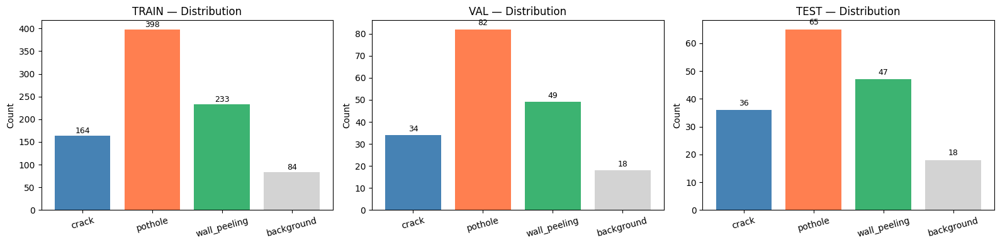

In [2]:
import os
from pathlib import Path
from collections import Counter
import matplotlib.pyplot as plt

def count_images(directory):
    p = Path(directory)
    return len(list(p.glob('*.jpg')) + list(p.glob('*.jpeg')))

def count_labels(split):
    label_dir = Path(LABEL_DIRS[split])
    class_counts = Counter()
    bg_count = 0
    for txt in label_dir.glob('*.txt'):
        content = txt.read_text().strip()
        if not content:
            bg_count += 1
        else:
            for line in content.splitlines():
                if line.strip():
                    cls = int(line.split()[0])
                    class_counts[cls] += 1
    return class_counts, bg_count

for split in SPLITS:
    counts, bg_count = count_labels(split)
    total_images = count_images(IMAGE_DIRS[split])
    print(f"\n{split.upper()}: {total_images} images")
    for cls_id in sorted(counts):
        print(f"  {CLASS_NAMES[cls_id]}: {counts[cls_id]} annotations")
    print(f"  background (empty): {bg_count} images")
    ratio = bg_count / max(sum(counts.values()), 1)
    print(f"  bg/defect ratio: {ratio:.2f} {'⚠️ consider reducing' if ratio > 0.5 else '✅'}")

# Bar chart — defect classes only, background shown separately
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, split in zip(axes, SPLITS):
    counts, bg_count = count_labels(split)
    names  = [CLASS_NAMES[i] for i in sorted(counts)] + ['background']
    values = [counts[i] for i in sorted(counts)] + [bg_count]
    colors = ['steelblue', 'coral', 'mediumseagreen', 'lightgray']
    bars = ax.bar(names, values, color=colors)
    ax.set_title(f'{split.upper()} — Distribution')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=15)
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                str(val), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'class_distribution.png'), dpi=150)
plt.show()

## Visualise Sample Annotations

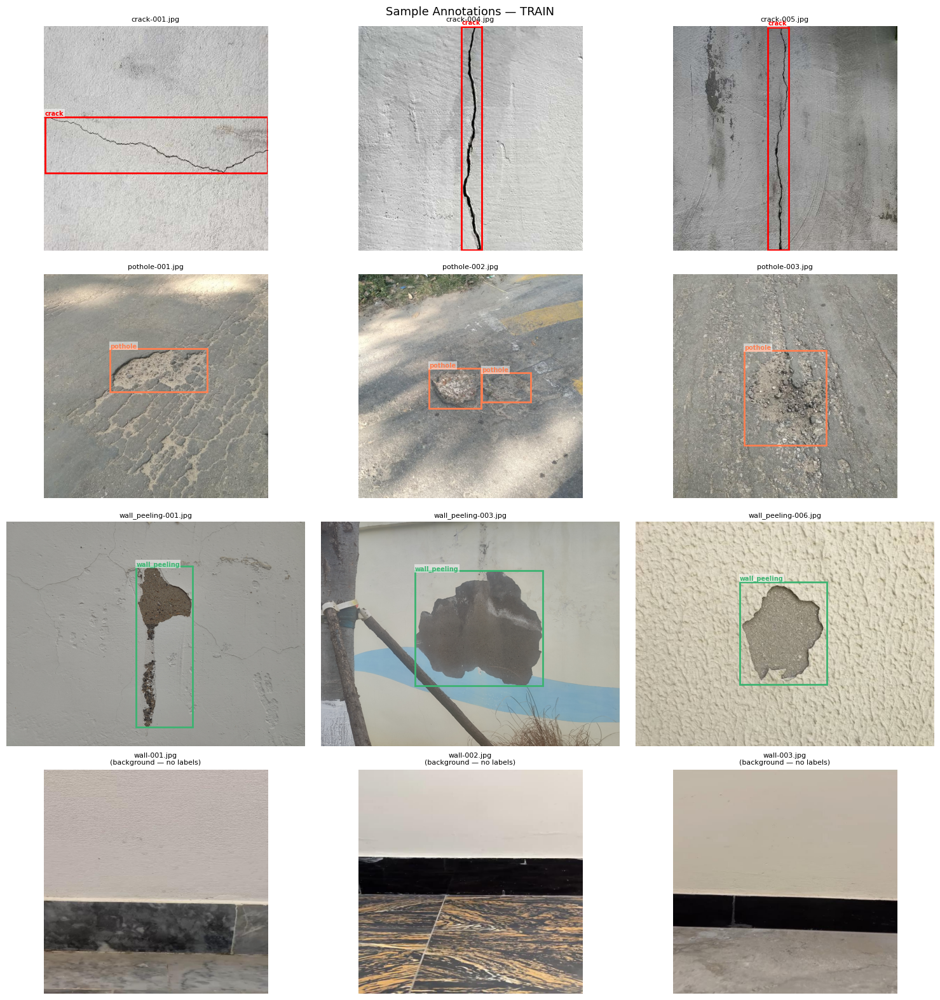

In [3]:
import matplotlib.patches as patches
from PIL import Image

def visualize_samples_by_class(split, n_per_class=3):
    img_dir = Path(IMAGE_DIRS[split])
    lbl_dir = Path(LABEL_DIRS[split])
    COLORS  = ['red', 'coral', 'mediumseagreen']

    # defect rows + 1 background row
    total_rows = NC + 1
    fig, axes = plt.subplots(total_rows, n_per_class, figsize=(5 * n_per_class, 4 * total_rows))

    # --- defect class rows ---
    for row, cls_name in enumerate(CLASS_NAMES):
        cls_imgs = sorted(img_dir.glob(f'{cls_name}-*.jpg'))[:n_per_class]

        for col in range(n_per_class):
            ax = axes[row][col]
            ax.axis('off')

            if col >= len(cls_imgs):
                ax.set_title(f'{cls_name} — no sample', fontsize=9)
                continue

            img_path = cls_imgs[col]
            img = Image.open(img_path).convert('RGB')
            w, h = img.size
            ax.imshow(img)
            ax.set_title(f'{img_path.name}', fontsize=8)

            lbl_path = lbl_dir / (img_path.stem + '.txt')
            if lbl_path.exists():
                for line in lbl_path.read_text().strip().splitlines():
                    parts = line.split()
                    if not parts:
                        continue
                    c, cx, cy, bw, bh = int(parts[0]), float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                    x1 = (cx - bw/2) * w
                    y1 = (cy - bh/2) * h
                    rect = patches.Rectangle(
                        (x1, y1), bw*w, bh*h,
                        linewidth=2, edgecolor=COLORS[c % len(COLORS)], facecolor='none'
                    )
                    ax.add_patch(rect)
                    ax.text(x1, y1 - 4, CLASS_NAMES[c], color=COLORS[c % len(COLORS)],
                            fontsize=7, fontweight='bold',
                            bbox=dict(facecolor='white', alpha=0.5, pad=1, edgecolor='none'))

    bg_imgs = []
    for prefix in BACKGROUND_PREFIXES:
        bg_imgs.extend(sorted(img_dir.glob(f'{prefix}*.jpg')))
    bg_imgs = bg_imgs[:n_per_class]

    for col in range(n_per_class):
        ax = axes[NC][col]
        ax.axis('off')
        if col < len(bg_imgs):
            img = Image.open(bg_imgs[col]).convert('RGB')
            ax.imshow(img)
            ax.set_title(f'{bg_imgs[col].name}\n(background — no labels)', fontsize=8)
        else:
            ax.set_title('background — no sample', fontsize=9)

    plt.suptitle(f'Sample Annotations — {split.upper()}', fontsize=13)
    plt.tight_layout()
    plt.savefig(os.path.join(PROJECT_DIR, f'sample_annotations_{split}.png'), dpi=150)
    plt.show()

visualize_samples_by_class('train', n_per_class=3)

## Iterative Training — Setup

In [4]:
from pathlib import Path

for split in SPLITS:
    cache = Path(LABEL_DIRS[split]).parent / 'labels.cache'
    if cache.exists():
        cache.unlink()
        print(f"Deleted cache: {cache}")
    else:
        print(f"No cache found for {split} — OK")

Deleted cache: /home/achin/COS40007-Group/dataset/train/labels.cache
Deleted cache: /home/achin/COS40007-Group/dataset/val/labels.cache
No cache found for test — OK


In [5]:
from pathlib import Path
import random

SEED = 42
SPLIT_DIR = Path('/home/achin/COS40007-Group/dataset/splits')
SPLIT_DIR.mkdir(parents=True, exist_ok=True)

# Cumulative train sizes for the 6 iterations
ITER_TRAIN_SIZES = [400, 428, 456, 484, 512, 541]


def make_splits(force: bool = True):
    """Generate per-iteration train lists + fixed val/test lists, deterministically.

    Writes:
      dataset/splits/iter{0..5}_train.txt  (cumulative train image paths)
      dataset/splits/val.txt               (184 paths, fixed)
      dataset/splits/test.txt              (181 paths, fixed)

    Idempotent: skips files that already exist unless `force=True`.
    Seed=42 => the same 400-image baseline + same batch order every run.
    """
    train_imgs = sorted(
        p for p in (Path(DATASET_ROOT) / 'train' / 'images').glob('*.jpg')
    )
    rng = random.Random(SEED)
    rng.shuffle(train_imgs)

    written = []
    for n, cum in enumerate(ITER_TRAIN_SIZES):
        out = SPLIT_DIR / f'iter{n}_train.txt'
        if out.exists() and not force:
            continue
        subset = train_imgs[:cum]
        out.write_text('\n'.join(str(p) for p in subset) + '\n', encoding='utf-8')
        written.append(str(out))

    for split in ('val', 'test'):
        out = SPLIT_DIR / f'{split}.txt'
        if out.exists() and not force:
            continue
        files = sorted((Path(DATASET_ROOT) / split / 'images').glob('*.jpg'))
        out.write_text('\n'.join(str(p) for p in files) + '\n', encoding='utf-8')
        written.append(str(out))

    print(f'make_splits: wrote {len(written)} files into {SPLIT_DIR}')
    for p in written:
        print(f'  {p}')


make_splits()


make_splits: wrote 8 files into /home/achin/COS40007-Group/dataset/splits
  /home/achin/COS40007-Group/dataset/splits/iter0_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter1_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter2_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter3_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter4_train.txt
  /home/achin/COS40007-Group/dataset/splits/iter5_train.txt
  /home/achin/COS40007-Group/dataset/splits/val.txt
  /home/achin/COS40007-Group/dataset/splits/test.txt


In [6]:
def write_iter_data_yaml(n: int) -> str:
    """Emit dataset/dataset_iter{n}.yaml pointing train/val/test at the per-iter .txt files.

    Ultralytics accepts a .txt path under `train:` (one image path per line) so the
    iter loop can grow the train set without touching the underlying image directories.
    Returns the YAML path as a string.
    """
    p = Path(f'/home/achin/COS40007-Group/dataset/dataset_iter{n}.yaml')
    p.write_text(
        f"train: /home/achin/COS40007-Group/dataset/splits/iter{n}_train.txt\n"
        f"val:   /home/achin/COS40007-Group/dataset/splits/val.txt\n"
        f"test:  /home/achin/COS40007-Group/dataset/splits/test.txt\n"
        f"nc: {NC}\n"
        f"names: {CLASS_NAMES}\n",
        encoding='utf-8',
    )
    return str(p)


print(f'write_iter_data_yaml ready (caller passes n in 0..{len(ITER_TRAIN_SIZES) - 1})')


write_iter_data_yaml ready (caller passes n in 0..5)


In [7]:
from ultralytics import RTDETR
import json
import time
import random as _random
from pathlib import Path
import pandas as pd
from PIL import Image as _PILImage

iterlog_path = Path(PROJECT_DIR) / f'{RUN}_iterlog.csv'
if not iterlog_path.exists():
    iterlog_path.write_text(
        'iter,cum_train_imgs,new_imgs,mAP50,mAP50_95,precision,recall,'
        'pct_iou_gt_0_5,pct_iou_gt_0_9,best_epoch,time_h,notes\n',
        encoding='utf-8',
    )

stop_flag = Path(PROJECT_DIR) / 'STOP'
final_iter = None  # tracks the last successfully completed iter


def _read_first_xywh(label_path: Path):
    """Read the first YOLO-format normalized xywh box from a .txt. Returns None if absent."""
    if not label_path.exists():
        return None
    for line in label_path.read_text(encoding='utf-8').splitlines():
        parts = line.split()
        if not parts:
            continue
        try:
            return (float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4]))
        except (ValueError, IndexError):
            continue
    return None


def _iou_xywh(box_a, box_b, w, h):
    """IoU between two normalized xywh boxes given image dims (w, h)."""
    ax1 = (box_a[0] - box_a[2] / 2) * w
    ay1 = (box_a[1] - box_a[3] / 2) * h
    ax2 = (box_a[0] + box_a[2] / 2) * w
    ay2 = (box_a[1] + box_a[3] / 2) * h
    bx1 = (box_b[0] - box_b[2] / 2) * w
    by1 = (box_b[1] - box_b[3] / 2) * h
    bx2 = (box_b[0] + box_b[2] / 2) * w
    by2 = (box_b[1] + box_b[3] / 2) * h
    inter_x1 = max(ax1, bx1); inter_y1 = max(ay1, by1)
    inter_x2 = min(ax2, bx2); inter_y2 = min(ay2, by2)
    inter = max(0.0, inter_x2 - inter_x1) * max(0.0, inter_y2 - inter_y1)
    area_a = max(0.0, ax2 - ax1) * max(0.0, ay2 - ay1)
    area_b = max(0.0, bx2 - bx1) * max(0.0, by2 - by1)
    union = area_a + area_b - inter
    return inter / union if union > 0 else 0.0


def _iterlog_has_row(path: Path, n: int) -> bool:
    if not path.exists():
        return False
    for line in path.read_text(encoding='utf-8').splitlines()[1:]:
        if line.startswith(f'{n},'):
            return True
    return False


for n in range(len(ITER_TRAIN_SIZES)):
    cum = ITER_TRAIN_SIZES[n]
    new = cum - (ITER_TRAIN_SIZES[n-1] if n > 0 else 0)
    run_name = f'{RUN}_iter{n}'
    run_dir = Path(PROJECT_DIR) / run_name

    last_pt = run_dir / 'weights' / 'last.pt'
    if last_pt.exists() and _iterlog_has_row(iterlog_path, n):
        print(f'iter {n}: already complete (last.pt + iterlog row present), skipping')
        final_iter = n
        continue

    if stop_flag.exists():
        print(f'STOP sentinel present, exiting at iter {n}')
        break

    data_yaml = write_iter_data_yaml(n)
    if n == 0:
        model = RTDETR(WEIGHTS_PATH)
    else:
        prev_last = Path(PROJECT_DIR) / f'{RUN}_iter{n-1}' / 'weights' / 'last.pt'
        if not prev_last.exists():
            print(f'iter {n}: previous last.pt missing at {prev_last}; aborting')
            break
        model = RTDETR(str(prev_last))
    train_kwargs = dict(
        data=data_yaml,
        epochs=50, imgsz=640, batch=8,
        workers=4, amp=True, device=0,
        project=PROJECT_DIR, name=run_name, exist_ok=True,
        optimizer='AdamW', lr0=1e-4, lrf=0.001, weight_decay=1e-4,
        warmup_epochs=5, warmup_bias_lr=0.1, patience=50,
        hsv_h=0.015, hsv_s=0.7, hsv_v=0.4,
        fliplr=0.5, flipud=0.1, scale=0.5,
        mosaic=1.0, copy_paste=0.3, degrees=10.0, translate=0.1,
        save=True, plots=True,
    )

    t0 = time.time()
    print(f'\n=== iter {n}: training ({cum} train images, {new} new) ===')
    model.train(**train_kwargs)
    t_h = (time.time() - t0) / 3600.0

    # Val for mAP50 + per-class
    val = model.val(data=data_yaml, split='val', plots=False, save_json=False, verbose=False)
    map50 = float(val.box.map50); map50_95 = float(val.box.map)
    P = float(val.box.mp); R = float(val.box.mr)
    per_class = [float(x) for x in val.box.ap50]

    # Per-test-image IoU
    test_files = [Path(l) for l in SPLIT_DIR.joinpath('test.txt').read_text(encoding='utf-8').splitlines() if l.strip()]
    preds = model.predict(source=[str(p) for p in test_files], conf=0.001, save=False, verbose=False)
    iou_rows = []
    for img_p, r in zip(test_files, preds):
        with _PILImage.open(img_p) as im:
            w, h = im.size
        gt_n = _read_first_xywh(Path('/home/achin/COS40007-Group/dataset/test/labels') / (img_p.stem + '.txt'))
        if len(r.boxes) > 0:
            conf = float(r.boxes.conf[0])
            pred_xyxy = r.boxes.xyxy[0].cpu().numpy().tolist()
            pred_n = ((pred_xyxy[0]+pred_xyxy[2])/(2*w),
                      (pred_xyxy[1]+pred_xyxy[3])/(2*h),
                      (pred_xyxy[2]-pred_xyxy[0])/w,
                      (pred_xyxy[3]-pred_xyxy[1])/h)
        else:
            conf = 0.0; pred_xyxy = None; pred_n = None
        if gt_n is not None and pred_n is not None:
            iou = _iou_xywh(gt_n, pred_n, w, h)
            gt_xyxy = [(gt_n[0]-gt_n[2]/2)*w, (gt_n[1]-gt_n[3]/2)*h,
                       (gt_n[0]+gt_n[2]/2)*w, (gt_n[1]+gt_n[3]/2)*h]
        else:
            iou = 0.0; gt_xyxy = None
        iou_rows.append({
            'image': img_p.name, 'conf': conf,
            'pred_xyxy': pred_xyxy, 'gt_xyxy': gt_xyxy, 'iou': iou,
        })
    iou_csv = Path(PROJECT_DIR) / f'{run_name}_test_iou.csv'
    pd.DataFrame(iou_rows).to_csv(iou_csv, index=False)
    ious = [row['iou'] for row in iou_rows]
    pct_5 = sum(1 for i in ious if i > 0.5) / max(len(ious), 1)
    pct_9 = sum(1 for i in ious if i > 0.9) / max(len(ious), 1)

    # 2 sample images (random pick from test set)
    sample_dir = Path(PROJECT_DIR) / f'{run_name}_samples'
    sample_dir.mkdir(exist_ok=True)
    _random.seed(SEED + n)  # reproducible per-iter sample
    sample_imgs = _random.sample(test_files, min(2, len(test_files)))
    model.predict(source=[str(p) for p in sample_imgs], conf=0.25, save=True,
                  project=str(sample_dir), name='.', exist_ok=True)

    # Best epoch from results.csv
    best_epoch = ''
    res_csv = run_dir / 'results.csv'
    if res_csv.exists():
        try:
            res = pd.read_csv(res_csv)
            best_epoch = int(res['metrics/mAP50(B)'].idxmax()) + 1
        except Exception:
            pass

    # Per-iter summary JSON
    summary = {
        'iter': n, 'cum_train_imgs': cum, 'new_imgs': new,
        'mAP50': map50, 'mAP50_95': map50_95, 'precision': P, 'recall': R,
        'pct_iou_gt_0_5': pct_5, 'pct_iou_gt_0_9': pct_9,
        'best_epoch': best_epoch, 'time_h': t_h,
        'per_class_ap50': dict(zip(CLASS_NAMES, per_class)),
    }
    summary_path = Path(PROJECT_DIR) / f'{run_name}_summary.json'
    summary_path.write_text(json.dumps(summary, indent=2), encoding='utf-8')

    # Append iterlog row
    with iterlog_path.open('a', encoding='utf-8') as f:
        f.write(f'{n},{cum},{new},{map50:.4f},{map50_95:.4f},{P:.4f},{R:.4f},'
                f'{pct_5:.4f},{pct_9:.4f},{best_epoch},{t_h:.2f},\n')

    print(f'iter {n} done: mAP50={map50:.4f} %IoU>0.5={pct_5:.3f} time={t_h:.2f}h')

    final_iter = n
    if map50 >= 0.85:
        stop_flag.touch()
        print(f'iter {n} hit mAP50 >= 0.85; STOP sentinel written')
        break

print(f'\nFinal completed iter: {final_iter}')



=== iter 0: training (400 train images, 400 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter0.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/rtdetr-l.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v7_iter0, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=50, perspective=0.0, pl

Overriding model.yaml nc=80 with nc=3


WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 926/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.4±0.0 ms, read: 68.0±60.9 MB/s, size: 67.5 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 178 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 178/400 533.2it/s 0.1s<0.4s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 342 images, 57 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 342/400 850.6it/s 0.2s<0.1s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 400 images, 57 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 400/400 1.7Kit/s 0.2s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.4±0.0 ms, read: 72.3±49.4 MB/s, size: 85.3 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels... 100 images, 18 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 100/117 292.9it/s 0.1s<0.1s

val: Scanning /home/achin/COS40007-Group/dataset/val/labels... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 934.0it/s 0.1s

val: New cache created: /home/achin/COS40007-Group/dataset/val/labels.cache


/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter0/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter0
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      21.5G      1.557      13.49     0.9607          8       1280: 0% ──────────── 0/50  7.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      21.5G       1.34      16.45      1.009          8       1280: 2% ──────────── 1/50 1.6s/it 7.7s<1:20

       1/50      21.5G      1.213      16.96     0.9304          8       1280: 4% ──────────── 2/50 1.1it/s 8.1s<43.4s

       1/50      21.5G      1.262      16.33     0.9243          8       1280: 6% ╸─────────── 3/50 1.4it/s 8.6s<32.5s

       1/50      21.5G      1.281      15.74     0.8932          8       1280: 8% ╸─────────── 4/50 1.8it/s 9.0s<26.2s

       1/50      21.5G      1.278      16.04     0.9145          8       1280: 10% ━─────────── 5/50 2.0it/s 9.4s<22.7s

       1/50      21.5G       1.25      16.46     0.9382          8       1280: 12% ━─────────── 6/50 2.1it/s 9.8s<20.6s

       1/50      21.5G      1.254      16.89     0.9561          8       1280: 14% ━╸────────── 7/50 2.2it/s 10.2s<19.1s

       1/50      21.5G      1.283       16.9     0.9404          8       1280: 16% ━╸────────── 8/50 2.3it/s 10.6s<18.1s

       1/50      21.5G       1.29      17.02     0.9433          8       1280: 18% ━━────────── 9/50 2.4it/s 11.0s<17.4s

       1/50      21.7G      1.269      17.21     0.9245          8       1280: 20% ━━────────── 10/50 2.2it/s 11.5s<18.1s

       1/50      21.7G      1.355      15.87      1.019          8       1280: 22% ━━╸───────── 11/50 2.3it/s 11.9s<17.2s

       1/50      21.7G      1.481      14.67       1.15          8       1280: 24% ━━╸───────── 12/50 2.3it/s 12.3s<16.4s

       1/50      21.7G      1.543      13.65      1.196          8       1280: 26% ━━━───────── 13/50 2.3it/s 12.7s<15.8s

       1/50      21.7G      1.581      12.76      1.266          8       1280: 28% ━━━───────── 14/50 2.4it/s 13.2s<15.3s

       1/50      21.7G      1.661      11.96      1.378          8       1280: 30% ━━━╸──────── 15/50 2.4it/s 13.6s<14.7s

       1/50      21.7G      1.704      11.27      1.425          8       1280: 32% ━━━╸──────── 16/50 2.4it/s 14.0s<14.3s

       1/50      21.7G      1.725      10.66      1.455          8       1280: 34% ━━━━──────── 17/50 2.4it/s 14.4s<13.8s

       1/50      21.7G      1.771      10.11       1.54          8       1280: 36% ━━━━──────── 18/50 2.4it/s 14.8s<13.1s

       1/50      21.7G      1.793      9.612      1.559          8       1280: 38% ━━━━╸─────── 19/50 2.4it/s 15.2s<12.8s

       1/50      21.7G      1.822      9.166      1.587          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 15.6s<12.1s

       1/50      21.7G      1.828       8.76      1.601          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 16.0s<11.7s

       1/50      21.7G      1.829      8.402      1.604          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 16.4s<11.1s

       1/50      21.7G      1.833       8.07      1.619          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 16.8s<10.8s

       1/50      21.7G      1.849      7.758      1.626          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 17.2s<10.2s

       1/50      21.7G      1.873      7.469      1.643          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 17.6s<9.9s

       1/50      21.7G      1.853      7.222      1.623          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 18.0s<9.4s

       1/50      21.7G      1.852       6.98       1.62          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 18.4s<9.2s

       1/50      21.7G      1.864      6.753      1.619          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 18.8s<8.7s

       1/50      21.7G      1.856      6.549      1.605          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 19.2s<8.4s

       1/50      21.7G      1.863      6.354      1.614          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 19.6s<7.9s

       1/50      21.7G       1.86      6.174      1.612          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 20.0s<7.6s

       1/50      21.7G       1.85      6.001      1.596          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 20.4s<7.1s

       1/50      21.7G      1.846      5.838      1.594          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 20.8s<6.8s

       1/50      21.7G      1.856      5.684      1.602          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 21.1s<6.3s

       1/50      21.7G      1.842      5.547      1.587          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 21.6s<6.0s

       1/50      21.7G      1.856      5.406      1.597          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 22.0s<5.5s

       1/50      21.7G      1.848      5.277      1.589          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 22.4s<5.2s

       1/50      21.7G      1.837      5.158      1.578          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 22.8s<4.7s

       1/50      21.7G      1.828      5.045      1.567          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 23.2s<4.4s

       1/50      21.7G      1.828      4.933      1.565          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 23.5s<3.9s

       1/50      21.7G      1.819       4.83      1.552          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 23.9s<3.6s

       1/50      21.7G      1.814       4.73      1.545          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 24.3s<3.1s

       1/50      21.7G      1.809      4.631      1.534          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 24.7s<2.8s

       1/50      21.7G      1.801      4.542      1.525          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 25.1s<2.4s

       1/50      21.7G      1.794      4.456      1.515          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 25.5s<2.0s

       1/50      21.7G      1.787      4.371        1.5          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 25.9s<1.6s

       1/50      21.7G      1.775      4.297      1.485          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 26.3s<1.2s

       1/50      21.7G      1.771      4.218      1.477          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 26.7s<0.8s

       1/50      21.7G      1.759      4.151      1.465          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 27.1s<0.4s

       1/50      21.7G      1.759      4.151      1.465          8       1280: 100% ━━━━━━━━━━━━ 50/50 1.8it/s 27.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 5.0s/it 1.5s<34.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 4.0it/s 1.6s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 6.9it/s 1.8s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.8it/s 1.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 2.6it/s 3.1s

                   all        117        165    3.8e-05     0.0392   6.91e-05   1.38e-05



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      21.7G      1.304      0.682     0.7421          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      21.8G      1.298     0.7036     0.7149          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:10

       2/50      21.8G      1.291     0.7039     0.7257          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.7s

       2/50      21.8G       1.28     0.7138      0.709          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<29.2s

       2/50      21.8G      1.221     0.7693     0.7046          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.1s

       2/50      21.8G      1.197     0.7982     0.7043          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.3s

       2/50      21.8G      1.184     0.8082     0.7342          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<20.1s

       2/50      21.8G      1.168     0.8174     0.7203          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<18.6s

       2/50      21.8G      1.176     0.8076     0.7259          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.6s<17.5s

       2/50      21.8G      1.163     0.8105     0.7187          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<17.1s

       2/50      21.8G       1.16     0.8082     0.7108          8       1280: 20% ━━────────── 10/50 2.5it/s 4.4s<16.3s

       2/50      21.8G      1.156     0.8125     0.6993          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.8s<15.6s

       2/50      21.8G      1.163     0.7997     0.6964          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.2s<15.4s

       2/50      21.8G      1.147     0.8134     0.6881          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.6s<14.7s

       2/50      21.8G      1.133      0.825      0.688          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.1s

       2/50      21.8G      1.144     0.8192     0.6925          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.4s<13.9s

       2/50      21.8G      1.141     0.8203     0.6872          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<13.2s

       2/50      21.8G      1.125     0.8354     0.6857          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.1s<12.8s

       2/50      21.8G      1.141      0.819     0.6912          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.5s<12.8s

       2/50      21.8G      1.148     0.8101     0.6846          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.9s<12.2s

       2/50      21.8G      1.147     0.8063     0.6763          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.3s<11.8s

       2/50      21.8G      1.148     0.7992      0.667          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.7s<11.6s

       2/50      21.8G      1.142     0.8031     0.6599          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.1s<11.1s

       2/50      21.8G      1.144     0.8027     0.6553          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.5s<10.6s

       2/50      21.8G      1.144     0.8026     0.6598          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.9s<10.4s

       2/50      21.8G      1.143     0.8003     0.6546          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.3s<9.9s

       2/50      21.8G      1.148      0.797     0.6507          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.7s<9.4s

       2/50      21.8G      1.143     0.8032     0.6542          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.1s<9.2s

       2/50      21.8G      1.135     0.8125     0.6517          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.5s<8.7s

       2/50      21.8G      1.137     0.8093      0.648          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.9s<8.3s

       2/50      21.8G      1.137     0.8083     0.6422          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.3s<8.0s

       2/50      21.8G      1.136       0.81     0.6361          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.7s<7.5s

       2/50      21.8G      1.135     0.8111     0.6329          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.1s<7.0s

       2/50      21.8G      1.133      0.812     0.6319          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.5s<6.8s

       2/50      21.8G      1.128     0.8159     0.6263          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.9s<6.3s

       2/50      21.8G      1.121     0.8228     0.6259          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.2s<5.8s

       2/50      21.8G      1.119     0.8274     0.6295          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.7s<5.6s

       2/50      21.8G      1.119     0.8265     0.6262          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 15.1s<5.1s

       2/50      21.8G      1.116     0.8293     0.6243          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.4s<4.7s

       2/50      21.8G      1.119     0.8267     0.6262          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.9s<4.4s

       2/50      21.8G      1.115     0.8307     0.6218          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.2s<4.0s

       2/50      21.8G      1.108     0.8364     0.6178          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.6s<3.5s

       2/50      21.8G      1.105     0.8415     0.6173          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 17.0s<3.1s

       2/50      21.8G      1.102     0.8443     0.6157          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.4s<2.8s

       2/50      21.8G      1.104     0.8413     0.6131          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.8s<2.4s

       2/50      21.8G      1.099     0.8457     0.6165          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.2s<2.0s

       2/50      21.8G      1.099     0.8478     0.6153          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.6s<1.6s

       2/50      21.8G      1.095     0.8506     0.6162          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 19.0s<1.2s

       2/50      21.8G      1.097     0.8491     0.6141          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.4s<0.8s

       2/50      21.8G      1.093     0.8535     0.6139          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.8s<0.4s

       2/50      21.8G      1.093     0.8535     0.6139          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.9it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.2it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s

                   all        117        165   0.000161      0.116   6.22e-05   1.51e-05



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      21.9G      1.193     0.7874     0.5182          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      21.9G      1.147     0.7999     0.5146          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:09

       3/50      21.9G      1.081     0.8632     0.5113          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.5s

       3/50      21.9G      1.085     0.8537     0.5676          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.1s

       3/50      21.9G      1.088     0.8447     0.5537          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.6s

       3/50      21.9G      1.077     0.8576     0.5325          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.7s

       3/50      21.9G       1.08     0.8674     0.5459          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<19.7s

       3/50      21.9G       1.07     0.8766     0.5716          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<18.3s

       3/50      21.9G      1.063     0.8845     0.5584          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

       3/50      21.9G      1.054     0.8958     0.5621          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<17.1s

       3/50      21.9G      1.062     0.8963     0.5712          8       1280: 20% ━━────────── 10/50 2.5it/s 4.4s<16.3s

       3/50      21.9G      1.048     0.9098      0.563          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

       3/50      21.9G      1.051     0.9062     0.5666          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<14.9s

       3/50      21.9G      1.052     0.9177     0.5635          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.7s

       3/50      21.9G      1.054     0.9127     0.5846          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.1s

       3/50      21.9G      1.069     0.8957     0.5868          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.7s

       3/50      21.9G      1.073      0.893     0.5881          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<13.3s

       3/50      21.9G      1.072     0.8902     0.5841          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.1s<13.2s

       3/50      21.9G      1.068     0.8936     0.5783          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.5s<12.7s

       3/50      21.9G      1.072     0.8912     0.5817          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.9s<12.2s

       3/50      21.9G      1.063     0.8979     0.5787          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.3s<11.7s

       3/50      21.9G       1.06     0.8991     0.5768          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.7s<11.6s

       3/50      21.9G      1.053     0.9071     0.5752          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.1s<11.1s

       3/50      21.9G      1.055     0.9048     0.5802          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.5s<10.6s

       3/50      21.9G      1.053      0.909     0.5841          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.9s<10.2s

       3/50      21.9G      1.054     0.9077     0.5862          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.3s<10.0s

       3/50      21.9G      1.059     0.9027     0.5904          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.7s<9.5s

       3/50      21.9G      1.055     0.9046     0.5883          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.1s<9.1s

       3/50      21.9G      1.054     0.9034     0.5864          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.4s<8.6s

       3/50      21.9G      1.049     0.9096     0.5848          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.8s<8.2s

       3/50      21.9G      1.043     0.9166     0.5848          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.2s<8.0s

       3/50      21.9G       1.04     0.9193     0.5841          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.6s<7.5s

       3/50      21.9G      1.033     0.9259     0.5836          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.0s<7.0s

       3/50      21.9G      1.028     0.9324     0.5865          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.4s<6.6s

       3/50      21.9G      1.023     0.9386     0.5883          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.8s<6.2s

       3/50      21.9G      1.025     0.9359     0.5879          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.2s<6.0s

       3/50      21.9G      1.019     0.9435     0.5847          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.6s<5.5s

       3/50      21.9G      1.014     0.9499     0.5817          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 15.0s<5.1s

       3/50      21.9G      1.006     0.9609     0.5803          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.4s<4.7s

       3/50      21.9G      1.004      0.961     0.5762          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.7s<4.3s

       3/50      21.9G     0.9983     0.9661     0.5711          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.2s<4.0s

       3/50      21.9G     0.9978     0.9648     0.5674          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.6s<3.6s

       3/50      21.9G     0.9913     0.9728     0.5632          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.9s<3.1s

       3/50      21.9G     0.9895      0.975     0.5604          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.3s<2.7s

       3/50      21.9G      0.983     0.9815     0.5587          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.7s<2.3s

       3/50      21.9G     0.9781      0.987     0.5563          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.1s<2.0s

       3/50      21.9G     0.9742     0.9916     0.5555          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.5s<1.6s

       3/50      21.9G       0.97     0.9957      0.551          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.9s<1.2s

       3/50      21.9G     0.9668     0.9981     0.5504          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.3s<0.8s

       3/50      21.9G     0.9628      1.002      0.547          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.7s<0.4s

       3/50      21.9G     0.9628      1.002      0.547          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165    0.00279      0.344    0.00634    0.00258



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50        22G     0.6855      1.422     0.3688          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50        22G     0.7724       1.29     0.3833          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

       4/50        22G     0.8121      1.207     0.4008          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.5s

       4/50        22G      0.806      1.189     0.3943          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.8s

       4/50        22G     0.8276      1.168     0.3843          8       1280: 8% ╸─────────── 4/50 2.0it/s 2.0s<23.5s

       4/50        22G     0.8208      1.168      0.374          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.7s

       4/50        22G     0.8164      1.158      0.374          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<19.8s

       4/50        22G     0.8219      1.154      0.402          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.2s<18.4s

       4/50        22G     0.8303      1.148     0.3988          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.6s<17.4s

       4/50        22G     0.8423      1.125      0.403          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

       4/50        22G     0.8416      1.126     0.3975          8       1280: 20% ━━────────── 10/50 2.4it/s 4.4s<16.4s

       4/50        22G     0.8342      1.135     0.3948          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

       4/50        22G     0.8305      1.138      0.394          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

       4/50        22G     0.8261      1.155     0.4161          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.5s

       4/50        22G      0.834      1.143     0.4166          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.0s

       4/50        22G     0.8223      1.156     0.4097          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.6s

       4/50        22G     0.8135      1.176     0.4113          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.7s<13.5s

       4/50        22G     0.8114       1.18     0.4128          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.1s<13.0s

       4/50        22G     0.8225      1.165     0.4159          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.5s<12.6s

       4/50        22G     0.8211      1.167      0.415          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.9s<12.2s

       4/50        22G     0.8183      1.175     0.4141          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.3s<11.7s

       4/50        22G     0.8186       1.17     0.4108          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.4s

       4/50        22G     0.8178      1.172     0.4108          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.1s<11.2s

       4/50        22G     0.8176      1.171     0.4074          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.5s<10.7s

       4/50        22G     0.8177      1.177     0.4066          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.8s<10.2s

       4/50        22G     0.8111      1.183     0.4021          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.8s

       4/50        22G     0.8071      1.184     0.4045          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.4s

       4/50        22G     0.8054      1.186      0.411          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<8.9s

       4/50        22G     0.8015      1.194     0.4162          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.4s<8.7s

       4/50        22G     0.8065      1.191     0.4186          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.8s<8.2s

       4/50        22G     0.8075       1.19     0.4166          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.2s<7.7s

       4/50        22G     0.8033      1.197     0.4151          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.6s<7.3s

       4/50        22G     0.8032      1.196     0.4232          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 13.0s<7.0s

       4/50        22G     0.8022      1.201     0.4309          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

       4/50        22G     0.8022      1.199     0.4265          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 13.8s<6.3s

       4/50        22G     0.8055      1.192     0.4269          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<5.9s

       4/50        22G     0.8044      1.193     0.4234          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.5s

       4/50        22G     0.8052      1.193     0.4218          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.1s

       4/50        22G     0.8027      1.196     0.4175          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.3s<4.7s

       4/50        22G     0.8018      1.195     0.4199          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.7s<4.3s

       4/50        22G     0.8031      1.193     0.4184          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.1s<4.0s

       4/50        22G     0.8009      1.196     0.4202          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.5s<3.6s

       4/50        22G     0.8026      1.193     0.4195          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.9s<3.1s

       4/50        22G     0.8071      1.189     0.4188          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.3s<2.7s

       4/50        22G     0.8065       1.19     0.4172          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.7s<2.3s

       4/50        22G     0.8038      1.194     0.4154          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.1s<1.9s

       4/50        22G     0.8022      1.194     0.4133          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.5s<1.6s

       4/50        22G     0.8001      1.197     0.4139          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.9s<1.2s

       4/50        22G     0.8009      1.197     0.4132          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.2s<0.8s

       4/50        22G     0.7971        1.2     0.4128          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.6s<0.4s

       4/50        22G     0.7971        1.2     0.4128          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165    0.00227      0.604     0.0104    0.00403



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      22.1G     0.5827      1.446     0.2009          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      22.1G     0.6527       1.37      0.264          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

       5/50      22.1G     0.6643      1.403     0.2843          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.5s

       5/50      22.1G     0.6977      1.346     0.3207          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.8s

       5/50      22.1G     0.7202      1.301     0.3207          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.0s

       5/50      22.1G     0.7194      1.302     0.3424          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.3s

       5/50      22.1G     0.7188      1.289     0.3336          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

       5/50      22.1G     0.7068      1.299     0.3294          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.3s

       5/50      22.1G     0.7231      1.278     0.3318          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

       5/50      22.1G     0.7135      1.288     0.3321          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.5s

       5/50      22.1G      0.703      1.303     0.3353          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.2s

       5/50      22.1G     0.6942      1.311     0.3271          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

       5/50      22.1G     0.6771       1.33     0.3336          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<14.9s

       5/50      22.1G     0.6619      1.349      0.333          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.5s

       5/50      22.1G     0.6628       1.35     0.3325          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.1s

       5/50      22.1G      0.655      1.359     0.3376          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.7s

       5/50      22.1G     0.6564      1.353     0.3349          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

       5/50      22.1G     0.6586      1.347     0.3384          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.1s<13.2s

       5/50      22.1G     0.6604      1.344     0.3451          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

       5/50      22.1G     0.6618      1.341     0.3425          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.2s

       5/50      22.1G     0.6552      1.348     0.3371          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

       5/50      22.1G     0.6588       1.34     0.3357          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

       5/50      22.1G     0.6592      1.341     0.3362          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

       5/50      22.1G     0.6533      1.347     0.3328          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

       5/50      22.1G     0.6526      1.348     0.3297          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.8s<10.4s

       5/50      22.1G     0.6504      1.351     0.3311          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.9s

       5/50      22.1G     0.6505      1.351       0.33          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.4s

       5/50      22.1G     0.6511      1.353     0.3341          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<8.9s

       5/50      22.1G      0.649      1.357     0.3348          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

       5/50      22.1G     0.6506      1.354     0.3362          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.1s

       5/50      22.1G     0.6499      1.354     0.3392          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

       5/50      22.1G     0.6523      1.351     0.3376          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.5s

       5/50      22.1G     0.6531      1.351     0.3366          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 12.9s<7.1s

       5/50      22.1G     0.6554      1.351     0.3401          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.3s<6.7s

       5/50      22.1G     0.6536      1.354     0.3398          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.3s

       5/50      22.1G     0.6555      1.355     0.3397          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.9s

       5/50      22.1G     0.6516      1.359     0.3379          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.5s<5.5s

       5/50      22.1G     0.6536      1.358     0.3427          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.1s

       5/50      22.1G     0.6525      1.359     0.3407          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.3s<4.7s

       5/50      22.1G     0.6497      1.361     0.3401          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.7s<4.4s

       5/50      22.1G     0.6458      1.365     0.3369          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.1s<4.0s

       5/50      22.1G     0.6429      1.369     0.3356          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.5s<3.5s

       5/50      22.1G     0.6397      1.374     0.3349          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.8s<3.1s

       5/50      22.1G     0.6386      1.375     0.3376          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

       5/50      22.1G     0.6409      1.373     0.3369          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

       5/50      22.1G     0.6394      1.375     0.3359          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<1.9s

       5/50      22.1G     0.6367      1.379     0.3335          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.5s

       5/50      22.1G      0.633      1.385     0.3354          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.8s<1.2s

       5/50      22.1G      0.634      1.383     0.3351          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.2s<0.8s

       5/50      22.1G     0.6369      1.378     0.3335          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.6s<0.4s

       5/50      22.1G     0.6369      1.378     0.3335          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165     0.0106      0.461     0.0138    0.00607



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      22.2G     0.4924      1.515     0.2483          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      22.2G     0.5394      1.479     0.3009          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

       6/50      22.2G     0.5674      1.425     0.2822          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.8s

       6/50      22.2G     0.5774      1.399     0.2723          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.7s

       6/50      22.2G     0.5554      1.435     0.2764          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.7s

       6/50      22.2G     0.5601      1.441     0.2845          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.7s

       6/50      22.2G     0.5565       1.44     0.2728          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<19.7s

       6/50      22.2G     0.5506      1.454     0.2721          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.4s

       6/50      22.2G     0.5695      1.435     0.2714          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

       6/50      22.2G     0.5822      1.431     0.2814          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.5s

       6/50      22.2G     0.5865      1.429     0.2763          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

       6/50      22.2G     0.5811       1.44     0.2712          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.4s

       6/50      22.2G      0.587      1.438     0.2857          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

       6/50      22.2G     0.5849      1.442     0.2827          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.9s

       6/50      22.2G     0.5816      1.448     0.2761          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.3s

       6/50      22.2G      0.575      1.465     0.2709          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.3s<13.8s

       6/50      22.2G     0.5681      1.472     0.2655          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.7s<13.3s

       6/50      22.2G     0.5724      1.461      0.263          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.9s

       6/50      22.2G     0.5771      1.455     0.2675          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

       6/50      22.2G     0.5762      1.461     0.2709          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.0s

       6/50      22.2G     0.5761      1.461     0.2752          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

       6/50      22.2G     0.5809      1.454     0.2776          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.6s

       6/50      22.2G     0.5882      1.443     0.2772          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.0s<11.1s

       6/50      22.2G     0.5802      1.454     0.2718          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.6s

       6/50      22.2G     0.5807      1.456     0.2724          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.2s

       6/50      22.2G     0.5844      1.448     0.2723          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.7s

       6/50      22.2G     0.5762       1.46       0.27          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.3s

       6/50      22.2G     0.5699      1.469     0.2675          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

       6/50      22.2G     0.5709      1.471     0.2708          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

       6/50      22.2G     0.5777      1.462     0.2706          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.8s<8.3s

       6/50      22.2G     0.5822      1.456     0.2733          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.1s<7.9s

       6/50      22.2G     0.5787       1.46     0.2737          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

       6/50      22.2G      0.583      1.456     0.2806          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

       6/50      22.2G     0.5808      1.457     0.2787          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

       6/50      22.2G     0.5778      1.459     0.2785          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

       6/50      22.2G      0.575      1.465     0.2775          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.8s

       6/50      22.2G     0.5741      1.465     0.2791          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.4s

       6/50      22.2G     0.5702      1.471      0.279          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.9s<5.2s

       6/50      22.2G     0.5731      1.469     0.2783          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.3s<4.7s

       6/50      22.2G     0.5714      1.469      0.278          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.7s<4.3s

       6/50      22.2G     0.5731      1.468     0.2799          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.1s<3.9s

       6/50      22.2G     0.5751      1.464     0.2787          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

       6/50      22.2G     0.5752      1.463     0.2773          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

       6/50      22.2G     0.5733      1.467     0.2754          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

       6/50      22.2G     0.5718      1.467     0.2743          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

       6/50      22.2G     0.5717      1.468     0.2743          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.0s<2.0s

       6/50      22.2G     0.5703       1.47     0.2734          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

       6/50      22.2G      0.573      1.469     0.2765          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.2s

       6/50      22.2G     0.5738      1.465     0.2752          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.2s<0.8s

       6/50      22.2G      0.572      1.467     0.2745          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.6s<0.4s

       6/50      22.2G      0.572      1.467     0.2745          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165    0.00254      0.629     0.0263      0.012



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      22.3G     0.6684      1.408     0.2415          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      22.3G     0.5864      1.557     0.2592          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

       7/50      22.3G     0.5324      1.595     0.2403          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.6s

       7/50      22.3G     0.5936       1.48     0.2453          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.9s

       7/50      22.3G     0.6002      1.476     0.2449          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.9s

       7/50      22.3G     0.5664      1.527     0.2401          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.2s

       7/50      22.3G     0.5584      1.527     0.2324          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

       7/50      22.3G     0.5813      1.485     0.2435          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.1s

       7/50      22.3G     0.5893      1.467     0.2472          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.5s<17.1s

       7/50      22.3G     0.5734      1.483     0.2452          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.3s

       7/50      22.3G     0.5704      1.485      0.245          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.8s

       7/50      22.3G      0.582      1.474     0.2527          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.8s

       7/50      22.3G     0.5882      1.454     0.2515          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.2s

       7/50      22.3G     0.5867      1.456     0.2606          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.6s

       7/50      22.3G      0.583      1.459     0.2616          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.8s<14.1s

       7/50      22.3G     0.5725      1.467      0.255          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.7s

       7/50      22.3G     0.5925      1.443     0.2581          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.3s

       7/50      22.3G     0.5903      1.458     0.2673          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

       7/50      22.3G     0.5851      1.463     0.2654          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

       7/50      22.3G     0.5774      1.471     0.2609          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.3s

       7/50      22.3G     0.5772      1.476     0.2588          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<11.8s

       7/50      22.3G     0.5681      1.485     0.2561          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.4s

       7/50      22.3G     0.5695      1.484     0.2558          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

       7/50      22.3G     0.5673      1.485     0.2575          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

       7/50      22.3G     0.5678      1.483     0.2564          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.0s

       7/50      22.3G     0.5623      1.489      0.255          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.6s

       7/50      22.3G     0.5641      1.486     0.2579          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.2s

       7/50      22.3G     0.5666       1.48     0.2605          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 10.9s<9.0s

       7/50      22.3G     0.5643      1.481     0.2614          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

       7/50      22.3G     0.5587      1.491     0.2603          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

       7/50      22.3G     0.5575      1.495     0.2607          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

       7/50      22.3G     0.5524      1.498     0.2571          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

       7/50      22.3G     0.5627      1.483     0.2578          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

       7/50      22.3G     0.5616      1.488     0.2579          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.6s

       7/50      22.3G     0.5588      1.491     0.2567          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

       7/50      22.3G     0.5586      1.488     0.2561          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<6.0s

       7/50      22.3G     0.5552      1.492     0.2559          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.4s<5.5s

       7/50      22.3G     0.5527      1.494     0.2551          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

       7/50      22.3G     0.5531      1.492     0.2571          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

       7/50      22.3G     0.5518      1.495     0.2554          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

       7/50      22.3G     0.5522      1.495     0.2569          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

       7/50      22.3G      0.548      1.504     0.2549          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

       7/50      22.3G     0.5495      1.506     0.2558          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

       7/50      22.3G     0.5483      1.505     0.2546          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.8s

       7/50      22.3G     0.5487      1.506     0.2555          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

       7/50      22.3G     0.5454      1.511     0.2537          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

       7/50      22.3G     0.5428      1.514     0.2541          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.5s

       7/50      22.3G     0.5433      1.511     0.2525          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

       7/50      22.3G     0.5449      1.512     0.2536          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

       7/50      22.3G      0.546      1.513     0.2565          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

       7/50      22.3G      0.546      1.513     0.2565          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165       0.34      0.456     0.0464     0.0176



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      22.4G     0.3713      1.788     0.1676          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      22.4G     0.4197      1.676     0.2187          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:10

       8/50      22.4G      0.423      1.735     0.2329          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.6s

       8/50      22.4G     0.4214      1.706     0.2111          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.3s

       8/50      22.4G     0.3971      1.752     0.2121          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.7s

       8/50      22.4G     0.4103      1.714     0.2015          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.0s

       8/50      22.4G     0.4237      1.688     0.2021          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.2s

       8/50      22.4G     0.4237      1.693     0.2078          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.0s

       8/50      22.4G     0.4209      1.704     0.2102          8       1280: 16% ━╸────────── 8/50 2.5it/s 3.5s<17.1s

       8/50      22.4G     0.4236      1.709     0.2131          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.9s

       8/50      22.4G     0.4223      1.706     0.2111          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.2s

       8/50      22.4G      0.423      1.698     0.2139          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

       8/50      22.4G     0.4346        1.7     0.2235          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

       8/50      22.4G     0.4391      1.688     0.2216          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.5s

       8/50      22.4G     0.4366      1.691     0.2181          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.1s

       8/50      22.4G      0.432        1.7     0.2153          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.7s

       8/50      22.4G     0.4504      1.671     0.2162          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

       8/50      22.4G     0.4526      1.667     0.2229          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.1s<13.1s

       8/50      22.4G     0.4537      1.661     0.2221          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

       8/50      22.4G      0.456      1.669     0.2217          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.2s

       8/50      22.4G     0.4652      1.654     0.2215          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

       8/50      22.4G     0.4695      1.642     0.2271          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

       8/50      22.4G     0.4719      1.633     0.2256          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

       8/50      22.4G     0.4686      1.637      0.223          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.4s

       8/50      22.4G     0.4736      1.632     0.2331          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.0s

       8/50      22.4G     0.4834       1.62     0.2355          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.8s

       8/50      22.4G     0.4838      1.623     0.2345          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.4s

       8/50      22.4G      0.483      1.631     0.2357          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

       8/50      22.4G     0.4796      1.629     0.2333          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

       8/50      22.4G      0.483      1.623     0.2373          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

       8/50      22.4G     0.4824      1.624     0.2371          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

       8/50      22.4G     0.4857      1.617     0.2364          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

       8/50      22.4G     0.4831      1.621      0.238          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

       8/50      22.4G     0.4929      1.614     0.2422          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.3s<6.8s

       8/50      22.4G     0.4891      1.618     0.2406          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 13.7s<6.3s

       8/50      22.4G     0.4888      1.619     0.2423          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.9s

       8/50      22.4G     0.4882      1.614     0.2414          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.5s<5.5s

       8/50      22.4G     0.4903      1.611     0.2442          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.1s

       8/50      22.4G     0.4896      1.611     0.2432          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.3s<4.7s

       8/50      22.4G      0.491       1.61     0.2453          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

       8/50      22.4G     0.4912      1.606     0.2463          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

       8/50      22.4G     0.4954        1.6     0.2494          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.4s<3.6s

       8/50      22.4G     0.4958      1.598     0.2492          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

       8/50      22.4G     0.4956      1.597     0.2478          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

       8/50      22.4G     0.4981      1.591     0.2477          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

       8/50      22.4G     0.5003      1.585     0.2484          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<1.9s

       8/50      22.4G     0.5018      1.584     0.2483          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

       8/50      22.4G     0.5022      1.582     0.2472          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.2s

       8/50      22.4G     0.4999      1.585     0.2464          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

       8/50      22.4G      0.499      1.584     0.2458          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.6s<0.4s

       8/50      22.4G      0.499      1.584     0.2458          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.2it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165       0.34      0.551     0.0556     0.0193



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      22.5G     0.4664      1.699     0.1317          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      22.6G     0.4794      1.641     0.2139          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

       9/50      22.6G     0.5132      1.542     0.2286          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.7s

       9/50      22.6G     0.5196      1.532     0.2314          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.5s

       9/50      22.6G     0.5043      1.539     0.2222          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.2s

       9/50      22.6G      0.503      1.541     0.2367          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.7s

       9/50      22.6G      0.522      1.506     0.2402          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.1s

       9/50      22.6G     0.5315      1.488     0.2544          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.5s

       9/50      22.6G     0.5391      1.477     0.2522          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.5s

       9/50      22.6G     0.5431      1.465     0.2484          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.7s

       9/50      22.6G     0.5522      1.452     0.2539          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

       9/50      22.6G     0.5491      1.457     0.2477          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

       9/50      22.6G      0.544      1.457     0.2436          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.0s<14.9s

       9/50      22.6G     0.5507      1.457     0.2454          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.5s

       9/50      22.6G     0.5518      1.449     0.2443          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.1s

       9/50      22.6G     0.5592       1.45     0.2437          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<14.0s

       9/50      22.6G     0.5665       1.45     0.2514          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.6s<13.4s

       9/50      22.6G     0.5676      1.445     0.2648          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.9s

       9/50      22.6G     0.5691      1.438      0.261          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

       9/50      22.6G     0.5582      1.458     0.2571          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

       9/50      22.6G     0.5662      1.445     0.2593          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

       9/50      22.6G     0.5736      1.434     0.2631          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.2s

       9/50      22.6G     0.5692      1.436     0.2578          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.7s

       9/50      22.6G     0.5638      1.437     0.2577          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.6s

       9/50      22.6G     0.5646      1.435     0.2608          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

       9/50      22.6G     0.5588      1.442     0.2606          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

       9/50      22.6G      0.555      1.448     0.2608          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

       9/50      22.6G      0.553      1.451     0.2615          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

       9/50      22.6G     0.5567      1.446      0.264          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

       9/50      22.6G     0.5554      1.444     0.2621          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.1s

       9/50      22.6G      0.553      1.443      0.259          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

       9/50      22.6G     0.5493      1.445     0.2563          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.6s

       9/50      22.6G     0.5465       1.45     0.2588          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 12.9s<7.1s

       9/50      22.6G     0.5462      1.449     0.2563          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.6s

       9/50      22.6G     0.5502      1.441     0.2588          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

       9/50      22.6G     0.5448      1.446      0.257          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

       9/50      22.6G     0.5456      1.444      0.257          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

       9/50      22.6G     0.5411      1.451     0.2568          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

       9/50      22.6G     0.5376      1.452      0.255          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

       9/50      22.6G     0.5338      1.455     0.2541          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.3s

       9/50      22.6G      0.535      1.453     0.2521          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

       9/50      22.6G     0.5323      1.458     0.2529          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

       9/50      22.6G     0.5323      1.458     0.2531          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

       9/50      22.6G     0.5292      1.459     0.2524          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

       9/50      22.6G      0.527      1.463     0.2515          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

       9/50      22.6G     0.5257      1.467     0.2507          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

       9/50      22.6G     0.5262      1.468     0.2512          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.5s

       9/50      22.6G     0.5281      1.463     0.2513          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.7s<1.2s

       9/50      22.6G     0.5287      1.465     0.2551          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

       9/50      22.6G     0.5282      1.466      0.256          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

       9/50      22.6G     0.5282      1.466      0.256          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.672      0.293     0.0756     0.0314



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      22.7G     0.3016      1.812     0.1499          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      22.7G     0.3225      1.732     0.1523          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      10/50      22.7G     0.4685      1.555     0.1991          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<35.7s

      10/50      22.7G     0.4696      1.571     0.1977          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.0s

      10/50      22.7G     0.4783      1.533     0.2022          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<22.9s

      10/50      22.7G     0.4684      1.519     0.1971          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.2s

      10/50      22.7G     0.4644      1.513     0.1958          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      10/50      22.7G     0.4696      1.515      0.202          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.2s

      10/50      22.7G     0.4725      1.501     0.2016          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      10/50      22.7G     0.4711      1.494     0.2022          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.5s

      10/50      22.7G     0.4681      1.502     0.2073          8       1280: 20% ━━────────── 10/50 2.5it/s 4.2s<15.9s

      10/50      22.7G      0.466      1.513     0.2095          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.6s<15.3s

      10/50      22.7G     0.4694       1.51     0.2092          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.0s<14.8s

      10/50      22.7G     0.4586      1.519     0.2077          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.4s<14.7s

      10/50      22.7G     0.4553      1.514      0.203          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.8s<14.2s

      10/50      22.7G      0.448       1.53     0.1996          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.6s

      10/50      22.7G     0.4509      1.518     0.2027          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      10/50      22.7G     0.4539      1.518     0.2042          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      10/50      22.7G     0.4519      1.523     0.2035          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.3s<12.4s

      10/50      22.7G     0.4515      1.523     0.2031          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.7s<11.9s

      10/50      22.7G     0.4533      1.517     0.2048          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.1s<11.5s

      10/50      22.7G     0.4554      1.511     0.2023          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.5s<11.4s

      10/50      22.7G     0.4587      1.508     0.2064          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.9s

      10/50      22.7G     0.4612      1.505     0.2068          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.4s

      10/50      22.7G     0.4631        1.5      0.206          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      10/50      22.7G     0.4653      1.493     0.2046          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      10/50      22.7G     0.4667      1.485     0.2022          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      10/50      22.7G     0.4677      1.485     0.2079          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.8s<8.9s

      10/50      22.7G     0.4673      1.485     0.2105          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.2s<8.5s

      10/50      22.7G     0.4662      1.487     0.2141          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.6s<8.3s

      10/50      22.7G     0.4629      1.492     0.2161          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.0s<7.9s

      10/50      22.7G     0.4658      1.497     0.2255          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.4s<7.4s

      10/50      22.7G     0.4637      1.498     0.2237          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<7.0s

      10/50      22.7G     0.4659      1.498     0.2217          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.6s

      10/50      22.7G     0.4651      1.502     0.2211          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      10/50      22.7G     0.4636      1.506     0.2239          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.9s

      10/50      22.7G     0.4667        1.5     0.2227          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.5s

      10/50      22.7G     0.4698        1.5     0.2229          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.8s<5.2s

      10/50      22.7G     0.4715      1.494     0.2215          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.2s<4.7s

      10/50      22.7G     0.4712      1.495     0.2237          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.5s<4.3s

      10/50      22.7G     0.4695      1.499     0.2261          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.9s

      10/50      22.7G     0.4676      1.504     0.2267          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      10/50      22.7G     0.4663      1.504     0.2247          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      10/50      22.7G     0.4628      1.511     0.2231          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      10/50      22.7G     0.4663      1.508      0.228          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      10/50      22.7G     0.4644      1.509      0.227          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 17.9s<2.0s

      10/50      22.7G     0.4663      1.504     0.2269          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      10/50      22.7G     0.4651      1.506     0.2284          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      10/50      22.7G     0.4649      1.503     0.2269          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.0s<0.8s

      10/50      22.7G     0.4649        1.5     0.2258          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

      10/50      22.7G     0.4649        1.5     0.2258          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165       0.68       0.22     0.0579     0.0293



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      22.8G     0.3578      1.649     0.1698          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      22.8G      0.407      1.559     0.1972          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      11/50      22.8G     0.3987      1.538     0.1857          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<35.8s

      11/50      22.8G     0.4283      1.481     0.1829          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.3s

      11/50      22.8G     0.4448      1.463     0.1999          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.4s

      11/50      22.8G     0.4313      1.475     0.1952          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.2s

      11/50      22.8G     0.4189      1.503     0.2001          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.5s

      11/50      22.8G      0.419      1.499     0.1965          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.3s

      11/50      22.8G     0.4166      1.497     0.2004          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      11/50      22.8G      0.413      1.508     0.2112          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.5s

      11/50      22.8G     0.4221      1.497     0.2117          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      11/50      22.8G     0.4379      1.478     0.2103          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.8s

      11/50      22.8G     0.4382      1.478     0.2118          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.1s

      11/50      22.8G     0.4495       1.46     0.2107          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.6s

      11/50      22.8G     0.4559      1.453     0.2064          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.1s

      11/50      22.8G     0.4544      1.446     0.2032          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.7s

      11/50      22.8G     0.4487      1.449     0.2001          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      11/50      22.8G     0.4492      1.453     0.1999          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      11/50      22.8G     0.4539      1.444     0.1968          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      11/50      22.8G      0.452      1.448     0.1959          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.3s

      11/50      22.8G     0.4562       1.45     0.1973          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.8s

      11/50      22.8G     0.4601      1.448     0.1967          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      11/50      22.8G     0.4582       1.45      0.196          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.8s

      11/50      22.8G     0.4624       1.45     0.1964          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.4s

      11/50      22.8G     0.4658      1.445     0.2014          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      11/50      22.8G     0.4607      1.455     0.2005          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      11/50      22.8G     0.4678      1.446     0.2022          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      11/50      22.8G      0.465      1.452     0.2048          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 10.9s<9.1s

      11/50      22.8G     0.4611      1.459     0.2046          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.3s<8.6s

      11/50      22.8G     0.4554       1.47     0.2033          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      11/50      22.8G     0.4605      1.466     0.2037          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      11/50      22.8G     0.4604      1.464     0.2022          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      11/50      22.8G     0.4589      1.469     0.2016          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      11/50      22.8G     0.4548      1.474      0.199          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.6s

      11/50      22.8G     0.4547      1.474     0.1968          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      11/50      22.8G     0.4567       1.47     0.1984          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.0s<6.0s

      11/50      22.8G     0.4579      1.466     0.1993          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.4s<5.5s

      11/50      22.8G     0.4574      1.473     0.2029          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      11/50      22.8G     0.4556      1.476     0.2034          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      11/50      22.8G     0.4538       1.48     0.2033          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.2s

      11/50      22.8G     0.4544      1.481     0.2033          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.8s

      11/50      22.8G     0.4519      1.488     0.2026          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.4s

      11/50      22.8G     0.4493      1.489     0.2004          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      11/50      22.8G     0.4471      1.492     0.1996          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.1s<2.8s

      11/50      22.8G     0.4476      1.493     0.2044          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.4s

      11/50      22.8G     0.4451      1.499     0.2048          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      11/50      22.8G     0.4459      1.498     0.2078          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      11/50      22.8G     0.4462      1.496     0.2063          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      11/50      22.8G     0.4484      1.496     0.2076          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      11/50      22.8G     0.4473      1.498     0.2064          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      11/50      22.8G     0.4473      1.498     0.2064          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.685      0.175     0.0677     0.0305



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      22.9G      0.512      1.372     0.1837          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      22.9G     0.5414      1.328     0.1983          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:09

      12/50      22.9G     0.5201      1.318     0.1945          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.0s

      12/50      22.9G     0.4655       1.42     0.1866          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.6s

      12/50      22.9G     0.4738      1.404     0.2026          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.1s

      12/50      22.9G     0.4812      1.379     0.2028          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.8s

      12/50      22.9G     0.4977      1.379     0.2421          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.2s

      12/50      22.9G     0.4885      1.383     0.2362          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.1s

      12/50      22.9G     0.4874      1.388     0.2388          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.2s

      12/50      22.9G     0.4793      1.409     0.2376          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.9s

      12/50      22.9G     0.4817      1.413     0.2391          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.2s

      12/50      22.9G     0.4685      1.432      0.229          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

      12/50      22.9G     0.4657      1.442     0.2267          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.1s

      12/50      22.9G     0.4621       1.46     0.2223          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.5s

      12/50      22.9G     0.4575      1.469     0.2208          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.1s

      12/50      22.9G     0.4506      1.483      0.216          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.6s

      12/50      22.9G     0.4542      1.475     0.2138          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      12/50      22.9G     0.4546      1.467     0.2088          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.2s

      12/50      22.9G     0.4562      1.474     0.2147          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

      12/50      22.9G     0.4556      1.489       0.22          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      12/50      22.9G     0.4548      1.489     0.2185          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      12/50      22.9G     0.4583      1.477     0.2151          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.1s

      12/50      22.9G     0.4533      1.492      0.217          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.7s

      12/50      22.9G     0.4475      1.502     0.2151          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.3s

      12/50      22.9G     0.4464      1.495     0.2126          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.0s

      12/50      22.9G     0.4424      1.503     0.2105          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.1s<9.9s

      12/50      22.9G     0.4407      1.502     0.2105          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.5s<9.4s

      12/50      22.9G     0.4386      1.502     0.2112          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

      12/50      22.9G     0.4393      1.498     0.2096          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      12/50      22.9G      0.444      1.485     0.2076          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      12/50      22.9G     0.4453      1.482     0.2045          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      12/50      22.9G     0.4403      1.492     0.2026          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.4s<7.3s

      12/50      22.9G     0.4394       1.49     0.2016          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<6.9s

      12/50      22.9G     0.4427      1.483     0.2019          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.2s<6.7s

      12/50      22.9G      0.444      1.483     0.2063          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 13.6s<6.3s

      12/50      22.9G     0.4409      1.484     0.2042          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.9s

      12/50      22.9G     0.4401      1.481     0.2016          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      12/50      22.9G     0.4413      1.477     0.2007          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      12/50      22.9G     0.4373      1.482        0.2          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      12/50      22.9G     0.4366      1.482     0.1999          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.5s<4.2s

      12/50      22.9G     0.4387      1.477     0.1992          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.8s

      12/50      22.9G     0.4373       1.48     0.1975          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      12/50      22.9G      0.435      1.484      0.197          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      12/50      22.9G     0.4342      1.484     0.1977          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      12/50      22.9G      0.432      1.486     0.1963          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      12/50      22.9G     0.4339      1.483     0.1982          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      12/50      22.9G     0.4369       1.48     0.1994          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.5s

      12/50      22.9G     0.4384      1.481     0.2024          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.6s<1.2s

      12/50      22.9G     0.4389      1.481     0.2031          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.0s<0.8s

      12/50      22.9G     0.4383      1.482      0.203          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.4s<0.4s

      12/50      22.9G     0.4383      1.482      0.203          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.7it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s

                   all        117        165      0.349      0.358     0.0595     0.0288



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      22.9G     0.5247      1.298     0.1507          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50        23G     0.4737      1.385     0.2035          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:05

      13/50        23G     0.4463      1.426     0.2181          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.5s

      13/50        23G     0.4465      1.387     0.1931          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.5s

      13/50        23G      0.436      1.415     0.2002          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.1s

      13/50        23G     0.4422      1.407      0.204          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.7s

      13/50        23G     0.4304      1.434     0.2003          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.2s

      13/50        23G     0.4299      1.438     0.2012          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.5s

      13/50        23G     0.4399      1.421     0.1966          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.5s

      13/50        23G     0.4399      1.421     0.2001          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

      13/50        23G       0.45      1.404     0.2013          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      13/50        23G     0.4435      1.426     0.1999          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.4s

      13/50        23G      0.441      1.437      0.199          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.0s<14.9s

      13/50        23G     0.4346       1.44     0.1937          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.4s

      13/50        23G     0.4307      1.443     0.1909          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.0s

      13/50        23G     0.4266      1.453     0.1948          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<14.0s

      13/50        23G     0.4405      1.439     0.2031          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.6s<13.4s

      13/50        23G     0.4385      1.442     0.2029          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.0s

      13/50        23G     0.4417      1.439     0.2016          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

      13/50        23G     0.4464      1.439     0.2101          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.0s

      13/50        23G     0.4416       1.44      0.206          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.5s

      13/50        23G     0.4344      1.456     0.2111          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.5s<11.1s

      13/50        23G     0.4292       1.46     0.2074          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.7s

      13/50        23G     0.4249      1.468     0.2046          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.6s

      13/50        23G     0.4234      1.467     0.2031          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      13/50        23G     0.4227      1.463     0.2031          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      13/50        23G     0.4215      1.462     0.2003          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      13/50        23G     0.4208      1.464     0.1977          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      13/50        23G      0.419      1.469     0.1964          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      13/50        23G     0.4225      1.465     0.1971          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.6s<8.1s

      13/50        23G     0.4293      1.464     0.1966          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.0s<7.7s

      13/50        23G      0.427      1.469      0.196          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.5s

      13/50        23G     0.4305      1.465     0.1957          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<7.0s

      13/50        23G     0.4325      1.462     0.1965          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.6s

      13/50        23G     0.4348      1.461     0.1955          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      13/50        23G     0.4332      1.461     0.1942          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      13/50        23G      0.433       1.46     0.1955          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      13/50        23G     0.4323      1.458     0.1958          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      13/50        23G     0.4332      1.457     0.1957          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.1s<4.6s

      13/50        23G     0.4338      1.449     0.1941          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.3s

      13/50        23G     0.4347      1.445     0.1943          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.9s

      13/50        23G     0.4353      1.443     0.1951          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      13/50        23G     0.4329      1.447     0.1938          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      13/50        23G     0.4301      1.451     0.1923          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      13/50        23G     0.4298       1.45     0.1926          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      13/50        23G     0.4276      1.449     0.1911          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      13/50        23G     0.4253      1.453     0.1899          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      13/50        23G     0.4236      1.451     0.1889          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.7s<1.2s

      13/50        23G     0.4232      1.453     0.1897          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.1s<0.8s

      13/50        23G     0.4209      1.454     0.1895          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

      13/50        23G     0.4209      1.454     0.1895          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.357      0.309     0.0629     0.0267



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      23.1G      0.323      1.536     0.1291          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      23.1G     0.4653      1.293     0.1507          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

      14/50      23.1G     0.4886      1.293     0.1738          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<35.8s

      14/50      23.1G     0.4817      1.319     0.1881          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.1s

      14/50      23.1G     0.4525      1.344     0.1928          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.1s

      14/50      23.1G     0.4514      1.343       0.19          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.3s

      14/50      23.1G     0.4355      1.362     0.1815          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      14/50      23.1G     0.4605      1.349     0.1953          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.1s

      14/50      23.1G      0.452      1.367     0.1994          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.2s

      14/50      23.1G     0.4447      1.374     0.1964          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.4s

      14/50      23.1G     0.4372       1.38     0.1925          8       1280: 20% ━━────────── 10/50 2.5it/s 4.2s<15.8s

      14/50      23.1G     0.4317      1.386     0.1853          8       1280: 22% ━━╸───────── 11/50 2.6it/s 4.6s<15.3s

      14/50      23.1G     0.4324      1.379      0.182          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.0s<14.8s

      14/50      23.1G     0.4353      1.377     0.1829          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.4s<14.7s

      14/50      23.1G     0.4327       1.38     0.1811          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.1s

      14/50      23.1G     0.4343      1.378     0.1868          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.6s

      14/50      23.1G     0.4365      1.391     0.1872          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      14/50      23.1G     0.4378      1.381     0.1892          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      14/50      23.1G     0.4312      1.394     0.1876          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.3s<12.3s

      14/50      23.1G      0.434      1.389     0.1849          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.7s<11.9s

      14/50      23.1G     0.4282      1.394     0.1811          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.1s<11.5s

      14/50      23.1G     0.4277      1.394     0.1825          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.5s<11.4s

      14/50      23.1G     0.4259      1.397     0.1843          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.8s

      14/50      23.1G     0.4255      1.394     0.1817          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.5s

      14/50      23.1G     0.4254      1.395     0.1832          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      14/50      23.1G     0.4263      1.405     0.1858          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      14/50      23.1G     0.4253       1.41     0.1901          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.4s<9.2s

      14/50      23.1G     0.4264      1.413     0.1919          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.8s<8.8s

      14/50      23.1G     0.4212      1.423     0.1909          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.2s<8.4s

      14/50      23.1G     0.4195      1.426      0.191          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.6s<8.3s

      14/50      23.1G     0.4186      1.423     0.1907          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.0s<7.8s

      14/50      23.1G     0.4213      1.417     0.1923          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.4s<7.4s

      14/50      23.1G     0.4224      1.415     0.1919          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<7.0s

      14/50      23.1G     0.4206      1.416     0.1918          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.6s

      14/50      23.1G     0.4206      1.412     0.1906          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      14/50      23.1G      0.421      1.413     0.1915          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 13.9s<5.8s

      14/50      23.1G     0.4229      1.413     0.1936          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.3s<5.4s

      14/50      23.1G      0.419      1.417     0.1911          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.7s<5.2s

      14/50      23.1G     0.4182      1.422     0.1907          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.1s<4.7s

      14/50      23.1G     0.4214      1.418     0.1932          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.5s<4.3s

      14/50      23.1G     0.4176      1.423     0.1909          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.9s

      14/50      23.1G     0.4199      1.421     0.1923          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      14/50      23.1G      0.417      1.423     0.1911          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      14/50      23.1G       0.42      1.424     0.1911          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.0s<2.7s

      14/50      23.1G     0.4239      1.421     0.1926          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.4s<2.3s

      14/50      23.1G     0.4231      1.421     0.1932          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 17.9s<2.0s

      14/50      23.1G     0.4219      1.421     0.1925          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.2s<1.6s

      14/50      23.1G     0.4203      1.422     0.1921          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.6s<1.2s

      14/50      23.1G     0.4181      1.425     0.1921          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.0s<0.8s

      14/50      23.1G     0.4175      1.429     0.1916          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

      14/50      23.1G     0.4175      1.429     0.1916          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.359      0.251     0.0474     0.0252



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      23.2G     0.4067      1.353     0.1297          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      23.2G     0.3933       1.38     0.1371          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      15/50      23.2G     0.3972       1.45     0.1503          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<35.9s

      15/50      23.2G     0.4111      1.438     0.1561          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.3s

      15/50      23.2G     0.3967      1.445     0.1546          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.7s

      15/50      23.2G     0.3886       1.43     0.1468          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.1s

      15/50      23.2G     0.3989      1.435     0.1549          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      15/50      23.2G     0.3947      1.462      0.179          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.3s

      15/50      23.2G      0.388      1.469     0.1741          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      15/50      23.2G     0.3843      1.458     0.1682          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      15/50      23.2G     0.3841      1.452     0.1669          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      15/50      23.2G     0.3843      1.458     0.1686          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.8s

      15/50      23.2G     0.3848      1.461     0.1683          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.2s

      15/50      23.2G       0.39      1.458     0.1733          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.6s

      15/50      23.2G     0.3879      1.458     0.1742          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.1s

      15/50      23.2G     0.3881      1.455     0.1776          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.7s

      15/50      23.2G     0.3888       1.46     0.1771          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      15/50      23.2G     0.3891      1.463     0.1761          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.9s

      15/50      23.2G     0.3926      1.454     0.1771          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      15/50      23.2G     0.3873      1.466     0.1772          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.4s

      15/50      23.2G     0.3896      1.464     0.1832          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<11.8s

      15/50      23.2G     0.3945      1.453     0.1814          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      15/50      23.2G     0.3918      1.451     0.1793          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.8s

      15/50      23.2G      0.393      1.452       0.18          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.4s

      15/50      23.2G      0.394      1.446     0.1771          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.0s

      15/50      23.2G     0.3958      1.444     0.1781          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      15/50      23.2G     0.3982      1.439     0.1757          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      15/50      23.2G     0.3963      1.436     0.1745          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 10.9s<9.1s

      15/50      23.2G     0.3956      1.441     0.1742          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.3s<8.7s

      15/50      23.2G     0.3978      1.435     0.1738          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      15/50      23.2G     0.4026      1.429     0.1741          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      15/50      23.2G     0.4028       1.43     0.1731          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      15/50      23.2G     0.4028       1.43     0.1733          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      15/50      23.2G     0.3991      1.434     0.1722          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      15/50      23.2G     0.3984      1.435     0.1727          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      15/50      23.2G     0.3973      1.433     0.1717          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<6.0s

      15/50      23.2G      0.397      1.435     0.1741          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.5s<5.5s

      15/50      23.2G     0.3975      1.429     0.1744          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.9s<5.1s

      15/50      23.2G     0.3941      1.433     0.1725          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      15/50      23.2G     0.3947      1.432     0.1735          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      15/50      23.2G     0.3949      1.429     0.1723          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.8s

      15/50      23.2G     0.3943      1.429      0.172          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      15/50      23.2G     0.3931      1.427     0.1714          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      15/50      23.2G     0.3948      1.423     0.1725          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.8s

      15/50      23.2G     0.3954      1.422     0.1737          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.6s<2.4s

      15/50      23.2G     0.3966      1.422     0.1751          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<2.0s

      15/50      23.2G     0.3976      1.419     0.1765          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      15/50      23.2G     0.3962       1.42     0.1765          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      15/50      23.2G      0.398      1.417     0.1762          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      15/50      23.2G     0.3988      1.415     0.1755          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      15/50      23.2G     0.3988      1.415     0.1755          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.359       0.21      0.047     0.0221



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      23.3G     0.3938      1.442     0.2587          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      23.3G      0.362      1.474     0.2157          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:09

      16/50      23.3G     0.3911      1.472     0.2222          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.0s

      16/50      23.3G     0.3734      1.492     0.2104          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.7s

      16/50      23.3G     0.3809      1.461     0.2162          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.3s

      16/50      23.3G     0.3801      1.461     0.2097          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.8s

      16/50      23.3G     0.3901      1.444     0.2095          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.2s

      16/50      23.3G     0.3772      1.454     0.2056          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.1s

      16/50      23.3G      0.381      1.456     0.2073          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      16/50      23.3G     0.3886       1.44     0.2091          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<17.0s

      16/50      23.3G     0.3914      1.434     0.2033          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.2s

      16/50      23.3G     0.3915      1.422     0.1976          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

      16/50      23.3G     0.3887      1.425     0.1944          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      16/50      23.3G     0.3844      1.426     0.1894          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.5s

      16/50      23.3G     0.4008      1.415     0.1993          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.0s

      16/50      23.3G     0.4051      1.425     0.2075          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.6s

      16/50      23.3G     0.3985      1.435     0.2075          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      16/50      23.3G     0.4054      1.423       0.21          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.2s

      16/50      23.3G     0.4054       1.42     0.2071          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

      16/50      23.3G       0.41      1.406     0.2076          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      16/50      23.3G     0.4087      1.408     0.2063          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

      16/50      23.3G     0.4129      1.405     0.2082          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.2s

      16/50      23.3G     0.4099      1.406     0.2053          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.8s

      16/50      23.3G     0.4153      1.393     0.2069          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.4s

      16/50      23.3G     0.4143      1.395     0.2113          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.0s

      16/50      23.3G     0.4218      1.387     0.2144          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.9s

      16/50      23.3G     0.4204      1.389     0.2113          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.5s<9.5s

      16/50      23.3G     0.4213      1.379      0.209          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

      16/50      23.3G     0.4239      1.379     0.2125          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      16/50      23.3G     0.4232      1.384     0.2166          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      16/50      23.3G     0.4182      1.387     0.2128          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      16/50      23.3G     0.4126      1.391     0.2093          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      16/50      23.3G     0.4117      1.392      0.209          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      16/50      23.3G     0.4099      1.393      0.209          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.3s<6.8s

      16/50      23.3G      0.414      1.387     0.2095          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 13.7s<6.3s

      16/50      23.3G      0.414      1.381     0.2087          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<5.9s

      16/50      23.3G     0.4147       1.38      0.209          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.5s

      16/50      23.3G     0.4125      1.383     0.2078          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      16/50      23.3G     0.4135      1.378     0.2068          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      16/50      23.3G     0.4151      1.375      0.205          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.2s

      16/50      23.3G     0.4156      1.372     0.2046          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      16/50      23.3G     0.4136      1.374     0.2026          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.4s<3.5s

      16/50      23.3G     0.4154      1.373     0.2019          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.8s<3.1s

      16/50      23.3G     0.4157      1.376     0.2004          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

      16/50      23.3G     0.4173       1.37     0.1992          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      16/50      23.3G     0.4155      1.372     0.1984          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<2.0s

      16/50      23.3G     0.4178      1.368      0.198          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      16/50      23.3G     0.4178      1.372     0.1987          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      16/50      23.3G     0.4178      1.374     0.2009          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      16/50      23.3G     0.4192      1.374     0.2003          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.5s<0.4s

      16/50      23.3G     0.4192      1.374     0.2003          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.376      0.157     0.0484     0.0204



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      23.4G     0.4477      1.261      0.152          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      23.4G     0.4025      1.287     0.1358          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      17/50      23.4G     0.3951      1.359     0.1525          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<36.0s

      17/50      23.4G     0.3741       1.38     0.1602          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.3s

      17/50      23.4G     0.3692      1.403     0.1615          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.1s

      17/50      23.4G     0.3499      1.443     0.1527          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.8s

      17/50      23.4G     0.3409      1.435     0.1465          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.2s

      17/50      23.4G     0.3324      1.444     0.1415          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.7s

      17/50      23.4G     0.3436      1.431     0.1537          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.6s

      17/50      23.4G     0.3465      1.423     0.1515          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.8s

      17/50      23.4G     0.3477      1.425     0.1523          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      17/50      23.4G     0.3519      1.422     0.1529          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

      17/50      23.4G     0.3543      1.419     0.1507          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.1s

      17/50      23.4G     0.3559      1.429     0.1545          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.6s

      17/50      23.4G     0.3587      1.441     0.1603          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.8s<14.1s

      17/50      23.4G     0.3534      1.453     0.1606          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.3s<14.1s

      17/50      23.4G     0.3644       1.44     0.1636          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.7s<13.5s

      17/50      23.4G     0.3724      1.431     0.1632          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.1s

      17/50      23.4G     0.3739      1.431     0.1726          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

      17/50      23.4G      0.383      1.415     0.1747          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      17/50      23.4G      0.378      1.421     0.1751          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      17/50      23.4G     0.3727      1.432     0.1777          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.2s

      17/50      23.4G     0.3774      1.424     0.1792          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.8s

      17/50      23.4G     0.3784      1.413     0.1767          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.7s

      17/50      23.4G     0.3761      1.413     0.1732          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.8s<10.2s

      17/50      23.4G     0.3782      1.408     0.1731          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.8s

      17/50      23.4G     0.3803       1.41     0.1751          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.4s

      17/50      23.4G     0.3776      1.407      0.173          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      17/50      23.4G     0.3828      1.405     0.1776          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      17/50      23.4G     0.3861        1.4     0.1768          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.1s

      17/50      23.4G     0.3881      1.399     0.1806          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      17/50      23.4G     0.3837      1.405     0.1789          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.6s

      17/50      23.4G     0.3818      1.406      0.178          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 12.9s<7.1s

      17/50      23.4G     0.3886      1.394     0.1782          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      17/50      23.4G     0.3891      1.394     0.1825          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      17/50      23.4G     0.3879      1.399     0.1808          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.8s

      17/50      23.4G     0.3863      1.403     0.1805          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      17/50      23.4G     0.3897        1.4     0.1804          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      17/50      23.4G     0.3917      1.394     0.1784          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      17/50      23.4G     0.3933       1.39     0.1781          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.3s

      17/50      23.4G     0.3915      1.394     0.1794          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      17/50      23.4G     0.3908      1.392     0.1779          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      17/50      23.4G     0.3931      1.389     0.1789          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      17/50      23.4G     0.3917      1.387     0.1774          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

      17/50      23.4G     0.3919      1.387     0.1775          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      17/50      23.4G     0.3914      1.388     0.1771          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      17/50      23.4G     0.3891      1.391     0.1764          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.5s

      17/50      23.4G     0.3896       1.39     0.1774          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.7s<1.2s

      17/50      23.4G     0.3881       1.39     0.1768          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.1s<0.8s

      17/50      23.4G     0.3868      1.392     0.1762          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      17/50      23.4G     0.3868      1.392     0.1762          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.363      0.277     0.0481     0.0226



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      23.5G     0.3388      1.312      0.151          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      23.5G     0.2952      1.354     0.1231          8       1280: 2% ──────────── 1/50 1.2s/it 0.8s<1:01

      18/50      23.5G     0.2963      1.462     0.1542          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<36.0s

      18/50      23.5G     0.3053      1.454     0.1621          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.1s

      18/50      23.5G     0.3263       1.43     0.1624          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.5s

      18/50      23.5G     0.3441      1.403     0.1592          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.7s

      18/50      23.5G     0.3532      1.414      0.161          8       1280: 12% ━─────────── 6/50 2.2it/s 2.7s<19.7s

      18/50      23.5G     0.3631      1.432     0.1819          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.3s

      18/50      23.5G     0.3735      1.411     0.1781          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

      18/50      23.5G     0.3671      1.401     0.1699          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      18/50      23.5G     0.3754       1.41     0.1734          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      18/50      23.5G     0.3761      1.412     0.1835          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.4s

      18/50      23.5G     0.3784      1.413     0.1829          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<14.9s

      18/50      23.5G     0.3722      1.414     0.1783          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.8s

      18/50      23.5G     0.3828      1.396     0.1807          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.2s

      18/50      23.5G     0.3818      1.386      0.176          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.7s

      18/50      23.5G     0.3908      1.365     0.1767          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.3s

      18/50      23.5G     0.3854      1.366      0.173          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      18/50      23.5G     0.3864      1.378     0.1794          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      18/50      23.5G     0.3891      1.374     0.1806          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<11.9s

      18/50      23.5G     0.3884      1.374     0.1804          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.5s

      18/50      23.5G     0.3884      1.373     0.1792          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.4s

      18/50      23.5G     0.3912      1.368     0.1798          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      18/50      23.5G     0.3902      1.368     0.1786          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.5s

      18/50      23.5G     0.3938      1.364     0.1794          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      18/50      23.5G     0.3976      1.356     0.1787          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      18/50      23.5G     0.3979      1.358     0.1817          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      18/50      23.5G     0.3948      1.362     0.1808          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      18/50      23.5G      0.394      1.363     0.1796          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      18/50      23.5G     0.3932      1.359     0.1798          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.7s<8.4s

      18/50      23.5G     0.3963      1.358      0.182          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.1s<7.9s

      18/50      23.5G     0.3951       1.36     0.1802          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      18/50      23.5G     0.3955       1.36     0.1807          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      18/50      23.5G      0.392      1.363     0.1787          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      18/50      23.5G     0.3972      1.357     0.1797          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      18/50      23.5G     0.3962       1.36     0.1793          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      18/50      23.5G     0.3952       1.36     0.1786          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      18/50      23.5G     0.3955      1.357       0.18          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.8s<5.1s

      18/50      23.5G     0.3938      1.355     0.1793          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      18/50      23.5G     0.3898      1.362     0.1781          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.2s

      18/50      23.5G     0.3878      1.368     0.1773          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      18/50      23.5G     0.3898      1.369     0.1809          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      18/50      23.5G     0.3912      1.365     0.1802          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      18/50      23.5G     0.3896      1.365     0.1803          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      18/50      23.5G     0.3883      1.365     0.1798          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      18/50      23.5G     0.3898      1.362     0.1794          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 17.9s<2.0s

      18/50      23.5G     0.3906      1.358     0.1797          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.3s<1.6s

      18/50      23.5G     0.3894      1.358     0.1786          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.7s<1.2s

      18/50      23.5G     0.3903      1.356      0.178          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      18/50      23.5G     0.3905      1.354     0.1776          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      18/50      23.5G     0.3905      1.354     0.1776          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165       0.38      0.237     0.0617     0.0339



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      23.7G      0.398      1.253       0.14          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      23.9G     0.3598      1.365     0.1252          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:02

      19/50      23.9G     0.3283      1.456     0.1221          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<35.7s

      19/50      23.9G     0.3549      1.414     0.1431          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.3s

      19/50      23.9G     0.3613      1.422     0.1602          8       1280: 8% ╸─────────── 4/50 1.9it/s 1.9s<23.7s

      19/50      23.9G     0.3626      1.402     0.1558          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.1s

      19/50      23.9G     0.3771      1.374     0.1633          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      19/50      23.9G      0.366      1.379     0.1607          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.1s

      19/50      23.9G     0.3659      1.391      0.162          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      19/50      23.9G     0.3634      1.386     0.1624          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      19/50      23.9G      0.366      1.386     0.1602          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      19/50      23.9G      0.368      1.381     0.1563          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.8s

      19/50      23.9G     0.3616      1.389     0.1555          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.2s

      19/50      23.9G     0.3665      1.395     0.1597          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.6s

      19/50      23.9G     0.3644      1.404     0.1625          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.8s<14.2s

      19/50      23.9G      0.365      1.403     0.1656          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<13.8s

      19/50      23.9G     0.3685      1.399     0.1674          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.3s

      19/50      23.9G     0.3628      1.403     0.1645          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      19/50      23.9G     0.3673      1.401     0.1702          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.3s

      19/50      23.9G     0.3713      1.396     0.1759          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.2s

      19/50      23.9G     0.3731      1.396     0.1772          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.8s

      19/50      23.9G     0.3724      1.396     0.1772          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      19/50      23.9G      0.372        1.4     0.1769          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      19/50      23.9G     0.3717      1.401     0.1764          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.5s

      19/50      23.9G      0.371      1.398     0.1757          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      19/50      23.9G     0.3682      1.398     0.1726          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      19/50      23.9G     0.3709      1.399     0.1743          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      19/50      23.9G     0.3725      1.394     0.1733          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 10.9s<9.2s

      19/50      23.9G     0.3742      1.385     0.1728          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.3s<8.7s

      19/50      23.9G     0.3746      1.384     0.1729          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      19/50      23.9G     0.3718      1.385     0.1707          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      19/50      23.9G     0.3749      1.382      0.173          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      19/50      23.9G     0.3808      1.372     0.1714          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      19/50      23.9G     0.3781      1.375     0.1709          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      19/50      23.9G     0.3743      1.377     0.1687          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      19/50      23.9G     0.3724      1.377     0.1671          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<5.9s

      19/50      23.9G     0.3689       1.38     0.1648          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.5s

      19/50      23.9G     0.3677      1.383     0.1664          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      19/50      23.9G     0.3662      1.381     0.1653          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      19/50      23.9G      0.369      1.377     0.1652          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.2s

      19/50      23.9G      0.372      1.373     0.1662          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.8s

      19/50      23.9G     0.3723      1.373      0.168          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      19/50      23.9G     0.3696      1.375     0.1667          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      19/50      23.9G     0.3674      1.377     0.1654          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.1s<2.8s

      19/50      23.9G     0.3667      1.374     0.1637          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      19/50      23.9G      0.369      1.368     0.1628          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      19/50      23.9G     0.3677       1.37      0.162          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      19/50      23.9G     0.3659      1.373     0.1611          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      19/50      23.9G     0.3658      1.372     0.1611          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      19/50      23.9G     0.3647      1.373       0.16          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      19/50      23.9G     0.3647      1.373       0.16          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.382       0.22     0.0575     0.0323



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50        24G     0.3087      1.423     0.1626          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      24.2G     0.4047      1.363     0.1926          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:07

      20/50      24.2G     0.3875       1.38     0.1752          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.5s

      20/50      24.2G     0.3902      1.377     0.1942          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.7s

      20/50      24.2G     0.3908      1.382     0.1993          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.5s

      20/50      24.2G     0.3825      1.395     0.1946          8       1280: 10% ━─────────── 5/50 2.2it/s 2.3s<20.9s

      20/50      24.2G     0.3603      1.428     0.1845          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.2s

      20/50      24.2G     0.3509      1.419      0.178          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.0s

      20/50      24.2G     0.3418      1.431     0.1745          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.2s

      20/50      24.2G     0.3622      1.424       0.19          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.9s

      20/50      24.2G     0.3642      1.428     0.1897          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      20/50      24.2G     0.3652      1.408      0.185          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      20/50      24.2G     0.3567      1.417     0.1801          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.0s<15.0s

      20/50      24.2G     0.3555      1.416     0.1762          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.4s

      20/50      24.2G     0.3522      1.411     0.1706          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.0s

      20/50      24.2G     0.3507      1.405     0.1665          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.5s

      20/50      24.2G     0.3446      1.408     0.1628          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      20/50      24.2G     0.3461      1.407      0.163          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.0s

      20/50      24.2G      0.351      1.402     0.1601          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

      20/50      24.2G     0.3554      1.394     0.1603          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.0s

      20/50      24.2G     0.3543      1.396     0.1611          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.1s<11.5s

      20/50      24.2G     0.3537      1.396     0.1612          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.5s<11.0s

      20/50      24.2G     0.3518      1.401     0.1629          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.7s

      20/50      24.2G     0.3512      1.399     0.1603          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.4s

      20/50      24.2G     0.3518      1.396     0.1592          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.0s

      20/50      24.2G     0.3506      1.394     0.1591          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.1s<9.9s

      20/50      24.2G     0.3529      1.393     0.1614          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.4s

      20/50      24.2G     0.3537      1.391     0.1615          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

      20/50      24.2G     0.3503      1.401     0.1612          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      20/50      24.2G      0.348      1.405     0.1592          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.6s<8.1s

      20/50      24.2G     0.3466      1.405      0.159          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.0s<7.8s

      20/50      24.2G     0.3459      1.405     0.1589          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.4s<7.4s

      20/50      24.2G     0.3434      1.414     0.1599          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<7.0s

      20/50      24.2G     0.3431      1.417     0.1614          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.2s<6.7s

      20/50      24.2G     0.3439      1.419     0.1625          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.3s

      20/50      24.2G     0.3467      1.413     0.1619          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      20/50      24.2G     0.3451      1.414       0.16          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      20/50      24.2G     0.3447      1.418     0.1629          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.7s<5.0s

      20/50      24.2G      0.347      1.414     0.1621          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.1s<4.6s

      20/50      24.2G     0.3467      1.414     0.1613          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.5s<4.2s

      20/50      24.2G     0.3472      1.413     0.1609          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.8s

      20/50      24.2G      0.346      1.414      0.162          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.3s<3.5s

      20/50      24.2G     0.3519      1.407     0.1621          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      20/50      24.2G     0.3531      1.404     0.1615          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      20/50      24.2G     0.3512      1.407     0.1605          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      20/50      24.2G     0.3508      1.408       0.16          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.8s<1.9s

      20/50      24.2G     0.3513      1.408     0.1607          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.2s<1.5s

      20/50      24.2G     0.3549      1.401       0.16          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.6s<1.2s

      20/50      24.2G     0.3542      1.402      0.159          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.0s<0.8s

      20/50      24.2G     0.3536      1.403     0.1587          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.4s<0.4s

      20/50      24.2G     0.3536      1.403     0.1587          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.396      0.171     0.0672      0.039



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      24.2G     0.3652      1.377     0.1846          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      24.3G     0.3519      1.347     0.1707          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      21/50      24.3G     0.3372      1.374     0.1591          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<36.1s

      21/50      24.3G     0.3125       1.45      0.149          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.4s

      21/50      24.3G     0.3234      1.433     0.1472          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.5s

      21/50      24.3G     0.3316      1.433     0.1476          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<20.9s

      21/50      24.3G     0.3227      1.428     0.1444          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

      21/50      24.3G     0.3288      1.425     0.1496          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.6s

      21/50      24.3G     0.3308      1.431     0.1526          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.5s

      21/50      24.3G     0.3328      1.437     0.1551          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.7s

      21/50      24.3G     0.3323      1.431     0.1582          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      21/50      24.5G     0.3327      1.437     0.1581          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      21/50      24.5G     0.3361       1.44     0.1592          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      21/50      24.5G     0.3386       1.43     0.1575          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.4s<14.5s

      21/50      24.5G     0.3308      1.448     0.1534          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.8s<14.1s

      21/50      24.5G     0.3229      1.467     0.1495          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<14.0s

      21/50      24.5G     0.3233      1.469     0.1483          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.6s<13.4s

      21/50      24.5G       0.33      1.453     0.1491          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.9s

      21/50      24.5G     0.3286      1.452     0.1482          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      21/50      24.5G     0.3292      1.449     0.1477          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<11.9s

      21/50      24.5G     0.3322      1.454     0.1529          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.5s

      21/50      24.5G     0.3316      1.453     0.1546          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.5s<11.2s

      21/50      24.5G     0.3299      1.449     0.1528          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.8s

      21/50      24.5G     0.3271      1.455     0.1531          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.7s

      21/50      24.5G     0.3302      1.444      0.153          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.7s<10.2s

      21/50      24.5G     0.3294       1.44      0.151          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.8s

      21/50      24.5G     0.3267      1.441     0.1507          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.4s

      21/50      24.5G     0.3278       1.44     0.1524          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

      21/50      24.5G     0.3267      1.435     0.1511          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      21/50      24.5G      0.326      1.434     0.1501          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.1s

      21/50      24.5G     0.3243      1.437     0.1492          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

      21/50      24.5G     0.3221      1.438      0.148          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.5s

      21/50      24.5G     0.3221      1.438      0.147          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 12.9s<7.1s

      21/50      24.5G     0.3225      1.435     0.1466          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.3s<6.7s

      21/50      24.5G     0.3211      1.435     0.1472          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.3s

      21/50      24.5G     0.3215      1.436     0.1463          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      21/50      24.5G     0.3213      1.433      0.146          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      21/50      24.5G     0.3257      1.427      0.146          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      21/50      24.5G     0.3263      1.425     0.1467          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      21/50      24.5G     0.3259      1.427      0.146          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.4s

      21/50      24.5G     0.3252      1.427     0.1454          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.0s<4.0s

      21/50      24.5G     0.3237      1.428     0.1447          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.4s<3.5s

      21/50      24.5G     0.3243      1.426     0.1454          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      21/50      24.5G      0.324      1.426     0.1442          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

      21/50      24.5G     0.3263      1.421     0.1448          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      21/50      24.5G     0.3257      1.421     0.1456          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<2.0s

      21/50      24.5G     0.3278      1.418     0.1477          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      21/50      24.5G     0.3291      1.415     0.1484          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.8s<1.2s

      21/50      24.5G     0.3299      1.412     0.1472          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.1s<0.8s

      21/50      24.5G     0.3301      1.412     0.1474          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.5s<0.4s

      21/50      24.5G     0.3301      1.412     0.1474          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.392      0.136     0.0568     0.0299



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      24.6G     0.4164      1.296     0.1593          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      24.6G     0.3648      1.469     0.1805          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:02

      22/50      24.6G     0.3584      1.461      0.163          8       1280: 4% ──────────── 2/50 1.3it/s 1.1s<35.9s

      22/50      24.6G     0.3403      1.467     0.1498          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.5s

      22/50      24.6G     0.3557      1.447     0.1641          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.4s

      22/50      24.6G      0.346      1.441     0.1575          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.6s

      22/50      24.6G     0.3551      1.426     0.1635          8       1280: 12% ━─────────── 6/50 2.2it/s 2.7s<19.7s

      22/50      24.6G     0.3533      1.409     0.1553          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.4s

      22/50      24.6G      0.347       1.42     0.1584          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

      22/50      24.6G     0.3475      1.423     0.1539          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

      22/50      24.6G     0.3378      1.432     0.1491          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      22/50      24.6G       0.35      1.416     0.1608          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      22/50      24.6G     0.3459      1.419     0.1629          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.1s

      22/50      24.6G     0.3479       1.41     0.1631          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<15.0s

      22/50      24.6G     0.3444       1.41     0.1591          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.4s

      22/50      24.6G     0.3427      1.402     0.1581          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.3s<13.8s

      22/50      24.6G     0.3379      1.408      0.155          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<13.3s

      22/50      24.6G     0.3405      1.411     0.1625          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      22/50      24.6G     0.3413      1.407     0.1622          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      22/50      24.6G     0.3466      1.399     0.1665          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<11.9s

      22/50      24.6G     0.3521      1.385     0.1648          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      22/50      24.6G     0.3481      1.398     0.1634          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.5s

      22/50      24.6G     0.3537      1.394     0.1694          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.0s<11.0s

      22/50      24.6G     0.3545      1.393     0.1745          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.6s

      22/50      24.6G     0.3539      1.395     0.1731          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.2s

      22/50      24.6G     0.3504      1.401     0.1705          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.8s

      22/50      24.6G     0.3509      1.399     0.1683          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.4s

      22/50      24.6G     0.3489      1.397     0.1657          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<9.0s

      22/50      24.6G     0.3501      1.393     0.1652          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      22/50      24.6G     0.3491      1.402     0.1663          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.8s<8.4s

      22/50      24.6G     0.3471      1.408     0.1673          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.1s<7.9s

      22/50      24.6G     0.3454      1.404      0.165          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      22/50      24.6G     0.3484      1.404     0.1675          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      22/50      24.6G      0.346      1.407     0.1673          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      22/50      24.6G     0.3434      1.408     0.1652          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      22/50      24.6G      0.342      1.405      0.165          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.8s

      22/50      24.6G      0.344      1.399     0.1652          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.4s

      22/50      24.6G     0.3455      1.401     0.1676          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.9s<5.1s

      22/50      24.6G      0.344      1.401     0.1658          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.3s<4.7s

      22/50      24.6G     0.3471      1.394     0.1652          8       1280: 78% ━━━━━━━━━─── 39/50 2.4it/s 15.7s<4.6s

      22/50      24.6G     0.3458      1.398     0.1641          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.1s<4.1s

      22/50      24.6G     0.3456      1.396     0.1629          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.5s<3.6s

      22/50      24.6G     0.3448      1.399     0.1634          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.9s<3.2s

      22/50      24.6G     0.3433      1.397      0.163          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.3s<2.8s

      22/50      24.6G     0.3449      1.392     0.1618          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.7s<2.4s

      22/50      24.6G     0.3472       1.39     0.1614          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.1s<2.0s

      22/50      24.6G     0.3448      1.391     0.1613          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.5s<1.6s

      22/50      24.6G     0.3449      1.391     0.1611          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.9s<1.2s

      22/50      24.6G     0.3463      1.384     0.1595          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.3s<0.8s

      22/50      24.6G     0.3458      1.383     0.1586          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.7s<0.4s

      22/50      24.6G     0.3458      1.383     0.1586          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.1it/s 0.3s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165       0.38      0.169     0.0577     0.0328



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      24.7G     0.2547      1.426     0.1397          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      24.9G     0.3157      1.379     0.1494          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:02

      23/50      24.9G     0.3505      1.345     0.1579          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.0s

      23/50      24.9G     0.3415       1.37     0.1542          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<29.2s

      23/50      24.9G     0.3366      1.377     0.1469          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.2s

      23/50      24.9G     0.3297      1.387     0.1463          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.4s

      23/50      24.9G     0.3283      1.401     0.1563          8       1280: 12% ━─────────── 6/50 2.3it/s 2.8s<19.5s

      23/50      24.9G     0.3225      1.409     0.1501          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.3s

      23/50      24.9G     0.3087      1.424     0.1424          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

      23/50      24.9G     0.3223       1.41     0.1413          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      23/50      24.9G     0.3244      1.405     0.1365          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      23/50      24.9G     0.3169      1.406     0.1316          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.9s

      23/50      24.9G     0.3244      1.405     0.1344          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.2s

      23/50      24.9G     0.3218      1.416     0.1342          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.7s

      23/50      24.9G     0.3185      1.417     0.1336          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.2s

      23/50      24.9G     0.3197      1.416     0.1351          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.7s

      23/50      24.9G      0.318      1.419     0.1363          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<13.2s

      23/50      24.9G     0.3138      1.429     0.1353          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      23/50      24.9G     0.3099      1.433     0.1342          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      23/50      24.9G     0.3112      1.433     0.1364          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.3s

      23/50      24.9G     0.3115      1.429     0.1377          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<11.8s

      23/50      24.9G     0.3145      1.428     0.1378          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      23/50      24.9G     0.3186      1.422     0.1392          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      23/50      24.9G     0.3184      1.419     0.1387          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      23/50      24.9G     0.3187      1.422     0.1388          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.1s

      23/50      24.9G     0.3162      1.427     0.1379          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.7s

      23/50      24.9G     0.3186       1.42     0.1399          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.3s

      23/50      24.9G     0.3247      1.412     0.1404          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.0s<9.1s

      23/50      24.9G      0.323      1.416     0.1408          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.4s<8.6s

      23/50      24.9G     0.3219      1.416     0.1408          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      23/50      24.9G     0.3241       1.41     0.1416          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      23/50      24.9G      0.324      1.412     0.1429          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      23/50      24.9G     0.3222       1.41      0.141          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      23/50      24.9G     0.3221       1.41     0.1407          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      23/50      24.9G     0.3237      1.409     0.1435          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      23/50      24.9G      0.325      1.404     0.1428          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<5.9s

      23/50      24.9G     0.3293      1.398     0.1421          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.5s

      23/50      24.9G     0.3289      1.401     0.1425          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.1s

      23/50      24.9G      0.327      1.402     0.1416          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.3s<4.7s

      23/50      24.9G     0.3246      1.404     0.1403          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      23/50      24.9G     0.3272      1.404     0.1423          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      23/50      24.9G     0.3254      1.408     0.1429          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      23/50      24.9G     0.3258      1.407     0.1423          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      23/50      24.9G     0.3255      1.407     0.1412          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.8s

      23/50      24.9G     0.3268      1.402     0.1401          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.6s<2.4s

      23/50      24.9G      0.326      1.404     0.1413          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.0s<2.0s

      23/50      24.9G      0.328      1.402     0.1427          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      23/50      24.9G     0.3309      1.402     0.1448          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.2s

      23/50      24.9G     0.3311      1.396     0.1438          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.2s<0.8s

      23/50      24.9G      0.331      1.396     0.1438          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.6s<0.4s

      23/50      24.9G      0.331      1.396     0.1438          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.375      0.137     0.0592     0.0346



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50        25G     0.2699      1.476     0.1636          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50        25G     0.3643      1.336     0.2062          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:09

      24/50        25G      0.336      1.342     0.1773          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<38.0s

      24/50        25G     0.3335      1.329     0.1715          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.3s

      24/50        25G     0.3548      1.322     0.1921          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.8s

      24/50        25G     0.3411      1.341     0.1817          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.1s

      24/50        25G     0.3499      1.338     0.1837          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      24/50        25G     0.3452       1.34     0.1757          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.2s

      24/50        25G     0.3452      1.356     0.1795          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

      24/50        25G     0.3412      1.358     0.1783          8       1280: 18% ━━────────── 9/50 2.4it/s 4.0s<17.1s

      24/50        25G     0.3531      1.356     0.1847          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.2s

      24/50        25G     0.3465      1.366     0.1776          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

      24/50        25G      0.339      1.387     0.1738          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.1s

      24/50        25G     0.3419      1.375     0.1707          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.6s

      24/50        25G     0.3439      1.362     0.1667          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.1s

      24/50        25G     0.3368      1.377     0.1655          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.6s

      24/50        25G     0.3388      1.378     0.1658          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.7s<13.6s

      24/50        25G     0.3398      1.369     0.1635          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.1s<13.4s

      24/50        25G     0.3383      1.367     0.1618          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.5s<12.7s

      24/50        25G      0.338       1.37     0.1628          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.9s<12.2s

      24/50        25G     0.3351      1.379     0.1628          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.3s<11.9s

      24/50        25G     0.3348      1.384     0.1659          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.7s<11.4s

      24/50        25G     0.3381      1.375     0.1656          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.1s<10.9s

      24/50        25G     0.3416      1.379     0.1698          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      24/50        25G     0.3388      1.384     0.1691          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.1s

      24/50        25G     0.3369      1.381     0.1672          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.9s

      24/50        25G     0.3374      1.379     0.1658          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.6s<9.4s

      24/50        25G      0.338      1.376     0.1629          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<9.0s

      24/50        25G     0.3391      1.378     0.1651          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.4s<8.6s

      24/50        25G     0.3373      1.379     0.1637          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.8s<8.2s

      24/50        25G     0.3409      1.374     0.1634          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.2s<7.8s

      24/50        25G     0.3394      1.375     0.1616          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.6s<7.4s

      24/50        25G     0.3391      1.378     0.1607          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      24/50        25G     0.3427      1.372     0.1601          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.4s<6.7s

      24/50        25G     0.3418      1.372     0.1588          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.3s

      24/50        25G     0.3404      1.374     0.1583          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.8s

      24/50        25G     0.3446      1.373     0.1612          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.4s

      24/50        25G     0.3458      1.374     0.1615          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.0s

      24/50        25G     0.3429      1.377       0.16          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.3s<4.6s

      24/50        25G      0.342      1.379     0.1612          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.7s<4.3s

      24/50        25G     0.3437      1.373     0.1611          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.1s<3.9s

      24/50        25G     0.3442      1.374     0.1608          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.5s<3.6s

      24/50        25G     0.3437      1.374     0.1605          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.9s<3.1s

      24/50        25G     0.3419       1.38     0.1602          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.3s<2.7s

      24/50        25G      0.341      1.377     0.1595          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.6s<2.4s

      24/50        25G     0.3458      1.372     0.1609          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.0s<2.0s

      24/50        25G     0.3465      1.372     0.1609          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      24/50        25G     0.3457      1.374     0.1613          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.2s

      24/50        25G     0.3451      1.373     0.1609          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.2s<0.8s

      24/50        25G     0.3442      1.377     0.1613          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.6s<0.4s

      24/50        25G     0.3442      1.377     0.1613          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.5it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.4it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165      0.382      0.137     0.0662     0.0357



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      25.1G     0.3325      1.468     0.1097          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      25.3G     0.3787      1.381     0.1348          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

      25/50      25.3G     0.3524      1.387     0.1408          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.7s

      25/50      25.3G     0.3712      1.371     0.1525          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.9s

      25/50      25.3G     0.3587      1.368     0.1509          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.5s

      25/50      25.3G     0.3426      1.403     0.1517          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<20.9s

      25/50      25.3G     0.3327      1.413     0.1475          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

      25/50      25.3G     0.3343      1.408     0.1446          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.7s

      25/50      25.3G     0.3275      1.412     0.1417          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.6s

      25/50      25.3G     0.3254      1.401     0.1372          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.8s

      25/50      25.3G     0.3209      1.397     0.1325          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      25/50      25.3G     0.3215      1.392     0.1294          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      25/50      25.3G     0.3263      1.391     0.1313          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      25/50      25.3G     0.3253      1.384     0.1301          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.5s

      25/50      25.3G     0.3342      1.372     0.1324          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.0s

      25/50      25.3G     0.3379      1.366     0.1317          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.3s<14.0s

      25/50      25.3G     0.3382      1.367     0.1335          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.6s<13.4s

      25/50      25.3G     0.3406      1.375     0.1398          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.9s

      25/50      25.3G      0.343      1.364     0.1407          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.3s

      25/50      25.3G     0.3422      1.359     0.1387          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.0s

      25/50      25.3G     0.3418      1.359     0.1401          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      25/50      25.3G      0.351      1.351     0.1449          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.2s

      25/50      25.3G     0.3499      1.342     0.1439          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.8s

      25/50      25.3G     0.3473       1.34     0.1421          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.7s

      25/50      25.3G     0.3497      1.348     0.1459          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.8s<10.2s

      25/50      25.3G     0.3451      1.355     0.1453          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.8s

      25/50      25.3G     0.3437       1.36     0.1463          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.4s

      25/50      25.3G     0.3452      1.359     0.1474          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      25/50      25.3G      0.345      1.359     0.1492          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      25/50      25.3G     0.3421       1.36      0.147          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      25/50      25.3G     0.3448      1.356     0.1456          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

      25/50      25.3G     0.3452      1.349      0.144          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.5s

      25/50      25.3G     0.3426      1.353     0.1422          8       1280: 64% ━━━━━━━╸──── 32/50 2.5it/s 12.9s<7.1s

      25/50      25.3G     0.3417       1.35     0.1415          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      25/50      25.3G     0.3406      1.358     0.1431          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      25/50      25.3G     0.3397      1.361     0.1425          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      25/50      25.3G     0.3375      1.364     0.1418          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      25/50      25.3G     0.3361      1.365     0.1408          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      25/50      25.3G     0.3355      1.366      0.141          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      25/50      25.3G     0.3365      1.363     0.1413          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.4s

      25/50      25.3G     0.3355      1.366     0.1427          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.0s<3.9s

      25/50      25.3G     0.3374      1.366      0.143          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      25/50      25.3G     0.3359      1.368     0.1425          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      25/50      25.3G     0.3355      1.368     0.1427          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      25/50      25.3G     0.3348      1.368     0.1418          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      25/50      25.3G     0.3317      1.371     0.1408          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      25/50      25.3G     0.3298      1.373     0.1401          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.5s

      25/50      25.3G     0.3309      1.372     0.1402          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.7s<1.2s

      25/50      25.3G     0.3308      1.373     0.1406          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.1s<0.8s

      25/50      25.3G     0.3317      1.375      0.142          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      25/50      25.3G     0.3317      1.375      0.142          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.392      0.134     0.0731     0.0384



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      25.5G     0.3039      1.531     0.1793          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      25.6G     0.3221      1.462     0.1943          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

      26/50      25.6G     0.3264      1.455     0.1869          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.5s

      26/50      25.6G     0.3245      1.429     0.1703          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.7s

      26/50      25.6G     0.3274      1.437      0.163          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.3s

      26/50      25.6G      0.331      1.406     0.1594          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.5s

      26/50      25.6G     0.3191      1.422     0.1534          8       1280: 12% ━─────────── 6/50 2.2it/s 2.7s<19.6s

      26/50      25.6G     0.3178      1.423     0.1516          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.3s

      26/50      25.6G     0.3072      1.431     0.1434          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      26/50      25.6G     0.3087       1.43     0.1443          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      26/50      25.6G     0.3236      1.416      0.149          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      26/50      25.7G      0.326      1.391     0.1479          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      26/50      25.7G     0.3309      1.377     0.1476          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      26/50      25.7G     0.3332      1.378     0.1503          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.9s

      26/50      25.7G     0.3303      1.376     0.1523          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.3s

      26/50      25.7G     0.3273      1.393     0.1564          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.7s

      26/50      25.7G     0.3232      1.394      0.153          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      26/50      25.7G     0.3176      1.409     0.1496          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.7s

      26/50      25.7G      0.316      1.408     0.1487          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.3s

      26/50      25.7G     0.3175      1.405     0.1511          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<11.9s

      26/50      25.7G      0.313       1.41     0.1491          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.5s

      26/50      25.7G     0.3158      1.408     0.1531          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.4s

      26/50      25.7G     0.3132      1.414     0.1507          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      26/50      25.7G     0.3104      1.421     0.1486          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.5s

      26/50      25.7G     0.3147       1.41     0.1486          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      26/50      25.7G     0.3136       1.41     0.1473          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      26/50      25.7G     0.3189      1.408     0.1498          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      26/50      25.7G     0.3189      1.405     0.1497          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      26/50      25.7G     0.3193      1.402     0.1503          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      26/50      25.7G     0.3239      1.396     0.1523          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.7s<8.3s

      26/50      25.7G     0.3245      1.398     0.1522          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.1s<7.8s

      26/50      25.7G     0.3247        1.4     0.1538          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      26/50      25.7G     0.3247      1.401      0.153          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<7.0s

      26/50      25.7G     0.3237      1.403     0.1535          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.5s

      26/50      25.7G     0.3231      1.402     0.1522          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.1s

      26/50      25.7G     0.3208      1.408     0.1511          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.7s

      26/50      25.7G     0.3172      1.414     0.1502          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.3s<5.3s

      26/50      25.7G     0.3193       1.41     0.1494          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      26/50      25.7G     0.3221      1.409     0.1501          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.1s<4.7s

      26/50      25.7G     0.3209      1.406     0.1484          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.5s<4.3s

      26/50      25.7G     0.3247        1.4     0.1498          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.9s

      26/50      25.7G     0.3227      1.402      0.148          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      26/50      25.7G      0.321      1.402     0.1469          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      26/50      25.7G     0.3287      1.395      0.149          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      26/50      25.7G     0.3292      1.394     0.1487          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      26/50      25.7G     0.3306       1.39     0.1476          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 17.9s<2.0s

      26/50      25.7G     0.3312      1.389     0.1473          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      26/50      25.7G     0.3311       1.39     0.1482          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.6s<1.2s

      26/50      25.7G     0.3315       1.39     0.1473          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.0s<0.8s

      26/50      25.7G     0.3319      1.391     0.1474          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

      26/50      25.7G     0.3319      1.391     0.1474          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.384       0.13      0.069     0.0397



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      25.8G     0.3068      1.318     0.1108          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      25.8G     0.3446      1.375      0.131          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      27/50      25.8G      0.374      1.328     0.1598          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.2s

      27/50      25.8G     0.3641      1.362     0.1522          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.8s

      27/50      25.8G     0.3477       1.36     0.1455          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.9s

      27/50      25.8G     0.3359      1.386     0.1437          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.2s

      27/50      25.8G     0.3429      1.382      0.157          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.5s

      27/50      25.8G     0.3421      1.389      0.154          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.3s

      27/50      25.8G     0.3432      1.398     0.1635          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

      27/50      25.8G     0.3388      1.397       0.16          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      27/50      25.8G     0.3331      1.404     0.1624          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      27/50      25.8G     0.3285      1.402     0.1593          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.8s

      27/50      25.8G     0.3255      1.399     0.1551          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.3s

      27/50      25.8G     0.3216      1.389     0.1503          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.7s

      27/50      25.8G     0.3223      1.383     0.1488          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.2s

      27/50      25.8G     0.3231      1.375     0.1461          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.6s

      27/50      25.8G     0.3234      1.378     0.1489          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      27/50      25.8G     0.3216      1.372      0.146          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.7s

      27/50      25.8G     0.3253      1.363     0.1469          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.3s

      27/50      25.8G     0.3201      1.373     0.1443          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.3s

      27/50      25.8G     0.3235      1.367     0.1427          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<11.8s

      27/50      25.8G     0.3238      1.359     0.1414          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      27/50      25.8G     0.3205      1.364     0.1406          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      27/50      25.8G     0.3163      1.374     0.1393          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      27/50      25.8G     0.3198      1.375     0.1417          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.1s

      27/50      25.8G     0.3197      1.376     0.1397          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      27/50      25.8G      0.318      1.374     0.1389          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      27/50      25.8G     0.3179      1.373     0.1389          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.0s<9.1s

      27/50      25.8G     0.3172      1.376     0.1384          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.3s<8.7s

      27/50      25.8G     0.3158      1.377     0.1379          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      27/50      25.8G     0.3154      1.375     0.1374          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.1s<7.8s

      27/50      25.8G     0.3111       1.38     0.1356          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      27/50      25.8G     0.3119      1.387     0.1367          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      27/50      25.8G     0.3169      1.386     0.1385          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      27/50      25.8G     0.3179      1.384     0.1398          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.1s

      27/50      25.8G     0.3163      1.388     0.1394          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<5.9s

      27/50      25.8G     0.3148      1.394     0.1404          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.5s

      27/50      25.8G     0.3177      1.389     0.1413          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      27/50      25.8G      0.318      1.387     0.1415          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      27/50      25.8G     0.3174       1.39      0.141          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      27/50      25.8G     0.3174       1.39     0.1409          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      27/50      25.8G     0.3166      1.384     0.1393          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      27/50      25.8G      0.316      1.388     0.1388          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      27/50      25.8G     0.3135       1.39     0.1381          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.8s

      27/50      25.8G     0.3139      1.387     0.1383          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.6s<2.4s

      27/50      25.8G     0.3123      1.389     0.1377          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.0s<2.0s

      27/50      25.8G      0.313      1.386      0.137          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      27/50      25.8G     0.3125      1.387     0.1364          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.2s

      27/50      25.8G     0.3107      1.391     0.1363          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      27/50      25.8G     0.3125      1.387     0.1364          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      27/50      25.8G     0.3125      1.387     0.1364          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.384      0.145     0.0758     0.0421



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      25.9G     0.2597      1.499     0.1182          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      26.1G     0.2637      1.436     0.1233          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:10

      28/50      26.1G     0.2694      1.438      0.143          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.7s

      28/50      26.1G     0.2695      1.439      0.136          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.1s

      28/50      26.1G     0.2915       1.41     0.1371          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.6s

      28/50      26.1G     0.3065      1.404     0.1523          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.1s

      28/50      26.1G     0.3129      1.409      0.153          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      28/50      26.1G     0.3126      1.407      0.155          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.2s

      28/50      26.1G     0.3139      1.401     0.1461          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      28/50      26.1G     0.3122       1.39     0.1456          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<17.0s

      28/50      26.1G     0.3131      1.386     0.1423          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.3s

      28/50      26.1G     0.3168      1.377     0.1403          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

      28/50      26.1G     0.3141      1.383     0.1387          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      28/50      26.1G     0.3207      1.375     0.1424          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.5s

      28/50      26.1G     0.3136      1.392     0.1395          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.0s

      28/50      26.1G     0.3178      1.379     0.1384          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.5s

      28/50      26.1G     0.3141      1.387     0.1382          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.0s

      28/50      26.1G     0.3156      1.377     0.1366          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.0s

      28/50      26.1G      0.319      1.378     0.1382          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

      28/50      26.1G     0.3154      1.383     0.1378          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      28/50      26.1G     0.3136      1.386     0.1355          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

      28/50      26.1G     0.3134      1.385     0.1355          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      28/50      26.1G     0.3165      1.382     0.1359          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      28/50      26.1G     0.3142      1.378     0.1343          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      28/50      26.1G     0.3151      1.376     0.1333          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.1s

      28/50      26.1G     0.3182      1.372     0.1333          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.9s

      28/50      26.1G     0.3175      1.373     0.1321          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.6s<9.4s

      28/50      26.1G     0.3158      1.378     0.1304          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<9.0s

      28/50      26.1G     0.3164      1.377     0.1291          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      28/50      26.1G     0.3163      1.379     0.1294          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      28/50      26.1G     0.3168      1.377     0.1285          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      28/50      26.1G     0.3161      1.384       0.13          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      28/50      26.1G     0.3154      1.386     0.1308          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<6.9s

      28/50      26.1G     0.3181      1.385     0.1332          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.3s<6.7s

      28/50      26.1G     0.3205      1.381     0.1332          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.3s

      28/50      26.1G     0.3206      1.384     0.1333          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.8s

      28/50      26.1G     0.3187      1.386     0.1329          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.5s

      28/50      26.1G     0.3215      1.384     0.1355          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      28/50      26.1G     0.3232      1.381      0.135          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      28/50      26.1G     0.3215      1.387     0.1373          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      28/50      26.1G     0.3217      1.389     0.1382          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      28/50      26.1G     0.3207       1.39     0.1378          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.4s<3.6s

      28/50      26.1G     0.3221      1.386     0.1367          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.8s<3.1s

      28/50      26.1G     0.3212      1.387     0.1365          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

      28/50      26.1G     0.3194       1.39     0.1371          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      28/50      26.1G     0.3193      1.389     0.1369          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<1.9s

      28/50      26.1G     0.3206      1.385     0.1358          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      28/50      26.1G     0.3198      1.386     0.1348          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      28/50      26.1G     0.3218      1.385     0.1371          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      28/50      26.1G      0.322      1.383     0.1366          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.5s<0.4s

      28/50      26.1G      0.322      1.383     0.1366          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.388      0.104     0.0655     0.0372



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      26.1G     0.2956      1.317      0.117          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      26.4G      0.299      1.418     0.1229          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:06

      29/50      26.4G     0.3106      1.427     0.1207          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.9s

      29/50      26.4G     0.3021      1.463     0.1192          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.8s

      29/50      26.4G     0.3466      1.407     0.1543          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.6s

      29/50      26.4G     0.3558      1.389     0.1617          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.1s

      29/50      26.4G     0.3494      1.399     0.1645          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      29/50      26.4G     0.3455      1.395     0.1632          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.7s

      29/50      26.4G     0.3386      1.406     0.1593          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.6s

      29/50      26.4G     0.3396      1.396     0.1541          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.7s

      29/50      26.4G     0.3375      1.387     0.1523          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      29/50      26.4G     0.3328      1.388     0.1496          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      29/50      26.4G     0.3297      1.381     0.1459          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      29/50      26.4G     0.3347      1.387     0.1484          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.4s

      29/50      26.4G       0.33      1.388     0.1504          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.9s

      29/50      26.4G     0.3245      1.396     0.1475          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.3s<13.8s

      29/50      26.4G     0.3224      1.399     0.1448          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.3s

      29/50      26.4G     0.3218      1.406     0.1558          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      29/50      26.4G     0.3203      1.409     0.1557          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      29/50      26.4G      0.321      1.411     0.1531          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.0s

      29/50      26.4G     0.3198      1.406     0.1516          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      29/50      26.4G     0.3143      1.405     0.1473          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      29/50      26.4G     0.3153      1.408      0.148          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      29/50      26.4G     0.3152       1.41     0.1498          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.7s

      29/50      26.4G     0.3172      1.403      0.152          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.8s<10.3s

      29/50      26.4G     0.3183      1.396     0.1509          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.8s

      29/50      26.4G     0.3139      1.403     0.1498          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      29/50      26.4G     0.3124      1.405     0.1495          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      29/50      26.4G     0.3176      1.399     0.1507          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      29/50      26.4G     0.3152      1.405     0.1494          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      29/50      26.4G     0.3142      1.403     0.1483          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      29/50      26.4G     0.3149        1.4     0.1471          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.5s

      29/50      26.4G     0.3139        1.4     0.1468          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      29/50      26.4G     0.3115        1.4      0.146          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      29/50      26.4G      0.311        1.4     0.1482          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      29/50      26.4G     0.3107      1.405     0.1473          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      29/50      26.4G      0.311      1.401     0.1461          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      29/50      26.4G     0.3187      1.391     0.1466          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      29/50      26.4G     0.3198      1.387     0.1462          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      29/50      26.4G     0.3198      1.388     0.1457          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.4s

      29/50      26.4G     0.3192      1.388     0.1454          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.0s<3.9s

      29/50      26.4G     0.3202      1.386     0.1462          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      29/50      26.4G     0.3218      1.384     0.1459          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      29/50      26.4G     0.3204      1.387     0.1463          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

      29/50      26.4G     0.3202      1.387     0.1452          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      29/50      26.4G     0.3174      1.394     0.1453          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      29/50      26.4G     0.3167      1.395     0.1468          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.5s

      29/50      26.4G     0.3183      1.395     0.1484          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.7s<1.2s

      29/50      26.4G     0.3173      1.394     0.1474          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.1s<0.8s

      29/50      26.4G     0.3181      1.393     0.1486          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      29/50      26.4G     0.3181      1.393     0.1486          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.382      0.137     0.0576     0.0328



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      26.5G      0.316      1.397     0.1537          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      26.5G     0.2817      1.437     0.1527          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      30/50      26.5G      0.284      1.423     0.1616          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.3s

      30/50      26.5G     0.2851      1.451     0.1544          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.6s

      30/50      26.5G     0.2797      1.462     0.1497          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.3s

      30/50      26.5G     0.2936      1.434     0.1595          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.5s

      30/50      26.5G      0.277      1.474      0.151          8       1280: 12% ━─────────── 6/50 2.2it/s 2.7s<19.6s

      30/50      26.5G     0.2707      1.485     0.1475          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.3s

      30/50      26.5G     0.2837      1.471      0.151          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      30/50      26.5G     0.2862      1.457     0.1502          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.5s

      30/50      26.5G     0.2821      1.459     0.1441          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      30/50      26.5G     0.2824      1.447     0.1405          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.4s

      30/50      26.5G     0.2879      1.444     0.1483          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.0s<14.8s

      30/50      26.5G     0.2857      1.442     0.1466          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.7s

      30/50      26.5G     0.2898      1.437     0.1466          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.0s

      30/50      26.5G     0.2904      1.429     0.1431          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.5s

      30/50      26.5G     0.2914      1.428     0.1442          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.1s

      30/50      26.5G     0.2966      1.426     0.1471          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.7s

      30/50      26.5G     0.3032      1.414     0.1482          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.3s

      30/50      26.5G      0.299       1.42     0.1446          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.7s<12.0s

      30/50      26.5G     0.3031      1.415     0.1431          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.1s<11.6s

      30/50      26.5G     0.3057       1.41     0.1404          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.5s

      30/50      26.5G     0.3069      1.408     0.1382          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<11.0s

      30/50      26.5G      0.307      1.404     0.1375          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.5s

      30/50      26.5G     0.3086      1.399     0.1379          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      30/50      26.5G      0.308        1.4     0.1357          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      30/50      26.5G     0.3094      1.393     0.1347          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      30/50      26.5G     0.3079      1.394     0.1358          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      30/50      26.5G     0.3092      1.397     0.1401          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      30/50      26.5G     0.3147      1.395     0.1429          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.7s<8.4s

      30/50      26.5G     0.3179      1.388     0.1434          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      30/50      26.5G     0.3174      1.385     0.1433          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.4s<7.4s

      30/50      26.5G      0.316      1.386     0.1428          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<7.0s

      30/50      26.5G      0.316      1.386     0.1415          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.5s

      30/50      26.5G     0.3127      1.391     0.1402          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.1s

      30/50      26.5G     0.3115      1.391     0.1403          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      30/50      26.5G     0.3084      1.395     0.1381          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      30/50      26.5G     0.3104      1.392     0.1399          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.8s<5.1s

      30/50      26.5G     0.3107       1.39     0.1397          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.2s<4.7s

      30/50      26.5G     0.3095      1.392     0.1384          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.5s<4.3s

      30/50      26.5G     0.3072      1.398     0.1377          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.9s

      30/50      26.5G     0.3098      1.395      0.141          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      30/50      26.5G     0.3103      1.396     0.1412          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      30/50      26.5G     0.3081      1.396     0.1398          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      30/50      26.5G     0.3101      1.394      0.143          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      30/50      26.5G     0.3111       1.39      0.143          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 17.9s<2.0s

      30/50      26.5G     0.3105       1.39     0.1424          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.3s<1.6s

      30/50      26.5G     0.3104      1.393     0.1436          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      30/50      26.5G       0.31      1.392     0.1425          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      30/50      26.5G     0.3119      1.389     0.1429          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

      30/50      26.5G     0.3119      1.389     0.1429          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.394      0.133     0.0676     0.0374



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      26.6G     0.3735      1.183     0.1096          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      26.8G     0.3364      1.304     0.1132          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

      31/50      26.8G     0.3266      1.328     0.1058          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.3s

      31/50      26.8G     0.3385      1.321     0.1165          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.8s

      31/50      26.8G      0.331      1.339     0.1164          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.9s

      31/50      26.8G     0.3259      1.359     0.1286          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.1s

      31/50      26.8G     0.3149      1.381     0.1245          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      31/50      26.8G     0.3123      1.379     0.1205          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.2s

      31/50      26.8G     0.3168      1.381     0.1278          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.2s

      31/50      26.8G     0.3111      1.399     0.1331          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.5s

      31/50      26.8G     0.3172       1.39     0.1309          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      31/50      26.8G     0.3117      1.392     0.1266          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.8s

      31/50      26.8G     0.3141      1.392     0.1274          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.1s

      31/50      26.8G     0.3159      1.389     0.1285          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.5s

      31/50      26.8G     0.3167      1.389       0.13          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.0s

      31/50      26.8G     0.3135      1.389     0.1272          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.5s

      31/50      26.8G     0.3123      1.387     0.1258          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.1s

      31/50      26.8G     0.3106      1.387     0.1255          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.7s

      31/50      26.8G     0.3068      1.391      0.124          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.3s

      31/50      26.8G     0.3054      1.393     0.1237          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.3s

      31/50      26.8G     0.3013      1.395     0.1209          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<11.8s

      31/50      26.8G     0.2994      1.402     0.1192          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.4s

      31/50      26.8G     0.2974      1.402      0.118          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      31/50      26.8G     0.3022      1.392     0.1175          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.3s<10.5s

      31/50      26.8G     0.3003      1.397     0.1195          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      31/50      26.8G     0.3005      1.403     0.1224          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      31/50      26.8G     0.2967      1.405     0.1211          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      31/50      26.8G     0.2976        1.4     0.1207          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 10.9s<9.1s

      31/50      26.8G     0.2977      1.399     0.1199          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      31/50      26.8G     0.2987      1.392     0.1196          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      31/50      26.8G     0.2976      1.392     0.1187          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      31/50      26.8G     0.2967       1.39     0.1185          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.3s

      31/50      26.8G     0.2953      1.391     0.1183          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<6.9s

      31/50      26.8G     0.2956      1.392     0.1184          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.5s

      31/50      26.8G     0.2947       1.39     0.1177          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.1s

      31/50      26.8G     0.2926      1.391     0.1169          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.0s<5.9s

      31/50      26.8G      0.293      1.391     0.1177          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.5s

      31/50      26.8G     0.2896      1.395     0.1166          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      31/50      26.8G     0.2891      1.397     0.1166          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      31/50      26.8G     0.2877      1.397     0.1158          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      31/50      26.8G      0.286      1.399     0.1155          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      31/50      26.8G     0.2855        1.4     0.1153          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      31/50      26.8G     0.2836      1.402     0.1149          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      31/50      26.8G     0.2874      1.398     0.1167          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.8s

      31/50      26.8G     0.2878      1.398     0.1182          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.6s<2.4s

      31/50      26.8G     0.2899      1.394     0.1178          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.0s<2.0s

      31/50      26.8G     0.2926      1.391     0.1176          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      31/50      26.8G     0.2926      1.391     0.1176          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      31/50      26.8G     0.2898      1.401     0.1174          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      31/50      26.8G     0.2905      1.397     0.1184          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      31/50      26.8G     0.2905      1.397     0.1184          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.395      0.136     0.0687       0.04



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      26.9G     0.2803      1.528     0.1872          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      27.1G     0.3151      1.457     0.1801          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:10

      32/50      27.1G     0.3178      1.397     0.1797          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.8s

      32/50      27.1G     0.3052      1.422     0.1618          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.3s

      32/50      27.1G     0.3233       1.37     0.1592          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.7s

      32/50      27.1G     0.3142      1.363     0.1488          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.1s

      32/50      27.1G     0.3009      1.382     0.1451          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.4s

      32/50      27.1G     0.3004      1.366     0.1372          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.2s

      32/50      27.1G     0.2978      1.375     0.1357          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      32/50      27.1G     0.2993      1.376     0.1328          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<17.0s

      32/50      27.1G     0.2961      1.376     0.1298          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.2s

      32/50      27.1G      0.294      1.364     0.1248          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

      32/50      27.1G     0.2978      1.352     0.1261          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      32/50      27.1G     0.2939      1.358      0.123          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.5s

      32/50      27.1G     0.2958      1.354     0.1253          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.0s

      32/50      27.1G     0.2958      1.361      0.127          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.3s<13.5s

      32/50      27.1G     0.2931      1.364     0.1241          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.1s

      32/50      27.1G     0.2882      1.369      0.122          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.1s<13.1s

      32/50      27.1G     0.2881      1.366     0.1198          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

      32/50      27.1G     0.2975      1.355       0.12          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      32/50      27.1G     0.2957      1.359     0.1212          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

      32/50      27.1G     0.2935      1.364     0.1193          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      32/50      27.1G     0.2951      1.361     0.1196          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      32/50      27.1G     0.2938      1.371     0.1233          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      32/50      27.1G     0.3012      1.361     0.1232          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.1s

      32/50      27.1G     0.2979       1.37     0.1223          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.9s

      32/50      27.1G     0.2952      1.377     0.1225          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.6s<9.4s

      32/50      27.1G     0.2951      1.376     0.1208          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<9.0s

      32/50      27.1G     0.2948      1.378     0.1224          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      32/50      27.1G     0.2973      1.376     0.1236          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      32/50      27.1G     0.2995       1.37     0.1251          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      32/50      27.1G     0.2988      1.372     0.1236          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.3s

      32/50      27.1G     0.2984      1.373     0.1232          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<6.9s

      32/50      27.1G     0.2983      1.373     0.1237          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.3s<6.7s

      32/50      27.1G     0.2963      1.377     0.1233          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.3s

      32/50      27.1G     0.2977      1.374     0.1254          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.9s

      32/50      27.1G     0.2964      1.376     0.1252          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.5s

      32/50      27.1G     0.2974      1.377     0.1265          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.1s

      32/50      27.1G     0.2984      1.376     0.1265          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      32/50      27.1G     0.2983      1.373     0.1256          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      32/50      27.1G     0.2981      1.371     0.1253          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      32/50      27.1G     0.2968      1.373     0.1242          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.4s<3.6s

      32/50      27.1G     0.2959      1.371     0.1235          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.8s<3.2s

      32/50      27.1G     0.2969      1.373     0.1254          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.8s

      32/50      27.1G     0.2972      1.372     0.1263          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      32/50      27.1G     0.2993      1.371     0.1298          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<2.0s

      32/50      27.1G     0.2976      1.375     0.1293          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      32/50      27.1G     0.2973      1.377     0.1303          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.2s

      32/50      27.1G     0.2986      1.377     0.1324          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.2s<0.8s

      32/50      27.1G     0.2985      1.377     0.1326          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.6s<0.4s

      32/50      27.1G     0.2985      1.377     0.1326          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.384     0.0909      0.065     0.0345



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      27.2G     0.2707      1.459      0.114          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      27.2G     0.2842      1.488     0.1393          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

      33/50      27.2G     0.2508      1.507     0.1286          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.4s

      33/50      27.2G     0.2714      1.458     0.1365          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.0s

      33/50      27.3G     0.2749      1.422     0.1268          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.7s

      33/50      27.3G     0.2822      1.422     0.1398          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<21.1s

      33/50      27.3G     0.2886      1.419     0.1468          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

      33/50      27.3G     0.2917      1.403     0.1423          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.7s

      33/50      27.3G     0.2866      1.411     0.1413          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.6s

      33/50      27.3G      0.287      1.404      0.138          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.8s

      33/50      27.3G     0.2843       1.41     0.1362          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      33/50      27.3G     0.2834      1.417      0.135          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.4s

      33/50      27.3G     0.2855      1.409     0.1319          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.1s<14.9s

      33/50      27.3G     0.2842      1.411     0.1301          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.4s

      33/50      27.3G     0.2913      1.408     0.1321          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.9s

      33/50      27.3G     0.2967       1.41     0.1353          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.3s<13.9s

      33/50      27.3G     0.2927      1.411     0.1324          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.6s<13.3s

      33/50      27.3G     0.2963      1.416      0.139          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.9s

      33/50      27.3G     0.2972      1.411     0.1372          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

      33/50      27.3G     0.2967      1.414     0.1387          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      33/50      27.3G     0.2946       1.42     0.1369          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      33/50      27.4G     0.2939      1.421     0.1361          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      33/50      27.4G     0.2923      1.429     0.1354          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      33/50      27.4G     0.2963      1.429     0.1355          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.8s

      33/50      27.4G     0.2953      1.427     0.1338          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.8s<10.2s

      33/50      27.4G     0.2954      1.431     0.1335          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.8s

      33/50      27.4G     0.2966      1.427     0.1341          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.4s

      33/50      27.4G     0.2958      1.431     0.1353          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

      33/50      27.4G     0.2941      1.431      0.134          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      33/50      27.4G     0.2937       1.43     0.1337          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      33/50      27.4G     0.2902      1.439     0.1327          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

      33/50      27.4G      0.289       1.44     0.1313          8       1280: 62% ━━━━━━━───── 31/50 2.5it/s 12.5s<7.5s

      33/50      27.4G     0.2905      1.444     0.1332          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      33/50      27.4G      0.294      1.439     0.1347          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      33/50      27.4G     0.2909       1.45      0.133          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      33/50      27.4G     0.2895      1.449     0.1319          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      33/50      27.4G      0.292      1.443     0.1321          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.5s

      33/50      27.4G     0.2915      1.441     0.1306          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      33/50      27.4G     0.2919      1.444     0.1312          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.6s

      33/50      27.4G     0.2919      1.445     0.1316          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.4s

      33/50      27.4G     0.2931      1.446     0.1321          8       1280: 80% ━━━━━━━━━╸── 40/50 2.5it/s 16.0s<4.0s

      33/50      27.4G     0.2934      1.443     0.1315          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.4s<3.5s

      33/50      27.4G     0.2923      1.445     0.1315          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.8s<3.1s

      33/50      27.4G     0.2919      1.443     0.1308          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

      33/50      27.4G     0.2909      1.443     0.1302          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      33/50      27.4G     0.2899      1.441     0.1294          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<1.9s

      33/50      27.4G     0.2905       1.44     0.1304          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      33/50      27.4G     0.2904      1.439     0.1299          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.8s<1.2s

      33/50      27.4G     0.2898      1.438     0.1292          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.5it/s 19.2s<0.8s

      33/50      27.4G     0.2891      1.436     0.1292          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      33/50      27.4G     0.2891      1.436     0.1292          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.378      0.136     0.0704     0.0371



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      27.6G     0.2046      1.421    0.07557          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      27.6G      0.202      1.534    0.08578          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      34/50      27.6G     0.2446      1.492     0.1027          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.5s

      34/50      27.6G     0.2635      1.504     0.1033          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.8s

      34/50      27.6G     0.2624      1.491      0.103          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.5s

      34/50      27.6G     0.2556      1.472    0.09748          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.6s

      34/50      27.6G     0.2537      1.465    0.09623          8       1280: 12% ━─────────── 6/50 2.2it/s 2.7s<19.6s

      34/50      27.6G     0.2551      1.467     0.1069          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.3s

      34/50      27.6G     0.2572      1.445     0.1068          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.5s

      34/50      27.6G     0.2696      1.421     0.1084          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

      34/50      27.6G       0.27      1.422     0.1105          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      34/50      27.6G     0.2702      1.418     0.1111          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.4s

      34/50      27.6G     0.2735      1.418     0.1133          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.1s<14.9s

      34/50      27.6G     0.2894      1.398     0.1149          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.7s

      34/50      27.6G      0.287      1.403     0.1191          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.1s

      34/50      27.6G     0.2891        1.4     0.1196          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.6s

      34/50      27.6G     0.2928      1.388     0.1207          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      34/50      27.6G     0.2921      1.396     0.1221          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      34/50      27.6G      0.291      1.401     0.1243          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      34/50      27.6G     0.2925        1.4     0.1241          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.0s

      34/50      27.6G     0.2887        1.4     0.1225          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      34/50      27.6G     0.2932      1.396     0.1268          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.6s

      34/50      27.6G     0.2948      1.397     0.1291          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.0s<11.1s

      34/50      27.6G     0.2935      1.398     0.1283          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.6s

      34/50      27.6G     0.2924      1.399     0.1277          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.2s

      34/50      27.6G     0.2906      1.401     0.1259          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.7s

      34/50      27.6G     0.2935      1.396     0.1269          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      34/50      27.6G     0.2944      1.393     0.1268          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      34/50      27.6G     0.2941       1.39     0.1252          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      34/50      27.6G      0.296      1.389      0.126          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.7s<8.4s

      34/50      27.6G     0.2941      1.396     0.1264          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.1s<7.8s

      34/50      27.6G     0.2938      1.394     0.1259          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      34/50      27.6G     0.2961       1.39     0.1275          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      34/50      27.6G     0.2981      1.387     0.1276          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      34/50      27.6G     0.2962      1.385     0.1269          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      34/50      27.6G     0.2947      1.385     0.1254          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      34/50      27.6G     0.2946      1.383     0.1252          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      34/50      27.6G     0.2975      1.379     0.1246          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.9s<5.2s

      34/50      27.6G     0.2976      1.379     0.1249          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.2s<4.7s

      34/50      27.6G     0.2963      1.381     0.1264          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      34/50      27.6G     0.2966      1.383     0.1261          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      34/50      27.6G     0.2963      1.383      0.126          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      34/50      27.6G     0.2948      1.386     0.1255          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      34/50      27.6G     0.2917      1.391     0.1244          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

      34/50      27.6G     0.2933      1.391     0.1255          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      34/50      27.6G      0.294      1.388     0.1248          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.0s<2.0s

      34/50      27.6G     0.2935      1.389     0.1245          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.4s<1.6s

      34/50      27.6G     0.2936      1.389     0.1241          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.8s<1.2s

      34/50      27.6G     0.2929      1.391     0.1237          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      34/50      27.6G     0.2953      1.387     0.1237          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      34/50      27.6G     0.2953      1.387     0.1237          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.403      0.132     0.0704      0.035



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      27.7G     0.4097       1.21     0.1637          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      27.9G     0.3207      1.278     0.1307          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      35/50      27.9G     0.2901      1.325     0.1186          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.4s

      35/50      27.9G     0.2881      1.343      0.122          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.8s

      35/50      27.9G     0.2723      1.384     0.1175          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<24.0s

      35/50      27.9G     0.2772      1.357     0.1123          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.2s

      35/50      27.9G     0.2785       1.36     0.1195          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.5s

      35/50      27.9G     0.2833      1.368     0.1211          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.2s

      35/50      27.9G     0.2923      1.358     0.1267          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

      35/50      27.9G     0.2852      1.368     0.1234          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      35/50      27.9G     0.2823      1.369     0.1211          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      35/50      27.9G     0.2819      1.357     0.1186          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.9s

      35/50      27.9G     0.2758      1.361     0.1155          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.2s

      35/50      27.9G     0.2778       1.36     0.1151          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.6s

      35/50      27.9G     0.2729      1.368      0.114          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.9s<14.0s

      35/50      27.9G     0.2738      1.363     0.1126          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.6s

      35/50      27.9G     0.2722      1.365     0.1115          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      35/50      27.9G      0.274      1.362     0.1129          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      35/50      27.9G     0.2722      1.368     0.1125          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      35/50      27.9G     0.2689      1.371     0.1105          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.3s

      35/50      27.9G     0.2659      1.373     0.1086          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<11.8s

      35/50      27.9G     0.2662      1.377     0.1103          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.4s

      35/50      27.9G     0.2677      1.373     0.1111          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<11.0s

      35/50      27.9G     0.2646      1.381     0.1099          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      35/50      27.9G     0.2627      1.385     0.1111          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.1s

      35/50      27.9G     0.2639      1.381     0.1112          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.2s<9.7s

      35/50      27.9G     0.2658      1.382     0.1112          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      35/50      27.9G      0.267      1.379     0.1113          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.0s<9.2s

      35/50      27.9G     0.2695       1.38     0.1136          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.4s<8.7s

      35/50      27.9G     0.2718      1.381     0.1136          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      35/50      27.9G     0.2713      1.384     0.1148          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      35/50      27.9G     0.2736      1.379     0.1179          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.3s

      35/50      27.9G      0.272      1.384     0.1177          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<6.9s

      35/50      27.9G     0.2739       1.38     0.1165          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.5s

      35/50      27.9G     0.2754      1.378     0.1177          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      35/50      27.9G     0.2783      1.369     0.1173          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<6.0s

      35/50      27.9G     0.2763      1.371     0.1168          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.5s<5.5s

      35/50      27.9G     0.2794      1.373     0.1183          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.9s<5.1s

      35/50      27.9G     0.2796       1.37     0.1181          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      35/50      27.9G     0.2812      1.368     0.1175          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      35/50      27.9G     0.2807       1.37     0.1172          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      35/50      27.9G     0.2814      1.372     0.1185          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      35/50      27.9G      0.282      1.371     0.1178          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      35/50      27.9G     0.2824      1.371     0.1174          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.8s

      35/50      27.9G     0.2807      1.376     0.1166          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.6s<2.4s

      35/50      27.9G     0.2815      1.377      0.117          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<2.0s

      35/50      27.9G     0.2838      1.374     0.1177          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      35/50      27.9G     0.2827      1.374     0.1166          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.2s

      35/50      27.9G     0.2809      1.382     0.1161          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      35/50      27.9G     0.2805      1.382     0.1157          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      35/50      27.9G     0.2805      1.382     0.1157          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.389      0.148     0.0631     0.0379



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50        28G     0.2637      1.478     0.0948          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50        28G     0.3244      1.472     0.1392          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:09

      36/50        28G     0.2964      1.449     0.1169          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.6s

      36/50        28G     0.2698      1.463     0.1129          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.1s

      36/50        28G     0.2654      1.468     0.1116          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.6s

      36/50        28G     0.2762      1.471     0.1333          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<20.9s

      36/50        28G      0.273      1.479     0.1329          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

      36/50        28G     0.2801      1.453     0.1362          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.1s

      36/50        28G     0.2825      1.447     0.1372          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.3s

      36/50        28G     0.2966      1.447     0.1439          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<17.1s

      36/50        28G     0.2921      1.448     0.1424          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.3s

      36/50        28G     0.2898      1.447     0.1401          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.6s

      36/50        28G     0.2921      1.447     0.1424          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      36/50        28G     0.2914      1.457     0.1486          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.4s

      36/50        28G     0.2912      1.457     0.1479          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.9s

      36/50        28G     0.2993      1.443     0.1491          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.5s

      36/50        28G      0.302       1.44     0.1473          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.1s

      36/50        28G     0.3042      1.438     0.1452          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.1s

      36/50        28G      0.305      1.438     0.1456          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

      36/50        28G     0.3051      1.429     0.1439          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      36/50        28G     0.3029      1.432     0.1431          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

      36/50        28G     0.3003      1.437     0.1432          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      36/50        28G     0.2998      1.425     0.1406          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      36/50        28G     0.3019      1.421     0.1413          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      36/50        28G     0.3041      1.415     0.1407          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.1s

      36/50        28G     0.3037      1.415     0.1399          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<10.0s

      36/50        28G     0.3072      1.414     0.1433          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.6s<9.5s

      36/50        28G     0.3034      1.419     0.1419          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

      36/50        28G     0.3043      1.414      0.143          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      36/50        28G     0.3024      1.415     0.1433          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      36/50        28G     0.3022      1.413     0.1411          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.8s

      36/50        28G     0.2996      1.414     0.1388          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.3s

      36/50        28G     0.2982      1.413     0.1372          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<6.9s

      36/50        28G     0.2986      1.416     0.1399          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.3s<6.7s

      36/50        28G     0.2989      1.409     0.1387          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 13.7s<6.3s

      36/50        28G     0.2976      1.408      0.137          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.9s

      36/50        28G     0.2975      1.406     0.1375          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.5s

      36/50        28G      0.294       1.41      0.136          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      36/50        28G     0.2916      1.411     0.1341          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      36/50        28G     0.2901      1.407     0.1329          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      36/50        28G     0.2903      1.408      0.133          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      36/50        28G      0.292      1.408     0.1348          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.4s<3.6s

      36/50        28G     0.2909      1.406     0.1335          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.8s<3.2s

      36/50        28G     0.2931      1.401     0.1341          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.7s

      36/50        28G     0.2932      1.401     0.1341          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      36/50        28G     0.2934        1.4     0.1336          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<2.0s

      36/50        28G     0.2983       1.39     0.1328          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.4s<1.6s

      36/50        28G     0.2981      1.394     0.1331          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.8s<1.2s

      36/50        28G     0.2982      1.393     0.1328          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      36/50        28G     0.2977      1.392     0.1324          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.5s<0.4s

      36/50        28G     0.2977      1.392     0.1324          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.391      0.126     0.0676     0.0393



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      28.1G     0.2695      1.414     0.1076          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      28.3G     0.2367      1.444    0.09479          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:04

      37/50      28.3G     0.2567      1.398     0.1045          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.5s

      37/50      28.3G     0.2587      1.384    0.09853          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.5s<27.7s

      37/50      28.3G     0.2847      1.309     0.1113          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.5s

      37/50      28.3G     0.2824      1.326     0.1071          8       1280: 10% ━─────────── 5/50 2.1it/s 2.3s<20.9s

      37/50      28.3G     0.2856      1.334     0.1068          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

      37/50      28.3G      0.283      1.357     0.1089          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.7s

      37/50      28.3G     0.2859      1.372     0.1107          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.6s

      37/50      28.3G     0.2823      1.364     0.1063          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

      37/50      28.3G     0.2834      1.359     0.1065          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      37/50      28.3G     0.2822      1.366     0.1085          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      37/50      28.3G     0.2874      1.355     0.1092          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.1s<14.8s

      37/50      28.3G     0.2869      1.352     0.1075          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.4s<14.3s

      37/50      28.3G     0.2826      1.354     0.1065          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.9s

      37/50      28.3G     0.2809      1.365     0.1062          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.2s<13.8s

      37/50      28.3G     0.2854      1.357     0.1062          8       1280: 32% ━━━╸──────── 16/50 2.5it/s 6.6s<13.4s

      37/50      28.3G     0.2836      1.359      0.106          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.9s

      37/50      28.3G     0.2841      1.353     0.1071          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

      37/50      28.3G     0.2853      1.352     0.1102          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.0s

      37/50      28.3G     0.2829      1.358     0.1092          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.6s

      37/50      28.3G     0.2821       1.36     0.1099          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.2s

      37/50      28.3G     0.2788      1.366     0.1097          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 8.9s<10.8s

      37/50      28.3G      0.284      1.369     0.1123          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.7s

      37/50      28.3G     0.2878      1.365     0.1119          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.7s<10.2s

      37/50      28.3G      0.287      1.373     0.1142          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.8s

      37/50      28.3G     0.2862      1.368     0.1129          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      37/50      28.3G     0.2865      1.368     0.1171          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<8.9s

      37/50      28.3G     0.2823      1.379     0.1177          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.5s

      37/50      28.3G     0.2852      1.379     0.1196          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.1s

      37/50      28.3G     0.2841      1.379     0.1181          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.0s<7.7s

      37/50      28.3G     0.2834      1.377     0.1167          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.4s

      37/50      28.3G      0.284      1.376     0.1173          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.8s<7.0s

      37/50      28.3G     0.2863      1.378     0.1188          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.2s<6.6s

      37/50      28.3G     0.2871      1.381     0.1189          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      37/50      28.3G     0.2859      1.383     0.1191          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.0s<5.8s

      37/50      28.3G     0.2893      1.379     0.1203          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.4s

      37/50      28.3G     0.2906      1.381     0.1209          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.0s

      37/50      28.3G     0.2906      1.379     0.1196          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.1s<4.6s

      37/50      28.3G      0.291      1.379     0.1203          8       1280: 78% ━━━━━━━━━─── 39/50 2.5it/s 15.6s<4.3s

      37/50      28.3G     0.2907       1.38     0.1202          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 15.9s<3.9s

      37/50      28.3G     0.2913       1.38     0.1202          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.3s<3.5s

      37/50      28.3G     0.2913      1.379     0.1204          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.7s<3.1s

      37/50      28.3G     0.2937      1.375     0.1224          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.1s<2.7s

      37/50      28.3G     0.2922      1.376     0.1216          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.5s<2.3s

      37/50      28.3G     0.2895      1.383     0.1207          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 17.9s<1.9s

      37/50      28.3G     0.2889      1.382     0.1204          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.5s

      37/50      28.3G     0.2897      1.381     0.1205          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.7s<1.2s

      37/50      28.3G     0.2878      1.382     0.1196          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      37/50      28.3G     0.2855      1.388      0.119          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.4s<0.4s

      37/50      28.3G     0.2855      1.388      0.119          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.391      0.145     0.0678      0.038



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      28.4G     0.3465      1.337     0.1199          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      28.6G     0.3305       1.34     0.1372          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      38/50      28.6G     0.3217      1.356      0.122          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.6s

      38/50      28.6G     0.3174      1.391     0.1311          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<27.9s

      38/50      28.6G     0.3115      1.401     0.1298          8       1280: 8% ╸─────────── 4/50 2.0it/s 1.9s<23.5s

      38/50      28.6G     0.2998      1.415      0.135          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.7s

      38/50      28.6G     0.2995      1.384     0.1298          8       1280: 12% ━─────────── 6/50 2.2it/s 2.8s<19.7s

      38/50      28.6G     0.2857      1.421     0.1287          8       1280: 14% ━╸────────── 7/50 2.3it/s 3.1s<18.4s

      38/50      28.6G     0.2916      1.419      0.143          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

      38/50      28.6G     0.3071       1.39     0.1426          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.7s

      38/50      28.6G     0.3031        1.4     0.1421          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.0s

      38/50      28.6G     0.3003      1.387     0.1424          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      38/50      28.6G     0.2954      1.396     0.1409          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<14.9s

      38/50      28.6G     0.2965      1.389     0.1401          8       1280: 26% ━━━───────── 13/50 2.5it/s 5.5s<14.8s

      38/50      28.6G     0.3015      1.381     0.1419          8       1280: 28% ━━━───────── 14/50 2.5it/s 5.9s<14.2s

      38/50      28.6G      0.297       1.38     0.1384          8       1280: 30% ━━━╸──────── 15/50 2.5it/s 6.3s<13.8s

      38/50      28.6G     0.2936      1.385      0.137          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.7s<13.3s

      38/50      28.6G     0.2893      1.398     0.1346          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.9s

      38/50      28.6G     0.2871      1.403     0.1331          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.5s

      38/50      28.6G     0.2863      1.404     0.1315          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      38/50      28.6G     0.2875      1.394     0.1299          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

      38/50      28.6G     0.2903       1.39     0.1329          8       1280: 42% ━━━━━─────── 21/50 2.5it/s 8.6s<11.6s

      38/50      28.6G     0.2926      1.388     0.1346          8       1280: 44% ━━━━━─────── 22/50 2.5it/s 9.0s<11.1s

      38/50      28.6G     0.2945      1.392     0.1362          8       1280: 46% ━━━━━╸────── 23/50 2.5it/s 9.4s<10.7s

      38/50      28.6G     0.2942      1.389     0.1367          8       1280: 48% ━━━━━╸────── 24/50 2.5it/s 9.8s<10.2s

      38/50      28.6G     0.2912      1.391     0.1346          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.8s

      38/50      28.6G     0.2917      1.388     0.1337          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.6s<9.4s

      38/50      28.6G     0.2927      1.387     0.1325          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 11.0s<9.0s

      38/50      28.6G     0.2929      1.388     0.1317          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.4s<8.6s

      38/50      28.6G     0.2945      1.381     0.1304          8       1280: 58% ━━━━━━╸───── 29/50 2.5it/s 11.8s<8.4s

      38/50      28.6G     0.2972      1.379     0.1299          8       1280: 60% ━━━━━━━───── 30/50 2.5it/s 12.2s<7.9s

      38/50      28.6G     0.2984      1.373     0.1291          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.6s<7.4s

      38/50      28.6G      0.297      1.371     0.1276          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<7.0s

      38/50      28.6G     0.2975      1.369     0.1275          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      38/50      28.6G     0.2966      1.367     0.1269          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.7s<6.2s

      38/50      28.6G     0.2949      1.369     0.1261          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.8s

      38/50      28.6G     0.2945       1.37     0.1273          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.5s<5.4s

      38/50      28.6G     0.2938      1.369     0.1263          8       1280: 74% ━━━━━━━━╸─── 37/50 2.5it/s 14.9s<5.2s

      38/50      28.6G     0.2943      1.371     0.1264          8       1280: 76% ━━━━━━━━━─── 38/50 2.5it/s 15.3s<4.7s

      38/50      28.6G     0.2946       1.37     0.1256          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.7s<4.3s

      38/50      28.6G      0.294      1.375     0.1279          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.1s<3.9s

      38/50      28.6G     0.2937      1.375     0.1289          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.5s<3.5s

      38/50      28.6G     0.2951      1.376     0.1306          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      38/50      28.6G     0.2919      1.382     0.1294          8       1280: 86% ━━━━━━━━━━── 43/50 2.6it/s 17.2s<2.7s

      38/50      28.6G     0.2937      1.376       0.13          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      38/50      28.6G     0.2934      1.378     0.1298          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.5it/s 18.0s<2.0s

      38/50      28.6G     0.2928      1.376     0.1293          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.5it/s 18.4s<1.6s

      38/50      28.6G     0.2929      1.377     0.1293          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.5it/s 18.8s<1.2s

      38/50      28.6G      0.293      1.379     0.1301          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.2s<0.8s

      38/50      28.6G     0.2916       1.38     0.1293          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.6s<0.4s

      38/50      28.6G     0.2916       1.38     0.1293          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.386      0.117     0.0719     0.0388



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      28.7G     0.2218      1.545     0.1018          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      28.8G     0.2122      1.515     0.1123          8       1280: 2% ──────────── 1/50 1.3s/it 0.8s<1:03

      39/50      28.8G     0.2263      1.479     0.1094          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<36.3s

      39/50      28.8G      0.242       1.48     0.1099          8       1280: 6% ╸─────────── 3/50 1.6it/s 1.6s<28.8s

      39/50      28.8G     0.2437      1.462      0.113          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.9s

      39/50      28.8G     0.2581      1.467     0.1226          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<21.2s

      39/50      28.8G     0.2674      1.471     0.1353          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.5s

      39/50      28.8G     0.2681      1.478     0.1369          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.3s

      39/50      28.8G     0.2725      1.474     0.1357          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.4s

      39/50      28.8G     0.2755      1.463     0.1392          8       1280: 18% ━━────────── 9/50 2.5it/s 3.9s<16.6s

      39/50      28.8G     0.2697      1.463     0.1337          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<15.9s

      39/50      28.8G     0.2663      1.459     0.1311          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.7s

      39/50      28.8G     0.2628      1.458      0.126          8       1280: 24% ━━╸───────── 12/50 2.5it/s 5.1s<15.0s

      39/50      28.8G     0.2671      1.461      0.126          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.5s

      39/50      28.8G     0.2703      1.455     0.1242          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<14.0s

      39/50      28.8G     0.2699      1.455     0.1272          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.6s

      39/50      28.8G     0.2739      1.448     0.1262          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      39/50      28.8G     0.2797      1.445     0.1303          8       1280: 34% ━━━━──────── 17/50 2.6it/s 7.0s<12.8s

      39/50      28.8G     0.2816      1.443     0.1314          8       1280: 36% ━━━━──────── 18/50 2.6it/s 7.4s<12.4s

      39/50      28.8G     0.2792      1.445     0.1302          8       1280: 38% ━━━━╸─────── 19/50 2.5it/s 7.8s<12.3s

      39/50      28.8G     0.2783      1.439     0.1281          8       1280: 40% ━━━━╸─────── 20/50 2.5it/s 8.2s<11.8s

      39/50      28.8G     0.2828      1.433     0.1292          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.4s

      39/50      28.8G     0.2871      1.426     0.1312          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      39/50      28.8G     0.2916      1.417     0.1355          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      39/50      28.8G     0.2934      1.414     0.1359          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.8s<10.1s

      39/50      28.8G     0.2933      1.405     0.1342          8       1280: 50% ━━━━━━────── 25/50 2.6it/s 10.1s<9.7s

      39/50      28.8G     0.2929      1.406     0.1325          8       1280: 52% ━━━━━━────── 26/50 2.6it/s 10.5s<9.3s

      39/50      28.8G     0.2943      1.407     0.1345          8       1280: 54% ━━━━━━────── 27/50 2.5it/s 11.0s<9.2s

      39/50      28.8G     0.2923      1.409      0.133          8       1280: 56% ━━━━━━╸───── 28/50 2.5it/s 11.3s<8.6s

      39/50      28.8G     0.2909      1.405     0.1335          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.2s

      39/50      28.8G     0.2898      1.409     0.1328          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

      39/50      28.8G     0.2922      1.402     0.1328          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.3s

      39/50      28.8G     0.2902      1.404     0.1319          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<6.9s

      39/50      28.8G     0.2919      1.396     0.1316          8       1280: 66% ━━━━━━━╸──── 33/50 2.6it/s 13.3s<6.6s

      39/50      28.8G     0.2935      1.397     0.1335          8       1280: 68% ━━━━━━━━──── 34/50 2.6it/s 13.6s<6.2s

      39/50      28.8G     0.2952      1.396     0.1362          8       1280: 70% ━━━━━━━━──── 35/50 2.5it/s 14.1s<6.0s

      39/50      28.8G     0.2941      1.396      0.136          8       1280: 72% ━━━━━━━━╸─── 36/50 2.5it/s 14.4s<5.5s

      39/50      28.8G     0.2953       1.39     0.1354          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      39/50      28.8G     0.2931      1.396     0.1344          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      39/50      28.8G     0.2942      1.395     0.1364          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      39/50      28.8G     0.2929      1.395     0.1354          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      39/50      28.8G     0.2928      1.393     0.1353          8       1280: 82% ━━━━━━━━━╸── 41/50 2.6it/s 16.4s<3.5s

      39/50      28.8G      0.293      1.394     0.1358          8       1280: 84% ━━━━━━━━━━── 42/50 2.6it/s 16.8s<3.1s

      39/50      28.8G     0.2926      1.393     0.1354          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.8s

      39/50      28.8G     0.2912      1.393     0.1352          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.5it/s 17.6s<2.4s

      39/50      28.8G     0.2899      1.388     0.1334          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<2.0s

      39/50      28.8G     0.2886       1.39     0.1331          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      39/50      28.8G     0.2876      1.389     0.1318          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      39/50      28.8G     0.2885      1.385     0.1318          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      39/50      28.8G     0.2871      1.386     0.1308          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.6it/s 19.5s<0.4s

      39/50      28.8G     0.2871      1.386     0.1308          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.2it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165      0.385      0.128     0.0685     0.0346



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      28.9G      0.286      1.278     0.1173          8       1280: 0% ──────────── 0/50  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      29.1G     0.2926      1.276      0.107          8       1280: 2% ──────────── 1/50 1.4s/it 0.8s<1:10

      40/50      29.1G     0.2619      1.374     0.1014          8       1280: 4% ──────────── 2/50 1.3it/s 1.2s<37.8s

      40/50      29.1G     0.2635      1.369    0.09998          8       1280: 6% ╸─────────── 3/50 1.7it/s 1.6s<28.3s

      40/50      29.1G     0.2575      1.396     0.1025          8       1280: 8% ╸─────────── 4/50 1.9it/s 2.0s<23.7s

      40/50      29.1G     0.2604      1.402     0.1174          8       1280: 10% ━─────────── 5/50 2.1it/s 2.4s<20.9s

      40/50      29.1G     0.2617      1.399     0.1166          8       1280: 12% ━─────────── 6/50 2.3it/s 2.7s<19.3s

      40/50      29.1G     0.2646       1.38     0.1133          8       1280: 14% ━╸────────── 7/50 2.4it/s 3.1s<18.1s

      40/50      29.1G      0.275      1.375     0.1235          8       1280: 16% ━╸────────── 8/50 2.4it/s 3.5s<17.2s

      40/50      29.1G     0.2736      1.391     0.1271          8       1280: 18% ━━────────── 9/50 2.4it/s 3.9s<16.9s

      40/50      29.1G     0.2787      1.386     0.1278          8       1280: 20% ━━────────── 10/50 2.5it/s 4.3s<16.1s

      40/50      29.1G     0.2757      1.388     0.1241          8       1280: 22% ━━╸───────── 11/50 2.5it/s 4.7s<15.5s

      40/50      29.1G     0.2749      1.379     0.1223          8       1280: 24% ━━╸───────── 12/50 2.6it/s 5.1s<14.9s

      40/50      29.1G     0.2873       1.37     0.1228          8       1280: 26% ━━━───────── 13/50 2.6it/s 5.5s<14.4s

      40/50      29.1G     0.2875       1.37     0.1229          8       1280: 28% ━━━───────── 14/50 2.6it/s 5.8s<13.9s

      40/50      29.1G     0.2842      1.372     0.1209          8       1280: 30% ━━━╸──────── 15/50 2.6it/s 6.2s<13.5s

      40/50      29.1G     0.2812      1.382      0.121          8       1280: 32% ━━━╸──────── 16/50 2.6it/s 6.6s<13.2s

      40/50      29.1G     0.2852      1.376     0.1216          8       1280: 34% ━━━━──────── 17/50 2.5it/s 7.0s<13.1s

      40/50      29.1G     0.2826       1.38     0.1208          8       1280: 36% ━━━━──────── 18/50 2.5it/s 7.4s<12.6s

      40/50      29.1G     0.2779      1.384     0.1181          8       1280: 38% ━━━━╸─────── 19/50 2.6it/s 7.8s<12.1s

      40/50      29.1G     0.2792       1.38     0.1181          8       1280: 40% ━━━━╸─────── 20/50 2.6it/s 8.2s<11.7s

      40/50      29.1G      0.279      1.377     0.1196          8       1280: 42% ━━━━━─────── 21/50 2.6it/s 8.6s<11.3s

      40/50      29.1G     0.2794      1.375     0.1213          8       1280: 44% ━━━━━─────── 22/50 2.6it/s 9.0s<10.9s

      40/50      29.1G     0.2776      1.378     0.1199          8       1280: 46% ━━━━━╸────── 23/50 2.6it/s 9.4s<10.5s

      40/50      29.1G     0.2746      1.387     0.1204          8       1280: 48% ━━━━━╸────── 24/50 2.6it/s 9.7s<10.1s

      40/50      29.1G      0.278      1.393     0.1203          8       1280: 50% ━━━━━━────── 25/50 2.5it/s 10.2s<9.9s

      40/50      29.1G     0.2818      1.392     0.1211          8       1280: 52% ━━━━━━────── 26/50 2.5it/s 10.5s<9.4s

      40/50      29.1G     0.2807      1.394     0.1208          8       1280: 54% ━━━━━━────── 27/50 2.6it/s 10.9s<9.0s

      40/50      29.1G     0.2865      1.393     0.1272          8       1280: 56% ━━━━━━╸───── 28/50 2.6it/s 11.3s<8.6s

      40/50      29.1G     0.2872      1.388     0.1266          8       1280: 58% ━━━━━━╸───── 29/50 2.6it/s 11.7s<8.1s

      40/50      29.1G     0.2865      1.389      0.129          8       1280: 60% ━━━━━━━───── 30/50 2.6it/s 12.1s<7.7s

      40/50      29.1G     0.2877      1.383     0.1284          8       1280: 62% ━━━━━━━───── 31/50 2.6it/s 12.5s<7.3s

      40/50      29.1G     0.2857      1.388     0.1276          8       1280: 64% ━━━━━━━╸──── 32/50 2.6it/s 12.9s<6.9s

      40/50      29.1G     0.2854       1.39     0.1279          8       1280: 66% ━━━━━━━╸──── 33/50 2.5it/s 13.3s<6.7s

      40/50      29.1G     0.2866      1.389     0.1273          8       1280: 68% ━━━━━━━━──── 34/50 2.5it/s 13.7s<6.3s

      40/50      29.1G     0.2866      1.386      0.126          8       1280: 70% ━━━━━━━━──── 35/50 2.6it/s 14.1s<5.9s

      40/50      29.1G     0.2884      1.386     0.1296          8       1280: 72% ━━━━━━━━╸─── 36/50 2.6it/s 14.4s<5.5s

      40/50      29.1G     0.2867      1.387     0.1289          8       1280: 74% ━━━━━━━━╸─── 37/50 2.6it/s 14.8s<5.1s

      40/50      29.1G      0.285      1.386     0.1273          8       1280: 76% ━━━━━━━━━─── 38/50 2.6it/s 15.2s<4.7s

      40/50      29.1G     0.2824      1.393     0.1267          8       1280: 78% ━━━━━━━━━─── 39/50 2.6it/s 15.6s<4.3s

      40/50      29.1G     0.2823       1.39     0.1258          8       1280: 80% ━━━━━━━━━╸── 40/50 2.6it/s 16.0s<3.9s

      40/50      29.1G     0.2808      1.392     0.1249          8       1280: 82% ━━━━━━━━━╸── 41/50 2.5it/s 16.4s<3.6s

      40/50      29.1G     0.2805      1.392     0.1241          8       1280: 84% ━━━━━━━━━━── 42/50 2.5it/s 16.8s<3.2s

      40/50      29.1G     0.2809      1.393     0.1239          8       1280: 86% ━━━━━━━━━━── 43/50 2.5it/s 17.2s<2.7s

      40/50      29.1G     0.2819      1.393     0.1266          8       1280: 88% ━━━━━━━━━━╸─ 44/50 2.6it/s 17.6s<2.3s

      40/50      29.1G     0.2821      1.393     0.1258          8       1280: 90% ━━━━━━━━━━╸─ 45/50 2.6it/s 18.0s<2.0s

      40/50      29.1G     0.2848       1.39     0.1271          8       1280: 92% ━━━━━━━━━━━─ 46/50 2.6it/s 18.3s<1.6s

      40/50      29.1G     0.2831      1.392     0.1266          8       1280: 94% ━━━━━━━━━━━─ 47/50 2.6it/s 18.7s<1.2s

      40/50      29.1G     0.2836      1.394     0.1277          8       1280: 96% ━━━━━━━━━━━╸ 48/50 2.6it/s 19.1s<0.8s

      40/50      29.1G     0.2832      1.395     0.1272          8       1280: 98% ━━━━━━━━━━━╸ 49/50 2.5it/s 19.5s<0.4s

      40/50      29.1G     0.2832      1.395     0.1272          8       1280: 100% ━━━━━━━━━━━━ 50/50 2.6it/s 19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.386      0.111     0.0672     0.0365


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      29.2G     0.4057       2.02     0.7573          8        640: 0% ──────────── 0/50  3.7s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      29.2G     0.4068       1.99     0.7064          8        640: 2% ──────────── 1/50 1.3it/s 3.9s<39.1s

      41/50      29.2G     0.4001      2.021     0.6232          8        640: 4% ──────────── 2/50 2.2it/s 4.2s<21.9s

      41/50      29.2G      0.365      2.053     0.5478          8        640: 6% ╸─────────── 3/50 2.8it/s 4.4s<16.6s

      41/50      29.2G     0.3857      2.063     0.5798          8        640: 8% ╸─────────── 4/50 3.4it/s 4.6s<13.4s

      41/50      29.2G     0.3847      2.032      0.547          8        640: 10% ━─────────── 5/50 3.8it/s 4.8s<11.7s

      41/50      29.2G     0.4296      1.966     0.7012          8        640: 12% ━─────────── 6/50 4.2it/s 5.0s<10.6s

      41/50      29.2G     0.4425      1.951      0.749          8        640: 14% ━╸────────── 7/50 4.1it/s 5.3s<10.4s

      41/50      29.2G     0.4502      1.931     0.7504          8        640: 16% ━╸────────── 8/50 4.3it/s 5.5s<9.7s

      41/50      29.2G     0.4425      1.937     0.7353          8        640: 18% ━━────────── 9/50 4.5it/s 5.7s<9.2s

      41/50      29.2G     0.4487      1.942     0.7086          8        640: 20% ━━────────── 10/50 4.6it/s 5.9s<8.8s

      41/50      29.2G     0.4452      1.936     0.6878          8        640: 22% ━━╸───────── 11/50 4.6it/s 6.1s<8.4s

      41/50      29.2G     0.4385      1.915     0.6775          8        640: 24% ━━╸───────── 12/50 4.7it/s 6.3s<8.2s

      41/50      29.2G     0.4393      1.891     0.6628          8        640: 26% ━━━───────── 13/50 4.7it/s 6.5s<7.9s

      41/50      29.2G     0.4565      1.899     0.6836          8        640: 28% ━━━───────── 14/50 4.7it/s 6.7s<7.6s

      41/50      29.2G     0.4542      1.898     0.6722          8        640: 30% ━━━╸──────── 15/50 4.5it/s 7.0s<7.7s

      41/50      29.2G     0.4597      1.873      0.659          8        640: 32% ━━━╸──────── 16/50 4.6it/s 7.2s<7.3s

      41/50      29.2G      0.465      1.865     0.6749          8        640: 34% ━━━━──────── 17/50 4.7it/s 7.4s<7.1s

      41/50      29.2G     0.4682      1.852      0.675          8        640: 36% ━━━━──────── 18/50 4.7it/s 7.6s<6.9s

      41/50      29.2G     0.4728      1.851     0.6882          8        640: 38% ━━━━╸─────── 19/50 4.7it/s 7.8s<6.6s

      41/50      29.2G     0.4685      1.847     0.6725          8        640: 40% ━━━━╸─────── 20/50 4.7it/s 8.0s<6.4s

      41/50      29.2G      0.465      1.854     0.6633          8        640: 42% ━━━━━─────── 21/50 4.7it/s 8.2s<6.1s

      41/50      29.2G     0.4587      1.869     0.6491          8        640: 44% ━━━━━─────── 22/50 4.7it/s 8.5s<5.9s

      41/50      29.2G     0.4606      1.853     0.6484          8        640: 46% ━━━━━╸────── 23/50 4.5it/s 8.7s<6.0s

      41/50      29.2G     0.4572      1.852     0.6367          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 8.9s<5.6s

      41/50      29.2G     0.4564       1.87     0.6446          8        640: 50% ━━━━━━────── 25/50 4.7it/s 9.1s<5.4s

      41/50      29.2G     0.4522      1.864     0.6332          8        640: 52% ━━━━━━────── 26/50 4.6it/s 9.3s<5.3s

      41/50      29.2G     0.4501      1.866     0.6273          8        640: 54% ━━━━━━────── 27/50 4.4it/s 9.6s<5.3s

      41/50      29.2G     0.4488       1.86      0.615          8        640: 56% ━━━━━━╸───── 28/50 4.5it/s 9.8s<4.9s

      41/50      29.2G     0.4433      1.869     0.6094          8        640: 58% ━━━━━━╸───── 29/50 4.5it/s 10.0s<4.6s

      41/50      29.2G     0.4409      1.879     0.5999          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 10.2s<4.4s

      41/50      29.2G     0.4386      1.885     0.5979          8        640: 62% ━━━━━━━───── 31/50 4.5it/s 10.5s<4.3s

      41/50      29.2G     0.4366      1.879     0.5866          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 10.7s<3.9s

      41/50      29.2G       0.43      1.882     0.5763          8        640: 66% ━━━━━━━╸──── 33/50 4.6it/s 10.9s<3.7s

      41/50      29.2G     0.4298      1.883     0.5762          8        640: 68% ━━━━━━━━──── 34/50 4.7it/s 11.1s<3.4s

      41/50      29.2G     0.4273      1.888     0.5717          8        640: 70% ━━━━━━━━──── 35/50 4.7it/s 11.3s<3.2s

      41/50      29.2G     0.4247      1.885     0.5676          8        640: 72% ━━━━━━━━╸─── 36/50 4.7it/s 11.5s<3.0s

      41/50      29.2G     0.4277      1.876     0.5678          8        640: 74% ━━━━━━━━╸─── 37/50 4.7it/s 11.7s<2.7s

      41/50      29.2G     0.4267      1.864     0.5596          8        640: 76% ━━━━━━━━━─── 38/50 4.8it/s 11.9s<2.5s

      41/50      29.2G     0.4294      1.861     0.5703          8        640: 78% ━━━━━━━━━─── 39/50 4.6it/s 12.2s<2.4s

      41/50      29.2G     0.4299      1.853     0.5778          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 12.4s<2.1s

      41/50      29.2G     0.4278      1.842     0.5777          8        640: 82% ━━━━━━━━━╸── 41/50 4.7it/s 12.6s<1.9s

      41/50      29.2G     0.4282      1.839     0.5863          8        640: 84% ━━━━━━━━━━── 42/50 4.7it/s 12.8s<1.7s

      41/50      29.2G     0.4259      1.825     0.5772          8        640: 86% ━━━━━━━━━━── 43/50 4.7it/s 13.0s<1.5s

      41/50      29.2G      0.423      1.825     0.5721          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.7it/s 13.2s<1.3s

      41/50      29.2G     0.4232      1.819     0.5708          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.7it/s 13.4s<1.1s

      41/50      29.2G      0.421      1.817     0.5717          8        640: 92% ━━━━━━━━━━━─ 46/50 4.7it/s 13.7s<0.9s

      41/50      29.2G     0.4205      1.818     0.5742          8        640: 94% ━━━━━━━━━━━─ 47/50 4.5it/s 13.9s<0.7s

      41/50      29.2G     0.4191      1.818     0.5679          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.6it/s 14.1s<0.4s

      41/50      29.2G     0.4171      1.817     0.5629          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.7it/s 14.3s<0.2s

      41/50      29.2G     0.4171      1.817     0.5629          8        640: 100% ━━━━━━━━━━━━ 50/50 3.5it/s 14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.376      0.113     0.0478     0.0262



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      29.3G     0.3643      1.558     0.3319          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      29.3G     0.4421      1.562      0.449          8        640: 2% ──────────── 1/50 1.4it/s 0.4s<34.0s

      42/50      29.3G      0.396        1.6     0.4244          8        640: 4% ──────────── 2/50 2.4it/s 0.6s<19.9s

      42/50      29.3G     0.3943      1.541     0.4203          8        640: 6% ╸─────────── 3/50 3.1it/s 0.8s<15.2s

      42/50      29.3G     0.3987       1.55     0.4515          8        640: 8% ╸─────────── 4/50 3.6it/s 1.1s<12.8s

      42/50      29.3G     0.3965      1.499     0.4254          8        640: 10% ━─────────── 5/50 3.7it/s 1.3s<12.0s

      42/50      29.3G     0.3705      1.519     0.3999          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.8s

      42/50      29.3G     0.3531      1.559      0.407          8        640: 14% ━╸────────── 7/50 4.3it/s 1.7s<10.1s

      42/50      29.3G     0.3505       1.56     0.4038          8        640: 16% ━╸────────── 8/50 4.4it/s 1.9s<9.5s

      42/50      29.3G     0.3439      1.575     0.3978          8        640: 18% ━━────────── 9/50 4.5it/s 2.1s<9.0s

      42/50      29.3G     0.3378      1.608     0.4002          8        640: 20% ━━────────── 10/50 4.6it/s 2.3s<8.6s

      42/50      29.3G     0.3599        1.6     0.4627          8        640: 22% ━━╸───────── 11/50 4.7it/s 2.6s<8.3s

      42/50      29.3G      0.357      1.612     0.4658          8        640: 24% ━━╸───────── 12/50 4.7it/s 2.8s<8.1s

      42/50      29.3G     0.3506      1.616     0.4574          8        640: 26% ━━━───────── 13/50 4.5it/s 3.0s<8.2s

      42/50      29.3G     0.3493      1.609     0.4438          8        640: 28% ━━━───────── 14/50 4.6it/s 3.2s<7.8s

      42/50      29.3G     0.3473      1.614     0.4357          8        640: 30% ━━━╸──────── 15/50 4.6it/s 3.4s<7.5s

      42/50      29.3G     0.3564      1.593     0.4311          8        640: 32% ━━━╸──────── 16/50 4.7it/s 3.6s<7.3s

      42/50      29.3G     0.3512      1.598     0.4247          8        640: 34% ━━━━──────── 17/50 4.7it/s 3.9s<7.1s

      42/50      29.3G      0.351        1.6     0.4208          8        640: 36% ━━━━──────── 18/50 4.7it/s 4.1s<6.8s

      42/50      29.3G     0.3493      1.607     0.4188          8        640: 38% ━━━━╸─────── 19/50 4.7it/s 4.3s<6.6s

      42/50      29.3G     0.3468      1.613     0.4064          8        640: 40% ━━━━╸─────── 20/50 4.7it/s 4.5s<6.4s

      42/50      29.3G     0.3446       1.62     0.4136          8        640: 42% ━━━━━─────── 21/50 4.5it/s 4.7s<6.4s

      42/50      29.3G     0.3433      1.616     0.4142          8        640: 44% ━━━━━─────── 22/50 4.5it/s 5.0s<6.2s

      42/50      29.3G     0.3434      1.615      0.423          8        640: 46% ━━━━━╸────── 23/50 4.6it/s 5.2s<5.9s

      42/50      29.3G     0.3443      1.617     0.4224          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 5.4s<5.6s

      42/50      29.3G      0.342      1.615     0.4168          8        640: 50% ━━━━━━────── 25/50 4.7it/s 5.6s<5.3s

      42/50      29.3G     0.3415      1.614     0.4144          8        640: 52% ━━━━━━────── 26/50 4.7it/s 5.8s<5.1s

      42/50      29.3G     0.3414      1.608     0.4199          8        640: 54% ━━━━━━────── 27/50 4.7it/s 6.0s<4.9s

      42/50      29.3G     0.3394      1.609     0.4155          8        640: 56% ━━━━━━╸───── 28/50 4.7it/s 6.2s<4.7s

      42/50      29.3G     0.3338      1.612     0.4079          8        640: 58% ━━━━━━╸───── 29/50 4.5it/s 6.5s<4.7s

      42/50      29.3G     0.3342      1.614     0.4109          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 6.7s<4.3s

      42/50      29.3G     0.3316      1.616     0.4081          8        640: 62% ━━━━━━━───── 31/50 4.6it/s 6.9s<4.1s

      42/50      29.3G     0.3281      1.621     0.4044          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 7.1s<3.9s

      42/50      29.3G     0.3268      1.621     0.4041          8        640: 66% ━━━━━━━╸──── 33/50 4.6it/s 7.3s<3.7s

      42/50      29.3G     0.3255      1.618     0.3978          8        640: 68% ━━━━━━━━──── 34/50 4.6it/s 7.5s<3.5s

      42/50      29.3G     0.3287      1.616     0.3995          8        640: 70% ━━━━━━━━──── 35/50 4.6it/s 7.7s<3.2s

      42/50      29.3G     0.3278      1.616     0.3987          8        640: 72% ━━━━━━━━╸─── 36/50 4.7it/s 8.0s<3.0s

      42/50      29.3G     0.3258      1.616     0.3947          8        640: 74% ━━━━━━━━╸─── 37/50 4.5it/s 8.2s<2.9s

      42/50      29.3G     0.3245      1.621     0.3933          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.4s<2.6s

      42/50      29.3G     0.3242       1.62     0.3959          8        640: 78% ━━━━━━━━━─── 39/50 4.6it/s 8.6s<2.4s

      42/50      29.3G     0.3268      1.615     0.3948          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 8.8s<2.2s

      42/50      29.3G     0.3241      1.615     0.3899          8        640: 82% ━━━━━━━━━╸── 41/50 4.7it/s 9.1s<1.9s

      42/50      29.3G     0.3237      1.618     0.3895          8        640: 84% ━━━━━━━━━━── 42/50 4.7it/s 9.3s<1.7s

      42/50      29.3G     0.3259      1.613     0.3955          8        640: 86% ━━━━━━━━━━── 43/50 4.7it/s 9.5s<1.5s

      42/50      29.3G     0.3241      1.615     0.3947          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.7it/s 9.7s<1.3s

      42/50      29.3G     0.3235      1.614     0.3927          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.5it/s 9.9s<1.1s

      42/50      29.3G     0.3231      1.614     0.3939          8        640: 92% ━━━━━━━━━━━─ 46/50 4.6it/s 10.1s<0.9s

      42/50      29.3G     0.3255      1.609     0.3915          8        640: 94% ━━━━━━━━━━━─ 47/50 4.6it/s 10.4s<0.6s

      42/50      29.3G     0.3279      1.604     0.3911          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.7it/s 10.6s<0.4s

      42/50      29.3G     0.3263      1.608     0.3877          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.7it/s 10.8s<0.2s

      42/50      29.3G     0.3263      1.608     0.3877          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.1it/s 0.3s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.4it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165     0.0263      0.186     0.0469     0.0205



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      29.4G     0.4835      1.312     0.2849          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      29.4G      0.389       1.49      0.257          8        640: 2% ──────────── 1/50 1.4it/s 0.4s<34.8s

      43/50      29.4G     0.3594      1.567     0.3278          8        640: 4% ──────────── 2/50 2.4it/s 0.6s<20.2s

      43/50      29.4G     0.3397      1.518     0.3004          8        640: 6% ╸─────────── 3/50 2.8it/s 0.9s<16.5s

      43/50      29.4G     0.3549      1.474     0.2697          8        640: 8% ╸─────────── 4/50 3.4it/s 1.1s<13.4s

      43/50      29.4G     0.3468      1.514     0.3396          8        640: 10% ━─────────── 5/50 3.8it/s 1.3s<11.8s

      43/50      29.4G     0.3436      1.562      0.381          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.8s

      43/50      29.4G     0.3678      1.566     0.3805          8        640: 14% ━╸────────── 7/50 4.2it/s 1.7s<10.1s

      43/50      29.4G     0.3689       1.57     0.4124          8        640: 16% ━╸────────── 8/50 4.4it/s 2.0s<9.6s

      43/50      29.4G     0.3667      1.562      0.398          8        640: 18% ━━────────── 9/50 4.5it/s 2.2s<9.2s

      43/50      29.4G     0.3765      1.549     0.3905          8        640: 20% ━━────────── 10/50 4.5it/s 2.4s<8.8s

      43/50      29.4G     0.3717       1.55     0.3937          8        640: 22% ━━╸───────── 11/50 4.4it/s 2.6s<8.9s

      43/50      29.4G     0.3712      1.559     0.3936          8        640: 24% ━━╸───────── 12/50 4.5it/s 2.8s<8.4s

      43/50      29.4G     0.3695      1.552     0.3821          8        640: 26% ━━━───────── 13/50 4.5it/s 3.1s<8.2s

      43/50      29.4G     0.3594      1.569      0.374          8        640: 28% ━━━───────── 14/50 4.6it/s 3.3s<7.8s

      43/50      29.4G     0.3571      1.562     0.3765          8        640: 30% ━━━╸──────── 15/50 4.6it/s 3.5s<7.6s

      43/50      29.4G     0.3476      1.573     0.3637          8        640: 32% ━━━╸──────── 16/50 4.7it/s 3.7s<7.3s

      43/50      29.4G     0.3386      1.589     0.3565          8        640: 34% ━━━━──────── 17/50 4.7it/s 3.9s<7.0s

      43/50      29.4G     0.3344       1.58     0.3475          8        640: 36% ━━━━──────── 18/50 4.7it/s 4.1s<6.8s

      43/50      29.4G     0.3264      1.582     0.3373          8        640: 38% ━━━━╸─────── 19/50 4.5it/s 4.4s<6.9s

      43/50      29.4G     0.3225      1.588     0.3346          8        640: 40% ━━━━╸─────── 20/50 4.6it/s 4.6s<6.5s

      43/50      29.4G     0.3288      1.571     0.3342          8        640: 42% ━━━━━─────── 21/50 4.6it/s 4.8s<6.2s

      43/50      29.4G     0.3286      1.569     0.3294          8        640: 44% ━━━━━─────── 22/50 4.7it/s 5.0s<6.0s

      43/50      29.4G     0.3389      1.554     0.3275          8        640: 46% ━━━━━╸────── 23/50 4.6it/s 5.2s<5.8s

      43/50      29.4G     0.3373      1.554     0.3241          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 5.4s<5.6s

      43/50      29.4G      0.335      1.565     0.3294          8        640: 50% ━━━━━━────── 25/50 4.6it/s 5.6s<5.4s

      43/50      29.4G     0.3313      1.574     0.3277          8        640: 52% ━━━━━━────── 26/50 4.6it/s 5.9s<5.2s

      43/50      29.4G     0.3272      1.582     0.3255          8        640: 54% ━━━━━━────── 27/50 4.4it/s 6.1s<5.2s

      43/50      29.4G     0.3246      1.589     0.3268          8        640: 56% ━━━━━━╸───── 28/50 4.5it/s 6.3s<4.9s

      43/50      29.4G     0.3251      1.593     0.3342          8        640: 58% ━━━━━━╸───── 29/50 4.6it/s 6.5s<4.6s

      43/50      29.4G     0.3231      1.588     0.3277          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 6.7s<4.3s

      43/50      29.4G     0.3239      1.594     0.3288          8        640: 62% ━━━━━━━───── 31/50 4.6it/s 7.0s<4.1s

      43/50      29.4G     0.3211      1.599     0.3271          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 7.2s<3.9s

      43/50      29.4G     0.3228      1.591     0.3228          8        640: 66% ━━━━━━━╸──── 33/50 4.6it/s 7.4s<3.7s

      43/50      29.4G     0.3259      1.585     0.3256          8        640: 68% ━━━━━━━━──── 34/50 4.7it/s 7.6s<3.4s

      43/50      29.4G     0.3251      1.584      0.322          8        640: 70% ━━━━━━━━──── 35/50 4.5it/s 7.9s<3.4s

      43/50      29.4G     0.3237      1.585     0.3204          8        640: 72% ━━━━━━━━╸─── 36/50 4.5it/s 8.1s<3.1s

      43/50      29.4G     0.3233      1.582     0.3178          8        640: 74% ━━━━━━━━╸─── 37/50 4.6it/s 8.3s<2.8s

      43/50      29.4G     0.3216      1.587     0.3175          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.5s<2.6s

      43/50      29.4G     0.3198      1.594     0.3162          8        640: 78% ━━━━━━━━━─── 39/50 4.7it/s 8.7s<2.4s

      43/50      29.4G     0.3209      1.591     0.3165          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 8.9s<2.1s

      43/50      29.4G     0.3185      1.592     0.3145          8        640: 82% ━━━━━━━━━╸── 41/50 4.6it/s 9.1s<1.9s

      43/50      29.4G      0.317      1.596     0.3183          8        640: 84% ━━━━━━━━━━── 42/50 4.6it/s 9.3s<1.7s

      43/50      29.4G     0.3167      1.593     0.3168          8        640: 86% ━━━━━━━━━━── 43/50 4.5it/s 9.6s<1.6s

      43/50      29.4G      0.317      1.591     0.3149          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.5it/s 9.8s<1.3s

      43/50      29.4G     0.3138      1.599     0.3135          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.6it/s 10.0s<1.1s

      43/50      29.4G     0.3128        1.6     0.3127          8        640: 92% ━━━━━━━━━━━─ 46/50 4.6it/s 10.2s<0.9s

      43/50      29.4G     0.3116      1.603     0.3123          8        640: 94% ━━━━━━━━━━━─ 47/50 4.7it/s 10.4s<0.6s

      43/50      29.4G     0.3101      1.606     0.3173          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.7it/s 10.7s<0.4s

      43/50      29.4G     0.3076      1.609     0.3156          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.7it/s 10.9s<0.2s

      43/50      29.4G     0.3076      1.609     0.3156          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.358      0.201     0.0399     0.0181



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      29.5G      0.338       1.54     0.4953          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      29.5G     0.2683      1.719     0.4074          8        640: 2% ──────────── 1/50 1.2it/s 0.5s<40.9s

      44/50      29.5G     0.2764      1.691     0.3824          8        640: 4% ──────────── 2/50 2.3it/s 0.7s<21.2s

      44/50      29.5G     0.3025      1.639     0.3597          8        640: 6% ╸─────────── 3/50 3.0it/s 0.9s<15.7s

      44/50      29.5G     0.3048      1.671     0.3546          8        640: 8% ╸─────────── 4/50 3.5it/s 1.1s<13.0s

      44/50      29.5G     0.3336      1.604     0.3486          8        640: 10% ━─────────── 5/50 3.9it/s 1.3s<11.5s

      44/50      29.5G     0.3183      1.641     0.3548          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.6s

      44/50      29.5G     0.3011      1.662     0.3464          8        640: 14% ━╸────────── 7/50 4.3it/s 1.7s<10.0s

      44/50      29.5G     0.2896      1.675     0.3354          8        640: 16% ━╸────────── 8/50 4.4it/s 1.9s<9.6s

      44/50      29.5G     0.3083      1.642      0.341          8        640: 18% ━━────────── 9/50 4.3it/s 2.2s<9.6s

      44/50      29.5G     0.2997      1.656     0.3354          8        640: 20% ━━────────── 10/50 4.4it/s 2.4s<9.1s

      44/50      29.5G     0.3075      1.643     0.3336          8        640: 22% ━━╸───────── 11/50 4.5it/s 2.6s<8.7s

      44/50      29.5G     0.3023      1.648     0.3212          8        640: 24% ━━╸───────── 12/50 4.6it/s 2.8s<8.3s

      44/50      29.5G      0.304      1.635     0.3116          8        640: 26% ━━━───────── 13/50 4.6it/s 3.0s<8.0s

      44/50      29.5G     0.3058      1.635     0.3069          8        640: 28% ━━━───────── 14/50 4.7it/s 3.3s<7.7s

      44/50      29.5G     0.3043      1.644     0.3019          8        640: 30% ━━━╸──────── 15/50 4.6it/s 3.5s<7.5s

      44/50      29.5G     0.3031      1.644     0.2969          8        640: 32% ━━━╸──────── 16/50 4.6it/s 3.7s<7.3s

      44/50      29.5G     0.3012       1.64     0.2908          8        640: 34% ━━━━──────── 17/50 4.4it/s 3.9s<7.4s

      44/50      29.5G     0.3102      1.636     0.3014          8        640: 36% ━━━━──────── 18/50 4.5it/s 4.2s<7.1s

      44/50      29.5G     0.3082      1.641     0.2975          8        640: 38% ━━━━╸─────── 19/50 4.6it/s 4.4s<6.8s

      44/50      29.5G     0.3068      1.635     0.2943          8        640: 40% ━━━━╸─────── 20/50 4.6it/s 4.6s<6.5s

      44/50      29.5G     0.3066      1.634     0.3018          8        640: 42% ━━━━━─────── 21/50 4.7it/s 4.8s<6.2s

      44/50      29.5G     0.3118      1.626     0.3067          8        640: 44% ━━━━━─────── 22/50 4.7it/s 5.0s<6.0s

      44/50      29.5G     0.3134      1.614     0.3001          8        640: 46% ━━━━━╸────── 23/50 4.7it/s 5.2s<5.7s

      44/50      29.5G     0.3068      1.625     0.2954          8        640: 48% ━━━━━╸────── 24/50 4.8it/s 5.4s<5.5s

      44/50      29.5G     0.3068      1.628     0.2946          8        640: 50% ━━━━━━────── 25/50 4.6it/s 5.7s<5.5s

      44/50      29.5G     0.3084      1.629     0.2951          8        640: 52% ━━━━━━────── 26/50 4.6it/s 5.9s<5.2s

      44/50      29.5G       0.31      1.634     0.2983          8        640: 54% ━━━━━━────── 27/50 4.7it/s 6.1s<4.9s

      44/50      29.5G     0.3071      1.636     0.2987          8        640: 56% ━━━━━━╸───── 28/50 4.7it/s 6.3s<4.7s

      44/50      29.5G     0.3034      1.643     0.2976          8        640: 58% ━━━━━━╸───── 29/50 4.7it/s 6.5s<4.4s

      44/50      29.5G      0.301      1.643     0.2985          8        640: 60% ━━━━━━━───── 30/50 4.7it/s 6.7s<4.3s

      44/50      29.5G     0.2988      1.644     0.2977          8        640: 62% ━━━━━━━───── 31/50 4.7it/s 6.9s<4.1s

      44/50      29.5G     0.2981      1.644     0.2943          8        640: 64% ━━━━━━━╸──── 32/50 4.7it/s 7.1s<3.8s

      44/50      29.5G     0.2948      1.653     0.2956          8        640: 66% ━━━━━━━╸──── 33/50 4.5it/s 7.4s<3.8s

      44/50      29.5G     0.2917      1.657     0.2916          8        640: 68% ━━━━━━━━──── 34/50 4.6it/s 7.6s<3.5s

      44/50      29.5G     0.2927      1.651     0.2889          8        640: 70% ━━━━━━━━──── 35/50 4.6it/s 7.8s<3.3s

      44/50      29.5G     0.2945      1.639     0.2844          8        640: 72% ━━━━━━━━╸─── 36/50 4.6it/s 8.0s<3.0s

      44/50      29.5G     0.2938      1.637     0.2809          8        640: 74% ━━━━━━━━╸─── 37/50 4.7it/s 8.2s<2.8s

      44/50      29.5G     0.2905      1.643     0.2769          8        640: 76% ━━━━━━━━━─── 38/50 4.7it/s 8.4s<2.6s

      44/50      29.5G     0.2866      1.648     0.2736          8        640: 78% ━━━━━━━━━─── 39/50 4.7it/s 8.7s<2.3s

      44/50      29.5G     0.2876      1.647      0.274          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 8.9s<2.1s

      44/50      29.5G     0.2871      1.645     0.2716          8        640: 82% ━━━━━━━━━╸── 41/50 4.5it/s 9.1s<2.0s

      44/50      29.5G     0.2966      1.639     0.2784          8        640: 84% ━━━━━━━━━━── 42/50 4.6it/s 9.3s<1.8s

      44/50      29.5G     0.2945      1.639     0.2761          8        640: 86% ━━━━━━━━━━── 43/50 4.6it/s 9.5s<1.5s

      44/50      29.5G     0.2952      1.647     0.2855          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.6it/s 9.8s<1.3s

      44/50      29.5G     0.2943      1.641     0.2829          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.6it/s 10.0s<1.1s

      44/50      29.5G     0.2939      1.642     0.2818          8        640: 92% ━━━━━━━━━━━─ 46/50 4.7it/s 10.2s<0.9s

      44/50      29.5G     0.2916      1.646     0.2812          8        640: 94% ━━━━━━━━━━━─ 47/50 4.7it/s 10.4s<0.6s

      44/50      29.5G     0.2936      1.645     0.2823          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.7it/s 10.6s<0.4s

      44/50      29.5G     0.2912      1.646     0.2807          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.5it/s 10.9s<0.2s

      44/50      29.5G     0.2912      1.646     0.2807          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.381      0.134     0.0607     0.0267



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      29.6G     0.2449      1.657     0.2476          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      29.6G     0.2253      1.706     0.2127          8        640: 2% ──────────── 1/50 1.4it/s 0.4s<34.8s

      45/50      29.6G      0.248      1.585     0.1952          8        640: 4% ──────────── 2/50 2.3it/s 0.6s<20.5s

      45/50      29.6G     0.3001      1.582     0.2468          8        640: 6% ╸─────────── 3/50 3.1it/s 0.9s<15.4s

      45/50      29.6G     0.3737      1.593     0.2476          8        640: 8% ╸─────────── 4/50 3.6it/s 1.1s<12.9s

      45/50      29.6G     0.3442      1.632     0.2463          8        640: 10% ━─────────── 5/50 3.9it/s 1.3s<11.5s

      45/50      29.6G     0.3174      1.638     0.2282          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.6s

      45/50      29.6G     0.2982      1.662     0.2399          8        640: 14% ━╸────────── 7/50 4.1it/s 1.7s<10.5s

      45/50      29.6G     0.2918      1.678     0.2434          8        640: 16% ━╸────────── 8/50 4.3it/s 2.0s<9.8s

      45/50      29.6G     0.2882      1.666     0.2374          8        640: 18% ━━────────── 9/50 4.4it/s 2.2s<9.4s

      45/50      29.6G     0.2781      1.674     0.2326          8        640: 20% ━━────────── 10/50 4.5it/s 2.4s<8.9s

      45/50      29.6G     0.2787      1.672     0.2355          8        640: 22% ━━╸───────── 11/50 4.6it/s 2.6s<8.6s

      45/50      29.6G     0.2738      1.658      0.225          8        640: 24% ━━╸───────── 12/50 4.6it/s 2.8s<8.2s

      45/50      29.6G     0.2725      1.661     0.2327          8        640: 26% ━━━───────── 13/50 4.6it/s 3.0s<8.0s

      45/50      29.6G     0.2699      1.674     0.2369          8        640: 28% ━━━───────── 14/50 4.6it/s 3.2s<7.8s

      45/50      29.6G     0.2629      1.682       0.23          8        640: 30% ━━━╸──────── 15/50 4.4it/s 3.5s<7.9s

      45/50      29.6G     0.2598      1.708     0.2446          8        640: 32% ━━━╸──────── 16/50 4.5it/s 3.7s<7.5s

      45/50      29.6G     0.2596        1.7     0.2423          8        640: 34% ━━━━──────── 17/50 4.6it/s 3.9s<7.2s

      45/50      29.6G     0.2558       1.71      0.242          8        640: 36% ━━━━──────── 18/50 4.6it/s 4.1s<6.9s

      45/50      29.6G     0.2532      1.714     0.2388          8        640: 38% ━━━━╸─────── 19/50 4.6it/s 4.3s<6.7s

      45/50      29.6G     0.2539      1.709     0.2403          8        640: 40% ━━━━╸─────── 20/50 4.7it/s 4.5s<6.4s

      45/50      29.6G     0.2586      1.702     0.2404          8        640: 42% ━━━━━─────── 21/50 4.7it/s 4.8s<6.2s

      45/50      29.6G     0.2597      1.703     0.2395          8        640: 44% ━━━━━─────── 22/50 4.7it/s 5.0s<6.0s

      45/50      29.6G     0.2606      1.704     0.2419          8        640: 46% ━━━━━╸────── 23/50 4.5it/s 5.2s<6.0s

      45/50      29.6G      0.266      1.696     0.2415          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 5.4s<5.7s

      45/50      29.6G     0.2642      1.711     0.2503          8        640: 50% ━━━━━━────── 25/50 4.6it/s 5.6s<5.4s

      45/50      29.6G     0.2595      1.716     0.2454          8        640: 52% ━━━━━━────── 26/50 4.6it/s 5.9s<5.2s

      45/50      29.6G     0.2573      1.719     0.2447          8        640: 54% ━━━━━━────── 27/50 4.7it/s 6.1s<4.9s

      45/50      29.6G     0.2571      1.724     0.2503          8        640: 56% ━━━━━━╸───── 28/50 4.7it/s 6.3s<4.7s

      45/50      29.6G     0.2585      1.715     0.2477          8        640: 58% ━━━━━━╸───── 29/50 4.7it/s 6.5s<4.4s

      45/50      29.6G      0.258       1.71     0.2503          8        640: 60% ━━━━━━━───── 30/50 4.7it/s 6.7s<4.3s

      45/50      29.6G     0.2558      1.711     0.2464          8        640: 62% ━━━━━━━───── 31/50 4.5it/s 6.9s<4.2s

      45/50      29.6G      0.253      1.722     0.2467          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 7.2s<3.9s

      45/50      29.6G     0.2505      1.735     0.2506          8        640: 66% ━━━━━━━╸──── 33/50 4.7it/s 7.4s<3.6s

      45/50      29.6G     0.2488      1.734     0.2495          8        640: 68% ━━━━━━━━──── 34/50 4.7it/s 7.6s<3.4s

      45/50      29.6G     0.2509      1.724      0.248          8        640: 70% ━━━━━━━━──── 35/50 4.7it/s 7.8s<3.2s

      45/50      29.6G       0.25      1.729     0.2452          8        640: 72% ━━━━━━━━╸─── 36/50 4.7it/s 8.0s<3.0s

      45/50      29.6G     0.2524      1.732     0.2492          8        640: 74% ━━━━━━━━╸─── 37/50 4.7it/s 8.2s<2.8s

      45/50      29.6G     0.2555      1.727      0.255          8        640: 76% ━━━━━━━━━─── 38/50 4.7it/s 8.4s<2.5s

      45/50      29.6G     0.2558      1.729      0.256          8        640: 78% ━━━━━━━━━─── 39/50 4.5it/s 8.7s<2.5s

      45/50      29.6G     0.2604       1.72      0.257          8        640: 80% ━━━━━━━━━╸── 40/50 4.6it/s 8.9s<2.2s

      45/50      29.6G     0.2592      1.721      0.255          8        640: 82% ━━━━━━━━━╸── 41/50 4.6it/s 9.1s<2.0s

      45/50      29.6G     0.2585      1.724     0.2572          8        640: 84% ━━━━━━━━━━── 42/50 4.6it/s 9.3s<1.7s

      45/50      29.6G     0.2588      1.724     0.2586          8        640: 86% ━━━━━━━━━━── 43/50 4.7it/s 9.5s<1.5s

      45/50      29.6G     0.2621      1.723     0.2602          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.7it/s 9.7s<1.3s

      45/50      29.6G     0.2605      1.728     0.2617          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.7it/s 9.9s<1.1s

      45/50      29.6G     0.2633      1.721     0.2603          8        640: 92% ━━━━━━━━━━━─ 46/50 4.7it/s 10.2s<0.9s

      45/50      29.6G     0.2644      1.716     0.2591          8        640: 94% ━━━━━━━━━━━─ 47/50 4.5it/s 10.4s<0.7s

      45/50      29.6G     0.2655      1.716     0.2584          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.6it/s 10.6s<0.4s

      45/50      29.6G     0.2657      1.716      0.257          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.6it/s 10.8s<0.2s

      45/50      29.6G     0.2657      1.716      0.257          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.2it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165      0.382      0.152     0.0687      0.032



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      29.8G     0.1983      1.735     0.1867          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      29.8G     0.2377      1.745     0.2305          8        640: 2% ──────────── 1/50 1.4it/s 0.4s<35.1s

      46/50      29.8G     0.2396      1.674     0.2181          8        640: 4% ──────────── 2/50 2.4it/s 0.6s<19.9s

      46/50      29.8G      0.222      1.738     0.2053          8        640: 6% ╸─────────── 3/50 3.1it/s 0.8s<15.0s

      46/50      29.8G     0.2206       1.74     0.2013          8        640: 8% ╸─────────── 4/50 3.6it/s 1.1s<12.8s

      46/50      29.8G     0.2221      1.741      0.201          8        640: 10% ━─────────── 5/50 3.7it/s 1.3s<12.0s

      46/50      29.8G     0.2276      1.679     0.1913          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.8s

      46/50      29.8G     0.2237      1.685     0.1887          8        640: 14% ━╸────────── 7/50 4.3it/s 1.7s<10.0s

      46/50      29.8G     0.2206      1.711     0.1974          8        640: 16% ━╸────────── 8/50 4.4it/s 1.9s<9.5s

      46/50      29.8G     0.2202      1.721     0.1967          8        640: 18% ━━────────── 9/50 4.5it/s 2.1s<9.1s

      46/50      29.8G     0.2201      1.718     0.1989          8        640: 20% ━━────────── 10/50 4.6it/s 2.4s<8.7s

      46/50      29.8G     0.2307      1.699     0.2002          8        640: 22% ━━╸───────── 11/50 4.6it/s 2.6s<8.4s

      46/50      29.8G     0.2448      1.695      0.214          8        640: 24% ━━╸───────── 12/50 4.7it/s 2.8s<8.1s

      46/50      29.8G     0.2511      1.685     0.2135          8        640: 26% ━━━───────── 13/50 4.5it/s 3.0s<8.3s

      46/50      29.8G     0.2505      1.674     0.2104          8        640: 28% ━━━───────── 14/50 4.6it/s 3.2s<7.9s

      46/50      29.8G     0.2494      1.672     0.2128          8        640: 30% ━━━╸──────── 15/50 4.6it/s 3.4s<7.6s

      46/50      29.8G     0.2516      1.674     0.2372          8        640: 32% ━━━╸──────── 16/50 4.6it/s 3.7s<7.3s

      46/50      29.8G     0.2484      1.681     0.2352          8        640: 34% ━━━━──────── 17/50 4.6it/s 3.9s<7.1s

      46/50      29.8G     0.2464      1.694     0.2395          8        640: 36% ━━━━──────── 18/50 4.7it/s 4.1s<6.9s

      46/50      29.8G     0.2445      1.703     0.2375          8        640: 38% ━━━━╸─────── 19/50 4.7it/s 4.3s<6.6s

      46/50      29.8G     0.2462      1.709     0.2406          8        640: 40% ━━━━╸─────── 20/50 4.7it/s 4.5s<6.4s

      46/50      29.8G     0.2571      1.708     0.2822          8        640: 42% ━━━━━─────── 21/50 4.5it/s 4.8s<6.5s

      46/50      29.8G     0.2518      1.718     0.2754          8        640: 44% ━━━━━─────── 22/50 4.6it/s 5.0s<6.1s

      46/50      29.8G     0.2526      1.714     0.2726          8        640: 46% ━━━━━╸────── 23/50 4.6it/s 5.2s<5.9s

      46/50      29.8G     0.2474      1.732      0.268          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 5.4s<5.6s

      46/50      29.8G     0.2442      1.745     0.2679          8        640: 50% ━━━━━━────── 25/50 4.7it/s 5.6s<5.3s

      46/50      29.8G     0.2422      1.749     0.2655          8        640: 52% ━━━━━━────── 26/50 4.7it/s 5.8s<5.1s

      46/50      29.8G     0.2429      1.742     0.2605          8        640: 54% ━━━━━━────── 27/50 4.7it/s 6.0s<4.9s

      46/50      29.8G     0.2404      1.749     0.2577          8        640: 56% ━━━━━━╸───── 28/50 4.7it/s 6.2s<4.7s

      46/50      29.8G     0.2404      1.748      0.257          8        640: 58% ━━━━━━╸───── 29/50 4.5it/s 6.5s<4.7s

      46/50      29.8G     0.2383      1.749     0.2541          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 6.7s<4.4s

      46/50      29.8G      0.237      1.755     0.2529          8        640: 62% ━━━━━━━───── 31/50 4.6it/s 6.9s<4.1s

      46/50      29.8G     0.2369      1.757     0.2517          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 7.1s<3.9s

      46/50      29.8G     0.2362      1.758     0.2493          8        640: 66% ━━━━━━━╸──── 33/50 4.6it/s 7.3s<3.7s

      46/50      29.8G     0.2361      1.767     0.2527          8        640: 68% ━━━━━━━━──── 34/50 4.7it/s 7.5s<3.4s

      46/50      29.8G      0.236      1.768     0.2513          8        640: 70% ━━━━━━━━──── 35/50 4.7it/s 7.8s<3.2s

      46/50      29.8G     0.2354      1.767     0.2497          8        640: 72% ━━━━━━━━╸─── 36/50 4.7it/s 8.0s<3.0s

      46/50      29.8G     0.2337      1.771     0.2476          8        640: 74% ━━━━━━━━╸─── 37/50 4.5it/s 8.2s<2.9s

      46/50      29.8G     0.2346      1.771     0.2468          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.4s<2.6s

      46/50      29.8G     0.2346      1.774     0.2536          8        640: 78% ━━━━━━━━━─── 39/50 4.6it/s 8.6s<2.4s

      46/50      29.8G     0.2359      1.768     0.2516          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 8.8s<2.1s

      46/50      29.8G     0.2355      1.763     0.2499          8        640: 82% ━━━━━━━━━╸── 41/50 4.7it/s 9.1s<1.9s

      46/50      29.8G     0.2353      1.763     0.2497          8        640: 84% ━━━━━━━━━━── 42/50 4.7it/s 9.3s<1.7s

      46/50      29.8G     0.2353      1.767     0.2492          8        640: 86% ━━━━━━━━━━── 43/50 4.7it/s 9.5s<1.5s

      46/50      29.8G     0.2401      1.763     0.2507          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.7it/s 9.7s<1.3s

      46/50      29.8G     0.2386      1.766     0.2488          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.5it/s 9.9s<1.1s

      46/50      29.8G     0.2376      1.765     0.2467          8        640: 92% ━━━━━━━━━━━─ 46/50 4.6it/s 10.2s<0.9s

      46/50      29.8G     0.2394      1.758     0.2444          8        640: 94% ━━━━━━━━━━━─ 47/50 4.6it/s 10.4s<0.7s

      46/50      29.8G      0.239      1.759      0.244          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.6it/s 10.6s<0.4s

      46/50      29.8G     0.2398      1.753     0.2429          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.6it/s 10.8s<0.2s

      46/50      29.8G     0.2398      1.753     0.2429          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.387      0.117     0.0748     0.0366



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      29.9G      0.249      1.853     0.2235          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      29.9G     0.2632       1.69     0.1759          8        640: 2% ──────────── 1/50 1.4it/s 0.4s<34.7s

      47/50      29.9G     0.2528      1.795     0.1964          8        640: 4% ──────────── 2/50 2.4it/s 0.6s<20.0s

      47/50      29.9G     0.2599      1.739      0.202          8        640: 6% ╸─────────── 3/50 2.9it/s 0.9s<16.3s

      47/50      29.9G     0.2537      1.737     0.2053          8        640: 8% ╸─────────── 4/50 3.4it/s 1.1s<13.4s

      47/50      29.9G     0.2423      1.751     0.2035          8        640: 10% ━─────────── 5/50 3.8it/s 1.3s<11.7s

      47/50      29.9G     0.2813      1.714     0.2158          8        640: 12% ━─────────── 6/50 4.0it/s 1.5s<10.9s

      47/50      29.9G     0.2714      1.722     0.2142          8        640: 14% ━╸────────── 7/50 4.2it/s 1.7s<10.2s

      47/50      29.9G     0.2741       1.71     0.2223          8        640: 16% ━╸────────── 8/50 4.4it/s 2.0s<9.6s

      47/50      29.9G     0.2634      1.747     0.2167          8        640: 18% ━━────────── 9/50 4.5it/s 2.2s<9.2s

      47/50      29.9G     0.2563      1.783     0.2215          8        640: 20% ━━────────── 10/50 4.5it/s 2.4s<8.8s

      47/50      29.9G     0.2549      1.781     0.2186          8        640: 22% ━━╸───────── 11/50 4.4it/s 2.6s<8.9s

      47/50      29.9G     0.2534      1.778     0.2152          8        640: 24% ━━╸───────── 12/50 4.5it/s 2.8s<8.4s

      47/50      29.9G     0.2494      1.792      0.214          8        640: 26% ━━━───────── 13/50 4.6it/s 3.1s<8.1s

      47/50      29.9G     0.2478       1.79     0.2172          8        640: 28% ━━━───────── 14/50 4.6it/s 3.3s<7.8s

      47/50      29.9G     0.2463      1.783     0.2165          8        640: 30% ━━━╸──────── 15/50 4.7it/s 3.5s<7.5s

      47/50      29.9G     0.2578      1.784     0.2307          8        640: 32% ━━━╸──────── 16/50 4.7it/s 3.7s<7.2s

      47/50      29.9G     0.2545      1.791     0.2288          8        640: 34% ━━━━──────── 17/50 4.7it/s 3.9s<7.0s

      47/50      29.9G     0.2521      1.788     0.2249          8        640: 36% ━━━━──────── 18/50 4.7it/s 4.1s<6.8s

      47/50      29.9G      0.249      1.794     0.2276          8        640: 38% ━━━━╸─────── 19/50 4.5it/s 4.4s<6.9s

      47/50      29.9G     0.2471      1.796     0.2237          8        640: 40% ━━━━╸─────── 20/50 4.6it/s 4.6s<6.6s

      47/50      29.9G     0.2496      1.786      0.224          8        640: 42% ━━━━━─────── 21/50 4.6it/s 4.8s<6.3s

      47/50      29.9G     0.2504      1.774     0.2267          8        640: 44% ━━━━━─────── 22/50 4.6it/s 5.0s<6.0s

      47/50      29.9G     0.2503      1.765     0.2217          8        640: 46% ━━━━━╸────── 23/50 4.6it/s 5.2s<5.9s

      47/50      29.9G     0.2498      1.758     0.2178          8        640: 48% ━━━━━╸────── 24/50 4.7it/s 5.4s<5.6s

      47/50      29.9G     0.2516       1.74     0.2127          8        640: 50% ━━━━━━────── 25/50 4.7it/s 5.6s<5.3s

      47/50      29.9G     0.2524      1.725     0.2083          8        640: 52% ━━━━━━────── 26/50 4.6it/s 5.8s<5.2s

      47/50      29.9G     0.2522      1.726     0.2111          8        640: 54% ━━━━━━────── 27/50 4.4it/s 6.1s<5.2s

      47/50      29.9G     0.2497      1.725     0.2072          8        640: 56% ━━━━━━╸───── 28/50 4.5it/s 6.3s<4.9s

      47/50      29.9G     0.2449      1.739     0.2052          8        640: 58% ━━━━━━╸───── 29/50 4.6it/s 6.5s<4.6s

      47/50      29.9G     0.2434      1.744      0.204          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 6.7s<4.4s

      47/50      29.9G     0.2507       1.73      0.205          8        640: 62% ━━━━━━━───── 31/50 4.6it/s 7.0s<4.1s

      47/50      29.9G     0.2482      1.734     0.2035          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 7.2s<3.9s

      47/50      29.9G     0.2504      1.733     0.2073          8        640: 66% ━━━━━━━╸──── 33/50 4.6it/s 7.4s<3.7s

      47/50      29.9G     0.2531      1.729     0.2109          8        640: 68% ━━━━━━━━──── 34/50 4.7it/s 7.6s<3.4s

      47/50      29.9G     0.2614      1.727     0.2212          8        640: 70% ━━━━━━━━──── 35/50 4.4it/s 7.9s<3.4s

      47/50      29.9G     0.2634      1.731     0.2242          8        640: 72% ━━━━━━━━╸─── 36/50 4.5it/s 8.1s<3.1s

      47/50      29.9G     0.2627      1.732     0.2261          8        640: 74% ━━━━━━━━╸─── 37/50 4.6it/s 8.3s<2.8s

      47/50      29.9G     0.2594      1.737     0.2234          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.5s<2.6s

      47/50      29.9G     0.2605      1.739     0.2352          8        640: 78% ━━━━━━━━━─── 39/50 4.6it/s 8.7s<2.4s

      47/50      29.9G     0.2619      1.737     0.2355          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 8.9s<2.1s

      47/50      29.9G     0.2648      1.738     0.2406          8        640: 82% ━━━━━━━━━╸── 41/50 4.7it/s 9.1s<1.9s

      47/50      29.9G     0.2644      1.739     0.2379          8        640: 84% ━━━━━━━━━━── 42/50 4.7it/s 9.3s<1.7s

      47/50      29.9G     0.2619      1.745     0.2378          8        640: 86% ━━━━━━━━━━── 43/50 4.5it/s 9.6s<1.6s

      47/50      29.9G     0.2637      1.739      0.237          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.6it/s 9.8s<1.3s

      47/50      29.9G     0.2656      1.734      0.236          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.7it/s 10.0s<1.1s

      47/50      29.9G     0.2646      1.737     0.2344          8        640: 92% ━━━━━━━━━━━─ 46/50 4.7it/s 10.2s<0.9s

      47/50      29.9G     0.2678      1.739      0.233          8        640: 94% ━━━━━━━━━━━─ 47/50 4.7it/s 10.4s<0.6s

      47/50      29.9G     0.2684       1.74     0.2359          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.7it/s 10.6s<0.4s

      47/50      29.9G     0.2684      1.741     0.2353          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.7it/s 10.8s<0.2s

      47/50      29.9G     0.2684      1.741     0.2353          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.378      0.109     0.0737     0.0348



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50        30G      0.201      1.917     0.1828          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50        30G     0.2106      1.818     0.1973          8        640: 2% ──────────── 1/50 1.2it/s 0.5s<41.3s

      48/50        30G     0.2206      1.739     0.1859          8        640: 4% ──────────── 2/50 2.2it/s 0.7s<21.4s

      48/50        30G     0.1887      1.831     0.1777          8        640: 6% ╸─────────── 3/50 3.0it/s 0.9s<15.9s

      48/50        30G     0.1996      1.766      0.168          8        640: 8% ╸─────────── 4/50 3.5it/s 1.1s<13.3s

      48/50        30G     0.1966       1.77     0.1703          8        640: 10% ━─────────── 5/50 3.8it/s 1.3s<11.8s

      48/50        30G     0.1854      1.772     0.1568          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.8s

      48/50        30G     0.1777        1.8     0.1736          8        640: 14% ━╸────────── 7/50 4.3it/s 1.8s<10.1s

      48/50        30G     0.1908      1.747     0.1697          8        640: 16% ━╸────────── 8/50 4.4it/s 2.0s<9.5s

      48/50        30G     0.2243      1.706     0.2077          8        640: 18% ━━────────── 9/50 4.3it/s 2.2s<9.6s

      48/50        30G     0.2195      1.749     0.2202          8        640: 20% ━━────────── 10/50 4.4it/s 2.4s<9.1s

      48/50        30G     0.2218      1.763      0.222          8        640: 22% ━━╸───────── 11/50 4.5it/s 2.7s<8.8s

      48/50        30G      0.218      1.761     0.2159          8        640: 24% ━━╸───────── 12/50 4.5it/s 2.9s<8.4s

      48/50        30G     0.2256       1.75     0.2169          8        640: 26% ━━━───────── 13/50 4.5it/s 3.1s<8.1s

      48/50        30G     0.2236      1.749     0.2124          8        640: 28% ━━━───────── 14/50 4.6it/s 3.3s<7.9s

      48/50        30G     0.2345      1.718     0.2094          8        640: 30% ━━━╸──────── 15/50 4.6it/s 3.5s<7.6s

      48/50        30G     0.2337      1.723     0.2103          8        640: 32% ━━━╸──────── 16/50 4.6it/s 3.7s<7.3s

      48/50        30G      0.236      1.725      0.218          8        640: 34% ━━━━──────── 17/50 4.5it/s 4.0s<7.4s

      48/50        30G      0.233       1.73     0.2152          8        640: 36% ━━━━──────── 18/50 4.6it/s 4.2s<7.0s

      48/50        30G     0.2337      1.745     0.2213          8        640: 38% ━━━━╸─────── 19/50 4.6it/s 4.4s<6.7s

      48/50        30G     0.2324      1.753       0.22          8        640: 40% ━━━━╸─────── 20/50 4.6it/s 4.6s<6.5s

      48/50        30G     0.2342      1.742     0.2155          8        640: 42% ━━━━━─────── 21/50 4.6it/s 4.8s<6.3s

      48/50        30G     0.2307      1.747     0.2125          8        640: 44% ━━━━━─────── 22/50 4.7it/s 5.0s<6.0s

      48/50        30G     0.2323      1.738     0.2129          8        640: 46% ━━━━━╸────── 23/50 4.7it/s 5.2s<5.7s

      48/50        30G     0.2327      1.735     0.2092          8        640: 48% ━━━━━╸────── 24/50 4.7it/s 5.5s<5.6s

      48/50        30G     0.2317      1.734     0.2069          8        640: 50% ━━━━━━────── 25/50 4.5it/s 5.7s<5.6s

      48/50        30G     0.2356       1.72     0.2131          8        640: 52% ━━━━━━────── 26/50 4.5it/s 5.9s<5.3s

      48/50        30G     0.2374      1.725     0.2132          8        640: 54% ━━━━━━────── 27/50 4.6it/s 6.1s<5.0s

      48/50        30G     0.2356      1.733     0.2128          8        640: 56% ━━━━━━╸───── 28/50 4.6it/s 6.4s<4.8s

      48/50        30G     0.2319      1.744     0.2111          8        640: 58% ━━━━━━╸───── 29/50 4.6it/s 6.6s<4.6s

      48/50        30G     0.2334      1.739     0.2106          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 6.8s<4.3s

      48/50        30G     0.2331      1.742     0.2144          8        640: 62% ━━━━━━━───── 31/50 4.6it/s 7.0s<4.1s

      48/50        30G     0.2334      1.742     0.2133          8        640: 64% ━━━━━━━╸──── 32/50 4.7it/s 7.2s<3.9s

      48/50        30G     0.2344       1.74      0.214          8        640: 66% ━━━━━━━╸──── 33/50 4.5it/s 7.5s<3.8s

      48/50        30G     0.2381      1.732     0.2179          8        640: 68% ━━━━━━━━──── 34/50 4.6it/s 7.7s<3.5s

      48/50        30G     0.2353      1.741     0.2176          8        640: 70% ━━━━━━━━──── 35/50 4.6it/s 7.9s<3.3s

      48/50        30G     0.2338      1.744      0.217          8        640: 72% ━━━━━━━━╸─── 36/50 4.6it/s 8.1s<3.1s

      48/50        30G     0.2343       1.74     0.2154          8        640: 74% ━━━━━━━━╸─── 37/50 4.6it/s 8.3s<2.8s

      48/50        30G     0.2326      1.741      0.214          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.5s<2.6s

      48/50        30G     0.2316       1.74      0.212          8        640: 78% ━━━━━━━━━─── 39/50 4.7it/s 8.7s<2.4s

      48/50        30G     0.2283      1.752     0.2106          8        640: 80% ━━━━━━━━━╸── 40/50 4.7it/s 9.0s<2.1s

      48/50        30G     0.2278      1.749     0.2083          8        640: 82% ━━━━━━━━━╸── 41/50 4.5it/s 9.2s<2.0s

      48/50        30G     0.2259      1.751     0.2063          8        640: 84% ━━━━━━━━━━── 42/50 4.5it/s 9.4s<1.8s

      48/50        30G     0.2249      1.751     0.2048          8        640: 86% ━━━━━━━━━━── 43/50 4.6it/s 9.6s<1.5s

      48/50        30G      0.231      1.745     0.2064          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.6it/s 9.8s<1.3s

      48/50        30G     0.2314      1.748     0.2083          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.6it/s 10.1s<1.1s

      48/50        30G     0.2306      1.747     0.2072          8        640: 92% ━━━━━━━━━━━─ 46/50 4.7it/s 10.3s<0.9s

      48/50        30G     0.2293      1.746     0.2069          8        640: 94% ━━━━━━━━━━━─ 47/50 4.7it/s 10.5s<0.6s

      48/50        30G     0.2287      1.745      0.205          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.7it/s 10.7s<0.4s

      48/50        30G     0.2296      1.748     0.2117          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.5it/s 10.9s<0.2s

      48/50        30G     0.2296      1.748     0.2117          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.382      0.119     0.0705     0.0293



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50        30G     0.2006      1.687     0.1471          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      30.1G     0.2321       1.74     0.1875          8        640: 2% ──────────── 1/50 1.4it/s 0.4s<35.9s

      49/50      30.1G     0.1946      1.812     0.1752          8        640: 4% ──────────── 2/50 2.4it/s 0.6s<20.3s

      49/50      30.1G     0.1806      1.876     0.1759          8        640: 6% ╸─────────── 3/50 3.1it/s 0.9s<15.4s

      49/50      30.1G     0.1783      1.838     0.1763          8        640: 8% ╸─────────── 4/50 3.6it/s 1.1s<13.0s

      49/50      30.1G     0.1904      1.807     0.1729          8        640: 10% ━─────────── 5/50 3.9it/s 1.3s<11.6s

      49/50      30.1G      0.236      1.717     0.1853          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.6s

      49/50      30.1G     0.2338      1.749     0.1962          8        640: 14% ━╸────────── 7/50 4.1it/s 1.7s<10.5s

      49/50      30.1G     0.2442      1.728     0.1916          8        640: 16% ━╸────────── 8/50 4.3it/s 2.0s<9.8s

      49/50      30.1G     0.2399      1.748     0.1904          8        640: 18% ━━────────── 9/50 4.4it/s 2.2s<9.3s

      49/50      30.1G     0.2318      1.763     0.1874          8        640: 20% ━━────────── 10/50 4.5it/s 2.4s<9.0s

      49/50      30.1G     0.2267      1.792      0.188          8        640: 22% ━━╸───────── 11/50 4.5it/s 2.6s<8.6s

      49/50      30.1G     0.2364      1.778     0.1891          8        640: 24% ━━╸───────── 12/50 4.6it/s 2.8s<8.3s

      49/50      30.1G      0.238      1.771     0.1943          8        640: 26% ━━━───────── 13/50 4.6it/s 3.0s<8.0s

      49/50      30.1G     0.2351      1.774     0.1916          8        640: 28% ━━━───────── 14/50 4.6it/s 3.2s<7.7s

      49/50      30.1G     0.2296      1.776     0.1867          8        640: 30% ━━━╸──────── 15/50 4.4it/s 3.5s<7.9s

      49/50      30.1G     0.2262      1.788     0.1909          8        640: 32% ━━━╸──────── 16/50 4.4it/s 3.7s<7.7s

      49/50      30.1G     0.2369      1.784     0.1966          8        640: 34% ━━━━──────── 17/50 4.5it/s 3.9s<7.4s

      49/50      30.1G     0.2339      1.788     0.1929          8        640: 36% ━━━━──────── 18/50 4.5it/s 4.2s<7.1s

      49/50      30.1G     0.2344      1.793     0.1954          8        640: 38% ━━━━╸─────── 19/50 4.6it/s 4.4s<6.8s

      49/50      30.1G     0.2296      1.816     0.1996          8        640: 40% ━━━━╸─────── 20/50 4.6it/s 4.6s<6.5s

      49/50      30.1G     0.2328      1.803     0.1991          8        640: 42% ━━━━━─────── 21/50 4.6it/s 4.8s<6.3s

      49/50      30.1G     0.2393      1.792     0.2018          8        640: 44% ━━━━━─────── 22/50 4.7it/s 5.0s<6.0s

      49/50      30.1G     0.2429      1.787      0.205          8        640: 46% ━━━━━╸────── 23/50 4.3it/s 5.3s<6.2s

      49/50      30.1G     0.2463      1.787     0.2074          8        640: 48% ━━━━━╸────── 24/50 4.5it/s 5.5s<5.8s

      49/50      30.1G      0.244       1.79     0.2067          8        640: 50% ━━━━━━────── 25/50 4.6it/s 5.7s<5.5s

      49/50      30.1G     0.2424      1.789     0.2081          8        640: 52% ━━━━━━────── 26/50 4.6it/s 5.9s<5.2s

      49/50      30.1G     0.2428      1.785     0.2065          8        640: 54% ━━━━━━────── 27/50 4.7it/s 6.1s<4.9s

      49/50      30.1G     0.2458      1.776     0.2068          8        640: 56% ━━━━━━╸───── 28/50 4.7it/s 6.3s<4.7s

      49/50      30.1G     0.2494      1.769     0.2055          8        640: 58% ━━━━━━╸───── 29/50 4.7it/s 6.6s<4.5s

      49/50      30.1G     0.2478       1.77     0.2064          8        640: 60% ━━━━━━━───── 30/50 4.7it/s 6.8s<4.2s

      49/50      30.1G     0.2439      1.774     0.2032          8        640: 62% ━━━━━━━───── 31/50 4.5it/s 7.0s<4.2s

      49/50      30.1G     0.2461      1.763      0.201          8        640: 64% ━━━━━━━╸──── 32/50 4.6it/s 7.2s<4.0s

      49/50      30.1G     0.2486      1.755     0.2043          8        640: 66% ━━━━━━━╸──── 33/50 4.6it/s 7.4s<3.7s

      49/50      30.1G     0.2456      1.759     0.2012          8        640: 68% ━━━━━━━━──── 34/50 4.6it/s 7.7s<3.5s

      49/50      30.1G     0.2459      1.759     0.2007          8        640: 70% ━━━━━━━━──── 35/50 4.6it/s 7.9s<3.2s

      49/50      30.1G     0.2457      1.764     0.2059          8        640: 72% ━━━━━━━━╸─── 36/50 4.6it/s 8.1s<3.0s

      49/50      30.1G     0.2452      1.763     0.2054          8        640: 74% ━━━━━━━━╸─── 37/50 4.7it/s 8.3s<2.8s

      49/50      30.1G     0.2458      1.755     0.2023          8        640: 76% ━━━━━━━━━─── 38/50 4.7it/s 8.5s<2.6s

      49/50      30.1G     0.2436       1.76     0.2004          8        640: 78% ━━━━━━━━━─── 39/50 4.2it/s 8.8s<2.6s

      49/50      30.1G     0.2421      1.764     0.1992          8        640: 80% ━━━━━━━━━╸── 40/50 4.3it/s 9.0s<2.3s

      49/50      30.1G     0.2399      1.767     0.1982          8        640: 82% ━━━━━━━━━╸── 41/50 4.4it/s 9.3s<2.0s

      49/50      30.1G     0.2386      1.768     0.1973          8        640: 84% ━━━━━━━━━━── 42/50 4.5it/s 9.5s<1.8s

      49/50      30.1G     0.2432      1.761     0.1975          8        640: 86% ━━━━━━━━━━── 43/50 4.2it/s 9.8s<1.6s

      49/50      30.1G     0.2438      1.758     0.1986          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.4it/s 10.0s<1.4s

      49/50      30.1G     0.2421       1.76     0.1981          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.5it/s 10.2s<1.1s

      49/50      30.1G     0.2426      1.756     0.1987          8        640: 92% ━━━━━━━━━━━─ 46/50 4.6it/s 10.4s<0.9s

      49/50      30.1G     0.2425      1.752     0.1972          8        640: 94% ━━━━━━━━━━━─ 47/50 4.4it/s 10.6s<0.7s

      49/50      30.1G     0.2419      1.754      0.196          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.5it/s 10.8s<0.4s

      49/50      30.1G     0.2406      1.757     0.1984          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.6it/s 11.0s<0.2s

      49/50      30.1G     0.2406      1.757     0.1984          8        640: 100% ━━━━━━━━━━━━ 50/50 4.5it/s 11.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.369      0.233     0.0655     0.0278



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      30.2G     0.2034      1.993     0.1838          8        640: 0% ──────────── 0/50  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      30.2G     0.1947      1.967     0.1982          8        640: 2% ──────────── 1/50 1.5it/s 0.4s<33.7s

      50/50      30.2G        0.2      1.931      0.222          8        640: 4% ──────────── 2/50 2.5it/s 0.6s<19.5s

      50/50      30.2G     0.1714      1.983     0.1951          8        640: 6% ╸─────────── 3/50 3.1it/s 0.8s<14.9s

      50/50      30.2G     0.1823      1.943     0.1814          8        640: 8% ╸─────────── 4/50 3.7it/s 1.0s<12.6s

      50/50      30.2G     0.1805      1.951     0.1775          8        640: 10% ━─────────── 5/50 3.8it/s 1.3s<11.9s

      50/50      30.2G     0.1872      1.933     0.1873          8        640: 12% ━─────────── 6/50 4.1it/s 1.5s<10.8s

      50/50      30.2G     0.1891      1.907     0.1878          8        640: 14% ━╸────────── 7/50 4.2it/s 1.7s<10.1s

      50/50      30.2G     0.1944      1.907     0.2033          8        640: 16% ━╸────────── 8/50 4.4it/s 1.9s<9.6s

      50/50      30.2G     0.1844      1.942     0.1931          8        640: 18% ━━────────── 9/50 4.5it/s 2.1s<9.1s

      50/50      30.2G     0.1893      1.906     0.1983          8        640: 20% ━━────────── 10/50 4.6it/s 2.3s<8.8s

      50/50      30.2G     0.1893      1.913     0.1985          8        640: 22% ━━╸───────── 11/50 4.6it/s 2.6s<8.5s

      50/50      30.2G      0.187      1.917     0.1961          8        640: 24% ━━╸───────── 12/50 4.6it/s 2.8s<8.2s

      50/50      30.2G     0.1874      1.899     0.1904          8        640: 26% ━━━───────── 13/50 4.5it/s 3.0s<8.3s

      50/50      30.2G     0.1901      1.897     0.2028          8        640: 28% ━━━───────── 14/50 4.5it/s 3.2s<7.9s

      50/50      30.2G     0.1867      1.894     0.1951          8        640: 30% ━━━╸──────── 15/50 4.6it/s 3.4s<7.6s

      50/50      30.2G     0.1837      1.904      0.193          8        640: 32% ━━━╸──────── 16/50 4.6it/s 3.7s<7.3s

      50/50      30.2G     0.1869      1.893     0.1914          8        640: 34% ━━━━──────── 17/50 4.7it/s 3.9s<7.1s

      50/50      30.2G     0.1897      1.878     0.1892          8        640: 36% ━━━━──────── 18/50 4.6it/s 4.1s<6.9s

      50/50      30.2G     0.1959      1.864     0.1928          8        640: 38% ━━━━╸─────── 19/50 4.7it/s 4.3s<6.6s

      50/50      30.2G     0.1954      1.867      0.194          8        640: 40% ━━━━╸─────── 20/50 4.7it/s 4.5s<6.4s

      50/50      30.2G     0.1927       1.88     0.1943          8        640: 42% ━━━━━─────── 21/50 4.5it/s 4.8s<6.4s

      50/50      30.2G     0.1903      1.873     0.1909          8        640: 44% ━━━━━─────── 22/50 4.6it/s 5.0s<6.1s

      50/50      30.2G     0.1928       1.86     0.1895          8        640: 46% ━━━━━╸────── 23/50 4.6it/s 5.2s<5.8s

      50/50      30.2G     0.1908      1.861     0.1866          8        640: 48% ━━━━━╸────── 24/50 4.6it/s 5.4s<5.6s

      50/50      30.2G     0.1912      1.856     0.1862          8        640: 50% ━━━━━━────── 25/50 4.7it/s 5.6s<5.3s

      50/50      30.2G     0.1992      1.854     0.1906          8        640: 52% ━━━━━━────── 26/50 4.7it/s 5.8s<5.1s

      50/50      30.2G     0.1982      1.867      0.196          8        640: 54% ━━━━━━────── 27/50 4.7it/s 6.0s<4.9s

      50/50      30.2G     0.2031      1.852     0.1931          8        640: 56% ━━━━━━╸───── 28/50 4.7it/s 6.2s<4.7s

      50/50      30.2G     0.2062      1.854     0.1994          8        640: 58% ━━━━━━╸───── 29/50 4.5it/s 6.5s<4.7s

      50/50      30.2G     0.2086      1.847     0.2034          8        640: 60% ━━━━━━━───── 30/50 4.6it/s 6.7s<4.4s

      50/50      30.2G     0.2098      1.839     0.2049          8        640: 62% ━━━━━━━───── 31/50 4.7it/s 6.9s<4.1s

      50/50      30.2G     0.2097      1.833     0.2035          8        640: 64% ━━━━━━━╸──── 32/50 4.7it/s 7.1s<3.8s

      50/50      30.2G     0.2087      1.842     0.2076          8        640: 66% ━━━━━━━╸──── 33/50 4.7it/s 7.3s<3.6s

      50/50      30.2G     0.2153      1.826     0.2098          8        640: 68% ━━━━━━━━──── 34/50 4.7it/s 7.5s<3.4s

      50/50      30.2G     0.2156      1.829     0.2119          8        640: 70% ━━━━━━━━──── 35/50 4.8it/s 7.7s<3.1s

      50/50      30.2G     0.2164      1.826     0.2112          8        640: 72% ━━━━━━━━╸─── 36/50 4.8it/s 7.9s<2.9s

      50/50      30.2G     0.2183      1.815     0.2098          8        640: 74% ━━━━━━━━╸─── 37/50 4.5it/s 8.2s<2.9s

      50/50      30.2G     0.2192       1.81     0.2092          8        640: 76% ━━━━━━━━━─── 38/50 4.6it/s 8.4s<2.6s

      50/50      30.2G     0.2205      1.808     0.2113          8        640: 78% ━━━━━━━━━─── 39/50 4.6it/s 8.6s<2.4s

      50/50      30.2G     0.2184      1.816     0.2102          8        640: 80% ━━━━━━━━━╸── 40/50 4.6it/s 8.8s<2.2s

      50/50      30.2G     0.2187      1.811     0.2091          8        640: 82% ━━━━━━━━━╸── 41/50 4.7it/s 9.0s<1.9s

      50/50      30.2G     0.2184      1.806      0.207          8        640: 84% ━━━━━━━━━━── 42/50 4.7it/s 9.3s<1.7s

      50/50      30.2G     0.2206      1.801     0.2077          8        640: 86% ━━━━━━━━━━── 43/50 4.7it/s 9.5s<1.5s

      50/50      30.2G     0.2212      1.802     0.2076          8        640: 88% ━━━━━━━━━━╸─ 44/50 4.7it/s 9.7s<1.3s

      50/50      30.2G     0.2218      1.795     0.2062          8        640: 90% ━━━━━━━━━━╸─ 45/50 4.4it/s 9.9s<1.1s

      50/50      30.2G       0.22      1.798     0.2047          8        640: 92% ━━━━━━━━━━━─ 46/50 4.5it/s 10.2s<0.9s

      50/50      30.2G     0.2229      1.788     0.2045          8        640: 94% ━━━━━━━━━━━─ 47/50 4.6it/s 10.4s<0.7s

      50/50      30.2G     0.2253      1.784     0.2062          8        640: 96% ━━━━━━━━━━━╸ 48/50 4.6it/s 10.6s<0.4s

      50/50      30.2G     0.2264      1.782     0.2071          8        640: 98% ━━━━━━━━━━━╸ 49/50 4.6it/s 10.8s<0.2s

      50/50      30.2G     0.2264      1.782     0.2071          8        640: 100% ━━━━━━━━━━━━ 50/50 4.6it/s 10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165       0.37      0.217      0.069     0.0291



50 epochs completed in 0.276 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter0/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter0/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter0/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.2it/s 0.2s<1.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 2.7it/s 0.8s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 2.8it/s 1.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 2.7it/s 1.5s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 5.8it/s 1.7s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.6it/s 1.7s

                   all        117        165      0.386      0.145     0.0782     0.0439


                 crack         33         34          1          0     0.0502     0.0121


               pothole         33         82     0.0801      0.354     0.0952     0.0635


          wall_peeling         33         49     0.0774     0.0816     0.0893     0.0561


Speed: 0.3ms preprocess, 5.9ms inference, 0.0ms loss, 0.6ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter0


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 958.1±404.8 MB/s, size: 70.8 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 25.8Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 1.3it/s 0.2s<5.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.9it/s 0.4s<2.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 4.2it/s 0.5s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 5.8it/s 0.6s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 7.2it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 7.9it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 8.0it/s 1.0s

                   all        117        165      0.385      0.145     0.0771     0.0436


Speed: 0.7ms preprocess, 6.0ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter0_samples


iter 0 done: mAP50=0.0771 %IoU>0.5=0.402 time=0.28h

=== iter 1: training (428 train images, 28 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter1.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter0/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v7_iter1, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1030.1±737.3 MB/s, size: 81.9 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 240 images, 0 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 240/428 715.1it/s 0.1s<0.3s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 428 images, 62 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 428/428 2.4Kit/s 0.2s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 492.0±294.5 MB/s, size: 82.7 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 7.7Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter1/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter1
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      20.8G     0.3902      1.164     0.1494          8       1280: 0% ──────────── 0/54  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      20.8G     0.3575      1.252     0.1866          8       1280: 2% ──────────── 1/54 1.5s/it 0.9s<1:21

       1/50      20.8G      0.375      1.268     0.2273          8       1280: 4% ──────────── 2/54 1.2it/s 1.4s<45.2s

       1/50      20.8G     0.4311      1.159     0.2266          8       1280: 6% ╸─────────── 3/54 1.4it/s 1.9s<35.4s

       1/50      20.8G     0.7816     0.9795     0.4815          8       1280: 7% ╸─────────── 4/54 1.7it/s 2.3s<28.7s

       1/50      20.8G      1.018     0.8612     0.6824          8       1280: 9% ━─────────── 5/54 1.6it/s 3.1s<31.1s

       1/50      20.8G      1.186     0.7536     0.8632          8       1280: 11% ━─────────── 6/54 1.8it/s 3.5s<26.5s

       1/50      20.8G      1.297     0.6732     0.9569          8       1280: 13% ━╸────────── 7/54 2.0it/s 4.0s<23.8s

       1/50      20.8G      1.387     0.6081     0.9837          8       1280: 15% ━╸────────── 8/54 2.1it/s 4.4s<22.0s

       1/50      20.8G      1.433     0.5624      1.033          8       1280: 17% ━━────────── 9/54 2.2it/s 4.8s<20.8s

       1/50      20.8G      1.479     0.5357      1.025          8       1280: 19% ━━────────── 10/54 2.2it/s 5.2s<19.7s

       1/50      20.8G      1.529     0.5093       1.01          8       1280: 20% ━━────────── 11/54 2.3it/s 5.6s<18.8s

       1/50      20.8G       1.54     0.5076     0.9918          8       1280: 22% ━━╸───────── 12/54 2.3it/s 6.1s<18.2s

       1/50      20.8G      1.538      0.525     0.9616          8       1280: 24% ━━╸───────── 13/54 2.3it/s 6.5s<17.6s

       1/50      20.8G      1.483     0.5948     0.9253          8       1280: 26% ━━━───────── 14/54 2.3it/s 6.9s<17.1s

       1/50      20.8G      1.469     0.6043     0.9008          8       1280: 28% ━━━───────── 15/54 2.3it/s 7.3s<16.6s

       1/50      20.8G      1.444     0.6153     0.8797          8       1280: 30% ━━━╸──────── 16/54 2.4it/s 7.7s<16.1s

       1/50      20.8G      1.429      0.619      0.861          8       1280: 31% ━━━╸──────── 17/54 2.4it/s 8.2s<15.7s

       1/50      20.8G      1.427     0.6118     0.8468          8       1280: 33% ━━━━──────── 18/54 2.4it/s 8.6s<15.2s

       1/50      20.8G      1.424     0.6084     0.8299          8       1280: 35% ━━━━──────── 19/54 2.4it/s 9.0s<14.7s

       1/50      20.8G      1.404     0.6301     0.8166          8       1280: 37% ━━━━──────── 20/54 2.5it/s 9.4s<13.8s

       1/50      20.8G      1.398     0.6365     0.8045          8       1280: 39% ━━━━╸─────── 21/54 2.4it/s 9.8s<13.5s

       1/50      20.8G      1.401     0.6355     0.7985          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 10.2s<12.9s

       1/50      20.8G      1.391     0.6464     0.7941          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 10.6s<12.6s

       1/50      20.8G      1.381     0.6525     0.7893          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 11.0s<12.0s

       1/50      20.8G      1.382     0.6469     0.7846          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 11.4s<11.8s

       1/50      20.8G      1.378     0.6513     0.7765          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 11.8s<11.2s

       1/50      20.8G      1.373     0.6519     0.7721          8       1280: 50% ━━━━━━────── 27/54 2.5it/s 12.2s<11.0s

       1/50      20.8G      1.358     0.6653     0.7605          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 12.6s<10.4s

       1/50      20.8G      1.347      0.672      0.752          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 13.0s<10.1s

       1/50      20.8G      1.342      0.674     0.7398          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 13.4s<9.6s

       1/50      20.8G      1.335     0.6791     0.7281          8       1280: 57% ━━━━━━╸───── 31/54 2.5it/s 13.8s<9.3s

       1/50      20.8G      1.327     0.6856     0.7164          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 14.2s<8.7s

       1/50      20.8G      1.316     0.6982     0.7059          8       1280: 61% ━━━━━━━───── 33/54 2.5it/s 14.6s<8.5s

       1/50      20.8G      1.305     0.7069     0.6959          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 15.0s<8.0s

       1/50      20.8G      1.291     0.7184     0.6874          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 15.4s<7.7s

       1/50      20.8G      1.282     0.7243     0.6806          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 15.8s<7.1s

       1/50      20.8G      1.271     0.7337     0.6754          8       1280: 69% ━━━━━━━━──── 37/54 2.5it/s 16.2s<6.8s

       1/50      20.8G      1.269      0.733     0.6676          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 16.6s<6.3s

       1/50      20.8G      1.267     0.7337     0.6637          8       1280: 72% ━━━━━━━━╸─── 39/54 2.5it/s 17.0s<6.0s

       1/50      20.8G      1.263     0.7345     0.6612          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 17.4s<5.5s

       1/50      20.8G      1.258     0.7362     0.6567          8       1280: 76% ━━━━━━━━━─── 41/54 2.5it/s 17.8s<5.3s

       1/50      20.8G      1.261     0.7331     0.6525          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 18.2s<4.8s

       1/50      20.8G      1.267     0.7287     0.6477          8       1280: 80% ━━━━━━━━━╸── 43/54 2.5it/s 18.6s<4.5s

       1/50      20.8G      1.264      0.731     0.6493          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 19.0s<4.0s

       1/50      20.8G       1.26      0.734     0.6489          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 19.4s<3.7s

       1/50      20.8G      1.258     0.7334     0.6428          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 19.8s<3.2s

       1/50      20.8G      1.252      0.737      0.638          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 20.3s<2.8s

       1/50      20.8G      1.241     0.7456     0.6344          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 20.6s<2.4s

       1/50      20.8G      1.237     0.7471      0.627          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.5it/s 21.1s<2.0s

       1/50      20.8G      1.228     0.7551     0.6234          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 21.4s<1.6s

       1/50      20.8G      1.217     0.7616      0.618          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 21.9s<1.2s

       1/50      20.8G       1.21      0.766     0.6181          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 22.2s<0.8s

       1/50      20.8G      1.206      0.766     0.6153          4       1280: 98% ━━━━━━━━━━━╸ 53/54 1.8it/s 25.9s<0.5s

       1/50      20.8G      1.206      0.766     0.6153          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.1it/s 25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165    0.00228     0.0332     0.0112    0.00346



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      20.8G      1.159     0.6742     0.5944          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      20.8G      1.096     0.7188     0.5452          8       1280: 2% ──────────── 1/54 1.4s/it 0.8s<1:14

       2/50      20.8G      1.075     0.7611     0.5872          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<40.5s

       2/50      20.8G      1.114     0.7401     0.5743          8       1280: 6% ╸─────────── 3/54 1.6it/s 1.6s<31.5s

       2/50      20.8G      1.098     0.7612       0.55          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.0s

       2/50      20.8G      1.089     0.7769     0.5613          8       1280: 9% ━─────────── 5/54 2.1it/s 2.4s<22.9s

       2/50      20.8G      1.067     0.8115     0.5677          8       1280: 11% ━─────────── 6/54 2.2it/s 2.8s<21.6s

       2/50      20.8G      1.051     0.8351     0.5443          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.2s<20.2s

       2/50      20.8G      1.022     0.8688     0.5327          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.6s<19.1s

       2/50      20.8G      1.035      0.856     0.5291          8       1280: 17% ━━────────── 9/54 2.4it/s 4.0s<18.9s

       2/50      20.8G      1.018     0.8698     0.5257          8       1280: 19% ━━────────── 10/54 2.4it/s 4.4s<18.0s

       2/50      20.8G      1.007     0.8821     0.5204          8       1280: 20% ━━────────── 11/54 2.5it/s 4.8s<17.3s

       2/50      20.8G      0.997     0.8895     0.5213          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.2s<17.1s

       2/50      20.8G     0.9921     0.8883     0.5088          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.6s<16.4s

       2/50      20.8G     0.9775     0.9061     0.5056          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.9s

       2/50      20.8G     0.9698     0.9151     0.4939          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.4s<15.8s

       2/50      20.8G     0.9535     0.9257     0.4807          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.8s<15.1s

       2/50      20.8G     0.9385     0.9343     0.4711          8       1280: 31% ━━━╸──────── 17/54 2.5it/s 7.1s<14.6s

       2/50      20.8G     0.9229     0.9458     0.4623          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.6s<14.5s

       2/50      20.8G     0.9113     0.9542     0.4594          8       1280: 35% ━━━━──────── 19/54 2.5it/s 8.0s<13.9s

       2/50      20.8G     0.8995      0.964     0.4545          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.3s<13.4s

       2/50      20.8G     0.8917     0.9692     0.4457          8       1280: 39% ━━━━╸─────── 21/54 2.5it/s 8.8s<13.2s

       2/50      20.8G     0.8959     0.9639     0.4453          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.1s<12.6s

       2/50      20.8G     0.8959     0.9644     0.4444          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.5s<12.1s

       2/50      20.8G     0.8909     0.9709     0.4494          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.9s<12.0s

       2/50      20.8G     0.8975     0.9645     0.4543          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.3s<11.5s

       2/50      20.8G     0.9043     0.9589     0.4544          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.7s<11.0s

       2/50      20.8G     0.9141     0.9487      0.455          8       1280: 50% ━━━━━━────── 27/54 2.5it/s 11.1s<10.9s

       2/50      20.8G     0.9197     0.9437     0.4586          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.5s<10.3s

       2/50      20.8G     0.9213     0.9402     0.4595          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.9s<9.8s

       2/50      20.8G     0.9239     0.9358     0.4595          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.3s<9.7s

       2/50      20.8G     0.9355      0.925     0.4603          8       1280: 57% ━━━━━━╸───── 31/54 2.5it/s 12.7s<9.2s

       2/50      20.8G     0.9399     0.9193     0.4622          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 13.1s<8.7s

       2/50      20.8G      0.946     0.9119     0.4618          8       1280: 61% ━━━━━━━───── 33/54 2.5it/s 13.5s<8.5s

       2/50      20.8G     0.9463     0.9112     0.4662          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.9s<8.0s

       2/50      20.8G     0.9533     0.9026     0.4637          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.3s<7.5s

       2/50      20.8G     0.9488     0.9044     0.4635          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.7s<7.3s

       2/50      20.8G     0.9461     0.9036     0.4608          8       1280: 69% ━━━━━━━━──── 37/54 2.5it/s 15.1s<6.8s

       2/50      20.8G     0.9434     0.9037     0.4616          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.5s<6.3s

       2/50      20.8G     0.9398     0.9069     0.4586          8       1280: 72% ━━━━━━━━╸─── 39/54 2.5it/s 15.9s<6.0s

       2/50      20.8G     0.9346     0.9103     0.4541          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.3s<5.5s

       2/50      20.8G     0.9274     0.9143     0.4505          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.7s<5.1s

       2/50      20.8G     0.9246     0.9169     0.4485          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 17.1s<4.8s

       2/50      20.8G     0.9214     0.9193     0.4455          8       1280: 80% ━━━━━━━━━╸── 43/54 2.5it/s 17.5s<4.3s

       2/50      20.8G     0.9141     0.9244      0.441          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.9s<3.9s

       2/50      20.8G     0.9093     0.9272     0.4358          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.3s<3.5s

       2/50      20.8G     0.9041     0.9302     0.4309          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.7s<3.2s

       2/50      20.8G     0.9033     0.9291     0.4273          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 19.1s<2.8s

       2/50      20.8G     0.8974     0.9333     0.4242          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.5s<2.4s

       2/50      20.8G      0.889     0.9387     0.4195          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.5it/s 19.9s<2.0s

       2/50      20.8G     0.8853     0.9413     0.4159          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 20.3s<1.6s

       2/50      20.8G     0.8831       0.94     0.4116          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 20.7s<1.2s

       2/50      20.8G     0.8768     0.9466     0.4112          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 21.1s<0.8s

       2/50      20.8G     0.8742     0.9489     0.4121          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.3s<0.3s

       2/50      20.8G     0.8742     0.9489     0.4121          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.5it/s 21.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165     0.0723     0.0679     0.0381     0.0152



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      20.8G     0.6527      1.091     0.2824          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      20.8G     0.7424      1.002      0.291          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

       3/50      20.8G     0.7628     0.9797     0.3043          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.5s

       3/50      20.8G     0.7585     0.9839      0.327          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.1s

       3/50      20.8G     0.7915     0.9517      0.305          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.4s

       3/50      20.8G     0.8061     0.9375      0.331          8       1280: 9% ━─────────── 5/54 2.1it/s 2.4s<23.3s

       3/50      20.8G     0.7741     0.9962     0.3564          8       1280: 11% ━─────────── 6/54 2.3it/s 2.8s<21.3s

       3/50      20.8G     0.7804     0.9867     0.3542          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.2s<20.0s

       3/50      20.8G       0.77      1.009     0.3734          8       1280: 15% ━╸────────── 8/54 2.3it/s 3.6s<19.7s

       3/50      20.8G     0.7657      1.024     0.3709          8       1280: 17% ━━────────── 9/54 2.4it/s 4.0s<18.6s

       3/50      20.8G     0.7975      1.002      0.377          8       1280: 19% ━━────────── 10/54 2.5it/s 4.4s<17.9s

       3/50      20.8G     0.8011      1.007     0.3714          8       1280: 20% ━━────────── 11/54 2.5it/s 4.8s<17.2s

       3/50      20.8G     0.8336     0.9725     0.3711          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.2s<17.1s

       3/50      20.8G     0.8367      0.961      0.364          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.6s<16.5s

       3/50      20.8G     0.8301     0.9669     0.3619          8       1280: 26% ━━━───────── 14/54 2.5it/s 6.0s<15.9s

       3/50      20.8G     0.8272     0.9734     0.3672          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.3s<15.3s

       3/50      20.8G     0.8243     0.9736     0.3622          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.8s<15.2s

       3/50      20.8G     0.8145     0.9876     0.3633          8       1280: 31% ━━━╸──────── 17/54 2.5it/s 7.1s<14.6s

       3/50      20.8G     0.8011          1     0.3586          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.5s<14.0s

       3/50      20.8G     0.7869      1.018     0.3519          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.9s<13.6s

       3/50      20.8G     0.7835      1.014     0.3449          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.3s<13.6s

       3/50      20.8G     0.7729      1.023     0.3451          8       1280: 39% ━━━━╸─────── 21/54 2.5it/s 8.7s<13.1s

       3/50      20.8G     0.7699       1.03     0.3488          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.1s<12.6s

       3/50      20.8G      0.761      1.037      0.343          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.5s<12.1s

       3/50      20.8G     0.7543      1.042     0.3416          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.9s<12.0s

       3/50      20.8G     0.7496      1.044     0.3407          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.3s<11.5s

       3/50      20.8G     0.7406      1.053      0.338          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.7s<11.0s

       3/50      20.8G     0.7355      1.056     0.3339          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 11.1s<10.6s

       3/50      20.8G     0.7378       1.05     0.3305          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.5s<10.2s

       3/50      20.8G     0.7324      1.057     0.3282          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.9s<10.0s

       3/50      20.8G     0.7264      1.063     0.3272          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.3s<9.5s

       3/50      20.8G     0.7181      1.074     0.3264          8       1280: 57% ━━━━━━╸───── 31/54 2.5it/s 12.7s<9.0s

       3/50      20.8G     0.7124      1.081     0.3227          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 13.0s<8.6s

       3/50      20.8G     0.7077      1.083     0.3217          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.4s<8.1s

       3/50      20.8G     0.7022      1.088      0.319          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.8s<7.9s

       3/50      20.8G     0.7004      1.089       0.32          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.2s<7.4s

       3/50      20.8G     0.6971      1.094     0.3172          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.6s<7.0s

       3/50      20.8G     0.6916      1.098     0.3151          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 15.0s<6.6s

       3/50      20.8G     0.6869      1.104     0.3138          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.4s<6.2s

       3/50      20.8G      0.681      1.108     0.3099          8       1280: 72% ━━━━━━━━╸─── 39/54 2.5it/s 15.8s<6.0s

       3/50      20.8G     0.6728      1.117     0.3068          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.2s<5.5s

       3/50      20.8G     0.6691       1.12     0.3055          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.6s<5.1s

       3/50      20.8G       0.67      1.118     0.3043          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 17.0s<4.7s

       3/50      20.8G     0.6666       1.12      0.302          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.3s<4.3s

       3/50      20.8G     0.6616      1.125     0.2992          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.8s<4.0s

       3/50      20.8G     0.6575      1.127     0.2976          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 18.1s<3.5s

       3/50      20.8G     0.6544      1.128     0.2957          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.5s<3.1s

       3/50      20.8G     0.6546      1.124     0.2923          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.9s<2.7s

       3/50      20.8G     0.6494      1.128      0.289          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.3s<2.3s

       3/50      20.8G     0.6479      1.128     0.2876          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.5it/s 19.7s<2.0s

       3/50      20.8G     0.6441      1.131     0.2852          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 20.1s<1.6s

       3/50      20.8G     0.6438       1.13     0.2868          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.5s<1.2s

       3/50      20.8G     0.6408      1.132     0.2847          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.9s<0.8s

       3/50      20.8G      0.637      1.136     0.2832          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 21.1s<0.3s

       3/50      20.8G      0.637      1.136     0.2832          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165     0.0628      0.197     0.0452     0.0114



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      20.8G     0.5505      1.099     0.3168          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      20.8G     0.6037      1.068     0.2711          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:09

       4/50      20.8G     0.6479      1.004     0.2419          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.5s

       4/50      20.8G     0.6005      1.061     0.2287          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.0s

       4/50      20.8G     0.5976      1.086     0.2265          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.4s

       4/50      20.8G     0.6053      1.087     0.2477          8       1280: 9% ━─────────── 5/54 2.1it/s 2.4s<23.5s

       4/50      20.8G     0.6077      1.082     0.2403          8       1280: 11% ━─────────── 6/54 2.2it/s 2.8s<21.5s

       4/50      20.8G     0.6046      1.095     0.2447          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.2s<20.1s

       4/50      20.8G     0.6095      1.097      0.245          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.6s<19.0s

       4/50      20.8G     0.6016      1.106     0.2446          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

       4/50      20.8G     0.5859       1.14     0.2428          8       1280: 19% ━━────────── 10/54 2.4it/s 4.4s<18.0s

       4/50      20.8G     0.5831      1.144     0.2414          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

       4/50      20.8G     0.5851      1.148     0.2427          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.5s

       4/50      20.8G     0.5918      1.137     0.2442          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.5s<16.0s

       4/50      20.8G     0.5954      1.132     0.2502          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.9s<15.7s

       4/50      20.8G      0.597      1.135     0.2513          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.3s<15.2s

       4/50      20.8G     0.5968      1.133     0.2505          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.7s<15.2s

       4/50      20.8G     0.5974      1.134     0.2528          8       1280: 31% ━━━╸──────── 17/54 2.5it/s 7.1s<14.6s

       4/50      20.8G     0.6052      1.126     0.2498          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.5s<14.1s

       4/50      20.8G     0.5977      1.139     0.2513          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.9s<13.6s

       4/50      20.8G     0.5932      1.143      0.252          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

       4/50      20.8G     0.5977      1.141     0.2546          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

       4/50      20.8G     0.5995      1.137     0.2535          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.1s<12.7s

       4/50      20.8G     0.5985      1.138     0.2519          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.4s<12.2s

       4/50      20.8G     0.6025      1.134     0.2522          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.8s<11.8s

       4/50      20.8G     0.6042      1.131     0.2546          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.2s<11.3s

       4/50      20.8G      0.609      1.123     0.2528          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.6s<10.9s

       4/50      20.8G       0.61      1.125     0.2536          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 11.0s<10.5s

       4/50      20.8G     0.6072      1.127     0.2535          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.4s<10.3s

       4/50      20.8G     0.6056      1.127     0.2519          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.8s<9.8s

       4/50      20.8G     0.6014      1.134     0.2547          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.2s<9.3s

       4/50      20.8G     0.5996      1.135     0.2548          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

       4/50      20.8G     0.5989      1.133     0.2528          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.5s

       4/50      20.8G     0.5991      1.131     0.2511          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.1s

       4/50      20.8G     0.5984       1.13     0.2501          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.7s<7.9s

       4/50      20.8G     0.5952      1.134     0.2499          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.1s<7.5s

       4/50      20.8G     0.5902      1.137     0.2477          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.5s<7.0s

       4/50      20.8G     0.5894       1.14     0.2499          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.9s<6.6s

       4/50      20.8G     0.5888      1.137     0.2481          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.3s<6.2s

       4/50      20.8G     0.5857       1.14     0.2485          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.7s<5.8s

       4/50      20.8G     0.5834      1.142     0.2463          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.1s<5.6s

       4/50      20.8G     0.5782      1.146     0.2444          8       1280: 76% ━━━━━━━━━─── 41/54 2.5it/s 16.5s<5.1s

       4/50      20.8G     0.5798      1.143     0.2444          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.9s<4.7s

       4/50      20.8G     0.5807      1.141     0.2434          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

       4/50      20.8G     0.5787      1.142     0.2416          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.6s<3.9s

       4/50      20.8G     0.5752      1.146      0.241          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.0s<3.5s

       4/50      20.8G     0.5736      1.146     0.2406          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.4s<3.2s

       4/50      20.8G      0.574      1.144       0.24          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.8s<2.7s

       4/50      20.8G     0.5718      1.149     0.2411          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.2s<2.3s

       4/50      20.8G     0.5681      1.153       0.24          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.6s<1.9s

       4/50      20.8G     0.5637      1.161     0.2396          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.5s

       4/50      20.8G     0.5644      1.158      0.238          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

       4/50      20.8G     0.5621      1.162     0.2378          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

       4/50      20.8G     0.5585      1.166     0.2373          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.8it/s 21.0s<0.4s

       4/50      20.8G     0.5585      1.166     0.2373          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165     0.0645      0.378     0.0771     0.0332



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      20.8G      0.599      1.129     0.1519          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      20.8G     0.5417      1.113     0.1533          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

       5/50      20.8G     0.4943      1.187     0.1816          8       1280: 4% ──────────── 2/54 1.3it/s 1.1s<39.0s

       5/50      20.8G      0.513      1.163     0.1868          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.9s

       5/50      20.8G     0.4867      1.211     0.1821          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.3s

       5/50      20.8G     0.4703      1.236     0.1838          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.6s

       5/50      20.8G     0.4685      1.241     0.1818          8       1280: 11% ━─────────── 6/54 2.2it/s 2.7s<21.4s

       5/50      20.8G     0.4699      1.246     0.1934          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.9s

       5/50      20.8G      0.477      1.232     0.1927          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.8s

       5/50      20.8G     0.4669      1.236       0.19          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.0s

       5/50      20.8G     0.4718      1.237      0.189          8       1280: 19% ━━────────── 10/54 2.5it/s 4.2s<17.4s

       5/50      20.8G     0.4708      1.245     0.1894          8       1280: 20% ━━────────── 11/54 2.6it/s 4.6s<16.8s

       5/50      20.8G     0.4752       1.24     0.1882          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.0s<16.3s

       5/50      20.8G     0.4738      1.256     0.1923          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.4s<16.3s

       5/50      20.8G     0.4684      1.262      0.196          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.8s<15.7s

       5/50      20.8G       0.47      1.264     0.1993          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.3s

       5/50      20.8G     0.4708      1.262     0.2019          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

       5/50      20.8G     0.4667      1.262     0.1981          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

       5/50      20.8G     0.4692      1.257      0.199          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.3s<13.9s

       5/50      20.8G     0.4638       1.26     0.1949          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.7s<13.5s

       5/50      20.8G     0.4578      1.267     0.1917          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.1s<13.4s

       5/50      20.8G     0.4587      1.266     0.1907          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.9s

       5/50      20.8G     0.4562      1.267      0.193          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.4s

       5/50      20.8G      0.456      1.275     0.1966          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.0s

       5/50      20.8G     0.4541      1.273     0.1953          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.6s

       5/50      20.8G     0.4581      1.276     0.2028          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.1s

       5/50      20.8G     0.4581      1.277     0.2034          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.4s<10.7s

       5/50      20.8G     0.4567      1.276     0.2012          8       1280: 50% ━━━━━━────── 27/54 2.5it/s 10.9s<10.7s

       5/50      20.8G     0.4532      1.281     0.1987          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.2s<10.2s

       5/50      20.8G     0.4513      1.279     0.1981          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.6s<9.8s

       5/50      20.8G     0.4496      1.281     0.1971          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.0s<9.3s

       5/50      20.8G     0.4461      1.287     0.1967          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.4s<8.9s

       5/50      20.8G     0.4495      1.283     0.1978          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.5s

       5/50      20.8G     0.4472      1.288      0.199          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.2s

       5/50      20.8G     0.4462      1.289     0.1969          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.6s<8.0s

       5/50      20.8G     0.4435      1.294     0.1956          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.0s<7.5s

       5/50      20.8G     0.4446      1.291     0.1943          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<7.0s

       5/50      20.8G      0.441      1.293     0.1927          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

       5/50      20.8G     0.4387      1.292     0.1918          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.1s<6.2s

       5/50      20.8G     0.4365      1.294     0.1906          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.5s<5.8s

       5/50      20.8G     0.4352      1.292     0.1898          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 15.9s<5.4s

       5/50      20.8G     0.4325      1.294     0.1891          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.0s

       5/50      20.8G     0.4332       1.29      0.187          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.7s<4.7s

       5/50      20.8G     0.4306      1.292     0.1854          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

       5/50      20.8G     0.4298      1.292      0.186          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.8s

       5/50      20.8G     0.4281      1.294     0.1854          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.8s<3.5s

       5/50      20.8G     0.4272      1.293     0.1843          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.2s<3.1s

       5/50      20.8G      0.425      1.294     0.1836          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.6s<2.7s

       5/50      20.8G     0.4225        1.3      0.184          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.0s<2.3s

       5/50      20.8G     0.4196      1.304     0.1828          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.4s<1.9s

       5/50      20.8G     0.4187      1.304     0.1821          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 19.8s<1.6s

       5/50      20.8G     0.4151      1.311     0.1811          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 20.2s<1.2s

       5/50      20.8G     0.4137      1.315     0.1815          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.6s<0.8s

       5/50      20.8G     0.4141      1.313     0.1813          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.8s<0.3s

       5/50      20.8G     0.4141      1.313     0.1813          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165       0.38      0.255     0.0956     0.0465



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      20.8G     0.4328      1.255      0.217          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      20.8G      0.408      1.291     0.1814          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

       6/50      20.8G     0.3524      1.373     0.1539          8       1280: 4% ──────────── 2/54 1.3it/s 1.1s<38.9s

       6/50      20.8G     0.3538      1.365     0.1459          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.5s

       6/50      20.8G     0.3647      1.322      0.136          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.2s

       6/50      20.8G      0.366      1.331     0.1409          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<23.1s

       6/50      20.8G      0.359      1.354     0.1477          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.3s

       6/50      20.8G     0.3584      1.354      0.144          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.9s

       6/50      20.8G      0.374      1.333     0.1478          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.9s

       6/50      20.8G     0.3721      1.334     0.1487          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

       6/50      20.8G     0.3642       1.35     0.1473          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.5s

       6/50      20.8G     0.3565      1.363     0.1472          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.0s

       6/50      20.8G     0.3633      1.357     0.1571          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.9s

       6/50      20.8G     0.3573      1.359     0.1538          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.2s

       6/50      20.8G     0.3601      1.356     0.1547          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.8s<15.7s

       6/50      20.8G     0.3616      1.355     0.1551          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.3s

       6/50      20.8G     0.3668      1.345     0.1585          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

       6/50      20.8G      0.376       1.33     0.1582          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

       6/50      20.8G      0.382      1.329     0.1608          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<13.9s

       6/50      20.8G     0.3778      1.333     0.1595          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

       6/50      20.8G     0.3811      1.329     0.1606          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.4s

       6/50      20.8G     0.3772      1.338     0.1611          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

       6/50      20.8G      0.379      1.338     0.1613          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

       6/50      20.8G     0.3836      1.339     0.1633          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.1s

       6/50      20.8G     0.3853       1.33     0.1619          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.7s

       6/50      20.8G     0.3799      1.335     0.1601          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.3s

       6/50      20.8G     0.3796      1.339     0.1613          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.8s

       6/50      20.8G     0.3798      1.341     0.1632          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

       6/50      20.8G     0.3783      1.345     0.1636          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.3s<10.3s

       6/50      20.8G     0.3793      1.339     0.1622          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.7s<9.8s

       6/50      20.8G     0.3788      1.336     0.1606          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.4s

       6/50      20.8G      0.379       1.33     0.1601          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

       6/50      20.8G      0.379      1.327     0.1585          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.6s

       6/50      20.8G     0.3786      1.328     0.1585          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

       6/50      20.8G     0.3803      1.328     0.1613          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.8s

       6/50      20.8G     0.3794      1.328     0.1606          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.4s

       6/50      20.8G     0.3781      1.328     0.1603          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.4s<7.1s

       6/50      20.8G     0.3784      1.325     0.1592          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

       6/50      20.8G     0.3776      1.327     0.1597          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

       6/50      20.8G     0.3799       1.32     0.1597          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

       6/50      20.8G     0.3803      1.319     0.1589          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

       6/50      20.8G     0.3795      1.317      0.158          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

       6/50      20.8G     0.3796      1.319     0.1593          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.7s<4.6s

       6/50      20.8G     0.3787      1.321     0.1594          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.2s

       6/50      20.8G     0.3772      1.321     0.1589          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.6s<4.0s

       6/50      20.8G     0.3764      1.321     0.1588          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 17.9s<3.5s

       6/50      20.8G     0.3747      1.323     0.1586          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

       6/50      20.8G     0.3747      1.321     0.1576          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

       6/50      20.8G     0.3751      1.318     0.1573          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

       6/50      20.8G     0.3734       1.32     0.1575          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

       6/50      20.8G     0.3731      1.319      0.157          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.6s

       6/50      20.8G      0.373      1.319     0.1571          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

       6/50      20.8G      0.372      1.319     0.1567          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.7s<0.8s

       6/50      20.8G     0.3712      1.317     0.1554          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

       6/50      20.8G     0.3712      1.317     0.1554          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.427      0.191     0.0977     0.0523



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      20.8G     0.3808      1.373     0.1831          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      20.8G     0.3521      1.342     0.1428          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:09

       7/50      20.8G     0.3558      1.379     0.1712          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.6s

       7/50      20.8G     0.3423      1.386       0.16          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.1s

       7/50      20.8G     0.3516      1.371     0.1691          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.6s

       7/50      20.8G     0.3604      1.339     0.1657          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.9s

       7/50      20.8G     0.3525      1.337     0.1562          8       1280: 11% ━─────────── 6/54 2.2it/s 2.8s<21.8s

       7/50      20.8G     0.3431      1.363     0.1578          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.1s<20.3s

       7/50      20.8G     0.3373      1.371      0.156          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.2s

       7/50      20.8G      0.341       1.36     0.1553          8       1280: 17% ━━────────── 9/54 2.4it/s 3.9s<18.4s

       7/50      20.8G     0.3442      1.357     0.1501          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.8s

       7/50      20.8G      0.341      1.359     0.1519          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

       7/50      20.8G     0.3373      1.356     0.1492          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.6s

       7/50      20.8G     0.3337      1.363     0.1474          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.5s<16.0s

       7/50      20.8G     0.3382      1.352     0.1454          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<16.0s

       7/50      20.8G     0.3389      1.349     0.1437          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.3s<15.4s

       7/50      20.8G     0.3397      1.349     0.1438          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.7s<14.9s

       7/50      20.8G     0.3409       1.34     0.1414          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.1s<14.5s

       7/50      20.8G     0.3449      1.331     0.1411          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.1s

       7/50      20.8G     0.3459      1.332     0.1414          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.7s

       7/50      20.8G     0.3475      1.326     0.1414          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

       7/50      20.8G     0.3515      1.326     0.1434          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

       7/50      20.8G     0.3556      1.314     0.1428          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.8s

       7/50      20.8G     0.3518      1.319     0.1413          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.4s<12.3s

       7/50      20.8G     0.3543      1.319     0.1456          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<11.8s

       7/50      20.8G     0.3556      1.318     0.1468          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.2s<11.4s

       7/50      20.8G     0.3587      1.312     0.1455          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.6s<11.0s

       7/50      20.8G     0.3574      1.311     0.1449          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 11.0s<10.6s

       7/50      20.8G     0.3543      1.314     0.1443          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.4s<10.2s

       7/50      20.8G     0.3535       1.32     0.1456          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.8s<9.8s

       7/50      20.8G     0.3547      1.315     0.1451          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.2s<9.6s

       7/50      20.8G     0.3535      1.312     0.1443          8       1280: 57% ━━━━━━╸───── 31/54 2.5it/s 12.6s<9.0s

       7/50      20.8G     0.3531      1.315     0.1444          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 13.0s<8.6s

       7/50      20.8G     0.3534      1.317     0.1434          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.1s

       7/50      20.8G     0.3537      1.318      0.144          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.7s<7.7s

       7/50      20.8G     0.3542      1.318     0.1461          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.1s<7.4s

       7/50      20.8G     0.3538      1.321     0.1469          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.5s<7.0s

       7/50      20.8G     0.3517      1.323     0.1462          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.9s<6.6s

       7/50      20.8G     0.3505      1.323     0.1458          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.3s<6.4s

       7/50      20.8G     0.3476       1.33     0.1444          8       1280: 72% ━━━━━━━━╸─── 39/54 2.5it/s 15.7s<5.9s

       7/50      20.8G     0.3455      1.334     0.1431          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.1s<5.5s

       7/50      20.8G     0.3442      1.342     0.1431          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.5s<5.1s

       7/50      20.8G     0.3447      1.339     0.1419          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.9s<4.7s

       7/50      20.8G     0.3445      1.341     0.1419          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.3s<4.3s

       7/50      20.8G     0.3455      1.342     0.1432          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.7s<3.9s

       7/50      20.8G     0.3467       1.34     0.1429          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.0s<3.5s

       7/50      20.8G     0.3468      1.338     0.1427          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.5s<3.2s

       7/50      20.8G     0.3479      1.338      0.143          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 18.9s<2.8s

       7/50      20.8G     0.3476      1.337     0.1423          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.2s<2.4s

       7/50      20.8G     0.3486      1.335     0.1423          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.6s<2.0s

       7/50      20.8G     0.3485      1.335     0.1428          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 20.0s<1.6s

       7/50      20.8G     0.3495      1.337     0.1442          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.4s<1.2s

       7/50      20.8G     0.3495       1.34     0.1453          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.8s<0.8s

       7/50      20.8G      0.352      1.338     0.1446          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.1s<0.3s

       7/50      20.8G      0.352      1.338     0.1446          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.382      0.248      0.104     0.0493



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      20.8G     0.3403      1.439     0.2332          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      20.8G     0.3575       1.34     0.1691          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:09

       8/50      20.8G     0.3945      1.313     0.1742          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.5s

       8/50      20.8G     0.3779      1.337     0.1664          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.1s

       8/50      20.8G     0.3643      1.338     0.1522          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.6s

       8/50      20.8G      0.365      1.321     0.1439          8       1280: 9% ━─────────── 5/54 2.1it/s 2.4s<22.9s

       8/50      20.8G      0.366      1.332     0.1436          8       1280: 11% ━─────────── 6/54 2.3it/s 2.8s<21.2s

       8/50      20.8G     0.3754      1.321      0.148          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.9s

       8/50      20.8G     0.3679       1.32      0.147          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.6s<19.5s

       8/50      20.8G     0.3704      1.309     0.1488          8       1280: 17% ━━────────── 9/54 2.4it/s 4.0s<18.5s

       8/50      20.8G     0.3702      1.319     0.1495          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.7s

       8/50      20.8G     0.3854      1.304     0.1499          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

       8/50      20.8G     0.3841      1.297     0.1472          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.5s

       8/50      20.8G     0.3837      1.303     0.1498          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.1s

       8/50      20.8G     0.3828      1.312       0.15          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.7s

       8/50      20.8G     0.3909      1.301     0.1511          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.3s<15.3s

       8/50      20.8G       0.39      1.307     0.1521          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.7s<15.2s

       8/50      20.8G     0.3887      1.308     0.1506          8       1280: 31% ━━━╸──────── 17/54 2.5it/s 7.1s<14.7s

       8/50      20.8G     0.3873      1.309     0.1484          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.5s<14.2s

       8/50      20.8G     0.3806      1.314     0.1465          8       1280: 35% ━━━━──────── 19/54 2.5it/s 7.9s<13.8s

       8/50      20.8G     0.3796      1.314     0.1479          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.3s<13.4s

       8/50      20.8G      0.377      1.318     0.1479          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.7s<12.9s

       8/50      20.8G     0.3771      1.324     0.1527          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.1s<12.5s

       8/50      20.8G     0.3791      1.322      0.153          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.1s

       8/50      20.8G     0.3768      1.321      0.151          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.9s<12.0s

       8/50      20.8G     0.3764      1.322     0.1516          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.3s<11.5s

       8/50      20.8G     0.3789      1.317     0.1498          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.6s<11.0s

       8/50      20.8G     0.3823      1.315     0.1494          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 11.0s<10.5s

       8/50      20.8G      0.382       1.31     0.1498          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.4s<10.1s

       8/50      20.8G     0.3796      1.311     0.1496          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.8s<9.6s

       8/50      20.8G     0.3797      1.308     0.1486          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.2s<9.3s

       8/50      20.8G     0.3756      1.312     0.1472          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.6s<8.9s

       8/50      20.8G     0.3782      1.308     0.1481          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 13.0s<8.8s

       8/50      20.8G     0.3781      1.308     0.1474          8       1280: 61% ━━━━━━━───── 33/54 2.5it/s 13.4s<8.3s

       8/50      20.8G     0.3805      1.304     0.1466          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.8s<7.9s

       8/50      20.8G     0.3802      1.308     0.1479          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.2s<7.4s

       8/50      20.8G     0.3843        1.3     0.1482          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.5s<7.0s

       8/50      20.8G     0.3816      1.304     0.1477          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.9s<6.7s

       8/50      20.8G     0.3798      1.308     0.1488          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.3s<6.2s

       8/50      20.8G     0.3786      1.307      0.148          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.7s<5.9s

       8/50      20.8G     0.3787      1.302     0.1462          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.1s<5.6s

       8/50      20.8G     0.3786      1.303     0.1476          8       1280: 76% ━━━━━━━━━─── 41/54 2.5it/s 16.5s<5.2s

       8/50      20.8G     0.3776      1.303     0.1468          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.9s<4.7s

       8/50      20.8G     0.3779      1.302     0.1479          8       1280: 80% ━━━━━━━━━╸── 43/54 2.5it/s 17.3s<4.3s

       8/50      20.8G     0.3756      1.301     0.1471          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.7s<3.9s

       8/50      20.8G     0.3755      1.301     0.1474          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.1s<3.5s

       8/50      20.8G     0.3762      1.299     0.1472          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.5s<3.1s

       8/50      20.8G      0.376      1.298     0.1475          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.8s<2.7s

       8/50      20.8G     0.3767      1.298     0.1484          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.3s<2.4s

       8/50      20.8G     0.3765      1.295     0.1472          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.5it/s 19.7s<2.0s

       8/50      20.8G     0.3782       1.29     0.1464          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 20.0s<1.6s

       8/50      20.8G     0.3765      1.295     0.1485          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.4s<1.2s

       8/50      20.8G     0.3769      1.296     0.1499          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.8s<0.8s

       8/50      20.8G     0.3774      1.291     0.1492          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.1s<0.3s

       8/50      20.8G     0.3774      1.291     0.1492          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.388      0.245        0.1     0.0526



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      20.8G     0.3185      1.379     0.1385          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      20.8G     0.3135      1.379     0.1494          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:09

       9/50      20.8G     0.3217      1.364     0.1389          8       1280: 4% ──────────── 2/54 1.2it/s 1.2s<41.7s

       9/50      20.8G     0.3416      1.352      0.165          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.6s

       9/50      20.8G     0.3338      1.338      0.152          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<25.7s

       9/50      20.8G     0.3416      1.321     0.1601          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.9s

       9/50      20.8G     0.3748      1.304     0.1686          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.0s

       9/50      20.8G     0.3703      1.299     0.1645          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.8s

       9/50      20.8G     0.3648      1.306     0.1583          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.9s

       9/50      20.8G     0.3739      1.301     0.1649          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

       9/50      20.8G     0.3648      1.308     0.1613          8       1280: 19% ━━────────── 10/54 2.4it/s 4.3s<18.0s

       9/50      20.8G     0.3657      1.301     0.1557          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.2s

       9/50      20.8G     0.3553      1.309     0.1501          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.7s

       9/50      20.8G     0.3579      1.301     0.1497          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.1s

       9/50      20.8G     0.3591      1.306     0.1489          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.7s

       9/50      20.8G      0.353      1.317     0.1458          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

       9/50      20.8G      0.353      1.325     0.1463          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

       9/50      20.8G     0.3547       1.32     0.1433          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

       9/50      20.8G     0.3538      1.325     0.1432          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.5s<14.4s

       9/50      20.8G     0.3523      1.325     0.1421          8       1280: 35% ━━━━──────── 19/54 2.5it/s 7.8s<13.8s

       9/50      20.8G     0.3485      1.331     0.1402          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.4s

       9/50      20.8G     0.3454      1.332     0.1388          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

       9/50      20.8G     0.3403      1.344     0.1393          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.4s

       9/50      20.8G     0.3394      1.348     0.1385          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.0s

       9/50      20.8G     0.3396      1.348     0.1371          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.8s<11.5s

       9/50      20.8G     0.3411      1.346     0.1418          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.2s

       9/50      20.8G     0.3405      1.352     0.1438          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.6s<11.1s

       9/50      20.8G     0.3404      1.354     0.1431          8       1280: 50% ━━━━━━────── 27/54 2.5it/s 11.0s<10.6s

       9/50      20.8G     0.3391      1.355      0.142          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.3s<10.2s

       9/50      20.8G     0.3359      1.356     0.1405          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.8s

       9/50      20.8G     0.3378      1.353     0.1404          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.4s

       9/50      20.8G     0.3374      1.355     0.1426          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

       9/50      20.8G      0.342      1.353     0.1433          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.6s

       9/50      20.8G     0.3432      1.347     0.1431          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

       9/50      20.8G     0.3437      1.345     0.1435          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.7s<8.0s

       9/50      20.8G     0.3467      1.345     0.1471          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.1s<7.5s

       9/50      20.8G     0.3461      1.343     0.1453          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.5s<7.1s

       9/50      20.8G     0.3469      1.346     0.1466          8       1280: 69% ━━━━━━━━──── 37/54 2.5it/s 14.9s<6.7s

       9/50      20.8G     0.3471      1.351     0.1482          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.3s<6.3s

       9/50      20.8G     0.3468       1.35     0.1478          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.7s<5.8s

       9/50      20.8G     0.3458      1.347      0.146          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.1s<5.4s

       9/50      20.8G     0.3438      1.352     0.1454          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

       9/50      20.8G     0.3459       1.35     0.1453          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.8s<4.7s

       9/50      20.8G     0.3465      1.349     0.1456          8       1280: 80% ━━━━━━━━━╸── 43/54 2.5it/s 17.2s<4.3s

       9/50      20.8G     0.3482      1.346     0.1455          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.6s<3.9s

       9/50      20.8G     0.3516      1.343     0.1458          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.0s<3.5s

       9/50      20.8G     0.3519      1.342     0.1469          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.4s<3.1s

       9/50      20.8G     0.3521      1.339     0.1458          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.8s<2.7s

       9/50      20.8G     0.3509      1.336     0.1447          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.2s<2.4s

       9/50      20.8G     0.3523      1.336     0.1457          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.6s<2.0s

       9/50      20.8G     0.3505      1.338     0.1452          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 20.0s<1.6s

       9/50      20.8G     0.3496      1.335     0.1441          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 20.4s<1.2s

       9/50      20.8G     0.3508      1.335     0.1436          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.8s<0.8s

       9/50      20.8G     0.3498       1.34     0.1438          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.0s<0.3s

       9/50      20.8G     0.3498       1.34     0.1438          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.387      0.211     0.0762      0.037



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      20.8G     0.2936      1.421     0.1258          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      20.8G      0.299      1.416      0.165          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      10/50      20.8G     0.3601      1.335     0.1508          8       1280: 4% ──────────── 2/54 1.3it/s 1.1s<39.0s

      10/50      20.8G     0.3517      1.309     0.1378          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.8s

      10/50      20.8G     0.3505      1.333     0.1492          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.3s

      10/50      20.8G     0.3402      1.335     0.1445          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<23.2s

      10/50      20.8G     0.3441      1.334     0.1406          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.3s

      10/50      20.8G     0.3384      1.338     0.1366          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.9s

      10/50      20.8G     0.3288       1.34     0.1316          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.0s

      10/50      20.8G     0.3346      1.324      0.131          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

      10/50      20.8G     0.3266      1.341      0.131          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      10/50      20.8G     0.3285      1.326      0.133          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.0s

      10/50      20.8G     0.3203      1.337     0.1304          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<17.0s

      10/50      20.8G      0.319      1.337       0.13          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.3s

      10/50      20.8G     0.3239      1.335     0.1323          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.8s

      10/50      20.8G     0.3284      1.331     0.1305          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.3s

      10/50      20.8G     0.3277       1.33     0.1293          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      10/50      20.8G     0.3285      1.332      0.129          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      10/50      20.8G     0.3273      1.338     0.1298          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<13.9s

      10/50      20.8G     0.3287      1.336     0.1303          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      10/50      20.8G     0.3243      1.341     0.1306          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.4s

      10/50      20.8G     0.3266      1.338     0.1318          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

      10/50      20.8G     0.3276      1.344     0.1392          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

      10/50      20.8G     0.3256      1.343     0.1384          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.1s

      10/50      20.8G     0.3283      1.339     0.1382          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.7s

      10/50      20.8G     0.3264      1.341     0.1363          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.2s

      10/50      20.8G     0.3255      1.341     0.1378          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.8s

      10/50      20.8G     0.3304      1.336     0.1396          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.4s

      10/50      20.8G     0.3296      1.336     0.1385          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.3s<10.3s

      10/50      20.8G     0.3253       1.34     0.1372          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.7s<9.8s

      10/50      20.8G     0.3255      1.334      0.136          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.4s

      10/50      20.8G     0.3236      1.338     0.1359          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

      10/50      20.8G     0.3244      1.332      0.135          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.6s

      10/50      20.8G     0.3234       1.33     0.1335          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      10/50      20.8G     0.3225       1.33      0.133          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.8s

      10/50      20.8G     0.3244      1.329     0.1347          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.3s

      10/50      20.8G     0.3201      1.334     0.1334          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.4s<7.1s

      10/50      20.8G     0.3198      1.332      0.133          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      10/50      20.8G       0.32      1.331     0.1339          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      10/50      20.8G     0.3206       1.33     0.1347          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      10/50      20.8G     0.3219      1.325     0.1342          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      10/50      20.8G     0.3225      1.323     0.1341          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

      10/50      20.8G      0.324      1.323     0.1367          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.7s<4.7s

      10/50      20.8G     0.3243      1.324     0.1361          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

      10/50      20.8G     0.3258      1.321     0.1359          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.6s<4.0s

      10/50      20.8G      0.328      1.317     0.1373          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 18.0s<3.6s

      10/50      20.8G     0.3294      1.317     0.1393          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.3s<3.1s

      10/50      20.8G     0.3304      1.316     0.1403          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      10/50      20.8G     0.3304      1.317     0.1408          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      10/50      20.8G     0.3307      1.317     0.1401          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      10/50      20.8G     0.3297       1.32     0.1407          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.6s

      10/50      20.8G     0.3322      1.318     0.1423          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

      10/50      20.8G     0.3325      1.319     0.1419          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.7s<0.8s

      10/50      20.8G     0.3341      1.315     0.1408          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.0s<0.3s

      10/50      20.8G     0.3341      1.315     0.1408          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.373      0.288     0.0832      0.038



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      20.8G     0.3301      1.464     0.1368          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      20.8G      0.359      1.402      0.152          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:09

      11/50      20.8G     0.3307      1.431     0.1445          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.4s

      11/50      20.8G     0.3314      1.401     0.1378          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.9s

      11/50      20.8G     0.3393      1.377     0.1397          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.5s

      11/50      20.8G     0.3304      1.386     0.1377          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.8s

      11/50      20.8G     0.3459       1.38     0.1604          8       1280: 11% ━─────────── 6/54 2.2it/s 2.7s<21.7s

      11/50      20.8G     0.3503      1.366     0.1601          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.1s<20.2s

      11/50      20.8G     0.3448      1.379     0.1629          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.1s

      11/50      20.8G     0.3413      1.374     0.1592          8       1280: 17% ━━────────── 9/54 2.4it/s 3.9s<18.4s

      11/50      20.8G     0.3373       1.38     0.1568          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.7s

      11/50      20.8G     0.3421      1.372     0.1532          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

      11/50      20.8G     0.3469      1.365     0.1551          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.5s

      11/50      20.8G     0.3482       1.36     0.1516          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.5s<16.0s

      11/50      20.8G     0.3491      1.353     0.1501          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.9s

      11/50      20.8G     0.3493      1.345     0.1476          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.3s<15.4s

      11/50      20.8G     0.3484      1.348     0.1489          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      11/50      20.8G     0.3428      1.355     0.1465          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      11/50      20.8G     0.3403      1.361     0.1499          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.0s

      11/50      20.8G     0.3378      1.357     0.1463          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.6s

      11/50      20.8G     0.3391      1.356     0.1464          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      11/50      20.8G     0.3365      1.359     0.1466          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.7s

      11/50      20.8G     0.3392      1.358     0.1461          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.7s

      11/50      20.8G      0.341      1.356     0.1475          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.4s<12.2s

      11/50      20.8G     0.3399      1.355     0.1452          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.8s<11.8s

      11/50      20.8G     0.3407       1.36     0.1459          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.2s<11.3s

      11/50      20.8G     0.3431      1.356     0.1463          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      11/50      20.8G     0.3423      1.359     0.1467          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      11/50      20.8G     0.3413      1.359     0.1464          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      11/50      20.8G     0.3396      1.361     0.1448          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      11/50      20.8G     0.3378      1.363     0.1467          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.1s<9.5s

      11/50      20.8G     0.3363      1.361     0.1463          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

      11/50      20.8G     0.3348      1.361     0.1471          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.5s

      11/50      20.8G     0.3354      1.358      0.147          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.1s

      11/50      20.8G     0.3343      1.363     0.1478          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.7s

      11/50      20.8G     0.3331      1.361     0.1462          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.3s

      11/50      20.8G     0.3346      1.361     0.1487          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<6.9s

      11/50      20.8G     0.3373      1.357      0.149          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.5s

      11/50      20.8G     0.3373      1.357      0.148          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.2s<6.3s

      11/50      20.8G     0.3369      1.353     0.1467          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.9s

      11/50      20.8G     0.3369      1.353     0.1464          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.5s

      11/50      20.8G     0.3364      1.352     0.1457          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.1s

      11/50      20.8G     0.3358      1.353     0.1461          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      11/50      20.8G     0.3381      1.348     0.1456          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

      11/50      20.8G      0.338      1.349     0.1456          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      11/50      20.8G     0.3391      1.351     0.1478          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      11/50      20.8G     0.3396      1.346     0.1465          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.3s<3.2s

      11/50      20.8G     0.3412      1.343      0.146          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 18.7s<2.8s

      11/50      20.8G     0.3403      1.344     0.1471          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      11/50      20.8G     0.3392      1.344     0.1468          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      11/50      20.8G     0.3389      1.344     0.1463          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.5s

      11/50      20.8G     0.3406      1.339     0.1457          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.1s

      11/50      20.8G     0.3396      1.342     0.1469          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.6s<0.8s

      11/50      20.8G     0.3373      1.344     0.1459          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.9s<0.3s

      11/50      20.8G     0.3373      1.344     0.1459          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.377      0.217     0.0812     0.0416



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      20.8G     0.3435      1.204     0.1272          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      20.8G     0.3206      1.265     0.1165          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      12/50      20.8G     0.3089      1.309     0.1407          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.2s

      12/50      20.8G     0.3121      1.331     0.1357          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<29.8s

      12/50      20.8G     0.3189       1.29     0.1313          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.3s

      12/50      20.8G     0.3178      1.271     0.1239          8       1280: 9% ━─────────── 5/54 2.2it/s 2.4s<22.7s

      12/50      20.8G     0.3158      1.286     0.1251          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.0s

      12/50      20.8G     0.3443      1.283      0.137          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.8s

      12/50      20.8G     0.3458      1.265     0.1323          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.4s

      12/50      20.8G     0.3431      1.259     0.1289          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.3s

      12/50      20.8G     0.3326      1.288     0.1311          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      12/50      20.8G     0.3318      1.288     0.1302          8       1280: 20% ━━────────── 11/54 2.6it/s 4.7s<16.8s

      12/50      20.8G     0.3345      1.293     0.1302          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.1s<16.4s

      12/50      20.8G      0.331      1.294     0.1282          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<15.9s

      12/50      20.8G     0.3275      1.297     0.1268          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.5s

      12/50      20.8G     0.3288      1.297     0.1257          8       1280: 28% ━━━───────── 15/54 2.4it/s 6.4s<16.5s

      12/50      20.8G     0.3334      1.301     0.1259          8       1280: 30% ━━━╸──────── 16/54 2.4it/s 6.8s<16.1s

      12/50      20.8G     0.3393      1.304     0.1328          8       1280: 31% ━━━╸──────── 17/54 2.4it/s 7.2s<15.1s

      12/50      20.8G     0.3351      1.313     0.1345          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.6s<14.5s

      12/50      20.8G     0.3344       1.32     0.1355          8       1280: 35% ━━━━──────── 19/54 2.5it/s 8.0s<13.9s

      12/50      20.8G     0.3421      1.309     0.1364          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.3s<13.4s

      12/50      20.8G     0.3398      1.311     0.1337          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.7s<12.9s

      12/50      20.8G     0.3395      1.315     0.1361          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.1s<12.5s

      12/50      20.8G     0.3387      1.318     0.1362          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.5s<12.1s

      12/50      20.8G     0.3434      1.316     0.1387          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.9s<12.0s

      12/50      20.8G     0.3415       1.32     0.1393          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.3s<11.5s

      12/50      20.8G     0.3386      1.324     0.1388          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.7s<11.0s

      12/50      20.8G      0.338      1.325     0.1386          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 11.1s<10.5s

      12/50      20.8G     0.3384       1.32     0.1368          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.5s<10.1s

      12/50      20.8G     0.3366      1.319     0.1355          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.8s<9.6s

      12/50      20.8G      0.336      1.318     0.1346          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.2s<9.2s

      12/50      20.8G     0.3371      1.319     0.1357          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.6s<8.8s

      12/50      20.8G     0.3349      1.321     0.1343          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 13.0s<8.7s

      12/50      20.8G      0.334      1.322     0.1345          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.4s<8.2s

      12/50      20.8G     0.3342      1.321     0.1351          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.8s<7.8s

      12/50      20.8G     0.3354      1.322     0.1373          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.2s<7.4s

      12/50      20.8G     0.3383      1.316     0.1376          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.6s<7.0s

      12/50      20.8G     0.3374      1.318      0.137          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 15.0s<6.6s

      12/50      20.8G     0.3349      1.326     0.1369          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.3s<6.2s

      12/50      20.8G     0.3331      1.331     0.1371          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.7s<5.8s

      12/50      20.8G     0.3331      1.329     0.1367          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.2s<5.6s

      12/50      20.8G     0.3331      1.327     0.1359          8       1280: 76% ━━━━━━━━━─── 41/54 2.5it/s 16.5s<5.1s

      12/50      20.8G     0.3343      1.324     0.1355          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.9s<4.7s

      12/50      20.8G     0.3334      1.327     0.1368          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.3s<4.3s

      12/50      20.8G      0.332      1.329     0.1361          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.7s<3.9s

      12/50      20.8G     0.3332      1.329     0.1359          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.1s<3.5s

      12/50      20.8G     0.3367      1.328     0.1378          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.5s<3.1s

      12/50      20.8G     0.3373      1.327     0.1376          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.8s<2.7s

      12/50      20.8G     0.3389      1.324     0.1375          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.3s<2.4s

      12/50      20.8G     0.3384      1.326     0.1379          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.6s<2.0s

      12/50      20.8G     0.3397      1.325     0.1383          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 20.0s<1.6s

      12/50      20.8G     0.3412      1.323     0.1378          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.4s<1.2s

      12/50      20.8G     0.3433       1.32     0.1377          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.8s<0.8s

      12/50      20.8G     0.3423      1.322      0.137          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 21.1s<0.3s

      12/50      20.8G     0.3423      1.322      0.137          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165     0.0581      0.349     0.0776     0.0378



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      20.8G     0.3825      1.165     0.1336          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.8G     0.3197       1.29     0.1167          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      13/50      20.8G     0.3386      1.326     0.1181          8       1280: 4% ──────────── 2/54 1.2it/s 1.2s<41.8s

      13/50      20.8G     0.3503      1.316     0.1412          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.8s

      13/50      20.8G     0.3452      1.276     0.1329          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<25.8s

      13/50      20.8G     0.3386      1.271     0.1295          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.8s

      13/50      20.8G     0.3544      1.274     0.1353          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.0s

      13/50      20.8G     0.3492      1.278     0.1329          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.7s

      13/50      20.8G     0.3536      1.288     0.1369          8       1280: 15% ━╸────────── 8/54 2.5it/s 3.5s<18.7s

      13/50      20.8G     0.3488      1.279     0.1322          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.1s

      13/50      20.8G     0.3497      1.273     0.1327          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.9s

      13/50      20.8G      0.349      1.285     0.1355          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.3s

      13/50      20.8G     0.3538      1.287     0.1432          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.7s

      13/50      20.8G     0.3505        1.3     0.1435          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.1s

      13/50      20.8G     0.3442      1.311     0.1409          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.6s

      13/50      20.8G     0.3369      1.327     0.1401          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      13/50      20.8G     0.3375      1.327     0.1413          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      13/50      20.8G     0.3347      1.324      0.138          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      13/50      20.8G     0.3341      1.325     0.1369          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.4s<14.3s

      13/50      20.8G     0.3299      1.335     0.1386          8       1280: 35% ━━━━──────── 19/54 2.5it/s 7.8s<13.9s

      13/50      20.8G     0.3317      1.326     0.1369          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.4s

      13/50      20.8G     0.3323      1.322     0.1378          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

      13/50      20.8G     0.3321      1.322     0.1374          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

      13/50      20.8G     0.3292      1.324     0.1361          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.0s

      13/50      20.8G     0.3331      1.323     0.1375          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.5s

      13/50      20.8G     0.3309      1.325     0.1356          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.1s

      13/50      20.8G     0.3318      1.324      0.136          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.5s<11.0s

      13/50      20.8G     0.3329      1.324     0.1362          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      13/50      20.8G     0.3346      1.324     0.1374          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      13/50      20.8G     0.3359      1.321     0.1369          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      13/50      20.8G     0.3371      1.322     0.1399          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.3s

      13/50      20.8G     0.3352      1.324     0.1401          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      13/50      20.8G     0.3341      1.326     0.1405          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.5s

      13/50      20.8G      0.334      1.326     0.1399          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      13/50      20.8G     0.3335      1.325     0.1391          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.7s<8.0s

      13/50      20.8G     0.3342      1.323     0.1393          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.1s<7.7s

      13/50      20.8G     0.3336      1.324     0.1402          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.5s<7.2s

      13/50      20.8G     0.3316      1.326     0.1389          8       1280: 69% ━━━━━━━━──── 37/54 2.5it/s 14.9s<6.7s

      13/50      20.8G      0.331      1.324     0.1391          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.3s<6.3s

      13/50      20.8G     0.3333      1.327     0.1411          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.9s

      13/50      20.8G     0.3335      1.326     0.1406          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      13/50      20.8G     0.3323      1.327     0.1401          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

      13/50      20.8G     0.3316      1.327     0.1404          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.8s<4.7s

      13/50      20.8G     0.3338      1.324     0.1414          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      13/50      20.8G     0.3336      1.326     0.1411          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.6s<3.9s

      13/50      20.8G     0.3313      1.329     0.1408          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.0s<3.5s

      13/50      20.8G     0.3298       1.33     0.1401          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      13/50      20.8G     0.3293      1.332     0.1404          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      13/50      20.8G     0.3284      1.334     0.1408          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      13/50      20.8G     0.3286      1.334     0.1396          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      13/50      20.8G     0.3303      1.333     0.1402          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 19.9s<1.6s

      13/50      20.8G     0.3304       1.33     0.1402          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 20.3s<1.2s

      13/50      20.8G     0.3292      1.334     0.1404          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      13/50      20.8G     0.3267      1.336     0.1392          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      13/50      20.8G     0.3267      1.336     0.1392          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.366      0.267     0.0772     0.0335



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      20.8G     0.3763      1.261     0.1669          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.8G     0.3461      1.278     0.1409          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      14/50      20.8G     0.3891      1.259     0.1487          8       1280: 4% ──────────── 2/54 1.3it/s 1.1s<38.7s

      14/50      20.8G     0.3737       1.29     0.1431          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.5s

      14/50      20.8G     0.3618       1.28     0.1362          8       1280: 7% ╸─────────── 4/54 1.9it/s 1.9s<25.9s

      14/50      20.8G     0.3738      1.304     0.1622          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.9s

      14/50      20.8G     0.3748      1.304     0.1546          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.1s

      14/50      20.8G     0.3574      1.335     0.1509          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.8s

      14/50      20.8G     0.3513      1.329     0.1458          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.9s

      14/50      20.8G     0.3538      1.338     0.1473          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.1s

      14/50      20.8G     0.3434      1.347     0.1446          8       1280: 19% ━━────────── 10/54 2.5it/s 4.2s<17.5s

      14/50      20.8G     0.3435      1.355     0.1469          8       1280: 20% ━━────────── 11/54 2.5it/s 4.6s<16.9s

      14/50      20.8G     0.3417      1.348     0.1451          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.9s

      14/50      20.8G     0.3459      1.341     0.1463          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.4s<16.2s

      14/50      20.8G     0.3409      1.348     0.1442          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.8s<15.7s

      14/50      20.8G      0.344      1.348      0.144          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      14/50      20.8G     0.3391      1.357     0.1447          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      14/50      20.8G     0.3378      1.353      0.145          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      14/50      20.8G     0.3364      1.357     0.1427          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.0s

      14/50      20.8G     0.3309      1.365     0.1414          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      14/50      20.8G     0.3384      1.356     0.1433          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.4s

      14/50      20.8G     0.3424      1.357     0.1432          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.9s

      14/50      20.8G     0.3428      1.358     0.1445          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.4s

      14/50      20.8G     0.3426      1.363     0.1444          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.0s

      14/50      20.8G     0.3463      1.354     0.1426          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.6s

      14/50      20.8G     0.3447      1.354      0.142          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.2s

      14/50      20.8G     0.3491      1.356     0.1452          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.8s

      14/50      20.8G     0.3512       1.35     0.1451          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.4s

      14/50      20.8G     0.3539      1.344      0.145          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.3s<10.3s

      14/50      20.8G     0.3522       1.34     0.1434          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.7s<9.9s

      14/50      20.8G     0.3517      1.344     0.1438          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.1s<9.4s

      14/50      20.8G     0.3471      1.353     0.1419          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

      14/50      20.8G     0.3453      1.353     0.1403          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.6s

      14/50      20.8G     0.3423      1.359     0.1389          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      14/50      20.8G     0.3421      1.361     0.1411          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.8s

      14/50      20.8G     0.3388      1.364     0.1398          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.4s

      14/50      20.8G     0.3391      1.363       0.14          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.4s<7.2s

      14/50      20.8G     0.3391      1.361     0.1396          8       1280: 69% ━━━━━━━━──── 37/54 2.5it/s 14.8s<6.7s

      14/50      20.8G     0.3362      1.363     0.1385          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      14/50      20.8G     0.3364      1.365     0.1408          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      14/50      20.8G     0.3359      1.364     0.1418          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      14/50      20.8G     0.3358      1.363     0.1417          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.0s

      14/50      20.8G     0.3329      1.365     0.1413          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.7s<4.6s

      14/50      20.8G     0.3328      1.364     0.1415          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.2s

      14/50      20.8G     0.3331      1.362     0.1414          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.5s<4.0s

      14/50      20.8G     0.3357      1.356     0.1404          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 17.9s<3.5s

      14/50      20.8G     0.3336      1.358     0.1395          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      14/50      20.8G     0.3323      1.363     0.1404          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      14/50      20.8G      0.333      1.361     0.1403          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      14/50      20.8G     0.3323       1.36     0.1395          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      14/50      20.8G     0.3334       1.36     0.1407          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.5s

      14/50      20.8G     0.3351      1.355     0.1416          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.2s

      14/50      20.8G      0.334      1.358     0.1414          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.7s<0.8s

      14/50      20.8G      0.333      1.361     0.1411          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      14/50      20.8G      0.333      1.361     0.1411          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.366      0.334     0.0802     0.0386



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      20.8G      0.279      1.366     0.1353          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.8G     0.2928      1.434     0.1232          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      15/50      20.8G     0.2966      1.419     0.1124          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.4s

      15/50      20.8G     0.2848      1.442     0.1143          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<30.0s

      15/50      20.8G     0.2791      1.407     0.1071          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.6s

      15/50      20.8G       0.27      1.435     0.1103          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.9s

      15/50      20.8G     0.2841      1.413     0.1121          8       1280: 11% ━─────────── 6/54 2.2it/s 2.7s<21.8s

      15/50      20.8G      0.309      1.387     0.1286          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.1s<20.3s

      15/50      20.8G     0.3129      1.378      0.128          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.1s

      15/50      20.8G     0.3046      1.407     0.1268          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.3s

      15/50      20.8G     0.3078        1.4      0.127          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      15/50      20.8G     0.3078      1.397     0.1305          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.0s

      15/50      20.8G     0.2984      1.409     0.1278          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.5s

      15/50      20.8G     0.2993      1.408     0.1259          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<16.0s

      15/50      20.8G     0.3036        1.4     0.1241          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<16.0s

      15/50      20.8G     0.3027      1.396     0.1245          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.2s<15.3s

      15/50      20.8G     0.3056      1.387     0.1254          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      15/50      20.8G     0.3125      1.387      0.131          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      15/50      20.8G     0.3067      1.393     0.1304          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<13.9s

      15/50      20.8G     0.3068      1.391     0.1305          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      15/50      20.8G     0.3045      1.398     0.1306          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      15/50      20.8G     0.3082      1.387     0.1302          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

      15/50      20.8G     0.3072      1.391     0.1305          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.7s

      15/50      20.8G     0.3096      1.384     0.1325          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.4s<12.2s

      15/50      20.8G     0.3095      1.388     0.1337          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<11.8s

      15/50      20.8G     0.3116      1.376     0.1329          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.4s

      15/50      20.8G     0.3144      1.377     0.1446          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      15/50      20.8G     0.3129       1.37     0.1423          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      15/50      20.8G      0.312      1.366      0.141          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      15/50      20.8G     0.3101      1.371     0.1415          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      15/50      20.8G      0.309      1.373     0.1412          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.1s<9.6s

      15/50      20.8G     0.3092      1.365     0.1393          8       1280: 57% ━━━━━━╸───── 31/54 2.5it/s 12.5s<9.1s

      15/50      20.8G     0.3078      1.368     0.1385          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 12.9s<8.6s

      15/50      20.8G     0.3083      1.366     0.1382          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

      15/50      20.8G     0.3099      1.364     0.1392          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.7s<7.7s

      15/50      20.8G     0.3114      1.364     0.1406          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.3s

      15/50      20.8G     0.3123      1.363     0.1401          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<6.9s

      15/50      20.8G     0.3123      1.359     0.1387          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      15/50      20.8G     0.3102      1.358     0.1379          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.2s<6.3s

      15/50      20.8G     0.3114      1.354     0.1375          8       1280: 72% ━━━━━━━━╸─── 39/54 2.5it/s 15.6s<5.9s

      15/50      20.8G     0.3095      1.355     0.1362          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.5s

      15/50      20.8G     0.3114      1.351     0.1352          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.1s

      15/50      20.8G     0.3106      1.356     0.1368          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      15/50      20.8G     0.3114      1.353     0.1362          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      15/50      20.8G     0.3128      1.354     0.1367          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      15/50      20.8G     0.3123      1.357     0.1369          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      15/50      20.8G     0.3109      1.359     0.1362          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.4s<3.2s

      15/50      20.8G     0.3122      1.359      0.136          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 18.7s<2.8s

      15/50      20.8G     0.3122       1.36     0.1376          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.1s<2.4s

      15/50      20.8G      0.313      1.355      0.137          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<2.0s

      15/50      20.8G     0.3118      1.358      0.138          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.6s

      15/50      20.8G     0.3127      1.355     0.1376          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

      15/50      20.8G     0.3124      1.355     0.1373          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      15/50      20.8G     0.3154      1.349     0.1374          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.9s<0.3s

      15/50      20.8G     0.3154      1.349     0.1374          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165     0.0335       0.32     0.0832     0.0406



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      20.8G     0.2418      1.423    0.08893          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.8G     0.2788      1.403    0.08697          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      16/50      20.8G     0.2892      1.436     0.1041          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.2s

      16/50      20.8G     0.3145      1.352    0.09589          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.0s

      16/50      20.8G     0.3092      1.358     0.0969          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.4s

      16/50      20.8G     0.3107      1.319    0.09488          8       1280: 9% ━─────────── 5/54 2.2it/s 2.4s<22.7s

      16/50      20.8G     0.3059      1.327    0.09378          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.0s

      16/50      20.8G     0.3109      1.319    0.09653          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.8s

      16/50      20.8G     0.3234      1.324     0.1109          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.4s

      16/50      20.8G     0.3282      1.329     0.1137          8       1280: 17% ━━────────── 9/54 2.4it/s 3.9s<18.4s

      16/50      20.8G      0.325       1.34     0.1147          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      16/50      20.8G     0.3275      1.328     0.1137          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.0s

      16/50      20.8G      0.328      1.336     0.1144          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.1s<16.4s

      16/50      20.8G     0.3252      1.343     0.1127          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.5s<15.9s

      16/50      20.8G     0.3266      1.347     0.1147          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.5s

      16/50      20.8G     0.3293      1.332     0.1137          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.1s

      16/50      20.8G     0.3241      1.333     0.1118          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.7s<15.1s

      16/50      20.8G     0.3234      1.342     0.1127          8       1280: 31% ━━━╸──────── 17/54 2.5it/s 7.0s<14.6s

      16/50      20.8G     0.3252      1.348     0.1153          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.1s

      16/50      20.8G     0.3254      1.346     0.1182          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.6s

      16/50      20.8G     0.3212      1.346     0.1159          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      16/50      20.8G     0.3229      1.341     0.1155          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

      16/50      20.8G     0.3223      1.341     0.1149          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.4s

      16/50      20.8G     0.3222      1.338     0.1135          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.0s

      16/50      20.8G     0.3199      1.342     0.1141          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<11.9s

      16/50      20.8G     0.3201      1.346      0.116          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.2s<11.4s

      16/50      20.8G     0.3215      1.348     0.1164          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      16/50      20.8G     0.3195      1.347     0.1159          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      16/50      20.8G     0.3202       1.34      0.114          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      16/50      20.8G     0.3201      1.342     0.1145          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.6s

      16/50      20.8G     0.3173      1.346     0.1141          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.2s

      16/50      20.8G     0.3173      1.353     0.1152          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.8s

      16/50      20.8G     0.3167      1.354     0.1148          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.6s

      16/50      20.8G     0.3166      1.353     0.1153          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

      16/50      20.8G     0.3186      1.351     0.1178          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.8s

      16/50      20.8G     0.3186      1.354     0.1199          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.4s

      16/50      20.8G     0.3176      1.354     0.1197          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<7.0s

      16/50      20.8G     0.3156      1.358     0.1191          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      16/50      20.8G     0.3157      1.357     0.1193          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      16/50      20.8G     0.3192      1.352     0.1188          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      16/50      20.8G     0.3189      1.351     0.1188          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.0s<5.6s

      16/50      20.8G     0.3184      1.353     0.1186          8       1280: 76% ━━━━━━━━━─── 41/54 2.5it/s 16.4s<5.1s

      16/50      20.8G      0.319      1.351     0.1191          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      16/50      20.8G     0.3185      1.353     0.1211          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      16/50      20.8G     0.3187      1.351     0.1214          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      16/50      20.8G     0.3185      1.351     0.1215          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      16/50      20.8G       0.32      1.347     0.1218          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      16/50      20.8G     0.3175      1.349     0.1208          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      16/50      20.8G     0.3166      1.349     0.1203          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.1s<2.4s

      16/50      20.8G     0.3134      1.353     0.1196          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      16/50      20.8G     0.3134      1.353     0.1204          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.5s

      16/50      20.8G     0.3126      1.356     0.1204          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.2s

      16/50      20.8G      0.313      1.354     0.1205          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.6s<0.8s

      16/50      20.8G     0.3116      1.357     0.1211          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.9s<0.3s

      16/50      20.8G     0.3116      1.357     0.1211          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.377      0.141     0.0897     0.0429



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      20.8G     0.3397      1.218     0.1324          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.8G     0.3244      1.318     0.1403          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      17/50      20.8G     0.3158      1.305     0.1227          8       1280: 4% ──────────── 2/54 1.2it/s 1.2s<41.7s

      17/50      20.8G     0.2901      1.342     0.1118          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.9s

      17/50      20.8G     0.3055      1.345     0.1304          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.0s

      17/50      20.8G     0.2949      1.373     0.1236          8       1280: 9% ━─────────── 5/54 2.1it/s 2.4s<23.1s

      17/50      20.8G     0.2997      1.361     0.1175          8       1280: 11% ━─────────── 6/54 2.3it/s 2.8s<21.2s

      17/50      20.8G     0.3052      1.355     0.1237          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.8s

      17/50      20.8G     0.3064      1.354     0.1263          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.8s

      17/50      20.8G     0.3064      1.366     0.1318          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.0s

      17/50      20.8G     0.3067      1.357     0.1336          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.8s

      17/50      20.8G     0.3047      1.355     0.1307          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.2s

      17/50      20.8G     0.3048      1.352     0.1306          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.7s

      17/50      20.8G     0.3106      1.352     0.1377          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.2s

      17/50      20.8G     0.3124       1.35     0.1363          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.9s<15.7s

      17/50      20.8G     0.3066      1.358     0.1348          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.3s<15.2s

      17/50      20.8G     0.3209      1.339     0.1357          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      17/50      20.8G      0.315      1.345     0.1339          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      17/50      20.8G     0.3138      1.347     0.1343          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.5s<14.4s

      17/50      20.8G     0.3158      1.341     0.1324          8       1280: 35% ━━━━──────── 19/54 2.5it/s 7.8s<13.8s

      17/50      20.8G     0.3211      1.342     0.1431          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.3s

      17/50      20.8G     0.3176      1.345      0.142          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

      17/50      20.8G     0.3141      1.355     0.1413          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.7s

      17/50      20.8G     0.3132      1.353     0.1397          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.4s<12.2s

      17/50      20.8G     0.3101      1.357     0.1383          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.8s<11.7s

      17/50      20.8G     0.3069      1.362     0.1362          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.2s<11.2s

      17/50      20.8G     0.3046      1.366     0.1354          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.6s<11.0s

      17/50      20.8G     0.3065      1.365     0.1359          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 11.0s<10.5s

      17/50      20.8G     0.3093      1.368      0.142          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      17/50      20.8G      0.308      1.369     0.1405          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      17/50      20.8G     0.3055      1.375     0.1392          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.3s

      17/50      20.8G     0.3063      1.371      0.138          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      17/50      20.8G     0.3092      1.367     0.1381          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.5s

      17/50      20.8G     0.3097      1.368     0.1373          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.1s

      17/50      20.8G     0.3074      1.376     0.1378          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.7s<8.0s

      17/50      20.8G     0.3067      1.373      0.136          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.1s<7.5s

      17/50      20.8G     0.3087      1.372     0.1362          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.5s<7.1s

      17/50      20.8G     0.3091       1.37     0.1355          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.9s<6.6s

      17/50      20.8G     0.3083      1.375     0.1367          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.3s<6.2s

      17/50      20.8G     0.3104       1.37     0.1377          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      17/50      20.8G     0.3133      1.364     0.1371          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      17/50      20.8G     0.3111      1.365     0.1359          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

      17/50      20.8G     0.3113      1.367     0.1357          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.8s<4.8s

      17/50      20.8G     0.3122      1.365      0.135          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      17/50      20.8G     0.3149      1.361     0.1346          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.6s<3.9s

      17/50      20.8G     0.3145      1.359     0.1344          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.0s<3.5s

      17/50      20.8G     0.3127      1.362     0.1334          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.4s<3.1s

      17/50      20.8G     0.3114      1.365     0.1332          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.8s<2.7s

      17/50      20.8G     0.3116       1.36     0.1322          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      17/50      20.8G     0.3112      1.361     0.1315          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      17/50      20.8G     0.3101      1.361     0.1314          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 20.0s<1.6s

      17/50      20.8G     0.3102       1.36     0.1312          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 20.3s<1.2s

      17/50      20.8G     0.3094      1.362     0.1309          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      17/50      20.8G      0.308      1.365     0.1301          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.0s<0.3s

      17/50      20.8G      0.308      1.365     0.1301          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.381      0.145     0.0792     0.0406



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      20.8G     0.2746      1.453     0.1203          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      20.8G     0.2999      1.356     0.1105          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      18/50      20.8G     0.3267      1.332     0.1221          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.2s

      18/50      20.8G     0.3058      1.347     0.1152          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.8s

      18/50      20.8G     0.3158      1.373     0.1191          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.1s

      18/50      20.8G     0.3171      1.373     0.1204          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<23.0s

      18/50      20.8G     0.3147      1.355     0.1144          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.1s

      18/50      20.8G     0.3088      1.369     0.1137          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<20.0s

      18/50      20.8G     0.3038      1.374     0.1138          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.0s

      18/50      20.8G     0.3083      1.371     0.1159          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

      18/50      20.8G     0.3065      1.366     0.1144          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.5s

      18/50      20.8G     0.3036      1.367     0.1132          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

      18/50      20.8G     0.3005      1.372     0.1138          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<17.1s

      18/50      20.8G      0.301      1.373     0.1173          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.4s

      18/50      20.8G     0.3053       1.36     0.1154          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.8s

      18/50      20.8G     0.3107      1.361     0.1191          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.3s<15.3s

      18/50      20.8G     0.3052      1.375     0.1202          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      18/50      20.8G     0.3067      1.378      0.122          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      18/50      20.8G     0.3062      1.375       0.12          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.0s

      18/50      20.8G     0.3076      1.375     0.1232          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.6s

      18/50      20.8G      0.304      1.378     0.1221          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.6s

      18/50      20.8G     0.3012      1.378     0.1222          8       1280: 39% ━━━━╸─────── 21/54 2.5it/s 8.6s<13.0s

      18/50      20.8G     0.3061       1.38     0.1245          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

      18/50      20.8G     0.3066      1.373     0.1238          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.0s

      18/50      20.8G     0.3025      1.377     0.1227          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.8s<11.6s

      18/50      20.8G     0.3021      1.381     0.1226          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.2s<11.2s

      18/50      20.8G     0.3023      1.381      0.122          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      18/50      20.8G     0.3053      1.374     0.1227          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      18/50      20.8G     0.3047      1.373     0.1224          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.4s<10.3s

      18/50      20.8G     0.3053      1.372     0.1234          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.7s<9.9s

      18/50      20.8G     0.3025      1.376     0.1225          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.1s<9.4s

      18/50      20.8G     0.3014      1.374     0.1212          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

      18/50      20.8G     0.3008      1.378     0.1219          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.6s

      18/50      20.8G     0.3009      1.383     0.1221          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

      18/50      20.8G     0.3001      1.385      0.122          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.7s<7.8s

      18/50      20.8G     0.2978      1.385     0.1216          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.1s<7.4s

      18/50      20.8G     0.2962      1.389     0.1225          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.5s<7.2s

      18/50      20.8G     0.2966      1.385     0.1216          8       1280: 69% ━━━━━━━━──── 37/54 2.5it/s 14.9s<6.7s

      18/50      20.8G     0.2977      1.384     0.1211          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.3s<6.3s

      18/50      20.8G     0.2987       1.38     0.1207          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.7s<5.9s

      18/50      20.8G     0.2987      1.379     0.1203          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      18/50      20.8G     0.2967      1.381     0.1196          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

      18/50      20.8G     0.2979      1.375     0.1197          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.6s

      18/50      20.8G     0.3006      1.371     0.1194          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      18/50      20.8G     0.3002      1.367     0.1183          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.6s<4.0s

      18/50      20.8G     0.2982      1.369     0.1181          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 18.0s<3.6s

      18/50      20.8G     0.3018      1.367      0.119          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.4s<3.1s

      18/50      20.8G     0.3013      1.367      0.119          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 18.8s<2.7s

      18/50      20.8G     0.3004      1.369     0.1191          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.2s<2.3s

      18/50      20.8G     0.3016      1.369     0.1214          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.6s<2.0s

      18/50      20.8G     0.3014      1.366     0.1213          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 20.0s<1.6s

      18/50      20.8G      0.303      1.364     0.1221          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.4s<1.2s

      18/50      20.8G     0.3029      1.365     0.1226          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.8s<0.8s

      18/50      20.8G     0.3029      1.366     0.1228          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.0s<0.3s

      18/50      20.8G     0.3029      1.366     0.1228          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.369      0.221     0.0693     0.0347



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      20.8G     0.2446      1.489     0.1185          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      20.8G     0.2461      1.336    0.09608          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      19/50      20.8G     0.2833      1.289     0.1015          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.3s

      19/50      20.8G      0.291      1.335     0.1145          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<30.0s

      19/50      20.8G     0.2812      1.329     0.1098          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.5s

      19/50      20.8G     0.2872      1.331     0.1113          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.9s

      19/50      20.8G     0.3004      1.332     0.1153          8       1280: 11% ━─────────── 6/54 2.2it/s 2.7s<21.7s

      19/50      20.8G     0.3057      1.321     0.1184          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.1s<20.2s

      19/50      20.8G      0.294      1.339      0.115          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.2s

      19/50      20.8G     0.2953      1.345      0.115          8       1280: 17% ━━────────── 9/54 2.4it/s 3.9s<18.4s

      19/50      20.8G     0.2903      1.351     0.1117          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.7s

      19/50      20.8G     0.2928      1.341     0.1134          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

      19/50      20.8G     0.2965      1.331     0.1127          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.6s

      19/50      20.8G     0.3033       1.33      0.115          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.1s

      19/50      20.8G     0.3089       1.33     0.1162          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<16.1s

      19/50      20.8G     0.3084      1.336     0.1167          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.3s<15.5s

      19/50      20.8G     0.3047      1.334     0.1136          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.7s<14.9s

      19/50      20.8G     0.3019       1.34     0.1121          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      19/50      20.8G     0.2996      1.342     0.1118          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.0s

      19/50      20.8G     0.2997       1.34     0.1139          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.6s

      19/50      20.8G     0.2973      1.339     0.1123          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.1s

      19/50      20.8G     0.2976      1.342     0.1137          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

      19/50      20.8G     0.2947      1.347     0.1131          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.8s

      19/50      20.8G     0.2925      1.352     0.1134          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.4s<12.4s

      19/50      20.8G     0.2959      1.352     0.1131          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<11.9s

      19/50      20.8G     0.2941      1.354      0.113          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.2s<11.5s

      19/50      20.8G     0.2935      1.356     0.1132          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.6s<11.0s

      19/50      20.8G     0.2933      1.359     0.1141          8       1280: 50% ━━━━━━────── 27/54 2.5it/s 11.0s<10.6s

      19/50      20.8G      0.293      1.362      0.115          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.4s<10.2s

      19/50      20.8G     0.2932      1.359     0.1157          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.8s<9.8s

      19/50      20.8G     0.2911      1.365     0.1156          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.2s<9.7s

      19/50      20.8G     0.2916      1.367     0.1182          8       1280: 57% ━━━━━━╸───── 31/54 2.5it/s 12.6s<9.2s

      19/50      20.8G     0.2943      1.365     0.1186          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 13.0s<8.7s

      19/50      20.8G     0.2935      1.368     0.1187          8       1280: 61% ━━━━━━━───── 33/54 2.5it/s 13.4s<8.3s

      19/50      20.8G     0.2928      1.369     0.1192          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.7s<7.8s

      19/50      20.8G     0.2949      1.371     0.1216          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.1s<7.4s

      19/50      20.8G     0.2956      1.371     0.1221          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.5s<7.0s

      19/50      20.8G     0.2955      1.372     0.1221          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.9s<6.6s

      19/50      20.8G     0.2941      1.375      0.122          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.3s<6.4s

      19/50      20.8G     0.2933      1.379      0.123          8       1280: 72% ━━━━━━━━╸─── 39/54 2.5it/s 15.7s<5.9s

      19/50      20.8G     0.2907      1.381     0.1217          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.1s<5.5s

      19/50      20.8G     0.2898      1.381     0.1217          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.5s<5.1s

      19/50      20.8G     0.2899      1.379     0.1211          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.9s<4.7s

      19/50      20.8G     0.2904      1.379     0.1224          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.3s<4.3s

      19/50      20.8G     0.2895      1.383      0.122          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.7s<3.9s

      19/50      20.8G     0.2901       1.38     0.1221          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.1s<3.5s

      19/50      20.8G     0.2912      1.381     0.1241          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.5s<3.2s

      19/50      20.8G     0.2911      1.383     0.1238          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 18.9s<2.8s

      19/50      20.8G     0.2912      1.384     0.1237          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.2s<2.4s

      19/50      20.8G     0.2906      1.384     0.1236          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.6s<2.0s

      19/50      20.8G     0.2897      1.384     0.1235          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 20.0s<1.6s

      19/50      20.8G     0.2904      1.386     0.1263          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.4s<1.2s

      19/50      20.8G     0.2903      1.383     0.1251          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.8s<0.8s

      19/50      20.8G     0.2917      1.381     0.1283          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.1s<0.3s

      19/50      20.8G     0.2917      1.381     0.1283          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.377      0.191     0.0603     0.0304



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      20.8G     0.3787      1.288     0.1312          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      20.8G     0.3267      1.376     0.1318          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      20/50      20.8G     0.3413      1.382     0.1325          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.3s

      20/50      20.8G     0.3405      1.326     0.1205          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.1s

      20/50      20.8G     0.3389      1.326     0.1231          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.5s

      20/50      20.8G     0.3308      1.338     0.1189          8       1280: 9% ━─────────── 5/54 2.1it/s 2.4s<22.8s

      20/50      20.8G     0.3177      1.366      0.116          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.0s

      20/50      20.8G     0.3133      1.391     0.1214          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.8s

      20/50      20.8G     0.3155      1.381       0.12          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.6s<19.4s

      20/50      20.8G     0.3125      1.378     0.1246          8       1280: 17% ━━────────── 9/54 2.4it/s 3.9s<18.5s

      20/50      20.8G      0.303      1.396     0.1243          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.7s

      20/50      20.8G     0.2998      1.391     0.1235          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

      20/50      20.8G      0.303      1.388     0.1258          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.5s

      20/50      20.8G        0.3      1.393     0.1253          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.5s<15.9s

      20/50      20.8G     0.2965      1.395     0.1226          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.9s<15.4s

      20/50      20.8G     0.3081      1.392     0.1326          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.1s

      20/50      20.8G     0.3063      1.395     0.1331          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.7s<15.1s

      20/50      20.8G     0.3016      1.402     0.1313          8       1280: 31% ━━━╸──────── 17/54 2.5it/s 7.1s<14.6s

      20/50      20.8G     0.2995      1.409     0.1308          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.1s

      20/50      20.8G      0.296      1.409     0.1287          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.7s

      20/50      20.8G     0.2949      1.411     0.1269          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      20/50      20.8G     0.2963      1.411     0.1282          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

      20/50      20.8G     0.2916      1.412     0.1255          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.4s

      20/50      20.8G     0.2903      1.409     0.1244          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.0s

      20/50      20.8G      0.288      1.411     0.1232          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<11.9s

      20/50      20.8G      0.287      1.408     0.1216          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.2s<11.4s

      20/50      20.8G     0.2867       1.41     0.1229          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.6s<11.0s

      20/50      20.8G     0.2861       1.41     0.1229          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 11.0s<10.5s

      20/50      20.8G     0.2898      1.409     0.1246          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      20/50      20.8G     0.2897      1.408     0.1258          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      20/50      20.8G     0.2924        1.4     0.1271          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.3s

      20/50      20.8G     0.2935      1.399     0.1282          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      20/50      20.8G     0.2894      1.405     0.1271          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 12.9s<8.7s

      20/50      20.8G     0.2928      1.398     0.1268          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

      20/50      20.8G     0.2945      1.396     0.1266          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.7s<7.8s

      20/50      20.8G     0.2948      1.393      0.126          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.1s<7.4s

      20/50      20.8G     0.2945       1.39     0.1249          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.5s<7.0s

      20/50      20.8G     0.2939      1.384     0.1237          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      20/50      20.8G     0.2926      1.387     0.1233          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      20/50      20.8G     0.2916      1.388     0.1227          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      20/50      20.8G     0.2902      1.391     0.1232          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.0s<5.6s

      20/50      20.8G     0.2921      1.387     0.1228          8       1280: 76% ━━━━━━━━━─── 41/54 2.5it/s 16.4s<5.1s

      20/50      20.8G      0.291      1.387      0.122          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      20/50      20.8G     0.2925      1.385     0.1223          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      20/50      20.8G     0.2931      1.383      0.123          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.6s<4.0s

      20/50      20.8G     0.2929      1.382     0.1226          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 18.0s<3.6s

      20/50      20.8G     0.2918      1.382     0.1226          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.4s<3.1s

      20/50      20.8G     0.2915      1.382     0.1231          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.8s<2.7s

      20/50      20.8G     0.2908      1.381     0.1225          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.2s<2.4s

      20/50      20.8G     0.2909      1.381     0.1231          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.6s<2.0s

      20/50      20.8G     0.2906      1.378     0.1222          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 20.0s<1.5s

      20/50      20.8G     0.2907      1.376     0.1212          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

      20/50      20.8G     0.2913      1.374     0.1214          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      20/50      20.8G      0.293      1.368     0.1204          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 21.0s<0.3s

      20/50      20.8G      0.293      1.368     0.1204          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.0it/s 0.3s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.0it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.8it/s 0.6s

                   all        117        165       0.38      0.145     0.0697      0.037



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      20.8G     0.2398       1.37    0.09407          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      20.8G     0.3242      1.295      0.108          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:09

      21/50      20.8G     0.3409      1.222     0.1036          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<41.5s

      21/50      20.8G     0.3569      1.215     0.1083          8       1280: 6% ╸─────────── 3/54 1.6it/s 1.6s<30.9s

      21/50      20.8G     0.3375       1.24     0.1059          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<25.8s

      21/50      20.8G     0.3321      1.237     0.1005          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<23.0s

      21/50      20.8G     0.3361      1.226     0.1141          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.1s

      21/50      20.8G     0.3407      1.245     0.1304          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.8s

      21/50      20.8G     0.3365      1.251     0.1268          8       1280: 15% ━╸────────── 8/54 2.5it/s 3.5s<18.7s

      21/50      20.8G     0.3371      1.256     0.1292          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<17.9s

      21/50      20.8G     0.3324      1.265       0.13          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.7s

      21/50      20.8G     0.3252      1.269     0.1261          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.0s

      21/50      20.8G     0.3212      1.279     0.1258          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.0s<16.4s

      21/50      20.8G     0.3234      1.281     0.1263          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<16.0s

      21/50      20.8G     0.3216      1.279     0.1232          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.5s

      21/50      20.8G     0.3248      1.279     0.1218          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.1s

      21/50      20.8G     0.3243      1.286     0.1228          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.7s

      21/50      20.8G     0.3209      1.284     0.1194          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      21/50      20.8G     0.3203      1.294     0.1223          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.4s<14.3s

      21/50      20.8G     0.3149      1.319     0.1234          8       1280: 35% ━━━━──────── 19/54 2.5it/s 7.8s<13.8s

      21/50      20.8G     0.3221      1.308     0.1221          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.3s

      21/50      20.8G     0.3247      1.312     0.1239          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

      21/50      20.8G     0.3235      1.311     0.1252          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

      21/50      20.8G     0.3239      1.311      0.124          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.1s

      21/50      20.8G     0.3222       1.31     0.1227          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.6s

      21/50      20.8G     0.3183       1.32     0.1218          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.2s

      21/50      20.8G     0.3193      1.325     0.1228          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.5s<11.1s

      21/50      20.8G     0.3155      1.336     0.1213          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.6s

      21/50      20.8G      0.314      1.336     0.1205          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      21/50      20.8G     0.3125      1.348     0.1217          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      21/50      20.8G     0.3117       1.35     0.1209          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.3s

      21/50      20.8G     0.3086      1.351     0.1191          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      21/50      20.8G     0.3134      1.348     0.1216          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.5s

      21/50      20.8G     0.3119      1.354     0.1211          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      21/50      20.8G     0.3113      1.356     0.1205          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.6s<7.9s

      21/50      20.8G     0.3102      1.356     0.1195          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.0s<7.5s

      21/50      20.8G     0.3084      1.357     0.1187          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<7.0s

      21/50      20.8G     0.3068      1.363     0.1206          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      21/50      20.8G     0.3072      1.361     0.1199          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      21/50      20.8G     0.3076      1.363      0.121          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      21/50      20.8G     0.3067      1.368     0.1204          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      21/50      20.8G     0.3047      1.372       0.12          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.0s

      21/50      20.8G     0.3049      1.369     0.1196          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.8s<4.8s

      21/50      20.8G     0.3031       1.37     0.1187          8       1280: 80% ━━━━━━━━━╸── 43/54 2.5it/s 17.2s<4.3s

      21/50      20.8G     0.3045      1.368      0.119          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      21/50      20.8G     0.3039      1.372      0.119          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      21/50      20.8G     0.3023      1.372     0.1176          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      21/50      20.8G     0.3026      1.373     0.1192          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      21/50      20.8G      0.302      1.372     0.1191          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      21/50      20.8G     0.3007      1.374     0.1187          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      21/50      20.8G     0.2999      1.377      0.118          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 19.9s<1.6s

      21/50      20.8G     0.2985      1.379     0.1179          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

      21/50      20.8G     0.2976      1.382     0.1178          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.6s<0.8s

      21/50      20.8G     0.2963      1.383      0.117          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      21/50      20.8G     0.2963      1.383      0.117          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.7it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s

                   all        117        165      0.368      0.205     0.0676     0.0304



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      20.8G     0.3715      1.179    0.09026          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      20.8G     0.3075      1.338    0.07887          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      22/50      20.8G        0.3      1.378    0.08419          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.4s

      22/50      20.8G     0.2901      1.383     0.0993          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.9s

      22/50      20.8G     0.3063      1.356     0.1036          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.1s

      22/50      20.8G     0.2868      1.375     0.1049          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.9s

      22/50      20.8G     0.2928      1.376     0.1079          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.1s

      22/50      20.8G     0.3006      1.362     0.1077          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.7s

      22/50      20.8G     0.3079      1.346     0.1063          8       1280: 15% ━╸────────── 8/54 2.5it/s 3.5s<18.8s

      22/50      20.8G     0.3032      1.359     0.1055          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.1s

      22/50      20.8G     0.3096      1.366     0.1079          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.5s

      22/50      20.8G      0.305      1.375     0.1073          8       1280: 20% ━━────────── 11/54 2.5it/s 4.6s<16.9s

      22/50      20.8G     0.3001      1.375     0.1052          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.9s

      22/50      20.8G     0.2954      1.381     0.1028          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.3s

      22/50      20.8G     0.3015      1.383     0.1068          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.8s<15.7s

      22/50      20.8G     0.3026      1.382     0.1136          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.3s

      22/50      20.8G     0.3063      1.371     0.1147          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      22/50      20.8G     0.2983      1.382     0.1127          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      22/50      20.8G     0.2964      1.384     0.1143          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<13.9s

      22/50      20.8G     0.2971      1.383     0.1168          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      22/50      20.8G     0.3075      1.374     0.1282          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.5s

      22/50      20.8G     0.3028      1.383     0.1268          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

      22/50      20.8G     0.3015       1.38     0.1257          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.4s

      22/50      20.8G     0.2987      1.383     0.1266          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.0s

      22/50      20.8G     0.3006      1.379     0.1287          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.5s

      22/50      20.8G     0.3002      1.378     0.1281          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.1s

      22/50      20.8G     0.3009      1.383     0.1284          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.8s

      22/50      20.8G     0.2967      1.389     0.1271          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.4s

      22/50      20.8G     0.2974       1.38     0.1262          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.3s<10.3s

      22/50      20.8G     0.2985      1.384     0.1276          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.7s<9.8s

      22/50      20.8G     0.2984      1.381     0.1262          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.3s

      22/50      20.8G     0.2969      1.382     0.1259          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.4s<9.0s

      22/50      20.8G     0.2963      1.378     0.1267          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.6s

      22/50      20.8G     0.2956      1.382     0.1266          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      22/50      20.8G     0.2967      1.381     0.1285          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.7s

      22/50      20.8G     0.2958      1.382       0.13          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.3s

      22/50      20.8G     0.2931      1.386     0.1292          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.4s<7.1s

      22/50      20.8G     0.2916      1.387     0.1285          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.7s

      22/50      20.8G       0.29      1.389     0.1281          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      22/50      20.8G     0.2876      1.391     0.1275          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      22/50      20.8G     0.2908      1.388     0.1311          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 15.9s<5.4s

      22/50      20.8G     0.2927      1.383     0.1302          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.0s

      22/50      20.8G     0.2912      1.386       0.13          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.7s<4.6s

      22/50      20.8G     0.2928      1.385     0.1321          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.2s

      22/50      20.8G     0.2945      1.385     0.1343          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      22/50      20.8G     0.2931      1.385     0.1335          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      22/50      20.8G     0.2958      1.382     0.1354          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      22/50      20.8G     0.2996      1.379     0.1408          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.6s<2.7s

      22/50      20.8G     0.3016      1.375     0.1402          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.0s<2.3s

      22/50      20.8G     0.3012      1.373     0.1389          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.4s<1.9s

      22/50      20.8G     0.3012      1.372     0.1386          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.8s<1.5s

      22/50      20.8G      0.302      1.372     0.1395          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.2s

      22/50      20.8G     0.3027      1.368     0.1389          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.6s<0.8s

      22/50      20.8G     0.3028      1.364     0.1384          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      22/50      20.8G     0.3028      1.364     0.1384          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.362      0.219     0.0603     0.0323



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      20.8G     0.2939      1.241    0.09576          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      20.8G     0.3125      1.253      0.143          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      23/50      20.8G     0.3328      1.237     0.1332          8       1280: 4% ──────────── 2/54 1.3it/s 1.1s<38.6s

      23/50      20.8G     0.3091      1.236     0.1139          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.4s

      23/50      20.8G     0.3208      1.266     0.1381          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.1s

      23/50      20.8G     0.3093      1.314     0.1443          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.5s

      23/50      20.8G     0.3067      1.314     0.1466          8       1280: 11% ━─────────── 6/54 2.2it/s 2.7s<21.5s

      23/50      20.8G     0.3208      1.286     0.1423          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.1s<20.0s

      23/50      20.8G     0.3198      1.278     0.1365          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.0s

      23/50      20.8G     0.3144      1.286      0.135          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.1s

      23/50      20.8G     0.3211      1.279     0.1331          8       1280: 19% ━━────────── 10/54 2.5it/s 4.2s<17.5s

      23/50      20.8G     0.3165      1.277     0.1296          8       1280: 20% ━━────────── 11/54 2.5it/s 4.6s<17.1s

      23/50      20.8G     0.3091      1.288      0.127          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.0s<16.5s

      23/50      20.8G     0.3073      1.294     0.1263          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<16.0s

      23/50      20.8G     0.3043        1.3     0.1242          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.8s<15.9s

      23/50      20.8G      0.305      1.303     0.1236          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.2s<15.3s

      23/50      20.8G     0.3032      1.308     0.1239          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      23/50      20.8G     0.3021      1.309     0.1232          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      23/50      20.8G      0.301      1.302     0.1203          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.3s<13.8s

      23/50      20.8G     0.2976      1.301     0.1178          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.7s<13.4s

      23/50      20.8G     0.3007      1.296     0.1182          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.1s<13.0s

      23/50      20.8G     0.3063      1.301      0.124          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.5s

      23/50      20.8G     0.3099      1.299     0.1275          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.5s

      23/50      20.8G     0.3076      1.307     0.1283          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.0s

      23/50      20.8G     0.3045      1.312     0.1272          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.6s

      23/50      20.8G     0.3027      1.318     0.1272          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.0s<11.2s

      23/50      20.8G     0.3052      1.317     0.1293          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.4s<10.8s

      23/50      20.8G     0.3051      1.316     0.1285          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.8s<10.3s

      23/50      20.8G      0.306      1.317       0.13          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.2s<10.0s

      23/50      20.8G     0.3123      1.311     0.1312          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.6s<9.6s

      23/50      20.8G     0.3113      1.311     0.1309          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.0s<9.4s

      23/50      20.8G     0.3091      1.319     0.1313          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.4s<9.0s

      23/50      20.8G     0.3078      1.321     0.1312          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.5s

      23/50      20.8G     0.3053      1.327     0.1304          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.1s<8.1s

      23/50      20.8G     0.3092      1.321     0.1305          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.5s<7.7s

      23/50      20.8G     0.3087      1.322     0.1315          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 13.9s<7.3s

      23/50      20.8G     0.3093      1.325     0.1331          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.3s<6.9s

      23/50      20.8G     0.3075      1.331     0.1339          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.7s<6.5s

      23/50      20.8G      0.307      1.332     0.1329          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.1s<6.2s

      23/50      20.8G     0.3065      1.336     0.1336          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.4s<5.8s

      23/50      20.8G     0.3054      1.338     0.1333          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 15.8s<5.4s

      23/50      20.8G     0.3033       1.34      0.132          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.2s<5.0s

      23/50      20.8G     0.3043      1.339     0.1328          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.6s<4.6s

      23/50      20.8G     0.3015      1.344     0.1316          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.0s<4.2s

      23/50      20.8G     0.3017      1.346      0.132          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.4s<3.8s

      23/50      20.8G      0.301      1.345     0.1311          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.7s<3.4s

      23/50      20.8G     0.3018      1.341     0.1312          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.2s<3.1s

      23/50      20.8G     0.3014      1.343     0.1324          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.5s<2.7s

      23/50      20.8G     0.3003      1.343     0.1319          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 18.9s<2.3s

      23/50      20.8G     0.3004      1.344     0.1318          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.3s<1.9s

      23/50      20.8G     0.3019       1.34     0.1317          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.7s<1.5s

      23/50      20.8G     0.3004      1.343      0.131          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.1s<1.2s

      23/50      20.8G      0.299      1.344     0.1302          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.5s<0.8s

      23/50      20.8G     0.3021      1.343     0.1317          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.7s<0.3s

      23/50      20.8G     0.3021      1.343     0.1317          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.366      0.162     0.0626     0.0277



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50      20.8G     0.3537      1.265     0.1618          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      20.8G     0.3006      1.319     0.1152          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      24/50      20.8G     0.2833      1.353     0.1122          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<38.9s

      24/50      20.8G     0.2966      1.302     0.1054          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<29.7s

      24/50      20.8G     0.3085      1.281     0.1059          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.2s

      24/50      20.8G     0.3178      1.265     0.1061          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.6s

      24/50      20.8G     0.3039      1.275     0.1028          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<20.9s

      24/50      20.8G     0.2961      1.269    0.09831          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.7s

      24/50      20.8G     0.2926      1.277    0.09881          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.3s

      24/50      20.8G      0.286      1.293    0.09733          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.3s

      24/50      20.8G     0.2931      1.286     0.1013          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      24/50      20.8G     0.2968      1.279     0.1031          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

      24/50      20.8G     0.3012      1.278     0.1046          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.5s

      24/50      20.8G     0.3043      1.285     0.1053          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.5s<16.0s

      24/50      20.8G     0.2993      1.293     0.1031          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.5s

      24/50      20.8G     0.2988      1.296     0.1029          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.0s

      24/50      20.8G     0.3052      1.282     0.1027          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.6s<15.0s

      24/50      20.8G     0.3018        1.3     0.1018          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      24/50      20.8G     0.3004      1.303     0.1019          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<13.9s

      24/50      20.8G     0.3025      1.303      0.101          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      24/50      20.8G     0.3036      1.304     0.1007          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.1s

      24/50      20.8G      0.305      1.308      0.101          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.7s

      24/50      20.8G      0.304      1.313     0.1025          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.3s

      24/50      20.8G     0.3039      1.309     0.1015          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<11.9s

      24/50      20.8G     0.3028      1.312     0.1018          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.7s<11.8s

      24/50      20.8G     0.3033      1.319     0.1037          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.3s

      24/50      20.8G     0.3012      1.327     0.1045          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.8s

      24/50      20.8G     0.3065      1.319     0.1042          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.4s

      24/50      20.8G     0.3063      1.326      0.105          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.0s

      24/50      20.8G     0.3024      1.339     0.1053          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.6s<9.6s

      24/50      20.8G     0.3036       1.34     0.1076          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.0s<9.2s

      24/50      20.8G     0.3052       1.34     0.1091          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.4s<8.8s

      24/50      20.8G     0.3047      1.344     0.1102          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 12.8s<8.6s

      24/50      20.8G     0.3021      1.351     0.1111          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      24/50      20.8G     0.3027       1.35      0.115          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.7s

      24/50      20.8G     0.3027      1.348     0.1141          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.3s

      24/50      20.8G     0.3005      1.353      0.115          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.3s<6.9s

      24/50      20.8G     0.2989      1.355     0.1139          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.7s<6.5s

      24/50      20.8G     0.2966      1.363      0.114          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.1s<6.1s

      24/50      20.8G     0.2955      1.366     0.1139          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.5s<5.7s

      24/50      20.8G     0.2957      1.369     0.1139          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 15.9s<5.5s

      24/50      20.8G     0.2962       1.37     0.1144          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.1s

      24/50      20.8G     0.2968      1.367     0.1148          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.7s<4.6s

      24/50      20.8G     0.2967      1.367     0.1147          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.0s<4.2s

      24/50      20.8G     0.2961      1.369     0.1144          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.4s<3.8s

      24/50      20.8G     0.2951      1.371     0.1139          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.8s<3.5s

      24/50      20.8G     0.2945      1.374     0.1144          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.2s<3.1s

      24/50      20.8G     0.2945      1.373     0.1151          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.6s<2.7s

      24/50      20.8G     0.2942      1.374     0.1149          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.0s<2.4s

      24/50      20.8G     0.2934      1.379     0.1154          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.4s<1.9s

      24/50      20.8G     0.2935      1.377     0.1153          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.8s<1.5s

      24/50      20.8G     0.2932      1.378     0.1157          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.1s<1.2s

      24/50      20.8G     0.2919      1.382     0.1151          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.5s<0.8s

      24/50      20.8G       0.29      1.385     0.1149          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.8s<0.3s

      24/50      20.8G       0.29      1.385     0.1149          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.2it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s

                   all        117        165      0.358      0.289      0.068     0.0279



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      20.8G     0.2551      1.481     0.1224          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      20.8G     0.3538       1.43     0.1911          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      25/50      20.8G     0.3561      1.358     0.1629          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<41.1s

      25/50      20.8G     0.3357       1.37     0.1485          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.4s

      25/50      20.8G     0.3235      1.376     0.1425          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.6s

      25/50      20.8G     0.3287      1.372     0.1597          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.7s

      25/50      20.8G     0.3317      1.382     0.1522          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<20.9s

      25/50      20.8G     0.3175      1.392     0.1432          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.7s

      25/50      20.8G     0.3222      1.382     0.1404          8       1280: 15% ━╸────────── 8/54 2.5it/s 3.5s<18.7s

      25/50      20.8G     0.3191      1.384     0.1394          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.0s

      25/50      20.8G     0.3115      1.394     0.1361          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.8s

      25/50      20.8G     0.3048      1.387     0.1322          8       1280: 20% ━━────────── 11/54 2.5it/s 4.6s<17.0s

      25/50      20.8G     0.2998      1.388     0.1282          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.0s<16.3s

      25/50      20.8G     0.3014      1.372     0.1239          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<15.8s

      25/50      20.8G     0.3046      1.372     0.1249          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.3s

      25/50      20.8G      0.301      1.382     0.1265          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<14.9s

      25/50      20.8G     0.2963      1.385     0.1259          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.5s<14.5s

      25/50      20.8G     0.2992      1.385     0.1293          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 6.9s<14.2s

      25/50      20.8G     0.2942      1.391      0.127          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.3s<14.1s

      25/50      20.8G     0.2939      1.387      0.128          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.7s<13.6s

      25/50      20.8G     0.2942      1.385     0.1265          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.1s<13.2s

      25/50      20.8G     0.2931      1.386     0.1272          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.7s

      25/50      20.8G     0.2922      1.389     0.1279          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.3s

      25/50      20.8G     0.2946      1.383     0.1265          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<11.9s

      25/50      20.8G     0.2948      1.381     0.1251          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.6s<11.5s

      25/50      20.8G     0.2931      1.382     0.1263          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.0s<11.1s

      25/50      20.8G     0.2917      1.387     0.1275          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.4s<11.0s

      25/50      20.8G     0.2928      1.384     0.1268          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.8s<10.5s

      25/50      20.8G     0.2933      1.389     0.1305          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.2s<10.0s

      25/50      20.8G     0.2937      1.385     0.1294          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.6s<9.6s

      25/50      20.8G     0.2941      1.381     0.1276          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 11.9s<9.2s

      25/50      20.8G     0.2938      1.377     0.1267          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.3s<8.7s

      25/50      20.8G      0.295      1.377     0.1268          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.7s<8.3s

      25/50      20.8G     0.2929      1.378     0.1265          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.1s<8.0s

      25/50      20.8G     0.2961      1.375     0.1256          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.5s<7.8s

      25/50      20.8G      0.295      1.375     0.1259          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 13.9s<7.3s

      25/50      20.8G     0.2932      1.382     0.1271          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.3s<6.9s

      25/50      20.8G     0.2902      1.383     0.1252          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.6s<6.5s

      25/50      20.8G     0.2913      1.381     0.1256          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.0s<6.1s

      25/50      20.8G      0.292      1.376     0.1246          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.4s<5.8s

      25/50      20.8G     0.2913      1.381     0.1276          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 15.8s<5.4s

      25/50      20.8G     0.2903       1.38     0.1268          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.2s<5.0s

      25/50      20.8G     0.2906      1.382     0.1278          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.6s<4.7s

      25/50      20.8G     0.2908      1.376     0.1266          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.0s<4.3s

      25/50      20.8G     0.2914      1.371     0.1255          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.3s<3.9s

      25/50      20.8G      0.291      1.368     0.1248          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.7s<3.5s

      25/50      20.8G      0.289      1.371     0.1246          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.1s<3.1s

      25/50      20.8G     0.2908      1.368     0.1251          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.5s<2.7s

      25/50      20.8G     0.2899      1.373     0.1257          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 18.9s<2.3s

      25/50      20.8G      0.291      1.372      0.126          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.2s<1.9s

      25/50      20.8G     0.2903      1.373     0.1259          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.7s<1.6s

      25/50      20.8G     0.2891      1.375     0.1257          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.0s<1.2s

      25/50      20.8G     0.2899      1.374     0.1267          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.4s<0.8s

      25/50      20.8G     0.2881      1.373     0.1256          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.7s<0.3s

      25/50      20.8G     0.2881      1.373     0.1256          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.358      0.174     0.0563     0.0238



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      20.8G     0.2621        1.2    0.08653          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      20.8G     0.2705       1.23    0.09026          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      26/50      20.8G     0.2705      1.283      0.103          8       1280: 4% ──────────── 2/54 1.3it/s 1.1s<38.9s

      26/50      20.8G     0.2907      1.255     0.1127          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.7s

      26/50      20.8G     0.2942      1.266     0.1345          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.1s

      26/50      20.8G     0.3001      1.256     0.1363          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<23.0s

      26/50      20.8G     0.2873      1.283     0.1274          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.1s

      26/50      20.8G     0.2798      1.315     0.1263          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.7s

      26/50      20.8G      0.281      1.315     0.1229          8       1280: 15% ━╸────────── 8/54 2.5it/s 3.5s<18.7s

      26/50      20.8G     0.2728      1.333     0.1193          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<17.9s

      26/50      20.8G     0.2715      1.351     0.1286          8       1280: 19% ━━────────── 10/54 2.6it/s 4.2s<17.2s

      26/50      20.8G     0.2824      1.339     0.1266          8       1280: 20% ━━────────── 11/54 2.6it/s 4.6s<16.6s

      26/50      20.8G     0.2813      1.348     0.1325          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.0s<16.6s

      26/50      20.8G     0.2796      1.348     0.1303          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<16.1s

      26/50      20.8G     0.2758      1.354     0.1285          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.6s

      26/50      20.8G     0.2807      1.342     0.1268          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.1s

      26/50      20.8G     0.2837      1.341     0.1278          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.7s

      26/50      20.8G     0.2822      1.345     0.1256          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 6.9s<14.3s

      26/50      20.8G     0.2804      1.358     0.1249          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.3s<13.8s

      26/50      20.8G     0.2832      1.351     0.1254          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.7s<13.4s

      26/50      20.8G     0.2826      1.356     0.1251          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.1s<13.4s

      26/50      20.8G     0.2857      1.353     0.1244          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.8s

      26/50      20.8G      0.288      1.353     0.1232          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.4s

      26/50      20.8G     0.2876      1.354     0.1223          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.0s

      26/50      20.8G     0.2869      1.354     0.1205          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.6s<11.5s

      26/50      20.8G     0.2847      1.358     0.1201          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.0s<11.1s

      26/50      20.8G     0.2851      1.363     0.1221          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.4s<10.7s

      26/50      20.8G     0.2854      1.361     0.1211          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.8s<10.3s

      26/50      20.8G     0.2832      1.364     0.1193          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.2s<10.1s

      26/50      20.8G     0.2829      1.362     0.1188          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.6s<9.6s

      26/50      20.8G     0.2814      1.362      0.117          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.0s<9.2s

      26/50      20.8G     0.2847      1.361     0.1179          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.3s<8.8s

      26/50      20.8G      0.283      1.366     0.1185          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.7s<8.4s

      26/50      20.8G     0.2857       1.36     0.1194          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.1s<8.0s

      26/50      20.8G     0.2842      1.362     0.1187          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.5s<7.6s

      26/50      20.8G     0.2858      1.361     0.1216          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 13.9s<7.2s

      26/50      20.8G      0.285      1.362     0.1212          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.3s<7.0s

      26/50      20.8G      0.284      1.363     0.1202          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.6s<6.5s

      26/50      20.8G     0.2851      1.362     0.1209          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.0s<6.1s

      26/50      20.8G      0.286      1.363     0.1201          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.4s<5.7s

      26/50      20.8G     0.2853      1.368      0.121          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 15.8s<5.3s

      26/50      20.8G     0.2871      1.363     0.1199          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.1s<4.9s

      26/50      20.8G     0.2875      1.364     0.1201          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.5s<4.5s

      26/50      20.8G      0.287      1.367     0.1202          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 16.9s<4.2s

      26/50      20.8G     0.2893      1.365     0.1201          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.3s<3.9s

      26/50      20.8G     0.2887      1.365     0.1194          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.7s<3.4s

      26/50      20.8G     0.2901      1.365     0.1196          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.1s<3.0s

      26/50      20.8G     0.2888      1.371     0.1199          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.4s<2.7s

      26/50      20.8G     0.2879      1.371     0.1193          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 18.8s<2.3s

      26/50      20.8G      0.288      1.368     0.1184          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.2s<1.9s

      26/50      20.8G     0.2872      1.369      0.118          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.6s<1.5s

      26/50      20.8G      0.288      1.366      0.118          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.0s<1.1s

      26/50      20.8G      0.289      1.365     0.1183          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.4s<0.8s

      26/50      20.8G     0.2909      1.359      0.118          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.6s<0.3s

      26/50      20.8G     0.2909      1.359      0.118          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s

                   all        117        165      0.366      0.155     0.0545     0.0264



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      20.8G     0.3486      1.439     0.1976          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      20.8G     0.3607      1.383      0.218          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      27/50      20.8G     0.3329      1.497     0.1977          8       1280: 4% ──────────── 2/54 1.4it/s 1.1s<38.4s

      27/50      20.8G     0.3128      1.447     0.1714          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.2s

      27/50      20.8G     0.3127       1.45     0.1715          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.5s

      27/50      20.8G     0.2972      1.478     0.1588          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.6s

      27/50      20.8G     0.2956      1.461     0.1516          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.3s

      27/50      20.8G      0.299      1.453     0.1537          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.7s

      27/50      20.8G     0.2954      1.431     0.1456          8       1280: 15% ━╸────────── 8/54 2.5it/s 3.4s<18.7s

      27/50      20.8G     0.2988      1.405     0.1385          8       1280: 17% ━━────────── 9/54 2.5it/s 3.8s<17.9s

      27/50      20.8G     0.3001      1.421     0.1451          8       1280: 19% ━━────────── 10/54 2.5it/s 4.2s<17.3s

      27/50      20.8G     0.3101      1.409     0.1455          8       1280: 20% ━━────────── 11/54 2.6it/s 4.6s<16.8s

      27/50      20.8G     0.3034       1.42      0.141          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.0s<16.2s

      27/50      20.8G     0.3003      1.431     0.1392          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<15.8s

      27/50      20.8G     0.3005      1.433     0.1386          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.8s<15.8s

      27/50      20.8G     0.2962      1.435     0.1369          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      27/50      20.8G     0.2947      1.436      0.138          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.5s<14.7s

      27/50      20.8G     0.2943      1.441     0.1402          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 6.9s<14.2s

      27/50      20.8G      0.287      1.454     0.1362          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.3s<13.8s

      27/50      20.8G      0.286       1.45     0.1346          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.7s<13.5s

      27/50      20.8G     0.2906      1.448     0.1367          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.1s<13.0s

      27/50      20.8G     0.2892      1.445     0.1341          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.4s<12.6s

      27/50      20.8G     0.2891      1.441      0.133          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.5s

      27/50      20.8G     0.2871      1.441     0.1312          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.2s<12.0s

      27/50      20.8G     0.2884      1.434     0.1295          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.6s<11.5s

      27/50      20.8G      0.288       1.43     0.1281          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.0s<11.0s

      27/50      20.8G     0.2837      1.438     0.1267          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.4s<10.6s

      27/50      20.8G     0.2827      1.434     0.1267          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.7s<10.3s

      27/50      20.8G     0.2797       1.44     0.1247          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.1s<9.9s

      27/50      20.8G     0.2804      1.436     0.1244          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.5s<9.5s

      27/50      20.8G      0.279      1.441     0.1243          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 11.9s<9.4s

      27/50      20.8G     0.2779      1.446     0.1254          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.3s<8.9s

      27/50      20.8G     0.2765      1.449     0.1254          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.7s<8.5s

      27/50      20.8G     0.2789      1.445     0.1254          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.1s<8.1s

      27/50      20.8G     0.2802      1.446     0.1256          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.4s<7.7s

      27/50      20.8G     0.2786       1.45      0.125          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 13.8s<7.3s

      27/50      20.8G     0.2757      1.453     0.1245          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.2s<6.9s

      27/50      20.8G     0.2755      1.453      0.124          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.6s<6.5s

      27/50      20.8G     0.2748      1.457     0.1239          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.0s<6.3s

      27/50      20.8G     0.2733      1.458     0.1229          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.4s<5.8s

      27/50      20.8G     0.2721      1.456     0.1219          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 15.8s<5.4s

      27/50      20.8G     0.2705      1.452     0.1206          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.1s<5.0s

      27/50      20.8G     0.2691      1.454     0.1203          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.5s<4.5s

      27/50      20.8G     0.2701      1.454     0.1206          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 16.9s<4.2s

      27/50      20.8G     0.2686      1.454     0.1195          8       1280: 81% ━━━━━━━━━╸── 44/54 2.7it/s 17.3s<3.8s

      27/50      20.8G     0.2684      1.453     0.1196          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.6s<3.4s

      27/50      20.8G     0.2678      1.457     0.1191          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.1s<3.1s

      27/50      20.8G     0.2676      1.457     0.1198          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.4s<2.7s

      27/50      20.8G     0.2688      1.454     0.1203          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 18.8s<2.3s

      27/50      20.8G     0.2691      1.454     0.1199          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.2s<1.9s

      27/50      20.8G     0.2684      1.456     0.1204          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.6s<1.5s

      27/50      20.8G     0.2679      1.457     0.1197          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.0s<1.2s

      27/50      20.8G      0.268      1.458     0.1197          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.4s<0.8s

      27/50      20.8G     0.2673      1.463     0.1195          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.6s<0.3s

      27/50      20.8G     0.2673      1.463     0.1195          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.362      0.132     0.0578     0.0257



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      20.8G     0.2707      1.492     0.1325          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      20.8G     0.2888      1.415     0.1625          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      28/50      20.8G     0.2858      1.375     0.1329          8       1280: 4% ──────────── 2/54 1.4it/s 1.2s<38.2s

      28/50      20.8G     0.2742      1.417      0.131          8       1280: 6% ╸─────────── 3/54 1.8it/s 1.5s<29.1s

      28/50      20.8G     0.2667      1.435     0.1269          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<24.8s

      28/50      20.8G     0.2906      1.402     0.1306          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.3s

      28/50      20.8G     0.2873      1.399     0.1314          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<20.5s

      28/50      20.8G     0.2744      1.415     0.1253          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.5s

      28/50      20.8G     0.2803      1.414     0.1359          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.1s

      28/50      20.8G     0.2779      1.403     0.1307          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

      28/50      20.8G     0.2872      1.382     0.1294          8       1280: 19% ━━────────── 10/54 2.5it/s 4.2s<17.4s

      28/50      20.8G     0.2882      1.382     0.1292          8       1280: 20% ━━────────── 11/54 2.6it/s 4.6s<16.9s

      28/50      20.8G     0.2841      1.384     0.1277          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.0s<16.3s

      28/50      20.8G     0.2859      1.389      0.126          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<15.9s

      28/50      20.8G     0.2886      1.362     0.1245          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.4s

      28/50      20.8G     0.2844      1.371     0.1231          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.1s<14.9s

      28/50      20.8G     0.2815      1.372     0.1201          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.6s<15.0s

      28/50      20.8G     0.2868      1.365     0.1184          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 6.9s<14.4s

      28/50      20.8G     0.2851       1.36     0.1164          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.3s<13.9s

      28/50      20.8G     0.2859      1.366     0.1187          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.7s<13.5s

      28/50      20.8G      0.283      1.365     0.1166          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.1s<13.0s

      28/50      20.8G     0.2801       1.37     0.1164          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.6s

      28/50      20.8G     0.2803      1.364     0.1152          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.8s<12.1s

      28/50      20.8G      0.281      1.361     0.1142          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.2s<11.8s

      28/50      20.8G     0.2851      1.358     0.1187          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.6s<11.7s

      28/50      20.8G      0.283      1.361     0.1214          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.0s<11.3s

      28/50      20.8G     0.2879      1.355     0.1223          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.4s<10.8s

      28/50      20.8G     0.2857      1.357     0.1214          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.8s<10.4s

      28/50      20.8G     0.2846      1.356     0.1194          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.2s<10.0s

      28/50      20.8G     0.2828      1.361     0.1213          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.6s<9.7s

      28/50      20.8G     0.2836      1.363     0.1232          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 11.9s<9.2s

      28/50      20.8G     0.2819      1.364     0.1219          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.3s<8.8s

      28/50      20.8G     0.2816      1.363      0.123          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 12.7s<8.7s

      28/50      20.8G     0.2809      1.361     0.1228          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.1s<8.2s

      28/50      20.8G     0.2801      1.362     0.1223          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.5s<7.8s

      28/50      20.8G     0.2776      1.365     0.1211          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 13.9s<7.4s

      28/50      20.8G      0.279      1.359      0.121          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.3s<7.0s

      28/50      20.8G     0.2775      1.362     0.1202          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.7s<6.6s

      28/50      20.8G     0.2781       1.36     0.1217          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.1s<6.2s

      28/50      20.8G     0.2776      1.365     0.1217          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.4s<5.8s

      28/50      20.8G     0.2764      1.364      0.122          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 15.9s<5.5s

      28/50      20.8G     0.2752      1.365     0.1212          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.2s<5.1s

      28/50      20.8G     0.2742      1.365     0.1204          8       1280: 78% ━━━━━━━━━─── 42/54 2.4it/s 16.7s<4.9s

      28/50      20.8G     0.2753      1.364     0.1205          8       1280: 80% ━━━━━━━━━╸── 43/54 2.5it/s 17.1s<4.4s

      28/50      20.8G     0.2764       1.36     0.1192          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.5s<4.0s

      28/50      20.8G     0.2766      1.366     0.1205          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 17.9s<3.5s

      28/50      20.8G     0.2762      1.367     0.1201          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.2s<3.1s

      28/50      20.8G     0.2751      1.366     0.1189          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.6s<2.7s

      28/50      20.8G      0.275      1.365     0.1189          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.1s<2.4s

      28/50      20.8G     0.2762      1.363      0.119          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.5it/s 19.4s<2.0s

      28/50      20.8G     0.2767      1.362     0.1195          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.8s<1.6s

      28/50      20.8G     0.2789      1.361     0.1205          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.2s

      28/50      20.8G     0.2779      1.364     0.1203          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.6s<0.8s

      28/50      20.8G     0.2794      1.361     0.1202          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      28/50      20.8G     0.2794      1.361     0.1202          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.358       0.19     0.0639     0.0294



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      20.8G     0.3372      1.347     0.1011          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      20.8G     0.3405      1.351     0.1475          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      29/50      20.8G     0.3173      1.334     0.1254          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<41.3s

      29/50      20.8G     0.3296      1.361     0.1444          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.7s

      29/50      20.8G     0.3103      1.363     0.1336          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<25.8s

      29/50      20.8G     0.3085      1.357     0.1462          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.9s

      29/50      20.8G     0.2961      1.373     0.1389          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.1s

      29/50      20.8G     0.2831      1.387     0.1343          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.9s

      29/50      20.8G     0.2978       1.36     0.1304          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.0s

      29/50      20.8G     0.2932      1.362     0.1278          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

      29/50      20.8G     0.2928      1.359     0.1245          8       1280: 19% ━━────────── 10/54 2.4it/s 4.3s<18.0s

      29/50      20.8G     0.2824      1.365     0.1196          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.2s

      29/50      20.8G     0.2834      1.356     0.1186          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.6s

      29/50      20.8G     0.2803      1.345     0.1152          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.1s

      29/50      20.8G     0.2776      1.358     0.1144          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.6s

      29/50      20.8G     0.2779      1.359     0.1166          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      29/50      20.8G      0.276      1.358      0.114          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.7s

      29/50      20.8G     0.2767      1.355     0.1118          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.2s

      29/50      20.8G     0.2737      1.358      0.111          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.4s<14.1s

      29/50      20.8G     0.2692      1.368     0.1091          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.6s

      29/50      20.8G     0.2682       1.37     0.1087          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      29/50      20.8G     0.2702      1.364     0.1087          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

      29/50      20.8G     0.2667      1.373     0.1079          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.4s

      29/50      20.8G     0.2654      1.376     0.1067          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.0s

      29/50      20.8G     0.2615      1.384     0.1075          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.6s

      29/50      20.8G     0.2614      1.387     0.1096          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.2s

      29/50      20.8G     0.2629       1.38     0.1091          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.5s<11.1s

      29/50      20.8G     0.2614       1.38     0.1097          8       1280: 50% ━━━━━━────── 27/54 2.5it/s 10.9s<10.6s

      29/50      20.8G     0.2606      1.384     0.1124          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.2s

      29/50      20.8G     0.2608      1.385     0.1125          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.8s

      29/50      20.8G      0.259      1.388     0.1119          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.4s

      29/50      20.8G     0.2608      1.387     0.1108          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

      29/50      20.8G     0.2597      1.391       0.11          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.5s

      29/50      20.8G     0.2588      1.387     0.1088          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      29/50      20.8G     0.2612      1.381     0.1087          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.7s<7.9s

      29/50      20.8G     0.2632      1.381     0.1097          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.4s

      29/50      20.8G     0.2605      1.391     0.1089          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<7.0s

      29/50      20.8G     0.2586      1.395     0.1084          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      29/50      20.8G     0.2559      1.403     0.1072          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      29/50      20.8G     0.2559      1.404     0.1067          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      29/50      20.8G     0.2529      1.411     0.1062          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      29/50      20.8G      0.254       1.41     0.1062          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.1s

      29/50      20.8G     0.2529      1.413     0.1058          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.8s<4.8s

      29/50      20.8G     0.2522      1.418     0.1068          8       1280: 80% ━━━━━━━━━╸── 43/54 2.5it/s 17.2s<4.3s

      29/50      20.8G     0.2519      1.422      0.108          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      29/50      20.8G      0.253      1.419     0.1072          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      29/50      20.8G     0.2532      1.421      0.107          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      29/50      20.8G     0.2527       1.42     0.1071          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      29/50      20.8G     0.2531       1.42     0.1074          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      29/50      20.8G     0.2566      1.418     0.1076          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      29/50      20.8G      0.255      1.423     0.1071          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 19.9s<1.6s

      29/50      20.8G     0.2545      1.422     0.1064          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 20.3s<1.2s

      29/50      20.8G     0.2538      1.424     0.1066          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      29/50      20.8G     0.2541      1.425     0.1065          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.9s<0.3s

      29/50      20.8G     0.2541      1.425     0.1065          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165       0.36      0.254     0.0673     0.0298



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      20.8G     0.2189      1.484    0.09725          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      20.8G     0.2369      1.482    0.09795          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      30/50      20.8G     0.2459      1.548     0.1107          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.5s

      30/50      20.8G     0.2412      1.516    0.09987          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<30.1s

      30/50      20.8G     0.2506      1.484    0.09321          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.4s

      30/50      20.8G     0.2613      1.474     0.1016          8       1280: 9% ━─────────── 5/54 2.1it/s 2.4s<23.2s

      30/50      20.8G     0.2613      1.477     0.1078          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.2s

      30/50      20.8G     0.2639      1.477     0.1078          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.9s

      30/50      20.8G     0.2641      1.471     0.1049          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.9s

      30/50      20.8G     0.2593      1.462     0.1044          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

      30/50      20.8G     0.2613      1.453     0.1044          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      30/50      20.8G     0.2626      1.455     0.1035          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

      30/50      20.8G     0.2605       1.46     0.1062          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.9s

      30/50      20.8G     0.2618      1.452     0.1044          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.2s

      30/50      20.8G     0.2646      1.443      0.107          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.9s<15.6s

      30/50      20.8G     0.2644      1.445      0.107          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      30/50      20.8G     0.2648      1.448     0.1107          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.7s

      30/50      20.8G     0.2625      1.451     0.1091          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      30/50      20.8G     0.2657      1.444     0.1112          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.0s

      30/50      20.8G     0.2661      1.444     0.1114          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      30/50      20.8G      0.271      1.443     0.1126          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.5s

      30/50      20.8G     0.2691      1.444     0.1124          8       1280: 39% ━━━━╸─────── 21/54 2.5it/s 8.6s<13.0s

      30/50      20.8G     0.2705       1.44     0.1146          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.6s

      30/50      20.8G     0.2695      1.441     0.1147          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.1s

      30/50      20.8G     0.2707      1.428     0.1141          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.7s

      30/50      20.8G     0.2712      1.428     0.1142          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.3s

      30/50      20.8G      0.268      1.429      0.112          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      30/50      20.8G     0.2643      1.439     0.1115          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      30/50      20.8G     0.2654      1.431     0.1099          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.3s<10.4s

      30/50      20.8G     0.2665      1.428     0.1115          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.7s<9.9s

      30/50      20.8G     0.2655      1.427     0.1121          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.4s

      30/50      20.8G     0.2644      1.427     0.1116          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      30/50      20.8G     0.2688      1.425     0.1137          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.5s

      30/50      20.8G      0.273      1.422     0.1136          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      30/50      20.8G     0.2728      1.418     0.1129          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.7s

      30/50      20.8G     0.2704      1.424     0.1126          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.3s

      30/50      20.8G     0.2724       1.42     0.1129          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.4s<7.1s

      30/50      20.8G     0.2759      1.417     0.1138          8       1280: 69% ━━━━━━━━──── 37/54 2.5it/s 14.8s<6.7s

      30/50      20.8G     0.2769       1.41     0.1128          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.3s

      30/50      20.8G     0.2756      1.412     0.1129          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.9s

      30/50      20.8G     0.2745      1.414     0.1124          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.5s

      30/50      20.8G     0.2748      1.415     0.1131          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

      30/50      20.8G     0.2743      1.413     0.1129          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      30/50      20.8G     0.2747      1.414     0.1134          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      30/50      20.8G     0.2743      1.409     0.1128          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.6s<4.0s

      30/50      20.8G     0.2744      1.408     0.1129          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 18.0s<3.5s

      30/50      20.8G     0.2737      1.409     0.1129          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.4s<3.1s

      30/50      20.8G     0.2734      1.411     0.1127          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      30/50      20.8G     0.2759      1.408     0.1135          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      30/50      20.8G      0.275      1.408     0.1126          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      30/50      20.8G     0.2753      1.406     0.1137          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.5s

      30/50      20.8G     0.2747      1.406     0.1136          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.1s

      30/50      20.8G     0.2757      1.405     0.1146          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.7s<0.8s

      30/50      20.8G     0.2751      1.405     0.1148          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.0s<0.3s

      30/50      20.8G     0.2751      1.405     0.1148          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.367      0.129     0.0582     0.0311



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      20.8G     0.1966      1.537    0.09115          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      20.8G      0.234      1.495     0.1167          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      31/50      20.8G     0.2292      1.494     0.1069          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.3s

      31/50      20.8G     0.2418      1.464     0.1086          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<30.1s

      31/50      20.8G     0.2564      1.428     0.1134          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.5s

      31/50      20.8G       0.27      1.387     0.1152          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.8s

      31/50      20.8G     0.2641      1.406     0.1155          8       1280: 11% ━─────────── 6/54 2.2it/s 2.7s<21.7s

      31/50      20.8G     0.2534      1.421      0.115          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.1s<20.2s

      31/50      20.8G     0.2534      1.405     0.1108          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.0s

      31/50      20.8G     0.2525      1.402     0.1109          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

      31/50      20.8G     0.2537        1.4     0.1112          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.5s

      31/50      20.8G     0.2539      1.391     0.1099          8       1280: 20% ━━────────── 11/54 2.6it/s 4.7s<16.9s

      31/50      20.8G     0.2604      1.396     0.1184          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.0s<16.4s

      31/50      20.8G      0.259      1.405      0.117          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<16.0s

      31/50      20.8G     0.2563      1.409     0.1164          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<16.0s

      31/50      20.8G     0.2547      1.413     0.1141          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.2s<15.4s

      31/50      20.8G     0.2591      1.409     0.1151          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.6s<14.9s

      31/50      20.8G     0.2585      1.411     0.1142          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.5s

      31/50      20.8G     0.2585      1.414     0.1127          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.0s

      31/50      20.8G     0.2559      1.412     0.1122          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.7s

      31/50      20.8G     0.2552      1.411     0.1117          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.3s

      31/50      20.8G     0.2586      1.411     0.1122          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

      31/50      20.8G     0.2531      1.422      0.111          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.8s

      31/50      20.8G     0.2516      1.423     0.1112          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.4s<12.2s

      31/50      20.8G     0.2536       1.42     0.1097          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<11.8s

      31/50      20.8G     0.2544      1.419     0.1113          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.2s<11.3s

      31/50      20.8G     0.2543      1.418     0.1117          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      31/50      20.8G     0.2549       1.42     0.1126          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.4s

      31/50      20.8G     0.2558      1.419     0.1134          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.0s

      31/50      20.8G     0.2556      1.423     0.1148          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.6s

      31/50      20.8G     0.2569      1.424     0.1142          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.1s<9.5s

      31/50      20.8G     0.2566       1.42     0.1139          8       1280: 57% ━━━━━━╸───── 31/54 2.5it/s 12.5s<9.0s

      31/50      20.8G     0.2573      1.413      0.113          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.6s

      31/50      20.8G     0.2579      1.413     0.1121          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

      31/50      20.8G     0.2594      1.411     0.1117          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.7s

      31/50      20.8G     0.2582      1.412     0.1115          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.4s

      31/50      20.8G      0.258      1.406     0.1106          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<7.0s

      31/50      20.8G     0.2556      1.413     0.1114          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      31/50      20.8G     0.2554      1.416     0.1116          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.2s<6.4s

      31/50      20.8G      0.255       1.42     0.1134          8       1280: 72% ━━━━━━━━╸─── 39/54 2.5it/s 15.6s<5.9s

      31/50      20.8G     0.2592      1.411     0.1134          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.5s

      31/50      20.8G     0.2585      1.412      0.113          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.1s

      31/50      20.8G     0.2586      1.411     0.1134          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      31/50      20.8G     0.2613      1.409     0.1144          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      31/50      20.8G     0.2607      1.408     0.1143          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.8s

      31/50      20.8G      0.262      1.405     0.1153          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.4s

      31/50      20.8G     0.2632      1.404     0.1149          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      31/50      20.8G     0.2649      1.398     0.1141          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      31/50      20.8G     0.2656      1.394     0.1139          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      31/50      20.8G     0.2658      1.396     0.1146          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      31/50      20.8G     0.2655      1.397     0.1143          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.6s

      31/50      20.8G     0.2669      1.394     0.1144          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

      31/50      20.8G     0.2679      1.389     0.1144          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      31/50      20.8G     0.2676      1.391      0.114          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      31/50      20.8G     0.2676      1.391      0.114          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.363      0.159     0.0555     0.0277



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      20.8G     0.2045      1.422     0.1099          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      20.8G     0.2249      1.461     0.1034          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      32/50      20.8G     0.2235       1.42    0.09728          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.3s

      32/50      20.8G     0.2146      1.429     0.0992          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<29.9s

      32/50      20.8G     0.2425      1.402     0.1007          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.1s

      32/50      20.8G     0.2529      1.381     0.1051          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.5s

      32/50      20.8G      0.263      1.369     0.1092          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<20.8s

      32/50      20.8G     0.2624      1.391     0.1159          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.6s

      32/50      20.8G     0.2592      1.396     0.1174          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.3s

      32/50      20.8G     0.2645      1.387     0.1178          8       1280: 17% ━━────────── 9/54 2.4it/s 3.9s<18.5s

      32/50      20.8G     0.2605      1.385     0.1151          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.8s

      32/50      20.8G     0.2662      1.393     0.1215          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.2s

      32/50      20.8G     0.2626       1.39     0.1201          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.5s

      32/50      20.8G     0.2627      1.389     0.1186          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.1s

      32/50      20.8G     0.2662      1.382       0.12          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.9s<15.6s

      32/50      20.8G     0.2695       1.38     0.1259          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      32/50      20.8G     0.2687      1.391     0.1297          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.7s<15.1s

      32/50      20.8G     0.2708      1.386      0.127          8       1280: 31% ━━━╸──────── 17/54 2.5it/s 7.1s<14.6s

      32/50      20.8G     0.2701      1.383     0.1252          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.4s<14.1s

      32/50      20.8G     0.2708      1.389     0.1243          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.7s

      32/50      20.8G     0.2673      1.396     0.1232          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      32/50      20.8G     0.2691      1.387     0.1213          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

      32/50      20.8G     0.2707      1.383     0.1204          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.4s

      32/50      20.8G     0.2716      1.382     0.1205          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.0s

      32/50      20.8G     0.2695       1.39     0.1201          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<11.8s

      32/50      20.8G     0.2706      1.393     0.1207          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.2s<11.3s

      32/50      20.8G     0.2722      1.393     0.1201          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.6s<10.9s

      32/50      20.8G     0.2707      1.395     0.1187          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      32/50      20.8G     0.2682      1.396     0.1176          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      32/50      20.8G     0.2723      1.394     0.1169          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      32/50      20.8G     0.2709      1.396     0.1156          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.3s

      32/50      20.8G      0.269      1.397     0.1143          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      32/50      20.8G     0.2685      1.396     0.1139          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 12.9s<8.8s

      32/50      20.8G      0.268      1.394     0.1137          8       1280: 61% ━━━━━━━───── 33/54 2.5it/s 13.3s<8.3s

      32/50      20.8G     0.2663      1.397     0.1124          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.7s<7.8s

      32/50      20.8G     0.2654      1.395     0.1115          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.1s<7.4s

      32/50      20.8G     0.2672      1.396     0.1116          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.5s<7.0s

      32/50      20.8G     0.2667      1.397     0.1108          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      32/50      20.8G     0.2673      1.399     0.1111          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      32/50      20.8G     0.2696      1.397     0.1114          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      32/50      20.8G     0.2702      1.398     0.1142          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.0s<5.5s

      32/50      20.8G     0.2727      1.395     0.1147          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.1s

      32/50      20.8G     0.2727       1.39     0.1137          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      32/50      20.8G      0.273      1.389     0.1133          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      32/50      20.8G     0.2721      1.389      0.113          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.6s<3.9s

      32/50      20.8G     0.2706      1.394     0.1134          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.0s<3.5s

      32/50      20.8G     0.2684        1.4     0.1132          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      32/50      20.8G     0.2677      1.398     0.1124          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      32/50      20.8G     0.2672        1.4      0.112          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.2s<2.4s

      32/50      20.8G     0.2671      1.401     0.1117          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.5it/s 19.5s<2.0s

      32/50      20.8G     0.2661      1.403     0.1115          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.6s

      32/50      20.8G     0.2659      1.404     0.1113          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

      32/50      20.8G     0.2662      1.404     0.1115          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      32/50      20.8G     0.2665      1.405     0.1112          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.0s<0.3s

      32/50      20.8G     0.2665      1.405     0.1112          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.365      0.156     0.0662     0.0279



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      20.8G     0.2084       1.47     0.1004          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      20.8G     0.2226      1.477     0.0928          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      33/50      20.8G     0.2236      1.495     0.1097          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<40.8s

      33/50      20.8G     0.2321      1.488     0.1199          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.4s

      33/50      20.8G     0.2274       1.52      0.122          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.6s

      33/50      20.8G     0.2516      1.473     0.1185          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.8s

      33/50      20.8G     0.2548      1.455     0.1244          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.1s

      33/50      20.8G     0.2593      1.439     0.1211          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.8s

      33/50      20.8G     0.2624       1.46     0.1264          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.8s

      33/50      20.8G     0.2677      1.447     0.1298          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.1s

      33/50      20.8G     0.2651      1.431     0.1236          8       1280: 19% ━━────────── 10/54 2.4it/s 4.3s<18.0s

      33/50      20.8G     0.2633       1.43      0.123          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.3s

      33/50      20.8G     0.2624      1.431      0.121          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.7s

      33/50      20.8G     0.2689      1.423      0.123          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.2s

      33/50      20.8G     0.2693      1.414     0.1205          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.8s

      33/50      20.8G     0.2638      1.424     0.1181          8       1280: 28% ━━━───────── 15/54 2.5it/s 6.2s<15.3s

      33/50      20.8G     0.2647      1.416     0.1162          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      33/50      20.8G      0.264       1.41     0.1146          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      33/50      20.8G     0.2612      1.413     0.1131          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.4s<14.3s

      33/50      20.8G     0.2608      1.408     0.1115          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.7s

      33/50      20.8G     0.2609      1.407     0.1099          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      33/50      20.8G     0.2606      1.404       0.11          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

      33/50      20.8G      0.261      1.399     0.1087          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

      33/50      20.8G     0.2572      1.402     0.1067          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.1s

      33/50      20.8G     0.2552      1.404     0.1054          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.7s

      33/50      20.8G     0.2597      1.407      0.107          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.2s

      33/50      20.8G     0.2603      1.402      0.106          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.6s<11.1s

      33/50      20.8G     0.2592      1.405      0.105          8       1280: 50% ━━━━━━────── 27/54 2.5it/s 10.9s<10.6s

      33/50      20.8G     0.2568      1.411      0.105          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.2s

      33/50      20.8G     0.2591      1.405     0.1061          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.8s

      33/50      20.8G     0.2601      1.404     0.1069          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.4s

      33/50      20.8G     0.2591      1.406     0.1067          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      33/50      20.8G     0.2566      1.409     0.1061          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.6s

      33/50      20.8G      0.255      1.411     0.1047          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

      33/50      20.8G     0.2557      1.406     0.1041          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.7s<8.0s

      33/50      20.8G     0.2531      1.409     0.1032          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.1s<7.5s

      33/50      20.8G     0.2518      1.412     0.1026          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.5s<7.0s

      33/50      20.8G     0.2509      1.409     0.1015          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      33/50      20.8G     0.2501      1.415     0.1011          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.1s

      33/50      20.8G     0.2496      1.418     0.1015          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.7s

      33/50      20.8G     0.2509      1.416     0.1004          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      33/50      20.8G     0.2525      1.414        0.1          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

      33/50      20.8G     0.2515      1.415    0.09979          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.8s<4.8s

      33/50      20.8G     0.2522      1.414     0.1009          8       1280: 80% ━━━━━━━━━╸── 43/54 2.5it/s 17.2s<4.3s

      33/50      20.8G     0.2509      1.416     0.1006          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.6s<3.9s

      33/50      20.8G     0.2514      1.416     0.1007          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      33/50      20.8G     0.2506      1.419     0.1011          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      33/50      20.8G     0.2524      1.416     0.1029          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      33/50      20.8G     0.2523      1.419     0.1032          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      33/50      20.8G     0.2523      1.417     0.1025          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      33/50      20.8G      0.253      1.414      0.102          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 19.9s<1.6s

      33/50      20.8G     0.2527      1.413     0.1011          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 20.3s<1.2s

      33/50      20.8G     0.2548      1.411     0.1025          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      33/50      20.8G     0.2541       1.41     0.1018          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.0s<0.3s

      33/50      20.8G     0.2541       1.41     0.1018          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165       0.36      0.187      0.057     0.0242



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      20.8G     0.3161      1.502     0.1153          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      20.8G     0.3269      1.396     0.1176          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      34/50      20.8G     0.2944        1.4     0.1062          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.5s

      34/50      20.8G     0.2817      1.345    0.09469          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<30.0s

      34/50      20.8G     0.2657      1.377    0.09964          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.2s

      34/50      20.8G     0.2765      1.358     0.1101          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<23.2s

      34/50      20.8G     0.2752      1.364     0.1055          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.3s

      34/50      20.8G     0.2708      1.359     0.1024          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.9s

      34/50      20.8G     0.2597      1.394     0.1023          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.9s

      34/50      20.8G     0.2548      1.381     0.1013          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.1s

      34/50      20.8G     0.2483      1.382    0.09941          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.5s

      34/50      20.8G     0.2461      1.382    0.09768          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.0s

      34/50      20.8G     0.2571      1.394     0.1057          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.9s

      34/50      20.8G     0.2553      1.382     0.1036          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.2s

      34/50      20.8G     0.2625      1.362     0.1017          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.6s

      34/50      20.8G     0.2643       1.36     0.1031          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.1s

      34/50      20.8G     0.2639      1.361     0.1017          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.7s

      34/50      20.8G      0.264      1.356     0.1007          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      34/50      20.8G     0.2676      1.352     0.1006          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<13.9s

      34/50      20.8G     0.2655      1.361     0.1019          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      34/50      20.8G     0.2687       1.36     0.1052          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.5s

      34/50      20.8G     0.2677      1.354     0.1049          8       1280: 39% ━━━━╸─────── 21/54 2.5it/s 8.6s<13.0s

      34/50      20.8G     0.2666      1.352     0.1038          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

      34/50      20.8G     0.2655       1.35     0.1027          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.1s

      34/50      20.8G     0.2698      1.352     0.1045          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.7s

      34/50      20.8G     0.2702      1.358      0.105          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.3s

      34/50      20.8G     0.2705      1.362     0.1064          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      34/50      20.8G     0.2709      1.368     0.1062          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.4s

      34/50      20.8G     0.2725      1.367     0.1098          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.3s<10.3s

      34/50      20.8G     0.2742      1.361      0.109          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.7s<9.8s

      34/50      20.8G     0.2737       1.36     0.1093          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.4s

      34/50      20.8G     0.2731       1.36     0.1103          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      34/50      20.8G     0.2726      1.361     0.1108          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.5s

      34/50      20.8G     0.2702      1.369     0.1107          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      34/50      20.8G     0.2703      1.368     0.1105          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.7s

      34/50      20.8G     0.2706      1.366     0.1096          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.2s

      34/50      20.8G     0.2699      1.363       0.11          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.4s<7.1s

      34/50      20.8G     0.2681      1.369     0.1102          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      34/50      20.8G     0.2672      1.371     0.1096          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      34/50      20.8G     0.2664      1.374     0.1088          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      34/50      20.8G     0.2652      1.373     0.1079          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      34/50      20.8G     0.2666      1.374     0.1085          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.0s

      34/50      20.8G     0.2649      1.376     0.1077          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.7s<4.6s

      34/50      20.8G     0.2631      1.378     0.1067          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

      34/50      20.8G     0.2616      1.381     0.1065          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.5s<4.0s

      34/50      20.8G     0.2621      1.378     0.1065          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 17.9s<3.6s

      34/50      20.8G     0.2602      1.382     0.1058          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.3s<3.2s

      34/50      20.8G     0.2611      1.385     0.1068          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 18.7s<2.8s

      34/50      20.8G     0.2613      1.382      0.106          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      34/50      20.8G     0.2615       1.38     0.1064          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      34/50      20.8G     0.2622       1.38     0.1066          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.5s

      34/50      20.8G     0.2626      1.381     0.1073          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.2s

      34/50      20.8G     0.2633       1.38     0.1078          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.7s<0.8s

      34/50      20.8G     0.2643      1.373     0.1076          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      34/50      20.8G     0.2643      1.373     0.1076          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.364      0.137     0.0477     0.0231



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      20.8G      0.228       1.33    0.07686          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      20.8G     0.2105       1.43    0.08726          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      35/50      20.8G     0.2294      1.405    0.08921          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.5s

      35/50      20.8G     0.2305      1.431     0.1015          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.2s

      35/50      20.8G     0.2306      1.393    0.09783          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.5s

      35/50      20.8G     0.2285      1.416    0.09971          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<22.9s

      35/50      20.8G     0.2585      1.383     0.1195          8       1280: 11% ━─────────── 6/54 2.2it/s 2.7s<21.8s

      35/50      20.8G     0.2606      1.376     0.1135          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.1s<20.2s

      35/50      20.8G     0.2571      1.376     0.1094          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.1s

      35/50      20.8G     0.2616      1.374     0.1103          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.3s

      35/50      20.8G     0.2748      1.362     0.1279          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.5s

      35/50      20.8G      0.278      1.362     0.1291          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<16.9s

      35/50      20.8G     0.2713      1.368     0.1249          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.0s<16.3s

      35/50      20.8G     0.2708      1.368     0.1213          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<15.8s

      35/50      20.8G     0.2724      1.368     0.1236          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.8s<15.8s

      35/50      20.8G     0.2673      1.379      0.122          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.3s

      35/50      20.8G      0.273      1.372     0.1203          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      35/50      20.8G     0.2698       1.38     0.1204          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      35/50      20.8G      0.269      1.388     0.1195          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.0s

      35/50      20.8G     0.2683      1.392      0.121          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      35/50      20.8G     0.2696      1.385     0.1196          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      35/50      20.8G     0.2693      1.385     0.1183          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.8s

      35/50      20.8G     0.2675      1.393     0.1204          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.7s

      35/50      20.8G     0.2664      1.397     0.1204          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.3s<12.2s

      35/50      20.8G     0.2663      1.393     0.1193          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.7s

      35/50      20.8G     0.2681      1.393     0.1201          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.3s

      35/50      20.8G     0.2673       1.39     0.1185          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      35/50      20.8G      0.264      1.394      0.117          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      35/50      20.8G     0.2649      1.387     0.1163          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.0s

      35/50      20.8G     0.2667      1.389     0.1171          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.6s

      35/50      20.8G     0.2667      1.386      0.117          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.1s<9.4s

      35/50      20.8G     0.2656       1.39     0.1154          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.4s<8.9s

      35/50      20.8G     0.2662      1.388     0.1143          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.5s

      35/50      20.8G     0.2675       1.39     0.1145          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.2s

      35/50      20.8G     0.2689      1.388     0.1146          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.8s

      35/50      20.8G      0.269      1.383      0.113          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.4s

      35/50      20.8G       0.27       1.38     0.1131          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<7.0s

      35/50      20.8G     0.2696      1.381     0.1125          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      35/50      20.8G     0.2683       1.38     0.1112          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.2s<6.4s

      35/50      20.8G     0.2664      1.379     0.1102          8       1280: 72% ━━━━━━━━╸─── 39/54 2.5it/s 15.6s<5.9s

      35/50      20.8G     0.2669      1.376     0.1089          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.5s

      35/50      20.8G      0.265      1.376     0.1077          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.1s

      35/50      20.8G     0.2646      1.379     0.1098          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.7s<4.7s

      35/50      20.8G     0.2658      1.379     0.1099          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

      35/50      20.8G     0.2684      1.372     0.1093          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      35/50      20.8G     0.2683       1.37      0.109          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      35/50      20.8G     0.2672       1.37     0.1078          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.3s<3.2s

      35/50      20.8G     0.2656      1.372     0.1073          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      35/50      20.8G     0.2658      1.372      0.109          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      35/50      20.8G     0.2656      1.372     0.1091          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.4s<1.9s

      35/50      20.8G     0.2662      1.371     0.1087          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.8s<1.5s

      35/50      20.8G     0.2664      1.372     0.1094          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.2s

      35/50      20.8G     0.2669      1.368      0.109          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.6s<0.8s

      35/50      20.8G     0.2684      1.368     0.1097          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      35/50      20.8G     0.2684      1.368     0.1097          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.368       0.14     0.0616     0.0286



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      20.8G     0.2334      1.587     0.1138          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      20.8G     0.2418      1.458        0.1          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      36/50      20.8G     0.2515      1.455     0.1019          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.4s

      36/50      20.8G     0.2671        1.4     0.1025          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.0s

      36/50      20.8G     0.2687      1.374      0.095          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.4s

      36/50      20.8G     0.2652      1.378    0.09605          8       1280: 9% ━─────────── 5/54 2.2it/s 2.4s<22.8s

      36/50      20.8G     0.2545      1.397    0.09746          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<20.9s

      36/50      20.8G     0.2544      1.383    0.09413          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.6s

      36/50      20.8G     0.2607      1.384    0.09723          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.3s

      36/50      20.8G     0.2632      1.367     0.0974          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.3s

      36/50      20.8G     0.2597      1.371    0.09685          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      36/50      20.8G     0.2522      1.384    0.09464          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.1s

      36/50      20.8G     0.2552      1.393     0.1017          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.6s

      36/50      20.8G     0.2528      1.394     0.1002          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.1s

      36/50      20.8G     0.2516      1.403    0.09975          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.9s<15.6s

      36/50      20.8G     0.2535      1.408     0.1038          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      36/50      20.8G     0.2501      1.418     0.1042          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.7s<15.2s

      36/50      20.8G     0.2523      1.416     0.1036          8       1280: 31% ━━━╸──────── 17/54 2.5it/s 7.1s<14.7s

      36/50      20.8G     0.2506       1.42     0.1031          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.4s<14.2s

      36/50      20.8G     0.2512      1.419     0.1042          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.7s

      36/50      20.8G     0.2477      1.424     0.1024          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.3s

      36/50      20.8G     0.2474      1.426     0.1037          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.9s

      36/50      20.8G     0.2478      1.428     0.1036          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

      36/50      20.8G      0.248      1.426     0.1059          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.1s

      36/50      20.8G     0.2486      1.428     0.1062          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<12.0s

      36/50      20.8G     0.2457      1.441     0.1061          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.2s<11.4s

      36/50      20.8G     0.2452       1.44     0.1052          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.6s<10.9s

      36/50      20.8G     0.2437      1.443     0.1036          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 11.0s<10.4s

      36/50      20.8G     0.2464      1.438     0.1047          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.0s

      36/50      20.8G     0.2483      1.433     0.1038          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      36/50      20.8G     0.2469      1.435     0.1035          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.3s

      36/50      20.8G     0.2473      1.433     0.1048          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<8.9s

      36/50      20.8G     0.2479      1.429     0.1039          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 12.9s<8.7s

      36/50      20.8G     0.2473      1.421     0.1024          8       1280: 61% ━━━━━━━───── 33/54 2.5it/s 13.3s<8.3s

      36/50      20.8G     0.2458      1.425     0.1018          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.7s<7.8s

      36/50      20.8G     0.2447      1.431     0.1017          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.1s<7.5s

      36/50      20.8G     0.2459      1.429     0.1021          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.5s<7.1s

      36/50      20.8G     0.2463      1.429     0.1016          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.9s<6.6s

      36/50      20.8G     0.2477      1.429      0.103          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.3s<6.2s

      36/50      20.8G     0.2469       1.43     0.1031          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      36/50      20.8G     0.2468       1.43     0.1028          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.1s<5.6s

      36/50      20.8G     0.2461      1.432     0.1037          8       1280: 76% ━━━━━━━━━─── 41/54 2.5it/s 16.5s<5.1s

      36/50      20.8G     0.2448      1.431     0.1028          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      36/50      20.8G      0.245      1.426     0.1023          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.2s<4.3s

      36/50      20.8G     0.2457      1.426     0.1024          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.6s<3.9s

      36/50      20.8G      0.246       1.42      0.102          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 18.0s<3.5s

      36/50      20.8G     0.2462      1.416     0.1021          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.4s<3.1s

      36/50      20.8G     0.2473      1.416     0.1039          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.8s<2.7s

      36/50      20.8G     0.2467      1.414     0.1032          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.2s<2.4s

      36/50      20.8G     0.2472      1.413     0.1027          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.5it/s 19.6s<2.0s

      36/50      20.8G     0.2495      1.409     0.1029          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 20.0s<1.6s

      36/50      20.8G     0.2484       1.41     0.1025          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

      36/50      20.8G     0.2488      1.412     0.1026          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.7s<0.8s

      36/50      20.8G     0.2518       1.41     0.1055          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 21.0s<0.3s

      36/50      20.8G     0.2518       1.41     0.1055          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 21.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.368      0.141     0.0515     0.0244



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      20.8G     0.3734      1.249     0.1956          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      20.8G     0.2993      1.254     0.1218          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      37/50      20.8G     0.2984      1.274     0.1075          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<41.1s

      37/50      20.8G     0.2834      1.268      0.102          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.6s

      37/50      20.8G     0.2929      1.269     0.1052          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.6s

      37/50      20.8G     0.2792      1.299     0.1048          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.7s

      37/50      20.8G     0.2799      1.283      0.101          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<20.9s

      37/50      20.8G       0.27      1.302     0.1001          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.7s

      37/50      20.8G     0.2688      1.301     0.1013          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<18.8s

      37/50      20.8G     0.2615       1.32     0.1034          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.1s

      37/50      20.8G     0.2627      1.324     0.1007          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.9s

      37/50      20.8G     0.2695      1.319     0.1012          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.3s

      37/50      20.8G     0.2637      1.316    0.09702          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.6s

      37/50      20.8G     0.2613      1.322    0.09699          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.1s

      37/50      20.8G      0.262       1.33    0.09915          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.6s

      37/50      20.8G     0.2614      1.335    0.09997          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      37/50      20.8G     0.2598       1.34     0.1017          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      37/50      20.8G     0.2629      1.354     0.1051          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      37/50      20.8G     0.2582      1.363     0.1036          8       1280: 33% ━━━━──────── 18/54 2.5it/s 7.4s<14.3s

      37/50      20.8G     0.2556      1.361     0.1035          8       1280: 35% ━━━━──────── 19/54 2.5it/s 7.8s<13.8s

      37/50      20.8G     0.2599      1.349     0.1023          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      37/50      20.8G     0.2585      1.353     0.1029          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.7s

      37/50      20.8G     0.2597      1.352     0.1023          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 8.9s<12.3s

      37/50      20.8G      0.259      1.351     0.1027          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<11.9s

      37/50      20.8G     0.2581      1.353     0.1022          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.5s

      37/50      20.8G     0.2581      1.353     0.1018          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.1s

      37/50      20.8G     0.2584      1.351     0.1016          8       1280: 48% ━━━━━╸────── 26/54 2.5it/s 10.5s<11.1s

      37/50      20.8G     0.2578      1.353     0.1016          8       1280: 50% ━━━━━━────── 27/54 2.5it/s 10.9s<10.6s

      37/50      20.8G      0.257      1.356     0.1014          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      37/50      20.8G     0.2575      1.352     0.1004          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      37/50      20.8G     0.2587      1.353     0.1011          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.3s

      37/50      20.8G     0.2567      1.359     0.1015          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.4s<8.9s

      37/50      20.8G     0.2552      1.363      0.101          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.5s

      37/50      20.8G     0.2553      1.368     0.1014          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      37/50      20.8G     0.2568      1.371     0.1025          8       1280: 63% ━━━━━━━╸──── 34/54 2.5it/s 13.6s<8.0s

      37/50      20.8G     0.2566      1.372     0.1024          8       1280: 65% ━━━━━━━╸──── 35/54 2.5it/s 14.0s<7.5s

      37/50      20.8G     0.2554      1.373     0.1016          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.4s<7.1s

      37/50      20.8G      0.255      1.371     0.1019          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      37/50      20.8G     0.2535      1.375     0.1015          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      37/50      20.8G     0.2526      1.373     0.1008          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      37/50      20.8G     0.2537      1.373     0.1006          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 15.9s<5.4s

      37/50      20.8G     0.2552      1.373     0.1013          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.0s

      37/50      20.8G     0.2542      1.378     0.1014          8       1280: 78% ━━━━━━━━━─── 42/54 2.5it/s 16.7s<4.7s

      37/50      20.8G     0.2535      1.377     0.1014          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

      37/50      20.8G     0.2526      1.378     0.1012          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      37/50      20.8G     0.2532      1.378     0.1024          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      37/50      20.8G     0.2516      1.378     0.1018          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      37/50      20.8G     0.2508      1.382     0.1016          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      37/50      20.8G     0.2501      1.384     0.1012          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      37/50      20.8G     0.2496      1.382     0.1006          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      37/50      20.8G     0.2502      1.382     0.1009          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.5it/s 19.9s<1.6s

      37/50      20.8G     0.2489      1.383     0.1009          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.5it/s 20.3s<1.2s

      37/50      20.8G     0.2485      1.385     0.1014          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.7s<0.8s

      37/50      20.8G     0.2492      1.379     0.1006          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      37/50      20.8G     0.2492      1.379     0.1006          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.367      0.164     0.0543     0.0267



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      20.8G     0.2381      1.359    0.09931          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      20.8G     0.1995      1.407    0.08733          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:07

      38/50      20.8G     0.2408      1.392     0.1529          8       1280: 4% ──────────── 2/54 1.3it/s 1.1s<38.9s

      38/50      20.8G     0.2688       1.35     0.1454          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.8s

      38/50      20.8G     0.2529       1.34     0.1301          8       1280: 7% ╸─────────── 4/54 1.9it/s 2.0s<26.3s

      38/50      20.8G     0.2433      1.386     0.1288          8       1280: 9% ━─────────── 5/54 2.1it/s 2.3s<23.2s

      38/50      20.8G     0.2493      1.371     0.1217          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<21.3s

      38/50      20.8G     0.2473      1.372     0.1153          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<20.0s

      38/50      20.8G     0.2428      1.368     0.1091          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.0s

      38/50      20.8G     0.2427      1.382     0.1118          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

      38/50      20.8G     0.2442      1.375     0.1099          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      38/50      20.8G     0.2387      1.379      0.106          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.0s

      38/50      20.8G     0.2438      1.377     0.1066          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.9s

      38/50      20.8G     0.2505      1.375     0.1076          8       1280: 24% ━━╸───────── 13/54 2.5it/s 5.5s<16.3s

      38/50      20.8G     0.2506       1.38     0.1102          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.8s

      38/50      20.8G     0.2532      1.381       0.11          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.3s

      38/50      20.8G     0.2567      1.371     0.1109          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.8s

      38/50      20.8G     0.2556      1.367     0.1095          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.4s

      38/50      20.8G     0.2522      1.377     0.1078          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<13.9s

      38/50      20.8G     0.2561      1.374     0.1087          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      38/50      20.8G     0.2587       1.37     0.1085          8       1280: 37% ━━━━──────── 20/54 2.5it/s 8.2s<13.5s

      38/50      20.8G     0.2556      1.372      0.107          8       1280: 39% ━━━━╸─────── 21/54 2.5it/s 8.6s<13.0s

      38/50      20.8G     0.2549      1.372     0.1062          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.5s

      38/50      20.8G     0.2563      1.372     0.1073          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.4s<12.1s

      38/50      20.8G     0.2579      1.363     0.1061          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.7s

      38/50      20.8G     0.2581      1.368     0.1064          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.3s

      38/50      20.8G     0.2605      1.366     0.1069          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      38/50      20.8G     0.2583      1.372     0.1064          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      38/50      20.8G     0.2592      1.369     0.1066          8       1280: 52% ━━━━━━────── 28/54 2.5it/s 11.3s<10.3s

      38/50      20.8G     0.2581      1.369     0.1054          8       1280: 54% ━━━━━━────── 29/54 2.5it/s 11.7s<9.8s

      38/50      20.8G     0.2612      1.368     0.1073          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.1s<9.4s

      38/50      20.8G     0.2591      1.371     0.1067          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

      38/50      20.8G     0.2604      1.368     0.1062          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.9s<8.6s

      38/50      20.8G     0.2606       1.37     0.1062          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.3s<8.2s

      38/50      20.8G     0.2614      1.368      0.108          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.8s

      38/50      20.8G     0.2621      1.362     0.1078          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.3s

      38/50      20.8G     0.2621      1.367     0.1087          8       1280: 67% ━━━━━━━━──── 36/54 2.5it/s 14.4s<7.1s

      38/50      20.8G     0.2637      1.365     0.1102          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      38/50      20.8G     0.2619      1.371     0.1099          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      38/50      20.8G     0.2596      1.374      0.109          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      38/50      20.8G     0.2591      1.379     0.1088          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.4s

      38/50      20.8G     0.2604      1.377     0.1094          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.4s<5.0s

      38/50      20.8G     0.2596      1.378     0.1094          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.6s

      38/50      20.8G     0.2577       1.38      0.109          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

      38/50      20.8G     0.2558      1.384     0.1088          8       1280: 81% ━━━━━━━━━╸── 44/54 2.5it/s 17.6s<4.0s

      38/50      20.8G     0.2565       1.38     0.1084          8       1280: 83% ━━━━━━━━━━── 45/54 2.5it/s 17.9s<3.5s

      38/50      20.8G     0.2562      1.376     0.1076          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      38/50      20.8G     0.2549      1.378     0.1072          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      38/50      20.8G     0.2555      1.378     0.1067          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.6it/s 19.1s<2.3s

      38/50      20.8G      0.256      1.379     0.1068          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      38/50      20.8G     0.2552      1.376      0.106          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.5s

      38/50      20.8G     0.2549      1.377     0.1061          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.3s<1.2s

      38/50      20.8G     0.2541      1.378     0.1058          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.5it/s 20.7s<0.8s

      38/50      20.8G     0.2546      1.377     0.1057          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      38/50      20.8G     0.2546      1.377     0.1057          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.368      0.141     0.0597     0.0299



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      20.8G     0.2784      1.189      0.111          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      20.8G     0.3226      1.198     0.1165          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      39/50      20.8G     0.2927      1.286      0.117          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.2s

      39/50      20.8G     0.2731      1.311     0.1056          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.5s<29.9s

      39/50      20.8G     0.2686      1.317     0.1025          8       1280: 7% ╸─────────── 4/54 2.0it/s 1.9s<25.3s

      39/50      20.8G     0.2713      1.354     0.1094          8       1280: 9% ━─────────── 5/54 2.2it/s 2.3s<22.8s

      39/50      20.8G     0.2676      1.351     0.1069          8       1280: 11% ━─────────── 6/54 2.2it/s 2.7s<21.7s

      39/50      20.8G     0.2607      1.365     0.1061          8       1280: 13% ━╸────────── 7/54 2.3it/s 3.1s<20.1s

      39/50      20.8G     0.2683      1.334     0.1064          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.1s

      39/50      20.8G     0.2662      1.326     0.1053          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.3s

      39/50      20.8G     0.2655      1.322    0.09955          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.6s

      39/50      20.8G     0.2609      1.326    0.09836          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<17.0s

      39/50      20.8G     0.2645        1.3    0.09509          8       1280: 22% ━━╸───────── 12/54 2.5it/s 5.1s<16.5s

      39/50      20.8G     0.2645      1.315    0.09806          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<15.9s

      39/50      20.8G     0.2631      1.328    0.09793          8       1280: 26% ━━━───────── 14/54 2.5it/s 5.9s<15.8s

      39/50      20.8G     0.2613       1.33    0.09838          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.2s

      39/50      20.8G      0.258      1.342    0.09749          8       1280: 30% ━━━╸──────── 16/54 2.6it/s 6.6s<14.7s

      39/50      20.8G     0.2561       1.35    0.09636          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.3s

      39/50      20.8G     0.2557      1.355    0.09683          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<13.9s

      39/50      20.8G     0.2588      1.356     0.1015          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.5s

      39/50      20.8G     0.2597       1.36     0.1011          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      39/50      20.8G     0.2569      1.357    0.09923          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.5s<12.7s

      39/50      20.8G     0.2553      1.352    0.09874          8       1280: 41% ━━━━╸─────── 22/54 2.5it/s 9.0s<12.7s

      39/50      20.8G     0.2575       1.35     0.1012          8       1280: 43% ━━━━━─────── 23/54 2.5it/s 9.3s<12.2s

      39/50      20.8G     0.2594      1.347     0.1004          8       1280: 44% ━━━━━─────── 24/54 2.6it/s 9.7s<11.7s

      39/50      20.8G     0.2607      1.349     0.1007          8       1280: 46% ━━━━━╸────── 25/54 2.6it/s 10.1s<11.3s

      39/50      20.8G     0.2672      1.343     0.1023          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      39/50      20.8G     0.2708      1.344     0.1063          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.5s

      39/50      20.8G     0.2712      1.344     0.1052          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.1s

      39/50      20.8G     0.2719      1.343      0.105          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.7s

      39/50      20.8G     0.2723      1.344     0.1036          8       1280: 56% ━━━━━━╸───── 30/54 2.5it/s 12.1s<9.5s

      39/50      20.8G     0.2717      1.343     0.1038          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.5s<9.0s

      39/50      20.8G     0.2721      1.336     0.1027          8       1280: 59% ━━━━━━━───── 32/54 2.6it/s 12.8s<8.5s

      39/50      20.8G     0.2716      1.339     0.1023          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.1s

      39/50      20.8G     0.2716      1.342     0.1034          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.7s

      39/50      20.8G     0.2725      1.341     0.1026          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.3s

      39/50      20.8G     0.2717      1.337     0.1016          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<6.9s

      39/50      20.8G     0.2716      1.338     0.1016          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      39/50      20.8G     0.2695      1.342     0.1006          8       1280: 70% ━━━━━━━━──── 38/54 2.5it/s 15.2s<6.3s

      39/50      20.8G     0.2692      1.348     0.1014          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.9s

      39/50      20.8G     0.2685      1.349      0.101          8       1280: 74% ━━━━━━━━╸─── 40/54 2.6it/s 16.0s<5.5s

      39/50      20.8G     0.2696      1.348     0.1013          8       1280: 76% ━━━━━━━━━─── 41/54 2.6it/s 16.3s<5.1s

      39/50      20.8G     0.2691       1.35      0.102          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.7s<4.7s

      39/50      20.8G     0.2708       1.35     0.1039          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

      39/50      20.8G     0.2697       1.35      0.103          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      39/50      20.8G     0.2686      1.349     0.1024          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      39/50      20.8G     0.2671      1.353     0.1022          8       1280: 85% ━━━━━━━━━━── 46/54 2.5it/s 18.3s<3.2s

      39/50      20.8G     0.2677      1.349     0.1021          8       1280: 87% ━━━━━━━━━━── 47/54 2.5it/s 18.7s<2.8s

      39/50      20.8G     0.2658      1.355     0.1012          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.1s<2.4s

      39/50      20.8G      0.266      1.355     0.1019          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<1.9s

      39/50      20.8G     0.2654      1.358     0.1019          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.5s

      39/50      20.8G     0.2646      1.361     0.1016          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.2s

      39/50      20.8G     0.2643      1.359     0.1014          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.6s<0.8s

      39/50      20.8G     0.2646      1.359     0.1021          4       1280: 98% ━━━━━━━━━━━╸ 53/54 3.0it/s 20.9s<0.3s

      39/50      20.8G     0.2646      1.359     0.1021          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.366      0.124     0.0575     0.0283



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      20.8G     0.2567      1.462     0.1364          8       1280: 0% ──────────── 0/54  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      20.8G     0.2626      1.431     0.1532          8       1280: 2% ──────────── 1/54 1.3s/it 0.8s<1:08

      40/50      20.8G     0.2317      1.476     0.1299          8       1280: 4% ──────────── 2/54 1.3it/s 1.2s<39.5s

      40/50      20.8G      0.224      1.466      0.117          8       1280: 6% ╸─────────── 3/54 1.7it/s 1.6s<30.0s

      40/50      20.8G     0.2196      1.472     0.1135          8       1280: 7% ╸─────────── 4/54 2.0it/s 2.0s<25.3s

      40/50      20.8G     0.2142      1.486     0.1144          8       1280: 9% ━─────────── 5/54 2.2it/s 2.4s<22.7s

      40/50      20.8G      0.216      1.465     0.1098          8       1280: 11% ━─────────── 6/54 2.3it/s 2.7s<20.9s

      40/50      20.8G     0.2224      1.445      0.106          8       1280: 13% ━╸────────── 7/54 2.4it/s 3.1s<19.6s

      40/50      20.8G     0.2269      1.439     0.1064          8       1280: 15% ━╸────────── 8/54 2.4it/s 3.5s<19.3s

      40/50      20.8G     0.2367      1.435     0.1251          8       1280: 17% ━━────────── 9/54 2.5it/s 3.9s<18.2s

      40/50      20.8G     0.2378      1.423     0.1192          8       1280: 19% ━━────────── 10/54 2.5it/s 4.3s<17.5s

      40/50      20.8G     0.2423      1.411     0.1201          8       1280: 20% ━━────────── 11/54 2.5it/s 4.7s<16.9s

      40/50      20.8G     0.2431      1.416     0.1211          8       1280: 22% ━━╸───────── 12/54 2.6it/s 5.1s<16.3s

      40/50      20.8G     0.2461      1.415     0.1201          8       1280: 24% ━━╸───────── 13/54 2.6it/s 5.4s<15.9s

      40/50      20.8G     0.2465      1.418     0.1177          8       1280: 26% ━━━───────── 14/54 2.6it/s 5.8s<15.5s

      40/50      20.8G     0.2413       1.43     0.1143          8       1280: 28% ━━━───────── 15/54 2.6it/s 6.2s<15.1s

      40/50      20.8G     0.2406      1.434     0.1131          8       1280: 30% ━━━╸──────── 16/54 2.5it/s 6.6s<15.1s

      40/50      20.8G     0.2388      1.432     0.1111          8       1280: 31% ━━━╸──────── 17/54 2.6it/s 7.0s<14.5s

      40/50      20.8G     0.2389       1.43     0.1089          8       1280: 33% ━━━━──────── 18/54 2.6it/s 7.4s<14.1s

      40/50      20.8G     0.2364      1.428      0.107          8       1280: 35% ━━━━──────── 19/54 2.6it/s 7.8s<13.7s

      40/50      20.8G     0.2354       1.43     0.1058          8       1280: 37% ━━━━──────── 20/54 2.6it/s 8.2s<13.2s

      40/50      20.8G     0.2384      1.432     0.1067          8       1280: 39% ━━━━╸─────── 21/54 2.6it/s 8.6s<12.8s

      40/50      20.8G     0.2358      1.431     0.1047          8       1280: 41% ━━━━╸─────── 22/54 2.6it/s 9.0s<12.4s

      40/50      20.8G      0.235      1.425     0.1036          8       1280: 43% ━━━━━─────── 23/54 2.6it/s 9.3s<12.0s

      40/50      20.8G     0.2348      1.425      0.103          8       1280: 44% ━━━━━─────── 24/54 2.5it/s 9.8s<11.9s

      40/50      20.8G     0.2362      1.424     0.1037          8       1280: 46% ━━━━━╸────── 25/54 2.5it/s 10.2s<11.4s

      40/50      20.8G     0.2365      1.422     0.1033          8       1280: 48% ━━━━━╸────── 26/54 2.6it/s 10.5s<10.9s

      40/50      20.8G     0.2368      1.418     0.1026          8       1280: 50% ━━━━━━────── 27/54 2.6it/s 10.9s<10.4s

      40/50      20.8G     0.2386      1.416     0.1025          8       1280: 52% ━━━━━━────── 28/54 2.6it/s 11.3s<10.0s

      40/50      20.8G     0.2363      1.416     0.1018          8       1280: 54% ━━━━━━────── 29/54 2.6it/s 11.7s<9.6s

      40/50      20.8G     0.2367      1.416     0.1042          8       1280: 56% ━━━━━━╸───── 30/54 2.6it/s 12.0s<9.2s

      40/50      20.8G     0.2385      1.411     0.1037          8       1280: 57% ━━━━━━╸───── 31/54 2.6it/s 12.4s<8.8s

      40/50      20.8G     0.2391      1.408     0.1035          8       1280: 59% ━━━━━━━───── 32/54 2.5it/s 12.9s<8.7s

      40/50      20.8G     0.2384      1.408     0.1039          8       1280: 61% ━━━━━━━───── 33/54 2.6it/s 13.2s<8.2s

      40/50      20.8G     0.2402       1.41     0.1061          8       1280: 63% ━━━━━━━╸──── 34/54 2.6it/s 13.6s<7.8s

      40/50      20.8G     0.2408       1.41     0.1086          8       1280: 65% ━━━━━━━╸──── 35/54 2.6it/s 14.0s<7.4s

      40/50      20.8G     0.2399      1.409      0.108          8       1280: 67% ━━━━━━━━──── 36/54 2.6it/s 14.4s<7.0s

      40/50      20.8G     0.2404      1.413     0.1086          8       1280: 69% ━━━━━━━━──── 37/54 2.6it/s 14.8s<6.6s

      40/50      20.8G      0.241      1.415     0.1085          8       1280: 70% ━━━━━━━━──── 38/54 2.6it/s 15.2s<6.2s

      40/50      20.8G     0.2429       1.41     0.1086          8       1280: 72% ━━━━━━━━╸─── 39/54 2.6it/s 15.6s<5.8s

      40/50      20.8G     0.2458      1.411     0.1093          8       1280: 74% ━━━━━━━━╸─── 40/54 2.5it/s 16.0s<5.6s

      40/50      20.8G     0.2478      1.412      0.111          8       1280: 76% ━━━━━━━━━─── 41/54 2.5it/s 16.4s<5.1s

      40/50      20.8G     0.2483      1.414     0.1126          8       1280: 78% ━━━━━━━━━─── 42/54 2.6it/s 16.8s<4.7s

      40/50      20.8G      0.251      1.406     0.1135          8       1280: 80% ━━━━━━━━━╸── 43/54 2.6it/s 17.1s<4.3s

      40/50      20.8G     0.2503      1.404     0.1123          8       1280: 81% ━━━━━━━━━╸── 44/54 2.6it/s 17.5s<3.9s

      40/50      20.8G     0.2501      1.402     0.1117          8       1280: 83% ━━━━━━━━━━── 45/54 2.6it/s 17.9s<3.5s

      40/50      20.8G      0.251      1.402     0.1125          8       1280: 85% ━━━━━━━━━━── 46/54 2.6it/s 18.3s<3.1s

      40/50      20.8G     0.2528      1.398     0.1133          8       1280: 87% ━━━━━━━━━━── 47/54 2.6it/s 18.7s<2.7s

      40/50      20.8G     0.2544      1.397     0.1133          8       1280: 89% ━━━━━━━━━━╸─ 48/54 2.5it/s 19.1s<2.4s

      40/50      20.8G     0.2536      1.397      0.113          8       1280: 91% ━━━━━━━━━━╸─ 49/54 2.6it/s 19.5s<2.0s

      40/50      20.8G     0.2528      1.398     0.1127          8       1280: 93% ━━━━━━━━━━━─ 50/54 2.6it/s 19.9s<1.6s

      40/50      20.8G     0.2527      1.397     0.1122          8       1280: 94% ━━━━━━━━━━━─ 51/54 2.6it/s 20.2s<1.2s

      40/50      20.8G     0.2518      1.397     0.1115          8       1280: 96% ━━━━━━━━━━━╸ 52/54 2.6it/s 20.6s<0.8s

      40/50      20.8G     0.2528      1.396     0.1111          4       1280: 98% ━━━━━━━━━━━╸ 53/54 2.9it/s 20.9s<0.3s

      40/50      20.8G     0.2528      1.396     0.1111          4       1280: 100% ━━━━━━━━━━━━ 54/54 2.6it/s 20.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.369      0.136     0.0555     0.0267


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      20.8G     0.2998       2.08      0.202          8        640: 0% ──────────── 0/54  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      20.8G     0.2835      2.063     0.2799          8        640: 2% ──────────── 1/54 1.1it/s 0.7s<46.4s

      41/50      20.8G     0.3168      2.093     0.2779          8        640: 4% ──────────── 2/54 1.9it/s 1.0s<27.8s

      41/50      20.8G     0.2773       2.22     0.2504          8        640: 6% ╸─────────── 3/54 2.6it/s 1.2s<19.4s

      41/50      20.8G     0.3143       2.15      0.393          8        640: 7% ╸─────────── 4/54 3.3it/s 1.4s<15.3s

      41/50      20.8G     0.3036      2.132     0.3573          8        640: 9% ━─────────── 5/54 3.7it/s 1.7s<13.1s

      41/50      20.8G     0.3227      2.107     0.4057          8        640: 11% ━─────────── 6/54 4.1it/s 1.9s<11.7s

      41/50      20.8G     0.3263      2.136     0.3784          8        640: 13% ━╸────────── 7/54 4.3it/s 2.1s<11.1s

      41/50      20.8G     0.3127      2.162     0.3657          8        640: 15% ━╸────────── 8/54 4.4it/s 2.3s<10.4s

      41/50      20.8G     0.3058       2.16     0.3595          8        640: 17% ━━────────── 9/54 4.6it/s 2.5s<9.9s

      41/50      20.8G     0.3056      2.133     0.3458          8        640: 19% ━━────────── 10/54 4.4it/s 2.7s<9.9s

      41/50      20.8G     0.3079      2.109     0.3404          8        640: 20% ━━────────── 11/54 4.6it/s 2.9s<9.4s

      41/50      20.8G     0.3059      2.085     0.3265          8        640: 22% ━━╸───────── 12/54 4.7it/s 3.1s<9.0s

      41/50      20.8G     0.3061      2.031      0.312          8        640: 24% ━━╸───────── 13/54 4.7it/s 3.3s<8.7s

      41/50      20.8G     0.3053      2.031     0.3152          8        640: 26% ━━━───────── 14/54 4.7it/s 3.6s<8.5s

      41/50      20.8G     0.2947       2.04     0.3084          8        640: 28% ━━━───────── 15/54 4.7it/s 3.8s<8.2s

      41/50      20.8G     0.2978      2.025      0.306          8        640: 30% ━━━╸──────── 16/54 4.7it/s 4.0s<8.1s

      41/50      20.8G     0.2948      2.027     0.3137          8        640: 31% ━━━╸──────── 17/54 4.7it/s 4.2s<7.9s

      41/50      20.8G     0.2914      2.019     0.3074          8        640: 33% ━━━━──────── 18/54 4.5it/s 4.4s<8.0s

      41/50      20.8G     0.2934      2.001     0.3112          8        640: 35% ━━━━──────── 19/54 4.6it/s 4.6s<7.6s

      41/50      20.8G     0.2869      1.998     0.3047          8        640: 37% ━━━━──────── 20/54 4.7it/s 4.9s<7.3s

      41/50      20.8G     0.2852          2     0.2983          8        640: 39% ━━━━╸─────── 21/54 4.7it/s 5.1s<7.0s

      41/50      20.8G     0.2832      1.979     0.2916          8        640: 41% ━━━━╸─────── 22/54 4.7it/s 5.3s<6.8s

      41/50      20.8G     0.2785      1.998     0.2908          8        640: 43% ━━━━━─────── 23/54 4.7it/s 5.5s<6.6s

      41/50      20.8G     0.2749      2.007     0.2892          8        640: 44% ━━━━━─────── 24/54 4.7it/s 5.7s<6.4s

      41/50      20.8G     0.2699      2.008     0.2838          8        640: 46% ━━━━━╸────── 25/54 4.7it/s 5.9s<6.1s

      41/50      20.8G     0.2676      2.018     0.2841          8        640: 48% ━━━━━╸────── 26/54 4.5it/s 6.2s<6.2s

      41/50      20.8G     0.2652      2.021     0.2802          8        640: 50% ━━━━━━────── 27/54 4.6it/s 6.4s<5.8s

      41/50      20.8G     0.2625      2.025     0.2749          8        640: 52% ━━━━━━────── 28/54 4.7it/s 6.6s<5.5s

      41/50      20.8G     0.2669      2.015     0.2808          8        640: 54% ━━━━━━────── 29/54 4.7it/s 6.8s<5.3s

      41/50      20.8G     0.2707       2.01     0.2809          8        640: 56% ━━━━━━╸───── 30/54 4.7it/s 7.0s<5.1s

      41/50      20.8G     0.2718       1.99     0.2767          8        640: 57% ━━━━━━╸───── 31/54 4.7it/s 7.2s<4.9s

      41/50      20.8G     0.2728      1.984     0.2738          8        640: 59% ━━━━━━━───── 32/54 4.7it/s 7.4s<4.7s

      41/50      20.8G     0.2782      1.975     0.2768          8        640: 61% ━━━━━━━───── 33/54 4.7it/s 7.6s<4.5s

      41/50      20.8G     0.2749      1.984     0.2719          8        640: 63% ━━━━━━━╸──── 34/54 4.5it/s 7.9s<4.4s

      41/50      20.8G     0.2747      1.975     0.2738          8        640: 65% ━━━━━━━╸──── 35/54 4.6it/s 8.1s<4.1s

      41/50      20.8G     0.2715      1.984     0.2715          8        640: 67% ━━━━━━━━──── 36/54 4.6it/s 8.3s<3.9s

      41/50      20.8G      0.272      1.976     0.2734          8        640: 69% ━━━━━━━━──── 37/54 4.7it/s 8.5s<3.6s

      41/50      20.8G     0.2728      1.973       0.28          8        640: 70% ━━━━━━━━──── 38/54 4.7it/s 8.7s<3.4s

      41/50      20.8G     0.2754      1.967     0.2806          8        640: 72% ━━━━━━━━╸─── 39/54 4.7it/s 8.9s<3.2s

      41/50      20.8G     0.2727      1.963     0.2775          8        640: 74% ━━━━━━━━╸─── 40/54 4.8it/s 9.1s<2.9s

      41/50      20.8G     0.2753      1.959     0.2849          8        640: 76% ━━━━━━━━━─── 41/54 4.8it/s 9.3s<2.7s

      41/50      20.8G     0.2733      1.961     0.2839          8        640: 78% ━━━━━━━━━─── 42/54 4.6it/s 9.6s<2.6s

      41/50      20.8G     0.2728       1.95     0.2812          8        640: 80% ━━━━━━━━━╸── 43/54 4.7it/s 9.8s<2.4s

      41/50      20.8G      0.274      1.952     0.2816          8        640: 81% ━━━━━━━━━╸── 44/54 4.7it/s 10.0s<2.1s

      41/50      20.8G      0.276      1.947     0.2866          8        640: 83% ━━━━━━━━━━── 45/54 4.8it/s 10.2s<1.9s

      41/50      20.8G     0.2751      1.945     0.2861          8        640: 85% ━━━━━━━━━━── 46/54 4.8it/s 10.4s<1.7s

      41/50      20.8G      0.272      1.951     0.2849          8        640: 87% ━━━━━━━━━━── 47/54 4.8it/s 10.6s<1.5s

      41/50      20.8G     0.2691      1.948     0.2833          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.8it/s 10.8s<1.3s

      41/50      20.8G     0.2674      1.948     0.2808          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.8it/s 11.0s<1.0s

      41/50      20.8G     0.2655      1.944     0.2775          8        640: 93% ━━━━━━━━━━━─ 50/54 4.6it/s 11.3s<0.9s

      41/50      20.8G     0.2639      1.944     0.2752          8        640: 94% ━━━━━━━━━━━─ 51/54 4.6it/s 11.5s<0.7s

      41/50      20.8G     0.2636      1.942      0.278          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.7it/s 11.7s<0.4s

      41/50      20.8G      0.261       1.94     0.2776          4        640: 98% ━━━━━━━━━━━╸ 53/54 3.3it/s 16.0s<0.3s

      41/50      20.8G      0.261       1.94     0.2776          4        640: 100% ━━━━━━━━━━━━ 54/54 3.4it/s 16.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.343       0.18     0.0497     0.0202



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      20.8G      0.334      1.752     0.3004          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      20.8G     0.3255      1.737     0.3108          8        640: 2% ──────────── 1/54 1.4it/s 0.4s<37.0s

      42/50      20.8G     0.3018      1.699     0.3086          8        640: 4% ──────────── 2/54 2.4it/s 0.6s<21.3s

      42/50      20.8G     0.3001       1.74     0.3207          8        640: 6% ╸─────────── 3/54 3.1it/s 0.8s<16.3s

      42/50      20.8G     0.3016      1.722     0.3592          8        640: 7% ╸─────────── 4/54 3.4it/s 1.1s<14.6s

      42/50      20.8G     0.2828      1.757     0.3308          8        640: 9% ━─────────── 5/54 3.8it/s 1.3s<12.8s

      42/50      20.8G      0.282      1.734     0.3142          8        640: 11% ━─────────── 6/54 4.1it/s 1.5s<11.6s

      42/50      20.8G     0.2793      1.732     0.3098          8        640: 13% ━╸────────── 7/54 4.3it/s 1.7s<10.9s

      42/50      20.8G     0.2676      1.754     0.2983          8        640: 15% ━╸────────── 8/54 4.4it/s 1.9s<10.4s

      42/50      20.8G     0.2646      1.762     0.3021          8        640: 17% ━━────────── 9/54 4.5it/s 2.1s<10.0s

      42/50      20.8G      0.261      1.755     0.2904          8        640: 19% ━━────────── 10/54 4.6it/s 2.3s<9.6s

      42/50      20.8G     0.2654      1.756     0.2881          8        640: 20% ━━────────── 11/54 4.7it/s 2.6s<9.2s

      42/50      20.8G     0.2617      1.772     0.2857          8        640: 22% ━━╸───────── 12/54 4.5it/s 2.8s<9.4s

      42/50      20.8G     0.2621      1.768     0.2854          8        640: 24% ━━╸───────── 13/54 4.6it/s 3.0s<8.9s

      42/50      20.8G     0.2602      1.773     0.2782          8        640: 26% ━━━───────── 14/54 4.7it/s 3.2s<8.6s

      42/50      20.8G     0.2607      1.773     0.2858          8        640: 28% ━━━───────── 15/54 4.7it/s 3.4s<8.3s

      42/50      20.8G     0.2561      1.782     0.2802          8        640: 30% ━━━╸──────── 16/54 4.7it/s 3.6s<8.0s

      42/50      20.8G     0.2648      1.755     0.2742          8        640: 31% ━━━╸──────── 17/54 4.8it/s 3.8s<7.8s

      42/50      20.8G     0.2677      1.738     0.2708          8        640: 33% ━━━━──────── 18/54 4.7it/s 4.0s<7.6s

      42/50      20.8G     0.2622      1.736     0.2629          8        640: 35% ━━━━──────── 19/54 4.7it/s 4.3s<7.5s

      42/50      20.8G     0.2569      1.739     0.2611          8        640: 37% ━━━━──────── 20/54 4.5it/s 4.5s<7.6s

      42/50      20.8G     0.2515      1.745     0.2587          8        640: 39% ━━━━╸─────── 21/54 4.6it/s 4.7s<7.2s

      42/50      20.8G     0.2488      1.744     0.2539          8        640: 41% ━━━━╸─────── 22/54 4.6it/s 4.9s<6.9s

      42/50      20.8G      0.248      1.749     0.2573          8        640: 43% ━━━━━─────── 23/54 4.7it/s 5.1s<6.6s

      42/50      20.8G     0.2643      1.734     0.2609          8        640: 44% ━━━━━─────── 24/54 4.7it/s 5.3s<6.3s

      42/50      20.8G     0.2606       1.75     0.2657          8        640: 46% ━━━━━╸────── 25/54 4.8it/s 5.6s<6.1s

      42/50      20.8G     0.2583      1.747     0.2638          8        640: 48% ━━━━━╸────── 26/54 4.8it/s 5.8s<5.8s

      42/50      20.8G     0.2552      1.743      0.258          8        640: 50% ━━━━━━────── 27/54 4.8it/s 6.0s<5.6s

      42/50      20.8G     0.2553      1.745     0.2626          8        640: 52% ━━━━━━────── 28/54 4.6it/s 6.2s<5.7s

      42/50      20.8G     0.2504      1.754      0.259          8        640: 54% ━━━━━━────── 29/54 4.7it/s 6.4s<5.4s

      42/50      20.8G      0.248      1.762     0.2588          8        640: 56% ━━━━━━╸───── 30/54 4.7it/s 6.6s<5.1s

      42/50      20.8G     0.2444      1.767     0.2562          8        640: 57% ━━━━━━╸───── 31/54 4.7it/s 6.8s<4.9s

      42/50      20.8G     0.2448       1.76     0.2521          8        640: 59% ━━━━━━━───── 32/54 4.7it/s 7.1s<4.7s

      42/50      20.8G     0.2467       1.76     0.2539          8        640: 61% ━━━━━━━───── 33/54 4.7it/s 7.3s<4.5s

      42/50      20.8G     0.2512      1.754     0.2533          8        640: 63% ━━━━━━━╸──── 34/54 4.7it/s 7.5s<4.2s

      42/50      20.8G     0.2484      1.759     0.2512          8        640: 65% ━━━━━━━╸──── 35/54 4.7it/s 7.7s<4.1s

      42/50      20.8G     0.2479      1.762     0.2509          8        640: 67% ━━━━━━━━──── 36/54 4.5it/s 7.9s<4.0s

      42/50      20.8G     0.2481      1.757     0.2524          8        640: 69% ━━━━━━━━──── 37/54 4.6it/s 8.1s<3.7s

      42/50      20.8G     0.2468       1.76     0.2527          8        640: 70% ━━━━━━━━──── 38/54 4.7it/s 8.4s<3.4s

      42/50      20.8G     0.2458      1.756     0.2499          8        640: 72% ━━━━━━━━╸─── 39/54 4.7it/s 8.6s<3.2s

      42/50      20.8G     0.2446      1.758     0.2492          8        640: 74% ━━━━━━━━╸─── 40/54 4.7it/s 8.8s<3.0s

      42/50      20.8G     0.2445      1.756     0.2505          8        640: 76% ━━━━━━━━━─── 41/54 4.7it/s 9.0s<2.8s

      42/50      20.8G     0.2488      1.747     0.2533          8        640: 78% ━━━━━━━━━─── 42/54 4.8it/s 9.2s<2.5s

      42/50      20.8G     0.2459      1.752     0.2505          8        640: 80% ━━━━━━━━━╸── 43/54 4.7it/s 9.4s<2.3s

      42/50      20.8G      0.244      1.752     0.2474          8        640: 81% ━━━━━━━━━╸── 44/54 4.5it/s 9.7s<2.2s

      42/50      20.8G     0.2407      1.756     0.2447          8        640: 83% ━━━━━━━━━━── 45/54 4.6it/s 9.9s<2.0s

      42/50      20.8G     0.2421       1.75     0.2421          8        640: 85% ━━━━━━━━━━── 46/54 4.7it/s 10.1s<1.7s

      42/50      20.8G      0.245      1.745     0.2438          8        640: 87% ━━━━━━━━━━── 47/54 4.7it/s 10.3s<1.5s

      42/50      20.8G     0.2505       1.74     0.2441          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.7it/s 10.5s<1.3s

      42/50      20.8G     0.2505      1.739     0.2465          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.7it/s 10.7s<1.1s

      42/50      20.8G     0.2476      1.743     0.2434          8        640: 93% ━━━━━━━━━━━─ 50/54 4.7it/s 10.9s<0.8s

      42/50      20.8G     0.2466      1.743     0.2413          8        640: 94% ━━━━━━━━━━━─ 51/54 4.7it/s 11.1s<0.6s

      42/50      20.8G     0.2458      1.743     0.2426          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.5it/s 11.4s<0.4s

      42/50      20.8G     0.2458      1.749     0.2422          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.7it/s 11.6s<0.2s

      42/50      20.8G     0.2458      1.749     0.2422          4        640: 100% ━━━━━━━━━━━━ 54/54 4.7it/s 11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165     0.0367      0.185     0.0427     0.0195



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      20.8G     0.2239      1.625     0.1645          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      20.8G     0.2052      1.757     0.3084          8        640: 2% ──────────── 1/54 1.4it/s 0.4s<37.1s

      43/50      20.8G     0.2231      1.744     0.3746          8        640: 4% ──────────── 2/54 2.4it/s 0.6s<21.4s

      43/50      20.8G     0.2869      1.665     0.3385          8        640: 6% ╸─────────── 3/54 3.1it/s 0.8s<16.4s

      43/50      20.8G     0.2694       1.65      0.291          8        640: 7% ╸─────────── 4/54 3.6it/s 1.0s<13.8s

      43/50      20.8G     0.2755      1.661     0.2926          8        640: 9% ━─────────── 5/54 4.0it/s 1.3s<12.3s

      43/50      20.8G      0.264      1.673     0.2691          8        640: 11% ━─────────── 6/54 4.0it/s 1.5s<12.0s

      43/50      20.8G     0.2684      1.625     0.2579          8        640: 13% ━╸────────── 7/54 4.3it/s 1.7s<11.0s

      43/50      20.8G     0.2584      1.679     0.2598          8        640: 15% ━╸────────── 8/54 4.4it/s 1.9s<10.4s

      43/50      20.8G     0.2451      1.694     0.2469          8        640: 17% ━━────────── 9/54 4.5it/s 2.1s<10.0s

      43/50      20.8G     0.2546      1.677     0.2436          8        640: 19% ━━────────── 10/54 4.6it/s 2.3s<9.5s

      43/50      20.8G     0.2552      1.668     0.2401          8        640: 20% ━━────────── 11/54 4.6it/s 2.5s<9.3s

      43/50      20.8G     0.2629      1.666     0.2372          8        640: 22% ━━╸───────── 12/54 4.7it/s 2.8s<9.0s

      43/50      20.8G     0.2628      1.661     0.2472          8        640: 24% ━━╸───────── 13/54 4.7it/s 3.0s<8.7s

      43/50      20.8G     0.2663      1.661     0.2596          8        640: 26% ━━━───────── 14/54 4.5it/s 3.2s<8.9s

      43/50      20.8G     0.2625       1.67     0.2584          8        640: 28% ━━━───────── 15/54 4.6it/s 3.4s<8.5s

      43/50      20.8G     0.2615      1.674     0.2543          8        640: 30% ━━━╸──────── 16/54 4.6it/s 3.6s<8.2s

      43/50      20.8G      0.255      1.689     0.2506          8        640: 31% ━━━╸──────── 17/54 4.0it/s 4.0s<9.3s

      43/50      20.8G     0.2658      1.675     0.2474          8        640: 33% ━━━━──────── 18/54 4.2it/s 4.3s<8.6s

      43/50      20.8G     0.2642      1.663     0.2433          8        640: 35% ━━━━──────── 19/54 4.3it/s 4.5s<8.1s

      43/50      20.8G     0.2617      1.659     0.2393          8        640: 37% ━━━━──────── 20/54 4.4it/s 4.7s<7.7s

      43/50      20.8G     0.2599      1.661     0.2351          8        640: 39% ━━━━╸─────── 21/54 4.5it/s 4.9s<7.3s

      43/50      20.8G     0.2571      1.661      0.229          8        640: 41% ━━━━╸─────── 22/54 4.3it/s 5.2s<7.4s

      43/50      20.8G     0.2554      1.656     0.2245          8        640: 43% ━━━━━─────── 23/54 4.5it/s 5.4s<7.0s

      43/50      20.8G     0.2555      1.663     0.2265          8        640: 44% ━━━━━─────── 24/54 4.5it/s 5.6s<6.6s

      43/50      20.8G     0.2521      1.661     0.2221          8        640: 46% ━━━━━╸────── 25/54 4.6it/s 5.8s<6.3s

      43/50      20.8G     0.2488      1.668     0.2227          8        640: 48% ━━━━━╸────── 26/54 4.6it/s 6.0s<6.0s

      43/50      20.8G     0.2531      1.668     0.2214          8        640: 50% ━━━━━━────── 27/54 4.7it/s 6.2s<5.8s

      43/50      20.8G     0.2515      1.667     0.2195          8        640: 52% ━━━━━━────── 28/54 4.7it/s 6.4s<5.5s

      43/50      20.8G     0.2494      1.667     0.2184          8        640: 54% ━━━━━━────── 29/54 4.8it/s 6.6s<5.3s

      43/50      20.8G     0.2462      1.668     0.2157          8        640: 56% ━━━━━━╸───── 30/54 4.6it/s 6.9s<5.3s

      43/50      20.8G     0.2454      1.669     0.2132          8        640: 57% ━━━━━━╸───── 31/54 4.6it/s 7.1s<5.0s

      43/50      20.8G     0.2451      1.676     0.2245          8        640: 59% ━━━━━━━───── 32/54 4.7it/s 7.3s<4.7s

      43/50      20.8G     0.2501      1.672     0.2359          8        640: 61% ━━━━━━━───── 33/54 4.7it/s 7.5s<4.5s

      43/50      20.8G     0.2494      1.662     0.2314          8        640: 63% ━━━━━━━╸──── 34/54 4.7it/s 7.7s<4.3s

      43/50      20.8G     0.2493      1.663     0.2302          8        640: 65% ━━━━━━━╸──── 35/54 4.7it/s 7.9s<4.1s

      43/50      20.8G      0.246      1.665     0.2275          8        640: 67% ━━━━━━━━──── 36/54 4.7it/s 8.1s<3.8s

      43/50      20.8G     0.2469      1.662     0.2256          8        640: 69% ━━━━━━━━──── 37/54 4.7it/s 8.4s<3.6s

      43/50      20.8G     0.2466      1.662     0.2242          8        640: 70% ━━━━━━━━──── 38/54 4.5it/s 8.6s<3.6s

      43/50      20.8G     0.2478      1.661     0.2262          8        640: 72% ━━━━━━━━╸─── 39/54 4.5it/s 8.8s<3.3s

      43/50      20.8G     0.2491      1.661     0.2256          8        640: 74% ━━━━━━━━╸─── 40/54 4.6it/s 9.0s<3.0s

      43/50      20.8G     0.2466      1.665     0.2246          8        640: 76% ━━━━━━━━━─── 41/54 4.7it/s 9.2s<2.8s

      43/50      20.8G     0.2465      1.661     0.2222          8        640: 78% ━━━━━━━━━─── 42/54 4.7it/s 9.4s<2.6s

      43/50      20.8G      0.246      1.663     0.2218          8        640: 80% ━━━━━━━━━╸── 43/54 4.7it/s 9.7s<2.3s

      43/50      20.8G     0.2441      1.667     0.2203          8        640: 81% ━━━━━━━━━╸── 44/54 4.7it/s 9.9s<2.1s

      43/50      20.8G     0.2432       1.67     0.2209          8        640: 83% ━━━━━━━━━━── 45/54 4.7it/s 10.1s<1.9s

      43/50      20.8G     0.2407      1.676       0.22          8        640: 85% ━━━━━━━━━━── 46/54 4.5it/s 10.3s<1.8s

      43/50      20.8G     0.2405      1.675     0.2197          8        640: 87% ━━━━━━━━━━── 47/54 4.6it/s 10.5s<1.5s

      43/50      20.8G     0.2421       1.67     0.2191          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.7it/s 10.7s<1.3s

      43/50      20.8G     0.2416      1.668     0.2179          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.7it/s 11.0s<1.1s

      43/50      20.8G     0.2476      1.661     0.2188          8        640: 93% ━━━━━━━━━━━─ 50/54 4.7it/s 11.2s<0.8s

      43/50      20.8G     0.2457      1.666     0.2178          8        640: 94% ━━━━━━━━━━━─ 51/54 4.8it/s 11.4s<0.6s

      43/50      20.8G     0.2459      1.664     0.2163          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.8it/s 11.6s<0.4s

      43/50      20.8G     0.2452      1.666     0.2159          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.9it/s 11.8s<0.2s

      43/50      20.8G     0.2452      1.666     0.2159          4        640: 100% ━━━━━━━━━━━━ 54/54 4.6it/s 11.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.355      0.162     0.0422     0.0221



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      20.8G     0.1762      1.735     0.1888          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      20.8G     0.1814      1.729     0.1955          8        640: 2% ──────────── 1/54 1.5it/s 0.4s<35.4s

      44/50      20.8G     0.1839      1.758     0.2031          8        640: 4% ──────────── 2/54 2.5it/s 0.6s<20.7s

      44/50      20.8G      0.183       1.75     0.1878          8        640: 6% ╸─────────── 3/54 3.2it/s 0.9s<15.9s

      44/50      20.8G     0.1843      1.762     0.1774          8        640: 7% ╸─────────── 4/54 3.7it/s 1.1s<13.5s

      44/50      20.8G      0.177      1.772     0.1671          8        640: 9% ━─────────── 5/54 4.0it/s 1.3s<12.2s

      44/50      20.8G     0.1791      1.791     0.1642          8        640: 11% ━─────────── 6/54 4.2it/s 1.5s<11.3s

      44/50      20.8G     0.1786      1.818     0.1621          8        640: 13% ━╸────────── 7/54 4.4it/s 1.7s<10.7s

      44/50      20.8G     0.1852      1.805     0.1574          8        640: 15% ━╸────────── 8/54 4.3it/s 1.9s<10.8s

      44/50      20.8G     0.1845      1.806     0.1567          8        640: 17% ━━────────── 9/54 4.4it/s 2.2s<10.2s

      44/50      20.8G     0.1807      1.804     0.1631          8        640: 19% ━━────────── 10/54 4.5it/s 2.4s<9.8s

      44/50      20.8G      0.183      1.798     0.1674          8        640: 20% ━━────────── 11/54 4.6it/s 2.6s<9.4s

      44/50      20.8G       0.19      1.768     0.1663          8        640: 22% ━━╸───────── 12/54 4.6it/s 2.8s<9.1s

      44/50      20.8G      0.191      1.757     0.1644          8        640: 24% ━━╸───────── 13/54 4.7it/s 3.0s<8.7s

      44/50      20.8G     0.1944       1.76      0.166          8        640: 26% ━━━───────── 14/54 4.7it/s 3.2s<8.5s

      44/50      20.8G      0.205      1.729     0.1647          8        640: 28% ━━━───────── 15/54 4.7it/s 3.4s<8.3s

      44/50      20.8G     0.2042       1.73     0.1683          8        640: 30% ━━━╸──────── 16/54 4.5it/s 3.7s<8.4s

      44/50      20.8G      0.212      1.721     0.1711          8        640: 31% ━━━╸──────── 17/54 4.6it/s 3.9s<8.0s

      44/50      20.8G     0.2098      1.732     0.1739          8        640: 33% ━━━━──────── 18/54 4.7it/s 4.1s<7.7s

      44/50      20.8G     0.2112      1.729     0.1985          8        640: 35% ━━━━──────── 19/54 4.7it/s 4.3s<7.5s

      44/50      20.8G     0.2114       1.72     0.1953          8        640: 37% ━━━━──────── 20/54 4.7it/s 4.5s<7.2s

      44/50      20.8G     0.2212      1.718     0.2043          8        640: 39% ━━━━╸─────── 21/54 4.8it/s 4.7s<6.9s

      44/50      20.8G     0.2191      1.712     0.1997          8        640: 41% ━━━━╸─────── 22/54 4.8it/s 4.9s<6.7s

      44/50      20.8G     0.2172      1.716     0.1973          8        640: 43% ━━━━━─────── 23/54 4.8it/s 5.1s<6.5s

      44/50      20.8G      0.218       1.72     0.1994          8        640: 44% ━━━━━─────── 24/54 4.6it/s 5.4s<6.6s

      44/50      20.8G     0.2151      1.734     0.2005          8        640: 46% ━━━━━╸────── 25/54 4.6it/s 5.6s<6.3s

      44/50      20.8G      0.213      1.743      0.202          8        640: 48% ━━━━━╸────── 26/54 4.6it/s 5.8s<6.0s

      44/50      20.8G     0.2165      1.734     0.2075          8        640: 50% ━━━━━━────── 27/54 4.7it/s 6.0s<5.8s

      44/50      20.8G     0.2157      1.733     0.2038          8        640: 52% ━━━━━━────── 28/54 4.7it/s 6.2s<5.5s

      44/50      20.8G     0.2193      1.727     0.2042          8        640: 54% ━━━━━━────── 29/54 4.8it/s 6.4s<5.3s

      44/50      20.8G     0.2209      1.724     0.2038          8        640: 56% ━━━━━━╸───── 30/54 4.8it/s 6.6s<5.0s

      44/50      20.8G      0.221      1.732      0.203          8        640: 57% ━━━━━━╸───── 31/54 4.8it/s 6.8s<4.8s

      44/50      20.8G     0.2188      1.738     0.2019          8        640: 59% ━━━━━━━───── 32/54 4.6it/s 7.1s<4.8s

      44/50      20.8G     0.2178      1.738      0.206          8        640: 61% ━━━━━━━───── 33/54 4.7it/s 7.3s<4.5s

      44/50      20.8G     0.2176      1.741     0.2059          8        640: 63% ━━━━━━━╸──── 34/54 4.8it/s 7.5s<4.2s

      44/50      20.8G     0.2162      1.742     0.2043          8        640: 65% ━━━━━━━╸──── 35/54 4.8it/s 7.7s<4.0s

      44/50      20.8G     0.2175      1.734     0.2022          8        640: 67% ━━━━━━━━──── 36/54 4.8it/s 7.9s<3.7s

      44/50      20.8G     0.2174      1.733     0.2023          8        640: 69% ━━━━━━━━──── 37/54 4.8it/s 8.1s<3.5s

      44/50      20.8G     0.2168      1.739     0.2038          8        640: 70% ━━━━━━━━──── 38/54 4.8it/s 8.3s<3.3s

      44/50      20.8G     0.2147      1.742     0.2012          8        640: 72% ━━━━━━━━╸─── 39/54 4.8it/s 8.5s<3.1s

      44/50      20.8G     0.2133      1.744     0.1982          8        640: 74% ━━━━━━━━╸─── 40/54 4.6it/s 8.8s<3.1s

      44/50      20.8G     0.2142      1.739     0.1978          8        640: 76% ━━━━━━━━━─── 41/54 4.6it/s 9.0s<2.8s

      44/50      20.8G     0.2139      1.745     0.1981          8        640: 78% ━━━━━━━━━─── 42/54 4.7it/s 9.2s<2.6s

      44/50      20.8G     0.2164      1.748     0.2032          8        640: 80% ━━━━━━━━━╸── 43/54 4.7it/s 9.4s<2.3s

      44/50      20.8G     0.2174      1.743      0.201          8        640: 81% ━━━━━━━━━╸── 44/54 4.7it/s 9.6s<2.1s

      44/50      20.8G     0.2194      1.734     0.2016          8        640: 83% ━━━━━━━━━━── 45/54 4.7it/s 9.8s<1.9s

      44/50      20.8G     0.2251      1.726     0.2021          8        640: 85% ━━━━━━━━━━── 46/54 4.7it/s 10.0s<1.7s

      44/50      20.8G     0.2245      1.732      0.203          8        640: 87% ━━━━━━━━━━── 47/54 4.7it/s 10.2s<1.5s

      44/50      20.8G     0.2235      1.735     0.2017          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.5it/s 10.5s<1.3s

      44/50      20.8G     0.2216      1.742     0.2008          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.6it/s 10.7s<1.1s

      44/50      20.8G     0.2216      1.743     0.2021          8        640: 93% ━━━━━━━━━━━─ 50/54 4.6it/s 10.9s<0.9s

      44/50      20.8G     0.2227      1.743     0.2053          8        640: 94% ━━━━━━━━━━━─ 51/54 4.7it/s 11.1s<0.6s

      44/50      20.8G     0.2226      1.743     0.2049          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.7it/s 11.3s<0.4s

      44/50      20.8G     0.2229      1.761     0.2107          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.9it/s 11.5s<0.2s

      44/50      20.8G     0.2229      1.761     0.2107          4        640: 100% ━━━━━━━━━━━━ 54/54 4.7it/s 11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.367      0.125     0.0372     0.0192



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      20.8G     0.2643      1.728     0.2702          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      20.8G     0.2278      1.725     0.2313          8        640: 2% ──────────── 1/54 1.4it/s 0.4s<37.0s

      45/50      20.8G     0.2278       1.75     0.2219          8        640: 4% ──────────── 2/54 2.2it/s 0.7s<23.1s

      45/50      20.8G     0.2081      1.793     0.2182          8        640: 6% ╸─────────── 3/54 3.0it/s 0.9s<16.8s

      45/50      20.8G     0.2371      1.725     0.1976          8        640: 7% ╸─────────── 4/54 3.6it/s 1.1s<14.0s

      45/50      20.8G      0.232      1.783     0.1929          8        640: 9% ━─────────── 5/54 4.0it/s 1.3s<12.4s

      45/50      20.8G      0.228      1.789     0.1979          8        640: 11% ━─────────── 6/54 4.2it/s 1.5s<11.4s

      45/50      20.8G     0.2271      1.812     0.2057          8        640: 13% ━╸────────── 7/54 4.4it/s 1.7s<10.7s

      45/50      20.8G     0.2226      1.813      0.199          8        640: 15% ━╸────────── 8/54 4.6it/s 1.9s<10.1s

      45/50      20.8G     0.2115      1.801     0.1871          8        640: 17% ━━────────── 9/54 4.6it/s 2.1s<9.7s

      45/50      20.8G     0.2094      1.821     0.1912          8        640: 19% ━━────────── 10/54 4.5it/s 2.3s<9.9s

      45/50      20.8G     0.2062      1.827     0.1967          8        640: 20% ━━────────── 11/54 4.5it/s 2.6s<9.5s

      45/50      20.8G     0.2055      1.839     0.1963          8        640: 22% ━━╸───────── 12/54 4.6it/s 2.8s<9.1s

      45/50      20.8G     0.2032       1.84     0.1943          8        640: 24% ━━╸───────── 13/54 4.6it/s 3.0s<8.8s

      45/50      20.8G     0.1998      1.841     0.1892          8        640: 26% ━━━───────── 14/54 4.7it/s 3.2s<8.5s

      45/50      20.8G     0.1984      1.836     0.1831          8        640: 28% ━━━───────── 15/54 4.7it/s 3.4s<8.2s

      45/50      20.8G     0.1965      1.824     0.1786          8        640: 30% ━━━╸──────── 16/54 4.7it/s 3.6s<8.1s

      45/50      20.8G     0.2019      1.818     0.1787          8        640: 31% ━━━╸──────── 17/54 4.7it/s 3.8s<7.9s

      45/50      20.8G     0.2207      1.792      0.187          8        640: 33% ━━━━──────── 18/54 4.5it/s 4.1s<8.0s

      45/50      20.8G     0.2201      1.791     0.1882          8        640: 35% ━━━━──────── 19/54 4.6it/s 4.3s<7.7s

      45/50      20.8G     0.2153      1.801     0.1844          8        640: 37% ━━━━──────── 20/54 4.6it/s 4.5s<7.4s

      45/50      20.8G     0.2151      1.786     0.1801          8        640: 39% ━━━━╸─────── 21/54 4.6it/s 4.7s<7.1s

      45/50      20.8G     0.2149       1.79     0.1841          8        640: 41% ━━━━╸─────── 22/54 4.7it/s 4.9s<6.8s

      45/50      20.8G     0.2133      1.795     0.1826          8        640: 43% ━━━━━─────── 23/54 4.7it/s 5.1s<6.6s

      45/50      20.8G     0.2206      1.768     0.1848          8        640: 44% ━━━━━─────── 24/54 4.6it/s 5.4s<6.5s

      45/50      20.8G     0.2185      1.758     0.1828          8        640: 46% ━━━━━╸────── 25/54 4.7it/s 5.6s<6.2s

      45/50      20.8G     0.2172      1.768     0.1821          8        640: 48% ━━━━━╸────── 26/54 4.5it/s 5.8s<6.2s

      45/50      20.8G     0.2189      1.771     0.1838          8        640: 50% ━━━━━━────── 27/54 4.6it/s 6.0s<5.9s

      45/50      20.8G     0.2185      1.769     0.1845          8        640: 52% ━━━━━━────── 28/54 4.6it/s 6.2s<5.7s

      45/50      20.8G     0.2198      1.767      0.184          8        640: 54% ━━━━━━────── 29/54 4.6it/s 6.4s<5.4s

      45/50      20.8G     0.2227      1.767     0.1877          8        640: 56% ━━━━━━╸───── 30/54 4.7it/s 6.7s<5.1s

      45/50      20.8G     0.2225       1.77     0.1883          8        640: 57% ━━━━━━╸───── 31/54 4.7it/s 6.9s<4.9s

      45/50      20.8G     0.2277      1.769     0.1886          8        640: 59% ━━━━━━━───── 32/54 4.7it/s 7.1s<4.7s

      45/50      20.8G     0.2268      1.768     0.1862          8        640: 61% ━━━━━━━───── 33/54 4.7it/s 7.3s<4.4s

      45/50      20.8G     0.2252      1.772     0.1844          8        640: 63% ━━━━━━━╸──── 34/54 4.5it/s 7.5s<4.4s

      45/50      20.8G     0.2249      1.778     0.1893          8        640: 65% ━━━━━━━╸──── 35/54 4.6it/s 7.7s<4.1s

      45/50      20.8G     0.2248      1.773     0.1889          8        640: 67% ━━━━━━━━──── 36/54 4.7it/s 7.9s<3.8s

      45/50      20.8G     0.2262       1.77     0.1879          8        640: 69% ━━━━━━━━──── 37/54 4.7it/s 8.2s<3.6s

      45/50      20.8G      0.224      1.778     0.1877          8        640: 70% ━━━━━━━━──── 38/54 4.8it/s 8.4s<3.4s

      45/50      20.8G     0.2239      1.788     0.1892          8        640: 72% ━━━━━━━━╸─── 39/54 4.8it/s 8.6s<3.1s

      45/50      20.8G     0.2236      1.787      0.188          8        640: 74% ━━━━━━━━╸─── 40/54 4.8it/s 8.8s<2.9s

      45/50      20.8G     0.2229      1.789     0.1869          8        640: 76% ━━━━━━━━━─── 41/54 4.8it/s 9.0s<2.7s

      45/50      20.8G     0.2199        1.8      0.186          8        640: 78% ━━━━━━━━━─── 42/54 4.6it/s 9.2s<2.6s

      45/50      20.8G     0.2175      1.811     0.1851          8        640: 80% ━━━━━━━━━╸── 43/54 4.7it/s 9.4s<2.4s

      45/50      20.8G     0.2152      1.815     0.1848          8        640: 81% ━━━━━━━━━╸── 44/54 4.7it/s 9.6s<2.1s

      45/50      20.8G     0.2159       1.82     0.1843          8        640: 83% ━━━━━━━━━━── 45/54 4.7it/s 9.9s<1.9s

      45/50      20.8G     0.2154      1.816     0.1824          8        640: 85% ━━━━━━━━━━── 46/54 4.7it/s 10.1s<1.7s

      45/50      20.8G     0.2136      1.822     0.1819          8        640: 87% ━━━━━━━━━━── 47/54 4.7it/s 10.3s<1.5s

      45/50      20.8G     0.2121      1.822     0.1802          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.7it/s 10.5s<1.3s

      45/50      20.8G     0.2117      1.826     0.1804          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.7it/s 10.7s<1.1s

      45/50      20.8G     0.2147       1.82      0.182          8        640: 93% ━━━━━━━━━━━─ 50/54 4.5it/s 10.9s<0.9s

      45/50      20.8G      0.214      1.822     0.1814          8        640: 94% ━━━━━━━━━━━─ 51/54 4.6it/s 11.2s<0.7s

      45/50      20.8G     0.2129      1.826     0.1805          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.6it/s 11.4s<0.4s

      45/50      20.8G     0.2121      1.828     0.1806          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.8it/s 11.6s<0.2s

      45/50      20.8G     0.2121      1.828     0.1806          4        640: 100% ━━━━━━━━━━━━ 54/54 4.7it/s 11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.387     0.0774     0.0436     0.0189



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      20.8G     0.2429      1.742     0.1547          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      20.8G     0.2548      1.687     0.1087          8        640: 2% ──────────── 1/54 1.4it/s 0.4s<36.9s

      46/50      20.8G     0.2444      1.686     0.1121          8        640: 4% ──────────── 2/54 2.5it/s 0.6s<21.1s

      46/50      20.8G     0.2267      1.701     0.1252          8        640: 6% ╸─────────── 3/54 3.2it/s 0.8s<16.1s

      46/50      20.8G     0.2313      1.642     0.1304          8        640: 7% ╸─────────── 4/54 3.4it/s 1.1s<14.6s

      46/50      20.8G     0.2318      1.672     0.1439          8        640: 9% ━─────────── 5/54 3.9it/s 1.3s<12.7s

      46/50      20.8G     0.2147      1.732     0.1514          8        640: 11% ━─────────── 6/54 4.2it/s 1.5s<11.5s

      46/50      20.8G     0.2376      1.723     0.1629          8        640: 13% ━╸────────── 7/54 4.4it/s 1.7s<10.8s

      46/50      20.8G     0.2256      1.759     0.1556          8        640: 15% ━╸────────── 8/54 4.5it/s 1.9s<10.2s

      46/50      20.8G     0.2174      1.795     0.1551          8        640: 17% ━━────────── 9/54 4.6it/s 2.1s<9.8s

      46/50      20.8G     0.2073      1.817      0.152          8        640: 19% ━━────────── 10/54 4.7it/s 2.3s<9.4s

      46/50      20.8G     0.2111      1.812     0.1525          8        640: 20% ━━────────── 11/54 4.7it/s 2.5s<9.1s

      46/50      20.8G     0.2145      1.809     0.1503          8        640: 22% ━━╸───────── 12/54 4.5it/s 2.8s<9.3s

      46/50      20.8G     0.2087      1.846     0.1482          8        640: 24% ━━╸───────── 13/54 4.6it/s 3.0s<8.9s

      46/50      20.8G     0.2198      1.817     0.1543          8        640: 26% ━━━───────── 14/54 4.6it/s 3.2s<8.6s

      46/50      20.8G     0.2179       1.81      0.157          8        640: 28% ━━━───────── 15/54 4.7it/s 3.4s<8.3s

      46/50      20.8G     0.2209      1.805     0.1577          8        640: 30% ━━━╸──────── 16/54 4.7it/s 3.6s<8.1s

      46/50      20.8G     0.2171      1.823     0.1564          8        640: 31% ━━━╸──────── 17/54 4.7it/s 3.8s<7.9s

      46/50      20.8G     0.2121      1.827     0.1555          8        640: 33% ━━━━──────── 18/54 4.7it/s 4.0s<7.6s

      46/50      20.8G     0.2107      1.831     0.1548          8        640: 35% ━━━━──────── 19/54 4.7it/s 4.2s<7.4s

      46/50      20.8G       0.21      1.832     0.1559          8        640: 37% ━━━━──────── 20/54 4.5it/s 4.5s<7.5s

      46/50      20.8G     0.2076      1.847     0.1546          8        640: 39% ━━━━╸─────── 21/54 4.6it/s 4.7s<7.2s

      46/50      20.8G     0.2149      1.831     0.1566          8        640: 41% ━━━━╸─────── 22/54 4.6it/s 4.9s<6.9s

      46/50      20.8G     0.2152      1.835     0.1613          8        640: 43% ━━━━━─────── 23/54 4.7it/s 5.1s<6.6s

      46/50      20.8G     0.2109      1.854     0.1625          8        640: 44% ━━━━━─────── 24/54 4.7it/s 5.3s<6.4s

      46/50      20.8G     0.2167      1.839     0.1624          8        640: 46% ━━━━━╸────── 25/54 4.7it/s 5.5s<6.1s

      46/50      20.8G     0.2134      1.854     0.1622          8        640: 48% ━━━━━╸────── 26/54 4.7it/s 5.8s<5.9s

      46/50      20.8G     0.2124      1.853     0.1616          8        640: 50% ━━━━━━────── 27/54 4.8it/s 6.0s<5.7s

      46/50      20.8G     0.2103       1.86     0.1617          8        640: 52% ━━━━━━────── 28/54 4.5it/s 6.2s<5.8s

      46/50      20.8G     0.2089      1.857     0.1637          8        640: 54% ━━━━━━────── 29/54 4.5it/s 6.4s<5.5s

      46/50      20.8G     0.2101      1.854     0.1658          8        640: 56% ━━━━━━╸───── 30/54 4.6it/s 6.7s<5.2s

      46/50      20.8G      0.209      1.854     0.1651          8        640: 57% ━━━━━━╸───── 31/54 4.6it/s 6.9s<5.0s

      46/50      20.8G     0.2092      1.848     0.1652          8        640: 59% ━━━━━━━───── 32/54 4.7it/s 7.1s<4.7s

      46/50      20.8G     0.2069      1.854     0.1655          8        640: 61% ━━━━━━━───── 33/54 4.7it/s 7.3s<4.5s

      46/50      20.8G     0.2062      1.856     0.1682          8        640: 63% ━━━━━━━╸──── 34/54 4.7it/s 7.5s<4.2s

      46/50      20.8G     0.2048      1.853     0.1675          8        640: 65% ━━━━━━━╸──── 35/54 4.7it/s 7.7s<4.0s

      46/50      20.8G     0.2055      1.851     0.1723          8        640: 67% ━━━━━━━━──── 36/54 4.5it/s 8.0s<4.0s

      46/50      20.8G     0.2072      1.855     0.1741          8        640: 69% ━━━━━━━━──── 37/54 4.6it/s 8.2s<3.7s

      46/50      20.8G     0.2087      1.854     0.1738          8        640: 70% ━━━━━━━━──── 38/54 4.7it/s 8.4s<3.4s

      46/50      20.8G     0.2103      1.849     0.1728          8        640: 72% ━━━━━━━━╸─── 39/54 4.8it/s 8.6s<3.2s

      46/50      20.8G     0.2136      1.846     0.1729          8        640: 74% ━━━━━━━━╸─── 40/54 4.8it/s 8.8s<2.9s

      46/50      20.8G     0.2151      1.832     0.1718          8        640: 76% ━━━━━━━━━─── 41/54 4.8it/s 9.0s<2.7s

      46/50      20.8G     0.2193      1.835     0.1795          8        640: 78% ━━━━━━━━━─── 42/54 4.8it/s 9.2s<2.5s

      46/50      20.8G     0.2181      1.841     0.1793          8        640: 80% ━━━━━━━━━╸── 43/54 4.8it/s 9.4s<2.3s

      46/50      20.8G     0.2175      1.843       0.18          8        640: 81% ━━━━━━━━━╸── 44/54 4.6it/s 9.6s<2.2s

      46/50      20.8G     0.2181      1.843     0.1806          8        640: 83% ━━━━━━━━━━── 45/54 4.7it/s 9.8s<1.9s

      46/50      20.8G     0.2173      1.847     0.1815          8        640: 85% ━━━━━━━━━━── 46/54 4.7it/s 10.1s<1.7s

      46/50      20.8G     0.2175       1.84     0.1798          8        640: 87% ━━━━━━━━━━── 47/54 4.7it/s 10.3s<1.5s

      46/50      20.8G     0.2171      1.838     0.1811          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.7it/s 10.5s<1.3s

      46/50      20.8G     0.2161      1.837     0.1809          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.7it/s 10.7s<1.1s

      46/50      20.8G     0.2157      1.831     0.1795          8        640: 93% ━━━━━━━━━━━─ 50/54 4.7it/s 10.9s<0.8s

      46/50      20.8G     0.2166      1.824     0.1795          8        640: 94% ━━━━━━━━━━━─ 51/54 4.8it/s 11.1s<0.6s

      46/50      20.8G      0.216      1.824     0.1783          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.6it/s 11.4s<0.4s

      46/50      20.8G      0.215      1.825     0.1773          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.8it/s 11.5s<0.2s

      46/50      20.8G      0.215      1.825     0.1773          4        640: 100% ━━━━━━━━━━━━ 54/54 4.7it/s 11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.021      0.153     0.0395     0.0196



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      20.8G     0.1658      1.705     0.1045          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      20.8G     0.3034      1.452     0.1107          8        640: 2% ──────────── 1/54 1.4it/s 0.4s<36.8s

      47/50      20.8G     0.2558      1.561     0.1389          8        640: 4% ──────────── 2/54 2.4it/s 0.6s<21.4s

      47/50      20.8G     0.2364      1.643      0.136          8        640: 6% ╸─────────── 3/54 3.1it/s 0.8s<16.3s

      47/50      20.8G     0.2385      1.678     0.1406          8        640: 7% ╸─────────── 4/54 3.6it/s 1.0s<13.8s

      47/50      20.8G     0.2631      1.655      0.172          8        640: 9% ━─────────── 5/54 4.0it/s 1.3s<12.3s

      47/50      20.8G     0.2545      1.652     0.1684          8        640: 11% ━─────────── 6/54 4.0it/s 1.5s<12.0s

      47/50      20.8G     0.2519      1.664     0.1608          8        640: 13% ━╸────────── 7/54 4.3it/s 1.7s<11.1s

      47/50      20.8G     0.2373      1.709     0.1551          8        640: 15% ━╸────────── 8/54 4.4it/s 1.9s<10.4s

      47/50      20.8G     0.2423      1.694     0.1661          8        640: 17% ━━────────── 9/54 4.5it/s 2.1s<9.9s

      47/50      20.8G     0.2329      1.735     0.1727          8        640: 19% ━━────────── 10/54 4.6it/s 2.3s<9.5s

      47/50      20.8G     0.2307      1.746      0.173          8        640: 20% ━━────────── 11/54 4.7it/s 2.5s<9.2s

      47/50      20.8G     0.2266      1.756     0.1764          8        640: 22% ━━╸───────── 12/54 4.7it/s 2.7s<8.9s

      47/50      20.8G     0.2242       1.77     0.1777          8        640: 24% ━━╸───────── 13/54 4.8it/s 3.0s<8.6s

      47/50      20.8G     0.2282      1.771     0.1782          8        640: 26% ━━━───────── 14/54 4.6it/s 3.2s<8.7s

      47/50      20.8G     0.2221      1.782     0.1759          8        640: 28% ━━━───────── 15/54 4.7it/s 3.4s<8.3s

      47/50      20.8G     0.2204      1.779     0.1845          8        640: 30% ━━━╸──────── 16/54 4.7it/s 3.6s<8.1s

      47/50      20.8G     0.2299      1.777     0.1952          8        640: 31% ━━━╸──────── 17/54 4.7it/s 3.8s<7.8s

      47/50      20.8G     0.2322      1.771     0.1987          8        640: 33% ━━━━──────── 18/54 4.7it/s 4.0s<7.6s

      47/50      20.8G     0.2303      1.767     0.1955          8        640: 35% ━━━━──────── 19/54 4.7it/s 4.2s<7.4s

      47/50      20.8G     0.2383      1.748     0.1941          8        640: 37% ━━━━──────── 20/54 4.7it/s 4.5s<7.2s

      47/50      20.8G     0.2447      1.738     0.1942          8        640: 39% ━━━━╸─────── 21/54 4.7it/s 4.7s<7.0s

      47/50      20.8G     0.2448      1.744     0.1921          8        640: 41% ━━━━╸─────── 22/54 4.5it/s 4.9s<7.1s

      47/50      20.8G     0.2445      1.749     0.1894          8        640: 43% ━━━━━─────── 23/54 4.6it/s 5.1s<6.7s

      47/50      20.8G     0.2409      1.753     0.1889          8        640: 44% ━━━━━─────── 24/54 4.7it/s 5.3s<6.4s

      47/50      20.8G     0.2389      1.755      0.191          8        640: 46% ━━━━━╸────── 25/54 4.7it/s 5.5s<6.2s

      47/50      20.8G     0.2384      1.748     0.1978          8        640: 48% ━━━━━╸────── 26/54 4.7it/s 5.7s<5.9s

      47/50      20.8G     0.2376       1.75     0.1976          8        640: 50% ━━━━━━────── 27/54 4.7it/s 6.0s<5.7s

      47/50      20.8G     0.2339      1.757     0.1959          8        640: 52% ━━━━━━────── 28/54 4.7it/s 6.2s<5.5s

      47/50      20.8G     0.2336      1.753     0.1974          8        640: 54% ━━━━━━────── 29/54 4.7it/s 6.4s<5.3s

      47/50      20.8G     0.2359      1.744     0.1953          8        640: 56% ━━━━━━╸───── 30/54 4.5it/s 6.6s<5.3s

      47/50      20.8G     0.2338       1.74     0.1928          8        640: 57% ━━━━━━╸───── 31/54 4.6it/s 6.8s<5.0s

      47/50      20.8G     0.2323       1.74     0.1912          8        640: 59% ━━━━━━━───── 32/54 4.6it/s 7.0s<4.8s

      47/50      20.8G     0.2318       1.74     0.1889          8        640: 61% ━━━━━━━───── 33/54 4.7it/s 7.3s<4.5s

      47/50      20.8G     0.2285      1.747     0.1886          8        640: 63% ━━━━━━━╸──── 34/54 4.7it/s 7.5s<4.3s

      47/50      20.8G     0.2276      1.752     0.1927          8        640: 65% ━━━━━━━╸──── 35/54 4.7it/s 7.7s<4.1s

      47/50      20.8G     0.2283      1.748     0.1912          8        640: 67% ━━━━━━━━──── 36/54 4.7it/s 7.9s<3.8s

      47/50      20.8G     0.2293      1.739     0.1886          8        640: 69% ━━━━━━━━──── 37/54 4.7it/s 8.1s<3.6s

      47/50      20.8G     0.2254      1.744     0.1857          8        640: 70% ━━━━━━━━──── 38/54 4.5it/s 8.4s<3.6s

      47/50      20.8G     0.2241      1.749     0.1844          8        640: 72% ━━━━━━━━╸─── 39/54 4.6it/s 8.6s<3.3s

      47/50      20.8G     0.2231       1.75     0.1839          8        640: 74% ━━━━━━━━╸─── 40/54 4.6it/s 8.8s<3.0s

      47/50      20.8G     0.2239      1.745     0.1824          8        640: 76% ━━━━━━━━━─── 41/54 4.7it/s 9.0s<2.8s

      47/50      20.8G     0.2252      1.754     0.1825          8        640: 78% ━━━━━━━━━─── 42/54 4.7it/s 9.2s<2.5s

      47/50      20.8G     0.2234      1.756     0.1803          8        640: 80% ━━━━━━━━━╸── 43/54 4.8it/s 9.4s<2.3s

      47/50      20.8G     0.2249      1.752     0.1804          8        640: 81% ━━━━━━━━━╸── 44/54 4.8it/s 9.6s<2.1s

      47/50      20.8G     0.2227      1.759     0.1804          8        640: 83% ━━━━━━━━━━── 45/54 4.8it/s 9.8s<1.9s

      47/50      20.8G     0.2216      1.763     0.1791          8        640: 85% ━━━━━━━━━━── 46/54 4.6it/s 10.1s<1.7s

      47/50      20.8G       0.22      1.768     0.1798          8        640: 87% ━━━━━━━━━━── 47/54 4.7it/s 10.3s<1.5s

      47/50      20.8G     0.2198      1.765     0.1792          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.7it/s 10.5s<1.3s

      47/50      20.8G     0.2182      1.764     0.1773          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.8it/s 10.7s<1.1s

      47/50      20.8G     0.2171      1.765     0.1768          8        640: 93% ━━━━━━━━━━━─ 50/54 4.8it/s 10.9s<0.8s

      47/50      20.8G     0.2142      1.771     0.1763          8        640: 94% ━━━━━━━━━━━─ 51/54 4.7it/s 11.1s<0.6s

      47/50      20.8G      0.212      1.778     0.1755          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.7it/s 11.3s<0.4s

      47/50      20.8G     0.2094      1.784     0.1743          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.8it/s 11.5s<0.2s

      47/50      20.8G     0.2094      1.784     0.1743          4        640: 100% ━━━━━━━━━━━━ 54/54 4.7it/s 11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.024      0.181     0.0439     0.0186



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      20.8G      0.164      1.654     0.1593          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      20.8G     0.1428      1.723     0.1289          8        640: 2% ──────────── 1/54 1.4it/s 0.5s<36.8s

      48/50      20.8G     0.1962      1.683     0.1785          8        640: 4% ──────────── 2/54 2.4it/s 0.7s<21.3s

      48/50      20.8G     0.1901       1.69      0.159          8        640: 6% ╸─────────── 3/54 3.1it/s 0.9s<16.2s

      48/50      20.8G     0.1813      1.743     0.1615          8        640: 7% ╸─────────── 4/54 3.6it/s 1.1s<13.8s

      48/50      20.8G     0.1837      1.796     0.1778          8        640: 9% ━─────────── 5/54 3.9it/s 1.3s<12.5s

      48/50      20.8G     0.1991      1.805     0.1947          8        640: 11% ━─────────── 6/54 4.1it/s 1.5s<11.6s

      48/50      20.8G     0.1946      1.783      0.178          8        640: 13% ━╸────────── 7/54 4.3it/s 1.7s<10.9s

      48/50      20.8G     0.1997       1.79     0.1894          8        640: 15% ━╸────────── 8/54 4.2it/s 2.0s<10.9s

      48/50      20.8G     0.2202      1.756     0.2521          8        640: 17% ━━────────── 9/54 4.4it/s 2.2s<10.3s

      48/50      20.8G     0.2215      1.764     0.2491          8        640: 19% ━━────────── 10/54 4.5it/s 2.4s<9.8s

      48/50      20.8G     0.2132      1.796     0.2401          8        640: 20% ━━────────── 11/54 4.6it/s 2.6s<9.4s

      48/50      20.8G     0.2178      1.792     0.2369          8        640: 22% ━━╸───────── 12/54 4.6it/s 2.8s<9.0s

      48/50      20.8G     0.2167      1.796     0.2399          8        640: 24% ━━╸───────── 13/54 4.7it/s 3.0s<8.7s

      48/50      20.8G     0.2154      1.806     0.2399          8        640: 26% ━━━───────── 14/54 4.7it/s 3.2s<8.4s

      48/50      20.8G     0.2136      1.817     0.2379          8        640: 28% ━━━───────── 15/54 4.8it/s 3.4s<8.2s

      48/50      20.8G     0.2093      1.828      0.232          8        640: 30% ━━━╸──────── 16/54 4.6it/s 3.7s<8.3s

      48/50      20.8G     0.2068      1.828     0.2278          8        640: 31% ━━━╸──────── 17/54 4.7it/s 3.9s<7.9s

      48/50      20.8G     0.2061       1.82     0.2225          8        640: 33% ━━━━──────── 18/54 4.7it/s 4.1s<7.6s

      48/50      20.8G     0.2094      1.799     0.2169          8        640: 35% ━━━━──────── 19/54 4.8it/s 4.3s<7.3s

      48/50      20.8G     0.2144      1.796     0.2189          8        640: 37% ━━━━──────── 20/54 4.8it/s 4.5s<7.2s

      48/50      20.8G     0.2149      1.787      0.217          8        640: 39% ━━━━╸─────── 21/54 4.8it/s 4.7s<6.9s

      48/50      20.8G     0.2109      1.793     0.2132          8        640: 41% ━━━━╸─────── 22/54 4.8it/s 4.9s<6.7s

      48/50      20.8G     0.2087      1.793      0.209          8        640: 43% ━━━━━─────── 23/54 4.8it/s 5.1s<6.5s

      48/50      20.8G     0.2128      1.776     0.2078          8        640: 44% ━━━━━─────── 24/54 4.5it/s 5.4s<6.6s

      48/50      20.8G     0.2101      1.776     0.2031          8        640: 46% ━━━━━╸────── 25/54 4.6it/s 5.6s<6.3s

      48/50      20.8G     0.2097      1.779     0.2017          8        640: 48% ━━━━━╸────── 26/54 4.7it/s 5.8s<6.0s

      48/50      20.8G     0.2082      1.784     0.2015          8        640: 50% ━━━━━━────── 27/54 4.7it/s 6.0s<5.7s

      48/50      20.8G     0.2089      1.769     0.1976          8        640: 52% ━━━━━━────── 28/54 4.7it/s 6.2s<5.5s

      48/50      20.8G     0.2197      1.761     0.2039          8        640: 54% ━━━━━━────── 29/54 4.7it/s 6.4s<5.3s

      48/50      20.8G     0.2228      1.755     0.2012          8        640: 56% ━━━━━━╸───── 30/54 4.7it/s 6.6s<5.1s

      48/50      20.8G     0.2194      1.763     0.1984          8        640: 57% ━━━━━━╸───── 31/54 4.7it/s 6.8s<4.9s

      48/50      20.8G     0.2177      1.778     0.1984          8        640: 59% ━━━━━━━───── 32/54 4.5it/s 7.1s<4.9s

      48/50      20.8G     0.2187      1.773     0.1968          8        640: 61% ━━━━━━━───── 33/54 4.6it/s 7.3s<4.6s

      48/50      20.8G     0.2187      1.775     0.1958          8        640: 63% ━━━━━━━╸──── 34/54 4.6it/s 7.5s<4.3s

      48/50      20.8G     0.2198      1.762     0.1932          8        640: 65% ━━━━━━━╸──── 35/54 4.7it/s 7.7s<4.1s

      48/50      20.8G     0.2186      1.768     0.1926          8        640: 67% ━━━━━━━━──── 36/54 4.7it/s 7.9s<3.8s

      48/50      20.8G     0.2188      1.762     0.1937          8        640: 69% ━━━━━━━━──── 37/54 4.7it/s 8.2s<3.6s

      48/50      20.8G     0.2171      1.763     0.1916          8        640: 70% ━━━━━━━━──── 38/54 4.7it/s 8.4s<3.4s

      48/50      20.8G     0.2183      1.758     0.1902          8        640: 72% ━━━━━━━━╸─── 39/54 4.6it/s 8.6s<3.2s

      48/50      20.8G     0.2167      1.757     0.1892          8        640: 74% ━━━━━━━━╸─── 40/54 4.5it/s 8.8s<3.1s

      48/50      20.8G     0.2141      1.765      0.188          8        640: 76% ━━━━━━━━━─── 41/54 4.5it/s 9.0s<2.9s

      48/50      20.8G      0.214      1.765     0.1862          8        640: 78% ━━━━━━━━━─── 42/54 4.6it/s 9.3s<2.6s

      48/50      20.8G     0.2126      1.763     0.1845          8        640: 80% ━━━━━━━━━╸── 43/54 4.6it/s 9.5s<2.4s

      48/50      20.8G     0.2157      1.763     0.1856          8        640: 81% ━━━━━━━━━╸── 44/54 4.7it/s 9.7s<2.1s

      48/50      20.8G     0.2157      1.765     0.1853          8        640: 83% ━━━━━━━━━━── 45/54 4.7it/s 9.9s<1.9s

      48/50      20.8G     0.2182      1.764     0.1867          8        640: 85% ━━━━━━━━━━── 46/54 4.7it/s 10.1s<1.7s

      48/50      20.8G     0.2162      1.774     0.1859          8        640: 87% ━━━━━━━━━━── 47/54 4.7it/s 10.3s<1.5s

      48/50      20.8G     0.2155      1.774     0.1864          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.5it/s 10.6s<1.3s

      48/50      20.8G     0.2144      1.777     0.1862          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.6it/s 10.8s<1.1s

      48/50      20.8G     0.2143      1.772     0.1849          8        640: 93% ━━━━━━━━━━━─ 50/54 4.7it/s 11.0s<0.9s

      48/50      20.8G     0.2133      1.772     0.1845          8        640: 94% ━━━━━━━━━━━─ 51/54 4.7it/s 11.2s<0.6s

      48/50      20.8G     0.2136      1.772     0.1861          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.7it/s 11.4s<0.4s

      48/50      20.8G     0.2129       1.77     0.1841          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.9it/s 11.6s<0.2s

      48/50      20.8G     0.2129       1.77     0.1841          4        640: 100% ━━━━━━━━━━━━ 54/54 4.7it/s 11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165     0.0257      0.181     0.0376     0.0196



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      20.8G     0.4445      1.222     0.1669          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      20.8G     0.3486      1.451     0.1559          8        640: 2% ──────────── 1/54 1.4it/s 0.4s<37.8s

      49/50      20.8G     0.2702      1.708     0.1551          8        640: 4% ──────────── 2/54 2.2it/s 0.7s<23.9s

      49/50      20.8G     0.2508      1.751     0.1656          8        640: 6% ╸─────────── 3/54 3.0it/s 0.9s<17.3s

      49/50      20.8G     0.3069      1.713     0.1933          8        640: 7% ╸─────────── 4/54 3.5it/s 1.1s<14.3s

      49/50      20.8G      0.285      1.747      0.193          8        640: 9% ━─────────── 5/54 3.9it/s 1.3s<12.7s

      49/50      20.8G     0.2806      1.731     0.2199          8        640: 11% ━─────────── 6/54 4.1it/s 1.5s<11.6s

      49/50      20.8G     0.2664      1.747     0.2114          8        640: 13% ━╸────────── 7/54 4.3it/s 1.7s<10.8s

      49/50      20.8G     0.2679      1.727     0.2024          8        640: 15% ━╸────────── 8/54 4.5it/s 1.9s<10.3s

      49/50      20.8G     0.2542      1.753     0.2028          8        640: 17% ━━────────── 9/54 4.5it/s 2.2s<10.1s

      49/50      20.8G     0.2414      1.764     0.1935          8        640: 19% ━━────────── 10/54 4.3it/s 2.4s<10.2s

      49/50      20.8G     0.2352      1.763     0.1866          8        640: 20% ━━────────── 11/54 4.4it/s 2.6s<9.7s

      49/50      20.8G     0.2537      1.726     0.1915          8        640: 22% ━━╸───────── 12/54 4.5it/s 2.8s<9.3s

      49/50      20.8G     0.2536      1.741     0.1958          8        640: 24% ━━╸───────── 13/54 4.6it/s 3.1s<9.0s

      49/50      20.8G     0.2584      1.738     0.2103          8        640: 26% ━━━───────── 14/54 4.6it/s 3.3s<8.7s

      49/50      20.8G     0.2544      1.742     0.2053          8        640: 28% ━━━───────── 15/54 4.7it/s 3.5s<8.4s

      49/50      20.8G     0.2491      1.749     0.2054          8        640: 30% ━━━╸──────── 16/54 4.7it/s 3.7s<8.1s

      49/50      20.8G     0.2431      1.759     0.1987          8        640: 31% ━━━╸──────── 17/54 4.7it/s 3.9s<7.8s

      49/50      20.8G     0.2403      1.754     0.1981          8        640: 33% ━━━━──────── 18/54 4.6it/s 4.1s<7.9s

      49/50      20.8G      0.235      1.769     0.1954          8        640: 35% ━━━━──────── 19/54 4.7it/s 4.3s<7.5s

      49/50      20.8G     0.2343      1.763     0.1921          8        640: 37% ━━━━──────── 20/54 4.7it/s 4.5s<7.2s

      49/50      20.8G     0.2295      1.783     0.1898          8        640: 39% ━━━━╸─────── 21/54 4.7it/s 4.8s<7.0s

      49/50      20.8G     0.2319      1.769     0.1889          8        640: 41% ━━━━╸─────── 22/54 4.8it/s 5.0s<6.7s

      49/50      20.8G     0.2307      1.761      0.185          8        640: 43% ━━━━━─────── 23/54 4.8it/s 5.2s<6.5s

      49/50      20.8G     0.2308      1.761     0.1865          8        640: 44% ━━━━━─────── 24/54 4.8it/s 5.4s<6.3s

      49/50      20.8G     0.2302       1.77     0.1872          8        640: 46% ━━━━━╸────── 25/54 4.8it/s 5.6s<6.1s

      49/50      20.8G     0.2288      1.774      0.185          8        640: 48% ━━━━━╸────── 26/54 4.6it/s 5.8s<6.2s

      49/50      20.8G     0.2269       1.78     0.1845          8        640: 50% ━━━━━━────── 27/54 4.6it/s 6.0s<5.8s

      49/50      20.8G     0.2268      1.769      0.184          8        640: 52% ━━━━━━────── 28/54 4.6it/s 6.3s<5.6s

      49/50      20.8G     0.2245      1.774     0.1815          8        640: 54% ━━━━━━────── 29/54 4.6it/s 6.5s<5.4s

      49/50      20.8G     0.2242      1.772     0.1808          8        640: 56% ━━━━━━╸───── 30/54 4.7it/s 6.7s<5.1s

      49/50      20.8G     0.2238      1.768     0.1809          8        640: 57% ━━━━━━╸───── 31/54 4.7it/s 6.9s<4.9s

      49/50      20.8G     0.2235      1.761     0.1799          8        640: 59% ━━━━━━━───── 32/54 4.8it/s 7.1s<4.6s

      49/50      20.8G     0.2238      1.752     0.1793          8        640: 61% ━━━━━━━───── 33/54 4.8it/s 7.3s<4.4s

      49/50      20.8G     0.2241      1.751     0.1825          8        640: 63% ━━━━━━━╸──── 34/54 4.6it/s 7.6s<4.4s

      49/50      20.8G     0.2239      1.749     0.1814          8        640: 65% ━━━━━━━╸──── 35/54 4.6it/s 7.8s<4.1s

      49/50      20.8G     0.2216      1.755     0.1802          8        640: 67% ━━━━━━━━──── 36/54 4.7it/s 8.0s<3.9s

      49/50      20.8G     0.2204      1.753     0.1788          8        640: 69% ━━━━━━━━──── 37/54 4.7it/s 8.2s<3.6s

      49/50      20.8G     0.2204      1.748     0.1767          8        640: 70% ━━━━━━━━──── 38/54 4.7it/s 8.4s<3.4s

      49/50      20.8G     0.2247      1.749     0.1867          8        640: 72% ━━━━━━━━╸─── 39/54 4.7it/s 8.6s<3.2s

      49/50      20.8G     0.2247      1.751     0.1885          8        640: 74% ━━━━━━━━╸─── 40/54 4.8it/s 8.8s<2.9s

      49/50      20.8G     0.2227      1.755     0.1876          8        640: 76% ━━━━━━━━━─── 41/54 4.8it/s 9.0s<2.7s

      49/50      20.8G     0.2208       1.76     0.1881          8        640: 78% ━━━━━━━━━─── 42/54 4.6it/s 9.3s<2.6s

      49/50      20.8G      0.218      1.765     0.1864          8        640: 80% ━━━━━━━━━╸── 43/54 4.6it/s 9.5s<2.4s

      49/50      20.8G     0.2159      1.771     0.1875          8        640: 81% ━━━━━━━━━╸── 44/54 4.7it/s 9.7s<2.1s

      49/50      20.8G     0.2143      1.774     0.1861          8        640: 83% ━━━━━━━━━━── 45/54 4.7it/s 9.9s<1.9s

      49/50      20.8G     0.2132      1.773     0.1848          8        640: 85% ━━━━━━━━━━── 46/54 4.7it/s 10.1s<1.7s

      49/50      20.8G     0.2109       1.78     0.1832          8        640: 87% ━━━━━━━━━━── 47/54 4.7it/s 10.3s<1.5s

      49/50      20.8G     0.2108      1.778     0.1811          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.8it/s 10.5s<1.3s

      49/50      20.8G     0.2113       1.77     0.1793          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.8it/s 10.7s<1.0s

      49/50      20.8G      0.211      1.768     0.1786          8        640: 93% ━━━━━━━━━━━─ 50/54 4.6it/s 11.0s<0.9s

      49/50      20.8G     0.2106      1.766     0.1782          8        640: 94% ━━━━━━━━━━━─ 51/54 4.7it/s 11.2s<0.6s

      49/50      20.8G     0.2103      1.764     0.1773          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.7it/s 11.4s<0.4s

      49/50      20.8G     0.2122      1.763     0.1796          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.9it/s 11.6s<0.2s

      49/50      20.8G     0.2122      1.763     0.1796          4        640: 100% ━━━━━━━━━━━━ 54/54 4.7it/s 11.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.361      0.134     0.0404     0.0219



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      20.8G     0.2026      1.881      0.219          8        640: 0% ──────────── 0/54  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      20.8G      0.289      1.596     0.1988          8        640: 2% ──────────── 1/54 1.4it/s 0.4s<37.6s

      50/50      20.8G     0.2993      1.632     0.2075          8        640: 4% ──────────── 2/54 2.4it/s 0.6s<21.4s

      50/50      20.8G      0.259      1.742     0.1984          8        640: 6% ╸─────────── 3/54 3.1it/s 0.8s<16.2s

      50/50      20.8G      0.244      1.785     0.2065          8        640: 7% ╸─────────── 4/54 3.4it/s 1.1s<14.6s

      50/50      20.8G     0.2359      1.756     0.1892          8        640: 9% ━─────────── 5/54 3.8it/s 1.3s<12.7s

      50/50      20.8G     0.2397      1.718     0.1829          8        640: 11% ━─────────── 6/54 4.1it/s 1.5s<11.6s

      50/50      20.8G     0.2424      1.696     0.1784          8        640: 13% ━╸────────── 7/54 4.3it/s 1.7s<10.8s

      50/50      20.8G     0.2444      1.667     0.1659          8        640: 15% ━╸────────── 8/54 4.5it/s 1.9s<10.3s

      50/50      20.8G     0.2398      1.636     0.1559          8        640: 17% ━━────────── 9/54 4.5it/s 2.1s<9.9s

      50/50      20.8G     0.2432       1.66     0.1736          8        640: 19% ━━────────── 10/54 4.6it/s 2.3s<9.5s

      50/50      20.8G     0.2443      1.665     0.1738          8        640: 20% ━━────────── 11/54 4.7it/s 2.5s<9.2s

      50/50      20.8G     0.2388      1.663      0.169          8        640: 22% ━━╸───────── 12/54 4.5it/s 2.8s<9.4s

      50/50      20.8G     0.2346      1.672     0.1627          8        640: 24% ━━╸───────── 13/54 4.6it/s 3.0s<8.9s

      50/50      20.8G     0.2502      1.671     0.1703          8        640: 26% ━━━───────── 14/54 4.6it/s 3.2s<8.6s

      50/50      20.8G     0.2455      1.663      0.167          8        640: 28% ━━━───────── 15/54 4.7it/s 3.4s<8.3s

      50/50      20.8G     0.2408      1.672     0.1625          8        640: 30% ━━━╸──────── 16/54 4.7it/s 3.6s<8.1s

      50/50      20.8G     0.2427      1.676     0.1636          8        640: 31% ━━━╸──────── 17/54 4.7it/s 3.8s<7.9s

      50/50      20.8G     0.2353       1.69     0.1611          8        640: 33% ━━━━──────── 18/54 4.7it/s 4.1s<7.7s

      50/50      20.8G     0.2397      1.684     0.1629          8        640: 35% ━━━━──────── 19/54 4.7it/s 4.3s<7.4s

      50/50      20.8G     0.2349      1.694     0.1595          8        640: 37% ━━━━──────── 20/54 4.5it/s 4.5s<7.5s

      50/50      20.8G     0.2305      1.702     0.1581          8        640: 39% ━━━━╸─────── 21/54 4.6it/s 4.7s<7.1s

      50/50      20.8G     0.2339      1.695     0.1576          8        640: 41% ━━━━╸─────── 22/54 4.7it/s 4.9s<6.8s

      50/50      20.8G     0.2298      1.704     0.1593          8        640: 43% ━━━━━─────── 23/54 4.7it/s 5.1s<6.5s

      50/50      20.8G     0.2262      1.705     0.1571          8        640: 44% ━━━━━─────── 24/54 4.8it/s 5.3s<6.3s

      50/50      20.8G     0.2232      1.708     0.1563          8        640: 46% ━━━━━╸────── 25/54 4.8it/s 5.5s<6.1s

      50/50      20.8G      0.218      1.725     0.1533          8        640: 48% ━━━━━╸────── 26/54 4.7it/s 5.8s<5.9s

      50/50      20.8G     0.2139      1.736      0.153          8        640: 50% ━━━━━━────── 27/54 4.8it/s 6.0s<5.7s

      50/50      20.8G      0.217      1.735     0.1557          8        640: 52% ━━━━━━────── 28/54 4.6it/s 6.2s<5.7s

      50/50      20.8G     0.2169      1.735     0.1542          8        640: 54% ━━━━━━────── 29/54 4.7it/s 6.4s<5.4s

      50/50      20.8G     0.2145      1.735     0.1532          8        640: 56% ━━━━━━╸───── 30/54 4.7it/s 6.6s<5.1s

      50/50      20.8G      0.214      1.731     0.1518          8        640: 57% ━━━━━━╸───── 31/54 4.7it/s 6.8s<4.9s

      50/50      20.8G     0.2131      1.734     0.1513          8        640: 59% ━━━━━━━───── 32/54 4.7it/s 7.0s<4.7s

      50/50      20.8G      0.212      1.738      0.154          8        640: 61% ━━━━━━━───── 33/54 4.7it/s 7.3s<4.4s

      50/50      20.8G     0.2102      1.747     0.1557          8        640: 63% ━━━━━━━╸──── 34/54 4.7it/s 7.5s<4.2s

      50/50      20.8G     0.2092      1.754     0.1595          8        640: 65% ━━━━━━━╸──── 35/54 4.8it/s 7.7s<4.0s

      50/50      20.8G     0.2105      1.753      0.163          8        640: 67% ━━━━━━━━──── 36/54 4.6it/s 7.9s<4.0s

      50/50      20.8G     0.2095      1.757     0.1613          8        640: 69% ━━━━━━━━──── 37/54 4.7it/s 8.1s<3.6s

      50/50      20.8G     0.2082      1.758      0.161          8        640: 70% ━━━━━━━━──── 38/54 4.7it/s 8.3s<3.4s

      50/50      20.8G     0.2085      1.749     0.1595          8        640: 72% ━━━━━━━━╸─── 39/54 4.7it/s 8.5s<3.2s

      50/50      20.8G     0.2054      1.762     0.1595          8        640: 74% ━━━━━━━━╸─── 40/54 4.7it/s 8.8s<3.0s

      50/50      20.8G      0.204      1.766     0.1594          8        640: 76% ━━━━━━━━━─── 41/54 4.7it/s 9.0s<2.7s

      50/50      20.8G     0.2023      1.769     0.1583          8        640: 78% ━━━━━━━━━─── 42/54 4.7it/s 9.2s<2.5s

      50/50      20.8G     0.2036      1.773      0.161          8        640: 80% ━━━━━━━━━╸── 43/54 4.8it/s 9.4s<2.3s

      50/50      20.8G     0.2056      1.768     0.1621          8        640: 81% ━━━━━━━━━╸── 44/54 4.6it/s 9.6s<2.2s

      50/50      20.8G     0.2063       1.77     0.1632          8        640: 83% ━━━━━━━━━━── 45/54 4.7it/s 9.8s<1.9s

      50/50      20.8G     0.2063      1.771     0.1647          8        640: 85% ━━━━━━━━━━── 46/54 4.7it/s 10.0s<1.7s

      50/50      20.8G      0.205      1.772     0.1634          8        640: 87% ━━━━━━━━━━── 47/54 4.7it/s 10.2s<1.5s

      50/50      20.8G     0.2044      1.772      0.163          8        640: 89% ━━━━━━━━━━╸─ 48/54 4.7it/s 10.5s<1.3s

      50/50      20.8G      0.204      1.777     0.1635          8        640: 91% ━━━━━━━━━━╸─ 49/54 4.7it/s 10.7s<1.1s

      50/50      20.8G     0.2022      1.784     0.1632          8        640: 93% ━━━━━━━━━━━─ 50/54 4.7it/s 10.9s<0.8s

      50/50      20.8G     0.2029      1.782     0.1665          8        640: 94% ━━━━━━━━━━━─ 51/54 4.7it/s 11.1s<0.6s

      50/50      20.8G     0.2024      1.786     0.1673          8        640: 96% ━━━━━━━━━━━╸ 52/54 4.5it/s 11.3s<0.4s

      50/50      20.8G     0.2018      1.791      0.169          4        640: 98% ━━━━━━━━━━━╸ 53/54 4.8it/s 11.5s<0.2s

      50/50      20.8G     0.2018      1.791      0.169          4        640: 100% ━━━━━━━━━━━━ 54/54 4.7it/s 11.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.359      0.139     0.0402     0.0204



50 epochs completed in 0.293 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter1/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter1/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter1/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.8it/s 0.2s<2.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 2.5it/s 0.8s<2.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 2.4it/s 1.2s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 3.6it/s 1.4s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 6.2it/s 1.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.1it/s 1.6s

                   all        117        165      0.388      0.241      0.101     0.0533


                 crack         33         34          1          0     0.0746      0.023


               pothole         33         82      0.119      0.561       0.17     0.0972


          wall_peeling         33         49     0.0458      0.163     0.0585     0.0396


Speed: 0.3ms preprocess, 4.3ms inference, 0.0ms loss, 0.4ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter1


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1062.4±373.0 MB/s, size: 96.2 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 27.3Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 1.3it/s 0.2s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.0it/s 0.5s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 3.8it/s 0.6s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 5.6it/s 0.7s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 6.4it/s 0.8s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 7.1it/s 1.1s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 7.2it/s 1.1s

                   all        117        165       0.39      0.241      0.101     0.0529


Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter1_samples


iter 1 done: mAP50=0.1008 %IoU>0.5=0.376 time=0.30h

=== iter 2: training (456 train images, 28 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter2.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter1/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v7_iter2, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.1±0.2 ms, read: 769.8±616.8 MB/s, size: 84.9 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 1 images, 0 backgrounds, 0 corrupt: 0% ──────────── 1/456 1.5it/s 0.2s<4:56

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 5 images, 0 backgrounds, 0 corrupt: 1% ──────────── 5/456 4.4it/s 0.6s<1:43

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 456 images, 66 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 456/456 810.1it/s 0.6s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 636.3±297.6 MB/s, size: 102.4 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 8.0Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter2/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter2
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      20.2G     0.3027      1.059    0.08836          8       1280: 0% ──────────── 0/57  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      20.2G     0.3267      1.097     0.1229          8       1280: 2% ──────────── 1/57 1.5s/it 0.9s<1:25

       1/50      20.2G     0.3334      1.247     0.1759          8       1280: 4% ──────────── 2/57 1.1it/s 1.4s<48.6s

       1/50      20.2G     0.3053      1.256      0.155          8       1280: 5% ╸─────────── 3/57 1.5it/s 1.8s<36.9s

       1/50      20.2G     0.3004      1.221     0.1367          8       1280: 7% ╸─────────── 4/57 1.8it/s 2.2s<30.2s

       1/50      20.2G     0.3244      1.213     0.1609          8       1280: 9% ━─────────── 5/57 1.9it/s 2.7s<27.1s

       1/50      20.2G     0.5391      1.109     0.2844          8       1280: 11% ━─────────── 6/57 2.1it/s 3.1s<24.7s

       1/50      20.2G     0.6761       1.05     0.3941          8       1280: 12% ━─────────── 7/57 2.2it/s 3.5s<23.2s

       1/50      20.2G     0.7235      1.071     0.3848          8       1280: 14% ━╸────────── 8/57 2.2it/s 3.9s<22.0s

       1/50      20.2G      0.741      1.103     0.3906          8       1280: 16% ━╸────────── 9/57 2.3it/s 4.3s<21.2s

       1/50      20.2G     0.7632      1.072     0.3989          8       1280: 18% ━━────────── 10/57 2.3it/s 4.8s<20.4s

       1/50      20.2G     0.7947      1.046     0.4085          8       1280: 19% ━━────────── 11/57 2.3it/s 5.2s<19.8s

       1/50      20.2G     0.8332      1.014     0.4081          8       1280: 21% ━━╸───────── 12/57 2.3it/s 5.6s<19.3s

       1/50      20.2G     0.8478      1.001     0.4086          8       1280: 23% ━━╸───────── 13/57 2.3it/s 6.0s<18.8s

       1/50      20.2G     0.8464      1.004     0.4019          8       1280: 25% ━━╸───────── 14/57 2.4it/s 6.5s<18.2s

       1/50      20.2G     0.8365       1.02     0.4203          8       1280: 26% ━━━───────── 15/57 2.4it/s 6.9s<17.8s

       1/50      20.2G       0.84      1.009     0.4124          8       1280: 28% ━━━───────── 16/57 2.4it/s 7.3s<17.4s

       1/50      20.2G     0.8482     0.9994     0.4204          8       1280: 30% ━━━╸──────── 17/57 2.4it/s 7.7s<16.9s

       1/50      20.2G     0.8362      1.015     0.4138          8       1280: 32% ━━━╸──────── 18/57 2.4it/s 8.1s<16.5s

       1/50      20.2G     0.8298      1.026     0.4062          8       1280: 33% ━━━━──────── 19/57 2.4it/s 8.6s<16.0s

       1/50      20.2G     0.8297      1.025     0.3999          8       1280: 35% ━━━━──────── 20/57 2.4it/s 9.0s<15.5s

       1/50      20.2G     0.8319      1.026     0.3989          8       1280: 37% ━━━━──────── 21/57 2.5it/s 9.4s<14.6s

       1/50      20.2G     0.8305      1.025     0.3974          8       1280: 39% ━━━━╸─────── 22/57 2.4it/s 9.8s<14.3s

       1/50      20.2G      0.821      1.034     0.3977          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 10.2s<13.7s

       1/50      20.2G     0.8258      1.024     0.3961          8       1280: 42% ━━━━━─────── 24/57 2.4it/s 10.6s<13.5s

       1/50      20.2G      0.829      1.019      0.397          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 11.0s<12.8s

       1/50      20.2G     0.8291      1.013     0.3949          8       1280: 46% ━━━━━─────── 26/57 2.4it/s 11.4s<12.7s

       1/50      20.2G     0.8314      1.014     0.3944          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.8s<12.0s

       1/50      20.2G       0.84      1.011     0.3927          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 12.2s<11.8s

       1/50      20.2G     0.8441      1.013     0.3932          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 12.6s<11.2s

       1/50      20.2G     0.8398      1.023     0.3927          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 13.0s<11.0s

       1/50      20.2G     0.8391      1.027     0.3888          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 13.4s<10.4s

       1/50      20.2G     0.8333      1.043     0.3869          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.8s<10.2s

       1/50      20.2G     0.8275      1.044     0.3868          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 14.2s<9.6s

       1/50      20.2G     0.8258      1.051     0.3885          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 14.6s<9.3s

       1/50      20.2G     0.8213      1.059     0.3856          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 15.0s<8.8s

       1/50      20.2G     0.8152      1.062     0.3804          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 15.4s<8.5s

       1/50      20.2G     0.8154      1.063     0.3807          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.8s<7.9s

       1/50      20.2G     0.8133      1.064       0.38          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 16.2s<7.6s

       1/50      20.2G     0.8129      1.062     0.3824          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 16.6s<7.1s

       1/50      20.2G      0.815       1.06     0.3825          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 17.0s<6.8s

       1/50      20.2G     0.8164       1.06     0.3829          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 17.4s<6.4s

       1/50      20.2G     0.8166      1.058      0.382          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.8s<6.1s

       1/50      20.2G     0.8104      1.071     0.3797          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 18.2s<5.6s

       1/50      20.2G     0.8075      1.077     0.3788          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 18.6s<5.3s

       1/50      20.2G     0.8089      1.076     0.3756          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 19.0s<4.8s

       1/50      20.2G     0.8081      1.079     0.3738          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 19.5s<4.5s

       1/50      20.2G      0.805      1.081     0.3722          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.8s<4.0s

       1/50      20.2G     0.8041      1.083     0.3726          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 20.3s<3.7s

       1/50      20.2G     0.7988      1.087     0.3701          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 20.6s<3.2s

       1/50      20.2G     0.7949      1.089     0.3683          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 21.1s<2.8s

       1/50      20.2G     0.7865      1.097     0.3652          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 21.4s<2.4s

       1/50      20.2G     0.7836      1.098     0.3621          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 21.9s<2.0s

       1/50      20.2G     0.7832      1.095     0.3597          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 22.3s<1.6s

       1/50      20.2G     0.7805      1.096     0.3577          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 22.7s<1.2s

       1/50      20.2G     0.7805      1.093     0.3562          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 23.1s<0.8s

       1/50      20.2G     0.7791      1.092     0.3558          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 23.5s<0.4s

       1/50      20.2G     0.7791      1.092     0.3558          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.4it/s 23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.676     0.0976     0.0215    0.00383



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      20.2G      1.042     0.6518     0.3746          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      20.2G     0.8862     0.8667     0.3644          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:20

       2/50      20.2G      0.777      1.023     0.3839          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.3s

       2/50      20.2G     0.7992      1.019     0.3781          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.8s

       2/50      20.2G       0.79       1.07     0.3598          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.9s

       2/50      20.2G     0.7826      1.081     0.3537          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.7s

       2/50      20.2G     0.7896      1.075       0.35          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<23.4s

       2/50      20.2G     0.7675      1.089     0.3473          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<21.7s

       2/50      20.2G     0.7464       1.11     0.3391          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.5s

       2/50      20.2G     0.7298       1.12     0.3383          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<20.2s

       2/50      20.2G        0.7      1.145     0.3292          8       1280: 18% ━━────────── 10/57 2.5it/s 4.4s<19.1s

       2/50      20.2G      0.685      1.149     0.3167          8       1280: 19% ━━────────── 11/57 2.5it/s 4.8s<18.3s

       2/50      20.2G     0.6764      1.152     0.3042          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.2s<18.2s

       2/50      20.2G      0.666      1.152      0.299          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.6s<17.5s

       2/50      20.2G     0.6506      1.163     0.2954          8       1280: 25% ━━╸───────── 14/57 2.5it/s 6.0s<17.0s

       2/50      20.2G     0.6501      1.157      0.295          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.4s<16.9s

       2/50      20.2G     0.6447      1.161     0.2944          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.8s<16.3s

       2/50      20.2G     0.6379      1.164     0.2898          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.2s<15.7s

       2/50      20.2G      0.651      1.152     0.2944          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.6s<15.7s

       2/50      20.2G     0.6512      1.151      0.288          8       1280: 33% ━━━━──────── 19/57 2.5it/s 8.0s<15.1s

       2/50      20.2G      0.639      1.163     0.2842          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.4s<14.6s

       2/50      20.2G     0.6372      1.167     0.2802          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.8s<14.5s

       2/50      20.2G     0.6367      1.165     0.2765          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.2s<13.8s

       2/50      20.2G     0.6297      1.173     0.2734          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.5s<13.4s

       2/50      20.2G     0.6205      1.179     0.2691          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 10.0s<13.3s

       2/50      20.2G     0.6155      1.183     0.2653          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.4s<12.8s

       2/50      20.2G     0.6097       1.19     0.2625          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.8s<12.2s

       2/50      20.2G      0.602      1.194     0.2574          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.2s<12.1s

       2/50      20.2G     0.5908      1.207      0.255          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.6s<11.5s

       2/50      20.2G      0.587      1.208     0.2525          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.9s<10.9s

       2/50      20.2G     0.5831      1.211       0.25          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.4s<10.8s

       2/50      20.2G     0.5802      1.216     0.2482          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.7s<10.2s

       2/50      20.2G     0.5843       1.21     0.2465          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.1s<9.8s

       2/50      20.2G      0.582      1.212     0.2483          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.5s<9.6s

       2/50      20.2G     0.5805      1.208      0.247          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.9s<9.1s

       2/50      20.2G     0.5806      1.205     0.2461          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.3s<8.7s

       2/50      20.2G     0.5798      1.201     0.2451          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.7s<8.4s

       2/50      20.2G      0.581        1.2     0.2474          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.1s<7.9s

       2/50      20.2G     0.5798      1.197     0.2457          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.5s<7.5s

       2/50      20.2G     0.5766      1.197     0.2445          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.9s<7.2s

       2/50      20.2G     0.5734      1.199     0.2442          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.3s<6.7s

       2/50      20.2G     0.5728      1.199     0.2428          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.7s<6.3s

       2/50      20.2G     0.5688      1.202     0.2403          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.1s<6.0s

       2/50      20.2G     0.5701      1.199     0.2388          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.5s<5.6s

       2/50      20.2G     0.5689      1.198     0.2376          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.9s<5.1s

       2/50      20.2G     0.5696      1.195     0.2358          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.3s<4.7s

       2/50      20.2G     0.5673      1.198     0.2349          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.7s<4.4s

       2/50      20.2G     0.5628      1.204     0.2329          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 19.1s<3.9s

       2/50      20.2G     0.5622      1.204     0.2322          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.5s<3.5s

       2/50      20.2G     0.5594      1.207     0.2307          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.8s<3.1s

       2/50      20.2G     0.5557       1.21     0.2292          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.3s<2.8s

       2/50      20.2G     0.5535      1.213     0.2281          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.7s<2.4s

       2/50      20.2G     0.5513      1.212     0.2278          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 21.0s<2.0s

       2/50      20.2G     0.5482      1.217     0.2269          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.4s<1.6s

       2/50      20.2G     0.5484      1.211     0.2252          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.9s<1.2s

       2/50      20.2G     0.5492      1.209     0.2247          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.2s<0.8s

       2/50      20.2G     0.5463      1.214     0.2239          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.6s<0.4s

       2/50      20.2G     0.5463      1.214     0.2239          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.702       0.13      0.051     0.0221



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      20.2G      0.477      1.407     0.2655          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      20.2G     0.5233      1.261     0.2078          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:18

       3/50      20.2G     0.5354       1.24     0.1971          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.5s

       3/50      20.2G     0.5697      1.187     0.1897          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.9s

       3/50      20.2G     0.6246      1.132     0.1912          8       1280: 7% ╸─────────── 4/57 2.0it/s 2.0s<27.1s

       3/50      20.2G     0.6032      1.144     0.1863          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<25.1s

       3/50      20.2G     0.5829      1.157     0.1918          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<22.9s

       3/50      20.2G     0.5666      1.159     0.1834          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<21.4s

       3/50      20.2G     0.5565      1.161     0.1775          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

       3/50      20.2G     0.5299      1.195      0.175          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<20.0s

       3/50      20.2G     0.5127      1.208      0.174          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.1s

       3/50      20.2G      0.498      1.213     0.1714          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

       3/50      20.2G      0.494      1.227     0.1751          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.9s

       3/50      20.2G     0.4843      1.237     0.1757          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.6s<17.9s

       3/50      20.2G     0.4851       1.24     0.1746          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.2s

       3/50      20.2G      0.487       1.24      0.177          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.6s

       3/50      20.2G      0.492      1.231     0.1815          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.1s

       3/50      20.2G     0.5038      1.216     0.1781          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<16.1s

       3/50      20.2G     0.4933      1.229     0.1776          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

       3/50      20.2G     0.5019      1.221     0.1784          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.9s<14.8s

       3/50      20.2G     0.5235      1.201     0.1831          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.3s<14.3s

       3/50      20.2G     0.5263      1.202      0.183          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.7s<14.2s

       3/50      20.2G     0.5265      1.202     0.1834          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.1s<13.7s

       3/50      20.2G      0.524      1.204     0.1831          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.5s<13.3s

       3/50      20.2G     0.5216       1.21     0.1874          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.9s<12.9s

       3/50      20.2G     0.5175      1.215     0.1863          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.3s<12.8s

       3/50      20.2G     0.5091      1.223     0.1833          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.7s<12.2s

       3/50      20.2G     0.5058      1.224     0.1815          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.8s

       3/50      20.2G     0.5035      1.226     0.1806          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

       3/50      20.2G     0.4963      1.231     0.1778          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.9s

       3/50      20.2G     0.4925      1.237     0.1772          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.3s<10.8s

       3/50      20.2G     0.4915      1.239     0.1797          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.6s<10.3s

       3/50      20.2G     0.4913      1.242     0.1792          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.0s<9.8s

       3/50      20.2G     0.4865      1.247     0.1778          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.4s<9.4s

       3/50      20.2G     0.4862      1.254     0.1811          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.8s<8.9s

       3/50      20.2G     0.4892      1.245     0.1828          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.2s<8.8s

       3/50      20.2G     0.4938      1.244     0.1844          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.6s<8.2s

       3/50      20.2G     0.4968      1.244     0.1851          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.0s<7.8s

       3/50      20.2G     0.5006      1.244     0.1853          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.4s<7.3s

       3/50      20.2G     0.5014      1.245     0.1881          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<6.9s

       3/50      20.2G     0.5033      1.246     0.1887          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.2s<6.7s

       3/50      20.2G     0.5014      1.248     0.1882          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.2s

       3/50      20.2G     0.5033      1.245     0.1881          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.9s<5.8s

       3/50      20.2G     0.5008      1.249     0.1882          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.3s<5.4s

       3/50      20.2G     0.5042      1.243     0.1869          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.0s

       3/50      20.2G     0.5023      1.242     0.1856          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.1s<4.8s

       3/50      20.2G     0.5056      1.236     0.1855          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.5s<4.3s

       3/50      20.2G     0.5056      1.235     0.1851          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.9s<3.9s

       3/50      20.2G     0.5092      1.229      0.184          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.3s<3.5s

       3/50      20.2G     0.5071      1.231     0.1838          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

       3/50      20.2G     0.5077      1.228     0.1831          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.1s<2.8s

       3/50      20.2G     0.5057      1.228     0.1834          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.5s<2.4s

       3/50      20.2G     0.5089      1.223     0.1827          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<2.0s

       3/50      20.2G     0.5077      1.221     0.1814          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

       3/50      20.2G     0.5061      1.221     0.1803          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

       3/50      20.2G     0.5032      1.224       0.18          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.0s<0.8s

       3/50      20.2G     0.5026      1.223     0.1804          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.4s<0.4s

       3/50      20.2G     0.5026      1.223     0.1804          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.394       0.25      0.102     0.0557



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      20.2G     0.5069     0.9832     0.1529          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      20.2G     0.4563      1.142     0.1674          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

       4/50      20.2G     0.4802      1.131     0.1771          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.0s

       4/50      20.2G      0.464      1.181     0.1765          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.0s

       4/50      20.2G     0.4847      1.149     0.1645          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.4s

       4/50      20.2G      0.463       1.18      0.166          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.4s

       4/50      20.2G     0.4363      1.235     0.1696          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.5s

       4/50      20.2G     0.4483      1.199     0.1677          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.1s

       4/50      20.2G     0.4404      1.218     0.1743          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.6s

       4/50      20.2G     0.4441      1.225     0.1834          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.6s

       4/50      20.2G     0.4321      1.254     0.1832          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.8s

       4/50      20.2G     0.4341      1.256     0.1856          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.0s

       4/50      20.2G     0.4441      1.237     0.1856          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.1s<17.5s

       4/50      20.2G     0.4505      1.229     0.1857          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.0s

       4/50      20.2G     0.4481      1.236     0.1873          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.0s

       4/50      20.2G     0.4575       1.22     0.1843          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.2s<16.5s

       4/50      20.2G     0.4583      1.214     0.1811          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<16.0s

       4/50      20.2G     0.4538      1.216     0.1783          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.5s

       4/50      20.2G     0.4491      1.227     0.1813          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.1s

       4/50      20.2G     0.4475       1.23      0.184          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.7s

       4/50      20.2G     0.4456      1.227     0.1811          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.7s

       4/50      20.2G     0.4408      1.235     0.1815          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.1s

       4/50      20.2G     0.4388      1.238      0.181          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.6s

       4/50      20.2G     0.4354      1.233     0.1773          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.3s<13.2s

       4/50      20.2G     0.4362       1.23     0.1743          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.7s

       4/50      20.2G      0.434       1.23     0.1737          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.4s

       4/50      20.2G     0.4289      1.241     0.1737          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.5s<12.3s

       4/50      20.2G      0.422       1.25     0.1712          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.7s

       4/50      20.2G      0.417      1.252     0.1691          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.2s

       4/50      20.2G     0.4128      1.253     0.1666          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.8s

       4/50      20.2G     0.4098      1.258     0.1662          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.4s

       4/50      20.2G     0.4106      1.257     0.1652          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.4s<10.0s

       4/50      20.2G     0.4081      1.262     0.1662          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<9.9s

       4/50      20.2G     0.4054      1.266     0.1648          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.3s<9.4s

       4/50      20.2G     0.4019      1.272     0.1649          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.6s<9.0s

       4/50      20.2G     0.3992       1.27     0.1631          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.0s<8.6s

       4/50      20.2G     0.4017      1.267     0.1644          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.1s

       4/50      20.2G     0.4008      1.268     0.1642          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.8s

       4/50      20.2G     0.3986      1.271     0.1631          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.2s<7.6s

       4/50      20.2G     0.3992      1.273     0.1636          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.6s<7.1s

       4/50      20.2G     0.3987      1.273     0.1638          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

       4/50      20.2G     0.3988      1.276      0.164          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

       4/50      20.2G     0.3945      1.282     0.1626          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

       4/50      20.2G     0.3931      1.284     0.1626          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.1s<5.4s

       4/50      20.2G     0.3896       1.29     0.1617          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.6s<5.2s

       4/50      20.2G     0.3915      1.285     0.1609          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.7s

       4/50      20.2G     0.3916      1.288     0.1624          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.3s<4.3s

       4/50      20.2G     0.3913      1.291     0.1642          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.7s<3.9s

       4/50      20.2G     0.3926      1.293     0.1653          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.1s<3.5s

       4/50      20.2G      0.393      1.296      0.169          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

       4/50      20.2G     0.3912      1.299     0.1686          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 19.9s<2.8s

       4/50      20.2G     0.3904        1.3     0.1678          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

       4/50      20.2G     0.3912      1.301      0.168          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

       4/50      20.2G     0.3917        1.3      0.168          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.0s<1.6s

       4/50      20.2G     0.3906      1.303     0.1681          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.4s<1.2s

       4/50      20.2G     0.3912      1.301     0.1683          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.8s<0.8s

       4/50      20.2G     0.3902      1.305     0.1683          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.2s<0.4s

       4/50      20.2G     0.3902      1.305     0.1683          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165     0.0605      0.387      0.103     0.0602



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      20.2G     0.4196      1.272     0.1227          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      20.2G      0.383      1.275     0.1103          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:10

       5/50      20.2G     0.3703      1.251     0.1145          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<40.9s

       5/50      20.2G     0.3661      1.281     0.1301          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.0s

       5/50      20.2G     0.3526      1.321     0.1358          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.3s

       5/50      20.2G     0.3391      1.342     0.1291          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<23.8s

       5/50      20.2G     0.3358      1.357     0.1312          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.1s

       5/50      20.2G     0.3332      1.375     0.1411          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.4s

       5/50      20.2G      0.343      1.354     0.1419          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

       5/50      20.2G      0.337      1.377     0.1413          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.5s

       5/50      20.2G     0.3381      1.365     0.1378          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

       5/50      20.2G     0.3365      1.387     0.1405          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.1s

       5/50      20.2G     0.3331      1.383     0.1395          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.0s<17.6s

       5/50      20.2G     0.3337      1.383      0.146          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.2s

       5/50      20.2G     0.3395      1.376     0.1513          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.8s<17.1s

       5/50      20.2G     0.3366      1.384     0.1565          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.2s<16.5s

       5/50      20.2G     0.3352      1.377     0.1518          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<16.0s

       5/50      20.2G     0.3329      1.372     0.1495          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

       5/50      20.2G      0.334      1.367     0.1485          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.1s

       5/50      20.2G     0.3293      1.373     0.1451          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.6s

       5/50      20.2G     0.3295      1.371      0.146          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

       5/50      20.2G     0.3338       1.37      0.146          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.2s

       5/50      20.2G     0.3354      1.364     0.1429          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.6s

       5/50      20.2G     0.3346      1.367     0.1447          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.3s<13.1s

       5/50      20.2G     0.3355      1.369     0.1442          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.7s

       5/50      20.2G     0.3332      1.368     0.1422          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.4s

       5/50      20.2G     0.3375       1.36     0.1429          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

       5/50      20.2G     0.3375      1.363     0.1422          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.6s

       5/50      20.2G     0.3351      1.365      0.141          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.3s<11.5s

       5/50      20.2G     0.3336      1.365     0.1395          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<11.0s

       5/50      20.2G     0.3312      1.365     0.1375          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

       5/50      20.2G     0.3325      1.365     0.1373          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.4s<10.0s

       5/50      20.2G     0.3313      1.367     0.1384          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.8s<9.6s

       5/50      20.2G     0.3283      1.369     0.1369          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.2s<9.2s

       5/50      20.2G     0.3275      1.371     0.1375          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.6s<8.8s

       5/50      20.2G     0.3312      1.366     0.1379          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.0s<8.6s

       5/50      20.2G     0.3298      1.367     0.1381          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.1s

       5/50      20.2G     0.3314      1.365     0.1386          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.7s<7.7s

       5/50      20.2G     0.3329      1.361     0.1386          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.1s<7.3s

       5/50      20.2G     0.3333      1.361     0.1392          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.5s<6.8s

       5/50      20.2G     0.3339      1.358     0.1398          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 15.9s<6.4s

       5/50      20.2G     0.3324       1.36     0.1387          8       1280: 72% ━━━━━━━━╸─── 41/57 2.7it/s 16.2s<6.0s

       5/50      20.2G     0.3315      1.361      0.139          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.6s<5.7s

       5/50      20.2G     0.3344       1.36     0.1391          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.1s<5.5s

       5/50      20.2G     0.3335       1.36     0.1387          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.4s<5.1s

       5/50      20.2G     0.3316      1.364     0.1384          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.8s<4.7s

       5/50      20.2G     0.3288      1.369     0.1379          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.2s<4.2s

       5/50      20.2G     0.3293      1.364     0.1379          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.6s<3.9s

       5/50      20.2G      0.328      1.363     0.1372          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.0s<3.5s

       5/50      20.2G      0.328      1.362     0.1368          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.4s<3.1s

       5/50      20.2G     0.3272      1.364     0.1366          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.8s<2.7s

       5/50      20.2G     0.3272      1.362     0.1365          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.2s<2.4s

       5/50      20.2G     0.3253      1.367     0.1363          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.6s<2.0s

       5/50      20.2G     0.3249      1.366     0.1357          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 20.9s<1.6s

       5/50      20.2G     0.3236      1.366     0.1357          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.3s<1.2s

       5/50      20.2G     0.3226      1.365     0.1357          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.7s<0.8s

       5/50      20.2G     0.3226      1.363     0.1357          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.4it/s 22.3s<0.4s

       5/50      20.2G     0.3226      1.363     0.1357          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.2it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.375      0.217     0.0897     0.0472



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      20.2G     0.2277      1.544     0.1235          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      20.2G     0.2354      1.514     0.1313          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

       6/50      20.2G     0.2671      1.442     0.1358          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.9s

       6/50      20.2G     0.2626      1.414     0.1262          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.6s

       6/50      20.2G     0.2759      1.386     0.1267          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.5s

       6/50      20.2G     0.2962      1.363     0.1366          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.4s

       6/50      20.2G     0.2893      1.355     0.1296          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.5s

       6/50      20.2G     0.2902      1.335     0.1259          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

       6/50      20.2G     0.2894      1.341     0.1242          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

       6/50      20.2G     0.2881      1.353     0.1255          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

       6/50      20.2G      0.297      1.341     0.1237          8       1280: 18% ━━────────── 10/57 2.4it/s 4.3s<19.2s

       6/50      20.2G      0.305       1.33     0.1253          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

       6/50      20.2G     0.3027      1.335     0.1246          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

       6/50      20.2G     0.3008      1.333     0.1228          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.5s<17.2s

       6/50      20.2G     0.3047      1.329     0.1206          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.7s

       6/50      20.2G     0.3013      1.327     0.1191          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.2s

       6/50      20.2G     0.2969      1.331     0.1188          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.8s

       6/50      20.2G     0.2962      1.337     0.1189          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.5s

       6/50      20.2G     0.3002       1.33     0.1178          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.4s<15.5s

       6/50      20.2G     0.2998      1.332     0.1171          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.8s<15.0s

       6/50      20.2G     0.3018      1.335     0.1174          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.5s

       6/50      20.2G     0.2987      1.346     0.1179          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.1s

       6/50      20.2G     0.2995      1.346      0.117          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.7s

       6/50      20.2G     0.2954       1.35     0.1163          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

       6/50      20.2G     0.2945      1.345     0.1152          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.8s

       6/50      20.2G     0.2926      1.352     0.1162          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.4s

       6/50      20.2G     0.2914      1.355     0.1156          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.4s

       6/50      20.2G     0.2922      1.352     0.1168          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

       6/50      20.2G      0.295       1.35     0.1163          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.4s

       6/50      20.2G     0.2916      1.363     0.1165          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<11.0s

       6/50      20.2G      0.289      1.368     0.1158          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

       6/50      20.2G     0.2874      1.369     0.1153          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

       6/50      20.2G     0.2876      1.369     0.1153          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.6s

       6/50      20.2G     0.2878      1.376     0.1157          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.2s

       6/50      20.2G     0.2889      1.378     0.1155          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.7s<9.1s

       6/50      20.2G     0.2885      1.373     0.1157          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.7s

       6/50      20.2G     0.2893      1.371     0.1161          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.5s<8.2s

       6/50      20.2G     0.2882      1.374     0.1169          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

       6/50      20.2G     0.2871      1.377     0.1171          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.4s

       6/50      20.2G     0.2857      1.378     0.1169          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.6s<7.0s

       6/50      20.2G     0.2869      1.373     0.1167          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

       6/50      20.2G      0.285      1.378     0.1163          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

       6/50      20.2G     0.2841      1.381      0.116          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.8s<6.0s

       6/50      20.2G     0.2837      1.379     0.1157          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.2s<5.6s

       6/50      20.2G     0.2823      1.382     0.1152          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.6s<5.1s

       6/50      20.2G     0.2817      1.382     0.1149          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.7s

       6/50      20.2G     0.2796      1.387     0.1143          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

       6/50      20.2G     0.2817      1.385     0.1147          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

       6/50      20.2G     0.2819      1.386     0.1148          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

       6/50      20.2G     0.2839      1.384     0.1146          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

       6/50      20.2G      0.283      1.384      0.114          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.0s<2.8s

       6/50      20.2G     0.2814      1.388     0.1132          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.4s

       6/50      20.2G      0.282      1.384     0.1126          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

       6/50      20.2G     0.2819      1.385     0.1135          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.6s

       6/50      20.2G     0.2819      1.387     0.1133          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

       6/50      20.2G     0.2816      1.386      0.113          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

       6/50      20.2G     0.2816      1.384     0.1126          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

       6/50      20.2G     0.2816      1.384     0.1126          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.376       0.29     0.0896     0.0503



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      20.2G     0.2036      1.522    0.08304          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      20.2G     0.2276      1.517    0.09257          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:20

       7/50      20.2G     0.2509      1.486     0.1137          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.7s

       7/50      20.2G     0.2373      1.562      0.114          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.7s

       7/50      20.2G     0.2486      1.532     0.1206          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.4s

       7/50      20.2G     0.2663      1.497       0.12          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.4s

       7/50      20.2G     0.2738      1.482     0.1229          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.4s

       7/50      20.2G     0.2858      1.465     0.1274          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.0s

       7/50      20.2G     0.2956       1.45     0.1288          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.0s

       7/50      20.2G      0.291      1.451     0.1261          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.9s

       7/50      20.2G     0.2904      1.455     0.1292          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.1s

       7/50      20.2G     0.2854      1.451     0.1261          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

       7/50      20.2G     0.2856      1.449     0.1252          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.0s

       7/50      20.2G     0.2836      1.443     0.1233          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

       7/50      20.2G     0.2775       1.45      0.121          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

       7/50      20.2G     0.2855       1.45     0.1297          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.5s

       7/50      20.2G     0.2894       1.45     0.1319          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.1s

       7/50      20.2G     0.2889       1.44     0.1307          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<16.1s

       7/50      20.2G     0.2858      1.447     0.1291          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.5s

       7/50      20.2G     0.2882      1.433     0.1278          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.0s

       7/50      20.2G     0.2883      1.427     0.1274          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.3s<14.6s

       7/50      20.2G     0.2859      1.426     0.1259          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.7s<14.1s

       7/50      20.2G     0.2835      1.423     0.1246          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.7s

       7/50      20.2G     0.2825      1.422     0.1238          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.2s

       7/50      20.2G     0.2868      1.416     0.1272          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.8s

       7/50      20.2G     0.2865      1.417     0.1284          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.7s

       7/50      20.2G     0.2823      1.423     0.1271          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.2s

       7/50      20.2G     0.2816      1.421     0.1262          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

       7/50      20.2G     0.2808      1.416     0.1247          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

       7/50      20.2G     0.2791      1.419     0.1244          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.9s

       7/50      20.2G     0.2756       1.42     0.1225          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.5s

       7/50      20.2G     0.2752      1.417     0.1217          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.6s<10.1s

       7/50      20.2G      0.275      1.411     0.1204          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.0s<9.8s

       7/50      20.2G     0.2745      1.407     0.1197          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.6s

       7/50      20.2G     0.2729      1.407     0.1192          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.8s<9.1s

       7/50      20.2G     0.2726      1.405     0.1194          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.2s<8.7s

       7/50      20.2G     0.2728      1.404     0.1188          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

       7/50      20.2G     0.2739      1.404     0.1199          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

       7/50      20.2G     0.2731      1.405       0.12          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

       7/50      20.2G     0.2759        1.4     0.1195          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

       7/50      20.2G     0.2786      1.396     0.1211          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.6s

       7/50      20.2G     0.2806      1.393     0.1218          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.4s

       7/50      20.2G     0.2808       1.39     0.1214          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<5.9s

       7/50      20.2G     0.2791      1.395     0.1222          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.3s<5.5s

       7/50      20.2G     0.2804      1.392     0.1232          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.1s

       7/50      20.2G     0.2806      1.391     0.1231          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.1s<4.7s

       7/50      20.2G     0.2801      1.394     0.1234          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.5s<4.3s

       7/50      20.2G      0.282      1.389     0.1231          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.9s<3.9s

       7/50      20.2G     0.2812      1.391     0.1225          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

       7/50      20.2G     0.2796      1.396     0.1226          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.7s<3.2s

       7/50      20.2G     0.2808      1.395     0.1235          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.1s<2.8s

       7/50      20.2G     0.2817      1.391     0.1231          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.5s<2.4s

       7/50      20.2G     0.2832      1.388     0.1232          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

       7/50      20.2G     0.2822      1.391     0.1233          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

       7/50      20.2G     0.2829      1.391     0.1238          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

       7/50      20.2G     0.2829      1.392     0.1231          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

       7/50      20.2G     0.2837      1.387     0.1224          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.4s<0.4s

       7/50      20.2G     0.2837      1.387     0.1224          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.076      0.322     0.0797     0.0391



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      20.2G     0.3093      1.412     0.1245          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      20.2G     0.2921      1.344     0.1049          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

       8/50      20.2G     0.2774      1.346     0.0994          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.0s

       8/50      20.2G     0.2834      1.324    0.09925          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.9s

       8/50      20.2G     0.2821       1.35     0.1018          8       1280: 7% ╸─────────── 4/57 2.0it/s 2.0s<27.1s

       8/50      20.2G        0.3      1.339     0.1056          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.2s

       8/50      20.2G     0.2891       1.37     0.1055          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.4s

       8/50      20.2G     0.2791       1.38    0.09936          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.1s

       8/50      20.2G     0.2743      1.389    0.09937          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.8s

       8/50      20.2G     0.2774      1.387     0.1128          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<19.9s

       8/50      20.2G     0.2751      1.385     0.1108          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.1s

       8/50      20.2G     0.2846      1.375     0.1117          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

       8/50      20.2G     0.2867      1.367     0.1123          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.9s

       8/50      20.2G       0.28      1.366     0.1095          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.3s

       8/50      20.2G     0.2788      1.365     0.1113          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

       8/50      20.2G     0.2817      1.367     0.1127          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.3s

       8/50      20.2G      0.282      1.372     0.1142          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.3s

       8/50      20.2G     0.2867      1.362      0.117          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.1s<15.7s

       8/50      20.2G      0.285      1.369     0.1189          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.5s<15.2s

       8/50      20.2G      0.288      1.367     0.1177          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

       8/50      20.2G     0.2845      1.373     0.1169          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.5s

       8/50      20.2G     0.2818      1.368     0.1151          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.1s

       8/50      20.2G     0.2834      1.371     0.1172          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.6s

       8/50      20.2G     0.2808      1.375     0.1157          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.2s

       8/50      20.2G     0.2838      1.373     0.1172          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.2s

       8/50      20.2G     0.2863      1.371     0.1193          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.7s

       8/50      20.2G     0.2862       1.37      0.119          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.2s

       8/50      20.2G     0.2848      1.373     0.1188          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

       8/50      20.2G     0.2845      1.378     0.1217          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

       8/50      20.2G     0.2862      1.375     0.1215          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<11.0s

       8/50      20.2G     0.2861      1.372     0.1211          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.6s

       8/50      20.2G      0.285      1.372     0.1204          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.6s<10.2s

       8/50      20.2G     0.2837      1.375     0.1199          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.0s<10.0s

       8/50      20.2G     0.2836      1.373     0.1195          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.4s

       8/50      20.2G     0.2817      1.374      0.118          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<9.0s

       8/50      20.2G     0.2844      1.368     0.1177          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.5s

       8/50      20.2G     0.2834      1.367     0.1171          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.1s

       8/50      20.2G     0.2834      1.367     0.1187          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

       8/50      20.2G     0.2841      1.362     0.1182          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

       8/50      20.2G     0.2857      1.361      0.119          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

       8/50      20.2G     0.2865      1.359      0.119          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.8s

       8/50      20.2G     0.2863       1.36     0.1186          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.3s

       8/50      20.2G     0.2857      1.361     0.1179          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<5.9s

       8/50      20.2G     0.2861      1.355     0.1169          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

       8/50      20.2G     0.2857      1.357     0.1172          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.7s<5.1s

       8/50      20.2G     0.2865      1.359      0.117          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.1s<4.7s

       8/50      20.2G     0.2856      1.358     0.1164          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

       8/50      20.2G     0.2836      1.361     0.1161          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

       8/50      20.2G     0.2832      1.362     0.1156          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.3s<3.6s

       8/50      20.2G     0.2826      1.363     0.1158          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.6s<3.2s

       8/50      20.2G     0.2828       1.36     0.1158          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.0s<2.8s

       8/50      20.2G     0.2824      1.359     0.1153          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

       8/50      20.2G     0.2818      1.362     0.1151          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<1.9s

       8/50      20.2G     0.2815      1.363     0.1155          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.5s

       8/50      20.2G     0.2807      1.361     0.1147          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

       8/50      20.2G     0.2799       1.36     0.1145          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

       8/50      20.2G     0.2801      1.359     0.1137          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.4s<0.4s

       8/50      20.2G     0.2801      1.359     0.1137          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165       0.37      0.286     0.0929     0.0481



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      20.2G     0.2326      1.371    0.09814          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      20.2G     0.2467      1.254    0.08156          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

       9/50      20.2G     0.2658      1.264    0.09287          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.9s

       9/50      20.2G     0.2734      1.327     0.1086          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.9s

       9/50      20.2G     0.2762      1.327     0.1167          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<27.2s

       9/50      20.2G     0.2699      1.348      0.114          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.3s

       9/50      20.2G     0.2955      1.329     0.1163          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.4s

       9/50      20.2G     0.2807      1.335     0.1107          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.6s

       9/50      20.2G     0.2911       1.33     0.1213          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

       9/50      20.2G     0.2846      1.337     0.1142          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

       9/50      20.2G     0.2897      1.324     0.1156          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

       9/50      20.2G     0.2901      1.322      0.114          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.1s

       9/50      20.2G     0.2881      1.332     0.1153          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.0s<17.7s

       9/50      20.2G      0.293      1.323     0.1166          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.3s

       9/50      20.2G     0.2878      1.332     0.1145          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.8s

       9/50      20.2G     0.2864      1.333     0.1118          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.8s

       9/50      20.2G     0.2832      1.339     0.1104          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.6s<16.2s

       9/50      20.2G     0.2767      1.354      0.108          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.0s<15.8s

       9/50      20.2G     0.2819      1.351     0.1085          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.4s<15.3s

       9/50      20.2G     0.2808      1.341     0.1075          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

       9/50      20.2G     0.2797      1.345     0.1103          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.4s

       9/50      20.2G      0.282      1.343     0.1118          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.0s

       9/50      20.2G     0.2781      1.348     0.1112          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.6s

       9/50      20.2G     0.2779      1.358     0.1134          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.6s

       9/50      20.2G     0.2766      1.359     0.1123          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.1s

       9/50      20.2G     0.2777      1.357     0.1138          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

       9/50      20.2G     0.2766      1.362     0.1152          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

       9/50      20.2G     0.2763      1.362     0.1138          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.6s

       9/50      20.2G     0.2794      1.354     0.1144          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.2s

       9/50      20.2G     0.2784      1.353     0.1147          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.8s

       9/50      20.2G     0.2767      1.356     0.1141          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

       9/50      20.2G      0.277      1.363     0.1146          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.5s<10.4s

       9/50      20.2G     0.2757      1.368      0.115          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<9.9s

       9/50      20.2G     0.2754      1.372     0.1154          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.4s

       9/50      20.2G     0.2736      1.374     0.1146          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<9.0s

       9/50      20.2G      0.276      1.375     0.1171          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

       9/50      20.2G     0.2761      1.376     0.1164          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

       9/50      20.2G     0.2745      1.379     0.1159          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.8s

       9/50      20.2G      0.274      1.377     0.1151          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.4s

       9/50      20.2G     0.2719      1.378     0.1139          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.7s<7.2s

       9/50      20.2G     0.2728      1.371     0.1131          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.8s

       9/50      20.2G     0.2727      1.372     0.1137          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.4s<6.3s

       9/50      20.2G     0.2721      1.369     0.1133          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.9s

       9/50      20.2G     0.2719      1.368     0.1134          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.5s

       9/50      20.2G     0.2711      1.364     0.1127          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.0s

       9/50      20.2G     0.2703      1.365     0.1126          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.6s

       9/50      20.2G     0.2703      1.364     0.1119          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.2s

       9/50      20.2G     0.2701      1.365     0.1121          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.8s<4.0s

       9/50      20.2G     0.2706      1.363     0.1119          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.2s<3.5s

       9/50      20.2G     0.2699      1.363     0.1111          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.6s<3.1s

       9/50      20.2G     0.2697      1.362     0.1106          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

       9/50      20.2G     0.2682      1.362     0.1099          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

       9/50      20.2G     0.2705      1.359     0.1105          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<2.0s

       9/50      20.2G     0.2708      1.361     0.1115          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.6s

       9/50      20.2G     0.2692      1.363     0.1108          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

       9/50      20.2G     0.2674      1.366     0.1106          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.9s<0.8s

       9/50      20.2G     0.2674      1.362     0.1107          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.3s<0.4s

       9/50      20.2G     0.2674      1.362     0.1107          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.376      0.205     0.0809      0.041



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      20.2G     0.2611      1.434     0.1197          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      20.2G     0.2261       1.48     0.1065          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      10/50      20.2G     0.2238      1.417    0.09412          8       1280: 4% ──────────── 2/57 1.3it/s 1.1s<41.4s

      10/50      20.2G     0.2318       1.36    0.09328          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.6s

      10/50      20.2G     0.2512       1.35    0.09932          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.9s

      10/50      20.2G      0.245      1.351    0.09927          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<24.1s

      10/50      20.2G     0.2395      1.351    0.09825          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<23.1s

      10/50      20.2G      0.245      1.366    0.09948          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.6s

      10/50      20.2G     0.2466      1.362    0.09709          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.4s

      10/50      20.2G     0.2456      1.368    0.09846          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.6s

      10/50      20.2G      0.258      1.352     0.1027          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      10/50      20.2G     0.2647      1.335     0.1027          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

      10/50      20.2G     0.2683      1.333     0.1057          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      10/50      20.2G     0.2647      1.329     0.1034          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      10/50      20.2G     0.2621      1.334     0.1034          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.4s

      10/50      20.2G     0.2633      1.331      0.106          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.8s

      10/50      20.2G     0.2634      1.336     0.1055          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.2s

      10/50      20.2G     0.2601      1.347      0.107          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.7s

      10/50      20.2G     0.2571      1.354      0.105          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.1s

      10/50      20.2G     0.2616      1.356     0.1073          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.7s

      10/50      20.2G     0.2687      1.348     0.1101          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.2s

      10/50      20.2G     0.2707      1.346     0.1112          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<13.8s

      10/50      20.2G     0.2691      1.353     0.1129          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.9s

      10/50      20.2G     0.2661      1.351     0.1114          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.4s

      10/50      20.2G     0.2729      1.351     0.1214          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      10/50      20.2G     0.2766      1.351     0.1224          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      10/50      20.2G     0.2767      1.345     0.1205          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.1s

      10/50      20.2G     0.2748      1.345     0.1189          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.7s

      10/50      20.2G     0.2764      1.343     0.1194          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.3s

      10/50      20.2G     0.2751      1.346     0.1182          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      10/50      20.2G     0.2781      1.345     0.1199          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.1s<10.8s

      10/50      20.2G     0.2788      1.342       0.12          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.5s<10.3s

      10/50      20.2G     0.2774      1.348     0.1195          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<9.8s

      10/50      20.2G     0.2775      1.349     0.1198          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.4s

      10/50      20.2G     0.2787      1.345     0.1191          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<9.0s

      10/50      20.2G     0.2802      1.343       0.12          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      10/50      20.2G     0.2775      1.349     0.1194          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.1s

      10/50      20.2G     0.2796      1.344     0.1187          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.7s

      10/50      20.2G     0.2819       1.34      0.119          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.5s

      10/50      20.2G     0.2805       1.34     0.1184          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      10/50      20.2G     0.2815      1.337     0.1178          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

      10/50      20.2G      0.283      1.339     0.1188          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      10/50      20.2G     0.2832      1.334      0.118          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      10/50      20.2G     0.2822      1.341     0.1192          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.4s

      10/50      20.2G     0.2833       1.34     0.1206          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.0s

      10/50      20.2G     0.2826      1.341     0.1207          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.6s

      10/50      20.2G     0.2835      1.335     0.1202          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.4s

      10/50      20.2G     0.2819      1.337     0.1192          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.8s<3.9s

      10/50      20.2G     0.2825      1.333     0.1187          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      10/50      20.2G     0.2823      1.333      0.119          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      10/50      20.2G     0.2812      1.335     0.1183          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      10/50      20.2G     0.2804      1.336     0.1177          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      10/50      20.2G     0.2806      1.335     0.1185          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      10/50      20.2G     0.2813      1.334     0.1189          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.5s

      10/50      20.2G     0.2821      1.332     0.1184          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.5s<1.2s

      10/50      20.2G     0.2831      1.332      0.119          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      10/50      20.2G     0.2845      1.328     0.1192          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      10/50      20.2G     0.2845      1.328     0.1192          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.9it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165     0.0384      0.262     0.0787     0.0451



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      20.3G     0.4049       1.32     0.2402          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      20.3G     0.3424      1.265     0.1592          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      11/50      20.3G     0.3022      1.298     0.1453          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.0s

      11/50      20.3G     0.2937      1.331     0.1356          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.0s

      11/50      20.3G     0.3089      1.338     0.1524          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<27.1s

      11/50      20.3G     0.2902      1.371     0.1472          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<25.1s

      11/50      20.3G     0.2882      1.378     0.1394          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<22.9s

      11/50      20.3G     0.2862      1.373     0.1434          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.5s

      11/50      20.3G     0.2785      1.384     0.1359          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.4s

      11/50      20.3G     0.2848      1.382      0.137          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.5s

      11/50      20.3G     0.2851      1.379     0.1349          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

      11/50      20.3G     0.2889      1.366     0.1331          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.1s

      11/50      20.3G     0.2843       1.38     0.1309          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.1s<17.5s

      11/50      20.3G     0.2783      1.388     0.1278          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.6s

      11/50      20.3G     0.2842      1.391     0.1314          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.0s

      11/50      20.3G     0.2878      1.391     0.1326          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.5s

      11/50      20.3G     0.2795      1.397     0.1284          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<16.1s

      11/50      20.3G     0.2831      1.394     0.1314          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      11/50      20.3G     0.2807      1.398     0.1299          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      11/50      20.3G     0.2852      1.391      0.129          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      11/50      20.3G      0.282      1.396      0.128          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.4s

      11/50      20.3G     0.2808      1.397     0.1263          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.3s

      11/50      20.3G     0.2831       1.39      0.126          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.7s

      11/50      20.3G     0.2808      1.394     0.1253          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      11/50      20.3G     0.2798      1.402      0.125          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      11/50      20.3G     0.2793      1.403     0.1263          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      11/50      20.3G     0.2804      1.402     0.1251          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.1s

      11/50      20.3G     0.2798      1.404      0.125          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.7s

      11/50      20.3G     0.2801      1.404     0.1248          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.2s

      11/50      20.3G     0.2801      1.399     0.1235          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.7s<11.0s

      11/50      20.3G     0.2775      1.401      0.122          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      11/50      20.3G     0.2778      1.404     0.1227          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.0s

      11/50      20.3G      0.278        1.4     0.1222          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.6s

      11/50      20.3G     0.2783      1.398     0.1208          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      11/50      20.3G     0.2763      1.398     0.1204          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      11/50      20.3G     0.2757      1.402     0.1209          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.0s<8.5s

      11/50      20.3G     0.2742        1.4     0.1196          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.1s

      11/50      20.3G      0.274        1.4     0.1194          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<8.0s

      11/50      20.3G     0.2759      1.395     0.1203          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.2s<7.5s

      11/50      20.3G     0.2733        1.4     0.1203          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.6s<7.1s

      11/50      20.3G     0.2727        1.4     0.1198          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.0s<6.7s

      11/50      20.3G     0.2738      1.396     0.1191          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.4s<6.3s

      11/50      20.3G     0.2739      1.391     0.1186          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.8s<5.9s

      11/50      20.3G     0.2742       1.39     0.1182          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.5s

      11/50      20.3G     0.2728      1.391     0.1174          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.1s

      11/50      20.3G     0.2723      1.389     0.1166          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.8s

      11/50      20.3G     0.2741      1.384     0.1167          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.3s

      11/50      20.3G     0.2726      1.387     0.1164          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      11/50      20.3G     0.2722      1.385     0.1157          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      11/50      20.3G      0.273      1.381      0.116          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      11/50      20.3G     0.2707      1.385     0.1155          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      11/50      20.3G     0.2699      1.385      0.115          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      11/50      20.3G     0.2689      1.385     0.1145          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      11/50      20.3G     0.2695      1.382     0.1142          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.1s<1.6s

      11/50      20.3G     0.2708      1.378     0.1141          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.5s<1.2s

      11/50      20.3G     0.2709      1.377     0.1142          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.9s<0.8s

      11/50      20.3G     0.2705      1.376     0.1138          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      11/50      20.3G     0.2705      1.376     0.1138          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165     0.0425      0.224     0.0673     0.0378



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      20.3G     0.3629      1.178      0.114          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      20.3G      0.319      1.226    0.09531          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      12/50      20.3G     0.2857      1.283     0.0952          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.6s

      12/50      20.3G     0.2779      1.306    0.09651          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.5s

      12/50      20.3G     0.2953      1.291     0.1087          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.6s

      12/50      20.3G     0.2975      1.289     0.1032          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.7s

      12/50      20.3G     0.2956      1.285     0.1028          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.6s

      12/50      20.3G     0.2882      1.289     0.1029          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

      12/50      20.3G     0.2951      1.285     0.1079          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.1s

      12/50      20.3G     0.2936        1.3     0.1132          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.3s

      12/50      20.3G     0.2899      1.301     0.1137          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.6s

      12/50      20.3G      0.292      1.293     0.1166          8       1280: 19% ━━────────── 11/57 2.5it/s 4.6s<18.1s

      12/50      20.3G     0.2878      1.299     0.1182          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.0s

      12/50      20.3G     0.2875      1.296     0.1185          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      12/50      20.3G     0.2838      1.305     0.1173          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.8s

      12/50      20.3G     0.2852      1.306     0.1164          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.3s

      12/50      20.3G     0.2863      1.302     0.1155          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.9s

      12/50      20.3G     0.2811        1.3     0.1132          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.4s

      12/50      20.3G     0.2767      1.308     0.1116          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.0s

      12/50      20.3G     0.2819      1.305      0.112          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.6s

      12/50      20.3G     0.2812      1.306     0.1117          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.6s

      12/50      20.3G     0.2816      1.305      0.111          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<14.0s

      12/50      20.3G     0.2821      1.306     0.1114          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.5s

      12/50      20.3G     0.2808      1.304     0.1111          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.3s<13.0s

      12/50      20.3G     0.2779      1.311     0.1106          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.6s

      12/50      20.3G      0.282      1.307     0.1135          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.3s

      12/50      20.3G     0.2826      1.301     0.1125          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<11.9s

      12/50      20.3G     0.2828      1.304     0.1114          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.8s<11.6s

      12/50      20.3G     0.2792      1.315     0.1108          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.3s<11.5s

      12/50      20.3G     0.2772      1.318     0.1105          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.6s<11.0s

      12/50      20.3G     0.2759       1.32     0.1106          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.0s<10.5s

      12/50      20.3G     0.2738      1.324     0.1102          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.4s<10.1s

      12/50      20.3G     0.2733      1.326     0.1098          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.8s<9.6s

      12/50      20.3G     0.2759      1.323     0.1109          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.2s<9.2s

      12/50      20.3G     0.2769      1.327     0.1123          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.6s<8.8s

      12/50      20.3G     0.2755      1.328     0.1117          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 13.9s<8.5s

      12/50      20.3G     0.2758      1.329     0.1111          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.4s<8.3s

      12/50      20.3G     0.2744      1.333     0.1107          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.8s

      12/50      20.3G     0.2743      1.336     0.1114          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.1s<7.4s

      12/50      20.3G     0.2744      1.335     0.1107          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.5s<6.9s

      12/50      20.3G     0.2753      1.337     0.1116          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 15.9s<6.5s

      12/50      20.3G     0.2729      1.341     0.1107          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.3s<6.1s

      12/50      20.3G     0.2714      1.346     0.1101          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.6s<5.7s

      12/50      20.3G     0.2713      1.345     0.1101          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.0s<5.3s

      12/50      20.3G     0.2732      1.345       0.11          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.4s<5.1s

      12/50      20.3G     0.2756      1.344     0.1103          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.8s<4.7s

      12/50      20.3G     0.2751      1.344     0.1103          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.2s<4.3s

      12/50      20.3G     0.2754      1.346     0.1102          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.6s<3.9s

      12/50      20.3G      0.275      1.347     0.1109          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.0s<3.5s

      12/50      20.3G     0.2757      1.349      0.114          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.4s<3.1s

      12/50      20.3G      0.277       1.35     0.1146          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.7s<2.7s

      12/50      20.3G     0.2765      1.347      0.114          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.1s<2.3s

      12/50      20.3G     0.2766       1.35     0.1145          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.6s<2.0s

      12/50      20.3G     0.2754      1.353     0.1146          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 20.9s<1.6s

      12/50      20.3G     0.2754      1.352     0.1146          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.3s<1.2s

      12/50      20.3G     0.2746       1.35     0.1139          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.7s<0.8s

      12/50      20.3G     0.2746      1.345     0.1134          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.1s<0.4s

      12/50      20.3G     0.2746      1.345     0.1134          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s

                   all        117        165     0.0332       0.38     0.0715     0.0353



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      20.3G     0.2451      1.554     0.1356          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.3G      0.247      1.473       0.11          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      13/50      20.3G      0.249      1.435     0.1066          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.8s

      13/50      20.3G     0.2528      1.392     0.1045          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.1s

      13/50      20.3G     0.2679      1.373     0.1129          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.6s

      13/50      20.3G     0.2662      1.359     0.1095          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.5s

      13/50      20.3G     0.2793      1.365      0.115          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.5s

      13/50      20.3G     0.2886      1.344     0.1173          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

      13/50      20.3G      0.279       1.37     0.1155          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      13/50      20.3G     0.2865      1.361     0.1184          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

      13/50      20.3G     0.2808      1.377     0.1155          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

      13/50      20.3G     0.2823      1.349     0.1135          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.7s

      13/50      20.3G      0.277      1.356     0.1115          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.0s

      13/50      20.3G     0.2772      1.355     0.1128          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      13/50      20.3G     0.2757      1.369      0.114          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

      13/50      20.3G     0.2772       1.36     0.1142          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.3s

      13/50      20.3G     0.2731      1.366     0.1142          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.8s

      13/50      20.3G     0.2691      1.372     0.1123          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.4s

      13/50      20.3G     0.2681      1.371     0.1104          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.0s

      13/50      20.3G     0.2705      1.367     0.1106          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.8s<15.1s

      13/50      20.3G     0.2709      1.376     0.1136          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.5s

      13/50      20.3G     0.2713      1.374     0.1145          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.1s

      13/50      20.3G     0.2746      1.372     0.1163          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.6s

      13/50      20.3G     0.2765      1.371     0.1214          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.2s

      13/50      20.3G     0.2749      1.372      0.121          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.8s

      13/50      20.3G     0.2751      1.372     0.1213          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.4s

      13/50      20.3G     0.2771      1.365     0.1212          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

      13/50      20.3G     0.2775      1.363     0.1221          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

      13/50      20.3G      0.277      1.363     0.1209          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.3s<11.4s

      13/50      20.3G     0.2752      1.362     0.1202          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<11.0s

      13/50      20.3G     0.2797      1.355     0.1224          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      13/50      20.3G      0.279      1.353     0.1216          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

      13/50      20.3G      0.278      1.357     0.1207          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      13/50      20.3G     0.2767      1.358     0.1198          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.2s

      13/50      20.3G     0.2785      1.358     0.1206          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.6s<8.8s

      13/50      20.3G     0.2773      1.359     0.1206          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.7s

      13/50      20.3G     0.2762      1.361     0.1195          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.4s<8.2s

      13/50      20.3G     0.2746      1.361     0.1185          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.8s

      13/50      20.3G     0.2789      1.357     0.1194          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.4s

      13/50      20.3G     0.2794      1.351      0.118          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.6s<7.0s

      13/50      20.3G     0.2807      1.348     0.1181          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

      13/50      20.3G     0.2812      1.345     0.1177          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      13/50      20.3G     0.2824      1.346     0.1185          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      13/50      20.3G     0.2824      1.345     0.1189          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.2s<5.6s

      13/50      20.3G     0.2852      1.339     0.1188          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.6s<5.1s

      13/50      20.3G     0.2837      1.339      0.118          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.7s

      13/50      20.3G     0.2876      1.335     0.1199          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

      13/50      20.3G     0.2877      1.329      0.119          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.7s<3.9s

      13/50      20.3G     0.2871       1.33      0.119          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.1s<3.5s

      13/50      20.3G     0.2883      1.326     0.1186          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      13/50      20.3G     0.2882      1.327     0.1188          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      13/50      20.3G     0.2872      1.326     0.1181          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.3s<2.4s

      13/50      20.3G     0.2885      1.325     0.1199          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<2.0s

      13/50      20.3G     0.2888      1.326     0.1209          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.6s

      13/50      20.3G     0.2888      1.323     0.1209          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

      13/50      20.3G     0.2889      1.322     0.1204          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.8s<0.8s

      13/50      20.3G     0.2878      1.321     0.1193          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.2s<0.4s

      13/50      20.3G     0.2878      1.321     0.1193          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.1it/s 0.3s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.4it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s

                   all        117        165     0.0593      0.348     0.0947     0.0465



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      20.3G     0.2268      1.357    0.08835          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.3G     0.2377      1.381     0.1056          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      14/50      20.3G     0.2803      1.312     0.1092          8       1280: 4% ──────────── 2/57 1.2it/s 1.2s<44.4s

      14/50      20.3G     0.2833      1.314     0.1096          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.1s

      14/50      20.3G     0.2718      1.341     0.1185          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.6s

      14/50      20.3G     0.2645      1.321     0.1097          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.6s

      14/50      20.3G     0.2719      1.307     0.1144          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.6s

      14/50      20.3G     0.2756      1.292     0.1212          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.1s

      14/50      20.3G     0.2745      1.272     0.1181          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.1s

      14/50      20.3G     0.2772      1.279     0.1223          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.3s

      14/50      20.3G     0.2831      1.261     0.1192          8       1280: 18% ━━────────── 10/57 2.4it/s 4.3s<19.2s

      14/50      20.3G     0.2833      1.265     0.1217          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.5s

      14/50      20.3G     0.2843      1.259     0.1195          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.9s

      14/50      20.3G     0.2866       1.26     0.1234          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      14/50      20.3G     0.2916      1.252     0.1234          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

      14/50      20.3G     0.2854      1.258     0.1202          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.6s

      14/50      20.3G     0.2814      1.258     0.1176          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.2s

      14/50      20.3G     0.2849      1.252     0.1207          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.7s

      14/50      20.3G     0.2836      1.245     0.1187          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.6s

      14/50      20.3G      0.286       1.24     0.1194          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.1s

      14/50      20.3G      0.281      1.243      0.117          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.3s<14.6s

      14/50      20.3G     0.2793      1.244     0.1157          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.1s

      14/50      20.3G      0.279      1.242     0.1139          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.7s

      14/50      20.3G     0.2788      1.239     0.1132          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      14/50      20.3G     0.2775      1.247     0.1143          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.8s

      14/50      20.3G     0.2778      1.244     0.1132          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.3s

      14/50      20.3G     0.2799      1.242     0.1127          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.3s

      14/50      20.3G     0.2783      1.245     0.1116          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.8s

      14/50      20.3G     0.2775       1.25     0.1114          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

      14/50      20.3G     0.2791      1.247      0.111          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.9s

      14/50      20.3G     0.2815      1.241     0.1104          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.5s

      14/50      20.3G     0.2806      1.244     0.1101          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

      14/50      20.3G     0.2787      1.249     0.1107          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      14/50      20.3G     0.2776      1.252      0.111          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      14/50      20.3G     0.2779      1.251     0.1104          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.8s<9.2s

      14/50      20.3G     0.2781      1.253     0.1105          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.7s

      14/50      20.3G     0.2799      1.253     0.1116          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.5s<8.3s

      14/50      20.3G     0.2822      1.254      0.113          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

      14/50      20.3G     0.2836      1.253     0.1135          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      14/50      20.3G     0.2819      1.255     0.1131          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      14/50      20.3G     0.2817      1.254     0.1126          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.6s

      14/50      20.3G     0.2818      1.256     0.1137          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.2s

      14/50      20.3G     0.2832      1.251     0.1136          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<6.0s

      14/50      20.3G     0.2827      1.253     0.1128          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      14/50      20.3G     0.2817      1.255     0.1123          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.1s

      14/50      20.3G     0.2857       1.25     0.1125          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.6s

      14/50      20.3G     0.2863      1.251     0.1131          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

      14/50      20.3G     0.2859      1.253      0.113          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      14/50      20.3G     0.2853      1.253     0.1132          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      14/50      20.3G     0.2862      1.252      0.113          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      14/50      20.3G     0.2865      1.252     0.1124          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.0s<2.8s

      14/50      20.3G     0.2858      1.257      0.112          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.4s<2.4s

      14/50      20.3G      0.285      1.257     0.1121          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

      14/50      20.3G     0.2854      1.259     0.1117          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.2s<1.6s

      14/50      20.3G     0.2839       1.26     0.1108          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.6s<1.2s

      14/50      20.3G     0.2835      1.261     0.1104          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.0s<0.8s

      14/50      20.3G     0.2843      1.262     0.1114          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.4s<0.4s

      14/50      20.3G     0.2843      1.262     0.1114          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.382      0.214     0.0958     0.0484



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      20.3G     0.3115      1.163     0.1295          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.3G     0.2845      1.194     0.1095          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:18

      15/50      20.3G     0.2915      1.259     0.1287          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.1s

      15/50      20.3G     0.2982      1.302     0.1321          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.4s

      15/50      20.3G      0.303      1.303     0.1332          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.4s

      15/50      20.3G     0.3064      1.328     0.1303          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.4s

      15/50      20.3G     0.3066      1.296     0.1273          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.5s

      15/50      20.3G     0.3081      1.312     0.1257          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

      15/50      20.3G      0.301      1.333     0.1255          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      15/50      20.3G     0.2901      1.346      0.121          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<20.0s

      15/50      20.3G      0.296       1.35     0.1222          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.1s

      15/50      20.3G     0.2945      1.349      0.121          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.5s

      15/50      20.3G     0.3026      1.347     0.1297          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.9s

      15/50      20.3G     0.3006      1.354     0.1263          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      15/50      20.3G     0.3043      1.353     0.1268          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

      15/50      20.3G     0.3069      1.347     0.1271          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      15/50      20.3G     0.3102      1.334     0.1268          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<16.0s

      15/50      20.3G     0.3054      1.348     0.1269          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<16.0s

      15/50      20.3G     0.3112      1.338     0.1256          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

      15/50      20.3G     0.3124      1.344     0.1258          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.9s<14.9s

      15/50      20.3G     0.3146      1.338     0.1253          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.5s

      15/50      20.3G     0.3157      1.328      0.123          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.1s

      15/50      20.3G     0.3155      1.335     0.1237          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.7s

      15/50      20.3G     0.3183      1.329      0.124          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      15/50      20.3G     0.3182      1.331     0.1242          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      15/50      20.3G     0.3197      1.327     0.1227          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.8s

      15/50      20.3G     0.3194      1.322      0.121          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.3s

      15/50      20.3G     0.3153      1.323      0.119          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.8s

      15/50      20.3G     0.3144      1.326     0.1193          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.4s

      15/50      20.3G     0.3142       1.33     0.1189          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<11.0s

      15/50      20.3G     0.3171      1.328     0.1196          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.6s

      15/50      20.3G      0.318      1.331     0.1202          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.6s<10.1s

      15/50      20.3G     0.3148      1.335     0.1189          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      15/50      20.3G     0.3149      1.344     0.1192          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.6s

      15/50      20.3G     0.3134      1.341      0.118          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.8s<9.1s

      15/50      20.3G     0.3113      1.343     0.1176          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      15/50      20.3G     0.3122      1.347     0.1194          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

      15/50      20.3G     0.3102      1.348     0.1189          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.7s

      15/50      20.3G     0.3102      1.347     0.1195          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      15/50      20.3G     0.3079      1.351     0.1196          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      15/50      20.3G     0.3088      1.347     0.1187          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.7s

      15/50      20.3G     0.3093      1.348     0.1185          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.4s

      15/50      20.3G      0.307      1.355     0.1183          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<6.0s

      15/50      20.3G     0.3052      1.357     0.1175          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      15/50      20.3G      0.305      1.356     0.1167          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.7s<5.1s

      15/50      20.3G     0.3042      1.355     0.1161          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.1s<4.7s

      15/50      20.3G     0.3029      1.357     0.1157          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.5s<4.3s

      15/50      20.3G     0.3015      1.356     0.1153          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.9s<3.9s

      15/50      20.3G     0.2999      1.357     0.1146          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      15/50      20.3G     0.2987      1.359     0.1146          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.7s<3.2s

      15/50      20.3G     0.2994       1.36     0.1147          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.1s<2.8s

      15/50      20.3G     0.2974      1.362     0.1142          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.4s<2.4s

      15/50      20.3G     0.2956      1.362     0.1136          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<2.0s

      15/50      20.3G     0.2948      1.362     0.1133          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      15/50      20.3G     0.2941      1.362     0.1126          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      15/50      20.3G     0.2942       1.36      0.112          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      15/50      20.3G     0.2951      1.361     0.1131          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.4s<0.4s

      15/50      20.3G     0.2951      1.361     0.1131          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.2it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.4it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.8it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.8it/s 0.6s

                   all        117        165     0.0447      0.489     0.0813     0.0467



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      20.3G     0.2704      1.436     0.1822          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.3G     0.3036      1.359     0.1565          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      16/50      20.3G     0.2886      1.326     0.1545          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.9s

      16/50      20.3G     0.2829      1.364     0.1477          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.0s

      16/50      20.3G     0.2815       1.37     0.1436          8       1280: 7% ╸─────────── 4/57 2.0it/s 2.0s<27.2s

      16/50      20.3G     0.2924       1.35     0.1429          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.3s

      16/50      20.3G     0.2887      1.357     0.1465          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.5s

      16/50      20.3G     0.2828      1.352     0.1381          8       1280: 12% ━─────────── 7/57 2.4it/s 3.2s<21.2s

      16/50      20.3G     0.2806       1.36      0.138          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.8s

      16/50      20.3G     0.2797       1.36     0.1361          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<19.7s

      16/50      20.3G     0.2773      1.362     0.1334          8       1280: 18% ━━────────── 10/57 2.5it/s 4.4s<19.0s

      16/50      20.3G     0.2852      1.346     0.1325          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.3s

      16/50      20.3G      0.284      1.343     0.1299          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.7s

      16/50      20.3G     0.2858      1.338     0.1275          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.3s

      16/50      20.3G     0.2908      1.329      0.129          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

      16/50      20.3G     0.2873      1.329     0.1261          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      16/50      20.3G      0.287      1.333     0.1247          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.4s

      16/50      20.3G     0.2868      1.325     0.1254          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.8s

      16/50      20.3G     0.2895      1.319      0.128          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

      16/50      20.3G     0.2861      1.323     0.1272          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.0s

      16/50      20.3G     0.2859      1.321     0.1261          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.3s<14.5s

      16/50      20.3G     0.2862      1.319      0.126          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.7s<14.1s

      16/50      20.3G      0.289      1.319     0.1296          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.1s<13.7s

      16/50      20.3G     0.2914      1.315     0.1308          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      16/50      20.3G     0.2892      1.317     0.1303          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.9s<13.2s

      16/50      20.3G     0.2905      1.316     0.1298          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.3s<12.7s

      16/50      20.3G     0.2891      1.314     0.1283          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.1s

      16/50      20.3G      0.288      1.316      0.127          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.6s

      16/50      20.3G     0.2853      1.324     0.1254          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.2s

      16/50      20.3G     0.2865      1.323     0.1264          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.8s

      16/50      20.3G      0.286      1.315     0.1243          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.4s

      16/50      20.3G     0.2854      1.317     0.1239          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.6s<10.1s

      16/50      20.3G     0.2845      1.319     0.1234          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.0s<10.0s

      16/50      20.3G      0.282       1.32     0.1222          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.5s

      16/50      20.3G      0.283      1.317      0.121          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.8s<9.0s

      16/50      20.3G     0.2818      1.316     0.1199          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      16/50      20.3G      0.281      1.319     0.1208          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

      16/50      20.3G     0.2801      1.321      0.121          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

      16/50      20.3G     0.2806      1.319     0.1215          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      16/50      20.3G     0.2808      1.315     0.1208          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      16/50      20.3G     0.2792      1.319     0.1208          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.8s

      16/50      20.3G     0.2795      1.318     0.1207          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.3s

      16/50      20.3G     0.2792      1.319     0.1201          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<5.9s

      16/50      20.3G     0.2788      1.317      0.119          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.3s<5.5s

      16/50      20.3G      0.278      1.315     0.1185          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.1s

      16/50      20.3G     0.2784      1.312     0.1174          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.1s<4.6s

      16/50      20.3G     0.2773      1.312     0.1165          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.2s

      16/50      20.3G     0.2782       1.31     0.1168          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.8s

      16/50      20.3G     0.2766      1.311     0.1161          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.2s<3.6s

      16/50      20.3G     0.2773      1.308     0.1151          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.6s<3.1s

      16/50      20.3G     0.2769      1.306     0.1145          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.0s<2.7s

      16/50      20.3G     0.2769      1.306     0.1157          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      16/50      20.3G     0.2756      1.306     0.1162          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<2.0s

      16/50      20.3G     0.2777      1.301     0.1158          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      16/50      20.3G     0.2766      1.301     0.1153          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      16/50      20.3G     0.2773        1.3      0.115          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      16/50      20.3G     0.2776      1.299     0.1147          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.4s<0.4s

      16/50      20.3G     0.2776      1.299     0.1147          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165     0.0711      0.263     0.0902     0.0458



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      20.3G     0.2843     0.9992    0.06534          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.3G     0.2904      1.095    0.07082          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      17/50      20.3G     0.2985       1.11    0.08551          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.7s

      17/50      20.3G     0.2866      1.183     0.0879          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.6s

      17/50      20.3G     0.2705        1.2    0.08445          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.9s

      17/50      20.3G     0.2705      1.213    0.09016          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<24.1s

      17/50      20.3G     0.2601      1.246    0.08954          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.3s

      17/50      20.3G     0.2701      1.242    0.09182          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.7s

      17/50      20.3G     0.2902      1.224    0.09364          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.5s

      17/50      20.3G     0.2947      1.232      0.103          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.6s

      17/50      20.3G     0.2886      1.231    0.09909          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      17/50      20.3G     0.2878      1.235     0.1002          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.3s

      17/50      20.3G     0.2906      1.222    0.09717          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      17/50      20.3G     0.2855      1.227    0.09541          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.2s

      17/50      20.3G     0.2898       1.23    0.09973          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.8s

      17/50      20.3G     0.2843      1.232     0.0976          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.7s

      17/50      20.3G     0.2865      1.235     0.1029          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.6s<16.2s

      17/50      20.3G     0.2881      1.235     0.1029          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      17/50      20.3G     0.2889      1.239     0.1035          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      17/50      20.3G     0.2906      1.248     0.1052          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      17/50      20.3G     0.2973      1.236     0.1055          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

      17/50      20.3G     0.2961       1.24     0.1049          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<13.8s

      17/50      20.3G     0.2981      1.243     0.1045          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.4s

      17/50      20.3G     0.2948      1.247     0.1039          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.4s

      17/50      20.3G     0.2965      1.245     0.1034          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.9s

      17/50      20.3G     0.2962      1.243      0.104          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.4s

      17/50      20.3G     0.2966      1.245     0.1043          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

      17/50      20.3G     0.2973      1.246     0.1047          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.7s

      17/50      20.3G     0.2965      1.246     0.1041          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.3s

      17/50      20.3G     0.2981      1.247     0.1051          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.8s

      17/50      20.3G     0.2959       1.25     0.1048          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      17/50      20.3G     0.2955      1.249     0.1051          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.5s<10.4s

      17/50      20.3G     0.2981      1.248     0.1057          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<9.9s

      17/50      20.3G     0.3006      1.248     0.1055          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.3s<9.5s

      17/50      20.3G     0.3026      1.245      0.106          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.7s<9.1s

      17/50      20.3G      0.302       1.25     0.1068          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      17/50      20.3G     0.3017      1.251     0.1069          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.2s

      17/50      20.3G     0.3009      1.251     0.1065          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.7s

      17/50      20.3G     0.2996      1.253     0.1064          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.3s

      17/50      20.3G     0.2992      1.255     0.1075          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.6s<7.1s

      17/50      20.3G     0.2993      1.253     0.1079          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

      17/50      20.3G      0.298      1.254     0.1074          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      17/50      20.3G     0.2989      1.255     0.1091          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      17/50      20.3G     0.2991       1.26     0.1094          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.4s

      17/50      20.3G     0.2994       1.26     0.1093          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.5s<5.0s

      17/50      20.3G     0.3012      1.257     0.1094          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.9s<4.7s

      17/50      20.3G     0.3019      1.258     0.1099          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.3s<4.3s

      17/50      20.3G      0.301      1.261       0.11          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.8s<4.0s

      17/50      20.3G     0.3002      1.263     0.1101          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.1s<3.6s

      17/50      20.3G     0.2989      1.265     0.1097          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      17/50      20.3G      0.298      1.267     0.1093          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      17/50      20.3G     0.2971       1.27     0.1095          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      17/50      20.3G     0.2953      1.273     0.1089          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      17/50      20.3G     0.2953      1.271     0.1085          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.6s

      17/50      20.3G     0.2951      1.271     0.1086          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

      17/50      20.3G     0.2974       1.27     0.1102          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.9s<0.8s

      17/50      20.3G     0.2975      1.272     0.1118          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.3s<0.4s

      17/50      20.3G     0.2975      1.272     0.1118          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165     0.0664      0.243     0.0706     0.0366



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      20.3G     0.3546      1.269     0.1326          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      20.3G     0.3347      1.294     0.1288          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      18/50      20.3G     0.3181      1.278     0.1277          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.9s

      18/50      20.3G     0.3256      1.253     0.1336          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.0s

      18/50      20.3G      0.315      1.278     0.1255          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<27.1s

      18/50      20.3G     0.3107      1.281     0.1207          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.3s

      18/50      20.3G       0.31      1.287     0.1174          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<23.2s

      18/50      20.3G     0.2988      1.316     0.1231          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.6s

      18/50      20.3G     0.3029      1.317     0.1299          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.5s

      18/50      20.3G      0.301      1.337     0.1262          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.6s

      18/50      20.3G     0.2964      1.337     0.1208          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      18/50      20.3G     0.3052      1.343     0.1221          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.3s

      18/50      20.3G     0.3064      1.331     0.1221          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.7s

      18/50      20.3G     0.3051      1.331     0.1205          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.5s<17.2s

      18/50      20.3G     0.3019      1.333      0.119          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.2s

      18/50      20.3G      0.303      1.342     0.1228          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.7s

      18/50      20.3G     0.3011      1.345     0.1216          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.2s

      18/50      20.3G     0.2977      1.349     0.1202          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.8s

      18/50      20.3G     0.2977      1.355     0.1216          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.3s

      18/50      20.3G     0.3033      1.341     0.1228          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.9s

      18/50      20.3G     0.3041      1.341     0.1221          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.5s

      18/50      20.3G     0.3049      1.343     0.1228          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.1s

      18/50      20.3G      0.307      1.335     0.1245          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.1s<14.1s

      18/50      20.3G      0.308      1.329     0.1244          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.5s

      18/50      20.3G     0.3138      1.325     0.1287          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.1s

      18/50      20.3G     0.3128      1.325     0.1276          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.6s

      18/50      20.3G     0.3092      1.339     0.1271          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.2s

      18/50      20.3G     0.3102      1.333     0.1258          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.8s

      18/50      20.3G     0.3104      1.327     0.1258          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.4s

      18/50      20.3G     0.3092      1.328     0.1239          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.9s

      18/50      20.3G     0.3092      1.319     0.1222          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.2s<10.8s

      18/50      20.3G     0.3096      1.321     0.1244          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.6s<10.2s

      18/50      20.3G     0.3118      1.318     0.1251          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.0s<9.8s

      18/50      20.3G     0.3101      1.319     0.1239          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.4s<9.4s

      18/50      20.3G     0.3079      1.328     0.1231          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.8s<9.0s

      18/50      20.3G     0.3071      1.323     0.1215          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      18/50      20.3G     0.3079      1.326     0.1247          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

      18/50      20.3G      0.307      1.326     0.1255          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

      18/50      20.3G     0.3056       1.33      0.125          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.4s<7.6s

      18/50      20.3G     0.3036       1.33     0.1247          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.7s<7.2s

      18/50      20.3G     0.3041      1.333      0.125          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.7s

      18/50      20.3G     0.3057      1.331     0.1249          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.3s

      18/50      20.3G     0.3041      1.339     0.1243          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<5.9s

      18/50      20.3G     0.3032      1.338     0.1235          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      18/50      20.3G     0.3025      1.339     0.1232          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.7s<5.1s

      18/50      20.3G     0.3006       1.34     0.1223          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.1s<4.7s

      18/50      20.3G     0.2997       1.34     0.1214          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.5s<4.4s

      18/50      20.3G     0.2982      1.346     0.1217          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.9s<4.0s

      18/50      20.3G     0.2964      1.352     0.1216          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.3s<3.5s

      18/50      20.3G      0.294      1.357     0.1214          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.7s<3.1s

      18/50      20.3G     0.2931      1.359     0.1212          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.1s<2.7s

      18/50      20.3G      0.293      1.359     0.1217          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      18/50      20.3G     0.2903      1.362     0.1208          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<1.9s

      18/50      20.3G     0.2902      1.358       0.12          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      18/50      20.3G     0.2889      1.361     0.1195          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.7s<1.2s

      18/50      20.3G      0.288      1.362     0.1198          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.0s<0.8s

      18/50      20.3G     0.2885      1.362     0.1201          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.4s<0.4s

      18/50      20.3G     0.2885      1.362     0.1201          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165     0.0616      0.261     0.0766     0.0387



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      20.3G      0.288      1.187    0.07142          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      20.3G     0.2545       1.41    0.09857          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      19/50      20.3G      0.253      1.415     0.0977          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.0s

      19/50      20.3G      0.259      1.381    0.09278          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.0s

      19/50      20.3G     0.2661      1.359    0.09585          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.9s

      19/50      20.3G     0.2544      1.345    0.09145          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<25.3s

      19/50      20.3G     0.2607      1.355    0.09423          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<22.9s

      19/50      20.3G     0.2534      1.361    0.09368          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.4s

      19/50      20.3G     0.2518      1.372    0.09358          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.4s

      19/50      20.3G     0.2492      1.381    0.09167          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.6s

      19/50      20.3G     0.2459      1.389    0.09144          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      19/50      20.3G     0.2458      1.384    0.09377          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.3s

      19/50      20.3G     0.2512      1.373    0.09606          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      19/50      20.3G     0.2574      1.353    0.09916          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.9s

      19/50      20.3G     0.2526      1.367    0.09854          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.3s

      19/50      20.3G     0.2612      1.351    0.09944          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.7s

      19/50      20.3G     0.2622      1.338    0.09829          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.2s

      19/50      20.3G     0.2679      1.332    0.09957          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.8s

      19/50      20.3G     0.2674      1.331    0.09982          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

      19/50      20.3G     0.2644      1.332     0.1003          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.0s

      19/50      20.3G     0.2643      1.321    0.09893          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.3s<14.5s

      19/50      20.3G     0.2651      1.322     0.1003          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.7s<14.4s

      19/50      20.3G     0.2642      1.322    0.09953          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.1s<13.8s

      19/50      20.3G     0.2649      1.315    0.09844          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.5s<13.3s

      19/50      20.3G     0.2662       1.31    0.09857          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.8s

      19/50      20.3G     0.2667      1.311     0.1008          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.6s

      19/50      20.3G      0.266      1.313     0.1013          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.2s

      19/50      20.3G     0.2656      1.314     0.1012          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

      19/50      20.3G      0.268      1.311     0.1018          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.4s

      19/50      20.3G     0.2666      1.316     0.1024          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.3s

      19/50      20.3G     0.2683      1.312     0.1017          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.2s<10.8s

      19/50      20.3G     0.2673      1.311     0.1009          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.6s<10.3s

      19/50      20.3G      0.266      1.315     0.1006          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.0s<9.9s

      19/50      20.3G     0.2663      1.317     0.1004          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.4s

      19/50      20.3G     0.2654       1.32     0.1005          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.8s<9.0s

      19/50      20.3G      0.269       1.32     0.1056          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.2s<8.6s

      19/50      20.3G     0.2688       1.32      0.105          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.6s<8.2s

      19/50      20.3G     0.2703      1.319     0.1068          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.0s<8.0s

      19/50      20.3G     0.2689      1.321     0.1064          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.4s<7.5s

      19/50      20.3G     0.2681      1.319      0.106          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.8s<7.1s

      19/50      20.3G     0.2701      1.319     0.1067          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.2s<6.6s

      19/50      20.3G     0.2696      1.323     0.1074          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.2s

      19/50      20.3G     0.2685      1.325     0.1067          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.9s<5.8s

      19/50      20.3G      0.268      1.321     0.1063          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.3s<5.4s

      19/50      20.3G     0.2686      1.321     0.1063          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.1s

      19/50      20.3G     0.2686      1.323     0.1063          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.1s<4.8s

      19/50      20.3G     0.2686      1.321     0.1057          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.5s<4.4s

      19/50      20.3G     0.2682      1.318     0.1055          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.9s<3.9s

      19/50      20.3G     0.2697      1.317      0.106          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.3s<3.5s

      19/50      20.3G     0.2689      1.321     0.1063          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.7s<3.1s

      19/50      20.3G     0.2697      1.319     0.1061          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.1s<2.7s

      19/50      20.3G     0.2704      1.317      0.106          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.5s<2.3s

      19/50      20.3G     0.2726      1.317     0.1089          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.9s<2.0s

      19/50      20.3G     0.2735      1.318     0.1095          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.3s<1.6s

      19/50      20.3G     0.2746      1.317       0.11          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.7s<1.2s

      19/50      20.3G     0.2739      1.316     0.1094          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.1s<0.8s

      19/50      20.3G     0.2732      1.317     0.1093          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.5s<0.4s

      19/50      20.3G     0.2732      1.317     0.1093          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.409      0.125     0.0992     0.0498



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      20.3G     0.2306        1.4    0.09072          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      20.3G     0.2308      1.371    0.09908          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      20/50      20.3G     0.2478      1.337     0.1044          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.0s

      20/50      20.3G     0.2636      1.342     0.1169          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.0s

      20/50      20.3G     0.2516      1.372      0.117          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<28.0s

      20/50      20.3G     0.2537      1.359     0.1126          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.8s

      20/50      20.3G     0.2661      1.348     0.1123          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<22.8s

      20/50      20.3G     0.2593      1.363     0.1109          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.4s

      20/50      20.3G     0.2621      1.348      0.108          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

      20/50      20.3G     0.2644      1.326     0.1069          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.5s

      20/50      20.3G     0.2602      1.318      0.103          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      20/50      20.3G     0.2585      1.326     0.1036          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.3s

      20/50      20.3G     0.2614      1.324     0.1083          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.2s

      20/50      20.3G     0.2705      1.308     0.1095          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      20/50      20.3G     0.2756      1.296     0.1097          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

      20/50      20.3G     0.2736      1.296     0.1083          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.3s

      20/50      20.3G     0.2754        1.3     0.1084          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.8s

      20/50      20.3G     0.2789      1.296      0.112          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.5s

      20/50      20.3G      0.277      1.297     0.1122          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.1s

      20/50      20.3G     0.2751      1.291     0.1102          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.7s

      20/50      20.3G     0.2708      1.303       0.11          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.7s

      20/50      20.3G     0.2755      1.291     0.1105          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.2s

      20/50      20.3G      0.276      1.296     0.1126          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.7s

      20/50      20.3G     0.2728      1.297     0.1119          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      20/50      20.3G     0.2785      1.294     0.1167          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      20/50      20.3G     0.2768      1.291     0.1151          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      20/50      20.3G     0.2738      1.293     0.1134          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.1s

      20/50      20.3G     0.2727       1.29     0.1126          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.7s

      20/50      20.3G     0.2713      1.288     0.1128          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.6s

      20/50      20.3G     0.2751       1.28     0.1142          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.1s

      20/50      20.3G     0.2716      1.286     0.1131          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.1s<10.6s

      20/50      20.3G     0.2728      1.286     0.1134          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

      20/50      20.3G     0.2748      1.281     0.1135          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      20/50      20.3G     0.2755      1.275     0.1137          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      20/50      20.3G     0.2757      1.273     0.1131          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      20/50      20.3G     0.2741      1.275     0.1139          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.5s

      20/50      20.3G     0.2748      1.272     0.1141          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.5s<8.4s

      20/50      20.3G     0.2781      1.265     0.1133          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<7.9s

      20/50      20.3G     0.2773      1.264     0.1123          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.5s

      20/50      20.3G     0.2775      1.262     0.1118          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.7s<7.1s

      20/50      20.3G     0.2757      1.266     0.1122          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.6s

      20/50      20.3G     0.2759      1.265     0.1118          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.3s

      20/50      20.3G     0.2741      1.269     0.1112          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.9s

      20/50      20.3G     0.2742      1.265     0.1104          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.5s

      20/50      20.3G     0.2752      1.261     0.1101          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.6s<5.2s

      20/50      20.3G     0.2768      1.258     0.1093          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.7s

      20/50      20.3G     0.2796      1.257     0.1108          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.3s

      20/50      20.3G     0.2796      1.259     0.1114          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      20/50      20.3G     0.2792      1.261     0.1109          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      20/50      20.3G     0.2803      1.258     0.1103          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      20/50      20.3G     0.2802      1.257     0.1101          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

      20/50      20.3G       0.28      1.258     0.1103          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      20/50      20.3G     0.2817      1.257     0.1101          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

      20/50      20.3G     0.2817      1.256     0.1096          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.2s<1.6s

      20/50      20.3G     0.2826      1.256     0.1098          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.6s<1.2s

      20/50      20.3G     0.2818      1.259     0.1097          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      20/50      20.3G      0.281      1.257      0.109          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      20/50      20.3G      0.281      1.257      0.109          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.391      0.178     0.0786     0.0427



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      20.3G     0.2629      1.392    0.08718          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      20.3G     0.2628      1.342    0.09502          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      21/50      20.3G     0.2819      1.277    0.09362          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.0s

      21/50      20.3G     0.2618      1.284    0.09248          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.4s

      21/50      20.3G     0.2767      1.279     0.0919          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.8s

      21/50      20.3G     0.2751      1.281    0.09991          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.7s

      21/50      20.3G     0.2727      1.306    0.09875          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.6s

      21/50      20.3G     0.2665       1.32    0.09839          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.1s

      21/50      20.3G     0.2791      1.311     0.0993          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.1s

      21/50      20.3G     0.2743      1.311    0.09673          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.2s

      21/50      20.3G     0.2708      1.297    0.09443          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.8s

      21/50      20.3G     0.2728      1.298    0.09975          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.7s

      21/50      20.3G     0.2675      1.311     0.1012          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.1s

      21/50      20.3G     0.2679      1.324     0.1053          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.5s

      21/50      20.3G     0.2676      1.328     0.1048          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

      21/50      20.3G     0.2671      1.335     0.1066          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.5s

      21/50      20.3G     0.2675      1.338     0.1065          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.1s

      21/50      20.3G     0.2656      1.337     0.1062          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.1s<15.7s

      21/50      20.3G     0.2719      1.323     0.1085          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      21/50      20.3G     0.2723      1.332     0.1129          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.2s

      21/50      20.3G     0.2721      1.329     0.1117          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.3s<14.7s

      21/50      20.3G     0.2744      1.321     0.1105          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.2s

      21/50      20.3G     0.2743      1.325     0.1126          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.7s

      21/50      20.3G     0.2723      1.328      0.113          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      21/50      20.3G     0.2701      1.336     0.1118          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.8s

      21/50      20.3G     0.2699      1.333     0.1119          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.4s

      21/50      20.3G     0.2732      1.332     0.1112          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.0s

      21/50      20.3G     0.2738      1.329      0.112          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

      21/50      20.3G      0.275      1.326     0.1123          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.4s

      21/50      20.3G     0.2786      1.322      0.113          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<11.0s

      21/50      20.3G      0.282      1.323     0.1145          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.6s

      21/50      20.3G     0.2806      1.324     0.1147          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

      21/50      20.3G     0.2802      1.324     0.1143          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      21/50      20.3G     0.2805      1.326     0.1155          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      21/50      20.3G     0.2814      1.324     0.1152          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      21/50      20.3G     0.2806      1.325     0.1152          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.8s

      21/50      20.3G     0.2789      1.331     0.1148          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.5s<8.3s

      21/50      20.3G     0.2793      1.332     0.1146          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<7.8s

      21/50      20.3G     0.2824      1.328     0.1163          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      21/50      20.3G     0.2822      1.332     0.1162          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      21/50      20.3G     0.2816      1.334     0.1161          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.6s

      21/50      20.3G     0.2799      1.337     0.1156          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.2s

      21/50      20.3G       0.28      1.337     0.1152          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      21/50      20.3G     0.2797      1.335     0.1156          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      21/50      20.3G     0.2791      1.338     0.1156          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.1s

      21/50      20.3G     0.2787       1.34     0.1153          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.7s

      21/50      20.3G      0.279      1.338     0.1148          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

      21/50      20.3G     0.2789      1.337      0.115          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      21/50      20.3G      0.278      1.336     0.1145          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      21/50      20.3G      0.278      1.339     0.1149          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      21/50      20.3G     0.2786       1.34     0.1151          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      21/50      20.3G     0.2778      1.344     0.1162          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.4s<2.4s

      21/50      20.3G     0.2776      1.343     0.1161          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

      21/50      20.3G     0.2774      1.346     0.1163          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.6s

      21/50      20.3G     0.2766      1.347     0.1157          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

      21/50      20.3G     0.2757      1.349     0.1159          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      21/50      20.3G     0.2757      1.349     0.1158          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      21/50      20.3G     0.2757      1.349     0.1158          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.1it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.379      0.164     0.0816     0.0472



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      20.3G       0.34      1.426     0.1581          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      20.3G     0.2755      1.469     0.1218          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:11

      22/50      20.3G      0.313      1.374     0.1568          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.1s

      22/50      20.3G     0.2769      1.394     0.1358          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.3s

      22/50      20.3G      0.293      1.388     0.1473          8       1280: 7% ╸─────────── 4/57 1.9it/s 1.9s<27.3s

      22/50      20.3G     0.2979      1.354     0.1386          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.4s

      22/50      20.3G     0.2823      1.369     0.1328          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.5s

      22/50      20.3G     0.2716      1.375     0.1263          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

      22/50      20.3G     0.2672      1.391     0.1239          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      22/50      20.3G     0.2659      1.386     0.1193          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

      22/50      20.3G     0.2695      1.383     0.1192          8       1280: 18% ━━────────── 10/57 2.4it/s 4.3s<19.3s

      22/50      20.3G     0.2616      1.389     0.1162          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

      22/50      20.3G     0.2627      1.396     0.1144          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      22/50      20.3G     0.2602      1.392     0.1115          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.3s

      22/50      20.3G     0.2533      1.403     0.1088          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.8s

      22/50      20.3G     0.2501      1.414     0.1086          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.2s<16.3s

      22/50      20.3G     0.2496      1.422     0.1092          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.9s

      22/50      20.3G     0.2495      1.415     0.1077          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.4s

      22/50      20.3G     0.2465      1.422     0.1069          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.4s<15.4s

      22/50      20.3G     0.2483      1.413     0.1051          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      22/50      20.3G     0.2472       1.42     0.1081          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

      22/50      20.3G     0.2463      1.417     0.1076          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<13.9s

      22/50      20.3G      0.246      1.412     0.1066          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.5s

      22/50      20.3G     0.2473      1.401     0.1065          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.3s<13.1s

      22/50      20.3G     0.2444      1.409     0.1062          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.7s

      22/50      20.3G     0.2481      1.402     0.1055          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.3s

      22/50      20.3G      0.247      1.405     0.1042          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.5s<12.3s

      22/50      20.3G     0.2475      1.406     0.1093          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 10.9s<11.8s

      22/50      20.3G     0.2458      1.409     0.1086          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.4s

      22/50      20.3G     0.2479      1.407     0.1082          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      22/50      20.3G     0.2476      1.407     0.1087          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      22/50      20.3G     0.2459      1.404     0.1073          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.4s<10.1s

      22/50      20.3G     0.2474      1.405     0.1078          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.8s<9.8s

      22/50      20.3G     0.2459      1.401     0.1067          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.2s<9.3s

      22/50      20.3G     0.2444        1.4     0.1054          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.7s<9.2s

      22/50      20.3G      0.243      1.398     0.1041          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.0s<8.7s

      22/50      20.3G     0.2439      1.394     0.1035          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.2s

      22/50      20.3G     0.2455      1.393     0.1042          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.7s

      22/50      20.3G      0.245      1.393     0.1031          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.4s

      22/50      20.3G     0.2435      1.393     0.1024          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.6s<7.0s

      22/50      20.3G     0.2432       1.39      0.102          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

      22/50      20.3G     0.2438      1.388     0.1018          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      22/50      20.3G      0.242       1.39     0.1013          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.8s<6.0s

      22/50      20.3G     0.2421      1.387      0.101          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.2s<5.5s

      22/50      20.3G     0.2425      1.385     0.1008          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.6s<5.1s

      22/50      20.3G     0.2448      1.382      0.101          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.9s<4.7s

      22/50      20.3G     0.2437      1.383     0.1008          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.3s<4.3s

      22/50      20.3G     0.2425      1.384     0.1002          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.7s<3.9s

      22/50      20.3G     0.2414      1.384    0.09983          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.1s<3.5s

      22/50      20.3G     0.2417      1.383    0.09964          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      22/50      20.3G     0.2424      1.383    0.09986          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 19.9s<2.8s

      22/50      20.3G     0.2422      1.382    0.09957          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.3s<2.4s

      22/50      20.3G     0.2425       1.38    0.09939          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.7s<2.0s

      22/50      20.3G      0.244      1.375    0.09947          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.6s

      22/50      20.3G     0.2447      1.372    0.09992          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

      22/50      20.3G      0.244      1.372    0.09976          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.8s<0.8s

      22/50      20.3G     0.2449      1.369    0.09961          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.2s<0.4s

      22/50      20.3G     0.2449      1.369    0.09961          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.9it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s

                   all        117        165     0.0723       0.44     0.0914     0.0498



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      20.3G     0.2796      1.193     0.1103          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      20.3G     0.2833      1.204    0.09176          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:20

      23/50      20.3G     0.2578      1.251     0.0874          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.2s

      23/50      20.3G     0.2374      1.273     0.0846          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.3s

      23/50      20.3G     0.2565      1.281    0.09164          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.2s

      23/50      20.3G     0.2642       1.27    0.09593          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.4s

      23/50      20.3G     0.2522      1.275    0.09451          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.5s

      23/50      20.3G      0.239      1.311    0.09274          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

      23/50      20.3G      0.244      1.289    0.09175          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      23/50      20.3G     0.2512      1.284    0.09375          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.9s

      23/50      20.3G     0.2502       1.28    0.09405          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.0s

      23/50      20.3G     0.2636      1.267     0.1021          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.2s

      23/50      20.3G     0.2626      1.259     0.0993          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.7s

      23/50      20.3G      0.264      1.246    0.09807          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.5s<17.2s

      23/50      20.3G     0.2644      1.248     0.1029          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

      23/50      20.3G     0.2719      1.251     0.1083          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      23/50      20.3G     0.2713      1.243      0.106          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.9s

      23/50      20.3G     0.2744      1.241     0.1063          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.9s

      23/50      20.3G       0.27      1.246     0.1044          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

      23/50      20.3G     0.2747      1.245     0.1072          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.9s

      23/50      20.3G     0.2733      1.252     0.1071          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.5s

      23/50      20.3G     0.2716      1.254     0.1058          8       1280: 37% ━━━━──────── 21/57 2.4it/s 8.7s<15.1s

      23/50      20.3G     0.2696      1.252      0.105          8       1280: 39% ━━━━╸─────── 22/57 2.4it/s 9.1s<14.4s

      23/50      20.3G      0.269      1.259     0.1112          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.5s<13.8s

      23/50      20.3G     0.2723      1.263     0.1149          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.9s<13.2s

      23/50      20.3G      0.271      1.266     0.1137          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.3s<13.0s

      23/50      20.3G     0.2689      1.265     0.1126          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.7s<12.3s

      23/50      20.3G     0.2691      1.266      0.114          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.1s<11.9s

      23/50      20.3G     0.2667      1.262      0.112          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.5s<11.3s

      23/50      20.3G     0.2656      1.265      0.112          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.9s<10.9s

      23/50      20.3G     0.2657      1.264     0.1111          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.4s

      23/50      20.3G     0.2645       1.27     0.1113          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.6s<10.0s

      23/50      20.3G     0.2611      1.276     0.1106          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.0s<9.7s

      23/50      20.3G     0.2594      1.275     0.1098          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.5s

      23/50      20.3G     0.2597      1.277     0.1107          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.8s<9.0s

      23/50      20.3G     0.2612      1.274     0.1101          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.2s<8.6s

      23/50      20.3G     0.2614      1.269     0.1089          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.6s<8.2s

      23/50      20.3G     0.2593       1.27     0.1083          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 15.0s<7.8s

      23/50      20.3G      0.261      1.268     0.1088          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.4s<7.4s

      23/50      20.3G     0.2606      1.267     0.1097          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.8s<7.0s

      23/50      20.3G     0.2626      1.265     0.1099          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.2s<6.6s

      23/50      20.3G     0.2614      1.265     0.1096          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.6s<6.4s

      23/50      20.3G     0.2613      1.266     0.1099          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.0s<5.9s

      23/50      20.3G     0.2616      1.266     0.1096          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.3s<5.5s

      23/50      20.3G     0.2611      1.265     0.1083          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.1s

      23/50      20.3G     0.2596      1.269     0.1088          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.1s<4.6s

      23/50      20.3G     0.2608      1.267     0.1085          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.5s<4.2s

      23/50      20.3G     0.2596      1.266     0.1079          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.9s<3.8s

      23/50      20.3G     0.2586      1.269     0.1074          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.3s<3.5s

      23/50      20.3G     0.2572      1.272     0.1072          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.7s<3.2s

      23/50      20.3G     0.2571       1.27     0.1073          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.1s<2.7s

      23/50      20.3G     0.2585      1.269     0.1088          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.5s<2.4s

      23/50      20.3G     0.2577      1.273     0.1088          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<1.9s

      23/50      20.3G     0.2568      1.277     0.1098          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      23/50      20.3G     0.2573      1.278     0.1105          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      23/50      20.3G     0.2582      1.276     0.1101          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      23/50      20.3G     0.2567      1.276     0.1092          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.4s<0.4s

      23/50      20.3G     0.2567      1.276     0.1092          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165     0.0494      0.248     0.0919     0.0544



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50      20.3G     0.2152       1.28    0.06333          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      20.3G     0.2191      1.304    0.08299          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:11

      24/50      20.3G     0.2618      1.269     0.1044          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<40.9s

      24/50      20.3G     0.2578      1.276     0.1059          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.2s

      24/50      20.3G     0.2475       1.29    0.09968          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.6s

      24/50      20.3G     0.2422      1.269    0.09503          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<23.8s

      24/50      20.3G     0.2593      1.272      0.103          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.2s

      24/50      20.3G     0.2651      1.274      0.106          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.0s

      24/50      20.3G     0.2692      1.266     0.1084          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.7s

      24/50      20.3G     0.2631      1.278     0.1073          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.8s

      24/50      20.3G     0.2595      1.287     0.1059          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.0s

      24/50      20.3G     0.2591       1.29     0.1066          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

      24/50      20.3G     0.2587      1.294     0.1047          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.9s

      24/50      20.3G     0.2601      1.302     0.1074          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.3s

      24/50      20.3G     0.2615      1.303     0.1087          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

      24/50      20.3G     0.2574       1.31     0.1085          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.5s

      24/50      20.3G     0.2559      1.315     0.1078          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.5s

      24/50      20.3G     0.2604       1.32     0.1133          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.9s

      24/50      20.3G     0.2611       1.32     0.1115          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

      24/50      20.3G     0.2614      1.325     0.1111          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.9s

      24/50      20.3G     0.2641      1.322     0.1101          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.4s

      24/50      20.3G     0.2633      1.328     0.1117          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<13.9s

      24/50      20.3G     0.2621      1.333     0.1109          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.5s

      24/50      20.3G     0.2603      1.336     0.1118          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.1s

      24/50      20.3G     0.2654      1.327     0.1137          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.1s

      24/50      20.3G     0.2629      1.334     0.1136          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.6s

      24/50      20.3G     0.2628      1.333      0.112          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.2s

      24/50      20.3G     0.2636      1.334     0.1138          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

      24/50      20.3G     0.2617      1.338     0.1128          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

      24/50      20.3G     0.2625      1.339      0.112          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      24/50      20.3G     0.2629      1.331     0.1105          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.6s

      24/50      20.3G     0.2649      1.326     0.1092          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.2s

      24/50      20.3G     0.2651      1.327     0.1106          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.0s<10.0s

      24/50      20.3G     0.2637      1.325     0.1095          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.3s<9.6s

      24/50      20.3G      0.264      1.324     0.1086          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.7s<9.1s

      24/50      20.3G     0.2649      1.324     0.1099          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.7s

      24/50      20.3G     0.2634      1.325     0.1087          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.5s<8.2s

      24/50      20.3G     0.2651      1.324     0.1086          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

      24/50      20.3G     0.2672      1.318     0.1084          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      24/50      20.3G     0.2673      1.317     0.1086          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      24/50      20.3G     0.2671      1.319     0.1089          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.8s

      24/50      20.3G     0.2655      1.327     0.1091          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.3s

      24/50      20.3G     0.2656      1.329     0.1102          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<5.9s

      24/50      20.3G     0.2657      1.328     0.1097          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      24/50      20.3G     0.2651      1.327     0.1106          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.1s

      24/50      20.3G     0.2652      1.329     0.1099          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.7s

      24/50      20.3G     0.2655      1.331     0.1101          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

      24/50      20.3G     0.2681      1.325     0.1096          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      24/50      20.3G     0.2677      1.328     0.1097          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.3s<3.6s

      24/50      20.3G     0.2675       1.33     0.1101          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.6s<3.2s

      24/50      20.3G     0.2666      1.332     0.1094          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.0s<2.8s

      24/50      20.3G     0.2673       1.33     0.1094          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.4s<2.4s

      24/50      20.3G     0.2669      1.333     0.1091          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

      24/50      20.3G     0.2672      1.336     0.1111          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      24/50      20.3G     0.2682      1.339     0.1117          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      24/50      20.3G     0.2677      1.339     0.1115          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      24/50      20.3G     0.2664      1.347     0.1112          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.4s<0.4s

      24/50      20.3G     0.2664      1.347     0.1112          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.376      0.201     0.0624     0.0359



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      20.3G     0.2894      1.501    0.09718          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      20.3G     0.2557      1.505    0.09751          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      25/50      20.3G     0.2607      1.502     0.0932          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.3s

      25/50      20.3G     0.2493      1.532    0.09483          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.2s

      25/50      20.3G     0.2446       1.54    0.09906          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.4s

      25/50      20.3G      0.241       1.53    0.09452          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.5s

      25/50      20.3G       0.25      1.504    0.09638          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.6s

      25/50      20.3G     0.2428      1.503     0.0973          8       1280: 12% ━─────────── 7/57 2.3it/s 3.2s<22.0s

      25/50      20.3G      0.244      1.476    0.09593          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.7s

      25/50      20.3G     0.2441       1.46    0.09658          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.8s

      25/50      20.3G     0.2412      1.451    0.09416          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.0s

      25/50      20.3G     0.2488      1.457    0.09854          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.3s

      25/50      20.3G     0.2518      1.446    0.09711          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.7s

      25/50      20.3G     0.2486      1.436    0.09609          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.5s<17.2s

      25/50      20.3G     0.2481      1.441    0.09528          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.7s

      25/50      20.3G     0.2492      1.448    0.09697          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.8s

      25/50      20.3G     0.2461      1.439     0.0945          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.3s

      25/50      20.3G     0.2458      1.443    0.09682          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.8s

      25/50      20.3G     0.2453      1.446    0.09718          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.5s<15.3s

      25/50      20.3G     0.2432      1.453     0.0975          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.9s<14.8s

      25/50      20.3G     0.2425      1.451    0.09606          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.4s

      25/50      20.3G     0.2442      1.448    0.09798          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.0s

      25/50      20.3G     0.2444      1.441     0.0985          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.7s

      25/50      20.3G     0.2419      1.455    0.09883          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.6s

      25/50      20.3G     0.2409      1.449    0.09777          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.1s

      25/50      20.3G     0.2381      1.448    0.09752          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.6s

      25/50      20.3G     0.2397      1.448    0.09893          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.2s

      25/50      20.3G     0.2435      1.441    0.09931          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.8s

      25/50      20.3G     0.2435      1.438    0.09936          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

      25/50      20.3G      0.244      1.431    0.09844          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.8s

      25/50      20.3G     0.2464      1.422    0.09917          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.4s

      25/50      20.3G     0.2457      1.419    0.09918          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.6s<10.2s

      25/50      20.3G      0.244      1.416    0.09809          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      25/50      20.3G     0.2436      1.417    0.09854          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      25/50      20.3G     0.2445      1.415    0.09878          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      25/50      20.3G     0.2437      1.411    0.09892          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.5s

      25/50      20.3G     0.2458      1.403    0.09886          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.1s

      25/50      20.3G     0.2466      1.397     0.0986          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.7s

      25/50      20.3G     0.2468      1.389    0.09797          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      25/50      20.3G     0.2467      1.389    0.09805          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.7s<7.2s

      25/50      20.3G     0.2473      1.385    0.09823          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.7s

      25/50      20.3G     0.2488      1.386     0.1025          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.3s

      25/50      20.3G     0.2504      1.381     0.1022          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.9s<5.9s

      25/50      20.3G     0.2499      1.379     0.1024          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      25/50      20.3G     0.2493      1.379     0.1027          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.1s

      25/50      20.3G     0.2504      1.381     0.1048          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.7s

      25/50      20.3G     0.2516      1.378     0.1051          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

      25/50      20.3G     0.2511      1.378      0.105          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.8s<4.0s

      25/50      20.3G     0.2526      1.376     0.1055          8       1280: 84% ━━━━━━━━━━── 48/57 2.3it/s 19.4s<3.9s

      25/50      20.3G     0.2522      1.376     0.1059          8       1280: 86% ━━━━━━━━━━── 49/57 2.4it/s 19.8s<3.3s

      25/50      20.3G     0.2529      1.371     0.1054          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.2s<2.9s

      25/50      20.3G     0.2523      1.373     0.1052          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.6s<2.4s

      25/50      20.3G     0.2535      1.368     0.1055          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.9s<2.0s

      25/50      20.3G     0.2548      1.364     0.1052          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.3s<1.6s

      25/50      20.3G     0.2554       1.36     0.1051          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.7s<1.2s

      25/50      20.3G      0.254      1.359     0.1046          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.2s<0.8s

      25/50      20.3G     0.2553      1.355     0.1045          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.6s<0.4s

      25/50      20.3G     0.2553      1.355     0.1045          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.1it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165     0.0572      0.392      0.081     0.0408



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      20.3G     0.2674      1.152    0.07503          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      20.3G     0.2278      1.226    0.08082          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      26/50      20.3G     0.2466      1.274     0.1102          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.6s

      26/50      20.3G     0.2661      1.271     0.1201          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.8s

      26/50      20.3G     0.2544       1.26     0.1139          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.8s

      26/50      20.3G     0.2604      1.253     0.1142          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<24.0s

      26/50      20.3G     0.2542      1.252     0.1103          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<22.8s

      26/50      20.3G     0.2604      1.241      0.109          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.4s

      26/50      20.3G     0.2705      1.239     0.1154          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.4s

      26/50      20.3G     0.2746      1.228     0.1154          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.6s

      26/50      20.3G     0.2708      1.233     0.1135          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.8s

      26/50      20.3G     0.2696      1.229      0.111          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.2s

      26/50      20.3G     0.2631      1.228     0.1076          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.7s

      26/50      20.3G     0.2641      1.216     0.1061          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.3s

      26/50      20.3G     0.2667      1.212     0.1075          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.2s

      26/50      20.3G     0.2634      1.212     0.1052          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.6s

      26/50      20.3G     0.2629      1.222     0.1089          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.6s<16.1s

      26/50      20.3G     0.2698       1.21     0.1076          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      26/50      20.3G     0.2695       1.21     0.1068          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      26/50      20.3G     0.2699      1.209     0.1073          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      26/50      20.3G     0.2669      1.211     0.1069          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.4s

      26/50      20.3G     0.2684       1.21      0.106          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<13.9s

      26/50      20.3G     0.2682      1.216     0.1076          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.8s

      26/50      20.3G     0.2682      1.213     0.1073          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      26/50      20.3G     0.2685      1.216     0.1083          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.8s

      26/50      20.3G     0.2703      1.211     0.1098          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.4s

      26/50      20.3G     0.2711      1.206     0.1093          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

      26/50      20.3G     0.2726      1.202     0.1117          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.6s

      26/50      20.3G     0.2746      1.201     0.1118          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.3s

      26/50      20.3G     0.2753      1.198     0.1115          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      26/50      20.3G     0.2775      1.194     0.1131          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.1s<10.8s

      26/50      20.3G     0.2758      1.199     0.1136          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.5s<10.3s

      26/50      20.3G     0.2763      1.198     0.1145          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<9.8s

      26/50      20.3G     0.2777      1.194     0.1141          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.4s

      26/50      20.3G     0.2792      1.195     0.1157          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<9.0s

      26/50      20.3G     0.2772      1.196     0.1148          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      26/50      20.3G     0.2768      1.193     0.1136          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.2s

      26/50      20.3G     0.2775      1.192     0.1134          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.8s

      26/50      20.3G     0.2794      1.188     0.1129          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.6s

      26/50      20.3G     0.2803      1.191      0.117          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.6s<7.1s

      26/50      20.3G     0.2792       1.19     0.1163          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

      26/50      20.3G     0.2782       1.19     0.1155          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      26/50      20.3G     0.2779       1.19     0.1153          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      26/50      20.3G      0.278      1.189     0.1155          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.4s

      26/50      20.3G     0.2778      1.189     0.1152          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.1s

      26/50      20.3G     0.2801      1.189     0.1163          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.7s

      26/50      20.3G     0.2807      1.186     0.1161          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.4s

      26/50      20.3G      0.283      1.183     0.1163          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.8s<3.9s

      26/50      20.3G     0.2825      1.185     0.1166          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.2s<3.5s

      26/50      20.3G     0.2818      1.185     0.1162          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      26/50      20.3G     0.2807      1.184     0.1155          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 19.9s<2.8s

      26/50      20.3G     0.2807      1.183     0.1148          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      26/50      20.3G     0.2804      1.181     0.1139          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<2.0s

      26/50      20.3G     0.2813      1.183     0.1148          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.6s

      26/50      20.3G     0.2812      1.182     0.1144          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.5s<1.2s

      26/50      20.3G     0.2825      1.181      0.114          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.9s<0.8s

      26/50      20.3G     0.2819      1.183     0.1144          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.3s<0.4s

      26/50      20.3G     0.2819      1.183     0.1144          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.3it/s 0.5s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165     0.0465       0.32     0.0829     0.0422



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      20.3G     0.2555      1.174    0.08235          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      20.3G     0.2504      1.155     0.0879          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      27/50      20.3G     0.2503      1.219    0.09497          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.8s

      27/50      20.3G     0.2395      1.208    0.09161          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.8s

      27/50      20.3G      0.227      1.214    0.08652          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<27.1s

      27/50      20.3G     0.2253      1.192    0.08642          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<25.1s

      27/50      20.3G     0.2222      1.208     0.0865          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<22.9s

      27/50      20.3G     0.2168      1.229    0.08868          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.5s

      27/50      20.3G     0.2252      1.229    0.09262          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

      27/50      20.3G     0.2289      1.234    0.09512          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.5s

      27/50      20.3G     0.2396      1.222    0.09873          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      27/50      20.3G     0.2374      1.226    0.09962          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.3s

      27/50      20.3G     0.2433      1.227     0.1089          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      27/50      20.3G     0.2449      1.226     0.1107          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.7s

      27/50      20.3G     0.2469      1.228     0.1126          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.0s

      27/50      20.3G     0.2475      1.231     0.1122          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      27/50      20.3G     0.2433      1.237     0.1104          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<15.9s

      27/50      20.3G     0.2453      1.232     0.1088          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.5s

      27/50      20.3G      0.245      1.225     0.1069          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      27/50      20.3G     0.2451      1.227     0.1068          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      27/50      20.3G     0.2427       1.23     0.1047          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.4s

      27/50      20.3G     0.2403      1.228     0.1031          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.4s

      27/50      20.3G     0.2431      1.236     0.1048          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.9s

      27/50      20.3G     0.2423      1.243     0.1044          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.4s

      27/50      20.3G     0.2447       1.24     0.1041          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      27/50      20.3G      0.246      1.239     0.1041          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      27/50      20.3G     0.2484      1.243      0.105          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.1s

      27/50      20.3G     0.2488      1.249     0.1075          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

      27/50      20.3G      0.247      1.247     0.1062          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.3s

      27/50      20.3G      0.247      1.247     0.1056          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.2s

      27/50      20.3G     0.2486      1.242     0.1055          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.2s<10.7s

      27/50      20.3G     0.2491      1.242     0.1051          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.5s<10.2s

      27/50      20.3G     0.2486      1.245     0.1044          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      27/50      20.3G     0.2503      1.242      0.105          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      27/50      20.3G     0.2498      1.244     0.1046          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      27/50      20.3G     0.2481      1.249     0.1041          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.5s

      27/50      20.3G     0.2474      1.252     0.1042          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.1s

      27/50      20.3G      0.252      1.254      0.108          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<8.0s

      27/50      20.3G     0.2551      1.248     0.1082          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.5s

      27/50      20.3G     0.2537      1.251     0.1075          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.1s

      27/50      20.3G     0.2525      1.259     0.1075          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.6s

      27/50      20.3G     0.2531       1.26     0.1065          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.3s

      27/50      20.3G     0.2536      1.266      0.107          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      27/50      20.3G     0.2528      1.267     0.1064          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.5s

      27/50      20.3G     0.2539      1.262     0.1057          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.1s

      27/50      20.3G     0.2538      1.266     0.1055          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.8s

      27/50      20.3G     0.2558      1.264     0.1054          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.4s

      27/50      20.3G      0.257      1.271     0.1059          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.8s<3.9s

      27/50      20.3G     0.2565      1.276     0.1058          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      27/50      20.3G     0.2575      1.275     0.1067          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      27/50      20.3G     0.2565      1.278     0.1063          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

      27/50      20.3G     0.2563      1.277     0.1057          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      27/50      20.3G     0.2563      1.277      0.106          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      27/50      20.3G     0.2555      1.283     0.1065          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.2s<1.6s

      27/50      20.3G     0.2547      1.285     0.1061          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

      27/50      20.3G     0.2546      1.286     0.1055          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      27/50      20.3G     0.2546      1.286     0.1051          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      27/50      20.3G     0.2546      1.286     0.1051          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.386      0.213     0.0781     0.0459



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      20.3G     0.2805      1.389    0.09176          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      20.3G     0.2358      1.537     0.1128          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      28/50      20.3G     0.2453      1.438    0.09879          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<42.0s

      28/50      20.3G     0.2397      1.484        0.1          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.0s

      28/50      20.3G     0.2408       1.49     0.1058          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<28.1s

      28/50      20.3G     0.2557      1.469     0.1093          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.7s

      28/50      20.3G     0.2639       1.42      0.105          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.6s

      28/50      20.3G     0.2592      1.405    0.09966          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.1s

      28/50      20.3G     0.2503      1.419    0.09598          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.1s

      28/50      20.3G     0.2522      1.438    0.09884          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.3s

      28/50      20.3G     0.2509      1.434    0.09912          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

      28/50      20.3G     0.2505      1.442      0.102          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.2s

      28/50      20.3G      0.249      1.435     0.1011          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.2s

      28/50      20.3G     0.2507      1.432     0.1063          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.5s

      28/50      20.3G     0.2529      1.421     0.1058          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.0s

      28/50      20.3G     0.2539      1.416     0.1059          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.5s

      28/50      20.3G      0.253       1.41     0.1045          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.6s<16.1s

      28/50      20.3G     0.2515      1.418      0.105          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.7s

      28/50      20.3G      0.252      1.409     0.1047          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      28/50      20.3G     0.2508      1.413     0.1055          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      28/50      20.3G      0.247      1.417     0.1051          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.9s

      28/50      20.3G     0.2464      1.416     0.1039          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.3s

      28/50      20.3G     0.2441      1.415     0.1026          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.8s

      28/50      20.3G     0.2432      1.408      0.101          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.3s

      28/50      20.3G     0.2399      1.405    0.09963          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      28/50      20.3G     0.2387      1.407     0.1002          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.4s

      28/50      20.3G     0.2391      1.406    0.09976          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.0s

      28/50      20.3G     0.2396        1.4    0.09948          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.6s

      28/50      20.3G     0.2383      1.408    0.09935          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.5s

      28/50      20.3G      0.241      1.404     0.1015          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.0s

      28/50      20.3G     0.2417      1.399     0.1008          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.2s<10.6s

      28/50      20.3G     0.2401      1.402     0.1004          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.2s

      28/50      20.3G     0.2427      1.397     0.1022          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.8s

      28/50      20.3G     0.2464      1.392     0.1042          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.4s

      28/50      20.3G     0.2485      1.391     0.1047          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<9.0s

      28/50      20.3G     0.2481      1.387      0.104          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      28/50      20.3G     0.2495      1.385     0.1042          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.5s<8.4s

      28/50      20.3G     0.2485      1.387     0.1056          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<7.9s

      28/50      20.3G     0.2486      1.381     0.1044          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.5s

      28/50      20.3G     0.2489      1.377     0.1048          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.7s<7.1s

      28/50      20.3G     0.2495      1.373     0.1055          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.7s

      28/50      20.3G     0.2512      1.367     0.1055          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.2s

      28/50      20.3G     0.2514      1.362      0.105          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.9s<5.8s

      28/50      20.3G     0.2516      1.365     0.1055          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.4s

      28/50      20.3G     0.2516      1.359     0.1043          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.7s<5.2s

      28/50      20.3G     0.2507      1.361     0.1049          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.7s

      28/50      20.3G     0.2498      1.358      0.105          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.3s

      28/50      20.3G      0.251      1.355     0.1054          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      28/50      20.3G     0.2527      1.353     0.1056          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      28/50      20.3G     0.2541      1.346     0.1058          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      28/50      20.3G     0.2528      1.345     0.1052          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

      28/50      20.3G      0.253      1.344     0.1053          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      28/50      20.3G     0.2525      1.342      0.105          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

      28/50      20.3G     0.2533      1.337     0.1045          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.2s<1.6s

      28/50      20.3G     0.2529      1.335     0.1039          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.6s<1.2s

      28/50      20.3G     0.2536      1.328     0.1041          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 22.0s<0.8s

      28/50      20.3G     0.2537      1.326     0.1045          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.4s<0.4s

      28/50      20.3G     0.2537      1.326     0.1045          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.073      0.473      0.108     0.0603



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      20.3G     0.2611      1.117    0.09123          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      20.3G      0.314      1.171     0.1117          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      29/50      20.3G     0.3126      1.163     0.1197          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.8s

      29/50      20.3G     0.3191      1.161     0.1607          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.3s

      29/50      20.3G     0.3111      1.156     0.1457          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.8s

      29/50      20.3G     0.3025      1.147       0.14          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.6s

      29/50      20.3G     0.2883      1.163     0.1313          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<22.7s

      29/50      20.3G     0.2849      1.168     0.1317          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.4s

      29/50      20.3G     0.2825      1.161     0.1282          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.4s

      29/50      20.3G      0.276      1.163      0.124          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.6s

      29/50      20.3G     0.2785      1.158     0.1206          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.8s

      29/50      20.3G     0.2774      1.154     0.1195          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.8s

      29/50      20.3G     0.2751      1.151     0.1174          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.1s

      29/50      20.3G     0.2718      1.153     0.1161          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.5s

      29/50      20.3G     0.2741      1.147     0.1153          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.0s

      29/50      20.3G      0.276      1.138     0.1145          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      29/50      20.3G     0.2737       1.13     0.1112          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<16.0s

      29/50      20.3G     0.2735      1.131      0.109          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.1s<15.5s

      29/50      20.3G     0.2722      1.134     0.1083          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.0s

      29/50      20.3G     0.2765      1.133     0.1127          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.0s

      29/50      20.3G     0.2823      1.129     0.1165          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.5s

      29/50      20.3G     0.2816      1.125     0.1155          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.1s

      29/50      20.3G     0.2779      1.126     0.1139          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.7s

      29/50      20.3G     0.2773      1.126     0.1126          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.2s

      29/50      20.3G     0.2767      1.132     0.1132          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.8s

      29/50      20.3G     0.2765      1.129     0.1123          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.4s

      29/50      20.3G     0.2748      1.127      0.111          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.0s

      29/50      20.3G     0.2766      1.126     0.1125          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

      29/50      20.3G     0.2756      1.126      0.112          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.4s

      29/50      20.3G     0.2738      1.129     0.1108          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<11.0s

      29/50      20.3G      0.273       1.13     0.1097          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.6s

      29/50      20.3G     0.2736      1.131     0.1099          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.2s

      29/50      20.3G     0.2737      1.133     0.1111          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.8s

      29/50      20.3G     0.2728      1.135     0.1104          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      29/50      20.3G     0.2737      1.131     0.1104          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      29/50      20.3G     0.2736      1.131     0.1114          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.7s

      29/50      20.3G     0.2728      1.139     0.1129          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

      29/50      20.3G     0.2718       1.14     0.1122          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

      29/50      20.3G     0.2724      1.139     0.1137          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      29/50      20.3G     0.2729       1.14      0.113          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      29/50      20.3G     0.2714      1.142     0.1123          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.6s

      29/50      20.3G     0.2724      1.141      0.112          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      29/50      20.3G      0.272      1.141     0.1123          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      29/50      20.3G     0.2729      1.143     0.1133          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.6s

      29/50      20.3G     0.2735      1.146     0.1134          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.6s<5.2s

      29/50      20.3G     0.2716       1.15     0.1131          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.7s

      29/50      20.3G     0.2718      1.149     0.1131          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

      29/50      20.3G     0.2707      1.149     0.1126          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      29/50      20.3G     0.2715       1.15     0.1126          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      29/50      20.3G     0.2696      1.153     0.1121          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      29/50      20.3G     0.2713      1.153     0.1125          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

      29/50      20.3G     0.2704      1.154     0.1123          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.4s<2.4s

      29/50      20.3G     0.2695      1.158     0.1125          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

      29/50      20.3G     0.2703      1.156     0.1123          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      29/50      20.3G     0.2703      1.158     0.1128          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      29/50      20.3G     0.2695      1.158     0.1121          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      29/50      20.3G     0.2712      1.157     0.1121          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      29/50      20.3G     0.2712      1.157     0.1121          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.388      0.317      0.108     0.0565



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      20.3G     0.3255      1.241     0.1459          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      20.3G     0.3016      1.127     0.1015          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      30/50      20.3G     0.3321      1.108     0.1408          8       1280: 4% ──────────── 2/57 1.2it/s 1.2s<44.2s

      30/50      20.3G     0.2944      1.212     0.1288          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<32.8s

      30/50      20.3G     0.3006      1.182     0.1259          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.6s

      30/50      20.3G     0.2992      1.181     0.1235          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.5s

      30/50      20.3G     0.2905      1.166     0.1186          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.6s

      30/50      20.3G     0.2953      1.163     0.1143          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.3s

      30/50      20.3G     0.2914       1.16     0.1099          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      30/50      20.3G     0.2845      1.184     0.1121          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

      30/50      20.3G     0.2842      1.194     0.1141          8       1280: 18% ━━────────── 10/57 2.4it/s 4.3s<19.2s

      30/50      20.3G     0.2759      1.225     0.1161          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

      30/50      20.3G     0.2785      1.213     0.1144          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.9s

      30/50      20.3G     0.2783      1.206     0.1116          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      30/50      20.3G      0.274       1.21       0.11          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.0s

      30/50      20.3G      0.277      1.212     0.1141          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.5s

      30/50      20.3G     0.2789      1.211      0.113          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<16.1s

      30/50      20.3G     0.2868      1.214     0.1164          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.1s<15.6s

      30/50      20.3G     0.2849      1.213     0.1148          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.7s

      30/50      20.3G     0.2857      1.218      0.116          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<15.1s

      30/50      20.3G     0.2832      1.218     0.1149          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.3s<14.6s

      30/50      20.3G     0.2799      1.219     0.1136          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.7s<14.2s

      30/50      20.3G      0.281      1.218      0.114          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.1s<13.8s

      30/50      20.3G     0.2825      1.214     0.1138          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.3s

      30/50      20.3G       0.28      1.209     0.1122          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      30/50      20.3G     0.2803      1.213     0.1124          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      30/50      20.3G     0.2794      1.212      0.113          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.4s

      30/50      20.3G     0.2771      1.216     0.1133          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.8s

      30/50      20.3G     0.2806      1.211     0.1118          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

      30/50      20.3G     0.2794      1.215     0.1115          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.9s

      30/50      20.3G     0.2828      1.214      0.115          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.5s

      30/50      20.3G     0.2814      1.216     0.1149          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.6s<10.1s

      30/50      20.3G     0.2817      1.213      0.114          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.0s<9.7s

      30/50      20.3G     0.2805       1.21     0.1132          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.4s<9.3s

      30/50      20.3G     0.2798      1.209     0.1129          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.8s<9.2s

      30/50      20.3G     0.2792      1.207     0.1129          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.2s<8.7s

      30/50      20.3G     0.2786      1.202     0.1119          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.6s<8.3s

      30/50      20.3G     0.2805      1.199     0.1125          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 15.0s<7.9s

      30/50      20.3G     0.2798      1.201     0.1124          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      30/50      20.3G     0.2776        1.2     0.1111          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.7s<7.1s

      30/50      20.3G     0.2768      1.201     0.1109          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.7s

      30/50      20.3G     0.2763      1.199     0.1117          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.3s

      30/50      20.3G     0.2749      1.201     0.1111          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<6.0s

      30/50      20.3G     0.2731      1.201     0.1106          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      30/50      20.3G     0.2731      1.199     0.1114          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.1s

      30/50      20.3G      0.273      1.197     0.1126          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.1s<4.7s

      30/50      20.3G     0.2717      1.197     0.1121          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.5s<4.2s

      30/50      20.3G     0.2715      1.195      0.112          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.9s<3.9s

      30/50      20.3G     0.2721      1.192     0.1111          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      30/50      20.3G     0.2713      1.191     0.1111          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      30/50      20.3G     0.2708      1.192     0.1113          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.1s<2.8s

      30/50      20.3G     0.2709      1.189     0.1113          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.4s<2.4s

      30/50      20.3G     0.2714      1.187     0.1111          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

      30/50      20.3G     0.2727      1.183     0.1115          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.2s<1.6s

      30/50      20.3G     0.2731       1.18     0.1108          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.6s<1.2s

      30/50      20.3G     0.2733       1.18     0.1104          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      30/50      20.3G     0.2732      1.179       0.11          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.4s<0.4s

      30/50      20.3G     0.2732      1.179       0.11          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.438      0.144      0.124     0.0696



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      20.3G     0.2922      1.069     0.1146          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      20.3G     0.2567       1.04    0.08852          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:19

      31/50      20.3G     0.2701      1.036      0.094          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.3s

      31/50      20.3G     0.2525      1.071    0.09631          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.6s

      31/50      20.3G     0.2563      1.075     0.1041          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.5s

      31/50      20.3G     0.2661      1.094     0.1206          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.5s

      31/50      20.3G     0.2741      1.089     0.1208          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.5s

      31/50      20.3G      0.269      1.104     0.1176          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.3s

      31/50      20.3G     0.2688      1.094     0.1151          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

      31/50      20.3G     0.2678        1.1      0.115          8       1280: 16% ━╸────────── 9/57 2.4it/s 4.0s<20.1s

      31/50      20.3G     0.2654      1.102     0.1125          8       1280: 18% ━━────────── 10/57 2.4it/s 4.4s<19.2s

      31/50      20.3G     0.2643      1.112     0.1153          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.5s

      31/50      20.3G     0.2688      1.098     0.1145          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.9s

      31/50      20.3G     0.2678      1.092     0.1113          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      31/50      20.3G     0.2668      1.088     0.1122          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

      31/50      20.3G     0.2658      1.093     0.1122          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      31/50      20.3G     0.2639      1.098     0.1121          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<16.0s

      31/50      20.3G     0.2624        1.1     0.1131          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.9s

      31/50      20.3G      0.266      1.092     0.1128          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

      31/50      20.3G       0.26      1.098     0.1111          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<14.9s

      31/50      20.3G     0.2604      1.098     0.1122          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.3s<14.5s

      31/50      20.3G     0.2581      1.095      0.111          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.7s<14.1s

      31/50      20.3G     0.2605      1.089     0.1109          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.1s<13.7s

      31/50      20.3G     0.2602      1.086     0.1118          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      31/50      20.3G     0.2624      1.089     0.1145          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      31/50      20.3G     0.2635      1.088     0.1163          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.3s<12.8s

      31/50      20.3G     0.2642      1.083     0.1155          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.3s

      31/50      20.3G     0.2665      1.081      0.116          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.8s

      31/50      20.3G      0.265      1.081     0.1143          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.4s

      31/50      20.3G     0.2622      1.086     0.1142          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.9s

      31/50      20.3G     0.2653      1.078     0.1143          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.6s

      31/50      20.3G     0.2637      1.081     0.1143          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.6s<10.2s

      31/50      20.3G     0.2633      1.082     0.1142          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 13.0s<9.7s

      31/50      20.3G     0.2628       1.08      0.114          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.6s

      31/50      20.3G     0.2632      1.079     0.1137          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.8s<9.1s

      31/50      20.3G     0.2637      1.073     0.1124          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.2s<8.6s

      31/50      20.3G     0.2638      1.072     0.1131          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

      31/50      20.3G     0.2624      1.071     0.1123          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.7s

      31/50      20.3G     0.2632       1.07     0.1123          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      31/50      20.3G     0.2619       1.07     0.1117          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      31/50      20.3G     0.2629      1.071     0.1121          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.6s

      31/50      20.3G     0.2646      1.067     0.1124          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.4s

      31/50      20.3G     0.2641      1.064     0.1116          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<5.9s

      31/50      20.3G     0.2647       1.06     0.1106          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      31/50      20.3G     0.2659      1.058     0.1112          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.7s<5.1s

      31/50      20.3G     0.2635      1.061     0.1106          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.1s<4.7s

      31/50      20.3G     0.2628      1.062     0.1107          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.5s<4.3s

      31/50      20.3G     0.2636      1.059     0.1109          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.9s<3.9s

      31/50      20.3G      0.263      1.059     0.1109          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.3s<3.5s

      31/50      20.3G      0.264      1.057      0.111          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.7s<3.2s

      31/50      20.3G     0.2637      1.057     0.1112          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.1s<2.8s

      31/50      20.3G     0.2642      1.053     0.1108          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.5s<2.4s

      31/50      20.3G     0.2633      1.051     0.1108          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<2.0s

      31/50      20.3G     0.2625      1.054     0.1111          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      31/50      20.3G     0.2632      1.052     0.1113          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      31/50      20.3G      0.263      1.051     0.1119          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      31/50      20.3G     0.2622      1.052     0.1115          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.4s<0.4s

      31/50      20.3G     0.2622      1.052     0.1115          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.2it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.106      0.326      0.133     0.0685



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      20.3G     0.2059      1.081      0.091          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      20.3G     0.2282      1.064    0.09687          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      32/50      20.3G     0.2383      1.049    0.09541          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.7s

      32/50      20.3G      0.256      1.053    0.09554          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.6s

      32/50      20.3G     0.2608       1.06    0.09755          8       1280: 7% ╸─────────── 4/57 2.0it/s 2.0s<27.0s

      32/50      20.3G       0.28      1.022     0.1043          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.2s

      32/50      20.3G     0.2813      1.024     0.1031          8       1280: 11% ━─────────── 6/57 2.3it/s 2.8s<22.5s

      32/50      20.3G     0.2757      1.031     0.1141          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

      32/50      20.3G     0.2802      1.025      0.116          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.6s<20.7s

      32/50      20.3G     0.2848      1.029     0.1201          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.6s

      32/50      20.3G     0.2831       1.03     0.1222          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.8s

      32/50      20.3G     0.2976      1.037     0.1361          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.2s

      32/50      20.3G     0.2976      1.026     0.1339          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.1s<17.6s

      32/50      20.3G     0.3032       1.03     0.1339          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.5s<17.2s

      32/50      20.3G     0.3051      1.031      0.134          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

      32/50      20.3G      0.307      1.034     0.1359          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      32/50      20.3G     0.3084      1.039     0.1381          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.4s

      32/50      20.3G     0.3104      1.032     0.1397          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.9s

      32/50      20.3G     0.3154      1.025     0.1437          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

      32/50      20.3G     0.3111      1.028     0.1437          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.9s<14.9s

      32/50      20.3G     0.3077      1.028     0.1414          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.5s

      32/50      20.3G     0.3067      1.017      0.138          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.1s

      32/50      20.3G     0.3087      1.013     0.1378          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.8s

      32/50      20.3G     0.3057      1.021     0.1377          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.3s

      32/50      20.3G     0.3033      1.027     0.1366          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.3s

      32/50      20.3G     0.3047       1.03     0.1355          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.7s

      32/50      20.3G     0.3066      1.023     0.1357          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.2s

      32/50      20.3G     0.3084      1.023     0.1367          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

      32/50      20.3G     0.3055      1.027     0.1359          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.2s

      32/50      20.3G     0.3106      1.018     0.1358          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.8s

      32/50      20.3G     0.3103      1.018     0.1353          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.4s

      32/50      20.3G     0.3078      1.015     0.1336          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.0s

      32/50      20.3G     0.3053      1.017     0.1339          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 13.0s<9.9s

      32/50      20.3G     0.3081      1.015     0.1332          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.3s<9.5s

      32/50      20.3G     0.3072      1.011     0.1348          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.7s<9.0s

      32/50      20.3G     0.3052      1.012     0.1338          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      32/50      20.3G     0.3052      1.012      0.133          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

      32/50      20.3G      0.304      1.009     0.1318          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

      32/50      20.3G     0.3021      1.005     0.1301          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      32/50      20.3G     0.3011      1.006     0.1294          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      32/50      20.3G     0.2989      1.008     0.1287          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.1s<6.8s

      32/50      20.3G     0.2988      1.004     0.1279          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.5s<6.4s

      32/50      20.3G      0.298      1.004     0.1269          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<5.9s

      32/50      20.3G     0.2971      1.001     0.1262          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.3s<5.5s

      32/50      20.3G     0.2982      1.001     0.1259          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.7s<5.1s

      32/50      20.3G     0.2969      1.002     0.1254          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.6s

      32/50      20.3G     0.2953      1.001     0.1248          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.2s

      32/50      20.3G      0.295      1.003     0.1264          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.8s

      32/50      20.3G     0.2936      1.005     0.1261          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.2s<3.6s

      32/50      20.3G     0.2938      1.002     0.1256          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.6s<3.1s

      32/50      20.3G     0.2929      1.003     0.1261          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

      32/50      20.3G     0.2928     0.9994     0.1253          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      32/50      20.3G     0.2911      1.001     0.1245          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<1.9s

      32/50      20.3G     0.2919     0.9984     0.1248          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      32/50      20.3G      0.292     0.9984     0.1252          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      32/50      20.3G     0.2912     0.9965      0.125          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      32/50      20.3G     0.2916     0.9954     0.1251          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.4s<0.4s

      32/50      20.3G     0.2916     0.9954     0.1251          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.463      0.204      0.137     0.0749



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      20.3G     0.2651     0.8941    0.08971          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      20.3G      0.267     0.9159     0.1134          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:11

      33/50      20.3G     0.2589     0.8809    0.09874          8       1280: 4% ──────────── 2/57 1.3it/s 1.1s<41.0s

      33/50      20.3G     0.2716     0.8801     0.1042          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.6s

      33/50      20.3G      0.278     0.8618     0.1166          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.9s

      33/50      20.3G     0.2874     0.8656     0.1176          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.2s

      33/50      20.3G     0.2819     0.8712     0.1131          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.4s

      33/50      20.3G      0.282     0.8743      0.111          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.7s

      33/50      20.3G      0.289     0.8749     0.1122          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.5s

      33/50      20.3G     0.2871     0.8734     0.1141          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.6s

      33/50      20.3G     0.3011     0.8755     0.1184          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      33/50      20.3G     0.3077     0.8711     0.1208          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.2s

      33/50      20.3G     0.3134     0.8656     0.1183          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.0s<17.7s

      33/50      20.3G     0.3114     0.8655      0.121          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.2s

      33/50      20.3G     0.3053     0.8706     0.1181          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.8s<16.8s

      33/50      20.3G     0.3015     0.8716      0.116          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.9s

      33/50      20.3G        0.3     0.8699     0.1156          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.6s<16.2s

      33/50      20.3G     0.3049      0.863     0.1182          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.0s<15.8s

      33/50      20.3G     0.3028     0.8625     0.1178          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      33/50      20.3G        0.3     0.8611      0.117          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      33/50      20.3G     0.2976     0.8559     0.1148          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

      33/50      20.3G     0.2936     0.8576     0.1145          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<13.9s

      33/50      20.3G     0.2941     0.8561     0.1133          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 8.9s<13.5s

      33/50      20.3G     0.2958     0.8592     0.1165          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.5s

      33/50      20.3G     0.2946     0.8517      0.115          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.0s

      33/50      20.3G     0.2931      0.851     0.1144          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.5s

      33/50      20.3G     0.2941     0.8482     0.1141          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

      33/50      20.3G     0.2924      0.849     0.1137          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.6s

      33/50      20.3G      0.292     0.8439     0.1126          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.2s

      33/50      20.3G     0.2924     0.8466     0.1128          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.8s

      33/50      20.3G     0.2927     0.8474     0.1124          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.4s

      33/50      20.3G     0.2913     0.8499     0.1128          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.5s<10.3s

      33/50      20.3G     0.2957     0.8488     0.1136          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<9.8s

      33/50      20.3G      0.294     0.8459     0.1129          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.4s

      33/50      20.3G     0.2939      0.849     0.1145          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.6s<9.0s

      33/50      20.3G     0.2953     0.8468     0.1142          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.0s<8.6s

      33/50      20.3G     0.2936     0.8461     0.1144          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.1s

      33/50      20.3G     0.2918     0.8439     0.1138          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.7s

      33/50      20.3G      0.294     0.8414     0.1161          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.3s

      33/50      20.3G     0.2915      0.843     0.1154          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.6s<7.1s

      33/50      20.3G      0.291     0.8419     0.1152          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.7s

      33/50      20.3G     0.2899      0.843     0.1156          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      33/50      20.3G     0.2909      0.844     0.1167          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      33/50      20.3G     0.2906     0.8427     0.1165          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.1s<5.4s

      33/50      20.3G     0.2908     0.8399     0.1164          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.5s<5.0s

      33/50      20.3G     0.2885     0.8375     0.1159          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.9s<4.7s

      33/50      20.3G     0.2871     0.8342     0.1153          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.3s<4.3s

      33/50      20.3G     0.2867     0.8358     0.1154          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.7s<4.0s

      33/50      20.3G     0.2859     0.8379     0.1153          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.1s<3.5s

      33/50      20.3G     0.2854     0.8392     0.1154          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      33/50      20.3G     0.2848     0.8366      0.115          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      33/50      20.3G      0.284     0.8348     0.1149          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      33/50      20.3G     0.2854     0.8321     0.1151          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      33/50      20.3G     0.2875     0.8291     0.1154          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.0s<1.5s

      33/50      20.3G     0.2857     0.8273     0.1148          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.4s<1.2s

      33/50      20.3G     0.2858     0.8267     0.1154          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.8s<0.8s

      33/50      20.3G     0.2845     0.8276     0.1156          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.2s<0.4s

      33/50      20.3G     0.2845     0.8276     0.1156          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165       0.56       0.16      0.183     0.0948



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      20.3G     0.2343     0.6157    0.08429          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      20.3G     0.2716     0.6687     0.1126          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      34/50      20.3G     0.2788     0.6718     0.1065          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.6s

      34/50      20.3G     0.2683      0.713     0.1077          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.7s

      34/50      20.3G     0.2664     0.7227     0.1109          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.9s

      34/50      20.3G     0.2563     0.7124     0.1043          8       1280: 9% ━─────────── 5/57 2.2it/s 2.3s<24.1s

      34/50      20.3G     0.2617     0.7057     0.1049          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<23.0s

      34/50      20.3G     0.2567     0.7196     0.1054          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.4s

      34/50      20.3G     0.2507     0.7187     0.1015          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      34/50      20.3G       0.25     0.7301     0.1019          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

      34/50      20.3G       0.26     0.7296     0.1082          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.6s

      34/50      20.3G     0.2704     0.7317     0.1118          8       1280: 19% ━━────────── 11/57 2.6it/s 4.7s<18.0s

      34/50      20.3G     0.2703     0.7382     0.1102          8       1280: 21% ━━╸───────── 12/57 2.6it/s 5.0s<17.4s

      34/50      20.3G     0.2766     0.7314     0.1105          8       1280: 23% ━━╸───────── 13/57 2.6it/s 5.4s<17.0s

      34/50      20.3G     0.2783     0.7189     0.1106          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.8s<17.1s

      34/50      20.3G     0.2795     0.7126     0.1101          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.2s<16.5s

      34/50      20.3G     0.2768     0.7256     0.1107          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<16.0s

      34/50      20.3G     0.2826     0.7213     0.1117          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      34/50      20.3G     0.2811     0.7171     0.1106          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      34/50      20.3G     0.2824     0.7199     0.1121          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      34/50      20.3G     0.2877      0.731     0.1198          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.4s

      34/50      20.3G     0.2876     0.7293     0.1195          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.5s<13.9s

      34/50      20.3G     0.2874     0.7244     0.1193          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.9s

      34/50      20.3G     0.2923     0.7287       0.12          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.4s

      34/50      20.3G     0.2923      0.724     0.1218          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.7s<12.9s

      34/50      20.3G     0.2936     0.7263     0.1227          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.4s

      34/50      20.3G     0.2952     0.7293      0.123          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<12.0s

      34/50      20.3G     0.2938     0.7338     0.1231          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.6s

      34/50      20.3G     0.2909     0.7301     0.1213          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.2s

      34/50      20.3G     0.2904     0.7302     0.1201          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.6s<10.7s

      34/50      20.3G     0.2887     0.7299     0.1205          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.1s<10.6s

      34/50      20.3G     0.2886     0.7291     0.1195          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.2s

      34/50      20.3G     0.2892     0.7331     0.1215          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.8s<9.8s

      34/50      20.3G      0.287       0.73     0.1207          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.2s<9.3s

      34/50      20.3G     0.2861     0.7289     0.1199          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.6s<8.9s

      34/50      20.3G      0.287     0.7351     0.1206          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.0s<8.5s

      34/50      20.3G     0.2873     0.7331     0.1205          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.4s<8.1s

      34/50      20.3G     0.2894     0.7324     0.1206          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.7s

      34/50      20.3G     0.2903     0.7296     0.1208          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.2s<7.6s

      34/50      20.3G     0.2895     0.7307     0.1207          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.6s<7.1s

      34/50      20.3G     0.2879     0.7321     0.1203          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.7s

      34/50      20.3G     0.2896     0.7295     0.1197          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      34/50      20.3G     0.2888     0.7311     0.1197          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.7s<5.8s

      34/50      20.3G      0.288     0.7308     0.1194          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.1s<5.4s

      34/50      20.3G     0.2881     0.7321     0.1199          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.5s<5.0s

      34/50      20.3G     0.2879     0.7313     0.1195          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 17.9s<4.6s

      34/50      20.3G     0.2881     0.7288     0.1189          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.3s<4.3s

      34/50      20.3G     0.2889     0.7282     0.1186          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.7s<3.9s

      34/50      20.3G     0.2896     0.7291     0.1189          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.1s<3.5s

      34/50      20.3G     0.2926     0.7265     0.1208          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      34/50      20.3G     0.2927     0.7264     0.1202          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.8s<2.7s

      34/50      20.3G     0.2928     0.7267     0.1209          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.2s<2.3s

      34/50      20.3G     0.2943     0.7237     0.1211          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.6s<2.0s

      34/50      20.3G     0.2944       0.72     0.1209          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.0s<1.6s

      34/50      20.3G     0.2946     0.7195     0.1213          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.4s<1.2s

      34/50      20.3G     0.2938     0.7175      0.121          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.5it/s 21.8s<0.8s

      34/50      20.3G      0.293     0.7143     0.1208          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.2s<0.4s

      34/50      20.3G      0.293     0.7143     0.1208          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.303      0.244      0.265       0.15



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      20.3G     0.2665     0.6506     0.1236          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      20.3G      0.269     0.6175     0.1098          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:11

      35/50      20.3G     0.2697     0.6124     0.1054          8       1280: 4% ──────────── 2/57 1.3it/s 1.1s<41.2s

      35/50      20.3G     0.2878     0.6639     0.1331          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.4s

      35/50      20.3G     0.2822     0.6773     0.1423          8       1280: 7% ╸─────────── 4/57 2.0it/s 1.9s<26.6s

      35/50      20.3G     0.2813     0.6723     0.1346          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.8s

      35/50      20.3G     0.2877     0.6629     0.1389          8       1280: 11% ━─────────── 6/57 2.2it/s 2.7s<22.8s

      35/50      20.3G     0.2887     0.6662     0.1401          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.4s

      35/50      20.3G     0.2937     0.6732     0.1422          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

      35/50      20.3G     0.2934     0.6748     0.1365          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.5s

      35/50      20.3G     0.2865     0.6578     0.1322          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.9s

      35/50      20.3G      0.285     0.6726     0.1299          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.3s

      35/50      20.3G     0.2836     0.6642     0.1262          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      35/50      20.3G     0.2821     0.6641      0.124          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.8s

      35/50      20.3G     0.2842      0.662     0.1241          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<17.2s

      35/50      20.3G     0.2836     0.6595     0.1235          8       1280: 26% ━━━───────── 15/57 2.5it/s 6.3s<16.7s

      35/50      20.3G     0.2836     0.6585     0.1211          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.1s

      35/50      20.3G     0.2826       0.67     0.1205          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      35/50      20.3G     0.2846     0.6648     0.1216          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      35/50      20.3G      0.285     0.6591     0.1196          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.7s

      35/50      20.3G     0.2858     0.6561     0.1199          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

      35/50      20.3G     0.2862     0.6556     0.1186          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.2s

      35/50      20.3G     0.2895     0.6534     0.1216          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.7s

      35/50      20.3G      0.294     0.6494     0.1214          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      35/50      20.3G     0.2896     0.6433     0.1202          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      35/50      20.3G     0.2901     0.6387     0.1203          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      35/50      20.3G     0.2912     0.6391     0.1196          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.1s

      35/50      20.3G     0.2953     0.6396     0.1215          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 10.9s<11.7s

      35/50      20.3G     0.2949     0.6361     0.1204          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.3s

      35/50      20.3G     0.2953     0.6333     0.1215          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.2s

      35/50      20.3G     0.2939     0.6283     0.1212          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.1s<10.7s

      35/50      20.3G     0.2924     0.6239     0.1208          8       1280: 54% ━━━━━━╸───── 31/57 2.5it/s 12.5s<10.2s

      35/50      20.3G     0.2922      0.627     0.1211          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.8s

      35/50      20.3G     0.2925     0.6246     0.1224          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.4s

      35/50      20.3G      0.294     0.6241     0.1234          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<9.0s

      35/50      20.3G     0.2938     0.6228     0.1221          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      35/50      20.3G     0.2934     0.6217     0.1214          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.1s

      35/50      20.3G     0.2956     0.6201     0.1212          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<7.9s

      35/50      20.3G     0.2977     0.6198     0.1231          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      35/50      20.3G     0.2982     0.6206     0.1234          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.6s<7.0s

      35/50      20.3G     0.2974     0.6195      0.123          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

      35/50      20.3G     0.2972     0.6193     0.1225          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      35/50      20.3G     0.2991      0.617     0.1222          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      35/50      20.3G     0.2988     0.6169     0.1221          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.5s

      35/50      20.3G      0.299     0.6143     0.1214          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.1s

      35/50      20.3G     0.2987     0.6139     0.1214          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.8s

      35/50      20.3G     0.2986     0.6154     0.1211          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.4s

      35/50      20.3G     0.2999      0.617     0.1212          8       1280: 82% ━━━━━━━━━╸── 47/57 2.5it/s 18.8s<3.9s

      35/50      20.3G     0.2988     0.6158     0.1208          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      35/50      20.3G     0.2987     0.6145     0.1212          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      35/50      20.3G     0.2983     0.6113      0.121          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

      35/50      20.3G     0.2968      0.609     0.1207          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      35/50      20.3G     0.2968     0.6095     0.1204          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      35/50      20.3G     0.2954     0.6076     0.1197          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.2s<1.6s

      35/50      20.3G     0.2943     0.6062      0.119          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.5s<1.2s

      35/50      20.3G     0.2944     0.6068     0.1196          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      35/50      20.3G     0.2941     0.6037     0.1187          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      35/50      20.3G     0.2941     0.6037     0.1187          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.3it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.338      0.233      0.259      0.136



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      20.3G     0.3336     0.6295     0.1413          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      20.3G     0.3101     0.6211     0.1284          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      36/50      20.3G     0.3254     0.6085     0.1254          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.9s

      36/50      20.3G      0.343     0.5812     0.1563          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.5s<31.9s

      36/50      20.3G     0.3377     0.6125     0.1601          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<28.1s

      36/50      20.3G     0.3296     0.5926     0.1515          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.8s

      36/50      20.3G     0.3167     0.5811     0.1519          8       1280: 11% ━─────────── 6/57 2.2it/s 2.8s<22.7s

      36/50      20.3G     0.3186     0.5676     0.1433          8       1280: 12% ━─────────── 7/57 2.3it/s 3.1s<21.4s

      36/50      20.3G     0.3115     0.5596     0.1381          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.3s

      36/50      20.3G     0.3019     0.5557     0.1339          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.5s

      36/50      20.3G     0.3072     0.5562     0.1357          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.8s

      36/50      20.3G     0.2997     0.5556     0.1317          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.2s

      36/50      20.3G      0.297     0.5555     0.1316          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.2s

      36/50      20.3G     0.2973     0.5541     0.1261          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.5s

      36/50      20.3G     0.2967     0.5514     0.1251          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

      36/50      20.3G     0.2956     0.5476     0.1236          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      36/50      20.3G     0.2921     0.5615     0.1239          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<16.0s

      36/50      20.3G     0.2937     0.5599     0.1246          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      36/50      20.3G     0.2953     0.5636     0.1255          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      36/50      20.3G     0.2997     0.5647     0.1259          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.8s

      36/50      20.3G      0.297      0.559     0.1246          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.8s

      36/50      20.3G      0.299     0.5591     0.1238          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.3s

      36/50      20.3G     0.2989     0.5595     0.1238          8       1280: 39% ━━━━╸─────── 22/57 2.5it/s 9.0s<13.8s

      36/50      20.3G     0.3001      0.558     0.1255          8       1280: 40% ━━━━╸─────── 23/57 2.5it/s 9.4s<13.4s

      36/50      20.3G     0.2985     0.5601     0.1265          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<12.9s

      36/50      20.3G     0.2982       0.56     0.1278          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      36/50      20.3G     0.3022     0.5603     0.1315          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.6s<12.1s

      36/50      20.3G        0.3     0.5603     0.1309          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

      36/50      20.3G     0.2998     0.5591     0.1291          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.6s

      36/50      20.3G     0.2992     0.5571     0.1278          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.1s

      36/50      20.3G     0.2994     0.5541     0.1279          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.2s<10.6s

      36/50      20.3G     0.2987     0.5514     0.1264          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.6s<10.1s

      36/50      20.3G     0.2982     0.5497     0.1263          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      36/50      20.3G     0.2987     0.5464     0.1271          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      36/50      20.3G     0.2996     0.5445      0.126          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      36/50      20.3G     0.3005      0.543     0.1264          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.6s

      36/50      20.3G     0.2992     0.5454     0.1266          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.5s<8.4s

      36/50      20.3G     0.3008     0.5441     0.1263          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<7.9s

      36/50      20.3G     0.3003     0.5414     0.1256          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.3s<7.5s

      36/50      20.3G     0.3014     0.5406     0.1275          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.1s

      36/50      20.3G     0.3015     0.5409     0.1281          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.7s

      36/50      20.3G     0.3015     0.5431     0.1288          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.2s

      36/50      20.3G     0.3012     0.5404     0.1285          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.9s<5.8s

      36/50      20.3G      0.301     0.5423      0.129          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.5s

      36/50      20.3G      0.301       0.54     0.1279          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.7s<5.2s

      36/50      20.3G     0.3014     0.5393     0.1278          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.1s<4.8s

      36/50      20.3G     0.3015     0.5374      0.129          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.5s<4.3s

      36/50      20.3G     0.3035     0.5376     0.1295          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      36/50      20.3G      0.303     0.5345     0.1291          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      36/50      20.3G     0.3019     0.5347     0.1297          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      36/50      20.3G     0.3016     0.5343     0.1294          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 20.0s<2.7s

      36/50      20.3G     0.3006     0.5343     0.1294          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.3s

      36/50      20.3G     0.3036     0.5384     0.1304          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.8s<2.0s

      36/50      20.3G      0.302     0.5381     0.1304          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.2s<1.6s

      36/50      20.3G     0.3008     0.5368     0.1302          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.5it/s 21.6s<1.2s

      36/50      20.3G        0.3     0.5369     0.1312          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.0s<0.8s

      36/50      20.3G     0.2999     0.5369     0.1309          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.4s<0.4s

      36/50      20.3G     0.2999     0.5369     0.1309          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165       0.21      0.294      0.228       0.12



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      20.3G     0.2894     0.5709     0.1718          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      20.3G     0.2781     0.5359     0.1508          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      37/50      20.3G     0.2719     0.6022     0.1535          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.8s

      37/50      20.3G     0.2884     0.5737     0.1533          8       1280: 5% ╸─────────── 3/57 1.6it/s 1.6s<33.1s

      37/50      20.3G     0.2851     0.5675      0.149          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.6s

      37/50      20.3G      0.285     0.5529     0.1465          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.3s

      37/50      20.3G     0.2899     0.5495     0.1397          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.3s

      37/50      20.3G     0.2881     0.5506     0.1332          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.0s

      37/50      20.3G     0.3031     0.5415     0.1344          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      37/50      20.3G     0.2963     0.5354     0.1345          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

      37/50      20.3G     0.2982     0.5253     0.1363          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<18.7s

      37/50      20.3G      0.299     0.5223     0.1342          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.7s

      37/50      20.3G     0.3014     0.5165     0.1323          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.0s

      37/50      20.3G     0.2944     0.5109     0.1308          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      37/50      20.3G      0.291     0.5073     0.1312          8       1280: 25% ━━╸───────── 14/57 2.5it/s 5.9s<16.9s

      37/50      20.3G     0.2942     0.5146     0.1315          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      37/50      20.3G     0.2907     0.5127     0.1321          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.9s

      37/50      20.3G     0.2906     0.5107     0.1318          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.6s

      37/50      20.3G     0.2897     0.5073     0.1308          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.2s

      37/50      20.3G     0.2953     0.5072     0.1305          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.8s<15.2s

      37/50      20.3G     0.2938      0.505     0.1289          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.6s

      37/50      20.3G     0.2978     0.5043     0.1329          8       1280: 37% ━━━━──────── 21/57 2.5it/s 8.6s<14.1s

      37/50      20.3G     0.2961     0.5004     0.1311          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.6s

      37/50      20.3G     0.2945     0.4993     0.1321          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.1s

      37/50      20.3G      0.297     0.5001      0.131          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.7s

      37/50      20.3G      0.298      0.501     0.1332          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.1s<12.3s

      37/50      20.3G     0.2977      0.502     0.1326          8       1280: 46% ━━━━━─────── 26/57 2.6it/s 10.5s<11.9s

      37/50      20.3G     0.2997     0.5029     0.1332          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

      37/50      20.3G     0.2995      0.503     0.1335          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.3s<11.4s

      37/50      20.3G     0.2988        0.5     0.1328          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      37/50      20.3G     0.3005     0.4983     0.1334          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      37/50      20.3G     0.3011     0.4948     0.1324          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

      37/50      20.3G     0.2991     0.4937      0.131          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.8s

      37/50      20.3G     0.2976      0.491     0.1296          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      37/50      20.3G     0.3005     0.4915     0.1328          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<8.9s

      37/50      20.3G     0.2993     0.4902     0.1322          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.8s

      37/50      20.3G     0.2973     0.4888     0.1321          8       1280: 63% ━━━━━━━╸──── 36/57 2.5it/s 14.5s<8.3s

      37/50      20.3G     0.2957     0.4882     0.1313          8       1280: 65% ━━━━━━━╸──── 37/57 2.5it/s 14.9s<7.9s

      37/50      20.3G     0.2955     0.4899     0.1311          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      37/50      20.3G     0.2949       0.49     0.1304          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.6s<7.0s

      37/50      20.3G     0.2938     0.4929     0.1296          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.0s<6.6s

      37/50      20.3G     0.2926     0.4926     0.1286          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.4s<6.2s

      37/50      20.3G     0.2932     0.4917     0.1285          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      37/50      20.3G     0.2928     0.4927     0.1287          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.2s<5.5s

      37/50      20.3G     0.2915     0.4916     0.1276          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.6s<5.1s

      37/50      20.3G     0.2927     0.4923     0.1277          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.7s

      37/50      20.3G     0.2938     0.4917     0.1286          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.4s<4.3s

      37/50      20.3G      0.293     0.4909     0.1281          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      37/50      20.3G     0.2925     0.4897      0.128          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.1s<3.5s

      37/50      20.3G      0.294     0.4894     0.1273          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.5s<3.1s

      37/50      20.3G     0.2939     0.4873      0.127          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      37/50      20.3G     0.2937     0.4879     0.1275          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.3s<2.4s

      37/50      20.3G     0.2942     0.4883     0.1276          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.7s<2.0s

      37/50      20.3G     0.2945     0.4891     0.1287          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.5it/s 21.1s<1.6s

      37/50      20.3G     0.2944     0.4875     0.1286          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

      37/50      20.3G     0.2948     0.4882     0.1285          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      37/50      20.3G     0.2946     0.4887     0.1276          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      37/50      20.3G     0.2946     0.4887     0.1276          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.532      0.303      0.337      0.195



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      20.3G     0.3273     0.4274     0.1025          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      20.3G     0.2877     0.5322      0.101          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:13

      38/50      20.3G      0.263     0.4786    0.08723          8       1280: 4% ──────────── 2/57 1.2it/s 1.2s<44.2s

      38/50      20.3G     0.2756     0.4788    0.09757          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.7s

      38/50      20.3G     0.2775      0.494     0.1015          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.4s

      38/50      20.3G     0.2793     0.4901     0.1111          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.5s

      38/50      20.3G     0.2836     0.4955     0.1112          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.6s

      38/50      20.3G     0.2846       0.49     0.1088          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.2s

      38/50      20.3G     0.2951     0.4911     0.1181          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.2s

      38/50      20.3G     0.2944     0.5092     0.1262          8       1280: 16% ━╸────────── 9/57 2.5it/s 3.9s<19.4s

      38/50      20.3G     0.2891     0.5013     0.1234          8       1280: 18% ━━────────── 10/57 2.4it/s 4.3s<19.4s

      38/50      20.3G     0.3022     0.5014     0.1302          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.6s

      38/50      20.3G     0.3079     0.4988     0.1312          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<18.0s

      38/50      20.3G     0.3085     0.4934     0.1292          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.4s

      38/50      20.3G     0.3074     0.4984     0.1283          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

      38/50      20.3G     0.3028     0.4913      0.125          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.3s

      38/50      20.3G     0.3041     0.4965     0.1237          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.6s<15.8s

      38/50      20.3G     0.3029     0.4923     0.1234          8       1280: 30% ━━━╸──────── 17/57 2.6it/s 7.0s<15.4s

      38/50      20.3G     0.3044      0.493     0.1257          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.5s

      38/50      20.3G     0.3012     0.4921     0.1239          8       1280: 33% ━━━━──────── 19/57 2.5it/s 7.8s<15.0s

      38/50      20.3G     0.3015     0.4945     0.1242          8       1280: 35% ━━━━──────── 20/57 2.5it/s 8.2s<14.5s

      38/50      20.3G     0.3008     0.4921     0.1257          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.0s

      38/50      20.3G     0.3038     0.4956     0.1281          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.6s

      38/50      20.3G     0.3052     0.4986     0.1278          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.2s

      38/50      20.3G     0.3037      0.503     0.1276          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.9s

      38/50      20.3G     0.3036     0.5035      0.126          8       1280: 44% ━━━━━─────── 25/57 2.6it/s 10.2s<12.5s

      38/50      20.3G     0.3045      0.501     0.1262          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.4s

      38/50      20.3G     0.3024     0.4984     0.1271          8       1280: 47% ━━━━━╸────── 27/57 2.5it/s 11.0s<11.9s

      38/50      20.3G     0.3012     0.4973      0.127          8       1280: 49% ━━━━━╸────── 28/57 2.5it/s 11.4s<11.4s

      38/50      20.3G     0.3038     0.5002     0.1288          8       1280: 51% ━━━━━━────── 29/57 2.5it/s 11.8s<11.0s

      38/50      20.3G     0.3063     0.4973     0.1277          8       1280: 53% ━━━━━━────── 30/57 2.5it/s 12.2s<10.6s

      38/50      20.3G     0.3076     0.4972     0.1304          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

      38/50      20.3G     0.3081     0.4951     0.1313          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      38/50      20.3G     0.3083     0.4954      0.131          8       1280: 58% ━━━━━━╸───── 33/57 2.6it/s 13.3s<9.3s

      38/50      20.3G     0.3076     0.4928     0.1315          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.7s<9.1s

      38/50      20.3G     0.3059     0.4927      0.131          8       1280: 61% ━━━━━━━───── 35/57 2.5it/s 14.1s<8.6s

      38/50      20.3G     0.3038     0.4902     0.1301          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.2s

      38/50      20.3G     0.3069     0.4919     0.1311          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.9s<7.8s

      38/50      20.3G     0.3067     0.4952     0.1316          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.3s<7.4s

      38/50      20.3G     0.3052     0.4947     0.1327          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.7s<7.0s

      38/50      20.3G      0.307     0.4926     0.1318          8       1280: 70% ━━━━━━━━──── 40/57 2.6it/s 16.1s<6.6s

      38/50      20.3G     0.3069     0.4901     0.1314          8       1280: 72% ━━━━━━━━╸─── 41/57 2.6it/s 16.5s<6.2s

      38/50      20.3G     0.3061     0.4889     0.1319          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 16.9s<6.0s

      38/50      20.3G     0.3042     0.4859     0.1304          8       1280: 75% ━━━━━━━━━─── 43/57 2.5it/s 17.3s<5.5s

      38/50      20.3G     0.3045     0.4842     0.1308          8       1280: 77% ━━━━━━━━━─── 44/57 2.5it/s 17.7s<5.1s

      38/50      20.3G      0.304     0.4833     0.1308          8       1280: 79% ━━━━━━━━━─── 45/57 2.5it/s 18.0s<4.7s

      38/50      20.3G     0.3042     0.4816     0.1305          8       1280: 81% ━━━━━━━━━╸── 46/57 2.5it/s 18.4s<4.3s

      38/50      20.3G     0.3045     0.4825     0.1316          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.8s<3.9s

      38/50      20.3G     0.3037     0.4811      0.131          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.2s<3.5s

      38/50      20.3G     0.3043     0.4814     0.1306          8       1280: 86% ━━━━━━━━━━── 49/57 2.6it/s 19.6s<3.1s

      38/50      20.3G     0.3058     0.4818     0.1317          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.0s<2.8s

      38/50      20.3G     0.3061     0.4811     0.1315          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.4s<2.4s

      38/50      20.3G     0.3072     0.4794     0.1321          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.8s<1.9s

      38/50      20.3G     0.3058     0.4782     0.1311          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.2s<1.6s

      38/50      20.3G     0.3052     0.4775     0.1304          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.6s<1.2s

      38/50      20.3G     0.3045     0.4764     0.1298          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      38/50      20.3G     0.3054     0.4763     0.1292          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.3s<0.4s

      38/50      20.3G     0.3054     0.4763     0.1292          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.333       0.24      0.236      0.129



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      20.3G     0.2394     0.4477    0.09795          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      20.3G     0.2808     0.4593     0.1096          8       1280: 2% ──────────── 1/57 1.4s/it 0.8s<1:20

      39/50      20.3G     0.3253     0.4758     0.1551          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<43.3s

      39/50      20.3G     0.3232     0.4561     0.1398          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<32.5s

      39/50      20.3G     0.3243     0.4579     0.1438          8       1280: 7% ╸─────────── 4/57 1.9it/s 2.0s<27.4s

      39/50      20.3G     0.3369     0.4629     0.1708          8       1280: 9% ━─────────── 5/57 2.1it/s 2.4s<24.4s

      39/50      20.3G     0.3253     0.4692     0.1678          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.4s

      39/50      20.3G     0.3252     0.4666      0.156          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.0s

      39/50      20.3G     0.3197     0.4622     0.1536          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.0s

      39/50      20.3G     0.3178     0.4637      0.146          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.8s

      39/50      20.3G     0.3148     0.4655     0.1435          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.0s

      39/50      20.3G      0.322     0.4763     0.1462          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

      39/50      20.3G     0.3246      0.482     0.1516          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      39/50      20.3G       0.32     0.4745     0.1488          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.3s

      39/50      20.3G     0.3143      0.472     0.1454          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

      39/50      20.3G     0.3191     0.4782     0.1511          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      39/50      20.3G     0.3192      0.485     0.1533          8       1280: 28% ━━━───────── 16/57 2.6it/s 6.7s<16.0s

      39/50      20.3G     0.3167     0.4802     0.1485          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<16.0s

      39/50      20.3G     0.3153     0.4835      0.147          8       1280: 32% ━━━╸──────── 18/57 2.5it/s 7.5s<15.4s

      39/50      20.3G     0.3173      0.486     0.1498          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.9s

      39/50      20.3G     0.3151     0.4868     0.1507          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.5s

      39/50      20.3G     0.3143     0.4808      0.149          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<14.1s

      39/50      20.3G     0.3143     0.4868     0.1478          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.6s

      39/50      20.3G     0.3163     0.4842     0.1467          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.3s

      39/50      20.3G     0.3193     0.4808     0.1477          8       1280: 42% ━━━━━─────── 24/57 2.6it/s 9.8s<12.8s

      39/50      20.3G     0.3198     0.4827     0.1474          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.7s

      39/50      20.3G     0.3187     0.4816     0.1485          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.2s

      39/50      20.3G     0.3196     0.4804     0.1497          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

      39/50      20.3G     0.3226     0.4804      0.149          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.4s<11.3s

      39/50      20.3G     0.3214     0.4812     0.1464          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.8s<10.9s

      39/50      20.3G     0.3209     0.4822     0.1459          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      39/50      20.3G     0.3204     0.4807     0.1448          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

      39/50      20.3G     0.3201     0.4835      0.145          8       1280: 56% ━━━━━━╸───── 32/57 2.6it/s 12.9s<9.7s

      39/50      20.3G     0.3189     0.4841     0.1451          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.4s<9.6s

      39/50      20.3G     0.3151     0.4825     0.1432          8       1280: 60% ━━━━━━━───── 34/57 2.5it/s 13.7s<9.1s

      39/50      20.3G     0.3137     0.4813     0.1412          8       1280: 61% ━━━━━━━───── 35/57 2.3it/s 14.3s<9.5s

      39/50      20.3G     0.3143     0.4802     0.1411          8       1280: 63% ━━━━━━━╸──── 36/57 2.4it/s 14.7s<8.8s

      39/50      20.3G     0.3124     0.4789       0.14          8       1280: 65% ━━━━━━━╸──── 37/57 2.4it/s 15.1s<8.2s

      39/50      20.3G     0.3123     0.4758     0.1388          8       1280: 67% ━━━━━━━━──── 38/57 2.5it/s 15.5s<7.7s

      39/50      20.3G     0.3136     0.4754     0.1385          8       1280: 68% ━━━━━━━━──── 39/57 2.5it/s 15.8s<7.2s

      39/50      20.3G     0.3132     0.4766     0.1376          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.2s<6.7s

      39/50      20.3G     0.3162     0.4768     0.1388          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.7s<6.5s

      39/50      20.3G     0.3144     0.4749     0.1374          8       1280: 74% ━━━━━━━━╸─── 42/57 2.5it/s 17.0s<5.9s

      39/50      20.3G     0.3125     0.4735     0.1361          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.4s<5.5s

      39/50      20.3G     0.3135     0.4733     0.1363          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.8s<5.1s

      39/50      20.3G      0.313     0.4733     0.1354          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.2s<4.7s

      39/50      20.3G     0.3135      0.471      0.135          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.6s<4.3s

      39/50      20.3G     0.3143     0.4714     0.1354          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 19.0s<3.9s

      39/50      20.3G     0.3125     0.4703     0.1343          8       1280: 84% ━━━━━━━━━━── 48/57 2.6it/s 19.4s<3.5s

      39/50      20.3G     0.3128     0.4704     0.1342          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.8s<3.2s

      39/50      20.3G     0.3118     0.4705     0.1343          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.5it/s 20.2s<2.8s

      39/50      20.3G     0.3113     0.4711     0.1355          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.5it/s 20.6s<2.4s

      39/50      20.3G     0.3108     0.4695     0.1351          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.5it/s 20.9s<2.0s

      39/50      20.3G     0.3102     0.4694     0.1347          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.3s<1.6s

      39/50      20.3G     0.3096     0.4674     0.1338          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.7s<1.2s

      39/50      20.3G     0.3096     0.4681     0.1344          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 22.1s<0.8s

      39/50      20.3G     0.3086      0.469     0.1345          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.6it/s 22.5s<0.4s

      39/50      20.3G     0.3086      0.469     0.1345          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.5it/s 22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.254      0.213      0.177     0.0881



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      20.3G     0.2679     0.3567    0.08743          8       1280: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      20.3G     0.2521     0.4627    0.08661          8       1280: 2% ──────────── 1/57 1.3s/it 0.8s<1:12

      40/50      20.3G     0.2623      0.483     0.0928          8       1280: 4% ──────────── 2/57 1.3it/s 1.2s<41.5s

      40/50      20.3G     0.2684     0.4779     0.1139          8       1280: 5% ╸─────────── 3/57 1.7it/s 1.6s<31.7s

      40/50      20.3G     0.2759      0.454     0.1165          8       1280: 7% ╸─────────── 4/57 2.0it/s 2.0s<26.9s

      40/50      20.3G     0.2695      0.454     0.1142          8       1280: 9% ━─────────── 5/57 2.1it/s 2.3s<24.2s

      40/50      20.3G     0.2716     0.4547     0.1155          8       1280: 11% ━─────────── 6/57 2.3it/s 2.7s<22.4s

      40/50      20.3G     0.2716     0.4514     0.1158          8       1280: 12% ━─────────── 7/57 2.4it/s 3.1s<21.1s

      40/50      20.3G     0.2765     0.4562     0.1166          8       1280: 14% ━╸────────── 8/57 2.4it/s 3.5s<20.8s

      40/50      20.3G     0.2811     0.4546     0.1198          8       1280: 16% ━╸────────── 9/57 2.4it/s 3.9s<19.8s

      40/50      20.3G     0.2938     0.4529     0.1256          8       1280: 18% ━━────────── 10/57 2.5it/s 4.3s<19.0s

      40/50      20.3G     0.2862     0.4583     0.1235          8       1280: 19% ━━────────── 11/57 2.5it/s 4.7s<18.4s

      40/50      20.3G      0.291     0.4571     0.1278          8       1280: 21% ━━╸───────── 12/57 2.5it/s 5.1s<17.8s

      40/50      20.3G     0.2911     0.4636     0.1323          8       1280: 23% ━━╸───────── 13/57 2.5it/s 5.5s<17.3s

      40/50      20.3G       0.29     0.4577     0.1285          8       1280: 25% ━━╸───────── 14/57 2.6it/s 5.9s<16.8s

      40/50      20.3G     0.2865     0.4691     0.1303          8       1280: 26% ━━━───────── 15/57 2.6it/s 6.3s<16.4s

      40/50      20.3G     0.2863     0.4654     0.1322          8       1280: 28% ━━━───────── 16/57 2.5it/s 6.7s<16.3s

      40/50      20.3G     0.2859     0.4638     0.1291          8       1280: 30% ━━━╸──────── 17/57 2.5it/s 7.1s<15.7s

      40/50      20.3G     0.2815     0.4569      0.126          8       1280: 32% ━━━╸──────── 18/57 2.6it/s 7.4s<15.1s

      40/50      20.3G     0.2804     0.4609     0.1252          8       1280: 33% ━━━━──────── 19/57 2.6it/s 7.8s<14.7s

      40/50      20.3G     0.2799     0.4592     0.1254          8       1280: 35% ━━━━──────── 20/57 2.6it/s 8.2s<14.3s

      40/50      20.3G     0.2839     0.4603     0.1258          8       1280: 37% ━━━━──────── 21/57 2.6it/s 8.6s<13.9s

      40/50      20.3G     0.2893     0.4615     0.1277          8       1280: 39% ━━━━╸─────── 22/57 2.6it/s 9.0s<13.6s

      40/50      20.3G     0.2899     0.4694     0.1309          8       1280: 40% ━━━━╸─────── 23/57 2.6it/s 9.4s<13.2s

      40/50      20.3G     0.2925     0.4694      0.134          8       1280: 42% ━━━━━─────── 24/57 2.5it/s 9.8s<13.1s

      40/50      20.3G     0.2948     0.4681     0.1345          8       1280: 44% ━━━━━─────── 25/57 2.5it/s 10.2s<12.6s

      40/50      20.3G     0.2921     0.4649     0.1313          8       1280: 46% ━━━━━─────── 26/57 2.5it/s 10.6s<12.2s

      40/50      20.3G     0.2905     0.4662     0.1317          8       1280: 47% ━━━━━╸────── 27/57 2.6it/s 11.0s<11.7s

      40/50      20.3G     0.2896     0.4674      0.133          8       1280: 49% ━━━━━╸────── 28/57 2.6it/s 11.3s<11.3s

      40/50      20.3G     0.2911     0.4666     0.1343          8       1280: 51% ━━━━━━────── 29/57 2.6it/s 11.7s<10.9s

      40/50      20.3G     0.2913     0.4649     0.1327          8       1280: 53% ━━━━━━────── 30/57 2.6it/s 12.1s<10.5s

      40/50      20.3G     0.2893      0.461     0.1308          8       1280: 54% ━━━━━━╸───── 31/57 2.6it/s 12.5s<10.1s

      40/50      20.3G     0.2901     0.4607      0.132          8       1280: 56% ━━━━━━╸───── 32/57 2.5it/s 12.9s<10.0s

      40/50      20.3G     0.2882     0.4594     0.1315          8       1280: 58% ━━━━━━╸───── 33/57 2.5it/s 13.3s<9.4s

      40/50      20.3G     0.2864     0.4568     0.1296          8       1280: 60% ━━━━━━━───── 34/57 2.6it/s 13.7s<9.0s

      40/50      20.3G     0.2839     0.4589     0.1288          8       1280: 61% ━━━━━━━───── 35/57 2.6it/s 14.1s<8.5s

      40/50      20.3G     0.2857     0.4627      0.131          8       1280: 63% ━━━━━━━╸──── 36/57 2.6it/s 14.5s<8.1s

      40/50      20.3G      0.286     0.4648     0.1305          8       1280: 65% ━━━━━━━╸──── 37/57 2.6it/s 14.8s<7.7s

      40/50      20.3G     0.2843     0.4629     0.1295          8       1280: 67% ━━━━━━━━──── 38/57 2.6it/s 15.2s<7.3s

      40/50      20.3G     0.2849     0.4649     0.1301          8       1280: 68% ━━━━━━━━──── 39/57 2.6it/s 15.6s<6.9s

      40/50      20.3G     0.2829     0.4618      0.129          8       1280: 70% ━━━━━━━━──── 40/57 2.5it/s 16.0s<6.7s

      40/50      20.3G     0.2832     0.4612     0.1291          8       1280: 72% ━━━━━━━━╸─── 41/57 2.5it/s 16.4s<6.3s

      40/50      20.3G     0.2837     0.4604     0.1282          8       1280: 74% ━━━━━━━━╸─── 42/57 2.6it/s 16.8s<5.8s

      40/50      20.3G     0.2853     0.4609     0.1273          8       1280: 75% ━━━━━━━━━─── 43/57 2.6it/s 17.2s<5.4s

      40/50      20.3G     0.2865     0.4604     0.1272          8       1280: 77% ━━━━━━━━━─── 44/57 2.6it/s 17.6s<5.0s

      40/50      20.3G     0.2853     0.4619     0.1267          8       1280: 79% ━━━━━━━━━─── 45/57 2.6it/s 18.0s<4.6s

      40/50      20.3G     0.2855     0.4633     0.1268          8       1280: 81% ━━━━━━━━━╸── 46/57 2.6it/s 18.3s<4.3s

      40/50      20.3G      0.284     0.4621     0.1268          8       1280: 82% ━━━━━━━━━╸── 47/57 2.6it/s 18.7s<3.9s

      40/50      20.3G     0.2837     0.4604     0.1267          8       1280: 84% ━━━━━━━━━━── 48/57 2.5it/s 19.2s<3.6s

      40/50      20.3G     0.2839     0.4614     0.1262          8       1280: 86% ━━━━━━━━━━── 49/57 2.5it/s 19.5s<3.1s

      40/50      20.3G     0.2846     0.4616     0.1256          8       1280: 88% ━━━━━━━━━━╸─ 50/57 2.6it/s 19.9s<2.7s

      40/50      20.3G     0.2864     0.4626     0.1254          8       1280: 89% ━━━━━━━━━━╸─ 51/57 2.6it/s 20.3s<2.3s

      40/50      20.3G     0.2865     0.4633     0.1265          8       1280: 91% ━━━━━━━━━━╸─ 52/57 2.6it/s 20.7s<1.9s

      40/50      20.3G     0.2868     0.4624     0.1263          8       1280: 93% ━━━━━━━━━━━─ 53/57 2.6it/s 21.1s<1.5s

      40/50      20.3G     0.2886      0.467      0.127          8       1280: 95% ━━━━━━━━━━━─ 54/57 2.6it/s 21.5s<1.2s

      40/50      20.3G     0.2898     0.4669      0.128          8       1280: 96% ━━━━━━━━━━━╸ 55/57 2.6it/s 21.9s<0.8s

      40/50      20.3G      0.292     0.4653     0.1292          8       1280: 98% ━━━━━━━━━━━╸ 56/57 2.5it/s 22.3s<0.4s

      40/50      20.3G      0.292     0.4653     0.1292          8       1280: 100% ━━━━━━━━━━━━ 57/57 2.6it/s 22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.419      0.184      0.237      0.124


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      20.3G     0.3264      1.358     0.4254          8        640: 0% ──────────── 0/57  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      20.3G     0.2973      1.145     0.3671          8        640: 2% ──────────── 1/57 1.0it/s 0.7s<54.9s

      41/50      20.3G      0.314      1.209      0.513          8        640: 4% ──────────── 2/57 1.8it/s 0.9s<30.1s

      41/50      20.3G     0.3257      1.072      0.422          8        640: 5% ╸─────────── 3/57 2.5it/s 1.2s<21.4s

      41/50      20.3G     0.3396       1.11     0.4591          8        640: 7% ╸─────────── 4/57 3.2it/s 1.4s<16.7s

      41/50      20.3G     0.3718      1.176     0.4861          8        640: 9% ━─────────── 5/57 3.6it/s 1.6s<14.3s

      41/50      20.3G     0.3518      1.126     0.4517          8        640: 11% ━─────────── 6/57 3.9it/s 1.8s<13.0s

      41/50      20.3G     0.3494      1.163     0.4801          8        640: 12% ━─────────── 7/57 3.9it/s 2.1s<13.0s

      41/50      20.3G     0.3404      1.179     0.4504          8        640: 14% ━╸────────── 8/57 4.2it/s 2.3s<11.8s

      41/50      20.3G     0.3534      1.194     0.4762          8        640: 16% ━╸────────── 9/57 4.3it/s 2.5s<11.1s

      41/50      20.3G     0.3471      1.184     0.4744          8        640: 18% ━━────────── 10/57 4.5it/s 2.7s<10.5s

      41/50      20.3G     0.3462      1.155     0.4612          8        640: 19% ━━────────── 11/57 4.5it/s 2.9s<10.1s

      41/50      20.3G     0.3483      1.142     0.4515          8        640: 21% ━━╸───────── 12/57 4.6it/s 3.1s<9.8s

      41/50      20.3G      0.352      1.122     0.4303          8        640: 23% ━━╸───────── 13/57 4.7it/s 3.3s<9.4s

      41/50      20.3G     0.3499      1.094     0.4257          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.6s<9.3s

      41/50      20.3G     0.3573      1.063     0.4263          8        640: 26% ━━━───────── 15/57 4.4it/s 3.8s<9.5s

      41/50      20.3G     0.3554      1.053      0.421          8        640: 28% ━━━───────── 16/57 4.6it/s 4.0s<9.0s

      41/50      20.3G     0.3543      1.037     0.4209          8        640: 30% ━━━╸──────── 17/57 4.6it/s 4.2s<8.7s

      41/50      20.3G     0.3497      1.031     0.4208          8        640: 32% ━━━╸──────── 18/57 4.6it/s 4.4s<8.4s

      41/50      20.3G     0.3518      1.021     0.4167          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.7s<8.1s

      41/50      20.3G     0.3499     0.9972      0.407          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.9s<7.9s

      41/50      20.3G     0.3505      1.001     0.4009          8        640: 37% ━━━━──────── 21/57 4.7it/s 5.1s<7.7s

      41/50      20.3G     0.3528     0.9992     0.4115          8        640: 39% ━━━━╸─────── 22/57 4.7it/s 5.3s<7.5s

      41/50      20.3G     0.3489      0.987     0.4068          8        640: 40% ━━━━╸─────── 23/57 4.4it/s 5.6s<7.7s

      41/50      20.3G     0.3483     0.9787     0.4074          8        640: 42% ━━━━━─────── 24/57 4.5it/s 5.8s<7.3s

      41/50      20.3G     0.3439     0.9738     0.4031          8        640: 44% ━━━━━─────── 25/57 4.6it/s 6.0s<7.0s

      41/50      20.3G     0.3447     0.9576     0.3992          8        640: 46% ━━━━━─────── 26/57 4.6it/s 6.2s<6.7s

      41/50      20.3G     0.3452       0.96     0.3933          8        640: 47% ━━━━━╸────── 27/57 4.7it/s 6.4s<6.4s

      41/50      20.3G     0.3416     0.9528      0.388          8        640: 49% ━━━━━╸────── 28/57 4.7it/s 6.6s<6.2s

      41/50      20.3G     0.3382     0.9451      0.383          8        640: 51% ━━━━━━────── 29/57 4.7it/s 6.8s<6.0s

      41/50      20.3G     0.3409     0.9373     0.3835          8        640: 53% ━━━━━━────── 30/57 4.7it/s 7.0s<5.8s

      41/50      20.3G     0.3451     0.9482     0.4004          8        640: 54% ━━━━━━╸───── 31/57 4.5it/s 7.3s<5.8s

      41/50      20.3G     0.3448     0.9505     0.4082          8        640: 56% ━━━━━━╸───── 32/57 4.6it/s 7.5s<5.5s

      41/50      20.3G     0.3441     0.9497      0.405          8        640: 58% ━━━━━━╸───── 33/57 4.6it/s 7.7s<5.2s

      41/50      20.3G     0.3458     0.9407     0.4013          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.9s<4.9s

      41/50      20.3G     0.3427     0.9306     0.3954          8        640: 61% ━━━━━━━───── 35/57 4.7it/s 8.1s<4.7s

      41/50      20.3G     0.3411     0.9258      0.391          8        640: 63% ━━━━━━━╸──── 36/57 4.7it/s 8.3s<4.5s

      41/50      20.3G     0.3427     0.9236     0.3919          8        640: 65% ━━━━━━━╸──── 37/57 4.7it/s 8.5s<4.3s

      41/50      20.3G     0.3418     0.9194     0.3943          8        640: 67% ━━━━━━━━──── 38/57 4.7it/s 8.8s<4.0s

      41/50      20.3G     0.3443     0.9189     0.3972          8        640: 68% ━━━━━━━━──── 39/57 4.5it/s 9.0s<4.0s

      41/50      20.3G     0.3473     0.9139      0.394          8        640: 70% ━━━━━━━━──── 40/57 4.6it/s 9.2s<3.7s

      41/50      20.3G     0.3475     0.9122     0.3921          8        640: 72% ━━━━━━━━╸─── 41/57 4.6it/s 9.4s<3.5s

      41/50      20.3G     0.3487     0.9092       0.39          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.6s<3.2s

      41/50      20.3G     0.3491     0.9058     0.3884          8        640: 75% ━━━━━━━━━─── 43/57 4.7it/s 9.9s<3.0s

      41/50      20.3G     0.3466     0.9014     0.3873          8        640: 77% ━━━━━━━━━─── 44/57 4.7it/s 10.1s<2.8s

      41/50      20.3G     0.3458     0.8973     0.3849          8        640: 79% ━━━━━━━━━─── 45/57 4.7it/s 10.3s<2.5s

      41/50      20.3G     0.3425     0.8982     0.3843          8        640: 81% ━━━━━━━━━╸── 46/57 4.8it/s 10.5s<2.3s

      41/50      20.3G     0.3405     0.8928     0.3843          8        640: 82% ━━━━━━━━━╸── 47/57 4.5it/s 10.7s<2.2s

      41/50      20.3G     0.3415     0.8924     0.3828          8        640: 84% ━━━━━━━━━━── 48/57 4.6it/s 10.9s<2.0s

      41/50      20.3G     0.3401     0.8903     0.3798          8        640: 86% ━━━━━━━━━━── 49/57 4.7it/s 11.1s<1.7s

      41/50      20.3G     0.3405     0.8848     0.3774          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.7it/s 11.4s<1.5s

      41/50      20.3G     0.3379      0.876     0.3748          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.6s<1.3s

      41/50      20.3G     0.3369     0.8732     0.3712          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.6it/s 11.8s<1.1s

      41/50      20.3G     0.3348     0.8667     0.3695          8        640: 93% ━━━━━━━━━━━─ 53/57 4.5it/s 12.0s<0.9s

      41/50      20.3G     0.3328     0.8648     0.3682          8        640: 95% ━━━━━━━━━━━─ 54/57 4.6it/s 12.2s<0.7s

      41/50      20.3G     0.3341     0.8605     0.3674          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.3it/s 12.5s<0.5s

      41/50      20.3G      0.333     0.8559     0.3655          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.4it/s 12.7s<0.2s

      41/50      20.3G      0.333     0.8559     0.3655          8        640: 100% ━━━━━━━━━━━━ 57/57 4.5it/s 12.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.562      0.375      0.396      0.213



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      20.3G     0.2035     0.5687     0.1275          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      20.3G     0.2437     0.8561     0.2181          8        640: 2% ──────────── 1/57 1.4it/s 0.4s<40.1s

      42/50      20.3G     0.2667     0.9003     0.2929          8        640: 4% ──────────── 2/57 2.4it/s 0.6s<23.1s

      42/50      20.3G     0.2618     0.8323     0.3044          8        640: 5% ╸─────────── 3/57 3.1it/s 0.9s<17.6s

      42/50      20.3G     0.2746       0.85     0.3173          8        640: 7% ╸─────────── 4/57 3.6it/s 1.1s<14.8s

      42/50      20.3G     0.2615     0.8037      0.304          8        640: 9% ━─────────── 5/57 3.9it/s 1.3s<13.2s

      42/50      20.3G      0.275     0.7685     0.3256          8        640: 11% ━─────────── 6/57 4.0it/s 1.5s<12.8s

      42/50      20.3G     0.2822     0.7766     0.3068          8        640: 12% ━─────────── 7/57 4.2it/s 1.7s<11.8s

      42/50      20.3G     0.2809     0.7579     0.3186          8        640: 14% ━╸────────── 8/57 4.4it/s 1.9s<11.1s

      42/50      20.3G     0.2862      0.748     0.3136          8        640: 16% ━╸────────── 9/57 4.5it/s 2.1s<10.6s

      42/50      20.3G     0.2791     0.7453     0.3085          8        640: 18% ━━────────── 10/57 4.6it/s 2.4s<10.2s

      42/50      20.3G     0.2921     0.7338     0.3049          8        640: 19% ━━────────── 11/57 4.7it/s 2.6s<9.8s

      42/50      20.3G      0.289     0.7216      0.293          8        640: 21% ━━╸───────── 12/57 4.7it/s 2.8s<9.5s

      42/50      20.3G     0.3007     0.7222     0.3115          8        640: 23% ━━╸───────── 13/57 4.8it/s 3.0s<9.2s

      42/50      20.3G     0.2936     0.7208     0.3066          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.2s<9.4s

      42/50      20.3G     0.2969     0.7182     0.3082          8        640: 26% ━━━───────── 15/57 4.6it/s 3.4s<9.0s

      42/50      20.3G     0.2917     0.6992     0.3007          8        640: 28% ━━━───────── 16/57 4.7it/s 3.6s<8.8s

      42/50      20.3G     0.2906     0.7121     0.2935          8        640: 30% ━━━╸──────── 17/57 4.7it/s 3.8s<8.6s

      42/50      20.3G     0.2909     0.7042     0.2873          8        640: 32% ━━━╸──────── 18/57 4.7it/s 4.1s<8.4s

      42/50      20.3G     0.2925     0.7116     0.2868          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.3s<8.1s

      42/50      20.3G     0.2931     0.7125     0.2841          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.5s<7.9s

      42/50      20.3G     0.2962     0.7045     0.2929          8        640: 37% ━━━━──────── 21/57 4.7it/s 4.7s<7.6s

      42/50      20.3G     0.2948     0.7127     0.2946          8        640: 39% ━━━━╸─────── 22/57 4.5it/s 4.9s<7.8s

      42/50      20.3G     0.2907     0.7043     0.2929          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.2s<7.4s

      42/50      20.3G     0.2905     0.6948     0.2926          8        640: 42% ━━━━━─────── 24/57 4.6it/s 5.4s<7.1s

      42/50      20.3G     0.2913     0.7043     0.3001          8        640: 44% ━━━━━─────── 25/57 4.7it/s 5.6s<6.9s

      42/50      20.3G     0.2892     0.7022     0.2977          8        640: 46% ━━━━━─────── 26/57 4.7it/s 5.8s<6.6s

      42/50      20.3G     0.2951     0.7006     0.2999          8        640: 47% ━━━━━╸────── 27/57 4.7it/s 6.0s<6.4s

      42/50      20.3G     0.2923     0.6955     0.2968          8        640: 49% ━━━━━╸────── 28/57 4.7it/s 6.2s<6.2s

      42/50      20.3G     0.2942     0.6932     0.2968          8        640: 51% ━━━━━━────── 29/57 4.7it/s 6.4s<6.0s

      42/50      20.3G     0.2932     0.6889     0.3003          8        640: 53% ━━━━━━────── 30/57 4.5it/s 6.7s<6.0s

      42/50      20.3G     0.2914     0.6911     0.3027          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 6.9s<5.6s

      42/50      20.3G     0.2933      0.699     0.3023          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.1s<5.4s

      42/50      20.3G     0.2975     0.6993     0.3032          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.3s<5.1s

      42/50      20.3G        0.3      0.707     0.3157          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.5s<4.9s

      42/50      20.3G      0.298     0.7013     0.3117          8        640: 61% ━━━━━━━───── 35/57 4.7it/s 7.7s<4.7s

      42/50      20.3G      0.295      0.694     0.3073          8        640: 63% ━━━━━━━╸──── 36/57 4.7it/s 7.9s<4.5s

      42/50      20.3G     0.2988     0.7007      0.315          8        640: 65% ━━━━━━━╸──── 37/57 4.7it/s 8.1s<4.3s

      42/50      20.3G     0.3015     0.7114     0.3299          8        640: 67% ━━━━━━━━──── 38/57 4.5it/s 8.4s<4.2s

      42/50      20.3G      0.302     0.7185     0.3326          8        640: 68% ━━━━━━━━──── 39/57 4.6it/s 8.6s<3.9s

      42/50      20.3G     0.3098     0.7112     0.3304          8        640: 70% ━━━━━━━━──── 40/57 4.7it/s 8.8s<3.7s

      42/50      20.3G     0.3102     0.7072     0.3344          8        640: 72% ━━━━━━━━╸─── 41/57 4.7it/s 9.0s<3.4s

      42/50      20.3G     0.3125     0.7043     0.3372          8        640: 74% ━━━━━━━━╸─── 42/57 4.8it/s 9.2s<3.2s

      42/50      20.3G     0.3119     0.6983      0.335          8        640: 75% ━━━━━━━━━─── 43/57 4.8it/s 9.4s<2.9s

      42/50      20.3G     0.3128     0.6998     0.3317          8        640: 77% ━━━━━━━━━─── 44/57 4.8it/s 9.6s<2.7s

      42/50      20.3G     0.3125     0.6975     0.3298          8        640: 79% ━━━━━━━━━─── 45/57 4.8it/s 9.8s<2.5s

      42/50      20.3G     0.3121     0.6964     0.3293          8        640: 81% ━━━━━━━━━╸── 46/57 4.6it/s 10.1s<2.4s

      42/50      20.3G      0.313      0.692     0.3281          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.3s<2.2s

      42/50      20.3G      0.316     0.6985     0.3397          8        640: 84% ━━━━━━━━━━── 48/57 4.7it/s 10.5s<1.9s

      42/50      20.3G      0.315     0.6989     0.3393          8        640: 86% ━━━━━━━━━━── 49/57 4.7it/s 10.7s<1.7s

      42/50      20.3G     0.3151     0.6984     0.3436          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.7it/s 10.9s<1.5s

      42/50      20.3G     0.3135     0.6944     0.3434          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.1s<1.3s

      42/50      20.3G     0.3135     0.6929     0.3445          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.7it/s 11.4s<1.1s

      42/50      20.3G     0.3162     0.6931     0.3433          8        640: 93% ━━━━━━━━━━━─ 53/57 4.7it/s 11.6s<0.9s

      42/50      20.3G     0.3131     0.6868     0.3405          8        640: 95% ━━━━━━━━━━━─ 54/57 4.5it/s 11.8s<0.7s

      42/50      20.3G     0.3123      0.684     0.3374          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.0s<0.4s

      42/50      20.3G     0.3132     0.6824     0.3368          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.6it/s 12.2s<0.2s

      42/50      20.3G     0.3132     0.6824     0.3368          8        640: 100% ━━━━━━━━━━━━ 57/57 4.7it/s 12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165       0.69      0.458      0.495      0.259



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      20.3G     0.3429     0.5948     0.1904          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      20.3G     0.3539     0.4721     0.2166          8        640: 2% ──────────── 1/57 1.4it/s 0.4s<40.5s

      43/50      20.3G     0.3501     0.5595     0.2639          8        640: 4% ──────────── 2/57 2.4it/s 0.6s<22.9s

      43/50      20.3G     0.3366     0.5761     0.2691          8        640: 5% ╸─────────── 3/57 3.1it/s 0.8s<17.4s

      43/50      20.3G     0.3442     0.5993     0.2702          8        640: 7% ╸─────────── 4/57 3.6it/s 1.1s<14.7s

      43/50      20.3G     0.3447     0.6081     0.2703          8        640: 9% ━─────────── 5/57 3.7it/s 1.3s<13.9s

      43/50      20.3G     0.3373     0.6249     0.2907          8        640: 11% ━─────────── 6/57 4.1it/s 1.5s<12.5s

      43/50      20.3G     0.3362     0.6169     0.2881          8        640: 12% ━─────────── 7/57 4.3it/s 1.7s<11.7s

      43/50      20.3G     0.3314     0.5937       0.28          8        640: 14% ━╸────────── 8/57 4.4it/s 1.9s<11.0s

      43/50      20.3G     0.3306     0.6203     0.2861          8        640: 16% ━╸────────── 9/57 4.6it/s 2.1s<10.5s

      43/50      20.3G     0.3304     0.6192     0.2845          8        640: 18% ━━────────── 10/57 4.6it/s 2.3s<10.1s

      43/50      20.3G     0.3275     0.6064     0.2956          8        640: 19% ━━────────── 11/57 4.7it/s 2.5s<9.8s

      43/50      20.3G     0.3223      0.612     0.3042          8        640: 21% ━━╸───────── 12/57 4.7it/s 2.8s<9.6s

      43/50      20.3G     0.3208     0.6284     0.3143          8        640: 23% ━━╸───────── 13/57 4.5it/s 3.0s<9.8s

      43/50      20.3G     0.3245     0.6207     0.3263          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.2s<9.4s

      43/50      20.3G     0.3215     0.6105     0.3232          8        640: 26% ━━━───────── 15/57 4.6it/s 3.4s<9.1s

      43/50      20.3G     0.3209     0.6114     0.3299          8        640: 28% ━━━───────── 16/57 4.6it/s 3.6s<8.8s

      43/50      20.3G     0.3221     0.6275      0.338          8        640: 30% ━━━╸──────── 17/57 4.7it/s 3.9s<8.6s

      43/50      20.3G     0.3228      0.618     0.3452          8        640: 32% ━━━╸──────── 18/57 4.7it/s 4.1s<8.3s

      43/50      20.3G      0.322     0.6145      0.334          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.3s<8.1s

      43/50      20.3G     0.3238     0.6195      0.332          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.5s<7.9s

      43/50      20.3G     0.3227     0.6136     0.3228          8        640: 37% ━━━━──────── 21/57 4.5it/s 4.7s<8.0s

      43/50      20.3G     0.3187     0.6499     0.3318          8        640: 39% ━━━━╸─────── 22/57 4.6it/s 5.0s<7.6s

      43/50      20.3G     0.3161     0.6453       0.33          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.2s<7.4s

      43/50      20.3G     0.3134     0.6573     0.3279          8        640: 42% ━━━━━─────── 24/57 4.7it/s 5.4s<7.1s

      43/50      20.3G      0.311     0.6534     0.3234          8        640: 44% ━━━━━─────── 25/57 4.7it/s 5.6s<6.9s

      43/50      20.3G     0.3074     0.6502     0.3166          8        640: 46% ━━━━━─────── 26/57 4.7it/s 5.8s<6.6s

      43/50      20.3G     0.3076     0.6454     0.3177          8        640: 47% ━━━━━╸────── 27/57 4.7it/s 6.0s<6.4s

      43/50      20.3G     0.3087     0.6531     0.3287          8        640: 49% ━━━━━╸────── 28/57 4.7it/s 6.2s<6.2s

      43/50      20.3G     0.3078     0.6488     0.3248          8        640: 51% ━━━━━━────── 29/57 4.5it/s 6.5s<6.3s

      43/50      20.3G      0.312     0.6503     0.3238          8        640: 53% ━━━━━━────── 30/57 4.5it/s 6.7s<6.0s

      43/50      20.3G     0.3106     0.6524     0.3204          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 6.9s<5.6s

      43/50      20.3G     0.3078     0.6458     0.3165          8        640: 56% ━━━━━━╸───── 32/57 4.6it/s 7.1s<5.5s

      43/50      20.3G     0.3075     0.6502     0.3243          8        640: 58% ━━━━━━╸───── 33/57 4.6it/s 7.3s<5.2s

      43/50      20.3G     0.3129     0.6462     0.3244          8        640: 60% ━━━━━━━───── 34/57 4.6it/s 7.6s<5.0s

      43/50      20.3G     0.3137     0.6463     0.3226          8        640: 61% ━━━━━━━───── 35/57 4.7it/s 7.8s<4.7s

      43/50      20.3G     0.3112     0.6394     0.3208          8        640: 63% ━━━━━━━╸──── 36/57 4.7it/s 8.0s<4.5s

      43/50      20.3G     0.3111     0.6359     0.3172          8        640: 65% ━━━━━━━╸──── 37/57 4.5it/s 8.2s<4.4s

      43/50      20.3G     0.3084      0.632     0.3163          8        640: 67% ━━━━━━━━──── 38/57 4.6it/s 8.4s<4.1s

      43/50      20.3G     0.3051     0.6293     0.3146          8        640: 68% ━━━━━━━━──── 39/57 4.7it/s 8.6s<3.9s

      43/50      20.3G      0.302     0.6333     0.3161          8        640: 70% ━━━━━━━━──── 40/57 4.7it/s 8.8s<3.6s

      43/50      20.3G     0.3011     0.6279     0.3138          8        640: 72% ━━━━━━━━╸─── 41/57 4.8it/s 9.0s<3.4s

      43/50      20.3G     0.3019     0.6229      0.313          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.3s<3.2s

      43/50      20.3G      0.302     0.6238     0.3128          8        640: 75% ━━━━━━━━━─── 43/57 4.8it/s 9.5s<2.9s

      43/50      20.3G     0.3011     0.6259     0.3144          8        640: 77% ━━━━━━━━━─── 44/57 4.8it/s 9.7s<2.7s

      43/50      20.3G     0.3003     0.6246     0.3155          8        640: 79% ━━━━━━━━━─── 45/57 4.5it/s 9.9s<2.6s

      43/50      20.3G     0.3006     0.6233     0.3125          8        640: 81% ━━━━━━━━━╸── 46/57 4.6it/s 10.1s<2.4s

      43/50      20.3G     0.3004     0.6209     0.3139          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.3s<2.1s

      43/50      20.3G     0.2979     0.6178     0.3114          8        640: 84% ━━━━━━━━━━── 48/57 4.7it/s 10.6s<1.9s

      43/50      20.3G     0.2971     0.6131     0.3093          8        640: 86% ━━━━━━━━━━── 49/57 4.7it/s 10.8s<1.7s

      43/50      20.3G      0.297     0.6115     0.3072          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.7it/s 11.0s<1.5s

      43/50      20.3G     0.2955     0.6074     0.3029          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.2s<1.3s

      43/50      20.3G     0.2967      0.606     0.3028          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.7it/s 11.4s<1.1s

      43/50      20.3G      0.297     0.6018     0.3039          8        640: 93% ━━━━━━━━━━━─ 53/57 4.5it/s 11.7s<0.9s

      43/50      20.3G     0.2959      0.598     0.3022          8        640: 95% ━━━━━━━━━━━─ 54/57 4.6it/s 11.9s<0.7s

      43/50      20.3G     0.2968     0.5947     0.2994          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.1s<0.4s

      43/50      20.3G     0.2972     0.5984     0.2988          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.7it/s 12.3s<0.2s

      43/50      20.3G     0.2972     0.5984     0.2988          8        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.9it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s

                   all        117        165      0.705      0.513      0.517      0.273



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      20.3G     0.4002     0.4385     0.4791          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      20.3G     0.3513     0.4373     0.3353          8        640: 2% ──────────── 1/57 1.5it/s 0.4s<38.5s

      44/50      20.3G     0.3312     0.5789     0.3516          8        640: 4% ──────────── 2/57 2.4it/s 0.6s<22.5s

      44/50      20.3G     0.3016     0.5373     0.3349          8        640: 5% ╸─────────── 3/57 3.2it/s 0.8s<17.0s

      44/50      20.3G     0.2826     0.5018     0.3015          8        640: 7% ╸─────────── 4/57 3.4it/s 1.1s<15.5s

      44/50      20.3G     0.2965     0.5098     0.2892          8        640: 9% ━─────────── 5/57 3.9it/s 1.3s<13.4s

      44/50      20.3G     0.2928     0.5387     0.2938          8        640: 11% ━─────────── 6/57 4.2it/s 1.5s<12.2s

      44/50      20.3G     0.3178     0.5541     0.2898          8        640: 12% ━─────────── 7/57 4.4it/s 1.7s<11.4s

      44/50      20.3G     0.3227     0.5975     0.2919          8        640: 14% ━╸────────── 8/57 4.5it/s 1.9s<10.9s

      44/50      20.3G     0.3157     0.5798     0.2932          8        640: 16% ━╸────────── 9/57 4.6it/s 2.1s<10.5s

      44/50      20.3G     0.3125     0.5604     0.2984          8        640: 18% ━━────────── 10/57 4.7it/s 2.3s<10.1s

      44/50      20.3G     0.3058     0.5922     0.2982          8        640: 19% ━━────────── 11/57 4.7it/s 2.5s<9.9s

      44/50      20.3G     0.3097      0.593     0.3027          8        640: 21% ━━╸───────── 12/57 4.5it/s 2.8s<10.1s

      44/50      20.3G      0.306       0.58     0.2956          8        640: 23% ━━╸───────── 13/57 4.5it/s 3.0s<9.7s

      44/50      20.3G     0.3054     0.6049     0.2904          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.2s<9.3s

      44/50      20.3G     0.3022     0.6007     0.2946          8        640: 26% ━━━───────── 15/57 4.7it/s 3.4s<9.0s

      44/50      20.3G      0.302     0.5888     0.2998          8        640: 28% ━━━───────── 16/57 4.7it/s 3.6s<8.8s

      44/50      20.3G     0.3021     0.5817     0.2926          8        640: 30% ━━━╸──────── 17/57 4.7it/s 3.8s<8.5s

      44/50      20.3G     0.2972     0.5839     0.2901          8        640: 32% ━━━╸──────── 18/57 4.8it/s 4.0s<8.2s

      44/50      20.3G     0.2937     0.5991     0.2847          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.3s<8.0s

      44/50      20.3G     0.2916     0.5994     0.2843          8        640: 35% ━━━━──────── 20/57 4.5it/s 4.5s<8.2s

      44/50      20.3G     0.2971     0.5948     0.2782          8        640: 37% ━━━━──────── 21/57 4.6it/s 4.7s<7.9s

      44/50      20.3G     0.2935     0.5879     0.2774          8        640: 39% ━━━━╸─────── 22/57 4.6it/s 4.9s<7.6s

      44/50      20.3G     0.2972     0.5921     0.2875          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.1s<7.3s

      44/50      20.3G     0.2931     0.5816     0.2814          8        640: 42% ━━━━━─────── 24/57 4.7it/s 5.4s<7.0s

      44/50      20.3G     0.2946     0.5774     0.2798          8        640: 44% ━━━━━─────── 25/57 4.7it/s 5.6s<6.8s

      44/50      20.3G     0.2944     0.5835     0.2796          8        640: 46% ━━━━━─────── 26/57 4.7it/s 5.8s<6.5s

      44/50      20.3G     0.2914     0.5925     0.2767          8        640: 47% ━━━━━╸────── 27/57 4.7it/s 6.0s<6.3s

      44/50      20.3G     0.2895     0.5923     0.2751          8        640: 49% ━━━━━╸────── 28/57 4.5it/s 6.2s<6.4s

      44/50      20.3G     0.2856      0.583     0.2714          8        640: 51% ━━━━━━────── 29/57 4.6it/s 6.4s<6.1s

      44/50      20.3G     0.2873     0.5855     0.2712          8        640: 53% ━━━━━━────── 30/57 4.6it/s 6.7s<5.9s

      44/50      20.3G     0.2862     0.5802     0.2704          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 6.9s<5.6s

      44/50      20.3G     0.2843      0.587     0.2687          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.1s<5.4s

      44/50      20.3G       0.29     0.5832      0.272          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.3s<5.1s

      44/50      20.3G     0.2892     0.5886     0.2729          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.5s<4.9s

      44/50      20.3G     0.2914     0.5873     0.2706          8        640: 61% ━━━━━━━───── 35/57 4.7it/s 7.7s<4.7s

      44/50      20.3G     0.2923     0.5881     0.2669          8        640: 63% ━━━━━━━╸──── 36/57 4.5it/s 8.0s<4.7s

      44/50      20.3G     0.2915     0.5885     0.2638          8        640: 65% ━━━━━━━╸──── 37/57 4.6it/s 8.2s<4.4s

      44/50      20.3G     0.2887      0.591     0.2637          8        640: 67% ━━━━━━━━──── 38/57 4.7it/s 8.4s<4.1s

      44/50      20.3G     0.2915     0.5944     0.2677          8        640: 68% ━━━━━━━━──── 39/57 4.7it/s 8.6s<3.8s

      44/50      20.3G     0.2895      0.593     0.2678          8        640: 70% ━━━━━━━━──── 40/57 4.8it/s 8.8s<3.6s

      44/50      20.3G      0.292      0.598     0.2679          8        640: 72% ━━━━━━━━╸─── 41/57 4.8it/s 9.0s<3.3s

      44/50      20.3G     0.2892      0.597     0.2654          8        640: 74% ━━━━━━━━╸─── 42/57 4.8it/s 9.2s<3.1s

      44/50      20.3G     0.2906     0.6021     0.2665          8        640: 75% ━━━━━━━━━─── 43/57 4.8it/s 9.4s<2.9s

      44/50      20.3G     0.2901     0.6081     0.2733          8        640: 77% ━━━━━━━━━─── 44/57 4.5it/s 9.7s<2.9s

      44/50      20.3G     0.2902     0.6099     0.2747          8        640: 79% ━━━━━━━━━─── 45/57 4.6it/s 9.9s<2.6s

      44/50      20.3G     0.2899     0.6105      0.274          8        640: 81% ━━━━━━━━━╸── 46/57 4.6it/s 10.1s<2.4s

      44/50      20.3G     0.2917     0.6139     0.2782          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.3s<2.1s

      44/50      20.3G     0.2912     0.6105     0.2771          8        640: 84% ━━━━━━━━━━── 48/57 4.7it/s 10.5s<1.9s

      44/50      20.3G     0.2903     0.6074     0.2775          8        640: 86% ━━━━━━━━━━── 49/57 4.7it/s 10.7s<1.7s

      44/50      20.3G     0.2908     0.6033     0.2791          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.7it/s 10.9s<1.5s

      44/50      20.3G     0.2899     0.6056     0.2798          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.2s<1.3s

      44/50      20.3G     0.2904     0.6054     0.2772          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.5it/s 11.4s<1.1s

      44/50      20.3G     0.2956     0.6174     0.2848          8        640: 93% ━━━━━━━━━━━─ 53/57 4.6it/s 11.6s<0.9s

      44/50      20.3G     0.2945     0.6227     0.2866          8        640: 95% ━━━━━━━━━━━─ 54/57 4.6it/s 11.8s<0.7s

      44/50      20.3G     0.2935     0.6212     0.2856          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.0s<0.4s

      44/50      20.3G     0.2955     0.6197     0.2869          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.6it/s 12.3s<0.2s

      44/50      20.3G     0.2955     0.6197     0.2869          8        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.693      0.528      0.508      0.267



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      20.3G     0.3169     0.6352     0.2557          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      20.3G     0.3561     0.5514     0.2971          8        640: 2% ──────────── 1/57 1.4it/s 0.4s<39.5s

      45/50      20.3G     0.3541     0.5274     0.2932          8        640: 4% ──────────── 2/57 2.4it/s 0.6s<22.7s

      45/50      20.3G     0.3586     0.6682     0.3636          8        640: 5% ╸─────────── 3/57 2.9it/s 0.9s<18.5s

      45/50      20.3G     0.3799     0.6683     0.3395          8        640: 7% ╸─────────── 4/57 3.5it/s 1.1s<15.2s

      45/50      20.3G     0.3752     0.6254     0.3351          8        640: 9% ━─────────── 5/57 3.9it/s 1.3s<13.4s

      45/50      20.3G     0.3686     0.5963     0.3145          8        640: 11% ━─────────── 6/57 4.2it/s 1.5s<12.3s

      45/50      20.3G     0.3684     0.6033     0.3059          8        640: 12% ━─────────── 7/57 4.4it/s 1.7s<11.5s

      45/50      20.3G     0.3682     0.6056     0.2994          8        640: 14% ━╸────────── 8/57 4.5it/s 1.9s<10.9s

      45/50      20.3G     0.3477     0.5785      0.289          8        640: 16% ━╸────────── 9/57 4.6it/s 2.1s<10.4s

      45/50      20.3G     0.3368     0.5712     0.2805          8        640: 18% ━━────────── 10/57 4.7it/s 2.3s<10.0s

      45/50      20.3G     0.3365     0.5634     0.2679          8        640: 19% ━━────────── 11/57 4.4it/s 2.6s<10.3s

      45/50      20.3G     0.3292     0.5584     0.2784          8        640: 21% ━━╸───────── 12/57 4.6it/s 2.8s<9.9s

      45/50      20.3G     0.3365     0.5474     0.2756          8        640: 23% ━━╸───────── 13/57 4.6it/s 3.0s<9.6s

      45/50      20.3G     0.3447     0.5766     0.2856          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.2s<9.3s

      45/50      20.3G     0.3368     0.5676     0.2807          8        640: 26% ━━━───────── 15/57 4.7it/s 3.4s<9.0s

      45/50      20.3G     0.3314     0.5591     0.2802          8        640: 28% ━━━───────── 16/57 4.6it/s 3.7s<8.9s

      45/50      20.3G     0.3254     0.5715     0.2789          8        640: 30% ━━━╸──────── 17/57 4.6it/s 3.9s<8.6s

      45/50      20.3G     0.3199      0.576     0.2761          8        640: 32% ━━━╸──────── 18/57 4.7it/s 4.1s<8.4s

      45/50      20.3G     0.3145     0.5764     0.2711          8        640: 33% ━━━━──────── 19/57 4.5it/s 4.3s<8.5s

      45/50      20.3G     0.3103     0.5864     0.2688          8        640: 35% ━━━━──────── 20/57 4.5it/s 4.5s<8.2s

      45/50      20.3G     0.3119     0.5809     0.2739          8        640: 37% ━━━━──────── 21/57 4.6it/s 4.8s<7.9s

      45/50      20.3G     0.3084     0.5778      0.272          8        640: 39% ━━━━╸─────── 22/57 4.6it/s 5.0s<7.6s

      45/50      20.3G     0.3037     0.5674     0.2694          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.2s<7.4s

      45/50      20.3G     0.2988     0.5679     0.2698          8        640: 42% ━━━━━─────── 24/57 4.6it/s 5.4s<7.1s

      45/50      20.3G     0.3018     0.5617     0.2664          8        640: 44% ━━━━━─────── 25/57 4.7it/s 5.6s<6.8s

      45/50      20.3G     0.3062     0.5686     0.2829          8        640: 46% ━━━━━─────── 26/57 4.7it/s 5.8s<6.6s

      45/50      20.3G     0.3031     0.5687     0.2818          8        640: 47% ━━━━━╸────── 27/57 4.5it/s 6.1s<6.7s

      45/50      20.3G     0.3054     0.5738     0.2817          8        640: 49% ━━━━━╸────── 28/57 4.6it/s 6.3s<6.4s

      45/50      20.3G     0.3032     0.5766     0.2857          8        640: 51% ━━━━━━────── 29/57 4.6it/s 6.5s<6.1s

      45/50      20.3G     0.3032     0.5759      0.282          8        640: 53% ━━━━━━────── 30/57 4.6it/s 6.7s<5.9s

      45/50      20.3G     0.3042     0.5804     0.2794          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 6.9s<5.6s

      45/50      20.3G     0.3025     0.5754     0.2761          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.1s<5.4s

      45/50      20.3G     0.3017     0.5684     0.2773          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.3s<5.1s

      45/50      20.3G     0.3018     0.5647     0.2743          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.6s<4.9s

      45/50      20.3G     0.3055     0.5785     0.2842          8        640: 61% ━━━━━━━───── 35/57 4.5it/s 7.8s<4.9s

      45/50      20.3G     0.3087      0.584     0.2863          8        640: 63% ━━━━━━━╸──── 36/57 4.6it/s 8.0s<4.6s

      45/50      20.3G     0.3062     0.5834     0.2836          8        640: 65% ━━━━━━━╸──── 37/57 4.7it/s 8.2s<4.3s

      45/50      20.3G     0.3049     0.5774     0.2805          8        640: 67% ━━━━━━━━──── 38/57 4.7it/s 8.4s<4.0s

      45/50      20.3G     0.3038     0.5745     0.2834          8        640: 68% ━━━━━━━━──── 39/57 4.7it/s 8.6s<3.8s

      45/50      20.3G     0.3023     0.5762     0.2821          8        640: 70% ━━━━━━━━──── 40/57 4.8it/s 8.8s<3.6s

      45/50      20.3G        0.3     0.5708     0.2807          8        640: 72% ━━━━━━━━╸─── 41/57 4.8it/s 9.1s<3.4s

      45/50      20.3G     0.3003     0.5732     0.2819          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.3s<3.2s

      45/50      20.3G     0.3001      0.577     0.2833          8        640: 75% ━━━━━━━━━─── 43/57 4.5it/s 9.5s<3.1s

      45/50      20.3G     0.2987     0.5796     0.2843          8        640: 77% ━━━━━━━━━─── 44/57 4.6it/s 9.7s<2.8s

      45/50      20.3G     0.3035     0.5838     0.2903          8        640: 79% ━━━━━━━━━─── 45/57 4.6it/s 9.9s<2.6s

      45/50      20.3G     0.3067     0.5915     0.2945          8        640: 81% ━━━━━━━━━╸── 46/57 4.7it/s 10.2s<2.4s

      45/50      20.3G     0.3067     0.5922     0.2931          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.4s<2.1s

      45/50      20.3G      0.306     0.5939     0.2916          8        640: 84% ━━━━━━━━━━── 48/57 4.7it/s 10.6s<1.9s

      45/50      20.3G     0.3064     0.5935     0.2904          8        640: 86% ━━━━━━━━━━── 49/57 4.7it/s 10.8s<1.7s

      45/50      20.3G     0.3053     0.5914     0.2904          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.8it/s 11.0s<1.5s

      45/50      20.3G     0.3036     0.5891     0.2884          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.5it/s 11.2s<1.3s

      45/50      20.3G     0.3014     0.5867      0.288          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.6it/s 11.5s<1.1s

      45/50      20.3G     0.3027     0.5883     0.2891          8        640: 93% ━━━━━━━━━━━─ 53/57 4.6it/s 11.7s<0.9s

      45/50      20.3G     0.3041     0.5876     0.2898          8        640: 95% ━━━━━━━━━━━─ 54/57 4.6it/s 11.9s<0.6s

      45/50      20.3G     0.3064     0.5962      0.294          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.7it/s 12.1s<0.4s

      45/50      20.3G     0.3043     0.5942     0.2932          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.6it/s 12.3s<0.2s

      45/50      20.3G     0.3043     0.5942     0.2932          8        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.665      0.573      0.535      0.284



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      20.3G     0.3096     0.4653     0.3771          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      20.3G     0.3258     0.4508     0.2618          8        640: 2% ──────────── 1/57 1.5it/s 0.4s<38.1s

      46/50      20.3G     0.2948     0.4678     0.2533          8        640: 4% ──────────── 2/57 2.2it/s 0.7s<24.5s

      46/50      20.3G     0.2771     0.4319     0.2404          8        640: 5% ╸─────────── 3/57 3.0it/s 0.9s<17.8s

      46/50      20.3G      0.289     0.4452     0.2414          8        640: 7% ╸─────────── 4/57 3.6it/s 1.1s<14.9s

      46/50      20.3G     0.2849     0.4957     0.2494          8        640: 9% ━─────────── 5/57 3.9it/s 1.3s<13.2s

      46/50      20.3G     0.2934     0.4945     0.2497          8        640: 11% ━─────────── 6/57 4.2it/s 1.5s<12.2s

      46/50      20.3G     0.2995     0.5217     0.2491          8        640: 12% ━─────────── 7/57 4.3it/s 1.7s<11.5s

      46/50      20.3G     0.2883     0.5158     0.2388          8        640: 14% ━╸────────── 8/57 4.5it/s 1.9s<11.0s

      46/50      20.3G     0.2921     0.5351      0.244          8        640: 16% ━╸────────── 9/57 4.6it/s 2.1s<10.5s

      46/50      20.3G      0.284     0.5443     0.2494          8        640: 18% ━━────────── 10/57 4.4it/s 2.4s<10.7s

      46/50      20.3G     0.2823     0.5553     0.2495          8        640: 19% ━━────────── 11/57 4.5it/s 2.6s<10.3s

      46/50      20.3G     0.2814     0.5564     0.2527          8        640: 21% ━━╸───────── 12/57 4.5it/s 2.8s<9.9s

      46/50      20.3G     0.2798     0.5553     0.2603          8        640: 23% ━━╸───────── 13/57 4.6it/s 3.0s<9.6s

      46/50      20.3G     0.2743     0.5482     0.2579          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.2s<9.3s

      46/50      20.3G     0.2675     0.5623     0.2569          8        640: 26% ━━━───────── 15/57 4.6it/s 3.4s<9.1s

      46/50      20.3G     0.2767     0.5699     0.2593          8        640: 28% ━━━───────── 16/57 4.7it/s 3.7s<8.8s

      46/50      20.3G       0.28     0.5605     0.2584          8        640: 30% ━━━╸──────── 17/57 4.3it/s 3.9s<9.3s

      46/50      20.3G     0.2837     0.5688     0.2628          8        640: 32% ━━━╸──────── 18/57 4.2it/s 4.2s<9.3s

      46/50      20.3G     0.2814     0.5617     0.2631          8        640: 33% ━━━━──────── 19/57 4.4it/s 4.4s<8.7s

      46/50      20.3G     0.2785     0.5592     0.2687          8        640: 35% ━━━━──────── 20/57 4.4it/s 4.6s<8.4s

      46/50      20.3G     0.2794     0.5561      0.264          8        640: 37% ━━━━──────── 21/57 4.5it/s 4.8s<8.0s

      46/50      20.3G     0.2838     0.5537      0.266          8        640: 39% ━━━━╸─────── 22/57 4.6it/s 5.0s<7.7s

      46/50      20.3G     0.2875     0.5679     0.2689          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.3s<7.4s

      46/50      20.3G     0.2835     0.5625     0.2621          8        640: 42% ━━━━━─────── 24/57 4.7it/s 5.5s<7.1s

      46/50      20.3G     0.2803     0.5609     0.2598          8        640: 44% ━━━━━─────── 25/57 4.7it/s 5.7s<6.8s

      46/50      20.3G     0.2795     0.5561     0.2543          8        640: 46% ━━━━━─────── 26/57 4.5it/s 5.9s<6.9s

      46/50      20.3G     0.2757     0.5481     0.2523          8        640: 47% ━━━━━╸────── 27/57 4.6it/s 6.1s<6.6s

      46/50      20.3G     0.2718     0.5462      0.251          8        640: 49% ━━━━━╸────── 28/57 4.6it/s 6.4s<6.3s

      46/50      20.3G     0.2749     0.5437     0.2631          8        640: 51% ━━━━━━────── 29/57 4.7it/s 6.6s<6.0s

      46/50      20.3G     0.2731     0.5505     0.2628          8        640: 53% ━━━━━━────── 30/57 4.7it/s 6.8s<5.8s

      46/50      20.3G     0.2716     0.5511     0.2684          8        640: 54% ━━━━━━╸───── 31/57 4.7it/s 7.0s<5.6s

      46/50      20.3G     0.2721     0.5485     0.2705          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.2s<5.3s

      46/50      20.3G     0.2714     0.5535     0.2691          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.4s<5.1s

      46/50      20.3G     0.2686     0.5582     0.2695          8        640: 60% ━━━━━━━───── 34/57 4.5it/s 7.7s<5.1s

      46/50      20.3G     0.2665     0.5549     0.2667          8        640: 61% ━━━━━━━───── 35/57 4.6it/s 7.9s<4.8s

      46/50      20.3G     0.2663     0.5523     0.2692          8        640: 63% ━━━━━━━╸──── 36/57 4.7it/s 8.1s<4.5s

      46/50      20.3G     0.2675     0.5566     0.2685          8        640: 65% ━━━━━━━╸──── 37/57 4.7it/s 8.3s<4.2s

      46/50      20.3G      0.271     0.5558     0.2687          8        640: 67% ━━━━━━━━──── 38/57 4.8it/s 8.5s<4.0s

      46/50      20.3G     0.2719     0.5543     0.2651          8        640: 68% ━━━━━━━━──── 39/57 4.8it/s 8.7s<3.8s

      46/50      20.3G     0.2717     0.5522     0.2625          8        640: 70% ━━━━━━━━──── 40/57 4.7it/s 8.9s<3.6s

      46/50      20.3G     0.2737     0.5494     0.2633          8        640: 72% ━━━━━━━━╸─── 41/57 4.8it/s 9.1s<3.4s

      46/50      20.3G     0.2712     0.5516     0.2604          8        640: 74% ━━━━━━━━╸─── 42/57 4.5it/s 9.4s<3.3s

      46/50      20.3G     0.2722     0.5488     0.2646          8        640: 75% ━━━━━━━━━─── 43/57 4.6it/s 9.6s<3.1s

      46/50      20.3G     0.2707     0.5493     0.2644          8        640: 77% ━━━━━━━━━─── 44/57 4.6it/s 9.8s<2.8s

      46/50      20.3G     0.2736     0.5532     0.2662          8        640: 79% ━━━━━━━━━─── 45/57 4.6it/s 10.0s<2.6s

      46/50      20.3G     0.2747     0.5554     0.2707          8        640: 81% ━━━━━━━━━╸── 46/57 4.6it/s 10.2s<2.4s

      46/50      20.3G     0.2745     0.5534     0.2709          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.4s<2.1s

      46/50      20.3G     0.2753     0.5524     0.2726          8        640: 84% ━━━━━━━━━━── 48/57 4.7it/s 10.6s<1.9s

      46/50      20.3G      0.275     0.5526     0.2741          8        640: 86% ━━━━━━━━━━── 49/57 4.7it/s 10.9s<1.7s

      46/50      20.3G     0.2764     0.5508     0.2714          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.5it/s 11.1s<1.6s

      46/50      20.3G     0.2784     0.5507     0.2731          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.6it/s 11.3s<1.3s

      46/50      20.3G     0.2796     0.5564     0.2758          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.6it/s 11.5s<1.1s

      46/50      20.3G     0.2799     0.5536     0.2766          8        640: 93% ━━━━━━━━━━━─ 53/57 4.6it/s 11.7s<0.9s

      46/50      20.3G     0.2808     0.5542     0.2758          8        640: 95% ━━━━━━━━━━━─ 54/57 4.7it/s 12.0s<0.6s

      46/50      20.3G     0.2817     0.5523     0.2769          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.7it/s 12.2s<0.4s

      46/50      20.3G     0.2832     0.5528     0.2764          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.7it/s 12.4s<0.2s

      46/50      20.3G     0.2832     0.5528     0.2764          8        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.616      0.593      0.506      0.258



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      20.3G     0.3368     0.5037     0.3525          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      20.3G     0.2647     0.4862     0.2471          8        640: 2% ──────────── 1/57 1.2it/s 0.5s<45.6s

      47/50      20.3G     0.2931     0.5493     0.2515          8        640: 4% ──────────── 2/57 2.3it/s 0.7s<23.9s

      47/50      20.3G     0.2845     0.5836     0.2296          8        640: 5% ╸─────────── 3/57 3.1it/s 0.9s<17.7s

      47/50      20.3G      0.281     0.5552     0.2228          8        640: 7% ╸─────────── 4/57 3.6it/s 1.1s<14.7s

      47/50      20.3G     0.2701     0.5632     0.2184          8        640: 9% ━─────────── 5/57 3.9it/s 1.3s<13.2s

      47/50      20.3G     0.2723     0.5543     0.2418          8        640: 11% ━─────────── 6/57 4.2it/s 1.5s<12.1s

      47/50      20.3G     0.2954     0.5591     0.2633          8        640: 12% ━─────────── 7/57 4.4it/s 1.7s<11.5s

      47/50      20.3G     0.3013     0.5698     0.2847          8        640: 14% ━╸────────── 8/57 4.5it/s 1.9s<10.9s

      47/50      20.3G     0.2899     0.5661     0.2735          8        640: 16% ━╸────────── 9/57 4.3it/s 2.2s<11.1s

      47/50      20.3G     0.2993     0.5571     0.2886          8        640: 18% ━━────────── 10/57 4.5it/s 2.4s<10.5s

      47/50      20.3G     0.3061     0.5422     0.2824          8        640: 19% ━━────────── 11/57 4.5it/s 2.6s<10.2s

      47/50      20.3G     0.3097     0.5437     0.2854          8        640: 21% ━━╸───────── 12/57 4.6it/s 2.8s<9.8s

      47/50      20.3G     0.2988     0.5251     0.2739          8        640: 23% ━━╸───────── 13/57 4.6it/s 3.0s<9.5s

      47/50      20.3G     0.2977     0.5334     0.2774          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.2s<9.3s

      47/50      20.3G     0.3006     0.5285      0.275          8        640: 26% ━━━───────── 15/57 4.7it/s 3.4s<9.0s

      47/50      20.3G     0.3002     0.5297     0.2729          8        640: 28% ━━━───────── 16/57 4.7it/s 3.6s<8.7s

      47/50      20.3G      0.302     0.5257     0.2693          8        640: 30% ━━━╸──────── 17/57 4.5it/s 3.9s<8.9s

      47/50      20.3G     0.3067     0.5221     0.2682          8        640: 32% ━━━╸──────── 18/57 4.6it/s 4.1s<8.5s

      47/50      20.3G     0.3043     0.5211     0.2618          8        640: 33% ━━━━──────── 19/57 4.6it/s 4.3s<8.3s

      47/50      20.3G     0.3033     0.5218     0.2614          8        640: 35% ━━━━──────── 20/57 4.6it/s 4.5s<8.0s

      47/50      20.3G     0.3073     0.5219     0.2797          8        640: 37% ━━━━──────── 21/57 4.7it/s 4.7s<7.7s

      47/50      20.3G     0.3075      0.526      0.285          8        640: 39% ━━━━╸─────── 22/57 4.7it/s 5.0s<7.5s

      47/50      20.3G     0.3024     0.5248     0.2796          8        640: 40% ━━━━╸─────── 23/57 4.7it/s 5.2s<7.3s

      47/50      20.3G     0.2989       0.53     0.2809          8        640: 42% ━━━━━─────── 24/57 4.7it/s 5.4s<7.0s

      47/50      20.3G     0.2955     0.5244     0.2757          8        640: 44% ━━━━━─────── 25/57 4.5it/s 5.6s<7.1s

      47/50      20.3G     0.2955     0.5339     0.2752          8        640: 46% ━━━━━─────── 26/57 4.6it/s 5.8s<6.8s

      47/50      20.3G     0.2983     0.5321     0.2714          8        640: 47% ━━━━━╸────── 27/57 4.6it/s 6.1s<6.5s

      47/50      20.3G     0.2971     0.5317     0.2679          8        640: 49% ━━━━━╸────── 28/57 4.7it/s 6.3s<6.2s

      47/50      20.3G     0.2975     0.5358     0.2649          8        640: 51% ━━━━━━────── 29/57 4.7it/s 6.5s<6.0s

      47/50      20.3G        0.3     0.5424     0.2681          8        640: 53% ━━━━━━────── 30/57 4.7it/s 6.7s<5.7s

      47/50      20.3G     0.2965     0.5362      0.265          8        640: 54% ━━━━━━╸───── 31/57 4.8it/s 6.9s<5.5s

      47/50      20.3G     0.2934     0.5421     0.2646          8        640: 56% ━━━━━━╸───── 32/57 4.8it/s 7.1s<5.2s

      47/50      20.3G     0.2925     0.5426     0.2678          8        640: 58% ━━━━━━╸───── 33/57 4.5it/s 7.4s<5.3s

      47/50      20.3G     0.2921     0.5395      0.266          8        640: 60% ━━━━━━━───── 34/57 4.6it/s 7.6s<5.0s

      47/50      20.3G     0.2903     0.5472     0.2661          8        640: 61% ━━━━━━━───── 35/57 4.7it/s 7.8s<4.7s

      47/50      20.3G     0.2897     0.5438     0.2638          8        640: 63% ━━━━━━━╸──── 36/57 4.7it/s 8.0s<4.4s

      47/50      20.3G      0.287     0.5394     0.2633          8        640: 65% ━━━━━━━╸──── 37/57 4.8it/s 8.2s<4.2s

      47/50      20.3G     0.2845     0.5378     0.2617          8        640: 67% ━━━━━━━━──── 38/57 4.8it/s 8.4s<4.0s

      47/50      20.3G     0.2842     0.5358     0.2627          8        640: 68% ━━━━━━━━──── 39/57 4.8it/s 8.6s<3.7s

      47/50      20.3G     0.2829     0.5338     0.2621          8        640: 70% ━━━━━━━━──── 40/57 4.9it/s 8.8s<3.5s

      47/50      20.3G     0.2825      0.538     0.2615          8        640: 72% ━━━━━━━━╸─── 41/57 4.6it/s 9.0s<3.5s

      47/50      20.3G      0.282     0.5367     0.2614          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.2s<3.2s

      47/50      20.3G     0.2792     0.5312     0.2594          8        640: 75% ━━━━━━━━━─── 43/57 4.7it/s 9.5s<3.0s

      47/50      20.3G     0.2814     0.5296     0.2582          8        640: 77% ━━━━━━━━━─── 44/57 4.7it/s 9.7s<2.8s

      47/50      20.3G     0.2852     0.5283      0.257          8        640: 79% ━━━━━━━━━─── 45/57 4.7it/s 9.9s<2.6s

      47/50      20.3G      0.286     0.5251     0.2566          8        640: 81% ━━━━━━━━━╸── 46/57 4.7it/s 10.1s<2.3s

      47/50      20.3G     0.2852     0.5243     0.2576          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.3s<2.1s

      47/50      20.3G     0.2847     0.5231     0.2557          8        640: 84% ━━━━━━━━━━── 48/57 4.8it/s 10.5s<1.9s

      47/50      20.3G     0.2883     0.5273     0.2535          8        640: 86% ━━━━━━━━━━── 49/57 4.6it/s 10.8s<1.8s

      47/50      20.3G     0.2858     0.5289     0.2508          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.6it/s 11.0s<1.5s

      47/50      20.3G      0.285     0.5253     0.2498          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.2s<1.3s

      47/50      20.3G     0.2848     0.5252     0.2492          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.7it/s 11.4s<1.1s

      47/50      20.3G     0.2832     0.5236     0.2475          8        640: 93% ━━━━━━━━━━━─ 53/57 4.7it/s 11.6s<0.8s

      47/50      20.3G     0.2829     0.5239     0.2465          8        640: 95% ━━━━━━━━━━━─ 54/57 4.7it/s 11.8s<0.6s

      47/50      20.3G     0.2818     0.5206     0.2463          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.7it/s 12.0s<0.4s

      47/50      20.3G     0.2823     0.5235     0.2487          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.8it/s 12.2s<0.2s

      47/50      20.3G     0.2823     0.5235     0.2487          8        640: 100% ━━━━━━━━━━━━ 57/57 4.7it/s 12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.554      0.641      0.496      0.266



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      20.3G     0.1948     0.5739     0.3608          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      20.3G      0.218     0.5735     0.3191          8        640: 2% ──────────── 1/57 1.5it/s 0.5s<38.3s

      48/50      20.3G     0.2577     0.5778     0.3434          8        640: 4% ──────────── 2/57 2.5it/s 0.7s<22.2s

      48/50      20.3G     0.2568     0.5423      0.306          8        640: 5% ╸─────────── 3/57 3.2it/s 0.9s<16.8s

      48/50      20.3G     0.2698     0.5253      0.294          8        640: 7% ╸─────────── 4/57 3.7it/s 1.1s<14.2s

      48/50      20.3G     0.2645     0.6037     0.2813          8        640: 9% ━─────────── 5/57 4.1it/s 1.3s<12.8s

      48/50      20.3G     0.2911     0.5983     0.3301          8        640: 11% ━─────────── 6/57 4.3it/s 1.5s<11.8s

      48/50      20.3G     0.2889     0.6148      0.323          8        640: 12% ━─────────── 7/57 4.4it/s 1.7s<11.3s

      48/50      20.3G     0.2848     0.5883     0.3234          8        640: 14% ━╸────────── 8/57 4.3it/s 1.9s<11.4s

      48/50      20.3G      0.287     0.5853     0.3089          8        640: 16% ━╸────────── 9/57 4.4it/s 2.1s<10.8s

      48/50      20.3G     0.2931     0.5975     0.3021          8        640: 18% ━━────────── 10/57 4.5it/s 2.4s<10.4s

      48/50      20.3G     0.2856     0.5864      0.294          8        640: 19% ━━────────── 11/57 4.5it/s 2.6s<10.2s

      48/50      20.3G     0.2825     0.5832     0.2867          8        640: 21% ━━╸───────── 12/57 4.6it/s 2.8s<9.9s

      48/50      20.3G      0.281     0.5742     0.2758          8        640: 23% ━━╸───────── 13/57 4.6it/s 3.0s<9.6s

      48/50      20.3G     0.2797     0.5597     0.2802          8        640: 25% ━━╸───────── 14/57 4.6it/s 3.2s<9.3s

      48/50      20.3G     0.2827     0.5644     0.2732          8        640: 26% ━━━───────── 15/57 4.7it/s 3.4s<9.0s

      48/50      20.3G     0.2813     0.5733     0.2737          8        640: 28% ━━━───────── 16/57 4.5it/s 3.7s<9.1s

      48/50      20.3G     0.2863     0.5706     0.2639          8        640: 30% ━━━╸──────── 17/57 4.6it/s 3.9s<8.7s

      48/50      20.3G     0.2863     0.5636     0.2625          8        640: 32% ━━━╸──────── 18/57 4.6it/s 4.1s<8.4s

      48/50      20.3G     0.2863     0.5596     0.2685          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.3s<8.2s

      48/50      20.3G     0.2896     0.5554     0.2655          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.5s<7.9s

      48/50      20.3G     0.2869     0.5666     0.2681          8        640: 37% ━━━━──────── 21/57 4.7it/s 4.7s<7.6s

      48/50      20.3G     0.2823     0.5554     0.2619          8        640: 39% ━━━━╸─────── 22/57 4.7it/s 4.9s<7.4s

      48/50      20.3G     0.2837     0.5598     0.2627          8        640: 40% ━━━━╸─────── 23/57 4.7it/s 5.1s<7.2s

      48/50      20.3G     0.2897     0.5616     0.2643          8        640: 42% ━━━━━─────── 24/57 4.5it/s 5.4s<7.3s

      48/50      20.3G     0.2858     0.5551     0.2612          8        640: 44% ━━━━━─────── 25/57 4.6it/s 5.6s<6.9s

      48/50      20.3G     0.2872     0.5548     0.2621          8        640: 46% ━━━━━─────── 26/57 4.6it/s 5.8s<6.7s

      48/50      20.3G      0.284     0.5526       0.26          8        640: 47% ━━━━━╸────── 27/57 4.6it/s 6.0s<6.5s

      48/50      20.3G     0.2813     0.5523     0.2575          8        640: 49% ━━━━━╸────── 28/57 4.6it/s 6.2s<6.3s

      48/50      20.3G     0.2812     0.5488     0.2599          8        640: 51% ━━━━━━────── 29/57 4.6it/s 6.5s<6.0s

      48/50      20.3G     0.2805     0.5463     0.2605          8        640: 53% ━━━━━━────── 30/57 4.6it/s 6.7s<5.8s

      48/50      20.3G       0.28     0.5471     0.2615          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 6.9s<5.6s

      48/50      20.3G     0.2784     0.5483     0.2668          8        640: 56% ━━━━━━╸───── 32/57 4.5it/s 7.1s<5.6s

      48/50      20.3G     0.2759     0.5493     0.2659          8        640: 58% ━━━━━━╸───── 33/57 4.6it/s 7.4s<5.3s

      48/50      20.3G     0.2762     0.5462     0.2627          8        640: 60% ━━━━━━━───── 34/57 4.6it/s 7.6s<5.0s

      48/50      20.3G     0.2776     0.5533     0.2654          8        640: 61% ━━━━━━━───── 35/57 4.7it/s 7.8s<4.7s

      48/50      20.3G      0.277     0.5507      0.262          8        640: 63% ━━━━━━━╸──── 36/57 4.7it/s 8.0s<4.5s

      48/50      20.3G     0.2754     0.5476     0.2598          8        640: 65% ━━━━━━━╸──── 37/57 4.7it/s 8.2s<4.2s

      48/50      20.3G     0.2752     0.5458     0.2592          8        640: 67% ━━━━━━━━──── 38/57 4.7it/s 8.4s<4.0s

      48/50      20.3G     0.2763     0.5477     0.2628          8        640: 68% ━━━━━━━━──── 39/57 4.8it/s 8.6s<3.8s

      48/50      20.3G     0.2764     0.5492     0.2626          8        640: 70% ━━━━━━━━──── 40/57 4.5it/s 8.9s<3.7s

      48/50      20.3G     0.2774      0.549     0.2598          8        640: 72% ━━━━━━━━╸─── 41/57 4.6it/s 9.1s<3.5s

      48/50      20.3G     0.2775     0.5461     0.2566          8        640: 74% ━━━━━━━━╸─── 42/57 4.6it/s 9.3s<3.3s

      48/50      20.3G     0.2746     0.5435     0.2538          8        640: 75% ━━━━━━━━━─── 43/57 4.6it/s 9.5s<3.0s

      48/50      20.3G     0.2757     0.5437     0.2537          8        640: 77% ━━━━━━━━━─── 44/57 4.6it/s 9.7s<2.8s

      48/50      20.3G     0.2739     0.5473     0.2549          8        640: 79% ━━━━━━━━━─── 45/57 4.6it/s 9.9s<2.6s

      48/50      20.3G     0.2723     0.5471      0.259          8        640: 81% ━━━━━━━━━╸── 46/57 4.7it/s 10.1s<2.4s

      48/50      20.3G     0.2708     0.5494     0.2573          8        640: 82% ━━━━━━━━━╸── 47/57 4.7it/s 10.4s<2.1s

      48/50      20.3G     0.2706     0.5462     0.2572          8        640: 84% ━━━━━━━━━━── 48/57 4.5it/s 10.6s<2.0s

      48/50      20.3G      0.274     0.5436     0.2588          8        640: 86% ━━━━━━━━━━── 49/57 4.5it/s 10.8s<1.8s

      48/50      20.3G     0.2715     0.5415     0.2565          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.5it/s 11.0s<1.5s

      48/50      20.3G     0.2694      0.539     0.2543          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.6it/s 11.2s<1.3s

      48/50      20.3G     0.2698     0.5391     0.2527          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.6it/s 11.5s<1.1s

      48/50      20.3G     0.2694     0.5371     0.2534          8        640: 93% ━━━━━━━━━━━─ 53/57 4.6it/s 11.7s<0.9s

      48/50      20.3G     0.2679      0.541     0.2561          8        640: 95% ━━━━━━━━━━━─ 54/57 4.6it/s 11.9s<0.6s

      48/50      20.3G     0.2673     0.5392     0.2564          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.7it/s 12.1s<0.4s

      48/50      20.3G      0.266     0.5386     0.2551          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.5it/s 12.4s<0.2s

      48/50      20.3G      0.266     0.5386     0.2551          8        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.578      0.685      0.533      0.289



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      20.3G     0.3276     0.4252    0.09407          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      20.3G     0.3047      0.428     0.1435          8        640: 2% ──────────── 1/57 1.4it/s 0.4s<38.7s

      49/50      20.3G     0.2982     0.4473     0.2197          8        640: 4% ──────────── 2/57 2.5it/s 0.6s<22.3s

      49/50      20.3G     0.2965     0.4834     0.2262          8        640: 5% ╸─────────── 3/57 3.2it/s 0.8s<17.0s

      49/50      20.3G     0.2985     0.4718     0.2446          8        640: 7% ╸─────────── 4/57 3.7it/s 1.0s<14.5s

      49/50      20.3G     0.2899     0.4708     0.2313          8        640: 9% ━─────────── 5/57 4.0it/s 1.2s<12.9s

      49/50      20.3G     0.2958      0.468     0.2487          8        640: 11% ━─────────── 6/57 4.1it/s 1.5s<12.4s

      49/50      20.3G     0.2836     0.4576     0.2471          8        640: 12% ━─────────── 7/57 4.1it/s 1.7s<12.2s

      49/50      20.3G     0.3003     0.4698     0.2548          8        640: 14% ━╸────────── 8/57 4.3it/s 1.9s<11.4s

      49/50      20.3G     0.2825     0.5063     0.2474          8        640: 16% ━╸────────── 9/57 4.4it/s 2.1s<10.9s

      49/50      20.3G     0.2767     0.4921     0.2351          8        640: 18% ━━────────── 10/57 4.5it/s 2.4s<10.5s

      49/50      20.3G     0.2786     0.5047     0.2342          8        640: 19% ━━────────── 11/57 4.5it/s 2.6s<10.1s

      49/50      20.3G      0.282     0.5016     0.2339          8        640: 21% ━━╸───────── 12/57 4.6it/s 2.8s<9.8s

      49/50      20.3G     0.2921      0.498     0.2332          8        640: 23% ━━╸───────── 13/57 4.6it/s 3.0s<9.5s

      49/50      20.3G     0.2831     0.4935     0.2246          8        640: 25% ━━╸───────── 14/57 4.7it/s 3.2s<9.2s

      49/50      20.3G     0.2777     0.4937     0.2215          8        640: 26% ━━━───────── 15/57 4.5it/s 3.5s<9.4s

      49/50      20.3G     0.2825     0.5029      0.227          8        640: 28% ━━━───────── 16/57 4.6it/s 3.7s<9.0s

      49/50      20.3G     0.2837     0.4976     0.2335          8        640: 30% ━━━╸──────── 17/57 4.6it/s 3.9s<8.7s

      49/50      20.3G     0.2861     0.5027     0.2411          8        640: 32% ━━━╸──────── 18/57 4.7it/s 4.1s<8.4s

      49/50      20.3G     0.2883     0.4972       0.24          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.3s<8.1s

      49/50      20.3G     0.2939     0.4902     0.2399          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.5s<7.9s

      49/50      20.3G     0.2866     0.4884     0.2384          8        640: 37% ━━━━──────── 21/57 4.7it/s 4.7s<7.7s

      49/50      20.3G     0.2834     0.4932     0.2374          8        640: 39% ━━━━╸─────── 22/57 4.7it/s 4.9s<7.4s

      49/50      20.3G     0.2814     0.4886     0.2382          8        640: 40% ━━━━╸─────── 23/57 4.5it/s 5.2s<7.6s

      49/50      20.3G     0.2801     0.4833     0.2374          8        640: 42% ━━━━━─────── 24/57 4.5it/s 5.4s<7.3s

      49/50      20.3G     0.2798      0.485     0.2353          8        640: 44% ━━━━━─────── 25/57 4.6it/s 5.6s<7.0s

      49/50      20.3G     0.2804     0.4825     0.2329          8        640: 46% ━━━━━─────── 26/57 4.6it/s 5.8s<6.7s

      49/50      20.3G     0.2798     0.4811     0.2354          8        640: 47% ━━━━━╸────── 27/57 4.7it/s 6.0s<6.4s

      49/50      20.3G     0.2768     0.4771     0.2356          8        640: 49% ━━━━━╸────── 28/57 4.7it/s 6.2s<6.2s

      49/50      20.3G      0.279     0.4786     0.2391          8        640: 51% ━━━━━━────── 29/57 4.7it/s 6.5s<6.0s

      49/50      20.3G     0.2788     0.4799     0.2417          8        640: 53% ━━━━━━────── 30/57 4.7it/s 6.7s<5.7s

      49/50      20.3G     0.2797     0.4816     0.2446          8        640: 54% ━━━━━━╸───── 31/57 4.5it/s 6.9s<5.8s

      49/50      20.3G     0.2809     0.4871      0.247          8        640: 56% ━━━━━━╸───── 32/57 4.6it/s 7.1s<5.5s

      49/50      20.3G     0.2808     0.4855     0.2451          8        640: 58% ━━━━━━╸───── 33/57 4.6it/s 7.3s<5.2s

      49/50      20.3G     0.2796     0.4894     0.2421          8        640: 60% ━━━━━━━───── 34/57 4.7it/s 7.5s<4.9s

      49/50      20.3G     0.2795     0.5013      0.248          8        640: 61% ━━━━━━━───── 35/57 4.7it/s 7.8s<4.6s

      49/50      20.3G     0.2776     0.4994     0.2455          8        640: 63% ━━━━━━━╸──── 36/57 4.8it/s 8.0s<4.4s

      49/50      20.3G     0.2769      0.501     0.2475          8        640: 65% ━━━━━━━╸──── 37/57 4.8it/s 8.2s<4.2s

      49/50      20.3G      0.277     0.4999     0.2515          8        640: 67% ━━━━━━━━──── 38/57 4.8it/s 8.4s<4.0s

      49/50      20.3G     0.2756     0.4981     0.2488          8        640: 68% ━━━━━━━━──── 39/57 4.5it/s 8.6s<4.0s

      49/50      20.3G     0.2757     0.5017     0.2488          8        640: 70% ━━━━━━━━──── 40/57 4.6it/s 8.8s<3.7s

      49/50      20.3G     0.2767     0.5029     0.2491          8        640: 72% ━━━━━━━━╸─── 41/57 4.6it/s 9.0s<3.5s

      49/50      20.3G     0.2757     0.5077     0.2519          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.3s<3.2s

      49/50      20.3G      0.275     0.5075     0.2517          8        640: 75% ━━━━━━━━━─── 43/57 4.7it/s 9.5s<3.0s

      49/50      20.3G     0.2733     0.5095      0.251          8        640: 77% ━━━━━━━━━─── 44/57 4.7it/s 9.7s<2.8s

      49/50      20.3G     0.2742     0.5089      0.252          8        640: 79% ━━━━━━━━━─── 45/57 4.7it/s 9.9s<2.6s

      49/50      20.3G     0.2744     0.5214     0.2534          8        640: 81% ━━━━━━━━━╸── 46/57 4.7it/s 10.1s<2.3s

      49/50      20.3G     0.2754     0.5198     0.2534          8        640: 82% ━━━━━━━━━╸── 47/57 4.5it/s 10.4s<2.2s

      49/50      20.3G      0.277     0.5181     0.2519          8        640: 84% ━━━━━━━━━━── 48/57 4.6it/s 10.6s<2.0s

      49/50      20.3G     0.2763     0.5162     0.2492          8        640: 86% ━━━━━━━━━━── 49/57 4.6it/s 10.8s<1.7s

      49/50      20.3G     0.2759     0.5148     0.2484          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.7it/s 11.0s<1.5s

      49/50      20.3G     0.2799     0.5168     0.2494          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.2s<1.3s

      49/50      20.3G     0.2811     0.5171     0.2491          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.7it/s 11.4s<1.1s

      49/50      20.3G       0.28     0.5165     0.2481          8        640: 93% ━━━━━━━━━━━─ 53/57 4.7it/s 11.6s<0.9s

      49/50      20.3G     0.2805     0.5192      0.248          8        640: 95% ━━━━━━━━━━━─ 54/57 4.7it/s 11.8s<0.6s

      49/50      20.3G     0.2813     0.5203     0.2511          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.5it/s 12.1s<0.4s

      49/50      20.3G     0.2805     0.5172     0.2511          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.6it/s 12.3s<0.2s

      49/50      20.3G     0.2805     0.5172     0.2511          8        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.646      0.628      0.556      0.305



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      20.3G     0.2542     0.3754     0.1509          8        640: 0% ──────────── 0/57  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      20.3G     0.2546     0.4599     0.1973          8        640: 2% ──────────── 1/57 1.5it/s 0.4s<38.6s

      50/50      20.3G     0.2543      0.535     0.2069          8        640: 4% ──────────── 2/57 2.5it/s 0.6s<22.2s

      50/50      20.3G     0.2584     0.5346     0.2155          8        640: 5% ╸─────────── 3/57 3.2it/s 0.8s<17.0s

      50/50      20.3G     0.2407     0.5229     0.2114          8        640: 7% ╸─────────── 4/57 3.6it/s 1.0s<14.5s

      50/50      20.3G     0.2656       0.53     0.2398          8        640: 9% ━─────────── 5/57 4.0it/s 1.2s<13.1s

      50/50      20.3G     0.2569     0.5119     0.2298          8        640: 11% ━─────────── 6/57 4.0it/s 1.5s<12.8s

      50/50      20.3G     0.2584     0.5217     0.2429          8        640: 12% ━─────────── 7/57 4.2it/s 1.7s<11.9s

      50/50      20.3G     0.2581     0.5208     0.2446          8        640: 14% ━╸────────── 8/57 4.4it/s 1.9s<11.3s

      50/50      20.3G     0.2565     0.5064     0.2454          8        640: 16% ━╸────────── 9/57 4.5it/s 2.1s<10.8s

      50/50      20.3G     0.2563     0.5036     0.2404          8        640: 18% ━━────────── 10/57 4.5it/s 2.3s<10.4s

      50/50      20.3G     0.2631      0.513     0.2343          8        640: 19% ━━────────── 11/57 4.6it/s 2.6s<10.0s

      50/50      20.3G     0.2673     0.5171      0.229          8        640: 21% ━━╸───────── 12/57 4.6it/s 2.8s<9.7s

      50/50      20.3G     0.2677     0.5189     0.2276          8        640: 23% ━━╸───────── 13/57 4.7it/s 3.0s<9.5s

      50/50      20.3G     0.2671     0.5207      0.229          8        640: 25% ━━╸───────── 14/57 4.5it/s 3.2s<9.6s

      50/50      20.3G     0.2658     0.5246      0.233          8        640: 26% ━━━───────── 15/57 4.5it/s 3.4s<9.2s

      50/50      20.3G     0.2674     0.5237     0.2377          8        640: 28% ━━━───────── 16/57 4.6it/s 3.7s<8.9s

      50/50      20.3G      0.269     0.5178     0.2365          8        640: 30% ━━━╸──────── 17/57 4.6it/s 3.9s<8.6s

      50/50      20.3G     0.2636     0.5162     0.2375          8        640: 32% ━━━╸──────── 18/57 4.7it/s 4.1s<8.3s

      50/50      20.3G     0.2598     0.5076      0.233          8        640: 33% ━━━━──────── 19/57 4.7it/s 4.3s<8.1s

      50/50      20.3G     0.2573     0.5023     0.2296          8        640: 35% ━━━━──────── 20/57 4.7it/s 4.5s<7.9s

      50/50      20.3G     0.2594     0.5035     0.2327          8        640: 37% ━━━━──────── 21/57 4.7it/s 4.7s<7.7s

      50/50      20.3G     0.2572     0.5001     0.2349          8        640: 39% ━━━━╸─────── 22/57 4.5it/s 5.0s<7.8s

      50/50      20.3G     0.2648     0.4998     0.2307          8        640: 40% ━━━━╸─────── 23/57 4.6it/s 5.2s<7.5s

      50/50      20.3G     0.2629     0.4961     0.2332          8        640: 42% ━━━━━─────── 24/57 4.6it/s 5.4s<7.2s

      50/50      20.3G     0.2602     0.4949     0.2301          8        640: 44% ━━━━━─────── 25/57 4.6it/s 5.6s<6.9s

      50/50      20.3G     0.2648     0.4984     0.2293          8        640: 46% ━━━━━─────── 26/57 4.7it/s 5.8s<6.6s

      50/50      20.3G     0.2628     0.4975     0.2259          8        640: 47% ━━━━━╸────── 27/57 4.7it/s 6.0s<6.4s

      50/50      20.3G     0.2647     0.4968     0.2324          8        640: 49% ━━━━━╸────── 28/57 4.7it/s 6.2s<6.1s

      50/50      20.3G     0.2622     0.4968     0.2293          8        640: 51% ━━━━━━────── 29/57 4.7it/s 6.4s<5.9s

      50/50      20.3G       0.26     0.4997     0.2275          8        640: 53% ━━━━━━────── 30/57 4.5it/s 6.7s<6.0s

      50/50      20.3G      0.258     0.4972     0.2249          8        640: 54% ━━━━━━╸───── 31/57 4.6it/s 6.9s<5.6s

      50/50      20.3G     0.2589     0.4942     0.2223          8        640: 56% ━━━━━━╸───── 32/57 4.7it/s 7.1s<5.3s

      50/50      20.3G      0.258     0.4976     0.2238          8        640: 58% ━━━━━━╸───── 33/57 4.7it/s 7.3s<5.1s

      50/50      20.3G     0.2602     0.4968     0.2249          8        640: 60% ━━━━━━━───── 34/57 4.8it/s 7.5s<4.8s

      50/50      20.3G     0.2582     0.4959     0.2227          8        640: 61% ━━━━━━━───── 35/57 4.8it/s 7.7s<4.6s

      50/50      20.3G     0.2589      0.493     0.2224          8        640: 63% ━━━━━━━╸──── 36/57 4.8it/s 7.9s<4.4s

      50/50      20.3G      0.257     0.4893     0.2198          8        640: 65% ━━━━━━━╸──── 37/57 4.8it/s 8.1s<4.2s

      50/50      20.3G       0.26     0.4908     0.2208          8        640: 67% ━━━━━━━━──── 38/57 4.6it/s 8.4s<4.2s

      50/50      20.3G     0.2603      0.494     0.2222          8        640: 68% ━━━━━━━━──── 39/57 4.6it/s 8.6s<3.9s

      50/50      20.3G     0.2599     0.4945     0.2209          8        640: 70% ━━━━━━━━──── 40/57 4.7it/s 8.8s<3.6s

      50/50      20.3G     0.2591     0.4961     0.2198          8        640: 72% ━━━━━━━━╸─── 41/57 4.7it/s 9.0s<3.4s

      50/50      20.3G     0.2591     0.4997     0.2184          8        640: 74% ━━━━━━━━╸─── 42/57 4.7it/s 9.2s<3.2s

      50/50      20.3G     0.2583     0.5034     0.2194          8        640: 75% ━━━━━━━━━─── 43/57 4.7it/s 9.4s<3.0s

      50/50      20.3G     0.2571     0.5014     0.2208          8        640: 77% ━━━━━━━━━─── 44/57 4.8it/s 9.6s<2.7s

      50/50      20.3G     0.2568     0.4987     0.2218          8        640: 79% ━━━━━━━━━─── 45/57 4.8it/s 9.9s<2.5s

      50/50      20.3G     0.2617     0.4986     0.2226          8        640: 81% ━━━━━━━━━╸── 46/57 4.5it/s 10.1s<2.4s

      50/50      20.3G       0.26     0.5017     0.2236          8        640: 82% ━━━━━━━━━╸── 47/57 4.6it/s 10.3s<2.2s

      50/50      20.3G     0.2592     0.4991     0.2229          8        640: 84% ━━━━━━━━━━── 48/57 4.6it/s 10.5s<1.9s

      50/50      20.3G     0.2596     0.4974     0.2227          8        640: 86% ━━━━━━━━━━── 49/57 4.6it/s 10.7s<1.7s

      50/50      20.3G     0.2665      0.495     0.2278          8        640: 88% ━━━━━━━━━━╸─ 50/57 4.7it/s 11.0s<1.5s

      50/50      20.3G     0.2666     0.4926     0.2283          8        640: 89% ━━━━━━━━━━╸─ 51/57 4.7it/s 11.2s<1.3s

      50/50      20.3G     0.2665     0.4923     0.2291          8        640: 91% ━━━━━━━━━━╸─ 52/57 4.7it/s 11.4s<1.1s

      50/50      20.3G     0.2672     0.4998     0.2331          8        640: 93% ━━━━━━━━━━━─ 53/57 4.7it/s 11.6s<0.8s

      50/50      20.3G     0.2722     0.4985     0.2355          8        640: 95% ━━━━━━━━━━━─ 54/57 4.5it/s 11.8s<0.7s

      50/50      20.3G     0.2733     0.4987     0.2386          8        640: 96% ━━━━━━━━━━━╸ 55/57 4.6it/s 12.0s<0.4s

      50/50      20.3G     0.2735     0.5009     0.2399          8        640: 98% ━━━━━━━━━━━╸ 56/57 4.6it/s 12.3s<0.2s

      50/50      20.3G     0.2735     0.5009     0.2399          8        640: 100% ━━━━━━━━━━━━ 57/57 4.6it/s 12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.639      0.634      0.559      0.302



50 epochs completed in 0.310 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter2/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter2/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter2/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.2it/s 0.3s<2.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 2.8it/s 0.5s<1.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 3.3it/s 0.7s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 6.6it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 7.9it/s 1.0s

                   all        117        165      0.645      0.628      0.556      0.308


                 crack         33         34      0.419      0.559      0.346      0.158


               pothole         33         82      0.885      0.659      0.696      0.386


          wall_peeling         33         49      0.632      0.666      0.627       0.38


Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms loss, 0.6ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter2


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 664.3±469.1 MB/s, size: 79.1 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 30.7Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 1.1it/s 0.3s<6.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 1.6it/s 0.6s<3.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 3.3it/s 0.8s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 5.0it/s 0.9s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 6.5it/s 1.1s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 6.7it/s 1.2s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 6.3it/s 1.3s

                   all        117        165      0.646      0.628      0.556      0.306


Speed: 0.7ms preprocess, 5.1ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter2_samples


iter 2 done: mAP50=0.5562 %IoU>0.5=0.632 time=0.31h

=== iter 3: training (484 train images, 28 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter3.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter2/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v7_iter3, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.1±0.2 ms, read: 631.0±539.4 MB/s, size: 57.0 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 1 images, 0 backgrounds, 0 corrupt: 0% ──────────── 1/484 1.5it/s 0.2s<5:28

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 2 images, 0 backgrounds, 0 corrupt: 0% ──────────── 2/484 1.7it/s 0.7s<4:50

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 484 images, 73 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 484/484 709.9it/s 0.7s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 767.5±465.8 MB/s, size: 102.4 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 8.2Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50      19.1G     0.3815      1.303      0.304          8       1280: 0% ──────────── 0/61  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      19.3G     0.4345      1.179     0.3901          8       1280: 2% ──────────── 1/61 1.5s/it 0.9s<1:30

       1/50      19.3G     0.4814      1.155      0.391          8       1280: 3% ──────────── 2/61 1.1it/s 1.4s<52.0s

       1/50      19.3G     0.4648      1.071     0.3407          8       1280: 5% ╸─────────── 3/61 1.5it/s 1.8s<39.5s

       1/50      19.3G      0.452      1.029     0.3238          8       1280: 7% ╸─────────── 4/61 1.8it/s 2.2s<32.4s

       1/50      19.3G     0.4439      1.018     0.3077          8       1280: 8% ╸─────────── 5/61 1.9it/s 2.6s<29.0s

       1/50      19.3G     0.5335      1.023     0.3505          8       1280: 10% ━─────────── 6/61 2.1it/s 3.1s<26.6s

       1/50      19.5G     0.6997     0.9752     0.3997          8       1280: 11% ━─────────── 7/61 2.2it/s 3.5s<24.7s

       1/50      19.5G     0.8205     0.9439     0.4461          8       1280: 13% ━╸────────── 8/61 2.2it/s 3.9s<23.6s

       1/50      19.5G      0.902     0.8887     0.4831          8       1280: 15% ━╸────────── 9/61 2.3it/s 4.3s<22.8s

       1/50      19.5G      1.011     0.8301     0.4945          8       1280: 16% ━╸────────── 10/61 2.3it/s 4.7s<22.1s

       1/50      19.5G      1.014     0.8624     0.4826          8       1280: 18% ━━────────── 11/61 2.3it/s 5.1s<21.4s

       1/50      19.5G      1.013     0.9093     0.4731          8       1280: 20% ━━────────── 12/61 2.3it/s 5.6s<20.9s

       1/50      19.5G      1.007     0.9374     0.4747          8       1280: 21% ━━╸───────── 13/61 2.4it/s 6.0s<20.4s

       1/50      19.5G      1.033     0.9214     0.4761          8       1280: 23% ━━╸───────── 14/61 2.4it/s 6.4s<20.0s

       1/50      19.5G      1.024     0.9527     0.4697          8       1280: 25% ━━╸───────── 15/61 2.4it/s 6.8s<19.5s

       1/50      19.5G      1.024     0.9559       0.47          8       1280: 26% ━━━───────── 16/61 2.4it/s 7.3s<19.0s

       1/50      19.5G      1.027     0.9527     0.4735          8       1280: 28% ━━━───────── 17/61 2.4it/s 7.7s<18.5s

       1/50      19.5G      1.031     0.9488     0.4793          8       1280: 30% ━━━╸──────── 18/61 2.4it/s 8.1s<18.1s

       1/50      19.5G       1.04      0.942     0.4796          8       1280: 31% ━━━╸──────── 19/61 2.4it/s 8.5s<17.7s

       1/50      19.5G      1.033     0.9469     0.4806          8       1280: 33% ━━━╸──────── 20/61 2.4it/s 8.9s<17.3s

       1/50      19.5G      1.022     0.9619     0.4768          8       1280: 34% ━━━━──────── 21/61 2.4it/s 9.3s<16.8s

       1/50      19.5G      1.012     0.9784     0.4732          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.7s<15.8s

       1/50      19.5G      1.003     0.9906     0.4693          8       1280: 38% ━━━━╸─────── 23/61 2.4it/s 10.1s<15.5s

       1/50      19.5G     0.9904     0.9985      0.462          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 10.5s<14.8s

       1/50      19.5G     0.9863     0.9979     0.4555          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.9s<14.6s

       1/50      19.5G     0.9853     0.9968     0.4494          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 11.3s<14.0s

       1/50      19.5G     0.9827      0.992     0.4438          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.8s<13.9s

       1/50      19.5G     0.9849     0.9894     0.4411          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 12.1s<13.2s

       1/50      19.5G      0.985     0.9867     0.4391          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 12.6s<13.0s

       1/50      19.5G     0.9918     0.9756     0.4402          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 13.0s<12.4s

       1/50      19.5G      1.007     0.9618     0.4393          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 13.4s<12.2s

       1/50      19.5G      1.004     0.9625     0.4399          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 13.8s<11.6s

       1/50      19.5G      1.008      0.956     0.4424          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 14.2s<11.4s

       1/50      19.5G      1.006     0.9524     0.4415          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 14.6s<10.8s

       1/50      19.5G      1.008     0.9463     0.4414          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 15.0s<10.6s

       1/50      19.5G      1.006     0.9431     0.4413          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 15.4s<10.0s

       1/50      19.5G      1.006     0.9401     0.4475          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 15.8s<9.8s

       1/50      19.5G      1.001      0.941     0.4477          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 16.2s<9.2s

       1/50      19.5G     0.9984     0.9414     0.4488          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 16.6s<8.9s

       1/50      19.5G     0.9956     0.9434     0.4467          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 17.0s<8.3s

       1/50      19.5G     0.9873     0.9506     0.4439          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 17.4s<8.1s

       1/50      19.5G     0.9803     0.9558     0.4398          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 17.8s<7.5s

       1/50      19.5G     0.9752     0.9595     0.4359          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 18.2s<7.3s

       1/50      19.5G     0.9661     0.9671     0.4341          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 18.6s<6.8s

       1/50      19.5G     0.9566     0.9748     0.4293          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 19.0s<6.5s

       1/50      19.5G     0.9478     0.9807     0.4244          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 19.4s<6.0s

       1/50      19.5G     0.9415     0.9837     0.4195          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 19.8s<5.7s

       1/50      19.5G     0.9352      0.987     0.4175          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 20.2s<5.2s

       1/50      19.5G     0.9317     0.9873     0.4149          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 20.6s<4.9s

       1/50      19.5G     0.9262     0.9904     0.4131          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 21.0s<4.4s

       1/50      19.5G     0.9206     0.9935     0.4116          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 21.4s<4.1s

       1/50      19.5G      0.919     0.9933      0.412          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 21.8s<3.6s

       1/50      19.5G      0.917     0.9935     0.4129          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 22.2s<3.3s

       1/50      19.5G     0.9208     0.9912     0.4123          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 22.6s<2.8s

       1/50      19.5G     0.9296     0.9856     0.4115          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 23.0s<2.4s

       1/50      19.5G     0.9277     0.9872     0.4129          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 23.4s<2.0s

       1/50      19.5G     0.9261     0.9893     0.4119          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 23.8s<1.6s

       1/50      19.5G     0.9282     0.9874     0.4105          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 24.2s<1.2s

       1/50      19.5G     0.9247     0.9901     0.4082          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 24.6s<0.8s

       1/50      19.5G     0.9174     0.9949      0.405          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 24.9s<0.3s

       1/50      19.5G     0.9174     0.9949      0.405          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.4it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165   0.000381     0.0678    0.00166    0.00064



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      19.5G     0.4733      1.487     0.3082          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      19.5G     0.5228      1.345     0.2588          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

       2/50      19.5G     0.5618      1.349     0.2545          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<47.1s

       2/50      19.5G     0.5752      1.322     0.2632          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<35.1s

       2/50      19.5G     0.5913      1.288      0.274          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<30.7s

       2/50      19.5G     0.6325      1.245      0.305          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<27.0s

       2/50      19.5G     0.6607      1.206     0.3053          8       1280: 10% ━─────────── 6/61 2.2it/s 2.8s<24.6s

       2/50      19.7G     0.6552       1.21     0.3064          8       1280: 11% ━─────────── 7/61 2.3it/s 3.2s<23.7s

       2/50      19.7G     0.6591      1.212     0.3034          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.6s<22.2s

       2/50      19.7G     0.6939      1.176     0.3065          8       1280: 15% ━╸────────── 9/61 2.5it/s 4.0s<21.1s

       2/50      19.7G     0.7019      1.158     0.3078          8       1280: 16% ━╸────────── 10/61 2.4it/s 4.4s<20.9s

       2/50      19.7G     0.6834      1.177     0.2976          8       1280: 18% ━━────────── 11/61 2.5it/s 4.8s<20.1s

       2/50      19.7G     0.6677      1.186     0.2911          8       1280: 20% ━━────────── 12/61 2.5it/s 5.2s<19.5s

       2/50      19.7G     0.6536      1.195     0.2891          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.6s<19.5s

       2/50      19.7G     0.6428      1.194     0.2799          8       1280: 23% ━━╸───────── 14/61 2.5it/s 6.0s<18.8s

       2/50      19.7G     0.6327      1.194     0.2739          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.4s<18.2s

       2/50      19.7G     0.6202        1.2     0.2715          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.8s<18.2s

       2/50      19.7G     0.6224      1.187     0.2737          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.2s<17.5s

       2/50      19.7G     0.6357       1.17     0.2746          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.6s<17.0s

       2/50      19.7G     0.6355      1.162     0.2733          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 8.0s<17.0s

       2/50      19.7G     0.6358      1.157     0.2731          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.4s<16.3s

       2/50      19.7G     0.6299       1.16     0.2729          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.8s<15.8s

       2/50      19.7G     0.6302      1.156     0.2736          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.2s<15.7s

       2/50      19.7G     0.6329      1.155     0.2738          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.6s<15.1s

       2/50      19.7G     0.6367      1.152     0.2755          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 10.0s<14.6s

       2/50      19.7G     0.6364      1.154     0.2788          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.4s<14.4s

       2/50      19.7G     0.6438      1.146     0.2786          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.8s<13.8s

       2/50      19.7G     0.6451      1.148     0.2809          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.2s<13.3s

       2/50      19.7G       0.65      1.148     0.2812          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.6s<13.3s

       2/50      19.7G     0.6497      1.151      0.279          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 12.0s<12.7s

       2/50      19.7G     0.6598      1.145     0.2776          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.4s<12.3s

       2/50      19.7G     0.6583      1.147      0.275          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.8s<12.2s

       2/50      19.7G     0.6558      1.151     0.2712          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 13.2s<11.6s

       2/50      19.7G     0.6526      1.152     0.2692          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.6s<11.1s

       2/50      19.7G      0.645      1.158      0.268          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 14.0s<10.9s

       2/50      19.7G     0.6395      1.161     0.2648          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 14.4s<10.4s

       2/50      19.7G     0.6318      1.168     0.2623          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.8s<9.9s

       2/50      19.7G     0.6245      1.173     0.2605          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 15.2s<9.7s

       2/50      19.7G     0.6282      1.168     0.2604          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.6s<9.2s

       2/50      19.7G     0.6279      1.168     0.2605          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 16.0s<8.7s

       2/50      19.7G     0.6277      1.166     0.2592          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 16.4s<8.5s

       2/50      19.7G     0.6258      1.166     0.2591          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.8s<7.9s

       2/50      19.7G     0.6242      1.165     0.2593          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 17.2s<7.5s

       2/50      19.7G     0.6256      1.162     0.2594          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.6s<7.2s

       2/50      19.7G     0.6232      1.161     0.2591          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 18.0s<6.7s

       2/50      19.7G     0.6209      1.161     0.2595          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.3s<6.2s

       2/50      19.7G     0.6211      1.162     0.2614          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.8s<6.0s

       2/50      19.7G     0.6174      1.163     0.2603          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 19.1s<5.5s

       2/50      19.7G     0.6139      1.165     0.2607          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.5s<5.1s

       2/50      19.7G      0.613      1.163     0.2604          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.9s<4.7s

       2/50      19.7G     0.6123       1.16     0.2592          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 20.3s<4.4s

       2/50      19.7G     0.6097      1.162     0.2587          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.7s<3.9s

       2/50      19.7G     0.6074      1.163     0.2598          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 21.1s<3.5s

       2/50      19.7G     0.6073       1.16     0.2581          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.5s<3.1s

       2/50      19.7G     0.6098      1.156     0.2571          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.9s<2.8s

       2/50      19.7G     0.6076      1.157     0.2572          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 22.3s<2.4s

       2/50      19.7G     0.6077      1.155      0.257          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.7s<2.0s

       2/50      19.7G     0.6134      1.148     0.2566          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 23.1s<1.6s

       2/50      19.7G      0.617      1.143     0.2553          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.5s<1.2s

       2/50      19.7G     0.6174      1.141     0.2564          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.9s<0.8s

       2/50      19.7G     0.6167      1.141     0.2583          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 24.2s<0.3s

       2/50      19.7G     0.6167      1.141     0.2583          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.5it/s 24.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.2it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.9it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.2it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s

                   all        117        165     0.0272     0.0624    0.00745     0.0025



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      19.7G     0.5838      1.221     0.2923          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      19.7G     0.6013      1.156     0.2541          8       1280: 2% ──────────── 1/61 1.4s/it 0.8s<1:26

       3/50      19.7G     0.5092      1.231     0.2314          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<46.3s

       3/50      19.7G     0.4918       1.24     0.2347          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.9s

       3/50      19.7G     0.4994      1.218     0.2187          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.5s

       3/50      19.7G     0.4867      1.241      0.227          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<27.2s

       3/50      19.7G     0.4697      1.254     0.2157          8       1280: 10% ━─────────── 6/61 2.2it/s 2.8s<24.7s

       3/50      19.7G     0.4653      1.265     0.2264          8       1280: 11% ━─────────── 7/61 2.3it/s 3.2s<23.2s

       3/50      19.7G     0.4672      1.265     0.2208          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.6s<22.1s

       3/50      19.7G     0.4493      1.283     0.2103          8       1280: 15% ━╸────────── 9/61 2.4it/s 4.0s<21.8s

       3/50      19.7G     0.4449      1.275     0.2074          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.4s<20.8s

       3/50      19.7G     0.4382      1.276     0.2032          8       1280: 18% ━━────────── 11/61 2.5it/s 4.8s<20.1s

       3/50      19.7G     0.4497      1.254     0.2021          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.4s

       3/50      19.7G     0.4608      1.234     0.2018          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.6s<19.4s

       3/50      19.7G     0.4759      1.215     0.2112          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.6s

       3/50      19.7G     0.4801      1.205     0.2143          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.0s

       3/50      19.7G     0.4922      1.186     0.2137          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.7s<17.5s

       3/50      19.7G     0.5042      1.174     0.2218          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.6s

       3/50      19.7G     0.5132      1.164     0.2291          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.5s<17.0s

       3/50      19.7G     0.5149       1.16     0.2305          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.9s<16.5s

       3/50      19.7G     0.5204      1.149     0.2293          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.3s<16.1s

       3/50      19.7G     0.5198       1.15     0.2308          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.7s<16.1s

       3/50      19.7G     0.5246      1.142     0.2311          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.1s<15.5s

       3/50      19.7G     0.5285      1.138     0.2317          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.5s<15.0s

       3/50      19.7G      0.534       1.13     0.2324          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.9s<14.5s

       3/50      19.7G     0.5311      1.132     0.2322          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.3s<14.5s

       3/50      19.7G     0.5277      1.133     0.2321          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.7s<13.9s

       3/50      19.7G      0.524      1.138     0.2313          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.1s<13.4s

       3/50      19.7G     0.5226      1.139     0.2309          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.5s<13.0s

       3/50      19.7G     0.5235      1.138     0.2306          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.9s<12.9s

       3/50      19.7G       0.52      1.141     0.2301          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.3s<12.3s

       3/50      19.7G     0.5146      1.148     0.2271          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.7s<11.8s

       3/50      19.7G     0.5159      1.143     0.2254          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 13.1s<11.3s

       3/50      19.7G     0.5169      1.144      0.225          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.4s<10.9s

       3/50      19.7G     0.5132      1.147     0.2226          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.9s<10.8s

       3/50      19.7G     0.5088      1.149     0.2202          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 14.3s<10.3s

       3/50      19.7G     0.5044      1.153     0.2173          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.7s<9.9s

       3/50      19.7G     0.5012      1.158      0.216          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 15.0s<9.5s

       3/50      19.7G     0.4996      1.158     0.2133          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.4s<9.0s

       3/50      19.7G     0.4984      1.162      0.214          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.9s<8.9s

       3/50      19.7G      0.497      1.165     0.2136          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 16.3s<8.4s

       3/50      19.7G     0.4988      1.163     0.2134          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.6s<7.9s

       3/50      19.7G     0.5031      1.159     0.2128          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 17.0s<7.5s

       3/50      19.7G     0.5038       1.16     0.2136          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.4s<7.1s

       3/50      19.7G      0.503       1.16      0.212          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.8s<6.8s

       3/50      19.7G     0.5029       1.16     0.2117          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.2s<6.4s

       3/50      19.7G     0.5017       1.16     0.2105          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.6s<5.9s

       3/50      19.7G     0.5039      1.159      0.212          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 19.0s<5.5s

       3/50      19.7G     0.5037      1.156     0.2109          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.4s<5.0s

       3/50      19.7G     0.5012      1.159     0.2101          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.8s<4.8s

       3/50      19.7G     0.5001      1.161     0.2095          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.2s<4.3s

       3/50      19.7G     0.4972      1.165     0.2099          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.6s<3.9s

       3/50      19.7G      0.497      1.163     0.2087          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 21.0s<3.5s

       3/50      19.7G     0.4951      1.165     0.2089          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.3s<3.1s

       3/50      19.7G     0.4948      1.164     0.2088          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.8s<2.8s

       3/50      19.7G     0.4935      1.165     0.2089          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 22.2s<2.4s

       3/50      19.7G      0.496       1.16     0.2079          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.5s<2.0s

       3/50      19.7G      0.492      1.163     0.2065          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.9s<1.6s

       3/50      19.7G     0.4884      1.166     0.2054          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.3s<1.2s

       3/50      19.7G      0.487      1.167     0.2044          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.7s<0.8s

       3/50      19.7G     0.4836      1.171     0.2037          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 24.0s<0.3s

       3/50      19.7G     0.4836      1.171     0.2037          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.5it/s 24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.6it/s 0.2s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.117      0.349      0.102     0.0513



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      19.7G     0.4026      1.243     0.2695          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      19.7G     0.3815      1.256     0.2295          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:16

       4/50      19.7G     0.3723      1.259     0.2099          8       1280: 3% ──────────── 2/61 1.3it/s 1.1s<44.2s

       4/50      19.7G     0.3838      1.208     0.1845          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<35.1s

       4/50      19.7G     0.3748      1.212     0.1829          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.5s

       4/50      19.8G     0.3877      1.175     0.1777          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.6s

       4/50      19.8G     0.3936      1.179     0.1833          8       1280: 10% ━─────────── 6/61 2.2it/s 2.7s<24.5s

       4/50      19.8G     0.3962      1.191     0.1835          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.0s

       4/50      19.8G     0.3928      1.194     0.1847          8       1280: 13% ━╸────────── 8/61 2.3it/s 3.6s<22.6s

       4/50      19.8G     0.4052      1.189      0.193          8       1280: 15% ━╸────────── 9/61 2.4it/s 3.9s<21.5s

       4/50      19.8G     0.4171      1.192     0.2012          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.7s

       4/50      19.8G     0.4224       1.19        0.2          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.0s

       4/50      19.8G     0.4378      1.187     0.2054          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.5s

       4/50      19.8G     0.4476      1.174     0.2032          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.6s

       4/50      19.8G     0.4483      1.172     0.2016          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.9s

       4/50      19.8G     0.4486      1.175     0.2034          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.2s

       4/50      19.8G     0.4435      1.181     0.2019          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<17.8s

       4/50      19.8G     0.4426      1.187     0.2013          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.3s

       4/50      19.8G     0.4472       1.18     0.2012          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.5s<16.7s

       4/50      19.8G     0.4496      1.172     0.1995          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.9s<16.7s

       4/50      19.8G     0.4455      1.177     0.1956          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.3s<16.0s

       4/50      19.8G     0.4522      1.167     0.1928          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.7s<15.5s

       4/50      19.8G     0.4479      1.175     0.1912          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

       4/50      19.8G     0.4513      1.172       0.19          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

       4/50      19.8G     0.4467      1.178     0.1877          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.4s

       4/50      19.8G     0.4518      1.177     0.1873          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.2s<14.3s

       4/50      19.8G     0.4471      1.177     0.1837          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.6s<13.8s

       4/50      19.8G     0.4475      1.175     0.1819          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.0s<13.4s

       4/50      19.8G     0.4422       1.18     0.1799          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.4s<12.9s

       4/50      19.8G     0.4397       1.18     0.1774          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.8s<12.5s

       4/50      19.8G     0.4383      1.181     0.1749          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.2s<12.1s

       4/50      19.8G     0.4332      1.186     0.1736          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.6s<12.0s

       4/50      19.8G     0.4284      1.192     0.1723          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 13.0s<11.5s

       4/50      19.8G     0.4271      1.196     0.1716          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.4s<11.0s

       4/50      19.8G     0.4258      1.198     0.1703          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.8s<10.6s

       4/50      19.8G     0.4246      1.197     0.1697          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.2s<10.2s

       4/50      19.8G     0.4227        1.2      0.169          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.7s

       4/50      19.8G     0.4223        1.2      0.168          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 15.0s<9.5s

       4/50      19.8G      0.422        1.2     0.1666          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.3s<9.0s

       4/50      19.8G     0.4211      1.202     0.1676          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.7s<8.5s

       4/50      19.8G     0.4213      1.204     0.1668          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.1s<8.1s

       4/50      19.8G     0.4239      1.203     0.1652          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.5s<7.8s

       4/50      19.8G     0.4201      1.207     0.1645          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.9s<7.4s

       4/50      19.8G     0.4236      1.204     0.1646          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.3s<7.2s

       4/50      19.8G     0.4228      1.205     0.1659          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.7s<6.7s

       4/50      19.8G     0.4217      1.206     0.1652          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.1s<6.3s

       4/50      19.8G     0.4207      1.206     0.1657          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.5s<5.9s

       4/50      19.8G     0.4201      1.208     0.1666          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.9s<5.5s

       4/50      19.8G     0.4194      1.206     0.1659          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.2s<5.0s

       4/50      19.8G     0.4179       1.21     0.1647          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.7s<4.8s

       4/50      19.8G     0.4196      1.209     0.1645          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 20.0s<4.3s

       4/50      19.8G     0.4194       1.21     0.1647          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.4s<3.9s

       4/50      19.8G     0.4194      1.208     0.1648          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.8s<3.5s

       4/50      19.8G     0.4191      1.207     0.1641          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.2s<3.1s

       4/50      19.8G     0.4177       1.21     0.1649          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.6s<2.7s

       4/50      19.8G     0.4145      1.214     0.1644          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 22.0s<2.4s

       4/50      19.8G     0.4124      1.218     0.1644          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.4s<2.0s

       4/50      19.8G     0.4109      1.219     0.1637          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.8s<1.6s

       4/50      19.8G      0.411      1.219     0.1642          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.2s<1.2s

       4/50      19.8G     0.4092      1.219     0.1631          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.6s<0.8s

       4/50      19.8G     0.4076      1.219     0.1631          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.8s<0.3s

       4/50      19.8G     0.4076      1.219     0.1631          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.077      0.385     0.0856     0.0514



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      19.8G     0.3329      1.254     0.1424          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      19.8G     0.3213      1.275      0.127          8       1280: 2% ──────────── 1/61 1.4s/it 0.8s<1:25

       5/50      19.8G     0.3448      1.249      0.135          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<46.4s

       5/50      19.8G     0.3592      1.243     0.1593          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.8s

       5/50      19.8G     0.3616      1.267      0.163          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.3s

       5/50      19.8G     0.3606      1.261     0.1542          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.1s

       5/50      19.8G     0.3574      1.277     0.1603          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.1s

       5/50      19.8G     0.3419      1.302     0.1559          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.6s

       5/50      19.8G     0.3521      1.292     0.1615          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.2s

       5/50      19.8G     0.3519      1.286     0.1649          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.2s

       5/50      19.8G      0.363      1.271      0.163          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.5s

       5/50      19.8G     0.3555      1.278     0.1581          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

       5/50      19.8G     0.3565      1.276     0.1573          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.3s

       5/50      19.8G     0.3545      1.273      0.154          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<18.9s

       5/50      19.8G     0.3522      1.273     0.1528          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.9s<18.4s

       5/50      19.8G     0.3536      1.285     0.1528          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.4s

       5/50      19.8G     0.3508      1.291     0.1502          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<17.9s

       5/50      19.8G     0.3485      1.297     0.1483          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.3s

       5/50      19.8G     0.3537      1.285     0.1461          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.4s<16.9s

       5/50      19.8G     0.3554      1.279     0.1447          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.4s

       5/50      19.8G     0.3532       1.28     0.1444          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

       5/50      19.8G     0.3592      1.277     0.1477          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

       5/50      19.8G     0.3605      1.274     0.1494          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.0s<15.6s

       5/50      19.8G     0.3642      1.265     0.1468          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.9s

       5/50      19.8G     0.3644      1.264     0.1464          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.4s

       5/50      19.8G     0.3647      1.261     0.1467          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<13.9s

       5/50      19.8G     0.3691      1.258      0.148          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.6s<13.5s

       5/50      19.8G     0.3658      1.261     0.1467          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.0s<13.3s

       5/50      19.8G     0.3637      1.265     0.1463          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.9s

       5/50      19.8G     0.3631      1.268     0.1466          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.8s<12.8s

       5/50      19.8G     0.3647      1.263     0.1458          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.2s<12.2s

       5/50      19.8G     0.3608      1.268     0.1447          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.5s<11.8s

       5/50      19.8G     0.3613      1.267     0.1432          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.3s

       5/50      19.8G     0.3574       1.27     0.1415          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.9s

       5/50      19.8G     0.3556      1.272     0.1409          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.5s

       5/50      19.8G     0.3547      1.273     0.1424          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.1s

       5/50      19.8G     0.3541      1.274     0.1436          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.5s<10.0s

       5/50      19.8G      0.351      1.275     0.1422          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 14.9s<9.5s

       5/50      19.8G     0.3488      1.272     0.1406          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.3s<9.1s

       5/50      19.8G     0.3472      1.273     0.1396          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.7s<8.6s

       5/50      19.8G     0.3466       1.27      0.138          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.1s<8.2s

       5/50      19.8G     0.3469      1.269     0.1379          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.5s<7.8s

       5/50      19.8G     0.3482      1.267     0.1391          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

       5/50      19.8G     0.3474      1.267     0.1384          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<6.9s

       5/50      19.8G     0.3461      1.267     0.1377          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.6s<6.7s

       5/50      19.8G     0.3445      1.268     0.1371          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.3s

       5/50      19.8G     0.3431      1.268     0.1363          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.9s

       5/50      19.8G      0.341      1.271     0.1357          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.5s

       5/50      19.8G     0.3395      1.272     0.1354          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.2s<5.0s

       5/50      19.8G      0.338      1.274     0.1353          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.6s<4.7s

       5/50      19.8G     0.3412      1.273     0.1377          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.0s<4.3s

       5/50      19.8G     0.3382      1.277     0.1364          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.4s<3.9s

       5/50      19.8G     0.3371      1.277     0.1352          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 20.8s<3.6s

       5/50      19.8G     0.3349      1.278     0.1341          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 21.2s<3.2s

       5/50      19.8G     0.3354      1.278     0.1341          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.6s<2.8s

       5/50      19.8G     0.3346       1.28     0.1338          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.9s<2.3s

       5/50      19.8G      0.335       1.28     0.1339          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<1.9s

       5/50      19.8G     0.3337      1.282     0.1334          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.6s

       5/50      19.8G     0.3319      1.285     0.1334          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.1s<1.2s

       5/50      19.8G     0.3307      1.286     0.1329          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.5s<0.8s

       5/50      19.8G     0.3296      1.287     0.1321          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.8it/s 23.8s<0.4s

       5/50      19.8G     0.3296      1.287     0.1321          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165     0.0693      0.323     0.0912     0.0499



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      19.8G     0.2685      1.477     0.1742          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      19.8G     0.2641      1.425     0.1279          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

       6/50      19.8G     0.2691      1.385     0.1235          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.6s

       6/50      19.8G     0.2728      1.365     0.1242          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<34.1s

       6/50      19.8G     0.2782       1.32      0.114          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<29.0s

       6/50      19.8G     0.2566      1.359     0.1094          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<26.0s

       6/50      19.8G     0.2556      1.362     0.1121          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.0s

       6/50      19.8G     0.2445      1.372     0.1129          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.3s

       6/50      19.8G     0.2458      1.364      0.119          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.1s

       6/50      19.8G     0.2472      1.366     0.1206          8       1280: 15% ━╸────────── 9/61 2.4it/s 3.9s<21.2s

       6/50      19.8G     0.2561      1.348     0.1206          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.5s

       6/50      19.8G     0.2583       1.34     0.1179          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.9s

       6/50      19.8G     0.2634      1.341     0.1228          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.2s

       6/50      19.8G     0.2646      1.337     0.1259          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.7s

       6/50      19.8G     0.2748      1.324     0.1287          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.2s

       6/50      19.8G     0.2745       1.32     0.1268          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.2s<18.2s

       6/50      19.8G     0.2757      1.313     0.1249          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.6s<17.7s

       6/50      19.8G     0.2738      1.316     0.1233          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

       6/50      19.8G     0.2797      1.309     0.1246          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.7s

       6/50      19.8G     0.2893      1.303     0.1276          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.3s

       6/50      19.8G     0.2888      1.299     0.1267          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.9s

       6/50      19.8G      0.288      1.303      0.127          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.5s

       6/50      19.8G     0.2855      1.304     0.1255          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.1s

       6/50      19.8G     0.2895      1.307     0.1295          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.4s<15.0s

       6/50      19.8G       0.29      1.301     0.1282          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.5s

       6/50      19.8G     0.2891      1.299     0.1273          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<14.0s

       6/50      19.8G     0.2904      1.301     0.1278          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

       6/50      19.8G     0.2885      1.303     0.1276          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

       6/50      19.8G     0.2876      1.304     0.1279          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.7s

       6/50      19.8G     0.2868       1.31     0.1278          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.3s

       6/50      19.8G     0.2908      1.307     0.1285          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.0s<11.9s

       6/50      19.8G     0.2905      1.309     0.1277          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.4s<11.8s

       6/50      19.8G     0.2919      1.311     0.1266          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.2s

       6/50      19.8G     0.2903      1.314     0.1259          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.8s

       6/50      19.8G     0.2889      1.316     0.1252          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.4s

       6/50      19.8G      0.286       1.32      0.124          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.0s

       6/50      19.8G     0.2856       1.32     0.1229          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.6s

       6/50      19.8G     0.2858      1.318     0.1232          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

       6/50      19.8G     0.2835      1.323     0.1224          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.1s<8.9s

       6/50      19.8G     0.2852      1.322     0.1234          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.6s<8.7s

       6/50      19.8G     0.2837      1.326     0.1232          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 15.9s<8.3s

       6/50      19.8G     0.2839      1.324     0.1226          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.8s

       6/50      19.8G     0.2844      1.323      0.122          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.7s<7.4s

       6/50      19.8G     0.2855      1.324     0.1232          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.1s<7.0s

       6/50      19.8G     0.2861      1.325     0.1232          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

       6/50      19.8G     0.2861      1.325     0.1235          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.2s

       6/50      19.8G     0.2871      1.323     0.1243          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

       6/50      19.8G     0.2878      1.325     0.1254          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 18.7s<5.6s

       6/50      19.8G     0.2869      1.325     0.1247          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.1s

       6/50      19.8G     0.2851      1.329      0.124          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.4s<4.6s

       6/50      19.8G     0.2844      1.328     0.1231          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.8s<4.3s

       6/50      19.8G      0.286      1.327     0.1243          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.2s<3.8s

       6/50      19.8G     0.2866      1.328     0.1243          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

       6/50      19.8G     0.2855      1.329     0.1234          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

       6/50      19.8G     0.2848      1.328     0.1225          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

       6/50      19.8G     0.2845      1.332     0.1226          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 21.8s<2.4s

       6/50      19.8G     0.2838      1.334     0.1228          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<2.0s

       6/50      19.8G     0.2862      1.331     0.1235          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.6s

       6/50      19.8G     0.2849      1.332     0.1231          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 22.9s<1.2s

       6/50      19.8G     0.2834      1.333     0.1227          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.3s<0.8s

       6/50      19.8G     0.2822      1.335     0.1219          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.6s<0.3s

       6/50      19.8G     0.2822      1.335     0.1219          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165     0.0714      0.421     0.0724     0.0398



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      19.9G     0.2403      1.294    0.09202          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50        20G      0.242      1.328     0.1084          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

       7/50        20G     0.2459      1.335     0.1016          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<46.9s

       7/50        20G     0.2671      1.334     0.1046          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.8s

       7/50        20G     0.2851      1.321     0.1038          8       1280: 7% ╸─────────── 4/61 2.0it/s 2.0s<29.2s

       7/50        20G     0.2776      1.353     0.1037          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.1s

       7/50        20G     0.2755      1.367     0.1059          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.2s

       7/50        20G     0.2755      1.356     0.1053          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.9s

       7/50        20G     0.2792      1.354     0.1099          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.0s

       7/50        20G     0.2819      1.363     0.1126          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.1s

       7/50        20G     0.2803      1.364     0.1134          8       1280: 16% ━╸────────── 10/61 2.4it/s 4.3s<21.0s

       7/50        20G     0.2812      1.355     0.1182          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.2s

       7/50      20.1G     0.2884      1.344     0.1186          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.6s

       7/50      20.1G     0.2815      1.358      0.117          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.1s

       7/50      20.1G     0.2835      1.364     0.1216          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.6s

       7/50      20.1G     0.2784       1.36     0.1193          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.1s

       7/50      20.1G     0.2755      1.359     0.1174          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.7s<17.6s

       7/50      20.1G     0.2754      1.363     0.1183          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.1s<17.2s

       7/50      20.1G     0.2733      1.372     0.1192          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.5s<17.2s

       7/50      20.1G     0.2703       1.37     0.1174          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.9s<16.6s

       7/50      20.1G     0.2721      1.362     0.1206          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

       7/50      20.1G     0.2696      1.366      0.119          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.5s

       7/50      20.1G     0.2664      1.374     0.1187          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.1s

       7/50      20.1G     0.2676      1.377     0.1261          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.7s

       7/50      20.1G     0.2695       1.37     0.1267          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.4s

       7/50      20.1G     0.2735      1.373     0.1273          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<14.0s

       7/50      20.1G     0.2725      1.374     0.1263          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.6s<14.0s

       7/50      20.1G     0.2768      1.371      0.128          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.0s<13.4s

       7/50      20.1G     0.2745       1.37      0.126          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.4s<12.9s

       7/50      20.1G     0.2728      1.374     0.1248          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.8s<12.5s

       7/50      20.1G     0.2697      1.375     0.1237          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.2s<12.1s

       7/50      20.1G     0.2713      1.374     0.1242          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

       7/50      20.1G     0.2711      1.371     0.1229          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.3s

       7/50      20.1G      0.274       1.37     0.1237          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.9s

       7/50      20.1G     0.2753      1.367      0.124          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.7s<10.8s

       7/50      20.1G     0.2791       1.37     0.1256          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 14.1s<10.3s

       7/50      20.1G       0.28      1.365      0.125          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.5s<9.8s

       7/50      20.1G     0.2805       1.37     0.1252          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.9s<9.3s

       7/50      20.1G     0.2804      1.371     0.1244          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.3s<8.9s

       7/50      20.1G     0.2789      1.371     0.1233          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.7s<8.5s

       7/50      20.1G     0.2794      1.366     0.1226          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.1s

       7/50      20.1G     0.2779      1.368      0.123          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.7s

       7/50      20.1G     0.2775      1.368     0.1237          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.9s<7.5s

       7/50      20.1G     0.2789      1.368     0.1241          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.2s<7.1s

       7/50      20.1G     0.2809       1.36     0.1232          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.7s

       7/50      20.1G     0.2803      1.362      0.125          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.2s

       7/50      20.1G     0.2813      1.364      0.125          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.9s

       7/50      20.1G     0.2812      1.364     0.1241          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.5s

       7/50      20.1G     0.2821      1.361      0.124          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.2s<5.1s

       7/50      20.1G     0.2811      1.361     0.1244          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.6s<4.7s

       7/50      20.1G     0.2797      1.362     0.1237          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 20.0s<4.4s

       7/50      20.1G     0.2783      1.362     0.1226          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.4s<4.0s

       7/50      20.1G     0.2793      1.358     0.1223          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 20.8s<3.5s

       7/50      20.1G     0.2791      1.358     0.1224          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.2s<3.1s

       7/50      20.1G      0.279       1.36     0.1229          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.5s<2.7s

       7/50      20.1G     0.2785      1.359     0.1229          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.9s<2.3s

       7/50      20.1G     0.2787      1.354     0.1222          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<1.9s

       7/50      20.1G     0.2794      1.352     0.1223          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.5s

       7/50      20.1G     0.2781      1.353     0.1215          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.1s<1.2s

       7/50      20.1G      0.279      1.351     0.1214          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.5s<0.8s

       7/50      20.1G     0.2789      1.351     0.1211          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.8s<0.3s

       7/50      20.1G     0.2789      1.351     0.1211          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165     0.0602      0.244      0.075     0.0452



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50      20.1G     0.4999      1.194     0.2343          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      20.1G     0.3995      1.211     0.1872          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:19

       8/50      20.1G     0.3635      1.266     0.1664          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<45.1s

       8/50      20.1G     0.3294      1.282     0.1529          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.4s

       8/50      20.1G      0.304      1.299     0.1439          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.4s

       8/50      20.1G     0.3088      1.286     0.1486          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<27.2s

       8/50      20.1G     0.3021      1.277     0.1382          8       1280: 10% ━─────────── 6/61 2.2it/s 2.8s<24.8s

       8/50      20.1G     0.2941      1.263     0.1317          8       1280: 11% ━─────────── 7/61 2.3it/s 3.2s<23.2s

       8/50      20.1G     0.2883      1.267     0.1343          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.0s

       8/50      20.1G     0.3054      1.251     0.1322          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.0s

       8/50      20.1G      0.298      1.252     0.1255          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.3s

       8/50      20.1G     0.3016      1.233     0.1213          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

       8/50      20.1G     0.2941      1.243     0.1191          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.3s

       8/50      20.1G       0.29      1.254     0.1208          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.3s

       8/50      20.1G     0.2816      1.268     0.1173          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.7s

       8/50      20.1G     0.2799      1.266     0.1165          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.2s

       8/50      20.1G     0.2806      1.265     0.1164          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<17.8s

       8/50      20.1G     0.2786      1.264     0.1141          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.4s

       8/50      20.1G     0.2815       1.26     0.1142          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.5s<17.0s

       8/50      20.1G     0.2808      1.256     0.1127          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.9s<16.5s

       8/50      20.1G     0.2831      1.263     0.1154          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.1s

       8/50      20.1G     0.2864      1.262     0.1148          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.7s<16.0s

       8/50      20.1G     0.2848      1.266     0.1142          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.1s<15.5s

       8/50      20.1G      0.286      1.272     0.1141          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.4s<15.0s

       8/50      20.1G     0.2836      1.274     0.1134          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.8s<14.5s

       8/50      20.1G     0.2804       1.28     0.1124          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<14.0s

       8/50      20.1G     0.2807      1.274     0.1122          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.6s<13.5s

       8/50      20.1G     0.2779      1.283     0.1124          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.0s<13.1s

       8/50      20.1G     0.2788      1.285     0.1123          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.4s<12.7s

       8/50      20.1G     0.2762      1.285     0.1107          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.8s<12.6s

       8/50      20.1G     0.2759      1.287     0.1103          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.2s<12.2s

       8/50      20.1G     0.2768      1.288     0.1103          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.6s<11.8s

       8/50      20.1G     0.2758      1.288     0.1106          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.3s

       8/50      20.1G     0.2754      1.291     0.1098          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.9s

       8/50      20.1G     0.2787      1.287     0.1107          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.5s

       8/50      20.1G     0.2785      1.288     0.1112          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.1s

       8/50      20.1G     0.2769       1.29     0.1113          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.7s

       8/50      20.1G     0.2757      1.293     0.1114          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 14.9s<9.6s

       8/50      20.1G     0.2751      1.291     0.1107          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.3s<9.1s

       8/50      20.1G     0.2762      1.291     0.1123          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.7s<8.7s

       8/50      20.1G     0.2777      1.293     0.1131          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 16.1s<8.2s

       8/50      20.1G     0.2763      1.301     0.1138          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.5s<7.8s

       8/50      20.1G     0.2758      1.299     0.1127          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.9s<7.4s

       8/50      20.1G     0.2766      1.295     0.1122          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.3s<7.0s

       8/50      20.1G      0.276      1.297      0.112          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

       8/50      20.1G      0.278      1.294     0.1111          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.1s<6.3s

       8/50      20.1G     0.2789      1.295     0.1111          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.9s

       8/50      20.1G     0.2785      1.294     0.1108          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.4s

       8/50      20.1G     0.2769      1.294     0.1099          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.2s<5.1s

       8/50      20.1G     0.2785      1.292     0.1102          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.6s<4.7s

       8/50      20.1G     0.2809      1.289     0.1105          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.0s<4.3s

       8/50      20.1G     0.2811       1.29     0.1109          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.4s<3.9s

       8/50      20.1G     0.2806      1.293     0.1109          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.8s<3.5s

       8/50      20.1G     0.2804      1.294     0.1109          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 21.2s<3.2s

       8/50      20.1G     0.2806      1.292      0.111          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.6s<2.8s

       8/50      20.1G     0.2807      1.294     0.1114          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 22.0s<2.4s

       8/50      20.1G     0.2802      1.297      0.111          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<2.0s

       8/50      20.1G     0.2782      1.301     0.1109          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.6s

       8/50      20.1G     0.2785        1.3     0.1107          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.1s<1.2s

       8/50      20.1G     0.2778      1.303     0.1114          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.5s<0.8s

       8/50      20.1G     0.2777      1.304     0.1114          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.8s<0.3s

       8/50      20.1G     0.2777      1.304     0.1114          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165     0.0636      0.241     0.0667       0.04



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50      20.1G     0.2378      1.267    0.08987          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      20.1G     0.2585      1.258     0.0999          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:18

       9/50      20.1G     0.2577      1.309     0.1035          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<45.1s

       9/50      20.1G     0.2569      1.336     0.1122          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.4s

       9/50      20.1G     0.2404      1.354     0.1079          8       1280: 7% ╸─────────── 4/61 2.0it/s 2.0s<29.1s

       9/50      20.1G     0.2304      1.352     0.1013          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.2s

       9/50      20.1G     0.2411      1.349     0.1035          8       1280: 10% ━─────────── 6/61 2.3it/s 2.8s<24.2s

       9/50      20.1G     0.2388      1.365     0.1051          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.9s

       9/50      20.1G     0.2414      1.369     0.1124          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.6s<22.5s

       9/50      20.1G     0.2374      1.371     0.1082          8       1280: 15% ━╸────────── 9/61 2.4it/s 4.0s<21.5s

       9/50      20.1G     0.2332      1.373     0.1056          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.6s

       9/50      20.1G     0.2371      1.367     0.1055          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.0s

       9/50      20.1G     0.2333      1.372     0.1051          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.6s

       9/50      20.1G      0.233      1.373     0.1036          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.0s

       9/50      20.1G     0.2332      1.372     0.1037          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.5s

       9/50      20.1G       0.23      1.374     0.1017          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.3s<17.9s

       9/50      20.1G      0.228       1.38     0.1009          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<17.9s

       9/50      20.1G     0.2299      1.381        0.1          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.1s<17.2s

       9/50      20.1G     0.2322       1.37    0.09886          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.5s<16.7s

       9/50      20.1G      0.239      1.359    0.09915          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.9s<16.3s

       9/50      20.1G     0.2426      1.354    0.09995          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

       9/50      20.1G     0.2474       1.35     0.1021          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

       9/50      20.1G     0.2467      1.349     0.1031          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

       9/50      20.1G     0.2441      1.352     0.1023          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

       9/50      20.1G     0.2483      1.342     0.1039          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.8s<14.8s

       9/50      20.1G     0.2483      1.333     0.1032          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.2s<14.2s

       9/50      20.1G     0.2476      1.334     0.1027          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.6s<13.7s

       9/50      20.1G     0.2488      1.333     0.1043          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.0s<13.3s

       9/50      20.1G     0.2463      1.334     0.1038          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.4s<12.8s

       9/50      20.1G     0.2484      1.331     0.1046          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.8s<12.4s

       9/50      20.1G     0.2486      1.332     0.1042          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.2s<12.0s

       9/50      20.1G     0.2494      1.326     0.1036          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

       9/50      20.1G     0.2528      1.321     0.1044          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 13.0s<11.5s

       9/50      20.1G     0.2521      1.323     0.1062          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<11.0s

       9/50      20.1G     0.2528      1.321     0.1052          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.5s

       9/50      20.1G     0.2528       1.32     0.1046          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.1s

       9/50      20.1G      0.255      1.317     0.1047          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.6s

       9/50      20.1G     0.2565      1.315     0.1052          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.9s<9.3s

       9/50      20.1G     0.2578      1.314     0.1054          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.3s<8.9s

       9/50      20.1G     0.2579      1.312     0.1054          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.7s<8.5s

       9/50      20.1G     0.2574      1.312     0.1055          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 16.1s<8.3s

       9/50      20.1G     0.2573      1.308     0.1056          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.5s<7.9s

       9/50      20.1G     0.2558      1.309     0.1052          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

       9/50      20.1G     0.2568      1.306     0.1053          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

       9/50      20.1G     0.2585      1.306     0.1078          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

       9/50      20.1G     0.2611      1.303     0.1093          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.2s

       9/50      20.1G     0.2635      1.302       0.11          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.8s

       9/50      20.1G     0.2656      1.302     0.1112          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.4s

       9/50      20.1G      0.266      1.301     0.1112          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.2s<5.2s

       9/50      20.1G     0.2635      1.305      0.111          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.6s<4.7s

       9/50      20.1G      0.263      1.308     0.1117          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.0s<4.3s

       9/50      20.1G     0.2638      1.306     0.1121          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.4s<3.9s

       9/50      20.1G     0.2634      1.303     0.1117          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

       9/50      20.1G     0.2651      1.298     0.1115          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.1s<3.1s

       9/50      20.1G     0.2672      1.299     0.1135          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.5s<2.7s

       9/50      20.1G     0.2666        1.3     0.1133          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.9s<2.3s

       9/50      20.1G     0.2671      1.299     0.1135          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.3s<2.0s

       9/50      20.1G     0.2655      1.301      0.113          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 22.7s<1.6s

       9/50      20.1G     0.2659        1.3     0.1124          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.1s<1.2s

       9/50      20.1G     0.2659      1.302     0.1126          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.5s<0.8s

       9/50      20.1G     0.2694      1.296     0.1126          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.7s<0.3s

       9/50      20.1G     0.2694      1.296     0.1126          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165     0.0845      0.354     0.0915      0.051



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50      20.1G     0.2535      1.414     0.1635          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      20.1G     0.3103      1.286     0.1598          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:18

      10/50      20.1G      0.294      1.276      0.131          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<45.0s

      10/50      20.1G     0.2958      1.251     0.1203          8       1280: 5% ╸─────────── 3/61 1.6it/s 1.6s<35.4s

      10/50      20.1G     0.2846       1.28     0.1169          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.4s

      10/50      20.1G     0.2807      1.282     0.1163          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.1s

      10/50      20.1G     0.2852      1.275     0.1183          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.1s

      10/50      20.1G     0.2829      1.298     0.1248          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.7s

      10/50      20.1G     0.2895      1.308     0.1265          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.7s

      10/50      20.1G     0.2821      1.317     0.1252          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.0s

      10/50      20.1G     0.2817      1.324     0.1229          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      10/50      20.1G     0.2847      1.318     0.1283          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.3s

      10/50      20.1G     0.2833      1.312     0.1254          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.7s

      10/50      20.1G     0.2839      1.305     0.1235          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.1s

      10/50      20.1G     0.2815      1.311     0.1251          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.5s

      10/50      20.1G       0.28      1.309     0.1229          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.3s<18.0s

      10/50      20.1G     0.2782       1.31     0.1217          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.6s

      10/50      20.1G     0.2743      1.319     0.1206          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

      10/50      20.1G     0.2787      1.319      0.122          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.8s

      10/50      20.1G     0.2784      1.318     0.1218          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.8s<16.8s

      10/50      20.1G     0.2743      1.329     0.1217          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.2s<16.2s

      10/50      20.1G     0.2718      1.337     0.1203          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.7s

      10/50      20.1G     0.2716      1.336      0.118          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      10/50      20.1G     0.2719      1.335     0.1167          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.7s

      10/50      20.1G     0.2727      1.339     0.1181          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.3s

      10/50      20.1G     0.2701      1.342     0.1193          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<13.9s

      10/50      20.1G     0.2706      1.338      0.119          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.6s<13.7s

      10/50      20.1G     0.2703      1.336       0.12          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.0s<13.6s

      10/50      20.1G     0.2689      1.337     0.1198          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.4s<13.1s

      10/50      20.1G     0.2661      1.341     0.1191          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.8s<12.6s

      10/50      20.1G     0.2644      1.339     0.1181          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.1s

      10/50      20.1G     0.2629      1.343     0.1167          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

      10/50      20.1G     0.2648      1.343     0.1186          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.3s

      10/50      20.1G     0.2647      1.341     0.1176          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.9s

      10/50      20.1G     0.2677      1.331     0.1185          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.5s

      10/50      20.1G     0.2677       1.33     0.1186          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 14.1s<10.4s

      10/50      20.1G     0.2681      1.326     0.1182          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.5s<9.9s

      10/50      20.1G     0.2667      1.331     0.1183          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 14.9s<9.5s

      10/50      20.1G     0.2689      1.324     0.1183          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.3s<9.0s

      10/50      20.1G     0.2721      1.321     0.1192          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.7s<8.6s

      10/50      20.1G     0.2716      1.321     0.1193          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.1s<8.2s

      10/50      20.1G     0.2705      1.322     0.1188          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.8s

      10/50      20.1G     0.2701      1.325     0.1195          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.3s

      10/50      20.1G     0.2693      1.327     0.1192          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.3s<7.2s

      10/50      20.1G     0.2747      1.324     0.1212          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.6s<6.7s

      10/50      20.1G     0.2751      1.323     0.1217          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.0s<6.3s

      10/50      20.1G     0.2755      1.323     0.1214          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.9s

      10/50      20.1G     0.2746      1.323     0.1214          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.5s

      10/50      20.1G     0.2754      1.322     0.1213          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.2s<5.1s

      10/50      20.1G     0.2757       1.32     0.1221          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.6s<4.7s

      10/50      20.1G      0.275      1.318     0.1219          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.0s<4.3s

      10/50      20.1G     0.2743      1.318     0.1213          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.4s<4.0s

      10/50      20.1G     0.2767      1.314     0.1221          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 20.8s<3.6s

      10/50      20.1G     0.2771      1.311      0.123          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 21.2s<3.1s

      10/50      20.1G     0.2765       1.31     0.1229          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.6s<2.7s

      10/50      20.1G     0.2751      1.313     0.1222          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 22.0s<2.3s

      10/50      20.1G     0.2794      1.312     0.1261          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<2.0s

      10/50      20.1G     0.2787       1.31      0.126          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.6s

      10/50      20.1G     0.2788      1.309     0.1257          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.1s<1.2s

      10/50      20.1G     0.2796      1.307     0.1258          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.5s<0.8s

      10/50      20.1G     0.2794      1.305     0.1252          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.8s<0.3s

      10/50      20.1G     0.2794      1.305     0.1252          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165     0.0794      0.299      0.091     0.0515



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      20.1G     0.2375      1.233     0.1244          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      20.1G     0.2477      1.238     0.1118          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:18

      11/50      20.1G     0.2561      1.227     0.1201          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<45.2s

      11/50      20.1G     0.2573      1.241     0.1211          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.3s

      11/50      20.1G     0.2554      1.237     0.1162          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<29.1s

      11/50      20.1G     0.2791       1.24     0.1275          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.2s

      11/50      20.1G     0.2715      1.251     0.1241          8       1280: 10% ━─────────── 6/61 2.2it/s 2.8s<25.1s

      11/50      20.1G     0.2696      1.252     0.1218          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.4s

      11/50      20.1G     0.2678      1.262     0.1234          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.2s

      11/50      20.1G     0.2588      1.299     0.1212          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.2s

      11/50      20.1G     0.2624      1.303     0.1211          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      11/50      20.1G     0.2685      1.301     0.1264          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

      11/50      20.1G     0.2645        1.3     0.1255          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.2s

      11/50      20.1G     0.2737      1.302     0.1318          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.5s<18.8s

      11/50      20.1G     0.2848      1.298     0.1364          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.9s

      11/50      20.1G     0.2875      1.289     0.1369          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.3s

      11/50      20.1G     0.2868      1.292     0.1345          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<17.8s

      11/50      20.1G     0.2838      1.291     0.1319          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.3s

      11/50      20.1G     0.2846      1.281     0.1304          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.5s<16.9s

      11/50      20.1G      0.287      1.286     0.1297          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.5s

      11/50      20.1G      0.289       1.28     0.1309          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

      11/50      20.1G      0.288      1.277     0.1287          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

      11/50      20.1G     0.2872      1.275      0.128          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.0s<15.6s

      11/50      20.1G     0.2834      1.286     0.1266          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.4s<15.1s

      11/50      20.1G     0.2828      1.289     0.1284          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.8s<14.6s

      11/50      20.1G     0.2805      1.292     0.1269          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.2s<14.1s

      11/50      20.1G     0.2794      1.291     0.1255          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.6s<13.7s

      11/50      20.1G     0.2783      1.289     0.1237          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.0s<13.2s

      11/50      20.1G     0.2802      1.287     0.1251          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.4s<12.8s

      11/50      20.1G     0.2767      1.288     0.1233          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.8s<12.4s

      11/50      20.1G     0.2757      1.283     0.1228          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.2s<12.3s

      11/50      20.1G     0.2733      1.284     0.1222          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.6s<11.8s

      11/50      20.1G     0.2737      1.286      0.123          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 13.0s<11.4s

      11/50      20.1G     0.2761      1.279      0.122          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<11.0s

      11/50      20.1G     0.2748      1.283     0.1221          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.6s

      11/50      20.1G      0.276      1.282     0.1223          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.2s

      11/50      20.1G     0.2763      1.282     0.1219          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.8s

      11/50      20.1G      0.276      1.278     0.1207          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.9s<9.4s

      11/50      20.1G     0.2756      1.277     0.1194          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.3s<9.2s

      11/50      20.1G     0.2744      1.278     0.1191          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.7s<8.7s

      11/50      20.1G     0.2755      1.275     0.1188          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 16.1s<8.3s

      11/50      20.1G     0.2764      1.274     0.1186          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.5s<7.9s

      11/50      20.1G     0.2764      1.274     0.1212          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.9s<7.5s

      11/50      20.1G     0.2754      1.273     0.1205          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.3s<7.0s

      11/50      20.1G      0.278       1.27     0.1209          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.7s<6.6s

      11/50      20.1G     0.2798      1.265     0.1209          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.2s

      11/50      20.1G     0.2805      1.265     0.1212          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.5s<6.0s

      11/50      20.1G     0.2818      1.262      0.122          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.5s

      11/50      20.1G     0.2818       1.26     0.1219          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.2s<5.1s

      11/50      20.1G     0.2806      1.259     0.1215          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.6s<4.7s

      11/50      20.1G     0.2817      1.259     0.1224          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.0s<4.3s

      11/50      20.1G     0.2829      1.258     0.1234          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.4s<3.9s

      11/50      20.1G     0.2829      1.258     0.1241          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.8s<3.5s

      11/50      20.1G      0.284      1.256      0.124          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.2s<3.1s

      11/50      20.1G      0.284      1.255     0.1232          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.6s<2.8s

      11/50      20.1G     0.2833      1.255     0.1225          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 22.0s<2.4s

      11/50      20.1G     0.2827      1.252     0.1216          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.4s<2.0s

      11/50      20.1G     0.2834       1.25     0.1218          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 22.8s<1.6s

      11/50      20.1G     0.2827       1.25     0.1222          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.2s<1.2s

      11/50      20.1G     0.2826      1.247     0.1215          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.6s<0.8s

      11/50      20.1G     0.2816      1.249     0.1214          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.8s<0.3s

      11/50      20.1G     0.2816      1.249     0.1214          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165     0.0924       0.32      0.107     0.0596



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      20.1G     0.2536      1.118     0.1278          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      20.1G     0.3074      1.106     0.1306          8       1280: 2% ──────────── 1/61 1.4s/it 0.8s<1:26

      12/50      20.1G     0.3164      1.117     0.1316          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<46.9s

      12/50      20.1G     0.2982      1.145     0.1229          8       1280: 5% ╸─────────── 3/61 1.6it/s 1.6s<35.3s

      12/50      20.1G     0.2997      1.131     0.1209          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.7s

      12/50      20.1G     0.2963      1.152      0.119          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.5s

      12/50      20.1G      0.304      1.155     0.1189          8       1280: 10% ━─────────── 6/61 2.2it/s 2.8s<24.5s

      12/50      20.1G     0.2937      1.164     0.1164          8       1280: 11% ━─────────── 7/61 2.3it/s 3.2s<23.2s

      12/50      20.1G      0.299      1.162     0.1206          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.6s<22.1s

      12/50      20.1G     0.2985      1.166     0.1206          8       1280: 15% ━╸────────── 9/61 2.4it/s 4.0s<21.9s

      12/50      20.1G     0.2966      1.172      0.122          8       1280: 16% ━╸────────── 10/61 2.4it/s 4.4s<21.0s

      12/50      20.1G      0.297      1.172      0.122          8       1280: 18% ━━────────── 11/61 2.5it/s 4.8s<20.4s

      12/50      20.1G     0.2961      1.182     0.1268          8       1280: 20% ━━────────── 12/61 2.5it/s 5.2s<19.8s

      12/50      20.1G     0.2884      1.204      0.126          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.6s<19.2s

      12/50      20.1G     0.2877        1.2     0.1232          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.6s

      12/50      20.1G     0.2982      1.195     0.1255          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.3s<18.0s

      12/50      20.1G     0.2967      1.201     0.1281          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.7s<17.5s

      12/50      20.1G     0.2932      1.207     0.1283          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.6s

      12/50      20.1G     0.2912      1.212     0.1271          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.5s<17.0s

      12/50      20.1G     0.2885      1.216     0.1251          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.9s<16.6s

      12/50      20.1G     0.2849      1.222     0.1241          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.3s<16.2s

      12/50      20.1G      0.289      1.219     0.1251          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.7s<15.8s

      12/50      20.1G     0.2869      1.219     0.1224          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.1s<15.3s

      12/50      20.1G     0.2831      1.222      0.121          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.5s<15.0s

      12/50      20.1G     0.2808      1.226     0.1211          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.9s<14.6s

      12/50      20.1G     0.2803      1.227     0.1201          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.3s<14.5s

      12/50      20.1G     0.2785      1.228     0.1195          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.7s<13.9s

      12/50      20.1G     0.2767       1.23     0.1192          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.1s<13.5s

      12/50      20.1G     0.2777      1.231     0.1238          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.5s<13.0s

      12/50      20.1G      0.277      1.231     0.1225          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.9s<12.6s

      12/50      20.1G     0.2762      1.235     0.1218          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.3s<12.2s

      12/50      20.1G     0.2745      1.237     0.1211          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.7s<11.8s

      12/50      20.1G     0.2752      1.237     0.1204          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 13.0s<11.3s

      12/50      20.1G     0.2751      1.237     0.1201          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.5s<11.2s

      12/50      20.1G     0.2756      1.238     0.1213          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.8s<10.6s

      12/50      20.1G     0.2756      1.239     0.1201          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.2s<10.2s

      12/50      20.1G     0.2737      1.241     0.1195          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.6s<9.8s

      12/50      20.1G     0.2718      1.245     0.1193          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 15.0s<9.4s

      12/50      20.1G     0.2716      1.244     0.1188          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.4s<9.0s

      12/50      20.1G     0.2717      1.242     0.1185          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.8s<8.6s

      12/50      20.1G     0.2727      1.243      0.119          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.2s<8.2s

      12/50      20.1G     0.2729       1.24     0.1185          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.6s<8.0s

      12/50      20.1G     0.2723      1.243     0.1184          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 17.0s<7.6s

      12/50      20.1G     0.2716      1.244     0.1183          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.4s<7.1s

      12/50      20.1G     0.2707      1.247     0.1194          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.8s<6.7s

      12/50      20.1G     0.2713      1.248     0.1197          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.2s<6.3s

      12/50      20.1G     0.2745      1.247     0.1205          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.6s<5.9s

      12/50      20.1G     0.2741      1.248     0.1203          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 19.0s<5.5s

      12/50      20.1G     0.2751      1.248     0.1204          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.3s<5.1s

      12/50      20.1G     0.2773      1.248     0.1214          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.8s<4.8s

      12/50      20.1G     0.2791      1.245     0.1219          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 20.2s<4.4s

      12/50      20.1G     0.2791      1.245     0.1213          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.5s<3.9s

      12/50      20.1G      0.278      1.247     0.1212          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 20.9s<3.5s

      12/50      20.1G      0.279      1.244     0.1206          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.3s<3.1s

      12/50      20.1G     0.2795      1.244     0.1213          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.7s<2.7s

      12/50      20.1G     0.2793      1.248     0.1215          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 22.1s<2.3s

      12/50      20.1G     0.2778       1.25     0.1205          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.5s<2.0s

      12/50      20.1G     0.2777      1.252     0.1199          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 22.9s<1.6s

      12/50      20.1G     0.2783       1.25     0.1197          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.3s<1.2s

      12/50      20.1G     0.2777      1.248     0.1189          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.7s<0.8s

      12/50      20.1G     0.2774      1.248     0.1185          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 24.0s<0.3s

      12/50      20.1G     0.2774      1.248     0.1185          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.5it/s 24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.119      0.358      0.125     0.0671



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      20.1G      0.244      1.249      0.084          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.1G     0.2766       1.29     0.1654          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      13/50      20.1G     0.2663      1.246     0.1345          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.5s

      13/50      20.1G     0.2787      1.282     0.1709          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<33.8s

      13/50      20.1G      0.269      1.274      0.155          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.7s

      13/50      20.1G     0.2863      1.245      0.153          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.3s

      13/50      20.1G     0.2937      1.225     0.1551          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.3s

      13/50      20.1G     0.2892      1.233     0.1475          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.1s

      13/50      20.1G     0.2973      1.227     0.1513          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.0s

      13/50      20.1G     0.2953      1.225     0.1609          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.1s

      13/50      20.1G     0.2901      1.231     0.1585          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      13/50      20.1G       0.29      1.224     0.1568          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

      13/50      20.1G     0.2923      1.229     0.1548          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.9s

      13/50      20.1G     0.2937      1.232     0.1583          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.2s

      13/50      20.1G     0.2934      1.234     0.1537          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.6s

      13/50      20.1G     0.2958      1.233     0.1554          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.2s

      13/50      20.1G     0.2937      1.225     0.1511          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<17.7s

      13/50      20.1G     0.2924      1.227     0.1475          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.0s<17.3s

      13/50      20.1G     0.2914      1.226     0.1462          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.8s

      13/50      20.1G     0.2933      1.227     0.1454          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.4s

      13/50      20.1G     0.2923      1.223     0.1423          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.2s<16.4s

      13/50      20.1G     0.2929      1.229     0.1456          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.6s<15.8s

      13/50      20.1G     0.2949      1.229     0.1445          8       1280: 36% ━━━━──────── 22/61 2.3it/s 9.2s<16.8s

      13/50      20.1G     0.2956      1.223     0.1444          8       1280: 38% ━━━━╸─────── 23/61 2.4it/s 9.6s<15.8s

      13/50      20.1G     0.2949      1.216     0.1414          8       1280: 39% ━━━━╸─────── 24/61 2.4it/s 10.0s<15.1s

      13/50      20.1G     0.2963      1.212       0.14          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.3s<14.5s

      13/50      20.1G     0.2998      1.207     0.1405          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.7s<13.9s

      13/50      20.1G     0.2985      1.208     0.1396          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.1s<13.4s

      13/50      20.1G     0.3018      1.207     0.1389          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.5s<13.3s

      13/50      20.1G     0.3008      1.208     0.1376          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.9s<12.7s

      13/50      20.1G     0.3033      1.205     0.1389          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.3s<12.3s

      13/50      20.1G     0.3025      1.211     0.1408          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.7s<11.8s

      13/50      20.1G     0.3037      1.213     0.1411          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 13.1s<11.4s

      13/50      20.1G     0.3045      1.211     0.1414          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.5s<11.0s

      13/50      20.1G     0.3046      1.207     0.1398          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.9s<10.6s

      13/50      20.1G     0.3054      1.205     0.1404          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.3s<10.2s

      13/50      20.1G     0.3048      1.209     0.1403          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.7s<10.0s

      13/50      20.1G     0.3029       1.21     0.1395          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 15.1s<9.5s

      13/50      20.1G     0.3047      1.208     0.1393          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.5s<9.0s

      13/50      20.1G     0.3043      1.205     0.1381          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.9s<8.6s

      13/50      20.1G     0.3039      1.205     0.1376          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.2s<8.1s

      13/50      20.1G     0.3026      1.205      0.138          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.6s<7.8s

      13/50      20.1G     0.3019      1.207     0.1378          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 17.0s<7.4s

      13/50      20.1G     0.3005      1.205     0.1366          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.4s<7.0s

      13/50      20.1G     0.2986      1.207     0.1354          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.8s<6.8s

      13/50      20.1G     0.2981      1.207     0.1352          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.2s<6.3s

      13/50      20.1G     0.2973      1.205     0.1347          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.6s<5.9s

      13/50      20.1G     0.2965      1.205     0.1336          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 19.0s<5.5s

      13/50      20.1G      0.296      1.205     0.1336          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.4s<5.1s

      13/50      20.1G     0.2963      1.204      0.134          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.8s<4.7s

      13/50      20.1G     0.2963      1.204     0.1338          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.2s<4.3s

      13/50      20.1G     0.2966      1.204     0.1342          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.6s<3.9s

      13/50      20.1G     0.2963      1.203     0.1337          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 21.0s<3.6s

      13/50      20.1G     0.2967      1.202     0.1335          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 21.4s<3.2s

      13/50      20.1G     0.2975      1.199     0.1331          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.8s<2.8s

      13/50      20.1G     0.2984        1.2     0.1334          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 22.2s<2.3s

      13/50      20.1G     0.2962      1.202     0.1324          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.5s<1.9s

      13/50      20.1G     0.2969      1.199     0.1315          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.9s<1.5s

      13/50      20.1G      0.296      1.202     0.1316          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.3s<1.2s

      13/50      20.1G      0.296      1.203      0.132          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.7s<0.8s

      13/50      20.1G     0.2977      1.201     0.1329          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.8it/s 24.0s<0.4s

      13/50      20.1G     0.2977      1.201     0.1329          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.5it/s 24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165       0.14      0.355      0.141     0.0724



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      20.1G      0.284      1.314     0.1668          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.1G     0.3804      1.173     0.1369          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:19

      14/50      20.1G     0.3267      1.187     0.1174          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<45.2s

      14/50      20.1G     0.2996      1.228      0.118          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.4s

      14/50      20.1G      0.328      1.202     0.1282          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<29.2s

      14/50      20.1G     0.3207      1.184     0.1223          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.3s

      14/50      20.1G     0.3019      1.207     0.1235          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.3s

      14/50      20.1G     0.2929      1.211     0.1211          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.4s

      14/50      20.1G     0.2956      1.198     0.1234          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.0s

      14/50      20.1G     0.2871      1.213     0.1213          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.0s

      14/50      20.1G     0.2863      1.208     0.1193          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.2s

      14/50      20.1G     0.2852      1.204     0.1174          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.7s

      14/50      20.1G     0.2863      1.191     0.1207          8       1280: 20% ━━────────── 12/61 2.6it/s 5.1s<19.2s

      14/50      20.1G     0.2873      1.186     0.1208          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.8s

      14/50      20.1G     0.2885      1.195     0.1254          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.3s

      14/50      20.1G     0.2866      1.199     0.1254          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.4s

      14/50      20.1G     0.2866       1.19     0.1249          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.6s<17.8s

      14/50      20.1G     0.2875      1.188     0.1265          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.0s<17.3s

      14/50      20.1G     0.2832      1.192     0.1243          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.9s

      14/50      20.1G     0.2832      1.186     0.1253          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.4s

      14/50      20.1G     0.2821       1.18     0.1242          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

      14/50      20.1G     0.2793       1.18     0.1225          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

      14/50      20.1G     0.2796      1.174     0.1215          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      14/50      20.1G     0.2789      1.169     0.1204          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.4s<15.2s

      14/50      20.1G     0.2772      1.168     0.1204          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.8s<14.6s

      14/50      20.1G     0.2766      1.164     0.1198          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<14.1s

      14/50      20.1G     0.2775      1.164       0.12          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

      14/50      20.1G     0.2763      1.163     0.1183          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.1s

      14/50      20.1G     0.2761       1.16     0.1175          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.7s

      14/50      20.1G     0.2801      1.153     0.1197          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.3s

      14/50      20.1G      0.279      1.151     0.1186          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<11.9s

      14/50      20.1G     0.2776      1.148     0.1172          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.5s<12.0s

      14/50      20.1G     0.2769      1.146      0.117          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 12.9s<11.5s

      14/50      20.1G     0.2763      1.144     0.1172          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.3s<11.0s

      14/50      20.1G     0.2743      1.145     0.1186          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.5s

      14/50      20.1G     0.2754      1.142     0.1193          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.1s

      14/50      20.1G     0.2758      1.143     0.1194          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      14/50      20.1G     0.2744      1.142      0.119          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      14/50      20.1G      0.275      1.143     0.1187          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.9s

      14/50      20.1G     0.2735      1.143     0.1176          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.6s<8.7s

      14/50      20.1G     0.2721      1.142      0.117          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.2s

      14/50      20.1G     0.2724      1.142      0.118          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.8s

      14/50      20.1G     0.2729      1.143     0.1182          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

      14/50      20.1G     0.2742       1.14     0.1187          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      14/50      20.1G      0.277      1.135     0.1181          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.5s

      14/50      20.1G     0.2756      1.134     0.1173          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.1s

      14/50      20.1G     0.2763      1.136     0.1182          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.7s

      14/50      20.1G     0.2774      1.134     0.1175          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.5s

      14/50      20.1G      0.277      1.134     0.1171          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.1s

      14/50      20.1G     0.2768      1.136     0.1169          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.5s<4.7s

      14/50      20.1G      0.276      1.137     0.1167          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.3s

      14/50      20.1G     0.2757      1.136     0.1167          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      14/50      20.1G     0.2755      1.135     0.1174          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

      14/50      20.1G     0.2755      1.132     0.1166          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      14/50      20.1G     0.2773      1.132     0.1175          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      14/50      20.1G     0.2765      1.132     0.1171          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 21.8s<2.4s

      14/50      20.1G     0.2754      1.134     0.1171          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<2.0s

      14/50      20.1G     0.2749      1.134     0.1163          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.6s

      14/50      20.1G     0.2751      1.137     0.1168          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      14/50      20.1G     0.2744      1.135     0.1167          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      14/50      20.1G     0.2751      1.133     0.1176          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.6s<0.3s

      14/50      20.1G     0.2751      1.133     0.1176          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 7.1it/s 0.4s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.9it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.7it/s 0.6s

                   all        117        165       0.19      0.311      0.211      0.118



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      20.1G     0.3943      1.114     0.1392          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.1G     0.3001      1.127     0.1193          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:18

      15/50      20.1G     0.2743      1.166      0.112          8       1280: 3% ──────────── 2/61 1.2it/s 1.2s<47.6s

      15/50      20.1G     0.2841       1.13     0.1063          8       1280: 5% ╸─────────── 3/61 1.6it/s 1.6s<35.3s

      15/50      20.1G     0.2885      1.116     0.1134          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.6s

      15/50      20.1G     0.2823      1.121     0.1097          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.4s

      15/50      20.1G     0.2957       1.11     0.1137          8       1280: 10% ━─────────── 6/61 2.3it/s 2.8s<24.4s

      15/50      20.1G     0.2928      1.114     0.1141          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.0s

      15/50      20.1G     0.2889      1.107     0.1168          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.8s

      15/50      20.1G      0.287      1.119     0.1165          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.0s

      15/50      20.1G      0.286      1.122     0.1151          8       1280: 16% ━╸────────── 10/61 2.4it/s 4.3s<20.9s

      15/50      20.1G     0.2851      1.107     0.1142          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.1s

      15/50      20.1G     0.2831      1.108     0.1133          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.5s

      15/50      20.1G     0.2782      1.107     0.1113          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.0s

      15/50      20.1G     0.2832      1.103      0.112          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.9s<18.4s

      15/50      20.1G     0.2839       1.11      0.118          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.3s<17.8s

      15/50      20.1G     0.2822      1.112     0.1173          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.3s

      15/50      20.1G     0.2799       1.11     0.1154          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<16.9s

      15/50      20.1G     0.2776      1.104     0.1138          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.4s<17.0s

      15/50      20.1G      0.276      1.099     0.1137          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.8s<16.5s

      15/50      20.1G     0.2799      1.097     0.1182          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

      15/50      20.1G     0.2822      1.091     0.1208          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

      15/50      20.1G     0.2829      1.085     0.1217          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      15/50      20.1G     0.2822      1.087     0.1218          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

      15/50      20.1G     0.2806      1.086     0.1221          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.4s

      15/50      20.1G     0.2816      1.082     0.1217          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<13.9s

      15/50      20.1G      0.285      1.076     0.1226          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.6s<13.9s

      15/50      20.1G     0.2843      1.072     0.1224          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.0s<13.3s

      15/50      20.1G     0.2882      1.066     0.1233          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.9s

      15/50      20.1G     0.2884       1.06      0.124          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.4s

      15/50      20.1G     0.2881      1.056     0.1231          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.0s

      15/50      20.1G      0.291       1.05     0.1214          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.6s

      15/50      20.1G     0.2934      1.047     0.1228          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.2s

      15/50      20.1G     0.2941      1.045     0.1231          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.7s

      15/50      20.1G     0.2945       1.04     0.1229          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.7s<10.6s

      15/50      20.1G     0.2942      1.035     0.1221          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.1s

      15/50      20.1G     0.2933      1.034     0.1222          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      15/50      20.1G     0.2931      1.033     0.1222          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      15/50      20.1G     0.2962      1.029     0.1238          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.9s

      15/50      20.1G     0.2984      1.024     0.1239          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.5s

      15/50      20.1G     0.2989      1.018     0.1247          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.1s

      15/50      20.1G     0.3027      1.014     0.1253          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.7s

      15/50      20.1G     0.3004      1.012      0.125          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.8s<7.5s

      15/50      20.1G     0.2994      1.007     0.1246          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.2s<7.1s

      15/50      20.1G     0.2997      1.003      0.124          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

      15/50      20.1G     0.2993      1.002     0.1239          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.2s

      15/50      20.1G     0.3022     0.9961     0.1263          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      15/50      20.1G     0.3023     0.9928     0.1269          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.4s

      15/50      20.1G     0.3011     0.9886     0.1261          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.0s

      15/50      20.1G     0.3003     0.9877      0.127          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.5s<4.6s

      15/50      20.1G      0.299     0.9852     0.1265          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 19.9s<4.3s

      15/50      20.1G     0.2997     0.9822     0.1264          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      15/50      20.1G     0.2996     0.9821     0.1267          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

      15/50      20.1G     0.2997     0.9795     0.1266          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      15/50      20.1G     0.2994     0.9776     0.1263          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      15/50      20.1G     0.2989     0.9742     0.1255          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      15/50      20.1G     0.2984     0.9721     0.1257          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<1.9s

      15/50      20.1G     0.2997     0.9689     0.1265          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.5s

      15/50      20.1G     0.3009     0.9678     0.1277          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.0s<1.2s

      15/50      20.1G        0.3     0.9655     0.1268          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      15/50      20.1G     0.3008     0.9628     0.1278          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.7s<0.3s

      15/50      20.1G     0.3008     0.9628     0.1278          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.437      0.296        0.3      0.172



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      20.1G     0.3284     0.8131     0.1084          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.1G     0.3416     0.8721     0.1223          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:15

      16/50      20.1G     0.3244     0.8798     0.1151          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.0s

      16/50      20.1G     0.3122     0.8825     0.1096          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<33.7s

      16/50      20.1G     0.3088     0.8662     0.1084          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<28.5s

      16/50      20.1G     0.3139     0.8475     0.1122          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.7s

      16/50      20.1G     0.3189     0.8353      0.111          8       1280: 10% ━─────────── 6/61 2.2it/s 2.7s<24.5s

      16/50      20.1G     0.3125      0.829     0.1135          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.1s

      16/50      20.1G     0.3173     0.8306      0.116          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.0s

      16/50      20.1G     0.3164     0.8333     0.1141          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.1s

      16/50      20.1G     0.3257     0.8283      0.122          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      16/50      20.1G      0.323     0.8198     0.1238          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.9s

      16/50      20.1G      0.318     0.8197     0.1217          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.3s

      16/50      20.1G     0.3102     0.8206      0.119          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.4s

      16/50      20.1G     0.3172     0.8258     0.1251          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.8s

      16/50      20.1G     0.3159     0.8229     0.1245          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.2s

      16/50      20.1G     0.3144     0.8197      0.124          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<17.7s

      16/50      20.1G     0.3123     0.8234      0.123          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

      16/50      20.1G     0.3151     0.8186     0.1213          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.8s

      16/50      20.1G      0.313     0.8152     0.1232          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.3s

      16/50      20.1G     0.3159     0.8182     0.1264          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.9s

      16/50      20.1G     0.3154      0.818     0.1267          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.6s<15.9s

      16/50      20.1G      0.318     0.8265     0.1297          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.0s<15.3s

      16/50      20.1G     0.3154     0.8215     0.1284          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.9s

      16/50      20.1G     0.3139     0.8182     0.1279          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.5s

      16/50      20.1G     0.3161     0.8179      0.126          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<14.1s

      16/50      20.1G     0.3169     0.8157     0.1258          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.6s<13.7s

      16/50      20.1G      0.318     0.8098     0.1257          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      16/50      20.1G     0.3183      0.803     0.1246          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.9s

      16/50      20.1G     0.3175     0.8059     0.1235          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.8s<12.8s

      16/50      20.1G     0.3196     0.8016     0.1249          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.2s<12.3s

      16/50      20.1G       0.32     0.7963     0.1238          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.5s<11.8s

      16/50      20.1G     0.3211     0.7953     0.1236          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.4s

      16/50      20.1G     0.3209     0.7944     0.1236          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.9s

      16/50      20.1G     0.3218     0.7947     0.1238          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.5s

      16/50      20.1G     0.3199     0.7898     0.1232          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.1s

      16/50      20.1G     0.3196     0.7894     0.1226          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.7s

      16/50      20.1G     0.3202     0.7887     0.1217          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 14.9s<9.6s

      16/50      20.1G     0.3182     0.7897     0.1216          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.3s<9.1s

      16/50      20.1G     0.3189     0.7867     0.1219          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.7s<8.6s

      16/50      20.1G       0.32     0.7846     0.1239          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.1s<8.1s

      16/50      20.1G     0.3186     0.7834     0.1228          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.8s

      16/50      20.1G     0.3184     0.7823     0.1225          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

      16/50      20.1G     0.3177     0.7823      0.123          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      16/50      20.1G     0.3172     0.7806     0.1224          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

      16/50      20.1G     0.3183     0.7799     0.1221          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.0s<6.4s

      16/50      20.1G     0.3179      0.784      0.123          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.4s<5.9s

      16/50      20.1G     0.3166     0.7834     0.1238          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 18.8s<5.5s

      16/50      20.1G     0.3148     0.7797     0.1235          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.2s<5.1s

      16/50      20.1G     0.3139     0.7775     0.1236          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.6s<4.7s

      16/50      20.1G     0.3137     0.7751     0.1236          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.0s<4.3s

      16/50      20.1G     0.3133     0.7724     0.1241          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.4s<3.9s

      16/50      20.1G     0.3117     0.7697     0.1236          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.8s<3.5s

      16/50      20.1G     0.3105     0.7689     0.1241          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 21.2s<3.2s

      16/50      20.1G     0.3104     0.7668     0.1244          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.6s<2.8s

      16/50      20.1G     0.3109     0.7642     0.1248          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.9s<2.3s

      16/50      20.1G     0.3103     0.7621     0.1252          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<1.9s

      16/50      20.1G     0.3104     0.7603     0.1254          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.5s

      16/50      20.1G     0.3108     0.7577     0.1262          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.1s<1.2s

      16/50      20.1G     0.3097     0.7583     0.1262          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.5s<0.8s

      16/50      20.1G     0.3101     0.7565     0.1263          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.7s<0.3s

      16/50      20.1G     0.3101     0.7565     0.1263          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.392      0.367      0.349      0.185



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      20.1G     0.2596     0.6777     0.1408          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.1G     0.2594     0.6629     0.1346          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      17/50      20.1G     0.2798     0.6137     0.1356          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.6s

      17/50      20.1G      0.288     0.5888     0.1406          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.2s

      17/50      20.1G     0.2936      0.581     0.1379          8       1280: 7% ╸─────────── 4/61 2.0it/s 2.0s<29.1s

      17/50      20.1G     0.2882      0.586     0.1402          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.4s<26.0s

      17/50      20.1G     0.2909     0.5737     0.1459          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.1s

      17/50      20.1G      0.295     0.5896     0.1403          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.7s

      17/50      20.1G     0.2997     0.5896     0.1447          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.3s

      17/50      20.1G     0.2981     0.5949     0.1477          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.2s

      17/50      20.1G     0.3075     0.5994     0.1514          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      17/50      20.1G     0.3036     0.5941     0.1478          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

      17/50      20.1G     0.2976     0.5829     0.1425          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.3s

      17/50      20.1G     0.2986     0.5879     0.1438          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<18.8s

      17/50      20.1G     0.2973     0.5843     0.1427          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.9s<18.4s

      17/50      20.1G     0.2996     0.5882     0.1445          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.3s<18.0s

      17/50      20.1G     0.3006     0.5863     0.1471          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<18.1s

      17/50      20.1G     0.3029     0.5849     0.1468          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.5s

      17/50      20.1G     0.3026     0.5788      0.146          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.5s<16.9s

      17/50      20.1G     0.3101     0.5894     0.1509          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.5s

      17/50      20.1G     0.3099     0.5886     0.1505          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

      17/50      20.1G       0.31     0.5847     0.1498          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

      17/50      20.1G     0.3085     0.5811     0.1501          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      17/50      20.1G     0.3092     0.5814     0.1526          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.7s

      17/50      20.1G     0.3078     0.5764     0.1512          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.8s<14.7s

      17/50      20.1G       0.31     0.5743      0.152          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.2s<14.1s

      17/50      20.1G     0.3102     0.5747       0.15          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.6s<13.6s

      17/50      20.1G     0.3129     0.5709     0.1499          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.0s<13.2s

      17/50      20.1G     0.3115     0.5674     0.1486          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.7s

      17/50      20.1G      0.312     0.5665     0.1465          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.4s

      17/50      20.1G     0.3155     0.5651     0.1448          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.0s

      17/50      20.1G     0.3143     0.5631     0.1441          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

      17/50      20.1G     0.3182     0.5645     0.1461          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 12.9s<11.5s

      17/50      20.1G     0.3188     0.5633     0.1475          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.3s<11.0s

      17/50      20.1G     0.3183     0.5622     0.1468          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.6s

      17/50      20.1G     0.3175     0.5614      0.147          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.1s

      17/50      20.1G     0.3182     0.5603     0.1455          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.7s

      17/50      20.1G     0.3182     0.5609     0.1462          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.9s<9.3s

      17/50      20.1G     0.3202     0.5619     0.1467          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.3s<8.9s

      17/50      20.1G     0.3195     0.5606      0.147          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.7s<8.6s

      17/50      20.1G     0.3221     0.5589     0.1486          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 16.1s<8.4s

      17/50      20.1G     0.3213     0.5576     0.1471          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.5s<7.9s

      17/50      20.1G     0.3209     0.5557     0.1464          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

      17/50      20.1G     0.3197     0.5525      0.146          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      17/50      20.1G     0.3199      0.552     0.1454          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

      17/50      20.1G     0.3201     0.5499     0.1466          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.2s

      17/50      20.1G      0.318     0.5487     0.1458          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.8s

      17/50      20.1G     0.3192     0.5478     0.1462          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.4s

      17/50      20.1G     0.3192     0.5496     0.1463          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.2s<5.2s

      17/50      20.1G     0.3184     0.5485     0.1451          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.6s<4.7s

      17/50      20.1G      0.319     0.5521      0.147          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 20.0s<4.3s

      17/50      20.1G     0.3183     0.5515     0.1462          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      17/50      20.1G     0.3191     0.5546     0.1472          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

      17/50      20.1G     0.3193     0.5535     0.1485          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.1s<3.1s

      17/50      20.1G     0.3201     0.5529     0.1482          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.5s<2.7s

      17/50      20.1G     0.3208     0.5508     0.1501          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.9s<2.3s

      17/50      20.1G     0.3208     0.5485     0.1496          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.3s<2.0s

      17/50      20.1G     0.3193     0.5461     0.1493          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 22.7s<1.6s

      17/50      20.1G     0.3216     0.5456     0.1495          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.1s<1.2s

      17/50      20.1G     0.3224     0.5449     0.1496          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.5s<0.8s

      17/50      20.1G     0.3247     0.5417     0.1495          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.7s<0.3s

      17/50      20.1G     0.3247     0.5417     0.1495          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.412      0.353      0.344       0.17



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      20.1G     0.3644     0.4433    0.07492          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      20.1G      0.383     0.4471     0.1252          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:18

      18/50      20.1G     0.3888     0.5101     0.1749          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.9s

      18/50      20.1G     0.3676     0.4736     0.1586          8       1280: 5% ╸─────────── 3/61 1.6it/s 1.6s<35.7s

      18/50      20.1G     0.3535     0.4786     0.1588          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.7s

      18/50      20.1G     0.3468     0.4764     0.1547          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.4s

      18/50      20.1G     0.3578     0.4862     0.1555          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.4s

      18/50      20.1G     0.3519      0.491     0.1633          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.9s

      18/50      20.1G     0.3447     0.4806     0.1635          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.9s

      18/50      20.1G     0.3514     0.4945      0.164          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.1s

      18/50      20.1G     0.3498     0.5021     0.1629          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      18/50      20.1G     0.3398     0.4901     0.1581          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.4s

      18/50      20.1G     0.3371     0.4875     0.1535          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.7s

      18/50      20.1G     0.3292     0.4925     0.1494          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.1s

      18/50      20.1G     0.3333     0.4982      0.153          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.4s

      18/50      20.1G     0.3341     0.5052     0.1529          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.3s<17.9s

      18/50      20.1G     0.3284     0.4997     0.1495          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.4s

      18/50      20.1G     0.3334     0.4971     0.1491          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.0s

      18/50      20.1G     0.3363     0.4967     0.1498          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.6s

      18/50      20.1G     0.3321     0.4981     0.1471          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.8s<16.7s

      18/50      20.1G     0.3308     0.4976     0.1456          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.2s<16.1s

      18/50      20.1G     0.3279     0.4969     0.1435          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

      18/50      20.1G     0.3273     0.4959     0.1442          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      18/50      20.1G     0.3251     0.4953      0.144          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

      18/50      20.1G     0.3236     0.4949     0.1454          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.4s

      18/50      20.1G     0.3207     0.4969     0.1443          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<14.0s

      18/50      20.1G     0.3185     0.4971     0.1444          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

      18/50      20.1G     0.3188     0.4956     0.1442          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.0s<13.5s

      18/50      20.1G     0.3164      0.494     0.1438          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.3s<13.0s

      18/50      20.1G     0.3151     0.4919     0.1439          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.5s

      18/50      20.1G     0.3151     0.4913     0.1422          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.1s

      18/50      20.1G     0.3161     0.4905     0.1427          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

      18/50      20.1G     0.3171      0.498     0.1456          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.2s

      18/50      20.1G     0.3165     0.4977      0.146          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.8s

      18/50      20.1G     0.3162     0.5004     0.1447          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.4s

      18/50      20.1G      0.317     0.4999     0.1441          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 14.1s<10.2s

      18/50      20.1G     0.3153      0.497     0.1433          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.8s

      18/50      20.1G     0.3145      0.496     0.1436          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.4s

      18/50      20.1G     0.3156     0.4963     0.1471          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<9.0s

      18/50      20.1G     0.3148     0.4962     0.1465          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.5s

      18/50      20.1G      0.314     0.4985     0.1479          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.1s

      18/50      20.1G     0.3142     0.4968     0.1478          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.8s

      18/50      20.1G     0.3151     0.4973     0.1471          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

      18/50      20.1G     0.3177     0.4966     0.1492          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.2s<7.2s

      18/50      20.1G     0.3171     0.4942     0.1483          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.6s<6.7s

      18/50      20.1G     0.3159      0.495     0.1491          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.3s

      18/50      20.1G      0.315     0.4946     0.1485          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.9s

      18/50      20.1G     0.3155     0.4944     0.1486          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.5s

      18/50      20.1G     0.3162     0.4934      0.148          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.0s

      18/50      20.1G     0.3197     0.4952     0.1513          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.5s<4.7s

      18/50      20.1G     0.3195     0.4966      0.152          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.3s

      18/50      20.1G     0.3195     0.4963     0.1531          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.3s<4.0s

      18/50      20.1G     0.3198     0.4943     0.1532          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

      18/50      20.1G     0.3213     0.4945     0.1538          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.1s<3.1s

      18/50      20.1G     0.3191      0.494     0.1528          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.5s<2.7s

      18/50      20.1G     0.3184     0.4946     0.1525          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.9s<2.3s

      18/50      20.1G     0.3169     0.4948      0.153          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<1.9s

      18/50      20.1G     0.3189     0.4957     0.1536          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.6s

      18/50      20.1G     0.3192     0.4957     0.1534          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      18/50      20.1G     0.3207     0.4943     0.1534          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.5s<0.8s

      18/50      20.1G     0.3229     0.4943     0.1543          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.7s<0.3s

      18/50      20.1G     0.3229     0.4943     0.1543          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.384      0.352      0.325      0.176



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      20.1G     0.4781     0.3794     0.2288          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      20.1G     0.3948     0.4342     0.1811          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      19/50      20.1G     0.3643     0.4202     0.1851          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.8s

      19/50      20.1G     0.3675     0.4185     0.1702          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<34.0s

      19/50      20.1G     0.3571     0.4133     0.1603          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<28.8s

      19/50      20.1G     0.3539     0.4039     0.1498          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<25.8s

      19/50      20.1G     0.3369     0.4088     0.1431          8       1280: 10% ━─────────── 6/61 2.2it/s 2.7s<24.7s

      19/50      20.1G     0.3363     0.4181      0.136          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.1s

      19/50      20.1G     0.3312     0.4152       0.14          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.0s

      19/50      20.1G     0.3269     0.4212     0.1421          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.1s

      19/50      20.1G     0.3238     0.4245     0.1368          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      19/50      20.1G     0.3258     0.4346     0.1423          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

      19/50      20.1G     0.3295     0.4431     0.1419          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.3s

      19/50      20.1G     0.3316     0.4454     0.1389          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.8s

      19/50      20.1G     0.3342     0.4432     0.1379          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.9s

      19/50      20.1G     0.3297     0.4417     0.1359          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.3s

      19/50      20.1G     0.3321     0.4427     0.1544          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.6s<17.7s

      19/50      20.1G      0.334     0.4558      0.156          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

      19/50      20.1G     0.3299     0.4535     0.1518          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.8s

      19/50      20.1G     0.3282     0.4515     0.1489          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.4s

      19/50      20.1G     0.3288     0.4522     0.1493          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.9s

      19/50      20.1G     0.3269     0.4516     0.1478          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.4s

      19/50      20.1G     0.3287     0.4496     0.1466          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.0s<15.4s

      19/50      20.1G     0.3287     0.4474     0.1463          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

      19/50      20.1G      0.327     0.4479     0.1446          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.4s

      19/50      20.1G     0.3247     0.4493     0.1436          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<14.0s

      19/50      20.1G     0.3254     0.4532      0.144          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

      19/50      20.1G     0.3247       0.46     0.1449          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      19/50      20.1G      0.325     0.4609     0.1456          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.8s

      19/50      20.1G     0.3262     0.4596     0.1471          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.4s

      19/50      20.1G     0.3277     0.4581     0.1475          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.1s<12.4s

      19/50      20.1G     0.3298     0.4602     0.1474          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.5s<11.8s

      19/50      20.1G     0.3292     0.4579     0.1482          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.4s

      19/50      20.1G     0.3281     0.4593     0.1489          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<11.0s

      19/50      20.1G     0.3251     0.4574      0.147          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.5s

      19/50      20.1G     0.3258     0.4566     0.1491          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.1s

      19/50      20.1G     0.3272     0.4565     0.1477          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      19/50      20.1G     0.3251     0.4587     0.1467          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      19/50      20.1G     0.3237     0.4603     0.1453          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.3s<9.2s

      19/50      20.1G     0.3237      0.459     0.1457          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.6s<8.7s

      19/50      20.1G      0.323     0.4595     0.1456          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.2s

      19/50      20.1G     0.3211     0.4604     0.1458          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.8s

      19/50      20.1G     0.3213     0.4612      0.144          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

      19/50      20.1G     0.3193     0.4632     0.1431          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      19/50      20.1G     0.3191     0.4634     0.1417          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

      19/50      20.1G     0.3198     0.4648     0.1435          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.2s

      19/50      20.1G     0.3193     0.4632     0.1425          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.4s<6.0s

      19/50      20.1G     0.3187      0.462     0.1419          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 18.8s<5.5s

      19/50      20.1G     0.3197     0.4619     0.1412          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.2s<5.1s

      19/50      20.1G     0.3192     0.4628     0.1412          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.6s<4.7s

      19/50      20.1G     0.3197      0.462      0.143          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.3s

      19/50      20.1G     0.3183     0.4613     0.1425          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      19/50      20.1G     0.3178     0.4614     0.1421          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

      19/50      20.1G     0.3172     0.4613     0.1417          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.1s<3.1s

      19/50      20.1G     0.3154     0.4606     0.1405          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.5s<2.8s

      19/50      20.1G     0.3147     0.4607     0.1401          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 21.9s<2.4s

      19/50      20.1G     0.3144     0.4604     0.1401          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.3s<2.0s

      19/50      20.1G     0.3144     0.4616     0.1405          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.6s

      19/50      20.1G     0.3137     0.4612     0.1405          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.1s<1.2s

      19/50      20.1G     0.3139     0.4608      0.141          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.5s<0.8s

      19/50      20.1G     0.3146      0.459     0.1403          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.7s<0.3s

      19/50      20.1G     0.3146      0.459     0.1403          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.431      0.383      0.348      0.193



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      20.1G     0.3356     0.4777     0.1694          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      20.1G     0.3531     0.4882     0.1605          8       1280: 2% ──────────── 1/61 1.4s/it 0.8s<1:26

      20/50      20.1G     0.3259     0.4821     0.1399          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<46.5s

      20/50      20.1G     0.3351     0.4678       0.14          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<35.1s

      20/50      20.1G     0.3397     0.5008      0.149          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.6s

      20/50      20.1G     0.3342     0.4845      0.141          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.4s

      20/50      20.1G     0.3321     0.4699     0.1377          8       1280: 10% ━─────────── 6/61 2.3it/s 2.8s<24.4s

      20/50      20.1G     0.3372     0.4883     0.1557          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.9s

      20/50      20.1G     0.3291     0.4997     0.1568          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.8s

      20/50      20.1G     0.3286     0.5038     0.1602          8       1280: 15% ━╸────────── 9/61 2.4it/s 3.9s<21.5s

      20/50      20.1G     0.3297      0.508     0.1619          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.6s

      20/50      20.1G     0.3263     0.4982     0.1581          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.9s

      20/50      20.1G     0.3229     0.4978     0.1558          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.3s

      20/50      20.1G     0.3342     0.4974     0.1613          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<18.9s

      20/50      20.1G     0.3317     0.4898     0.1622          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.9s<18.4s

      20/50      20.1G     0.3309     0.4847     0.1613          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.3s<18.0s

      20/50      20.1G     0.3282     0.4818     0.1644          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.7s<17.5s

      20/50      20.1G     0.3236     0.4762     0.1594          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.6s

      20/50      20.1G     0.3271     0.4745     0.1599          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.5s<17.0s

      20/50      20.1G     0.3288     0.4791     0.1621          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.9s<16.5s

      20/50      20.1G     0.3282     0.4771     0.1622          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.1s

      20/50      20.1G     0.3271     0.4798     0.1625          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.7s

      20/50      20.1G     0.3272      0.479     0.1604          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      20/50      20.1G     0.3238     0.4799     0.1598          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

      20/50      20.1G     0.3215     0.4776     0.1589          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.4s

      20/50      20.1G     0.3241     0.4789     0.1566          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.2s<14.5s

      20/50      20.1G     0.3236     0.4772     0.1577          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.6s<13.8s

      20/50      20.1G     0.3234     0.4798     0.1582          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.0s<13.3s

      20/50      20.1G     0.3213     0.4775     0.1558          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.4s<12.8s

      20/50      20.1G     0.3226      0.476     0.1544          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.8s<12.4s

      20/50      20.1G     0.3207     0.4753     0.1534          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.2s<12.0s

      20/50      20.1G     0.3204     0.4766     0.1533          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

      20/50      20.1G     0.3195     0.4736     0.1532          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.3s

      20/50      20.1G     0.3209     0.4745     0.1536          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.4s<11.2s

      20/50      20.1G     0.3199     0.4702     0.1521          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.8s<10.8s

      20/50      20.1G     0.3189     0.4687     0.1507          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 14.1s<10.3s

      20/50      20.1G     0.3166     0.4723     0.1497          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.5s<9.8s

      20/50      20.1G     0.3184     0.4716     0.1485          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 14.9s<9.4s

      20/50      20.1G     0.3188      0.472     0.1483          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.3s<9.0s

      20/50      20.1G     0.3174     0.4693     0.1479          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.7s<8.6s

      20/50      20.1G     0.3179     0.4682     0.1486          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.1s<8.2s

      20/50      20.1G     0.3172     0.4663     0.1476          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.5s<8.0s

      20/50      20.1G     0.3183     0.4686      0.149          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.9s<7.5s

      20/50      20.1G     0.3183     0.4663     0.1487          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.3s<7.1s

      20/50      20.1G     0.3156     0.4634     0.1474          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.7s<6.6s

      20/50      20.1G     0.3147     0.4621     0.1461          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.1s<6.2s

      20/50      20.1G     0.3156     0.4647     0.1464          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.8s

      20/50      20.1G     0.3154     0.4631     0.1458          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.4s

      20/50      20.1G     0.3157      0.465     0.1463          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.2s<5.0s

      20/50      20.1G     0.3144     0.4638     0.1453          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.6s<4.8s

      20/50      20.1G     0.3153     0.4634     0.1452          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 20.0s<4.3s

      20/50      20.1G      0.314     0.4641     0.1442          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.4s<3.9s

      20/50      20.1G     0.3146     0.4659     0.1467          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.8s<3.5s

      20/50      20.1G      0.314     0.4653     0.1453          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.2s<3.1s

      20/50      20.1G     0.3138      0.466     0.1448          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.6s<2.7s

      20/50      20.1G     0.3124      0.464     0.1442          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 22.0s<2.3s

      20/50      20.1G     0.3116     0.4645      0.144          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.4s<1.9s

      20/50      20.1G     0.3113     0.4636      0.144          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 22.8s<1.6s

      20/50      20.1G     0.3106     0.4632     0.1431          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.2s<1.2s

      20/50      20.1G     0.3092     0.4627     0.1424          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.6s<0.8s

      20/50      20.1G     0.3091     0.4611     0.1444          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.8s<0.3s

      20/50      20.1G     0.3091     0.4611     0.1444          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.449      0.398      0.371      0.214



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      20.1G      0.339     0.4987     0.2435          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      20.1G     0.3153     0.4692     0.1765          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:18

      21/50      20.1G     0.3354     0.4606     0.1746          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<45.0s

      21/50      20.1G     0.3136     0.4633     0.1582          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.2s

      21/50      20.1G     0.3121     0.4805     0.1438          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<30.5s

      21/50      20.1G     0.2962     0.4755     0.1436          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.9s

      21/50      20.1G     0.2882      0.492     0.1475          8       1280: 10% ━─────────── 6/61 2.2it/s 2.8s<24.7s

      21/50      20.1G     0.2922     0.4862     0.1516          8       1280: 11% ━─────────── 7/61 2.3it/s 3.2s<23.2s

      21/50      20.1G     0.2886     0.4745     0.1471          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.1s

      21/50      20.1G     0.2947     0.4773      0.153          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.2s

      21/50      20.1G     0.2969     0.4942     0.1605          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      21/50      20.1G     0.2919      0.482     0.1563          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.9s

      21/50      20.1G     0.2992     0.4878     0.1631          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.8s

      21/50      20.1G     0.2924      0.482     0.1579          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.1s

      21/50      20.1G     0.2908     0.4879     0.1608          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.9s<18.4s

      21/50      20.1G      0.295     0.5085     0.1648          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.3s<17.8s

      21/50      20.1G     0.2983     0.4992     0.1619          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.7s<17.4s

      21/50      20.1G     0.2989     0.5028     0.1639          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<16.9s

      21/50      20.1G     0.2997        0.5     0.1628          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.6s

      21/50      20.1G     0.3025     0.5046     0.1637          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.2s

      21/50      20.1G     0.3028     0.5026     0.1628          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.2s<16.3s

      21/50      20.1G     0.2988     0.4981     0.1602          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.6s<15.7s

      21/50      20.1G     0.2989     0.4958     0.1586          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.3s

      21/50      20.1G      0.298      0.492     0.1557          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.9s

      21/50      20.1G     0.2976      0.487     0.1556          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.5s

      21/50      20.1G      0.301     0.4882     0.1543          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<14.0s

      21/50      20.1G     0.2989      0.485     0.1548          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.6s<13.6s

      21/50      20.1G     0.2994     0.4818     0.1548          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 11.0s<13.2s

      21/50      20.1G      0.299     0.4813     0.1564          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.4s<13.2s

      21/50      20.1G     0.3035     0.4796     0.1558          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.8s<12.6s

      21/50      20.1G     0.3008     0.4777     0.1537          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.2s<12.2s

      21/50      20.1G     0.3029      0.476     0.1555          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

      21/50      20.1G     0.3031     0.4758     0.1585          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.3s

      21/50      20.1G      0.303     0.4741     0.1574          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.8s

      21/50      20.1G     0.3017     0.4731     0.1573          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.4s

      21/50      20.1G     0.3018      0.472     0.1555          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.0s

      21/50      20.1G      0.303     0.4728     0.1565          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.5s<10.0s

      21/50      20.1G     0.2999     0.4711      0.155          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 14.9s<9.5s

      21/50      20.1G     0.3011     0.4721     0.1547          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.3s<9.0s

      21/50      20.1G     0.3009     0.4709     0.1542          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.7s<8.6s

      21/50      20.1G     0.3013     0.4697     0.1543          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.1s<8.2s

      21/50      20.1G     0.3009       0.47     0.1534          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.5s<7.8s

      21/50      20.1G     0.3001     0.4694     0.1524          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

      21/50      20.1G     0.3009     0.4686     0.1526          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      21/50      20.1G     0.2998     0.4677     0.1511          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.7s<6.8s

      21/50      20.1G     0.3003     0.4672     0.1512          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.0s<6.3s

      21/50      20.1G     0.2997     0.4668       0.15          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.4s<5.9s

      21/50      20.1G     0.2998     0.4643     0.1488          8       1280: 77% ━━━━━━━━━─── 47/61 2.3it/s 19.0s<6.0s

      21/50      20.1G     0.3017     0.4644      0.149          8       1280: 79% ━━━━━━━━━─── 48/61 2.4it/s 19.4s<5.4s

      21/50      20.1G     0.3032     0.4625     0.1481          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.8s<4.9s

      21/50      20.1G      0.303     0.4619     0.1473          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 20.1s<4.4s

      21/50      20.1G      0.304     0.4629     0.1479          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.5s<3.9s

      21/50      20.1G     0.3019      0.462      0.147          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 20.9s<3.6s

      21/50      20.1G     0.3014     0.4605     0.1462          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 21.3s<3.2s

      21/50      20.1G     0.3008     0.4601      0.146          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.7s<2.8s

      21/50      20.1G     0.3022     0.4599     0.1455          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 22.1s<2.4s

      21/50      20.1G      0.302     0.4592     0.1449          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.5s<2.0s

      21/50      20.1G     0.3012     0.4593     0.1443          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.9s<1.6s

      21/50      20.1G     0.3006     0.4598     0.1435          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.3s<1.2s

      21/50      20.1G     0.3011     0.4618     0.1428          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.7s<0.8s

      21/50      20.1G     0.3026     0.4619     0.1454          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.8it/s 24.0s<0.4s

      21/50      20.1G     0.3026     0.4619     0.1454          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.5it/s 24.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.517      0.382      0.401      0.229



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      20.1G     0.4251     0.4627     0.2327          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      20.1G     0.3602     0.4341     0.1845          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      22/50      20.1G     0.3656      0.434     0.1653          8       1280: 3% ──────────── 2/61 1.3it/s 1.1s<44.4s

      22/50      20.1G     0.3253      0.414     0.1553          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<33.8s

      22/50      20.1G     0.3143     0.4114     0.1569          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<28.7s

      22/50      20.1G     0.3067     0.4181     0.1556          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<25.9s

      22/50      20.1G      0.325     0.4177     0.1581          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.1s

      22/50      20.1G      0.319     0.4323     0.1569          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.5s

      22/50      20.1G     0.3213     0.4349     0.1604          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.1s

      22/50      20.1G     0.3262     0.4385     0.1601          8       1280: 15% ━╸────────── 9/61 2.4it/s 3.9s<21.3s

      22/50      20.1G     0.3271     0.4373     0.1618          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.6s

      22/50      20.1G     0.3196     0.4441     0.1566          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.0s

      22/50      20.1G     0.3151     0.4519     0.1572          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.4s

      22/50      20.1G     0.3106      0.455      0.158          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<18.9s

      22/50      20.1G     0.3121     0.4561     0.1528          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.8s<18.5s

      22/50      20.1G     0.3102     0.4533     0.1481          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.5s

      22/50      20.1G     0.3106       0.45     0.1518          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<17.9s

      22/50      20.1G     0.3102     0.4532     0.1498          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.0s<17.4s

      22/50      20.1G     0.3097     0.4511     0.1487          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.8s

      22/50      20.1G     0.3064     0.4525     0.1466          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.3s

      22/50      20.1G     0.3067      0.452     0.1468          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.9s

      22/50      20.1G     0.3106     0.4483     0.1481          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.5s

      22/50      20.1G     0.3117     0.4482     0.1449          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.1s

      22/50      20.1G     0.3134     0.4508     0.1462          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.4s<15.2s

      22/50      20.1G     0.3143     0.4514     0.1458          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.8s<14.6s

      22/50      20.1G     0.3156      0.447     0.1443          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.2s<14.2s

      22/50      20.1G     0.3168     0.4454     0.1439          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.6s<13.8s

      22/50      20.1G     0.3184      0.446     0.1451          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 11.0s<13.4s

      22/50      20.1G     0.3178     0.4454     0.1441          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.4s<12.9s

      22/50      20.1G     0.3202     0.4494     0.1446          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.5s

      22/50      20.1G     0.3251     0.4485     0.1462          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.1s

      22/50      20.1G      0.323     0.4447     0.1453          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.6s<12.0s

      22/50      20.1G     0.3203     0.4443     0.1443          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 12.9s<11.5s

      22/50      20.1G     0.3201     0.4437      0.146          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.3s<11.0s

      22/50      20.1G     0.3205     0.4437     0.1442          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.7s<10.6s

      22/50      20.1G      0.319     0.4432     0.1441          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.2s

      22/50      20.1G     0.3171     0.4433     0.1436          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.7s

      22/50      20.1G     0.3154     0.4472     0.1425          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.9s<9.3s

      22/50      20.1G     0.3176      0.445     0.1447          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.3s<8.9s

      22/50      20.1G     0.3187     0.4458     0.1447          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.7s<8.8s

      22/50      20.1G     0.3217     0.4474     0.1485          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 16.1s<8.3s

      22/50      20.1G     0.3241     0.4461     0.1506          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.5s<7.9s

      22/50      20.1G     0.3232     0.4448     0.1493          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.9s<7.5s

      22/50      20.1G     0.3213     0.4422     0.1472          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.3s<7.1s

      22/50      20.1G     0.3197     0.4412     0.1462          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

      22/50      20.1G     0.3218     0.4436      0.149          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.2s

      22/50      20.1G     0.3208     0.4443     0.1482          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.4s<5.8s

      22/50      20.1G       0.32     0.4463     0.1471          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 18.8s<5.6s

      22/50      20.1G     0.3206      0.446     0.1476          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.2s<5.1s

      22/50      20.1G     0.3191     0.4478     0.1472          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.6s<4.7s

      22/50      20.1G     0.3188     0.4473     0.1468          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 20.0s<4.3s

      22/50      20.1G     0.3175     0.4455     0.1465          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.4s<3.9s

      22/50      20.1G     0.3162     0.4477     0.1464          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.8s<3.5s

      22/50      20.1G     0.3148     0.4476     0.1457          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.2s<3.1s

      22/50      20.1G     0.3161     0.4466     0.1457          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.6s<2.7s

      22/50      20.1G     0.3148     0.4479     0.1448          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 22.0s<2.4s

      22/50      20.1G     0.3137     0.4479     0.1442          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.4s<2.0s

      22/50      20.1G     0.3165     0.4459     0.1448          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.6s

      22/50      20.1G     0.3163     0.4458     0.1442          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.1s<1.2s

      22/50      20.1G     0.3157     0.4463     0.1432          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.5s<0.8s

      22/50      20.1G      0.315     0.4458     0.1422          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.8s<0.3s

      22/50      20.1G      0.315     0.4458     0.1422          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.553      0.421      0.434      0.237



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      20.1G     0.3483     0.4472     0.2028          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      20.1G     0.3214      0.443     0.1515          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:19

      23/50      20.1G     0.2901     0.4296     0.1505          8       1280: 3% ──────────── 2/61 1.2it/s 1.2s<47.5s

      23/50      20.1G     0.2891     0.4366     0.1683          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<35.0s

      23/50      20.1G     0.2917     0.4303     0.1649          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.4s

      23/50      20.1G      0.297     0.4331     0.1561          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.2s

      23/50      20.1G     0.2983     0.4422     0.1591          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.2s

      23/50      20.1G     0.3192     0.4488      0.176          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.7s

      23/50      20.1G     0.3216     0.4506     0.1756          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.7s

      23/50      20.1G      0.317     0.4441     0.1708          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.8s

      23/50      20.1G     0.3142     0.4433     0.1664          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.8s

      23/50      20.1G     0.3107     0.4438      0.163          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.0s

      23/50      20.1G     0.3074     0.4436     0.1613          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.4s

      23/50      20.1G     0.3062     0.4368     0.1544          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<18.8s

      23/50      20.1G     0.3029     0.4382     0.1493          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.9s<18.4s

      23/50      20.1G     0.3034     0.4458     0.1516          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.9s

      23/50      20.1G     0.2998     0.4458     0.1515          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.6s

      23/50      20.1G      0.301      0.444     0.1502          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

      23/50      20.1G     0.3009      0.458     0.1499          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.4s<17.2s

      23/50      20.1G     0.2976     0.4627     0.1515          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.8s<16.6s

      23/50      20.1G     0.2969     0.4631     0.1491          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.2s<16.1s

      23/50      20.1G     0.2987     0.4698     0.1487          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.7s

      23/50      20.1G     0.3019     0.4699     0.1477          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      23/50      20.1G     0.3002     0.4721     0.1485          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

      23/50      20.1G        0.3     0.4719     0.1464          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.8s<14.3s

      23/50      20.1G      0.304     0.4725     0.1478          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      23/50      20.1G     0.3052     0.4709     0.1476          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.6s<13.8s

      23/50      20.1G     0.3068     0.4695     0.1482          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      23/50      20.1G     0.3035      0.468     0.1465          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.8s

      23/50      20.1G     0.3039     0.4703     0.1449          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.4s

      23/50      20.1G     0.3021     0.4671     0.1439          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.0s

      23/50      20.1G     0.3014     0.4676     0.1433          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.6s

      23/50      20.1G      0.304     0.4703      0.145          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.2s

      23/50      20.1G     0.3065     0.4686     0.1445          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.8s

      23/50      20.1G      0.305     0.4681     0.1433          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.7s<10.7s

      23/50      20.1G     0.3041     0.4652     0.1429          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 14.1s<10.2s

      23/50      20.1G     0.3079     0.4671     0.1436          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.8s

      23/50      20.1G     0.3057     0.4634     0.1422          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      23/50      20.1G     0.3062     0.4625     0.1434          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.9s

      23/50      20.1G     0.3056     0.4637     0.1421          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.5s

      23/50      20.1G     0.3043     0.4632     0.1416          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.1s

      23/50      20.1G     0.3037     0.4604     0.1413          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.7s

      23/50      20.1G     0.3054     0.4592     0.1403          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.8s<7.5s

      23/50      20.1G     0.3048     0.4578     0.1389          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      23/50      20.1G      0.304     0.4569     0.1386          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

      23/50      20.1G     0.3072     0.4585     0.1429          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.1s

      23/50      20.1G     0.3068      0.457     0.1432          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      23/50      20.1G     0.3069     0.4567     0.1423          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.4s

      23/50      20.1G     0.3048     0.4571     0.1413          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.0s

      23/50      20.1G      0.304     0.4564     0.1405          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.5s<4.6s

      23/50      20.1G      0.304     0.4542     0.1404          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 19.9s<4.3s

      23/50      20.1G     0.3044     0.4538     0.1405          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      23/50      20.1G     0.3049     0.4538     0.1426          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

      23/50      20.1G      0.306     0.4543     0.1436          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      23/50      20.1G      0.307     0.4535     0.1429          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      23/50      20.1G     0.3069     0.4529     0.1419          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      23/50      20.1G     0.3082     0.4533     0.1441          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<1.9s

      23/50      20.1G     0.3102     0.4536     0.1439          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.5s

      23/50      20.1G     0.3098     0.4537     0.1433          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.0s<1.2s

      23/50      20.1G     0.3099     0.4531     0.1428          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.4s<0.8s

      23/50      20.1G     0.3118      0.455     0.1474          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.6s<0.3s

      23/50      20.1G     0.3118      0.455     0.1474          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s

                   all        117        165      0.597      0.374      0.427      0.231



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50      20.1G     0.3107     0.4469     0.1154          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      20.1G      0.293     0.4902     0.1297          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:18

      24/50      20.1G     0.2839     0.4803     0.1217          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.8s

      24/50      20.1G     0.2879     0.5046     0.1213          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<34.1s

      24/50      20.1G     0.3031     0.4893     0.1309          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<29.0s

      24/50      20.1G      0.295      0.468     0.1242          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.9s

      24/50      20.1G     0.2923     0.4632     0.1158          8       1280: 10% ━─────────── 6/61 2.2it/s 2.7s<24.6s

      24/50      20.1G     0.3001     0.4688     0.1227          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.0s

      24/50      20.1G     0.3049     0.4648     0.1314          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.0s

      24/50      20.1G     0.3048     0.4737      0.131          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.2s

      24/50      20.1G     0.3072     0.4694     0.1353          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      24/50      20.1G     0.3119     0.4815     0.1418          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

      24/50      20.1G     0.3208     0.4828     0.1516          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.2s

      24/50      20.1G      0.319     0.4766     0.1505          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.2s

      24/50      20.1G     0.3194     0.4797      0.152          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.5s

      24/50      20.1G     0.3206     0.4766     0.1554          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.9s

      24/50      20.1G     0.3168     0.4738     0.1545          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.4s

      24/50      20.1G     0.3141     0.4813     0.1543          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.0s

      24/50      20.1G      0.314     0.4809     0.1559          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.7s

      24/50      20.1G     0.3133     0.4792      0.157          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.3s

      24/50      20.1G     0.3127      0.477     0.1564          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.9s

      24/50      20.1G     0.3102     0.4743     0.1574          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.6s<15.9s

      24/50      20.1G       0.31     0.4756     0.1605          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.0s<15.3s

      24/50      20.1G     0.3108     0.4743     0.1633          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

      24/50      20.1G     0.3074     0.4753     0.1606          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.4s

      24/50      20.1G     0.3068     0.4737     0.1578          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<14.0s

      24/50      20.1G     0.3078     0.4727     0.1609          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

      24/50      20.1G      0.307     0.4677     0.1589          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      24/50      20.1G     0.3089     0.4634     0.1597          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.8s

      24/50      20.1G     0.3091     0.4619     0.1587          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.7s<12.7s

      24/50      20.1G     0.3067       0.46     0.1575          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.1s<12.2s

      24/50      20.1G     0.3063     0.4598     0.1572          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

      24/50      20.1G     0.3043     0.4581     0.1565          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 12.9s<11.6s

      24/50      20.1G     0.3069     0.4577     0.1572          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.3s<11.0s

      24/50      20.1G     0.3051     0.4574     0.1563          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.7s<10.6s

      24/50      20.1G     0.3071     0.4555     0.1566          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.2s

      24/50      20.1G     0.3076      0.454     0.1565          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      24/50      20.1G     0.3073     0.4542     0.1555          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 14.9s<9.6s

      24/50      20.1G     0.3085     0.4539     0.1545          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.3s<9.1s

      24/50      20.1G     0.3063     0.4525     0.1531          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.6s

      24/50      20.1G     0.3045     0.4533     0.1516          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.2s

      24/50      20.1G     0.3035      0.453     0.1505          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.8s

      24/50      20.1G     0.3016     0.4502     0.1499          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

      24/50      20.1G     0.3038      0.453     0.1508          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      24/50      20.1G     0.3024      0.451     0.1502          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

      24/50      20.1G     0.3016     0.4502     0.1486          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.0s<6.4s

      24/50      20.1G     0.3005     0.4476     0.1483          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.4s<5.9s

      24/50      20.1G        0.3     0.4456     0.1484          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.8s<5.5s

      24/50      20.1G     0.3002     0.4468     0.1489          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.2s<5.1s

      24/50      20.1G     0.3002      0.447     0.1477          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.5s<4.6s

      24/50      20.1G     0.3006     0.4478     0.1481          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.2s

      24/50      20.1G     0.3021     0.4469     0.1487          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.8s

      24/50      20.1G     0.3009     0.4472     0.1482          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.4s

      24/50      20.1G     0.3023     0.4466     0.1478          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 21.1s<3.1s

      24/50      20.1G      0.303     0.4452     0.1499          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.5s<2.7s

      24/50      20.1G     0.3039     0.4455     0.1502          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.9s<2.3s

      24/50      20.1G     0.3043     0.4464     0.1504          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<1.9s

      24/50      20.1G     0.3044     0.4447     0.1492          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.5s

      24/50      20.1G     0.3041     0.4458     0.1489          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      24/50      20.1G     0.3045     0.4456     0.1497          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      24/50      20.1G     0.3051     0.4448     0.1495          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.7s<0.3s

      24/50      20.1G     0.3051     0.4448     0.1495          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165       0.57       0.34       0.39      0.212



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      20.1G     0.3143     0.4547     0.1259          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      20.1G     0.3128     0.4639     0.1336          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      25/50      20.1G     0.3045     0.4629     0.1302          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.3s

      25/50      20.1G     0.3101     0.4809     0.1507          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<33.7s

      25/50      20.1G        0.3     0.4621     0.1411          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<28.6s

      25/50      20.1G     0.3029     0.4735     0.1496          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<25.6s

      25/50      20.1G     0.3095     0.4636     0.1478          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<23.9s

      25/50      20.1G     0.3007     0.4576     0.1516          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.6s

      25/50      20.1G     0.2945     0.4454     0.1419          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.3s

      25/50      20.1G     0.2917      0.438     0.1341          8       1280: 15% ━╸────────── 9/61 2.4it/s 3.9s<21.2s

      25/50      20.1G     0.2904     0.4345     0.1328          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.5s

      25/50      20.1G     0.2892     0.4322     0.1339          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

      25/50      20.1G     0.2915     0.4313     0.1347          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.4s

      25/50      20.1G     0.2883     0.4248     0.1311          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<18.9s

      25/50      20.1G     0.2921     0.4264     0.1319          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.9s<18.4s

      25/50      20.1G     0.2888     0.4305     0.1339          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<18.0s

      25/50      20.1G     0.2888     0.4305     0.1327          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.7s<18.0s

      25/50      20.1G     0.2845     0.4254     0.1321          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.1s<17.4s

      25/50      20.1G      0.283     0.4246     0.1339          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.4s<16.9s

      25/50      20.1G     0.2821     0.4235     0.1308          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.4s

      25/50      20.1G      0.279     0.4198     0.1299          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.9s

      25/50      20.1G     0.2774     0.4202     0.1282          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.4s

      25/50      20.1G     0.2798     0.4237     0.1277          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.0s

      25/50      20.1G     0.2765     0.4217     0.1257          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.5s

      25/50      20.1G     0.2734     0.4219      0.124          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.8s<14.6s

      25/50      20.1G     0.2739     0.4216     0.1226          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<14.1s

      25/50      20.1G      0.273      0.422     0.1228          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

      25/50      20.1G     0.2712     0.4231     0.1219          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      25/50      20.1G      0.273     0.4237     0.1214          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.8s

      25/50      20.1G     0.2716     0.4228     0.1212          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.4s

      25/50      20.1G     0.2714     0.4235     0.1232          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.0s

      25/50      20.1G     0.2746      0.426     0.1246          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.6s

      25/50      20.1G     0.2757     0.4286     0.1252          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 12.9s<11.5s

      25/50      20.1G     0.2747     0.4272     0.1242          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.3s<11.0s

      25/50      20.1G     0.2769     0.4271      0.123          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.6s

      25/50      20.1G     0.2768     0.4267     0.1229          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.2s

      25/50      20.1G     0.2771     0.4262     0.1228          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      25/50      20.1G      0.277     0.4287     0.1221          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      25/50      20.1G     0.2776     0.4301      0.122          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.8s

      25/50      20.1G     0.2775     0.4319     0.1217          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.4s

      25/50      20.1G     0.2794     0.4321     0.1226          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 16.0s<8.2s

      25/50      20.1G     0.2802     0.4312     0.1232          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.8s

      25/50      20.1G     0.2798     0.4326     0.1239          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.7s<7.3s

      25/50      20.1G     0.2787     0.4354     0.1229          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.1s<7.0s

      25/50      20.1G     0.2802     0.4385     0.1268          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

      25/50      20.1G     0.2807     0.4392      0.127          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.2s

      25/50      20.1G      0.282     0.4376     0.1273          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      25/50      20.1G     0.2801     0.4367     0.1263          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.4s

      25/50      20.1G     0.2801     0.4375     0.1267          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.1s<5.1s

      25/50      20.1G       0.28     0.4416     0.1267          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.5s<4.7s

      25/50      20.1G     0.2803     0.4401     0.1259          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.3s

      25/50      20.1G     0.2812     0.4402     0.1256          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      25/50      20.1G     0.2834     0.4407      0.126          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

      25/50      20.1G     0.2842     0.4405     0.1259          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      25/50      20.1G     0.2837     0.4404     0.1256          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      25/50      20.1G     0.2837     0.4395     0.1261          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      25/50      20.1G     0.2849     0.4429     0.1276          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.2s<2.0s

      25/50      20.1G     0.2868      0.446     0.1287          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.6s

      25/50      20.1G     0.2867      0.445     0.1282          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      25/50      20.1G     0.2863     0.4444     0.1275          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.3s<0.8s

      25/50      20.1G     0.2875     0.4464     0.1278          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.6s<0.3s

      25/50      20.1G     0.2875     0.4464     0.1278          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.436      0.429      0.399      0.229



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      20.1G     0.2492     0.4575     0.1257          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      20.1G     0.2731     0.4104      0.127          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      26/50      20.1G     0.2626     0.4237     0.1178          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.7s

      26/50      20.1G     0.2867     0.4234     0.1299          8       1280: 5% ╸─────────── 3/61 1.6it/s 1.6s<35.3s

      26/50      20.1G     0.2854     0.4308     0.1261          8       1280: 7% ╸─────────── 4/61 1.9it/s 1.9s<29.2s

      26/50      20.1G     0.2754     0.4259     0.1213          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.2s

      26/50      20.1G     0.2719     0.4203     0.1369          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.2s

      26/50      20.1G     0.2637     0.4163     0.1329          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.8s

      26/50      20.1G     0.2592     0.4141     0.1326          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.7s

      26/50      20.1G     0.2602     0.4252     0.1359          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.8s

      26/50      20.1G     0.2548     0.4272     0.1295          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.2s<20.0s

      26/50      20.1G     0.2631     0.4353     0.1325          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.0s

      26/50      20.1G     0.2706     0.4357     0.1357          8       1280: 20% ━━────────── 12/61 2.6it/s 5.0s<19.2s

      26/50      20.1G     0.2679      0.434     0.1344          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.7s

      26/50      20.1G     0.2664     0.4299     0.1301          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.2s

      26/50      20.1G     0.2749     0.4292     0.1358          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.8s

      26/50      20.1G      0.281     0.4299     0.1342          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.4s

      26/50      20.1G     0.2813     0.4355     0.1321          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.0s

      26/50      20.1G     0.2837     0.4316     0.1346          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.3s<16.5s

      26/50      20.1G     0.2861     0.4343     0.1372          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.8s<16.6s

      26/50      20.1G     0.2873     0.4354     0.1412          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.1s<16.0s

      26/50      20.1G     0.2846      0.434     0.1388          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.5s

      26/50      20.1G     0.2838     0.4309     0.1385          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.1s

      26/50      20.1G      0.283     0.4323     0.1406          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.7s

      26/50      20.1G     0.2843     0.4326     0.1395          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.3s

      26/50      20.1G     0.2821     0.4286     0.1386          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<14.0s

      26/50      20.1G     0.2815     0.4273     0.1369          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.5s

      26/50      20.1G     0.2816     0.4293     0.1387          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 10.9s<13.5s

      26/50      20.1G     0.2805     0.4303     0.1377          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.3s<13.0s

      26/50      20.1G     0.2801      0.429     0.1388          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.6s<12.4s

      26/50      20.1G     0.2798     0.4266     0.1381          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.0s<12.0s

      26/50      20.1G     0.2809     0.4256     0.1423          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.4s<11.5s

      26/50      20.1G     0.2797      0.427     0.1417          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.2s

      26/50      20.1G     0.2782     0.4251     0.1399          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.8s

      26/50      20.1G     0.2803      0.426     0.1404          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.4s

      26/50      20.1G     0.2786     0.4247     0.1408          8       1280: 57% ━━━━━━╸───── 35/61 2.5it/s 14.0s<10.3s

      26/50      20.1G     0.2775     0.4266     0.1399          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.8s

      26/50      20.1G     0.2774     0.4236     0.1394          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.7s<9.3s

      26/50      20.1G     0.2782     0.4207     0.1381          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.1s<8.9s

      26/50      20.1G     0.2775     0.4222     0.1382          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.5s<8.5s

      26/50      20.1G     0.2754     0.4201     0.1368          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.9s<8.1s

      26/50      20.1G     0.2771     0.4225     0.1378          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.7s

      26/50      20.1G     0.2768     0.4221     0.1373          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.7s<7.3s

      26/50      20.1G     0.2755     0.4208     0.1367          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.1s<7.1s

      26/50      20.1G     0.2771     0.4233      0.137          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.5s<6.7s

      26/50      20.1G     0.2804     0.4239     0.1391          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 17.9s<6.3s

      26/50      20.1G     0.2801     0.4243     0.1387          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      26/50      20.1G     0.2794     0.4228     0.1376          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.6s<5.4s

      26/50      20.1G     0.2793     0.4226      0.137          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.0s<5.1s

      26/50      20.1G     0.2786     0.4219     0.1363          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.4s<4.6s

      26/50      20.1G     0.2778     0.4222     0.1351          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.8s<4.2s

      26/50      20.1G     0.2792     0.4218     0.1363          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.2s<4.0s

      26/50      20.1G     0.2783     0.4215     0.1362          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 20.6s<3.5s

      26/50      20.1G     0.2776     0.4199     0.1351          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      26/50      20.1G     0.2781     0.4215     0.1358          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      26/50      20.1G     0.2778      0.424     0.1355          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      26/50      20.1G     0.2765     0.4268     0.1346          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.2s<2.0s

      26/50      20.1G     0.2756     0.4251      0.134          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.6s

      26/50      20.1G     0.2765     0.4245     0.1339          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 22.9s<1.2s

      26/50      20.1G     0.2762     0.4241     0.1332          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.4s<0.8s

      26/50      20.1G     0.2761     0.4253      0.132          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.6s<0.3s

      26/50      20.1G     0.2761     0.4253      0.132          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.597      0.386      0.396      0.226



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      20.1G     0.2217     0.3267    0.07894          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      20.1G     0.2771     0.4228     0.1089          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:16

      27/50      20.1G     0.3014     0.4788     0.1465          8       1280: 3% ──────────── 2/61 1.3it/s 1.1s<44.1s

      27/50      20.1G     0.3057     0.4643     0.1287          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<34.0s

      27/50      20.1G     0.3103     0.4685      0.133          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<29.0s

      27/50      20.1G     0.3106     0.4832     0.1367          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<26.0s

      27/50      20.1G     0.3352     0.4874     0.1557          8       1280: 10% ━─────────── 6/61 2.2it/s 2.7s<24.8s

      27/50      20.1G     0.3472     0.4896     0.1481          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.2s

      27/50      20.1G     0.3354     0.4906     0.1477          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.0s

      27/50      20.1G     0.3269     0.4861     0.1436          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.1s

      27/50      20.1G     0.3262     0.4778     0.1467          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      27/50      20.1G     0.3255     0.4703     0.1474          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.8s

      27/50      20.1G     0.3243      0.471     0.1454          8       1280: 20% ━━────────── 12/61 2.5it/s 5.0s<19.3s

      27/50      20.1G     0.3292     0.4708     0.1451          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.8s

      27/50      20.1G     0.3387     0.4715     0.1556          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.9s<18.8s

      27/50      20.1G      0.339     0.4736     0.1532          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.2s<18.1s

      27/50      20.1G     0.3386     0.4752     0.1524          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.6s<17.8s

      27/50      20.1G     0.3365      0.476     0.1503          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

      27/50      20.1G     0.3304     0.4791     0.1483          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.6s

      27/50      20.1G     0.3323     0.4759      0.148          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.1s

      27/50      20.1G     0.3306     0.4696     0.1445          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.8s

      27/50      20.1G     0.3298     0.4708     0.1465          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.4s

      27/50      20.1G     0.3266     0.4666     0.1465          8       1280: 36% ━━━━──────── 22/61 2.5it/s 9.0s<15.4s

      27/50      20.1G     0.3251     0.4635     0.1455          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.8s

      27/50      20.1G      0.328     0.4638     0.1472          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.4s

      27/50      20.1G     0.3273     0.4681     0.1482          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      27/50      20.1G      0.325     0.4639     0.1474          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.5s

      27/50      20.1G     0.3257      0.464     0.1476          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.1s

      27/50      20.1G     0.3261     0.4614     0.1469          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.7s

      27/50      20.1G     0.3254     0.4604     0.1467          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.6s<12.3s

      27/50      20.1G     0.3256     0.4602     0.1472          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.1s<12.3s

      27/50      20.1G     0.3273     0.4578     0.1456          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.5s<11.8s

      27/50      20.1G     0.3312     0.4553     0.1461          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.3s

      27/50      20.1G     0.3323     0.4514     0.1451          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.9s

      27/50      20.1G     0.3284     0.4488     0.1438          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.5s

      27/50      20.1G     0.3259     0.4492     0.1421          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.1s

      27/50      20.1G     0.3235     0.4478      0.141          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      27/50      20.1G     0.3243       0.45     0.1428          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.2s

      27/50      20.1G     0.3246     0.4508     0.1438          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.2s<9.1s

      27/50      20.1G     0.3231     0.4519     0.1424          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.6s<8.6s

      27/50      20.1G      0.323     0.4523     0.1426          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.2s

      27/50      20.1G     0.3227     0.4538     0.1429          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.8s

      27/50      20.1G     0.3224     0.4528     0.1421          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.7s<7.4s

      27/50      20.1G     0.3247     0.4523     0.1415          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.1s<7.0s

      27/50      20.1G     0.3236     0.4516     0.1427          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

      27/50      20.1G     0.3248     0.4492     0.1436          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.2s

      27/50      20.1G     0.3232     0.4481     0.1429          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.3s<6.0s

      27/50      20.1G     0.3237     0.4484     0.1442          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 18.7s<5.5s

      27/50      20.1G     0.3226     0.4473      0.143          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.1s<5.1s

      27/50      20.1G      0.323     0.4476     0.1435          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.5s<4.7s

      27/50      20.1G     0.3224      0.446      0.143          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.3s

      27/50      20.1G     0.3245     0.4443      0.143          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      27/50      20.1G      0.325     0.4438     0.1426          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

      27/50      20.1G     0.3256     0.4447     0.1433          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      27/50      20.1G     0.3237     0.4444      0.142          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.4s<2.8s

      27/50      20.1G     0.3239     0.4445     0.1421          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      27/50      20.1G     0.3234     0.4464     0.1412          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<1.9s

      27/50      20.1G     0.3243     0.4455     0.1421          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.5s

      27/50      20.1G     0.3241     0.4457     0.1414          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      27/50      20.1G     0.3233     0.4458     0.1408          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      27/50      20.1G     0.3227      0.445     0.1402          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.6s<0.3s

      27/50      20.1G     0.3227      0.445     0.1402          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165       0.56      0.367      0.399      0.201



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      20.1G     0.3019     0.4252     0.1864          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      20.1G     0.3138     0.4525     0.1438          8       1280: 2% ──────────── 1/61 1.4s/it 0.8s<1:25

      28/50      20.1G     0.3061     0.4312     0.1317          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<46.5s

      28/50      20.1G     0.3072     0.4333     0.1333          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.8s

      28/50      20.1G     0.2953     0.4519     0.1345          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.3s

      28/50      20.1G     0.2944     0.4398     0.1389          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.1s

      28/50      20.1G     0.2959     0.4376     0.1318          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.0s

      28/50      20.1G     0.2903     0.4391     0.1271          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.6s

      28/50      20.1G     0.2952     0.4481     0.1307          8       1280: 13% ━╸────────── 8/61 2.5it/s 3.5s<21.6s

      28/50      20.1G     0.2917     0.4404      0.127          8       1280: 15% ━╸────────── 9/61 2.4it/s 3.9s<21.4s

      28/50      20.1G      0.295     0.4483     0.1313          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.5s

      28/50      20.1G     0.2855     0.4413     0.1276          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.9s

      28/50      20.1G     0.2898      0.435     0.1313          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.3s

      28/50      20.1G     0.2888     0.4318     0.1324          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.5s<18.8s

      28/50      20.1G      0.289     0.4281     0.1295          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.4s

      28/50      20.1G     0.2901     0.4352     0.1305          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<18.0s

      28/50      20.1G     0.2953     0.4388     0.1362          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.5s

      28/50      20.1G     0.2962     0.4365     0.1382          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.0s<17.5s

      28/50      20.1G     0.2934     0.4416     0.1371          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.4s<16.9s

      28/50      20.1G     0.2935     0.4409     0.1345          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.4s

      28/50      20.1G     0.2967     0.4467     0.1362          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

      28/50      20.1G     0.2953     0.4425     0.1354          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.5s

      28/50      20.1G     0.2956     0.4496     0.1397          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.1s

      28/50      20.1G     0.2948     0.4509     0.1382          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.6s

      28/50      20.1G     0.2951     0.4486     0.1382          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.2s

      28/50      20.1G     0.2924     0.4445     0.1369          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.1s<14.1s

      28/50      20.1G     0.2937     0.4422     0.1367          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

      28/50      20.1G     0.2945     0.4402     0.1369          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      28/50      20.1G     0.2929     0.4377     0.1372          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.8s

      28/50      20.1G      0.292     0.4376     0.1365          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.4s

      28/50      20.1G     0.2906     0.4372     0.1375          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.0s

      28/50      20.1G     0.2938     0.4368     0.1382          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.6s

      28/50      20.1G     0.2927     0.4367     0.1373          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.2s

      28/50      20.1G     0.2916     0.4405     0.1364          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.3s<11.1s

      28/50      20.1G     0.2935     0.4433     0.1397          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.6s

      28/50      20.1G     0.2945     0.4429     0.1402          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.1s

      28/50      20.1G     0.2952     0.4438     0.1408          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      28/50      20.1G      0.295     0.4468     0.1416          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      28/50      20.1G     0.2926     0.4484     0.1404          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.9s

      28/50      20.1G     0.2942     0.4487     0.1405          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.5s

      28/50      20.1G     0.2925     0.4501     0.1395          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.9s<8.1s

      28/50      20.1G     0.2955     0.4495     0.1396          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.4s<7.9s

      28/50      20.1G     0.2941     0.4479     0.1382          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.7s<7.4s

      28/50      20.1G     0.2931     0.4476      0.137          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.1s<6.9s

      28/50      20.1G     0.2908     0.4467     0.1369          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.5s

      28/50      20.1G     0.2913      0.448     0.1366          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.1s

      28/50      20.1G     0.2909      0.449     0.1364          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      28/50      20.1G     0.2906     0.4474     0.1369          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.4s

      28/50      20.1G     0.2927     0.4453     0.1389          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.0s<5.0s

      28/50      20.1G     0.2933     0.4439     0.1394          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.5s<4.7s

      28/50      20.1G     0.2916     0.4426     0.1389          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.8s<4.3s

      28/50      20.1G     0.2913     0.4412     0.1387          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.2s<3.9s

      28/50      20.1G     0.2919     0.4408     0.1393          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

      28/50      20.1G     0.2914     0.4403       0.14          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      28/50      20.1G     0.2898     0.4392     0.1387          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      28/50      20.1G     0.2896     0.4388      0.138          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      28/50      20.1G     0.2901     0.4376     0.1399          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<1.9s

      28/50      20.1G     0.2901     0.4365     0.1398          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 22.6s<1.6s

      28/50      20.1G     0.2888     0.4349     0.1393          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      28/50      20.1G      0.289      0.435     0.1391          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.3s<0.8s

      28/50      20.1G     0.2878     0.4351     0.1388          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.6s<0.3s

      28/50      20.1G     0.2878     0.4351     0.1388          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.577      0.385      0.418      0.234



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      20.1G     0.2427     0.3827      0.107          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      20.1G     0.2519     0.3793     0.1025          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      29/50      20.1G     0.2587      0.427     0.1093          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.2s

      29/50      20.1G     0.2508     0.4113     0.1074          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<33.9s

      29/50      20.1G     0.2631     0.4296     0.1224          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.8s

      29/50      20.1G       0.28     0.4223     0.1154          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.5s

      29/50      20.1G     0.2867     0.4083     0.1144          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.4s

      29/50      20.1G     0.2825     0.4131     0.1159          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.9s

      29/50      20.1G     0.2793     0.4088     0.1125          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.9s

      29/50      20.1G     0.2889     0.4207     0.1133          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.0s

      29/50      20.1G     0.2895     0.4135     0.1137          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.3s

      29/50      20.1G     0.2897     0.4157     0.1124          8       1280: 18% ━━────────── 11/61 2.6it/s 4.6s<19.6s

      29/50      20.1G     0.2895     0.4141     0.1144          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.6s

      29/50      20.1G     0.2871     0.4125     0.1131          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.4s<18.9s

      29/50      20.1G     0.2873     0.4192     0.1125          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.3s

      29/50      20.1G     0.2845     0.4142     0.1129          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.8s

      29/50      20.1G     0.2809     0.4155      0.112          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.3s

      29/50      20.1G      0.283     0.4191     0.1138          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<16.9s

      29/50      20.1G     0.2821     0.4209     0.1186          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.6s

      29/50      20.1G     0.2802     0.4184     0.1189          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.7s<16.2s

      29/50      20.1G     0.2775     0.4147     0.1165          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.2s<16.3s

      29/50      20.1G     0.2783     0.4135     0.1162          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.6s

      29/50      20.1G     0.2768     0.4113     0.1148          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.2s

      29/50      20.1G     0.2759     0.4115     0.1154          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.8s

      29/50      20.1G     0.2756     0.4202     0.1168          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.3s

      29/50      20.1G      0.279     0.4208     0.1203          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      29/50      20.1G     0.2819     0.4198     0.1217          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.5s

      29/50      20.1G     0.2793       0.42       0.12          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      29/50      20.1G     0.2765     0.4174     0.1191          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.3s<13.1s

      29/50      20.1G     0.2771      0.423     0.1205          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.7s<12.6s

      29/50      20.1G     0.2791     0.4215       0.12          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.1s

      29/50      20.1G     0.2787      0.423     0.1199          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.4s<11.6s

      29/50      20.1G     0.2771     0.4281     0.1195          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.1s

      29/50      20.1G      0.277     0.4274     0.1184          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.7s

      29/50      20.1G     0.2809     0.4265     0.1195          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.3s

      29/50      20.1G     0.2807     0.4276     0.1194          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.0s

      29/50      20.1G     0.2784     0.4256     0.1189          8       1280: 59% ━━━━━━━───── 36/61 2.5it/s 14.4s<9.8s

      29/50      20.1G     0.2775     0.4242     0.1174          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.4s

      29/50      20.1G     0.2788     0.4248     0.1176          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.1s<9.0s

      29/50      20.1G     0.2804     0.4234     0.1189          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.5s<8.5s

      29/50      20.1G      0.281     0.4228     0.1191          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.9s<8.1s

      29/50      20.1G     0.2794     0.4235     0.1186          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.7s

      29/50      20.1G     0.2802     0.4233     0.1185          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.7s<7.4s

      29/50      20.1G     0.2817     0.4269     0.1201          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.1s<7.0s

      29/50      20.1G     0.2816      0.426     0.1203          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.5s<6.8s

      29/50      20.1G     0.2819     0.4298     0.1215          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 17.9s<6.3s

      29/50      20.1G     0.2803     0.4278     0.1202          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.3s<5.9s

      29/50      20.1G     0.2797     0.4281     0.1196          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.5s

      29/50      20.1G     0.2789     0.4265     0.1192          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.1s

      29/50      20.1G     0.2783     0.4251     0.1199          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.4s<4.7s

      29/50      20.1G     0.2787     0.4247     0.1196          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.8s<4.3s

      29/50      20.1G     0.2799     0.4257     0.1198          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.2s<3.9s

      29/50      20.1G     0.2795     0.4259     0.1198          8       1280: 85% ━━━━━━━━━━── 52/61 2.5it/s 20.6s<3.6s

      29/50      20.1G     0.2783     0.4241     0.1196          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      29/50      20.1G     0.2794     0.4249      0.122          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.4s<2.7s

      29/50      20.1G     0.2799     0.4259     0.1229          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      29/50      20.1G     0.2786     0.4261     0.1223          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<1.9s

      29/50      20.1G     0.2788     0.4268     0.1231          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.6s

      29/50      20.1G     0.2786     0.4261     0.1224          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      29/50      20.1G     0.2786     0.4263     0.1219          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      29/50      20.1G     0.2769     0.4267     0.1215          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.8it/s 23.7s<0.4s

      29/50      20.1G     0.2769     0.4267     0.1215          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165       0.49      0.371      0.357      0.193



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      20.1G      0.292     0.3954     0.1272          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      20.1G     0.3018     0.3882     0.1277          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      30/50      20.1G     0.3171     0.4007     0.1549          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.5s

      30/50      20.1G     0.2933     0.3846      0.148          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<34.0s

      30/50      20.1G     0.2866     0.3977     0.1411          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<28.8s

      30/50      20.1G     0.3057     0.3927     0.1581          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<25.9s

      30/50      20.1G     0.3147     0.4121     0.1651          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.1s

      30/50      20.1G     0.3032     0.3994     0.1548          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.5s

      30/50      20.1G      0.303     0.4224     0.1597          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<22.2s

      30/50      20.1G      0.295     0.4278     0.1538          8       1280: 15% ━╸────────── 9/61 2.4it/s 3.9s<21.2s

      30/50      20.1G      0.302     0.4334     0.1536          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.5s

      30/50      20.1G     0.3001     0.4305     0.1523          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.0s

      30/50      20.1G     0.2968     0.4349      0.154          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.4s

      30/50      20.1G     0.2966     0.4313     0.1516          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<18.9s

      30/50      20.1G     0.2992      0.429     0.1531          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.4s

      30/50      20.1G     0.3006     0.4317     0.1512          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.3s<18.5s

      30/50      20.1G     0.3031     0.4376     0.1501          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.6s<17.8s

      30/50      20.1G     0.2982     0.4317     0.1463          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.0s<17.3s

      30/50      20.1G     0.2956     0.4347     0.1449          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.8s

      30/50      20.1G     0.2947     0.4315     0.1412          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.4s

      30/50      20.1G     0.2924     0.4329     0.1391          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.9s

      30/50      20.1G     0.2979     0.4314     0.1427          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.5s

      30/50      20.1G     0.2988     0.4314     0.1441          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.0s

      30/50      20.1G     0.3007     0.4331     0.1431          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.4s<15.0s

      30/50      20.1G      0.298     0.4323     0.1419          8       1280: 39% ━━━━╸─────── 24/61 2.5it/s 9.8s<14.5s

      30/50      20.1G     0.3007     0.4339      0.142          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.2s<14.1s

      30/50      20.1G     0.2994     0.4323     0.1413          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.7s

      30/50      20.1G     0.2972     0.4311     0.1408          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      30/50      20.1G     0.2963     0.4265     0.1397          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.8s

      30/50      20.1G     0.2931      0.425      0.138          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.4s

      30/50      20.1G     0.2912     0.4277     0.1376          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.0s

      30/50      20.1G     0.2898     0.4267     0.1363          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.5s<12.0s

      30/50      20.1G     0.2918     0.4238     0.1361          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 12.9s<11.5s

      30/50      20.1G     0.2911     0.4235     0.1341          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.3s<11.0s

      30/50      20.1G     0.2913     0.4229     0.1339          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.7s<10.6s

      30/50      20.1G     0.2908      0.423     0.1324          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.1s<10.2s

      30/50      20.1G     0.2917     0.4209     0.1329          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.5s<9.7s

      30/50      20.1G     0.2925     0.4213     0.1345          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      30/50      20.1G     0.2925     0.4199     0.1345          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.9s

      30/50      20.1G     0.2901     0.4179     0.1332          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.6s<8.7s

      30/50      20.1G     0.2893     0.4187     0.1326          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.2s

      30/50      20.1G     0.2895     0.4189      0.133          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.7s

      30/50      20.1G     0.2875     0.4198     0.1323          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.4s

      30/50      20.1G     0.2884     0.4207     0.1318          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      30/50      20.1G     0.2894     0.4193     0.1345          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.6s<6.6s

      30/50      20.1G     0.2912     0.4209     0.1342          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 18.0s<6.2s

      30/50      20.1G     0.2895       0.42     0.1335          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      30/50      20.1G     0.2894     0.4221     0.1325          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 18.8s<5.6s

      30/50      20.1G     0.2909     0.4214      0.133          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.1s<5.1s

      30/50      20.1G     0.2919     0.4213     0.1343          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.5s<4.7s

      30/50      20.1G     0.2902     0.4222     0.1338          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.3s

      30/50      20.1G     0.2907     0.4233     0.1336          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      30/50      20.1G     0.2906     0.4233     0.1336          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

      30/50      20.1G     0.2894     0.4227     0.1329          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.1s<3.1s

      30/50      20.1G     0.2881     0.4209     0.1325          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.5s<2.7s

      30/50      20.1G     0.2891     0.4214     0.1333          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 21.9s<2.4s

      30/50      20.1G     0.2878     0.4199     0.1321          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<2.0s

      30/50      20.1G     0.2878     0.4192     0.1323          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.6s

      30/50      20.1G     0.2872     0.4192     0.1324          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      30/50      20.1G     0.2876     0.4192     0.1324          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      30/50      20.1G     0.2881     0.4208     0.1328          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.7s<0.3s

      30/50      20.1G     0.2881     0.4208     0.1328          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.535      0.379      0.386      0.214



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      20.1G     0.2159     0.4623    0.09082          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      20.1G     0.2255     0.4306     0.1045          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      31/50      20.1G     0.2676     0.4371     0.1148          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<47.0s

      31/50      20.1G       0.26       0.42     0.1218          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.9s

      31/50      20.1G     0.2601     0.4184     0.1121          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.3s

      31/50      20.1G     0.2623     0.4283      0.119          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.2s

      31/50      20.1G     0.2566     0.4147     0.1194          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.2s

      31/50      20.1G     0.2579     0.4184     0.1169          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.7s

      31/50      20.1G      0.263     0.4232     0.1178          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.7s

      31/50      20.1G     0.2681     0.4239     0.1255          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.8s

      31/50      20.1G     0.2735     0.4226     0.1264          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.7s

      31/50      20.1G     0.2729     0.4283     0.1279          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.9s

      31/50      20.1G     0.2736     0.4217     0.1266          8       1280: 20% ━━────────── 12/61 2.6it/s 5.1s<19.2s

      31/50      20.1G     0.2695     0.4204     0.1249          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.7s

      31/50      20.1G     0.2685     0.4241     0.1246          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.2s

      31/50      20.1G     0.2698     0.4255     0.1265          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.9s

      31/50      20.1G     0.2696     0.4285     0.1259          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.4s

      31/50      20.1G     0.2692     0.4243     0.1243          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.0s

      31/50      20.1G     0.2678     0.4213     0.1221          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.4s<17.1s

      31/50      20.1G     0.2696      0.424     0.1249          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.8s<16.5s

      31/50      20.1G     0.2688     0.4213     0.1232          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

      31/50      20.1G     0.2667     0.4207     0.1219          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

      31/50      20.1G     0.2688      0.422     0.1212          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.2s

      31/50      20.1G     0.2682     0.4288     0.1205          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.8s

      31/50      20.1G      0.267     0.4266     0.1201          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.4s

      31/50      20.1G     0.2645     0.4329     0.1191          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      31/50      20.1G      0.264     0.4321     0.1187          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.5s<13.9s

      31/50      20.1G     0.2669      0.431     0.1203          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.3s

      31/50      20.1G     0.2673     0.4277     0.1197          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.8s

      31/50      20.1G     0.2672     0.4271      0.121          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.3s

      31/50      20.1G     0.2682     0.4253     0.1203          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.0s<11.9s

      31/50      20.1G     0.2657     0.4267     0.1193          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.4s<11.5s

      31/50      20.1G     0.2688     0.4236     0.1192          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.2s

      31/50      20.1G     0.2691      0.423     0.1192          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.8s

      31/50      20.1G     0.2725     0.4211     0.1204          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.6s<10.7s

      31/50      20.1G     0.2729     0.4213     0.1197          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.1s

      31/50      20.1G     0.2739     0.4195     0.1189          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      31/50      20.1G     0.2724      0.422     0.1189          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      31/50      20.1G     0.2708     0.4227     0.1175          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.9s

      31/50      20.1G     0.2749     0.4233     0.1179          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.5s

      31/50      20.1G     0.2761     0.4242     0.1176          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.9s<8.1s

      31/50      20.1G     0.2764     0.4232     0.1178          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.7s

      31/50      20.1G      0.278     0.4232     0.1174          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.7s<7.5s

      31/50      20.1G     0.2782     0.4228      0.117          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.1s<7.1s

      31/50      20.1G     0.2787     0.4226     0.1177          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

      31/50      20.1G     0.2799     0.4226      0.117          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.2s

      31/50      20.1G     0.2805     0.4212     0.1174          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      31/50      20.1G     0.2821     0.4212     0.1185          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.4s

      31/50      20.1G     0.2821     0.4192     0.1183          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.0s<5.0s

      31/50      20.1G     0.2816     0.4197     0.1178          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.4s<4.6s

      31/50      20.1G     0.2827     0.4205     0.1177          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 19.8s<4.3s

      31/50      20.1G     0.2815     0.4201     0.1173          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.2s<3.9s

      31/50      20.1G     0.2823     0.4199     0.1175          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

      31/50      20.1G     0.2839     0.4199     0.1194          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      31/50      20.1G     0.2829     0.4187      0.119          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      31/50      20.1G     0.2825     0.4176     0.1193          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      31/50      20.1G     0.2828     0.4165      0.119          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<1.9s

      31/50      20.1G     0.2832     0.4167     0.1186          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.5s<1.5s

      31/50      20.1G     0.2839     0.4184     0.1195          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.0s<1.2s

      31/50      20.1G     0.2844     0.4191     0.1214          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.4s<0.8s

      31/50      20.1G     0.2828     0.4175      0.121          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.6s<0.3s

      31/50      20.1G     0.2828     0.4175      0.121          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165       0.58      0.399      0.407      0.219



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      20.1G     0.2569     0.4113    0.08194          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      20.1G     0.2499      0.406    0.08815          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      32/50      20.1G     0.2369     0.4062    0.08781          8       1280: 3% ──────────── 2/61 1.3it/s 1.1s<44.4s

      32/50      20.1G     0.2444     0.3924    0.09856          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<33.8s

      32/50      20.1G      0.253     0.4248     0.1044          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<29.0s

      32/50      20.1G     0.2518     0.4255     0.1069          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.8s

      32/50      20.1G     0.2563     0.4103     0.1052          8       1280: 10% ━─────────── 6/61 2.2it/s 2.7s<24.5s

      32/50      20.1G     0.2539     0.4126     0.1049          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.9s

      32/50      20.1G     0.2626     0.4137     0.1019          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.8s

      32/50      20.1G     0.2652     0.4145     0.1067          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.9s

      32/50      20.1G     0.2693     0.4133     0.1073          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.2s

      32/50      20.1G     0.2658     0.4096     0.1084          8       1280: 18% ━━────────── 11/61 2.5it/s 4.6s<19.7s

      32/50      20.1G     0.2623     0.4157     0.1061          8       1280: 20% ━━────────── 12/61 2.6it/s 5.0s<19.2s

      32/50      20.1G     0.2623     0.4164     0.1085          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.2s

      32/50      20.1G     0.2618      0.422     0.1086          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.8s<18.5s

      32/50      20.1G     0.2606     0.4247     0.1079          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.9s

      32/50      20.1G     0.2617     0.4236     0.1092          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.4s

      32/50      20.1G     0.2683     0.4245     0.1121          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<16.9s

      32/50      20.1G     0.2676     0.4254      0.114          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.3s<16.5s

      32/50      20.1G     0.2693     0.4218     0.1135          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.7s<16.1s

      32/50      20.1G     0.2734     0.4285     0.1148          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.1s<15.7s

      32/50      20.1G     0.2776     0.4268     0.1161          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.5s<15.8s

      32/50      20.1G     0.2778     0.4268     0.1156          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.2s

      32/50      20.1G     0.2773     0.4255     0.1143          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.8s

      32/50      20.1G     0.2764     0.4261     0.1156          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.3s

      32/50      20.1G     0.2783     0.4266     0.1176          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      32/50      20.1G     0.2778      0.427     0.1174          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.5s

      32/50      20.1G     0.2772     0.4258     0.1173          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.8s<13.1s

      32/50      20.1G     0.2768     0.4245     0.1163          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.2s<12.7s

      32/50      20.1G     0.2765     0.4283     0.1184          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.6s<12.7s

      32/50      20.1G     0.2756     0.4268     0.1187          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.0s<12.1s

      32/50      20.1G     0.2767     0.4281     0.1186          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.4s<11.7s

      32/50      20.1G     0.2753     0.4267      0.118          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.2s

      32/50      20.1G     0.2761     0.4257     0.1187          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.8s

      32/50      20.1G      0.275      0.422     0.1184          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.4s

      32/50      20.1G     0.2751     0.4223     0.1173          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 13.9s<10.0s

      32/50      20.1G     0.2771     0.4195     0.1172          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.3s<9.5s

      32/50      20.1G     0.2762     0.4171     0.1165          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.7s<9.4s

      32/50      20.1G     0.2769      0.417     0.1154          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.1s<8.9s

      32/50      20.1G     0.2772      0.417     0.1154          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.5s<8.5s

      32/50      20.1G     0.2774     0.4175     0.1158          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.9s<8.1s

      32/50      20.1G     0.2777     0.4183      0.118          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.7s

      32/50      20.1G     0.2773     0.4185     0.1181          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.6s<7.3s

      32/50      20.1G     0.2774     0.4178     0.1195          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.0s<6.9s

      32/50      20.1G     0.2757     0.4163      0.119          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.4s<6.5s

      32/50      20.1G     0.2753     0.4162     0.1193          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 17.8s<6.3s

      32/50      20.1G     0.2774     0.4171     0.1192          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.2s<5.8s

      32/50      20.1G     0.2778      0.417     0.1191          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.6s<5.4s

      32/50      20.1G     0.2774     0.4161     0.1182          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.0s<5.0s

      32/50      20.1G      0.279      0.416     0.1184          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.4s<4.6s

      32/50      20.1G      0.279      0.417     0.1191          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.7s<4.2s

      32/50      20.1G     0.2797     0.4178     0.1182          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.1s<3.8s

      32/50      20.1G     0.2795     0.4193     0.1194          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.5s<3.4s

      32/50      20.1G     0.2789     0.4196      0.119          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 20.9s<3.1s

      32/50      20.1G      0.279     0.4202     0.1197          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.3s<2.7s

      32/50      20.1G     0.2799      0.421     0.1206          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.7s<2.3s

      32/50      20.1G     0.2789      0.422     0.1201          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.1s<1.9s

      32/50      20.1G     0.2783     0.4217     0.1204          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.4s<1.5s

      32/50      20.1G     0.2789     0.4206     0.1202          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 22.9s<1.2s

      32/50      20.1G     0.2794     0.4208     0.1209          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.3s<0.8s

      32/50      20.1G     0.2787     0.4193       0.12          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.5s<0.3s

      32/50      20.1G     0.2787     0.4193       0.12          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.701      0.338      0.388      0.211



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      20.1G     0.2278     0.3993    0.08447          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      20.1G      0.244     0.3814    0.09578          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      33/50      20.1G     0.2465     0.3772     0.1015          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.4s

      33/50      20.1G     0.2541     0.3703     0.1064          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<33.9s

      33/50      20.1G     0.2696     0.3749     0.1143          8       1280: 7% ╸─────────── 4/61 2.0it/s 2.0s<28.7s

      33/50      20.1G     0.2853     0.4113     0.1236          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<25.6s

      33/50      20.1G     0.2873     0.4156     0.1299          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<23.6s

      33/50      20.1G     0.2762     0.4235     0.1263          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.3s

      33/50      20.1G     0.2699      0.414     0.1276          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.9s

      33/50      20.1G     0.2713     0.4082     0.1225          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.9s

      33/50      20.1G     0.2714     0.4088     0.1209          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.3s

      33/50      20.1G     0.2685     0.4095     0.1201          8       1280: 18% ━━────────── 11/61 2.5it/s 4.6s<19.7s

      33/50      20.1G     0.2634     0.4018     0.1177          8       1280: 20% ━━────────── 12/61 2.6it/s 5.0s<19.1s

      33/50      20.1G     0.2636     0.4086     0.1207          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.6s

      33/50      20.1G     0.2686     0.4134     0.1202          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.1s

      33/50      20.1G     0.2714      0.413     0.1203          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.7s

      33/50      20.1G     0.2692     0.4178     0.1181          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.6s<17.8s

      33/50      20.1G     0.2729     0.4204     0.1218          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

      33/50      20.1G     0.2736     0.4182     0.1227          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.7s

      33/50      20.1G     0.2725     0.4215     0.1248          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.7s<16.3s

      33/50      20.1G     0.2739     0.4176     0.1245          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.1s<15.8s

      33/50      20.1G     0.2795     0.4142      0.125          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.4s

      33/50      20.1G     0.2781     0.4174     0.1251          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.0s

      33/50      20.1G     0.2747     0.4154     0.1228          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.6s

      33/50      20.1G     0.2724     0.4129     0.1234          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.5s

      33/50      20.1G     0.2708     0.4121     0.1214          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      33/50      20.1G     0.2683     0.4118      0.121          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.4s<13.4s

      33/50      20.1G     0.2701      0.416     0.1224          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.8s<13.0s

      33/50      20.1G     0.2688     0.4134     0.1224          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.2s<12.6s

      33/50      20.1G     0.2706     0.4149     0.1226          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.6s<12.2s

      33/50      20.1G     0.2721     0.4157      0.124          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.0s<11.9s

      33/50      20.1G     0.2734     0.4142      0.124          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.4s<11.5s

      33/50      20.1G     0.2725     0.4129     0.1241          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 12.8s<11.4s

      33/50      20.1G     0.2725     0.4131     0.1237          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.9s

      33/50      20.1G     0.2716     0.4129     0.1229          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.5s<10.5s

      33/50      20.1G     0.2745     0.4148     0.1246          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 13.9s<10.0s

      33/50      20.1G     0.2744     0.4148     0.1235          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.3s<9.6s

      33/50      20.1G     0.2731     0.4121     0.1219          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.7s<9.2s

      33/50      20.1G     0.2725     0.4129     0.1224          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.1s<8.8s

      33/50      20.1G     0.2716     0.4125     0.1219          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.4s<8.4s

      33/50      20.1G       0.27     0.4109     0.1211          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 15.9s<8.3s

      33/50      20.1G       0.27     0.4129     0.1212          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.2s<7.8s

      33/50      20.1G     0.2692     0.4119     0.1213          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.6s<7.3s

      33/50      20.1G      0.271     0.4113     0.1208          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.0s<6.9s

      33/50      20.1G     0.2697       0.41       0.12          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.4s<6.5s

      33/50      20.1G     0.2701     0.4102     0.1197          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.8s<6.1s

      33/50      20.1G     0.2684     0.4099      0.119          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.1s<5.7s

      33/50      20.1G     0.2691     0.4102     0.1187          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.5s<5.3s

      33/50      20.1G     0.2703     0.4117     0.1196          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 18.9s<5.1s

      33/50      20.1G     0.2708     0.4119     0.1191          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.3s<4.7s

      33/50      20.1G     0.2715     0.4142     0.1197          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.7s<4.3s

      33/50      20.1G     0.2723     0.4161     0.1197          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.1s<3.9s

      33/50      20.1G     0.2717     0.4152     0.1185          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.5s<3.5s

      33/50      20.1G     0.2715     0.4149     0.1183          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 20.9s<3.1s

      33/50      20.1G     0.2705     0.4136     0.1179          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.2s<2.7s

      33/50      20.1G     0.2701     0.4129     0.1179          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.6s<2.3s

      33/50      20.1G     0.2707     0.4124     0.1178          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.5it/s 22.0s<2.0s

      33/50      20.1G     0.2699     0.4129     0.1176          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.4s<1.6s

      33/50      20.1G     0.2692      0.413     0.1172          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 22.8s<1.2s

      33/50      20.1G      0.269      0.412     0.1168          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.2s<0.8s

      33/50      20.1G     0.2696     0.4134     0.1177          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.4s<0.3s

      33/50      20.1G     0.2696     0.4134     0.1177          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.573      0.362      0.389      0.211



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      20.1G     0.2878     0.4004     0.1128          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      20.1G     0.2956     0.3896     0.1079          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      34/50      20.1G     0.2899     0.4237     0.1015          8       1280: 3% ──────────── 2/61 1.3it/s 1.1s<44.3s

      34/50      20.1G     0.2841     0.4102     0.1035          8       1280: 5% ╸─────────── 3/61 1.6it/s 1.6s<35.2s

      34/50      20.1G     0.2832     0.3959     0.1134          8       1280: 7% ╸─────────── 4/61 1.9it/s 1.9s<29.4s

      34/50      20.1G     0.2654     0.3802     0.1086          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.2s

      34/50      20.1G     0.2683     0.3782      0.112          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.1s

      34/50      20.1G     0.2586     0.3781     0.1066          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.6s

      34/50      20.1G     0.2636     0.3819     0.1122          8       1280: 13% ━╸────────── 8/61 2.5it/s 3.5s<21.5s

      34/50      20.1G     0.2607     0.3808     0.1157          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.8s

      34/50      20.1G     0.2627     0.3767     0.1144          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.2s<20.1s

      34/50      20.1G     0.2611     0.3741       0.11          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<20.0s

      34/50      20.1G     0.2649     0.3764     0.1074          8       1280: 20% ━━────────── 12/61 2.5it/s 5.0s<19.3s

      34/50      20.1G     0.2635     0.3874      0.105          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.6s

      34/50      20.1G     0.2661     0.4056     0.1079          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.0s

      34/50      20.1G     0.2683     0.4103     0.1063          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.6s

      34/50      20.1G      0.269     0.4111     0.1062          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.5s<17.0s

      34/50      20.1G     0.2685     0.4105     0.1043          8       1280: 28% ━━━───────── 17/61 2.6it/s 6.9s<16.7s

      34/50      20.1G     0.2688      0.414     0.1083          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.3s<16.4s

      34/50      20.1G     0.2694     0.4134     0.1067          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.7s<16.4s

      34/50      20.1G     0.2704     0.4135     0.1081          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.1s<15.8s

      34/50      20.1G     0.2662     0.4122      0.106          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.4s

      34/50      20.1G     0.2663     0.4145     0.1072          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.0s

      34/50      20.1G     0.2669     0.4144     0.1077          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.2s<14.6s

      34/50      20.1G     0.2662     0.4138     0.1075          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.6s<14.1s

      34/50      20.1G     0.2674     0.4111     0.1092          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.0s<13.7s

      34/50      20.1G     0.2692     0.4098     0.1124          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.4s<13.4s

      34/50      20.1G     0.2697     0.4101     0.1122          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 10.8s<13.3s

      34/50      20.1G     0.2689       0.41     0.1128          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.2s<12.7s

      34/50      20.1G     0.2663     0.4067     0.1123          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.6s<12.3s

      34/50      20.1G     0.2665      0.407     0.1126          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 11.9s<11.9s

      34/50      20.1G     0.2687     0.4081     0.1139          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.3s<11.4s

      34/50      20.1G     0.2689     0.4076     0.1144          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.7s<11.0s

      34/50      20.1G     0.2684     0.4063     0.1138          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.1s<10.6s

      34/50      20.1G     0.2694     0.4116     0.1162          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.4s<10.2s

      34/50      20.1G     0.2693     0.4138     0.1161          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 13.8s<10.1s

      34/50      20.1G     0.2682      0.412     0.1152          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.2s<9.6s

      34/50      20.1G     0.2682     0.4132     0.1166          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.6s<9.2s

      34/50      20.1G     0.2688     0.4166     0.1181          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.0s<8.8s

      34/50      20.1G      0.268     0.4168     0.1179          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.4s<8.4s

      34/50      20.1G     0.2677     0.4161     0.1176          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.7s<8.0s

      34/50      20.1G     0.2681     0.4153     0.1178          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.1s<7.7s

      34/50      20.1G     0.2677     0.4187     0.1167          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.5s<7.3s

      34/50      20.1G     0.2681     0.4194     0.1162          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 16.9s<7.1s

      34/50      20.1G     0.2704     0.4232     0.1181          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.3s<6.6s

      34/50      20.1G     0.2712     0.4221      0.119          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.7s<6.2s

      34/50      20.1G     0.2704     0.4219     0.1183          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.1s<5.8s

      34/50      20.1G     0.2703     0.4233     0.1183          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.5s<5.4s

      34/50      20.1G     0.2695     0.4222     0.1176          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 18.8s<5.0s

      34/50      20.1G     0.2688     0.4215     0.1179          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.2s<4.6s

      34/50      20.1G     0.2695     0.4207     0.1173          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.6s<4.2s

      34/50      20.1G     0.2694     0.4203     0.1172          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.0s<3.9s

      34/50      20.1G     0.2693     0.4197     0.1175          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.4s<3.5s

      34/50      20.1G     0.2688     0.4194     0.1176          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 20.8s<3.1s

      34/50      20.1G     0.2733     0.4187     0.1188          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.2s<2.7s

      34/50      20.1G     0.2736     0.4189     0.1188          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.5s<2.3s

      34/50      20.1G     0.2726     0.4194      0.119          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 21.9s<1.9s

      34/50      20.1G     0.2734     0.4225     0.1212          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.3s<1.5s

      34/50      20.1G     0.2748     0.4222     0.1211          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 22.7s<1.1s

      34/50      20.1G     0.2739     0.4209     0.1207          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.5it/s 23.1s<0.8s

      34/50      20.1G     0.2729     0.4237     0.1202          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.4s<0.3s

      34/50      20.1G     0.2729     0.4237     0.1202          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.677      0.397      0.409      0.239



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      20.1G     0.2607     0.4705      0.128          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      20.1G     0.2897      0.415     0.1128          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:16

      35/50      20.1G     0.2925      0.424     0.1329          8       1280: 3% ──────────── 2/61 1.4it/s 1.1s<43.7s

      35/50      20.1G     0.2937     0.4184     0.1255          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<33.2s

      35/50      20.1G     0.2928     0.4214     0.1205          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<28.5s

      35/50      20.1G     0.2848     0.4065     0.1141          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<25.5s

      35/50      20.1G     0.3004     0.3953     0.1199          8       1280: 10% ━─────────── 6/61 2.2it/s 2.7s<24.5s

      35/50      20.1G     0.2941     0.4037     0.1217          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<23.0s

      35/50      20.1G     0.2859     0.3954     0.1189          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.9s

      35/50      20.1G     0.2928     0.3975     0.1174          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.9s

      35/50      20.1G     0.2928     0.4059     0.1245          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.2s<20.2s

      35/50      20.1G     0.2884     0.4015     0.1221          8       1280: 18% ━━────────── 11/61 2.5it/s 4.6s<19.7s

      35/50      20.1G     0.2827     0.4002      0.126          8       1280: 20% ━━────────── 12/61 2.6it/s 5.0s<19.2s

      35/50      20.1G     0.2823     0.4097     0.1264          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.7s

      35/50      20.1G     0.2834     0.4076     0.1279          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.8s<18.7s

      35/50      20.1G     0.2848     0.4061     0.1296          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.2s<18.1s

      35/50      20.1G     0.2859     0.4094     0.1261          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.6s

      35/50      20.1G     0.2798     0.4086     0.1256          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.1s

      35/50      20.1G     0.2787     0.4102     0.1269          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.7s

      35/50      20.1G      0.276     0.4118     0.1262          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.7s<16.2s

      35/50      20.1G     0.2745     0.4145     0.1252          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.1s<15.7s

      35/50      20.1G     0.2766     0.4167     0.1266          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.3s

      35/50      20.1G     0.2759     0.4154     0.1259          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.3s

      35/50      20.1G     0.2757     0.4119     0.1257          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.7s

      35/50      20.1G     0.2719     0.4081      0.123          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.2s

      35/50      20.1G     0.2713     0.4057     0.1217          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.0s<13.9s

      35/50      20.1G     0.2776     0.4044     0.1225          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.4s<13.5s

      35/50      20.1G     0.2778     0.4061     0.1208          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.8s<13.1s

      35/50      20.1G     0.2762     0.4082     0.1204          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.2s<12.7s

      35/50      20.1G     0.2746     0.4135     0.1194          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.6s<12.3s

      35/50      20.1G     0.2731     0.4165     0.1195          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.0s<12.3s

      35/50      20.1G     0.2699     0.4137     0.1177          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.4s<11.8s

      35/50      20.1G     0.2681     0.4124     0.1175          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.3s

      35/50      20.1G     0.2671     0.4147     0.1165          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.9s

      35/50      20.1G     0.2672     0.4131     0.1172          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.4s

      35/50      20.1G     0.2675     0.4152     0.1189          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 13.9s<10.1s

      35/50      20.1G     0.2663     0.4142     0.1187          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.3s<9.6s

      35/50      20.1G     0.2655      0.417     0.1195          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.7s<9.2s

      35/50      20.1G     0.2648     0.4147      0.119          8       1280: 62% ━━━━━━━───── 38/61 2.5it/s 15.1s<9.1s

      35/50      20.1G     0.2648      0.414     0.1174          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.5s<8.6s

      35/50      20.1G     0.2646     0.4144     0.1185          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.9s<8.1s

      35/50      20.1G     0.2634     0.4122     0.1175          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.7s

      35/50      20.1G     0.2623     0.4128     0.1173          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.6s<7.3s

      35/50      20.1G     0.2653     0.4136     0.1175          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.0s<6.9s

      35/50      20.1G      0.268     0.4143     0.1177          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.4s<6.6s

      35/50      20.1G     0.2677     0.4149     0.1196          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.8s<6.2s

      35/50      20.1G     0.2696     0.4166      0.121          8       1280: 75% ━━━━━━━━━─── 46/61 2.3it/s 18.4s<6.4s

      35/50      20.1G     0.2701     0.4168     0.1203          8       1280: 77% ━━━━━━━━━─── 47/61 2.4it/s 18.8s<5.8s

      35/50      20.1G     0.2696     0.4165     0.1198          8       1280: 79% ━━━━━━━━━─── 48/61 2.5it/s 19.2s<5.3s

      35/50      20.1G     0.2707     0.4168     0.1201          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.5s<4.8s

      35/50      20.1G     0.2719      0.415       0.12          8       1280: 82% ━━━━━━━━━╸── 50/61 2.5it/s 19.9s<4.4s

      35/50      20.1G     0.2737     0.4163     0.1211          8       1280: 84% ━━━━━━━━━━── 51/61 2.5it/s 20.3s<3.9s

      35/50      20.1G     0.2746     0.4154     0.1223          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

      35/50      20.1G     0.2733     0.4144     0.1211          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.1s<3.1s

      35/50      20.1G     0.2744     0.4156     0.1227          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.5s<2.8s

      35/50      20.1G      0.276     0.4158     0.1228          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 21.9s<2.4s

      35/50      20.1G     0.2747     0.4154      0.122          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.3s<1.9s

      35/50      20.1G     0.2747     0.4146     0.1223          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.7s<1.5s

      35/50      20.1G     0.2747      0.416     0.1221          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      35/50      20.1G     0.2747     0.4157     0.1226          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      35/50      20.1G     0.2763     0.4173      0.124          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.7s<0.3s

      35/50      20.1G     0.2763     0.4173      0.124          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.598      0.395      0.434      0.251



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      20.1G     0.2907     0.4098     0.1628          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      20.1G     0.2509     0.3624     0.1095          8       1280: 2% ──────────── 1/61 1.4s/it 0.8s<1:25

      36/50      20.1G     0.2722     0.4037     0.1234          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<46.3s

      36/50      20.1G     0.2784     0.4089     0.1156          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.8s

      36/50      20.1G     0.2818     0.4279     0.1276          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.3s

      36/50      20.1G     0.2787     0.4268     0.1258          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.4s<26.2s

      36/50      20.1G     0.2747     0.4215     0.1213          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.2s

      36/50      20.1G     0.2719     0.4132     0.1269          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.7s

      36/50      20.1G     0.2707     0.4128     0.1339          8       1280: 13% ━╸────────── 8/61 2.5it/s 3.5s<21.6s

      36/50      20.1G     0.2678     0.4108     0.1292          8       1280: 15% ━╸────────── 9/61 2.4it/s 3.9s<21.3s

      36/50      20.1G      0.263     0.4039      0.126          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      36/50      20.1G      0.261     0.4031     0.1248          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.9s

      36/50      20.1G     0.2645      0.416     0.1285          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.3s

      36/50      20.1G     0.2674     0.4161     0.1282          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<18.8s

      36/50      20.1G     0.2676     0.4138     0.1255          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.3s

      36/50      20.1G     0.2657     0.4101     0.1215          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.8s

      36/50      20.1G      0.265      0.408     0.1269          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.4s

      36/50      20.1G     0.2654       0.41     0.1254          8       1280: 28% ━━━───────── 17/61 2.5it/s 7.0s<17.5s

      36/50      20.1G     0.2613     0.4136     0.1243          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.4s<16.9s

      36/50      20.1G     0.2622     0.4133     0.1219          8       1280: 31% ━━━╸──────── 19/61 2.5it/s 7.8s<16.5s

      36/50      20.1G     0.2621     0.4126     0.1196          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.1s

      36/50      20.1G     0.2669     0.4123     0.1243          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

      36/50      20.1G     0.2694     0.4096     0.1246          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      36/50      20.1G     0.2708     0.4116     0.1256          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.7s

      36/50      20.1G     0.2694     0.4128     0.1263          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.3s

      36/50      20.1G      0.269     0.4113     0.1276          8       1280: 41% ━━━━╸─────── 25/61 2.5it/s 10.2s<14.2s

      36/50      20.1G     0.2678     0.4101     0.1273          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

      36/50      20.1G     0.2676     0.4112     0.1285          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.1s

      36/50      20.1G     0.2697     0.4113     0.1307          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.7s

      36/50      20.1G      0.268     0.4102     0.1296          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.3s

      36/50      20.1G     0.2691      0.411     0.1285          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.0s

      36/50      20.1G     0.2669     0.4087      0.126          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.6s

      36/50      20.1G     0.2651     0.4066     0.1252          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.2s

      36/50      20.1G     0.2669     0.4051      0.129          8       1280: 54% ━━━━━━────── 33/61 2.5it/s 13.3s<11.1s

      36/50      20.1G     0.2667     0.4045     0.1287          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.7s<10.6s

      36/50      20.1G     0.2656     0.4041     0.1267          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.2s

      36/50      20.1G     0.2646     0.4044     0.1262          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      36/50      20.1G     0.2665     0.4042     0.1256          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      36/50      20.1G     0.2672     0.4037     0.1272          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.9s

      36/50      20.1G     0.2668     0.4034     0.1265          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.5s

      36/50      20.1G      0.266     0.4046     0.1266          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.1s

      36/50      20.1G     0.2673     0.4055     0.1262          8       1280: 67% ━━━━━━━━──── 41/61 2.5it/s 16.4s<8.0s

      36/50      20.1G     0.2674     0.4053     0.1267          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.8s<7.5s

      36/50      20.1G      0.267      0.404     0.1258          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.2s<7.0s

      36/50      20.1G     0.2669     0.4029     0.1249          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

      36/50      20.1G      0.269     0.4024     0.1244          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.2s

      36/50      20.1G     0.2685     0.4027     0.1246          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      36/50      20.1G     0.2673     0.4039     0.1242          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.4s

      36/50      20.1G     0.2673     0.4043     0.1244          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.0s

      36/50      20.1G     0.2663     0.4046     0.1238          8       1280: 80% ━━━━━━━━━╸── 49/61 2.5it/s 19.5s<4.7s

      36/50      20.1G     0.2678     0.4052      0.124          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.3s

      36/50      20.1G     0.2666     0.4041     0.1231          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      36/50      20.1G     0.2675     0.4073     0.1235          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

      36/50      20.1G     0.2681     0.4067     0.1226          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      36/50      20.1G     0.2681     0.4062     0.1221          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      36/50      20.1G     0.2681     0.4069     0.1221          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      36/50      20.1G     0.2692     0.4075     0.1227          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<1.9s

      36/50      20.1G     0.2685     0.4066     0.1227          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.5it/s 22.6s<1.6s

      36/50      20.1G     0.2701     0.4057     0.1227          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 23.0s<1.2s

      36/50      20.1G     0.2695     0.4059     0.1226          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      36/50      20.1G     0.2683     0.4075     0.1223          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.7s<0.3s

      36/50      20.1G     0.2683     0.4075     0.1223          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.547      0.393      0.411      0.237



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      20.1G     0.2446      0.427     0.1033          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      20.1G     0.2943     0.4336     0.1285          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      37/50      20.1G     0.2986     0.4824     0.1423          8       1280: 3% ──────────── 2/61 1.3it/s 1.1s<44.5s

      37/50      20.1G     0.2896     0.4518     0.1409          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<33.9s

      37/50      20.1G     0.3002     0.4409     0.1425          8       1280: 7% ╸─────────── 4/61 1.9it/s 1.9s<29.7s

      37/50      20.1G     0.2874     0.4323     0.1331          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.3s

      37/50      20.1G     0.2794     0.4252     0.1301          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.2s

      37/50      20.1G     0.2784     0.4343     0.1222          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.8s

      37/50      20.1G     0.2767     0.4265     0.1228          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.7s

      37/50      20.1G     0.2804     0.4246     0.1254          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.9s

      37/50      20.1G     0.2841     0.4228      0.125          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.2s<20.2s

      37/50      20.1G     0.2804     0.4279     0.1215          8       1280: 18% ━━────────── 11/61 2.5it/s 4.6s<19.6s

      37/50      20.1G     0.2811      0.425       0.12          8       1280: 20% ━━────────── 12/61 2.5it/s 5.1s<19.7s

      37/50      20.1G     0.2873     0.4357     0.1266          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.4s<19.0s

      37/50      20.1G     0.2858     0.4328     0.1249          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.4s

      37/50      20.1G      0.286     0.4292     0.1268          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.7s

      37/50      20.1G     0.2812     0.4302     0.1261          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.3s

      37/50      20.1G     0.2813     0.4269     0.1253          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<16.8s

      37/50      20.1G     0.2902     0.4254     0.1296          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.3s<16.4s

      37/50      20.1G      0.293     0.4243     0.1291          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.7s<16.0s

      37/50      20.1G     0.2936     0.4226      0.129          8       1280: 33% ━━━╸──────── 20/61 2.5it/s 8.1s<16.1s

      37/50      20.1G       0.29     0.4225     0.1266          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.6s

      37/50      20.1G     0.2866     0.4216     0.1242          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.1s

      37/50      20.1G     0.2878     0.4188     0.1236          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.7s

      37/50      20.1G     0.2862       0.42     0.1257          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.3s

      37/50      20.1G     0.2838     0.4175     0.1249          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      37/50      20.1G     0.2835     0.4192     0.1254          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.4s<13.5s

      37/50      20.1G     0.2804     0.4145     0.1245          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.8s<13.1s

      37/50      20.1G     0.2784     0.4113     0.1235          8       1280: 46% ━━━━━╸────── 28/61 2.5it/s 11.2s<13.0s

      37/50      20.1G     0.2794     0.4106     0.1251          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.6s<12.5s

      37/50      20.1G      0.281     0.4147     0.1252          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.0s<12.1s

      37/50      20.1G     0.2808     0.4145      0.125          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.4s<11.6s

      37/50      20.1G     0.2794     0.4135     0.1247          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.2s

      37/50      20.1G      0.279     0.4129      0.123          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.8s

      37/50      20.1G     0.2792     0.4189     0.1233          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.5s<10.3s

      37/50      20.1G     0.2773     0.4174      0.122          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 13.9s<9.9s

      37/50      20.1G     0.2777     0.4181     0.1241          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.3s<9.8s

      37/50      20.1G     0.2791     0.4171     0.1261          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.7s<9.3s

      37/50      20.1G     0.2816     0.4165     0.1259          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.1s<8.9s

      37/50      20.1G     0.2822     0.4173     0.1261          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.5s<8.5s

      37/50      20.1G      0.281     0.4177     0.1263          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.9s<8.1s

      37/50      20.1G     0.2799     0.4221     0.1267          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.2s<7.7s

      37/50      20.1G     0.2808     0.4222     0.1262          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.6s<7.3s

      37/50      20.1G       0.28     0.4227     0.1261          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.0s<6.9s

      37/50      20.1G     0.2798     0.4246      0.126          8       1280: 72% ━━━━━━━━╸─── 44/61 2.5it/s 17.4s<6.7s

      37/50      20.1G     0.2807      0.423     0.1249          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.8s<6.3s

      37/50      20.1G     0.2806     0.4221     0.1244          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.2s<5.8s

      37/50      20.1G     0.2792     0.4211     0.1234          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.6s<5.4s

      37/50      20.1G      0.278      0.423     0.1244          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.0s<5.0s

      37/50      20.1G     0.2786     0.4238     0.1242          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.4s<4.6s

      37/50      20.1G     0.2782     0.4242     0.1246          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.7s<4.2s

      37/50      20.1G     0.2767     0.4225     0.1238          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.1s<3.8s

      37/50      20.1G     0.2766     0.4262     0.1259          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.5s<3.5s

      37/50      20.1G     0.2764     0.4261     0.1265          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 20.9s<3.1s

      37/50      20.1G     0.2754     0.4258     0.1268          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.3s<2.7s

      37/50      20.1G     0.2755     0.4254     0.1263          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.7s<2.3s

      37/50      20.1G     0.2751     0.4252     0.1265          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.1s<1.9s

      37/50      20.1G     0.2753     0.4258     0.1266          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.4s<1.5s

      37/50      20.1G     0.2751      0.425     0.1258          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 22.8s<1.2s

      37/50      20.1G     0.2749     0.4256     0.1262          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.2s<0.8s

      37/50      20.1G     0.2759     0.4263     0.1282          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.8it/s 23.5s<0.4s

      37/50      20.1G     0.2759     0.4263     0.1282          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.543      0.325      0.362      0.207



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      20.1G     0.3018     0.3612     0.1071          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      20.1G     0.3162     0.3608     0.2544          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      38/50      20.1G     0.3231     0.3628     0.2002          8       1280: 3% ──────────── 2/61 1.3it/s 1.2s<44.7s

      38/50      20.1G     0.3169     0.3674     0.1654          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<34.0s

      38/50      20.1G     0.3139     0.3852     0.1664          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<28.8s

      38/50      20.1G     0.3228     0.3891     0.1847          8       1280: 8% ╸─────────── 5/61 2.2it/s 2.3s<25.7s

      38/50      20.1G     0.3144     0.3866     0.1785          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<23.8s

      38/50      20.1G     0.3264     0.4103     0.1842          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.1s

      38/50      20.1G      0.318     0.4105      0.174          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.9s

      38/50      20.1G     0.3117     0.4073     0.1737          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.1s

      38/50      20.1G     0.3103     0.4074      0.169          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      38/50      20.1G     0.3047     0.4177     0.1645          8       1280: 18% ━━────────── 11/61 2.5it/s 4.6s<19.8s

      38/50      20.1G     0.3027     0.4109     0.1602          8       1280: 20% ━━────────── 12/61 2.6it/s 5.0s<19.2s

      38/50      20.1G     0.2989     0.4092     0.1555          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.7s

      38/50      20.1G     0.2974      0.407     0.1525          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.3s

      38/50      20.1G     0.2953     0.4046     0.1492          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.2s<18.3s

      38/50      20.1G     0.2913     0.4022     0.1459          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.6s<17.7s

      38/50      20.1G     0.2886     0.3987     0.1439          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

      38/50      20.1G     0.2848     0.3997     0.1444          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.7s

      38/50      20.1G     0.2854     0.3985     0.1434          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.3s

      38/50      20.1G     0.2806     0.3985     0.1417          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.1s<15.9s

      38/50      20.1G     0.2808     0.3987     0.1397          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.5s<15.4s

      38/50      20.1G      0.279     0.3989     0.1381          8       1280: 36% ━━━━──────── 22/61 2.6it/s 8.9s<15.0s

      38/50      20.1G     0.2823     0.3983     0.1362          8       1280: 38% ━━━━╸─────── 23/61 2.5it/s 9.3s<14.9s

      38/50      20.1G     0.2862     0.3972     0.1356          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.3s

      38/50      20.1G     0.2847     0.3958     0.1343          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      38/50      20.1G     0.2842     0.4007     0.1342          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.5s

      38/50      20.1G     0.2817     0.3974     0.1334          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.1s

      38/50      20.1G     0.2814     0.3959     0.1327          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.2s<12.7s

      38/50      20.1G      0.282     0.3966     0.1323          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.6s<12.3s

      38/50      20.1G     0.2818     0.3936     0.1318          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.0s<11.9s

      38/50      20.1G     0.2807      0.395     0.1306          8       1280: 51% ━━━━━━────── 31/61 2.5it/s 12.4s<11.9s

      38/50      20.1G     0.2792     0.3946     0.1292          8       1280: 52% ━━━━━━────── 32/61 2.5it/s 12.8s<11.4s

      38/50      20.1G     0.2825     0.3978     0.1302          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.9s

      38/50      20.1G     0.2827     0.3992     0.1314          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.5s

      38/50      20.1G     0.2825     0.4001     0.1305          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.0s

      38/50      20.1G     0.2815     0.3999     0.1298          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      38/50      20.1G     0.2815     0.3991     0.1313          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      38/50      20.1G     0.2813     0.3984     0.1315          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.1s<8.9s

      38/50      20.1G     0.2823     0.3981     0.1305          8       1280: 64% ━━━━━━━╸──── 39/61 2.5it/s 15.6s<8.7s

      38/50      20.1G      0.283     0.3981     0.1301          8       1280: 66% ━━━━━━━╸──── 40/61 2.5it/s 15.9s<8.2s

      38/50      20.1G      0.282      0.397     0.1291          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.8s

      38/50      20.1G     0.2809     0.3954     0.1283          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.7s<7.4s

      38/50      20.1G     0.2797     0.3938     0.1279          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.1s<6.9s

      38/50      20.1G     0.2782     0.3934     0.1268          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

      38/50      20.1G     0.2779      0.393     0.1261          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.2s

      38/50      20.1G     0.2768     0.3926     0.1252          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.2s<5.8s

      38/50      20.1G      0.276     0.3917     0.1248          8       1280: 77% ━━━━━━━━━─── 47/61 2.5it/s 18.7s<5.6s

      38/50      20.1G     0.2748     0.3911     0.1248          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.1s

      38/50      20.1G     0.2748     0.3905      0.124          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.4s<4.7s

      38/50      20.1G      0.275     0.3907     0.1241          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.8s<4.3s

      38/50      20.1G     0.2752     0.3912     0.1231          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.2s<3.9s

      38/50      20.1G      0.274     0.3919     0.1227          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

      38/50      20.1G     0.2736     0.3921     0.1218          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      38/50      20.1G     0.2747     0.3958     0.1223          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      38/50      20.1G     0.2759     0.3977     0.1214          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.5it/s 21.8s<2.4s

      38/50      20.1G     0.2745     0.3975     0.1211          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<2.0s

      38/50      20.1G     0.2748     0.4013     0.1221          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.6s

      38/50      20.1G      0.274      0.401     0.1222          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 22.9s<1.2s

      38/50      20.1G     0.2738     0.4002     0.1212          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.3s<0.8s

      38/50      20.1G     0.2738     0.3998     0.1217          4       1280: 98% ━━━━━━━━━━━╸ 60/61 3.0it/s 23.6s<0.3s

      38/50      20.1G     0.2738     0.3998     0.1217          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165       0.59      0.378      0.423      0.231



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      20.1G     0.2933     0.4194     0.1177          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      20.1G     0.2767     0.4886     0.1313          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:17

      39/50      20.1G      0.281     0.4533     0.1209          8       1280: 3% ──────────── 2/61 1.2it/s 1.2s<47.2s

      39/50      20.1G     0.2604     0.4382      0.111          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.6s<34.9s

      39/50      20.1G     0.2711      0.453     0.1088          8       1280: 7% ╸─────────── 4/61 1.9it/s 2.0s<29.4s

      39/50      20.1G     0.2774     0.4489     0.1122          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.1s

      39/50      20.1G     0.2808     0.4439     0.1086          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.1s

      39/50      20.1G     0.2747     0.4346     0.1062          8       1280: 11% ━─────────── 7/61 2.4it/s 3.1s<22.7s

      39/50      20.1G     0.2608     0.4227     0.1026          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.7s

      39/50      20.1G     0.2665     0.4291     0.1026          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<20.9s

      39/50      20.1G     0.2615     0.4275     0.1018          8       1280: 16% ━╸────────── 10/61 2.4it/s 4.3s<20.8s

      39/50      20.1G     0.2604     0.4208     0.1053          8       1280: 18% ━━────────── 11/61 2.5it/s 4.7s<19.9s

      39/50      20.1G     0.2656     0.4192     0.1092          8       1280: 20% ━━────────── 12/61 2.6it/s 5.1s<19.2s

      39/50      20.1G     0.2671     0.4236     0.1097          8       1280: 21% ━━╸───────── 13/61 2.6it/s 5.4s<18.7s

      39/50      20.1G      0.265     0.4168     0.1102          8       1280: 23% ━━╸───────── 14/61 2.6it/s 5.8s<18.2s

      39/50      20.1G     0.2696     0.4204     0.1123          8       1280: 25% ━━╸───────── 15/61 2.6it/s 6.2s<17.7s

      39/50      20.1G      0.273      0.419     0.1133          8       1280: 26% ━━━───────── 16/61 2.6it/s 6.6s<17.3s

      39/50      20.1G     0.2713     0.4194     0.1142          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.0s

      39/50      20.1G     0.2717     0.4167     0.1149          8       1280: 30% ━━━╸──────── 18/61 2.5it/s 7.4s<17.1s

      39/50      20.1G      0.272     0.4174     0.1158          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.4s

      39/50      20.1G     0.2779     0.4198     0.1201          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<16.0s

      39/50      20.1G     0.2824     0.4202     0.1262          8       1280: 34% ━━━━──────── 21/61 2.6it/s 8.6s<15.6s

      39/50      20.1G     0.2803     0.4154     0.1248          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      39/50      20.1G      0.279      0.415     0.1252          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.3s<14.7s

      39/50      20.1G     0.2812     0.4175     0.1294          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.3s

      39/50      20.1G     0.2826      0.417     0.1305          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<13.9s

      39/50      20.1G     0.2824     0.4164     0.1308          8       1280: 43% ━━━━━─────── 26/61 2.5it/s 10.5s<13.9s

      39/50      20.1G     0.2854     0.4147      0.131          8       1280: 44% ━━━━━─────── 27/61 2.5it/s 10.9s<13.4s

      39/50      20.1G     0.2829     0.4139     0.1294          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.9s

      39/50      20.1G     0.2829     0.4149     0.1305          8       1280: 48% ━━━━━╸────── 29/61 2.6it/s 11.7s<12.4s

      39/50      20.1G     0.2818     0.4131     0.1293          8       1280: 49% ━━━━━╸────── 30/61 2.6it/s 12.1s<12.0s

      39/50      20.1G     0.2825     0.4142     0.1292          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.4s<11.5s

      39/50      20.1G       0.28      0.418     0.1292          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.8s<11.1s

      39/50      20.1G     0.2803     0.4173     0.1288          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.2s<10.7s

      39/50      20.1G       0.28     0.4151     0.1286          8       1280: 56% ━━━━━━╸───── 34/61 2.5it/s 13.6s<10.6s

      39/50      20.1G     0.2796     0.4127     0.1279          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.1s

      39/50      20.1G     0.2789      0.413     0.1276          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      39/50      20.1G     0.2776     0.4124     0.1274          8       1280: 61% ━━━━━━━───── 37/61 2.6it/s 14.8s<9.3s

      39/50      20.1G     0.2757     0.4094     0.1259          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<8.9s

      39/50      20.1G     0.2758     0.4107     0.1249          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.5s<8.5s

      39/50      20.1G     0.2752     0.4098      0.125          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 15.9s<8.1s

      39/50      20.1G     0.2731     0.4081     0.1236          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.3s<7.7s

      39/50      20.1G     0.2719     0.4103      0.125          8       1280: 69% ━━━━━━━━──── 42/61 2.5it/s 16.7s<7.5s

      39/50      20.1G     0.2748     0.4112     0.1295          8       1280: 70% ━━━━━━━━──── 43/61 2.5it/s 17.1s<7.1s

      39/50      20.1G     0.2766     0.4128       0.13          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

      39/50      20.1G     0.2762     0.4111     0.1297          8       1280: 74% ━━━━━━━━╸─── 45/61 2.6it/s 17.9s<6.2s

      39/50      20.1G     0.2753     0.4103     0.1285          8       1280: 75% ━━━━━━━━━─── 46/61 2.6it/s 18.3s<5.8s

      39/50      20.1G     0.2761     0.4097       0.13          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.4s

      39/50      20.1G     0.2749     0.4095     0.1295          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.0s<5.0s

      39/50      20.1G      0.274     0.4114     0.1295          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.4s<4.6s

      39/50      20.1G      0.274     0.4098       0.13          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.8s<4.3s

      39/50      20.1G     0.2757       0.41     0.1296          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.2s<3.9s

      39/50      20.1G     0.2748     0.4083     0.1289          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.6s<3.5s

      39/50      20.1G     0.2754      0.407     0.1292          8       1280: 87% ━━━━━━━━━━── 53/61 2.6it/s 21.0s<3.1s

      39/50      20.1G     0.2735     0.4075     0.1282          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.6it/s 21.4s<2.7s

      39/50      20.1G     0.2734      0.409     0.1292          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      39/50      20.1G     0.2747     0.4119     0.1307          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.1s<1.9s

      39/50      20.1G     0.2732     0.4116     0.1308          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.5s<1.5s

      39/50      20.1G     0.2726     0.4105     0.1294          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.5it/s 22.9s<1.2s

      39/50      20.1G     0.2718     0.4102     0.1289          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.3s<0.8s

      39/50      20.1G     0.2721     0.4114     0.1285          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.6s<0.3s

      39/50      20.1G     0.2721     0.4114     0.1285          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.559      0.385      0.379      0.209



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      20.1G     0.2931     0.3476    0.09983          8       1280: 0% ──────────── 0/61  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      20.1G     0.2836     0.3433    0.08425          8       1280: 2% ──────────── 1/61 1.3s/it 0.8s<1:16

      40/50      20.1G     0.3075     0.3687     0.1247          8       1280: 3% ──────────── 2/61 1.3it/s 1.1s<43.8s

      40/50      20.1G     0.3271     0.3765     0.1174          8       1280: 5% ╸─────────── 3/61 1.7it/s 1.5s<33.4s

      40/50      20.1G     0.3165     0.3738     0.1133          8       1280: 7% ╸─────────── 4/61 2.0it/s 1.9s<28.5s

      40/50      20.1G      0.311     0.3725     0.1104          8       1280: 8% ╸─────────── 5/61 2.1it/s 2.3s<26.5s

      40/50      20.1G     0.3243     0.3719     0.1205          8       1280: 10% ━─────────── 6/61 2.3it/s 2.7s<24.4s

      40/50      20.1G     0.3245     0.3728     0.1172          8       1280: 11% ━─────────── 7/61 2.3it/s 3.1s<23.0s

      40/50      20.1G     0.3285     0.3792     0.1191          8       1280: 13% ━╸────────── 8/61 2.4it/s 3.5s<21.9s

      40/50      20.1G     0.3234      0.384     0.1158          8       1280: 15% ━╸────────── 9/61 2.5it/s 3.9s<21.1s

      40/50      20.1G     0.3234     0.3815     0.1173          8       1280: 16% ━╸────────── 10/61 2.5it/s 4.3s<20.4s

      40/50      20.1G     0.3193     0.3894     0.1211          8       1280: 18% ━━────────── 11/61 2.5it/s 4.6s<19.8s

      40/50      20.1G      0.319     0.3946     0.1182          8       1280: 20% ━━────────── 12/61 2.5it/s 5.0s<19.2s

      40/50      20.1G     0.3163      0.388     0.1179          8       1280: 21% ━━╸───────── 13/61 2.5it/s 5.5s<19.3s

      40/50      20.1G     0.3109     0.3869     0.1177          8       1280: 23% ━━╸───────── 14/61 2.5it/s 5.8s<18.7s

      40/50      20.1G     0.3025     0.3814      0.114          8       1280: 25% ━━╸───────── 15/61 2.5it/s 6.2s<18.1s

      40/50      20.1G     0.3008     0.3798      0.113          8       1280: 26% ━━━───────── 16/61 2.5it/s 6.6s<17.7s

      40/50      20.1G     0.3006      0.386     0.1142          8       1280: 28% ━━━───────── 17/61 2.6it/s 7.0s<17.2s

      40/50      20.1G     0.2993     0.3835     0.1147          8       1280: 30% ━━━╸──────── 18/61 2.6it/s 7.4s<16.7s

      40/50      20.1G     0.2998     0.3906     0.1207          8       1280: 31% ━━━╸──────── 19/61 2.6it/s 7.8s<16.3s

      40/50      20.1G     0.2946     0.3878     0.1192          8       1280: 33% ━━━╸──────── 20/61 2.6it/s 8.2s<15.8s

      40/50      20.1G     0.2929     0.3892     0.1192          8       1280: 34% ━━━━──────── 21/61 2.5it/s 8.6s<15.8s

      40/50      20.1G      0.289     0.3919     0.1177          8       1280: 36% ━━━━──────── 22/61 2.6it/s 9.0s<15.2s

      40/50      20.1G     0.2907      0.391     0.1192          8       1280: 38% ━━━━╸─────── 23/61 2.6it/s 9.4s<14.8s

      40/50      20.1G     0.2916     0.3932     0.1199          8       1280: 39% ━━━━╸─────── 24/61 2.6it/s 9.7s<14.4s

      40/50      20.1G     0.2901     0.3943     0.1182          8       1280: 41% ━━━━╸─────── 25/61 2.6it/s 10.1s<14.1s

      40/50      20.1G     0.2905     0.3914      0.119          8       1280: 43% ━━━━━─────── 26/61 2.6it/s 10.5s<13.6s

      40/50      20.1G     0.2968     0.3922     0.1251          8       1280: 44% ━━━━━─────── 27/61 2.6it/s 10.9s<13.2s

      40/50      20.1G     0.2965     0.3927     0.1245          8       1280: 46% ━━━━━╸────── 28/61 2.6it/s 11.3s<12.8s

      40/50      20.1G     0.2958     0.3917     0.1246          8       1280: 48% ━━━━━╸────── 29/61 2.5it/s 11.7s<12.8s

      40/50      20.1G     0.2959     0.3913     0.1234          8       1280: 49% ━━━━━╸────── 30/61 2.5it/s 12.1s<12.2s

      40/50      20.1G     0.2974     0.3919     0.1267          8       1280: 51% ━━━━━━────── 31/61 2.6it/s 12.5s<11.7s

      40/50      20.1G     0.2953     0.3913     0.1263          8       1280: 52% ━━━━━━────── 32/61 2.6it/s 12.9s<11.3s

      40/50      20.1G     0.2929     0.3936     0.1255          8       1280: 54% ━━━━━━────── 33/61 2.6it/s 13.3s<10.9s

      40/50      20.1G     0.2936     0.3925     0.1259          8       1280: 56% ━━━━━━╸───── 34/61 2.6it/s 13.6s<10.5s

      40/50      20.1G      0.293     0.3923     0.1245          8       1280: 57% ━━━━━━╸───── 35/61 2.6it/s 14.0s<10.1s

      40/50      20.1G     0.2911     0.3942     0.1237          8       1280: 59% ━━━━━━━───── 36/61 2.6it/s 14.4s<9.7s

      40/50      20.1G     0.2876     0.3936      0.123          8       1280: 61% ━━━━━━━───── 37/61 2.5it/s 14.8s<9.5s

      40/50      20.1G     0.2884     0.3958     0.1224          8       1280: 62% ━━━━━━━───── 38/61 2.6it/s 15.2s<9.0s

      40/50      20.1G     0.2896     0.3972     0.1228          8       1280: 64% ━━━━━━━╸──── 39/61 2.6it/s 15.6s<8.5s

      40/50      20.1G     0.2893     0.3965     0.1233          8       1280: 66% ━━━━━━━╸──── 40/61 2.6it/s 16.0s<8.1s

      40/50      20.1G     0.2891     0.3957     0.1239          8       1280: 67% ━━━━━━━━──── 41/61 2.6it/s 16.4s<7.7s

      40/50      20.1G     0.2877     0.3949     0.1227          8       1280: 69% ━━━━━━━━──── 42/61 2.6it/s 16.8s<7.3s

      40/50      20.1G     0.2869     0.3956     0.1222          8       1280: 70% ━━━━━━━━──── 43/61 2.6it/s 17.1s<7.0s

      40/50      20.1G     0.2855     0.3953     0.1222          8       1280: 72% ━━━━━━━━╸─── 44/61 2.6it/s 17.5s<6.6s

      40/50      20.1G     0.2871     0.3971     0.1232          8       1280: 74% ━━━━━━━━╸─── 45/61 2.5it/s 18.0s<6.4s

      40/50      20.1G     0.2866     0.3966      0.123          8       1280: 75% ━━━━━━━━━─── 46/61 2.5it/s 18.3s<5.9s

      40/50      20.1G     0.2856     0.3967      0.122          8       1280: 77% ━━━━━━━━━─── 47/61 2.6it/s 18.7s<5.5s

      40/50      20.1G     0.2852     0.3965     0.1216          8       1280: 79% ━━━━━━━━━─── 48/61 2.6it/s 19.1s<5.1s

      40/50      20.1G     0.2839     0.3966     0.1211          8       1280: 80% ━━━━━━━━━╸── 49/61 2.6it/s 19.5s<4.7s

      40/50      20.1G     0.2819     0.3968     0.1204          8       1280: 82% ━━━━━━━━━╸── 50/61 2.6it/s 19.9s<4.3s

      40/50      20.1G     0.2825     0.3972     0.1222          8       1280: 84% ━━━━━━━━━━── 51/61 2.6it/s 20.3s<3.9s

      40/50      20.1G     0.2813     0.3973     0.1227          8       1280: 85% ━━━━━━━━━━── 52/61 2.6it/s 20.7s<3.5s

      40/50      20.1G     0.2801     0.3956     0.1217          8       1280: 87% ━━━━━━━━━━── 53/61 2.5it/s 21.1s<3.2s

      40/50      20.1G     0.2786     0.3984     0.1211          8       1280: 89% ━━━━━━━━━━╸─ 54/61 2.5it/s 21.5s<2.8s

      40/50      20.1G      0.278     0.3983     0.1202          8       1280: 90% ━━━━━━━━━━╸─ 55/61 2.6it/s 21.8s<2.3s

      40/50      20.1G     0.2795     0.4001      0.121          8       1280: 92% ━━━━━━━━━━━─ 56/61 2.6it/s 22.2s<1.9s

      40/50      20.1G     0.2785     0.3993     0.1203          8       1280: 93% ━━━━━━━━━━━─ 57/61 2.6it/s 22.6s<1.5s

      40/50      20.1G     0.2777     0.3994     0.1202          8       1280: 95% ━━━━━━━━━━━─ 58/61 2.6it/s 23.0s<1.2s

      40/50      20.1G     0.2765     0.3996     0.1198          8       1280: 97% ━━━━━━━━━━━╸ 59/61 2.6it/s 23.4s<0.8s

      40/50      20.1G      0.279     0.3995      0.121          4       1280: 98% ━━━━━━━━━━━╸ 60/61 2.9it/s 23.6s<0.3s

      40/50      20.1G      0.279     0.3995      0.121          4       1280: 100% ━━━━━━━━━━━━ 61/61 2.6it/s 23.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165       0.59       0.42      0.395      0.233


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      20.1G     0.2889      1.089     0.5375          8        640: 0% ──────────── 0/61  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      20.1G     0.2553     0.7459     0.3556          8        640: 2% ──────────── 1/61 1.1it/s 0.8s<55.7s

      41/50      20.1G     0.2829     0.7557       0.39          8        640: 3% ──────────── 2/61 2.0it/s 1.0s<29.5s

      41/50      20.1G      0.306     0.6956     0.4704          8        640: 5% ╸─────────── 3/61 2.6it/s 1.3s<22.1s

      41/50      20.1G     0.3114     0.6507     0.4265          8        640: 7% ╸─────────── 4/61 3.2it/s 1.5s<17.9s

      41/50      20.1G     0.3194     0.6743     0.4284          8        640: 8% ╸─────────── 5/61 3.7it/s 1.7s<15.3s

      41/50      20.1G     0.3123     0.6655     0.4518          8        640: 10% ━─────────── 6/61 4.0it/s 1.9s<13.9s

      41/50      20.1G     0.3011      0.637     0.4288          8        640: 11% ━─────────── 7/61 4.2it/s 2.1s<13.0s

      41/50      20.1G     0.2948     0.6184     0.4042          8        640: 13% ━╸────────── 8/61 4.1it/s 2.4s<12.9s

      41/50      20.1G     0.2922     0.6312     0.3927          8        640: 15% ━╸────────── 9/61 4.3it/s 2.6s<12.0s

      41/50      20.1G     0.2875     0.6293     0.3857          8        640: 16% ━╸────────── 10/61 4.5it/s 2.8s<11.4s

      41/50      20.1G     0.2866     0.6463     0.3897          8        640: 18% ━━────────── 11/61 4.6it/s 3.0s<10.9s

      41/50      20.1G     0.2862     0.6318     0.3674          8        640: 20% ━━────────── 12/61 4.6it/s 3.2s<10.6s

      41/50      20.1G     0.2907     0.6274      0.362          8        640: 21% ━━╸───────── 13/61 4.7it/s 3.4s<10.2s

      41/50      20.1G     0.2844     0.6254     0.3593          8        640: 23% ━━╸───────── 14/61 4.7it/s 3.6s<10.0s

      41/50      20.1G     0.2836     0.6099     0.3417          8        640: 25% ━━╸───────── 15/61 4.7it/s 3.8s<9.7s

      41/50      20.1G     0.2866     0.6069     0.3434          8        640: 26% ━━━───────── 16/61 4.5it/s 4.1s<10.0s

      41/50      20.1G     0.2901     0.6026     0.3391          8        640: 28% ━━━───────── 17/61 4.6it/s 4.3s<9.6s

      41/50      20.1G     0.2881      0.615     0.3391          8        640: 30% ━━━╸──────── 18/61 4.6it/s 4.5s<9.3s

      41/50      20.1G     0.2853     0.6095     0.3362          8        640: 31% ━━━╸──────── 19/61 4.6it/s 4.7s<9.1s

      41/50      20.1G     0.2847     0.6145     0.3365          8        640: 33% ━━━╸──────── 20/61 4.7it/s 4.9s<8.8s

      41/50      20.1G     0.2832     0.6142     0.3358          8        640: 34% ━━━━──────── 21/61 4.7it/s 5.2s<8.6s

      41/50      20.1G     0.2845     0.6182     0.3362          8        640: 36% ━━━━──────── 22/61 4.7it/s 5.4s<8.3s

      41/50      20.1G     0.2804      0.618     0.3287          8        640: 38% ━━━━╸─────── 23/61 4.7it/s 5.6s<8.0s

      41/50      20.1G     0.2787     0.6208     0.3301          8        640: 39% ━━━━╸─────── 24/61 4.5it/s 5.8s<8.2s

      41/50      20.1G      0.285     0.6215      0.343          8        640: 41% ━━━━╸─────── 25/61 4.6it/s 6.0s<7.8s

      41/50      20.1G      0.288     0.6228     0.3439          8        640: 43% ━━━━━─────── 26/61 4.6it/s 6.3s<7.6s

      41/50      20.1G     0.2925     0.6346     0.3601          8        640: 44% ━━━━━─────── 27/61 4.6it/s 6.5s<7.4s

      41/50      20.1G     0.2951     0.6363     0.3655          8        640: 46% ━━━━━╸────── 28/61 4.6it/s 6.7s<7.1s

      41/50      20.1G     0.3015     0.6354     0.3748          8        640: 48% ━━━━━╸────── 29/61 4.7it/s 6.9s<6.9s

      41/50      20.1G     0.2978     0.6289     0.3686          8        640: 49% ━━━━━╸────── 30/61 4.7it/s 7.1s<6.6s

      41/50      20.1G     0.2978     0.6419      0.374          8        640: 51% ━━━━━━────── 31/61 4.7it/s 7.3s<6.3s

      41/50      20.1G     0.2993     0.6479     0.3687          8        640: 52% ━━━━━━────── 32/61 4.5it/s 7.6s<6.4s

      41/50      20.1G     0.3008     0.6425     0.3666          8        640: 54% ━━━━━━────── 33/61 4.6it/s 7.8s<6.1s

      41/50      20.1G     0.3011     0.6463     0.3669          8        640: 56% ━━━━━━╸───── 34/61 4.6it/s 8.0s<5.8s

      41/50      20.1G     0.3036     0.6442     0.3665          8        640: 57% ━━━━━━╸───── 35/61 4.6it/s 8.2s<5.7s

      41/50      20.1G     0.3017     0.6463     0.3661          8        640: 59% ━━━━━━━───── 36/61 4.6it/s 8.4s<5.4s

      41/50      20.1G     0.2999     0.6514     0.3665          8        640: 61% ━━━━━━━───── 37/61 4.7it/s 8.6s<5.2s

      41/50      20.1G     0.3002      0.652     0.3691          8        640: 62% ━━━━━━━───── 38/61 4.7it/s 8.8s<4.9s

      41/50      20.1G     0.2985      0.652     0.3678          8        640: 64% ━━━━━━━╸──── 39/61 4.7it/s 9.0s<4.7s

      41/50      20.1G     0.2983     0.6519     0.3702          8        640: 66% ━━━━━━━╸──── 40/61 4.5it/s 9.3s<4.7s

      41/50      20.1G     0.2957     0.6475     0.3676          8        640: 67% ━━━━━━━━──── 41/61 4.6it/s 9.5s<4.3s

      41/50      20.1G     0.2947     0.6421     0.3641          8        640: 69% ━━━━━━━━──── 42/61 4.7it/s 9.7s<4.1s

      41/50      20.1G     0.2919     0.6397      0.363          8        640: 70% ━━━━━━━━──── 43/61 4.7it/s 9.9s<3.8s

      41/50      20.1G     0.2914     0.6359     0.3632          8        640: 72% ━━━━━━━━╸─── 44/61 4.7it/s 10.1s<3.6s

      41/50      20.1G     0.2916      0.635     0.3635          8        640: 74% ━━━━━━━━╸─── 45/61 4.8it/s 10.3s<3.4s

      41/50      20.1G     0.2927     0.6337     0.3632          8        640: 75% ━━━━━━━━━─── 46/61 4.8it/s 10.5s<3.1s

      41/50      20.1G     0.2917     0.6311     0.3633          8        640: 77% ━━━━━━━━━─── 47/61 4.8it/s 10.8s<2.9s

      41/50      20.1G     0.2918     0.6302     0.3617          8        640: 79% ━━━━━━━━━─── 48/61 4.6it/s 11.0s<2.8s

      41/50      20.1G     0.2956     0.6305     0.3621          8        640: 80% ━━━━━━━━━╸── 49/61 4.6it/s 11.2s<2.6s

      41/50      20.1G     0.2947     0.6247     0.3598          8        640: 82% ━━━━━━━━━╸── 50/61 4.7it/s 11.4s<2.4s

      41/50      20.1G      0.294     0.6258     0.3592          8        640: 84% ━━━━━━━━━━── 51/61 4.7it/s 11.6s<2.1s

      41/50      20.1G      0.296     0.6236     0.3592          8        640: 85% ━━━━━━━━━━── 52/61 4.7it/s 11.8s<1.9s

      41/50      20.1G      0.296     0.6271      0.357          8        640: 87% ━━━━━━━━━━── 53/61 4.7it/s 12.1s<1.7s

      41/50      20.1G     0.2954     0.6227     0.3554          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.7it/s 12.3s<1.5s

      41/50      20.1G     0.2966     0.6197     0.3555          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.7it/s 12.5s<1.3s

      41/50      20.1G     0.2976     0.6229     0.3609          8        640: 92% ━━━━━━━━━━━─ 56/61 4.5it/s 12.7s<1.1s

      41/50      20.1G        0.3     0.6208     0.3585          8        640: 93% ━━━━━━━━━━━─ 57/61 4.6it/s 12.9s<0.9s

      41/50      20.1G     0.2983     0.6174     0.3562          8        640: 95% ━━━━━━━━━━━─ 58/61 4.6it/s 13.2s<0.7s

      41/50      20.1G     0.2965     0.6141     0.3532          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.6it/s 13.4s<0.4s

      41/50      20.1G     0.2967      0.623     0.3504          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.7it/s 13.6s<0.2s

      41/50      20.1G     0.2967      0.623     0.3504          4        640: 100% ━━━━━━━━━━━━ 61/61 4.5it/s 13.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.9it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s

                   all        117        165      0.508      0.464      0.465      0.251



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      20.1G     0.3595     0.6268     0.2999          8        640: 0% ──────────── 0/61  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      20.1G     0.3935     0.7483     0.5448          8        640: 2% ──────────── 1/61 1.4it/s 0.4s<41.5s

      42/50      20.1G     0.3585     0.6595     0.4631          8        640: 3% ──────────── 2/61 2.5it/s 0.6s<24.0s

      42/50      20.1G     0.3378     0.5943     0.4137          8        640: 5% ╸─────────── 3/61 3.0it/s 0.9s<19.6s

      42/50      20.1G     0.3278     0.6147     0.4036          8        640: 7% ╸─────────── 4/61 3.5it/s 1.1s<16.1s

      42/50      20.1G     0.3158      0.678     0.4323          8        640: 8% ╸─────────── 5/61 3.9it/s 1.3s<14.3s

      42/50      20.1G     0.3105     0.6411      0.419          8        640: 10% ━─────────── 6/61 4.2it/s 1.5s<13.2s

      42/50      20.1G     0.3213     0.6376     0.4422          8        640: 11% ━─────────── 7/61 4.4it/s 1.7s<12.4s

      42/50      20.1G     0.3108     0.6608     0.4399          8        640: 13% ━╸────────── 8/61 4.5it/s 1.9s<11.8s

      42/50      20.1G     0.3045     0.6424     0.4184          8        640: 15% ━╸────────── 9/61 4.6it/s 2.1s<11.3s

      42/50      20.1G     0.2999      0.642      0.425          8        640: 16% ━╸────────── 10/61 4.7it/s 2.3s<10.9s

      42/50      20.1G     0.3063     0.6416      0.442          8        640: 18% ━━────────── 11/61 4.5it/s 2.6s<11.2s

      42/50      20.1G     0.3006     0.6312     0.4238          8        640: 20% ━━────────── 12/61 4.6it/s 2.8s<10.7s

      42/50      20.1G     0.3051     0.6152     0.4101          8        640: 21% ━━╸───────── 13/61 4.6it/s 3.0s<10.4s

      42/50      20.1G     0.3128      0.608     0.3921          8        640: 23% ━━╸───────── 14/61 4.7it/s 3.2s<10.1s

      42/50      20.1G     0.3139      0.597     0.3834          8        640: 25% ━━╸───────── 15/61 4.7it/s 3.4s<9.9s

      42/50      20.1G     0.3137     0.5939     0.3799          8        640: 26% ━━━───────── 16/61 4.7it/s 3.6s<9.5s

      42/50      20.1G     0.3139     0.6064     0.3943          8        640: 28% ━━━───────── 17/61 4.7it/s 3.8s<9.3s

      42/50      20.1G     0.3097     0.6036     0.3864          8        640: 30% ━━━╸──────── 18/61 4.8it/s 4.0s<9.0s

      42/50      20.1G     0.3124     0.6092     0.3907          8        640: 31% ━━━╸──────── 19/61 4.5it/s 4.3s<9.2s

      42/50      20.1G     0.3111      0.612     0.3974          8        640: 33% ━━━╸──────── 20/61 4.6it/s 4.5s<8.9s

      42/50      20.1G     0.3092     0.6007     0.3901          8        640: 34% ━━━━──────── 21/61 4.7it/s 4.7s<8.6s

      42/50      20.1G     0.3087     0.5917     0.3853          8        640: 36% ━━━━──────── 22/61 4.7it/s 4.9s<8.3s

      42/50      20.1G     0.3097     0.5927     0.3868          8        640: 38% ━━━━╸─────── 23/61 4.7it/s 5.1s<8.0s

      42/50      20.1G     0.3116     0.5894     0.3923          8        640: 39% ━━━━╸─────── 24/61 4.7it/s 5.3s<7.8s

      42/50      20.1G     0.3106      0.588     0.3855          8        640: 41% ━━━━╸─────── 25/61 4.7it/s 5.5s<7.6s

      42/50      20.1G     0.3082     0.5821     0.3779          8        640: 43% ━━━━━─────── 26/61 4.7it/s 5.8s<7.4s

      42/50      20.1G     0.3083     0.5808     0.3748          8        640: 44% ━━━━━─────── 27/61 4.5it/s 6.0s<7.5s

      42/50      20.1G     0.3074      0.576     0.3671          8        640: 46% ━━━━━╸────── 28/61 4.6it/s 6.2s<7.2s

      42/50      20.1G      0.314     0.5705     0.3701          8        640: 48% ━━━━━╸────── 29/61 4.7it/s 6.4s<6.9s

      42/50      20.1G      0.311     0.5675     0.3662          8        640: 49% ━━━━━╸────── 30/61 4.7it/s 6.6s<6.6s

      42/50      20.1G     0.3133     0.5727      0.368          8        640: 51% ━━━━━━────── 31/61 4.7it/s 6.8s<6.4s

      42/50      20.1G     0.3109     0.5784     0.3665          8        640: 52% ━━━━━━────── 32/61 4.7it/s 7.0s<6.2s

      42/50      20.1G     0.3097     0.5851     0.3671          8        640: 54% ━━━━━━────── 33/61 4.7it/s 7.3s<5.9s

      42/50      20.1G     0.3067     0.5863     0.3656          8        640: 56% ━━━━━━╸───── 34/61 4.8it/s 7.5s<5.7s

      42/50      20.1G     0.3057     0.5804     0.3615          8        640: 57% ━━━━━━╸───── 35/61 4.5it/s 7.7s<5.7s

      42/50      20.1G     0.3079     0.5957     0.3621          8        640: 59% ━━━━━━━───── 36/61 4.7it/s 7.9s<5.4s

      42/50      20.1G     0.3086     0.5928     0.3592          8        640: 61% ━━━━━━━───── 37/61 4.7it/s 8.1s<5.1s

      42/50      20.1G     0.3134     0.5888     0.3555          8        640: 62% ━━━━━━━───── 38/61 4.8it/s 8.3s<4.8s

      42/50      20.1G     0.3133     0.5892     0.3643          8        640: 64% ━━━━━━━╸──── 39/61 4.8it/s 8.5s<4.6s

      42/50      20.1G     0.3134      0.592     0.3622          8        640: 66% ━━━━━━━╸──── 40/61 4.8it/s 8.7s<4.4s

      42/50      20.1G     0.3116     0.5871      0.358          8        640: 67% ━━━━━━━━──── 41/61 4.8it/s 8.9s<4.2s

      42/50      20.1G     0.3095     0.5811     0.3558          8        640: 69% ━━━━━━━━──── 42/61 4.8it/s 9.2s<3.9s

      42/50      20.1G     0.3083     0.5794     0.3525          8        640: 70% ━━━━━━━━──── 43/61 4.6it/s 9.4s<3.9s

      42/50      20.1G     0.3061     0.5755     0.3478          8        640: 72% ━━━━━━━━╸─── 44/61 4.7it/s 9.6s<3.6s

      42/50      20.1G     0.3044     0.5731     0.3447          8        640: 74% ━━━━━━━━╸─── 45/61 4.7it/s 9.8s<3.4s

      42/50      20.1G      0.305     0.5694     0.3452          8        640: 75% ━━━━━━━━━─── 46/61 4.7it/s 10.0s<3.2s

      42/50      20.1G     0.3045     0.5678     0.3449          8        640: 77% ━━━━━━━━━─── 47/61 4.8it/s 10.2s<2.9s

      42/50      20.1G     0.3044     0.5685     0.3443          8        640: 79% ━━━━━━━━━─── 48/61 4.8it/s 10.4s<2.7s

      42/50      20.1G     0.3083     0.5662     0.3461          8        640: 80% ━━━━━━━━━╸── 49/61 4.8it/s 10.6s<2.5s

      42/50      20.1G     0.3061     0.5626     0.3445          8        640: 82% ━━━━━━━━━╸── 50/61 4.8it/s 10.9s<2.3s

      42/50      20.1G     0.3059     0.5613     0.3437          8        640: 84% ━━━━━━━━━━── 51/61 4.6it/s 11.1s<2.2s

      42/50      20.1G     0.3057     0.5628     0.3434          8        640: 85% ━━━━━━━━━━── 52/61 4.6it/s 11.3s<1.9s

      42/50      20.1G     0.3054     0.5625     0.3463          8        640: 87% ━━━━━━━━━━── 53/61 4.7it/s 11.5s<1.7s

      42/50      20.1G     0.3051     0.5599     0.3436          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.7it/s 11.7s<1.5s

      42/50      20.1G     0.3046     0.5606     0.3453          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.7it/s 11.9s<1.3s

      42/50      20.1G     0.3055     0.5694     0.3478          8        640: 92% ━━━━━━━━━━━─ 56/61 4.7it/s 12.1s<1.1s

      42/50      20.1G     0.3034     0.5676     0.3451          8        640: 93% ━━━━━━━━━━━─ 57/61 4.7it/s 12.4s<0.8s

      42/50      20.1G     0.3014     0.5639     0.3424          8        640: 95% ━━━━━━━━━━━─ 58/61 4.7it/s 12.6s<0.6s

      42/50      20.1G     0.3009     0.5622     0.3393          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.5it/s 12.8s<0.4s

      42/50      20.1G     0.2993     0.5649     0.3364          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.7it/s 13.0s<0.2s

      42/50      20.1G     0.2993     0.5649     0.3364          4        640: 100% ━━━━━━━━━━━━ 61/61 4.7it/s 13.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.9it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165      0.656      0.585      0.569      0.291



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      20.1G     0.2363      0.651      0.263          8        640: 0% ──────────── 0/61  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      20.1G      0.237     0.5284     0.2842          8        640: 2% ──────────── 1/61 1.5it/s 0.4s<41.0s

      43/50      20.1G     0.2264     0.5217     0.2388          8        640: 3% ──────────── 2/61 2.5it/s 0.6s<23.9s

      43/50      20.1G     0.2701     0.5159     0.2259          8        640: 5% ╸─────────── 3/61 3.2it/s 0.8s<18.1s

      43/50      20.1G     0.2519     0.4719     0.1972          8        640: 7% ╸─────────── 4/61 3.7it/s 1.0s<15.4s

      43/50      20.1G     0.2504     0.4723     0.2003          8        640: 8% ╸─────────── 5/61 4.0it/s 1.2s<13.8s

      43/50      20.1G     0.2744     0.4901     0.2276          8        640: 10% ━─────────── 6/61 4.1it/s 1.5s<13.6s

      43/50      20.1G     0.2722     0.4817     0.2279          8        640: 11% ━─────────── 7/61 4.3it/s 1.7s<12.6s

      43/50      20.1G     0.2748     0.4957     0.2288          8        640: 13% ━╸────────── 8/61 4.4it/s 1.9s<12.0s

      43/50      20.1G     0.2732     0.4846     0.2264          8        640: 15% ━╸────────── 9/61 4.5it/s 2.1s<11.5s

      43/50      20.1G     0.2856     0.4974     0.2339          8        640: 16% ━╸────────── 10/61 4.6it/s 2.3s<11.1s

      43/50      20.1G     0.2838     0.5365     0.2548          8        640: 18% ━━────────── 11/61 4.7it/s 2.5s<10.7s

      43/50      20.1G     0.2877     0.5259     0.2498          8        640: 20% ━━────────── 12/61 4.7it/s 2.7s<10.4s

      43/50      20.1G     0.2856     0.5235     0.2513          8        640: 21% ━━╸───────── 13/61 4.7it/s 2.9s<10.2s

      43/50      20.1G     0.2839     0.5134     0.2494          8        640: 23% ━━╸───────── 14/61 4.5it/s 3.2s<10.4s

      43/50      20.1G     0.2823      0.506     0.2455          8        640: 25% ━━╸───────── 15/61 4.6it/s 3.4s<10.0s

      43/50      20.1G     0.2821     0.5049     0.2434          8        640: 26% ━━━───────── 16/61 4.7it/s 3.6s<9.7s

      43/50      20.1G     0.2747     0.5107     0.2438          8        640: 28% ━━━───────── 17/61 4.7it/s 3.8s<9.4s

      43/50      20.1G     0.2755      0.506      0.243          8        640: 30% ━━━╸──────── 18/61 4.7it/s 4.0s<9.1s

      43/50      20.1G     0.2715      0.501     0.2415          8        640: 31% ━━━╸──────── 19/61 4.7it/s 4.2s<8.9s

      43/50      20.1G     0.2656     0.4982     0.2402          8        640: 33% ━━━╸──────── 20/61 4.8it/s 4.4s<8.6s

      43/50      20.1G     0.2682     0.4971     0.2458          8        640: 34% ━━━━──────── 21/61 4.8it/s 4.6s<8.4s

      43/50      20.1G     0.2715     0.4962     0.2404          8        640: 36% ━━━━──────── 22/61 4.6it/s 4.9s<8.5s

      43/50      20.1G     0.2743     0.4945     0.2467          8        640: 38% ━━━━╸─────── 23/61 4.6it/s 5.1s<8.2s

      43/50      20.1G     0.2738     0.4955     0.2543          8        640: 39% ━━━━╸─────── 24/61 4.7it/s 5.3s<7.9s

      43/50      20.1G     0.2786     0.4943     0.2604          8        640: 41% ━━━━╸─────── 25/61 4.7it/s 5.5s<7.6s

      43/50      20.1G     0.2749     0.4884     0.2594          8        640: 43% ━━━━━─────── 26/61 4.7it/s 5.7s<7.4s

      43/50      20.1G     0.2714     0.4836     0.2573          8        640: 44% ━━━━━─────── 27/61 4.7it/s 5.9s<7.2s

      43/50      20.1G     0.2732     0.4906     0.2578          8        640: 46% ━━━━━╸────── 28/61 4.8it/s 6.1s<6.9s

      43/50      20.1G     0.2734      0.486     0.2569          8        640: 48% ━━━━━╸────── 29/61 4.8it/s 6.3s<6.7s

      43/50      20.1G     0.2721      0.487     0.2579          8        640: 49% ━━━━━╸────── 30/61 4.6it/s 6.6s<6.8s

      43/50      20.1G     0.2681     0.4808     0.2552          8        640: 51% ━━━━━━────── 31/61 4.7it/s 6.8s<6.4s

      43/50      20.1G     0.2691     0.4782     0.2534          8        640: 52% ━━━━━━────── 32/61 4.7it/s 7.0s<6.1s

      43/50      20.1G      0.274     0.4821     0.2669          8        640: 54% ━━━━━━────── 33/61 4.8it/s 7.2s<5.9s

      43/50      20.1G     0.2734     0.4789     0.2647          8        640: 56% ━━━━━━╸───── 34/61 4.8it/s 7.4s<5.6s

      43/50      20.1G     0.2708     0.4765     0.2687          8        640: 57% ━━━━━━╸───── 35/61 4.8it/s 7.6s<5.4s

      43/50      20.1G     0.2705     0.4738     0.2654          8        640: 59% ━━━━━━━───── 36/61 4.8it/s 7.8s<5.2s

      43/50      20.1G     0.2722     0.4765      0.267          8        640: 61% ━━━━━━━───── 37/61 4.8it/s 8.0s<5.0s

      43/50      20.1G     0.2733     0.4765     0.2642          8        640: 62% ━━━━━━━───── 38/61 4.6it/s 8.3s<5.0s

      43/50      20.1G     0.2765     0.4771     0.2694          8        640: 64% ━━━━━━━╸──── 39/61 4.7it/s 8.5s<4.7s

      43/50      20.1G     0.2739     0.4747     0.2669          8        640: 66% ━━━━━━━╸──── 40/61 4.7it/s 8.7s<4.5s

      43/50      20.1G      0.278     0.4721     0.2695          8        640: 67% ━━━━━━━━──── 41/61 4.7it/s 8.9s<4.2s

      43/50      20.1G     0.2783     0.4759     0.2787          8        640: 69% ━━━━━━━━──── 42/61 4.7it/s 9.1s<4.0s

      43/50      20.1G     0.2787     0.4738     0.2812          8        640: 70% ━━━━━━━━──── 43/61 4.7it/s 9.3s<3.8s

      43/50      20.1G     0.2776     0.4726     0.2778          8        640: 72% ━━━━━━━━╸─── 44/61 4.7it/s 9.5s<3.6s

      43/50      20.1G     0.2801     0.4718     0.2757          8        640: 74% ━━━━━━━━╸─── 45/61 4.8it/s 9.7s<3.4s

      43/50      20.1G     0.2799     0.4696     0.2751          8        640: 75% ━━━━━━━━━─── 46/61 4.5it/s 10.0s<3.3s

      43/50      20.1G     0.2783     0.4684      0.273          8        640: 77% ━━━━━━━━━─── 47/61 4.6it/s 10.2s<3.0s

      43/50      20.1G     0.2799     0.4655     0.2707          8        640: 79% ━━━━━━━━━─── 48/61 4.7it/s 10.4s<2.8s

      43/50      20.1G     0.2816     0.4663     0.2724          8        640: 80% ━━━━━━━━━╸── 49/61 4.7it/s 10.6s<2.6s

      43/50      20.1G     0.2807     0.4646     0.2718          8        640: 82% ━━━━━━━━━╸── 50/61 4.7it/s 10.8s<2.3s

      43/50      20.1G     0.2798     0.4637     0.2711          8        640: 84% ━━━━━━━━━━── 51/61 4.7it/s 11.0s<2.1s

      43/50      20.1G     0.2791     0.4645     0.2702          8        640: 85% ━━━━━━━━━━── 52/61 4.8it/s 11.2s<1.9s

      43/50      20.1G      0.279     0.4785     0.2749          8        640: 87% ━━━━━━━━━━── 53/61 4.8it/s 11.4s<1.7s

      43/50      20.1G     0.2775     0.4752     0.2745          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.6it/s 11.7s<1.5s

      43/50      20.1G     0.2764     0.4731      0.273          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.7it/s 11.9s<1.3s

      43/50      20.1G     0.2755     0.4727     0.2731          8        640: 92% ━━━━━━━━━━━─ 56/61 4.7it/s 12.1s<1.1s

      43/50      20.1G      0.276     0.4723     0.2758          8        640: 93% ━━━━━━━━━━━─ 57/61 4.7it/s 12.3s<0.8s

      43/50      20.1G     0.2759     0.4756     0.2751          8        640: 95% ━━━━━━━━━━━─ 58/61 4.7it/s 12.5s<0.6s

      43/50      20.1G     0.2775     0.4744     0.2758          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.8it/s 12.7s<0.4s

      43/50      20.2G     0.2787     0.4813     0.2809          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.9it/s 12.9s<0.2s

      43/50      20.2G     0.2787     0.4813     0.2809          4        640: 100% ━━━━━━━━━━━━ 61/61 4.7it/s 12.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165      0.695      0.665      0.609      0.313



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      20.2G     0.2094     0.3705     0.2368          8        640: 0% ──────────── 0/61  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      20.2G     0.2138      0.527     0.3467          8        640: 2% ──────────── 1/61 1.2it/s 0.5s<50.3s

      44/50      20.2G     0.1947     0.5433      0.326          8        640: 3% ──────────── 2/61 2.3it/s 0.7s<26.0s

      44/50      20.2G     0.2087     0.5159     0.3113          8        640: 5% ╸─────────── 3/61 3.0it/s 0.9s<19.2s

      44/50      20.2G     0.1975     0.5393     0.2952          8        640: 7% ╸─────────── 4/61 3.5it/s 1.1s<16.1s

      44/50      20.2G     0.2116     0.5175     0.2956          8        640: 8% ╸─────────── 5/61 3.9it/s 1.3s<14.3s

      44/50      20.2G     0.2377     0.5173     0.3033          8        640: 10% ━─────────── 6/61 4.2it/s 1.5s<13.2s

      44/50      20.2G     0.2362      0.494     0.2895          8        640: 11% ━─────────── 7/61 4.4it/s 1.7s<12.4s

      44/50      20.2G     0.2407     0.4862     0.2764          8        640: 13% ━╸────────── 8/61 4.5it/s 1.9s<11.8s

      44/50      20.2G       0.24     0.4713     0.2636          8        640: 15% ━╸────────── 9/61 4.3it/s 2.2s<12.0s

      44/50      20.2G     0.2382     0.5353     0.2529          8        640: 16% ━╸────────── 10/61 4.5it/s 2.4s<11.4s

      44/50      20.2G     0.2479     0.5291     0.2693          8        640: 18% ━━────────── 11/61 4.6it/s 2.6s<11.0s

      44/50      20.2G     0.2466     0.5156     0.2576          8        640: 20% ━━────────── 12/61 4.6it/s 2.8s<10.6s

      44/50      20.2G     0.2452     0.5069     0.2529          8        640: 21% ━━╸───────── 13/61 4.6it/s 3.0s<10.4s

      44/50      20.2G     0.2454     0.5011     0.2479          8        640: 23% ━━╸───────── 14/61 4.6it/s 3.2s<10.1s

      44/50      20.2G     0.2438     0.4984     0.2407          8        640: 25% ━━╸───────── 15/61 4.7it/s 3.5s<9.9s

      44/50      20.2G     0.2491     0.5185     0.2632          8        640: 26% ━━━───────── 16/61 4.7it/s 3.7s<9.6s

      44/50      20.2G     0.2497     0.5154     0.2623          8        640: 28% ━━━───────── 17/61 4.5it/s 3.9s<9.8s

      44/50      20.2G     0.2492      0.509     0.2556          8        640: 30% ━━━╸──────── 18/61 4.6it/s 4.1s<9.4s

      44/50      20.2G     0.2531     0.5111     0.2589          8        640: 31% ━━━╸──────── 19/61 4.6it/s 4.3s<9.1s

      44/50      20.2G     0.2565     0.5094     0.2615          8        640: 33% ━━━╸──────── 20/61 4.7it/s 4.5s<8.8s

      44/50      20.2G     0.2528     0.4988      0.256          8        640: 34% ━━━━──────── 21/61 4.7it/s 4.8s<8.6s

      44/50      20.2G      0.251     0.4946     0.2558          8        640: 36% ━━━━──────── 22/61 4.7it/s 5.0s<8.3s

      44/50      20.2G     0.2526     0.4899     0.2551          8        640: 38% ━━━━╸─────── 23/61 4.7it/s 5.2s<8.1s

      44/50      20.2G     0.2541     0.4854     0.2538          8        640: 39% ━━━━╸─────── 24/61 4.7it/s 5.4s<7.8s

      44/50      20.2G     0.2544     0.4806      0.258          8        640: 41% ━━━━╸─────── 25/61 4.5it/s 5.6s<7.9s

      44/50      20.2G     0.2537     0.4829     0.2606          8        640: 43% ━━━━━─────── 26/61 4.6it/s 5.8s<7.5s

      44/50      20.2G      0.265      0.485     0.2629          8        640: 44% ━━━━━─────── 27/61 4.7it/s 6.1s<7.3s

      44/50      20.2G     0.2644      0.481     0.2601          8        640: 46% ━━━━━╸────── 28/61 4.7it/s 6.3s<7.0s

      44/50      20.2G     0.2629     0.4757     0.2563          8        640: 48% ━━━━━╸────── 29/61 4.8it/s 6.5s<6.7s

      44/50      20.2G     0.2635     0.4726     0.2531          8        640: 49% ━━━━━╸────── 30/61 4.8it/s 6.7s<6.5s

      44/50      20.2G     0.2711     0.4862     0.2609          8        640: 51% ━━━━━━────── 31/61 4.8it/s 6.9s<6.3s

      44/50      20.2G     0.2785     0.4821     0.2635          8        640: 52% ━━━━━━────── 32/61 4.8it/s 7.1s<6.1s

      44/50      20.2G     0.2741     0.4855     0.2592          8        640: 54% ━━━━━━────── 33/61 4.6it/s 7.3s<6.2s

      44/50      20.2G      0.273     0.4818     0.2567          8        640: 56% ━━━━━━╸───── 34/61 4.6it/s 7.5s<5.8s

      44/50      20.2G     0.2747     0.4871     0.2612          8        640: 57% ━━━━━━╸───── 35/61 4.7it/s 7.8s<5.6s

      44/50      20.2G      0.275     0.4839      0.258          8        640: 59% ━━━━━━━───── 36/61 4.7it/s 8.0s<5.3s

      44/50      20.2G     0.2734     0.4807     0.2578          8        640: 61% ━━━━━━━───── 37/61 4.7it/s 8.2s<5.1s

      44/50      20.2G     0.2758     0.4856     0.2625          8        640: 62% ━━━━━━━───── 38/61 4.7it/s 8.4s<4.9s

      44/50      20.2G     0.2737     0.4821     0.2596          8        640: 64% ━━━━━━━╸──── 39/61 4.7it/s 8.6s<4.7s

      44/50      20.2G     0.2715      0.478      0.257          8        640: 66% ━━━━━━━╸──── 40/61 4.7it/s 8.8s<4.4s

      44/50      20.2G      0.274     0.4752     0.2596          8        640: 67% ━━━━━━━━──── 41/61 4.5it/s 9.1s<4.4s

      44/50      20.2G      0.272     0.4742     0.2582          8        640: 69% ━━━━━━━━──── 42/61 4.6it/s 9.3s<4.1s

      44/50      20.2G     0.2718     0.4721     0.2577          8        640: 70% ━━━━━━━━──── 43/61 4.7it/s 9.5s<3.9s

      44/50      20.2G     0.2698     0.4683     0.2549          8        640: 72% ━━━━━━━━╸─── 44/61 4.7it/s 9.7s<3.6s

      44/50      20.2G     0.2727     0.4678     0.2553          8        640: 74% ━━━━━━━━╸─── 45/61 4.7it/s 9.9s<3.4s

      44/50      20.2G     0.2728     0.4666     0.2537          8        640: 75% ━━━━━━━━━─── 46/61 4.7it/s 10.1s<3.2s

      44/50      20.2G      0.272      0.464     0.2514          8        640: 77% ━━━━━━━━━─── 47/61 4.7it/s 10.3s<3.0s

      44/50      20.2G      0.273     0.4654     0.2513          8        640: 79% ━━━━━━━━━─── 48/61 4.8it/s 10.5s<2.7s

      44/50      20.2G     0.2734     0.4671     0.2521          8        640: 80% ━━━━━━━━━╸── 49/61 4.5it/s 10.8s<2.7s

      44/50      20.2G     0.2734     0.4682     0.2565          8        640: 82% ━━━━━━━━━╸── 50/61 4.6it/s 11.0s<2.4s

      44/50      20.2G     0.2713     0.4659     0.2565          8        640: 84% ━━━━━━━━━━── 51/61 4.6it/s 11.2s<2.2s

      44/50      20.2G     0.2723     0.4682     0.2574          8        640: 85% ━━━━━━━━━━── 52/61 4.7it/s 11.4s<1.9s

      44/50      20.2G     0.2724     0.4699      0.257          8        640: 87% ━━━━━━━━━━── 53/61 4.7it/s 11.6s<1.7s

      44/50      20.2G     0.2745     0.4767     0.2601          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.7it/s 11.8s<1.5s

      44/50      20.2G     0.2762     0.4805     0.2609          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.7it/s 12.0s<1.3s

      44/50      20.2G     0.2747     0.4778     0.2602          8        640: 92% ━━━━━━━━━━━─ 56/61 4.7it/s 12.2s<1.1s

      44/50      20.2G     0.2775     0.4778     0.2623          8        640: 93% ━━━━━━━━━━━─ 57/61 4.5it/s 12.5s<0.9s

      44/50      20.2G     0.2792     0.4784     0.2608          8        640: 95% ━━━━━━━━━━━─ 58/61 4.6it/s 12.7s<0.6s

      44/50      20.2G     0.2788     0.4774     0.2614          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.7it/s 12.9s<0.4s

      44/50      20.2G     0.2816     0.4813     0.2624          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.8it/s 13.1s<0.2s

      44/50      20.2G     0.2816     0.4813     0.2624          4        640: 100% ━━━━━━━━━━━━ 61/61 4.7it/s 13.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.703      0.613      0.554      0.282



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      20.2G     0.1997     0.4725     0.1743          8        640: 0% ──────────── 0/61  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      20.2G      0.207     0.3953     0.1935          8        640: 2% ──────────── 1/61 1.4it/s 0.4s<42.1s

      45/50      20.2G     0.1961     0.4214     0.2149          8        640: 3% ──────────── 2/61 2.4it/s 0.6s<24.4s

      45/50      20.2G     0.1992     0.4058     0.2178          8        640: 5% ╸─────────── 3/61 3.1it/s 0.8s<18.7s

      45/50      20.2G     0.2254     0.4035     0.2236          8        640: 7% ╸─────────── 4/61 3.4it/s 1.1s<16.9s

      45/50      20.2G     0.2328     0.4159     0.2132          8        640: 8% ╸─────────── 5/61 3.8it/s 1.3s<14.7s

      45/50      20.2G     0.2401     0.4066     0.2348          8        640: 10% ━─────────── 6/61 4.1it/s 1.5s<13.5s

      45/50      20.2G     0.2518     0.4112     0.2567          8        640: 11% ━─────────── 7/61 4.3it/s 1.7s<12.6s

      45/50      20.2G     0.2947     0.4091     0.3225          8        640: 13% ━╸────────── 8/61 4.4it/s 1.9s<12.0s

      45/50      20.2G     0.2811     0.4116     0.3104          8        640: 15% ━╸────────── 9/61 4.5it/s 2.1s<11.5s

      45/50      20.2G      0.293     0.4331     0.3079          8        640: 16% ━╸────────── 10/61 4.6it/s 2.4s<11.1s

      45/50      20.2G     0.2969     0.4381     0.3047          8        640: 18% ━━────────── 11/61 4.6it/s 2.6s<10.9s

      45/50      20.2G     0.2972     0.4433     0.3131          8        640: 20% ━━────────── 12/61 4.4it/s 2.8s<11.0s

      45/50      20.2G     0.2905     0.4739     0.3143          8        640: 21% ━━╸───────── 13/61 4.6it/s 3.0s<10.5s

      45/50      20.2G     0.2868     0.5075     0.3237          8        640: 23% ━━╸───────── 14/61 4.6it/s 3.2s<10.2s

      45/50      20.2G      0.282     0.5114     0.3192          8        640: 25% ━━╸───────── 15/61 4.6it/s 3.4s<9.9s

      45/50      20.2G     0.2809      0.505     0.3144          8        640: 26% ━━━───────── 16/61 4.7it/s 3.7s<9.6s

      45/50      20.2G     0.2795     0.5065     0.3115          8        640: 28% ━━━───────── 17/61 4.7it/s 3.9s<9.3s

      45/50      20.2G     0.2776      0.499     0.3076          8        640: 30% ━━━╸──────── 18/61 4.7it/s 4.1s<9.2s

      45/50      20.2G     0.2785     0.4913     0.3097          8        640: 31% ━━━╸──────── 19/61 4.7it/s 4.3s<8.9s

      45/50      20.2G     0.2766     0.4873     0.3059          8        640: 33% ━━━╸──────── 20/61 4.5it/s 4.5s<9.1s

      45/50      20.2G     0.2736     0.4878     0.3059          8        640: 34% ━━━━──────── 21/61 4.6it/s 4.7s<8.7s

      45/50      20.2G     0.2818     0.4916     0.3053          8        640: 36% ━━━━──────── 22/61 4.7it/s 4.9s<8.3s

      45/50      20.2G     0.2858     0.4946      0.313          8        640: 38% ━━━━╸─────── 23/61 4.7it/s 5.2s<8.0s

      45/50      20.2G     0.2823     0.4897     0.3053          8        640: 39% ━━━━╸─────── 24/61 4.8it/s 5.4s<7.8s

      45/50      20.2G     0.2839     0.4867     0.3014          8        640: 41% ━━━━╸─────── 25/61 4.8it/s 5.6s<7.5s

      45/50      20.2G     0.2804     0.5031     0.2988          8        640: 43% ━━━━━─────── 26/61 4.8it/s 5.8s<7.3s

      45/50      20.2G     0.2841     0.5005     0.2987          8        640: 44% ━━━━━─────── 27/61 4.8it/s 6.0s<7.1s

      45/50      20.2G      0.285     0.4964      0.295          8        640: 46% ━━━━━╸────── 28/61 4.6it/s 6.2s<7.2s

      45/50      20.2G     0.2845      0.493     0.2952          8        640: 48% ━━━━━╸────── 29/61 4.7it/s 6.4s<6.8s

      45/50      20.2G     0.2872     0.4912     0.2954          8        640: 49% ━━━━━╸────── 30/61 4.7it/s 6.6s<6.6s

      45/50      20.2G     0.2877     0.4886     0.2912          8        640: 51% ━━━━━━────── 31/61 4.7it/s 6.9s<6.4s

      45/50      20.2G     0.2892     0.4953     0.2889          8        640: 52% ━━━━━━────── 32/61 4.7it/s 7.1s<6.1s

      45/50      20.2G     0.2877     0.4986     0.2865          8        640: 54% ━━━━━━────── 33/61 4.7it/s 7.3s<5.9s

      45/50      20.2G     0.2864     0.4951     0.2904          8        640: 56% ━━━━━━╸───── 34/61 4.7it/s 7.5s<5.7s

      45/50      20.2G     0.2861      0.494     0.2902          8        640: 57% ━━━━━━╸───── 35/61 4.7it/s 7.7s<5.5s

      45/50      20.2G     0.2841     0.4946     0.2876          8        640: 59% ━━━━━━━───── 36/61 4.5it/s 7.9s<5.5s

      45/50      20.2G      0.283     0.4913     0.2922          8        640: 61% ━━━━━━━───── 37/61 4.6it/s 8.2s<5.2s

      45/50      20.2G     0.2829     0.4902     0.2895          8        640: 62% ━━━━━━━───── 38/61 4.7it/s 8.4s<4.9s

      45/50      20.2G     0.2819     0.4864     0.2877          8        640: 64% ━━━━━━━╸──── 39/61 4.7it/s 8.6s<4.7s

      45/50      20.2G      0.279     0.4844     0.2866          8        640: 66% ━━━━━━━╸──── 40/61 4.7it/s 8.8s<4.5s

      45/50      20.2G     0.2823     0.4853       0.29          8        640: 67% ━━━━━━━━──── 41/61 4.7it/s 9.0s<4.3s

      45/50      20.2G     0.2802      0.485     0.2872          8        640: 69% ━━━━━━━━──── 42/61 4.7it/s 9.2s<4.0s

      45/50      20.2G     0.2779     0.4816      0.284          8        640: 70% ━━━━━━━━──── 43/61 4.7it/s 9.4s<3.8s

      45/50      20.2G      0.279     0.4828     0.2842          8        640: 72% ━━━━━━━━╸─── 44/61 4.5it/s 9.7s<3.8s

      45/50      20.2G     0.2776     0.4807      0.283          8        640: 74% ━━━━━━━━╸─── 45/61 4.6it/s 9.9s<3.5s

      45/50      20.2G     0.2765      0.483     0.2835          8        640: 75% ━━━━━━━━━─── 46/61 4.7it/s 10.1s<3.2s

      45/50      20.2G     0.2779     0.4849      0.288          8        640: 77% ━━━━━━━━━─── 47/61 4.7it/s 10.3s<3.0s

      45/50      20.2G     0.2781     0.4848     0.2855          8        640: 79% ━━━━━━━━━─── 48/61 4.7it/s 10.5s<2.8s

      45/50      20.2G     0.2771     0.4834      0.286          8        640: 80% ━━━━━━━━━╸── 49/61 4.7it/s 10.7s<2.6s

      45/50      20.2G     0.2761      0.484     0.2837          8        640: 82% ━━━━━━━━━╸── 50/61 4.7it/s 10.9s<2.3s

      45/50      20.2G      0.277     0.4844     0.2811          8        640: 84% ━━━━━━━━━━── 51/61 4.7it/s 11.1s<2.1s

      45/50      20.2G     0.2761     0.4822     0.2784          8        640: 85% ━━━━━━━━━━── 52/61 4.5it/s 11.4s<2.0s

      45/50      20.2G     0.2759     0.4821     0.2776          8        640: 87% ━━━━━━━━━━── 53/61 4.6it/s 11.6s<1.7s

      45/50      20.2G     0.2772     0.4859     0.2801          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.6it/s 11.8s<1.5s

      45/50      20.2G     0.2803     0.4887     0.2802          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.7it/s 12.0s<1.3s

      45/50      20.2G     0.2791     0.4931     0.2805          8        640: 92% ━━━━━━━━━━━─ 56/61 4.7it/s 12.2s<1.1s

      45/50      20.2G     0.2778     0.4898     0.2784          8        640: 93% ━━━━━━━━━━━─ 57/61 4.7it/s 12.4s<0.8s

      45/50      20.2G     0.2761     0.4876     0.2763          8        640: 95% ━━━━━━━━━━━─ 58/61 4.7it/s 12.7s<0.6s

      45/50      20.2G     0.2757     0.4892     0.2775          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.8it/s 12.9s<0.4s

      45/50      20.2G     0.2827     0.4897     0.2774          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.6it/s 13.1s<0.2s

      45/50      20.2G     0.2827     0.4897     0.2774          4        640: 100% ━━━━━━━━━━━━ 61/61 4.7it/s 13.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.625      0.626      0.513      0.258



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      20.2G     0.1775     0.3703     0.2123          8        640: 0% ──────────── 0/61  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      20.2G     0.2091     0.3863     0.2091          8        640: 2% ──────────── 1/61 1.4it/s 0.4s<42.2s

      46/50      20.2G     0.2113     0.3829     0.1741          8        640: 3% ──────────── 2/61 2.4it/s 0.6s<24.4s

      46/50      20.2G     0.2083     0.4047     0.1751          8        640: 5% ╸─────────── 3/61 3.1it/s 0.8s<18.6s

      46/50      20.2G     0.2156     0.4187     0.2136          8        640: 7% ╸─────────── 4/61 3.5it/s 1.1s<16.2s

      46/50      20.2G     0.2535      0.437     0.2639          8        640: 8% ╸─────────── 5/61 3.9it/s 1.3s<14.5s

      46/50      20.2G     0.2592      0.437     0.2565          8        640: 10% ━─────────── 6/61 4.1it/s 1.5s<13.3s

      46/50      20.2G     0.2534       0.45     0.2476          8        640: 11% ━─────────── 7/61 4.1it/s 1.7s<13.2s

      46/50      20.2G     0.2488     0.4349     0.2485          8        640: 13% ━╸────────── 8/61 4.3it/s 1.9s<12.3s

      46/50      20.2G     0.2484     0.4372     0.2448          8        640: 15% ━╸────────── 9/61 4.4it/s 2.2s<11.7s

      46/50      20.2G     0.2476     0.4322     0.2363          8        640: 16% ━╸────────── 10/61 4.5it/s 2.4s<11.3s

      46/50      20.2G     0.2426     0.4376     0.2308          8        640: 18% ━━────────── 11/61 4.6it/s 2.6s<10.9s

      46/50      20.2G     0.2392     0.4307     0.2284          8        640: 20% ━━────────── 12/61 4.6it/s 2.8s<10.6s

      46/50      20.2G     0.2361     0.4242     0.2204          8        640: 21% ━━╸───────── 13/61 4.7it/s 3.0s<10.3s

      46/50      20.2G     0.2324     0.4218     0.2213          8        640: 23% ━━╸───────── 14/61 4.7it/s 3.2s<10.1s

      46/50      20.2G     0.2424     0.4296     0.2187          8        640: 25% ━━╸───────── 15/61 4.5it/s 3.5s<10.3s

      46/50      20.2G       0.24     0.4259     0.2149          8        640: 26% ━━━───────── 16/61 4.5it/s 3.7s<9.9s

      46/50      20.2G     0.2402     0.4206     0.2184          8        640: 28% ━━━───────── 17/61 4.6it/s 3.9s<9.6s

      46/50      20.2G     0.2452     0.4244     0.2242          8        640: 30% ━━━╸──────── 18/61 4.7it/s 4.1s<9.2s

      46/50      20.2G     0.2473     0.4254     0.2272          8        640: 31% ━━━╸──────── 19/61 4.7it/s 4.3s<8.9s

      46/50      20.2G     0.2495     0.4278     0.2291          8        640: 33% ━━━╸──────── 20/61 4.8it/s 4.5s<8.6s

      46/50      20.2G      0.248     0.4239     0.2263          8        640: 34% ━━━━──────── 21/61 4.8it/s 4.7s<8.4s

      46/50      20.2G     0.2488     0.4206     0.2255          8        640: 36% ━━━━──────── 22/61 4.8it/s 4.9s<8.1s

      46/50      20.2G     0.2503     0.4227     0.2275          8        640: 38% ━━━━╸─────── 23/61 4.6it/s 5.2s<8.3s

      46/50      20.2G     0.2493     0.4225     0.2275          8        640: 39% ━━━━╸─────── 24/61 4.7it/s 5.4s<7.9s

      46/50      20.2G     0.2524     0.4229     0.2294          8        640: 41% ━━━━╸─────── 25/61 4.7it/s 5.6s<7.6s

      46/50      20.2G     0.2542     0.4236     0.2289          8        640: 43% ━━━━━─────── 26/61 4.7it/s 5.8s<7.4s

      46/50      20.2G     0.2532     0.4304     0.2335          8        640: 44% ━━━━━─────── 27/61 4.7it/s 6.0s<7.2s

      46/50      20.2G     0.2532     0.4383     0.2327          8        640: 46% ━━━━━╸────── 28/61 4.7it/s 6.2s<7.0s

      46/50      20.2G     0.2546     0.4402     0.2338          8        640: 48% ━━━━━╸────── 29/61 4.7it/s 6.4s<6.8s

      46/50      20.2G      0.253     0.4434     0.2317          8        640: 49% ━━━━━╸────── 30/61 4.7it/s 6.6s<6.5s

      46/50      20.2G      0.251     0.4387     0.2291          8        640: 51% ━━━━━━────── 31/61 4.5it/s 6.9s<6.6s

      46/50      20.2G     0.2515     0.4378     0.2283          8        640: 52% ━━━━━━────── 32/61 4.6it/s 7.1s<6.3s

      46/50      20.2G      0.251     0.4385     0.2244          8        640: 54% ━━━━━━────── 33/61 4.7it/s 7.3s<6.0s

      46/50      20.2G     0.2507      0.437     0.2236          8        640: 56% ━━━━━━╸───── 34/61 4.7it/s 7.5s<5.7s

      46/50      20.2G       0.25     0.4357     0.2225          8        640: 57% ━━━━━━╸───── 35/61 4.7it/s 7.7s<5.5s

      46/50      20.2G     0.2504     0.4346     0.2231          8        640: 59% ━━━━━━━───── 36/61 4.7it/s 7.9s<5.3s

      46/50      20.2G     0.2521     0.4313     0.2221          8        640: 61% ━━━━━━━───── 37/61 4.7it/s 8.1s<5.1s

      46/50      20.2G     0.2515     0.4309     0.2197          8        640: 62% ━━━━━━━───── 38/61 4.7it/s 8.3s<4.9s

      46/50      20.2G      0.252     0.4344     0.2197          8        640: 64% ━━━━━━━╸──── 39/61 4.5it/s 8.6s<4.9s

      46/50      20.2G     0.2528     0.4393     0.2232          8        640: 66% ━━━━━━━╸──── 40/61 4.6it/s 8.8s<4.6s

      46/50      20.2G     0.2505     0.4372     0.2213          8        640: 67% ━━━━━━━━──── 41/61 4.7it/s 9.0s<4.3s

      46/50      20.2G     0.2501     0.4355      0.221          8        640: 69% ━━━━━━━━──── 42/61 4.7it/s 9.2s<4.0s

      46/50      20.2G     0.2524      0.435      0.223          8        640: 70% ━━━━━━━━──── 43/61 4.7it/s 9.4s<3.8s

      46/50      20.2G      0.254     0.4356      0.224          8        640: 72% ━━━━━━━━╸─── 44/61 4.7it/s 9.6s<3.6s

      46/50      20.2G     0.2574     0.4373     0.2247          8        640: 74% ━━━━━━━━╸─── 45/61 4.7it/s 9.8s<3.4s

      46/50      20.2G     0.2563     0.4379     0.2276          8        640: 75% ━━━━━━━━━─── 46/61 4.8it/s 10.1s<3.2s

      46/50      20.2G     0.2586     0.4398     0.2363          8        640: 77% ━━━━━━━━━─── 47/61 4.5it/s 10.3s<3.1s

      46/50      20.2G     0.2604     0.4431     0.2402          8        640: 79% ━━━━━━━━━─── 48/61 4.6it/s 10.5s<2.8s

      46/50      20.2G     0.2586     0.4419     0.2386          8        640: 80% ━━━━━━━━━╸── 49/61 4.7it/s 10.7s<2.6s

      46/50      20.2G     0.2621     0.4442     0.2371          8        640: 82% ━━━━━━━━━╸── 50/61 4.7it/s 10.9s<2.3s

      46/50      20.2G     0.2604     0.4445     0.2368          8        640: 84% ━━━━━━━━━━── 51/61 4.8it/s 11.1s<2.1s

      46/50      20.2G       0.26     0.4459     0.2408          8        640: 85% ━━━━━━━━━━── 52/61 4.8it/s 11.3s<1.9s

      46/50      20.2G     0.2602     0.4554     0.2467          8        640: 87% ━━━━━━━━━━── 53/61 4.8it/s 11.6s<1.7s

      46/50      20.2G      0.259     0.4557     0.2476          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.8it/s 11.8s<1.5s

      46/50      20.2G     0.2568     0.4525     0.2474          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.6it/s 12.0s<1.3s

      46/50      20.2G      0.257     0.4517     0.2467          8        640: 92% ━━━━━━━━━━━─ 56/61 4.7it/s 12.2s<1.1s

      46/50      20.2G     0.2587     0.4542     0.2518          8        640: 93% ━━━━━━━━━━━─ 57/61 4.7it/s 12.4s<0.8s

      46/50      20.2G     0.2576     0.4532     0.2526          8        640: 95% ━━━━━━━━━━━─ 58/61 4.8it/s 12.6s<0.6s

      46/50      20.2G     0.2595     0.4552      0.252          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.8it/s 12.8s<0.4s

      46/50      20.2G     0.2588     0.4533     0.2498          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.9it/s 13.0s<0.2s

      46/50      20.2G     0.2588     0.4533     0.2498          4        640: 100% ━━━━━━━━━━━━ 61/61 4.7it/s 13.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.633      0.619      0.515      0.286



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      20.2G     0.3949     0.4459     0.2921          8        640: 0% ──────────── 0/61  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      20.2G     0.3394     0.4791     0.2615          8        640: 2% ──────────── 1/61 1.4it/s 0.4s<42.4s

      47/50      20.2G     0.3156     0.4917     0.2759          8        640: 3% ──────────── 2/61 2.2it/s 0.7s<27.0s

      47/50      20.2G     0.3454     0.4584     0.3176          8        640: 5% ╸─────────── 3/61 3.0it/s 0.9s<19.6s

      47/50      20.2G     0.3403     0.4436     0.2981          8        640: 7% ╸─────────── 4/61 3.5it/s 1.1s<16.3s

      47/50      20.2G     0.3512     0.4619     0.3296          8        640: 8% ╸─────────── 5/61 3.9it/s 1.3s<14.5s

      47/50      20.2G     0.3456     0.4665     0.3176          8        640: 10% ━─────────── 6/61 4.1it/s 1.5s<13.4s

      47/50      20.2G      0.347     0.4678     0.3021          8        640: 11% ━─────────── 7/61 4.3it/s 1.7s<12.6s

      47/50      20.2G     0.3365     0.4536     0.3045          8        640: 13% ━╸────────── 8/61 4.4it/s 1.9s<12.0s

      47/50      20.2G     0.3284     0.4506     0.2873          8        640: 15% ━╸────────── 9/61 4.5it/s 2.2s<11.5s

      47/50      20.2G     0.3114     0.4446     0.2748          8        640: 16% ━╸────────── 10/61 4.4it/s 2.4s<11.7s

      47/50      20.2G     0.2995     0.4347     0.2629          8        640: 18% ━━────────── 11/61 4.5it/s 2.6s<11.1s

      47/50      20.2G      0.295     0.4493     0.2647          8        640: 20% ━━────────── 12/61 4.6it/s 2.8s<10.7s

      47/50      20.2G     0.2988     0.4547     0.2713          8        640: 21% ━━╸───────── 13/61 4.6it/s 3.0s<10.4s

      47/50      20.2G     0.2925     0.4498     0.2727          8        640: 23% ━━╸───────── 14/61 4.7it/s 3.2s<10.0s

      47/50      20.2G     0.2877     0.4432     0.2668          8        640: 25% ━━╸───────── 15/61 4.7it/s 3.5s<9.8s

      47/50      20.2G     0.2862     0.4563       0.28          8        640: 26% ━━━───────── 16/61 4.7it/s 3.7s<9.5s

      47/50      20.2G     0.2842      0.451     0.2826          8        640: 28% ━━━───────── 17/61 4.8it/s 3.9s<9.2s

      47/50      20.2G     0.2869     0.4527     0.2898          8        640: 30% ━━━╸──────── 18/61 4.6it/s 4.1s<9.4s

      47/50      20.2G     0.2813     0.4547      0.286          8        640: 31% ━━━╸──────── 19/61 4.7it/s 4.3s<9.0s

      47/50      20.2G     0.2877     0.4545     0.2851          8        640: 33% ━━━╸──────── 20/61 4.7it/s 4.5s<8.8s

      47/50      20.2G     0.2876     0.4511      0.285          8        640: 34% ━━━━──────── 21/61 4.7it/s 4.7s<8.5s

      47/50      20.2G     0.2855     0.4516     0.2822          8        640: 36% ━━━━──────── 22/61 4.7it/s 5.0s<8.3s

      47/50      20.2G     0.2918      0.451     0.2808          8        640: 38% ━━━━╸─────── 23/61 4.7it/s 5.2s<8.1s

      47/50      20.2G     0.2955     0.4534      0.284          8        640: 39% ━━━━╸─────── 24/61 4.7it/s 5.4s<7.8s

      47/50      20.2G     0.3005      0.449     0.2853          8        640: 41% ━━━━╸─────── 25/61 4.7it/s 5.6s<7.6s

      47/50      20.2G     0.2958     0.4479      0.281          8        640: 43% ━━━━━─────── 26/61 4.5it/s 5.8s<7.8s

      47/50      20.2G     0.2941     0.4459      0.279          8        640: 44% ━━━━━─────── 27/61 4.6it/s 6.0s<7.4s

      47/50      20.2G     0.2939     0.4505     0.2822          8        640: 46% ━━━━━╸────── 28/61 4.7it/s 6.3s<7.1s

      47/50      20.2G     0.2912     0.4524     0.2798          8        640: 48% ━━━━━╸────── 29/61 4.7it/s 6.5s<6.8s

      47/50      20.2G     0.2908     0.4535     0.2767          8        640: 49% ━━━━━╸────── 30/61 4.7it/s 6.7s<6.6s

      47/50      20.2G     0.2905     0.4493      0.281          8        640: 51% ━━━━━━────── 31/61 4.7it/s 6.9s<6.3s

      47/50      20.2G     0.2908     0.4487     0.2806          8        640: 52% ━━━━━━────── 32/61 4.7it/s 7.1s<6.1s

      47/50      20.2G     0.2889     0.4463     0.2796          8        640: 54% ━━━━━━────── 33/61 4.7it/s 7.3s<5.9s

      47/50      20.2G     0.2846     0.4429     0.2759          8        640: 56% ━━━━━━╸───── 34/61 4.5it/s 7.6s<6.0s

      47/50      20.2G     0.2839     0.4426      0.274          8        640: 57% ━━━━━━╸───── 35/61 4.6it/s 7.8s<5.6s

      47/50      20.2G     0.2857     0.4472     0.2752          8        640: 59% ━━━━━━━───── 36/61 4.7it/s 8.0s<5.4s

      47/50      20.2G     0.2855     0.4469     0.2759          8        640: 61% ━━━━━━━───── 37/61 4.7it/s 8.2s<5.1s

      47/50      20.2G     0.2838     0.4452     0.2718          8        640: 62% ━━━━━━━───── 38/61 4.7it/s 8.4s<4.9s

      47/50      20.2G     0.2822     0.4453      0.271          8        640: 64% ━━━━━━━╸──── 39/61 4.7it/s 8.6s<4.7s

      47/50      20.2G     0.2816      0.444     0.2699          8        640: 66% ━━━━━━━╸──── 40/61 4.7it/s 8.8s<4.5s

      47/50      20.2G     0.2796     0.4505     0.2684          8        640: 67% ━━━━━━━━──── 41/61 4.7it/s 9.0s<4.2s

      47/50      20.2G     0.2802      0.451      0.269          8        640: 69% ━━━━━━━━──── 42/61 4.5it/s 9.3s<4.2s

      47/50      20.2G     0.2776     0.4525     0.2695          8        640: 70% ━━━━━━━━──── 43/61 4.6it/s 9.5s<3.9s

      47/50      20.2G     0.2749     0.4526     0.2667          8        640: 72% ━━━━━━━━╸─── 44/61 4.7it/s 9.7s<3.6s

      47/50      20.2G     0.2786     0.4566     0.2664          8        640: 74% ━━━━━━━━╸─── 45/61 4.7it/s 9.9s<3.4s

      47/50      20.2G     0.2805     0.4557      0.266          8        640: 75% ━━━━━━━━━─── 46/61 4.8it/s 10.1s<3.2s

      47/50      20.2G      0.281     0.4575      0.265          8        640: 77% ━━━━━━━━━─── 47/61 4.8it/s 10.3s<2.9s

      47/50      20.2G     0.2803      0.455     0.2671          8        640: 79% ━━━━━━━━━─── 48/61 4.8it/s 10.5s<2.7s

      47/50      20.2G     0.2814      0.453     0.2672          8        640: 80% ━━━━━━━━━╸── 49/61 4.8it/s 10.7s<2.5s

      47/50      20.2G     0.2813     0.4513     0.2663          8        640: 82% ━━━━━━━━━╸── 50/61 4.6it/s 11.0s<2.4s

      47/50      20.2G     0.2817     0.4536     0.2651          8        640: 84% ━━━━━━━━━━── 51/61 4.7it/s 11.2s<2.1s

      47/50      20.2G     0.2786     0.4601     0.2635          8        640: 85% ━━━━━━━━━━── 52/61 4.7it/s 11.4s<1.9s

      47/50      20.2G     0.2787       0.46     0.2616          8        640: 87% ━━━━━━━━━━── 53/61 4.8it/s 11.6s<1.7s

      47/50      20.2G     0.2777     0.4601       0.26          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.8it/s 11.8s<1.5s

      47/50      20.2G     0.2757     0.4598      0.259          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.7it/s 12.0s<1.3s

      47/50      20.2G     0.2741      0.465     0.2592          8        640: 92% ━━━━━━━━━━━─ 56/61 4.7it/s 12.2s<1.1s

      47/50      20.2G     0.2772      0.466     0.2598          8        640: 93% ━━━━━━━━━━━─ 57/61 4.7it/s 12.4s<0.8s

      47/50      20.2G     0.2762      0.466      0.258          8        640: 95% ━━━━━━━━━━━─ 58/61 4.5it/s 12.7s<0.7s

      47/50      20.2G     0.2765     0.4648     0.2563          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.6it/s 12.9s<0.4s

      47/50      20.2G     0.2766     0.4668     0.2567          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.8it/s 13.1s<0.2s

      47/50      20.2G     0.2766     0.4668     0.2567          4        640: 100% ━━━━━━━━━━━━ 61/61 4.7it/s 13.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.1it/s 0.3s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.4it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.1it/s 0.6s

                   all        117        165      0.592      0.648      0.516      0.286



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      20.2G     0.2427     0.6319     0.2391          8        640: 0% ──────────── 0/61  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      20.2G     0.2617     0.5569     0.2146          8        640: 2% ──────────── 1/61 1.4it/s 0.4s<41.7s

      48/50      20.2G      0.224     0.4793     0.1902          8        640: 3% ──────────── 2/61 2.4it/s 0.6s<24.1s

      48/50      20.2G     0.2408     0.4551     0.1812          8        640: 5% ╸─────────── 3/61 3.1it/s 0.8s<18.5s

      48/50      20.2G     0.2407     0.4357       0.18          8        640: 7% ╸─────────── 4/61 3.6it/s 1.0s<15.7s

      48/50      20.2G     0.2463     0.4382     0.2063          8        640: 8% ╸─────────── 5/61 3.7it/s 1.3s<15.1s

      48/50      20.2G     0.2398     0.4354     0.2149          8        640: 10% ━─────────── 6/61 4.0it/s 1.5s<13.6s

      48/50      20.2G     0.2356     0.4215     0.2149          8        640: 11% ━─────────── 7/61 4.2it/s 1.7s<12.7s

      48/50      20.2G      0.242     0.4236     0.2072          8        640: 13% ━╸────────── 8/61 4.4it/s 1.9s<12.0s

      48/50      20.2G     0.2543     0.4338      0.235          8        640: 15% ━╸────────── 9/61 4.5it/s 2.1s<11.5s

      48/50      20.2G     0.2551     0.4354     0.2451          8        640: 16% ━╸────────── 10/61 4.6it/s 2.3s<11.0s

      48/50      20.2G     0.2504     0.4335     0.2459          8        640: 18% ━━────────── 11/61 4.7it/s 2.6s<10.7s

      48/50      20.2G     0.2499     0.4347     0.2585          8        640: 20% ━━────────── 12/61 4.7it/s 2.8s<10.4s

      48/50      20.2G     0.2441     0.4278     0.2536          8        640: 21% ━━╸───────── 13/61 4.5it/s 3.0s<10.6s

      48/50      20.2G      0.249     0.4524     0.2497          8        640: 23% ━━╸───────── 14/61 4.6it/s 3.2s<10.2s

      48/50      20.2G     0.2466     0.4492     0.2531          8        640: 25% ━━╸───────── 15/61 4.7it/s 3.4s<9.9s

      48/50      20.2G     0.2492     0.4447     0.2585          8        640: 26% ━━━───────── 16/61 4.7it/s 3.6s<9.6s

      48/50      20.2G     0.2444     0.4431       0.26          8        640: 28% ━━━───────── 17/61 4.7it/s 3.8s<9.3s

      48/50      20.2G     0.2427     0.4429     0.2566          8        640: 30% ━━━╸──────── 18/61 4.7it/s 4.0s<9.1s

      48/50      20.2G     0.2394     0.4578     0.2501          8        640: 31% ━━━╸──────── 19/61 4.7it/s 4.3s<8.9s

      48/50      20.2G     0.2373     0.4585     0.2456          8        640: 33% ━━━╸──────── 20/61 4.7it/s 4.5s<8.6s

      48/50      20.2G     0.2464     0.4571     0.2527          8        640: 34% ━━━━──────── 21/61 4.5it/s 4.7s<8.8s

      48/50      20.2G     0.2474     0.4529     0.2496          8        640: 36% ━━━━──────── 22/61 4.6it/s 4.9s<8.4s

      48/50      20.2G     0.2494     0.4524     0.2479          8        640: 38% ━━━━╸─────── 23/61 4.7it/s 5.1s<8.1s

      48/50      20.2G     0.2495     0.4517     0.2487          8        640: 39% ━━━━╸─────── 24/61 4.7it/s 5.3s<7.8s

      48/50      20.2G     0.2512      0.456     0.2484          8        640: 41% ━━━━╸─────── 25/61 4.7it/s 5.5s<7.6s

      48/50      20.2G     0.2492     0.4726     0.2532          8        640: 43% ━━━━━─────── 26/61 4.8it/s 5.8s<7.3s

      48/50      20.2G     0.2472     0.4701     0.2503          8        640: 44% ━━━━━─────── 27/61 4.8it/s 6.0s<7.1s

      48/50      20.2G     0.2493     0.4705     0.2556          8        640: 46% ━━━━━╸────── 28/61 4.8it/s 6.2s<6.9s

      48/50      20.2G     0.2526     0.4678     0.2571          8        640: 48% ━━━━━╸────── 29/61 4.5it/s 6.4s<7.1s

      48/50      20.2G     0.2509     0.4629     0.2511          8        640: 49% ━━━━━╸────── 30/61 4.6it/s 6.6s<6.7s

      48/50      20.2G     0.2474     0.4668     0.2484          8        640: 51% ━━━━━━────── 31/61 4.6it/s 6.9s<6.5s

      48/50      20.2G     0.2498     0.4737     0.2457          8        640: 52% ━━━━━━────── 32/61 4.6it/s 7.1s<6.2s

      48/50      20.2G     0.2509     0.4712     0.2454          8        640: 54% ━━━━━━────── 33/61 4.7it/s 7.3s<6.0s

      48/50      20.2G     0.2495     0.4668     0.2424          8        640: 56% ━━━━━━╸───── 34/61 4.7it/s 7.5s<5.7s

      48/50      20.2G     0.2515     0.4648     0.2427          8        640: 57% ━━━━━━╸───── 35/61 4.7it/s 7.7s<5.5s

      48/50      20.2G     0.2505     0.4621     0.2411          8        640: 59% ━━━━━━━───── 36/61 4.7it/s 7.9s<5.3s

      48/50      20.2G       0.25     0.4599      0.241          8        640: 61% ━━━━━━━───── 37/61 4.5it/s 8.2s<5.3s

      48/50      20.2G     0.2483      0.459     0.2393          8        640: 62% ━━━━━━━───── 38/61 4.6it/s 8.4s<5.0s

      48/50      20.2G     0.2522      0.457     0.2442          8        640: 64% ━━━━━━━╸──── 39/61 4.6it/s 8.6s<4.8s

      48/50      20.2G     0.2498     0.4592     0.2414          8        640: 66% ━━━━━━━╸──── 40/61 4.6it/s 8.8s<4.5s

      48/50      20.2G     0.2507     0.4568     0.2427          8        640: 67% ━━━━━━━━──── 41/61 4.7it/s 9.0s<4.3s

      48/50      20.2G     0.2521     0.4525     0.2418          8        640: 69% ━━━━━━━━──── 42/61 4.7it/s 9.2s<4.0s

      48/50      20.2G     0.2534     0.4557     0.2418          8        640: 70% ━━━━━━━━──── 43/61 4.7it/s 9.4s<3.8s

      48/50      20.2G      0.253     0.4558     0.2442          8        640: 72% ━━━━━━━━╸─── 44/61 4.7it/s 9.6s<3.6s

      48/50      20.2G     0.2544     0.4554     0.2473          8        640: 74% ━━━━━━━━╸─── 45/61 4.5it/s 9.9s<3.5s

      48/50      20.2G     0.2547     0.4562     0.2459          8        640: 75% ━━━━━━━━━─── 46/61 4.6it/s 10.1s<3.2s

      48/50      20.2G     0.2556     0.4556     0.2446          8        640: 77% ━━━━━━━━━─── 47/61 4.7it/s 10.3s<3.0s

      48/50      20.2G     0.2536     0.4525     0.2415          8        640: 79% ━━━━━━━━━─── 48/61 4.7it/s 10.5s<2.8s

      48/50      20.2G     0.2546     0.4531      0.239          8        640: 80% ━━━━━━━━━╸── 49/61 4.7it/s 10.7s<2.5s

      48/50      20.2G     0.2524     0.4521     0.2373          8        640: 82% ━━━━━━━━━╸── 50/61 4.8it/s 10.9s<2.3s

      48/50      20.2G     0.2526     0.4546     0.2355          8        640: 84% ━━━━━━━━━━── 51/61 4.8it/s 11.1s<2.1s

      48/50      20.2G     0.2526     0.4539     0.2337          8        640: 85% ━━━━━━━━━━── 52/61 4.7it/s 11.3s<1.9s

      48/50      20.2G      0.251     0.4514     0.2323          8        640: 87% ━━━━━━━━━━── 53/61 4.5it/s 11.6s<1.8s

      48/50      20.2G     0.2513     0.4513     0.2337          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.6it/s 11.8s<1.5s

      48/50      20.2G     0.2532     0.4535     0.2343          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.6it/s 12.0s<1.3s

      48/50      20.2G     0.2528     0.4517     0.2332          8        640: 92% ━━━━━━━━━━━─ 56/61 4.6it/s 12.2s<1.1s

      48/50      20.2G     0.2545     0.4515     0.2414          8        640: 93% ━━━━━━━━━━━─ 57/61 4.7it/s 12.4s<0.9s

      48/50      20.2G     0.2535     0.4555     0.2408          8        640: 95% ━━━━━━━━━━━─ 58/61 4.7it/s 12.7s<0.6s

      48/50      20.2G     0.2539     0.4577     0.2411          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.7it/s 12.9s<0.4s

      48/50      20.2G     0.2559     0.4658     0.2467          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.8it/s 13.1s<0.2s

      48/50      20.2G     0.2559     0.4658     0.2467          4        640: 100% ━━━━━━━━━━━━ 61/61 4.7it/s 13.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.0it/s 0.6s

                   all        117        165      0.565      0.699      0.539      0.289



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      20.2G     0.3758     0.4766     0.2408          8        640: 0% ──────────── 0/61  0.3s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      20.2G     0.3597     0.5045     0.2308          8        640: 2% ──────────── 1/61 1.4it/s 0.5s<41.9s

      49/50      20.2G     0.3051     0.4748     0.2031          8        640: 3% ──────────── 2/61 2.4it/s 0.7s<24.3s

      49/50      20.2G        0.3     0.4562     0.1956          8        640: 5% ╸─────────── 3/61 3.1it/s 0.9s<18.8s

      49/50      20.2G     0.2761     0.4451     0.1778          8        640: 7% ╸─────────── 4/61 3.6it/s 1.1s<16.0s

      49/50      20.2G      0.275     0.4442     0.1698          8        640: 8% ╸─────────── 5/61 3.9it/s 1.3s<14.3s

      49/50      20.2G     0.2615     0.4427     0.1695          8        640: 10% ━─────────── 6/61 4.2it/s 1.5s<13.2s

      49/50      20.2G     0.2518     0.4609     0.1766          8        640: 11% ━─────────── 7/61 4.3it/s 1.7s<12.4s

      49/50      20.2G     0.2499     0.4511     0.1788          8        640: 13% ━╸────────── 8/61 4.3it/s 2.0s<12.4s

      49/50      20.2G     0.2514     0.4401     0.1835          8        640: 15% ━╸────────── 9/61 4.5it/s 2.2s<11.7s

      49/50      20.2G      0.253     0.4294     0.1957          8        640: 16% ━╸────────── 10/61 4.6it/s 2.4s<11.1s

      49/50      20.2G     0.2533     0.4337     0.2092          8        640: 18% ━━────────── 11/61 4.7it/s 2.6s<10.7s

      49/50      20.2G     0.2497     0.4286     0.2075          8        640: 20% ━━────────── 12/61 4.7it/s 2.8s<10.4s

      49/50      20.2G     0.2485     0.4264     0.2053          8        640: 21% ━━╸───────── 13/61 4.7it/s 3.0s<10.1s

      49/50      20.2G     0.2461     0.4311     0.2112          8        640: 23% ━━╸───────── 14/61 4.8it/s 3.2s<9.9s

      49/50      20.2G     0.2497     0.4384     0.2148          8        640: 25% ━━╸───────── 15/61 4.7it/s 3.4s<9.7s

      49/50      20.2G     0.2498     0.4373     0.2154          8        640: 26% ━━━───────── 16/61 4.5it/s 3.7s<10.0s

      49/50      20.2G     0.2445     0.4361     0.2154          8        640: 28% ━━━───────── 17/61 4.6it/s 3.9s<9.6s

      49/50      20.2G      0.242     0.4403     0.2169          8        640: 30% ━━━╸──────── 18/61 4.6it/s 4.1s<9.3s

      49/50      20.2G     0.2384      0.437     0.2152          8        640: 31% ━━━╸──────── 19/61 4.7it/s 4.3s<9.0s

      49/50      20.2G     0.2377     0.4363     0.2213          8        640: 33% ━━━╸──────── 20/61 4.7it/s 4.5s<8.8s

      49/50      20.2G     0.2347     0.4297     0.2211          8        640: 34% ━━━━──────── 21/61 4.7it/s 4.7s<8.5s

      49/50      20.2G     0.2374     0.4548     0.2294          8        640: 36% ━━━━──────── 22/61 4.7it/s 5.0s<8.3s

      49/50      20.2G     0.2421     0.4557     0.2355          8        640: 38% ━━━━╸─────── 23/61 4.7it/s 5.2s<8.1s

      49/50      20.2G     0.2394     0.4489     0.2303          8        640: 39% ━━━━╸─────── 24/61 4.5it/s 5.4s<8.2s

      49/50      20.2G     0.2435     0.4489     0.2264          8        640: 41% ━━━━╸─────── 25/61 4.6it/s 5.6s<7.9s

      49/50      20.2G     0.2462     0.4544     0.2286          8        640: 43% ━━━━━─────── 26/61 4.6it/s 5.8s<7.6s

      49/50      20.2G     0.2457     0.4511     0.2278          8        640: 44% ━━━━━─────── 27/61 4.6it/s 6.1s<7.3s

      49/50      20.2G      0.246     0.4501     0.2285          8        640: 46% ━━━━━╸────── 28/61 4.6it/s 6.3s<7.1s

      49/50      20.2G     0.2446     0.4793     0.2311          8        640: 48% ━━━━━╸────── 29/61 4.7it/s 6.5s<6.9s

      49/50      20.2G     0.2446     0.4749     0.2337          8        640: 49% ━━━━━╸────── 30/61 4.7it/s 6.7s<6.6s

      49/50      20.2G     0.2463     0.4733     0.2319          8        640: 51% ━━━━━━────── 31/61 4.7it/s 6.9s<6.4s

      49/50      20.2G     0.2448     0.4706     0.2324          8        640: 52% ━━━━━━────── 32/61 4.5it/s 7.2s<6.5s

      49/50      20.2G     0.2441     0.4706     0.2331          8        640: 54% ━━━━━━────── 33/61 4.6it/s 7.4s<6.1s

      49/50      20.2G     0.2434     0.4729     0.2334          8        640: 56% ━━━━━━╸───── 34/61 4.6it/s 7.6s<5.8s

      49/50      20.2G     0.2463     0.4709     0.2305          8        640: 57% ━━━━━━╸───── 35/61 4.7it/s 7.8s<5.6s

      49/50      20.2G     0.2472     0.4678     0.2285          8        640: 59% ━━━━━━━───── 36/61 4.7it/s 8.0s<5.3s

      49/50      20.2G     0.2457      0.472     0.2291          8        640: 61% ━━━━━━━───── 37/61 4.7it/s 8.2s<5.1s

      49/50      20.2G     0.2458     0.4725     0.2309          8        640: 62% ━━━━━━━───── 38/61 4.7it/s 8.4s<4.9s

      49/50      20.2G     0.2441     0.4684     0.2304          8        640: 64% ━━━━━━━╸──── 39/61 4.7it/s 8.6s<4.7s

      49/50      20.2G     0.2418     0.4663     0.2277          8        640: 66% ━━━━━━━╸──── 40/61 4.5it/s 8.9s<4.6s

      49/50      20.2G     0.2485     0.4653     0.2336          8        640: 67% ━━━━━━━━──── 41/61 4.6it/s 9.1s<4.3s

      49/50      20.2G     0.2472     0.4667     0.2324          8        640: 69% ━━━━━━━━──── 42/61 4.7it/s 9.3s<4.1s

      49/50      20.2G     0.2503     0.4675     0.2349          8        640: 70% ━━━━━━━━──── 43/61 4.7it/s 9.5s<3.8s

      49/50      20.2G     0.2487     0.4673     0.2333          8        640: 72% ━━━━━━━━╸─── 44/61 4.8it/s 9.7s<3.6s

      49/50      20.2G     0.2511     0.4692     0.2326          8        640: 74% ━━━━━━━━╸─── 45/61 4.8it/s 9.9s<3.4s

      49/50      20.2G     0.2519     0.4717     0.2327          8        640: 75% ━━━━━━━━━─── 46/61 4.8it/s 10.1s<3.1s

      49/50      20.2G     0.2519     0.4698     0.2334          8        640: 77% ━━━━━━━━━─── 47/61 4.8it/s 10.3s<2.9s

      49/50      20.2G      0.253     0.4708     0.2337          8        640: 79% ━━━━━━━━━─── 48/61 4.6it/s 10.6s<2.9s

      49/50      20.2G     0.2536      0.471     0.2355          8        640: 80% ━━━━━━━━━╸── 49/61 4.6it/s 10.8s<2.6s

      49/50      20.2G     0.2556     0.4746     0.2406          8        640: 82% ━━━━━━━━━╸── 50/61 4.7it/s 11.0s<2.4s

      49/50      20.2G     0.2534     0.4713      0.238          8        640: 84% ━━━━━━━━━━── 51/61 4.7it/s 11.2s<2.1s

      49/50      20.2G     0.2569     0.4718     0.2471          8        640: 85% ━━━━━━━━━━── 52/61 4.7it/s 11.4s<1.9s

      49/50      20.2G     0.2569     0.4693     0.2454          8        640: 87% ━━━━━━━━━━── 53/61 4.7it/s 11.6s<1.7s

      49/50      20.2G     0.2576     0.4708     0.2485          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.7it/s 11.8s<1.5s

      49/50      20.2G     0.2559     0.4712     0.2504          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.7it/s 12.1s<1.3s

      49/50      20.2G     0.2555     0.4685     0.2477          8        640: 92% ━━━━━━━━━━━─ 56/61 4.5it/s 12.3s<1.1s

      49/50      20.2G     0.2549     0.4675     0.2473          8        640: 93% ━━━━━━━━━━━─ 57/61 4.6it/s 12.5s<0.9s

      49/50      20.2G     0.2545     0.4655     0.2458          8        640: 95% ━━━━━━━━━━━─ 58/61 4.6it/s 12.7s<0.6s

      49/50      20.2G     0.2532     0.4722     0.2444          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.6it/s 12.9s<0.4s

      49/50      20.2G     0.2526     0.4698     0.2442          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.8it/s 13.1s<0.2s

      49/50      20.2G     0.2526     0.4698     0.2442          4        640: 100% ━━━━━━━━━━━━ 61/61 4.6it/s 13.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.613       0.64      0.538      0.289



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      20.2G     0.3176     0.4532     0.1899          8        640: 0% ──────────── 0/61  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      20.2G      0.268     0.3939     0.2351          8        640: 2% ──────────── 1/61 1.4it/s 0.4s<41.6s

      50/50      20.2G     0.2485      0.365     0.2039          8        640: 3% ──────────── 2/61 2.4it/s 0.6s<24.4s

      50/50      20.2G       0.23     0.3887     0.2188          8        640: 5% ╸─────────── 3/61 2.9it/s 0.9s<19.9s

      50/50      20.2G      0.223     0.4027     0.1953          8        640: 7% ╸─────────── 4/61 3.5it/s 1.1s<16.3s

      50/50      20.2G     0.2324     0.4278     0.2146          8        640: 8% ╸─────────── 5/61 3.9it/s 1.3s<14.4s

      50/50      20.2G     0.2475     0.4741     0.2259          8        640: 10% ━─────────── 6/61 4.2it/s 1.5s<13.2s

      50/50      20.2G     0.2543     0.4839     0.2231          8        640: 11% ━─────────── 7/61 4.4it/s 1.7s<12.4s

      50/50      20.2G     0.2598     0.4819      0.248          8        640: 13% ━╸────────── 8/61 4.5it/s 1.9s<11.9s

      50/50      20.2G     0.2717     0.4873     0.2442          8        640: 15% ━╸────────── 9/61 4.6it/s 2.1s<11.4s

      50/50      20.2G     0.2691     0.4756     0.2319          8        640: 16% ━╸────────── 10/61 4.6it/s 2.3s<11.0s

      50/50      20.2G     0.2851     0.4776     0.2482          8        640: 18% ━━────────── 11/61 4.4it/s 2.6s<11.3s

      50/50      20.2G     0.2756      0.492     0.2493          8        640: 20% ━━────────── 12/61 4.5it/s 2.8s<10.8s

      50/50      20.2G     0.2785     0.5023     0.2577          8        640: 21% ━━╸───────── 13/61 4.6it/s 3.0s<10.5s

      50/50      20.2G     0.2817     0.4941      0.255          8        640: 23% ━━╸───────── 14/61 4.6it/s 3.2s<10.2s

      50/50      20.2G     0.2766     0.4881     0.2578          8        640: 25% ━━╸───────── 15/61 4.6it/s 3.4s<9.9s

      50/50      20.2G     0.2775     0.4892     0.2559          8        640: 26% ━━━───────── 16/61 4.7it/s 3.6s<9.6s

      50/50      20.2G     0.2816     0.4941     0.2654          8        640: 28% ━━━───────── 17/61 4.7it/s 3.9s<9.4s

      50/50      20.2G      0.278     0.4969     0.2609          8        640: 30% ━━━╸──────── 18/61 4.7it/s 4.1s<9.1s

      50/50      20.2G     0.2768     0.4886     0.2573          8        640: 31% ━━━╸──────── 19/61 4.5it/s 4.3s<9.4s

      50/50      20.2G     0.2731     0.4852     0.2563          8        640: 33% ━━━╸──────── 20/61 4.6it/s 4.5s<9.0s

      50/50      20.2G     0.2698     0.4828     0.2536          8        640: 34% ━━━━──────── 21/61 4.6it/s 4.7s<8.7s

      50/50      20.2G     0.2775     0.4861     0.2507          8        640: 36% ━━━━──────── 22/61 4.6it/s 5.0s<8.4s

      50/50      20.2G     0.2724     0.4828      0.247          8        640: 38% ━━━━╸─────── 23/61 4.7it/s 5.2s<8.2s

      50/50      20.2G     0.2689     0.4768       0.25          8        640: 39% ━━━━╸─────── 24/61 4.7it/s 5.4s<7.9s

      50/50      20.2G     0.2635     0.4745     0.2467          8        640: 41% ━━━━╸─────── 25/61 4.7it/s 5.6s<7.7s

      50/50      20.2G     0.2655     0.4743     0.2484          8        640: 43% ━━━━━─────── 26/61 4.7it/s 5.8s<7.4s

      50/50      20.2G     0.2623     0.4684     0.2463          8        640: 44% ━━━━━─────── 27/61 4.5it/s 6.1s<7.6s

      50/50      20.2G     0.2593     0.4661     0.2444          8        640: 46% ━━━━━╸────── 28/61 4.6it/s 6.3s<7.2s

      50/50      20.2G     0.2585     0.4638     0.2442          8        640: 48% ━━━━━╸────── 29/61 4.6it/s 6.5s<6.9s

      50/50      20.2G     0.2547      0.464     0.2411          8        640: 49% ━━━━━╸────── 30/61 4.7it/s 6.7s<6.7s

      50/50      20.2G     0.2543     0.4618     0.2402          8        640: 51% ━━━━━━────── 31/61 4.6it/s 6.9s<6.5s

      50/50      20.2G     0.2506     0.4587     0.2369          8        640: 52% ━━━━━━────── 32/61 4.7it/s 7.1s<6.2s

      50/50      20.2G     0.2517     0.4552     0.2419          8        640: 54% ━━━━━━────── 33/61 4.7it/s 7.3s<6.0s

      50/50      20.2G     0.2527     0.4541     0.2399          8        640: 56% ━━━━━━╸───── 34/61 4.7it/s 7.5s<5.7s

      50/50      20.2G     0.2544     0.4521     0.2425          8        640: 57% ━━━━━━╸───── 35/61 4.5it/s 7.8s<5.8s

      50/50      20.2G     0.2522     0.4506      0.242          8        640: 59% ━━━━━━━───── 36/61 4.6it/s 8.0s<5.4s

      50/50      20.2G     0.2497     0.4468     0.2387          8        640: 61% ━━━━━━━───── 37/61 4.7it/s 8.2s<5.1s

      50/50      20.2G     0.2509     0.4451     0.2361          8        640: 62% ━━━━━━━───── 38/61 4.7it/s 8.4s<4.9s

      50/50      20.2G     0.2576     0.4487     0.2406          8        640: 64% ━━━━━━━╸──── 39/61 4.7it/s 8.6s<4.6s

      50/50      20.2G     0.2576     0.4468     0.2399          8        640: 66% ━━━━━━━╸──── 40/61 4.8it/s 8.8s<4.4s

      50/50      20.2G     0.2575     0.4443     0.2386          8        640: 67% ━━━━━━━━──── 41/61 4.7it/s 9.0s<4.2s

      50/50      20.2G     0.2581     0.4453     0.2393          8        640: 69% ━━━━━━━━──── 42/61 4.7it/s 9.2s<4.0s

      50/50      20.2G     0.2602      0.443     0.2416          8        640: 70% ━━━━━━━━──── 43/61 4.5it/s 9.5s<4.0s

      50/50      20.2G     0.2589     0.4413     0.2417          8        640: 72% ━━━━━━━━╸─── 44/61 4.6it/s 9.7s<3.7s

      50/50      20.2G      0.259     0.4422     0.2402          8        640: 74% ━━━━━━━━╸─── 45/61 4.6it/s 9.9s<3.4s

      50/50      20.2G      0.257     0.4408     0.2388          8        640: 75% ━━━━━━━━━─── 46/61 4.7it/s 10.1s<3.2s

      50/50      20.2G     0.2559     0.4417     0.2374          8        640: 77% ━━━━━━━━━─── 47/61 4.7it/s 10.3s<3.0s

      50/50      20.2G     0.2565     0.4415     0.2478          8        640: 79% ━━━━━━━━━─── 48/61 4.7it/s 10.6s<2.8s

      50/50      20.2G     0.2548     0.4447     0.2453          8        640: 80% ━━━━━━━━━╸── 49/61 4.7it/s 10.8s<2.6s

      50/50      20.2G     0.2548     0.4447      0.247          8        640: 82% ━━━━━━━━━╸── 50/61 4.7it/s 11.0s<2.3s

      50/50      20.2G     0.2542     0.4431     0.2447          8        640: 84% ━━━━━━━━━━── 51/61 4.5it/s 11.2s<2.2s

      50/50      20.2G     0.2555     0.4447     0.2443          8        640: 85% ━━━━━━━━━━── 52/61 4.6it/s 11.4s<2.0s

      50/50      20.2G     0.2546     0.4423     0.2432          8        640: 87% ━━━━━━━━━━── 53/61 4.6it/s 11.6s<1.7s

      50/50      20.2G     0.2544     0.4434     0.2438          8        640: 89% ━━━━━━━━━━╸─ 54/61 4.6it/s 11.9s<1.5s

      50/50      20.2G     0.2532     0.4409     0.2416          8        640: 90% ━━━━━━━━━━╸─ 55/61 4.7it/s 12.1s<1.3s

      50/50      20.2G     0.2526     0.4392     0.2405          8        640: 92% ━━━━━━━━━━━─ 56/61 4.7it/s 12.3s<1.1s

      50/50      20.2G     0.2524     0.4374     0.2387          8        640: 93% ━━━━━━━━━━━─ 57/61 4.7it/s 12.5s<0.8s

      50/50      20.2G     0.2515     0.4354     0.2371          8        640: 95% ━━━━━━━━━━━─ 58/61 4.7it/s 12.7s<0.6s

      50/50      20.2G     0.2538     0.4349     0.2353          8        640: 97% ━━━━━━━━━━━╸ 59/61 4.5it/s 13.0s<0.4s

      50/50      20.2G     0.2587     0.4347     0.2417          4        640: 98% ━━━━━━━━━━━╸ 60/61 4.7it/s 13.1s<0.2s

      50/50      20.2G     0.2587     0.4347     0.2417          4        640: 100% ━━━━━━━━━━━━ 61/61 4.6it/s 13.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.8it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s

                   all        117        165      0.589      0.692       0.53      0.285



50 epochs completed in 0.328 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.5it/s 0.2s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 3.3it/s 0.4s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 3.9it/s 0.6s<1.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 7.2it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 7.6it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 8.8it/s 0.9s

                   all        117        165      0.694      0.684      0.613      0.313


                 crack         33         34      0.499      0.647      0.431      0.143


               pothole         33         82      0.847       0.72      0.723      0.397


          wall_peeling         33         49      0.737      0.687      0.686        0.4


Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 725.2±511.4 MB/s, size: 79.1 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 27.3Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 1.1it/s 0.3s<6.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 1.5it/s 0.7s<4.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 3.6it/s 0.8s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 5.4it/s 0.9s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 7.0it/s 1.1s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 7.1it/s 1.2s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 6.3it/s 1.3s

                   all        117        165      0.696      0.661      0.613      0.315


Speed: 0.7ms preprocess, 5.3ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3_samples


iter 3 done: mAP50=0.6133 %IoU>0.5=0.667 time=0.33h

=== iter 4: training (512 train images, 28 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter4.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v7_iter4, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 456.8±288.9 MB/s, size: 49.0 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 1 images, 0 backgrounds, 0 corrupt: 0% ──────────── 1/512 1.6it/s 0.2s<5:19

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 169 images, 0 backgrounds, 0 corrupt: 33% ━━━╸──────── 169/512 111.9it/s 0.6s<3.1s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 419 images, 77 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 419/512 824.9it/s 0.7s<0.1s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 512 images, 77 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 512/512 654.7it/s 0.8s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 453.6±299.7 MB/s, size: 89.9 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 6.5Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter4/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter4
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50        19G     0.3561      1.143     0.1822          8       1280: 0% ──────────── 0/64  0.5s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      19.2G     0.3718      1.271     0.2864          8       1280: 2% ──────────── 1/64 1.5s/it 0.9s<1:37

       1/50      19.2G     0.4024      1.224     0.3377          8       1280: 3% ──────────── 2/64 1.1it/s 1.4s<55.5s

       1/50      19.2G     0.4233      1.197     0.3227          8       1280: 5% ╸─────────── 3/64 1.4it/s 1.8s<42.3s

       1/50      19.2G     0.4558      1.183     0.3599          8       1280: 6% ╸─────────── 4/64 1.7it/s 2.3s<34.6s

       1/50      19.2G     0.4491      1.193     0.3405          8       1280: 8% ╸─────────── 5/64 1.9it/s 2.7s<31.0s

       1/50      19.2G     0.6592      1.158     0.4738          8       1280: 9% ━─────────── 6/64 2.1it/s 3.1s<28.0s

       1/50      19.4G     0.7879      1.075     0.5541          8       1280: 11% ━─────────── 7/64 2.2it/s 3.5s<26.3s

       1/50      19.4G     0.9133     0.9901     0.6284          8       1280: 12% ━─────────── 8/64 2.2it/s 3.9s<25.1s

       1/50      19.4G      0.993      0.928      0.645          8       1280: 14% ━╸────────── 9/64 2.3it/s 4.4s<24.2s

       1/50      19.4G      1.001     0.9159     0.6322          8       1280: 16% ━╸────────── 10/64 2.3it/s 4.8s<23.5s

       1/50      19.4G       1.03     0.8915     0.6114          8       1280: 17% ━━────────── 11/64 2.3it/s 5.2s<22.9s

       1/50      19.4G      1.016      0.906     0.6042          8       1280: 19% ━━────────── 12/64 2.3it/s 5.6s<22.3s

       1/50      19.4G      1.026       0.89     0.5983          8       1280: 20% ━━────────── 13/64 2.3it/s 6.0s<21.8s

       1/50      19.4G      1.044     0.8768     0.6043          8       1280: 22% ━━╸───────── 14/64 2.3it/s 6.5s<21.3s

       1/50      19.4G      1.068     0.8566     0.6123          8       1280: 23% ━━╸───────── 15/64 2.3it/s 6.9s<20.9s

       1/50      19.4G      1.087     0.8469     0.6152          8       1280: 25% ━━━───────── 16/64 2.4it/s 7.3s<20.4s

       1/50      19.4G      1.109     0.8283     0.6129          8       1280: 27% ━━━───────── 17/64 2.4it/s 7.7s<20.0s

       1/50      19.4G      1.104     0.8242     0.6135          8       1280: 28% ━━━───────── 18/64 2.4it/s 8.2s<19.5s

       1/50      19.4G      1.106     0.8144     0.6023          8       1280: 30% ━━━╸──────── 19/64 2.4it/s 8.6s<19.1s

       1/50      19.4G      1.089     0.8199     0.5955          8       1280: 31% ━━━╸──────── 20/64 2.4it/s 9.0s<18.7s

       1/50      19.4G      1.074     0.8252     0.5858          8       1280: 33% ━━━╸──────── 21/64 2.4it/s 9.4s<18.2s

       1/50      19.4G      1.062     0.8345     0.5751          8       1280: 34% ━━━━──────── 22/64 2.4it/s 9.9s<17.7s

       1/50      19.4G      1.048     0.8387     0.5702          8       1280: 36% ━━━━──────── 23/64 2.5it/s 10.2s<16.7s

       1/50      19.4G      1.031     0.8459     0.5602          8       1280: 38% ━━━━──────── 24/64 2.4it/s 10.7s<16.5s

       1/50      19.4G      1.024     0.8472     0.5527          8       1280: 39% ━━━━╸─────── 25/64 2.5it/s 11.0s<15.7s

       1/50      19.4G      1.022     0.8422     0.5497          8       1280: 41% ━━━━╸─────── 26/64 2.4it/s 11.5s<15.6s

       1/50      19.4G      1.018     0.8412     0.5406          8       1280: 42% ━━━━━─────── 27/64 2.5it/s 11.9s<14.9s

       1/50      19.4G      1.011     0.8424     0.5319          8       1280: 44% ━━━━━─────── 28/64 2.4it/s 12.3s<14.8s

       1/50      19.4G     0.9991     0.8519     0.5243          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 12.7s<14.0s

       1/50      19.4G     0.9877       0.86     0.5154          8       1280: 47% ━━━━━╸────── 30/64 2.4it/s 13.1s<14.0s

       1/50      19.4G     0.9882     0.8561     0.5061          8       1280: 48% ━━━━━╸────── 31/64 2.5it/s 13.5s<13.4s

       1/50      19.4G      0.978      0.866     0.4987          8       1280: 50% ━━━━━━────── 32/64 2.4it/s 13.9s<13.2s

       1/50      19.4G     0.9674      0.874     0.4928          8       1280: 52% ━━━━━━────── 33/64 2.5it/s 14.3s<12.5s

       1/50      19.4G     0.9531     0.8857     0.4877          8       1280: 53% ━━━━━━────── 34/64 2.4it/s 14.7s<12.3s

       1/50      19.4G      0.954     0.8822     0.4817          8       1280: 55% ━━━━━━╸───── 35/64 2.5it/s 15.1s<11.7s

       1/50      19.4G     0.9504     0.8817     0.4757          8       1280: 56% ━━━━━━╸───── 36/64 2.4it/s 15.5s<11.5s

       1/50      19.4G     0.9399     0.8888     0.4681          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 15.9s<10.9s

       1/50      19.4G     0.9307     0.8936      0.463          8       1280: 59% ━━━━━━━───── 38/64 2.4it/s 16.4s<10.6s

       1/50      19.4G     0.9252     0.8968     0.4601          8       1280: 61% ━━━━━━━───── 39/64 2.5it/s 16.7s<10.0s

       1/50      19.4G     0.9161     0.9036      0.454          8       1280: 62% ━━━━━━━───── 40/64 2.5it/s 17.2s<9.7s

       1/50      19.4G      0.908     0.9108     0.4508          8       1280: 64% ━━━━━━━╸──── 41/64 2.5it/s 17.5s<9.1s

       1/50      19.4G     0.9073     0.9145     0.4458          8       1280: 66% ━━━━━━━╸──── 42/64 2.5it/s 18.0s<8.9s

       1/50      19.4G     0.9033     0.9179     0.4422          8       1280: 67% ━━━━━━━━──── 43/64 2.5it/s 18.3s<8.4s

       1/50      19.4G     0.8964     0.9225     0.4375          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 18.8s<8.1s

       1/50      19.4G     0.8963     0.9218     0.4355          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 19.2s<7.6s

       1/50      19.4G     0.8892     0.9272     0.4333          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 19.6s<7.3s

       1/50      19.4G      0.885     0.9274     0.4303          8       1280: 73% ━━━━━━━━╸─── 47/64 2.5it/s 20.0s<6.8s

       1/50      19.4G     0.8807     0.9277     0.4291          8       1280: 75% ━━━━━━━━━─── 48/64 2.5it/s 20.4s<6.5s

       1/50      19.4G     0.8758     0.9285     0.4276          8       1280: 77% ━━━━━━━━━─── 49/64 2.5it/s 20.8s<6.0s

       1/50      19.4G     0.8733     0.9301     0.4317          8       1280: 78% ━━━━━━━━━─── 50/64 2.4it/s 21.2s<5.7s

       1/50      19.4G     0.8686     0.9316      0.428          8       1280: 80% ━━━━━━━━━╸── 51/64 2.5it/s 21.6s<5.2s

       1/50      19.4G     0.8639     0.9318     0.4242          8       1280: 81% ━━━━━━━━━╸── 52/64 2.4it/s 22.0s<4.9s

       1/50      19.4G     0.8557     0.9379     0.4201          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 22.4s<4.4s

       1/50      19.4G     0.8481     0.9453     0.4175          8       1280: 84% ━━━━━━━━━━── 54/64 2.4it/s 22.8s<4.1s

       1/50      19.4G     0.8443     0.9461     0.4146          8       1280: 86% ━━━━━━━━━━── 55/64 2.5it/s 23.2s<3.6s

       1/50      19.4G     0.8388     0.9491     0.4133          8       1280: 88% ━━━━━━━━━━── 56/64 2.5it/s 23.6s<3.3s

       1/50      19.4G      0.836     0.9493     0.4108          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.5it/s 24.0s<2.8s

       1/50      19.4G     0.8334     0.9512     0.4118          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.5it/s 24.4s<2.4s

       1/50      19.4G     0.8303     0.9515      0.411          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.5it/s 24.8s<2.0s

       1/50      19.4G     0.8295     0.9497     0.4083          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 25.2s<1.6s

       1/50      19.4G     0.8264     0.9506     0.4072          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 25.6s<1.2s

       1/50      19.4G     0.8252      0.949     0.4046          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 26.1s<0.8s

       1/50      19.4G     0.8197     0.9511     0.4011          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.5it/s 26.4s<0.4s

       1/50      19.4G     0.8197     0.9511     0.4011          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.4it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.384      0.116     0.0682     0.0299



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      19.4G     0.4613      1.041     0.1543          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      19.5G      0.472      1.056     0.1687          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

       2/50      19.5G     0.4579      1.099     0.1878          8       1280: 3% ──────────── 2/64 1.2it/s 1.2s<49.6s

       2/50      19.5G      0.452      1.108     0.1904          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.9s

       2/50      19.5G     0.4808      1.069     0.1935          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.1s<32.2s

       2/50      19.5G     0.4859      1.078     0.2124          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.2s

       2/50      19.5G     0.4792      1.098     0.2081          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<25.8s

       2/50      19.7G     0.4764      1.113     0.2238          8       1280: 11% ━─────────── 7/64 2.3it/s 3.2s<24.9s

       2/50      19.7G     0.4811      1.115     0.2161          8       1280: 12% ━─────────── 8/64 2.4it/s 3.6s<23.5s

       2/50      19.7G     0.4774      1.128     0.2141          8       1280: 14% ━╸────────── 9/64 2.4it/s 4.0s<22.5s

       2/50      19.7G     0.4638      1.142     0.2127          8       1280: 16% ━╸────────── 10/64 2.4it/s 4.4s<22.4s

       2/50      19.7G     0.4505      1.147     0.2081          8       1280: 17% ━━────────── 11/64 2.5it/s 4.8s<21.5s

       2/50      19.7G     0.4607      1.134     0.2064          8       1280: 19% ━━────────── 12/64 2.5it/s 5.2s<20.8s

       2/50      19.7G     0.4649       1.14     0.2027          8       1280: 20% ━━────────── 13/64 2.4it/s 5.6s<20.8s

       2/50      19.7G     0.4533      1.144     0.1981          8       1280: 22% ━━╸───────── 14/64 2.5it/s 6.0s<20.1s

       2/50      19.7G     0.4452      1.143      0.194          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.4s<19.5s

       2/50      19.7G     0.4504      1.129     0.1889          8       1280: 25% ━━━───────── 16/64 2.5it/s 6.8s<19.5s

       2/50      19.7G     0.4497      1.128     0.1882          8       1280: 27% ━━━───────── 17/64 2.5it/s 7.2s<18.8s

       2/50      19.7G     0.4475      1.131     0.1864          8       1280: 28% ━━━───────── 18/64 2.5it/s 7.6s<18.3s

       2/50      19.7G     0.4465      1.138     0.1932          8       1280: 30% ━━━╸──────── 19/64 2.5it/s 8.1s<18.3s

       2/50      19.7G     0.4617      1.122      0.195          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.4s<17.6s

       2/50      19.7G     0.4618      1.123     0.1956          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.8s<17.0s

       2/50      19.7G     0.4696      1.116     0.1946          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.2s<16.9s

       2/50      19.7G     0.4704      1.114     0.1955          8       1280: 36% ━━━━──────── 23/64 2.5it/s 9.6s<16.3s

       2/50      19.7G     0.4736      1.108      0.195          8       1280: 38% ━━━━──────── 24/64 2.6it/s 10.0s<15.7s

       2/50      19.7G     0.4801      1.102     0.1949          8       1280: 39% ━━━━╸─────── 25/64 2.5it/s 10.4s<15.6s

       2/50      19.7G     0.4785      1.103      0.193          8       1280: 41% ━━━━╸─────── 26/64 2.5it/s 10.8s<15.0s

       2/50      19.7G     0.4756      1.103     0.1923          8       1280: 42% ━━━━━─────── 27/64 2.5it/s 11.2s<14.6s

       2/50      19.7G     0.4763      1.098     0.1908          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.6s<14.5s

       2/50      19.7G     0.4796      1.096     0.1924          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 12.0s<13.9s

       2/50      19.7G     0.4856       1.09     0.1936          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.4s<13.4s

       2/50      19.7G     0.4856       1.09     0.1949          8       1280: 48% ━━━━━╸────── 31/64 2.5it/s 12.8s<13.3s

       2/50      19.7G     0.4863      1.087     0.1936          8       1280: 50% ━━━━━━────── 32/64 2.5it/s 13.2s<12.7s

       2/50      19.7G     0.4889      1.084     0.1976          8       1280: 52% ━━━━━━────── 33/64 2.5it/s 13.6s<12.2s

       2/50      19.7G     0.4917      1.082     0.1991          8       1280: 53% ━━━━━━────── 34/64 2.5it/s 14.0s<12.1s

       2/50      19.7G     0.4883      1.085     0.2038          8       1280: 55% ━━━━━━╸───── 35/64 2.5it/s 14.4s<11.5s

       2/50      19.7G     0.4915      1.082     0.2017          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.8s<11.1s

       2/50      19.7G     0.4933      1.081     0.2025          8       1280: 58% ━━━━━━╸───── 37/64 2.3it/s 15.4s<11.9s

       2/50      19.7G     0.4903      1.082     0.2006          8       1280: 59% ━━━━━━━───── 38/64 2.4it/s 15.8s<11.0s

       2/50      19.7G     0.4882      1.088     0.2002          8       1280: 61% ━━━━━━━───── 39/64 2.4it/s 16.2s<10.3s

       2/50      19.7G     0.4876      1.089     0.1988          8       1280: 62% ━━━━━━━───── 40/64 2.4it/s 16.6s<10.0s

       2/50      19.7G     0.4853      1.091     0.1977          8       1280: 64% ━━━━━━━╸──── 41/64 2.5it/s 17.0s<9.3s

       2/50      19.7G     0.4806      1.097     0.1965          8       1280: 66% ━━━━━━━╸──── 42/64 2.5it/s 17.4s<8.7s

       2/50      19.7G     0.4774      1.098     0.1945          8       1280: 67% ━━━━━━━━──── 43/64 2.5it/s 17.8s<8.5s

       2/50      19.7G     0.4773      1.097     0.1936          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 18.2s<8.0s

       2/50      19.7G     0.4769      1.098     0.1946          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.6s<7.5s

       2/50      19.7G     0.4741      1.104     0.1944          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 19.0s<7.3s

       2/50      19.7G     0.4736      1.102     0.1941          8       1280: 73% ━━━━━━━━╸─── 47/64 2.5it/s 19.4s<6.8s

       2/50      19.7G     0.4715      1.101     0.1938          8       1280: 75% ━━━━━━━━━─── 48/64 2.5it/s 19.8s<6.3s

       2/50      19.7G     0.4709      1.098     0.1922          8       1280: 77% ━━━━━━━━━─── 49/64 2.5it/s 20.2s<6.1s

       2/50      19.7G       0.47        1.1     0.1949          8       1280: 78% ━━━━━━━━━─── 50/64 2.5it/s 20.6s<5.6s

       2/50      19.7G     0.4695      1.099     0.1949          8       1280: 80% ━━━━━━━━━╸── 51/64 2.5it/s 21.0s<5.1s

       2/50      19.7G     0.4673      1.099     0.1944          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 21.4s<4.7s

       2/50      19.7G     0.4649      1.099     0.1932          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.8s<4.4s

       2/50      19.7G     0.4665      1.095     0.1928          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 22.2s<4.0s

       2/50      19.7G     0.4669      1.093     0.1923          8       1280: 86% ━━━━━━━━━━── 55/64 2.5it/s 22.6s<3.6s

       2/50      19.7G     0.4679      1.091     0.1916          8       1280: 88% ━━━━━━━━━━── 56/64 2.5it/s 22.9s<3.1s

       2/50      19.7G     0.4685      1.089     0.1908          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.5it/s 23.4s<2.8s

       2/50      19.7G     0.4671       1.09     0.1912          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.7s<2.4s

       2/50      19.7G     0.4661      1.089     0.1907          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 24.1s<1.9s

       2/50      19.7G     0.4656      1.089     0.1905          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.6it/s 24.5s<1.5s

       2/50      19.7G     0.4652      1.087     0.1894          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.9s<1.2s

       2/50      19.7G     0.4644      1.087     0.1896          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 25.3s<0.8s

       2/50      19.7G     0.4641      1.087      0.192          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.5it/s 25.7s<0.4s

       2/50      19.7G     0.4641      1.087      0.192          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.5it/s 25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.249      0.314      0.187     0.0795



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      19.7G     0.3919      1.085     0.1586          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      19.7G     0.4388      1.082     0.1514          8       1280: 2% ──────────── 1/64 1.4s/it 0.8s<1:28

       3/50      19.7G     0.4125      1.146     0.1731          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<48.8s

       3/50      19.7G     0.4008      1.166     0.1679          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.7s

       3/50      19.7G     0.3775      1.186     0.1677          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<30.8s

       3/50      19.7G     0.4085       1.15     0.1685          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.4s

       3/50      19.7G     0.4245      1.131     0.1668          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<25.8s

       3/50      19.7G     0.4334      1.112     0.1643          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.1s

       3/50      19.7G     0.4321      1.117     0.1677          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<22.9s

       3/50      19.7G      0.426      1.123     0.1746          8       1280: 14% ━╸────────── 9/64 2.4it/s 3.9s<22.6s

       3/50      19.7G     0.4448      1.105     0.1749          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

       3/50      19.7G     0.4803      1.072     0.1757          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.1s

       3/50      19.7G     0.4806      1.082     0.1798          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.6s

       3/50      19.7G     0.4956      1.069      0.181          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.6s

       3/50      19.7G     0.4951      1.065      0.184          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

       3/50      19.7G     0.4981      1.053     0.1854          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.3s

       3/50      19.7G      0.499      1.053     0.1875          8       1280: 25% ━━━───────── 16/64 2.5it/s 6.7s<18.8s

       3/50      19.7G      0.503      1.049     0.1915          8       1280: 27% ━━━───────── 17/64 2.5it/s 7.1s<18.8s

       3/50      19.7G     0.5098      1.037     0.1924          8       1280: 28% ━━━───────── 18/64 2.5it/s 7.5s<18.2s

       3/50      19.7G      0.506      1.037     0.1934          8       1280: 30% ━━━╸──────── 19/64 2.5it/s 7.9s<17.7s

       3/50      19.7G     0.5023      1.036     0.1944          8       1280: 31% ━━━╸──────── 20/64 2.6it/s 8.3s<17.2s

       3/50      19.7G     0.5055      1.029     0.1962          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.7s<17.2s

       3/50      19.7G     0.4993      1.036     0.1957          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.1s<16.6s

       3/50      19.7G     0.4956      1.034     0.1924          8       1280: 36% ━━━━──────── 23/64 2.5it/s 9.5s<16.1s

       3/50      19.7G     0.4914      1.037     0.1949          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

       3/50      19.7G     0.4894      1.036     0.1947          8       1280: 39% ━━━━╸─────── 25/64 2.5it/s 10.2s<15.5s

       3/50      19.7G     0.4872      1.034     0.1926          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.9s

       3/50      19.7G     0.4891      1.029     0.1906          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.5s

       3/50      19.7G     0.4881      1.026     0.1888          8       1280: 44% ━━━━━─────── 28/64 2.6it/s 11.4s<14.0s

       3/50      19.7G     0.4893      1.025      0.188          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<14.0s

       3/50      19.7G     0.4944       1.02     0.1875          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.4s

       3/50      19.7G     0.4963      1.019     0.1875          8       1280: 48% ━━━━━╸────── 31/64 2.5it/s 12.6s<13.0s

       3/50      19.7G      0.499      1.016     0.1884          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 13.0s<12.5s

       3/50      19.7G     0.5093      1.007     0.1875          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.4s<12.1s

       3/50      19.7G     0.5098      1.007     0.1881          8       1280: 53% ━━━━━━────── 34/64 2.5it/s 13.8s<12.1s

       3/50      19.7G     0.5096      1.008     0.1878          8       1280: 55% ━━━━━━╸───── 35/64 2.5it/s 14.2s<11.5s

       3/50      19.7G     0.5066      1.008     0.1869          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.6s<11.3s

       3/50      19.7G     0.5098      1.007     0.1876          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 15.0s<10.8s

       3/50      19.7G     0.5124      1.006     0.1868          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.4s<10.3s

       3/50      19.7G     0.5102      1.009     0.1867          8       1280: 61% ━━━━━━━───── 39/64 2.5it/s 15.8s<10.1s

       3/50      19.7G      0.512      1.008     0.1903          8       1280: 62% ━━━━━━━───── 40/64 2.5it/s 16.2s<9.5s

       3/50      19.7G     0.5147      1.005     0.1894          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.6s<9.0s

       3/50      19.7G     0.5142      1.007      0.189          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 17.0s<8.6s

       3/50      19.7G     0.5162      1.005     0.1888          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.3s<8.1s

       3/50      19.7G     0.5166      1.004     0.1895          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.8s<7.9s

       3/50      19.7G     0.5123      1.012     0.1889          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 18.1s<7.4s

       3/50      19.7G     0.5104      1.014     0.1878          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.5s<7.0s

       3/50      19.7G     0.5106      1.015     0.1874          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.9s<6.6s

       3/50      19.7G     0.5077       1.02     0.1884          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.3s<6.2s

       3/50      19.7G     0.5094      1.021     0.1882          8       1280: 77% ━━━━━━━━━─── 49/64 2.5it/s 19.7s<6.0s

       3/50      19.7G     0.5062      1.021     0.1887          8       1280: 78% ━━━━━━━━━─── 50/64 2.5it/s 20.1s<5.5s

       3/50      19.7G     0.5041      1.022     0.1881          8       1280: 80% ━━━━━━━━━╸── 51/64 2.5it/s 20.5s<5.1s

       3/50      19.7G     0.5006      1.027     0.1876          8       1280: 81% ━━━━━━━━━╸── 52/64 2.6it/s 20.9s<4.7s

       3/50      19.7G     0.4991       1.03     0.1872          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 21.3s<4.3s

       3/50      19.7G      0.498       1.03      0.188          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.7s<4.0s

       3/50      19.7G     0.4951      1.034     0.1884          8       1280: 86% ━━━━━━━━━━── 55/64 2.5it/s 22.1s<3.6s

       3/50      19.7G      0.493      1.035     0.1881          8       1280: 88% ━━━━━━━━━━── 56/64 2.5it/s 22.5s<3.1s

       3/50      19.7G     0.4898      1.037     0.1868          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.8s<2.7s

       3/50      19.7G     0.4878      1.036     0.1858          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.2s<2.3s

       3/50      19.7G      0.486      1.035     0.1847          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.5it/s 23.6s<2.0s

       3/50      19.7G     0.4864      1.033     0.1845          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.6it/s 24.0s<1.6s

       3/50      19.7G     0.4846      1.036     0.1846          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.4s<1.2s

       3/50      19.7G      0.487      1.033     0.1852          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.8s<0.8s

       3/50      19.7G     0.4866      1.032     0.1844          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.2s<0.4s

       3/50      19.7G     0.4866      1.032     0.1844          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.5it/s 25.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.548      0.326      0.301      0.155



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      19.7G     0.3583      1.159     0.2048          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      19.7G     0.4816      1.051     0.2427          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

       4/50      19.7G     0.5055      1.007      0.216          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.6s

       4/50      19.7G     0.5106     0.9799     0.1987          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<35.8s

       4/50      19.7G       0.47      1.032     0.1896          8       1280: 6% ╸─────────── 4/64 2.0it/s 2.0s<30.6s

       4/50      19.7G     0.4632      1.038     0.1924          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.3s

       4/50      19.7G     0.4666      1.021     0.1936          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<25.9s

       4/50      19.7G     0.4439      1.052     0.1944          8       1280: 11% ━─────────── 7/64 2.3it/s 3.2s<24.3s

       4/50      19.7G     0.4481      1.036     0.1863          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.0s

       4/50      19.7G     0.4348      1.045      0.182          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.0s

       4/50      19.7G     0.4251      1.051     0.1778          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.9s

       4/50      19.7G     0.4169      1.064      0.179          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

       4/50      19.7G     0.4067      1.079     0.1781          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.5s

       4/50      19.7G     0.4037      1.092     0.1832          8       1280: 20% ━━────────── 13/64 2.6it/s 5.5s<19.9s

       4/50      19.7G     0.4044      1.083     0.1809          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.9s<19.5s

       4/50      19.7G     0.4003      1.093     0.1817          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.3s<19.1s

       4/50      19.7G     0.4014      1.091     0.1806          8       1280: 25% ━━━───────── 16/64 2.5it/s 6.7s<19.2s

       4/50      19.7G     0.4043      1.086       0.18          8       1280: 27% ━━━───────── 17/64 2.5it/s 7.1s<18.5s

       4/50      19.7G     0.4059      1.084      0.179          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.5s<18.0s

       4/50      19.7G     0.4121      1.079     0.1819          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

       4/50      19.7G     0.4101      1.076     0.1797          8       1280: 31% ━━━╸──────── 20/64 2.6it/s 8.2s<17.1s

       4/50      19.7G     0.4092      1.078     0.1782          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.7s

       4/50      19.7G     0.4131      1.075     0.1786          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.7s

       4/50      19.7G     0.4164      1.074     0.1817          8       1280: 36% ━━━━──────── 23/64 2.5it/s 9.4s<16.2s

       4/50      19.7G     0.4205      1.071     0.1815          8       1280: 38% ━━━━──────── 24/64 2.5it/s 9.8s<15.7s

       4/50      19.7G     0.4347      1.063     0.1861          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

       4/50      19.7G     0.4345      1.064     0.1862          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.7s

       4/50      19.7G     0.4391      1.063     0.1863          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.2s

       4/50      19.7G      0.443       1.06     0.1903          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.2s

       4/50      19.7G     0.4454      1.057     0.1898          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.7s<13.6s

       4/50      19.7G     0.4461      1.058     0.1889          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.2s

       4/50      19.7G     0.4499      1.058     0.1891          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.8s

       4/50      19.7G     0.4509      1.058     0.1889          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

       4/50      19.7G     0.4504      1.059     0.1887          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

       4/50      19.7G     0.4507      1.058     0.1872          8       1280: 53% ━━━━━━────── 34/64 2.5it/s 13.7s<11.9s

       4/50      19.7G     0.4473       1.06     0.1862          8       1280: 55% ━━━━━━╸───── 35/64 2.5it/s 14.1s<11.4s

       4/50      19.7G      0.446      1.058     0.1845          8       1280: 56% ━━━━━━╸───── 36/64 2.6it/s 14.5s<11.0s

       4/50      19.7G     0.4456      1.057     0.1838          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.9s<10.6s

       4/50      19.7G     0.4439      1.059      0.184          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.1s

       4/50      19.7G     0.4439      1.059     0.1833          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.7s

       4/50      19.7G     0.4427      1.059     0.1822          8       1280: 62% ━━━━━━━───── 40/64 2.5it/s 16.1s<9.6s

       4/50      19.7G     0.4406      1.058     0.1816          8       1280: 64% ━━━━━━━╸──── 41/64 2.5it/s 16.5s<9.0s

       4/50      19.7G     0.4393      1.055     0.1798          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.6s

       4/50      19.7G     0.4352      1.059     0.1787          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

       4/50      19.7G     0.4338      1.059     0.1775          8       1280: 69% ━━━━━━━━──── 44/64 2.6it/s 17.6s<7.7s

       4/50      19.7G      0.433       1.06     0.1783          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 18.0s<7.3s

       4/50      19.7G     0.4311      1.058      0.177          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

       4/50      19.7G     0.4274      1.062     0.1756          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

       4/50      19.7G     0.4274      1.062     0.1745          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

       4/50      19.7G     0.4285       1.06     0.1736          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

       4/50      19.7G     0.4267      1.062     0.1727          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

       4/50      19.7G     0.4251      1.064     0.1723          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

       4/50      19.7G     0.4246      1.063     0.1709          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

       4/50      19.7G     0.4243      1.063     0.1699          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

       4/50      19.7G     0.4201       1.07     0.1691          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

       4/50      19.7G     0.4226      1.067     0.1687          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

       4/50      19.7G     0.4209       1.07     0.1687          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

       4/50      19.7G     0.4212      1.071     0.1682          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

       4/50      19.7G     0.4201      1.072     0.1673          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.5it/s 23.1s<2.4s

       4/50      19.7G     0.4182      1.072     0.1669          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.5it/s 23.5s<2.0s

       4/50      19.7G     0.4199       1.07     0.1669          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.6it/s 23.9s<1.6s

       4/50      19.7G     0.4181      1.071     0.1665          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.3s<1.2s

       4/50      19.7G     0.4164      1.073     0.1663          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

       4/50      19.7G     0.4171      1.073      0.167          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

       4/50      19.7G     0.4171      1.073      0.167          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.2it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.293      0.414      0.363      0.175



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      19.7G     0.4162     0.9906     0.1076          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      19.7G     0.4709      1.014     0.1178          8       1280: 2% ──────────── 1/64 1.4s/it 0.8s<1:28

       5/50      19.7G     0.4299       1.05     0.1242          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<48.2s

       5/50      19.7G     0.4274      1.051     0.1586          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.3s

       5/50      19.7G     0.4204      1.051     0.1656          8       1280: 6% ╸─────────── 4/64 2.0it/s 2.0s<30.6s

       5/50      19.7G      0.417      1.048     0.1613          8       1280: 8% ╸─────────── 5/64 2.2it/s 2.3s<27.4s

       5/50      19.7G     0.4016      1.069     0.1605          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.3s

       5/50      19.7G      0.409      1.056     0.1555          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<23.9s

       5/50      19.7G     0.4031       1.05     0.1503          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.5s

       5/50      19.7G     0.4064      1.039     0.1504          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

       5/50      19.7G     0.3989      1.037     0.1494          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.4s

       5/50      19.7G      0.394      1.041     0.1471          8       1280: 17% ━━────────── 11/64 2.6it/s 4.7s<20.7s

       5/50      19.7G     0.3942      1.038     0.1474          8       1280: 19% ━━────────── 12/64 2.6it/s 5.0s<20.1s

       5/50      19.7G     0.3892      1.037     0.1492          8       1280: 20% ━━────────── 13/64 2.6it/s 5.4s<19.5s

       5/50      19.7G     0.3921      1.041     0.1567          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.2s

       5/50      19.7G      0.397      1.038     0.1581          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.2s<19.3s

       5/50      19.7G     0.3954      1.033     0.1564          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.8s

       5/50      19.7G     0.3945      1.034     0.1565          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

       5/50      19.7G     0.3909      1.038     0.1561          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

       5/50      19.7G     0.3888      1.036     0.1543          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.7s<17.4s

       5/50      19.7G     0.3885      1.034     0.1527          8       1280: 31% ━━━╸──────── 20/64 2.6it/s 8.1s<17.0s

       5/50      19.7G     0.3917      1.028     0.1515          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.5s<16.5s

       5/50      19.7G     0.3886      1.028      0.151          8       1280: 34% ━━━━──────── 22/64 2.5it/s 8.9s<16.6s

       5/50      19.7G     0.3895      1.023      0.151          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<16.0s

       5/50      19.7G     0.3873      1.024     0.1502          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.6s

       5/50      19.7G     0.3867       1.02     0.1488          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.1s

       5/50      19.7G     0.3843      1.024      0.151          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.6s

       5/50      19.7G     0.3854      1.021     0.1535          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.8s<14.2s

       5/50      19.7G     0.3816       1.02     0.1525          8       1280: 44% ━━━━━─────── 28/64 2.6it/s 11.2s<13.8s

       5/50      19.7G     0.3847      1.019     0.1572          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.6s<13.6s

       5/50      19.7G      0.383      1.019     0.1585          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.0s<13.1s

       5/50      19.7G     0.3824      1.015     0.1583          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.4s<12.6s

       5/50      19.7G     0.3842       1.01     0.1588          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.8s<12.3s

       5/50      19.7G      0.386      1.008     0.1601          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.0s

       5/50      19.7G     0.3824      1.009       0.16          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.6s

       5/50      19.7G     0.3811      1.006     0.1588          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 13.9s<11.2s

       5/50      19.7G     0.3804      1.005     0.1592          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.1s

       5/50      19.7G     0.3786      1.002     0.1582          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.7s<10.5s

       5/50      19.7G     0.3798      1.001     0.1585          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.1s<10.1s

       5/50      19.7G     0.3821     0.9968      0.158          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.5s<9.7s

       5/50      19.7G     0.3831      0.995     0.1582          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 15.9s<9.2s

       5/50      19.7G     0.3827     0.9948     0.1598          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.3s<8.8s

       5/50      19.7G     0.3838     0.9908     0.1589          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.6s<8.5s

       5/50      19.7G     0.3845     0.9871     0.1584          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.0s<8.1s

       5/50      19.7G     0.3834     0.9849     0.1579          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.4s<7.9s

       5/50      19.7G      0.383     0.9819     0.1576          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.8s<7.4s

       5/50      19.7G     0.3844     0.9784     0.1578          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.2s<6.9s

       5/50      19.7G     0.3861     0.9745     0.1576          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.6s<6.5s

       5/50      19.7G      0.385      0.976     0.1586          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.0s<6.1s

       5/50      19.7G     0.3867     0.9748     0.1594          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.3s<5.7s

       5/50      19.7G     0.3873     0.9725     0.1592          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.7s<5.3s

       5/50      19.7G      0.387     0.9725     0.1589          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.1s<5.0s

       5/50      19.7G     0.3869     0.9724     0.1587          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.5s<4.7s

       5/50      19.7G     0.3866     0.9707     0.1584          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 20.9s<4.3s

       5/50      19.7G     0.3858      0.969     0.1571          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.3s<3.9s

       5/50      19.7G      0.384     0.9681     0.1565          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.7s<3.5s

       5/50      19.7G     0.3822     0.9677     0.1555          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.1s<3.1s

       5/50      19.7G     0.3843     0.9641     0.1566          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.4s<2.7s

       5/50      19.7G     0.3849       0.96     0.1566          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 22.8s<2.3s

       5/50      19.7G     0.3842     0.9588     0.1564          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.2s<1.9s

       5/50      19.7G     0.3848     0.9562     0.1559          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.6s<1.6s

       5/50      19.7G     0.3846     0.9555     0.1562          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.0s<1.2s

       5/50      19.7G     0.3848     0.9537     0.1562          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.4s<0.8s

       5/50      19.7G      0.385     0.9507     0.1565          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.8s<0.4s

       5/50      19.7G      0.385     0.9507     0.1565          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.9it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.3it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.508      0.416      0.418      0.221



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50      19.7G      0.439     0.8364     0.1407          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      19.7G     0.3925     0.8377     0.1399          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

       6/50      19.7G     0.3679     0.9036     0.1526          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.5s

       6/50      19.7G     0.3518     0.9331     0.1521          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.4s

       6/50      19.7G     0.3589     0.8943     0.1438          8       1280: 6% ╸─────────── 4/64 1.9it/s 1.9s<31.3s

       6/50      19.7G     0.3671     0.8562     0.1449          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.7s

       6/50      19.7G     0.3623     0.8775     0.1536          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.5s

       6/50      19.7G     0.3608     0.8672     0.1499          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.0s

       6/50      19.7G       0.36       0.86     0.1537          8       1280: 12% ━─────────── 8/64 2.5it/s 3.5s<22.8s

       6/50      19.7G     0.3654     0.8574     0.1532          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.0s

       6/50      19.7G     0.3572     0.8757     0.1554          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.2s<21.3s

       6/50      19.7G     0.3528     0.8724      0.154          8       1280: 17% ━━────────── 11/64 2.6it/s 4.6s<20.7s

       6/50      19.7G     0.3579     0.8774     0.1542          8       1280: 19% ━━────────── 12/64 2.5it/s 5.0s<20.7s

       6/50      19.7G      0.357     0.8722     0.1603          8       1280: 20% ━━────────── 13/64 2.5it/s 5.4s<20.0s

       6/50      19.7G     0.3532     0.8666      0.157          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.3s

       6/50      19.7G     0.3537      0.861     0.1585          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<18.8s

       6/50      19.7G     0.3481     0.8568     0.1563          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.4s

       6/50      19.7G     0.3435     0.8502     0.1544          8       1280: 27% ━━━───────── 17/64 2.6it/s 6.9s<17.8s

       6/50      19.7G     0.3391     0.8455     0.1522          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.3s<17.5s

       6/50      19.7G     0.3379     0.8495     0.1533          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.7s<17.1s

       6/50      19.7G     0.3383     0.8556      0.155          8       1280: 31% ━━━╸──────── 20/64 2.6it/s 8.1s<17.2s

       6/50      19.7G     0.3366     0.8491     0.1521          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.5s<16.7s

       6/50      19.7G      0.336     0.8436      0.151          8       1280: 34% ━━━━──────── 22/64 2.6it/s 8.9s<16.2s

       6/50      19.7G     0.3341     0.8364     0.1494          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.8s

       6/50      19.7G     0.3355     0.8324     0.1511          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.6s<15.4s

       6/50      19.7G     0.3338     0.8301     0.1513          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.0s<15.0s

       6/50      19.7G     0.3327      0.828     0.1492          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.4s<14.6s

       6/50      19.7G     0.3316     0.8219     0.1485          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.8s<14.2s

       6/50      19.7G     0.3315     0.8186     0.1494          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.2s<14.2s

       6/50      19.7G     0.3347     0.8158     0.1496          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.6s<13.7s

       6/50      19.7G     0.3358     0.8104     0.1494          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.0s<13.2s

       6/50      19.7G     0.3348     0.8078     0.1491          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.4s<12.8s

       6/50      19.7G     0.3337     0.8111       0.15          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.7s<12.3s

       6/50      19.7G     0.3342     0.8082     0.1495          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.1s<11.9s

       6/50      19.7G     0.3317     0.8054      0.148          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.5s<11.5s

       6/50      19.7G     0.3328     0.8012     0.1478          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 13.9s<11.1s

       6/50      19.7G     0.3361     0.7997     0.1498          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.3s<11.0s

       6/50      19.7G     0.3391     0.7974       0.15          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.7s<10.5s

       6/50      19.7G     0.3389     0.7947     0.1501          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.1s<10.1s

       6/50      19.7G     0.3423      0.792     0.1507          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.5s<9.7s

       6/50      19.7G     0.3445     0.7905     0.1535          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 15.8s<9.3s

       6/50      19.7G     0.3442     0.7889     0.1544          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.2s<8.9s

       6/50      19.7G     0.3467     0.7849     0.1544          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.6s<8.5s

       6/50      19.7G     0.3444     0.7828     0.1539          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.0s<8.1s

       6/50      19.7G     0.3443     0.7799     0.1527          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.4s<7.9s

       6/50      19.7G     0.3427      0.783     0.1521          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.8s<7.4s

       6/50      19.7G     0.3432     0.7793     0.1513          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.2s<7.0s

       6/50      19.7G     0.3414     0.7768     0.1504          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.6s<6.6s

       6/50      19.7G      0.339     0.7737     0.1495          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 18.9s<6.2s

       6/50      19.7G      0.338     0.7725     0.1504          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.3s<5.8s

       6/50      19.7G     0.3387      0.771     0.1503          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.7s<5.4s

       6/50      19.7G     0.3404     0.7671     0.1501          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.1s<5.0s

       6/50      19.7G     0.3392     0.7639     0.1493          8       1280: 81% ━━━━━━━━━╸── 52/64 2.6it/s 20.5s<4.7s

       6/50      19.7G     0.3389     0.7612     0.1493          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 20.9s<4.3s

       6/50      19.7G     0.3389     0.7599     0.1497          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.3s<3.9s

       6/50      19.7G     0.3376     0.7569     0.1487          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.7s<3.5s

       6/50      19.7G     0.3385     0.7558     0.1481          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.0s<3.1s

       6/50      19.7G      0.338     0.7542     0.1487          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.4s<2.7s

       6/50      19.7G     0.3404     0.7518     0.1478          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 22.8s<2.3s

       6/50      19.7G      0.341      0.751     0.1476          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.2s<1.9s

       6/50      19.7G     0.3407     0.7512     0.1475          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.6s<1.6s

       6/50      19.7G     0.3412     0.7484     0.1468          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.0s<1.2s

       6/50      19.7G     0.3416     0.7468     0.1476          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.4s<0.8s

       6/50      19.7G     0.3423     0.7447     0.1474          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.8s<0.4s

       6/50      19.7G     0.3423     0.7447     0.1474          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.531      0.546      0.539      0.277



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50      19.8G     0.3391     0.6646     0.1337          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50        20G     0.3092     0.6296     0.1364          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

       7/50        20G      0.313     0.6899     0.1487          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.0s

       7/50        20G     0.3392     0.6702     0.1367          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.3s

       7/50        20G     0.3442     0.6766     0.1394          8       1280: 6% ╸─────────── 4/64 1.9it/s 1.9s<31.3s

       7/50        20G     0.3398     0.6701     0.1358          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.8s

       7/50        20G     0.3411     0.6791     0.1466          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.5s

       7/50        20G     0.3393     0.6684     0.1452          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.1s

       7/50        20G     0.3359     0.6659     0.1426          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.0s

       7/50        20G     0.3366     0.6552     0.1417          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

       7/50        20G     0.3401     0.6583      0.146          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.4s

       7/50        20G     0.3432     0.6632     0.1477          8       1280: 17% ━━────────── 11/64 2.5it/s 4.6s<20.9s

       7/50        20G     0.3522     0.6598     0.1474          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

       7/50        20G     0.3541     0.6504     0.1484          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

       7/50        20G       0.35     0.6589      0.149          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.8s<19.7s

       7/50        20G     0.3508     0.6575      0.148          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.2s

       7/50        20G     0.3559     0.6532     0.1454          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

       7/50        20G     0.3565     0.6462     0.1457          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

       7/50        20G     0.3521     0.6468     0.1463          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.7s

       7/50        20G     0.3565     0.6418     0.1459          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.3s

       7/50        20G     0.3545     0.6357      0.144          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.3s

       7/50        20G     0.3531     0.6347     0.1454          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.8s

       7/50        20G     0.3541     0.6319     0.1477          8       1280: 34% ━━━━──────── 22/64 2.6it/s 8.9s<16.3s

       7/50        20G     0.3542      0.631     0.1457          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.9s

       7/50        20G     0.3512     0.6253      0.145          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.5s

       7/50        20G     0.3523     0.6229     0.1449          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.1s

       7/50        20G     0.3562     0.6201     0.1496          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

       7/50        20G     0.3611     0.6237     0.1543          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

       7/50        20G     0.3606     0.6209     0.1535          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

       7/50        20G     0.3584     0.6179     0.1517          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

       7/50        20G     0.3591     0.6184     0.1547          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

       7/50        20G      0.361     0.6184     0.1578          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

       7/50        20G     0.3597     0.6169     0.1564          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.8s<12.5s

       7/50        20G     0.3589     0.6175     0.1585          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.0s

       7/50        20G      0.358     0.6161      0.159          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.6s

       7/50        20G     0.3578      0.615     0.1591          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

       7/50        20G     0.3548     0.6103     0.1571          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.0s

       7/50        20G      0.353      0.609     0.1566          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.8s<10.5s

       7/50        20G     0.3515     0.6078     0.1562          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.0s

       7/50        20G     0.3497     0.6049     0.1551          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

       7/50        20G     0.3491     0.6004     0.1545          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 15.9s<9.3s

       7/50        20G     0.3509     0.5992     0.1534          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.3s<8.9s

       7/50        20G      0.351     0.5982     0.1544          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.7s<8.5s

       7/50        20G     0.3535     0.5961     0.1567          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

       7/50        20G     0.3538     0.5931     0.1571          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.5s<7.9s

       7/50        20G     0.3536     0.5906     0.1574          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 17.9s<7.5s

       7/50        20G     0.3511     0.5872     0.1565          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

       7/50        20G     0.3503     0.5865     0.1576          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

       7/50        20G     0.3502     0.5852     0.1583          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

       7/50        20G     0.3509     0.5831     0.1577          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

       7/50        20G     0.3523     0.5816     0.1571          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

       7/50        20G     0.3523     0.5789     0.1567          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.2s<5.0s

       7/50        20G     0.3521     0.5808     0.1571          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

       7/50        20G     0.3502     0.5779     0.1564          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 21.0s<4.3s

       7/50        20G     0.3508     0.5785     0.1569          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.4s<3.9s

       7/50        20G     0.3499     0.5763     0.1557          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

       7/50        20G      0.349     0.5742     0.1547          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

       7/50        20G      0.349     0.5731     0.1541          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

       7/50        20G     0.3495     0.5732     0.1541          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

       7/50        20G     0.3523     0.5729     0.1549          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.3s<1.9s

       7/50        20G     0.3499     0.5704      0.154          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

       7/50        20G     0.3491     0.5682      0.153          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.1s<1.2s

       7/50        20G     0.3486      0.569     0.1522          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.5s<0.8s

       7/50        20G      0.348      0.568     0.1525          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.9s<0.4s

       7/50        20G      0.348      0.568     0.1525          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.642      0.492      0.511      0.271



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50        20G     0.3533     0.6783     0.2084          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50        20G     0.3439     0.6143     0.2241          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

       8/50        20G     0.3453     0.6064     0.1884          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.3s

       8/50        20G     0.3466      0.588     0.1689          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.4s

       8/50        20G     0.3485     0.5735       0.16          8       1280: 6% ╸─────────── 4/64 1.9it/s 1.9s<31.2s

       8/50        20G     0.3377     0.5478     0.1485          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.7s

       8/50        20G     0.3353     0.5452     0.1455          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.6s

       8/50        20G     0.3311     0.5396     0.1406          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.2s

       8/50        20G       0.33      0.529     0.1441          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

       8/50        20G     0.3236     0.5261     0.1453          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

       8/50        20G     0.3207     0.5306     0.1449          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.5s

       8/50        20G     0.3176     0.5245     0.1422          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

       8/50        20G     0.3144     0.5273     0.1387          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

       8/50        20G     0.3142     0.5218     0.1361          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

       8/50        20G     0.3163     0.5165     0.1356          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.7s

       8/50        20G     0.3169      0.513     0.1348          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.2s<19.3s

       8/50        20G     0.3217     0.5141     0.1404          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.8s

       8/50        20G     0.3201     0.5107     0.1369          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.4s

       8/50        20G     0.3297     0.5084     0.1445          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

       8/50        20G     0.3296      0.506     0.1444          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

       8/50        20G     0.3289     0.5078     0.1424          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.4s

       8/50        20G     0.3268     0.5071     0.1407          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.8s

       8/50        20G     0.3275     0.5043     0.1423          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.3s

       8/50        20G     0.3255     0.5019      0.141          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.8s

       8/50        20G     0.3226     0.5006     0.1396          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.5s

       8/50        20G     0.3223     0.4953     0.1405          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.1s

       8/50        20G     0.3227      0.493     0.1398          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

       8/50        20G     0.3251     0.4894     0.1382          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

       8/50        20G      0.324     0.4885     0.1391          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

       8/50        20G     0.3236     0.4863     0.1393          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.7s

       8/50        20G     0.3278     0.4867     0.1413          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

       8/50        20G     0.3274     0.4882     0.1427          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

       8/50        20G     0.3281     0.4897     0.1433          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

       8/50        20G      0.327     0.4877     0.1442          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

       8/50        20G     0.3298     0.4877     0.1446          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.7s

       8/50        20G     0.3294     0.4855     0.1457          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.3s

       8/50        20G     0.3283     0.4831     0.1446          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

       8/50        20G     0.3297     0.4844      0.145          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.6s

       8/50        20G     0.3284     0.4877     0.1444          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.2s

       8/50        20G     0.3278      0.488     0.1442          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

       8/50        20G     0.3292     0.4888     0.1445          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

       8/50        20G     0.3317     0.4894     0.1455          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

       8/50        20G     0.3304     0.4893     0.1454          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

       8/50        20G     0.3333     0.4901     0.1479          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

       8/50        20G      0.332     0.4906     0.1475          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

       8/50        20G      0.335     0.4913      0.147          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

       8/50        20G     0.3351     0.4899     0.1472          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

       8/50        20G     0.3331     0.4892     0.1462          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

       8/50        20G     0.3338     0.4894     0.1462          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.3s

       8/50        20G     0.3346     0.4906     0.1473          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.9s

       8/50        20G     0.3346     0.4905     0.1475          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

       8/50        20G     0.3357     0.4903     0.1483          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.1s

       8/50        20G     0.3348     0.4898      0.148          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

       8/50        20G      0.336     0.4887     0.1491          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

       8/50        20G     0.3371     0.4863     0.1492          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.5s<3.9s

       8/50        20G     0.3385     0.4856     0.1486          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

       8/50        20G     0.3393     0.4855     0.1492          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

       8/50        20G     0.3389     0.4848     0.1489          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

       8/50        20G     0.3393     0.4849     0.1515          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

       8/50        20G     0.3379     0.4848     0.1507          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

       8/50        20G     0.3406     0.4846     0.1526          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

       8/50        20G     0.3403     0.4833     0.1517          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.2s<1.2s

       8/50        20G     0.3405     0.4839     0.1531          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 24.6s<0.8s

       8/50        20G     0.3409     0.4854      0.154          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

       8/50        20G     0.3409     0.4854      0.154          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.487      0.509      0.419       0.22



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50        20G     0.2908     0.5991       0.21          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50        20G      0.299     0.4986     0.1882          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:23

       9/50        20G     0.3075     0.5081     0.1681          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.6s

       9/50        20G     0.3354     0.4901     0.1659          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.3s

       9/50        20G     0.3276     0.4821     0.1573          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.8s

       9/50        20G     0.3332     0.4788      0.149          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.1s

       9/50        20G     0.3318     0.4876     0.1496          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.7s

       9/50        20G     0.3252     0.4887     0.1481          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.1s

       9/50        20G     0.3228     0.4767      0.144          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

       9/50        20G     0.3266     0.4717     0.1393          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

       9/50        20G     0.3164     0.4662     0.1379          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.6s

       9/50        20G     0.3127      0.461     0.1354          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

       9/50        20G     0.3045     0.4609     0.1321          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

       9/50        20G     0.3085     0.4592     0.1323          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.4s

       9/50        20G     0.3042     0.4571     0.1314          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

       9/50        20G     0.3125     0.4625      0.132          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.4s

       9/50        20G     0.3149      0.466     0.1378          8       1280: 25% ━━━───────── 16/64 2.5it/s 6.7s<18.9s

       9/50        20G     0.3136     0.4617     0.1369          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.1s<18.4s

       9/50        20G     0.3119     0.4599     0.1355          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

       9/50        20G     0.3124     0.4591     0.1353          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.6s

       9/50        20G     0.3125      0.459     0.1369          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.3s<17.7s

       9/50        20G     0.3091     0.4549     0.1358          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

       9/50        20G     0.3068     0.4574     0.1347          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

       9/50        20G     0.3103     0.4641     0.1386          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

       9/50        20G     0.3119     0.4628     0.1388          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.5s

       9/50        20G     0.3142     0.4697     0.1412          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.1s

       9/50        20G     0.3129     0.4722     0.1395          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.6s

       9/50        20G     0.3189     0.4731     0.1412          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.2s

       9/50        20G     0.3206     0.4703     0.1403          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.3s

       9/50        20G     0.3194     0.4715     0.1397          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.8s

       9/50        20G     0.3214     0.4734     0.1395          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.4s

       9/50        20G     0.3216     0.4727     0.1411          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

       9/50        20G      0.322     0.4716     0.1428          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

       9/50        20G     0.3235     0.4727     0.1442          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

       9/50        20G     0.3251     0.4755     0.1448          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

       9/50        20G     0.3241     0.4735     0.1446          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.3s

       9/50        20G      0.324     0.4725      0.145          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.2s

       9/50        20G     0.3241     0.4754     0.1469          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.7s

       9/50        20G     0.3254     0.4766     0.1466          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.3s<10.2s

       9/50        20G     0.3259      0.475     0.1473          8       1280: 61% ━━━━━━━───── 39/64 2.5it/s 15.7s<9.8s

       9/50        20G     0.3261     0.4738     0.1468          8       1280: 62% ━━━━━━━───── 40/64 2.5it/s 16.1s<9.4s

       9/50        20G      0.326     0.4762     0.1483          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.5s<9.0s

       9/50        20G     0.3262      0.474     0.1483          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

       9/50        20G     0.3253     0.4727     0.1475          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.1s

       9/50        20G     0.3263     0.4743     0.1482          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.7s<7.9s

       9/50        20G     0.3237     0.4735      0.148          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

       9/50        20G     0.3234     0.4716     0.1472          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.4s<7.0s

       9/50        20G     0.3242     0.4735     0.1472          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

       9/50        20G     0.3238     0.4714     0.1473          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

       9/50        20G     0.3241     0.4706     0.1473          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

       9/50        20G      0.324     0.4704     0.1468          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.5s

       9/50        20G     0.3243     0.4693      0.147          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.1s

       9/50        20G     0.3247     0.4677     0.1461          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

       9/50        20G     0.3247     0.4663     0.1465          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.4s

       9/50        20G     0.3246     0.4671     0.1475          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.6s<3.9s

       9/50        20G     0.3255     0.4668     0.1463          8       1280: 86% ━━━━━━━━━━── 55/64 2.5it/s 22.0s<3.5s

       9/50        20G     0.3246     0.4649     0.1457          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.4s<3.1s

       9/50        20G     0.3243     0.4645     0.1462          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

       9/50        20G     0.3235     0.4628     0.1466          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

       9/50        20G     0.3236     0.4621     0.1462          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

       9/50        20G     0.3238     0.4622     0.1455          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

       9/50        20G     0.3235     0.4617     0.1457          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

       9/50        20G     0.3232     0.4638     0.1454          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.7s<0.8s

       9/50        20G     0.3229     0.4635     0.1446          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.1s<0.4s

       9/50        20G     0.3229     0.4635     0.1446          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.512      0.471      0.459       0.23



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50        20G     0.3113     0.4344     0.1607          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50        20G     0.3048     0.4841     0.1407          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:23

      10/50        20G     0.2987     0.4664     0.1141          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.7s

      10/50        20G     0.3345     0.4458     0.1311          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.2s

      10/50        20G     0.3171      0.447     0.1214          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.9s

      10/50        20G     0.3283     0.4533     0.1337          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.2s

      10/50        20G       0.32     0.4429     0.1258          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<25.9s

      10/50        20G     0.3288     0.4492     0.1244          8       1280: 11% ━─────────── 7/64 2.3it/s 3.2s<24.4s

      10/50        20G     0.3268     0.4545     0.1256          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.3s

      10/50        20G     0.3221     0.4476     0.1266          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.3s

      10/50        20G     0.3157     0.4438     0.1212          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.5s

      10/50        20G     0.3303     0.4447     0.1268          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<20.9s

      10/50        20G     0.3329     0.4445     0.1312          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.9s

      10/50        20G     0.3322     0.4458     0.1377          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.2s

      10/50        20G     0.3345     0.4597     0.1376          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.9s

      10/50        20G       0.34     0.4609     0.1381          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.3s

      10/50        20G     0.3358     0.4636     0.1386          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.8s

      10/50        20G     0.3311     0.4574     0.1353          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.1s<18.4s

      10/50        20G       0.33      0.455     0.1356          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.5s<18.0s

      10/50        20G     0.3305     0.4531     0.1348          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.6s

      10/50        20G     0.3318     0.4547     0.1351          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.3s<17.6s

      10/50        20G     0.3327     0.4532     0.1382          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      10/50        20G     0.3355     0.4527     0.1392          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

      10/50        20G     0.3323     0.4536     0.1387          8       1280: 36% ━━━━──────── 23/64 2.5it/s 9.4s<16.1s

      10/50        20G     0.3321     0.4526     0.1385          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.7s

      10/50        20G     0.3329     0.4531     0.1394          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      10/50        20G     0.3313     0.4508     0.1433          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.8s

      10/50        20G      0.332     0.4511     0.1437          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.3s

      10/50        20G     0.3321     0.4516     0.1437          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.3s

      10/50        20G     0.3329     0.4558     0.1442          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.8s<13.7s

      10/50        20G     0.3314     0.4554     0.1443          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.2s<13.2s

      10/50        20G     0.3289     0.4526     0.1425          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.8s

      10/50        20G     0.3267     0.4547     0.1413          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      10/50        20G     0.3273     0.4584     0.1431          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      10/50        20G     0.3267     0.4569      0.142          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.6s

      10/50        20G     0.3271     0.4574     0.1415          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.3s

      10/50        20G      0.327     0.4588     0.1446          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.2s

      10/50        20G     0.3258     0.4572     0.1441          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.7s

      10/50        20G     0.3256     0.4567     0.1429          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.3s<10.2s

      10/50        20G     0.3249     0.4574     0.1428          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.8s

      10/50        20G     0.3248     0.4589     0.1428          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.1s<9.4s

      10/50        20G     0.3237     0.4634     0.1437          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.5s<9.0s

      10/50        20G      0.324      0.466     0.1447          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.9s<8.6s

      10/50        20G     0.3257      0.466     0.1467          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      10/50        20G      0.326     0.4677     0.1478          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.7s<8.0s

      10/50        20G     0.3269     0.4685     0.1488          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      10/50        20G     0.3252     0.4683     0.1496          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.4s<7.0s

      10/50        20G     0.3229     0.4679     0.1491          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      10/50        20G      0.322     0.4666      0.148          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      10/50        20G     0.3208     0.4656     0.1479          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      10/50        20G     0.3208     0.4641     0.1475          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.4s

      10/50        20G     0.3188     0.4625     0.1464          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.0s

      10/50        20G     0.3203     0.4625     0.1479          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      10/50        20G     0.3208     0.4624     0.1476          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      10/50        20G     0.3216     0.4616     0.1488          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.6s<3.9s

      10/50        20G     0.3222     0.4614     0.1481          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      10/50        20G     0.3227     0.4616     0.1475          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      10/50        20G     0.3228     0.4608      0.147          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      10/50        20G     0.3223     0.4615      0.147          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      10/50        20G     0.3223     0.4615     0.1472          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      10/50        20G     0.3232     0.4632     0.1485          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      10/50        20G     0.3229     0.4641     0.1487          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      10/50        20G     0.3233     0.4645      0.148          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.7s<0.8s

      10/50        20G     0.3245     0.4656     0.1489          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.1s<0.4s

      10/50        20G     0.3245     0.4656     0.1489          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.2it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.3it/s 0.6s

                   all        117        165      0.531      0.446      0.426      0.221



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50        20G     0.2669     0.4357     0.1388          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50        20G     0.2896      0.448     0.1386          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      11/50        20G      0.297      0.446     0.1346          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.0s

      11/50        20G     0.2974     0.4451     0.1314          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.7s

      11/50        20G     0.2911     0.4618     0.1269          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<32.2s

      11/50        20G     0.2834     0.4518     0.1213          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.3s

      11/50        20G      0.304     0.4511     0.1304          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<26.0s

      11/50        20G     0.3005     0.4473     0.1305          8       1280: 11% ━─────────── 7/64 2.3it/s 3.2s<24.7s

      11/50        20G     0.3119     0.4426     0.1291          8       1280: 12% ━─────────── 8/64 2.4it/s 3.6s<23.5s

      11/50        20G     0.3068     0.4503     0.1286          8       1280: 14% ━╸────────── 9/64 2.4it/s 3.9s<22.5s

      11/50        20G     0.3114     0.4502     0.1283          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      11/50        20G      0.318     0.4493     0.1332          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

      11/50        20G     0.3139     0.4454     0.1342          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

      11/50        20G     0.3106     0.4389     0.1313          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.2s

      11/50        20G     0.3102     0.4407     0.1326          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.9s<19.5s

      11/50        20G     0.3067     0.4452     0.1313          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.3s<18.9s

      11/50        20G     0.3185     0.4478     0.1346          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.6s

      11/50        20G     0.3198     0.4473     0.1387          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      11/50        20G      0.322     0.4469     0.1405          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      11/50        20G     0.3214      0.449     0.1393          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.3s

      11/50        20G      0.325     0.4451     0.1418          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.4s

      11/50        20G     0.3215     0.4438     0.1414          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<16.9s

      11/50        20G     0.3181     0.4437     0.1388          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      11/50        20G      0.319     0.4421     0.1399          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<15.9s

      11/50        20G     0.3186     0.4413     0.1394          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.5s

      11/50        20G      0.319     0.4406     0.1412          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.1s

      11/50        20G     0.3192     0.4404     0.1447          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.7s

      11/50        20G     0.3209     0.4434     0.1454          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      11/50        20G     0.3226     0.4422     0.1437          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.3s

      11/50        20G     0.3213     0.4404     0.1432          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.8s

      11/50        20G     0.3207     0.4403     0.1423          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      11/50        20G     0.3193      0.446     0.1443          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.7s

      11/50        20G     0.3194     0.4482     0.1436          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.3s

      11/50        20G     0.3185     0.4483     0.1435          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<11.9s

      11/50        20G     0.3177     0.4463      0.142          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.5s

      11/50        20G     0.3175     0.4489     0.1425          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

      11/50        20G     0.3179     0.4486     0.1443          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      11/50        20G     0.3188     0.4484     0.1451          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.6s

      11/50        20G     0.3213     0.4484     0.1466          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.2s

      11/50        20G      0.321     0.4537     0.1472          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

      11/50        20G     0.3197     0.4546     0.1466          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      11/50        20G     0.3195     0.4549     0.1473          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<9.0s

      11/50        20G     0.3211     0.4554     0.1459          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      11/50        20G     0.3216     0.4559     0.1459          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.1s

      11/50        20G     0.3216     0.4567     0.1469          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

      11/50        20G     0.3237     0.4567     0.1495          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      11/50        20G     0.3223     0.4554     0.1484          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

      11/50        20G     0.3216     0.4535     0.1477          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      11/50        20G     0.3213     0.4517     0.1464          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      11/50        20G     0.3206      0.452     0.1457          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      11/50        20G     0.3218      0.452     0.1465          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      11/50        20G     0.3214     0.4511     0.1465          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

      11/50        20G     0.3221      0.452     0.1473          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.7s

      11/50        20G      0.323      0.451     0.1468          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      11/50        20G     0.3223     0.4517     0.1466          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      11/50        20G      0.322      0.454     0.1467          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      11/50        20G     0.3222     0.4533     0.1461          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      11/50        20G     0.3225     0.4527     0.1463          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      11/50        20G     0.3239     0.4532     0.1472          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      11/50        20G     0.3256     0.4546     0.1494          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      11/50        20G     0.3257     0.4543     0.1493          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      11/50        20G     0.3249     0.4569     0.1493          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      11/50        20G     0.3248     0.4557     0.1486          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 24.6s<0.8s

      11/50        20G     0.3229     0.4553     0.1479          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      11/50        20G     0.3229     0.4553     0.1479          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.578      0.447      0.487      0.246



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50        20G       0.35      0.574     0.1472          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50        20G     0.3408     0.5041     0.1352          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      12/50        20G     0.3241     0.4965     0.1285          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.9s

      12/50        20G     0.3111      0.489     0.1468          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<36.0s

      12/50        20G      0.311     0.4645     0.1452          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.8s

      12/50        20G      0.312     0.4553     0.1337          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.2s

      12/50        20G     0.3046     0.4452     0.1351          8       1280: 9% ━─────────── 6/64 2.2it/s 2.7s<25.9s

      12/50        20G     0.3154      0.454     0.1467          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.4s

      12/50        20G      0.317     0.4547     0.1432          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.2s

      12/50        20G     0.3215     0.4531     0.1468          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

      12/50        20G     0.3173     0.4445     0.1443          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.6s

      12/50        20G     0.3112     0.4475      0.143          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

      12/50        20G     0.3228     0.4439     0.1413          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      12/50        20G     0.3192     0.4393     0.1385          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.4s

      12/50        20G     0.3172     0.4407     0.1388          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

      12/50        20G     0.3188     0.4484     0.1408          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.2s

      12/50        20G     0.3167     0.4481     0.1386          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.7s

      12/50        20G     0.3151     0.4499     0.1365          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      12/50        20G     0.3143     0.4474     0.1368          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.7s

      12/50        20G     0.3128     0.4415     0.1343          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.3s

      12/50        20G     0.3165     0.4388     0.1316          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      12/50        20G     0.3176     0.4425     0.1318          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      12/50        20G     0.3161     0.4451     0.1323          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.5s

      12/50        20G     0.3151     0.4441     0.1344          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      12/50        20G     0.3168     0.4493      0.134          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.7s

      12/50        20G      0.316      0.448      0.133          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.3s

      12/50        20G     0.3143     0.4472     0.1342          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.8s

      12/50        20G     0.3122     0.4449      0.133          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.4s

      12/50        20G     0.3147      0.446     0.1317          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.4s

      12/50        20G     0.3154     0.4458     0.1336          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.9s

      12/50        20G     0.3145     0.4475      0.134          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.4s

      12/50        20G     0.3154     0.4462     0.1331          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      12/50        20G     0.3155     0.4467     0.1349          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      12/50        20G     0.3155     0.4452     0.1359          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      12/50        20G     0.3146     0.4456     0.1364          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.6s

      12/50        20G     0.3155     0.4463     0.1409          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.2s

      12/50        20G     0.3184     0.4444     0.1418          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      12/50        20G      0.319     0.4435      0.143          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.9s<10.6s

      12/50        20G     0.3196     0.4432     0.1438          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.2s

      12/50        20G     0.3189     0.4446     0.1449          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.8s

      12/50        20G     0.3167     0.4421     0.1438          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.1s<9.4s

      12/50        20G     0.3172     0.4418     0.1446          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      12/50        20G     0.3168     0.4422     0.1451          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.6s

      12/50        20G     0.3177     0.4404     0.1447          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      12/50        20G     0.3167     0.4409      0.144          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

      12/50        20G     0.3173     0.4412     0.1437          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      12/50        20G      0.319     0.4431     0.1472          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

      12/50        20G     0.3201     0.4413     0.1478          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.7s

      12/50        20G     0.3214     0.4417      0.149          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.3s

      12/50        20G      0.321     0.4406     0.1488          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.9s

      12/50        20G     0.3225     0.4422     0.1509          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.5s

      12/50        20G     0.3237     0.4421     0.1506          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.1s

      12/50        20G     0.3216     0.4422       0.15          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      12/50        20G     0.3202     0.4422     0.1495          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      12/50        20G     0.3212     0.4423     0.1506          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      12/50        20G     0.3189     0.4414     0.1495          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      12/50        20G     0.3189     0.4407     0.1494          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      12/50        20G     0.3197     0.4403     0.1486          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      12/50        20G     0.3193     0.4395      0.148          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      12/50        20G     0.3187     0.4403     0.1479          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      12/50        20G     0.3202      0.441     0.1484          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      12/50        20G     0.3212     0.4441     0.1495          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      12/50        20G      0.321      0.449     0.1497          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 24.7s<0.8s

      12/50        20G     0.3197     0.4495      0.149          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.5it/s 25.1s<0.4s

      12/50        20G     0.3197     0.4495      0.149          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165       0.44      0.439      0.426      0.249



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      20.1G     0.2461     0.4162     0.1063          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.1G       0.28     0.4596     0.1222          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      13/50      20.1G     0.2815       0.47     0.1201          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.7s

      13/50      20.1G      0.264     0.4493     0.1136          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.6s

      13/50      20.1G     0.2566     0.4677     0.1159          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.4s

      13/50      20.1G     0.2629     0.4778     0.1281          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.9s

      13/50      20.1G     0.2755     0.4821     0.1305          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.7s

      13/50      20.1G     0.2791     0.4852     0.1383          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.4s

      13/50      20.1G     0.2867     0.4797     0.1405          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.2s

      13/50      20.1G     0.2854     0.4809     0.1382          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

      13/50      20.1G     0.2881     0.4862     0.1376          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      13/50      20.1G      0.288     0.5066     0.1383          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.1s

      13/50      20.1G     0.2834     0.4954     0.1347          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      13/50      20.1G     0.2831     0.5031     0.1312          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      13/50      20.1G     0.2824     0.4971     0.1315          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

      13/50      20.1G     0.2844     0.4972     0.1321          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.3s

      13/50      20.1G     0.2822     0.4922     0.1295          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.8s

      13/50      20.1G     0.2831     0.4995     0.1313          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.3s

      13/50      20.1G     0.2856     0.4913     0.1328          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      13/50      20.1G     0.2847      0.495     0.1322          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      13/50      20.1G     0.2839      0.494     0.1305          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.4s

      13/50      20.1G     0.2862     0.4987     0.1298          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.8s

      13/50      20.1G     0.2857     0.4967     0.1288          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.3s

      13/50      20.1G     0.2842     0.4906     0.1273          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<15.9s

      13/50      20.1G     0.2845     0.4904     0.1263          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.5s

      13/50      20.1G     0.2868     0.4958     0.1295          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.1s

      13/50      20.1G     0.2862       0.49     0.1282          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

      13/50      20.1G     0.2857     0.4922     0.1282          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      13/50      20.1G     0.2855     0.4897     0.1265          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

      13/50      20.1G     0.2869     0.4894     0.1269          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

      13/50      20.1G     0.2865     0.4855     0.1305          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      13/50      20.1G     0.2848     0.4856     0.1296          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.8s

      13/50      20.1G     0.2861     0.4812     0.1292          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      13/50      20.1G     0.2905     0.4803      0.131          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

      13/50      20.1G      0.294      0.478     0.1313          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.6s

      13/50      20.1G     0.2927     0.4759     0.1305          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

      13/50      20.1G     0.2941     0.4728     0.1304          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      13/50      20.1G     0.2955     0.4713     0.1318          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.8s<10.5s

      13/50      20.1G      0.295     0.4684     0.1324          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.1s

      13/50      20.1G     0.2945     0.4681     0.1323          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.6s

      13/50      20.1G     0.2956     0.4654     0.1326          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.2s

      13/50      20.1G     0.2961     0.4651     0.1326          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.8s

      13/50      20.1G     0.2954     0.4639     0.1325          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      13/50      20.1G     0.2938     0.4631     0.1321          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      13/50      20.1G     0.2945     0.4641     0.1314          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      13/50      20.1G      0.295     0.4638     0.1311          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.9s<7.4s

      13/50      20.1G     0.2937     0.4619     0.1304          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      13/50      20.1G     0.2931     0.4611     0.1304          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      13/50      20.1G     0.2943     0.4594     0.1299          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      13/50      20.1G     0.2938     0.4584     0.1288          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      13/50      20.1G     0.2939     0.4583     0.1291          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      13/50      20.1G     0.2944     0.4593     0.1292          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

      13/50      20.1G     0.2947     0.4589      0.129          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      13/50      20.1G     0.2968      0.461      0.131          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      13/50      20.1G      0.297     0.4609     0.1317          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      13/50      20.1G     0.2962     0.4594     0.1309          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

      13/50      20.1G     0.2962     0.4589     0.1306          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      13/50      20.1G     0.2985     0.4579     0.1316          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      13/50      20.1G      0.298      0.458     0.1313          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      13/50      20.1G     0.2976     0.4572     0.1306          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      13/50      20.1G     0.2986     0.4584      0.131          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      13/50      20.1G     0.3002     0.4577     0.1335          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.2s<1.2s

      13/50      20.1G     0.2997     0.4594     0.1339          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.5s<0.8s

      13/50      20.1G     0.3011     0.4592     0.1334          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.9s<0.4s

      13/50      20.1G     0.3011     0.4592     0.1334          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.534      0.529      0.512      0.265



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      20.1G     0.4066     0.4051     0.1391          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.1G     0.4733     0.4239     0.1273          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      14/50      20.1G     0.3963     0.4268     0.1343          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.1s

      14/50      20.1G     0.3712     0.4334     0.1293          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.9s

      14/50      20.1G     0.3699     0.4206     0.1278          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.5s

      14/50      20.1G     0.3516     0.4499     0.1367          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.7s

      14/50      20.1G     0.3412     0.4494     0.1321          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.4s

      14/50      20.1G     0.3454     0.4645     0.1457          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<23.8s

      14/50      20.1G     0.3347     0.4605     0.1415          8       1280: 12% ━─────────── 8/64 2.5it/s 3.5s<22.7s

      14/50      20.1G     0.3243     0.4598     0.1402          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<21.9s

      14/50      20.1G     0.3167     0.4475     0.1391          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.2s<21.3s

      14/50      20.1G     0.3134     0.4549     0.1407          8       1280: 17% ━━────────── 11/64 2.5it/s 4.6s<20.8s

      14/50      20.1G     0.3215     0.4569     0.1465          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.8s

      14/50      20.1G     0.3265     0.4523     0.1503          8       1280: 20% ━━────────── 13/64 2.5it/s 5.4s<20.2s

      14/50      20.1G       0.32     0.4538     0.1484          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.6s

      14/50      20.1G      0.321     0.4519     0.1458          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.1s

      14/50      20.1G     0.3191     0.4493     0.1433          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

      14/50      20.1G     0.3163     0.4485     0.1415          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      14/50      20.1G     0.3141     0.4507     0.1427          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      14/50      20.1G     0.3114     0.4528     0.1411          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      14/50      20.1G     0.3084     0.4535     0.1396          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      14/50      20.1G     0.3059     0.4526     0.1402          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.8s

      14/50      20.1G     0.3036     0.4541     0.1395          8       1280: 34% ━━━━──────── 22/64 2.6it/s 8.9s<16.5s

      14/50      20.1G      0.303     0.4553     0.1417          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.9s

      14/50      20.1G     0.3049     0.4571     0.1412          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.4s

      14/50      20.1G     0.3061     0.4565     0.1447          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.0s

      14/50      20.1G     0.3055     0.4552     0.1443          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.6s

      14/50      20.1G     0.3047      0.455     0.1442          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.2s

      14/50      20.1G     0.3063      0.456     0.1441          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

      14/50      20.1G      0.306     0.4621     0.1465          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

      14/50      20.1G     0.3033      0.461      0.145          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      14/50      20.1G     0.3021     0.4588     0.1435          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.4s<12.8s

      14/50      20.1G     0.3016     0.4599     0.1433          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.8s<12.4s

      14/50      20.1G     0.2992     0.4577     0.1418          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.1s

      14/50      20.1G     0.2991      0.457     0.1404          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.7s

      14/50      20.1G     0.2997     0.4578     0.1408          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

      14/50      20.1G     0.3001     0.4579     0.1411          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.2s

      14/50      20.1G     0.3015     0.4596     0.1411          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.7s

      14/50      20.1G     0.3018     0.4583     0.1405          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.2s<10.2s

      14/50      20.1G     0.3022     0.4571     0.1395          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.8s

      14/50      20.1G     0.3025     0.4563       0.14          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      14/50      20.1G     0.3015     0.4564     0.1397          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.3s<8.9s

      14/50      20.1G     0.3012     0.4588     0.1405          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.7s<8.5s

      14/50      20.1G     0.3035     0.4564     0.1398          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.0s

      14/50      20.1G     0.3037     0.4566     0.1391          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.5s<7.9s

      14/50      20.1G     0.3035     0.4561     0.1384          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.9s<7.4s

      14/50      20.1G     0.3052     0.4569     0.1394          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      14/50      20.1G     0.3065     0.4564     0.1389          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      14/50      20.1G     0.3065     0.4559     0.1379          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      14/50      20.1G     0.3069     0.4555     0.1382          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      14/50      20.1G     0.3068     0.4571     0.1393          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      14/50      20.1G     0.3056      0.455      0.138          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.2s<5.1s

      14/50      20.1G     0.3059     0.4559      0.138          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      14/50      20.1G     0.3062     0.4556      0.138          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.0s<4.3s

      14/50      20.1G     0.3055     0.4575      0.138          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.4s<3.9s

      14/50      20.1G     0.3063     0.4571     0.1383          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

      14/50      20.1G     0.3066     0.4574     0.1386          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      14/50      20.1G     0.3066     0.4577     0.1381          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      14/50      20.1G     0.3063     0.4564     0.1372          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      14/50      20.1G     0.3077      0.457     0.1385          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      14/50      20.1G     0.3066     0.4581      0.138          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      14/50      20.1G     0.3069     0.4587      0.138          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.2s<1.2s

      14/50      20.1G     0.3063     0.4575     0.1376          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

      14/50      20.1G     0.3054     0.4584     0.1368          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.9s<0.4s

      14/50      20.1G     0.3054     0.4584     0.1368          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.558      0.358      0.377      0.197



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      20.1G     0.2589     0.3762     0.0713          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.1G     0.2553     0.4141    0.09413          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      15/50      20.1G     0.2879     0.4578      0.125          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.2s

      15/50      20.1G     0.3051     0.4723     0.1471          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<36.0s

      15/50      20.1G     0.2834     0.4508     0.1376          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.8s

      15/50      20.1G      0.305     0.4466     0.1508          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.1s

      15/50      20.1G     0.3146     0.4405     0.1551          8       1280: 9% ━─────────── 6/64 2.2it/s 2.7s<25.8s

      15/50      20.1G     0.3318      0.443     0.1563          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.3s

      15/50      20.1G     0.3372       0.45     0.1635          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

      15/50      20.1G     0.3395     0.4498     0.1613          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.1s

      15/50      20.1G     0.3348     0.4501      0.154          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.3s

      15/50      20.1G     0.3354     0.4506     0.1515          8       1280: 17% ━━────────── 11/64 2.6it/s 4.7s<20.7s

      15/50      20.1G     0.3374     0.4674     0.1531          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.7s

      15/50      20.1G     0.3372     0.4652      0.151          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.1s

      15/50      20.1G     0.3393     0.4656     0.1486          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.8s<19.6s

      15/50      20.1G     0.3371     0.4643     0.1497          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.1s

      15/50      20.1G     0.3302     0.4572      0.146          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

      15/50      20.1G     0.3307     0.4587     0.1457          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.3s

      15/50      20.1G     0.3308     0.4563     0.1456          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      15/50      20.1G     0.3317     0.4573     0.1463          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

      15/50      20.1G     0.3325     0.4577     0.1489          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      15/50      20.1G     0.3328     0.4637     0.1506          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<16.9s

      15/50      20.1G     0.3328     0.4651     0.1524          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      15/50      20.1G     0.3309     0.4629      0.151          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      15/50      20.1G     0.3336      0.461     0.1497          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.6s

      15/50      20.1G     0.3327     0.4646     0.1497          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.1s

      15/50      20.1G     0.3325     0.4616     0.1516          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

      15/50      20.1G     0.3335     0.4606     0.1521          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.2s

      15/50      20.1G     0.3311     0.4591     0.1495          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.2s

      15/50      20.1G     0.3323     0.4564     0.1494          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.7s<13.6s

      15/50      20.1G     0.3328     0.4562     0.1503          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.2s

      15/50      20.1G     0.3318      0.458       0.15          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.8s

      15/50      20.1G     0.3285     0.4558     0.1492          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      15/50      20.1G     0.3303     0.4555     0.1495          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.0s

      15/50      20.1G     0.3313     0.4549     0.1503          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.6s

      15/50      20.1G     0.3328     0.4572     0.1525          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

      15/50      20.1G     0.3336     0.4559      0.151          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.1s

      15/50      20.1G     0.3326     0.4538     0.1545          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.6s

      15/50      20.1G     0.3309     0.4515     0.1533          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.2s

      15/50      20.1G     0.3295     0.4523     0.1521          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

      15/50      20.1G     0.3283     0.4513     0.1504          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      15/50      20.1G     0.3271     0.4506       0.15          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      15/50      20.1G     0.3268     0.4482     0.1492          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.7s<8.5s

      15/50      20.1G     0.3259     0.4464      0.148          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      15/50      20.1G     0.3263     0.4456      0.147          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      15/50      20.1G     0.3274     0.4473     0.1483          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.9s<7.4s

      15/50      20.1G     0.3263      0.449     0.1479          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      15/50      20.1G      0.327     0.4463     0.1468          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.5s

      15/50      20.1G      0.326     0.4457     0.1456          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      15/50      20.1G     0.3269     0.4444     0.1469          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      15/50      20.1G     0.3276     0.4437     0.1463          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      15/50      20.1G     0.3259     0.4436     0.1453          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.2s<5.0s

      15/50      20.1G     0.3258     0.4419     0.1448          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      15/50      20.1G     0.3242     0.4421     0.1447          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      15/50      20.1G     0.3234     0.4413     0.1448          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.4s<3.9s

      15/50      20.1G     0.3236     0.4411     0.1455          8       1280: 86% ━━━━━━━━━━── 55/64 2.5it/s 21.8s<3.5s

      15/50      20.1G     0.3249     0.4409     0.1445          8       1280: 88% ━━━━━━━━━━── 56/64 2.5it/s 22.2s<3.1s

      15/50      20.1G     0.3251     0.4429     0.1458          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      15/50      20.1G     0.3249     0.4463     0.1465          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      15/50      20.1G     0.3247      0.447     0.1458          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      15/50      20.1G     0.3238     0.4469     0.1447          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      15/50      20.1G     0.3233      0.446     0.1445          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.2s<1.2s

      15/50      20.1G     0.3233      0.448     0.1452          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 24.6s<0.8s

      15/50      20.1G     0.3223     0.4465     0.1448          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      15/50      20.1G     0.3223     0.4465     0.1448          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.593      0.504       0.54      0.281



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      20.1G     0.2723     0.3497     0.1348          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.1G     0.2493     0.3902     0.1104          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      16/50      20.1G     0.2853     0.3993     0.1179          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.4s

      16/50      20.1G     0.2935     0.4033     0.1178          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.2s

      16/50      20.1G     0.2764     0.3907     0.1101          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.9s

      16/50      20.1G     0.2909     0.4305     0.1153          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.2s

      16/50      20.1G     0.2834     0.4315     0.1132          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<26.0s

      16/50      20.1G     0.2908     0.4527     0.1191          8       1280: 11% ━─────────── 7/64 2.3it/s 3.2s<24.4s

      16/50      20.1G     0.2967     0.4384     0.1137          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.3s

      16/50      20.1G     0.2888     0.4329     0.1155          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

      16/50      20.1G     0.2879     0.4402     0.1127          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.6s

      16/50      20.1G     0.2853     0.4356     0.1114          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<20.9s

      16/50      20.1G     0.2851     0.4279     0.1077          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.9s

      16/50      20.1G     0.2827     0.4239     0.1085          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.2s

      16/50      20.1G      0.284     0.4312     0.1106          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.7s

      16/50      20.1G     0.2788     0.4262     0.1104          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.3s<19.2s

      16/50      20.1G     0.2816     0.4284     0.1111          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.8s

      16/50      20.1G     0.2842     0.4279     0.1125          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.1s<18.3s

      16/50      20.1G     0.2865     0.4318     0.1153          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      16/50      20.1G     0.2883     0.4274     0.1154          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

      16/50      20.1G     0.2937     0.4256     0.1167          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.3s<17.6s

      16/50      20.1G     0.3017     0.4258     0.1207          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      16/50      20.1G     0.3011      0.424     0.1194          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

      16/50      20.1G     0.3001     0.4213     0.1199          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      16/50      20.1G     0.3032     0.4206     0.1209          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      16/50      20.1G      0.303     0.4233     0.1239          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.3s

      16/50      20.1G     0.3065     0.4237     0.1233          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.9s

      16/50      20.1G     0.3056     0.4258     0.1271          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.4s

      16/50      20.1G     0.3077     0.4276     0.1282          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.4s

      16/50      20.1G     0.3055     0.4252     0.1276          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.8s

      16/50      20.1G     0.3034     0.4238     0.1266          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.2s<13.3s

      16/50      20.1G     0.3073     0.4229     0.1327          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.6s<12.9s

      16/50      20.1G     0.3078     0.4233     0.1316          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      16/50      20.1G     0.3105     0.4247     0.1331          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      16/50      20.1G     0.3108     0.4238     0.1322          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      16/50      20.1G     0.3104     0.4222     0.1349          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.3s

      16/50      20.1G     0.3086     0.4214     0.1343          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.2s

      16/50      20.1G     0.3075     0.4211     0.1334          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.8s

      16/50      20.1G     0.3069     0.4196     0.1344          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.3s<10.3s

      16/50      20.1G     0.3051     0.4186     0.1332          8       1280: 61% ━━━━━━━───── 39/64 2.5it/s 15.7s<9.9s

      16/50      20.1G     0.3054     0.4204     0.1349          8       1280: 62% ━━━━━━━───── 40/64 2.5it/s 16.1s<9.4s

      16/50      20.1G     0.3051     0.4205     0.1356          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.5s<9.0s

      16/50      20.1G     0.3046     0.4203     0.1358          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.9s<8.6s

      16/50      20.1G     0.3033     0.4198     0.1346          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.3s<8.2s

      16/50      20.1G     0.3025     0.4188     0.1335          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.7s<8.0s

      16/50      20.1G      0.303     0.4212     0.1353          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.1s<7.5s

      16/50      20.1G     0.3024     0.4227     0.1357          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.5s<7.1s

      16/50      20.1G      0.303     0.4227     0.1366          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      16/50      20.1G     0.3023     0.4222     0.1358          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      16/50      20.1G     0.3033     0.4253     0.1372          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      16/50      20.1G     0.3017      0.424     0.1363          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.4s

      16/50      20.1G     0.3011     0.4242     0.1365          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.0s

      16/50      20.1G     0.2994     0.4228     0.1355          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      16/50      20.1G     0.2996     0.4245      0.136          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      16/50      20.1G     0.2984     0.4226     0.1349          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.6s<3.9s

      16/50      20.1G     0.2977     0.4231     0.1345          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 22.0s<3.5s

      16/50      20.1G     0.2969     0.4225      0.134          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.4s<3.1s

      16/50      20.1G     0.2967     0.4227      0.134          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.8s<2.7s

      16/50      20.1G     0.2968     0.4235     0.1342          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      16/50      20.1G     0.2958     0.4241     0.1337          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      16/50      20.1G     0.2953     0.4265     0.1335          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 24.0s<1.6s

      16/50      20.1G     0.2954     0.4268     0.1348          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      16/50      20.1G     0.2956     0.4261     0.1345          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 24.7s<0.8s

      16/50      20.1G     0.2966     0.4264     0.1346          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.1s<0.4s

      16/50      20.1G     0.2966     0.4264     0.1346          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.5it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.653      0.503      0.523      0.288



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      20.1G     0.3158     0.4315     0.2161          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.1G     0.2915     0.4043      0.171          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      17/50      20.1G     0.2803     0.4478     0.1594          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.1s

      17/50      20.1G     0.3095     0.4354      0.177          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.0s

      17/50      20.1G      0.294     0.4141     0.1551          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.8s

      17/50      20.1G     0.2861     0.4093     0.1399          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.2s

      17/50      20.1G     0.2869     0.4136     0.1442          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<25.9s

      17/50      20.1G     0.2903     0.4139      0.151          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.4s

      17/50      20.1G     0.2922     0.4089     0.1498          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.2s

      17/50      20.1G     0.2888     0.4085     0.1469          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

      17/50      20.1G     0.2895     0.4089     0.1467          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      17/50      20.1G     0.2926     0.4159      0.143          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.1s

      17/50      20.1G     0.2947     0.4194     0.1406          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      17/50      20.1G     0.2954     0.4185      0.138          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      17/50      20.1G     0.3031     0.4196     0.1411          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.7s

      17/50      20.1G     0.3012     0.4183     0.1408          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.3s<19.1s

      17/50      20.1G     0.2992     0.4178     0.1375          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.6s

      17/50      20.1G      0.306     0.4181     0.1387          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.3s

      17/50      20.1G     0.3069     0.4147     0.1383          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      17/50      20.1G     0.3068     0.4109     0.1371          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

      17/50      20.1G     0.3073     0.4098     0.1376          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.3s<17.7s

      17/50      20.1G     0.3039     0.4119     0.1353          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.1s

      17/50      20.1G     0.3067     0.4137     0.1356          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.6s

      17/50      20.1G     0.3058     0.4146     0.1353          8       1280: 36% ━━━━──────── 23/64 2.5it/s 9.4s<16.1s

      17/50      20.1G     0.3072     0.4133     0.1347          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.7s

      17/50      20.1G     0.3063     0.4114      0.134          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      17/50      20.1G     0.3072     0.4109     0.1331          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.8s

      17/50      20.1G     0.3065     0.4124     0.1316          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.4s

      17/50      20.1G     0.3076     0.4165     0.1328          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.4s

      17/50      20.1G     0.3089     0.4165     0.1328          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.8s

      17/50      20.1G      0.309     0.4158     0.1324          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.3s

      17/50      20.1G     0.3088       0.42     0.1357          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.6s<12.9s

      17/50      20.1G     0.3088     0.4195     0.1363          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      17/50      20.1G     0.3085     0.4183      0.135          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

      17/50      20.1G     0.3065      0.416     0.1334          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.5s

      17/50      20.1G     0.3045     0.4155      0.132          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.2s

      17/50      20.1G     0.3055     0.4154      0.132          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      17/50      20.1G     0.3072     0.4206     0.1345          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.6s

      17/50      20.1G     0.3053     0.4237      0.134          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.2s

      17/50      20.1G     0.3067      0.428     0.1336          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.7s

      17/50      20.1G     0.3067     0.4254     0.1329          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.1s<9.4s

      17/50      20.1G     0.3068     0.4273     0.1323          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.5s<9.0s

      17/50      20.1G      0.306     0.4282     0.1322          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.9s<8.6s

      17/50      20.1G     0.3077     0.4278     0.1329          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      17/50      20.1G     0.3073     0.4276     0.1343          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.7s<8.0s

      17/50      20.1G     0.3067     0.4274     0.1347          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.1s<7.5s

      17/50      20.1G     0.3073     0.4271      0.135          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

      17/50      20.1G     0.3072      0.429     0.1363          8       1280: 73% ━━━━━━━━╸─── 47/64 2.5it/s 18.8s<6.7s

      17/50      20.1G     0.3081     0.4296      0.136          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.3s

      17/50      20.1G     0.3075     0.4299     0.1358          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      17/50      20.1G     0.3057     0.4301      0.135          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.4s

      17/50      20.1G     0.3047     0.4302     0.1345          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.0s

      17/50      20.1G     0.3042     0.4287     0.1336          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      17/50      20.1G     0.3037     0.4279      0.133          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      17/50      20.1G     0.3041      0.428      0.135          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.6s<3.9s

      17/50      20.1G     0.3042     0.4317     0.1363          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 22.0s<3.5s

      17/50      20.1G     0.3027     0.4308     0.1355          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      17/50      20.1G      0.302     0.4299     0.1353          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      17/50      20.1G     0.3021      0.432      0.137          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      17/50      20.1G     0.3019     0.4324     0.1363          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<2.0s

      17/50      20.1G     0.3015     0.4317     0.1356          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      17/50      20.1G     0.3004     0.4313     0.1351          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      17/50      20.1G     0.2996     0.4324     0.1349          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 24.7s<0.8s

      17/50      20.1G     0.2991     0.4347     0.1356          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.5it/s 25.1s<0.4s

      17/50      20.1G     0.2991     0.4347     0.1356          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.5it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.643      0.448      0.504      0.286



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      20.1G     0.2829     0.4568     0.1174          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      20.1G     0.2929     0.4558     0.1201          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

      18/50      20.1G     0.2673     0.4175      0.119          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.3s

      18/50      20.1G     0.2552     0.4082     0.1122          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.7s

      18/50      20.1G       0.27     0.4201     0.1301          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.6s

      18/50      20.1G     0.2924     0.4128     0.1308          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<28.1s

      18/50      20.1G     0.2804     0.4146     0.1254          8       1280: 9% ━─────────── 6/64 2.2it/s 2.7s<25.8s

      18/50      20.1G     0.2917     0.4209     0.1267          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.3s

      18/50      20.1G     0.2832     0.4244     0.1253          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.2s

      18/50      20.1G      0.291     0.4227     0.1257          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

      18/50      20.1G     0.2869     0.4185     0.1236          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      18/50      20.1G     0.2968     0.4248     0.1344          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

      18/50      20.1G      0.307     0.4339     0.1374          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      18/50      20.1G     0.3106     0.4315     0.1351          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.4s

      18/50      20.1G     0.3031     0.4309     0.1353          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

      18/50      20.1G     0.2984     0.4274     0.1318          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.3s

      18/50      20.1G     0.2939     0.4238     0.1293          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.8s

      18/50      20.1G      0.292     0.4236     0.1271          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      18/50      20.1G     0.2915     0.4208     0.1284          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      18/50      20.1G     0.2898      0.428     0.1293          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.3s

      18/50      20.1G     0.2899     0.4267     0.1278          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.4s

      18/50      20.1G     0.2866     0.4236     0.1266          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<16.9s

      18/50      20.1G     0.2841     0.4215     0.1253          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

      18/50      20.1G     0.2868     0.4244     0.1273          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.1s

      18/50      20.1G       0.29     0.4242     0.1307          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      18/50      20.1G     0.2907     0.4235     0.1309          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      18/50      20.1G     0.2943     0.4217     0.1311          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.8s

      18/50      20.1G     0.2922      0.419     0.1291          8       1280: 42% ━━━━━─────── 27/64 2.5it/s 11.0s<14.5s

      18/50      20.1G     0.2907     0.4189     0.1287          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.5s

      18/50      20.1G     0.2927     0.4198     0.1282          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.9s

      18/50      20.1G     0.2919     0.4218     0.1287          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.4s

      18/50      20.1G     0.2925     0.4219     0.1284          8       1280: 48% ━━━━━╸────── 31/64 2.5it/s 12.6s<13.0s

      18/50      20.1G     0.2947     0.4203     0.1283          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      18/50      20.1G     0.2963     0.4199     0.1281          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      18/50      20.1G     0.2947       0.42     0.1272          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      18/50      20.1G      0.294     0.4244     0.1266          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.2s

      18/50      20.1G      0.293     0.4235     0.1272          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      18/50      20.1G     0.2935     0.4231     0.1299          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.9s<10.6s

      18/50      20.1G     0.2923     0.4215     0.1283          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.1s

      18/50      20.1G     0.2923     0.4194      0.128          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.7s

      18/50      20.1G     0.2899     0.4195      0.127          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.1s<9.3s

      18/50      20.1G     0.2893     0.4231      0.128          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      18/50      20.1G     0.2888      0.424     0.1285          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.6s

      18/50      20.1G       0.29     0.4243     0.1294          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      18/50      20.1G     0.2888     0.4229     0.1281          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

      18/50      20.1G     0.2893     0.4247     0.1294          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      18/50      20.1G     0.2907     0.4243     0.1313          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

      18/50      20.1G     0.2897     0.4239     0.1305          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      18/50      20.1G      0.291     0.4226     0.1315          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      18/50      20.1G      0.291     0.4234     0.1314          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      18/50      20.1G     0.2916     0.4239     0.1314          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.5s

      18/50      20.1G     0.2908     0.4225     0.1304          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.1s

      18/50      20.1G     0.2907     0.4228       0.13          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      18/50      20.1G     0.2906     0.4262     0.1318          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      18/50      20.1G     0.2906     0.4269     0.1321          8       1280: 84% ━━━━━━━━━━── 54/64 2.2it/s 21.9s<4.5s

      18/50      20.1G     0.2899     0.4247     0.1311          8       1280: 86% ━━━━━━━━━━── 55/64 2.3it/s 22.2s<3.9s

      18/50      20.1G     0.2898     0.4249     0.1307          8       1280: 88% ━━━━━━━━━━── 56/64 2.4it/s 22.6s<3.3s

      18/50      20.1G     0.2895      0.424     0.1303          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.2it/s 23.2s<3.2s

      18/50      20.1G     0.2897     0.4233     0.1296          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.3it/s 23.6s<2.6s

      18/50      20.1G     0.2891      0.426       0.13          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.4it/s 24.0s<2.1s

      18/50      20.1G     0.2887     0.4261     0.1294          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.3it/s 24.5s<1.7s

      18/50      20.1G     0.2884     0.4258     0.1289          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.4it/s 24.9s<1.2s

      18/50      20.1G     0.2881     0.4255     0.1284          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 25.2s<0.8s

      18/50      20.1G     0.2873     0.4252     0.1285          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.5it/s 25.6s<0.4s

      18/50      20.1G     0.2873     0.4252     0.1285          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.5it/s 25.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 2.8it/s 0.1s<2.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 5.9it/s 0.3s<0.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 8.2it/s 0.4s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.6it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s

                   all        117        165      0.525      0.502      0.511       0.28



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      20.1G     0.3927     0.4601     0.1464          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      20.1G     0.3889     0.4286     0.1604          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      19/50      20.1G     0.3372     0.4479     0.1514          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.6s

      19/50      20.1G     0.3204     0.4347     0.1493          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.6s

      19/50      20.1G     0.3142      0.443     0.1423          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.6s

      19/50      20.1G     0.3181     0.4479      0.156          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<28.0s

      19/50      20.1G     0.3159     0.4512     0.1565          8       1280: 9% ━─────────── 6/64 2.2it/s 2.7s<25.8s

      19/50      20.1G     0.3056      0.435     0.1486          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.3s

      19/50      20.1G     0.3152     0.4312     0.1563          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.2s

      19/50      20.1G     0.3059     0.4297      0.154          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

      19/50      20.1G     0.3037     0.4259     0.1528          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      19/50      20.1G     0.3006     0.4205     0.1482          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.1s

      19/50      20.1G     0.2964     0.4131     0.1436          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      19/50      20.1G     0.2945     0.4126     0.1437          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.4s

      19/50      20.1G     0.3014     0.4083     0.1414          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.9s

      19/50      20.1G     0.2968     0.4093     0.1377          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.4s

      19/50      20.1G     0.2976     0.4051     0.1356          8       1280: 25% ━━━───────── 16/64 2.5it/s 6.7s<18.9s

      19/50      20.1G     0.2997     0.4087     0.1368          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.1s<18.4s

      19/50      20.1G     0.2978     0.4187     0.1387          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      19/50      20.1G     0.2989     0.4239     0.1406          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      19/50      20.1G     0.2977       0.42     0.1403          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.4s

      19/50      20.1G      0.296     0.4226     0.1402          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.8s

      19/50      20.1G      0.292     0.4212     0.1395          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      19/50      20.1G     0.2893     0.4188     0.1378          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      19/50      20.1G     0.2931     0.4185     0.1405          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.5s

      19/50      20.1G     0.2937     0.4207     0.1388          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.1s

      19/50      20.1G     0.2933     0.4248     0.1393          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.7s

      19/50      20.1G     0.2951     0.4274     0.1409          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      19/50      20.1G     0.2927     0.4317     0.1388          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.3s

      19/50      20.1G     0.2911     0.4409     0.1388          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

      19/50      20.1G     0.2931     0.4404     0.1376          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      19/50      20.1G     0.2948     0.4378      0.136          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      19/50      20.1G     0.2946     0.4374     0.1383          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      19/50      20.1G     0.2923     0.4363     0.1375          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      19/50      20.1G     0.2901     0.4358     0.1362          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      19/50      20.1G     0.2903     0.4375     0.1354          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.3s

      19/50      20.1G     0.2903      0.437     0.1346          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      19/50      20.1G     0.2884     0.4354     0.1341          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.9s<10.6s

      19/50      20.1G     0.2871      0.435     0.1334          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.1s

      19/50      20.1G     0.2874     0.4333     0.1319          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

      19/50      20.1G     0.2886     0.4312     0.1321          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      19/50      20.1G     0.2892     0.4308     0.1323          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      19/50      20.1G     0.2901     0.4292     0.1321          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      19/50      20.1G     0.2897     0.4285     0.1316          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      19/50      20.1G     0.2876     0.4279     0.1307          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

      19/50      20.1G     0.2899     0.4271     0.1298          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      19/50      20.1G     0.2892     0.4258     0.1286          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

      19/50      20.1G     0.2899     0.4269     0.1289          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.7s

      19/50      20.1G     0.2893     0.4269     0.1286          8       1280: 75% ━━━━━━━━━─── 48/64 2.5it/s 19.2s<6.3s

      19/50      20.1G     0.2908     0.4304     0.1282          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.9s

      19/50      20.1G     0.2906       0.43     0.1273          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.5s

      19/50      20.1G     0.2898     0.4288      0.127          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.1s

      19/50      20.1G     0.2911     0.4295     0.1267          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      19/50      20.1G     0.2923     0.4299     0.1274          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      19/50      20.1G     0.2909     0.4284     0.1263          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.5s<3.9s

      19/50      20.1G     0.2906     0.4287     0.1256          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      19/50      20.1G     0.2899     0.4288     0.1249          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      19/50      20.1G     0.2894     0.4271     0.1247          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      19/50      20.1G     0.2888     0.4281     0.1239          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      19/50      20.1G     0.2887     0.4273     0.1236          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      19/50      20.1G     0.2877     0.4269     0.1229          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      19/50      20.1G     0.2898     0.4272     0.1223          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      19/50      20.1G     0.2899      0.426     0.1235          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.7s<0.8s

      19/50      20.1G     0.2897     0.4269     0.1231          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.1s<0.4s

      19/50      20.1G     0.2897     0.4269     0.1231          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.551      0.503      0.447      0.253



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      20.1G     0.2755     0.3619    0.07628          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      20.1G     0.3193     0.4715      0.107          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      20/50      20.1G     0.3209     0.4548     0.1272          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.2s

      20/50      20.1G     0.3126      0.446     0.1266          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.0s

      20/50      20.1G     0.3124     0.4477     0.1263          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.7s

      20/50      20.1G     0.2986     0.4353     0.1225          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<27.9s

      20/50      20.1G     0.2889      0.446     0.1235          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.5s

      20/50      20.1G      0.282     0.4314     0.1225          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.1s

      20/50      20.1G     0.2823     0.4334     0.1207          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

      20/50      20.1G     0.2784     0.4252     0.1172          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.3s

      20/50      20.1G     0.2727     0.4159     0.1165          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.6s

      20/50      20.1G      0.272     0.4116     0.1165          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

      20/50      20.1G     0.2778     0.4093     0.1211          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      20/50      20.1G     0.2774     0.4096     0.1199          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.4s

      20/50      20.1G     0.2767     0.4058     0.1171          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

      20/50      20.1G     0.2731     0.4018     0.1152          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.3s

      20/50      20.1G     0.2735     0.4012     0.1128          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.8s

      20/50      20.1G     0.2722     0.3987     0.1111          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.4s

      20/50      20.1G     0.2696     0.3985     0.1098          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      20/50      20.1G     0.2672     0.3976      0.109          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

      20/50      20.1G     0.2661     0.3992     0.1099          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.6s

      20/50      20.1G     0.2701     0.3966     0.1115          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      20/50      20.1G     0.2688     0.3972     0.1123          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      20/50      20.1G     0.2719     0.3956     0.1132          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<15.9s

      20/50      20.1G     0.2709     0.3931     0.1122          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.4s

      20/50      20.1G     0.2717     0.3924     0.1112          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.0s

      20/50      20.1G     0.2693     0.3918     0.1104          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

      20/50      20.1G     0.2716     0.3917     0.1123          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      20/50      20.1G     0.2715     0.3915     0.1126          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.3s

      20/50      20.1G     0.2715     0.3901     0.1118          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

      20/50      20.1G     0.2697      0.388     0.1114          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      20/50      20.1G     0.2712     0.3903      0.114          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      20/50      20.1G     0.2711     0.3916     0.1135          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      20/50      20.1G     0.2721     0.3924     0.1147          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      20/50      20.1G      0.273     0.3921     0.1143          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      20/50      20.1G     0.2723     0.3932     0.1151          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.3s

      20/50      20.1G     0.2762     0.3947     0.1161          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.2s

      20/50      20.1G     0.2759     0.3959     0.1156          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.7s

      20/50      20.1G     0.2776      0.398     0.1156          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.3s<10.2s

      20/50      20.1G     0.2769     0.3997     0.1155          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.8s

      20/50      20.1G     0.2759     0.4003     0.1141          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      20/50      20.1G     0.2761     0.4011     0.1144          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      20/50      20.1G     0.2759     0.3995     0.1143          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      20/50      20.1G     0.2765     0.3992     0.1169          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.1s

      20/50      20.1G     0.2765     0.3983     0.1171          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      20/50      20.1G     0.2763     0.3976     0.1174          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      20/50      20.1G     0.2764     0.3965     0.1167          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.4s<7.1s

      20/50      20.1G     0.2756     0.3951     0.1165          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      20/50      20.1G     0.2759     0.3953     0.1169          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      20/50      20.1G     0.2778     0.3973     0.1178          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      20/50      20.1G     0.2771     0.3991     0.1181          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      20/50      20.1G     0.2797     0.3992     0.1185          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

      20/50      20.1G     0.2795     0.3996     0.1187          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      20/50      20.1G     0.2802      0.401     0.1194          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      20/50      20.1G      0.281     0.4001     0.1193          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      20/50      20.1G     0.2814      0.401     0.1191          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      20/50      20.1G     0.2804     0.4009     0.1186          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      20/50      20.1G     0.2794     0.4001     0.1185          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      20/50      20.1G     0.2799     0.4004     0.1194          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      20/50      20.1G      0.281     0.4001     0.1191          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      20/50      20.1G     0.2815     0.4009     0.1195          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      20/50      20.1G     0.2815     0.4026     0.1207          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.2s<1.2s

      20/50      20.1G     0.2825     0.4026     0.1203          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

      20/50      20.1G     0.2838     0.4019      0.121          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      20/50      20.1G     0.2838     0.4019      0.121          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.7it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s

                   all        117        165      0.597      0.442      0.478      0.258



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      20.1G     0.2357     0.3827    0.08761          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      20.1G      0.279     0.4428     0.1041          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      21/50      20.1G     0.3107     0.4197     0.1174          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.1s

      21/50      20.1G      0.295     0.4094     0.1187          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<36.1s

      21/50      20.1G     0.2967     0.4483     0.1258          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.7s

      21/50      20.1G     0.2914      0.469     0.1337          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.0s

      21/50      20.1G     0.2825      0.447     0.1296          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.7s

      21/50      20.1G      0.275     0.4297     0.1239          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.1s

      21/50      20.1G     0.2921     0.4283     0.1302          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.0s

      21/50      20.1G     0.2852     0.4184     0.1261          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.0s

      21/50      20.1G     0.2851     0.4078     0.1268          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.4s

      21/50      20.1G     0.2811      0.401     0.1256          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<20.8s

      21/50      20.1G     0.2801     0.4027     0.1282          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.9s

      21/50      20.1G      0.282      0.403     0.1297          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      21/50      20.1G     0.2822     0.4028     0.1352          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.6s

      21/50      20.1G     0.2865     0.4022     0.1309          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.2s

      21/50      20.1G      0.288     0.4014     0.1302          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

      21/50      20.1G     0.2889     0.4067     0.1308          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.3s

      21/50      20.1G     0.2912      0.404     0.1314          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      21/50      20.1G     0.2906     0.4121       0.13          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      21/50      20.1G      0.285     0.4073     0.1281          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      21/50      20.1G     0.2859      0.411     0.1269          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.8s

      21/50      20.1G     0.2837     0.4137     0.1293          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      21/50      20.1G     0.2829     0.4124     0.1294          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<15.9s

      21/50      20.1G     0.2798     0.4119     0.1304          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.5s

      21/50      20.1G     0.2784     0.4119     0.1308          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.0s

      21/50      20.1G     0.2799     0.4135     0.1319          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.6s

      21/50      20.1G     0.2778     0.4107     0.1312          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.2s

      21/50      20.1G     0.2762     0.4113     0.1306          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.2s

      21/50      20.1G     0.2777     0.4104     0.1308          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.7s

      21/50      20.1G     0.2776      0.411     0.1318          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      21/50      20.1G     0.2781     0.4109     0.1308          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      21/50      20.1G      0.278     0.4082     0.1325          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      21/50      20.1G     0.2772     0.4089     0.1315          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.1s

      21/50      20.1G     0.2786     0.4082     0.1326          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.7s

      21/50      20.1G     0.2787     0.4068     0.1321          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.3s

      21/50      20.1G     0.2791     0.4061     0.1314          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.1s

      21/50      20.1G     0.2787     0.4042       0.13          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.6s

      21/50      20.1G     0.2808     0.4046     0.1329          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.2s

      21/50      20.1G     0.2814     0.4064     0.1334          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

      21/50      20.1G     0.2796     0.4068     0.1321          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      21/50      20.1G     0.2786     0.4065     0.1316          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      21/50      20.1G     0.2819     0.4052     0.1324          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      21/50      20.1G     0.2818     0.4047     0.1322          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      21/50      20.1G     0.2816     0.4061     0.1329          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      21/50      20.1G     0.2804     0.4057     0.1325          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.9s<7.4s

      21/50      20.1G     0.2793     0.4036     0.1319          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      21/50      20.1G     0.2801      0.405     0.1318          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      21/50      20.1G     0.2807     0.4069     0.1317          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      21/50      20.1G     0.2812     0.4058     0.1311          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      21/50      20.1G     0.2815     0.4077     0.1309          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      21/50      20.1G      0.282     0.4067     0.1304          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.2s<5.0s

      21/50      20.1G     0.2817     0.4068     0.1296          8       1280: 81% ━━━━━━━━━╸── 52/64 2.3it/s 20.8s<5.2s

      21/50      20.1G      0.282      0.406     0.1295          8       1280: 83% ━━━━━━━━━╸── 53/64 2.4it/s 21.2s<4.6s

      21/50      20.1G     0.2812     0.4058     0.1299          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.6s<4.1s

      21/50      20.1G     0.2803     0.4082     0.1291          8       1280: 86% ━━━━━━━━━━── 55/64 2.5it/s 22.0s<3.6s

      21/50      20.1G     0.2799       0.41     0.1292          8       1280: 88% ━━━━━━━━━━── 56/64 2.5it/s 22.4s<3.2s

      21/50      20.1G     0.2792     0.4089     0.1283          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.5it/s 22.8s<2.7s

      21/50      20.1G     0.2807     0.4102     0.1299          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.2s<2.3s

      21/50      20.1G     0.2812     0.4125     0.1297          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      21/50      20.1G     0.2804     0.4125     0.1288          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 24.0s<1.6s

      21/50      20.1G     0.2795     0.4115     0.1288          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      21/50      20.1G     0.2785     0.4102      0.128          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.7s<0.8s

      21/50      20.1G     0.2775     0.4094     0.1275          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.1s<0.4s

      21/50      20.1G     0.2775     0.4094     0.1275          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.5it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.519      0.479      0.477      0.266



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      20.1G     0.2799     0.3773      0.145          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      20.1G     0.2454     0.3886     0.1266          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      22/50      20.1G     0.2611     0.3964     0.1365          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.2s

      22/50      20.1G     0.2621     0.4151      0.123          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<36.0s

      22/50      20.1G     0.2606      0.396     0.1203          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.7s

      22/50      20.1G     0.2629     0.4182      0.123          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.1s

      22/50      20.1G     0.2698     0.4173     0.1235          8       1280: 9% ━─────────── 6/64 2.2it/s 2.7s<25.9s

      22/50      20.1G     0.2686      0.409     0.1173          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.3s

      22/50      20.1G     0.2722     0.4324     0.1305          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

      22/50      20.1G     0.2687     0.4228     0.1252          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

      22/50      20.1G     0.2694     0.4248     0.1231          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.4s

      22/50      20.1G     0.2675     0.4252       0.12          8       1280: 17% ━━────────── 11/64 2.6it/s 4.7s<20.8s

      22/50      20.1G     0.2671     0.4253      0.118          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.8s

      22/50      20.1G     0.2704     0.4321     0.1242          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.1s

      22/50      20.1G     0.2674     0.4307     0.1203          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.9s<19.5s

      22/50      20.1G      0.268     0.4355      0.122          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.1s

      22/50      20.1G      0.268     0.4313     0.1248          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

      22/50      20.1G     0.2658     0.4269     0.1239          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      22/50      20.1G     0.2702      0.432     0.1264          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      22/50      20.1G     0.2729     0.4325     0.1255          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      22/50      20.1G     0.2724     0.4352     0.1258          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.6s

      22/50      20.1G     0.2688     0.4347      0.125          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      22/50      20.1G     0.2715     0.4369     0.1256          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.5s

      22/50      20.1G     0.2734     0.4322     0.1244          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      22/50      20.1G     0.2728      0.431     0.1249          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      22/50      20.1G     0.2774     0.4328     0.1256          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.2s

      22/50      20.1G     0.2812     0.4311     0.1271          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.8s

      22/50      20.1G       0.28     0.4297     0.1264          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.4s

      22/50      20.1G     0.2804     0.4287     0.1257          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

      22/50      20.1G     0.2795     0.4242      0.125          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.7s<13.7s

      22/50      20.1G     0.2793     0.4211     0.1251          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.2s

      22/50      20.1G     0.2779     0.4182     0.1241          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.7s

      22/50      20.1G      0.279     0.4187     0.1244          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      22/50      20.1G     0.2789     0.4192     0.1247          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

      22/50      20.1G     0.2774     0.4164     0.1234          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.6s

      22/50      20.1G     0.2766     0.4163     0.1231          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

      22/50      20.1G     0.2764     0.4152     0.1233          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      22/50      20.1G     0.2764      0.418     0.1236          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.6s

      22/50      20.1G     0.2744     0.4159     0.1218          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.2s

      22/50      20.1G     0.2767     0.4152     0.1217          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.8s

      22/50      20.1G      0.279     0.4139     0.1215          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      22/50      20.1G     0.2797     0.4128     0.1213          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<9.0s

      22/50      20.1G     0.2792     0.4131      0.121          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.6s

      22/50      20.1G     0.2803     0.4138      0.123          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      22/50      20.1G     0.2799     0.4141     0.1222          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

      22/50      20.1G     0.2817     0.4146     0.1233          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      22/50      20.1G     0.2809     0.4144      0.123          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.4s<7.0s

      22/50      20.1G     0.2806     0.4154     0.1222          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      22/50      20.1G     0.2802     0.4158     0.1216          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      22/50      20.1G     0.2801     0.4168     0.1218          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      22/50      20.1G     0.2828     0.4162      0.122          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      22/50      20.1G     0.2835     0.4136     0.1217          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

      22/50      20.1G     0.2828     0.4147     0.1212          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      22/50      20.1G     0.2816     0.4142      0.121          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 21.1s<4.3s

      22/50      20.1G     0.2811     0.4145     0.1211          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      22/50      20.1G     0.2807     0.4151      0.121          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

      22/50      20.1G     0.2801     0.4161     0.1206          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      22/50      20.1G     0.2803     0.4181     0.1221          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      22/50      20.1G     0.2815     0.4192     0.1237          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      22/50      20.1G     0.2812      0.418     0.1231          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      22/50      20.1G     0.2814     0.4172     0.1234          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      22/50      20.1G     0.2824     0.4197     0.1252          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.2s<1.2s

      22/50      20.1G      0.282     0.4193     0.1253          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

      22/50      20.1G     0.2813     0.4181     0.1247          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      22/50      20.1G     0.2813     0.4181     0.1247          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.9it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.3it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s

                   all        117        165       0.59      0.531      0.497      0.274



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      20.1G     0.2874     0.3752     0.1259          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      20.1G     0.2651     0.3935     0.1373          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      23/50      20.1G     0.2664     0.4331     0.1352          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.3s

      23/50      20.1G     0.2783     0.4116     0.1332          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<36.0s

      23/50      20.1G      0.279     0.4012     0.1438          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.6s

      23/50      20.1G     0.2768     0.3982     0.1369          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.1s

      23/50      20.1G     0.2711     0.4009     0.1458          8       1280: 9% ━─────────── 6/64 2.2it/s 2.7s<25.8s

      23/50      20.1G     0.2757      0.397     0.1427          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.2s

      23/50      20.1G     0.2749     0.3978      0.137          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.0s

      23/50      20.1G      0.266     0.4019     0.1331          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

      23/50      20.1G     0.2662      0.401     0.1301          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      23/50      20.1G     0.2692     0.4033      0.129          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.1s

      23/50      20.1G     0.2787     0.4006     0.1333          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

      23/50      20.1G     0.2808      0.399     0.1376          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      23/50      20.1G     0.2803     0.3986     0.1368          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.7s

      23/50      20.1G     0.2764     0.3967     0.1345          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.1s

      23/50      20.1G     0.2758     0.4046     0.1356          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.6s

      23/50      20.1G     0.2773     0.4027     0.1369          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      23/50      20.1G     0.2797     0.4009     0.1404          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      23/50      20.1G     0.2789     0.4071     0.1402          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      23/50      20.1G     0.2825     0.4051     0.1409          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.6s

      23/50      20.1G     0.2811     0.4053     0.1408          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      23/50      20.1G     0.2773      0.401     0.1391          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      23/50      20.1G     0.2747     0.3983     0.1368          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      23/50      20.1G     0.2746     0.3963      0.134          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      23/50      20.1G     0.2726        0.4     0.1341          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      23/50      20.1G     0.2742     0.4049     0.1399          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

      23/50      20.1G     0.2724      0.404      0.137          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      23/50      20.1G     0.2699     0.4028     0.1354          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.3s

      23/50      20.1G     0.2678     0.4012     0.1331          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

      23/50      20.1G     0.2669     0.4011     0.1326          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      23/50      20.1G     0.2664     0.4024     0.1327          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      23/50      20.1G     0.2679     0.4002     0.1323          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      23/50      20.1G     0.2684     0.4026     0.1308          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

      23/50      20.1G     0.2677     0.4039     0.1303          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.5s

      23/50      20.1G     0.2666     0.4015     0.1294          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.1s

      23/50      20.1G     0.2699     0.4012     0.1285          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      23/50      20.1G     0.2692     0.4035     0.1276          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.6s

      23/50      20.1G     0.2691     0.4033     0.1279          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.2s

      23/50      20.1G     0.2674     0.4042     0.1282          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.8s

      23/50      20.1G     0.2656     0.4016     0.1269          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      23/50      20.1G     0.2657      0.403     0.1275          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      23/50      20.1G     0.2681     0.4029     0.1287          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      23/50      20.1G     0.2699     0.4027     0.1289          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.1s

      23/50      20.1G     0.2699     0.4016     0.1277          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      23/50      20.1G     0.2695     0.4016     0.1266          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      23/50      20.1G     0.2688     0.4022     0.1263          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.4s<7.0s

      23/50      20.1G     0.2705     0.4035     0.1277          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      23/50      20.1G     0.2711     0.4029     0.1275          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      23/50      20.1G     0.2736     0.4039     0.1286          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      23/50      20.1G     0.2723     0.4028     0.1274          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      23/50      20.1G     0.2711     0.4036     0.1269          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

      23/50      20.1G     0.2702     0.4015     0.1257          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.7s

      23/50      20.1G     0.2709     0.4004     0.1244          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 21.1s<4.3s

      23/50      20.1G     0.2715     0.4046     0.1239          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      23/50      20.1G     0.2724     0.4048     0.1244          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

      23/50      20.1G     0.2733     0.4079     0.1243          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      23/50      20.1G     0.2737     0.4083     0.1234          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      23/50      20.1G     0.2728     0.4094     0.1229          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      23/50      20.1G     0.2747     0.4104      0.123          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      23/50      20.1G     0.2762     0.4104     0.1238          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      23/50      20.1G     0.2773     0.4104     0.1242          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.2s<1.2s

      23/50      20.1G     0.2774     0.4103     0.1237          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

      23/50      20.1G     0.2777     0.4104     0.1242          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      23/50      20.1G     0.2777     0.4104     0.1242          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.568      0.464      0.475      0.256



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50      20.1G     0.3093     0.3811     0.0626          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      20.1G     0.3215     0.4041    0.09519          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      24/50      20.1G      0.305     0.3982    0.09608          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.8s

      24/50      20.1G     0.2967     0.4055     0.1079          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.9s

      24/50      20.1G     0.2944     0.3903      0.109          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.8s

      24/50      20.1G     0.2901     0.3779     0.1071          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.2s

      24/50      20.1G     0.2901     0.3899     0.1129          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<25.9s

      24/50      20.1G     0.3057     0.3904     0.1185          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.4s

      24/50      20.1G      0.292     0.3817     0.1138          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.3s

      24/50      20.1G     0.2929     0.3926     0.1177          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

      24/50      20.1G     0.2935     0.3964     0.1228          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      24/50      20.1G     0.2887     0.4001     0.1232          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.1s

      24/50      20.1G     0.2873     0.3983     0.1255          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      24/50      20.1G     0.2847        0.4     0.1251          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.4s

      24/50      20.1G     0.2824      0.394     0.1253          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.9s

      24/50      20.1G     0.2802     0.3993     0.1255          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.4s

      24/50      20.1G     0.2761     0.3962     0.1251          8       1280: 25% ━━━───────── 16/64 2.5it/s 6.7s<18.9s

      24/50      20.1G     0.2774     0.3966     0.1244          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.1s<18.3s

      24/50      20.1G     0.2801     0.3954      0.124          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      24/50      20.1G     0.2771     0.3973     0.1223          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      24/50      20.1G     0.2735     0.3975       0.12          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.3s<17.4s

      24/50      20.1G     0.2754     0.3995     0.1198          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<16.9s

      24/50      20.1G     0.2755     0.4022       0.12          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

      24/50      20.1G      0.277     0.4043       0.12          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.1s

      24/50      20.1G     0.2778     0.4026     0.1217          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      24/50      20.1G     0.2758     0.4022     0.1205          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      24/50      20.1G      0.275     0.3989     0.1189          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.8s

      24/50      20.1G     0.2739     0.4024     0.1187          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.4s

      24/50      20.1G     0.2727     0.4063     0.1176          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.4s

      24/50      20.1G     0.2742     0.4051     0.1174          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.9s

      24/50      20.1G     0.2732     0.4028     0.1174          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.4s

      24/50      20.1G     0.2718     0.4017      0.116          8       1280: 48% ━━━━━╸────── 31/64 2.5it/s 12.6s<13.0s

      24/50      20.1G     0.2727     0.4005     0.1168          8       1280: 50% ━━━━━━────── 32/64 2.5it/s 13.0s<12.6s

      24/50      20.1G     0.2716     0.4067     0.1171          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.4s<12.1s

      24/50      20.1G     0.2733     0.4058     0.1165          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      24/50      20.1G     0.2736     0.4069     0.1152          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.2s

      24/50      20.1G     0.2746     0.4104     0.1149          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.2s

      24/50      20.1G     0.2746     0.4109     0.1145          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.6s

      24/50      20.1G     0.2768     0.4086     0.1156          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.1s

      24/50      20.1G     0.2757     0.4069     0.1146          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.8s

      24/50      20.1G     0.2765     0.4064     0.1155          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.1s<9.4s

      24/50      20.1G     0.2769     0.4054     0.1146          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.5s<9.0s

      24/50      20.1G     0.2777     0.4063     0.1149          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.9s<8.6s

      24/50      20.1G     0.2775     0.4058      0.114          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.3s<8.2s

      24/50      20.1G      0.277     0.4044     0.1134          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.7s<8.0s

      24/50      20.1G     0.2759     0.4066     0.1131          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.1s<7.5s

      24/50      20.1G     0.2765     0.4049     0.1134          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.5s<7.1s

      24/50      20.1G      0.276     0.4063     0.1141          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      24/50      20.1G     0.2762     0.4061     0.1135          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      24/50      20.1G     0.2756     0.4051     0.1132          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      24/50      20.1G     0.2761     0.4068     0.1145          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.4s

      24/50      20.1G     0.2757     0.4055     0.1138          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.0s

      24/50      20.1G     0.2775     0.4079     0.1142          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      24/50      20.1G     0.2788     0.4077     0.1138          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 21.2s<4.3s

      24/50      20.1G     0.2794     0.4081     0.1149          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.6s<3.9s

      24/50      20.1G     0.2801     0.4092      0.116          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 22.0s<3.5s

      24/50      20.1G     0.2801     0.4081     0.1154          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      24/50      20.1G     0.2804     0.4095     0.1154          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      24/50      20.1G     0.2805     0.4105     0.1158          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      24/50      20.1G     0.2801     0.4092     0.1154          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      24/50      20.1G     0.2791     0.4094     0.1149          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      24/50      20.1G     0.2807     0.4087     0.1153          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      24/50      20.1G     0.2801     0.4084     0.1153          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.7s<0.8s

      24/50      20.1G     0.2789     0.4071     0.1151          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.1s<0.4s

      24/50      20.1G     0.2789     0.4071     0.1151          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.524      0.502      0.459      0.229



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      20.1G     0.2514      0.331     0.1215          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      20.1G      0.249     0.3488     0.1179          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      25/50      20.1G     0.2977     0.3847     0.1423          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.7s

      25/50      20.1G     0.2951      0.394     0.1252          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.5s

      25/50      20.1G      0.293      0.412     0.1233          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.2s

      25/50      20.1G      0.304     0.4042      0.122          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.6s

      25/50      20.1G     0.2995     0.4074     0.1262          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.5s

      25/50      20.1G     0.2903     0.4015     0.1226          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.1s

      25/50      20.1G     0.2806     0.3922     0.1187          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.0s

      25/50      20.1G      0.275     0.3856     0.1161          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

      25/50      20.1G     0.2741     0.3966      0.116          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.5s

      25/50      20.1G     0.2728     0.3991     0.1137          8       1280: 17% ━━────────── 11/64 2.5it/s 4.6s<20.9s

      25/50      20.1G     0.2696     0.4145     0.1149          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

      25/50      20.1G     0.2713     0.4136     0.1179          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      25/50      20.1G     0.2687     0.4071     0.1209          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.8s<19.7s

      25/50      20.1G     0.2641     0.4011     0.1174          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.1s

      25/50      20.1G     0.2636     0.3989     0.1174          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

      25/50      20.1G     0.2635     0.3992     0.1175          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      25/50      20.1G     0.2625     0.3967     0.1197          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      25/50      20.1G     0.2667      0.396       0.12          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      25/50      20.1G     0.2681     0.3944     0.1203          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      25/50      20.1G     0.2682      0.394     0.1191          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.8s

      25/50      20.1G     0.2721     0.4014     0.1189          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.3s

      25/50      20.1G     0.2695     0.4014     0.1186          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.8s

      25/50      20.1G      0.269      0.403     0.1193          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.4s

      25/50      20.1G     0.2676     0.4022     0.1172          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.1s

      25/50      20.1G     0.2662     0.4034      0.119          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

      25/50      20.1G     0.2673     0.4011     0.1196          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      25/50      20.1G     0.2674     0.4046     0.1213          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

      25/50      20.1G     0.2665     0.4045     0.1202          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

      25/50      20.1G     0.2675     0.4065     0.1214          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.1s<13.3s

      25/50      20.1G     0.2666     0.4093     0.1205          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      25/50      20.1G     0.2665       0.41      0.122          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      25/50      20.1G     0.2667      0.407     0.1224          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.1s

      25/50      20.1G      0.267     0.4045     0.1214          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.7s

      25/50      20.1G     0.2675     0.4027     0.1205          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.3s

      25/50      20.1G     0.2701     0.4044     0.1239          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.2s

      25/50      20.1G     0.2712      0.407     0.1242          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.6s

      25/50      20.1G      0.271      0.407     0.1231          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.2s

      25/50      20.1G     0.2703     0.4072     0.1235          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

      25/50      20.1G     0.2721     0.4128     0.1254          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      25/50      20.1G     0.2703     0.4126     0.1241          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      25/50      20.1G     0.2702     0.4129     0.1233          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.7s<8.5s

      25/50      20.1G     0.2703     0.4126     0.1237          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      25/50      20.1G     0.2716      0.414      0.125          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      25/50      20.1G     0.2723     0.4131     0.1245          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 17.9s<7.5s

      25/50      20.1G     0.2736     0.4112     0.1243          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      25/50      20.1G     0.2727     0.4113     0.1237          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      25/50      20.1G     0.2763     0.4102      0.126          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      25/50      20.1G     0.2786     0.4132     0.1288          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      25/50      20.1G     0.2794     0.4134     0.1283          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      25/50      20.1G     0.2834     0.4137     0.1299          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

      25/50      20.1G     0.2837      0.414     0.1306          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      25/50      20.1G     0.2828     0.4136     0.1299          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      25/50      20.1G     0.2837     0.4125     0.1306          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.5s<3.9s

      25/50      20.1G     0.2841      0.413     0.1307          8       1280: 86% ━━━━━━━━━━── 55/64 2.5it/s 21.9s<3.5s

      25/50      20.1G     0.2825      0.413     0.1301          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      25/50      20.1G     0.2818     0.4148     0.1297          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      25/50      20.1G     0.2802     0.4126     0.1285          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      25/50      20.1G     0.2808     0.4134     0.1286          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      25/50      20.1G     0.2809     0.4132     0.1285          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      25/50      20.1G     0.2811     0.4133      0.129          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.2s<1.2s

      25/50      20.1G     0.2819      0.413     0.1284          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

      25/50      20.1G     0.2814     0.4118     0.1285          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      25/50      20.1G     0.2814     0.4118     0.1285          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.558      0.504      0.505      0.243



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      20.1G     0.1943     0.2942    0.07253          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      20.1G     0.1978     0.3271    0.07498          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

      26/50      20.1G      0.213     0.3503    0.07908          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.9s

      26/50      20.1G     0.2334     0.3636     0.1052          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.9s

      26/50      20.1G     0.2257     0.3569     0.1024          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.6s

      26/50      20.1G     0.2316     0.3571     0.1006          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.9s

      26/50      20.1G     0.2382     0.3718     0.1039          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.5s

      26/50      20.1G     0.2367     0.3816     0.1026          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.0s

      26/50      20.1G     0.2431     0.3801     0.1016          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<22.9s

      26/50      20.1G      0.241     0.3816     0.1015          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<21.9s

      26/50      20.1G     0.2415     0.3864     0.1022          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.3s

      26/50      20.1G     0.2485     0.3909      0.106          8       1280: 17% ━━────────── 11/64 2.5it/s 4.6s<20.8s

      26/50      20.1G      0.251     0.3962     0.1078          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.9s

      26/50      20.1G       0.25     0.3974     0.1123          8       1280: 20% ━━────────── 13/64 2.5it/s 5.4s<20.1s

      26/50      20.1G     0.2529     0.3958     0.1112          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.6s

      26/50      20.1G     0.2588     0.3945     0.1136          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.2s

      26/50      20.1G     0.2613     0.3952     0.1136          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

      26/50      20.1G     0.2612     0.3937     0.1132          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      26/50      20.1G     0.2625     0.3901     0.1114          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      26/50      20.1G      0.264     0.3913     0.1105          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      26/50      20.1G     0.2673     0.3913     0.1126          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      26/50      20.1G     0.2642     0.3908     0.1108          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<16.9s

      26/50      20.1G     0.2642     0.3922     0.1091          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      26/50      20.1G      0.268     0.3935     0.1116          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<16.0s

      26/50      20.1G     0.2658      0.394       0.11          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.5s

      26/50      20.1G     0.2661      0.397     0.1124          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.0s

      26/50      20.1G     0.2696     0.3967     0.1172          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.6s

      26/50      20.1G     0.2699     0.4018     0.1179          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.2s

      26/50      20.1G     0.2697     0.4001      0.119          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.2s

      26/50      20.1G     0.2693     0.3982     0.1176          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.7s

      26/50      20.1G     0.2668     0.3972     0.1155          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      26/50      20.1G     0.2645     0.3975     0.1155          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      26/50      20.1G     0.2637     0.3989      0.117          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.8s<12.5s

      26/50      20.1G     0.2649     0.3972     0.1162          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.0s

      26/50      20.1G     0.2651     0.3961     0.1168          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.7s

      26/50      20.1G      0.264     0.3953     0.1153          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.3s

      26/50      20.1G     0.2635     0.3963     0.1142          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.2s

      26/50      20.1G     0.2629     0.3936     0.1144          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.7s

      26/50      20.1G     0.2635      0.394     0.1132          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.2s<10.2s

      26/50      20.1G     0.2637     0.3956     0.1139          8       1280: 61% ━━━━━━━───── 39/64 2.5it/s 15.6s<9.8s

      26/50      20.1G     0.2641     0.3948     0.1137          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.4s

      26/50      20.1G     0.2642     0.3937     0.1134          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<9.0s

      26/50      20.1G     0.2639      0.393     0.1133          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      26/50      20.1G     0.2639     0.3968      0.115          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      26/50      20.1G     0.2637     0.3957     0.1154          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      26/50      20.1G     0.2627     0.3957     0.1153          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.9s<7.4s

      26/50      20.1G     0.2645      0.395      0.116          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      26/50      20.1G     0.2649     0.3963     0.1185          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      26/50      20.1G     0.2662     0.3964     0.1179          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      26/50      20.1G     0.2683     0.3981     0.1201          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      26/50      20.1G     0.2677      0.397     0.1193          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      26/50      20.1G     0.2682     0.3972     0.1204          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.1s

      26/50      20.1G     0.2675     0.3974     0.1198          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      26/50      20.1G     0.2678     0.3968     0.1194          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      26/50      20.1G      0.267      0.396     0.1192          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      26/50      20.1G     0.2673        0.4      0.119          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

      26/50      20.1G     0.2675     0.3995     0.1193          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      26/50      20.1G     0.2692     0.4006     0.1204          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      26/50      20.1G     0.2696      0.402     0.1209          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      26/50      20.1G     0.2688      0.404      0.122          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      26/50      20.1G     0.2687     0.4038     0.1213          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      26/50      20.1G     0.2681     0.4027     0.1207          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.2s<1.2s

      26/50      20.1G     0.2667     0.4025     0.1204          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

      26/50      20.1G     0.2655     0.4014       0.12          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      26/50      20.1G     0.2655     0.4014       0.12          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.589      0.513      0.519      0.278



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      20.1G     0.2363     0.3353     0.1099          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      20.1G     0.2789     0.3889      0.144          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      27/50      20.1G     0.3259     0.3979     0.1712          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.4s

      27/50      20.1G     0.3069     0.3788     0.1557          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.0s

      27/50      20.1G     0.2976     0.3756     0.1445          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.7s

      27/50      20.1G     0.2867     0.3637     0.1375          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.0s

      27/50      20.1G     0.2771     0.3695     0.1339          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<25.8s

      27/50      20.1G     0.2763     0.3757      0.132          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.2s

      27/50      20.1G     0.2892     0.3811     0.1379          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

      27/50      20.1G     0.2803      0.376     0.1326          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

      27/50      20.1G     0.2775     0.3781     0.1349          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.4s

      27/50      20.1G     0.2708     0.3781     0.1286          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<20.8s

      27/50      20.1G     0.2794     0.3797     0.1261          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.7s

      27/50      20.1G     0.2755     0.3794     0.1243          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.1s

      27/50      20.1G     0.2755     0.3815     0.1219          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.6s

      27/50      20.1G     0.2711     0.3849     0.1223          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.1s

      27/50      20.1G     0.2708     0.3889     0.1218          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

      27/50      20.1G     0.2766     0.3934     0.1282          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.3s

      27/50      20.1G     0.2723     0.3935     0.1264          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      27/50      20.1G     0.2733     0.3951     0.1277          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

      27/50      20.1G     0.2745     0.3946     0.1287          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      27/50      20.1G     0.2775     0.3906     0.1276          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      27/50      20.1G     0.2765     0.3898       0.13          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

      27/50      20.1G     0.2791     0.3887     0.1282          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.1s

      27/50      20.1G     0.2773     0.3915     0.1284          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      27/50      20.1G     0.2782      0.391     0.1301          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      27/50      20.1G     0.2794      0.393     0.1321          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.8s

      27/50      20.1G     0.2791     0.3916     0.1316          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      27/50      20.1G     0.2807     0.3921     0.1327          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.2s

      27/50      20.1G     0.2778     0.3921     0.1306          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.7s<13.7s

      27/50      20.1G     0.2783     0.3911     0.1295          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.2s

      27/50      20.1G     0.2768     0.3918     0.1288          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.8s

      27/50      20.1G     0.2777     0.3941     0.1276          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      27/50      20.1G     0.2794     0.3944      0.127          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

      27/50      20.1G     0.2819     0.3957     0.1259          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.6s

      27/50      20.1G     0.2812     0.3959     0.1238          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

      27/50      20.1G     0.2836     0.3962     0.1241          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      27/50      20.1G     0.2831     0.3954     0.1229          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.7s

      27/50      20.1G     0.2812     0.3939     0.1226          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.2s<10.2s

      27/50      20.1G     0.2796     0.3943      0.122          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.8s

      27/50      20.1G     0.2783     0.3925     0.1215          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      27/50      20.1G     0.2771     0.3918     0.1203          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      27/50      20.1G      0.277     0.3931     0.1216          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      27/50      20.1G     0.2766     0.3923     0.1225          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      27/50      20.1G     0.2756     0.3932      0.122          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

      27/50      20.1G     0.2755     0.3936     0.1223          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      27/50      20.1G     0.2748     0.3947     0.1222          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.4s<7.0s

      27/50      20.1G     0.2739     0.3969     0.1221          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      27/50      20.1G      0.275     0.3965     0.1231          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      27/50      20.1G     0.2765     0.3959     0.1232          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      27/50      20.1G     0.2752     0.3961     0.1228          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      27/50      20.1G     0.2743      0.395     0.1217          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

      27/50      20.1G      0.273      0.394     0.1205          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      27/50      20.1G     0.2725     0.3939     0.1196          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      27/50      20.1G      0.272     0.3934     0.1192          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.5s<3.9s

      27/50      20.1G     0.2715     0.3933     0.1184          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      27/50      20.1G     0.2709     0.3922     0.1185          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      27/50      20.1G     0.2711     0.3953     0.1189          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      27/50      20.1G     0.2702     0.3957     0.1184          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      27/50      20.1G     0.2697     0.3947     0.1181          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      27/50      20.1G     0.2704     0.3962      0.118          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      27/50      20.1G     0.2695     0.3972     0.1181          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.2s<1.2s

      27/50      20.1G     0.2686     0.3973     0.1181          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

      27/50      20.1G     0.2691      0.397     0.1179          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      27/50      20.1G     0.2691      0.397     0.1179          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.586      0.528      0.526      0.279



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      20.1G     0.2871     0.4232     0.1889          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      20.1G     0.2966     0.3699     0.1435          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      28/50      20.1G     0.3077     0.3833     0.1457          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.6s

      28/50      20.1G      0.292     0.3712     0.1281          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.1s

      28/50      20.1G      0.292     0.3872     0.1454          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.7s

      28/50      20.1G     0.3126        0.4     0.1426          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.0s

      28/50      20.1G     0.3041     0.4029     0.1409          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.8s

      28/50      20.1G     0.3067     0.3977     0.1422          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.2s

      28/50      20.1G     0.3084      0.409     0.1539          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

      28/50      20.1G     0.3026     0.4038     0.1477          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

      28/50      20.1G     0.2955     0.3964     0.1414          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.5s

      28/50      20.1G     0.2919     0.3998     0.1394          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

      28/50      20.1G     0.2892     0.3947     0.1367          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

      28/50      20.1G     0.2858     0.3954     0.1325          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.2s

      28/50      20.1G     0.2833     0.3905     0.1296          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.9s<19.6s

      28/50      20.1G     0.2812     0.3981      0.129          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.0s

      28/50      20.1G     0.2798     0.3934     0.1261          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.5s

      28/50      20.1G     0.2775     0.3924     0.1231          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.1s

      28/50      20.1G     0.2776     0.3906     0.1215          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.7s

      28/50      20.1G     0.2737     0.3857     0.1183          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.3s

      28/50      20.1G     0.2753     0.3869      0.117          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.4s

      28/50      20.1G     0.2725     0.3842      0.117          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.9s

      28/50      20.1G     0.2703     0.3826     0.1159          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      28/50      20.1G     0.2703     0.3816      0.116          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<15.9s

      28/50      20.1G     0.2675      0.378     0.1146          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.5s

      28/50      20.1G     0.2679     0.3778     0.1142          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.1s

      28/50      20.1G     0.2659     0.3802     0.1128          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

      28/50      20.1G     0.2637     0.3804     0.1126          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      28/50      20.1G     0.2636     0.3814     0.1123          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

      28/50      20.1G     0.2632     0.3793     0.1119          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

      28/50      20.1G     0.2626     0.3819     0.1137          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      28/50      20.1G     0.2629      0.383     0.1138          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.8s

      28/50      20.1G     0.2605      0.384     0.1137          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.3s

      28/50      20.1G      0.259     0.3834      0.113          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<11.9s

      28/50      20.1G     0.2607     0.3837     0.1124          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.5s

      28/50      20.1G       0.26     0.3834     0.1121          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.1s

      28/50      20.1G     0.2606     0.3822     0.1114          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.0s

      28/50      20.1G     0.2619     0.3834     0.1113          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.8s<10.6s

      28/50      20.1G      0.262     0.3845      0.112          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.1s

      28/50      20.1G     0.2606     0.3837     0.1111          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

      28/50      20.1G     0.2617     0.3846     0.1119          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      28/50      20.1G     0.2614     0.3845     0.1114          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.3s<8.9s

      28/50      20.1G     0.2633     0.3855     0.1134          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.7s<8.5s

      28/50      20.1G     0.2642     0.3868     0.1138          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      28/50      20.1G     0.2656     0.3861     0.1138          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.5s<7.9s

      28/50      20.1G     0.2652     0.3864      0.114          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 17.9s<7.5s

      28/50      20.1G     0.2675     0.3866     0.1136          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      28/50      20.1G     0.2666     0.3863     0.1134          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      28/50      20.1G     0.2669     0.3886     0.1132          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      28/50      20.1G     0.2667       0.39     0.1137          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      28/50      20.1G     0.2693     0.3907     0.1161          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.8s<5.4s

      28/50      20.1G     0.2684     0.3918     0.1162          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.2s<5.0s

      28/50      20.1G     0.2686     0.3914     0.1156          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.6s<4.7s

      28/50      20.1G     0.2685     0.3925     0.1152          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 21.0s<4.3s

      28/50      20.1G     0.2692     0.3921     0.1151          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.4s<3.9s

      28/50      20.1G     0.2692     0.3938     0.1152          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

      28/50      20.1G     0.2697     0.3938     0.1159          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      28/50      20.1G     0.2703     0.3935     0.1163          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      28/50      20.1G     0.2696     0.3955     0.1162          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 22.9s<2.3s

      28/50      20.1G     0.2681     0.3949     0.1159          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.3s<1.9s

      28/50      20.1G     0.2698     0.3938     0.1171          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      28/50      20.1G     0.2692     0.3937     0.1164          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.1s<1.2s

      28/50      20.1G     0.2697     0.3947     0.1166          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.5s<0.8s

      28/50      20.1G     0.2696     0.3982     0.1172          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.9s<0.4s

      28/50      20.1G     0.2696     0.3982     0.1172          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.708      0.498      0.533      0.266



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      20.1G     0.2521     0.4436     0.1158          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      20.1G      0.255     0.4033     0.1117          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

      29/50      20.1G     0.2817     0.3855     0.1226          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.4s

      29/50      20.1G     0.2752      0.401     0.1182          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.6s

      29/50      20.1G     0.2639     0.3953     0.1068          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.5s

      29/50      20.1G     0.2695     0.4065      0.119          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<28.0s

      29/50      20.1G     0.2714     0.4075     0.1184          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.7s

      29/50      20.1G      0.259     0.4031     0.1101          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.2s

      29/50      20.1G     0.2652     0.4076     0.1091          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

      29/50      20.1G     0.2756     0.4248     0.1126          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

      29/50      20.1G     0.2705     0.4222     0.1089          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.6s

      29/50      20.1G     0.2643     0.4142     0.1046          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

      29/50      20.1G     0.2581     0.4079     0.1032          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

      29/50      20.1G     0.2615     0.4054     0.1118          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      29/50      20.1G     0.2615     0.4047     0.1107          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

      29/50      20.1G     0.2573      0.398     0.1091          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.2s

      29/50      20.1G     0.2588      0.394     0.1094          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.6s

      29/50      20.1G      0.257     0.3866     0.1074          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      29/50      20.1G     0.2561     0.3859     0.1062          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.7s

      29/50      20.1G     0.2549     0.3852     0.1057          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.2s

      29/50      20.1G     0.2521     0.3837     0.1044          8       1280: 31% ━━━╸──────── 20/64 2.6it/s 8.2s<17.2s

      29/50      20.1G     0.2541     0.3864     0.1052          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.6s<16.8s

      29/50      20.1G     0.2559     0.3884     0.1073          8       1280: 34% ━━━━──────── 22/64 2.6it/s 8.9s<16.3s

      29/50      20.1G     0.2566     0.3862     0.1104          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.9s

      29/50      20.1G     0.2594     0.3873     0.1101          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.4s

      29/50      20.1G     0.2579     0.3881     0.1087          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.0s

      29/50      20.1G     0.2581     0.3896     0.1083          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.6s

      29/50      20.1G     0.2589     0.3895     0.1076          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.2s

      29/50      20.1G     0.2576     0.3896     0.1085          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

      29/50      20.1G     0.2572     0.3887     0.1081          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.7s<13.7s

      29/50      20.1G     0.2557     0.3896      0.107          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.2s

      29/50      20.1G     0.2579     0.3884     0.1072          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.4s<12.8s

      29/50      20.1G     0.2577     0.3887     0.1071          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.8s<12.4s

      29/50      20.1G     0.2594     0.3882     0.1078          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.0s

      29/50      20.1G     0.2587     0.3879     0.1067          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.6s

      29/50      20.1G     0.2592     0.3873     0.1067          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

      29/50      20.1G      0.259     0.3915     0.1075          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.0s

      29/50      20.1G     0.2607     0.3942     0.1097          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.8s<10.5s

      29/50      20.1G     0.2593     0.3925     0.1089          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.0s

      29/50      20.1G     0.2609     0.3924      0.109          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.5s<9.6s

      29/50      20.1G     0.2593     0.3916     0.1088          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 15.9s<9.3s

      29/50      20.1G     0.2609     0.3907     0.1096          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.3s<8.9s

      29/50      20.1G     0.2627     0.3927     0.1095          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.7s<8.5s

      29/50      20.1G     0.2619     0.3908     0.1088          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      29/50      20.1G      0.263     0.3903     0.1101          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.5s<7.9s

      29/50      20.1G     0.2629     0.3885     0.1093          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.9s<7.4s

      29/50      20.1G      0.261     0.3873     0.1089          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      29/50      20.1G      0.262     0.3888     0.1097          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      29/50      20.1G     0.2627     0.3901      0.111          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.0s<6.2s

      29/50      20.1G     0.2629       0.39     0.1118          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.4s<5.8s

      29/50      20.1G     0.2624       0.39     0.1123          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.8s<5.4s

      29/50      20.1G     0.2635       0.39     0.1131          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.2s<5.0s

      29/50      20.1G     0.2625     0.3916     0.1127          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.6s<4.7s

      29/50      20.1G     0.2628     0.3911      0.113          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 21.0s<4.3s

      29/50      20.1G     0.2635     0.3922     0.1133          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.4s<3.9s

      29/50      20.1G     0.2632     0.3922      0.114          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

      29/50      20.1G     0.2626     0.3911     0.1136          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.1s<3.1s

      29/50      20.1G     0.2658     0.3913     0.1136          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.5s<2.7s

      29/50      20.1G     0.2656     0.3911     0.1132          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 22.9s<2.3s

      29/50      20.1G     0.2658     0.3909     0.1139          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.3s<1.9s

      29/50      20.1G     0.2663     0.3926     0.1139          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.7s<1.6s

      29/50      20.1G     0.2665     0.3918     0.1136          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.1s<1.2s

      29/50      20.1G     0.2661     0.3917     0.1134          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.5s<0.8s

      29/50      20.1G     0.2644     0.3899     0.1132          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.9s<0.4s

      29/50      20.1G     0.2644     0.3899     0.1132          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 7.1it/s 0.4s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.6it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.5it/s 0.6s

                   all        117        165      0.768      0.465      0.506      0.282



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      20.1G     0.2908     0.4672    0.09115          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      20.1G     0.2806     0.4598     0.1047          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

      30/50      20.1G     0.2707      0.429     0.1036          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.6s

      30/50      20.1G     0.2574     0.4144     0.1019          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.3s

      30/50      20.1G     0.2593     0.4038     0.1068          8       1280: 6% ╸─────────── 4/64 1.9it/s 1.9s<30.9s

      30/50      20.1G     0.2561      0.393     0.1048          8       1280: 8% ╸─────────── 5/64 2.2it/s 2.3s<27.3s

      30/50      20.1G     0.2538     0.3889     0.1034          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.1s

      30/50      20.1G     0.2551     0.3837     0.1038          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<23.7s

      30/50      20.1G     0.2541     0.3986      0.104          8       1280: 12% ━─────────── 8/64 2.5it/s 3.5s<22.7s

      30/50      20.1G     0.2529     0.3896     0.1074          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.8s<21.9s

      30/50      20.1G     0.2531     0.3934     0.1067          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.2s<21.2s

      30/50      20.1G     0.2519     0.3966     0.1076          8       1280: 17% ━━────────── 11/64 2.6it/s 4.6s<20.6s

      30/50      20.1G     0.2454     0.3923     0.1069          8       1280: 19% ━━────────── 12/64 2.5it/s 5.0s<20.7s

      30/50      20.1G     0.2467     0.3891     0.1056          8       1280: 20% ━━────────── 13/64 2.5it/s 5.4s<20.0s

      30/50      20.1G     0.2455     0.3912     0.1034          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.5s

      30/50      20.1G     0.2467     0.4025     0.1091          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.0s

      30/50      20.1G     0.2427     0.4069     0.1084          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.5s<18.6s

      30/50      20.1G     0.2422     0.4023     0.1073          8       1280: 27% ━━━───────── 17/64 2.6it/s 6.9s<18.2s

      30/50      20.1G     0.2446     0.4053     0.1073          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.3s<17.7s

      30/50      20.1G     0.2431     0.3992     0.1071          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.7s<17.3s

      30/50      20.1G     0.2486     0.3959     0.1065          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.1s<17.4s

      30/50      20.1G     0.2477     0.3966     0.1059          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.5s<16.7s

      30/50      20.1G      0.247     0.3936      0.106          8       1280: 34% ━━━━──────── 22/64 2.6it/s 8.9s<16.2s

      30/50      20.1G     0.2458     0.3932     0.1045          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.7s

      30/50      20.1G     0.2507     0.3947     0.1058          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.6s<15.2s

      30/50      20.1G     0.2521     0.3947     0.1042          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.0s<14.9s

      30/50      20.1G     0.2526      0.393     0.1043          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.4s<14.5s

      30/50      20.1G     0.2551     0.3913     0.1039          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.8s<14.2s

      30/50      20.1G     0.2553     0.3935     0.1049          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.2s<14.1s

      30/50      20.1G     0.2568     0.3931     0.1053          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.6s<13.6s

      30/50      20.1G     0.2574     0.3892     0.1054          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.0s<13.2s

      30/50      20.1G      0.257     0.3886     0.1045          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.3s<12.7s

      30/50      20.1G     0.2581     0.3869     0.1056          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.7s<12.3s

      30/50      20.1G     0.2591     0.3873     0.1061          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.1s<11.9s

      30/50      20.1G      0.261      0.387     0.1058          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.5s<11.5s

      30/50      20.1G     0.2636     0.3911     0.1079          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 13.9s<11.1s

      30/50      20.1G     0.2627     0.3908     0.1073          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.3s<11.0s

      30/50      20.1G     0.2629     0.3892     0.1073          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.7s<10.5s

      30/50      20.1G     0.2628     0.3892     0.1072          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.1s<10.1s

      30/50      20.1G     0.2617     0.3895     0.1073          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.4s<9.6s

      30/50      20.1G     0.2606     0.3886      0.107          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 15.8s<9.2s

      30/50      20.1G     0.2612     0.3883     0.1075          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.2s<8.8s

      30/50      20.1G     0.2604     0.3873     0.1076          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.6s<8.3s

      30/50      20.1G      0.259      0.388     0.1075          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 16.9s<8.0s

      30/50      20.1G     0.2589     0.3875     0.1067          8       1280: 69% ━━━━━━━━──── 44/64 2.6it/s 17.4s<7.8s

      30/50      20.1G     0.2602     0.3887     0.1086          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.7s<7.4s

      30/50      20.1G      0.261     0.3885     0.1085          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.1s<7.0s

      30/50      20.1G     0.2615     0.3881     0.1085          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.5s<6.5s

      30/50      20.1G       0.26     0.3878      0.108          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 18.9s<6.1s

      30/50      20.1G     0.2591     0.3887     0.1074          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.3s<5.8s

      30/50      20.1G      0.258      0.388     0.1068          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.7s<5.4s

      30/50      20.1G     0.2591     0.3898     0.1077          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.0s<5.0s

      30/50      20.1G     0.2605     0.3901     0.1083          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.5s<4.7s

      30/50      20.1G      0.261     0.3893     0.1074          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 20.8s<4.3s

      30/50      20.1G     0.2612      0.388     0.1068          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.2s<3.9s

      30/50      20.1G     0.2611     0.3884     0.1069          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.6s<3.5s

      30/50      20.1G     0.2607     0.3872     0.1065          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.0s<3.1s

      30/50      20.1G     0.2601     0.3877     0.1066          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.4s<2.7s

      30/50      20.1G     0.2615     0.3889     0.1063          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 22.7s<2.3s

      30/50      20.1G     0.2608     0.3893     0.1062          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.1s<1.9s

      30/50      20.1G     0.2597     0.3894     0.1059          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.6it/s 23.5s<1.6s

      30/50      20.1G     0.2596     0.3899     0.1059          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 23.9s<1.2s

      30/50      20.1G     0.2614       0.39     0.1059          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.3s<0.8s

      30/50      20.1G     0.2621     0.3922     0.1065          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.7s<0.4s

      30/50      20.1G     0.2621     0.3922     0.1065          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.643      0.459      0.478       0.28



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      20.1G      0.271     0.3816     0.1489          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      20.1G     0.2544     0.3523     0.1271          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

      31/50      20.1G     0.2759     0.3959      0.121          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.3s

      31/50      20.1G     0.2851     0.4012     0.1213          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.5s

      31/50      20.1G     0.2753     0.4041     0.1162          8       1280: 6% ╸─────────── 4/64 1.9it/s 1.9s<31.3s

      31/50      20.1G     0.2772     0.4072     0.1162          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.7s

      31/50      20.1G     0.2734     0.3989     0.1082          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.5s

      31/50      20.1G     0.2783     0.3946     0.1112          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<23.8s

      31/50      20.1G     0.2765     0.3916      0.109          8       1280: 12% ━─────────── 8/64 2.5it/s 3.5s<22.6s

      31/50      20.1G     0.2762     0.4111     0.1141          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.8s<21.7s

      31/50      20.1G     0.2819     0.4179     0.1179          8       1280: 16% ━╸────────── 10/64 2.6it/s 4.2s<21.0s

      31/50      20.1G     0.2861      0.421      0.121          8       1280: 17% ━━────────── 11/64 2.6it/s 4.6s<20.5s

      31/50      20.1G     0.2885     0.4233     0.1267          8       1280: 19% ━━────────── 12/64 2.5it/s 5.0s<20.6s

      31/50      20.1G     0.2927     0.4184     0.1266          8       1280: 20% ━━────────── 13/64 2.6it/s 5.4s<19.9s

      31/50      20.1G     0.2957     0.4123     0.1273          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.4s

      31/50      20.1G     0.2919     0.4154     0.1279          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<18.9s

      31/50      20.1G     0.2859     0.4077     0.1246          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.5s<18.5s

      31/50      20.1G     0.2874     0.4043      0.123          8       1280: 27% ━━━───────── 17/64 2.6it/s 6.9s<18.1s

      31/50      20.1G     0.2831     0.4026     0.1222          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.3s<17.7s

      31/50      20.1G     0.2791     0.4089     0.1224          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.7s<17.3s

      31/50      20.1G     0.2794     0.4114     0.1219          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.1s<17.3s

      31/50      20.1G     0.2786     0.4176     0.1247          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.5s<16.7s

      31/50      20.1G      0.282     0.4207     0.1301          8       1280: 34% ━━━━──────── 22/64 2.6it/s 8.9s<16.3s

      31/50      20.1G     0.2781     0.4181     0.1284          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.2s<15.9s

      31/50      20.1G     0.2781     0.4198     0.1293          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.6s<15.4s

      31/50      20.1G     0.2774     0.4204      0.129          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.0s<15.0s

      31/50      20.1G     0.2754     0.4171     0.1274          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.4s<14.5s

      31/50      20.1G     0.2741     0.4165     0.1265          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.8s<14.1s

      31/50      20.1G     0.2732     0.4153     0.1265          8       1280: 44% ━━━━━─────── 28/64 2.6it/s 11.2s<14.0s

      31/50      20.1G      0.272     0.4135     0.1257          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.6s<13.5s

      31/50      20.1G     0.2726     0.4123     0.1256          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 11.9s<13.1s

      31/50      20.1G     0.2708     0.4093     0.1247          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.3s<12.7s

      31/50      20.1G     0.2717     0.4065     0.1238          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.7s<12.3s

      31/50      20.1G     0.2723     0.4064     0.1237          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.1s<11.9s

      31/50      20.1G     0.2713     0.4061     0.1236          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.5s<11.5s

      31/50      20.1G      0.271     0.4087     0.1245          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 13.9s<11.1s

      31/50      20.1G       0.27     0.4079     0.1233          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.3s<11.0s

      31/50      20.1G     0.2696     0.4081     0.1221          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.7s<10.5s

      31/50      20.1G     0.2683     0.4081     0.1214          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.0s<10.1s

      31/50      20.1G      0.267     0.4066     0.1211          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.4s<9.7s

      31/50      20.1G     0.2662     0.4075     0.1209          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 15.8s<9.2s

      31/50      20.1G      0.267     0.4083     0.1197          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.2s<8.9s

      31/50      20.1G     0.2651     0.4085     0.1189          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.6s<8.4s

      31/50      20.1G     0.2674     0.4093     0.1202          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.0s<8.0s

      31/50      20.1G      0.267     0.4096     0.1196          8       1280: 69% ━━━━━━━━──── 44/64 2.6it/s 17.4s<7.8s

      31/50      20.1G     0.2673     0.4103     0.1194          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.7s<7.4s

      31/50      20.1G     0.2677      0.411     0.1191          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.1s<6.9s

      31/50      20.1G     0.2679     0.4145     0.1196          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.5s<6.5s

      31/50      20.1G     0.2683     0.4144     0.1198          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 18.9s<6.1s

      31/50      20.1G     0.2675     0.4121      0.119          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.3s<5.8s

      31/50      20.1G     0.2661      0.414     0.1184          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.7s<5.4s

      31/50      20.1G      0.266     0.4143      0.118          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.0s<5.0s

      31/50      20.1G     0.2655     0.4146     0.1185          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.5s<4.7s

      31/50      20.1G     0.2652     0.4127     0.1177          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 20.8s<4.3s

      31/50      20.1G     0.2665     0.4137     0.1189          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.2s<3.9s

      31/50      20.1G     0.2664     0.4134     0.1188          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.6s<3.5s

      31/50      20.1G     0.2657      0.414      0.119          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.0s<3.1s

      31/50      20.1G     0.2662     0.4192     0.1196          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.4s<2.7s

      31/50      20.1G     0.2678     0.4175     0.1201          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 22.7s<2.3s

      31/50      20.1G     0.2673     0.4162     0.1196          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.1s<1.9s

      31/50      20.1G     0.2681      0.415     0.1195          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.6s<1.6s

      31/50      20.1G     0.2688     0.4148     0.1205          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 23.9s<1.2s

      31/50      20.1G     0.2676     0.4135     0.1198          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.3s<0.8s

      31/50      20.1G     0.2673     0.4122     0.1192          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.7s<0.4s

      31/50      20.1G     0.2673     0.4122     0.1192          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.9it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.3it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.6it/s 0.5s

                   all        117        165        0.5      0.428      0.455      0.233



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      20.1G     0.3122     0.3592     0.1221          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      20.1G     0.3192     0.3858    0.09884          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

      32/50      20.1G      0.315     0.4055     0.1276          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.3s

      32/50      20.1G     0.2934     0.4124     0.1239          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.4s

      32/50      20.1G     0.2721     0.4002      0.114          8       1280: 6% ╸─────────── 4/64 1.9it/s 1.9s<31.2s

      32/50      20.1G     0.2789     0.4089      0.109          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.7s

      32/50      20.1G     0.2816     0.4166     0.1077          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.5s

      32/50      20.1G     0.2861      0.407      0.125          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.1s

      32/50      20.1G     0.2831     0.3958     0.1315          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.0s

      32/50      20.1G     0.2772     0.3927     0.1267          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.1s

      32/50      20.1G     0.2716     0.4011     0.1271          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.2s<21.4s

      32/50      20.1G     0.2673     0.3959     0.1279          8       1280: 17% ━━────────── 11/64 2.6it/s 4.6s<20.7s

      32/50      20.1G      0.267     0.4024     0.1266          8       1280: 19% ━━────────── 12/64 2.3it/s 5.2s<22.4s

      32/50      20.1G     0.2764     0.4105     0.1308          8       1280: 20% ━━────────── 13/64 2.4it/s 5.6s<21.1s

      32/50      20.1G     0.2739     0.4058     0.1296          8       1280: 22% ━━╸───────── 14/64 2.5it/s 6.0s<20.1s

      32/50      20.1G     0.2712     0.4102      0.131          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.4s

      32/50      20.1G     0.2667     0.4078     0.1298          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.8s

      32/50      20.1G     0.2621     0.4052     0.1278          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.1s<18.3s

      32/50      20.1G     0.2582     0.4047     0.1248          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.5s<17.9s

      32/50      20.1G     0.2544     0.4052      0.123          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.9s<17.4s

      32/50      20.1G     0.2542      0.406     0.1215          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.3s<17.4s

      32/50      20.1G     0.2591     0.4032     0.1211          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.7s<16.8s

      32/50      20.1G     0.2588     0.4004     0.1227          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.1s<16.4s

      32/50      20.1G     0.2608     0.3957      0.123          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<15.9s

      32/50      20.1G     0.2642     0.3949     0.1218          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.5s

      32/50      20.1G     0.2641     0.3944     0.1209          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.1s

      32/50      20.1G     0.2622     0.3935     0.1194          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.7s

      32/50      20.1G     0.2626     0.3905     0.1191          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.2s

      32/50      20.1G     0.2629     0.3903     0.1204          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.2s

      32/50      20.1G     0.2634     0.3918     0.1221          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.8s<13.6s

      32/50      20.1G     0.2641     0.3913      0.122          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.2s<13.1s

      32/50      20.1G       0.26     0.3891     0.1205          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.6s

      32/50      20.1G     0.2612     0.3898     0.1197          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.2s

      32/50      20.1G     0.2621     0.3943     0.1227          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<11.8s

      32/50      20.1G     0.2623     0.3978     0.1235          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.4s

      32/50      20.1G     0.2619     0.3974     0.1234          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.1s

      32/50      20.1G     0.2605     0.3962     0.1228          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      32/50      20.1G     0.2629     0.4023      0.127          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.9s<10.5s

      32/50      20.1G     0.2625     0.4014     0.1266          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.1s

      32/50      20.1G     0.2616     0.4008     0.1263          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

      32/50      20.1G      0.263     0.4008     0.1259          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      32/50      20.1G     0.2631     0.3991      0.126          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      32/50      20.1G     0.2619     0.3972     0.1254          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      32/50      20.1G     0.2627     0.3979     0.1255          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.1s

      32/50      20.1G     0.2642     0.3969     0.1261          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      32/50      20.1G     0.2637     0.3985     0.1253          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 18.0s<7.4s

      32/50      20.1G      0.262     0.3969     0.1241          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      32/50      20.1G     0.2619     0.3976     0.1255          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      32/50      20.1G     0.2623     0.3968      0.126          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.1s

      32/50      20.1G     0.2611     0.3963     0.1252          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.7s

      32/50      20.1G     0.2603     0.3975     0.1255          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.3s

      32/50      20.1G     0.2622     0.3977     0.1262          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.2s<4.9s

      32/50      20.1G     0.2616     0.3991     0.1266          8       1280: 81% ━━━━━━━━━╸── 52/64 2.6it/s 20.6s<4.7s

      32/50      20.1G     0.2608     0.3981     0.1262          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 21.0s<4.3s

      32/50      20.1G     0.2601     0.3977     0.1257          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.4s<3.9s

      32/50      20.1G     0.2593     0.3974     0.1247          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.8s<3.5s

      32/50      20.1G     0.2593     0.3977     0.1244          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      32/50      20.1G      0.261     0.3981     0.1264          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      32/50      20.1G     0.2594     0.3962     0.1256          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 22.9s<2.3s

      32/50      20.1G     0.2593     0.3957     0.1255          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.3s<1.9s

      32/50      20.1G     0.2602     0.3952     0.1258          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.7s<1.6s

      32/50      20.1G     0.2602     0.3941     0.1255          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.1s<1.2s

      32/50      20.1G     0.2596     0.3935     0.1251          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.5s<0.8s

      32/50      20.1G     0.2588     0.3936     0.1246          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.9s<0.4s

      32/50      20.1G     0.2588     0.3936     0.1246          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165       0.64      0.494      0.486      0.251



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      20.1G     0.2406     0.3878    0.07152          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      20.1G     0.2267      0.358    0.07712          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:19

      33/50      20.1G     0.2099     0.3565     0.0796          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.4s

      33/50      20.1G     0.2205     0.3936    0.09622          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.4s

      33/50      20.1G     0.2282     0.3917    0.09711          8       1280: 6% ╸─────────── 4/64 1.9it/s 1.9s<31.2s

      33/50      20.1G     0.2252     0.3926    0.09545          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.7s

      33/50      20.1G      0.246      0.388      0.108          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.5s

      33/50      20.1G      0.255       0.38     0.1112          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<23.9s

      33/50      20.1G     0.2644     0.3899     0.1156          8       1280: 12% ━─────────── 8/64 2.5it/s 3.5s<22.8s

      33/50      20.1G     0.2683       0.39     0.1177          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.8s<22.1s

      33/50      20.1G     0.2705     0.3859     0.1157          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.2s<21.4s

      33/50      20.1G     0.2692     0.3853     0.1153          8       1280: 17% ━━────────── 11/64 2.6it/s 4.6s<20.7s

      33/50      20.1G      0.271     0.3891     0.1145          8       1280: 19% ━━────────── 12/64 2.5it/s 5.0s<20.8s

      33/50      20.1G     0.2709     0.3882      0.117          8       1280: 20% ━━────────── 13/64 2.5it/s 5.4s<20.1s

      33/50      20.1G      0.269     0.3839      0.116          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.5s

      33/50      20.1G     0.2818     0.3804     0.1226          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.0s

      33/50      20.1G     0.2827     0.3819     0.1186          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.5s

      33/50      20.1G       0.28     0.3882     0.1183          8       1280: 27% ━━━───────── 17/64 2.6it/s 6.9s<18.0s

      33/50      20.1G     0.2797     0.3869     0.1178          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.3s<17.6s

      33/50      20.1G     0.2762     0.3877     0.1162          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.7s<17.1s

      33/50      20.1G     0.2713     0.3848     0.1138          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.1s<17.3s

      33/50      20.1G     0.2708     0.3823     0.1154          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.5s<16.8s

      33/50      20.1G     0.2693     0.3823     0.1156          8       1280: 34% ━━━━──────── 22/64 2.6it/s 8.9s<16.3s

      33/50      20.1G     0.2684     0.3836      0.114          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.9s

      33/50      20.1G     0.2683     0.3832     0.1121          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.5s

      33/50      20.1G      0.268     0.3909     0.1152          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.0s<15.1s

      33/50      20.1G     0.2678     0.3899     0.1136          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.4s<14.7s

      33/50      20.1G     0.2664     0.3887     0.1133          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.8s<14.3s

      33/50      20.1G     0.2672     0.3869      0.113          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.2s<14.3s

      33/50      20.1G     0.2667     0.3893     0.1147          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.6s<13.7s

      33/50      20.1G     0.2681     0.3925     0.1171          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.0s<13.2s

      33/50      20.1G     0.2685     0.3924     0.1172          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.4s<12.8s

      33/50      20.1G     0.2704     0.3918     0.1165          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.8s<12.4s

      33/50      20.1G     0.2699       0.39     0.1164          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.0s

      33/50      20.1G     0.2695     0.3882     0.1157          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.5s<11.6s

      33/50      20.1G     0.2679     0.3866     0.1143          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 13.9s<11.1s

      33/50      20.1G     0.2655     0.3865     0.1133          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.3s<11.0s

      33/50      20.1G     0.2648      0.386     0.1122          8       1280: 58% ━━━━━━╸───── 37/64 2.6it/s 14.7s<10.5s

      33/50      20.1G     0.2678     0.3856     0.1149          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.1s<10.0s

      33/50      20.1G      0.267     0.3833     0.1144          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.5s<9.6s

      33/50      20.1G     0.2667      0.385     0.1154          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 15.9s<9.2s

      33/50      20.1G     0.2652     0.3869     0.1146          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.2s<8.8s

      33/50      20.1G     0.2674     0.3868     0.1162          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.6s<8.4s

      33/50      20.1G     0.2678     0.3871     0.1153          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.0s<8.1s

      33/50      20.1G     0.2677     0.3881     0.1152          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.4s<7.9s

      33/50      20.1G     0.2679     0.3882     0.1152          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.8s<7.4s

      33/50      20.1G     0.2666     0.3875     0.1147          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.2s<7.0s

      33/50      20.1G     0.2645     0.3869     0.1142          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.6s<6.6s

      33/50      20.1G     0.2634     0.3856     0.1133          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.0s<6.2s

      33/50      20.1G     0.2655     0.3849     0.1131          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.4s<5.8s

      33/50      20.1G     0.2649     0.3841     0.1127          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.7s<5.4s

      33/50      20.1G     0.2646     0.3854     0.1119          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.1s<5.0s

      33/50      20.1G     0.2657     0.3847     0.1126          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.5s<4.7s

      33/50      20.1G     0.2651      0.385     0.1125          8       1280: 83% ━━━━━━━━━╸── 53/64 2.6it/s 20.9s<4.3s

      33/50      20.1G      0.265     0.3863      0.114          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.3s<3.9s

      33/50      20.1G      0.266     0.3861     0.1149          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.7s<3.5s

      33/50      20.1G     0.2655     0.3874     0.1144          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.1s<3.1s

      33/50      20.1G     0.2659     0.3868     0.1146          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.4s<2.7s

      33/50      20.1G     0.2671     0.3878     0.1152          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 22.8s<2.3s

      33/50      20.1G     0.2667     0.3878     0.1148          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.2s<1.9s

      33/50      20.1G     0.2653     0.3895     0.1143          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.6s<1.6s

      33/50      20.1G     0.2653     0.3903     0.1137          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.0s<1.2s

      33/50      20.1G     0.2649     0.3898      0.114          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.4s<0.8s

      33/50      20.1G     0.2649     0.3894     0.1135          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.8s<0.4s

      33/50      20.1G     0.2649     0.3894     0.1135          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.587      0.462      0.471      0.251



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      20.1G      0.306     0.3684     0.1643          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      20.1G     0.2873      0.336     0.1468          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      34/50      20.1G     0.2679     0.3514     0.1357          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.8s

      34/50      20.1G     0.2486     0.3571     0.1187          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.4s

      34/50      20.1G     0.2436     0.3455     0.1082          8       1280: 6% ╸─────────── 4/64 1.9it/s 1.9s<31.1s

      34/50      20.1G     0.2502      0.355     0.1122          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.5s

      34/50      20.1G     0.2604     0.3686     0.1223          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.4s

      34/50      20.1G     0.2614     0.3628     0.1192          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.0s

      34/50      20.1G       0.26     0.3606     0.1214          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<22.9s

      34/50      20.1G     0.2555      0.358     0.1152          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.1s

      34/50      20.1G     0.2572     0.3732     0.1199          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.2s<21.3s

      34/50      20.1G     0.2628     0.3703     0.1237          8       1280: 17% ━━────────── 11/64 2.6it/s 4.6s<20.8s

      34/50      20.1G     0.2666     0.3718     0.1247          8       1280: 19% ━━────────── 12/64 2.5it/s 5.0s<20.8s

      34/50      20.1G      0.266     0.3732     0.1212          8       1280: 20% ━━────────── 13/64 2.5it/s 5.4s<20.2s

      34/50      20.1G     0.2695     0.3835     0.1215          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.6s

      34/50      20.1G     0.2669      0.397     0.1269          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.1s

      34/50      20.1G      0.271     0.3977     0.1288          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.6s

      34/50      20.1G     0.2733     0.3975     0.1267          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.2s

      34/50      20.1G     0.2692     0.3992     0.1264          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      34/50      20.1G     0.2719     0.4095     0.1306          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.7s<17.4s

      34/50      20.1G     0.2715     0.4076      0.128          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.4s

      34/50      20.1G     0.2692     0.4034     0.1272          8       1280: 33% ━━━╸──────── 21/64 2.6it/s 8.5s<16.8s

      34/50      20.1G     0.2656     0.4002     0.1267          8       1280: 34% ━━━━──────── 22/64 2.6it/s 8.9s<16.2s

      34/50      20.1G     0.2653     0.3993     0.1256          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.3s<15.7s

      34/50      20.1G     0.2666     0.4004     0.1244          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.7s<15.3s

      34/50      20.1G     0.2639     0.3986     0.1218          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.0s

      34/50      20.1G     0.2632     0.4048     0.1237          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.4s<14.6s

      34/50      20.1G     0.2609     0.4024     0.1222          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.8s<14.3s

      34/50      20.1G     0.2633     0.4023     0.1229          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.2s

      34/50      20.1G     0.2646     0.3998     0.1243          8       1280: 45% ━━━━━─────── 29/64 2.6it/s 11.6s<13.7s

      34/50      20.1G     0.2677        0.4     0.1242          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.0s<13.3s

      34/50      20.1G     0.2662     0.3996     0.1261          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.4s<12.9s

      34/50      20.1G     0.2688     0.3972     0.1273          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.8s<12.4s

      34/50      20.1G     0.2663     0.3947     0.1252          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.2s<12.0s

      34/50      20.1G     0.2668     0.3937      0.126          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.7s

      34/50      20.1G     0.2652     0.3908     0.1258          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.3s

      34/50      20.1G     0.2642     0.3899     0.1244          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.4s<11.2s

      34/50      20.1G     0.2642     0.3885     0.1228          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.7s

      34/50      20.1G     0.2627     0.3872     0.1228          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.2s<10.2s

      34/50      20.1G     0.2633     0.3882     0.1235          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.5s<9.7s

      34/50      20.1G     0.2648      0.389     0.1227          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 15.9s<9.3s

      34/50      20.1G     0.2659     0.3892     0.1231          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.3s<8.8s

      34/50      20.1G     0.2641     0.3892     0.1227          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.7s<8.4s

      34/50      20.1G     0.2649     0.3898     0.1223          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      34/50      20.1G      0.265     0.3895     0.1209          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.5s<7.9s

      34/50      20.1G     0.2636     0.3907     0.1201          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 17.9s<7.5s

      34/50      20.1G      0.265     0.3885     0.1206          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      34/50      20.1G     0.2657     0.3886     0.1213          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      34/50      20.1G      0.268     0.3897     0.1217          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      34/50      20.1G     0.2676     0.3901     0.1205          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.4s<5.8s

      34/50      20.1G     0.2667     0.3893     0.1194          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.8s<5.4s

      34/50      20.1G     0.2663     0.3905     0.1192          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.2s<5.0s

      34/50      20.1G     0.2671     0.3907     0.1194          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.6s<4.8s

      34/50      20.1G     0.2681     0.3913     0.1198          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.0s<4.4s

      34/50      20.1G     0.2666     0.3911     0.1194          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.4s<4.0s

      34/50      20.1G     0.2662     0.3912     0.1191          8       1280: 86% ━━━━━━━━━━── 55/64 2.5it/s 21.8s<3.5s

      34/50      20.1G      0.266     0.3906     0.1186          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      34/50      20.1G     0.2658     0.3902     0.1179          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      34/50      20.1G      0.266     0.3901     0.1172          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      34/50      20.1G     0.2662     0.3924     0.1172          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.3s<1.9s

      34/50      20.1G     0.2656     0.3924     0.1171          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      34/50      20.1G     0.2654     0.3929     0.1166          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.1s<1.2s

      34/50      20.1G     0.2655      0.392     0.1159          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.5s<0.8s

      34/50      20.1G      0.267     0.3928     0.1156          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 24.9s<0.4s

      34/50      20.1G      0.267     0.3928     0.1156          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 24.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.676      0.513      0.512      0.274



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      20.1G     0.2271     0.3361     0.1141          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      20.1G     0.2913     0.3691     0.1459          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      35/50      20.1G     0.2643     0.3904     0.1358          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.9s

      35/50      20.1G      0.262     0.3955      0.131          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.8s

      35/50      20.1G     0.2737     0.4136      0.131          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.6s

      35/50      20.1G     0.2702     0.4047     0.1346          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<27.9s

      35/50      20.1G     0.2647     0.4072     0.1294          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.6s

      35/50      20.1G     0.2594     0.4024     0.1215          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.0s

      35/50      20.1G     0.2596     0.3985     0.1174          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<22.9s

      35/50      20.1G     0.2558     0.3979     0.1141          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.0s

      35/50      20.1G     0.2571     0.4051     0.1123          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.5s

      35/50      20.1G     0.2536     0.3967     0.1086          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<20.9s

      35/50      20.1G     0.2578     0.3948     0.1115          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.9s

      35/50      20.1G     0.2601      0.396     0.1142          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      35/50      20.1G     0.2602     0.3991     0.1132          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.7s

      35/50      20.1G     0.2584     0.3986     0.1136          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.2s<19.3s

      35/50      20.1G     0.2579     0.3999     0.1139          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.8s

      35/50      20.1G     0.2567     0.3981     0.1135          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.3s

      35/50      20.1G     0.2552      0.395     0.1134          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      35/50      20.1G     0.2542     0.3956     0.1119          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

      35/50      20.1G     0.2565     0.3988     0.1151          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      35/50      20.1G     0.2576     0.4047     0.1179          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      35/50      20.1G     0.2582      0.402     0.1192          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

      35/50      20.1G     0.2581     0.3989       0.12          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      35/50      20.1G     0.2597     0.3976     0.1224          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.5s

      35/50      20.1G     0.2608     0.3967     0.1214          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.0s

      35/50      20.1G     0.2573     0.3953     0.1197          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.6s

      35/50      20.1G     0.2538     0.3953     0.1181          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.2s

      35/50      20.1G     0.2529      0.392      0.117          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

      35/50      20.1G      0.251       0.39      0.116          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.7s

      35/50      20.1G     0.2527     0.3925     0.1179          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.3s

      35/50      20.1G      0.254      0.392     0.1182          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.8s

      35/50      20.1G     0.2525     0.3895      0.117          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      35/50      20.1G     0.2513     0.3905     0.1162          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

      35/50      20.1G     0.2519     0.3917      0.116          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.6s<11.6s

      35/50      20.1G     0.2503     0.3923     0.1155          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.2s

      35/50      20.1G     0.2509     0.3952     0.1161          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      35/50      20.1G     0.2498     0.3937     0.1167          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.8s<10.6s

      35/50      20.1G     0.2503     0.3944     0.1165          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.2s<10.2s

      35/50      20.1G     0.2504     0.3953     0.1167          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.8s

      35/50      20.1G     0.2506     0.3932      0.116          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      35/50      20.1G       0.25     0.3928     0.1157          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      35/50      20.1G     0.2511     0.3915     0.1154          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      35/50      20.1G      0.252     0.3911     0.1149          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.1s<8.1s

      35/50      20.1G      0.251     0.3896      0.114          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      35/50      20.1G     0.2516     0.3874     0.1148          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 17.9s<7.4s

      35/50      20.1G     0.2519     0.3868     0.1149          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.3s<7.0s

      35/50      20.1G     0.2518     0.3851     0.1147          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.7s<6.6s

      35/50      20.1G     0.2515     0.3833     0.1144          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      35/50      20.1G     0.2516     0.3835     0.1143          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      35/50      20.1G     0.2526     0.3887     0.1155          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.5s

      35/50      20.1G     0.2525     0.3883     0.1152          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.1s

      35/50      20.1G     0.2508      0.388     0.1141          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      35/50      20.1G     0.2506     0.3875     0.1138          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      35/50      20.1G       0.25     0.3861     0.1132          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      35/50      20.1G     0.2507     0.3869     0.1135          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      35/50      20.1G     0.2516     0.3871      0.114          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.2s<3.1s

      35/50      20.1G     0.2532     0.3873     0.1152          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.6s<2.7s

      35/50      20.1G     0.2524     0.3869     0.1146          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.0s<2.3s

      35/50      20.1G     0.2544     0.3882     0.1153          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.4s<1.9s

      35/50      20.1G     0.2545     0.3869     0.1147          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.8s<1.6s

      35/50      20.1G     0.2554     0.3872     0.1146          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.6it/s 24.2s<1.2s

      35/50      20.1G     0.2571     0.3864     0.1152          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.6s<0.8s

      35/50      20.1G     0.2563     0.3858     0.1142          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      35/50      20.1G     0.2563     0.3858     0.1142          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.619      0.483      0.478      0.245



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      20.1G      0.246      0.363    0.05604          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      20.1G     0.2242     0.4221     0.0708          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      36/50      20.1G     0.2238     0.4227     0.1068          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.1s

      36/50      20.1G      0.248     0.4061     0.1101          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<36.0s

      36/50      20.1G     0.2572     0.4033     0.1007          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.6s

      36/50      20.1G     0.2563     0.4031     0.1038          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.1s

      36/50      20.1G     0.2547     0.4008     0.1031          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.7s

      36/50      20.1G     0.2605     0.3955     0.1081          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.2s

      36/50      20.1G     0.2572     0.3882     0.1095          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.1s

      36/50      20.1G     0.2532     0.3853     0.1046          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.2s

      36/50      20.1G     0.2571     0.3819     0.1054          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.4s

      36/50      20.1G      0.259     0.3798     0.1035          8       1280: 17% ━━────────── 11/64 2.6it/s 4.7s<20.7s

      36/50      20.1G     0.2594     0.3739    0.09986          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<20.8s

      36/50      20.1G     0.2599     0.3733     0.1007          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.0s

      36/50      20.1G     0.2547     0.3663    0.09749          8       1280: 22% ━━╸───────── 14/64 2.6it/s 5.8s<19.6s

      36/50      20.1G     0.2518      0.364    0.09747          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.2s<19.1s

      36/50      20.1G     0.2499     0.3626    0.09807          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.7s

      36/50      20.1G     0.2514     0.3607    0.09713          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.3s

      36/50      20.1G      0.248     0.3585    0.09725          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      36/50      20.1G     0.2521     0.3625     0.1024          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

      36/50      20.1G     0.2495     0.3625     0.1012          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.5s

      36/50      20.1G     0.2517     0.3602      0.104          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      36/50      20.1G     0.2524     0.3598     0.1052          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

      36/50      20.1G     0.2528     0.3606     0.1053          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.1s

      36/50      20.1G     0.2526     0.3601     0.1055          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      36/50      20.1G     0.2525     0.3589     0.1058          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.1s<15.2s

      36/50      20.1G     0.2514     0.3595     0.1053          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.5s<14.7s

      36/50      20.1G     0.2533     0.3635     0.1059          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      36/50      20.1G      0.252     0.3658     0.1056          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.3s<14.3s

      36/50      20.1G     0.2537      0.364     0.1052          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.7s

      36/50      20.1G     0.2517     0.3647     0.1039          8       1280: 47% ━━━━━╸────── 30/64 2.6it/s 12.1s<13.2s

      36/50      20.1G     0.2525     0.3669     0.1047          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.8s

      36/50      20.1G     0.2517     0.3675     0.1047          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.4s

      36/50      20.1G       0.25     0.3672     0.1036          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

      36/50      20.1G     0.2523      0.368     0.1063          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      36/50      20.1G     0.2526      0.368     0.1076          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.0s<11.3s

      36/50      20.1G     0.2511     0.3663      0.107          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.2s

      36/50      20.1G     0.2528     0.3659     0.1078          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.7s

      36/50      20.1G      0.254     0.3656     0.1084          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.2s<10.2s

      36/50      20.1G     0.2522     0.3655     0.1081          8       1280: 61% ━━━━━━━───── 39/64 2.5it/s 15.6s<9.8s

      36/50      20.1G     0.2517     0.3651     0.1082          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.4s

      36/50      20.1G     0.2498     0.3653     0.1068          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<9.0s

      36/50      20.1G       0.25     0.3649     0.1068          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.6s

      36/50      20.1G     0.2515      0.364     0.1077          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      36/50      20.1G       0.25     0.3633     0.1073          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

      36/50      20.1G     0.2494     0.3633     0.1067          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      36/50      20.1G     0.2512     0.3647     0.1072          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.4s<7.0s

      36/50      20.1G     0.2513     0.3649     0.1068          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      36/50      20.1G     0.2515     0.3643     0.1065          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.1s<6.2s

      36/50      20.1G     0.2522     0.3645     0.1064          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.5s<5.8s

      36/50      20.1G     0.2524     0.3645     0.1061          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      36/50      20.1G     0.2532     0.3653      0.106          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.1s

      36/50      20.1G     0.2531     0.3666     0.1061          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.7s<4.8s

      36/50      20.1G     0.2536     0.3672     0.1074          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      36/50      20.1G     0.2533     0.3673     0.1072          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.5s<3.9s

      36/50      20.1G     0.2539      0.369     0.1072          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      36/50      20.1G     0.2527      0.369     0.1068          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      36/50      20.1G      0.252     0.3691     0.1069          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      36/50      20.1G     0.2525     0.3694     0.1073          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      36/50      20.1G     0.2516     0.3708      0.107          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      36/50      20.1G     0.2505     0.3711     0.1071          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      36/50      20.1G     0.2504     0.3713     0.1071          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      36/50      20.1G     0.2514     0.3709     0.1086          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 24.7s<0.8s

      36/50      20.1G     0.2521     0.3719     0.1088          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      36/50      20.1G     0.2521     0.3719     0.1088          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.604      0.476      0.495      0.262



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      20.1G      0.282     0.3145    0.07791          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      20.1G     0.2362     0.3232    0.07509          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:23

      37/50      20.1G     0.2304     0.3359    0.08248          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<48.1s

      37/50      20.1G       0.22     0.3515     0.0799          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.5s

      37/50      20.1G     0.2351     0.3492    0.08566          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<32.0s

      37/50      20.1G     0.2279     0.3523    0.08968          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.3s

      37/50      20.1G     0.2255     0.3465      0.087          8       1280: 9% ━─────────── 6/64 2.2it/s 2.8s<26.0s

      37/50      20.1G     0.2267     0.3451    0.08699          8       1280: 11% ━─────────── 7/64 2.3it/s 3.2s<24.4s

      37/50      20.1G     0.2242     0.3395    0.08747          8       1280: 12% ━─────────── 8/64 2.4it/s 3.6s<23.3s

      37/50      20.1G      0.227     0.3481    0.09247          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.4s

      37/50      20.1G     0.2266     0.3523    0.09398          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      37/50      20.1G     0.2237     0.3536    0.09552          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.1s

      37/50      20.1G      0.224     0.3569    0.09504          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      37/50      20.1G      0.224     0.3585    0.09425          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      37/50      20.1G     0.2369     0.3645     0.1007          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.7s

      37/50      20.1G     0.2381     0.3683     0.1031          8       1280: 23% ━━╸───────── 15/64 2.6it/s 6.3s<19.1s

      37/50      20.1G     0.2367      0.363     0.1023          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.6s

      37/50      20.1G     0.2361     0.3687     0.1031          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.1s<18.2s

      37/50      20.1G     0.2374     0.3741     0.1028          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      37/50      20.1G     0.2396     0.3817     0.1047          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.4s

      37/50      20.1G     0.2384     0.3801     0.1045          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.3s<17.5s

      37/50      20.1G     0.2377     0.3782     0.1052          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      37/50      20.1G     0.2384     0.3769     0.1037          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.5s

      37/50      20.1G     0.2373     0.3741      0.102          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      37/50      20.1G     0.2376     0.3736      0.101          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      37/50      20.1G     0.2391     0.3738     0.1007          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      37/50      20.1G     0.2407     0.3763    0.09986          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.7s

      37/50      20.1G     0.2418     0.3793    0.09945          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.4s

      37/50      20.1G     0.2406     0.3793    0.09936          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.4s

      37/50      20.1G      0.241     0.3793    0.09886          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.9s

      37/50      20.1G     0.2425     0.3808    0.09998          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.4s

      37/50      20.1G     0.2433     0.3803    0.09919          8       1280: 48% ━━━━━╸────── 31/64 2.5it/s 12.6s<13.0s

      37/50      20.1G     0.2443     0.3798    0.09898          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      37/50      20.1G     0.2458     0.3797    0.09954          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.0s

      37/50      20.1G     0.2465     0.3787    0.09965          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.6s

      37/50      20.1G     0.2471     0.3794    0.09882          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.2s

      37/50      20.1G      0.247     0.3768     0.0988          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      37/50      20.1G     0.2484     0.3808     0.1001          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.7s

      37/50      20.1G     0.2484     0.3812     0.1004          8       1280: 59% ━━━━━━━───── 38/64 2.5it/s 15.3s<10.2s

      37/50      20.1G     0.2475     0.3812     0.1004          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.8s

      37/50      20.1G     0.2464     0.3798     0.1005          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.1s<9.4s

      37/50      20.1G     0.2476      0.379     0.1021          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.5s<9.0s

      37/50      20.1G     0.2542     0.3802     0.1065          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.9s<8.6s

      37/50      20.1G     0.2529     0.3791     0.1055          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.2s

      37/50      20.1G     0.2534     0.3789     0.1066          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.7s<8.0s

      37/50      20.1G     0.2533     0.3793     0.1075          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.1s<7.5s

      37/50      20.1G     0.2543     0.3806      0.109          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

      37/50      20.1G     0.2542       0.38     0.1083          8       1280: 73% ━━━━━━━━╸─── 47/64 2.5it/s 18.8s<6.7s

      37/50      20.1G     0.2544     0.3789      0.108          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.3s

      37/50      20.1G     0.2544     0.3797     0.1083          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      37/50      20.1G     0.2541       0.38     0.1082          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.4s

      37/50      20.1G     0.2535     0.3794     0.1077          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.0s

      37/50      20.1G     0.2521     0.3798     0.1073          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      37/50      20.1G     0.2506     0.3782     0.1067          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      37/50      20.1G     0.2501     0.3771     0.1071          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.6s<3.9s

      37/50      20.1G     0.2509     0.3772     0.1067          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 22.0s<3.5s

      37/50      20.1G     0.2507     0.3778     0.1058          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.4s<3.1s

      37/50      20.1G     0.2507     0.3787      0.106          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      37/50      20.1G     0.2502     0.3786      0.106          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      37/50      20.1G     0.2497     0.3779     0.1051          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      37/50      20.1G     0.2505     0.3789     0.1058          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      37/50      20.1G     0.2495     0.3798     0.1053          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      37/50      20.1G     0.2487     0.3795     0.1047          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.7s<0.8s

      37/50      20.1G     0.2511     0.3802     0.1057          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.1s<0.4s

      37/50      20.1G     0.2511     0.3802     0.1057          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.5it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.617      0.472      0.489      0.264



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      20.1G     0.2067     0.4572    0.09432          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      20.1G     0.2193     0.3715    0.09355          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:20

      38/50      20.1G     0.2312     0.3617    0.09758          8       1280: 3% ──────────── 2/64 1.3it/s 1.1s<46.3s

      38/50      20.1G     0.2165     0.3541    0.08549          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.8s

      38/50      20.1G      0.223     0.3638    0.08777          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.8s

      38/50      20.1G     0.2198     0.3613    0.08397          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.2s

      38/50      20.1G     0.2107     0.3506    0.08259          8       1280: 9% ━─────────── 6/64 2.2it/s 2.7s<25.9s

      38/50      20.1G     0.2259     0.3469    0.09238          8       1280: 11% ━─────────── 7/64 2.3it/s 3.1s<24.3s

      38/50      20.1G     0.2264     0.3519    0.09115          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.2s

      38/50      20.1G      0.226     0.3506    0.09209          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.3s

      38/50      20.1G     0.2213     0.3597    0.09141          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.7s

      38/50      20.1G     0.2215     0.3563    0.08901          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

      38/50      20.1G     0.2376     0.3577     0.0915          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      38/50      20.1G     0.2414     0.3516    0.09335          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.4s

      38/50      20.1G     0.2433     0.3482    0.09724          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

      38/50      20.1G     0.2435     0.3586    0.09743          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.3s

      38/50      20.1G     0.2414     0.3586    0.09654          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.7s<18.8s

      38/50      20.1G     0.2383     0.3619     0.0951          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.3s

      38/50      20.1G     0.2374      0.366    0.09889          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.8s

      38/50      20.1G     0.2395     0.3638    0.09744          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.3s

      38/50      20.1G     0.2391      0.364    0.09946          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.4s

      38/50      20.1G     0.2427     0.3671    0.09888          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<16.9s

      38/50      20.1G     0.2433     0.3678    0.09937          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      38/50      20.1G     0.2456     0.3693    0.09938          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<16.0s

      38/50      20.1G     0.2438     0.3659    0.09851          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      38/50      20.1G     0.2449     0.3661    0.09758          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      38/50      20.1G     0.2425     0.3675    0.09671          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.8s

      38/50      20.1G     0.2427     0.3673    0.09558          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.4s

      38/50      20.1G     0.2451     0.3651    0.09727          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.4s

      38/50      20.1G     0.2444      0.365    0.09599          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.7s<13.8s

      38/50      20.1G     0.2446     0.3649    0.09637          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.1s<13.3s

      38/50      20.1G     0.2448      0.367    0.09771          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      38/50      20.1G     0.2465     0.3696    0.09811          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      38/50      20.1G     0.2454      0.367    0.09705          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      38/50      20.1G     0.2451     0.3668    0.09738          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      38/50      20.1G     0.2439      0.368    0.09795          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.2s

      38/50      20.1G     0.2433     0.3685    0.09845          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      38/50      20.1G     0.2457     0.3679    0.09827          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.6s

      38/50      20.1G      0.248     0.3701     0.1004          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.1s

      38/50      20.1G     0.2468     0.3759     0.1009          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.6s<9.7s

      38/50      20.1G     0.2492     0.3765     0.1038          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.0s<9.3s

      38/50      20.1G     0.2504     0.3753     0.1047          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      38/50      20.1G     0.2503     0.3748     0.1045          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      38/50      20.1G     0.2498     0.3752      0.104          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.1s

      38/50      20.1G     0.2501     0.3759     0.1039          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<8.0s

      38/50      20.1G     0.2507     0.3753     0.1035          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      38/50      20.1G     0.2497     0.3772     0.1035          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

      38/50      20.1G     0.2493     0.3765     0.1037          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      38/50      20.1G      0.249     0.3749     0.1035          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      38/50      20.1G     0.2499     0.3755     0.1037          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      38/50      20.1G     0.2506     0.3756     0.1034          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 19.9s<5.4s

      38/50      20.1G     0.2501     0.3747     0.1026          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.0s

      38/50      20.1G     0.2494      0.374     0.1022          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      38/50      20.1G     0.2486     0.3733     0.1024          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.1s<4.3s

      38/50      20.1G     0.2491     0.3747     0.1028          8       1280: 84% ━━━━━━━━━━── 54/64 2.6it/s 21.5s<3.9s

      38/50      20.1G     0.2471      0.374     0.1018          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      38/50      20.1G     0.2469     0.3754     0.1015          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      38/50      20.1G     0.2474     0.3757     0.1016          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      38/50      20.1G     0.2484     0.3772     0.1031          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      38/50      20.1G     0.2487     0.3764     0.1031          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<2.0s

      38/50      20.1G     0.2488     0.3755     0.1033          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      38/50      20.1G     0.2481     0.3761     0.1041          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      38/50      20.1G     0.2482     0.3779     0.1042          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.5it/s 24.7s<0.8s

      38/50      20.1G     0.2468     0.3775     0.1039          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      38/50      20.1G     0.2468     0.3775     0.1039          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.643      0.509      0.526       0.28



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      20.1G     0.2313     0.4004    0.07225          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      20.1G     0.2375     0.3671    0.07483          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:21

      39/50      20.1G     0.2552     0.3798    0.08451          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<46.8s

      39/50      20.1G     0.2597     0.3761    0.09729          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.5s<35.7s

      39/50      20.1G      0.253     0.3622    0.09503          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.4s

      39/50      20.1G     0.2504     0.3785     0.1022          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.3s<27.7s

      39/50      20.1G     0.2511     0.3863     0.1105          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.6s

      39/50      20.1G     0.2479      0.384     0.1121          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.2s

      39/50      20.1G     0.2495      0.379     0.1075          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<23.2s

      39/50      20.1G     0.2543     0.3788     0.1078          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.3s

      39/50      20.1G     0.2472     0.3771     0.1037          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.6s

      39/50      20.1G     0.2445     0.3859      0.105          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.1s

      39/50      20.1G     0.2453     0.3851     0.1078          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.1s

      39/50      20.1G     0.2451      0.384     0.1092          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.4s

      39/50      20.1G     0.2428     0.3876     0.1083          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

      39/50      20.1G      0.248     0.3951     0.1118          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.3s

      39/50      20.1G     0.2455     0.3903     0.1098          8       1280: 25% ━━━───────── 16/64 2.5it/s 6.7s<18.9s

      39/50      20.1G     0.2482     0.3873     0.1087          8       1280: 27% ━━━───────── 17/64 2.5it/s 7.0s<18.4s

      39/50      20.1G     0.2512     0.3836     0.1145          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<18.0s

      39/50      20.1G     0.2498     0.3868     0.1127          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.6s

      39/50      20.1G      0.248     0.3917      0.112          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.3s<17.6s

      39/50      20.1G     0.2466     0.3881     0.1125          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      39/50      20.1G     0.2491     0.3888     0.1168          8       1280: 34% ━━━━──────── 22/64 2.6it/s 9.0s<16.4s

      39/50      20.1G     0.2489      0.386     0.1153          8       1280: 36% ━━━━──────── 23/64 2.6it/s 9.4s<15.9s

      39/50      20.1G     0.2451     0.3837      0.114          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.5s

      39/50      20.1G     0.2432     0.3814     0.1136          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.1s

      39/50      20.1G     0.2412     0.3785     0.1128          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.8s

      39/50      20.1G     0.2407     0.3785     0.1121          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 11.0s<14.5s

      39/50      20.1G     0.2411     0.3816     0.1124          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.4s

      39/50      20.1G     0.2396     0.3812     0.1119          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.9s

      39/50      20.1G     0.2387     0.3813     0.1107          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.4s

      39/50      20.1G     0.2391     0.3812     0.1095          8       1280: 48% ━━━━━╸────── 31/64 2.5it/s 12.6s<13.0s

      39/50      20.1G     0.2393     0.3834     0.1105          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      39/50      20.1G      0.239     0.3821     0.1094          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      39/50      20.1G      0.238     0.3809     0.1088          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      39/50      20.1G     0.2404     0.3809     0.1086          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.3s

      39/50      20.1G     0.2406     0.3814     0.1098          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.2s

      39/50      20.1G     0.2396     0.3794     0.1086          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.7s

      39/50      20.1G     0.2402     0.3809     0.1102          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.2s

      39/50      20.1G     0.2405     0.3808     0.1098          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.7s

      39/50      20.1G     0.2403     0.3807     0.1099          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.1s<9.3s

      39/50      20.1G     0.2405     0.3793     0.1093          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.5s<8.9s

      39/50      20.1G     0.2414     0.3782     0.1089          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      39/50      20.1G      0.242     0.3798     0.1095          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.1s

      39/50      20.1G     0.2419     0.3811     0.1095          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      39/50      20.1G     0.2408     0.3798     0.1086          8       1280: 70% ━━━━━━━━──── 45/64 2.5it/s 18.0s<7.5s

      39/50      20.1G     0.2409     0.3792     0.1088          8       1280: 72% ━━━━━━━━╸─── 46/64 2.5it/s 18.4s<7.1s

      39/50      20.1G      0.241     0.3805     0.1082          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.7s

      39/50      20.1G     0.2396     0.3796     0.1078          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      39/50      20.1G     0.2389      0.379     0.1072          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      39/50      20.1G     0.2372     0.3778     0.1069          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.4s

      39/50      20.1G     0.2367     0.3771      0.107          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.4s<5.0s

      39/50      20.1G     0.2353     0.3766     0.1065          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      39/50      20.1G     0.2356     0.3765     0.1073          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      39/50      20.1G     0.2361     0.3764     0.1075          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.6s<3.9s

      39/50      20.1G     0.2366     0.3765     0.1074          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      39/50      20.1G     0.2368     0.3772     0.1069          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      39/50      20.1G     0.2363     0.3771     0.1066          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      39/50      20.1G     0.2361     0.3764     0.1058          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      39/50      20.1G     0.2355     0.3766     0.1059          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      39/50      20.1G     0.2353     0.3754      0.105          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      39/50      20.1G     0.2358     0.3758     0.1059          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      39/50      20.1G     0.2355     0.3767     0.1054          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.7s<0.8s

      39/50      20.1G     0.2372     0.3779      0.106          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.5it/s 25.1s<0.4s

      39/50      20.1G     0.2372     0.3779      0.106          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.657      0.486      0.483      0.263



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      20.1G     0.2449       0.36    0.08451          8       1280: 0% ──────────── 0/64  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      20.1G     0.2324      0.339    0.09399          8       1280: 2% ──────────── 1/64 1.3s/it 0.8s<1:22

      40/50      20.1G      0.272     0.3628    0.08912          8       1280: 3% ──────────── 2/64 1.3it/s 1.2s<47.5s

      40/50      20.1G      0.277     0.3449     0.1053          8       1280: 5% ╸─────────── 3/64 1.7it/s 1.6s<36.3s

      40/50      20.1G     0.2617     0.3493    0.09812          8       1280: 6% ╸─────────── 4/64 1.9it/s 2.0s<31.7s

      40/50      20.1G      0.262     0.3396      0.107          8       1280: 8% ╸─────────── 5/64 2.1it/s 2.4s<28.1s

      40/50      20.1G     0.2551     0.3385     0.1035          8       1280: 9% ━─────────── 6/64 2.3it/s 2.7s<25.7s

      40/50      20.1G     0.2468     0.3456     0.1071          8       1280: 11% ━─────────── 7/64 2.4it/s 3.1s<24.1s

      40/50      20.1G      0.264     0.3471     0.1064          8       1280: 12% ━─────────── 8/64 2.4it/s 3.5s<22.9s

      40/50      20.1G     0.2627     0.3471     0.1044          8       1280: 14% ━╸────────── 9/64 2.5it/s 3.9s<22.0s

      40/50      20.1G     0.2604     0.3492      0.102          8       1280: 16% ━╸────────── 10/64 2.5it/s 4.3s<21.5s

      40/50      20.1G      0.257     0.3505     0.1015          8       1280: 17% ━━────────── 11/64 2.5it/s 4.7s<21.0s

      40/50      20.1G     0.2539     0.3508    0.09885          8       1280: 19% ━━────────── 12/64 2.5it/s 5.1s<21.0s

      40/50      20.1G     0.2635     0.3583     0.1052          8       1280: 20% ━━────────── 13/64 2.5it/s 5.5s<20.3s

      40/50      20.1G     0.2612     0.3574     0.1039          8       1280: 22% ━━╸───────── 14/64 2.5it/s 5.9s<19.8s

      40/50      20.1G     0.2592     0.3596     0.1037          8       1280: 23% ━━╸───────── 15/64 2.5it/s 6.3s<19.3s

      40/50      20.1G     0.2564     0.3619     0.1021          8       1280: 25% ━━━───────── 16/64 2.6it/s 6.6s<18.8s

      40/50      20.1G     0.2543     0.3605      0.101          8       1280: 27% ━━━───────── 17/64 2.6it/s 7.0s<18.4s

      40/50      20.1G     0.2513      0.363     0.1008          8       1280: 28% ━━━───────── 18/64 2.6it/s 7.4s<17.9s

      40/50      20.1G     0.2508     0.3679     0.1015          8       1280: 30% ━━━╸──────── 19/64 2.6it/s 7.8s<17.5s

      40/50      20.1G     0.2483     0.3673     0.1013          8       1280: 31% ━━━╸──────── 20/64 2.5it/s 8.2s<17.6s

      40/50      20.1G     0.2475     0.3679     0.1039          8       1280: 33% ━━━╸──────── 21/64 2.5it/s 8.6s<17.0s

      40/50      20.1G     0.2438     0.3649     0.1027          8       1280: 34% ━━━━──────── 22/64 2.5it/s 9.0s<16.6s

      40/50      20.1G     0.2445     0.3645     0.1048          8       1280: 36% ━━━━──────── 23/64 2.5it/s 9.4s<16.1s

      40/50      20.1G     0.2448     0.3646     0.1049          8       1280: 38% ━━━━──────── 24/64 2.6it/s 9.8s<15.6s

      40/50      20.1G     0.2442     0.3639     0.1036          8       1280: 39% ━━━━╸─────── 25/64 2.6it/s 10.2s<15.2s

      40/50      20.1G     0.2474     0.3629     0.1058          8       1280: 41% ━━━━╸─────── 26/64 2.6it/s 10.6s<14.7s

      40/50      20.1G     0.2489     0.3612     0.1081          8       1280: 42% ━━━━━─────── 27/64 2.6it/s 10.9s<14.3s

      40/50      20.1G     0.2494     0.3597     0.1069          8       1280: 44% ━━━━━─────── 28/64 2.5it/s 11.4s<14.4s

      40/50      20.1G     0.2465      0.358     0.1071          8       1280: 45% ━━━━━─────── 29/64 2.5it/s 11.8s<13.8s

      40/50      20.1G     0.2464     0.3576     0.1065          8       1280: 47% ━━━━━╸────── 30/64 2.5it/s 12.2s<13.4s

      40/50      20.1G     0.2453     0.3559      0.107          8       1280: 48% ━━━━━╸────── 31/64 2.6it/s 12.5s<12.9s

      40/50      20.1G     0.2469     0.3545     0.1077          8       1280: 50% ━━━━━━────── 32/64 2.6it/s 12.9s<12.5s

      40/50      20.1G     0.2515      0.355     0.1102          8       1280: 52% ━━━━━━────── 33/64 2.6it/s 13.3s<12.1s

      40/50      20.1G     0.2504     0.3545     0.1103          8       1280: 53% ━━━━━━────── 34/64 2.6it/s 13.7s<11.7s

      40/50      20.1G      0.249     0.3538     0.1098          8       1280: 55% ━━━━━━╸───── 35/64 2.6it/s 14.1s<11.2s

      40/50      20.1G     0.2502     0.3538       0.11          8       1280: 56% ━━━━━━╸───── 36/64 2.5it/s 14.5s<11.1s

      40/50      20.1G     0.2475     0.3517     0.1092          8       1280: 58% ━━━━━━╸───── 37/64 2.5it/s 14.9s<10.7s

      40/50      20.1G     0.2461      0.353     0.1083          8       1280: 59% ━━━━━━━───── 38/64 2.6it/s 15.3s<10.2s

      40/50      20.1G     0.2464     0.3535     0.1089          8       1280: 61% ━━━━━━━───── 39/64 2.6it/s 15.7s<9.8s

      40/50      20.1G     0.2468     0.3541     0.1088          8       1280: 62% ━━━━━━━───── 40/64 2.6it/s 16.1s<9.4s

      40/50      20.1G     0.2475     0.3537     0.1079          8       1280: 64% ━━━━━━━╸──── 41/64 2.6it/s 16.4s<8.9s

      40/50      20.1G     0.2456     0.3521     0.1069          8       1280: 66% ━━━━━━━╸──── 42/64 2.6it/s 16.8s<8.5s

      40/50      20.1G     0.2468     0.3516     0.1066          8       1280: 67% ━━━━━━━━──── 43/64 2.6it/s 17.2s<8.1s

      40/50      20.1G     0.2469     0.3514     0.1064          8       1280: 69% ━━━━━━━━──── 44/64 2.5it/s 17.6s<7.9s

      40/50      20.1G     0.2482     0.3535     0.1056          8       1280: 70% ━━━━━━━━──── 45/64 2.6it/s 18.0s<7.4s

      40/50      20.1G     0.2476     0.3527     0.1049          8       1280: 72% ━━━━━━━━╸─── 46/64 2.6it/s 18.4s<7.0s

      40/50      20.1G     0.2491     0.3546      0.105          8       1280: 73% ━━━━━━━━╸─── 47/64 2.6it/s 18.8s<6.6s

      40/50      20.1G     0.2514     0.3556     0.1058          8       1280: 75% ━━━━━━━━━─── 48/64 2.6it/s 19.2s<6.2s

      40/50      20.1G     0.2511     0.3564     0.1054          8       1280: 77% ━━━━━━━━━─── 49/64 2.6it/s 19.6s<5.8s

      40/50      20.1G     0.2494     0.3558      0.105          8       1280: 78% ━━━━━━━━━─── 50/64 2.6it/s 20.0s<5.4s

      40/50      20.1G     0.2489     0.3594      0.105          8       1280: 80% ━━━━━━━━━╸── 51/64 2.6it/s 20.3s<5.1s

      40/50      20.1G     0.2482     0.3602     0.1048          8       1280: 81% ━━━━━━━━━╸── 52/64 2.5it/s 20.8s<4.8s

      40/50      20.1G     0.2471     0.3603     0.1047          8       1280: 83% ━━━━━━━━━╸── 53/64 2.5it/s 21.2s<4.3s

      40/50      20.1G     0.2471     0.3597     0.1047          8       1280: 84% ━━━━━━━━━━── 54/64 2.5it/s 21.5s<3.9s

      40/50      20.1G     0.2471     0.3611     0.1052          8       1280: 86% ━━━━━━━━━━── 55/64 2.6it/s 21.9s<3.5s

      40/50      20.1G     0.2482     0.3608     0.1056          8       1280: 88% ━━━━━━━━━━── 56/64 2.6it/s 22.3s<3.1s

      40/50      20.1G      0.247     0.3596     0.1047          8       1280: 89% ━━━━━━━━━━╸─ 57/64 2.6it/s 22.7s<2.7s

      40/50      20.1G     0.2468     0.3619     0.1053          8       1280: 91% ━━━━━━━━━━╸─ 58/64 2.6it/s 23.1s<2.3s

      40/50      20.1G     0.2459     0.3606     0.1057          8       1280: 92% ━━━━━━━━━━━─ 59/64 2.6it/s 23.5s<1.9s

      40/50      20.1G     0.2453     0.3606     0.1051          8       1280: 94% ━━━━━━━━━━━─ 60/64 2.5it/s 23.9s<1.6s

      40/50      20.1G     0.2457     0.3618     0.1047          8       1280: 95% ━━━━━━━━━━━─ 61/64 2.5it/s 24.3s<1.2s

      40/50      20.1G     0.2453      0.361     0.1041          8       1280: 97% ━━━━━━━━━━━╸ 62/64 2.6it/s 24.7s<0.8s

      40/50      20.1G     0.2445     0.3615     0.1038          8       1280: 98% ━━━━━━━━━━━╸ 63/64 2.6it/s 25.0s<0.4s

      40/50      20.1G     0.2445     0.3615     0.1038          8       1280: 100% ━━━━━━━━━━━━ 64/64 2.6it/s 25.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.617      0.515       0.48      0.251


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      20.1G     0.2332     0.7293     0.2807          8        640: 0% ──────────── 0/64  0.6s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      20.1G     0.2481     0.7146     0.4038          8        640: 2% ──────────── 1/64 1.1it/s 0.9s<59.8s

      41/50      20.1G     0.2947     0.6212     0.3365          8        640: 3% ──────────── 2/64 2.1it/s 1.1s<30.2s

      41/50      20.1G     0.2997     0.6424     0.3668          8        640: 5% ╸─────────── 3/64 2.7it/s 1.4s<22.6s

      41/50      20.1G     0.2726     0.5843     0.3249          8        640: 6% ╸─────────── 4/64 3.0it/s 1.6s<19.8s

      41/50      20.1G     0.2715     0.5504     0.3195          8        640: 8% ╸─────────── 5/64 3.5it/s 1.9s<16.6s

      41/50      20.1G     0.2705     0.5507     0.3039          8        640: 9% ━─────────── 6/64 3.9it/s 2.1s<14.9s

      41/50      20.1G     0.2788     0.5353     0.2882          8        640: 11% ━─────────── 7/64 4.1it/s 2.3s<13.8s

      41/50      20.1G     0.2833     0.5239     0.2908          8        640: 12% ━─────────── 8/64 4.3it/s 2.5s<13.1s

      41/50      20.1G     0.3012     0.5614     0.3545          8        640: 14% ━╸────────── 9/64 4.4it/s 2.7s<12.5s

      41/50      20.1G     0.3026     0.5454     0.3516          8        640: 16% ━╸────────── 10/64 4.5it/s 2.9s<11.9s

      41/50      20.1G     0.3003     0.5434     0.3502          8        640: 17% ━━────────── 11/64 4.6it/s 3.1s<11.5s

      41/50      20.1G     0.3143     0.5549     0.3769          8        640: 19% ━━────────── 12/64 4.5it/s 3.4s<11.7s

      41/50      20.1G     0.3114     0.5517     0.3686          8        640: 20% ━━────────── 13/64 4.6it/s 3.6s<11.1s

      41/50      20.1G     0.3153     0.5569     0.3697          8        640: 22% ━━╸───────── 14/64 4.7it/s 3.8s<10.7s

      41/50      20.1G     0.3237     0.5564     0.3684          8        640: 23% ━━╸───────── 15/64 4.7it/s 4.0s<10.4s

      41/50      20.1G     0.3232     0.5529     0.3785          8        640: 25% ━━━───────── 16/64 4.7it/s 4.2s<10.1s

      41/50      20.1G     0.3206     0.5495      0.371          8        640: 27% ━━━───────── 17/64 4.8it/s 4.4s<9.9s

      41/50      20.1G     0.3165     0.5499     0.3691          8        640: 28% ━━━───────── 18/64 4.8it/s 4.6s<9.6s

      41/50      20.1G     0.3154     0.5657     0.3698          8        640: 30% ━━━╸──────── 19/64 4.8it/s 4.8s<9.4s

      41/50      20.1G      0.309     0.5571     0.3626          8        640: 31% ━━━╸──────── 20/64 4.6it/s 5.1s<9.7s

      41/50      20.1G      0.306     0.5501     0.3647          8        640: 33% ━━━╸──────── 21/64 4.6it/s 5.3s<9.3s

      41/50      20.1G      0.306     0.5478     0.3666          8        640: 34% ━━━━──────── 22/64 4.7it/s 5.5s<9.0s

      41/50      20.1G     0.3024     0.5458     0.3593          8        640: 36% ━━━━──────── 23/64 4.7it/s 5.7s<8.8s

      41/50      20.1G     0.3051     0.5454     0.3533          8        640: 38% ━━━━──────── 24/64 4.7it/s 5.9s<8.5s

      41/50      20.1G     0.3107     0.5466     0.3526          8        640: 39% ━━━━╸─────── 25/64 4.7it/s 6.1s<8.3s

      41/50      20.1G     0.3075      0.543     0.3496          8        640: 41% ━━━━╸─────── 26/64 4.7it/s 6.3s<8.0s

      41/50      20.1G     0.3122     0.5498     0.3661          8        640: 42% ━━━━━─────── 27/64 4.8it/s 6.5s<7.8s

      41/50      20.1G     0.3133     0.5476     0.3814          8        640: 44% ━━━━━─────── 28/64 4.6it/s 6.8s<7.9s

      41/50      20.1G     0.3118     0.5524     0.3851          8        640: 45% ━━━━━─────── 29/64 4.6it/s 7.0s<7.6s

      41/50      20.1G     0.3105     0.5501     0.3869          8        640: 47% ━━━━━╸────── 30/64 4.7it/s 7.2s<7.3s

      41/50      20.1G     0.3129     0.5555     0.3995          8        640: 48% ━━━━━╸────── 31/64 4.7it/s 7.4s<7.0s

      41/50      20.1G     0.3145     0.5518     0.4062          8        640: 50% ━━━━━━────── 32/64 4.7it/s 7.6s<6.8s

      41/50      20.1G     0.3099      0.554      0.398          8        640: 52% ━━━━━━────── 33/64 4.7it/s 7.8s<6.6s

      41/50      20.1G     0.3102     0.5501     0.3986          8        640: 53% ━━━━━━────── 34/64 4.7it/s 8.0s<6.3s

      41/50      20.1G     0.3123     0.5599     0.3941          8        640: 55% ━━━━━━╸───── 35/64 4.7it/s 8.3s<6.1s

      41/50      20.1G     0.3125      0.557     0.3898          8        640: 56% ━━━━━━╸───── 36/64 4.5it/s 8.5s<6.2s

      41/50      20.1G     0.3137     0.5618     0.3913          8        640: 58% ━━━━━━╸───── 37/64 4.5it/s 8.7s<5.9s

      41/50      20.1G     0.3135      0.557      0.385          8        640: 59% ━━━━━━━───── 38/64 4.6it/s 8.9s<5.7s

      41/50      20.1G     0.3168     0.5544     0.3802          8        640: 61% ━━━━━━━───── 39/64 4.6it/s 9.1s<5.4s

      41/50      20.1G     0.3155     0.5544     0.3781          8        640: 62% ━━━━━━━───── 40/64 4.6it/s 9.4s<5.2s

      41/50      20.1G     0.3159     0.5566     0.3758          8        640: 64% ━━━━━━━╸──── 41/64 4.7it/s 9.6s<4.9s

      41/50      20.1G      0.313     0.5517     0.3714          8        640: 66% ━━━━━━━╸──── 42/64 4.7it/s 9.8s<4.7s

      41/50      20.1G       0.31     0.5458     0.3667          8        640: 67% ━━━━━━━━──── 43/64 4.7it/s 10.0s<4.5s

      41/50      20.1G     0.3085     0.5452     0.3677          8        640: 69% ━━━━━━━━──── 44/64 4.5it/s 10.2s<4.4s

      41/50      20.1G     0.3056       0.54     0.3638          8        640: 70% ━━━━━━━━──── 45/64 4.6it/s 10.4s<4.1s

      41/50      20.1G     0.3113       0.54     0.3679          8        640: 72% ━━━━━━━━╸─── 46/64 4.7it/s 10.7s<3.8s

      41/50      20.1G     0.3112     0.5407     0.3733          8        640: 73% ━━━━━━━━╸─── 47/64 4.7it/s 10.9s<3.6s

      41/50      20.1G     0.3089     0.5362     0.3697          8        640: 75% ━━━━━━━━━─── 48/64 4.7it/s 11.1s<3.4s

      41/50      20.1G     0.3119     0.5328     0.3677          8        640: 77% ━━━━━━━━━─── 49/64 4.8it/s 11.3s<3.2s

      41/50      20.1G     0.3121     0.5297     0.3703          8        640: 78% ━━━━━━━━━─── 50/64 4.8it/s 11.5s<2.9s

      41/50      20.1G     0.3111     0.5265     0.3675          8        640: 80% ━━━━━━━━━╸── 51/64 4.8it/s 11.7s<2.7s

      41/50      20.1G     0.3105     0.5244     0.3647          8        640: 81% ━━━━━━━━━╸── 52/64 4.6it/s 11.9s<2.6s

      41/50      20.1G     0.3094     0.5237     0.3615          8        640: 83% ━━━━━━━━━╸── 53/64 4.6it/s 12.2s<2.4s

      41/50      20.1G     0.3063     0.5192     0.3595          8        640: 84% ━━━━━━━━━━── 54/64 4.6it/s 12.4s<2.2s

      41/50      20.1G     0.3039      0.518     0.3583          8        640: 86% ━━━━━━━━━━── 55/64 4.7it/s 12.6s<1.9s

      41/50      20.1G     0.3036     0.5174     0.3582          8        640: 88% ━━━━━━━━━━── 56/64 4.7it/s 12.8s<1.7s

      41/50      20.1G     0.3033     0.5152     0.3562          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.7it/s 13.0s<1.5s

      41/50      20.1G     0.3021     0.5138     0.3566          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.7it/s 13.2s<1.3s

      41/50      20.1G     0.2998     0.5106     0.3536          8        640: 92% ━━━━━━━━━━━─ 59/64 4.7it/s 13.4s<1.1s

      41/50      20.1G     0.2997     0.5087     0.3493          8        640: 94% ━━━━━━━━━━━─ 60/64 4.5it/s 13.7s<0.9s

      41/50      20.1G     0.2984     0.5059     0.3454          8        640: 95% ━━━━━━━━━━━─ 61/64 4.6it/s 13.9s<0.7s

      41/50      20.1G     0.2998     0.5048     0.3424          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.6it/s 14.1s<0.4s

      41/50      20.1G     0.2987      0.503     0.3399          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.7it/s 14.3s<0.2s

      41/50      20.1G     0.2987      0.503     0.3399          8        640: 100% ━━━━━━━━━━━━ 64/64 4.5it/s 14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.1it/s 0.3s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.4it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.8it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.8it/s 0.6s

                   all        117        165      0.654      0.631      0.591      0.299



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      20.1G     0.3295     0.7358     0.6619          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      20.1G     0.3317     0.5749     0.4221          8        640: 2% ──────────── 1/64 1.5it/s 0.4s<43.4s

      42/50      20.1G     0.3012     0.5496     0.3696          8        640: 3% ──────────── 2/64 2.4it/s 0.6s<25.4s

      42/50      20.1G     0.2812     0.5299      0.339          8        640: 5% ╸─────────── 3/64 3.2it/s 0.8s<19.3s

      42/50      20.1G     0.2792     0.5188     0.3296          8        640: 6% ╸─────────── 4/64 3.4it/s 1.1s<17.4s

      42/50      20.1G      0.312     0.5086     0.3587          8        640: 8% ╸─────────── 5/64 3.9it/s 1.3s<15.2s

      42/50      20.1G     0.3053     0.5016     0.3603          8        640: 9% ━─────────── 6/64 4.2it/s 1.5s<14.0s

      42/50      20.1G      0.306       0.49      0.353          8        640: 11% ━─────────── 7/64 4.3it/s 1.7s<13.1s

      42/50      20.1G     0.3106     0.4691     0.3392          8        640: 12% ━─────────── 8/64 4.5it/s 1.9s<12.5s

      42/50      20.1G     0.3059     0.4561     0.3432          8        640: 14% ━╸────────── 9/64 4.6it/s 2.1s<12.1s

      42/50      20.1G     0.3043     0.4525     0.3308          8        640: 16% ━╸────────── 10/64 4.6it/s 2.3s<11.6s

      42/50      20.1G     0.3037     0.4477     0.3265          8        640: 17% ━━────────── 11/64 4.7it/s 2.5s<11.3s

      42/50      20.1G     0.2984      0.449     0.3295          8        640: 19% ━━────────── 12/64 4.5it/s 2.8s<11.6s

      42/50      20.1G     0.2928      0.441     0.3198          8        640: 20% ━━────────── 13/64 4.6it/s 3.0s<11.1s

      42/50      20.1G     0.3054     0.4406     0.3168          8        640: 22% ━━╸───────── 14/64 4.6it/s 3.2s<10.8s

      42/50      20.1G     0.3064     0.4528     0.3203          8        640: 23% ━━╸───────── 15/64 4.6it/s 3.4s<10.5s

      42/50      20.1G     0.3094     0.4481     0.3177          8        640: 25% ━━━───────── 16/64 4.7it/s 3.6s<10.2s

      42/50      20.1G     0.3134      0.457     0.3293          8        640: 27% ━━━───────── 17/64 4.7it/s 3.8s<9.9s

      42/50      20.1G     0.3109      0.458     0.3261          8        640: 28% ━━━───────── 18/64 4.7it/s 4.0s<9.7s

      42/50      20.1G     0.3125      0.459     0.3293          8        640: 30% ━━━╸──────── 19/64 4.7it/s 4.3s<9.5s

      42/50      20.1G     0.3121     0.4548     0.3245          8        640: 31% ━━━╸──────── 20/64 4.5it/s 4.5s<9.7s

      42/50      20.1G     0.3075     0.4488     0.3229          8        640: 33% ━━━╸──────── 21/64 4.6it/s 4.7s<9.4s

      42/50      20.1G     0.3043      0.448     0.3173          8        640: 34% ━━━━──────── 22/64 4.6it/s 4.9s<9.1s

      42/50      20.1G     0.3027     0.4453     0.3131          8        640: 36% ━━━━──────── 23/64 4.7it/s 5.1s<8.8s

      42/50      20.1G     0.3012     0.4434     0.3103          8        640: 38% ━━━━──────── 24/64 4.7it/s 5.3s<8.5s

      42/50      20.1G     0.3047     0.4446     0.3201          8        640: 39% ━━━━╸─────── 25/64 4.7it/s 5.5s<8.2s

      42/50      20.1G     0.3072       0.45     0.3214          8        640: 41% ━━━━╸─────── 26/64 4.8it/s 5.8s<8.0s

      42/50      20.1G     0.3028     0.4441     0.3144          8        640: 42% ━━━━━─────── 27/64 4.7it/s 6.0s<7.8s

      42/50      20.1G     0.3033     0.4471     0.3232          8        640: 44% ━━━━━─────── 28/64 4.5it/s 6.2s<7.9s

      42/50      20.1G     0.3035     0.4466      0.322          8        640: 45% ━━━━━─────── 29/64 4.6it/s 6.4s<7.6s

      42/50      20.1G     0.3021     0.4486     0.3229          8        640: 47% ━━━━━╸────── 30/64 4.6it/s 6.6s<7.3s

      42/50      20.1G     0.3002     0.4485     0.3272          8        640: 48% ━━━━━╸────── 31/64 4.7it/s 6.8s<7.0s

      42/50      20.1G     0.2964     0.4464     0.3203          8        640: 50% ━━━━━━────── 32/64 4.7it/s 7.1s<6.8s

      42/50      20.1G     0.2952     0.4473     0.3208          8        640: 52% ━━━━━━────── 33/64 4.7it/s 7.3s<6.5s

      42/50      20.1G     0.2968      0.446     0.3214          8        640: 53% ━━━━━━────── 34/64 4.8it/s 7.5s<6.3s

      42/50      20.1G        0.3     0.4441     0.3295          8        640: 55% ━━━━━━╸───── 35/64 4.8it/s 7.7s<6.1s

      42/50      20.1G      0.303     0.4404     0.3257          8        640: 56% ━━━━━━╸───── 36/64 4.6it/s 7.9s<6.1s

      42/50      20.1G     0.3017      0.439     0.3243          8        640: 58% ━━━━━━╸───── 37/64 4.7it/s 8.1s<5.8s

      42/50      20.1G     0.2992     0.4375     0.3211          8        640: 59% ━━━━━━━───── 38/64 4.7it/s 8.3s<5.5s

      42/50      20.1G     0.2989     0.4368     0.3188          8        640: 61% ━━━━━━━───── 39/64 4.8it/s 8.5s<5.2s

      42/50      20.1G     0.2973     0.4348     0.3168          8        640: 62% ━━━━━━━───── 40/64 4.8it/s 8.7s<5.0s

      42/50      20.1G     0.2987     0.4346     0.3197          8        640: 64% ━━━━━━━╸──── 41/64 4.8it/s 8.9s<4.8s

      42/50      20.1G     0.2972     0.4351      0.321          8        640: 66% ━━━━━━━╸──── 42/64 4.8it/s 9.2s<4.6s

      42/50      20.1G     0.2974     0.4339     0.3186          8        640: 67% ━━━━━━━━──── 43/64 4.8it/s 9.4s<4.3s

      42/50      20.1G     0.2954      0.431     0.3152          8        640: 69% ━━━━━━━━──── 44/64 4.6it/s 9.6s<4.3s

      42/50      20.1G     0.2942     0.4331     0.3126          8        640: 70% ━━━━━━━━──── 45/64 4.6it/s 9.8s<4.1s

      42/50      20.1G     0.2899     0.4288     0.3093          8        640: 72% ━━━━━━━━╸─── 46/64 4.7it/s 10.0s<3.8s

      42/50      20.1G     0.2887     0.4337      0.309          8        640: 73% ━━━━━━━━╸─── 47/64 4.7it/s 10.2s<3.6s

      42/50      20.1G     0.2898     0.4391     0.3099          8        640: 75% ━━━━━━━━━─── 48/64 4.7it/s 10.4s<3.4s

      42/50      20.1G     0.2881     0.4404     0.3086          8        640: 77% ━━━━━━━━━─── 49/64 4.7it/s 10.7s<3.2s

      42/50      20.1G     0.2904     0.4393      0.311          8        640: 78% ━━━━━━━━━─── 50/64 4.8it/s 10.9s<2.9s

      42/50      20.1G     0.2901     0.4376     0.3098          8        640: 80% ━━━━━━━━━╸── 51/64 4.8it/s 11.1s<2.7s

      42/50      20.1G     0.2879     0.4355     0.3076          8        640: 81% ━━━━━━━━━╸── 52/64 4.6it/s 11.3s<2.6s

      42/50      20.1G     0.2866     0.4333     0.3062          8        640: 83% ━━━━━━━━━╸── 53/64 4.7it/s 11.5s<2.4s

      42/50      20.1G     0.2857     0.4317     0.3052          8        640: 84% ━━━━━━━━━━── 54/64 4.7it/s 11.7s<2.1s

      42/50      20.1G     0.2845     0.4329     0.3033          8        640: 86% ━━━━━━━━━━── 55/64 4.7it/s 11.9s<1.9s

      42/50      20.1G     0.2844     0.4323     0.3007          8        640: 88% ━━━━━━━━━━── 56/64 4.7it/s 12.1s<1.7s

      42/50      20.1G     0.2839     0.4321     0.3009          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.7it/s 12.4s<1.5s

      42/50      20.1G     0.2831     0.4337     0.2991          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.8it/s 12.6s<1.3s

      42/50      20.1G     0.2813     0.4325     0.2983          8        640: 92% ━━━━━━━━━━━─ 59/64 4.8it/s 12.8s<1.0s

      42/50      20.1G     0.2801     0.4329     0.2998          8        640: 94% ━━━━━━━━━━━─ 60/64 4.6it/s 13.0s<0.9s

      42/50      20.1G      0.279      0.432     0.3009          8        640: 95% ━━━━━━━━━━━─ 61/64 4.6it/s 13.2s<0.6s

      42/50      20.1G     0.2788     0.4324     0.2995          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.7it/s 13.4s<0.4s

      42/50      20.1G     0.2783      0.431     0.2979          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.7it/s 13.6s<0.2s

      42/50      20.1G     0.2783      0.431     0.2979          8        640: 100% ━━━━━━━━━━━━ 64/64 4.7it/s 13.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165       0.63      0.643      0.603      0.324



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      20.1G     0.4435     0.4581     0.6037          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      20.1G     0.2864     0.3957     0.4132          8        640: 2% ──────────── 1/64 1.4it/s 0.4s<44.4s

      43/50      20.1G      0.286     0.3877     0.3278          8        640: 3% ──────────── 2/64 2.4it/s 0.6s<25.8s

      43/50      20.1G     0.2858     0.4056     0.2698          8        640: 5% ╸─────────── 3/64 3.1it/s 0.8s<19.7s

      43/50      20.1G     0.2633     0.3898     0.2498          8        640: 6% ╸─────────── 4/64 3.4it/s 1.1s<17.7s

      43/50      20.1G     0.2577     0.3804     0.2524          8        640: 8% ╸─────────── 5/64 3.8it/s 1.3s<15.5s

      43/50      20.1G     0.2518     0.3928     0.2488          8        640: 9% ━─────────── 6/64 4.1it/s 1.5s<14.2s

      43/50      20.1G      0.253     0.3871     0.2397          8        640: 11% ━─────────── 7/64 4.3it/s 1.7s<13.2s

      43/50      20.1G     0.2598     0.4094     0.2702          8        640: 12% ━─────────── 8/64 4.5it/s 1.9s<12.6s

      43/50      20.1G     0.2846     0.4017     0.2819          8        640: 14% ━╸────────── 9/64 4.6it/s 2.1s<12.1s

      43/50      20.1G     0.2711      0.402     0.2732          8        640: 16% ━╸────────── 10/64 4.6it/s 2.3s<11.7s

      43/50      20.1G     0.2639     0.3922     0.2604          8        640: 17% ━━────────── 11/64 4.6it/s 2.6s<11.4s

      43/50      20.1G     0.2718     0.3939     0.2838          8        640: 19% ━━────────── 12/64 4.5it/s 2.8s<11.6s

      43/50      20.1G     0.2649     0.3917     0.2774          8        640: 20% ━━────────── 13/64 4.6it/s 3.0s<11.2s

      43/50      20.1G     0.2595     0.3871     0.2745          8        640: 22% ━━╸───────── 14/64 4.6it/s 3.2s<10.8s

      43/50      20.1G     0.2635     0.3876     0.2711          8        640: 23% ━━╸───────── 15/64 4.7it/s 3.4s<10.5s

      43/50      20.1G     0.2591     0.3831     0.2612          8        640: 25% ━━━───────── 16/64 4.7it/s 3.6s<10.2s

      43/50      20.1G      0.254     0.3807     0.2579          8        640: 27% ━━━───────── 17/64 4.7it/s 3.8s<9.9s

      43/50      20.1G     0.2542       0.38     0.2666          8        640: 28% ━━━───────── 18/64 4.8it/s 4.1s<9.7s

      43/50      20.1G     0.2561     0.3843     0.2596          8        640: 30% ━━━╸──────── 19/64 4.7it/s 4.3s<9.5s

      43/50      20.1G      0.252     0.3813     0.2531          8        640: 31% ━━━╸──────── 20/64 4.5it/s 4.5s<9.7s

      43/50      20.1G     0.2529       0.38     0.2553          8        640: 33% ━━━╸──────── 21/64 4.6it/s 4.7s<9.4s

      43/50      20.1G     0.2536     0.3855     0.2496          8        640: 34% ━━━━──────── 22/64 4.6it/s 4.9s<9.0s

      43/50      20.1G     0.2473     0.3834     0.2446          8        640: 36% ━━━━──────── 23/64 4.7it/s 5.1s<8.7s

      43/50      20.1G     0.2471     0.3915      0.248          8        640: 38% ━━━━──────── 24/64 4.7it/s 5.4s<8.5s

      43/50      20.1G     0.2439     0.3916     0.2481          8        640: 39% ━━━━╸─────── 25/64 4.7it/s 5.6s<8.2s

      43/50      20.1G     0.2445     0.3903     0.2427          8        640: 41% ━━━━╸─────── 26/64 4.7it/s 5.8s<8.0s

      43/50      20.1G     0.2434     0.3915     0.2394          8        640: 42% ━━━━━─────── 27/64 4.8it/s 6.0s<7.8s

      43/50      20.1G      0.244     0.4021     0.2465          8        640: 44% ━━━━━─────── 28/64 4.3it/s 6.3s<8.4s

      43/50      20.1G     0.2429     0.3993     0.2477          8        640: 45% ━━━━━─────── 29/64 4.4it/s 6.5s<7.9s

      43/50      20.1G     0.2429     0.4014     0.2499          8        640: 47% ━━━━━╸────── 30/64 4.5it/s 6.7s<7.5s

      43/50      20.1G     0.2402     0.3973     0.2491          8        640: 48% ━━━━━╸────── 31/64 4.5it/s 6.9s<7.3s

      43/50      20.1G     0.2427     0.4032       0.25          8        640: 50% ━━━━━━────── 32/64 4.6it/s 7.1s<6.9s

      43/50      20.1G     0.2466     0.4094     0.2528          8        640: 52% ━━━━━━────── 33/64 4.7it/s 7.4s<6.7s

      43/50      20.1G     0.2461     0.4102     0.2504          8        640: 53% ━━━━━━────── 34/64 4.7it/s 7.6s<6.4s

      43/50      20.1G     0.2427     0.4106     0.2492          8        640: 55% ━━━━━━╸───── 35/64 4.7it/s 7.8s<6.2s

      43/50      20.1G     0.2483     0.4104      0.253          8        640: 56% ━━━━━━╸───── 36/64 4.5it/s 8.0s<6.3s

      43/50      20.1G     0.2489     0.4104     0.2516          8        640: 58% ━━━━━━╸───── 37/64 4.6it/s 8.2s<5.9s

      43/50      20.1G     0.2478      0.408     0.2497          8        640: 59% ━━━━━━━───── 38/64 4.6it/s 8.5s<5.6s

      43/50      20.1G     0.2465     0.4068     0.2495          8        640: 61% ━━━━━━━───── 39/64 4.7it/s 8.7s<5.4s

      43/50      20.1G      0.246     0.4053     0.2487          8        640: 62% ━━━━━━━───── 40/64 4.7it/s 8.9s<5.1s

      43/50      20.1G     0.2447     0.4111     0.2468          8        640: 64% ━━━━━━━╸──── 41/64 4.7it/s 9.1s<4.9s

      43/50      20.1G     0.2448     0.4097     0.2457          8        640: 66% ━━━━━━━╸──── 42/64 4.7it/s 9.3s<4.6s

      43/50      20.1G      0.245     0.4093     0.2446          8        640: 67% ━━━━━━━━──── 43/64 4.8it/s 9.5s<4.4s

      43/50      20.1G     0.2483     0.4079      0.243          8        640: 69% ━━━━━━━━──── 44/64 4.5it/s 9.7s<4.4s

      43/50      20.1G     0.2464     0.4056     0.2435          8        640: 70% ━━━━━━━━──── 45/64 4.6it/s 10.0s<4.1s

      43/50      20.1G     0.2515     0.4111     0.2448          8        640: 72% ━━━━━━━━╸─── 46/64 4.6it/s 10.2s<3.9s

      43/50      20.1G     0.2523     0.4134     0.2458          8        640: 73% ━━━━━━━━╸─── 47/64 4.7it/s 10.4s<3.6s

      43/50      20.1G     0.2523     0.4159      0.245          8        640: 75% ━━━━━━━━━─── 48/64 4.7it/s 10.6s<3.4s

      43/50      20.1G     0.2503     0.4168     0.2445          8        640: 77% ━━━━━━━━━─── 49/64 4.7it/s 10.8s<3.2s

      43/50      20.1G     0.2492     0.4155      0.243          8        640: 78% ━━━━━━━━━─── 50/64 4.7it/s 11.0s<3.0s

      43/50      20.1G     0.2492     0.4139     0.2427          8        640: 80% ━━━━━━━━━╸── 51/64 4.7it/s 11.2s<2.7s

      43/50      20.1G     0.2514     0.4155      0.242          8        640: 81% ━━━━━━━━━╸── 52/64 4.5it/s 11.5s<2.6s

      43/50      20.1G     0.2576     0.4152      0.249          8        640: 83% ━━━━━━━━━╸── 53/64 4.6it/s 11.7s<2.4s

      43/50      20.1G     0.2587      0.416      0.247          8        640: 84% ━━━━━━━━━━── 54/64 4.6it/s 11.9s<2.2s

      43/50      20.1G     0.2601     0.4156     0.2498          8        640: 86% ━━━━━━━━━━── 55/64 4.7it/s 12.1s<1.9s

      43/50      20.1G     0.2594     0.4136     0.2496          8        640: 88% ━━━━━━━━━━── 56/64 4.7it/s 12.3s<1.7s

      43/50      20.1G     0.2609     0.4142     0.2492          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.8it/s 12.5s<1.5s

      43/50      20.1G     0.2604     0.4133     0.2483          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.8it/s 12.7s<1.3s

      43/50      20.1G     0.2625     0.4185     0.2512          8        640: 92% ━━━━━━━━━━━─ 59/64 4.8it/s 12.9s<1.0s

      43/50      20.1G     0.2651       0.42     0.2539          8        640: 94% ━━━━━━━━━━━─ 60/64 4.6it/s 13.2s<0.9s

      43/50      20.1G     0.2693     0.4273     0.2587          8        640: 95% ━━━━━━━━━━━─ 61/64 4.7it/s 13.4s<0.6s

      43/50      20.1G     0.2697     0.4278     0.2596          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.7it/s 13.6s<0.4s

      43/50      20.1G     0.2704     0.4302     0.2571          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.8it/s 13.8s<0.2s

      43/50      20.1G     0.2704     0.4302     0.2571          8        640: 100% ━━━━━━━━━━━━ 64/64 4.6it/s 13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s

                   all        117        165       0.71      0.634      0.616      0.321



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      20.1G     0.2876     0.4222     0.3101          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      20.1G     0.2902     0.3921     0.2305          8        640: 2% ──────────── 1/64 1.4it/s 0.4s<43.6s

      44/50      20.1G     0.2568     0.4058     0.2029          8        640: 3% ──────────── 2/64 2.5it/s 0.6s<25.2s

      44/50      20.1G     0.2699     0.5249     0.2205          8        640: 5% ╸─────────── 3/64 3.2it/s 0.8s<19.3s

      44/50      20.1G     0.2549     0.4785     0.2276          8        640: 6% ╸─────────── 4/64 3.4it/s 1.1s<17.5s

      44/50      20.1G     0.2741     0.4759      0.218          8        640: 8% ╸─────────── 5/64 3.8it/s 1.3s<15.3s

      44/50      20.1G     0.2676     0.4644     0.2042          8        640: 9% ━─────────── 6/64 4.2it/s 1.5s<13.9s

      44/50      20.1G     0.2695     0.4488     0.2111          8        640: 11% ━─────────── 7/64 4.4it/s 1.7s<13.1s

      44/50      20.1G     0.2766     0.4387     0.2241          8        640: 12% ━─────────── 8/64 4.5it/s 1.9s<12.4s

      44/50      20.1G     0.2743     0.4479     0.2166          8        640: 14% ━╸────────── 9/64 4.6it/s 2.1s<11.9s

      44/50      20.1G     0.2904     0.4562     0.2299          8        640: 16% ━╸────────── 10/64 4.7it/s 2.3s<11.4s

      44/50      20.1G     0.2899     0.4659     0.2342          8        640: 17% ━━────────── 11/64 4.8it/s 2.5s<11.1s

      44/50      20.1G     0.2839     0.4783     0.2371          8        640: 19% ━━────────── 12/64 4.6it/s 2.8s<11.4s

      44/50      20.1G     0.2803     0.5402      0.258          8        640: 20% ━━────────── 13/64 4.7it/s 3.0s<10.9s

      44/50      20.1G     0.2764     0.5283     0.2594          8        640: 22% ━━╸───────── 14/64 4.7it/s 3.2s<10.6s

      44/50      20.1G     0.2801     0.5207      0.267          8        640: 23% ━━╸───────── 15/64 4.7it/s 3.4s<10.4s

      44/50      20.1G     0.2737     0.5067     0.2595          8        640: 25% ━━━───────── 16/64 4.7it/s 3.6s<10.1s

      44/50      20.1G     0.2687     0.4982     0.2598          8        640: 27% ━━━───────── 17/64 4.8it/s 3.8s<9.8s

      44/50      20.1G     0.2679     0.4926      0.255          8        640: 28% ━━━───────── 18/64 4.8it/s 4.0s<9.5s

      44/50      20.1G     0.2626     0.4962     0.2561          8        640: 30% ━━━╸──────── 19/64 4.9it/s 4.2s<9.3s

      44/50      20.1G     0.2649     0.4921     0.2576          8        640: 31% ━━━╸──────── 20/64 4.7it/s 4.4s<9.4s

      44/50      20.1G     0.2595     0.4856     0.2541          8        640: 33% ━━━╸──────── 21/64 4.8it/s 4.6s<9.0s

      44/50      20.1G     0.2579     0.4966     0.2519          8        640: 34% ━━━━──────── 22/64 4.8it/s 4.8s<8.7s

      44/50      20.1G     0.2566     0.4925     0.2541          8        640: 36% ━━━━──────── 23/64 4.9it/s 5.0s<8.4s

      44/50      20.1G      0.254     0.4968     0.2524          8        640: 38% ━━━━──────── 24/64 4.9it/s 5.2s<8.2s

      44/50      20.1G     0.2538     0.4897     0.2478          8        640: 39% ━━━━╸─────── 25/64 4.9it/s 5.4s<8.0s

      44/50      20.1G      0.249      0.481      0.242          8        640: 41% ━━━━╸─────── 26/64 4.9it/s 5.6s<7.7s

      44/50      20.1G     0.2496     0.4769     0.2433          8        640: 42% ━━━━━─────── 27/64 4.9it/s 5.9s<7.6s

      44/50      20.1G     0.2492     0.4714     0.2426          8        640: 44% ━━━━━─────── 28/64 4.6it/s 6.1s<7.7s

      44/50      20.1G     0.2513     0.4728     0.2472          8        640: 45% ━━━━━─────── 29/64 4.7it/s 6.3s<7.4s

      44/50      20.1G     0.2533     0.4713     0.2483          8        640: 47% ━━━━━╸────── 30/64 4.8it/s 6.5s<7.1s

      44/50      20.1G     0.2538     0.4759     0.2477          8        640: 48% ━━━━━╸────── 31/64 4.8it/s 6.7s<6.9s

      44/50      20.1G     0.2538     0.4727     0.2473          8        640: 50% ━━━━━━────── 32/64 4.8it/s 6.9s<6.7s

      44/50      20.1G     0.2522     0.4697     0.2445          8        640: 52% ━━━━━━────── 33/64 4.9it/s 7.1s<6.4s

      44/50      20.1G     0.2522     0.4655     0.2426          8        640: 53% ━━━━━━────── 34/64 4.8it/s 7.3s<6.2s

      44/50      20.1G     0.2539     0.4668     0.2439          8        640: 55% ━━━━━━╸───── 35/64 4.8it/s 7.5s<6.0s

      44/50      20.1G      0.251     0.4609     0.2401          8        640: 56% ━━━━━━╸───── 36/64 4.6it/s 7.8s<6.1s

      44/50      20.1G     0.2496     0.4592     0.2375          8        640: 58% ━━━━━━╸───── 37/64 4.7it/s 8.0s<5.8s

      44/50      20.1G     0.2522     0.4581     0.2356          8        640: 59% ━━━━━━━───── 38/64 4.8it/s 8.2s<5.5s

      44/50      20.1G     0.2528     0.4657       0.24          8        640: 61% ━━━━━━━───── 39/64 4.8it/s 8.4s<5.3s

      44/50      20.1G     0.2527      0.463     0.2372          8        640: 62% ━━━━━━━───── 40/64 4.8it/s 8.6s<5.0s

      44/50      20.1G     0.2515     0.4635     0.2398          8        640: 64% ━━━━━━━╸──── 41/64 4.8it/s 8.8s<4.8s

      44/50      20.1G     0.2517     0.4796      0.239          8        640: 66% ━━━━━━━╸──── 42/64 4.8it/s 9.0s<4.6s

      44/50      20.1G     0.2503     0.4809     0.2411          8        640: 67% ━━━━━━━━──── 43/64 4.8it/s 9.2s<4.4s

      44/50      20.1G     0.2518     0.4774     0.2402          8        640: 69% ━━━━━━━━──── 44/64 4.4it/s 9.5s<4.5s

      44/50      20.1G     0.2518     0.4806     0.2405          8        640: 70% ━━━━━━━━──── 45/64 4.6it/s 9.7s<4.2s

      44/50      20.1G     0.2504     0.4776     0.2403          8        640: 72% ━━━━━━━━╸─── 46/64 4.6it/s 9.9s<3.9s

      44/50      20.1G      0.251     0.4754     0.2388          8        640: 73% ━━━━━━━━╸─── 47/64 4.7it/s 10.1s<3.6s

      44/50      20.1G     0.2501     0.4723     0.2372          8        640: 75% ━━━━━━━━━─── 48/64 4.7it/s 10.3s<3.4s

      44/50      20.1G     0.2492      0.483     0.2389          8        640: 77% ━━━━━━━━━─── 49/64 4.7it/s 10.6s<3.2s

      44/50      20.1G     0.2497     0.4908     0.2369          8        640: 78% ━━━━━━━━━─── 50/64 4.7it/s 10.8s<2.9s

      44/50      20.1G     0.2504     0.4928     0.2369          8        640: 80% ━━━━━━━━━╸── 51/64 4.8it/s 11.0s<2.7s

      44/50      20.1G     0.2507     0.4937     0.2408          8        640: 81% ━━━━━━━━━╸── 52/64 4.6it/s 11.2s<2.6s

      44/50      20.1G     0.2494     0.4914     0.2409          8        640: 83% ━━━━━━━━━╸── 53/64 4.7it/s 11.4s<2.4s

      44/50      20.1G     0.2484     0.4937     0.2397          8        640: 84% ━━━━━━━━━━── 54/64 4.7it/s 11.6s<2.1s

      44/50      20.1G     0.2494      0.496     0.2394          8        640: 86% ━━━━━━━━━━── 55/64 4.8it/s 11.8s<1.9s

      44/50      20.1G     0.2503     0.4941     0.2394          8        640: 88% ━━━━━━━━━━── 56/64 4.8it/s 12.0s<1.7s

      44/50      20.1G     0.2507     0.4924     0.2392          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.8it/s 12.2s<1.4s

      44/50      20.1G     0.2524     0.4906     0.2371          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.9it/s 12.4s<1.2s

      44/50      20.1G     0.2519     0.4936     0.2372          8        640: 92% ━━━━━━━━━━━─ 59/64 4.9it/s 12.6s<1.0s

      44/50      20.1G     0.2506     0.4911      0.237          8        640: 94% ━━━━━━━━━━━─ 60/64 4.7it/s 12.9s<0.9s

      44/50      20.1G     0.2541     0.4931     0.2412          8        640: 95% ━━━━━━━━━━━─ 61/64 4.7it/s 13.1s<0.6s

      44/50      20.1G     0.2552     0.4917     0.2431          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.7it/s 13.3s<0.4s

      44/50      20.1G     0.2582     0.4891     0.2425          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.8it/s 13.5s<0.2s

      44/50      20.1G     0.2582     0.4891     0.2425          8        640: 100% ━━━━━━━━━━━━ 64/64 4.7it/s 13.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165       0.64      0.652      0.551      0.273



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      20.1G     0.1952     0.3034     0.1543          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      20.1G     0.2931     0.3505     0.2091          8        640: 2% ──────────── 1/64 1.4it/s 0.4s<44.9s

      45/50      20.1G     0.2673     0.3629     0.2513          8        640: 3% ──────────── 2/64 2.4it/s 0.6s<25.5s

      45/50      20.1G     0.2638     0.4181     0.2728          8        640: 5% ╸─────────── 3/64 3.1it/s 0.8s<19.4s

      45/50      20.1G      0.248     0.4041     0.2468          8        640: 6% ╸─────────── 4/64 3.4it/s 1.1s<17.4s

      45/50      20.1G      0.244     0.4044     0.2487          8        640: 8% ╸─────────── 5/64 3.9it/s 1.3s<15.1s

      45/50      20.1G     0.2568     0.4149       0.24          8        640: 9% ━─────────── 6/64 4.2it/s 1.5s<13.9s

      45/50      20.1G      0.268     0.4057     0.2384          8        640: 11% ━─────────── 7/64 4.4it/s 1.7s<13.0s

      45/50      20.1G     0.2681     0.4087     0.2312          8        640: 12% ━─────────── 8/64 4.5it/s 1.9s<12.4s

      45/50      20.1G     0.2661     0.4047     0.2206          8        640: 14% ━╸────────── 9/64 4.6it/s 2.1s<11.9s

      45/50      20.1G     0.2568     0.3977      0.217          8        640: 16% ━╸────────── 10/64 4.6it/s 2.3s<11.6s

      45/50      20.1G     0.2507     0.3918     0.2235          8        640: 17% ━━────────── 11/64 4.7it/s 2.5s<11.3s

      45/50      20.1G     0.2553     0.4016     0.2198          8        640: 19% ━━────────── 12/64 4.5it/s 2.8s<11.5s

      45/50      20.1G     0.2522     0.4082     0.2241          8        640: 20% ━━────────── 13/64 4.6it/s 3.0s<11.0s

      45/50      20.1G     0.2475     0.3991     0.2266          8        640: 22% ━━╸───────── 14/64 4.7it/s 3.2s<10.6s

      45/50      20.1G      0.244     0.4009     0.2259          8        640: 23% ━━╸───────── 15/64 4.8it/s 3.4s<10.2s

      45/50      20.1G     0.2421     0.3974     0.2226          8        640: 25% ━━━───────── 16/64 4.8it/s 3.6s<9.9s

      45/50      20.1G     0.2462     0.4151     0.2213          8        640: 27% ━━━───────── 17/64 4.9it/s 3.8s<9.6s

      45/50      20.1G     0.2483      0.423     0.2228          8        640: 28% ━━━───────── 18/64 4.9it/s 4.0s<9.4s

      45/50      20.1G     0.2497     0.4213     0.2221          8        640: 30% ━━━╸──────── 19/64 4.9it/s 4.2s<9.2s

      45/50      20.1G     0.2471     0.4155     0.2185          8        640: 31% ━━━╸──────── 20/64 4.7it/s 4.4s<9.4s

      45/50      20.1G     0.2455     0.4112      0.218          8        640: 33% ━━━╸──────── 21/64 4.7it/s 4.6s<9.1s

      45/50      20.1G     0.2458     0.4138      0.219          8        640: 34% ━━━━──────── 22/64 4.8it/s 4.8s<8.8s

      45/50      20.1G     0.2434     0.4098     0.2195          8        640: 36% ━━━━──────── 23/64 4.8it/s 5.1s<8.6s

      45/50      20.1G     0.2478     0.4108     0.2191          8        640: 38% ━━━━──────── 24/64 4.8it/s 5.3s<8.4s

      45/50      20.1G     0.2621     0.4062      0.226          8        640: 39% ━━━━╸─────── 25/64 4.8it/s 5.5s<8.2s

      45/50      20.1G     0.2641     0.4058     0.2328          8        640: 41% ━━━━╸─────── 26/64 4.8it/s 5.7s<8.0s

      45/50      20.1G     0.2619     0.4128      0.234          8        640: 42% ━━━━━─────── 27/64 4.8it/s 5.9s<7.7s

      45/50      20.1G     0.2615     0.4118     0.2337          8        640: 44% ━━━━━─────── 28/64 4.5it/s 6.1s<8.0s

      45/50      20.1G     0.2607     0.4097     0.2325          8        640: 45% ━━━━━─────── 29/64 4.6it/s 6.4s<7.6s

      45/50      20.1G     0.2629     0.4107     0.2354          8        640: 47% ━━━━━╸────── 30/64 4.7it/s 6.6s<7.3s

      45/50      20.1G     0.2627     0.4145     0.2358          8        640: 48% ━━━━━╸────── 31/64 4.7it/s 6.8s<7.1s

      45/50      20.1G     0.2657     0.4121     0.2348          8        640: 50% ━━━━━━────── 32/64 4.7it/s 7.0s<6.8s

      45/50      20.1G     0.2638     0.4184     0.2335          8        640: 52% ━━━━━━────── 33/64 4.7it/s 7.2s<6.6s

      45/50      20.1G     0.2644     0.4183      0.233          8        640: 53% ━━━━━━────── 34/64 4.8it/s 7.4s<6.3s

      45/50      20.1G     0.2647     0.4188     0.2343          8        640: 55% ━━━━━━╸───── 35/64 4.8it/s 7.6s<6.1s

      45/50      20.1G     0.2654     0.4254     0.2331          8        640: 56% ━━━━━━╸───── 36/64 4.6it/s 7.9s<6.1s

      45/50      20.1G     0.2692     0.4236     0.2358          8        640: 58% ━━━━━━╸───── 37/64 4.6it/s 8.1s<5.8s

      45/50      20.1G     0.2691     0.4209     0.2389          8        640: 59% ━━━━━━━───── 38/64 4.7it/s 8.3s<5.5s

      45/50      20.1G      0.268     0.4257     0.2375          8        640: 61% ━━━━━━━───── 39/64 4.7it/s 8.5s<5.3s

      45/50      20.1G     0.2655     0.4229     0.2347          8        640: 62% ━━━━━━━───── 40/64 4.7it/s 8.7s<5.1s

      45/50      20.1G     0.2647     0.4214     0.2336          8        640: 64% ━━━━━━━╸──── 41/64 4.7it/s 8.9s<4.9s

      45/50      20.1G     0.2674     0.4308     0.2378          8        640: 66% ━━━━━━━╸──── 42/64 4.7it/s 9.1s<4.6s

      45/50      20.1G     0.2646     0.4284     0.2364          8        640: 67% ━━━━━━━━──── 43/64 4.7it/s 9.3s<4.4s

      45/50      20.1G     0.2636      0.427     0.2344          8        640: 69% ━━━━━━━━──── 44/64 4.5it/s 9.6s<4.4s

      45/50      20.1G     0.2652     0.4269     0.2375          8        640: 70% ━━━━━━━━──── 45/64 4.6it/s 9.8s<4.1s

      45/50      20.1G     0.2637     0.4241     0.2375          8        640: 72% ━━━━━━━━╸─── 46/64 4.6it/s 10.0s<3.9s

      45/50      20.1G     0.2659      0.429     0.2408          8        640: 73% ━━━━━━━━╸─── 47/64 4.7it/s 10.2s<3.6s

      45/50      20.1G     0.2705      0.427     0.2418          8        640: 75% ━━━━━━━━━─── 48/64 4.7it/s 10.4s<3.4s

      45/50      20.1G      0.268     0.4283     0.2418          8        640: 77% ━━━━━━━━━─── 49/64 4.7it/s 10.6s<3.2s

      45/50      20.1G     0.2665     0.4264     0.2401          8        640: 78% ━━━━━━━━━─── 50/64 4.8it/s 10.8s<2.9s

      45/50      20.1G     0.2659     0.4274     0.2414          8        640: 80% ━━━━━━━━━╸── 51/64 4.8it/s 11.0s<2.7s

      45/50      20.1G     0.2681     0.4274     0.2423          8        640: 81% ━━━━━━━━━╸── 52/64 4.6it/s 11.3s<2.6s

      45/50      20.1G     0.2668     0.4251      0.241          8        640: 83% ━━━━━━━━━╸── 53/64 4.7it/s 11.5s<2.3s

      45/50      20.1G      0.266     0.4256     0.2414          8        640: 84% ━━━━━━━━━━── 54/64 4.8it/s 11.7s<2.1s

      45/50      20.1G     0.2661     0.4252     0.2416          8        640: 86% ━━━━━━━━━━── 55/64 4.8it/s 11.9s<1.9s

      45/50      20.1G      0.265     0.4251      0.243          8        640: 88% ━━━━━━━━━━── 56/64 4.8it/s 12.1s<1.7s

      45/50      20.1G     0.2644      0.424     0.2417          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.8it/s 12.3s<1.5s

      45/50      20.1G     0.2644     0.4229     0.2402          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.8it/s 12.5s<1.3s

      45/50      20.1G     0.2645     0.4225     0.2389          8        640: 92% ━━━━━━━━━━━─ 59/64 4.7it/s 12.7s<1.1s

      45/50      20.1G      0.265     0.4224     0.2389          8        640: 94% ━━━━━━━━━━━─ 60/64 4.5it/s 13.0s<0.9s

      45/50      20.1G     0.2629      0.423      0.238          8        640: 95% ━━━━━━━━━━━─ 61/64 4.6it/s 13.2s<0.7s

      45/50      20.1G     0.2626      0.428     0.2378          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.6it/s 13.4s<0.4s

      45/50      20.1G     0.2634     0.4277     0.2399          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.7it/s 13.6s<0.2s

      45/50      20.1G     0.2634     0.4277     0.2399          8        640: 100% ━━━━━━━━━━━━ 64/64 4.7it/s 13.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165      0.622      0.627      0.515      0.272



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      20.1G     0.2336     0.4755     0.3325          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      20.1G     0.2584     0.4569      0.288          8        640: 2% ──────────── 1/64 1.4it/s 0.4s<44.5s

      46/50      20.1G     0.2857      0.443     0.2722          8        640: 3% ──────────── 2/64 2.4it/s 0.6s<25.6s

      46/50      20.1G     0.2747     0.4859     0.2818          8        640: 5% ╸─────────── 3/64 3.1it/s 0.9s<19.9s

      46/50      20.1G     0.2678      0.525     0.2828          8        640: 6% ╸─────────── 4/64 3.3it/s 1.1s<18.0s

      46/50      20.1G     0.2513     0.4943     0.2677          8        640: 8% ╸─────────── 5/64 3.8it/s 1.3s<15.5s

      46/50      20.1G     0.2531      0.495     0.2578          8        640: 9% ━─────────── 6/64 4.1it/s 1.5s<14.1s

      46/50      20.1G     0.2427     0.5401     0.2576          8        640: 11% ━─────────── 7/64 4.3it/s 1.7s<13.4s

      46/50      20.1G     0.2349     0.5103     0.2446          8        640: 12% ━─────────── 8/64 4.4it/s 1.9s<12.7s

      46/50      20.1G     0.2296     0.5258     0.2458          8        640: 14% ━╸────────── 9/64 4.5it/s 2.1s<12.1s

      46/50      20.1G     0.2264     0.5246     0.2464          8        640: 16% ━╸────────── 10/64 4.6it/s 2.4s<11.6s

      46/50      20.1G     0.2208     0.5104     0.2395          8        640: 17% ━━────────── 11/64 4.7it/s 2.6s<11.3s

      46/50      20.1G     0.2241     0.5105     0.2554          8        640: 19% ━━────────── 12/64 4.5it/s 2.8s<11.5s

      46/50      20.1G     0.2327     0.5087     0.2556          8        640: 20% ━━────────── 13/64 4.6it/s 3.0s<11.0s

      46/50      20.1G     0.2325     0.5107      0.256          8        640: 22% ━━╸───────── 14/64 4.7it/s 3.2s<10.7s

      46/50      20.1G     0.2397     0.5038     0.2495          8        640: 23% ━━╸───────── 15/64 4.7it/s 3.4s<10.4s

      46/50      20.1G     0.2456     0.4956     0.2487          8        640: 25% ━━━───────── 16/64 4.7it/s 3.6s<10.2s

      46/50      20.1G      0.248     0.4824     0.2425          8        640: 27% ━━━───────── 17/64 4.7it/s 3.9s<10.0s

      46/50      20.1G     0.2448     0.5027     0.2438          8        640: 28% ━━━───────── 18/64 4.7it/s 4.1s<9.8s

      46/50      20.1G     0.2406     0.4915     0.2375          8        640: 30% ━━━╸──────── 19/64 4.7it/s 4.3s<9.5s

      46/50      20.1G     0.2457     0.4937     0.2342          8        640: 31% ━━━╸──────── 20/64 4.5it/s 4.5s<9.7s

      46/50      20.1G     0.2452      0.491     0.2313          8        640: 33% ━━━╸──────── 21/64 4.6it/s 4.7s<9.3s

      46/50      20.1G     0.2454     0.4955     0.2317          8        640: 34% ━━━━──────── 22/64 4.7it/s 4.9s<9.0s

      46/50      20.1G     0.2445     0.4964     0.2362          8        640: 36% ━━━━──────── 23/64 4.7it/s 5.2s<8.8s

      46/50      20.1G     0.2455     0.4927      0.234          8        640: 38% ━━━━──────── 24/64 4.7it/s 5.4s<8.5s

      46/50      20.1G     0.2462     0.4876     0.2345          8        640: 39% ━━━━╸─────── 25/64 4.7it/s 5.6s<8.3s

      46/50      20.1G     0.2439      0.486     0.2312          8        640: 41% ━━━━╸─────── 26/64 4.7it/s 5.8s<8.1s

      46/50      20.1G     0.2455     0.4861     0.2327          8        640: 42% ━━━━━─────── 27/64 4.7it/s 6.0s<7.9s

      46/50      20.1G     0.2431     0.4822     0.2313          8        640: 44% ━━━━━─────── 28/64 4.5it/s 6.2s<8.0s

      46/50      20.1G     0.2435     0.4797     0.2275          8        640: 45% ━━━━━─────── 29/64 4.6it/s 6.5s<7.6s

      46/50      20.1G     0.2439     0.4783     0.2261          8        640: 47% ━━━━━╸────── 30/64 4.7it/s 6.7s<7.3s

      46/50      20.1G     0.2438     0.4761     0.2258          8        640: 48% ━━━━━╸────── 31/64 4.7it/s 6.9s<7.1s

      46/50      20.1G      0.243      0.472      0.224          8        640: 50% ━━━━━━────── 32/64 4.7it/s 7.1s<6.8s

      46/50      20.1G      0.244     0.4681     0.2228          8        640: 52% ━━━━━━────── 33/64 4.7it/s 7.3s<6.6s

      46/50      20.1G     0.2424     0.4695     0.2225          8        640: 53% ━━━━━━────── 34/64 4.7it/s 7.5s<6.4s

      46/50      20.1G     0.2437     0.4746     0.2235          8        640: 55% ━━━━━━╸───── 35/64 4.7it/s 7.7s<6.2s

      46/50      20.1G     0.2469     0.4775     0.2304          8        640: 56% ━━━━━━╸───── 36/64 4.5it/s 8.0s<6.2s

      46/50      20.1G     0.2456      0.474     0.2281          8        640: 58% ━━━━━━╸───── 37/64 4.6it/s 8.2s<5.9s

      46/50      20.1G     0.2463     0.4752       0.23          8        640: 59% ━━━━━━━───── 38/64 4.7it/s 8.4s<5.6s

      46/50      20.1G     0.2442     0.4799       0.23          8        640: 61% ━━━━━━━───── 39/64 4.7it/s 8.6s<5.3s

      46/50      20.1G      0.247     0.4809     0.2299          8        640: 62% ━━━━━━━───── 40/64 4.7it/s 8.8s<5.1s

      46/50      20.1G     0.2482     0.4828     0.2284          8        640: 64% ━━━━━━━╸──── 41/64 4.8it/s 9.0s<4.8s

      46/50      20.1G     0.2492     0.4799     0.2275          8        640: 66% ━━━━━━━╸──── 42/64 4.8it/s 9.2s<4.6s

      46/50      20.1G     0.2493      0.478     0.2306          8        640: 67% ━━━━━━━━──── 43/64 4.8it/s 9.4s<4.4s

      46/50      20.1G     0.2531     0.4748     0.2307          8        640: 69% ━━━━━━━━──── 44/64 4.6it/s 9.7s<4.4s

      46/50      20.1G     0.2537     0.4722     0.2312          8        640: 70% ━━━━━━━━──── 45/64 4.7it/s 9.9s<4.1s

      46/50      20.1G     0.2517     0.4725     0.2307          8        640: 72% ━━━━━━━━╸─── 46/64 4.7it/s 10.1s<3.8s

      46/50      20.1G     0.2531     0.4729     0.2346          8        640: 73% ━━━━━━━━╸─── 47/64 4.7it/s 10.3s<3.6s

      46/50      20.1G     0.2522     0.4793     0.2346          8        640: 75% ━━━━━━━━━─── 48/64 4.7it/s 10.5s<3.4s

      46/50      20.1G     0.2523     0.4823      0.237          8        640: 77% ━━━━━━━━━─── 49/64 4.7it/s 10.7s<3.2s

      46/50      20.1G     0.2509     0.4816     0.2356          8        640: 78% ━━━━━━━━━─── 50/64 4.8it/s 10.9s<2.9s

      46/50      20.1G     0.2504     0.4834     0.2387          8        640: 80% ━━━━━━━━━╸── 51/64 4.7it/s 11.1s<2.7s

      46/50      20.1G     0.2493     0.4825     0.2372          8        640: 81% ━━━━━━━━━╸── 52/64 4.5it/s 11.4s<2.7s

      46/50      20.1G     0.2488     0.4835     0.2378          8        640: 83% ━━━━━━━━━╸── 53/64 4.6it/s 11.6s<2.4s

      46/50      20.1G     0.2495     0.4842     0.2372          8        640: 84% ━━━━━━━━━━── 54/64 4.7it/s 11.8s<2.1s

      46/50      20.1G     0.2486     0.4855     0.2375          8        640: 86% ━━━━━━━━━━── 55/64 4.7it/s 12.0s<1.9s

      46/50      20.1G     0.2465     0.4918     0.2379          8        640: 88% ━━━━━━━━━━── 56/64 4.8it/s 12.2s<1.7s

      46/50      20.1G     0.2459     0.4918     0.2385          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.8it/s 12.4s<1.5s

      46/50      20.1G     0.2464     0.4902     0.2385          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.8it/s 12.6s<1.3s

      46/50      20.1G     0.2465     0.4886     0.2361          8        640: 92% ━━━━━━━━━━━─ 59/64 4.8it/s 12.8s<1.1s

      46/50      20.1G     0.2467     0.4886     0.2356          8        640: 94% ━━━━━━━━━━━─ 60/64 4.5it/s 13.1s<0.9s

      46/50      20.1G     0.2459      0.487     0.2349          8        640: 95% ━━━━━━━━━━━─ 61/64 4.6it/s 13.3s<0.6s

      46/50      20.1G     0.2457     0.4856      0.234          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.7it/s 13.5s<0.4s

      46/50      20.1G      0.245     0.4871     0.2344          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.7it/s 13.7s<0.2s

      46/50      20.1G      0.245     0.4871     0.2344          8        640: 100% ━━━━━━━━━━━━ 64/64 4.7it/s 13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.654      0.667      0.559      0.298



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      20.1G     0.1504     0.5649     0.2206          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      20.1G     0.1982      0.549     0.2494          8        640: 2% ──────────── 1/64 1.4it/s 0.4s<44.2s

      47/50      20.1G     0.2388      0.472     0.2471          8        640: 3% ──────────── 2/64 2.5it/s 0.6s<25.2s

      47/50      20.1G     0.2558     0.4346     0.3358          8        640: 5% ╸─────────── 3/64 3.2it/s 0.8s<19.2s

      47/50      20.1G     0.2563     0.4056     0.3038          8        640: 6% ╸─────────── 4/64 3.5it/s 1.1s<17.3s

      47/50      20.1G     0.2562     0.3947     0.2932          8        640: 8% ╸─────────── 5/64 3.9it/s 1.3s<15.1s

      47/50      20.1G     0.2617     0.3989     0.2943          8        640: 9% ━─────────── 6/64 4.2it/s 1.5s<13.8s

      47/50      20.1G     0.2525     0.4043     0.3153          8        640: 11% ━─────────── 7/64 4.4it/s 1.7s<12.9s

      47/50      20.1G     0.2552     0.4041     0.3045          8        640: 12% ━─────────── 8/64 4.5it/s 1.9s<12.4s

      47/50      20.1G     0.2542      0.397     0.2936          8        640: 14% ━╸────────── 9/64 4.6it/s 2.1s<12.0s

      47/50      20.1G     0.2428     0.3942     0.2776          8        640: 16% ━╸────────── 10/64 4.6it/s 2.3s<11.7s

      47/50      20.1G     0.2431     0.4018     0.2641          8        640: 17% ━━────────── 11/64 4.7it/s 2.5s<11.4s

      47/50      20.1G      0.239     0.4091     0.2523          8        640: 19% ━━────────── 12/64 4.5it/s 2.8s<11.6s

      47/50      20.1G     0.2355     0.4134     0.2438          8        640: 20% ━━────────── 13/64 4.6it/s 3.0s<11.2s

      47/50      20.1G     0.2415      0.417     0.2415          8        640: 22% ━━╸───────── 14/64 4.6it/s 3.2s<10.8s

      47/50      20.1G     0.2418     0.4192     0.2315          8        640: 23% ━━╸───────── 15/64 4.6it/s 3.4s<10.5s

      47/50      20.1G     0.2566     0.4304     0.2392          8        640: 25% ━━━───────── 16/64 4.7it/s 3.6s<10.2s

      47/50      20.1G     0.2535     0.4418     0.2386          8        640: 27% ━━━───────── 17/64 4.7it/s 3.8s<10.0s

      47/50      20.1G     0.2577      0.436     0.2361          8        640: 28% ━━━───────── 18/64 4.7it/s 4.0s<9.7s

      47/50      20.1G     0.2624     0.4333     0.2354          8        640: 30% ━━━╸──────── 19/64 4.7it/s 4.2s<9.5s

      47/50      20.1G      0.261      0.429      0.232          8        640: 31% ━━━╸──────── 20/64 4.5it/s 4.5s<9.7s

      47/50      20.1G     0.2597     0.4336     0.2318          8        640: 33% ━━━╸──────── 21/64 4.6it/s 4.7s<9.4s

      47/50      20.1G     0.2575     0.4279     0.2291          8        640: 34% ━━━━──────── 22/64 4.6it/s 4.9s<9.0s

      47/50      20.1G     0.2544     0.4302      0.227          8        640: 36% ━━━━──────── 23/64 4.7it/s 5.1s<8.7s

      47/50      20.1G     0.2527     0.4389     0.2293          8        640: 38% ━━━━──────── 24/64 4.7it/s 5.3s<8.4s

      47/50      20.1G     0.2509     0.4339     0.2277          8        640: 39% ━━━━╸─────── 25/64 4.8it/s 5.5s<8.2s

      47/50      20.1G     0.2506     0.4333     0.2254          8        640: 41% ━━━━╸─────── 26/64 4.8it/s 5.7s<8.0s

      47/50      20.1G     0.2502      0.433     0.2262          8        640: 42% ━━━━━─────── 27/64 4.7it/s 6.0s<7.8s

      47/50      20.1G     0.2477     0.4297      0.227          8        640: 44% ━━━━━─────── 28/64 4.6it/s 6.2s<7.9s

      47/50      20.1G     0.2476     0.4291     0.2312          8        640: 45% ━━━━━─────── 29/64 4.6it/s 6.4s<7.6s

      47/50      20.1G     0.2473     0.4296     0.2342          8        640: 47% ━━━━━╸────── 30/64 4.6it/s 6.6s<7.3s

      47/50      20.1G     0.2495     0.4319      0.232          8        640: 48% ━━━━━╸────── 31/64 4.7it/s 6.8s<7.0s

      47/50      20.1G     0.2493     0.4346     0.2297          8        640: 50% ━━━━━━────── 32/64 4.7it/s 7.0s<6.8s

      47/50      20.1G     0.2487     0.4377     0.2287          8        640: 52% ━━━━━━────── 33/64 4.8it/s 7.2s<6.5s

      47/50      20.1G     0.2476     0.4413     0.2285          8        640: 53% ━━━━━━────── 34/64 4.8it/s 7.5s<6.3s

      47/50      20.1G     0.2455     0.4404     0.2278          8        640: 55% ━━━━━━╸───── 35/64 4.8it/s 7.7s<6.0s

      47/50      20.1G     0.2451     0.4381     0.2295          8        640: 56% ━━━━━━╸───── 36/64 4.7it/s 7.9s<6.0s

      47/50      20.1G     0.2427     0.4368     0.2268          8        640: 58% ━━━━━━╸───── 37/64 4.7it/s 8.1s<5.7s

      47/50      20.1G     0.2454     0.4365     0.2259          8        640: 59% ━━━━━━━───── 38/64 4.8it/s 8.3s<5.4s

      47/50      20.1G     0.2431     0.4324     0.2255          8        640: 61% ━━━━━━━───── 39/64 4.8it/s 8.5s<5.2s

      47/50      20.1G     0.2431     0.4322     0.2261          8        640: 62% ━━━━━━━───── 40/64 4.8it/s 8.7s<5.0s

      47/50      20.1G     0.2403     0.4289     0.2256          8        640: 64% ━━━━━━━╸──── 41/64 4.8it/s 8.9s<4.8s

      47/50      20.1G     0.2401     0.4281     0.2255          8        640: 66% ━━━━━━━╸──── 42/64 4.7it/s 9.1s<4.6s

      47/50      20.1G     0.2396     0.4311     0.2258          8        640: 67% ━━━━━━━━──── 43/64 4.8it/s 9.3s<4.4s

      47/50      20.1G     0.2363     0.4264     0.2233          8        640: 69% ━━━━━━━━──── 44/64 4.5it/s 9.6s<4.4s

      47/50      20.1G     0.2387     0.4303     0.2259          8        640: 70% ━━━━━━━━──── 45/64 4.6it/s 9.8s<4.1s

      47/50      20.1G     0.2372     0.4309     0.2246          8        640: 72% ━━━━━━━━╸─── 46/64 4.7it/s 10.0s<3.8s

      47/50      20.1G     0.2376     0.4372     0.2224          8        640: 73% ━━━━━━━━╸─── 47/64 4.7it/s 10.2s<3.6s

      47/50      20.1G     0.2383     0.4376     0.2237          8        640: 75% ━━━━━━━━━─── 48/64 4.7it/s 10.4s<3.4s

      47/50      20.1G     0.2402     0.4397     0.2238          8        640: 77% ━━━━━━━━━─── 49/64 4.7it/s 10.6s<3.2s

      47/50      20.1G     0.2398     0.4388      0.225          8        640: 78% ━━━━━━━━━─── 50/64 4.8it/s 10.8s<2.9s

      47/50      20.1G     0.2391     0.4419     0.2254          8        640: 80% ━━━━━━━━━╸── 51/64 4.8it/s 11.0s<2.7s

      47/50      20.1G     0.2383     0.4451     0.2289          8        640: 81% ━━━━━━━━━╸── 52/64 4.6it/s 11.3s<2.6s

      47/50      20.1G     0.2386     0.4463     0.2271          8        640: 83% ━━━━━━━━━╸── 53/64 4.7it/s 11.5s<2.4s

      47/50      20.1G     0.2374     0.4446     0.2256          8        640: 84% ━━━━━━━━━━── 54/64 4.7it/s 11.7s<2.1s

      47/50      20.1G     0.2373     0.4505     0.2257          8        640: 86% ━━━━━━━━━━── 55/64 4.7it/s 11.9s<1.9s

      47/50      20.1G      0.238     0.4489     0.2259          8        640: 88% ━━━━━━━━━━── 56/64 4.7it/s 12.1s<1.7s

      47/50      20.1G     0.2367      0.447     0.2241          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.7it/s 12.3s<1.5s

      47/50      20.1G     0.2372     0.4471     0.2255          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.8it/s 12.5s<1.3s

      47/50      20.1G     0.2361      0.448     0.2245          8        640: 92% ━━━━━━━━━━━─ 59/64 4.8it/s 12.8s<1.0s

      47/50      20.1G     0.2366     0.4496     0.2257          8        640: 94% ━━━━━━━━━━━─ 60/64 4.6it/s 13.0s<0.9s

      47/50      20.1G     0.2354      0.447     0.2246          8        640: 95% ━━━━━━━━━━━─ 61/64 4.7it/s 13.2s<0.6s

      47/50      20.1G     0.2355     0.4452     0.2234          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.7it/s 13.4s<0.4s

      47/50      20.1G     0.2366     0.4435     0.2233          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.7it/s 13.6s<0.2s

      47/50      20.1G     0.2366     0.4435     0.2233          8        640: 100% ━━━━━━━━━━━━ 64/64 4.7it/s 13.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.628      0.662      0.541      0.275



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      20.1G     0.1532     0.6288     0.1322          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      20.1G     0.2157     0.5293     0.2621          8        640: 2% ──────────── 1/64 1.5it/s 0.4s<43.4s

      48/50      20.1G     0.2362     0.4758     0.2637          8        640: 3% ──────────── 2/64 2.5it/s 0.6s<25.0s

      48/50      20.1G     0.2147     0.4448     0.2359          8        640: 5% ╸─────────── 3/64 3.2it/s 0.8s<19.1s

      48/50      20.1G     0.2144     0.4825     0.2216          8        640: 6% ╸─────────── 4/64 3.5it/s 1.1s<17.2s

      48/50      20.1G     0.2169     0.4589     0.2101          8        640: 8% ╸─────────── 5/64 3.9it/s 1.3s<15.3s

      48/50      20.1G     0.2193     0.4712     0.2219          8        640: 9% ━─────────── 6/64 4.1it/s 1.5s<14.0s

      48/50      20.1G     0.2159     0.4577      0.213          8        640: 11% ━─────────── 7/64 4.3it/s 1.7s<13.1s

      48/50      20.1G     0.2183     0.4502     0.2182          8        640: 12% ━─────────── 8/64 4.5it/s 1.9s<12.5s

      48/50      20.1G     0.2177     0.4432     0.2204          8        640: 14% ━╸────────── 9/64 4.6it/s 2.1s<12.1s

      48/50      20.1G     0.2184     0.4464     0.2288          8        640: 16% ━╸────────── 10/64 4.6it/s 2.3s<11.6s

      48/50      20.1G     0.2162     0.4418     0.2221          8        640: 17% ━━────────── 11/64 4.7it/s 2.5s<11.3s

      48/50      20.1G     0.2241     0.4423     0.2229          8        640: 19% ━━────────── 12/64 4.5it/s 2.8s<11.5s

      48/50      20.1G     0.2176      0.428     0.2147          8        640: 20% ━━────────── 13/64 4.6it/s 3.0s<11.1s

      48/50      20.1G     0.2183     0.4241     0.2143          8        640: 22% ━━╸───────── 14/64 4.7it/s 3.2s<10.7s

      48/50      20.1G     0.2258     0.4203     0.2226          8        640: 23% ━━╸───────── 15/64 4.7it/s 3.4s<10.4s

      48/50      20.1G     0.2287     0.4243     0.2299          8        640: 25% ━━━───────── 16/64 4.7it/s 3.6s<10.2s

      48/50      20.1G     0.2263     0.4258     0.2307          8        640: 27% ━━━───────── 17/64 4.8it/s 3.8s<9.9s

      48/50      20.1G     0.2244     0.4272     0.2285          8        640: 28% ━━━───────── 18/64 4.7it/s 4.0s<9.7s

      48/50      20.1G     0.2247     0.4303     0.2298          8        640: 30% ━━━╸──────── 19/64 4.8it/s 4.2s<9.4s

      48/50      20.1G     0.2241     0.4279     0.2324          8        640: 31% ━━━╸──────── 20/64 4.6it/s 4.5s<9.7s

      48/50      20.1G     0.2244     0.4258     0.2286          8        640: 33% ━━━╸──────── 21/64 4.6it/s 4.7s<9.3s

      48/50      20.1G     0.2259     0.4274     0.2276          8        640: 34% ━━━━──────── 22/64 4.7it/s 4.9s<8.9s

      48/50      20.1G     0.2302     0.4238     0.2263          8        640: 36% ━━━━──────── 23/64 4.7it/s 5.1s<8.7s

      48/50      20.1G      0.229     0.4306     0.2242          8        640: 38% ━━━━──────── 24/64 4.7it/s 5.3s<8.5s

      48/50      20.1G     0.2303     0.4412     0.2267          8        640: 39% ━━━━╸─────── 25/64 4.7it/s 5.5s<8.3s

      48/50      20.1G     0.2349     0.4465     0.2295          8        640: 41% ━━━━╸─────── 26/64 4.7it/s 5.7s<8.0s

      48/50      20.1G     0.2389     0.4519     0.2291          8        640: 42% ━━━━━─────── 27/64 4.8it/s 5.9s<7.8s

      48/50      20.1G     0.2374     0.4489     0.2284          8        640: 44% ━━━━━─────── 28/64 4.6it/s 6.2s<7.9s

      48/50      20.1G     0.2364     0.4465     0.2294          8        640: 45% ━━━━━─────── 29/64 4.7it/s 6.4s<7.5s

      48/50      20.1G     0.2406     0.4444     0.2317          8        640: 47% ━━━━━╸────── 30/64 4.8it/s 6.6s<7.2s

      48/50      20.1G     0.2404     0.4419     0.2309          8        640: 48% ━━━━━╸────── 31/64 4.8it/s 6.8s<6.9s

      48/50      20.1G     0.2432     0.4431     0.2305          8        640: 50% ━━━━━━────── 32/64 4.8it/s 7.0s<6.6s

      48/50      20.1G     0.2464     0.4455     0.2272          8        640: 52% ━━━━━━────── 33/64 4.8it/s 7.2s<6.4s

      48/50      20.1G     0.2465      0.446     0.2261          8        640: 53% ━━━━━━────── 34/64 4.8it/s 7.4s<6.2s

      48/50      20.1G     0.2473     0.4448     0.2268          8        640: 55% ━━━━━━╸───── 35/64 4.9it/s 7.6s<6.0s

      48/50      20.1G     0.2463     0.4433     0.2253          8        640: 56% ━━━━━━╸───── 36/64 4.6it/s 7.9s<6.0s

      48/50      20.1G     0.2458     0.4468     0.2247          8        640: 58% ━━━━━━╸───── 37/64 4.7it/s 8.1s<5.7s

      48/50      20.1G     0.2438     0.4469      0.226          8        640: 59% ━━━━━━━───── 38/64 4.7it/s 8.3s<5.5s

      48/50      20.1G     0.2451     0.4476     0.2243          8        640: 61% ━━━━━━━───── 39/64 4.8it/s 8.5s<5.3s

      48/50      20.1G     0.2425     0.4459     0.2226          8        640: 62% ━━━━━━━───── 40/64 4.8it/s 8.7s<5.0s

      48/50      20.1G     0.2453     0.4498     0.2243          8        640: 64% ━━━━━━━╸──── 41/64 4.8it/s 8.9s<4.8s

      48/50      20.1G     0.2425     0.4478     0.2226          8        640: 66% ━━━━━━━╸──── 42/64 4.8it/s 9.1s<4.6s

      48/50      20.1G     0.2423     0.4464     0.2204          8        640: 67% ━━━━━━━━──── 43/64 4.8it/s 9.3s<4.4s

      48/50      20.1G     0.2421     0.4456     0.2182          8        640: 69% ━━━━━━━━──── 44/64 4.6it/s 9.5s<4.4s

      48/50      20.1G     0.2408     0.4426     0.2193          8        640: 70% ━━━━━━━━──── 45/64 4.7it/s 9.8s<4.1s

      48/50      20.1G     0.2414     0.4414     0.2175          8        640: 72% ━━━━━━━━╸─── 46/64 4.7it/s 10.0s<3.8s

      48/50      20.1G     0.2418     0.4395     0.2161          8        640: 73% ━━━━━━━━╸─── 47/64 4.8it/s 10.2s<3.6s

      48/50      20.1G     0.2414     0.4499     0.2186          8        640: 75% ━━━━━━━━━─── 48/64 4.8it/s 10.4s<3.4s

      48/50      20.1G     0.2409     0.4508     0.2179          8        640: 77% ━━━━━━━━━─── 49/64 4.8it/s 10.6s<3.2s

      48/50      20.1G      0.243     0.4514      0.218          8        640: 78% ━━━━━━━━━─── 50/64 4.8it/s 10.8s<2.9s

      48/50      20.1G     0.2424     0.4517     0.2181          8        640: 80% ━━━━━━━━━╸── 51/64 4.8it/s 11.0s<2.7s

      48/50      20.1G     0.2427     0.4497      0.216          8        640: 81% ━━━━━━━━━╸── 52/64 4.6it/s 11.2s<2.6s

      48/50      20.1G     0.2423     0.4553     0.2161          8        640: 83% ━━━━━━━━━╸── 53/64 4.7it/s 11.5s<2.4s

      48/50      20.1G     0.2413     0.4588     0.2178          8        640: 84% ━━━━━━━━━━── 54/64 4.7it/s 11.7s<2.1s

      48/50      20.1G      0.243      0.465     0.2212          8        640: 86% ━━━━━━━━━━── 55/64 4.7it/s 11.9s<1.9s

      48/50      20.1G     0.2429     0.4638     0.2202          8        640: 88% ━━━━━━━━━━── 56/64 4.8it/s 12.1s<1.7s

      48/50      20.1G     0.2426     0.4642     0.2199          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.8it/s 12.3s<1.5s

      48/50      20.1G     0.2425      0.464     0.2193          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.8it/s 12.5s<1.3s

      48/50      20.1G     0.2426      0.462     0.2192          8        640: 92% ━━━━━━━━━━━─ 59/64 4.8it/s 12.7s<1.0s

      48/50      20.1G     0.2439      0.461     0.2199          8        640: 94% ━━━━━━━━━━━─ 60/64 4.6it/s 12.9s<0.9s

      48/50      20.1G     0.2437     0.4589     0.2188          8        640: 95% ━━━━━━━━━━━─ 61/64 4.6it/s 13.2s<0.6s

      48/50      20.1G     0.2437     0.4562     0.2174          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.7it/s 13.4s<0.4s

      48/50      20.1G     0.2431     0.4558     0.2176          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.8it/s 13.6s<0.2s

      48/50      20.1G     0.2431     0.4558     0.2176          8        640: 100% ━━━━━━━━━━━━ 64/64 4.7it/s 13.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.641      0.661      0.563      0.279



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      20.1G     0.1433     0.3913     0.1446          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      20.1G      0.178      0.448      0.173          8        640: 2% ──────────── 1/64 1.4it/s 0.4s<43.6s

      49/50      20.1G      0.217     0.4256     0.1516          8        640: 3% ──────────── 2/64 2.5it/s 0.6s<25.2s

      49/50      20.1G     0.2509     0.5203     0.2571          8        640: 5% ╸─────────── 3/64 3.2it/s 0.8s<19.3s

      49/50      20.1G     0.2617      0.505     0.2561          8        640: 6% ╸─────────── 4/64 3.4it/s 1.1s<17.4s

      49/50      20.1G     0.2467     0.4716      0.236          8        640: 8% ╸─────────── 5/64 3.8it/s 1.3s<15.3s

      49/50      20.1G     0.2427     0.4669     0.2282          8        640: 9% ━─────────── 6/64 4.2it/s 1.5s<14.0s

      49/50      20.1G     0.2543     0.4707     0.2246          8        640: 11% ━─────────── 7/64 4.4it/s 1.7s<13.1s

      49/50      20.1G     0.2533     0.5036     0.2206          8        640: 12% ━─────────── 8/64 4.5it/s 1.9s<12.5s

      49/50      20.1G     0.2608     0.4946     0.2173          8        640: 14% ━╸────────── 9/64 4.6it/s 2.1s<12.0s

      49/50      20.1G     0.2627     0.4892     0.2164          8        640: 16% ━╸────────── 10/64 4.6it/s 2.3s<11.6s

      49/50      20.1G      0.263     0.4811     0.2191          8        640: 17% ━━────────── 11/64 4.7it/s 2.5s<11.3s

      49/50      20.1G     0.2651     0.4754     0.2193          8        640: 19% ━━────────── 12/64 4.5it/s 2.8s<11.6s

      49/50      20.1G     0.2592     0.4623      0.211          8        640: 20% ━━────────── 13/64 4.6it/s 3.0s<11.0s

      49/50      20.1G     0.2632     0.4761     0.2163          8        640: 22% ━━╸───────── 14/64 4.7it/s 3.2s<10.7s

      49/50      20.1G     0.2554     0.4722      0.211          8        640: 23% ━━╸───────── 15/64 4.7it/s 3.4s<10.4s

      49/50      20.1G     0.2632     0.4804     0.2219          8        640: 25% ━━━───────── 16/64 4.8it/s 3.6s<10.1s

      49/50      20.1G     0.2626     0.4752     0.2214          8        640: 27% ━━━───────── 17/64 4.8it/s 3.8s<9.9s

      49/50      20.1G     0.2585     0.4691     0.2159          8        640: 28% ━━━───────── 18/64 4.8it/s 4.0s<9.7s

      49/50      20.1G     0.2557     0.4715     0.2161          8        640: 30% ━━━╸──────── 19/64 4.8it/s 4.2s<9.4s

      49/50      20.1G     0.2523     0.4628     0.2143          8        640: 31% ━━━╸──────── 20/64 4.6it/s 4.5s<9.6s

      49/50      20.1G     0.2481     0.4543     0.2125          8        640: 33% ━━━╸──────── 21/64 4.7it/s 4.7s<9.2s

      49/50      20.1G     0.2541      0.459     0.2235          8        640: 34% ━━━━──────── 22/64 4.7it/s 4.9s<8.9s

      49/50      20.1G     0.2488     0.4642     0.2203          8        640: 36% ━━━━──────── 23/64 4.7it/s 5.1s<8.6s

      49/50      20.1G     0.2482     0.4632     0.2185          8        640: 38% ━━━━──────── 24/64 4.8it/s 5.3s<8.3s

      49/50      20.1G     0.2462      0.457     0.2194          8        640: 39% ━━━━╸─────── 25/64 4.8it/s 5.5s<8.1s

      49/50      20.1G     0.2453     0.4529     0.2177          8        640: 41% ━━━━╸─────── 26/64 4.8it/s 5.7s<7.9s

      49/50      20.1G     0.2466     0.4637      0.219          8        640: 42% ━━━━━─────── 27/64 4.9it/s 5.9s<7.6s

      49/50      20.1G     0.2482     0.4733     0.2159          8        640: 44% ━━━━━─────── 28/64 4.7it/s 6.1s<7.7s

      49/50      20.1G     0.2483      0.475     0.2252          8        640: 45% ━━━━━─────── 29/64 4.7it/s 6.4s<7.4s

      49/50      20.1G     0.2476     0.4716     0.2249          8        640: 47% ━━━━━╸────── 30/64 4.8it/s 6.6s<7.1s

      49/50      20.1G     0.2458     0.4683     0.2228          8        640: 48% ━━━━━╸────── 31/64 4.8it/s 6.8s<6.9s

      49/50      20.1G     0.2466     0.4662     0.2221          8        640: 50% ━━━━━━────── 32/64 4.8it/s 7.0s<6.7s

      49/50      20.1G     0.2466     0.4636     0.2211          8        640: 52% ━━━━━━────── 33/64 4.8it/s 7.2s<6.5s

      49/50      20.1G     0.2464     0.4613     0.2213          8        640: 53% ━━━━━━────── 34/64 4.8it/s 7.4s<6.3s

      49/50      20.1G     0.2464     0.4611     0.2243          8        640: 55% ━━━━━━╸───── 35/64 4.8it/s 7.6s<6.1s

      49/50      20.1G     0.2451     0.4633     0.2212          8        640: 56% ━━━━━━╸───── 36/64 4.6it/s 7.9s<6.2s

      49/50      20.1G     0.2437     0.4641      0.219          8        640: 58% ━━━━━━╸───── 37/64 4.6it/s 8.1s<5.8s

      49/50      20.1G     0.2456     0.4676     0.2184          8        640: 59% ━━━━━━━───── 38/64 4.7it/s 8.3s<5.6s

      49/50      20.1G     0.2436     0.4733     0.2173          8        640: 61% ━━━━━━━───── 39/64 4.7it/s 8.5s<5.3s

      49/50      20.1G     0.2418     0.4697      0.215          8        640: 62% ━━━━━━━───── 40/64 4.8it/s 8.7s<5.0s

      49/50      20.1G     0.2431     0.4707     0.2194          8        640: 64% ━━━━━━━╸──── 41/64 4.8it/s 8.9s<4.8s

      49/50      20.1G     0.2418     0.4685      0.218          8        640: 66% ━━━━━━━╸──── 42/64 4.8it/s 9.1s<4.6s

      49/50      20.1G     0.2416     0.4661     0.2161          8        640: 67% ━━━━━━━━──── 43/64 4.8it/s 9.3s<4.4s

      49/50      20.1G     0.2394     0.4661     0.2156          8        640: 69% ━━━━━━━━──── 44/64 4.6it/s 9.5s<4.4s

      49/50      20.1G     0.2399     0.4646     0.2138          8        640: 70% ━━━━━━━━──── 45/64 4.7it/s 9.7s<4.1s

      49/50      20.1G     0.2394     0.4628     0.2156          8        640: 72% ━━━━━━━━╸─── 46/64 4.7it/s 10.0s<3.8s

      49/50      20.1G     0.2388     0.4621     0.2165          8        640: 73% ━━━━━━━━╸─── 47/64 4.8it/s 10.2s<3.5s

      49/50      20.1G      0.238     0.4649     0.2172          8        640: 75% ━━━━━━━━━─── 48/64 4.8it/s 10.4s<3.3s

      49/50      20.1G     0.2374     0.4664     0.2211          8        640: 77% ━━━━━━━━━─── 49/64 4.8it/s 10.6s<3.1s

      49/50      20.1G     0.2384     0.4642     0.2211          8        640: 78% ━━━━━━━━━─── 50/64 4.9it/s 10.8s<2.9s

      49/50      20.1G     0.2359     0.4596     0.2183          8        640: 80% ━━━━━━━━━╸── 51/64 4.8it/s 11.0s<2.7s

      49/50      20.1G     0.2371     0.4572     0.2172          8        640: 81% ━━━━━━━━━╸── 52/64 4.6it/s 11.2s<2.6s

      49/50      20.1G     0.2383     0.4601     0.2174          8        640: 83% ━━━━━━━━━╸── 53/64 4.7it/s 11.4s<2.3s

      49/50      20.1G     0.2369       0.46     0.2161          8        640: 84% ━━━━━━━━━━── 54/64 4.8it/s 11.6s<2.1s

      49/50      20.1G     0.2366     0.4573     0.2139          8        640: 86% ━━━━━━━━━━── 55/64 4.8it/s 11.8s<1.9s

      49/50      20.1G     0.2385     0.4598     0.2155          8        640: 88% ━━━━━━━━━━── 56/64 4.8it/s 12.0s<1.7s

      49/50      20.1G     0.2391     0.4596     0.2153          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.9it/s 12.2s<1.4s

      49/50      20.1G     0.2395     0.4586      0.215          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.9it/s 12.4s<1.2s

      49/50      20.1G     0.2389     0.4683     0.2171          8        640: 92% ━━━━━━━━━━━─ 59/64 4.9it/s 12.6s<1.0s

      49/50      20.1G     0.2394     0.4666     0.2172          8        640: 94% ━━━━━━━━━━━─ 60/64 4.7it/s 12.9s<0.9s

      49/50      20.1G     0.2387     0.4657     0.2168          8        640: 95% ━━━━━━━━━━━─ 61/64 4.8it/s 13.1s<0.6s

      49/50      20.1G     0.2417     0.4651     0.2193          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.8it/s 13.3s<0.4s

      49/50      20.1G     0.2402     0.4623     0.2175          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.9it/s 13.5s<0.2s

      49/50      20.1G     0.2402     0.4623     0.2175          8        640: 100% ━━━━━━━━━━━━ 64/64 4.7it/s 13.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.588      0.676      0.524      0.272



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      20.1G     0.3505     0.3777      0.296          8        640: 0% ──────────── 0/64  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      20.1G     0.3024     0.4767     0.2273          8        640: 2% ──────────── 1/64 1.5it/s 0.4s<42.7s

      50/50      20.1G     0.2971      0.531     0.2267          8        640: 3% ──────────── 2/64 2.5it/s 0.6s<24.8s

      50/50      20.1G     0.3115     0.4858      0.252          8        640: 5% ╸─────────── 3/64 3.2it/s 0.8s<19.1s

      50/50      20.1G     0.3102     0.4766     0.3175          8        640: 6% ╸─────────── 4/64 3.5it/s 1.1s<17.3s

      50/50      20.1G     0.2968     0.4701     0.2972          8        640: 8% ╸─────────── 5/64 3.9it/s 1.3s<15.2s

      50/50      20.1G      0.286     0.4745     0.3016          8        640: 9% ━─────────── 6/64 4.2it/s 1.5s<13.9s

      50/50      20.1G     0.2704     0.4624     0.2872          8        640: 11% ━─────────── 7/64 4.4it/s 1.7s<12.9s

      50/50      20.1G     0.2607     0.4449     0.2728          8        640: 12% ━─────────── 8/64 4.6it/s 1.9s<12.3s

      50/50      20.1G      0.266     0.4767     0.2774          8        640: 14% ━╸────────── 9/64 4.7it/s 2.1s<11.8s

      50/50      20.1G     0.2586     0.4725     0.2659          8        640: 16% ━╸────────── 10/64 4.7it/s 2.3s<11.4s

      50/50      20.1G     0.2475     0.4649     0.2576          8        640: 17% ━━────────── 11/64 4.8it/s 2.5s<11.1s

      50/50      20.1G     0.2437     0.4646     0.2479          8        640: 19% ━━────────── 12/64 4.6it/s 2.7s<11.3s

      50/50      20.1G     0.2477     0.4648     0.2407          8        640: 20% ━━────────── 13/64 4.7it/s 2.9s<10.9s

      50/50      20.1G     0.2434     0.4641     0.2473          8        640: 22% ━━╸───────── 14/64 4.7it/s 3.1s<10.6s

      50/50      20.1G     0.2394     0.4578     0.2425          8        640: 23% ━━╸───────── 15/64 4.8it/s 3.4s<10.3s

      50/50      20.1G      0.236     0.4525     0.2411          8        640: 25% ━━━───────── 16/64 4.8it/s 3.6s<10.0s

      50/50      20.1G     0.2346      0.449      0.236          8        640: 27% ━━━───────── 17/64 4.9it/s 3.8s<9.7s

      50/50      20.1G     0.2354     0.4486      0.236          8        640: 28% ━━━───────── 18/64 4.9it/s 4.0s<9.4s

      50/50      20.1G     0.2362     0.4575     0.2473          8        640: 30% ━━━╸──────── 19/64 4.9it/s 4.2s<9.2s

      50/50      20.1G     0.2359     0.4557     0.2447          8        640: 31% ━━━╸──────── 20/64 4.7it/s 4.4s<9.4s

      50/50      20.1G     0.2355     0.4493     0.2448          8        640: 33% ━━━╸──────── 21/64 4.8it/s 4.6s<9.0s

      50/50      20.1G     0.2329     0.4447       0.24          8        640: 34% ━━━━──────── 22/64 4.8it/s 4.8s<8.7s

      50/50      20.1G     0.2303     0.4401     0.2378          8        640: 36% ━━━━──────── 23/64 4.9it/s 5.0s<8.4s

      50/50      20.1G     0.2275     0.4366     0.2314          8        640: 38% ━━━━──────── 24/64 4.9it/s 5.2s<8.2s

      50/50      20.1G     0.2287     0.4394     0.2276          8        640: 39% ━━━━╸─────── 25/64 4.9it/s 5.4s<7.9s

      50/50      20.1G     0.2282     0.4364      0.227          8        640: 41% ━━━━╸─────── 26/64 4.9it/s 5.6s<7.8s

      50/50      20.1G     0.2254     0.4327     0.2246          8        640: 42% ━━━━━─────── 27/64 4.9it/s 5.8s<7.6s

      50/50      20.1G     0.2257     0.4361     0.2311          8        640: 44% ━━━━━─────── 28/64 4.6it/s 6.1s<7.8s

      50/50      20.1G     0.2291     0.4424     0.2343          8        640: 45% ━━━━━─────── 29/64 4.7it/s 6.3s<7.4s

      50/50      20.1G     0.2249     0.4421     0.2293          8        640: 47% ━━━━━╸────── 30/64 4.7it/s 6.5s<7.2s

      50/50      20.1G     0.2244     0.4459     0.2278          8        640: 48% ━━━━━╸────── 31/64 4.8it/s 6.7s<6.9s

      50/50      20.1G     0.2249     0.4432     0.2272          8        640: 50% ━━━━━━────── 32/64 4.8it/s 6.9s<6.7s

      50/50      20.1G     0.2269      0.445     0.2257          8        640: 52% ━━━━━━────── 33/64 4.8it/s 7.1s<6.5s

      50/50      20.1G     0.2296     0.4423     0.2225          8        640: 53% ━━━━━━────── 34/64 4.8it/s 7.3s<6.2s

      50/50      20.1G     0.2282     0.4423     0.2221          8        640: 55% ━━━━━━╸───── 35/64 4.8it/s 7.5s<6.0s

      50/50      20.1G     0.2306     0.4431      0.223          8        640: 56% ━━━━━━╸───── 36/64 4.6it/s 7.8s<6.1s

      50/50      20.1G     0.2319     0.4458     0.2204          8        640: 58% ━━━━━━╸───── 37/64 4.7it/s 8.0s<5.7s

      50/50      20.1G     0.2329      0.443     0.2197          8        640: 59% ━━━━━━━───── 38/64 4.7it/s 8.2s<5.5s

      50/50      20.1G     0.2355     0.4436     0.2165          8        640: 61% ━━━━━━━───── 39/64 4.8it/s 8.4s<5.3s

      50/50      20.1G     0.2345     0.4458     0.2153          8        640: 62% ━━━━━━━───── 40/64 4.8it/s 8.6s<5.0s

      50/50      20.1G     0.2328     0.4434     0.2134          8        640: 64% ━━━━━━━╸──── 41/64 4.8it/s 8.8s<4.8s

      50/50      20.1G     0.2308     0.4411     0.2125          8        640: 66% ━━━━━━━╸──── 42/64 4.8it/s 9.0s<4.6s

      50/50      20.1G     0.2311     0.4452     0.2124          8        640: 67% ━━━━━━━━──── 43/64 4.8it/s 9.2s<4.4s

      50/50      20.1G      0.231     0.4437     0.2125          8        640: 69% ━━━━━━━━──── 44/64 4.6it/s 9.4s<4.3s

      50/50      20.1G     0.2324     0.4504     0.2132          8        640: 70% ━━━━━━━━──── 45/64 4.7it/s 9.6s<4.0s

      50/50      20.1G     0.2317     0.4484     0.2121          8        640: 72% ━━━━━━━━╸─── 46/64 4.8it/s 9.8s<3.8s

      50/50      20.1G      0.233     0.4513     0.2146          8        640: 73% ━━━━━━━━╸─── 47/64 4.7it/s 10.1s<3.6s

      50/50      20.1G     0.2339     0.4511     0.2162          8        640: 75% ━━━━━━━━━─── 48/64 4.8it/s 10.3s<3.4s

      50/50      20.1G     0.2325     0.4478     0.2148          8        640: 77% ━━━━━━━━━─── 49/64 4.8it/s 10.5s<3.1s

      50/50      20.1G     0.2313     0.4465     0.2156          8        640: 78% ━━━━━━━━━─── 50/64 4.8it/s 10.7s<2.9s

      50/50      20.1G     0.2318     0.4501     0.2147          8        640: 80% ━━━━━━━━━╸── 51/64 4.8it/s 10.9s<2.7s

      50/50      20.1G     0.2319     0.4492     0.2131          8        640: 81% ━━━━━━━━━╸── 52/64 4.6it/s 11.1s<2.6s

      50/50      20.1G     0.2327     0.4475     0.2127          8        640: 83% ━━━━━━━━━╸── 53/64 4.7it/s 11.3s<2.3s

      50/50      20.1G     0.2321     0.4466     0.2126          8        640: 84% ━━━━━━━━━━── 54/64 4.8it/s 11.5s<2.1s

      50/50      20.1G     0.2327     0.4519     0.2113          8        640: 86% ━━━━━━━━━━── 55/64 4.8it/s 11.7s<1.9s

      50/50      20.1G     0.2322     0.4579     0.2147          8        640: 88% ━━━━━━━━━━── 56/64 4.8it/s 11.9s<1.7s

      50/50      20.1G     0.2311     0.4592     0.2177          8        640: 89% ━━━━━━━━━━╸─ 57/64 4.9it/s 12.1s<1.4s

      50/50      20.1G     0.2302     0.4563     0.2175          8        640: 91% ━━━━━━━━━━╸─ 58/64 4.9it/s 12.3s<1.2s

      50/50      20.1G     0.2307     0.4554     0.2163          8        640: 92% ━━━━━━━━━━━─ 59/64 4.9it/s 12.6s<1.0s

      50/50      20.1G     0.2303     0.4586     0.2171          8        640: 94% ━━━━━━━━━━━─ 60/64 4.6it/s 12.8s<0.9s

      50/50      20.1G     0.2303     0.4587     0.2171          8        640: 95% ━━━━━━━━━━━─ 61/64 4.7it/s 13.0s<0.6s

      50/50      20.1G     0.2295     0.4572     0.2176          8        640: 97% ━━━━━━━━━━━╸ 62/64 4.8it/s 13.2s<0.4s

      50/50      20.1G      0.231      0.459     0.2213          8        640: 98% ━━━━━━━━━━━╸ 63/64 4.8it/s 13.4s<0.2s

      50/50      20.1G      0.231      0.459     0.2213          8        640: 100% ━━━━━━━━━━━━ 64/64 4.8it/s 13.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 4.7it/s 0.3s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 7.4it/s 0.5s<0.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.2it/s 0.7s

                   all        117        165      0.595      0.674      0.541      0.281



50 epochs completed in 0.343 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter4/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter4/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter4/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.0it/s 0.3s<2.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 3.6it/s 0.4s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 3.7it/s 0.7s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 7.2it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 8.5it/s 0.9s

                   all        117        165      0.637      0.644      0.608      0.324


                 crack         33         34      0.477      0.529       0.41      0.191


               pothole         33         82      0.721      0.744      0.731       0.41


          wall_peeling         33         49      0.713      0.659      0.683      0.371


Speed: 0.4ms preprocess, 4.8ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter4


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 619.3±382.6 MB/s, size: 49.1 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 24.5Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 1.1it/s 0.3s<6.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.5it/s 0.5s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 3.7it/s 0.6s<1.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 5.4it/s 0.8s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 6.3it/s 0.9s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 7.3it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 7.1it/s 1.1s

                   all        117        165      0.629      0.644      0.603      0.324


Speed: 0.5ms preprocess, 5.6ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter4_samples


iter 4 done: mAP50=0.6026 %IoU>0.5=0.641 time=0.35h

=== iter 5: training (541 train images, 29 new) ===
Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/achin/COS40007-Group/dataset/dataset_iter5.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.1, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter4/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_l_v7_iter5, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap

WARNING ⚠️ no model scale passed. Assuming scale='l'.



                   from  n    params  module                                       arguments                     


  0                  -1  1     25248  ultralytics.nn.modules.block.HGStem          [3, 32, 48]                   


  1                  -1  6    155072  ultralytics.nn.modules.block.HGBlock         [48, 48, 128, 3, 6]           


  2                  -1  1      1408  ultralytics.nn.modules.conv.DWConv           [128, 128, 3, 2, 1, False]    


  3                  -1  6    839296  ultralytics.nn.modules.block.HGBlock         [128, 96, 512, 3, 6]          


  4                  -1  1      5632  ultralytics.nn.modules.conv.DWConv           [512, 512, 3, 2, 1, False]    


  5                  -1  6   1695360  ultralytics.nn.modules.block.HGBlock         [512, 192, 1024, 5, 6, True, False]


  6                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  7                  -1  6   2055808  ultralytics.nn.modules.block.HGBlock         [1024, 192, 1024, 5, 6, True, True]


  8                  -1  1     11264  ultralytics.nn.modules.conv.DWConv           [1024, 1024, 3, 2, 1, False]  


  9                  -1  6   6708480  ultralytics.nn.modules.block.HGBlock         [1024, 384, 2048, 5, 6, True, False]


 10                  -1  1    524800  ultralytics.nn.modules.conv.Conv             [2048, 256, 1, 1, None, 1, 1, False]


 11                  -1  1    789760  ultralytics.nn.modules.transformer.AIFI      [256, 1024, 8]                


 12                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14                   7  1    262656  ultralytics.nn.modules.conv.Conv             [1024, 256, 1, 1, None, 1, 1, False]


 15            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 16                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 17                  -1  1     66048  ultralytics.nn.modules.conv.Conv             [256, 256, 1, 1]              


 18                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 19                   3  1    131584  ultralytics.nn.modules.conv.Conv             [512, 256, 1, 1, None, 1, 1, False]


 20            [-2, -1]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 22                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 23            [-1, 17]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 24                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 25                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              


 26            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 27                  -1  3   2232320  ultralytics.nn.modules.block.RepC3           [512, 256, 3]                 


 28        [21, 24, 27]  1   7308017  ultralytics.nn.modules.head.RTDETRDecoder    [3, [256, 256, 256]]          


rt-detr-l summary: 465 layers, 32,812,241 parameters, 32,812,241 gradients, 108.0 GFLOPs


Transferred 941/941 items from pretrained weights


AMP: running Automatic Mixed Precision (AMP) checks...


WARNING ⚠️ AMP: checks skipped. Offline and unable to download YOLO26n for AMP checks. Setting 'amp=True'. If you experience zero-mAP or NaN losses you can disable AMP with amp=False.


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 744.0±650.3 MB/s, size: 60.7 KB)


train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 1 images, 0 backgrounds, 0 corrupt: 0% ──────────── 1/541 1.2it/s 0.3s<7:48

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 338 images, 30 backgrounds, 0 corrupt: 62% ━━━━━━━───── 338/541 1.0Kit/s 0.4s<0.2s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 441 images, 79 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 441/541 995.5it/s 0.5s<0.1s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 520 images, 79 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 520/541 783.9it/s 0.7s<0.0s

train: Scanning /home/achin/COS40007-Group/dataset/train/labels... 541 images, 79 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 541/541 722.3it/s 0.7s

train: New cache created: /home/achin/COS40007-Group/dataset/train/labels.cache


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 508.8±327.3 MB/s, size: 85.3 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 6.3Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0001), 226 bias(decay=0.0)


Plotting labels to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter5/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter5
Starting training for 50 epochs...



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       1/50        19G     0.5386       1.03    0.08668          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      19.2G     0.4502      1.141     0.1852          8       1280: 1% ──────────── 1/68 1.5s/it 0.9s<1:42

       1/50      19.2G      0.408      1.319     0.2195          8       1280: 3% ──────────── 2/68 1.1it/s 1.3s<58.0s

       1/50      19.2G     0.3933       1.34     0.2029          8       1280: 4% ╸─────────── 3/68 1.5it/s 1.8s<44.5s

       1/50      19.2G     0.3828      1.338     0.1865          8       1280: 6% ╸─────────── 4/68 1.7it/s 2.2s<36.7s

       1/50      19.2G     0.3768      1.361     0.1991          8       1280: 7% ╸─────────── 5/68 1.9it/s 2.6s<32.9s

       1/50      19.2G     0.5183      1.319     0.2997          8       1280: 9% ━─────────── 6/68 2.1it/s 3.0s<29.8s

       1/50      19.4G     0.6533      1.244     0.3665          8       1280: 10% ━─────────── 7/68 2.2it/s 3.5s<28.0s

       1/50      19.4G     0.7846      1.144     0.3901          8       1280: 12% ━─────────── 8/68 2.2it/s 3.9s<26.8s

       1/50      19.4G     0.7931      1.161     0.3869          8       1280: 13% ━╸────────── 9/68 2.3it/s 4.3s<25.8s

       1/50      19.4G     0.8306      1.116     0.3935          8       1280: 15% ━╸────────── 10/68 2.3it/s 4.7s<25.1s

       1/50      19.4G     0.9168      1.043     0.4145          8       1280: 16% ━╸────────── 11/68 2.3it/s 5.1s<24.4s

       1/50      19.4G     0.9698      1.006     0.4309          8       1280: 18% ━━────────── 12/68 2.4it/s 5.6s<23.8s

       1/50      19.4G      1.003      0.986       0.46          8       1280: 19% ━━────────── 13/68 2.4it/s 6.0s<23.1s

       1/50      19.4G      1.008     0.9655     0.4588          8       1280: 21% ━━────────── 14/68 2.4it/s 6.4s<22.6s

       1/50      19.4G      1.007     0.9527     0.4563          8       1280: 22% ━━╸───────── 15/68 2.4it/s 6.8s<22.1s

       1/50      19.4G     0.9983     0.9408     0.4479          8       1280: 24% ━━╸───────── 16/68 2.4it/s 7.2s<21.6s

       1/50      19.4G     0.9814     0.9373     0.4394          8       1280: 25% ━━━───────── 17/68 2.4it/s 7.6s<21.2s

       1/50      19.4G     0.9839     0.9181     0.4297          8       1280: 26% ━━━───────── 18/68 2.4it/s 8.0s<20.9s

       1/50      19.4G     0.9903     0.9019     0.4239          8       1280: 28% ━━━───────── 19/68 2.4it/s 8.5s<20.5s

       1/50      19.4G     0.9803     0.9036     0.4213          8       1280: 29% ━━━╸──────── 20/68 2.4it/s 8.9s<20.0s

       1/50      19.4G     0.9621      0.936     0.4133          8       1280: 31% ━━━╸──────── 21/68 2.4it/s 9.3s<19.6s

       1/50      19.4G     0.9433     0.9441     0.4047          8       1280: 32% ━━━╸──────── 22/68 2.4it/s 9.7s<19.2s

       1/50      19.4G     0.9314     0.9466     0.4013          8       1280: 34% ━━━━──────── 23/68 2.4it/s 10.1s<18.8s

       1/50      19.4G     0.9442     0.9292      0.398          8       1280: 35% ━━━━──────── 24/68 2.4it/s 10.6s<18.4s

       1/50      19.4G     0.9428     0.9321     0.3986          8       1280: 37% ━━━━──────── 25/68 2.5it/s 10.9s<17.5s

       1/50      19.4G     0.9363       0.94     0.4014          8       1280: 38% ━━━━╸─────── 26/68 2.4it/s 11.4s<17.3s

       1/50      19.4G     0.9334     0.9485     0.4011          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 11.7s<16.5s

       1/50      19.4G     0.9392     0.9433     0.3988          8       1280: 41% ━━━━╸─────── 28/68 2.5it/s 12.2s<16.3s

       1/50      19.4G     0.9275     0.9518     0.3944          8       1280: 43% ━━━━━─────── 29/68 2.5it/s 12.5s<15.5s

       1/50      19.4G     0.9195     0.9579     0.3902          8       1280: 44% ━━━━━─────── 30/68 2.5it/s 13.0s<15.3s

       1/50      19.4G     0.9143      0.959     0.3843          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 13.3s<14.6s

       1/50      19.4G     0.9107      0.964     0.3799          8       1280: 47% ━━━━━╸────── 32/68 2.5it/s 13.7s<14.4s

       1/50      19.4G      0.903     0.9719     0.3769          8       1280: 49% ━━━━━╸────── 33/68 2.5it/s 14.1s<13.7s

       1/50      19.4G     0.9006     0.9725     0.3756          8       1280: 50% ━━━━━━────── 34/68 2.5it/s 14.5s<13.6s

       1/50      19.4G     0.8974     0.9741     0.3742          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.9s<13.0s

       1/50      19.4G     0.8994     0.9706     0.3734          8       1280: 53% ━━━━━━────── 36/68 2.5it/s 15.3s<12.9s

       1/50      19.4G     0.8925     0.9756     0.3731          8       1280: 54% ━━━━━━╸───── 37/68 2.5it/s 15.7s<12.3s

       1/50      19.4G     0.8834       0.98     0.3713          8       1280: 56% ━━━━━━╸───── 38/68 2.5it/s 16.1s<12.0s

       1/50      19.4G     0.8752     0.9829     0.3697          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 16.5s<11.5s

       1/50      19.4G     0.8661     0.9854     0.3657          8       1280: 59% ━━━━━━━───── 40/68 2.5it/s 16.9s<11.3s

       1/50      19.4G     0.8552     0.9906     0.3614          8       1280: 60% ━━━━━━━───── 41/68 2.5it/s 17.3s<10.7s

       1/50      19.4G     0.8478      0.993     0.3575          8       1280: 62% ━━━━━━━───── 42/68 2.5it/s 17.7s<10.4s

       1/50      19.4G     0.8432      0.993     0.3559          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 18.1s<9.9s

       1/50      19.4G     0.8421      0.993     0.3528          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 18.5s<9.7s

       1/50      19.4G     0.8377     0.9959     0.3495          8       1280: 66% ━━━━━━━╸──── 45/68 2.5it/s 18.9s<9.1s

       1/50      19.4G     0.8404     0.9983     0.3472          8       1280: 68% ━━━━━━━━──── 46/68 2.5it/s 19.3s<8.9s

       1/50      19.4G     0.8413      1.004     0.3466          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 19.7s<8.3s

       1/50      19.4G     0.8402       1.01     0.3454          8       1280: 71% ━━━━━━━━──── 48/68 2.5it/s 20.1s<8.0s

       1/50      19.4G     0.8395      1.014     0.3435          8       1280: 72% ━━━━━━━━╸─── 49/68 2.5it/s 20.5s<7.5s

       1/50      19.4G     0.8364       1.02     0.3425          8       1280: 74% ━━━━━━━━╸─── 50/68 2.5it/s 20.9s<7.2s

       1/50      19.4G     0.8338      1.025     0.3406          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 21.3s<6.7s

       1/50      19.4G     0.8258       1.03     0.3375          8       1280: 76% ━━━━━━━━━─── 52/68 2.5it/s 21.7s<6.4s

       1/50      19.4G     0.8221      1.032     0.3369          8       1280: 78% ━━━━━━━━━─── 53/68 2.5it/s 22.1s<5.9s

       1/50      19.4G     0.8159      1.035     0.3349          8       1280: 79% ━━━━━━━━━╸── 54/68 2.5it/s 22.5s<5.7s

       1/50      19.4G     0.8107      1.039     0.3326          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 22.9s<5.2s

       1/50      19.4G     0.8088      1.038     0.3304          8       1280: 82% ━━━━━━━━━╸── 56/68 2.5it/s 23.3s<4.8s

       1/50      19.4G     0.8052      1.036     0.3276          8       1280: 84% ━━━━━━━━━━── 57/68 2.5it/s 23.7s<4.4s

       1/50      19.4G     0.8023      1.037     0.3254          8       1280: 85% ━━━━━━━━━━── 58/68 2.5it/s 24.1s<4.0s

       1/50      19.4G      0.796      1.043     0.3235          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 24.5s<3.6s

       1/50      19.4G     0.7919      1.047     0.3215          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.5it/s 24.9s<3.2s

       1/50      19.4G     0.7907      1.047      0.321          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.5it/s 25.3s<2.8s

       1/50      19.4G     0.7894      1.047      0.319          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.5it/s 25.8s<2.4s

       1/50      19.4G     0.7857      1.047     0.3172          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 26.1s<2.0s

       1/50      19.4G     0.7847      1.044     0.3149          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.5it/s 26.6s<1.6s

       1/50      19.4G     0.7807      1.045     0.3129          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.5it/s 26.9s<1.2s

       1/50      19.4G     0.7741      1.047     0.3111          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.5it/s 27.3s<0.8s

       1/50      19.4G     0.7704      1.048     0.3101          5       1280: 99% ━━━━━━━━━━━╸ 67/68 1.8it/s 31.8s<0.5s

       1/50      19.4G     0.7704      1.048     0.3101          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.1it/s 31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.363      0.117     0.0177    0.00396



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       2/50      19.4G     0.4551      1.165     0.1645          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50      19.4G     0.4732       1.27     0.1833          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:24

       2/50      19.4G     0.5165      1.243      0.185          8       1280: 3% ──────────── 2/68 1.3it/s 1.2s<51.5s

       2/50      19.4G     0.5157      1.321     0.2016          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<38.6s

       2/50      19.4G     0.5728      1.289     0.2034          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<33.8s

       2/50      19.4G      0.603      1.279     0.2187          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.4s<29.8s

       2/50      19.4G     0.6278      1.268     0.2384          8       1280: 9% ━─────────── 6/68 2.3it/s 2.8s<27.4s

       2/50      19.6G     0.6428      1.275     0.2481          8       1280: 10% ━─────────── 7/68 2.3it/s 3.2s<26.4s

       2/50      19.6G      0.659      1.248     0.2439          8       1280: 12% ━─────────── 8/68 2.4it/s 3.6s<25.0s

       2/50      19.6G     0.6608      1.225     0.2454          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<24.0s

       2/50      19.6G     0.6513      1.232     0.2603          8       1280: 15% ━╸────────── 10/68 2.4it/s 4.4s<23.8s

       2/50      19.6G     0.6508      1.214     0.2554          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.8s<22.9s

       2/50      19.6G     0.6447      1.214     0.2542          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.4s

       2/50      19.6G     0.6516      1.197     0.2521          8       1280: 19% ━━────────── 13/68 2.5it/s 5.6s<22.4s

       2/50      19.6G     0.6314      1.201     0.2437          8       1280: 21% ━━────────── 14/68 2.5it/s 6.0s<21.6s

       2/50      19.6G     0.6253      1.196     0.2386          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.3s<20.9s

       2/50      19.6G      0.608      1.203     0.2313          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.8s<20.8s

       2/50      19.6G     0.6094      1.191      0.227          8       1280: 25% ━━━───────── 17/68 2.5it/s 7.1s<20.0s

       2/50      19.6G     0.6115      1.182     0.2265          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.5s<19.4s

       2/50      19.6G     0.6042       1.18     0.2234          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.9s<19.4s

       2/50      19.6G     0.6145      1.169     0.2264          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.3s<18.7s

       2/50      19.6G     0.6186      1.159     0.2299          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.7s<18.2s

       2/50      19.6G     0.6123       1.16     0.2299          8       1280: 32% ━━━╸──────── 22/68 2.5it/s 9.1s<18.2s

       2/50      19.6G     0.6237      1.145     0.2313          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.5s<17.6s

       2/50      19.6G     0.6328      1.131     0.2317          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.9s<17.1s

       2/50      19.6G     0.6494      1.113     0.2334          8       1280: 37% ━━━━──────── 25/68 2.5it/s 10.3s<17.1s

       2/50      19.6G     0.6499      1.106     0.2367          8       1280: 38% ━━━━╸─────── 26/68 2.5it/s 10.7s<16.5s

       2/50      19.6G     0.6629      1.092     0.2379          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 11.0s<16.0s

       2/50      19.6G     0.6609      1.089     0.2383          8       1280: 41% ━━━━╸─────── 28/68 2.5it/s 11.5s<15.9s

       2/50      19.6G     0.6561      1.089      0.236          8       1280: 43% ━━━━━─────── 29/68 2.5it/s 11.8s<15.3s

       2/50      19.6G     0.6542      1.088      0.237          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.2s<14.8s

       2/50      19.6G     0.6522      1.086     0.2357          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.7s<14.8s

       2/50      19.6G     0.6448       1.09     0.2337          8       1280: 47% ━━━━━╸────── 32/68 2.5it/s 13.0s<14.2s

       2/50      19.6G     0.6394      1.091     0.2299          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.4s<13.7s

       2/50      19.6G     0.6317      1.095     0.2283          8       1280: 50% ━━━━━━────── 34/68 2.5it/s 13.8s<13.6s

       2/50      19.6G     0.6268      1.096     0.2279          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.2s<12.9s

       2/50      19.6G     0.6194        1.1     0.2263          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.6s<12.4s

       2/50      19.6G     0.6159      1.098     0.2242          8       1280: 54% ━━━━━━╸───── 37/68 2.5it/s 15.0s<12.3s

       2/50      19.6G     0.6145      1.101     0.2255          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.4s<11.7s

       2/50      19.6G     0.6171      1.096     0.2258          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.8s<11.2s

       2/50      19.6G      0.618      1.095      0.226          8       1280: 59% ━━━━━━━───── 40/68 2.5it/s 16.2s<11.0s

       2/50      19.6G      0.617      1.093     0.2251          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.6s<10.6s

       2/50      19.6G     0.6139      1.094     0.2245          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.9s<10.1s

       2/50      19.6G     0.6181      1.089     0.2233          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.4s<9.9s

       2/50      19.6G     0.6215      1.087     0.2226          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.7s<9.4s

       2/50      19.6G     0.6258      1.081     0.2241          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 18.1s<9.0s

       2/50      19.6G     0.6258      1.081     0.2241          8       1280: 68% ━━━━━━━━──── 46/68 2.5it/s 18.6s<8.8s

       2/50      19.6G     0.6246      1.081     0.2232          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.9s<8.3s

       2/50      19.6G     0.6241      1.081     0.2232          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.3s<7.8s

       2/50      19.6G     0.6237       1.08     0.2224          8       1280: 72% ━━━━━━━━╸─── 49/68 2.5it/s 19.7s<7.6s

       2/50      19.6G     0.6222       1.08     0.2212          8       1280: 74% ━━━━━━━━╸─── 50/68 2.5it/s 20.1s<7.1s

       2/50      19.6G     0.6227      1.079     0.2199          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.5s<6.6s

       2/50      19.6G     0.6176      1.085      0.219          8       1280: 76% ━━━━━━━━━─── 52/68 2.5it/s 20.9s<6.4s

       2/50      19.6G     0.6132       1.09     0.2183          8       1280: 78% ━━━━━━━━━─── 53/68 2.5it/s 21.3s<5.9s

       2/50      19.6G      0.609      1.096      0.218          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.7s<5.4s

       2/50      19.6G     0.6058      1.102      0.219          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 22.1s<5.0s

       2/50      19.6G     0.6011      1.109     0.2176          8       1280: 82% ━━━━━━━━━╸── 56/68 2.5it/s 22.5s<4.7s

       2/50      19.6G      0.598      1.111     0.2165          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.9s<4.3s

       2/50      19.6G     0.5966      1.113     0.2156          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 23.2s<3.9s

       2/50      19.6G      0.593      1.114      0.214          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.6s<3.5s

       2/50      19.6G     0.5891      1.116      0.213          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.5it/s 24.1s<3.2s

       2/50      19.6G     0.5876      1.115     0.2113          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.5it/s 24.4s<2.7s

       2/50      19.6G     0.5861      1.116     0.2109          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.8s<2.3s

       2/50      19.6G     0.5837      1.118     0.2104          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 25.2s<1.9s

       2/50      19.6G     0.5786      1.122     0.2092          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.5it/s 25.6s<1.6s

       2/50      19.6G     0.5761      1.123     0.2081          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.5it/s 26.0s<1.2s

       2/50      19.6G     0.5711      1.128     0.2069          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.4s<0.8s

       2/50      19.6G     0.5705      1.128     0.2064          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.7s<0.4s

       2/50      19.6G     0.5705      1.128     0.2064          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.5it/s 26.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.3it/s 0.6s

                   all        117        165      0.188      0.354      0.168     0.0809



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       3/50      19.6G     0.5265        1.1     0.1489          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      19.6G      0.488      1.149      0.157          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

       3/50      19.6G     0.4617      1.204     0.1615          8       1280: 3% ──────────── 2/68 1.3it/s 1.2s<49.7s

       3/50      19.6G     0.4663      1.176     0.1534          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<38.0s

       3/50      19.6G      0.472      1.178     0.1496          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<33.5s

       3/50      19.6G     0.5396      1.115     0.1563          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.4s<29.8s

       3/50      19.6G     0.5231      1.128     0.1496          8       1280: 9% ━─────────── 6/68 2.3it/s 2.8s<27.4s

       3/50      19.6G     0.5108      1.135     0.1488          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.8s

       3/50      19.6G     0.5033      1.156     0.1621          8       1280: 12% ━─────────── 8/68 2.4it/s 3.6s<25.4s

       3/50      19.6G     0.4888      1.161     0.1599          8       1280: 13% ━╸────────── 9/68 2.4it/s 3.9s<24.1s

       3/50      19.6G     0.4955      1.144     0.1591          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.3s

       3/50      19.6G      0.493      1.144     0.1612          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.6s

       3/50      19.6G     0.4821      1.148     0.1627          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.6s

       3/50      19.6G     0.4796      1.149      0.166          8       1280: 19% ━━────────── 13/68 2.5it/s 5.5s<21.9s

       3/50      19.6G     0.4733       1.15     0.1619          8       1280: 21% ━━────────── 14/68 2.5it/s 5.9s<21.2s

       3/50      19.6G     0.4716      1.151     0.1652          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.3s<20.6s

       3/50      19.6G     0.4749      1.146      0.165          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.7s<20.6s

       3/50      19.6G     0.4782       1.14     0.1662          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.1s<19.9s

       3/50      19.6G     0.4815      1.133     0.1657          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.5s<19.4s

       3/50      19.6G     0.4866      1.126      0.166          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<18.9s

       3/50      19.6G     0.4871      1.124     0.1666          8       1280: 29% ━━━╸──────── 20/68 2.5it/s 8.3s<19.0s

       3/50      19.6G     0.4835      1.127     0.1676          8       1280: 31% ━━━╸──────── 21/68 2.5it/s 8.7s<18.5s

       3/50      19.6G     0.4897      1.119     0.1688          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 9.0s<18.0s

       3/50      19.6G      0.485      1.121     0.1694          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.4s<17.4s

       3/50      19.6G     0.4876      1.116     0.1681          8       1280: 35% ━━━━──────── 24/68 2.5it/s 9.8s<17.5s

       3/50      19.6G     0.4837      1.117     0.1685          8       1280: 37% ━━━━──────── 25/68 2.5it/s 10.2s<16.9s

       3/50      19.6G     0.4789       1.12     0.1676          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.6s<16.4s

       3/50      19.6G     0.4826      1.115     0.1685          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 11.0s<15.9s

       3/50      19.6G     0.4792      1.116     0.1676          8       1280: 41% ━━━━╸─────── 28/68 2.5it/s 11.4s<15.9s

       3/50      19.6G     0.4715      1.123     0.1658          8       1280: 43% ━━━━━─────── 29/68 2.5it/s 11.8s<15.3s

       3/50      19.6G     0.4701      1.123     0.1672          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.2s<14.9s

       3/50      19.6G     0.4661      1.124     0.1661          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.6s<14.3s

       3/50      19.6G     0.4621      1.128     0.1662          8       1280: 47% ━━━━━╸────── 32/68 2.5it/s 13.0s<14.3s

       3/50      19.6G     0.4581      1.132     0.1659          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.4s<13.7s

       3/50      19.6G     0.4536      1.135     0.1644          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.7s<13.2s

       3/50      19.6G      0.454      1.133     0.1656          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.1s<12.7s

       3/50      19.6G     0.4504      1.137     0.1647          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.5s<12.3s

       3/50      19.6G     0.4472      1.141     0.1635          8       1280: 54% ━━━━━━╸───── 37/68 2.5it/s 14.9s<12.2s

       3/50      19.6G      0.445      1.144     0.1633          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.3s<11.7s

       3/50      19.6G     0.4451      1.143      0.163          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.7s<11.3s

       3/50      19.6G     0.4409      1.149     0.1626          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 16.1s<10.9s

       3/50      19.6G     0.4403      1.154     0.1631          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.5s<10.5s

       3/50      19.6G     0.4372      1.161     0.1632          8       1280: 62% ━━━━━━━───── 42/68 2.5it/s 16.9s<10.3s

       3/50      19.6G     0.4357      1.162      0.162          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.3s<9.8s

       3/50      19.6G     0.4371      1.162     0.1649          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.7s<9.4s

       3/50      19.6G     0.4341      1.165     0.1638          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 18.0s<8.9s

       3/50      19.6G     0.4318      1.168     0.1643          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.4s<8.5s

       3/50      19.6G      0.431      1.169     0.1638          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.8s<8.4s

       3/50      19.6G     0.4291      1.169     0.1632          8       1280: 71% ━━━━━━━━──── 48/68 2.5it/s 19.2s<7.9s

       3/50      19.6G     0.4261      1.174     0.1625          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.6s<7.5s

       3/50      19.6G     0.4224      1.178     0.1612          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 20.0s<7.0s

       3/50      19.6G     0.4212      1.178     0.1608          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.4s<6.6s

       3/50      19.6G     0.4197      1.179     0.1593          8       1280: 76% ━━━━━━━━━─── 52/68 2.5it/s 20.8s<6.3s

       3/50      19.6G      0.418      1.182     0.1607          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.2s<5.8s

       3/50      19.6G     0.4167      1.185     0.1611          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.6s<5.4s

       3/50      19.6G     0.4153      1.183     0.1598          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.9s<5.0s

       3/50      19.6G     0.4145      1.185     0.1598          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.3s<4.6s

       3/50      19.6G     0.4129       1.19      0.161          8       1280: 84% ━━━━━━━━━━── 57/68 2.5it/s 22.8s<4.4s

       3/50      19.6G      0.411       1.19     0.1597          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 23.1s<3.9s

       3/50      19.6G     0.4101      1.191     0.1595          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.5s<3.5s

       3/50      19.6G     0.4089      1.192     0.1585          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.9s<3.1s

       3/50      19.6G     0.4069      1.195     0.1583          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.3s<2.7s

       3/50      19.6G     0.4067      1.195      0.158          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.5it/s 24.7s<2.4s

       3/50      19.6G     0.4063      1.196       0.16          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 25.1s<2.0s

       3/50      19.6G     0.4043      1.197     0.1586          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.5s<1.6s

       3/50      19.6G     0.4012        1.2     0.1576          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.9s<1.2s

       3/50      19.6G        0.4      1.199     0.1569          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.2s<0.8s

       3/50      19.6G     0.3978        1.2     0.1561          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.6s<0.4s

       3/50      19.6G     0.3978        1.2     0.1561          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.186      0.348      0.197      0.103



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       4/50      19.6G     0.3128      1.176     0.1172          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      19.7G     0.2997      1.229     0.1518          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:27

       4/50      19.7G     0.2869      1.242       0.14          8       1280: 3% ──────────── 2/68 1.3it/s 1.2s<50.1s

       4/50      19.7G     0.3006      1.219     0.1263          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<38.0s

       4/50      19.7G     0.3051      1.238     0.1356          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<33.5s

       4/50      19.7G     0.2955      1.248     0.1293          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.6s

       4/50      19.7G     0.2888      1.252     0.1281          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.4s

       4/50      19.7G      0.292      1.242     0.1257          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.8s

       4/50      19.7G     0.2921      1.261     0.1337          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.6s

       4/50      19.7G     0.2926      1.264     0.1307          8       1280: 13% ━╸────────── 9/68 2.4it/s 3.9s<24.4s

       4/50      19.7G     0.2925      1.256     0.1283          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.4s

       4/50      19.7G     0.3088      1.236     0.1285          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.6s

       4/50      19.7G      0.308      1.232      0.126          8       1280: 18% ━━────────── 12/68 2.6it/s 5.1s<22.0s

       4/50      19.7G     0.3036      1.236     0.1269          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

       4/50      19.7G     0.3042      1.234     0.1314          8       1280: 21% ━━────────── 14/68 2.5it/s 5.8s<21.3s

       4/50      19.7G     0.3108      1.227     0.1344          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.7s

       4/50      19.7G     0.3113      1.225     0.1368          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.1s

       4/50      19.7G     0.3091      1.225     0.1373          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.6s

       4/50      19.7G     0.3099      1.218     0.1369          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.2s

       4/50      19.7G     0.3079      1.218     0.1367          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<18.9s

       4/50      19.7G     0.3161      1.216     0.1387          8       1280: 29% ━━━╸──────── 20/68 2.5it/s 8.2s<19.0s

       4/50      19.7G     0.3194      1.212     0.1405          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.4s

       4/50      19.7G     0.3166      1.212     0.1397          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.9s

       4/50      19.7G     0.3158      1.208     0.1395          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.4s

       4/50      19.7G     0.3193      1.204     0.1421          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.0s

       4/50      19.7G     0.3173      1.201     0.1399          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

       4/50      19.7G     0.3174      1.201     0.1418          8       1280: 38% ━━━━╸─────── 26/68 2.5it/s 10.5s<16.6s

       4/50      19.7G     0.3206      1.194     0.1408          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.9s<16.1s

       4/50      19.7G     0.3218      1.192     0.1404          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.6s

       4/50      19.7G     0.3214      1.193       0.14          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.2s

       4/50      19.7G     0.3231      1.189     0.1396          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.1s<14.7s

       4/50      19.7G     0.3248      1.185     0.1404          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.3s

       4/50      19.7G     0.3244      1.184     0.1401          8       1280: 47% ━━━━━╸────── 32/68 2.5it/s 12.9s<14.2s

       4/50      19.7G     0.3246      1.181       0.14          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.6s

       4/50      19.7G     0.3246      1.181     0.1415          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.1s

       4/50      19.7G     0.3267      1.179     0.1413          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.6s

       4/50      19.7G     0.3251      1.182     0.1406          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.3s

       4/50      19.7G     0.3255      1.179     0.1392          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<11.9s

       4/50      19.7G     0.3249      1.181     0.1388          8       1280: 56% ━━━━━━╸───── 38/68 2.5it/s 15.2s<11.9s

       4/50      19.7G     0.3247      1.178     0.1382          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.6s<11.3s

       4/50      19.7G     0.3228       1.18     0.1372          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 16.0s<10.9s

       4/50      19.7G     0.3221      1.179     0.1377          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.5s

       4/50      19.7G     0.3221      1.181     0.1374          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.1s

       4/50      19.7G     0.3204      1.182     0.1372          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.1s<9.7s

       4/50      19.7G     0.3189      1.183     0.1364          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.5s<9.5s

       4/50      19.7G     0.3214      1.181     0.1366          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<9.0s

       4/50      19.7G     0.3201      1.184     0.1363          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.6s

       4/50      19.7G     0.3202      1.185     0.1359          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.7s<8.1s

       4/50      19.7G     0.3196      1.186     0.1349          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.1s<7.8s

       4/50      19.7G     0.3194      1.188     0.1351          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.5s<7.3s

       4/50      19.7G     0.3188       1.19     0.1365          8       1280: 74% ━━━━━━━━╸─── 50/68 2.5it/s 19.9s<7.1s

       4/50      19.7G     0.3185      1.189     0.1365          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.2s<6.6s

       4/50      19.7G     0.3183      1.191     0.1362          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.2s

       4/50      19.7G     0.3185      1.192      0.136          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.8s

       4/50      19.7G     0.3172      1.191     0.1349          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.4s

       4/50      19.7G      0.316      1.192     0.1341          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.0s

       4/50      19.7G     0.3142      1.193     0.1334          8       1280: 82% ━━━━━━━━━╸── 56/68 2.5it/s 22.2s<4.8s

       4/50      19.7G     0.3142      1.192     0.1327          8       1280: 84% ━━━━━━━━━━── 57/68 2.5it/s 22.6s<4.3s

       4/50      19.7G     0.3131      1.194     0.1326          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 23.0s<3.9s

       4/50      19.7G      0.316      1.191     0.1319          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.4s<3.5s

       4/50      19.7G     0.3149       1.19     0.1313          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

       4/50      19.7G     0.3163      1.189     0.1308          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

       4/50      19.7G     0.3151       1.19     0.1309          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.5it/s 24.6s<2.4s

       4/50      19.7G     0.3163      1.188     0.1301          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.9s<2.0s

       4/50      19.7G     0.3157      1.188       0.13          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.6s

       4/50      19.7G     0.3169      1.186     0.1299          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.2s

       4/50      19.7G     0.3164      1.186     0.1298          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.1s<0.8s

       4/50      19.7G     0.3193      1.183     0.1301          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.4s<0.4s

       4/50      19.7G     0.3193      1.183     0.1301          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.472      0.432      0.311      0.169



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       5/50      19.8G     0.3471      1.211     0.1741          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50        20G     0.3615      1.195     0.1754          8       1280: 1% ──────────── 1/68 1.4s/it 0.8s<1:35

       5/50        20G     0.3389      1.219      0.175          8       1280: 3% ──────────── 2/68 1.3it/s 1.2s<51.5s

       5/50        20G     0.3465      1.192     0.1688          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<38.5s

       5/50        20G     0.3311      1.204     0.1627          8       1280: 6% ╸─────────── 4/68 2.0it/s 2.0s<32.7s

       5/50        20G     0.3519       1.18     0.1587          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.4s

       5/50        20G     0.3745      1.148     0.1522          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.2s

       5/50        20G     0.3619      1.153     0.1461          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.7s

       5/50        20G     0.3688      1.136     0.1394          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<25.4s

       5/50        20G     0.3605      1.142     0.1379          8       1280: 13% ━╸────────── 9/68 2.4it/s 3.9s<24.2s

       5/50        20G     0.3604      1.147     0.1474          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.4s

       5/50        20G     0.3568      1.151     0.1504          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.6s

       5/50        20G     0.3489      1.159     0.1509          8       1280: 18% ━━────────── 12/68 2.6it/s 5.1s<21.9s

       5/50        20G      0.344      1.168      0.148          8       1280: 19% ━━────────── 13/68 2.6it/s 5.5s<21.3s

       5/50        20G     0.3459      1.163     0.1459          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.8s

       5/50        20G     0.3464      1.157     0.1423          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.3s<20.9s

       5/50        20G     0.3429      1.161     0.1432          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

       5/50        20G     0.3445      1.155     0.1461          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.8s

       5/50        20G     0.3416      1.158     0.1482          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.4s

       5/50        20G       0.34      1.154     0.1469          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<19.0s

       5/50        20G     0.3403       1.16     0.1494          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.5s

       5/50        20G     0.3385      1.163     0.1482          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.1s

       5/50        20G      0.338      1.163     0.1464          8       1280: 32% ━━━╸──────── 22/68 2.5it/s 9.0s<18.2s

       5/50        20G     0.3367      1.164     0.1453          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.4s<17.7s

       5/50        20G     0.3397       1.16     0.1451          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.1s

       5/50        20G     0.3381      1.164     0.1453          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

       5/50        20G     0.3403      1.162     0.1456          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

       5/50        20G     0.3373      1.161     0.1434          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.9s<15.8s

       5/50        20G     0.3374      1.156     0.1411          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.5s

       5/50        20G     0.3363      1.158     0.1405          8       1280: 43% ━━━━━─────── 29/68 2.5it/s 11.7s<15.5s

       5/50        20G     0.3344      1.158     0.1392          8       1280: 44% ━━━━━─────── 30/68 2.5it/s 12.1s<14.9s

       5/50        20G     0.3331      1.158     0.1388          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.5s<14.4s

       5/50        20G     0.3313      1.161     0.1394          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<13.9s

       5/50        20G     0.3325      1.161     0.1395          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.4s

       5/50        20G     0.3291      1.164     0.1395          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.0s

       5/50        20G     0.3287      1.163     0.1384          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.6s

       5/50        20G     0.3279      1.165     0.1388          8       1280: 53% ━━━━━━────── 36/68 2.4it/s 14.5s<13.2s

       5/50        20G     0.3278      1.165     0.1383          8       1280: 54% ━━━━━━╸───── 37/68 2.5it/s 14.9s<12.5s

       5/50        20G     0.3313      1.159     0.1373          8       1280: 56% ━━━━━━╸───── 38/68 2.5it/s 15.3s<12.0s

       5/50        20G      0.331       1.16      0.137          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.7s<11.4s

       5/50        20G       0.33      1.163      0.138          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 16.0s<11.0s

       5/50        20G     0.3328      1.163     0.1406          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.4s<10.5s

       5/50        20G     0.3312      1.166     0.1411          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.8s<10.1s

       5/50        20G     0.3328      1.164     0.1416          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.2s<9.9s

       5/50        20G      0.331      1.164     0.1406          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.6s<9.4s

       5/50        20G     0.3291      1.164     0.1394          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 18.0s<9.0s

       5/50        20G     0.3267      1.168     0.1397          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.4s<8.6s

       5/50        20G     0.3261      1.167     0.1398          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.8s<8.2s

       5/50        20G     0.3271      1.167     0.1407          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.2s<7.8s

       5/50        20G     0.3258      1.169     0.1397          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.5s<7.3s

       5/50        20G     0.3248      1.168     0.1385          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.9s<6.9s

       5/50        20G     0.3229      1.169     0.1376          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.3s<6.7s

       5/50        20G     0.3215      1.169     0.1368          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.7s<6.2s

       5/50        20G     0.3195      1.168     0.1364          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.1s<5.8s

       5/50        20G     0.3181      1.171     0.1358          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.5s<5.4s

       5/50        20G     0.3202      1.169     0.1357          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.0s

       5/50        20G     0.3203      1.169     0.1365          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.2s<4.6s

       5/50        20G     0.3194      1.169      0.136          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.6s<4.2s

       5/50        20G     0.3196      1.168     0.1361          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 23.0s<3.8s

       5/50        20G       0.32      1.167      0.136          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.4s<3.5s

       5/50        20G     0.3186      1.166     0.1354          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.8s<3.1s

       5/50        20G     0.3171      1.169      0.135          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.2s<2.7s

       5/50        20G     0.3169      1.166     0.1348          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

       5/50        20G     0.3151      1.168     0.1338          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.9s<1.9s

       5/50        20G     0.3145      1.167     0.1336          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.5s

       5/50        20G     0.3161      1.165     0.1343          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.1s

       5/50        20G     0.3148      1.166     0.1337          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.1s<0.8s

       5/50        20G     0.3154      1.164     0.1329          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.4s<0.4s

       5/50        20G     0.3154      1.164     0.1329          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.2it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.251      0.356      0.295      0.169



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       6/50        20G      0.298      1.127     0.1116          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50        20G     0.2747      1.104    0.09964          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

       6/50        20G      0.262      1.158    0.09815          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.5s

       6/50        20G     0.2523       1.18    0.09269          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.7s

       6/50        20G     0.2604      1.167     0.1002          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.1s

       6/50        20G     0.2634      1.164      0.103          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<28.8s

       6/50        20G      0.265      1.175     0.1058          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

       6/50        20G     0.2711      1.163     0.1057          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.1s

       6/50        20G     0.2703      1.165     0.1075          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.6s

       6/50        20G     0.2704      1.169     0.1082          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.8s<23.7s

       6/50        20G     0.2773      1.163     0.1093          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.0s

       6/50        20G     0.2804      1.153     0.1093          8       1280: 16% ━╸────────── 11/68 2.6it/s 4.6s<22.3s

       6/50        20G     0.2768      1.156     0.1076          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.7s

       6/50        20G      0.272      1.162     0.1069          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.1s

       6/50        20G     0.2676      1.168     0.1057          8       1280: 21% ━━────────── 14/68 2.6it/s 5.7s<20.6s

       6/50        20G     0.2761      1.161     0.1074          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.7s

       6/50        20G     0.2768      1.159     0.1096          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.5s<20.0s

       6/50        20G     0.2752      1.161     0.1086          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.5s

       6/50        20G     0.2761      1.163     0.1113          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.2s

       6/50        20G     0.2747      1.157     0.1089          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.8s

       6/50        20G     0.2747      1.157     0.1086          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.4s

       6/50        20G      0.278      1.148     0.1085          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.4s<18.0s

       6/50        20G     0.2782      1.146     0.1084          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.8s<17.6s

       6/50        20G     0.2799      1.142     0.1091          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.2s<17.7s

       6/50        20G     0.2794      1.142     0.1087          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<17.1s

       6/50        20G     0.2767      1.146     0.1074          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.6s

       6/50        20G     0.2764      1.142     0.1059          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.2s

       6/50        20G     0.2759      1.139     0.1053          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.8s

       6/50        20G     0.2733      1.141     0.1051          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.1s<15.4s

       6/50        20G      0.273      1.147     0.1067          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.5s<14.9s

       6/50        20G     0.2733      1.147     0.1078          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 11.9s<14.5s

       6/50        20G     0.2724      1.143     0.1064          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.3s<14.5s

       6/50        20G     0.2712      1.142     0.1053          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.9s

       6/50        20G       0.27      1.145     0.1057          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.4s

       6/50        20G     0.2705      1.147     0.1064          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.4s<13.0s

       6/50        20G     0.2708      1.153     0.1079          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.8s<12.5s

       6/50        20G     0.2715      1.154     0.1101          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.2s<12.2s

       6/50        20G     0.2704      1.162     0.1117          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.6s<11.8s

       6/50        20G     0.2693      1.161     0.1108          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.4s

       6/50        20G     0.2692      1.157     0.1099          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.3s

       6/50        20G     0.2683      1.157     0.1096          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.8s

       6/50        20G     0.2683      1.159     0.1094          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.1s<10.4s

       6/50        20G     0.2682       1.16     0.1097          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.5s<10.0s

       6/50        20G     0.2677      1.161     0.1089          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 16.9s<9.6s

       6/50        20G     0.2681       1.16     0.1081          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.3s<9.2s

       6/50        20G      0.269      1.161     0.1086          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.7s<8.8s

       6/50        20G     0.2691      1.163     0.1096          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.0s<8.4s

       6/50        20G     0.2692      1.167     0.1104          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.5s<8.2s

       6/50        20G       0.27      1.163       0.11          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.8s<7.8s

       6/50        20G     0.2685      1.165     0.1094          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.2s<7.3s

       6/50        20G     0.2682      1.167     0.1104          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.6s<6.9s

       6/50        20G     0.2669      1.169     0.1103          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.0s<6.5s

       6/50        20G     0.2668      1.167     0.1103          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.3s<6.1s

       6/50        20G     0.2657      1.169     0.1098          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.7s<5.7s

       6/50        20G     0.2663      1.171     0.1103          8       1280: 79% ━━━━━━━━━╸── 54/68 2.7it/s 21.1s<5.3s

       6/50        20G     0.2678      1.171     0.1101          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.5s<5.0s

       6/50        20G     0.2689       1.17     0.1102          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 21.9s<4.6s

       6/50        20G     0.2689       1.17     0.1105          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.3s<4.2s

       6/50        20G     0.2678      1.171       0.11          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.6s<3.8s

       6/50        20G     0.2669      1.173     0.1101          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.0s<3.4s

       6/50        20G     0.2673      1.172     0.1099          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.4s<3.0s

       6/50        20G     0.2673       1.17     0.1094          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.8s<2.7s

       6/50        20G     0.2667      1.172     0.1094          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.2s<2.3s

       6/50        20G     0.2661      1.173     0.1097          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.6s<2.0s

       6/50        20G      0.266      1.173     0.1092          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.0s<1.5s

       6/50        20G     0.2665      1.172       0.11          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.3s<1.2s

       6/50        20G     0.2665      1.171     0.1097          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.7s<0.8s

       6/50        20G     0.2669      1.172     0.1099          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.9it/s 26.0s<0.3s

       6/50        20G     0.2669      1.172     0.1099          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s

                   all        117        165      0.481      0.379      0.328      0.178



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       7/50        20G     0.2944      1.086    0.07271          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50        20G     0.3067      1.057    0.08867          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

       7/50        20G     0.3169      1.043    0.09914          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.6s

       7/50        20G     0.2889       1.08    0.09368          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.5s

       7/50        20G     0.2781      1.114    0.09309          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<33.1s

       7/50        20G     0.2726      1.115    0.09125          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.4s

       7/50        20G     0.2737      1.127    0.09927          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.2s

       7/50        20G     0.2722      1.136     0.1028          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.9s

       7/50        20G     0.2722      1.133      0.103          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.6s

       7/50        20G     0.2739      1.129     0.1066          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

       7/50        20G     0.2744      1.123     0.1049          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.0s

       7/50        20G     0.2746      1.126     0.1034          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.1s

       7/50        20G     0.2803      1.121     0.1019          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.2s

       7/50        20G     0.2782      1.118     0.1014          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.5s

       7/50        20G     0.2778      1.117    0.09874          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.9s

       7/50        20G     0.2781      1.121     0.1017          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.4s

       7/50        20G     0.2827      1.115     0.1026          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<19.9s

       7/50        20G     0.2857       1.12     0.1051          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.4s

       7/50        20G     0.2862      1.118     0.1058          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

       7/50        20G     0.2851       1.13     0.1099          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<19.2s

       7/50        20G      0.289      1.128     0.1089          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.6s

       7/50        20G     0.2838      1.134     0.1084          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.2s

       7/50        20G     0.2806      1.136     0.1077          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

       7/50        20G     0.2794      1.137     0.1064          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.3s

       7/50        20G     0.2787      1.132     0.1047          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<16.9s

       7/50        20G     0.2755      1.136     0.1039          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.5s

       7/50        20G     0.2774      1.131     0.1043          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.0s

       7/50        20G     0.2789      1.127     0.1057          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.1s

       7/50        20G     0.2764       1.13     0.1058          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.6s

       7/50        20G     0.2757      1.134      0.106          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

       7/50        20G     0.2755      1.135     0.1061          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

       7/50        20G     0.2745      1.137      0.106          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.2s

       7/50        20G     0.2759      1.134     0.1059          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<13.8s

       7/50        20G     0.2745      1.136     0.1058          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.3s

       7/50        20G     0.2735      1.135     0.1049          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<12.9s

       7/50        20G     0.2729      1.135     0.1041          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.9s

       7/50        20G     0.2713      1.135     0.1029          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.4s

       7/50        20G     0.2693      1.139     0.1023          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<12.0s

       7/50        20G     0.2683      1.142     0.1023          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.6s

       7/50        20G     0.2668      1.143     0.1017          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.2s

       7/50        20G     0.2673      1.143     0.1017          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.8s

       7/50        20G     0.2669      1.145     0.1021          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.4s

       7/50        20G     0.2661      1.144     0.1014          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

       7/50        20G     0.2652      1.144     0.1011          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.0s<9.9s

       7/50        20G     0.2642      1.144     0.1009          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.4s

       7/50        20G     0.2637      1.145      0.101          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

       7/50        20G     0.2645      1.142      0.101          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

       7/50        20G     0.2657      1.138     0.1016          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.6s<8.1s

       7/50        20G     0.2651       1.14     0.1008          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.7s

       7/50        20G     0.2639      1.142     0.1012          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

       7/50        20G     0.2642      1.141     0.1012          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

       7/50        20G     0.2633      1.142     0.1014          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.6s

       7/50        20G      0.265      1.141     0.1019          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

       7/50        20G      0.265      1.142     0.1025          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

       7/50        20G     0.2641      1.141     0.1024          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

       7/50        20G     0.2633      1.142     0.1017          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<5.0s

       7/50        20G     0.2635       1.14     0.1015          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.6s

       7/50        20G     0.2632      1.141     0.1017          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

       7/50        20G     0.2631      1.141     0.1017          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

       7/50        20G     0.2626      1.142     0.1015          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.2s<3.6s

       7/50        20G     0.2631      1.142     0.1013          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

       7/50        20G     0.2627      1.141     0.1016          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

       7/50        20G     0.2627       1.14     0.1019          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

       7/50        20G     0.2623       1.14     0.1016          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.8s<1.9s

       7/50        20G     0.2629      1.139     0.1015          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.5s

       7/50        20G     0.2631       1.14     0.1018          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

       7/50        20G      0.263       1.14     0.1019          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

       7/50        20G     0.2629      1.141     0.1019          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.2s<0.4s

       7/50        20G     0.2629      1.141     0.1019          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.355      0.383       0.36      0.212



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       8/50        20G     0.2632      1.091    0.07677          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50        20G     0.2993      1.063     0.1286          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

       8/50        20G     0.2988      1.062     0.1228          8       1280: 3% ──────────── 2/68 1.3it/s 1.2s<49.4s

       8/50        20G     0.2885      1.099     0.1196          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.6s

       8/50        20G     0.2891      1.091     0.1155          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.2s

       8/50        20G     0.2805      1.111     0.1144          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.0s

       8/50        20G     0.2751      1.112     0.1166          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

       8/50        20G     0.2791      1.107     0.1151          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.1s

       8/50        20G     0.2867      1.099     0.1146          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.7s

       8/50        20G     0.2851      1.105     0.1134          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

       8/50        20G     0.2855      1.111      0.116          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.0s

       8/50        20G      0.281      1.116     0.1173          8       1280: 16% ━╸────────── 11/68 2.6it/s 4.6s<22.3s

       8/50        20G      0.279      1.121     0.1149          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.8s

       8/50        20G     0.2749      1.128     0.1161          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.2s

       8/50        20G     0.2714      1.139     0.1134          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.7s

       8/50        20G      0.271      1.136     0.1105          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.8s

       8/50        20G     0.2766      1.128     0.1128          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.5s<20.1s

       8/50        20G     0.2794      1.127     0.1167          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.7s

       8/50        20G      0.278      1.129     0.1156          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.2s

       8/50        20G     0.2764      1.136     0.1159          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.8s

       8/50        20G     0.2818      1.131      0.117          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.4s

       8/50        20G     0.2811      1.135     0.1222          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.0s

       8/50        20G     0.2789      1.133     0.1216          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.8s<17.6s

       8/50        20G     0.2773      1.138     0.1219          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.3s<17.7s

       8/50        20G     0.2763      1.132     0.1198          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<17.1s

       8/50        20G     0.2734      1.131     0.1176          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.6s

       8/50        20G     0.2712      1.133     0.1169          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.2s

       8/50        20G     0.2733      1.132     0.1185          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.8s

       8/50        20G     0.2779       1.13     0.1179          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.3s

       8/50        20G     0.2793      1.126     0.1175          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.5s<14.9s

       8/50        20G     0.2799      1.121     0.1167          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 11.9s<14.5s

       8/50        20G     0.2778      1.121     0.1153          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.3s<14.4s

       8/50        20G     0.2795      1.122     0.1169          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.9s

       8/50        20G     0.2769      1.124     0.1159          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.4s

       8/50        20G     0.2762      1.121     0.1152          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.0s

       8/50        20G     0.2767      1.119     0.1155          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.6s

       8/50        20G     0.2771      1.115     0.1158          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.2s<12.2s

       8/50        20G     0.2778      1.114     0.1152          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.6s<11.8s

       8/50        20G     0.2787      1.111     0.1156          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.5s

       8/50        20G     0.2784      1.111     0.1156          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.4s

       8/50        20G     0.2783       1.11     0.1154          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.9s

       8/50        20G       0.28      1.104     0.1148          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.4s

       8/50        20G     0.2807      1.103     0.1143          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

       8/50        20G     0.2798      1.101     0.1136          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 16.9s<9.6s

       8/50        20G     0.2795      1.099     0.1135          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.3s<9.2s

       8/50        20G      0.283      1.094     0.1138          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.7s<8.8s

       8/50        20G     0.2834      1.094     0.1144          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.4s

       8/50        20G     0.2823      1.094     0.1137          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.5s<8.3s

       8/50        20G     0.2816      1.093     0.1134          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.8s

       8/50        20G     0.2809      1.091     0.1132          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.4s

       8/50        20G       0.28      1.091     0.1129          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

       8/50        20G     0.2797       1.09     0.1126          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.0s<6.5s

       8/50        20G     0.2796      1.089     0.1131          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.4s<6.1s

       8/50        20G     0.2791      1.088     0.1128          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.7s

       8/50        20G     0.2782      1.087     0.1129          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.4s

       8/50        20G     0.2772      1.089     0.1131          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.6s<5.1s

       8/50        20G     0.2778      1.087     0.1137          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.7s

       8/50        20G     0.2776      1.085     0.1132          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.3s

       8/50        20G      0.277      1.084     0.1131          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.7s<3.9s

       8/50        20G     0.2771      1.082     0.1124          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.1s<3.5s

       8/50        20G     0.2758      1.082     0.1121          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.5s<3.1s

       8/50        20G      0.275      1.084     0.1123          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.9s<2.7s

       8/50        20G      0.275      1.083     0.1125          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

       8/50        20G     0.2747      1.082     0.1121          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.7s<2.0s

       8/50        20G      0.274      1.081     0.1131          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.6s

       8/50        20G     0.2734      1.081      0.113          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

       8/50        20G     0.2736      1.079     0.1134          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.8s<0.8s

       8/50        20G     0.2732      1.077     0.1132          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.9it/s 26.1s<0.4s

       8/50        20G     0.2732      1.077     0.1132          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.9it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.3it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.4it/s 0.6s

                   all        117        165      0.437      0.366      0.354      0.209



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


       9/50        20G     0.2443      1.182     0.1574          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50        20G     0.2615      1.116     0.1299          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

       9/50        20G      0.256      1.083     0.1195          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.6s

       9/50        20G     0.2638      1.074     0.1261          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<39.3s

       9/50        20G     0.2813      1.072     0.1489          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.8s

       9/50        20G     0.2707      1.061     0.1386          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.2s

       9/50        20G     0.2787      1.043     0.1321          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

       9/50        20G     0.2836       1.04     0.1316          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.5s

       9/50        20G      0.284       1.04     0.1291          8       1280: 12% ━─────────── 8/68 2.5it/s 3.5s<24.4s

       9/50        20G       0.28      1.044      0.126          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.6s

       9/50        20G     0.2809      1.027     0.1223          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<22.9s

       9/50        20G     0.2788      1.035     0.1214          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.0s

       9/50        20G     0.2788      1.039      0.121          8       1280: 18% ━━────────── 12/68 2.5it/s 5.0s<22.1s

       9/50        20G     0.2829      1.043     0.1245          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.6s

       9/50        20G       0.28      1.044     0.1226          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

       9/50        20G      0.285      1.032     0.1215          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.4s

       9/50        20G     0.2866      1.026     0.1221          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<19.9s

       9/50        20G     0.2911      1.019     0.1222          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.5s

       9/50        20G     0.2923      1.007     0.1197          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.2s

       9/50        20G     0.2944      0.999     0.1199          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.7s<19.3s

       9/50        20G     0.2922     0.9945     0.1178          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.7s

       9/50        20G     0.2922     0.9915     0.1167          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.1s

       9/50        20G     0.2889     0.9965      0.116          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

       9/50        20G     0.2864     0.9927     0.1152          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.3s

       9/50        20G     0.2873     0.9956      0.117          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<16.9s

       9/50        20G     0.2866     0.9976     0.1172          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.5s

       9/50        20G     0.2843     0.9955     0.1169          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.1s

       9/50        20G     0.2851          1     0.1184          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.8s<16.1s

       9/50        20G     0.2833      1.003     0.1178          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.5s

       9/50        20G     0.2847          1     0.1184          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.0s

       9/50        20G     0.2855      1.002     0.1205          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

       9/50        20G     0.2849     0.9994     0.1199          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.2s

       9/50        20G     0.2868     0.9938     0.1204          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.8s

       9/50        20G     0.2867     0.9979      0.121          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.3s

       9/50        20G     0.2858     0.9935     0.1207          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<12.9s

       9/50        20G      0.288     0.9885       0.12          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.8s

       9/50        20G     0.2896     0.9858     0.1213          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.4s

       9/50        20G     0.2911     0.9822     0.1217          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

       9/50        20G     0.2916      0.981     0.1222          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.5s

       9/50        20G     0.2917     0.9793     0.1221          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.1s

       9/50        20G     0.2922     0.9759     0.1216          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.7s

       9/50        20G      0.289     0.9788     0.1207          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.4s

       9/50        20G     0.2897     0.9736     0.1195          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

       9/50        20G     0.2895     0.9754     0.1202          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.0s<9.8s

       9/50        20G     0.2906     0.9702     0.1197          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

       9/50        20G     0.2932     0.9669     0.1207          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

       9/50        20G     0.2929     0.9673      0.121          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.5s

       9/50        20G     0.2924     0.9677     0.1207          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.5s<8.1s

       9/50        20G     0.2936     0.9629     0.1205          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.7s

       9/50        20G     0.2943     0.9594      0.121          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

       9/50        20G      0.293     0.9615     0.1215          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

       9/50        20G     0.2948     0.9597     0.1221          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.1s<6.7s

       9/50        20G     0.2948     0.9556     0.1216          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

       9/50        20G     0.2961     0.9521     0.1214          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

       9/50        20G     0.2966     0.9491      0.122          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.4s

       9/50        20G     0.2962     0.9469     0.1223          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<5.0s

       9/50        20G     0.2969     0.9458     0.1222          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.6s

       9/50        20G     0.2968     0.9437     0.1223          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

       9/50        20G     0.2959     0.9407     0.1223          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

       9/50        20G     0.2963     0.9384     0.1221          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.2s<3.6s

       9/50        20G     0.2977     0.9354     0.1223          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

       9/50        20G     0.2995      0.933     0.1233          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

       9/50        20G     0.2992     0.9304     0.1231          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

       9/50        20G     0.3006     0.9318     0.1237          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.7s<1.9s

       9/50        20G     0.3008     0.9279     0.1236          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.5s

       9/50        20G     0.3013     0.9258     0.1251          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

       9/50        20G     0.3002      0.922     0.1243          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

       9/50        20G     0.2995     0.9189      0.124          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.2s<0.4s

       9/50        20G     0.2995     0.9189      0.124          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.478      0.428      0.452       0.25



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      10/50        20G     0.3235     0.7513     0.1414          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50        20G     0.3598     0.7283     0.1366          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      10/50        20G     0.3314     0.7743      0.141          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.6s

      10/50        20G      0.312     0.7923     0.1329          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.7s

      10/50        20G     0.3398     0.7839     0.1362          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.6s

      10/50        20G     0.3426     0.7874     0.1376          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.2s

      10/50        20G     0.3373     0.7775     0.1348          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

      10/50        20G     0.3256     0.7726     0.1301          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.3s

      10/50        20G       0.32     0.7615     0.1254          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.9s

      10/50        20G     0.3192     0.7617     0.1276          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.9s

      10/50        20G     0.3322     0.7527     0.1334          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.1s

      10/50        20G      0.336     0.7561     0.1335          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.5s

      10/50        20G     0.3299     0.7622     0.1313          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.9s

      10/50        20G     0.3285     0.7586     0.1302          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.4s

      10/50        20G     0.3323     0.7449      0.136          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.8s

      10/50        20G     0.3317      0.747     0.1344          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<20.9s

      10/50        20G     0.3346     0.7421     0.1371          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      10/50        20G     0.3272     0.7286     0.1349          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.7s

      10/50        20G     0.3226     0.7263     0.1325          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.2s

      10/50        20G     0.3245     0.7267     0.1348          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.9s

      10/50        20G     0.3234     0.7231     0.1343          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.5s

      10/50        20G     0.3208     0.7202     0.1321          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.2s

      10/50        20G     0.3178     0.7234     0.1322          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.8s

      10/50        20G     0.3131     0.7218     0.1302          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.3s<17.8s

      10/50        20G     0.3152      0.717     0.1307          8       1280: 35% ━━━━──────── 24/68 2.5it/s 9.7s<17.3s

      10/50        20G     0.3139     0.7176     0.1306          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.7s

      10/50        20G     0.3123     0.7158       0.13          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      10/50        20G     0.3094     0.7107     0.1289          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.8s

      10/50        20G       0.31     0.7098     0.1298          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.4s

      10/50        20G     0.3088     0.7082     0.1295          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.0s

      10/50        20G     0.3092     0.7042     0.1279          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

      10/50        20G     0.3097      0.702     0.1283          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.6s

      10/50        20G     0.3111     0.6981     0.1294          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.0s

      10/50        20G     0.3074     0.6974      0.128          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.5s

      10/50        20G     0.3074     0.6949     0.1279          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.0s

      10/50        20G     0.3056     0.6893     0.1261          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.6s

      10/50        20G     0.3023     0.6849     0.1248          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      10/50        20G     0.3054     0.6824     0.1256          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      10/50        20G     0.3052     0.6819     0.1259          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.5s

      10/50        20G     0.3062     0.6814     0.1255          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.5s<11.4s

      10/50        20G     0.3063     0.6825     0.1256          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.9s

      10/50        20G     0.3049      0.679     0.1244          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.5s

      10/50        20G     0.3057     0.6786     0.1258          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.1s

      10/50        20G     0.3068     0.6783     0.1256          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.0s<9.7s

      10/50        20G     0.3074     0.6768     0.1257          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

      10/50        20G     0.3071     0.6771      0.125          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      10/50        20G     0.3077      0.674     0.1243          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      10/50        20G     0.3068      0.671     0.1233          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.6s<8.3s

      10/50        20G     0.3075     0.6673     0.1246          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.8s

      10/50        20G     0.3093     0.6635     0.1253          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      10/50        20G     0.3087     0.6597     0.1249          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

      10/50        20G     0.3091     0.6596     0.1255          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.5s

      10/50        20G     0.3094     0.6582     0.1258          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.1s

      10/50        20G     0.3106     0.6574     0.1266          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.7s

      10/50        20G     0.3092     0.6576     0.1263          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      10/50        20G     0.3097     0.6598     0.1269          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.7s<5.1s

      10/50        20G     0.3088     0.6564     0.1266          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.7s

      10/50        20G     0.3079     0.6541     0.1258          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.3s

      10/50        20G     0.3068     0.6541     0.1254          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.9s

      10/50        20G      0.308     0.6534     0.1254          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.5s

      10/50        20G     0.3075      0.653      0.125          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      10/50        20G     0.3083     0.6538     0.1254          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      10/50        20G     0.3079     0.6525     0.1251          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      10/50        20G     0.3074     0.6508     0.1253          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.8s<2.0s

      10/50        20G     0.3076       0.65      0.127          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.6s

      10/50        20G     0.3076     0.6491     0.1279          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      10/50        20G     0.3085     0.6464     0.1285          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      10/50        20G     0.3086     0.6453     0.1294          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.9it/s 26.2s<0.4s

      10/50        20G     0.3086     0.6453     0.1294          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165       0.51      0.458      0.448      0.238



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      11/50      20.1G     0.3258     0.6804     0.2082          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      20.1G     0.3333     0.6028     0.1728          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      11/50      20.1G     0.3079     0.5845     0.1553          8       1280: 3% ──────────── 2/68 1.3it/s 1.2s<49.7s

      11/50      20.1G     0.2944     0.5644     0.1514          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.5s

      11/50      20.1G      0.313     0.5695     0.1646          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<33.1s

      11/50      20.1G     0.3111      0.578     0.1597          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.5s

      11/50      20.1G     0.2985     0.5562     0.1519          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.3s

      11/50      20.1G     0.3228      0.554     0.1511          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.7s

      11/50      20.1G      0.306     0.5528     0.1454          8       1280: 12% ━─────────── 8/68 2.5it/s 3.5s<24.5s

      11/50      20.1G      0.316     0.5456      0.143          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

      11/50      20.1G      0.318     0.5488     0.1386          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.0s

      11/50      20.1G     0.3174     0.5485     0.1385          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.0s

      11/50      20.1G     0.3121     0.5407     0.1402          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.2s

      11/50      20.1G     0.3204     0.5368       0.14          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.5s

      11/50      20.1G     0.3174     0.5347     0.1408          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.9s

      11/50      20.1G     0.3143     0.5369      0.144          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.4s

      11/50      20.1G     0.3103     0.5343     0.1427          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<19.9s

      11/50      20.1G     0.3091      0.537     0.1411          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.5s

      11/50      20.1G     0.3078     0.5349     0.1379          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

      11/50      20.1G     0.3036     0.5353     0.1362          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.3s

      11/50      20.1G     0.3019     0.5386     0.1364          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.7s

      11/50      20.1G      0.305     0.5357     0.1343          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.2s

      11/50      20.1G     0.3041     0.5295     0.1328          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.8s

      11/50      20.1G     0.3015     0.5256      0.131          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.4s

      11/50      20.1G     0.3067     0.5259     0.1355          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.0s

      11/50      20.1G     0.3059     0.5234     0.1351          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.5s

      11/50      20.1G     0.3052      0.519      0.134          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      11/50      20.1G      0.305     0.5208     0.1347          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.2s

      11/50      20.1G     0.3013     0.5225     0.1345          8       1280: 41% ━━━━╸─────── 28/68 2.5it/s 11.3s<15.7s

      11/50      20.1G      0.304     0.5223     0.1343          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.2s

      11/50      20.1G      0.302     0.5193     0.1335          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.8s

      11/50      20.1G     0.3017     0.5167     0.1327          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.3s

      11/50      20.1G     0.3003     0.5128      0.131          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<13.8s

      11/50      20.1G     0.2996      0.511     0.1313          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.4s

      11/50      20.1G     0.2994     0.5093     0.1305          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<12.9s

      11/50      20.1G     0.3004     0.5122       0.13          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.9s

      11/50      20.1G     0.3012     0.5133     0.1307          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.4s

      11/50      20.1G     0.3034      0.509     0.1314          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<12.1s

      11/50      20.1G     0.3033     0.5061      0.131          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.7s

      11/50      20.1G     0.3038     0.5049     0.1322          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.2s

      11/50      20.1G     0.3041     0.5053     0.1327          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.8s

      11/50      20.1G     0.3056     0.5025     0.1322          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.4s

      11/50      20.1G     0.3046     0.5029     0.1321          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      11/50      20.1G     0.3057     0.5044     0.1333          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.1s<9.8s

      11/50      20.1G     0.3059      0.503     0.1324          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.5s<9.3s

      11/50      20.1G     0.3076     0.5002      0.135          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      11/50      20.1G     0.3078     0.5005     0.1337          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      11/50      20.1G     0.3107     0.5017     0.1358          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.6s<8.1s

      11/50      20.1G      0.311     0.5002     0.1355          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.7s

      11/50      20.1G     0.3124     0.4999     0.1353          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.3s

      11/50      20.1G     0.3135      0.501      0.136          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

      11/50      20.1G      0.314     0.4995     0.1367          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.2s<6.7s

      11/50      20.1G     0.3147     0.4985     0.1374          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

      11/50      20.1G     0.3147     0.4977     0.1379          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

      11/50      20.1G     0.3142     0.4967      0.137          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      11/50      20.1G     0.3144     0.4964     0.1374          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.7s<5.0s

      11/50      20.1G     0.3154      0.498     0.1369          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.6s

      11/50      20.1G     0.3165     0.4971     0.1372          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      11/50      20.1G     0.3157     0.4956     0.1365          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

      11/50      20.1G     0.3148     0.4945      0.136          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.2s<3.5s

      11/50      20.1G     0.3143     0.4928     0.1359          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      11/50      20.1G      0.314     0.4932     0.1365          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      11/50      20.1G     0.3136     0.4917      0.137          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      11/50      20.1G     0.3134     0.4908     0.1366          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.8s<1.9s

      11/50      20.1G     0.3126     0.4889     0.1359          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.5s

      11/50      20.1G      0.313     0.4893     0.1366          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

      11/50      20.1G     0.3124      0.489     0.1364          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      11/50      20.1G     0.3119     0.4879     0.1362          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.2s<0.4s

      11/50      20.1G     0.3119     0.4879     0.1362          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.2it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s

                   all        117        165      0.448      0.374       0.36       0.19



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      12/50      20.1G      0.372     0.3982     0.1598          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50      20.1G     0.3094     0.4519     0.1555          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      12/50      20.1G     0.3398     0.4426     0.1462          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.8s

      12/50      20.1G     0.3116     0.4149     0.1322          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.9s

      12/50      20.1G     0.3016     0.4288     0.1383          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.3s

      12/50      20.1G     0.2964     0.4232     0.1337          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.2s

      12/50      20.1G     0.2925     0.4219     0.1327          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

      12/50      20.1G     0.2966     0.4195     0.1382          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.4s

      12/50      20.1G     0.2947     0.4251     0.1357          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<25.1s

      12/50      20.1G     0.3031     0.4252     0.1342          8       1280: 13% ━╸────────── 9/68 2.4it/s 3.9s<24.1s

      12/50      20.1G     0.2982     0.4232     0.1318          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.3s

      12/50      20.1G     0.2961     0.4318      0.127          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.7s

      12/50      20.1G     0.2975     0.4286     0.1277          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.1s

      12/50      20.1G     0.2941     0.4264     0.1262          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.6s

      12/50      20.1G     0.2979     0.4247     0.1261          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      12/50      20.1G     0.2973     0.4197     0.1244          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<21.0s

      12/50      20.1G     0.2977     0.4234     0.1244          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.4s

      12/50      20.1G     0.2989     0.4338     0.1299          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.7s

      12/50      20.1G     0.3028     0.4346     0.1286          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.3s

      12/50      20.1G     0.3005     0.4339     0.1272          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<18.9s

      12/50      20.1G     0.3015     0.4341      0.126          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.5s

      12/50      20.1G     0.3021     0.4382     0.1273          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.1s

      12/50      20.1G     0.3036     0.4359     0.1259          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

      12/50      20.1G      0.303     0.4334      0.125          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.3s<17.8s

      12/50      20.1G     0.2991     0.4293     0.1233          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.2s

      12/50      20.1G     0.2962     0.4285     0.1235          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.8s

      12/50      20.1G     0.2944     0.4271     0.1237          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.3s

      12/50      20.1G     0.2932     0.4259     0.1229          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.9s<15.9s

      12/50      20.1G     0.2956       0.43     0.1234          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.5s

      12/50      20.1G     0.2935     0.4299     0.1229          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      12/50      20.1G     0.2948     0.4335     0.1264          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      12/50      20.1G     0.2963     0.4321     0.1262          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.5s<14.6s

      12/50      20.1G     0.2952     0.4315     0.1259          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.0s

      12/50      20.1G     0.2939      0.431     0.1246          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.5s

      12/50      20.1G     0.2929     0.4329     0.1244          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.1s

      12/50      20.1G     0.2927     0.4325     0.1232          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.6s

      12/50      20.1G     0.2911      0.431     0.1232          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.2s

      12/50      20.1G     0.2909     0.4314     0.1232          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      12/50      20.1G     0.2891     0.4317     0.1225          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.5s

      12/50      20.1G     0.2869     0.4313      0.122          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.5s<11.4s

      12/50      20.1G     0.2849     0.4314     0.1221          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.9s

      12/50      20.1G     0.2867     0.4319     0.1229          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.4s

      12/50      20.1G     0.2877     0.4332     0.1223          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      12/50      20.1G     0.2894     0.4329     0.1223          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.1s<9.6s

      12/50      20.1G     0.2911     0.4325     0.1237          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.2s

      12/50      20.1G     0.2905     0.4337     0.1235          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.8s

      12/50      20.1G     0.2909     0.4337     0.1234          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.4s

      12/50      20.1G     0.2926     0.4334     0.1266          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.6s<8.3s

      12/50      20.1G     0.2923     0.4334     0.1257          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.8s

      12/50      20.1G     0.2934     0.4326      0.126          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      12/50      20.1G     0.2927     0.4328     0.1255          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<6.9s

      12/50      20.1G      0.295     0.4334     0.1268          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.2s<6.5s

      12/50      20.1G     0.2946     0.4326     0.1269          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.1s

      12/50      20.1G     0.2941     0.4321     0.1269          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.7s

      12/50      20.1G     0.2945     0.4327      0.127          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.3s

      12/50      20.1G     0.2957     0.4346      0.128          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.7s<5.1s

      12/50      20.1G     0.2952     0.4355     0.1286          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.7s

      12/50      20.1G     0.2951     0.4352      0.128          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.3s

      12/50      20.1G     0.2937     0.4351      0.127          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.9s

      12/50      20.1G     0.2939     0.4346     0.1262          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.5s

      12/50      20.1G      0.294     0.4364     0.1264          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      12/50      20.1G      0.294     0.4365     0.1264          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      12/50      20.1G     0.2939     0.4353     0.1264          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      12/50      20.1G     0.2934     0.4352     0.1256          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.8s<2.0s

      12/50      20.1G     0.2924     0.4342      0.125          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.6s

      12/50      20.1G     0.2941     0.4334     0.1262          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      12/50      20.1G     0.2952      0.434     0.1259          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      12/50      20.1G     0.2956     0.4331     0.1258          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.3s<0.4s

      12/50      20.1G     0.2956     0.4331     0.1258          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.441      0.378       0.36      0.188



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      13/50      20.1G     0.2356      0.436    0.09595          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      20.1G     0.2392     0.3895    0.08813          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      13/50      20.1G     0.2348     0.4821     0.1129          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.6s

      13/50      20.1G     0.2462     0.4656      0.112          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.5s

      13/50      20.1G      0.243     0.4703     0.1094          8       1280: 6% ╸─────────── 4/68 1.9it/s 1.9s<33.1s

      13/50      20.1G     0.2653     0.4635     0.1086          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.4s

      13/50      20.1G     0.2784     0.4779     0.1291          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

      13/50      20.1G     0.2676     0.4663     0.1247          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.6s

      13/50      20.1G     0.2679     0.4621     0.1198          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.5s

      13/50      20.1G     0.2711     0.4678     0.1227          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

      13/50      20.1G     0.2752     0.4639     0.1212          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<22.9s

      13/50      20.1G     0.2778      0.457     0.1209          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.0s

      13/50      20.1G     0.2816     0.4602     0.1241          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.2s

      13/50      20.1G     0.2845     0.4541     0.1265          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.6s

      13/50      20.1G     0.2795     0.4463     0.1273          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      13/50      20.1G     0.2831     0.4398     0.1239          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.4s

      13/50      20.1G     0.2971     0.4393     0.1276          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<19.9s

      13/50      20.1G     0.2939      0.438     0.1261          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.5s

      13/50      20.1G     0.2974     0.4417     0.1279          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.0s

      13/50      20.1G     0.2953     0.4414     0.1274          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<19.2s

      13/50      20.1G     0.2957     0.4475     0.1296          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.7s

      13/50      20.1G     0.2976     0.4522     0.1329          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.2s

      13/50      20.1G     0.3018     0.4505     0.1332          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

      13/50      20.1G     0.3031     0.4494      0.134          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.3s

      13/50      20.1G     0.3031     0.4529     0.1336          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<16.9s

      13/50      20.1G     0.3047     0.4543     0.1344          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.5s

      13/50      20.1G     0.3042     0.4524     0.1334          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.1s

      13/50      20.1G     0.3014     0.4488     0.1343          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<16.1s

      13/50      20.1G     0.3013     0.4487     0.1334          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.5s

      13/50      20.1G      0.299      0.449     0.1318          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      13/50      20.1G     0.2995     0.4468     0.1325          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

      13/50      20.1G     0.2979      0.445     0.1337          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.2s

      13/50      20.1G     0.2967     0.4432     0.1332          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.8s

      13/50      20.1G     0.2966     0.4407     0.1321          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.4s

      13/50      20.1G     0.2987     0.4408     0.1323          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<12.9s

      13/50      20.1G     0.2986       0.44     0.1322          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.8s

      13/50      20.1G     0.3006     0.4405     0.1322          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      13/50      20.1G     0.3026     0.4409     0.1316          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      13/50      20.1G     0.3031     0.4406     0.1323          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.5s

      13/50      20.1G     0.3023     0.4394     0.1314          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.2s

      13/50      20.1G     0.3026     0.4391      0.131          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.8s

      13/50      20.1G      0.302     0.4412     0.1322          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.4s

      13/50      20.1G     0.2998     0.4398     0.1309          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      13/50      20.1G     0.2994     0.4386     0.1311          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.0s<9.9s

      13/50      20.1G     0.3012     0.4397     0.1309          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.4s

      13/50      20.1G     0.3007     0.4424      0.132          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      13/50      20.1G     0.3011     0.4415     0.1319          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      13/50      20.1G     0.3011      0.441      0.131          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.5s<8.1s

      13/50      20.1G     0.3013     0.4398     0.1315          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.7s

      13/50      20.1G     0.3006     0.4398     0.1309          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

      13/50      20.1G     0.3002     0.4412     0.1298          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

      13/50      20.1G     0.3002     0.4404     0.1322          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.6s

      13/50      20.1G     0.3013       0.44      0.132          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

      13/50      20.1G     0.3016     0.4419     0.1319          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.7s

      13/50      20.1G     0.3022     0.4405     0.1315          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.3s

      13/50      20.1G     0.3021     0.4432     0.1319          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<4.9s

      13/50      20.1G     0.3022     0.4436      0.132          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.6s

      13/50      20.1G     0.3019     0.4444     0.1309          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      13/50      20.1G     0.3024     0.4446     0.1321          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.7s<3.8s

      13/50      20.1G     0.3013     0.4449     0.1325          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.5s

      13/50      20.1G     0.3009     0.4448      0.133          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.5s<3.1s

      13/50      20.1G     0.3015     0.4442     0.1323          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.9s<2.7s

      13/50      20.1G     0.3036     0.4434     0.1326          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

      13/50      20.1G     0.3023     0.4423      0.132          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.7s<1.9s

      13/50      20.1G     0.3033     0.4423     0.1313          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.5s

      13/50      20.1G     0.3035     0.4423     0.1309          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

      13/50      20.1G      0.303     0.4421     0.1306          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.8s<0.8s

      13/50      20.1G     0.3025     0.4419     0.1304          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.2s<0.4s

      13/50      20.1G     0.3025     0.4419     0.1304          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.513      0.397      0.387      0.202



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      14/50      20.1G     0.4111     0.5816     0.1657          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      20.1G     0.3853     0.5266     0.1599          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      14/50      20.1G     0.3726     0.5384     0.1824          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.5s

      14/50      20.1G     0.3525     0.5276     0.1683          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<38.0s

      14/50      20.1G     0.3437      0.506     0.1715          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.3s

      14/50      20.1G     0.3239     0.4846     0.1531          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.0s

      14/50      20.1G     0.3154     0.4672      0.157          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

      14/50      20.1G     0.3099      0.463     0.1571          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.2s

      14/50      20.1G     0.3097     0.4553     0.1541          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.8s

      14/50      20.1G     0.3076     0.4547     0.1515          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.8s

      14/50      20.1G     0.3018     0.4571     0.1507          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.0s

      14/50      20.1G     0.3098     0.4626     0.1562          8       1280: 16% ━╸────────── 11/68 2.6it/s 4.6s<22.3s

      14/50      20.1G     0.3075     0.4591     0.1523          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.7s

      14/50      20.1G     0.3051     0.4543     0.1482          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

      14/50      20.1G     0.3064     0.4519     0.1461          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.8s

      14/50      20.1G     0.3021     0.4497     0.1432          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<20.9s

      14/50      20.1G     0.3023      0.446     0.1437          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      14/50      20.1G     0.3041     0.4436     0.1418          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.6s

      14/50      20.1G     0.3044     0.4434     0.1418          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

      14/50      20.1G     0.2979     0.4391     0.1392          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.6s

      14/50      20.1G     0.2978     0.4371     0.1372          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.3s

      14/50      20.1G     0.2984     0.4408     0.1386          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.4s<17.9s

      14/50      20.1G     0.2975     0.4411     0.1362          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.8s<17.5s

      14/50      20.1G      0.296     0.4396     0.1365          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.2s<17.5s

      14/50      20.1G     0.2946     0.4398     0.1346          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<17.0s

      14/50      20.1G      0.292     0.4405     0.1335          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.6s

      14/50      20.1G     0.2906     0.4372      0.131          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.2s

      14/50      20.1G     0.2906     0.4382     0.1312          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.8s

      14/50      20.1G     0.2897     0.4377     0.1304          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.4s

      14/50      20.1G     0.2878     0.4347     0.1288          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.5s<15.0s

      14/50      20.1G     0.2878     0.4341     0.1288          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 11.9s<14.6s

      14/50      20.1G     0.2891     0.4338     0.1299          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.3s<14.6s

      14/50      20.1G     0.2885     0.4354     0.1319          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<14.0s

      14/50      20.1G      0.287     0.4338     0.1323          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.5s

      14/50      20.1G     0.2874     0.4373     0.1322          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.0s

      14/50      20.1G     0.2871     0.4375     0.1344          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.8s<12.6s

      14/50      20.1G     0.2872     0.4357     0.1337          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.2s<12.2s

      14/50      20.1G     0.2869     0.4385     0.1349          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.6s<11.7s

      14/50      20.1G     0.2857     0.4389     0.1339          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.4s

      14/50      20.1G     0.2841      0.438     0.1333          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.3s

      14/50      20.1G     0.2818     0.4354     0.1315          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.9s

      14/50      20.1G     0.2841     0.4345     0.1318          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.5s

      14/50      20.1G     0.2845     0.4354     0.1312          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      14/50      20.1G     0.2852     0.4374     0.1308          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 16.9s<9.6s

      14/50      20.1G     0.2857     0.4392     0.1306          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.3s<9.2s

      14/50      20.1G     0.2869     0.4399     0.1309          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.7s<8.8s

      14/50      20.1G     0.2851     0.4382     0.1298          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.5s

      14/50      20.1G     0.2866     0.4391     0.1309          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.5s<8.3s

      14/50      20.1G     0.2867     0.4379     0.1321          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.8s

      14/50      20.1G     0.2856     0.4383     0.1324          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.4s

      14/50      20.1G     0.2845     0.4368     0.1321          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.6s<6.9s

      14/50      20.1G     0.2844     0.4365     0.1317          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.0s<6.5s

      14/50      20.1G      0.285     0.4344     0.1311          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.4s<6.1s

      14/50      20.1G     0.2838     0.4337     0.1316          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.7s

      14/50      20.1G     0.2842     0.4327     0.1309          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.3s

      14/50      20.1G     0.2842     0.4321     0.1312          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<5.1s

      14/50      20.1G     0.2832     0.4317       0.13          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.6s

      14/50      20.1G     0.2847     0.4338     0.1301          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.3s<4.2s

      14/50      20.1G      0.284     0.4342     0.1305          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.7s<3.9s

      14/50      20.1G     0.2851      0.435     0.1305          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.1s<3.5s

      14/50      20.1G     0.2855     0.4342     0.1296          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.5s<3.1s

      14/50      20.1G     0.2861     0.4337       0.13          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.9s<2.7s

      14/50      20.1G     0.2865     0.4336     0.1302          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

      14/50      20.1G     0.2871     0.4337     0.1299          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.7s<2.0s

      14/50      20.1G     0.2872     0.4328     0.1301          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.6s

      14/50      20.1G     0.2865     0.4324     0.1294          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

      14/50      20.1G     0.2861      0.432     0.1294          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.8s<0.8s

      14/50      20.1G     0.2858     0.4336     0.1291          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.1s<0.4s

      14/50      20.1G     0.2858     0.4336     0.1291          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.527      0.456      0.409      0.223



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      15/50      20.1G     0.2926     0.4734     0.1205          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50      20.1G     0.3121     0.4551     0.1492          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      15/50      20.1G     0.3078     0.4794     0.1396          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.5s

      15/50      20.1G     0.2884      0.446     0.1354          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.5s

      15/50      20.1G     0.2829     0.4468     0.1322          8       1280: 6% ╸─────────── 4/68 1.9it/s 1.9s<33.0s

      15/50      20.1G     0.2736     0.4494     0.1336          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.6s

      15/50      20.1G      0.275     0.4444     0.1292          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.3s

      15/50      20.1G     0.2679     0.4319     0.1214          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.8s

      15/50      20.1G     0.2667     0.4321     0.1206          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.7s

      15/50      20.1G     0.2638     0.4252     0.1222          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.8s

      15/50      20.1G     0.2573     0.4236     0.1179          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.0s

      15/50      20.1G     0.2583      0.417     0.1203          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.0s

      15/50      20.1G     0.2544     0.4136     0.1179          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.3s

      15/50      20.1G     0.2565       0.41     0.1195          8       1280: 19% ━━────────── 13/68 2.5it/s 5.5s<21.7s

      15/50      20.1G     0.2535     0.4071     0.1182          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.1s

      15/50      20.1G     0.2497      0.407     0.1158          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.7s

      15/50      20.1G     0.2558     0.4094     0.1193          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      15/50      20.1G      0.253     0.4045     0.1161          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.7s

      15/50      20.1G     0.2541     0.4069     0.1163          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.2s

      15/50      20.1G     0.2557     0.4176     0.1157          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.3s

      15/50      20.1G     0.2536     0.4147     0.1137          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.7s

      15/50      20.1G     0.2561     0.4156     0.1148          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.2s

      15/50      20.1G     0.2559     0.4117     0.1131          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.8s

      15/50      20.1G     0.2581     0.4097     0.1129          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.4s

      15/50      20.1G     0.2589     0.4091     0.1145          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.0s

      15/50      20.1G     0.2572     0.4087     0.1135          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

      15/50      20.1G     0.2586     0.4093     0.1139          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      15/50      20.1G     0.2573     0.4111     0.1149          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.2s

      15/50      20.1G     0.2565     0.4102     0.1146          8       1280: 41% ━━━━╸─────── 28/68 2.5it/s 11.3s<15.7s

      15/50      20.1G     0.2568     0.4111     0.1139          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.2s

      15/50      20.1G     0.2573     0.4095      0.114          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.1s<14.8s

      15/50      20.1G     0.2596     0.4082      0.115          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.4s

      15/50      20.1G     0.2616     0.4077     0.1169          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.0s

      15/50      20.1G     0.2642     0.4112     0.1186          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.5s

      15/50      20.1G     0.2643     0.4112     0.1197          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.1s

      15/50      20.1G     0.2656     0.4164     0.1207          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.0s<13.0s

      15/50      20.1G      0.265     0.4162     0.1202          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.5s

      15/50      20.1G     0.2654     0.4158     0.1213          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<12.0s

      15/50      20.1G     0.2649     0.4162     0.1219          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.2s<11.6s

      15/50      20.1G      0.265     0.4171     0.1223          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.2s

      15/50      20.1G     0.2632      0.416     0.1211          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.8s

      15/50      20.1G     0.2641     0.4169     0.1214          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.4s

      15/50      20.1G      0.266     0.4156     0.1224          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.1s

      15/50      20.1G     0.2657     0.4147     0.1225          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.1s<9.9s

      15/50      20.1G     0.2669     0.4135     0.1222          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.5s<9.4s

      15/50      20.1G     0.2674     0.4134     0.1225          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<9.0s

      15/50      20.1G     0.2705     0.4135     0.1253          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.6s

      15/50      20.1G     0.2708     0.4117     0.1243          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.7s<8.1s

      15/50      20.1G     0.2706     0.4144     0.1249          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.1s<7.8s

      15/50      20.1G     0.2711      0.414     0.1246          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      15/50      20.1G      0.272     0.4161     0.1249          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<7.0s

      15/50      20.1G     0.2731      0.414     0.1252          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.3s<6.8s

      15/50      20.1G      0.274     0.4133     0.1247          8       1280: 76% ━━━━━━━━━─── 52/68 2.5it/s 20.6s<6.3s

      15/50      20.1G     0.2755     0.4157     0.1262          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.8s

      15/50      20.1G     0.2754     0.4179     0.1264          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.4s

      15/50      20.1G      0.275     0.4184     0.1266          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.0s

      15/50      20.1G     0.2748     0.4186      0.126          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.6s

      15/50      20.1G     0.2766     0.4181     0.1265          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.2s

      15/50      20.1G     0.2751     0.4175     0.1255          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.8s

      15/50      20.1G     0.2768     0.4182     0.1275          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.3s<3.6s

      15/50      20.1G     0.2761     0.4182      0.127          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      15/50      20.1G     0.2762     0.4176     0.1271          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      15/50      20.1G     0.2753     0.4165     0.1266          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      15/50      20.1G     0.2744     0.4162     0.1262          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.9s<1.9s

      15/50      20.1G      0.274      0.417     0.1258          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.6s

      15/50      20.1G     0.2737     0.4177     0.1256          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.2s

      15/50      20.1G     0.2735     0.4197     0.1262          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      15/50      20.1G     0.2739       0.42      0.126          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.4s<0.4s

      15/50      20.1G     0.2739       0.42      0.126          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.481      0.497      0.438      0.238



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      16/50      20.1G     0.2589      0.499     0.1136          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      20.1G     0.2732     0.4747     0.1273          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      16/50      20.1G     0.2946     0.4892     0.1379          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.1s

      16/50      20.1G      0.298     0.4666     0.1323          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.9s

      16/50      20.1G     0.2877     0.4481     0.1223          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.3s

      16/50      20.1G     0.2803     0.4403     0.1234          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.1s

      16/50      20.1G     0.2775     0.4386     0.1194          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.0s

      16/50      20.1G     0.2833     0.4522     0.1246          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.4s

      16/50      20.1G     0.2849     0.4406       0.12          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<25.0s

      16/50      20.1G     0.2814     0.4332     0.1167          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<24.0s

      16/50      20.1G     0.2807     0.4362     0.1202          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.2s

      16/50      20.1G     0.2805     0.4403      0.122          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.6s

      16/50      20.1G     0.2785     0.4362     0.1199          8       1280: 18% ━━────────── 12/68 2.5it/s 5.0s<22.0s

      16/50      20.1G     0.2768      0.431     0.1192          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.6s

      16/50      20.1G     0.2778     0.4315     0.1208          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.1s

      16/50      20.1G     0.2821     0.4318     0.1229          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<21.2s

      16/50      20.1G     0.2779     0.4299     0.1201          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.6s<20.5s

      16/50      20.1G     0.2772     0.4295     0.1216          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.9s

      16/50      20.1G     0.2861     0.4327     0.1262          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.3s

      16/50      20.1G     0.2871     0.4298     0.1251          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<18.9s

      16/50      20.1G     0.2858     0.4275     0.1221          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.5s

      16/50      20.1G     0.2861     0.4248     0.1224          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.1s

      16/50      20.1G     0.2867     0.4252     0.1239          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

      16/50      20.1G     0.2841     0.4239     0.1222          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.3s<17.8s

      16/50      20.1G     0.2836     0.4224     0.1207          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.2s

      16/50      20.1G     0.2819     0.4191     0.1224          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.8s

      16/50      20.1G     0.2793     0.4166     0.1213          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.3s

      16/50      20.1G     0.2794     0.4203     0.1206          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.9s<15.8s

      16/50      20.1G     0.2821     0.4187       0.12          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.5s

      16/50      20.1G     0.2823     0.4187      0.119          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      16/50      20.1G     0.2815     0.4179     0.1191          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

      16/50      20.1G     0.2805     0.4172     0.1187          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.7s

      16/50      20.1G     0.2804     0.4167     0.1196          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.1s

      16/50      20.1G     0.2809     0.4158      0.121          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.6s

      16/50      20.1G     0.2829     0.4174     0.1227          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.2s

      16/50      20.1G     0.2814     0.4162     0.1221          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.7s

      16/50      20.1G     0.2798     0.4202     0.1227          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.3s

      16/50      20.1G     0.2771     0.4186     0.1218          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.8s

      16/50      20.1G     0.2776     0.4179     0.1214          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.4s

      16/50      20.1G     0.2781      0.418     0.1221          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.4s

      16/50      20.1G     0.2779     0.4178     0.1216          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.9s

      16/50      20.1G     0.2808     0.4204     0.1243          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.5s

      16/50      20.1G     0.2831      0.421     0.1251          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      16/50      20.1G     0.2825      0.421     0.1246          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.1s<9.7s

      16/50      20.1G     0.2833     0.4206      0.124          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.5s<9.3s

      16/50      20.1G     0.2839      0.419     0.1253          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      16/50      20.1G     0.2834     0.4193     0.1253          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      16/50      20.1G     0.2826     0.4203      0.125          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.6s<8.3s

      16/50      20.1G     0.2814     0.4207     0.1255          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.8s

      16/50      20.1G     0.2819       0.42     0.1269          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      16/50      20.1G     0.2824     0.4201     0.1261          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<7.0s

      16/50      20.1G     0.2819       0.42     0.1263          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.2s<6.6s

      16/50      20.1G     0.2815     0.4199     0.1262          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.2s

      16/50      20.1G     0.2811     0.4207     0.1259          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

      16/50      20.1G     0.2808     0.4191     0.1258          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      16/50      20.1G     0.2802     0.4208     0.1262          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.7s<5.1s

      16/50      20.1G     0.2804     0.4193     0.1267          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.7s

      16/50      20.1G     0.2826     0.4178     0.1266          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.3s

      16/50      20.1G     0.2834     0.4185     0.1265          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.9s

      16/50      20.1G     0.2833     0.4201     0.1267          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.3s<3.5s

      16/50      20.1G     0.2839     0.4217     0.1274          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      16/50      20.1G     0.2838     0.4207     0.1269          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      16/50      20.1G     0.2833     0.4205     0.1269          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      16/50      20.1G      0.283     0.4225     0.1267          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.8s<2.0s

      16/50      20.1G     0.2836      0.422      0.126          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.6s

      16/50      20.1G     0.2839     0.4216     0.1257          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      16/50      20.1G     0.2836     0.4229     0.1254          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      16/50      20.1G     0.2832     0.4243     0.1258          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.3s<0.4s

      16/50      20.1G     0.2832     0.4243     0.1258          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.644      0.454      0.473      0.241



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      17/50      20.1G     0.2648     0.3987     0.1387          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      20.1G     0.2982     0.3825     0.1374          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      17/50      20.1G     0.2868     0.3858     0.1274          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.4s

      17/50      20.1G     0.2826     0.4132      0.125          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.6s

      17/50      20.1G     0.2766     0.4186     0.1292          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<33.2s

      17/50      20.1G     0.2705     0.4036     0.1233          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.7s

      17/50      20.1G     0.2813     0.4014       0.12          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.4s

      17/50      20.1G     0.2805     0.4056      0.126          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.8s

      17/50      20.1G     0.2771     0.4063     0.1237          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.7s

      17/50      20.1G     0.2793     0.4053     0.1241          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.8s

      17/50      20.1G     0.2789     0.3971     0.1208          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.1s

      17/50      20.1G     0.2815     0.3975      0.123          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.1s

      17/50      20.1G     0.2827     0.4053     0.1252          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.3s

      17/50      20.1G     0.2763     0.4079     0.1249          8       1280: 19% ━━────────── 13/68 2.5it/s 5.5s<21.7s

      17/50      20.1G     0.2749      0.402     0.1224          8       1280: 21% ━━────────── 14/68 2.5it/s 5.9s<21.3s

      17/50      20.1G     0.2725     0.4055     0.1234          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.7s

      17/50      20.1G     0.2686     0.4023     0.1201          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      17/50      20.1G     0.2711     0.4081     0.1225          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.7s

      17/50      20.1G     0.2724     0.4076     0.1218          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.3s

      17/50      20.1G     0.2683     0.4061     0.1192          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.4s

      17/50      20.1G     0.2661     0.4031     0.1172          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.7s

      17/50      20.1G     0.2652     0.4049     0.1149          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.3s

      17/50      20.1G      0.267     0.4047     0.1152          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 9.0s<17.9s

      17/50      20.1G     0.2667     0.4069      0.116          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.4s<17.5s

      17/50      20.1G      0.268     0.4073     0.1163          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.0s

      17/50      20.1G     0.2713     0.4071     0.1165          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

      17/50      20.1G     0.2713      0.409     0.1184          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      17/50      20.1G     0.2682     0.4078     0.1173          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.2s

      17/50      20.1G     0.2701     0.4074     0.1176          8       1280: 41% ━━━━╸─────── 28/68 2.5it/s 11.3s<15.7s

      17/50      20.1G     0.2715     0.4075     0.1169          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.2s

      17/50      20.1G      0.273     0.4073     0.1179          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.1s<14.8s

      17/50      20.1G     0.2731     0.4083      0.118          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.5s<14.4s

      17/50      20.1G     0.2739     0.4061     0.1193          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.9s<14.0s

      17/50      20.1G     0.2733     0.4062     0.1183          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.5s

      17/50      20.1G     0.2768      0.408     0.1185          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.1s

      17/50      20.1G      0.279       0.41     0.1191          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.0s<13.0s

      17/50      20.1G     0.2783     0.4082     0.1188          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.5s

      17/50      20.1G     0.2767     0.4056       0.12          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<12.0s

      17/50      20.1G     0.2761     0.4043     0.1187          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.2s<11.6s

      17/50      20.1G     0.2764      0.403     0.1184          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.6s<11.2s

      17/50      20.1G      0.275     0.4044     0.1186          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 16.0s<10.8s

      17/50      20.1G     0.2783     0.4048     0.1209          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.5s

      17/50      20.1G     0.2784      0.405       0.12          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      17/50      20.1G     0.2782     0.4075     0.1205          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.2s<9.9s

      17/50      20.1G     0.2767     0.4081     0.1199          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.5s<9.4s

      17/50      20.1G     0.2769     0.4075     0.1197          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<9.0s

      17/50      20.1G     0.2785     0.4067     0.1198          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.6s

      17/50      20.1G     0.2781     0.4062     0.1197          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.7s<8.1s

      17/50      20.1G     0.2766     0.4045     0.1191          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.1s<7.7s

      17/50      20.1G     0.2764     0.4038     0.1195          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.5s<7.3s

      17/50      20.1G     0.2764     0.4026     0.1195          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.9s<7.0s

      17/50      20.1G     0.2786     0.4046     0.1208          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.3s<6.7s

      17/50      20.1G     0.2796     0.4046     0.1222          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.7s<6.3s

      17/50      20.1G     0.2804     0.4045     0.1225          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.8s

      17/50      20.1G     0.2808     0.4045     0.1217          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.4s

      17/50      20.1G     0.2816     0.4048     0.1216          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.0s

      17/50      20.1G     0.2829     0.4047     0.1213          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.2s<4.6s

      17/50      20.1G     0.2821     0.4055     0.1216          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.6s<4.2s

      17/50      20.1G     0.2821      0.404     0.1211          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.8s

      17/50      20.1G      0.282      0.404     0.1212          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.4s<3.6s

      17/50      20.1G     0.2824     0.4037     0.1213          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.8s<3.1s

      17/50      20.1G     0.2824     0.4029     0.1215          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      17/50      20.1G     0.2818     0.4025     0.1214          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      17/50      20.1G     0.2815     0.4021     0.1211          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.9s<1.9s

      17/50      20.1G     0.2824     0.4027     0.1215          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.5s

      17/50      20.1G     0.2815     0.4018     0.1208          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.2s

      17/50      20.1G     0.2823     0.4023     0.1209          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.1s<0.8s

      17/50      20.1G     0.2826     0.4026      0.123          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.4s<0.4s

      17/50      20.1G     0.2826     0.4026      0.123          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.2it/s 0.5s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.566      0.502      0.467      0.251



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      18/50      20.1G     0.2355     0.5308     0.1158          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      20.1G     0.2763     0.5016     0.1224          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      18/50      20.1G      0.284      0.497     0.1252          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.4s

      18/50      20.1G     0.2877     0.4743     0.1246          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.8s

      18/50      20.1G     0.2734     0.4963     0.1306          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.3s

      18/50      20.1G     0.2615     0.4654     0.1237          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.0s

      18/50      20.1G     0.2656     0.4507      0.122          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.0s

      18/50      20.1G     0.2732     0.4431     0.1309          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.5s

      18/50      20.1G     0.2713     0.4318     0.1291          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<25.1s

      18/50      20.1G     0.2658     0.4273     0.1286          8       1280: 13% ━╸────────── 9/68 2.4it/s 3.9s<24.1s

      18/50      20.1G     0.2684     0.4234     0.1243          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.3s

      18/50      20.1G     0.2712     0.4175     0.1251          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.9s

      18/50      20.1G     0.2713     0.4152     0.1255          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.3s

      18/50      20.1G     0.2818     0.4177     0.1321          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.7s

      18/50      20.1G     0.2788     0.4232     0.1293          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.1s

      18/50      20.1G     0.2759      0.417     0.1262          8       1280: 22% ━━╸───────── 15/68 2.4it/s 6.3s<22.0s

      18/50      20.1G     0.2775     0.4187      0.126          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.7s<20.9s

      18/50      20.1G     0.2742     0.4252     0.1249          8       1280: 25% ━━━───────── 17/68 2.5it/s 7.1s<20.1s

      18/50      20.1G     0.2715     0.4228     0.1225          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.6s

      18/50      20.1G     0.2736     0.4233     0.1227          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<19.0s

      18/50      20.1G     0.2719     0.4241     0.1212          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.6s

      18/50      20.1G     0.2711     0.4198     0.1189          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.1s

      18/50      20.1G     0.2685     0.4281     0.1205          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 9.0s<17.7s

      18/50      20.1G       0.27     0.4317     0.1269          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.4s<17.7s

      18/50      20.1G     0.2733     0.4284     0.1258          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.8s<17.1s

      18/50      20.1G     0.2764     0.4266     0.1257          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.2s<16.7s

      18/50      20.1G      0.278     0.4244     0.1264          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      18/50      20.1G     0.2786     0.4233     0.1267          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.9s<15.8s

      18/50      20.1G     0.2761     0.4233     0.1269          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.4s

      18/50      20.1G     0.2761     0.4245     0.1262          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.0s

      18/50      20.1G     0.2757     0.4237     0.1253          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.1s<14.6s

      18/50      20.1G     0.2753     0.4228     0.1252          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.5s<14.7s

      18/50      20.1G     0.2752     0.4208     0.1238          8       1280: 47% ━━━━━╸────── 32/68 2.5it/s 12.9s<14.1s

      18/50      20.1G     0.2759     0.4217     0.1252          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.3s<13.7s

      18/50      20.1G     0.2768     0.4232      0.125          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.7s<13.2s

      18/50      20.1G     0.2792     0.4241     0.1274          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.7s

      18/50      20.1G     0.2776     0.4256     0.1272          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.2s

      18/50      20.1G     0.2769     0.4251     0.1269          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<11.8s

      18/50      20.1G     0.2767     0.4245     0.1261          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.2s<11.5s

      18/50      20.1G     0.2758     0.4244      0.126          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.6s<11.4s

      18/50      20.1G     0.2742     0.4218     0.1247          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 16.0s<10.9s

      18/50      20.1G      0.275     0.4226     0.1258          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.4s<10.4s

      18/50      20.1G     0.2737     0.4235     0.1257          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      18/50      20.1G     0.2755     0.4233     0.1265          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.1s<9.6s

      18/50      20.1G     0.2756     0.4222     0.1269          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.5s<9.2s

      18/50      20.1G      0.276      0.423     0.1275          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<8.9s

      18/50      20.1G     0.2754     0.4235     0.1266          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.5s

      18/50      20.1G     0.2772     0.4223     0.1269          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.7s<8.3s

      18/50      20.1G      0.277     0.4209     0.1261          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.1s<7.8s

      18/50      20.1G     0.2769     0.4202     0.1257          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.5s<7.4s

      18/50      20.1G     0.2763     0.4194     0.1254          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<7.0s

      18/50      20.1G     0.2761     0.4192     0.1255          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.2s<6.6s

      18/50      20.1G     0.2779      0.417     0.1255          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.1s

      18/50      20.1G     0.2778     0.4156     0.1244          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.7s

      18/50      20.1G     0.2765     0.4154     0.1238          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.3s

      18/50      20.1G     0.2761     0.4164     0.1232          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.1s

      18/50      20.1G      0.275      0.417     0.1225          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.2s<4.6s

      18/50      20.1G     0.2749     0.4177     0.1224          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.3s

      18/50      20.1G     0.2732     0.4171     0.1218          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.9s

      18/50      20.1G     0.2749     0.4172     0.1244          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.3s<3.5s

      18/50      20.1G     0.2752     0.4174     0.1239          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      18/50      20.1G     0.2763     0.4201     0.1238          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      18/50      20.1G     0.2765     0.4197     0.1236          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      18/50      20.1G     0.2776     0.4206     0.1239          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.9s<2.0s

      18/50      20.1G     0.2783     0.4204     0.1252          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.6s

      18/50      20.1G     0.2776     0.4197     0.1251          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      18/50      20.1G     0.2775     0.4189     0.1251          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      18/50      20.1G     0.2786     0.4188     0.1251          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.3s<0.4s

      18/50      20.1G     0.2786     0.4188     0.1251          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.491      0.516      0.458      0.251



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      19/50      20.1G     0.3052     0.4814     0.1318          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      20.1G     0.2633     0.4528     0.1161          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      19/50      20.1G     0.2619     0.4489     0.1131          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<50.1s

      19/50      20.1G     0.2816     0.4378     0.1332          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.6s

      19/50      20.1G     0.2713     0.4291      0.124          8       1280: 6% ╸─────────── 4/68 1.9it/s 1.9s<33.0s

      19/50      20.1G     0.2951     0.4218     0.1276          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.4s

      19/50      20.1G      0.288     0.4224      0.122          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

      19/50      20.1G     0.2828     0.4273     0.1201          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.6s

      19/50      20.1G     0.2865     0.4204     0.1182          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.6s

      19/50      20.1G     0.2781     0.4116     0.1165          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

      19/50      20.1G     0.2748     0.4063     0.1157          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<22.9s

      19/50      20.1G     0.2748     0.4006     0.1137          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.0s

      19/50      20.1G     0.2736     0.3999     0.1184          8       1280: 18% ━━────────── 12/68 2.5it/s 5.0s<22.1s

      19/50      20.1G     0.2707      0.394     0.1161          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.6s

      19/50      20.1G     0.2706     0.3946     0.1151          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.1s

      19/50      20.1G     0.2819     0.3923     0.1285          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.5s

      19/50      20.1G      0.282     0.3996     0.1275          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.0s

      19/50      20.1G      0.282     0.3978      0.126          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.5s

      19/50      20.1G     0.2818     0.3952     0.1234          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

      19/50      20.1G     0.2836     0.3961     0.1233          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<19.1s

      19/50      20.1G     0.2813     0.3932      0.121          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.6s

      19/50      20.1G     0.2767     0.3923     0.1195          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.2s

      19/50      20.1G     0.2776      0.389     0.1187          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.8s

      19/50      20.1G     0.2772     0.3894     0.1181          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.3s

      19/50      20.1G     0.2764       0.39      0.117          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<16.9s

      19/50      20.1G     0.2819       0.39     0.1213          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

      19/50      20.1G     0.2838     0.3906     0.1233          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.2s

      19/50      20.1G     0.2851     0.3895     0.1226          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.2s

      19/50      20.1G     0.2846     0.3891     0.1224          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.6s

      19/50      20.1G     0.2824      0.388     0.1216          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      19/50      20.1G     0.2824     0.3865     0.1224          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      19/50      20.1G     0.2851     0.3913     0.1249          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.3s

      19/50      20.1G     0.2835     0.3894     0.1239          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<13.9s

      19/50      20.1G     0.2823     0.3894     0.1234          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.5s

      19/50      20.1G     0.2843     0.3879      0.123          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.1s

      19/50      20.1G     0.2854     0.3861     0.1229          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.0s<13.0s

      19/50      20.1G     0.2832     0.3862     0.1228          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.4s

      19/50      20.1G     0.2842     0.3867      0.122          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<12.0s

      19/50      20.1G     0.2826     0.3879     0.1216          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.6s

      19/50      20.1G     0.2837     0.3891     0.1218          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.2s

      19/50      20.1G     0.2814     0.3906     0.1221          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.8s

      19/50      20.1G     0.2824     0.3914     0.1234          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.4s

      19/50      20.1G      0.284      0.392     0.1244          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      19/50      20.1G     0.2845      0.392     0.1243          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.1s<9.9s

      19/50      20.1G     0.2839     0.3922     0.1244          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.4s

      19/50      20.1G     0.2848     0.3952     0.1251          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<9.0s

      19/50      20.1G     0.2835     0.3947     0.1244          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      19/50      20.1G     0.2848     0.3952     0.1255          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.6s<8.1s

      19/50      20.1G     0.2847     0.3953     0.1251          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.7s

      19/50      20.1G     0.2842      0.395     0.1245          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.3s

      19/50      20.1G     0.2831      0.395     0.1239          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<6.9s

      19/50      20.1G     0.2827     0.3935     0.1229          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.2s<6.7s

      19/50      20.1G     0.2827     0.3925     0.1224          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

      19/50      20.1G     0.2834     0.3923     0.1233          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

      19/50      20.1G     0.2845     0.3917     0.1242          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      19/50      20.1G     0.2842     0.3918      0.124          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.7s<5.0s

      19/50      20.1G     0.2845     0.3926     0.1237          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.6s

      19/50      20.1G     0.2865     0.3943     0.1251          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.2s

      19/50      20.1G     0.2878     0.3957     0.1251          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

      19/50      20.1G     0.2874     0.3947     0.1247          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.3s<3.5s

      19/50      20.1G     0.2858     0.3972      0.124          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      19/50      20.1G     0.2856      0.397     0.1235          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      19/50      20.1G     0.2847     0.3975     0.1231          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      19/50      20.1G     0.2845     0.3978     0.1229          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.8s<1.9s

      19/50      20.1G     0.2847     0.3998     0.1232          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.5s

      19/50      20.1G     0.2847     0.4007     0.1231          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      19/50      20.1G     0.2846     0.3991     0.1227          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      19/50      20.1G     0.2838     0.3995     0.1223          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.3s<0.4s

      19/50      20.1G     0.2838     0.3995     0.1223          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.633      0.472      0.467       0.26



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      20/50      20.1G     0.2733     0.4045    0.08328          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      20.1G     0.2681      0.423     0.1021          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      20/50      20.1G      0.285     0.4302     0.1157          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.8s

      20/50      20.1G        0.3     0.4021     0.1193          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<38.1s

      20/50      20.1G     0.3051     0.4063      0.118          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.4s

      20/50      20.1G     0.2996     0.4259     0.1214          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.1s

      20/50      20.1G     0.3105     0.4325     0.1179          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.0s

      20/50      20.1G     0.3075     0.4457     0.1198          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.2s

      20/50      20.1G     0.3047     0.4338     0.1194          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.8s

      20/50      20.1G     0.3037     0.4422     0.1184          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.8s

      20/50      20.1G     0.2946     0.4289     0.1172          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<22.9s

      20/50      20.1G     0.2898     0.4269     0.1144          8       1280: 16% ━╸────────── 11/68 2.6it/s 4.6s<22.2s

      20/50      20.1G     0.2918     0.4245     0.1163          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.8s

      20/50      20.1G     0.2912     0.4251     0.1156          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

      20/50      20.1G     0.2918     0.4244     0.1214          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.8s

      20/50      20.1G     0.2935     0.4239     0.1247          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<20.8s

      20/50      20.1G     0.2919     0.4214     0.1236          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      20/50      20.1G     0.2904     0.4186     0.1263          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.6s

      20/50      20.1G     0.2926     0.4171     0.1275          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

      20/50      20.1G     0.2874     0.4158     0.1245          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.7s

      20/50      20.1G     0.2842     0.4124     0.1235          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.4s

      20/50      20.1G     0.2821     0.4108     0.1228          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.1s

      20/50      20.1G     0.2839     0.4148      0.125          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.8s<17.7s

      20/50      20.1G     0.2813     0.4169     0.1243          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.3s<17.7s

      20/50      20.1G     0.2795     0.4131     0.1242          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<17.2s

      20/50      20.1G     0.2793     0.4092     0.1228          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.7s

      20/50      20.1G     0.2795     0.4141     0.1236          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.3s

      20/50      20.1G     0.2806     0.4111     0.1243          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.8s

      20/50      20.1G     0.2784     0.4093     0.1234          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.4s

      20/50      20.1G     0.2764     0.4073     0.1224          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.0s

      20/50      20.1G      0.275     0.4079     0.1213          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 11.9s<14.6s

      20/50      20.1G     0.2758     0.4078     0.1199          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.6s

      20/50      20.1G     0.2759     0.4076     0.1214          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.1s

      20/50      20.1G     0.2754     0.4095     0.1216          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.6s

      20/50      20.1G     0.2736     0.4074     0.1206          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.1s

      20/50      20.1G     0.2761     0.4058     0.1246          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.6s

      20/50      20.1G     0.2756     0.4058      0.125          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.2s

      20/50      20.1G     0.2766      0.404     0.1256          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.6s<11.8s

      20/50      20.1G     0.2766      0.405     0.1253          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.4s

      20/50      20.1G     0.2766     0.4081     0.1267          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.3s

      20/50      20.1G     0.2744     0.4071     0.1261          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.9s

      20/50      20.1G     0.2771     0.4099     0.1276          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.4s

      20/50      20.1G     0.2752     0.4101     0.1268          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      20/50      20.1G     0.2733     0.4113     0.1259          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.0s<9.6s

      20/50      20.1G     0.2732      0.413     0.1261          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

      20/50      20.1G     0.2728     0.4148     0.1257          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      20/50      20.1G     0.2733     0.4135     0.1257          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.5s

      20/50      20.1G     0.2732     0.4135     0.1252          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.6s<8.3s

      20/50      20.1G     0.2728     0.4131     0.1245          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.8s

      20/50      20.1G     0.2718     0.4125     0.1246          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.4s

      20/50      20.1G     0.2717     0.4119     0.1237          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<7.0s

      20/50      20.1G     0.2708      0.412     0.1228          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.5s

      20/50      20.1G     0.2686     0.4116     0.1215          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.1s

      20/50      20.1G     0.2709     0.4118     0.1227          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.7s

      20/50      20.1G     0.2714     0.4121     0.1232          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.3s

      20/50      20.1G      0.272     0.4136     0.1231          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<5.1s

      20/50      20.1G     0.2728     0.4139     0.1251          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.7s

      20/50      20.1G     0.2712      0.413     0.1248          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      20/50      20.1G     0.2714     0.4123      0.124          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.9s

      20/50      20.1G     0.2732     0.4123     0.1248          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.5s

      20/50      20.1G     0.2727      0.412     0.1247          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      20/50      20.1G     0.2729     0.4111      0.125          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.9s<2.7s

      20/50      20.1G     0.2737     0.4119     0.1256          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

      20/50      20.1G     0.2751      0.414     0.1259          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.8s<2.0s

      20/50      20.1G     0.2747     0.4131     0.1253          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.6s

      20/50      20.1G     0.2745     0.4137     0.1264          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

      20/50      20.1G     0.2744     0.4132     0.1255          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      20/50      20.1G     0.2745     0.4148     0.1254          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.2s<0.4s

      20/50      20.1G     0.2745     0.4148     0.1254          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.559      0.547      0.542       0.28



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      21/50      20.1G     0.1725     0.3992    0.06731          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      20.1G     0.1739     0.4251     0.1027          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      21/50      20.1G     0.2056     0.4131     0.1052          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.7s

      21/50      20.1G     0.2068      0.407     0.1022          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.7s

      21/50      20.1G     0.2281     0.4237     0.1175          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<33.1s

      21/50      20.1G     0.2347     0.4211     0.1262          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.6s

      21/50      20.1G     0.2349     0.4162     0.1226          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.3s

      21/50      20.1G     0.2412     0.4222     0.1221          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.7s

      21/50      20.1G     0.2512     0.4396     0.1291          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.6s

      21/50      20.1G     0.2461     0.4334     0.1275          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

      21/50      20.1G     0.2549     0.4239     0.1291          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.0s

      21/50      20.1G     0.2533     0.4324     0.1274          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.0s

      21/50      20.1G     0.2541     0.4273     0.1234          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.3s

      21/50      20.1G     0.2515     0.4246     0.1196          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.6s

      21/50      20.1G     0.2533      0.422     0.1184          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      21/50      20.1G     0.2527     0.4262     0.1187          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.5s

      21/50      20.1G     0.2546      0.421     0.1184          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.0s

      21/50      20.1G     0.2537     0.4197     0.1168          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.6s

      21/50      20.1G     0.2522     0.4168     0.1131          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.2s

      21/50      20.1G     0.2563     0.4167     0.1145          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.4s

      21/50      20.1G     0.2661      0.415     0.1163          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.8s

      21/50      20.1G     0.2654     0.4152     0.1165          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.3s

      21/50      20.1G     0.2619     0.4113     0.1144          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.8s

      21/50      20.1G     0.2625     0.4107     0.1139          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.4s

      21/50      20.1G      0.263     0.4163     0.1123          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.0s

      21/50      20.1G     0.2673     0.4139     0.1126          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

      21/50      20.1G      0.271     0.4105     0.1147          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      21/50      20.1G     0.2703     0.4092     0.1151          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.2s

      21/50      20.1G     0.2723     0.4102     0.1158          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.7s

      21/50      20.1G      0.273       0.41     0.1179          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.2s

      21/50      20.1G     0.2729     0.4096     0.1172          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      21/50      20.1G     0.2742     0.4087     0.1174          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.3s

      21/50      20.1G      0.273      0.407     0.1166          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<13.9s

      21/50      20.1G     0.2704     0.4035     0.1154          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.5s

      21/50      20.1G     0.2709     0.4028     0.1164          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.1s

      21/50      20.1G     0.2729     0.4071     0.1158          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.0s<13.0s

      21/50      20.1G     0.2719     0.4058     0.1147          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.5s

      21/50      20.1G     0.2746     0.4059     0.1157          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<12.0s

      21/50      20.1G     0.2767     0.4077     0.1196          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.6s

      21/50      20.1G     0.2745     0.4062     0.1184          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.2s

      21/50      20.1G      0.276     0.4075     0.1199          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.8s

      21/50      20.1G     0.2771     0.4082     0.1205          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.5s

      21/50      20.1G     0.2763     0.4102     0.1204          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      21/50      20.1G     0.2761     0.4099     0.1194          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.1s<9.9s

      21/50      20.1G     0.2759     0.4092     0.1184          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.5s<9.4s

      21/50      20.1G     0.2762     0.4107     0.1181          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<9.0s

      21/50      20.1G     0.2772     0.4112     0.1197          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.5s

      21/50      20.1G     0.2772      0.412     0.1194          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.6s<8.1s

      21/50      20.1G     0.2779     0.4146     0.1196          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.7s

      21/50      20.1G     0.2783     0.4188     0.1202          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      21/50      20.1G     0.2772     0.4182     0.1202          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<6.9s

      21/50      20.1G      0.278     0.4186     0.1218          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.2s<6.7s

      21/50      20.1G      0.278     0.4183     0.1219          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.2s

      21/50      20.1G     0.2784     0.4181     0.1228          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.8s

      21/50      20.1G     0.2783     0.4169     0.1231          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      21/50      20.1G     0.2783     0.4175     0.1244          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.7s<5.0s

      21/50      20.1G     0.2793     0.4197      0.124          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.6s

      21/50      20.1G     0.2786     0.4204     0.1245          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.2s

      21/50      20.1G      0.278     0.4199     0.1239          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.8s

      21/50      20.1G     0.2776     0.4191     0.1238          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.3s<3.5s

      21/50      20.1G      0.278     0.4202     0.1238          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      21/50      20.1G     0.2765     0.4189     0.1228          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      21/50      20.1G     0.2765     0.4198     0.1232          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      21/50      20.1G      0.276     0.4215     0.1229          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.8s<1.9s

      21/50      20.1G     0.2759     0.4246     0.1229          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.5s

      21/50      20.1G      0.276     0.4259      0.123          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      21/50      20.1G     0.2756     0.4263     0.1227          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      21/50      20.1G     0.2749     0.4285     0.1231          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.3s<0.4s

      21/50      20.1G     0.2749     0.4285     0.1231          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.693      0.477      0.521      0.262



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      22/50      20.1G     0.2974        0.4     0.1473          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      20.1G     0.2996     0.4433     0.1534          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      22/50      20.1G     0.2898     0.4357     0.1381          8       1280: 3% ──────────── 2/68 1.3it/s 1.2s<50.0s

      22/50      20.1G     0.3011     0.4398     0.1714          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<38.1s

      22/50      20.1G     0.2832     0.4148      0.161          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.3s

      22/50      20.1G     0.2806     0.4251     0.1565          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.2s

      22/50      20.1G     0.2756     0.4197     0.1529          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.2s

      22/50      20.1G      0.269     0.4121     0.1448          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.4s

      22/50      20.1G     0.2727     0.4152     0.1424          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<25.0s

      22/50      20.1G     0.2743     0.4099     0.1371          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<24.0s

      22/50      20.1G     0.2707     0.4046     0.1336          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.2s

      22/50      20.1G     0.2675     0.4113     0.1315          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.5s

      22/50      20.1G     0.2646     0.4073     0.1293          8       1280: 18% ━━────────── 12/68 2.5it/s 5.0s<22.0s

      22/50      20.1G     0.2658     0.4183     0.1323          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.5s

      22/50      20.1G     0.2654     0.4177     0.1317          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      22/50      20.1G     0.2611     0.4108     0.1276          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<21.1s

      22/50      20.1G     0.2636     0.4069      0.127          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.4s

      22/50      20.1G     0.2608     0.4056     0.1248          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.8s

      22/50      20.1G     0.2638     0.4096     0.1241          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.3s

      22/50      20.1G     0.2644     0.4091     0.1231          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<18.9s

      22/50      20.1G     0.2621     0.4082     0.1205          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.5s

      22/50      20.1G     0.2649     0.4097     0.1217          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.1s

      22/50      20.1G     0.2686     0.4076     0.1206          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.8s

      22/50      20.1G     0.2663      0.406     0.1192          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.3s<17.8s

      22/50      20.1G     0.2706      0.406     0.1215          8       1280: 35% ━━━━──────── 24/68 2.5it/s 9.7s<17.3s

      22/50      20.1G     0.2717     0.4062     0.1217          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.8s

      22/50      20.1G     0.2727     0.4043     0.1212          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.4s

      22/50      20.1G     0.2733     0.4066     0.1219          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.9s<15.9s

      22/50      20.1G     0.2718      0.408     0.1233          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.5s

      22/50      20.1G     0.2717     0.4074     0.1237          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.1s

      22/50      20.1G     0.2712     0.4064     0.1221          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      22/50      20.1G      0.273     0.4129     0.1238          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.5s<14.7s

      22/50      20.1G     0.2702     0.4103     0.1215          8       1280: 47% ━━━━━╸────── 32/68 2.5it/s 12.8s<14.1s

      22/50      20.1G     0.2682     0.4074     0.1201          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.6s

      22/50      20.1G     0.2704     0.4077     0.1223          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.1s

      22/50      20.1G     0.2688      0.406      0.122          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.7s

      22/50      20.1G     0.2677     0.4084     0.1217          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.3s

      22/50      20.1G     0.2682     0.4063     0.1203          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      22/50      20.1G     0.2684     0.4071     0.1202          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.5s

      22/50      20.1G     0.2697     0.4062     0.1218          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.6s<11.5s

      22/50      20.1G     0.2694     0.4043     0.1208          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<11.0s

      22/50      20.1G     0.2684      0.404     0.1205          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.5s

      22/50      20.1G     0.2698      0.404      0.121          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.1s

      22/50      20.1G     0.2689     0.4025     0.1206          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.1s<9.7s

      22/50      20.1G     0.2691     0.4041     0.1204          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.5s<9.3s

      22/50      20.1G     0.2699      0.405     0.1204          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<8.9s

      22/50      20.1G     0.2684     0.4049     0.1193          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.5s

      22/50      20.1G     0.2679     0.4047     0.1189          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.7s<8.3s

      22/50      20.1G     0.2691      0.403     0.1182          8       1280: 71% ━━━━━━━━──── 48/68 2.5it/s 19.1s<7.9s

      22/50      20.1G     0.2698      0.402     0.1174          8       1280: 72% ━━━━━━━━╸─── 49/68 2.5it/s 19.5s<7.5s

      22/50      20.1G     0.2715     0.4019     0.1181          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<7.0s

      22/50      20.1G     0.2724      0.403     0.1185          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.2s<6.6s

      22/50      20.1G     0.2726     0.4026      0.118          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.2s

      22/50      20.1G      0.273     0.4031     0.1183          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.8s

      22/50      20.1G     0.2734      0.404      0.119          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.4s

      22/50      20.1G     0.2734     0.4029     0.1189          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.8s<5.1s

      22/50      20.1G     0.2724     0.4029     0.1187          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.2s<4.7s

      22/50      20.1G     0.2736     0.4046     0.1183          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.6s<4.3s

      22/50      20.1G     0.2719     0.4039     0.1173          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.9s

      22/50      20.1G     0.2725     0.4052     0.1192          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.3s<3.5s

      22/50      20.1G     0.2716     0.4052     0.1196          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      22/50      20.1G      0.272     0.4057     0.1212          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      22/50      20.1G     0.2729     0.4059     0.1218          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      22/50      20.1G     0.2728     0.4062     0.1223          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.9s<2.0s

      22/50      20.1G      0.273     0.4048     0.1228          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.5it/s 25.3s<1.6s

      22/50      20.1G     0.2729     0.4042     0.1222          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.2s

      22/50      20.1G     0.2729     0.4053     0.1237          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.1s<0.8s

      22/50      20.1G      0.272      0.404     0.1238          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.4s<0.4s

      22/50      20.1G      0.272      0.404     0.1238          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.2it/s 0.5s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.613      0.417      0.454      0.249



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      23/50      20.1G      0.202     0.2986     0.0741          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      20.1G     0.2376     0.3481    0.09774          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      23/50      20.1G     0.2346     0.3514    0.08877          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.8s

      23/50      20.1G     0.2573     0.3539     0.1051          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.7s

      23/50      20.1G     0.2563     0.3636     0.1073          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<33.1s

      23/50      20.1G     0.2545     0.3643     0.1047          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.5s

      23/50      20.1G     0.2556     0.3584     0.1002          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.3s

      23/50      20.1G     0.2559     0.3633     0.0996          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.8s

      23/50      20.1G     0.2596     0.3621     0.1041          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.7s

      23/50      20.1G     0.2564     0.3674     0.1034          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

      23/50      20.1G     0.2533     0.3616     0.1014          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.0s

      23/50      20.1G     0.2497     0.3592      0.101          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.0s

      23/50      20.1G     0.2485     0.3627     0.1004          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.2s

      23/50      20.1G     0.2486     0.3641     0.1016          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.6s

      23/50      20.1G     0.2461     0.3623    0.09896          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.1s

      23/50      20.1G      0.246     0.3634    0.09987          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.5s

      23/50      20.1G     0.2477     0.3658     0.1019          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.0s

      23/50      20.1G     0.2468     0.3646     0.1025          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.5s

      23/50      20.1G     0.2459     0.3645     0.1032          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.0s

      23/50      20.1G     0.2489     0.3654     0.1028          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.3s

      23/50      20.1G     0.2466     0.3652     0.1018          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.7s

      23/50      20.1G     0.2454     0.3659     0.1011          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.2s

      23/50      20.1G     0.2458     0.3644     0.1019          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.8s

      23/50      20.1G     0.2431     0.3634     0.1008          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.4s

      23/50      20.1G     0.2414     0.3619    0.09977          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<16.9s

      23/50      20.1G     0.2395     0.3608    0.09842          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.5s

      23/50      20.1G     0.2391     0.3637    0.09863          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.1s

      23/50      20.1G     0.2374     0.3646    0.09749          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.1s

      23/50      20.1G     0.2403     0.3677    0.09976          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.6s

      23/50      20.1G     0.2414     0.3692    0.09986          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      23/50      20.1G     0.2416     0.3682    0.09959          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      23/50      20.1G     0.2433     0.3688     0.1014          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.3s

      23/50      20.1G     0.2414     0.3681     0.0999          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<13.9s

      23/50      20.1G     0.2414     0.3675    0.09919          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.4s

      23/50      20.1G     0.2413      0.367    0.09999          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.0s

      23/50      20.1G     0.2444     0.3693     0.1016          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.9s

      23/50      20.1G      0.244     0.3678     0.1014          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      23/50      20.1G     0.2433     0.3664     0.1007          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      23/50      20.1G     0.2429      0.369     0.1001          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.5s

      23/50      20.1G      0.244     0.3682     0.1013          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.2s

      23/50      20.1G     0.2444     0.3688     0.1008          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.8s

      23/50      20.1G     0.2461      0.368     0.1005          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.3s

      23/50      20.1G     0.2479     0.3674    0.09993          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<9.9s

      23/50      20.1G     0.2463     0.3671    0.09909          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.0s<9.8s

      23/50      20.1G     0.2466      0.368     0.0997          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.4s

      23/50      20.1G      0.248     0.3675     0.1003          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      23/50      20.1G     0.2475     0.3674     0.1001          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      23/50      20.1G     0.2466     0.3667    0.09943          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.6s<8.1s

      23/50      20.1G     0.2464     0.3666    0.09932          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.7s

      23/50      20.1G     0.2468     0.3664    0.09977          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

      23/50      20.1G     0.2473     0.3657    0.09943          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

      23/50      20.1G     0.2479     0.3645    0.09916          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.1s<6.7s

      23/50      20.1G     0.2474     0.3645    0.09886          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

      23/50      20.1G      0.247     0.3648    0.09809          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.7s

      23/50      20.1G      0.247      0.366    0.09838          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      23/50      20.1G     0.2483     0.3659    0.09961          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<4.9s

      23/50      20.1G     0.2478     0.3653     0.0992          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.6s

      23/50      20.1G     0.2487     0.3664     0.1003          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      23/50      20.1G     0.2505     0.3667     0.1007          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

      23/50      20.1G     0.2505     0.3666     0.1005          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.2s<3.5s

      23/50      20.1G     0.2518     0.3663     0.1016          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      23/50      20.1G     0.2515     0.3673      0.102          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      23/50      20.1G     0.2523     0.3695     0.1028          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      23/50      20.1G     0.2522     0.3698     0.1032          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.7s<1.9s

      23/50      20.1G     0.2514     0.3698     0.1025          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.5s

      23/50      20.1G     0.2514       0.37     0.1024          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.1s

      23/50      20.1G      0.251     0.3703      0.103          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      23/50      20.1G     0.2512     0.3706      0.103          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.2s<0.4s

      23/50      20.1G     0.2512     0.3706      0.103          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165       0.59      0.481      0.468      0.268



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      24/50      20.1G     0.1964     0.4359    0.09443          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      20.1G     0.2589     0.4844     0.1471          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      24/50      20.1G     0.2542     0.4606     0.1208          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.9s

      24/50      20.1G     0.2453     0.4331     0.1143          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<38.1s

      24/50      20.1G     0.2539     0.4397     0.1049          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.4s

      24/50      20.1G     0.2486      0.439     0.1065          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.0s

      24/50      20.1G     0.2507     0.4322     0.1037          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

      24/50      20.1G     0.2419     0.4245     0.0978          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.2s

      24/50      20.1G     0.2379     0.4144     0.0968          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.8s

      24/50      20.1G     0.2478     0.4109     0.1015          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.8s

      24/50      20.1G     0.2431     0.4039     0.1016          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<22.9s

      24/50      20.1G     0.2549      0.401      0.104          8       1280: 16% ━╸────────── 11/68 2.6it/s 4.6s<22.3s

      24/50      20.1G     0.2606     0.4174     0.1144          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.8s

      24/50      20.1G      0.258     0.4128     0.1105          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

      24/50      20.1G     0.2665     0.4179     0.1219          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.8s

      24/50      20.1G     0.2651      0.414     0.1208          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<20.9s

      24/50      20.1G     0.2653     0.4168      0.122          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      24/50      20.1G     0.2636     0.4178     0.1209          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.6s

      24/50      20.1G     0.2633     0.4179     0.1198          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

      24/50      20.1G     0.2606     0.4127     0.1182          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.6s

      24/50      20.1G     0.2637     0.4164     0.1193          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.3s

      24/50      20.1G     0.2675     0.4154     0.1228          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.4s<17.9s

      24/50      20.1G     0.2665     0.4133     0.1225          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.8s<17.6s

      24/50      20.1G     0.2657     0.4165     0.1213          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.2s<17.7s

      24/50      20.1G     0.2665     0.4128     0.1222          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<17.1s

      24/50      20.1G     0.2643     0.4095     0.1204          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.7s

      24/50      20.1G     0.2663     0.4077     0.1234          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.2s

      24/50      20.1G     0.2645     0.4068     0.1219          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.8s

      24/50      20.1G      0.264     0.4071      0.121          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.4s

      24/50      20.1G     0.2649     0.4056     0.1213          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.5s<15.0s

      24/50      20.1G     0.2636     0.4033     0.1201          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 11.9s<14.6s

      24/50      20.1G     0.2641        0.4     0.1207          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.6s

      24/50      20.1G     0.2647     0.3995     0.1219          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<14.1s

      24/50      20.1G     0.2628     0.3977     0.1218          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.6s

      24/50      20.1G     0.2647     0.3985     0.1228          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.1s

      24/50      20.1G     0.2637     0.3964     0.1226          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.7s

      24/50      20.1G     0.2638     0.3946     0.1226          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      24/50      20.1G     0.2629     0.3938     0.1211          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.6s<11.8s

      24/50      20.1G      0.263     0.3927     0.1216          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.4s

      24/50      20.1G     0.2649     0.3935     0.1221          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.4s<11.4s

      24/50      20.1G      0.264     0.3942     0.1218          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.9s

      24/50      20.1G     0.2661     0.3942     0.1229          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.4s

      24/50      20.1G     0.2665     0.3949     0.1223          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      24/50      20.1G     0.2661     0.3945     0.1222          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.0s<9.6s

      24/50      20.1G     0.2661     0.3942     0.1227          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

      24/50      20.1G     0.2656     0.3951     0.1232          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.7s<8.8s

      24/50      20.1G     0.2657     0.3957     0.1236          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.4s

      24/50      20.1G     0.2668     0.3968     0.1237          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.5s<8.3s

      24/50      20.1G     0.2678     0.3966     0.1232          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.8s

      24/50      20.1G     0.2661      0.396     0.1223          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.4s

      24/50      20.1G     0.2671     0.3989     0.1226          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<7.0s

      24/50      20.1G     0.2661     0.4018     0.1221          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.5s

      24/50      20.1G     0.2664     0.4025     0.1222          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.1s

      24/50      20.1G     0.2671     0.4045     0.1231          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.7s

      24/50      20.1G     0.2666     0.4037     0.1228          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.3s

      24/50      20.1G     0.2683     0.4035     0.1223          8       1280: 81% ━━━━━━━━━╸── 55/68 2.4it/s 21.8s<5.5s

      24/50      20.1G     0.2682     0.4029     0.1219          8       1280: 82% ━━━━━━━━━╸── 56/68 2.5it/s 22.1s<4.9s

      24/50      20.1G     0.2672     0.4018     0.1214          8       1280: 84% ━━━━━━━━━━── 57/68 2.5it/s 22.5s<4.4s

      24/50      20.1G     0.2672     0.4009     0.1211          8       1280: 85% ━━━━━━━━━━── 58/68 2.5it/s 22.9s<3.9s

      24/50      20.1G     0.2668      0.401     0.1207          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.3s<3.5s

      24/50      20.1G     0.2667     0.4001     0.1201          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      24/50      20.1G     0.2675     0.3995     0.1198          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      24/50      20.1G      0.267        0.4       0.12          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      24/50      20.1G     0.2675     0.4005     0.1203          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.9s<2.0s

      24/50      20.1G     0.2667        0.4     0.1198          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.6s

      24/50      20.1G     0.2674     0.3997     0.1197          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      24/50      20.1G     0.2664     0.4006       0.12          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      24/50      20.1G     0.2674     0.4017     0.1206          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.3s<0.4s

      24/50      20.1G     0.2674     0.4017     0.1206          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.663       0.48      0.495      0.281



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      25/50      20.1G     0.2629      0.484     0.2071          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      20.1G     0.2564     0.4031     0.1351          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:24

      25/50      20.1G     0.2828     0.3806     0.1359          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.8s

      25/50      20.1G     0.2634     0.3672      0.127          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.6s

      25/50      20.1G     0.2717     0.3597     0.1253          8       1280: 6% ╸─────────── 4/68 1.9it/s 1.9s<33.0s

      25/50      20.1G     0.2725     0.3825     0.1219          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.3s

      25/50      20.1G     0.2684     0.3941     0.1201          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

      25/50      20.1G     0.2661     0.3869     0.1216          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.6s

      25/50      20.1G     0.2679     0.3789     0.1271          8       1280: 12% ━─────────── 8/68 2.5it/s 3.5s<24.5s

      25/50      20.1G     0.2697     0.3784     0.1274          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.6s

      25/50      20.1G     0.2705      0.388     0.1277          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<22.9s

      25/50      20.1G     0.2716     0.3832      0.122          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.9s

      25/50      20.1G     0.2764     0.3763     0.1268          8       1280: 18% ━━────────── 12/68 2.5it/s 5.0s<22.1s

      25/50      20.1G     0.2771     0.3716     0.1258          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.6s

      25/50      20.1G     0.2806     0.3695     0.1263          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      25/50      20.1G      0.282     0.3719     0.1277          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.5s

      25/50      20.1G     0.2813     0.3756     0.1261          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<19.9s

      25/50      20.1G     0.2794     0.3828      0.125          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.4s

      25/50      20.1G       0.28     0.3819      0.123          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<18.9s

      25/50      20.1G     0.2773     0.3836     0.1234          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<19.1s

      25/50      20.1G     0.2736     0.3809     0.1215          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.6s

      25/50      20.1G      0.274     0.3817      0.122          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.0s

      25/50      20.1G     0.2732     0.3808     0.1214          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.6s

      25/50      20.1G     0.2752     0.3817     0.1212          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.2s<17.2s

      25/50      20.1G     0.2742     0.3823     0.1221          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<16.8s

      25/50      20.1G     0.2742     0.3828     0.1221          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.4s

      25/50      20.1G     0.2761     0.3828     0.1246          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.1s

      25/50      20.1G     0.2737      0.382     0.1232          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<16.1s

      25/50      20.1G     0.2741     0.3807     0.1224          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.5s

      25/50      20.1G     0.2718     0.3791     0.1211          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.0s

      25/50      20.1G     0.2729     0.3774     0.1207          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

      25/50      20.1G     0.2716     0.3785     0.1204          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.3s<14.1s

      25/50      20.1G     0.2693     0.3778       0.12          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.7s

      25/50      20.1G      0.271     0.3781     0.1214          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.3s

      25/50      20.1G     0.2683     0.3768     0.1198          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<12.9s

      25/50      20.1G     0.2685     0.3762      0.121          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.9s

      25/50      20.1G     0.2697     0.3778     0.1214          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      25/50      20.1G     0.2695      0.378     0.1204          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.6s<11.8s

      25/50      20.1G     0.2685     0.3771     0.1196          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.5s

      25/50      20.1G     0.2675      0.378     0.1199          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.1s

      25/50      20.1G     0.2688     0.3783     0.1209          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.7s

      25/50      20.1G     0.2698     0.3804     0.1214          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.3s

      25/50      20.1G     0.2688     0.3814     0.1204          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.5s<10.0s

      25/50      20.1G     0.2685     0.3811     0.1202          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.0s<9.8s

      25/50      20.1G     0.2699     0.3827       0.12          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.3s<9.4s

      25/50      20.1G     0.2695     0.3815     0.1196          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.7s<8.9s

      25/50      20.1G     0.2692     0.3799     0.1192          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.5s

      25/50      20.1G     0.2684     0.3812     0.1201          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.5s<8.1s

      25/50      20.1G     0.2694     0.3826     0.1198          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.7s

      25/50      20.1G     0.2715     0.3823     0.1202          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

      25/50      20.1G     0.2715     0.3827     0.1196          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.6s<6.9s

      25/50      20.1G     0.2709     0.3841     0.1203          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.1s<6.7s

      25/50      20.1G     0.2702     0.3827     0.1201          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.4s<6.2s

      25/50      20.1G     0.2692     0.3816      0.119          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.7s

      25/50      20.1G      0.269     0.3826     0.1194          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.3s

      25/50      20.1G     0.2677     0.3858     0.1195          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<4.9s

      25/50      20.1G     0.2669      0.387      0.119          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 21.9s<4.5s

      25/50      20.1G     0.2665     0.3872     0.1193          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.3s<4.2s

      25/50      20.1G      0.266     0.3877     0.1184          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.7s<3.8s

      25/50      20.1G     0.2669     0.3893     0.1193          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.1s<3.5s

      25/50      20.1G     0.2674     0.3879     0.1194          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.5s<3.1s

      25/50      20.1G     0.2671     0.3873     0.1198          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.9s<2.7s

      25/50      20.1G      0.267     0.3866     0.1197          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

      25/50      20.1G     0.2674     0.3875      0.122          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.6s<1.9s

      25/50      20.1G      0.267     0.3878     0.1213          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.0s<1.5s

      25/50      20.1G     0.2679     0.3879     0.1206          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.4s<1.1s

      25/50      20.1G     0.2681     0.3871     0.1198          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.8s<0.8s

      25/50      20.1G     0.2678     0.3859     0.1197          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.1s<0.4s

      25/50      20.1G     0.2678     0.3859     0.1197          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.1it/s 0.6s

                   all        117        165      0.604      0.462      0.507      0.285



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      26/50      20.1G     0.2867      0.333     0.1371          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50      20.1G     0.2818     0.3509    0.09859          8       1280: 1% ──────────── 1/68 1.3s/it 0.7s<1:24

      26/50      20.1G     0.2671     0.3525    0.09225          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.2s

      26/50      20.1G     0.2537     0.3445    0.08777          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.7s

      26/50      20.1G     0.2583     0.3438    0.08845          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.1s

      26/50      20.1G     0.2637     0.3521    0.09817          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<28.9s

      26/50      20.1G     0.2744     0.3695      0.115          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

      26/50      20.1G     0.2697     0.3882     0.1144          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.1s

      26/50      20.1G     0.2604     0.3946     0.1123          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.7s

      26/50      20.1G     0.2578     0.3911     0.1084          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.8s<23.8s

      26/50      20.1G     0.2677     0.4025     0.1108          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.0s

      26/50      20.1G     0.2644     0.4009     0.1081          8       1280: 16% ━╸────────── 11/68 2.6it/s 4.6s<22.3s

      26/50      20.1G     0.2603     0.3954     0.1079          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.8s

      26/50      20.1G     0.2617     0.3909     0.1086          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

      26/50      20.1G     0.2594     0.3917     0.1071          8       1280: 21% ━━────────── 14/68 2.6it/s 5.7s<20.8s

      26/50      20.1G     0.2568     0.3951     0.1078          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.8s

      26/50      20.1G      0.265     0.3946     0.1055          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.5s<20.1s

      26/50      20.1G     0.2642     0.3932     0.1054          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.5s

      26/50      20.1G      0.266     0.3918     0.1046          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.0s

      26/50      20.1G     0.2651     0.3936     0.1044          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.6s

      26/50      20.1G     0.2635     0.3943     0.1023          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.0s<18.2s

      26/50      20.1G     0.2671      0.396     0.1042          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.4s<17.9s

      26/50      20.1G      0.266     0.3981     0.1037          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.8s<17.5s

      26/50      20.1G     0.2659      0.398     0.1063          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.2s<17.6s

      26/50      20.1G     0.2627     0.3973     0.1067          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<17.0s

      26/50      20.1G      0.262     0.3987     0.1087          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.6s

      26/50      20.1G     0.2645     0.4004     0.1106          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.1s

      26/50      20.1G     0.2604     0.3986     0.1092          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.7s<15.7s

      26/50      20.1G     0.2609     0.4005     0.1089          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.1s<15.2s

      26/50      20.1G     0.2604     0.3986      0.108          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.5s<14.9s

      26/50      20.1G     0.2577     0.3967     0.1071          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 11.9s<14.5s

      26/50      20.1G     0.2584     0.3975      0.107          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.3s<14.5s

      26/50      20.1G     0.2601     0.3952     0.1067          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.9s

      26/50      20.1G     0.2607     0.3946     0.1058          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.0s<13.5s

      26/50      20.1G     0.2623      0.395     0.1066          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.4s<13.0s

      26/50      20.1G     0.2609     0.3959     0.1064          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.8s<12.5s

      26/50      20.1G      0.263     0.3969     0.1069          8       1280: 53% ━━━━━━────── 36/68 2.7it/s 14.2s<12.1s

      26/50      20.1G     0.2626     0.3949     0.1067          8       1280: 54% ━━━━━━╸───── 37/68 2.7it/s 14.5s<11.6s

      26/50      20.1G     0.2609     0.3952     0.1061          8       1280: 56% ━━━━━━╸───── 38/68 2.7it/s 14.9s<11.3s

      26/50      20.1G     0.2605     0.3989     0.1072          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.3s<11.2s

      26/50      20.1G     0.2613     0.3984     0.1068          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.7s<10.8s

      26/50      20.1G     0.2623     0.3979     0.1071          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.1s<10.4s

      26/50      20.1G     0.2614     0.3956     0.1066          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.5s<9.9s

      26/50      20.1G     0.2622     0.3967     0.1071          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 16.9s<9.5s

      26/50      20.1G     0.2623     0.3954     0.1071          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.2s<9.2s

      26/50      20.1G     0.2617     0.3937     0.1062          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.6s<8.8s

      26/50      20.1G     0.2612      0.395     0.1075          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.0s<8.4s

      26/50      20.1G     0.2605     0.3935     0.1067          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.4s<8.2s

      26/50      20.1G     0.2595     0.3929     0.1063          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.8s<7.7s

      26/50      20.1G     0.2581     0.3916     0.1055          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.2s<7.3s

      26/50      20.1G     0.2581     0.3913     0.1053          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.6s<6.9s

      26/50      20.1G     0.2575     0.3905     0.1049          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 19.9s<6.5s

      26/50      20.1G     0.2572     0.3898     0.1046          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.3s<6.1s

      26/50      20.1G     0.2559     0.3883     0.1039          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.7s<5.7s

      26/50      20.1G     0.2565     0.3899     0.1059          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.1s<5.3s

      26/50      20.1G     0.2564     0.3887     0.1075          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.5s<5.0s

      26/50      20.1G     0.2559     0.3869     0.1069          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 21.9s<4.6s

      26/50      20.1G     0.2567     0.3883     0.1078          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.2s<4.2s

      26/50      20.1G     0.2572     0.3898      0.109          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.6s<3.8s

      26/50      20.1G     0.2558     0.3883      0.109          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.0s<3.4s

      26/50      20.1G     0.2545     0.3876     0.1083          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.4s<3.1s

      26/50      20.1G     0.2545      0.387     0.1081          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.8s<2.7s

      26/50      20.1G     0.2562     0.3874     0.1088          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.1s<2.3s

      26/50      20.1G     0.2557     0.3869     0.1086          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.6s<2.0s

      26/50      20.1G     0.2554     0.3868     0.1089          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 24.9s<1.6s

      26/50      20.1G     0.2562     0.3871     0.1093          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.3s<1.2s

      26/50      20.1G     0.2565     0.3868     0.1093          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.7s<0.8s

      26/50      20.1G      0.256     0.3868     0.1097          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.9it/s 26.0s<0.4s

      26/50      20.1G      0.256     0.3868     0.1097          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.8it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.2it/s 0.5s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.713      0.396      0.461      0.247



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      27/50      20.1G      0.303     0.3835     0.1256          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      20.1G     0.2625     0.3648     0.1186          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      27/50      20.1G     0.2423     0.3561     0.1074          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.3s

      27/50      20.1G     0.2315     0.3609    0.09791          8       1280: 4% ╸─────────── 3/68 1.6it/s 1.6s<39.4s

      27/50      20.1G     0.2418      0.368    0.09995          8       1280: 6% ╸─────────── 4/68 1.9it/s 1.9s<33.0s

      27/50      20.1G      0.246     0.3656     0.1051          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.4s

      27/50      20.1G     0.2464     0.3675     0.1047          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.3s

      27/50      20.1G     0.2529     0.3822     0.1103          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.7s

      27/50      20.1G     0.2544     0.3816     0.1133          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.6s

      27/50      20.1G     0.2538     0.3929     0.1124          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

      27/50      20.1G     0.2592     0.4091     0.1117          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.0s

      27/50      20.1G     0.2576     0.4015     0.1115          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.0s

      27/50      20.1G     0.2565     0.3989     0.1102          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.2s

      27/50      20.1G     0.2535     0.3974     0.1081          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.6s

      27/50      20.1G     0.2577     0.3999     0.1062          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      27/50      20.1G     0.2602     0.4007     0.1071          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.5s

      27/50      20.1G     0.2602     0.3974      0.108          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.0s

      27/50      20.1G      0.265     0.3966     0.1066          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.5s

      27/50      20.1G     0.2698     0.3935     0.1125          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.0s

      27/50      20.1G     0.2701      0.392     0.1117          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<19.1s

      27/50      20.1G     0.2689     0.3893      0.111          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.6s

      27/50      20.1G     0.2671     0.3944     0.1114          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.1s

      27/50      20.1G       0.27     0.3933     0.1121          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

      27/50      20.1G     0.2698     0.3936     0.1124          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.2s

      27/50      20.1G     0.2686     0.3925     0.1112          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<16.8s

      27/50      20.1G     0.2702     0.3923     0.1118          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.4s

      27/50      20.1G     0.2684     0.3908     0.1124          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.0s

      27/50      20.1G     0.2671     0.3896     0.1115          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.8s<16.1s

      27/50      20.1G     0.2703     0.3908       0.11          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.6s

      27/50      20.1G     0.2708     0.3994     0.1111          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      27/50      20.1G     0.2698     0.3995     0.1103          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

      27/50      20.1G      0.267     0.3992     0.1096          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.2s

      27/50      20.1G     0.2675     0.4013     0.1087          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.8s

      27/50      20.1G     0.2663     0.4032     0.1089          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.4s

      27/50      20.1G     0.2654     0.4019     0.1118          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<12.9s

      27/50      20.1G     0.2657     0.3998     0.1137          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.8s

      27/50      20.1G     0.2643     0.3965      0.114          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      27/50      20.1G     0.2619     0.3951     0.1128          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      27/50      20.1G     0.2645     0.3936     0.1141          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.5s

      27/50      20.1G     0.2639     0.3935     0.1138          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.1s

      27/50      20.1G     0.2645     0.3934     0.1154          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.7s

      27/50      20.1G     0.2641     0.3931     0.1163          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.3s

      27/50      20.1G     0.2627     0.3918     0.1159          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<9.9s

      27/50      20.1G     0.2628      0.396     0.1161          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.0s<9.7s

      27/50      20.1G     0.2623     0.3948     0.1164          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

      27/50      20.1G     0.2598     0.3928     0.1155          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.7s<8.8s

      27/50      20.1G     0.2603     0.3947      0.115          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.4s

      27/50      20.1G     0.2592     0.3938     0.1137          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.5s<8.0s

      27/50      20.1G     0.2583     0.3952     0.1128          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.7s

      27/50      20.1G     0.2574     0.3959     0.1122          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

      27/50      20.1G     0.2564     0.3943     0.1118          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.6s<6.9s

      27/50      20.1G     0.2569     0.3939     0.1117          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.7s

      27/50      20.1G     0.2569     0.3927     0.1113          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.4s<6.2s

      27/50      20.1G      0.257     0.3922     0.1111          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.8s

      27/50      20.1G     0.2572     0.3916     0.1118          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.3s

      27/50      20.1G     0.2566     0.3935      0.112          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<4.9s

      27/50      20.1G     0.2565     0.3935     0.1117          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 21.9s<4.6s

      27/50      20.1G     0.2564     0.3956     0.1125          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.3s<4.2s

      27/50      20.1G     0.2556      0.395      0.112          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.7s<3.8s

      27/50      20.1G     0.2545     0.3943     0.1116          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.1s<3.5s

      27/50      20.1G     0.2541      0.394     0.1109          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.5s<3.1s

      27/50      20.1G     0.2549     0.3948      0.112          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.9s<2.7s

      27/50      20.1G     0.2547     0.3939     0.1116          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

      27/50      20.1G     0.2546     0.3964     0.1121          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.6s<1.9s

      27/50      20.1G     0.2542     0.3972      0.112          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.0s<1.5s

      27/50      20.1G      0.254     0.3972     0.1123          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.4s<1.1s

      27/50      20.1G     0.2555     0.3985     0.1133          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.8s<0.8s

      27/50      20.1G      0.256     0.3993     0.1141          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.1s<0.4s

      27/50      20.1G      0.256     0.3993     0.1141          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.591      0.423      0.447      0.243



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      28/50      20.1G     0.3254     0.4034    0.08699          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      20.1G     0.2586     0.4454     0.0976          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:24

      28/50      20.1G     0.2536     0.4606     0.1059          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.2s

      28/50      20.1G     0.2677     0.4419     0.1016          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.8s

      28/50      20.1G      0.278     0.4278     0.1033          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.1s

      28/50      20.1G     0.2628     0.4128     0.0988          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<28.9s

      28/50      20.1G     0.2569     0.4228     0.1012          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

      28/50      20.1G     0.2519     0.4168    0.09743          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.1s

      28/50      20.1G     0.2468     0.4059    0.09513          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.7s

      28/50      20.1G     0.2381     0.3933    0.09348          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.8s<23.8s

      28/50      20.1G     0.2338     0.3835      0.093          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.0s

      28/50      20.1G     0.2299     0.3898    0.09264          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.4s

      28/50      20.1G     0.2288     0.3869    0.09326          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.9s

      28/50      20.1G     0.2354     0.3836    0.09801          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

      28/50      20.1G     0.2371     0.3809    0.09679          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.8s

      28/50      20.1G     0.2392     0.3795    0.09556          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<20.9s

      28/50      20.1G       0.24     0.3755    0.09586          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      28/50      20.1G     0.2398     0.3717    0.09652          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.6s

      28/50      20.1G      0.241     0.3688    0.09732          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

      28/50      20.1G     0.2421      0.374    0.09699          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.6s

      28/50      20.1G     0.2442     0.3756    0.09699          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.2s

      28/50      20.1G     0.2415      0.371    0.09941          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.4s<17.9s

      28/50      20.1G      0.245     0.3778      0.101          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.8s<17.6s

      28/50      20.1G     0.2457      0.379    0.09974          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.2s<17.7s

      28/50      20.1G     0.2432     0.3759    0.09932          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<17.0s

      28/50      20.1G     0.2453     0.3738     0.1001          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.5s

      28/50      20.1G     0.2449     0.3732    0.09967          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.1s

      28/50      20.1G     0.2443     0.3716    0.09953          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.7s

      28/50      20.1G     0.2468     0.3757     0.1006          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.1s<15.3s

      28/50      20.1G     0.2454     0.3743     0.1002          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.5s<14.9s

      28/50      20.1G     0.2447     0.3748    0.09988          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 11.9s<14.5s

      28/50      20.1G     0.2445     0.3718    0.09962          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.3s<14.6s

      28/50      20.1G     0.2465     0.3722     0.1009          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<14.1s

      28/50      20.1G     0.2468     0.3721      0.102          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.6s

      28/50      20.1G     0.2461     0.3726     0.1009          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.1s

      28/50      20.1G     0.2452     0.3736     0.1004          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.7s

      28/50      20.1G     0.2482     0.3759     0.1006          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.2s<12.2s

      28/50      20.1G     0.2476     0.3755     0.1001          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.6s<11.8s

      28/50      20.1G      0.245      0.374    0.09869          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.4s

      28/50      20.1G     0.2445     0.3716    0.09957          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.4s

      28/50      20.1G     0.2428      0.371     0.0989          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.9s

      28/50      20.1G      0.242     0.3705    0.09862          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.4s

      28/50      20.1G     0.2414     0.3699    0.09786          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      28/50      20.1G     0.2407     0.3698    0.09766          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 16.9s<9.6s

      28/50      20.1G     0.2427     0.3736    0.09754          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.3s<9.2s

      28/50      20.1G     0.2415     0.3718    0.09697          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.7s<8.8s

      28/50      20.1G     0.2416     0.3713    0.09677          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.5s

      28/50      20.1G     0.2408     0.3699    0.09677          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.5s<8.3s

      28/50      20.1G     0.2432     0.3708    0.09815          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.8s

      28/50      20.1G     0.2437     0.3698    0.09901          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

      28/50      20.1G      0.244     0.3705    0.09909          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

      28/50      20.1G     0.2443     0.3705     0.0996          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.0s<6.5s

      28/50      20.1G     0.2467     0.3702     0.1008          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.4s<6.1s

      28/50      20.1G     0.2465     0.3689     0.1004          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.7s

      28/50      20.1G     0.2454     0.3685    0.09966          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.3s

      28/50      20.1G     0.2454     0.3686    0.09993          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<5.1s

      28/50      20.1G     0.2455     0.3683        0.1          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.6s

      28/50      20.1G     0.2459     0.3678      0.101          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.3s<4.2s

      28/50      20.1G     0.2465     0.3678     0.1004          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.7s<3.8s

      28/50      20.1G     0.2458     0.3664     0.1003          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.1s<3.4s

      28/50      20.1G     0.2449     0.3656     0.1002          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.5s<3.1s

      28/50      20.1G     0.2446     0.3652        0.1          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.9s<2.7s

      28/50      20.1G     0.2448     0.3665     0.1002          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

      28/50      20.1G     0.2438      0.366     0.0998          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.7s<2.0s

      28/50      20.1G     0.2443     0.3655        0.1          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.6s

      28/50      20.1G     0.2444     0.3659     0.1014          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.4s<1.2s

      28/50      20.1G     0.2459     0.3657     0.1022          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.8s<0.8s

      28/50      20.1G     0.2469      0.365     0.1024          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.1s<0.4s

      28/50      20.1G     0.2469      0.365     0.1024          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.2it/s 0.5s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.604      0.517      0.494      0.269



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      29/50      20.1G     0.2176     0.3734     0.1502          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      20.1G     0.2137     0.3579     0.1155          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:24

      29/50      20.1G     0.2231     0.3666     0.1115          8       1280: 3% ──────────── 2/68 1.4it/s 1.1s<48.7s

      29/50      20.1G      0.227     0.3609     0.1135          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<39.0s

      29/50      20.1G     0.2326     0.3675      0.117          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.7s

      29/50      20.1G     0.2266     0.3604      0.108          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.3s

      29/50      20.1G      0.222      0.369     0.1044          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

      29/50      20.1G     0.2253     0.3679      0.104          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.6s

      29/50      20.1G     0.2283     0.3729      0.102          8       1280: 12% ━─────────── 8/68 2.5it/s 3.5s<24.4s

      29/50      20.1G     0.2266     0.3681     0.1012          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.8s<23.6s

      29/50      20.1G     0.2332     0.3655     0.1044          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<22.9s

      29/50      20.1G     0.2296     0.3587     0.1032          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.9s

      29/50      20.1G     0.2309     0.3658     0.1055          8       1280: 18% ━━────────── 12/68 2.5it/s 5.0s<22.2s

      29/50      20.1G     0.2334     0.3707     0.1078          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.6s

      29/50      20.1G      0.234     0.3738     0.1083          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      29/50      20.1G     0.2304     0.3686     0.1058          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.5s

      29/50      20.1G     0.2278      0.369     0.1051          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.1s

      29/50      20.1G     0.2287     0.3771     0.1044          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.6s

      29/50      20.1G     0.2378     0.3783     0.1073          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

      29/50      20.1G     0.2362      0.377     0.1077          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<19.2s

      29/50      20.1G     0.2378     0.3752     0.1074          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.6s

      29/50      20.1G     0.2385     0.3761     0.1085          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.1s

      29/50      20.1G     0.2411     0.3775     0.1078          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

      29/50      20.1G     0.2387     0.3734     0.1072          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.2s

      29/50      20.1G      0.239     0.3753     0.1067          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<16.9s

      29/50      20.1G     0.2414      0.378     0.1104          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.4s

      29/50      20.1G     0.2417     0.3771     0.1094          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.0s

      29/50      20.1G     0.2394     0.3744     0.1082          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.8s<16.1s

      29/50      20.1G     0.2392     0.3737      0.108          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.6s

      29/50      20.1G     0.2371     0.3704      0.106          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      29/50      20.1G     0.2347     0.3678     0.1046          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      29/50      20.1G     0.2339      0.367     0.1052          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.3s<14.2s

      29/50      20.1G     0.2359     0.3689     0.1054          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.9s

      29/50      20.1G     0.2362     0.3683     0.1046          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.5s

      29/50      20.1G     0.2387     0.3712     0.1049          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.1s

      29/50      20.1G     0.2421     0.3714     0.1044          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 13.9s<13.0s

      29/50      20.1G      0.241     0.3747     0.1046          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.4s

      29/50      20.1G      0.242     0.3828     0.1062          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      29/50      20.1G     0.2411     0.3844     0.1063          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.4s

      29/50      20.1G     0.2409     0.3831     0.1058          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.0s

      29/50      20.1G     0.2416     0.3853     0.1058          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.7s

      29/50      20.1G     0.2414      0.385     0.1054          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.3s

      29/50      20.1G     0.2417     0.3862     0.1052          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      29/50      20.1G     0.2418     0.3865     0.1054          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.0s<9.8s

      29/50      20.1G     0.2424     0.3863     0.1048          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

      29/50      20.1G     0.2422     0.3857     0.1053          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      29/50      20.1G     0.2438     0.3862     0.1051          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.5s

      29/50      20.1G     0.2451     0.3852     0.1051          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.5s<8.1s

      29/50      20.1G     0.2454     0.3845     0.1045          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.7s

      29/50      20.1G     0.2457     0.3839     0.1049          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

      29/50      20.1G     0.2461     0.3826      0.105          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

      29/50      20.1G     0.2449     0.3831     0.1051          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.1s<6.7s

      29/50      20.1G     0.2435     0.3813     0.1041          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.3s

      29/50      20.1G     0.2447     0.3803     0.1039          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

      29/50      20.1G     0.2482      0.381     0.1063          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.4s

      29/50      20.1G     0.2479     0.3815     0.1058          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<5.0s

      29/50      20.1G     0.2483     0.3851     0.1067          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.6s

      29/50      20.1G     0.2483     0.3845      0.106          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      29/50      20.1G     0.2479      0.384     0.1052          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

      29/50      20.1G     0.2496     0.3848      0.106          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.5s

      29/50      20.1G     0.2504     0.3848     0.1073          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      29/50      20.1G     0.2514     0.3865     0.1073          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      29/50      20.1G     0.2505     0.3875     0.1074          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

      29/50      20.1G     0.2499     0.3866     0.1072          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.7s<1.9s

      29/50      20.1G     0.2496     0.3863     0.1067          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.5s

      29/50      20.1G     0.2493     0.3855     0.1063          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

      29/50      20.1G     0.2498     0.3856     0.1066          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      29/50      20.1G     0.2503     0.3876     0.1083          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.2s<0.4s

      29/50      20.1G     0.2503     0.3876     0.1083          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.2it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.592        0.5      0.463      0.249



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      30/50      20.1G     0.1666     0.4332    0.08386          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      20.1G     0.1725     0.3602    0.08397          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      30/50      20.1G     0.1924     0.3688    0.08276          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.0s

      30/50      20.1G     0.2223      0.374    0.09187          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.5s

      30/50      20.1G     0.2399     0.3816    0.09749          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.1s

      30/50      20.1G     0.2386     0.3775     0.1011          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.5s

      30/50      20.1G     0.2323     0.3689     0.0973          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.3s

      30/50      20.1G     0.2283     0.3619    0.09635          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.4s

      30/50      20.1G     0.2352     0.3527    0.09845          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<25.0s

      30/50      20.1G     0.2338     0.3518    0.09866          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.9s

      30/50      20.1G     0.2359     0.3577    0.09804          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.1s

      30/50      20.1G     0.2344     0.3529    0.09827          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.5s

      30/50      20.1G     0.2366       0.36     0.0966          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.9s

      30/50      20.1G     0.2372     0.3654    0.09605          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

      30/50      20.1G     0.2408     0.3679     0.1015          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.9s

      30/50      20.1G      0.244     0.3663     0.1041          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<21.0s

      30/50      20.1G     0.2465     0.3642     0.1034          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.3s

      30/50      20.1G     0.2469     0.3666     0.1053          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.8s

      30/50      20.1G     0.2467     0.3666     0.1079          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.2s

      30/50      20.1G     0.2467     0.3652     0.1077          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.7s

      30/50      20.1G     0.2471     0.3629     0.1078          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.3s

      30/50      20.1G      0.249     0.3674     0.1088          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.0s

      30/50      20.1G     0.2465     0.3654     0.1069          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.5s

      30/50      20.1G     0.2485     0.3665     0.1087          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.6s

      30/50      20.1G     0.2573     0.3647     0.1083          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.1s

      30/50      20.1G     0.2551     0.3656     0.1068          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.6s

      30/50      20.1G     0.2551     0.3656     0.1063          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.2s

      30/50      20.1G     0.2574       0.37     0.1081          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.7s

      30/50      20.1G     0.2569     0.3699     0.1082          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.4s

      30/50      20.1G     0.2588     0.3717      0.109          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.0s

      30/50      20.1G     0.2565     0.3699     0.1076          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

      30/50      20.1G     0.2547     0.3681     0.1065          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.6s

      30/50      20.1G     0.2528     0.3669      0.107          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.1s

      30/50      20.1G     0.2532     0.3669     0.1074          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.6s

      30/50      20.1G      0.252     0.3646     0.1067          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.2s

      30/50      20.1G     0.2524     0.3662     0.1062          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.7s

      30/50      20.1G     0.2523      0.365     0.1054          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      30/50      20.1G     0.2509     0.3647      0.105          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      30/50      20.1G     0.2501     0.3676     0.1052          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.5s

      30/50      20.1G     0.2517     0.3673     0.1073          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.4s

      30/50      20.1G      0.254     0.3669     0.1085          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.9s

      30/50      20.1G     0.2541     0.3671     0.1086          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.5s

      30/50      20.1G     0.2535     0.3667      0.108          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.1s

      30/50      20.1G     0.2535     0.3659      0.109          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.0s<9.7s

      30/50      20.1G     0.2548      0.366     0.1085          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

      30/50      20.1G     0.2542     0.3651     0.1081          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      30/50      20.1G     0.2538     0.3668     0.1086          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      30/50      20.1G     0.2539     0.3663     0.1086          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.6s<8.3s

      30/50      20.1G     0.2541     0.3682     0.1097          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.8s

      30/50      20.1G     0.2569      0.369     0.1122          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      30/50      20.1G     0.2557     0.3687     0.1115          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<7.0s

      30/50      20.1G     0.2552     0.3698     0.1112          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.6s

      30/50      20.1G     0.2554     0.3706      0.111          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

      30/50      20.1G     0.2552     0.3713     0.1104          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

      30/50      20.1G     0.2543     0.3709     0.1097          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      30/50      20.1G     0.2531     0.3698     0.1091          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.7s<5.1s

      30/50      20.1G     0.2528     0.3701     0.1094          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.7s

      30/50      20.1G     0.2548      0.372     0.1104          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      30/50      20.1G     0.2562     0.3717     0.1108          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

      30/50      20.1G     0.2553     0.3711     0.1108          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.5s

      30/50      20.1G     0.2555      0.371     0.1107          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      30/50      20.1G      0.255     0.3702       0.11          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      30/50      20.1G     0.2548     0.3709     0.1098          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      30/50      20.1G     0.2538     0.3704     0.1094          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.8s<2.0s

      30/50      20.1G      0.254     0.3716     0.1091          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.6s

      30/50      20.1G     0.2554     0.3715     0.1102          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      30/50      20.1G     0.2548     0.3721     0.1098          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      30/50      20.1G     0.2542     0.3723     0.1091          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.2s<0.4s

      30/50      20.1G     0.2542     0.3723     0.1091          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.647      0.502      0.509      0.267



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      31/50      20.1G     0.2375     0.3666    0.08699          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50      20.1G     0.3205      0.409     0.1297          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      31/50      20.1G     0.3021     0.3951     0.1078          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.1s

      31/50      20.1G     0.2676     0.3928    0.09518          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<39.1s

      31/50      20.1G      0.265     0.4055    0.09844          8       1280: 6% ╸─────────── 4/68 1.9it/s 1.9s<32.8s

      31/50      20.1G     0.2695      0.405     0.1002          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.4s

      31/50      20.1G     0.2573     0.3996    0.09278          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.2s

      31/50      20.1G     0.2486     0.3875    0.09135          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.7s

      31/50      20.1G     0.2486     0.3935    0.09186          8       1280: 12% ━─────────── 8/68 2.5it/s 3.5s<24.5s

      31/50      20.1G     0.2498     0.3857    0.09215          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

      31/50      20.1G     0.2509     0.3782    0.09237          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.0s

      31/50      20.1G     0.2493     0.3787    0.09044          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.2s

      31/50      20.1G     0.2454     0.3819    0.08939          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.5s

      31/50      20.1G      0.243     0.3819     0.0893          8       1280: 19% ━━────────── 13/68 2.5it/s 5.5s<21.9s

      31/50      20.1G     0.2443     0.3836    0.09662          8       1280: 21% ━━────────── 14/68 2.5it/s 5.8s<21.2s

      31/50      20.1G     0.2438     0.3865    0.09641          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.7s

      31/50      20.1G     0.2396     0.3848    0.09426          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      31/50      20.1G     0.2482     0.3805    0.09772          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.8s

      31/50      20.1G     0.2511     0.3833     0.1008          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.3s

      31/50      20.1G     0.2476      0.384     0.1014          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.3s

      31/50      20.1G     0.2507     0.3853     0.1008          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.7s

      31/50      20.1G     0.2507     0.3845     0.1029          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.2s

      31/50      20.1G     0.2488     0.3809     0.1016          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.8s

      31/50      20.1G     0.2459     0.3784     0.1001          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.4s

      31/50      20.1G     0.2482     0.3781    0.09815          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.0s

      31/50      20.1G     0.2476      0.377      0.098          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

      31/50      20.1G     0.2482     0.3769    0.09746          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      31/50      20.1G     0.2475     0.3732    0.09716          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.2s

      31/50      20.1G     0.2458     0.3736    0.09692          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.7s

      31/50      20.1G      0.243     0.3712    0.09722          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.2s

      31/50      20.1G     0.2446     0.3697    0.09803          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.1s<14.8s

      31/50      20.1G     0.2485     0.3684    0.09962          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.4s

      31/50      20.1G     0.2476      0.368    0.09862          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.0s

      31/50      20.1G     0.2487     0.3715    0.09925          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.5s

      31/50      20.1G     0.2496     0.3699     0.1002          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.1s

      31/50      20.1G     0.2493     0.3709    0.09986          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.0s<13.1s

      31/50      20.1G     0.2483     0.3698    0.09964          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.5s

      31/50      20.1G     0.2502     0.3706     0.1016          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<12.1s

      31/50      20.1G     0.2525     0.3727     0.1022          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.2s<11.6s

      31/50      20.1G     0.2536     0.3758     0.1051          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.2s

      31/50      20.1G     0.2538     0.3749     0.1048          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.8s

      31/50      20.1G     0.2534     0.3754     0.1048          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.4s

      31/50      20.1G      0.256     0.3741      0.106          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      31/50      20.1G     0.2576     0.3751     0.1057          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.1s<9.9s

      31/50      20.1G      0.257     0.3752     0.1051          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.5s<9.4s

      31/50      20.1G     0.2556     0.3755      0.104          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<9.0s

      31/50      20.1G     0.2551     0.3752     0.1037          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.5s

      31/50      20.1G     0.2545     0.3739     0.1048          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.7s<8.1s

      31/50      20.1G     0.2532      0.373      0.104          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.1s<7.7s

      31/50      20.1G     0.2535     0.3749     0.1052          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.3s

      31/50      20.1G     0.2522     0.3739     0.1049          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<7.0s

      31/50      20.1G     0.2529      0.374     0.1041          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.2s<6.8s

      31/50      20.1G     0.2521     0.3733     0.1036          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.3s

      31/50      20.1G     0.2523     0.3774     0.1042          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.8s

      31/50      20.1G     0.2505     0.3765     0.1037          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.4s

      31/50      20.1G     0.2511     0.3757     0.1031          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.0s

      31/50      20.1G     0.2514     0.3738     0.1034          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.2s<4.6s

      31/50      20.1G     0.2511     0.3737     0.1031          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.2s

      31/50      20.1G     0.2503     0.3745      0.103          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.8s

      31/50      20.1G     0.2511     0.3731     0.1036          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.3s<3.5s

      31/50      20.1G     0.2513     0.3732     0.1038          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      31/50      20.1G     0.2517      0.373     0.1038          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      31/50      20.1G     0.2527     0.3726     0.1042          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      31/50      20.1G     0.2522     0.3719     0.1035          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.9s<1.9s

      31/50      20.1G     0.2524     0.3748     0.1045          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.5s

      31/50      20.1G      0.252     0.3746      0.104          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.2s

      31/50      20.1G     0.2532     0.3747     0.1055          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      31/50      20.1G      0.255     0.3756     0.1064          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.4s<0.4s

      31/50      20.1G      0.255     0.3756     0.1064          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.625      0.487      0.503      0.268



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      32/50      20.1G     0.2641     0.6067    0.09091          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      20.1G     0.2529       0.49    0.07399          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      32/50      20.1G     0.2509     0.5149     0.1054          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.2s

      32/50      20.1G     0.2369     0.4847    0.09885          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.7s

      32/50      20.1G     0.2526     0.4786     0.1126          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.2s

      32/50      20.1G     0.2588     0.4692     0.1156          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.1s

      32/50      20.1G     0.2523     0.4495     0.1216          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.0s

      32/50      20.1G     0.2494     0.4418     0.1182          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.3s

      32/50      20.1G     0.2386     0.4214     0.1103          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.9s

      32/50      20.1G     0.2423     0.4114      0.114          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.9s

      32/50      20.1G     0.2478     0.4099     0.1209          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.1s

      32/50      20.1G     0.2467     0.4065     0.1198          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.5s

      32/50      20.1G     0.2467     0.4036     0.1228          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.9s

      32/50      20.1G     0.2422     0.3963      0.119          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

      32/50      20.1G     0.2488     0.3966     0.1222          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.8s

      32/50      20.1G     0.2478     0.3952     0.1202          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<21.0s

      32/50      20.1G      0.249      0.397     0.1185          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.6s<20.4s

      32/50      20.1G     0.2475     0.3922     0.1166          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.9s

      32/50      20.1G     0.2495     0.3921     0.1211          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.4s

      32/50      20.1G     0.2555     0.3933     0.1201          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.8s

      32/50      20.1G     0.2586     0.3887     0.1175          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.4s

      32/50      20.1G      0.256     0.3863     0.1163          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<17.9s

      32/50      20.1G     0.2517     0.3829     0.1147          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.6s

      32/50      20.1G     0.2488     0.3828     0.1129          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.3s<17.7s

      32/50      20.1G     0.2506     0.3803     0.1133          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.2s

      32/50      20.1G     0.2469     0.3774     0.1114          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.7s

      32/50      20.1G      0.247     0.3759     0.1108          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.2s

      32/50      20.1G     0.2479     0.3762      0.112          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.8s

      32/50      20.1G     0.2486     0.3791     0.1134          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.4s

      32/50      20.1G     0.2497      0.377     0.1129          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.0s

      32/50      20.1G     0.2515     0.3779     0.1141          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.6s

      32/50      20.1G     0.2496     0.3766     0.1135          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.6s

      32/50      20.1G     0.2503     0.3761     0.1155          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.1s

      32/50      20.1G     0.2518     0.3755     0.1149          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.6s

      32/50      20.1G      0.252     0.3772     0.1173          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.2s

      32/50      20.1G     0.2515     0.3761     0.1169          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.7s

      32/50      20.1G     0.2505     0.3745      0.116          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      32/50      20.1G     0.2483     0.3725     0.1145          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      32/50      20.1G     0.2483     0.3722     0.1165          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.5s

      32/50      20.1G     0.2483     0.3713     0.1155          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.4s

      32/50      20.1G      0.247     0.3722     0.1147          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.8s

      32/50      20.1G     0.2472     0.3725      0.113          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.4s

      32/50      20.1G     0.2461     0.3708     0.1117          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      32/50      20.1G      0.245     0.3695     0.1109          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.0s<9.6s

      32/50      20.1G     0.2441     0.3679     0.1109          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.2s

      32/50      20.1G     0.2441     0.3697     0.1102          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      32/50      20.1G     0.2424     0.3686     0.1095          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      32/50      20.1G      0.242     0.3678     0.1088          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.6s<8.3s

      32/50      20.1G     0.2423     0.3683     0.1092          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.8s

      32/50      20.1G     0.2413     0.3682     0.1087          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      32/50      20.1G     0.2402      0.367      0.108          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<7.0s

      32/50      20.1G     0.2415     0.3667     0.1084          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.6s

      32/50      20.1G     0.2425     0.3672     0.1087          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

      32/50      20.1G     0.2433     0.3666     0.1082          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

      32/50      20.1G     0.2426     0.3695     0.1077          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      32/50      20.1G     0.2437     0.3704     0.1088          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.7s<5.1s

      32/50      20.1G     0.2444     0.3712     0.1082          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.6s

      32/50      20.1G     0.2459      0.371     0.1078          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      32/50      20.1G     0.2447     0.3698     0.1067          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

      32/50      20.1G     0.2442     0.3705     0.1067          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.4s

      32/50      20.1G     0.2439     0.3702     0.1069          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      32/50      20.1G     0.2444     0.3706     0.1069          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      32/50      20.1G     0.2463     0.3714     0.1065          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      32/50      20.1G     0.2462     0.3708     0.1064          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.8s<2.0s

      32/50      20.1G     0.2454     0.3708     0.1068          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.6s

      32/50      20.1G     0.2445     0.3697     0.1064          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

      32/50      20.1G     0.2444     0.3693      0.106          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      32/50      20.1G     0.2449     0.3691     0.1077          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.2s<0.4s

      32/50      20.1G     0.2449     0.3691     0.1077          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.1it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.2it/s 0.6s

                   all        117        165      0.641       0.45       0.47      0.249



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      33/50      20.1G     0.2293     0.3644     0.1091          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      20.1G     0.2858     0.3969     0.1384          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      33/50      20.1G     0.2714     0.3883     0.1222          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.0s

      33/50      20.1G     0.2704     0.4083     0.1367          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<39.0s

      33/50      20.1G     0.2562     0.3902     0.1215          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.5s

      33/50      20.1G     0.2586     0.3929     0.1199          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.2s

      33/50      20.1G     0.2704     0.3934     0.1232          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

      33/50      20.1G     0.2625     0.3981     0.1202          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.6s

      33/50      20.1G     0.2615     0.4112     0.1157          8       1280: 12% ━─────────── 8/68 2.5it/s 3.5s<24.4s

      33/50      20.1G     0.2695     0.4018     0.1183          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.8s<23.6s

      33/50      20.1G     0.2716     0.3973     0.1178          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<22.9s

      33/50      20.1G     0.2677     0.3891      0.116          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.9s

      33/50      20.1G     0.2681     0.3974     0.1217          8       1280: 18% ━━────────── 12/68 2.5it/s 5.0s<22.1s

      33/50      20.1G     0.2662     0.4078     0.1237          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.5s

      33/50      20.1G     0.2624     0.3989     0.1196          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      33/50      20.1G     0.2666     0.3921     0.1212          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.5s

      33/50      20.1G      0.262     0.3917     0.1198          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.1s

      33/50      20.1G     0.2613     0.3955     0.1213          8       1280: 25% ━━━───────── 17/68 2.6it/s 6.9s<19.6s

      33/50      20.1G     0.2598     0.3903     0.1204          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.3s<19.1s

      33/50      20.1G     0.2612     0.3883     0.1182          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<19.2s

      33/50      20.1G     0.2609     0.3866     0.1163          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.5s

      33/50      20.1G     0.2608     0.3943      0.116          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.0s

      33/50      20.1G     0.2594      0.396     0.1169          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.6s

      33/50      20.1G     0.2566      0.393     0.1155          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.2s<17.2s

      33/50      20.1G     0.2546     0.3908     0.1137          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.6s<16.8s

      33/50      20.1G     0.2557      0.391     0.1138          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.0s<16.5s

      33/50      20.1G     0.2548     0.3871     0.1134          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.1s

      33/50      20.1G     0.2542     0.3867     0.1118          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<16.0s

      33/50      20.1G     0.2551     0.3845     0.1107          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.5s

      33/50      20.1G     0.2553     0.3844     0.1103          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      33/50      20.1G     0.2568     0.3833     0.1129          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      33/50      20.1G     0.2568     0.3837     0.1122          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.3s<14.3s

      33/50      20.1G     0.2587     0.3852     0.1128          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.7s<13.9s

      33/50      20.1G     0.2628     0.3831     0.1136          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.1s<13.5s

      33/50      20.1G     0.2645     0.3859     0.1152          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.1s

      33/50      20.1G     0.2633     0.3836     0.1144          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 13.9s<13.0s

      33/50      20.1G     0.2625     0.3837     0.1135          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.5s

      33/50      20.1G     0.2612     0.3829      0.112          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      33/50      20.1G     0.2617     0.3825     0.1122          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.0s<11.5s

      33/50      20.1G     0.2613     0.3818     0.1117          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.4s<11.0s

      33/50      20.1G     0.2617     0.3826     0.1121          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.8s<10.6s

      33/50      20.1G     0.2618     0.3815     0.1121          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.3s

      33/50      20.1G      0.261     0.3819     0.1125          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<9.9s

      33/50      20.1G     0.2595     0.3829      0.112          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.0s<9.8s

      33/50      20.1G     0.2592     0.3818     0.1109          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

      33/50      20.1G     0.2588     0.3804     0.1104          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.7s<8.9s

      33/50      20.1G     0.2594     0.3828     0.1112          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.1s<8.5s

      33/50      20.1G     0.2592     0.3832     0.1105          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.5s<8.1s

      33/50      20.1G     0.2603     0.3846     0.1098          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 18.9s<7.7s

      33/50      20.1G     0.2597     0.3844     0.1087          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.3s

      33/50      20.1G     0.2592     0.3854     0.1092          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<6.9s

      33/50      20.1G     0.2586     0.3846     0.1093          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.1s<6.7s

      33/50      20.1G      0.259     0.3842     0.1089          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

      33/50      20.1G     0.2595     0.3841     0.1089          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.8s<5.8s

      33/50      20.1G     0.2588      0.383     0.1083          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.2s<5.4s

      33/50      20.1G     0.2588     0.3828     0.1085          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.6s<5.0s

      33/50      20.1G     0.2599     0.3851     0.1088          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.0s<4.6s

      33/50      20.1G     0.2598     0.3855     0.1091          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      33/50      20.1G     0.2594     0.3858     0.1102          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.7s<3.8s

      33/50      20.1G     0.2591     0.3855     0.1101          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.5s

      33/50      20.1G     0.2611     0.3851      0.112          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.5s<3.1s

      33/50      20.1G     0.2615     0.3848     0.1114          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 23.9s<2.7s

      33/50      20.1G     0.2614     0.3837     0.1118          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.3s<2.3s

      33/50      20.1G     0.2617     0.3847     0.1121          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.7s<1.9s

      33/50      20.1G     0.2613     0.3836     0.1115          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.1s<1.5s

      33/50      20.1G     0.2603     0.3832     0.1109          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

      33/50      20.1G     0.2609     0.3835      0.112          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.8s<0.8s

      33/50      20.1G     0.2612     0.3823      0.112          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.2s<0.4s

      33/50      20.1G     0.2612     0.3823      0.112          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.4it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.629      0.511      0.499      0.263



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      34/50      20.1G     0.2457      0.359     0.1015          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      20.1G     0.2269     0.3453    0.09012          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      34/50      20.1G     0.2205     0.3223     0.1094          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.1s

      34/50      20.1G     0.2344     0.3288     0.1054          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.5s

      34/50      20.1G      0.236     0.3349     0.1142          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<31.9s

      34/50      20.1G     0.2341     0.3432     0.1042          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<28.7s

      34/50      20.1G     0.2282     0.3401     0.1021          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

      34/50      20.1G     0.2345      0.337     0.0998          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.1s

      34/50      20.1G     0.2453     0.3292      0.104          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.8s

      34/50      20.1G     0.2532     0.3332     0.1052          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.8s<23.8s

      34/50      20.1G     0.2534     0.3357     0.1025          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.1s

      34/50      20.1G     0.2485     0.3383     0.1029          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.5s

      34/50      20.1G     0.2475      0.343     0.1032          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.9s

      34/50      20.1G     0.2456     0.3401     0.1011          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.4s

      34/50      20.1G     0.2454     0.3415     0.0998          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.9s

      34/50      20.1G     0.2453      0.339    0.09947          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<21.2s

      34/50      20.1G     0.2465     0.3508     0.1006          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.6s<20.5s

      34/50      20.1G     0.2406     0.3454    0.09913          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<20.0s

      34/50      20.1G     0.2427     0.3442    0.09929          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.4s

      34/50      20.1G     0.2453     0.3455     0.1005          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.9s

      34/50      20.1G     0.2428     0.3483    0.09971          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.4s

      34/50      20.1G     0.2436     0.3474    0.09832          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.0s

      34/50      20.1G     0.2447      0.348     0.1014          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.5s

      34/50      20.1G     0.2457      0.349     0.1046          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.6s

      34/50      20.1G     0.2432     0.3572     0.1036          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.1s

      34/50      20.1G      0.241     0.3546     0.1016          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.7s

      34/50      20.1G     0.2404     0.3519     0.1006          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.3s

      34/50      20.1G     0.2384     0.3523     0.1004          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.8s

      34/50      20.1G     0.2411     0.3564     0.1017          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.4s

      34/50      20.1G     0.2397     0.3568        0.1          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.0s

      34/50      20.1G     0.2376     0.3544    0.09876          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      34/50      20.1G      0.235     0.3518    0.09801          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.6s

      34/50      20.1G     0.2355     0.3532    0.09853          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.1s

      34/50      20.1G     0.2342     0.3521    0.09889          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.6s

      34/50      20.1G     0.2336     0.3522    0.09793          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.5s<13.1s

      34/50      20.1G     0.2327     0.3533    0.09771          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 13.9s<12.7s

      34/50      20.1G      0.232     0.3532    0.09793          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.3s

      34/50      20.1G     0.2309     0.3531    0.09689          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      34/50      20.1G     0.2335     0.3566    0.09795          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.5s

      34/50      20.1G     0.2334     0.3576    0.09883          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.4s

      34/50      20.1G      0.233     0.3568    0.09905          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.8s

      34/50      20.1G     0.2326      0.358    0.09847          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.2s<10.4s

      34/50      20.1G     0.2352     0.3597     0.0999          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.6s<10.0s

      34/50      20.1G     0.2372     0.3603     0.1034          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.0s<9.6s

      34/50      20.1G     0.2375     0.3618     0.1033          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.2s

      34/50      20.1G     0.2366     0.3603     0.1026          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.8s

      34/50      20.1G     0.2359     0.3601     0.1023          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.4s

      34/50      20.1G      0.236     0.3595     0.1025          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.6s<8.3s

      34/50      20.1G     0.2369     0.3602      0.103          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.8s

      34/50      20.1G      0.237     0.3604     0.1027          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.3s<7.4s

      34/50      20.1G     0.2361     0.3601     0.1022          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.7s<7.0s

      34/50      20.1G     0.2352     0.3592      0.102          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.1s<6.6s

      34/50      20.1G     0.2338     0.3591     0.1012          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.5s<6.2s

      34/50      20.1G     0.2327     0.3593     0.1003          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

      34/50      20.1G     0.2329     0.3595    0.09986          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      34/50      20.1G     0.2321     0.3597     0.1005          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.7s<5.1s

      34/50      20.1G     0.2323     0.3604     0.1006          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.7s

      34/50      20.1G     0.2324     0.3605     0.1004          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.4s<4.2s

      34/50      20.1G     0.2321     0.3602     0.1009          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.8s<3.8s

      34/50      20.1G     0.2323     0.3603     0.1014          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.2s<3.4s

      34/50      20.1G     0.2322     0.3604     0.1006          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      34/50      20.1G     0.2333     0.3597     0.1007          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      34/50      20.1G     0.2337     0.3596     0.1002          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      34/50      20.1G      0.235     0.3604     0.1005          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.8s<2.0s

      34/50      20.1G     0.2354     0.3607     0.1029          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.6s

      34/50      20.1G     0.2361     0.3596     0.1034          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.5s<1.2s

      34/50      20.1G     0.2369     0.3594     0.1031          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 25.9s<0.8s

      34/50      20.1G     0.2367      0.361     0.1025          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.2s<0.4s

      34/50      20.1G     0.2367      0.361     0.1025          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.7it/s 0.6s

                   all        117        165      0.617      0.499      0.498      0.271



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      35/50      20.1G     0.2653     0.3859      0.114          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      20.1G     0.2416     0.3874    0.09073          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      35/50      20.1G     0.2312     0.3636     0.0869          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.2s

      35/50      20.1G     0.2214     0.3563     0.0921          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<39.3s

      35/50      20.1G     0.2266     0.3446     0.1226          8       1280: 6% ╸─────────── 4/68 1.9it/s 1.9s<32.8s

      35/50      20.1G     0.2303     0.3438     0.1221          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.3s

      35/50      20.1G      0.246     0.3553     0.1226          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.2s

      35/50      20.1G     0.2386     0.3498     0.1215          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.7s

      35/50      20.1G     0.2378     0.3475     0.1205          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.6s

      35/50      20.1G     0.2387     0.3521      0.124          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.7s

      35/50      20.1G     0.2539     0.3631     0.1265          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.0s

      35/50      20.1G     0.2531     0.3588     0.1286          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.1s

      35/50      20.1G     0.2577     0.3623     0.1304          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.3s

      35/50      20.1G     0.2523     0.3585     0.1268          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.7s

      35/50      20.1G     0.2503     0.3575     0.1238          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.2s

      35/50      20.1G     0.2515     0.3566      0.122          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.6s

      35/50      20.1G     0.2485     0.3539     0.1182          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      35/50      20.1G     0.2465     0.3528     0.1168          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.8s

      35/50      20.1G     0.2428     0.3492     0.1142          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.3s

      35/50      20.1G     0.2413     0.3502     0.1168          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.4s

      35/50      20.1G      0.241     0.3481     0.1135          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.8s

      35/50      20.1G     0.2404     0.3493     0.1141          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.2s

      35/50      20.1G     0.2398     0.3503     0.1117          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

      35/50      20.1G     0.2403     0.3506     0.1099          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.3s

      35/50      20.1G     0.2377     0.3507      0.108          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<16.9s

      35/50      20.1G      0.238     0.3543     0.1067          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

      35/50      20.1G     0.2391     0.3563     0.1064          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      35/50      20.1G     0.2392     0.3557     0.1057          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.2s

      35/50      20.1G      0.238      0.356     0.1056          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.6s

      35/50      20.1G     0.2376     0.3579     0.1057          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.2s

      35/50      20.1G     0.2367     0.3576     0.1052          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.8s

      35/50      20.1G     0.2353     0.3587     0.1044          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.4s<14.3s

      35/50      20.1G     0.2341     0.3566     0.1029          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<13.9s

      35/50      20.1G     0.2342      0.357     0.1028          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.5s

      35/50      20.1G     0.2336     0.3569     0.1026          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.1s

      35/50      20.1G     0.2355     0.3595     0.1034          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.0s<13.1s

      35/50      20.1G     0.2346     0.3605     0.1024          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.5s

      35/50      20.1G     0.2331     0.3596     0.1012          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<12.0s

      35/50      20.1G     0.2324     0.3591     0.1004          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.2s<11.6s

      35/50      20.1G     0.2331     0.3604     0.1012          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.5s<11.1s

      35/50      20.1G     0.2319     0.3594     0.1008          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.7s

      35/50      20.1G     0.2317     0.3597     0.1005          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.3s

      35/50      20.1G     0.2343     0.3609     0.1011          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      35/50      20.1G     0.2351     0.3609      0.101          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.1s<9.9s

      35/50      20.1G     0.2343     0.3594     0.1006          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.5s<9.4s

      35/50      20.1G     0.2345       0.36     0.1005          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<9.0s

      35/50      20.1G     0.2364     0.3638     0.1019          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.6s

      35/50      20.1G      0.237      0.363     0.1023          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.6s<8.2s

      35/50      20.1G     0.2371     0.3629     0.1015          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.0s<7.7s

      35/50      20.1G     0.2363     0.3633     0.1012          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.3s

      35/50      20.1G      0.237     0.3637      0.102          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<6.9s

      35/50      20.1G     0.2377     0.3636     0.1029          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.2s<6.7s

      35/50      20.1G     0.2389     0.3637     0.1027          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.3s

      35/50      20.1G     0.2381     0.3635     0.1021          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.9s

      35/50      20.1G      0.239     0.3633     0.1028          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.4s

      35/50      20.1G     0.2393     0.3655     0.1048          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.0s

      35/50      20.1G      0.239     0.3651     0.1041          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.6s

      35/50      20.1G     0.2381     0.3646     0.1036          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.2s

      35/50      20.1G     0.2388     0.3673     0.1049          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.8s

      35/50      20.1G     0.2406     0.3683     0.1048          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.3s<3.5s

      35/50      20.1G     0.2413     0.3678     0.1054          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      35/50      20.1G     0.2406     0.3681     0.1053          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      35/50      20.1G     0.2405     0.3672     0.1052          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      35/50      20.1G     0.2403     0.3668     0.1052          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.9s<1.9s

      35/50      20.1G     0.2398     0.3677      0.105          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.5s

      35/50      20.1G     0.2397     0.3674     0.1057          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      35/50      20.1G     0.2398     0.3679     0.1054          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      35/50      20.1G     0.2411     0.3683     0.1051          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.3s<0.4s

      35/50      20.1G     0.2411     0.3683     0.1051          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165       0.56      0.506      0.479       0.28



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      36/50      20.1G      0.307      0.381     0.1204          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      20.1G     0.2519     0.3316       0.11          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      36/50      20.1G     0.2529     0.3356     0.1013          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.3s

      36/50      20.1G     0.2586     0.3426    0.09344          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.6s

      36/50      20.1G     0.2502      0.336    0.09428          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.0s

      36/50      20.1G     0.2478      0.353      0.102          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<28.8s

      36/50      20.1G     0.2575     0.3559     0.1086          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

      36/50      20.1G     0.2629     0.3537     0.1197          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.2s

      36/50      20.1G     0.2572     0.3546     0.1156          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.9s

      36/50      20.1G     0.2594     0.3571     0.1138          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.8s

      36/50      20.1G     0.2533     0.3535     0.1099          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.0s

      36/50      20.1G     0.2562     0.3464     0.1075          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.4s

      36/50      20.1G     0.2535      0.345     0.1055          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.9s

      36/50      20.1G     0.2611     0.3446       0.11          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.3s

      36/50      20.1G     0.2555     0.3438     0.1074          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      36/50      20.1G     0.2567     0.3484     0.1074          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<21.1s

      36/50      20.1G     0.2528     0.3435     0.1057          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.6s<20.5s

      36/50      20.1G     0.2519     0.3446     0.1081          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.9s

      36/50      20.1G     0.2518     0.3466     0.1069          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.4s

      36/50      20.1G     0.2484     0.3464     0.1052          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<18.9s

      36/50      20.1G     0.2506     0.3517     0.1071          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.4s

      36/50      20.1G     0.2487     0.3571     0.1067          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.0s

      36/50      20.1G     0.2475     0.3621     0.1079          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.6s

      36/50      20.1G      0.247     0.3644     0.1076          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.6s

      36/50      20.1G     0.2439      0.362      0.107          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.1s

      36/50      20.1G     0.2438     0.3602     0.1066          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.7s

      36/50      20.1G     0.2463     0.3592     0.1069          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.4s<16.3s

      36/50      20.1G     0.2498     0.3573     0.1162          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.9s

      36/50      20.1G     0.2531      0.358     0.1165          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.5s

      36/50      20.1G     0.2525     0.3584     0.1153          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      36/50      20.1G     0.2525     0.3604     0.1142          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      36/50      20.1G     0.2506     0.3586     0.1137          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.7s

      36/50      20.1G     0.2486     0.3577      0.112          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<14.1s

      36/50      20.1G     0.2504     0.3581     0.1124          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.6s

      36/50      20.1G     0.2493     0.3593      0.111          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.2s

      36/50      20.1G     0.2491     0.3599     0.1108          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.8s

      36/50      20.1G      0.248     0.3587     0.1098          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.4s

      36/50      20.1G     0.2469     0.3587     0.1087          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<12.0s

      36/50      20.1G     0.2488     0.3611     0.1089          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.6s

      36/50      20.1G     0.2469     0.3606     0.1091          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.5s<11.4s

      36/50      20.1G     0.2447      0.359     0.1082          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.9s

      36/50      20.1G     0.2448     0.3619     0.1082          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.4s

      36/50      20.1G     0.2439     0.3617      0.108          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      36/50      20.1G     0.2433     0.3607     0.1078          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.1s<9.6s

      36/50      20.1G     0.2436       0.36     0.1077          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.4s<9.3s

      36/50      20.1G     0.2444     0.3594      0.108          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      36/50      20.1G     0.2435     0.3582     0.1069          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      36/50      20.1G     0.2426     0.3571     0.1057          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.6s<8.3s

      36/50      20.1G     0.2429     0.3577     0.1055          8       1280: 71% ━━━━━━━━──── 48/68 2.5it/s 19.0s<7.8s

      36/50      20.1G     0.2437     0.3585     0.1055          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      36/50      20.1G      0.243     0.3581     0.1046          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<7.0s

      36/50      20.1G     0.2428     0.3572     0.1038          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.2s<6.6s

      36/50      20.1G     0.2424     0.3566     0.1034          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.2s

      36/50      20.1G     0.2442     0.3565     0.1037          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 20.9s<5.8s

      36/50      20.1G     0.2446     0.3563     0.1036          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.3s<5.4s

      36/50      20.1G     0.2475     0.3565     0.1053          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.8s<5.2s

      36/50      20.1G     0.2478     0.3559     0.1046          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.1s<4.7s

      36/50      20.1G     0.2473     0.3554     0.1044          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.2s

      36/50      20.1G     0.2463     0.3546     0.1039          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.8s

      36/50      20.1G     0.2473     0.3541     0.1034          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.3s<3.4s

      36/50      20.1G     0.2462     0.3546     0.1026          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.6s<3.1s

      36/50      20.1G     0.2479      0.356     0.1041          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.0s<2.7s

      36/50      20.1G     0.2469     0.3548     0.1034          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.4s<2.3s

      36/50      20.1G     0.2465     0.3544     0.1032          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.8s<2.0s

      36/50      20.1G     0.2467     0.3548     0.1036          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.2s<1.6s

      36/50      20.1G     0.2459     0.3546      0.103          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.6s<1.2s

      36/50      20.1G     0.2465     0.3556     0.1029          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      36/50      20.1G     0.2471      0.357     0.1033          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.3s<0.4s

      36/50      20.1G     0.2471      0.357     0.1033          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.729      0.431      0.471      0.268



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      37/50      20.1G     0.1847     0.3605    0.07128          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      20.1G     0.1998     0.3555    0.09172          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:25

      37/50      20.1G     0.1846     0.3236    0.08209          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.1s

      37/50      20.1G     0.1899     0.3494    0.08054          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<39.1s

      37/50      20.1G     0.1989     0.3619    0.08136          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.7s

      37/50      20.1G     0.2139     0.3825    0.09508          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.2s

      37/50      20.1G     0.2174     0.3751    0.09449          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.1s

      37/50      20.1G     0.2164      0.368    0.09224          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.7s

      37/50      20.1G     0.2119     0.3617    0.09586          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.7s

      37/50      20.1G     0.2062     0.3587    0.09187          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.9s

      37/50      20.1G     0.2164     0.3642    0.09051          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.2s

      37/50      20.1G     0.2213      0.366    0.09282          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.2s

      37/50      20.1G     0.2224     0.3682    0.09542          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.5s

      37/50      20.1G       0.22     0.3687     0.0936          8       1280: 19% ━━────────── 13/68 2.5it/s 5.5s<21.8s

      37/50      20.1G      0.217     0.3663     0.0923          8       1280: 21% ━━────────── 14/68 2.5it/s 5.9s<21.3s

      37/50      20.1G     0.2186      0.366    0.09347          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<20.8s

      37/50      20.1G     0.2189     0.3608    0.09333          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.3s

      37/50      20.1G     0.2206     0.3579     0.0934          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.9s

      37/50      20.1G     0.2208     0.3558    0.09192          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.4s

      37/50      20.1G     0.2216     0.3572    0.09234          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.5s

      37/50      20.1G      0.222     0.3567    0.09287          8       1280: 29% ━━━╸──────── 20/68 2.5it/s 8.2s<18.8s

      37/50      20.1G     0.2203     0.3523    0.09284          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.3s

      37/50      20.1G     0.2219     0.3557    0.09353          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 9.0s<17.8s

      37/50      20.1G     0.2245     0.3537    0.09327          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.3s

      37/50      20.1G     0.2271     0.3546    0.09426          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.0s

      37/50      20.1G     0.2256     0.3503    0.09384          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

      37/50      20.1G     0.2265     0.3567    0.09483          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      37/50      20.1G     0.2255     0.3545    0.09491          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.3s

      37/50      20.1G     0.2281     0.3543    0.09474          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.7s

      37/50      20.1G     0.2284     0.3542    0.09369          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.1s

      37/50      20.1G     0.2273     0.3545    0.09354          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.1s<14.8s

      37/50      20.1G     0.2265     0.3555    0.09278          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.5s<14.4s

      37/50      20.1G     0.2263     0.3553     0.0938          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.9s<14.0s

      37/50      20.1G     0.2253     0.3554    0.09312          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.6s

      37/50      20.1G     0.2251     0.3558    0.09308          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.2s

      37/50      20.1G     0.2253     0.3549    0.09309          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.1s<13.1s

      37/50      20.1G     0.2241     0.3564    0.09214          8       1280: 53% ━━━━━━────── 36/68 2.5it/s 14.4s<12.6s

      37/50      20.1G     0.2278     0.3571    0.09311          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<12.1s

      37/50      20.1G     0.2282      0.358    0.09319          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.2s<11.6s

      37/50      20.1G     0.2274     0.3595    0.09353          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.6s<11.1s

      37/50      20.1G     0.2269     0.3605    0.09328          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 16.0s<10.7s

      37/50      20.1G     0.2273     0.3606    0.09408          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.3s

      37/50      20.1G     0.2263     0.3591    0.09377          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<9.9s

      37/50      20.1G     0.2265     0.3585    0.09427          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.1s<9.9s

      37/50      20.1G     0.2256     0.3583    0.09359          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.5s<9.4s

      37/50      20.1G     0.2256     0.3586    0.09362          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<9.0s

      37/50      20.1G     0.2247      0.358    0.09278          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.6s

      37/50      20.1G     0.2271     0.3574     0.0932          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.7s<8.2s

      37/50      20.1G     0.2283     0.3582    0.09309          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.1s<7.8s

      37/50      20.1G     0.2288     0.3583    0.09313          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.5s<7.4s

      37/50      20.1G     0.2276     0.3581    0.09258          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.9s<7.0s

      37/50      20.1G     0.2303     0.3593    0.09415          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.3s<6.8s

      37/50      20.1G      0.229     0.3593    0.09379          8       1280: 76% ━━━━━━━━━─── 52/68 2.5it/s 20.7s<6.3s

      37/50      20.1G     0.2294     0.3607    0.09451          8       1280: 78% ━━━━━━━━━─── 53/68 2.5it/s 21.1s<5.9s

      37/50      20.1G     0.2295     0.3617    0.09418          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.5s

      37/50      20.1G     0.2288     0.3621    0.09359          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.1s

      37/50      20.1G      0.228     0.3621    0.09355          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.2s<4.6s

      37/50      20.1G     0.2267     0.3611    0.09302          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.6s<4.2s

      37/50      20.1G     0.2294     0.3625    0.09518          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 23.0s<3.8s

      37/50      20.1G     0.2286     0.3611    0.09485          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.4s<3.5s

      37/50      20.1G     0.2287     0.3598    0.09505          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.8s<3.1s

      37/50      20.1G     0.2286      0.359     0.0949          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.2s<2.7s

      37/50      20.1G     0.2288      0.359    0.09503          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.6s<2.3s

      37/50      20.1G     0.2283     0.3584     0.0947          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.9s<1.9s

      37/50      20.1G     0.2273     0.3582    0.09515          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.6s

      37/50      20.1G     0.2296     0.3592    0.09609          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.2s

      37/50      20.1G     0.2289     0.3588     0.0962          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.1s<0.8s

      37/50      20.1G     0.2287     0.3589    0.09616          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.4s<0.4s

      37/50      20.1G     0.2287     0.3589    0.09616          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.569      0.448      0.476      0.258



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      38/50      20.1G     0.1754     0.3718    0.08659          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      20.1G     0.2292     0.4151      0.105          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      38/50      20.1G     0.2166     0.3789     0.1021          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.5s

      38/50      20.1G     0.1982     0.3595    0.08997          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.8s

      38/50      20.1G     0.2065     0.3543    0.09725          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.2s

      38/50      20.1G     0.2091      0.351    0.09277          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<29.0s

      38/50      20.1G     0.2116     0.3622    0.09449          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.0s

      38/50      20.1G     0.2127     0.3619    0.09414          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.4s

      38/50      20.1G     0.2096     0.3514    0.09233          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<25.0s

      38/50      20.1G     0.2082     0.3514    0.08895          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<24.0s

      38/50      20.1G     0.2087     0.3506    0.09004          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.3s

      38/50      20.1G     0.2125      0.345    0.08848          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<22.7s

      38/50      20.1G     0.2114     0.3457    0.09172          8       1280: 18% ━━────────── 12/68 2.5it/s 5.0s<22.1s

      38/50      20.1G     0.2173     0.3457    0.09276          8       1280: 19% ━━────────── 13/68 2.5it/s 5.4s<21.6s

      38/50      20.1G     0.2212     0.3443    0.09569          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.0s

      38/50      20.1G     0.2219     0.3469    0.09817          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.3s<21.3s

      38/50      20.1G     0.2247     0.3508    0.09767          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.6s<20.6s

      38/50      20.1G     0.2291     0.3483     0.1022          8       1280: 25% ━━━───────── 17/68 2.5it/s 7.0s<20.1s

      38/50      20.1G     0.2278     0.3462     0.1017          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.6s

      38/50      20.1G      0.224     0.3464     0.1003          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.8s<19.1s

      38/50      20.1G     0.2261      0.347     0.1006          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.6s

      38/50      20.1G     0.2285      0.348     0.1003          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.1s

      38/50      20.1G     0.2277     0.3489     0.1002          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.7s

      38/50      20.1G      0.228     0.3519     0.1002          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.4s<17.7s

      38/50      20.1G     0.2275     0.3524    0.09995          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.2s

      38/50      20.1G     0.2294     0.3504     0.1007          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.8s

      38/50      20.1G     0.2288     0.3493     0.1011          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.3s

      38/50      20.1G     0.2295     0.3509     0.1004          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.9s<15.9s

      38/50      20.1G     0.2311     0.3525     0.1018          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.3s<15.5s

      38/50      20.1G     0.2305     0.3534      0.101          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.1s

      38/50      20.1G     0.2305     0.3515     0.1003          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.1s<14.8s

      38/50      20.1G     0.2353     0.3501     0.1011          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.5s<14.8s

      38/50      20.1G     0.2348     0.3546     0.1014          8       1280: 47% ━━━━━╸────── 32/68 2.5it/s 12.9s<14.2s

      38/50      20.1G     0.2325     0.3527     0.1004          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.3s<13.7s

      38/50      20.1G     0.2358     0.3558      0.105          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.7s<13.3s

      38/50      20.1G     0.2375     0.3552     0.1049          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.9s

      38/50      20.1G     0.2407     0.3562     0.1064          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.4s<12.4s

      38/50      20.1G     0.2414     0.3569     0.1061          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<12.0s

      38/50      20.1G     0.2424     0.3587     0.1076          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.2s<11.6s

      38/50      20.1G     0.2439     0.3586     0.1081          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.6s<11.5s

      38/50      20.1G      0.244     0.3567     0.1116          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 16.0s<10.9s

      38/50      20.1G     0.2439     0.3595     0.1103          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.4s<10.5s

      38/50      20.1G     0.2423     0.3595     0.1104          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.8s<10.1s

      38/50      20.1G     0.2429     0.3604     0.1098          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.1s<9.7s

      38/50      20.1G     0.2426     0.3608     0.1095          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.5s<9.3s

      38/50      20.1G     0.2415     0.3602     0.1093          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<8.9s

      38/50      20.1G     0.2401     0.3594     0.1089          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.5s

      38/50      20.1G       0.24     0.3581     0.1081          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.7s<8.4s

      38/50      20.1G     0.2401     0.3561     0.1072          8       1280: 71% ━━━━━━━━──── 48/68 2.5it/s 19.1s<7.9s

      38/50      20.1G       0.24     0.3575     0.1062          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.5s<7.4s

      38/50      20.1G     0.2404     0.3566     0.1064          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.9s<7.0s

      38/50      20.1G     0.2396     0.3566     0.1065          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.3s<6.6s

      38/50      20.1G     0.2397     0.3611     0.1063          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.7s<6.2s

      38/50      20.1G       0.24     0.3623     0.1068          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.1s<5.8s

      38/50      20.1G     0.2393     0.3612     0.1059          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.4s

      38/50      20.1G     0.2405     0.3615     0.1061          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.9s<5.2s

      38/50      20.1G     0.2401     0.3612     0.1054          8       1280: 82% ━━━━━━━━━╸── 56/68 2.5it/s 22.2s<4.7s

      38/50      20.1G     0.2394     0.3632     0.1057          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.6s<4.3s

      38/50      20.1G     0.2397      0.363     0.1063          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 23.0s<3.9s

      38/50      20.1G      0.238      0.362     0.1055          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.4s<3.5s

      38/50      20.1G     0.2375     0.3611      0.105          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.8s<3.1s

      38/50      20.1G     0.2373     0.3599     0.1052          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.2s<2.7s

      38/50      20.1G     0.2373     0.3593     0.1046          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.6s<2.3s

      38/50      20.1G     0.2362     0.3585      0.104          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 25.0s<2.0s

      38/50      20.1G     0.2356     0.3579     0.1039          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.5it/s 25.4s<1.6s

      38/50      20.1G     0.2358     0.3577     0.1035          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.5it/s 25.8s<1.2s

      38/50      20.1G     0.2365     0.3584     0.1046          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.5it/s 26.2s<0.8s

      38/50      20.1G     0.2352     0.3582     0.1039          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.5s<0.4s

      38/50      20.1G     0.2352     0.3582     0.1039          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.586      0.442      0.467      0.259



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      39/50      20.1G     0.3342      0.363     0.1421          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      20.1G     0.2559     0.3688     0.1047          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      39/50      20.1G     0.2463     0.3546    0.09121          8       1280: 3% ──────────── 2/68 1.3it/s 1.2s<49.4s

      39/50      20.1G     0.2243     0.3291    0.07983          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.6s<39.4s

      39/50      20.1G     0.2303     0.3325     0.1085          8       1280: 6% ╸─────────── 4/68 1.9it/s 2.0s<32.9s

      39/50      20.1G     0.2413     0.3448     0.1204          8       1280: 7% ╸─────────── 5/68 2.1it/s 2.3s<29.4s

      39/50      20.1G     0.2495     0.3495     0.1179          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<27.2s

      39/50      20.1G     0.2447     0.3452     0.1103          8       1280: 10% ━─────────── 7/68 2.4it/s 3.1s<25.8s

      39/50      20.1G     0.2432     0.3389     0.1058          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.7s

      39/50      20.1G      0.239     0.3388     0.1074          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.8s

      39/50      20.1G     0.2428     0.3434     0.1084          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.3s<23.0s

      39/50      20.1G      0.238     0.3396     0.1053          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.7s<23.1s

      39/50      20.1G     0.2355     0.3376     0.1018          8       1280: 18% ━━────────── 12/68 2.5it/s 5.1s<22.3s

      39/50      20.1G     0.2369     0.3503     0.1065          8       1280: 19% ━━────────── 13/68 2.5it/s 5.5s<21.7s

      39/50      20.1G     0.2349     0.3487     0.1045          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<21.1s

      39/50      20.1G     0.2425      0.351     0.1066          8       1280: 22% ━━╸───────── 15/68 2.6it/s 6.2s<20.6s

      39/50      20.1G     0.2401     0.3474     0.1046          8       1280: 24% ━━╸───────── 16/68 2.6it/s 6.6s<20.2s

      39/50      20.1G     0.2446     0.3599      0.108          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<19.8s

      39/50      20.1G     0.2459      0.358     0.1066          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.4s

      39/50      20.1G      0.247     0.3636      0.109          8       1280: 28% ━━━───────── 19/68 2.5it/s 7.8s<19.5s

      39/50      20.1G     0.2455     0.3641     0.1085          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.2s<18.8s

      39/50      20.1G     0.2424     0.3624     0.1075          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.6s<18.2s

      39/50      20.1G     0.2425     0.3604     0.1066          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 9.0s<17.7s

      39/50      20.1G     0.2446     0.3584     0.1072          8       1280: 34% ━━━━──────── 23/68 2.6it/s 9.3s<17.3s

      39/50      20.1G     0.2442     0.3561     0.1068          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.0s

      39/50      20.1G     0.2439     0.3647     0.1072          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.6s

      39/50      20.1G     0.2424     0.3682     0.1059          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.2s

      39/50      20.1G     0.2416     0.3666     0.1052          8       1280: 40% ━━━━╸─────── 27/68 2.5it/s 10.9s<16.2s

      39/50      20.1G     0.2428     0.3654     0.1078          8       1280: 41% ━━━━╸─────── 28/68 2.5it/s 11.3s<15.7s

      39/50      20.1G     0.2446     0.3636      0.108          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.7s<15.3s

      39/50      20.1G     0.2448     0.3629      0.108          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.1s<14.8s

      39/50      20.1G     0.2493     0.3647     0.1069          8       1280: 46% ━━━━━─────── 31/68 2.6it/s 12.5s<14.4s

      39/50      20.1G     0.2486     0.3654     0.1059          8       1280: 47% ━━━━━╸────── 32/68 2.6it/s 12.8s<13.9s

      39/50      20.1G     0.2487     0.3699     0.1104          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.6s

      39/50      20.1G     0.2491     0.3712     0.1111          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.2s

      39/50      20.1G     0.2483     0.3696     0.1096          8       1280: 51% ━━━━━━────── 35/68 2.5it/s 14.0s<13.1s

      39/50      20.1G     0.2493     0.3678     0.1086          8       1280: 53% ━━━━━━────── 36/68 2.5it/s 14.4s<12.6s

      39/50      20.1G     0.2497     0.3674     0.1101          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.8s<12.1s

      39/50      20.1G     0.2486     0.3658     0.1089          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.2s<11.6s

      39/50      20.1G     0.2466      0.363     0.1075          8       1280: 57% ━━━━━━╸───── 39/68 2.6it/s 15.6s<11.2s

      39/50      20.1G     0.2465     0.3664     0.1089          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 16.0s<10.8s

      39/50      20.1G     0.2446     0.3654     0.1084          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.3s

      39/50      20.1G     0.2422     0.3639     0.1072          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.0s

      39/50      20.1G      0.241     0.3622      0.107          8       1280: 63% ━━━━━━━╸──── 43/68 2.5it/s 17.1s<9.9s

      39/50      20.1G     0.2423     0.3631     0.1067          8       1280: 65% ━━━━━━━╸──── 44/68 2.5it/s 17.5s<9.4s

      39/50      20.1G     0.2406     0.3614     0.1063          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.9s<9.0s

      39/50      20.1G     0.2406     0.3602     0.1058          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.3s<8.6s

      39/50      20.1G     0.2391     0.3596     0.1049          8       1280: 69% ━━━━━━━━──── 47/68 2.6it/s 18.7s<8.2s

      39/50      20.1G      0.239     0.3586     0.1043          8       1280: 71% ━━━━━━━━──── 48/68 2.6it/s 19.1s<7.8s

      39/50      20.1G     0.2397     0.3593     0.1044          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.5s<7.4s

      39/50      20.1G     0.2394     0.3594     0.1044          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.9s<7.0s

      39/50      20.1G     0.2384     0.3579     0.1037          8       1280: 75% ━━━━━━━━━─── 51/68 2.5it/s 20.3s<6.8s

      39/50      20.1G     0.2383     0.3575     0.1033          8       1280: 76% ━━━━━━━━━─── 52/68 2.5it/s 20.7s<6.3s

      39/50      20.1G     0.2381     0.3575     0.1025          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.9s

      39/50      20.1G     0.2393     0.3586     0.1032          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.5s

      39/50      20.1G     0.2396     0.3578     0.1033          8       1280: 81% ━━━━━━━━━╸── 55/68 2.6it/s 21.8s<5.0s

      39/50      20.1G     0.2388     0.3573     0.1033          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.2s<4.6s

      39/50      20.1G       0.24     0.3576     0.1045          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.6s<4.2s

      39/50      20.1G     0.2381     0.3564     0.1036          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 23.0s<3.8s

      39/50      20.1G     0.2376     0.3561     0.1034          8       1280: 87% ━━━━━━━━━━── 59/68 2.5it/s 23.4s<3.5s

      39/50      20.1G     0.2369     0.3547     0.1034          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.8s<3.1s

      39/50      20.1G     0.2383     0.3555     0.1043          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.2s<2.7s

      39/50      20.1G     0.2382     0.3551     0.1043          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      39/50      20.1G      0.237     0.3538     0.1037          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.6it/s 24.9s<1.9s

      39/50      20.1G     0.2366     0.3532     0.1034          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.5s

      39/50      20.1G     0.2359     0.3535     0.1031          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.2s

      39/50      20.1G     0.2355     0.3539      0.103          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.1s<0.8s

      39/50      20.1G     0.2354     0.3533     0.1029          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.7it/s 26.4s<0.4s

      39/50      20.1G     0.2354     0.3533     0.1029          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.667      0.452      0.488      0.265



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      40/50      20.1G     0.2697     0.4003     0.1313          8       1280: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      20.1G     0.2639     0.3413    0.09656          8       1280: 1% ──────────── 1/68 1.3s/it 0.8s<1:26

      40/50      20.1G     0.2478     0.3549    0.09169          8       1280: 3% ──────────── 2/68 1.3it/s 1.1s<49.3s

      40/50      20.1G     0.2427     0.3503    0.09202          8       1280: 4% ╸─────────── 3/68 1.7it/s 1.5s<37.6s

      40/50      20.1G     0.2485     0.3467     0.1105          8       1280: 6% ╸─────────── 4/68 2.0it/s 1.9s<32.0s

      40/50      20.1G     0.2326     0.3437     0.1042          8       1280: 7% ╸─────────── 5/68 2.2it/s 2.3s<28.8s

      40/50      20.1G     0.2258     0.3382     0.1007          8       1280: 9% ━─────────── 6/68 2.3it/s 2.7s<26.8s

      40/50      20.1G      0.227     0.3461     0.1001          8       1280: 10% ━─────────── 7/68 2.3it/s 3.1s<26.2s

      40/50      20.1G     0.2348     0.3465     0.1081          8       1280: 12% ━─────────── 8/68 2.4it/s 3.5s<24.8s

      40/50      20.1G     0.2295     0.3495     0.1039          8       1280: 13% ━╸────────── 9/68 2.5it/s 3.9s<23.9s

      40/50      20.1G     0.2238     0.3513    0.09969          8       1280: 15% ━╸────────── 10/68 2.5it/s 4.2s<23.1s

      40/50      20.1G     0.2232     0.3584    0.09945          8       1280: 16% ━╸────────── 11/68 2.5it/s 4.6s<22.5s

      40/50      20.1G     0.2223       0.36    0.09969          8       1280: 18% ━━────────── 12/68 2.6it/s 5.0s<21.9s

      40/50      20.1G     0.2225      0.361    0.09623          8       1280: 19% ━━────────── 13/68 2.6it/s 5.4s<21.4s

      40/50      20.1G     0.2185     0.3654    0.09565          8       1280: 21% ━━────────── 14/68 2.6it/s 5.8s<20.9s

      40/50      20.1G     0.2177     0.3639    0.09386          8       1280: 22% ━━╸───────── 15/68 2.5it/s 6.2s<21.1s

      40/50      20.1G     0.2225     0.3599    0.09413          8       1280: 24% ━━╸───────── 16/68 2.5it/s 6.6s<20.5s

      40/50      20.1G     0.2235     0.3621    0.09497          8       1280: 25% ━━━───────── 17/68 2.6it/s 7.0s<20.0s

      40/50      20.1G       0.23     0.3613    0.09416          8       1280: 26% ━━━───────── 18/68 2.6it/s 7.4s<19.5s

      40/50      20.1G     0.2274     0.3603    0.09356          8       1280: 28% ━━━───────── 19/68 2.6it/s 7.7s<19.0s

      40/50      20.1G     0.2269     0.3591    0.09428          8       1280: 29% ━━━╸──────── 20/68 2.6it/s 8.1s<18.5s

      40/50      20.1G     0.2271      0.361    0.09338          8       1280: 31% ━━━╸──────── 21/68 2.6it/s 8.5s<18.0s

      40/50      20.1G     0.2265     0.3609    0.09316          8       1280: 32% ━━━╸──────── 22/68 2.6it/s 8.9s<17.6s

      40/50      20.1G      0.227     0.3634    0.09278          8       1280: 34% ━━━━──────── 23/68 2.5it/s 9.3s<17.7s

      40/50      20.1G     0.2284     0.3649    0.09326          8       1280: 35% ━━━━──────── 24/68 2.6it/s 9.7s<17.1s

      40/50      20.1G     0.2292     0.3622    0.09195          8       1280: 37% ━━━━──────── 25/68 2.6it/s 10.1s<16.7s

      40/50      20.1G     0.2286     0.3608    0.09146          8       1280: 38% ━━━━╸─────── 26/68 2.6it/s 10.5s<16.3s

      40/50      20.1G     0.2261     0.3599    0.09116          8       1280: 40% ━━━━╸─────── 27/68 2.6it/s 10.8s<15.9s

      40/50      20.1G     0.2258     0.3585    0.09123          8       1280: 41% ━━━━╸─────── 28/68 2.6it/s 11.2s<15.4s

      40/50      20.1G     0.2242     0.3564    0.09002          8       1280: 43% ━━━━━─────── 29/68 2.6it/s 11.6s<15.1s

      40/50      20.1G     0.2236     0.3535     0.0913          8       1280: 44% ━━━━━─────── 30/68 2.6it/s 12.0s<14.7s

      40/50      20.1G      0.226     0.3549    0.09377          8       1280: 46% ━━━━━─────── 31/68 2.5it/s 12.4s<14.7s

      40/50      20.1G     0.2294     0.3562    0.09343          8       1280: 47% ━━━━━╸────── 32/68 2.5it/s 12.8s<14.1s

      40/50      20.1G       0.23     0.3536    0.09355          8       1280: 49% ━━━━━╸────── 33/68 2.6it/s 13.2s<13.7s

      40/50      20.1G     0.2314     0.3545    0.09412          8       1280: 50% ━━━━━━────── 34/68 2.6it/s 13.6s<13.2s

      40/50      20.1G     0.2324     0.3564    0.09461          8       1280: 51% ━━━━━━────── 35/68 2.6it/s 14.0s<12.8s

      40/50      20.1G     0.2313     0.3568    0.09418          8       1280: 53% ━━━━━━────── 36/68 2.6it/s 14.3s<12.4s

      40/50      20.1G     0.2309     0.3578     0.0945          8       1280: 54% ━━━━━━╸───── 37/68 2.6it/s 14.7s<11.9s

      40/50      20.1G     0.2303     0.3589    0.09447          8       1280: 56% ━━━━━━╸───── 38/68 2.6it/s 15.1s<11.6s

      40/50      20.1G     0.2293     0.3589     0.0946          8       1280: 57% ━━━━━━╸───── 39/68 2.5it/s 15.5s<11.4s

      40/50      20.1G     0.2286     0.3599    0.09488          8       1280: 59% ━━━━━━━───── 40/68 2.6it/s 15.9s<10.9s

      40/50      20.1G     0.2276     0.3581    0.09526          8       1280: 60% ━━━━━━━───── 41/68 2.6it/s 16.3s<10.5s

      40/50      20.1G     0.2294      0.358    0.09683          8       1280: 62% ━━━━━━━───── 42/68 2.6it/s 16.7s<10.1s

      40/50      20.1G     0.2278      0.358    0.09592          8       1280: 63% ━━━━━━━╸──── 43/68 2.6it/s 17.1s<9.7s

      40/50      20.1G     0.2271     0.3562    0.09548          8       1280: 65% ━━━━━━━╸──── 44/68 2.6it/s 17.5s<9.3s

      40/50      20.1G     0.2263     0.3548    0.09536          8       1280: 66% ━━━━━━━╸──── 45/68 2.6it/s 17.8s<8.9s

      40/50      20.1G     0.2269     0.3544    0.09546          8       1280: 68% ━━━━━━━━──── 46/68 2.6it/s 18.2s<8.5s

      40/50      20.1G     0.2267     0.3554    0.09484          8       1280: 69% ━━━━━━━━──── 47/68 2.5it/s 18.7s<8.3s

      40/50      20.1G     0.2256     0.3564    0.09465          8       1280: 71% ━━━━━━━━──── 48/68 2.5it/s 19.0s<7.9s

      40/50      20.1G     0.2254     0.3556    0.09492          8       1280: 72% ━━━━━━━━╸─── 49/68 2.6it/s 19.4s<7.4s

      40/50      20.1G     0.2253     0.3556     0.0954          8       1280: 74% ━━━━━━━━╸─── 50/68 2.6it/s 19.8s<7.0s

      40/50      20.1G     0.2248     0.3553    0.09555          8       1280: 75% ━━━━━━━━━─── 51/68 2.6it/s 20.2s<6.6s

      40/50      20.1G     0.2246     0.3548    0.09495          8       1280: 76% ━━━━━━━━━─── 52/68 2.6it/s 20.6s<6.2s

      40/50      20.1G     0.2246     0.3546    0.09599          8       1280: 78% ━━━━━━━━━─── 53/68 2.6it/s 21.0s<5.8s

      40/50      20.1G     0.2246     0.3534    0.09578          8       1280: 79% ━━━━━━━━━╸── 54/68 2.6it/s 21.4s<5.4s

      40/50      20.1G     0.2249     0.3533    0.09652          8       1280: 81% ━━━━━━━━━╸── 55/68 2.5it/s 21.8s<5.2s

      40/50      20.1G     0.2254     0.3536    0.09654          8       1280: 82% ━━━━━━━━━╸── 56/68 2.6it/s 22.2s<4.7s

      40/50      20.1G     0.2246      0.353    0.09604          8       1280: 84% ━━━━━━━━━━── 57/68 2.6it/s 22.5s<4.3s

      40/50      20.1G     0.2256     0.3531    0.09633          8       1280: 85% ━━━━━━━━━━── 58/68 2.6it/s 22.9s<3.9s

      40/50      20.1G     0.2249     0.3536    0.09641          8       1280: 87% ━━━━━━━━━━── 59/68 2.6it/s 23.3s<3.5s

      40/50      20.1G     0.2248     0.3532    0.09617          8       1280: 88% ━━━━━━━━━━╸─ 60/68 2.6it/s 23.7s<3.1s

      40/50      20.1G     0.2249     0.3528    0.09589          8       1280: 90% ━━━━━━━━━━╸─ 61/68 2.6it/s 24.1s<2.7s

      40/50      20.1G     0.2245     0.3517     0.0956          8       1280: 91% ━━━━━━━━━━╸─ 62/68 2.6it/s 24.5s<2.3s

      40/50      20.1G     0.2233     0.3504    0.09506          8       1280: 93% ━━━━━━━━━━━─ 63/68 2.5it/s 24.9s<2.0s

      40/50      20.1G     0.2231      0.351    0.09495          8       1280: 94% ━━━━━━━━━━━─ 64/68 2.6it/s 25.3s<1.6s

      40/50      20.1G     0.2232     0.3515    0.09487          8       1280: 96% ━━━━━━━━━━━─ 65/68 2.6it/s 25.7s<1.2s

      40/50      20.1G     0.2239     0.3511    0.09478          8       1280: 97% ━━━━━━━━━━━╸ 66/68 2.6it/s 26.0s<0.8s

      40/50      20.1G     0.2241     0.3534    0.09494          5       1280: 99% ━━━━━━━━━━━╸ 67/68 2.8it/s 26.3s<0.4s

      40/50      20.1G     0.2241     0.3534    0.09494          5       1280: 100% ━━━━━━━━━━━━ 68/68 2.6it/s 26.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.9it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.9it/s 0.6s

                   all        117        165      0.698      0.438      0.479      0.272


Closing dataloader mosaic



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      41/50      20.1G     0.4218     0.5729      0.725          8        640: 0% ──────────── 0/68  0.4s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      20.1G      0.396     0.5105     0.4904          8        640: 1% ──────────── 1/68 1.0it/s 0.7s<1:05

      41/50      20.1G     0.3651        0.5     0.3641          8        640: 3% ──────────── 2/68 2.0it/s 0.9s<33.8s

      41/50      20.1G     0.3459     0.4762     0.3215          8        640: 4% ╸─────────── 3/68 2.4it/s 1.2s<26.7s

      41/50      20.1G     0.3181     0.4522     0.3136          8        640: 6% ╸─────────── 4/68 3.2it/s 1.4s<20.2s

      41/50      20.1G     0.3133      0.471     0.3451          8        640: 7% ╸─────────── 5/68 3.7it/s 1.6s<17.3s

      41/50      20.1G     0.3188     0.4891     0.3761          8        640: 9% ━─────────── 6/68 3.9it/s 1.9s<15.9s

      41/50      20.1G     0.3336      0.489     0.3882          8        640: 10% ━─────────── 7/68 4.1it/s 2.1s<15.0s

      41/50      20.1G     0.3197      0.476      0.368          8        640: 12% ━─────────── 8/68 4.2it/s 2.3s<14.3s

      41/50      20.1G     0.3076     0.4621     0.3483          8        640: 13% ━╸────────── 9/68 4.3it/s 2.5s<13.6s

      41/50      20.1G     0.3061     0.4676     0.3655          8        640: 15% ━╸────────── 10/68 4.4it/s 2.7s<13.1s

      41/50      20.1G     0.3033     0.4685     0.3712          8        640: 16% ━╸────────── 11/68 4.3it/s 3.0s<13.2s

      41/50      20.1G     0.2976      0.465     0.3667          8        640: 18% ━━────────── 12/68 4.5it/s 3.2s<12.5s

      41/50      20.1G     0.2936     0.4716     0.3723          8        640: 19% ━━────────── 13/68 4.6it/s 3.4s<12.0s

      41/50      20.1G      0.292     0.4745     0.3657          8        640: 21% ━━────────── 14/68 4.6it/s 3.6s<11.7s

      41/50      20.1G     0.2988     0.4853     0.3946          8        640: 22% ━━╸───────── 15/68 4.7it/s 3.8s<11.4s

      41/50      20.1G     0.2949     0.4826     0.3891          8        640: 24% ━━╸───────── 16/68 4.7it/s 4.0s<11.1s

      41/50      20.1G     0.2954     0.4805     0.3818          8        640: 25% ━━━───────── 17/68 4.7it/s 4.2s<10.8s

      41/50      20.1G     0.2923     0.4744     0.3735          8        640: 26% ━━━───────── 18/68 4.7it/s 4.4s<10.6s

      41/50      20.1G     0.2898     0.4741     0.3688          8        640: 28% ━━━───────── 19/68 4.5it/s 4.7s<10.8s

      41/50      20.1G     0.2896     0.4717     0.3632          8        640: 29% ━━━╸──────── 20/68 4.6it/s 4.9s<10.4s

      41/50      20.1G     0.2858     0.4711      0.355          8        640: 31% ━━━╸──────── 21/68 4.7it/s 5.1s<10.1s

      41/50      20.1G     0.2887     0.4688     0.3537          8        640: 32% ━━━╸──────── 22/68 4.7it/s 5.3s<9.8s

      41/50      20.1G     0.2883     0.4682     0.3581          8        640: 34% ━━━━──────── 23/68 4.7it/s 5.5s<9.6s

      41/50      20.1G     0.2815     0.4602     0.3523          8        640: 35% ━━━━──────── 24/68 4.7it/s 5.7s<9.4s

      41/50      20.1G     0.2806     0.4599     0.3497          8        640: 37% ━━━━──────── 25/68 4.7it/s 6.0s<9.1s

      41/50      20.1G     0.2834     0.4581     0.3517          8        640: 38% ━━━━╸─────── 26/68 4.7it/s 6.2s<8.9s

      41/50      20.1G     0.2816     0.4635      0.351          8        640: 40% ━━━━╸─────── 27/68 4.5it/s 6.4s<9.1s

      41/50      20.1G     0.2813     0.4636     0.3456          8        640: 41% ━━━━╸─────── 28/68 4.6it/s 6.6s<8.7s

      41/50      20.1G     0.2809      0.462      0.342          8        640: 43% ━━━━━─────── 29/68 4.7it/s 6.8s<8.3s

      41/50      20.1G     0.2786     0.4646     0.3373          8        640: 44% ━━━━━─────── 30/68 4.7it/s 7.0s<8.1s

      41/50      20.1G     0.2786     0.4785     0.3448          8        640: 46% ━━━━━─────── 31/68 4.7it/s 7.2s<7.8s

      41/50      20.1G     0.2807     0.4817     0.3499          8        640: 47% ━━━━━╸────── 32/68 4.8it/s 7.5s<7.5s

      41/50      20.1G     0.2822     0.4875     0.3598          8        640: 49% ━━━━━╸────── 33/68 4.8it/s 7.7s<7.3s

      41/50      20.1G     0.2832     0.4865     0.3621          8        640: 50% ━━━━━━────── 34/68 4.8it/s 7.9s<7.1s

      41/50      20.1G     0.2846     0.4887     0.3641          8        640: 51% ━━━━━━────── 35/68 4.6it/s 8.1s<7.2s

      41/50      20.1G     0.2873     0.4835     0.3629          8        640: 53% ━━━━━━────── 36/68 4.7it/s 8.3s<6.8s

      41/50      20.1G     0.2867     0.4798     0.3572          8        640: 54% ━━━━━━╸───── 37/68 4.7it/s 8.5s<6.5s

      41/50      20.1G     0.2868     0.4773     0.3545          8        640: 56% ━━━━━━╸───── 38/68 4.7it/s 8.7s<6.3s

      41/50      20.1G     0.2858      0.477     0.3536          8        640: 57% ━━━━━━╸───── 39/68 4.8it/s 8.9s<6.1s

      41/50      20.1G     0.2905      0.484      0.354          8        640: 59% ━━━━━━━───── 40/68 4.7it/s 9.2s<5.9s

      41/50      20.1G     0.2921     0.4861     0.3567          8        640: 60% ━━━━━━━───── 41/68 4.7it/s 9.4s<5.7s

      41/50      20.1G     0.2938     0.4883      0.357          8        640: 62% ━━━━━━━───── 42/68 4.7it/s 9.6s<5.5s

      41/50      20.1G       0.29     0.4942     0.3526          8        640: 63% ━━━━━━━╸──── 43/68 4.5it/s 9.8s<5.5s

      41/50      20.1G     0.2869     0.4903     0.3491          8        640: 65% ━━━━━━━╸──── 44/68 4.6it/s 10.0s<5.2s

      41/50      20.1G     0.2887     0.4987     0.3508          8        640: 66% ━━━━━━━╸──── 45/68 4.7it/s 10.2s<4.9s

      41/50      20.1G      0.288     0.4963     0.3454          8        640: 68% ━━━━━━━━──── 46/68 4.7it/s 10.5s<4.7s

      41/50      20.1G     0.2888     0.4968     0.3473          8        640: 69% ━━━━━━━━──── 47/68 4.7it/s 10.7s<4.5s

      41/50      20.1G       0.29     0.4958     0.3439          8        640: 71% ━━━━━━━━──── 48/68 4.7it/s 10.9s<4.3s

      41/50      20.1G     0.2909     0.4932     0.3456          8        640: 72% ━━━━━━━━╸─── 49/68 4.7it/s 11.1s<4.0s

      41/50      20.1G     0.2898     0.4931     0.3449          8        640: 74% ━━━━━━━━╸─── 50/68 4.7it/s 11.3s<3.8s

      41/50      20.1G     0.2912     0.4926     0.3425          8        640: 75% ━━━━━━━━━─── 51/68 4.5it/s 11.6s<3.8s

      41/50      20.1G     0.2908     0.4916     0.3407          8        640: 76% ━━━━━━━━━─── 52/68 4.6it/s 11.8s<3.5s

      41/50      20.1G     0.2909     0.4928     0.3395          8        640: 78% ━━━━━━━━━─── 53/68 4.7it/s 12.0s<3.2s

      41/50      20.1G      0.293     0.4911     0.3402          8        640: 79% ━━━━━━━━━╸── 54/68 4.7it/s 12.2s<3.0s

      41/50      20.1G     0.2905     0.4898     0.3383          8        640: 81% ━━━━━━━━━╸── 55/68 4.7it/s 12.4s<2.8s

      41/50      20.1G     0.2912     0.4886     0.3392          8        640: 82% ━━━━━━━━━╸── 56/68 4.7it/s 12.6s<2.6s

      41/50      20.1G     0.2928       0.49      0.345          8        640: 84% ━━━━━━━━━━── 57/68 4.7it/s 12.8s<2.3s

      41/50      20.1G     0.2929     0.4945     0.3452          8        640: 85% ━━━━━━━━━━── 58/68 4.7it/s 13.0s<2.1s

      41/50      20.1G     0.2922     0.4927     0.3436          8        640: 87% ━━━━━━━━━━── 59/68 4.5it/s 13.3s<2.0s

      41/50      20.1G     0.2899     0.4892     0.3415          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.6it/s 13.5s<1.7s

      41/50      20.1G     0.2909     0.4883     0.3443          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.6it/s 13.7s<1.5s

      41/50      20.1G     0.2901     0.4867     0.3426          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.7it/s 13.9s<1.3s

      41/50      20.1G     0.2898     0.4854     0.3425          8        640: 93% ━━━━━━━━━━━─ 63/68 4.7it/s 14.1s<1.1s

      41/50      20.1G     0.2903     0.4842     0.3468          8        640: 94% ━━━━━━━━━━━─ 64/68 4.7it/s 14.3s<0.8s

      41/50      20.1G     0.2891     0.4842      0.345          8        640: 96% ━━━━━━━━━━━─ 65/68 4.8it/s 14.5s<0.6s

      41/50      20.1G      0.289     0.4834      0.343          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.8it/s 14.7s<0.4s

      41/50      20.1G     0.2923     0.4893     0.3546          5        640: 99% ━━━━━━━━━━━╸ 67/68 3.5it/s 17.3s<0.3s

      41/50      20.1G     0.2923     0.4893     0.3546          5        640: 100% ━━━━━━━━━━━━ 68/68 3.9it/s 17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.8it/s 0.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.3it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.6it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.8it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 12.9it/s 0.6s

                   all        117        165      0.628      0.641      0.591       0.32



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      42/50      20.1G     0.2167     0.4128     0.3321          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50      20.1G     0.2541     0.3871     0.2959          8        640: 1% ──────────── 1/68 1.4it/s 0.4s<47.7s

      42/50      20.1G     0.2334     0.3658     0.2583          8        640: 3% ──────────── 2/68 2.3it/s 0.6s<28.4s

      42/50      20.1G     0.2526     0.3878     0.3582          8        640: 4% ╸─────────── 3/68 3.1it/s 0.9s<21.3s

      42/50      20.1G     0.2497     0.4223     0.3072          8        640: 6% ╸─────────── 4/68 3.6it/s 1.1s<17.9s

      42/50      20.1G     0.2649     0.4231     0.3225          8        640: 7% ╸─────────── 5/68 3.9it/s 1.3s<16.0s

      42/50      20.1G     0.2585     0.4104     0.3046          8        640: 9% ━─────────── 6/68 4.2it/s 1.5s<14.9s

      42/50      20.1G     0.2579     0.4156     0.3057          8        640: 10% ━─────────── 7/68 4.2it/s 1.7s<14.7s

      42/50      20.1G     0.2724     0.4247     0.3303          8        640: 12% ━─────────── 8/68 4.4it/s 1.9s<13.7s

      42/50      20.1G     0.2667     0.4149     0.3229          8        640: 13% ━╸────────── 9/68 4.5it/s 2.1s<13.1s

      42/50      20.1G     0.2737     0.4157     0.3058          8        640: 15% ━╸────────── 10/68 4.6it/s 2.4s<12.7s

      42/50      20.1G      0.271     0.4183      0.307          8        640: 16% ━╸────────── 11/68 4.7it/s 2.6s<12.2s

      42/50      20.1G     0.2749     0.4248     0.3135          8        640: 18% ━━────────── 12/68 4.7it/s 2.8s<11.9s

      42/50      20.1G     0.2734     0.4264     0.3154          8        640: 19% ━━────────── 13/68 4.7it/s 3.0s<11.7s

      42/50      20.1G     0.2729     0.4275     0.3072          8        640: 21% ━━────────── 14/68 4.7it/s 3.2s<11.4s

      42/50      20.1G     0.2718     0.4262     0.3047          8        640: 22% ━━╸───────── 15/68 4.5it/s 3.4s<11.7s

      42/50      20.1G     0.2697     0.4218     0.3018          8        640: 24% ━━╸───────── 16/68 4.6it/s 3.6s<11.3s

      42/50      20.1G      0.277     0.4267     0.3201          8        640: 25% ━━━───────── 17/68 4.6it/s 3.9s<11.0s

      42/50      20.1G     0.2792     0.4254     0.3215          8        640: 26% ━━━───────── 18/68 4.7it/s 4.1s<10.7s

      42/50      20.1G     0.2787     0.4366     0.3266          8        640: 28% ━━━───────── 19/68 4.7it/s 4.3s<10.4s

      42/50      20.1G     0.2776     0.4379     0.3269          8        640: 29% ━━━╸──────── 20/68 4.7it/s 4.5s<10.2s

      42/50      20.1G     0.2771     0.4398      0.319          8        640: 31% ━━━╸──────── 21/68 4.7it/s 4.7s<10.0s

      42/50      20.1G     0.2737     0.4336     0.3126          8        640: 32% ━━━╸──────── 22/68 4.7it/s 4.9s<9.7s

      42/50      20.1G      0.276     0.4406     0.3187          8        640: 34% ━━━━──────── 23/68 4.5it/s 5.2s<10.0s

      42/50      20.1G     0.2736     0.4372     0.3211          8        640: 35% ━━━━──────── 24/68 4.6it/s 5.4s<9.6s

      42/50      20.1G     0.2761      0.437     0.3157          8        640: 37% ━━━━──────── 25/68 4.6it/s 5.6s<9.3s

      42/50      20.1G      0.281     0.4403     0.3158          8        640: 38% ━━━━╸─────── 26/68 4.7it/s 5.8s<9.0s

      42/50      20.1G     0.2761     0.4359     0.3089          8        640: 40% ━━━━╸─────── 27/68 4.7it/s 6.0s<8.8s

      42/50      20.1G     0.2805     0.4363     0.3081          8        640: 41% ━━━━╸─────── 28/68 4.7it/s 6.2s<8.5s

      42/50      20.1G     0.2793     0.4342     0.3047          8        640: 43% ━━━━━─────── 29/68 4.7it/s 6.4s<8.2s

      42/50      20.1G      0.275     0.4288     0.3008          8        640: 44% ━━━━━─────── 30/68 4.7it/s 6.6s<8.0s

      42/50      20.1G     0.2724     0.4278     0.2977          8        640: 46% ━━━━━─────── 31/68 4.5it/s 6.9s<8.2s

      42/50      20.1G     0.2722     0.4271     0.2989          8        640: 47% ━━━━━╸────── 32/68 4.6it/s 7.1s<7.8s

      42/50      20.1G      0.271     0.4238     0.2959          8        640: 49% ━━━━━╸────── 33/68 4.6it/s 7.3s<7.5s

      42/50      20.1G      0.271      0.424     0.3008          8        640: 50% ━━━━━━────── 34/68 4.7it/s 7.5s<7.3s

      42/50      20.1G     0.2739     0.4241     0.3001          8        640: 51% ━━━━━━────── 35/68 4.7it/s 7.7s<7.0s

      42/50      20.1G     0.2735     0.4224     0.2993          8        640: 53% ━━━━━━────── 36/68 4.7it/s 7.9s<6.8s

      42/50      20.1G     0.2717     0.4202      0.297          8        640: 54% ━━━━━━╸───── 37/68 4.8it/s 8.1s<6.5s

      42/50      20.1G     0.2718     0.4222     0.2937          8        640: 56% ━━━━━━╸───── 38/68 4.8it/s 8.3s<6.3s

      42/50      20.1G     0.2702     0.4238     0.2903          8        640: 57% ━━━━━━╸───── 39/68 4.6it/s 8.6s<6.3s

      42/50      20.1G     0.2698     0.4285     0.2866          8        640: 59% ━━━━━━━───── 40/68 4.7it/s 8.8s<6.0s

      42/50      20.1G     0.2745     0.4263     0.2851          8        640: 60% ━━━━━━━───── 41/68 4.7it/s 9.0s<5.7s

      42/50      20.1G     0.2717     0.4255     0.2819          8        640: 62% ━━━━━━━───── 42/68 4.8it/s 9.2s<5.5s

      42/50      20.1G     0.2753     0.4248     0.2822          8        640: 63% ━━━━━━━╸──── 43/68 4.8it/s 9.4s<5.2s

      42/50      20.1G      0.281      0.429     0.2962          8        640: 65% ━━━━━━━╸──── 44/68 4.8it/s 9.6s<5.0s

      42/50      20.1G     0.2812     0.4309     0.2974          8        640: 66% ━━━━━━━╸──── 45/68 4.8it/s 9.8s<4.8s

      42/50      20.1G     0.2805     0.4333     0.2976          8        640: 68% ━━━━━━━━──── 46/68 4.8it/s 10.0s<4.6s

      42/50      20.1G     0.2877     0.4314     0.3023          8        640: 69% ━━━━━━━━──── 47/68 4.6it/s 10.3s<4.6s

      42/50      20.1G     0.2851     0.4284      0.299          8        640: 71% ━━━━━━━━──── 48/68 4.6it/s 10.5s<4.3s

      42/50      20.1G      0.285     0.4274     0.2969          8        640: 72% ━━━━━━━━╸─── 49/68 4.7it/s 10.7s<4.1s

      42/50      20.1G     0.2843     0.4257     0.2949          8        640: 74% ━━━━━━━━╸─── 50/68 4.7it/s 10.9s<3.8s

      42/50      20.1G     0.2841     0.4266     0.2926          8        640: 75% ━━━━━━━━━─── 51/68 4.7it/s 11.1s<3.6s

      42/50      20.1G     0.2842     0.4261      0.292          8        640: 76% ━━━━━━━━━─── 52/68 4.7it/s 11.3s<3.4s

      42/50      20.1G     0.2853     0.4273     0.2918          8        640: 78% ━━━━━━━━━─── 53/68 4.7it/s 11.5s<3.2s

      42/50      20.1G     0.2861     0.4276      0.291          8        640: 79% ━━━━━━━━━╸── 54/68 4.8it/s 11.7s<2.9s

      42/50      20.1G     0.2853      0.427     0.2903          8        640: 81% ━━━━━━━━━╸── 55/68 4.6it/s 12.0s<2.9s

      42/50      20.1G     0.2842     0.4276     0.2925          8        640: 82% ━━━━━━━━━╸── 56/68 4.6it/s 12.2s<2.6s

      42/50      20.1G      0.286     0.4287     0.2935          8        640: 84% ━━━━━━━━━━── 57/68 4.7it/s 12.4s<2.4s

      42/50      20.1G      0.284     0.4306     0.2914          8        640: 85% ━━━━━━━━━━── 58/68 4.7it/s 12.6s<2.1s

      42/50      20.1G     0.2831     0.4289     0.2902          8        640: 87% ━━━━━━━━━━── 59/68 4.7it/s 12.8s<1.9s

      42/50      20.1G      0.283     0.4281     0.2918          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.7it/s 13.0s<1.7s

      42/50      20.1G     0.2835     0.4316     0.2928          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.8it/s 13.2s<1.5s

      42/50      20.1G     0.2825     0.4297     0.2912          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.8it/s 13.5s<1.3s

      42/50      20.1G     0.2808     0.4323     0.2899          8        640: 93% ━━━━━━━━━━━─ 63/68 4.6it/s 13.7s<1.1s

      42/50      20.1G     0.2804     0.4315     0.2879          8        640: 94% ━━━━━━━━━━━─ 64/68 4.7it/s 13.9s<0.9s

      42/50      20.1G     0.2784     0.4288     0.2852          8        640: 96% ━━━━━━━━━━━─ 65/68 4.7it/s 14.1s<0.6s

      42/50      20.1G     0.2765     0.4276     0.2837          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.7it/s 14.3s<0.4s

      42/50      20.1G     0.2777     0.4281     0.2814          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.8it/s 14.5s<0.2s

      42/50      20.1G     0.2777     0.4281     0.2814          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.604      0.588      0.541      0.306



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      43/50      20.1G     0.2484     0.3464      0.302          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50      20.1G     0.2368     0.3551     0.2835          8        640: 1% ──────────── 1/68 1.5it/s 0.4s<45.6s

      43/50      20.1G     0.2533     0.3842     0.3795          8        640: 3% ──────────── 2/68 2.5it/s 0.6s<26.6s

      43/50      20.1G     0.2543     0.4019     0.3322          8        640: 4% ╸─────────── 3/68 3.0it/s 0.9s<21.9s

      43/50      20.1G     0.2484     0.4247     0.3048          8        640: 6% ╸─────────── 4/68 3.5it/s 1.1s<18.2s

      43/50      20.1G     0.2327     0.3997     0.2883          8        640: 7% ╸─────────── 5/68 3.9it/s 1.3s<16.2s

      43/50      20.1G     0.2291     0.3855     0.2737          8        640: 9% ━─────────── 6/68 4.1it/s 1.5s<15.0s

      43/50      20.1G     0.2482     0.3972     0.2953          8        640: 10% ━─────────── 7/68 4.3it/s 1.7s<14.1s

      43/50      20.1G     0.2538     0.4142     0.3179          8        640: 12% ━─────────── 8/68 4.4it/s 1.9s<13.5s

      43/50      20.1G      0.247      0.435     0.3153          8        640: 13% ━╸────────── 9/68 4.5it/s 2.1s<13.0s

      43/50      20.1G     0.2523     0.4386     0.3255          8        640: 15% ━╸────────── 10/68 4.6it/s 2.3s<12.6s

      43/50      20.1G     0.2526     0.4308     0.3133          8        640: 16% ━╸────────── 11/68 4.5it/s 2.6s<12.8s

      43/50      20.1G     0.2481     0.4235     0.3038          8        640: 18% ━━────────── 12/68 4.6it/s 2.8s<12.3s

      43/50      20.1G     0.2536     0.4241     0.2991          8        640: 19% ━━────────── 13/68 4.6it/s 3.0s<11.9s

      43/50      20.1G     0.2574     0.4325      0.298          8        640: 21% ━━────────── 14/68 4.7it/s 3.2s<11.6s

      43/50      20.1G     0.2716      0.454     0.3168          8        640: 22% ━━╸───────── 15/68 4.7it/s 3.4s<11.2s

      43/50      20.1G     0.2714     0.4474     0.3172          8        640: 24% ━━╸───────── 16/68 4.7it/s 3.6s<11.0s

      43/50      20.1G     0.2771     0.4506     0.3066          8        640: 25% ━━━───────── 17/68 4.7it/s 3.8s<10.7s

      43/50      20.1G     0.2719     0.4425     0.3017          8        640: 26% ━━━───────── 18/68 4.8it/s 4.0s<10.5s

      43/50      20.1G     0.2687     0.4361     0.2956          8        640: 28% ━━━───────── 19/68 4.6it/s 4.3s<10.7s

      43/50      20.1G     0.2674     0.4422     0.2961          8        640: 29% ━━━╸──────── 20/68 4.6it/s 4.5s<10.5s

      43/50      20.1G     0.2628     0.4375     0.2933          8        640: 31% ━━━╸──────── 21/68 4.6it/s 4.7s<10.1s

      43/50      20.1G      0.262     0.4399     0.2866          8        640: 32% ━━━╸──────── 22/68 4.6it/s 4.9s<9.9s

      43/50      20.1G     0.2609     0.4635     0.2904          8        640: 34% ━━━━──────── 23/68 4.6it/s 5.1s<9.7s

      43/50      20.1G     0.2613     0.4584     0.2834          8        640: 35% ━━━━──────── 24/68 4.7it/s 5.3s<9.4s

      43/50      20.1G     0.2605     0.4588      0.283          8        640: 37% ━━━━──────── 25/68 4.7it/s 5.6s<9.1s

      43/50      20.1G     0.2607     0.4591     0.2784          8        640: 38% ━━━━╸─────── 26/68 4.7it/s 5.8s<8.9s

      43/50      20.1G     0.2609     0.4543     0.2745          8        640: 40% ━━━━╸─────── 27/68 4.5it/s 6.0s<9.1s

      43/50      20.1G      0.257     0.4493     0.2719          8        640: 41% ━━━━╸─────── 28/68 4.6it/s 6.2s<8.7s

      43/50      20.1G     0.2559     0.4462      0.268          8        640: 43% ━━━━━─────── 29/68 4.7it/s 6.4s<8.3s

      43/50      20.1G     0.2577     0.4457     0.2699          8        640: 44% ━━━━━─────── 30/68 4.7it/s 6.6s<8.0s

      43/50      20.1G     0.2573     0.4568     0.2682          8        640: 46% ━━━━━─────── 31/68 4.8it/s 6.8s<7.8s

      43/50      20.1G     0.2551     0.4608     0.2682          8        640: 47% ━━━━━╸────── 32/68 4.8it/s 7.0s<7.5s

      43/50      20.1G      0.255     0.4566      0.265          8        640: 49% ━━━━━╸────── 33/68 4.8it/s 7.3s<7.3s

      43/50      20.1G     0.2544     0.4531      0.262          8        640: 50% ━━━━━━────── 34/68 4.8it/s 7.5s<7.2s

      43/50      20.1G     0.2536     0.4526     0.2628          8        640: 51% ━━━━━━────── 35/68 4.6it/s 7.7s<7.2s

      43/50      20.1G     0.2512     0.4481     0.2605          8        640: 53% ━━━━━━────── 36/68 4.7it/s 7.9s<6.9s

      43/50      20.1G     0.2516     0.4484      0.261          8        640: 54% ━━━━━━╸───── 37/68 4.7it/s 8.1s<6.6s

      43/50      20.1G     0.2521     0.4525     0.2668          8        640: 56% ━━━━━━╸───── 38/68 4.7it/s 8.3s<6.4s

      43/50      20.1G     0.2555     0.4592     0.2836          8        640: 57% ━━━━━━╸───── 39/68 4.7it/s 8.6s<6.2s

      43/50      20.1G     0.2582     0.4577     0.2855          8        640: 59% ━━━━━━━───── 40/68 4.7it/s 8.8s<5.9s

      43/50      20.1G     0.2561     0.4543     0.2815          8        640: 60% ━━━━━━━───── 41/68 4.7it/s 9.0s<5.7s

      43/50      20.1G     0.2545     0.4563     0.2784          8        640: 62% ━━━━━━━───── 42/68 4.7it/s 9.2s<5.5s

      43/50      20.1G     0.2562     0.4599     0.2776          8        640: 63% ━━━━━━━╸──── 43/68 4.5it/s 9.4s<5.5s

      43/50      20.1G      0.255     0.4587     0.2745          8        640: 65% ━━━━━━━╸──── 44/68 4.6it/s 9.6s<5.2s

      43/50      20.1G     0.2553     0.4643     0.2737          8        640: 66% ━━━━━━━╸──── 45/68 4.7it/s 9.8s<4.9s

      43/50      20.1G     0.2557     0.4649     0.2721          8        640: 68% ━━━━━━━━──── 46/68 4.7it/s 10.1s<4.7s

      43/50      20.1G     0.2598       0.47     0.2717          8        640: 69% ━━━━━━━━──── 47/68 4.7it/s 10.3s<4.4s

      43/50      20.1G     0.2609     0.4755     0.2725          8        640: 71% ━━━━━━━━──── 48/68 4.7it/s 10.5s<4.2s

      43/50      20.1G     0.2648     0.4788     0.2785          8        640: 72% ━━━━━━━━╸─── 49/68 4.7it/s 10.7s<4.1s

      43/50      20.1G     0.2654     0.4796      0.281          8        640: 74% ━━━━━━━━╸─── 50/68 4.7it/s 10.9s<3.8s

      43/50      20.1G     0.2634     0.4758     0.2778          8        640: 75% ━━━━━━━━━─── 51/68 4.5it/s 11.1s<3.8s

      43/50      20.1G     0.2626     0.4721     0.2764          8        640: 76% ━━━━━━━━━─── 52/68 4.6it/s 11.4s<3.5s

      43/50      20.1G     0.2612     0.4705     0.2738          8        640: 78% ━━━━━━━━━─── 53/68 4.7it/s 11.6s<3.2s

      43/50      20.1G       0.26     0.4705     0.2717          8        640: 79% ━━━━━━━━━╸── 54/68 4.7it/s 11.8s<3.0s

      43/50      20.1G     0.2593     0.4704     0.2709          8        640: 81% ━━━━━━━━━╸── 55/68 4.7it/s 12.0s<2.7s

      43/50      20.1G     0.2588     0.4722     0.2708          8        640: 82% ━━━━━━━━━╸── 56/68 4.8it/s 12.2s<2.5s

      43/50      20.1G     0.2592     0.4701     0.2682          8        640: 84% ━━━━━━━━━━── 57/68 4.8it/s 12.4s<2.3s

      43/50      20.1G     0.2592     0.4759     0.2684          8        640: 85% ━━━━━━━━━━── 58/68 4.8it/s 12.6s<2.1s

      43/50      20.1G     0.2584     0.4784     0.2673          8        640: 87% ━━━━━━━━━━── 59/68 4.5it/s 12.9s<2.0s

      43/50      20.1G      0.257     0.4765     0.2662          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.6it/s 13.1s<1.7s

      43/50      20.1G     0.2571     0.4771      0.265          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.7it/s 13.3s<1.5s

      43/50      20.1G     0.2559     0.4748     0.2632          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.7it/s 13.5s<1.3s

      43/50      20.1G     0.2559     0.4742     0.2625          8        640: 93% ━━━━━━━━━━━─ 63/68 4.8it/s 13.7s<1.0s

      43/50      20.1G     0.2572     0.4726     0.2623          8        640: 94% ━━━━━━━━━━━─ 64/68 4.8it/s 13.9s<0.8s

      43/50      20.1G      0.257     0.4724     0.2603          8        640: 96% ━━━━━━━━━━━─ 65/68 4.8it/s 14.1s<0.6s

      43/50      20.1G     0.2559      0.473     0.2588          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.8it/s 14.3s<0.4s

      43/50      20.1G      0.256     0.4722     0.2597          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.7it/s 14.5s<0.2s

      43/50      20.1G      0.256     0.4722     0.2597          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.8it/s 0.6s

                   all        117        165      0.629      0.629      0.566      0.292



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      44/50      20.1G     0.3409      0.421     0.3725          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50      20.1G      0.254      0.364     0.2443          8        640: 1% ──────────── 1/68 1.4it/s 0.4s<47.3s

      44/50      20.1G     0.2066     0.3437     0.2083          8        640: 3% ──────────── 2/68 2.4it/s 0.6s<27.0s

      44/50      20.1G      0.237     0.3774     0.2618          8        640: 4% ╸─────────── 3/68 3.1it/s 0.8s<20.8s

      44/50      20.1G     0.2681     0.4802     0.2699          8        640: 6% ╸─────────── 4/68 3.6it/s 1.0s<17.6s

      44/50      20.1G      0.249     0.4648     0.2658          8        640: 7% ╸─────────── 5/68 4.0it/s 1.3s<15.9s

      44/50      20.1G     0.2458     0.4449     0.2515          8        640: 9% ━─────────── 6/68 4.2it/s 1.5s<14.8s

      44/50      20.1G     0.2728     0.4395     0.2397          8        640: 10% ━─────────── 7/68 4.2it/s 1.7s<14.7s

      44/50      20.1G     0.2765     0.4534     0.2372          8        640: 12% ━─────────── 8/68 4.4it/s 1.9s<13.7s

      44/50      20.1G     0.2658     0.4378     0.2278          8        640: 13% ━╸────────── 9/68 4.5it/s 2.1s<13.2s

      44/50      20.1G     0.2636     0.4388      0.248          8        640: 15% ━╸────────── 10/68 4.5it/s 2.3s<12.8s

      44/50      20.1G     0.2616     0.4337     0.2483          8        640: 16% ━╸────────── 11/68 4.6it/s 2.6s<12.5s

      44/50      20.1G     0.2554      0.422     0.2395          8        640: 18% ━━────────── 12/68 4.6it/s 2.8s<12.1s

      44/50      20.1G      0.247     0.4103     0.2373          8        640: 19% ━━────────── 13/68 4.7it/s 3.0s<11.8s

      44/50      20.1G     0.2486     0.4055     0.2384          8        640: 21% ━━────────── 14/68 4.7it/s 3.2s<11.5s

      44/50      20.1G     0.2505      0.404     0.2415          8        640: 22% ━━╸───────── 15/68 4.5it/s 3.4s<11.7s

      44/50      20.1G     0.2478     0.3969     0.2402          8        640: 24% ━━╸───────── 16/68 4.6it/s 3.6s<11.3s

      44/50      20.1G     0.2419     0.3935     0.2337          8        640: 25% ━━━───────── 17/68 4.7it/s 3.8s<10.9s

      44/50      20.1G     0.2465        0.4     0.2406          8        640: 26% ━━━───────── 18/68 4.8it/s 4.0s<10.5s

      44/50      20.1G     0.2432     0.4035      0.236          8        640: 28% ━━━───────── 19/68 4.8it/s 4.3s<10.3s

      44/50      20.1G     0.2501     0.4003     0.2404          8        640: 29% ━━━╸──────── 20/68 4.8it/s 4.5s<10.0s

      44/50      20.1G     0.2545      0.412     0.2448          8        640: 31% ━━━╸──────── 21/68 4.8it/s 4.7s<9.7s

      44/50      20.1G     0.2508     0.4143     0.2397          8        640: 32% ━━━╸──────── 22/68 4.8it/s 4.9s<9.5s

      44/50      20.1G     0.2497     0.4137     0.2443          8        640: 34% ━━━━──────── 23/68 4.6it/s 5.1s<9.7s

      44/50      20.1G     0.2556     0.4177      0.249          8        640: 35% ━━━━──────── 24/68 4.7it/s 5.3s<9.3s

      44/50      20.1G     0.2545     0.4127     0.2454          8        640: 37% ━━━━──────── 25/68 4.7it/s 5.5s<9.1s

      44/50      20.1G     0.2529     0.4139     0.2473          8        640: 38% ━━━━╸─────── 26/68 4.7it/s 5.7s<8.9s

      44/50      20.1G     0.2509     0.4126     0.2469          8        640: 40% ━━━━╸─────── 27/68 4.7it/s 6.0s<8.7s

      44/50      20.1G     0.2492     0.4157     0.2433          8        640: 41% ━━━━╸─────── 28/68 4.7it/s 6.2s<8.4s

      44/50      20.1G     0.2489     0.4157     0.2409          8        640: 43% ━━━━━─────── 29/68 4.8it/s 6.4s<8.2s

      44/50      20.1G     0.2496     0.4256     0.2391          8        640: 44% ━━━━━─────── 30/68 4.8it/s 6.6s<8.0s

      44/50      20.1G     0.2525     0.4318     0.2433          8        640: 46% ━━━━━─────── 31/68 4.6it/s 6.8s<8.1s

      44/50      20.1G     0.2531     0.4435      0.248          8        640: 47% ━━━━━╸────── 32/68 4.7it/s 7.0s<7.7s

      44/50      20.1G     0.2519     0.4409      0.246          8        640: 49% ━━━━━╸────── 33/68 4.7it/s 7.2s<7.4s

      44/50      20.1G     0.2496     0.4379     0.2439          8        640: 50% ━━━━━━────── 34/68 4.7it/s 7.4s<7.2s

      44/50      20.1G     0.2484     0.4354     0.2421          8        640: 51% ━━━━━━────── 35/68 4.8it/s 7.7s<6.9s

      44/50      20.1G     0.2494     0.4325     0.2488          8        640: 53% ━━━━━━────── 36/68 4.8it/s 7.9s<6.7s

      44/50      20.1G     0.2509     0.4306      0.247          8        640: 54% ━━━━━━╸───── 37/68 4.7it/s 8.1s<6.6s

      44/50      20.1G     0.2499     0.4309     0.2473          8        640: 56% ━━━━━━╸───── 38/68 4.7it/s 8.3s<6.3s

      44/50      20.1G     0.2518     0.4375     0.2499          8        640: 57% ━━━━━━╸───── 39/68 4.5it/s 8.5s<6.4s

      44/50      20.1G     0.2511     0.4401     0.2536          8        640: 59% ━━━━━━━───── 40/68 4.6it/s 8.7s<6.1s

      44/50      20.1G     0.2498     0.4379     0.2502          8        640: 60% ━━━━━━━───── 41/68 4.7it/s 9.0s<5.8s

      44/50      20.1G     0.2522      0.437     0.2513          8        640: 62% ━━━━━━━───── 42/68 4.7it/s 9.2s<5.5s

      44/50      20.1G     0.2501     0.4337     0.2487          8        640: 63% ━━━━━━━╸──── 43/68 4.7it/s 9.4s<5.3s

      44/50      20.1G     0.2493     0.4313      0.249          8        640: 65% ━━━━━━━╸──── 44/68 4.7it/s 9.6s<5.1s

      44/50      20.1G     0.2478     0.4294     0.2463          8        640: 66% ━━━━━━━╸──── 45/68 4.7it/s 9.8s<4.9s

      44/50      20.1G     0.2454     0.4316     0.2431          8        640: 68% ━━━━━━━━──── 46/68 4.8it/s 10.0s<4.6s

      44/50      20.1G     0.2441     0.4326     0.2414          8        640: 69% ━━━━━━━━──── 47/68 4.5it/s 10.2s<4.6s

      44/50      20.1G     0.2448     0.4338     0.2404          8        640: 71% ━━━━━━━━──── 48/68 4.6it/s 10.5s<4.3s

      44/50      20.1G     0.2485     0.4334     0.2426          8        640: 72% ━━━━━━━━╸─── 49/68 4.7it/s 10.7s<4.0s

      44/50      20.1G     0.2489     0.4326     0.2459          8        640: 74% ━━━━━━━━╸─── 50/68 4.8it/s 10.9s<3.8s

      44/50      20.1G     0.2482     0.4325     0.2439          8        640: 75% ━━━━━━━━━─── 51/68 4.8it/s 11.1s<3.5s

      44/50      20.1G     0.2464       0.43     0.2412          8        640: 76% ━━━━━━━━━─── 52/68 4.8it/s 11.3s<3.3s

      44/50      20.1G     0.2469     0.4337     0.2419          8        640: 78% ━━━━━━━━━─── 53/68 4.8it/s 11.5s<3.1s

      44/50      20.1G     0.2473     0.4323     0.2428          8        640: 79% ━━━━━━━━━╸── 54/68 4.8it/s 11.7s<2.9s

      44/50      20.1G     0.2458     0.4294     0.2413          8        640: 81% ━━━━━━━━━╸── 55/68 4.6it/s 11.9s<2.8s

      44/50      20.1G     0.2451      0.427     0.2394          8        640: 82% ━━━━━━━━━╸── 56/68 4.7it/s 12.1s<2.5s

      44/50      20.1G     0.2465     0.4297     0.2384          8        640: 84% ━━━━━━━━━━── 57/68 4.8it/s 12.3s<2.3s

      44/50      20.1G      0.246     0.4307     0.2398          8        640: 85% ━━━━━━━━━━── 58/68 4.8it/s 12.5s<2.1s

      44/50      20.1G     0.2447     0.4289     0.2382          8        640: 87% ━━━━━━━━━━── 59/68 4.8it/s 12.8s<1.9s

      44/50      20.1G     0.2437     0.4267     0.2371          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.8it/s 13.0s<1.7s

      44/50      20.1G     0.2423     0.4254     0.2357          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.8it/s 13.2s<1.5s

      44/50      20.1G      0.241     0.4232     0.2338          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.8it/s 13.4s<1.3s

      44/50      20.1G     0.2398     0.4233      0.234          8        640: 93% ━━━━━━━━━━━─ 63/68 4.5it/s 13.6s<1.1s

      44/50      20.1G     0.2406     0.4231     0.2321          8        640: 94% ━━━━━━━━━━━─ 64/68 4.6it/s 13.8s<0.9s

      44/50      20.1G     0.2415     0.4237     0.2333          8        640: 96% ━━━━━━━━━━━─ 65/68 4.7it/s 14.1s<0.6s

      44/50      20.1G     0.2398     0.4257     0.2315          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.7it/s 14.3s<0.4s

      44/50      20.1G     0.2406     0.4249     0.2301          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.8it/s 14.5s<0.2s

      44/50      20.1G     0.2406     0.4249     0.2301          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.6it/s 0.6s

                   all        117        165      0.642      0.599      0.554      0.295



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      45/50      20.1G     0.2814     0.6996      0.406          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50      20.1G     0.2286     0.5312     0.3007          8        640: 1% ──────────── 1/68 1.4it/s 0.4s<46.4s

      45/50      20.1G     0.2362      0.475     0.2645          8        640: 3% ──────────── 2/68 2.5it/s 0.6s<26.9s

      45/50      20.1G     0.2237     0.5361     0.2697          8        640: 4% ╸─────────── 3/68 2.9it/s 0.9s<22.1s

      45/50      20.1G     0.2487     0.5664     0.2807          8        640: 6% ╸─────────── 4/68 3.5it/s 1.1s<18.1s

      45/50      20.1G     0.2385     0.5586     0.2976          8        640: 7% ╸─────────── 5/68 3.9it/s 1.3s<16.3s

      45/50      20.1G     0.2439      0.554     0.2898          8        640: 9% ━─────────── 6/68 4.2it/s 1.5s<14.9s

      45/50      20.1G     0.2462     0.5471      0.291          8        640: 10% ━─────────── 7/68 4.3it/s 1.7s<14.1s

      45/50      20.1G     0.2694     0.5255     0.3052          8        640: 12% ━─────────── 8/68 4.5it/s 1.9s<13.3s

      45/50      20.1G     0.2619     0.5286     0.3011          8        640: 13% ━╸────────── 9/68 4.6it/s 2.1s<12.8s

      45/50      20.1G     0.2748     0.5165     0.2977          8        640: 15% ━╸────────── 10/68 4.7it/s 2.3s<12.3s

      45/50      20.1G     0.2663        0.5     0.2865          8        640: 16% ━╸────────── 11/68 4.5it/s 2.6s<12.6s

      45/50      20.1G     0.2667     0.4889     0.2817          8        640: 18% ━━────────── 12/68 4.7it/s 2.8s<12.0s

      45/50      20.1G     0.2624     0.4776     0.2756          8        640: 19% ━━────────── 13/68 4.7it/s 3.0s<11.6s

      45/50      20.1G     0.2551      0.482     0.2735          8        640: 21% ━━────────── 14/68 4.8it/s 3.2s<11.4s

      45/50      20.1G      0.257     0.4718     0.2676          8        640: 22% ━━╸───────── 15/68 4.8it/s 3.4s<11.1s

      45/50      20.1G     0.2504     0.4606     0.2618          8        640: 24% ━━╸───────── 16/68 4.8it/s 3.6s<10.9s

      45/50      20.1G     0.2512     0.4647     0.2719          8        640: 25% ━━━───────── 17/68 4.8it/s 3.8s<10.7s

      45/50      20.1G     0.2481     0.4558     0.2674          8        640: 26% ━━━───────── 18/68 4.8it/s 4.0s<10.5s

      45/50      20.1G      0.249     0.4516     0.2638          8        640: 28% ━━━───────── 19/68 4.5it/s 4.3s<10.8s

      45/50      20.1G     0.2458     0.4576     0.2591          8        640: 29% ━━━╸──────── 20/68 4.6it/s 4.5s<10.4s

      45/50      20.1G     0.2436     0.4524     0.2606          8        640: 31% ━━━╸──────── 21/68 4.7it/s 4.7s<10.1s

      45/50      20.1G     0.2418     0.4517     0.2584          8        640: 32% ━━━╸──────── 22/68 4.7it/s 4.9s<9.8s

      45/50      20.1G     0.2412     0.4619     0.2553          8        640: 34% ━━━━──────── 23/68 4.7it/s 5.1s<9.6s

      45/50      20.1G     0.2398     0.4564     0.2531          8        640: 35% ━━━━──────── 24/68 4.7it/s 5.3s<9.3s

      45/50      20.1G     0.2392     0.4496     0.2543          8        640: 37% ━━━━──────── 25/68 4.7it/s 5.5s<9.1s

      45/50      20.1G     0.2406      0.449     0.2562          8        640: 38% ━━━━╸─────── 26/68 4.7it/s 5.7s<8.9s

      45/50      20.1G     0.2386     0.4454     0.2533          8        640: 40% ━━━━╸─────── 27/68 4.5it/s 6.0s<9.1s

      45/50      20.1G     0.2432     0.4493     0.2551          8        640: 41% ━━━━╸─────── 28/68 4.6it/s 6.2s<8.7s

      45/50      20.1G     0.2488     0.4495      0.254          8        640: 43% ━━━━━─────── 29/68 4.7it/s 6.4s<8.4s

      45/50      20.1G     0.2478      0.447     0.2531          8        640: 44% ━━━━━─────── 30/68 4.7it/s 6.6s<8.1s

      45/50      20.1G     0.2459     0.4433       0.25          8        640: 46% ━━━━━─────── 31/68 4.7it/s 6.8s<7.8s

      45/50      20.1G     0.2442     0.4404     0.2484          8        640: 47% ━━━━━╸────── 32/68 4.7it/s 7.0s<7.6s

      45/50      20.1G     0.2433     0.4388     0.2486          8        640: 49% ━━━━━╸────── 33/68 4.7it/s 7.2s<7.4s

      45/50      20.1G     0.2411     0.4372     0.2464          8        640: 50% ━━━━━━────── 34/68 4.7it/s 7.4s<7.2s

      45/50      20.1G      0.241     0.4417      0.245          8        640: 51% ━━━━━━────── 35/68 4.5it/s 7.7s<7.3s

      45/50      20.1G      0.239     0.4376     0.2423          8        640: 53% ━━━━━━────── 36/68 4.6it/s 7.9s<6.9s

      45/50      20.1G     0.2402      0.436     0.2408          8        640: 54% ━━━━━━╸───── 37/68 4.6it/s 8.1s<6.7s

      45/50      20.1G     0.2396     0.4386      0.246          8        640: 56% ━━━━━━╸───── 38/68 4.7it/s 8.3s<6.4s

      45/50      20.1G     0.2413     0.4362     0.2458          8        640: 57% ━━━━━━╸───── 39/68 4.7it/s 8.5s<6.2s

      45/50      20.1G     0.2398     0.4354     0.2426          8        640: 59% ━━━━━━━───── 40/68 4.7it/s 8.7s<5.9s

      45/50      20.1G     0.2387     0.4332     0.2404          8        640: 60% ━━━━━━━───── 41/68 4.8it/s 9.0s<5.7s

      45/50      20.1G     0.2391     0.4325     0.2396          8        640: 62% ━━━━━━━───── 42/68 4.8it/s 9.2s<5.4s

      45/50      20.1G     0.2388     0.4357     0.2406          8        640: 63% ━━━━━━━╸──── 43/68 4.6it/s 9.4s<5.4s

      45/50      20.1G     0.2406     0.4352     0.2425          8        640: 65% ━━━━━━━╸──── 44/68 4.7it/s 9.6s<5.1s

      45/50      20.1G     0.2416     0.4421     0.2452          8        640: 66% ━━━━━━━╸──── 45/68 4.7it/s 9.8s<4.9s

      45/50      20.1G     0.2398     0.4439     0.2432          8        640: 68% ━━━━━━━━──── 46/68 4.8it/s 10.0s<4.6s

      45/50      20.1G     0.2405      0.442     0.2419          8        640: 69% ━━━━━━━━──── 47/68 4.8it/s 10.2s<4.4s

      45/50      20.1G     0.2399     0.4399     0.2394          8        640: 71% ━━━━━━━━──── 48/68 4.8it/s 10.4s<4.2s

      45/50      20.1G     0.2386     0.4397     0.2403          8        640: 72% ━━━━━━━━╸─── 49/68 4.8it/s 10.6s<4.0s

      45/50      20.1G      0.238      0.437     0.2397          8        640: 74% ━━━━━━━━╸─── 50/68 4.8it/s 10.9s<3.8s

      45/50      20.1G     0.2378     0.4393     0.2406          8        640: 75% ━━━━━━━━━─── 51/68 4.5it/s 11.1s<3.7s

      45/50      20.1G     0.2366     0.4406      0.241          8        640: 76% ━━━━━━━━━─── 52/68 4.6it/s 11.3s<3.5s

      45/50      20.1G     0.2365     0.4382     0.2387          8        640: 78% ━━━━━━━━━─── 53/68 4.6it/s 11.5s<3.2s

      45/50      20.1G     0.2362     0.4397     0.2382          8        640: 79% ━━━━━━━━━╸── 54/68 4.7it/s 11.7s<3.0s

      45/50      20.1G      0.235     0.4396     0.2375          8        640: 81% ━━━━━━━━━╸── 55/68 4.7it/s 11.9s<2.7s

      45/50      20.1G     0.2348     0.4405     0.2397          8        640: 82% ━━━━━━━━━╸── 56/68 4.8it/s 12.1s<2.5s

      45/50      20.1G     0.2429     0.4412     0.2429          8        640: 84% ━━━━━━━━━━── 57/68 4.7it/s 12.4s<2.3s

      45/50      20.1G     0.2423     0.4386     0.2412          8        640: 85% ━━━━━━━━━━── 58/68 4.8it/s 12.6s<2.1s

      45/50      20.1G      0.242     0.4378     0.2427          8        640: 87% ━━━━━━━━━━── 59/68 4.5it/s 12.8s<2.0s

      45/50      20.1G     0.2417     0.4381     0.2448          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.6it/s 13.0s<1.7s

      45/50      20.1G     0.2408     0.4377     0.2448          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.6it/s 13.2s<1.5s

      45/50      20.1G     0.2418     0.4371     0.2447          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.7it/s 13.5s<1.3s

      45/50      20.1G     0.2415     0.4358     0.2432          8        640: 93% ━━━━━━━━━━━─ 63/68 4.7it/s 13.7s<1.1s

      45/50      20.1G     0.2402     0.4343     0.2421          8        640: 94% ━━━━━━━━━━━─ 64/68 4.7it/s 13.9s<0.8s

      45/50      20.1G     0.2403     0.4329     0.2406          8        640: 96% ━━━━━━━━━━━─ 65/68 4.8it/s 14.1s<0.6s

      45/50      20.1G     0.2414      0.432     0.2385          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.8it/s 14.3s<0.4s

      45/50      20.1G     0.2418     0.4315     0.2401          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.6it/s 14.5s<0.2s

      45/50      20.1G     0.2418     0.4315     0.2401          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.5it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.652      0.632      0.565      0.321



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      46/50      20.1G     0.1702     0.6519     0.2134          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50      20.1G     0.1879     0.4736     0.1693          8        640: 1% ──────────── 1/68 1.4it/s 0.4s<46.3s

      46/50      20.1G     0.1957     0.4467     0.1707          8        640: 3% ──────────── 2/68 2.4it/s 0.6s<27.0s

      46/50      20.1G     0.2208       0.44     0.2201          8        640: 4% ╸─────────── 3/68 3.1it/s 0.8s<20.7s

      46/50      20.1G     0.2056     0.4081      0.207          8        640: 6% ╸─────────── 4/68 3.6it/s 1.0s<17.8s

      46/50      20.1G     0.2068     0.4165      0.224          8        640: 7% ╸─────────── 5/68 3.9it/s 1.3s<16.0s

      46/50      20.1G      0.216     0.4104     0.2107          8        640: 9% ━─────────── 6/68 4.2it/s 1.5s<14.8s

      46/50      20.1G     0.2273     0.4483     0.2213          8        640: 10% ━─────────── 7/68 4.1it/s 1.7s<14.8s

      46/50      20.1G     0.2331     0.4561     0.2091          8        640: 12% ━─────────── 8/68 4.3it/s 1.9s<13.9s

      46/50      20.1G      0.233     0.4422     0.1984          8        640: 13% ━╸────────── 9/68 4.5it/s 2.1s<13.2s

      46/50      20.1G     0.2325     0.4367     0.2047          8        640: 15% ━╸────────── 10/68 4.6it/s 2.3s<12.7s

      46/50      20.1G      0.233     0.4324       0.22          8        640: 16% ━╸────────── 11/68 4.6it/s 2.6s<12.3s

      46/50      20.1G     0.2276     0.4321     0.2164          8        640: 18% ━━────────── 12/68 4.7it/s 2.8s<12.0s

      46/50      20.1G     0.2194     0.4275     0.2111          8        640: 19% ━━────────── 13/68 4.7it/s 3.0s<11.7s

      46/50      20.1G     0.2182     0.4248     0.2085          8        640: 21% ━━────────── 14/68 4.7it/s 3.2s<11.4s

      46/50      20.1G     0.2178     0.4206     0.2086          8        640: 22% ━━╸───────── 15/68 4.5it/s 3.4s<11.8s

      46/50      20.1G     0.2179     0.4371     0.2054          8        640: 24% ━━╸───────── 16/68 4.6it/s 3.6s<11.4s

      46/50      20.1G     0.2201     0.4376     0.2104          8        640: 25% ━━━───────── 17/68 4.7it/s 3.9s<11.0s

      46/50      20.1G     0.2194     0.4368     0.2108          8        640: 26% ━━━───────── 18/68 4.7it/s 4.1s<10.6s

      46/50      20.1G     0.2163      0.429     0.2089          8        640: 28% ━━━───────── 19/68 4.7it/s 4.3s<10.4s

      46/50      20.1G     0.2176     0.4294     0.2073          8        640: 29% ━━━╸──────── 20/68 4.7it/s 4.5s<10.1s

      46/50      20.1G     0.2234     0.4314     0.2116          8        640: 31% ━━━╸──────── 21/68 4.8it/s 4.7s<9.9s

      46/50      20.1G     0.2224     0.4256     0.2066          8        640: 32% ━━━╸──────── 22/68 4.7it/s 4.9s<9.7s

      46/50      20.1G     0.2214     0.4215     0.2027          8        640: 34% ━━━━──────── 23/68 4.5it/s 5.2s<10.0s

      46/50      20.1G     0.2206     0.4156     0.1996          8        640: 35% ━━━━──────── 24/68 4.6it/s 5.4s<9.6s

      46/50      20.1G     0.2263     0.4158     0.2025          8        640: 37% ━━━━──────── 25/68 4.7it/s 5.6s<9.2s

      46/50      20.1G     0.2286     0.4145     0.2053          8        640: 38% ━━━━╸─────── 26/68 4.7it/s 5.8s<8.9s

      46/50      20.1G     0.2291     0.4144       0.21          8        640: 40% ━━━━╸─────── 27/68 4.7it/s 6.0s<8.6s

      46/50      20.1G     0.2285     0.4154     0.2097          8        640: 41% ━━━━╸─────── 28/68 4.8it/s 6.2s<8.4s

      46/50      20.1G     0.2292     0.4186     0.2088          8        640: 43% ━━━━━─────── 29/68 4.8it/s 6.4s<8.1s

      46/50      20.1G     0.2275     0.4185     0.2079          8        640: 44% ━━━━━─────── 30/68 4.8it/s 6.6s<7.9s

      46/50      20.1G     0.2265     0.4184     0.2082          8        640: 46% ━━━━━─────── 31/68 4.6it/s 6.8s<8.0s

      46/50      20.1G     0.2257     0.4176     0.2071          8        640: 47% ━━━━━╸────── 32/68 4.7it/s 7.0s<7.7s

      46/50      20.1G     0.2247     0.4252      0.209          8        640: 49% ━━━━━╸────── 33/68 4.7it/s 7.3s<7.4s

      46/50      20.1G      0.224     0.4224     0.2084          8        640: 50% ━━━━━━────── 34/68 4.8it/s 7.5s<7.1s

      46/50      20.1G     0.2217     0.4319     0.2096          8        640: 51% ━━━━━━────── 35/68 4.8it/s 7.7s<6.9s

      46/50      20.1G     0.2242     0.4303     0.2079          8        640: 53% ━━━━━━────── 36/68 4.8it/s 7.9s<6.7s

      46/50      20.1G     0.2245      0.429     0.2088          8        640: 54% ━━━━━━╸───── 37/68 4.8it/s 8.1s<6.5s

      46/50      20.1G     0.2268     0.4348     0.2114          8        640: 56% ━━━━━━╸───── 38/68 4.8it/s 8.3s<6.3s

      46/50      20.1G      0.227     0.4359     0.2165          8        640: 57% ━━━━━━╸───── 39/68 4.6it/s 8.5s<6.4s

      46/50      20.1G     0.2258     0.4398     0.2155          8        640: 59% ━━━━━━━───── 40/68 4.6it/s 8.7s<6.0s

      46/50      20.1G     0.2257     0.4382     0.2153          8        640: 60% ━━━━━━━───── 41/68 4.7it/s 9.0s<5.8s

      46/50      20.1G     0.2275     0.4386     0.2142          8        640: 62% ━━━━━━━───── 42/68 4.7it/s 9.2s<5.5s

      46/50      20.1G     0.2286      0.441     0.2173          8        640: 63% ━━━━━━━╸──── 43/68 4.7it/s 9.4s<5.3s

      46/50      20.1G     0.2267     0.4382     0.2159          8        640: 65% ━━━━━━━╸──── 44/68 4.8it/s 9.6s<5.0s

      46/50      20.1G     0.2276     0.4407     0.2166          8        640: 66% ━━━━━━━╸──── 45/68 4.8it/s 9.8s<4.8s

      46/50      20.1G      0.229     0.4444     0.2205          8        640: 68% ━━━━━━━━──── 46/68 4.8it/s 10.0s<4.6s

      46/50      20.1G     0.2276     0.4411     0.2191          8        640: 69% ━━━━━━━━──── 47/68 4.5it/s 10.3s<4.6s

      46/50      20.1G     0.2288     0.4405     0.2167          8        640: 71% ━━━━━━━━──── 48/68 4.6it/s 10.5s<4.3s

      46/50      20.1G     0.2272     0.4388     0.2157          8        640: 72% ━━━━━━━━╸─── 49/68 4.7it/s 10.7s<4.1s

      46/50      20.1G     0.2264     0.4389     0.2167          8        640: 74% ━━━━━━━━╸─── 50/68 4.7it/s 10.9s<3.8s

      46/50      20.1G      0.226     0.4391     0.2154          8        640: 75% ━━━━━━━━━─── 51/68 4.7it/s 11.1s<3.6s

      46/50      20.1G     0.2274      0.439     0.2172          8        640: 76% ━━━━━━━━━─── 52/68 4.8it/s 11.3s<3.4s

      46/50      20.1G     0.2287     0.4387     0.2186          8        640: 78% ━━━━━━━━━─── 53/68 4.8it/s 11.5s<3.1s

      46/50      20.1G     0.2301     0.4389     0.2216          8        640: 79% ━━━━━━━━━╸── 54/68 4.8it/s 11.7s<2.9s

      46/50      20.1G     0.2306     0.4388     0.2229          8        640: 81% ━━━━━━━━━╸── 55/68 4.5it/s 12.0s<2.9s

      46/50      20.1G       0.23     0.4378     0.2215          8        640: 82% ━━━━━━━━━╸── 56/68 4.6it/s 12.2s<2.6s

      46/50      20.1G       0.23     0.4364       0.22          8        640: 84% ━━━━━━━━━━── 57/68 4.7it/s 12.4s<2.4s

      46/50      20.1G     0.2285     0.4392     0.2189          8        640: 85% ━━━━━━━━━━── 58/68 4.7it/s 12.6s<2.1s

      46/50      20.1G     0.2287     0.4389      0.221          8        640: 87% ━━━━━━━━━━── 59/68 4.7it/s 12.8s<1.9s

      46/50      20.1G     0.2309     0.4387     0.2196          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.8it/s 13.0s<1.7s

      46/50      20.1G      0.231     0.4368     0.2189          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.8it/s 13.2s<1.5s

      46/50      20.1G     0.2341     0.4369     0.2221          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.8it/s 13.4s<1.2s

      46/50      20.1G     0.2352     0.4389     0.2257          8        640: 93% ━━━━━━━━━━━─ 63/68 4.6it/s 13.7s<1.1s

      46/50      20.1G     0.2344     0.4365     0.2238          8        640: 94% ━━━━━━━━━━━─ 64/68 4.7it/s 13.9s<0.9s

      46/50      20.1G     0.2365     0.4368     0.2239          8        640: 96% ━━━━━━━━━━━─ 65/68 4.8it/s 14.1s<0.6s

      46/50      20.1G     0.2364     0.4372      0.223          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.8it/s 14.3s<0.4s

      46/50      20.1G     0.2356     0.4373     0.2226          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.9it/s 14.5s<0.2s

      46/50      20.1G     0.2356     0.4373     0.2226          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 8.9it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165      0.633      0.622      0.534      0.295



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      47/50      20.1G     0.2749     0.7652     0.2387          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50      20.1G     0.2766     0.5798     0.2483          8        640: 1% ──────────── 1/68 1.4it/s 0.4s<47.4s

      47/50      20.1G     0.2818     0.5403     0.2275          8        640: 3% ──────────── 2/68 2.4it/s 0.6s<27.3s

      47/50      20.1G     0.2806     0.5219     0.2103          8        640: 4% ╸─────────── 3/68 2.9it/s 0.9s<22.3s

      47/50      20.1G     0.2611     0.4984     0.2051          8        640: 6% ╸─────────── 4/68 3.5it/s 1.1s<18.5s

      47/50      20.1G     0.2678     0.4769      0.208          8        640: 7% ╸─────────── 5/68 3.8it/s 1.3s<16.4s

      47/50      20.1G     0.2528     0.4495     0.1952          8        640: 9% ━─────────── 6/68 4.1it/s 1.5s<15.0s

      47/50      20.1G     0.2554     0.4613     0.2155          8        640: 10% ━─────────── 7/68 4.4it/s 1.7s<14.0s

      47/50      20.1G     0.2415     0.4375      0.208          8        640: 12% ━─────────── 8/68 4.5it/s 1.9s<13.4s

      47/50      20.1G     0.2389     0.4267     0.2076          8        640: 13% ━╸────────── 9/68 4.6it/s 2.1s<12.9s

      47/50      20.1G     0.2337     0.4133     0.2044          8        640: 15% ━╸────────── 10/68 4.6it/s 2.3s<12.5s

      47/50      20.1G     0.2477     0.4192     0.2189          8        640: 16% ━╸────────── 11/68 4.5it/s 2.6s<12.7s

      47/50      20.1G     0.2407     0.4161     0.2213          8        640: 18% ━━────────── 12/68 4.6it/s 2.8s<12.2s

      47/50      20.1G     0.2524     0.4208      0.217          8        640: 19% ━━────────── 13/68 4.6it/s 3.0s<11.9s

      47/50      20.1G     0.2471     0.4238       0.21          8        640: 21% ━━────────── 14/68 4.7it/s 3.2s<11.5s

      47/50      20.1G     0.2419     0.4157     0.2039          8        640: 22% ━━╸───────── 15/68 4.7it/s 3.4s<11.2s

      47/50      20.1G     0.2438     0.4188     0.2062          8        640: 24% ━━╸───────── 16/68 4.8it/s 3.6s<10.9s

      47/50      20.1G     0.2453     0.4197     0.2004          8        640: 25% ━━━───────── 17/68 4.8it/s 3.8s<10.7s

      47/50      20.1G      0.255       0.42      0.207          8        640: 26% ━━━───────── 18/68 4.8it/s 4.0s<10.4s

      47/50      20.1G     0.2505     0.4148     0.2021          8        640: 28% ━━━───────── 19/68 4.6it/s 4.3s<10.6s

      47/50      20.1G      0.248     0.4098     0.2011          8        640: 29% ━━━╸──────── 20/68 4.7it/s 4.5s<10.1s

      47/50      20.1G     0.2451     0.4069     0.2049          8        640: 31% ━━━╸──────── 21/68 4.8it/s 4.7s<9.8s

      47/50      20.1G     0.2438     0.4027     0.2037          8        640: 32% ━━━╸──────── 22/68 4.8it/s 4.9s<9.6s

      47/50      20.1G     0.2416     0.4013     0.2006          8        640: 34% ━━━━──────── 23/68 4.8it/s 5.1s<9.3s

      47/50      20.1G     0.2447     0.4037     0.1996          8        640: 35% ━━━━──────── 24/68 4.8it/s 5.3s<9.1s

      47/50      20.1G     0.2438     0.4033     0.1974          8        640: 37% ━━━━──────── 25/68 4.9it/s 5.5s<8.9s

      47/50      20.1G     0.2411     0.4038     0.2011          8        640: 38% ━━━━╸─────── 26/68 4.9it/s 5.7s<8.6s

      47/50      20.1G     0.2379     0.4211     0.2033          8        640: 40% ━━━━╸─────── 27/68 4.6it/s 5.9s<8.9s

      47/50      20.1G     0.2382     0.4184        0.2          8        640: 41% ━━━━╸─────── 28/68 4.7it/s 6.2s<8.5s

      47/50      20.1G     0.2366     0.4157     0.1995          8        640: 43% ━━━━━─────── 29/68 4.7it/s 6.4s<8.3s

      47/50      20.1G      0.237       0.42     0.2098          8        640: 44% ━━━━━─────── 30/68 4.7it/s 6.6s<8.0s

      47/50      20.1G     0.2385     0.4186     0.2094          8        640: 46% ━━━━━─────── 31/68 4.8it/s 6.8s<7.8s

      47/50      20.1G     0.2395     0.4251     0.2109          8        640: 47% ━━━━━╸────── 32/68 4.8it/s 7.0s<7.5s

      47/50      20.1G     0.2352     0.4281     0.2112          8        640: 49% ━━━━━╸────── 33/68 4.8it/s 7.2s<7.3s

      47/50      20.1G     0.2324     0.4242      0.209          8        640: 50% ━━━━━━────── 34/68 4.8it/s 7.4s<7.1s

      47/50      20.1G     0.2325      0.435     0.2111          8        640: 51% ━━━━━━────── 35/68 4.6it/s 7.6s<7.2s

      47/50      20.1G     0.2308     0.4328     0.2104          8        640: 53% ━━━━━━────── 36/68 4.7it/s 7.9s<6.9s

      47/50      20.1G     0.2341      0.435     0.2118          8        640: 54% ━━━━━━╸───── 37/68 4.7it/s 8.1s<6.6s

      47/50      20.1G      0.233     0.4326     0.2097          8        640: 56% ━━━━━━╸───── 38/68 4.7it/s 8.3s<6.3s

      47/50      20.1G     0.2387     0.4309     0.2179          8        640: 57% ━━━━━━╸───── 39/68 4.8it/s 8.5s<6.1s

      47/50      20.1G     0.2381      0.428     0.2164          8        640: 59% ━━━━━━━───── 40/68 4.8it/s 8.7s<5.9s

      47/50      20.1G     0.2399     0.4273     0.2136          8        640: 60% ━━━━━━━───── 41/68 4.8it/s 8.9s<5.6s

      47/50      20.1G     0.2397     0.4333     0.2179          8        640: 62% ━━━━━━━───── 42/68 4.8it/s 9.1s<5.4s

      47/50      20.1G     0.2382      0.431      0.217          8        640: 63% ━━━━━━━╸──── 43/68 4.6it/s 9.3s<5.5s

      47/50      20.1G      0.238     0.4295     0.2169          8        640: 65% ━━━━━━━╸──── 44/68 4.7it/s 9.6s<5.2s

      47/50      20.1G     0.2416     0.4266     0.2183          8        640: 66% ━━━━━━━╸──── 45/68 4.7it/s 9.8s<4.9s

      47/50      20.1G     0.2401     0.4234     0.2179          8        640: 68% ━━━━━━━━──── 46/68 4.7it/s 10.0s<4.7s

      47/50      20.1G     0.2383     0.4218     0.2168          8        640: 69% ━━━━━━━━──── 47/68 4.7it/s 10.2s<4.4s

      47/50      20.1G     0.2374     0.4194     0.2151          8        640: 71% ━━━━━━━━──── 48/68 4.8it/s 10.4s<4.2s

      47/50      20.1G     0.2384     0.4193     0.2156          8        640: 72% ━━━━━━━━╸─── 49/68 4.8it/s 10.6s<4.0s

      47/50      20.1G     0.2388     0.4206     0.2164          8        640: 74% ━━━━━━━━╸─── 50/68 4.8it/s 10.8s<3.7s

      47/50      20.1G     0.2391     0.4187      0.217          8        640: 75% ━━━━━━━━━─── 51/68 4.6it/s 11.0s<3.7s

      47/50      20.1G     0.2406      0.417     0.2173          8        640: 76% ━━━━━━━━━─── 52/68 4.7it/s 11.2s<3.4s

      47/50      20.1G     0.2394     0.4145     0.2155          8        640: 78% ━━━━━━━━━─── 53/68 4.8it/s 11.4s<3.1s

      47/50      20.1G     0.2402     0.4161     0.2165          8        640: 79% ━━━━━━━━━╸── 54/68 4.8it/s 11.7s<2.9s

      47/50      20.1G     0.2392     0.4177      0.215          8        640: 81% ━━━━━━━━━╸── 55/68 4.8it/s 11.9s<2.7s

      47/50      20.1G     0.2395     0.4166     0.2159          8        640: 82% ━━━━━━━━━╸── 56/68 4.9it/s 12.1s<2.5s

      47/50      20.1G     0.2388      0.418      0.216          8        640: 84% ━━━━━━━━━━── 57/68 4.8it/s 12.3s<2.3s

      47/50      20.1G     0.2378     0.4164      0.214          8        640: 85% ━━━━━━━━━━── 58/68 4.8it/s 12.5s<2.1s

      47/50      20.1G     0.2371     0.4194     0.2141          8        640: 87% ━━━━━━━━━━── 59/68 4.6it/s 12.7s<2.0s

      47/50      20.1G     0.2368     0.4183     0.2139          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.7it/s 12.9s<1.7s

      47/50      20.1G     0.2384     0.4203     0.2146          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.7it/s 13.1s<1.5s

      47/50      20.1G       0.24     0.4195     0.2156          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.7it/s 13.4s<1.3s

      47/50      20.1G     0.2401     0.4179     0.2159          8        640: 93% ━━━━━━━━━━━─ 63/68 4.7it/s 13.6s<1.1s

      47/50      20.1G     0.2398     0.4175     0.2154          8        640: 94% ━━━━━━━━━━━─ 64/68 4.8it/s 13.8s<0.8s

      47/50      20.1G      0.239     0.4163     0.2155          8        640: 96% ━━━━━━━━━━━─ 65/68 4.7it/s 14.0s<0.6s

      47/50      20.1G     0.2386      0.415     0.2142          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.7it/s 14.2s<0.4s

      47/50      20.1G     0.2391     0.4165     0.2159          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.6it/s 14.4s<0.2s

      47/50      20.1G     0.2391     0.4165     0.2159          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 3.9it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.7it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.5it/s 0.6s

                   all        117        165      0.633      0.606      0.525      0.294



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      48/50      20.1G     0.3073     0.5108     0.2217          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50      20.1G     0.2686     0.4317     0.2063          8        640: 1% ──────────── 1/68 1.4it/s 0.4s<47.0s

      48/50      20.1G     0.2426      0.549     0.2866          8        640: 3% ──────────── 2/68 2.4it/s 0.6s<27.1s

      48/50      20.1G     0.2356     0.5027     0.2544          8        640: 4% ╸─────────── 3/68 3.1it/s 0.8s<20.8s

      48/50      20.1G     0.2169     0.4518     0.2321          8        640: 6% ╸─────────── 4/68 3.6it/s 1.0s<17.7s

      48/50      20.1G     0.2192      0.433     0.2198          8        640: 7% ╸─────────── 5/68 4.0it/s 1.3s<15.9s

      48/50      20.1G      0.226     0.4256     0.2009          8        640: 9% ━─────────── 6/68 4.2it/s 1.5s<14.6s

      48/50      20.1G      0.238     0.4257     0.2266          8        640: 10% ━─────────── 7/68 4.2it/s 1.7s<14.6s

      48/50      20.1G     0.2335     0.4201     0.2215          8        640: 12% ━─────────── 8/68 4.4it/s 1.9s<13.6s

      48/50      20.1G     0.2298     0.4128     0.2252          8        640: 13% ━╸────────── 9/68 4.6it/s 2.1s<12.9s

      48/50      20.1G     0.2304     0.4073     0.2202          8        640: 15% ━╸────────── 10/68 4.6it/s 2.3s<12.5s

      48/50      20.1G     0.2328     0.4061     0.2173          8        640: 16% ━╸────────── 11/68 4.7it/s 2.5s<12.1s

      48/50      20.1G     0.2264     0.4102     0.2117          8        640: 18% ━━────────── 12/68 4.8it/s 2.7s<11.7s

      48/50      20.1G     0.2308     0.4088     0.2094          8        640: 19% ━━────────── 13/68 4.8it/s 2.9s<11.5s

      48/50      20.1G     0.2404     0.4161     0.2169          8        640: 21% ━━────────── 14/68 4.8it/s 3.1s<11.2s

      48/50      20.1G     0.2343     0.4151     0.2144          8        640: 22% ━━╸───────── 15/68 4.6it/s 3.4s<11.5s

      48/50      20.1G     0.2332     0.4188     0.2149          8        640: 24% ━━╸───────── 16/68 4.7it/s 3.6s<11.1s

      48/50      20.1G     0.2375     0.4162     0.2161          8        640: 25% ━━━───────── 17/68 4.7it/s 3.8s<10.8s

      48/50      20.1G     0.2503     0.4141     0.2239          8        640: 26% ━━━───────── 18/68 4.7it/s 4.0s<10.6s

      48/50      20.1G     0.2467      0.421     0.2279          8        640: 28% ━━━───────── 19/68 4.8it/s 4.2s<10.3s

      48/50      20.1G     0.2443     0.4272     0.2242          8        640: 29% ━━━╸──────── 20/68 4.7it/s 4.4s<10.1s

      48/50      20.1G      0.243     0.4276      0.224          8        640: 31% ━━━╸──────── 21/68 4.8it/s 4.6s<9.9s

      48/50      20.1G     0.2453     0.4292     0.2223          8        640: 32% ━━━╸──────── 22/68 4.8it/s 4.8s<9.6s

      48/50      20.1G      0.245     0.4273      0.227          8        640: 34% ━━━━──────── 23/68 4.6it/s 5.1s<9.8s

      48/50      20.1G     0.2454     0.4274     0.2273          8        640: 35% ━━━━──────── 24/68 4.7it/s 5.3s<9.4s

      48/50      20.1G     0.2429     0.4228     0.2249          8        640: 37% ━━━━──────── 25/68 4.7it/s 5.5s<9.2s

      48/50      20.1G     0.2392      0.418     0.2208          8        640: 38% ━━━━╸─────── 26/68 4.7it/s 5.7s<8.9s

      48/50      20.1G     0.2371     0.4202     0.2222          8        640: 40% ━━━━╸─────── 27/68 4.7it/s 5.9s<8.7s

      48/50      20.1G      0.238     0.4214     0.2181          8        640: 41% ━━━━╸─────── 28/68 4.7it/s 6.1s<8.5s

      48/50      20.1G     0.2394     0.4252     0.2192          8        640: 43% ━━━━━─────── 29/68 4.7it/s 6.3s<8.2s

      48/50      20.1G     0.2388      0.422     0.2185          8        640: 44% ━━━━━─────── 30/68 4.8it/s 6.6s<8.0s

      48/50      20.1G     0.2396     0.4229     0.2179          8        640: 46% ━━━━━─────── 31/68 4.6it/s 6.8s<8.1s

      48/50      20.1G     0.2403      0.425     0.2201          8        640: 47% ━━━━━╸────── 32/68 4.7it/s 7.0s<7.7s

      48/50      20.1G     0.2403     0.4245     0.2173          8        640: 49% ━━━━━╸────── 33/68 4.7it/s 7.2s<7.5s

      48/50      20.1G     0.2447     0.4263      0.222          8        640: 50% ━━━━━━────── 34/68 4.6it/s 7.4s<7.3s

      48/50      20.1G     0.2453      0.427     0.2205          8        640: 51% ━━━━━━────── 35/68 4.7it/s 7.6s<7.1s

      48/50      20.1G      0.246     0.4275     0.2253          8        640: 53% ━━━━━━────── 36/68 4.7it/s 7.9s<6.8s

      48/50      20.1G     0.2449     0.4279     0.2315          8        640: 54% ━━━━━━╸───── 37/68 4.7it/s 8.1s<6.6s

      48/50      20.1G     0.2443     0.4288     0.2356          8        640: 56% ━━━━━━╸───── 38/68 4.8it/s 8.3s<6.3s

      48/50      20.1G     0.2426     0.4334      0.233          8        640: 57% ━━━━━━╸───── 39/68 4.6it/s 8.5s<6.4s

      48/50      20.1G     0.2435     0.4319     0.2337          8        640: 59% ━━━━━━━───── 40/68 4.7it/s 8.7s<6.0s

      48/50      20.1G     0.2419     0.4318     0.2326          8        640: 60% ━━━━━━━───── 41/68 4.7it/s 8.9s<5.7s

      48/50      20.1G     0.2408     0.4353     0.2317          8        640: 62% ━━━━━━━───── 42/68 4.8it/s 9.1s<5.5s

      48/50      20.1G     0.2404     0.4343     0.2304          8        640: 63% ━━━━━━━╸──── 43/68 4.8it/s 9.3s<5.2s

      48/50      20.1G     0.2404     0.4318     0.2291          8        640: 65% ━━━━━━━╸──── 44/68 4.8it/s 9.5s<5.0s

      48/50      20.1G     0.2429     0.4354     0.2325          8        640: 66% ━━━━━━━╸──── 45/68 4.8it/s 9.7s<4.8s

      48/50      20.1G     0.2424     0.4327     0.2304          8        640: 68% ━━━━━━━━──── 46/68 4.8it/s 10.0s<4.6s

      48/50      20.1G     0.2419     0.4376     0.2322          8        640: 69% ━━━━━━━━──── 47/68 4.6it/s 10.2s<4.6s

      48/50      20.1G     0.2442     0.4457     0.2356          8        640: 71% ━━━━━━━━──── 48/68 4.7it/s 10.4s<4.2s

      48/50      20.1G     0.2491     0.4444     0.2359          8        640: 72% ━━━━━━━━╸─── 49/68 4.8it/s 10.6s<4.0s

      48/50      20.1G      0.247     0.4409      0.234          8        640: 74% ━━━━━━━━╸─── 50/68 4.8it/s 10.8s<3.8s

      48/50      20.1G     0.2462     0.4398     0.2329          8        640: 75% ━━━━━━━━━─── 51/68 4.8it/s 11.0s<3.6s

      48/50      20.1G     0.2455      0.439     0.2315          8        640: 76% ━━━━━━━━━─── 52/68 4.8it/s 11.2s<3.4s

      48/50      20.1G     0.2466     0.4404     0.2309          8        640: 78% ━━━━━━━━━─── 53/68 4.8it/s 11.4s<3.1s

      48/50      20.1G     0.2462     0.4383     0.2288          8        640: 79% ━━━━━━━━━╸── 54/68 4.8it/s 11.7s<2.9s

      48/50      20.1G     0.2447     0.4363     0.2279          8        640: 81% ━━━━━━━━━╸── 55/68 4.6it/s 11.9s<2.8s

      48/50      20.1G     0.2467     0.4355     0.2282          8        640: 82% ━━━━━━━━━╸── 56/68 4.7it/s 12.1s<2.6s

      48/50      20.1G      0.245     0.4335     0.2269          8        640: 84% ━━━━━━━━━━── 57/68 4.7it/s 12.3s<2.3s

      48/50      20.1G     0.2465     0.4337      0.232          8        640: 85% ━━━━━━━━━━── 58/68 4.7it/s 12.5s<2.1s

      48/50      20.1G     0.2455     0.4314     0.2314          8        640: 87% ━━━━━━━━━━── 59/68 4.7it/s 12.7s<1.9s

      48/50      20.1G      0.246     0.4327     0.2301          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.8it/s 12.9s<1.7s

      48/50      20.1G     0.2442     0.4328      0.229          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.8it/s 13.1s<1.5s

      48/50      20.1G     0.2448     0.4345       0.23          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.8it/s 13.4s<1.3s

      48/50      20.1G      0.246     0.4345     0.2311          8        640: 93% ━━━━━━━━━━━─ 63/68 4.6it/s 13.6s<1.1s

      48/50      20.1G     0.2459     0.4344     0.2319          8        640: 94% ━━━━━━━━━━━─ 64/68 4.7it/s 13.8s<0.9s

      48/50      20.1G     0.2444     0.4325     0.2308          8        640: 96% ━━━━━━━━━━━─ 65/68 4.7it/s 14.0s<0.6s

      48/50      20.1G     0.2446     0.4312     0.2299          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.8it/s 14.2s<0.4s

      48/50      20.1G     0.2453     0.4304     0.2291          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.8it/s 14.4s<0.2s

      48/50      20.1G     0.2453     0.4304     0.2291          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.5it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.4it/s 0.6s

                   all        117        165       0.64      0.621      0.559      0.308



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      49/50      20.1G      0.151     0.2724      0.177          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50      20.1G     0.1852     0.4054      0.276          8        640: 1% ──────────── 1/68 1.5it/s 0.4s<45.9s

      49/50      20.1G     0.2325       0.44     0.2796          8        640: 3% ──────────── 2/68 2.5it/s 0.6s<26.5s

      49/50      20.1G     0.2309      0.464     0.2604          8        640: 4% ╸─────────── 3/68 3.0it/s 0.9s<21.8s

      49/50      20.1G     0.2381     0.4783     0.2528          8        640: 6% ╸─────────── 4/68 3.6it/s 1.1s<17.9s

      49/50      20.1G     0.2473     0.4757     0.2484          8        640: 7% ╸─────────── 5/68 3.9it/s 1.3s<16.0s

      49/50      20.1G     0.2451     0.4468      0.236          8        640: 9% ━─────────── 6/68 4.2it/s 1.5s<14.7s

      49/50      20.1G     0.2316     0.4324     0.2242          8        640: 10% ━─────────── 7/68 4.4it/s 1.7s<13.9s

      49/50      20.1G     0.2308     0.4218     0.2121          8        640: 12% ━─────────── 8/68 4.5it/s 1.9s<13.3s

      49/50      20.1G     0.2225     0.4169      0.204          8        640: 13% ━╸────────── 9/68 4.6it/s 2.1s<12.8s

      49/50      20.1G     0.2324     0.4178     0.2123          8        640: 15% ━╸────────── 10/68 4.7it/s 2.3s<12.4s

      49/50      20.1G     0.2263     0.4115     0.2113          8        640: 16% ━╸────────── 11/68 4.5it/s 2.5s<12.7s

      49/50      20.1G     0.2238      0.406      0.207          8        640: 18% ━━────────── 12/68 4.6it/s 2.8s<12.2s

      49/50      20.1G      0.219     0.3981     0.2065          8        640: 19% ━━────────── 13/68 4.6it/s 3.0s<11.9s

      49/50      20.1G     0.2143     0.3945     0.2063          8        640: 21% ━━────────── 14/68 4.6it/s 3.2s<11.7s

      49/50      20.1G     0.2227     0.3964     0.2185          8        640: 22% ━━╸───────── 15/68 4.7it/s 3.4s<11.4s

      49/50      20.1G     0.2209     0.3902     0.2197          8        640: 24% ━━╸───────── 16/68 4.7it/s 3.6s<11.1s

      49/50      20.1G     0.2187     0.3935     0.2191          8        640: 25% ━━━───────── 17/68 4.7it/s 3.8s<10.9s

      49/50      20.1G     0.2207     0.3892     0.2147          8        640: 26% ━━━───────── 18/68 4.7it/s 4.0s<10.6s

      49/50      20.1G     0.2229     0.3929     0.2131          8        640: 28% ━━━───────── 19/68 4.5it/s 4.3s<10.8s

      49/50      20.1G     0.2285     0.3959     0.2173          8        640: 29% ━━━╸──────── 20/68 4.6it/s 4.5s<10.4s

      49/50      20.1G     0.2287      0.393     0.2139          8        640: 31% ━━━╸──────── 21/68 4.7it/s 4.7s<10.0s

      49/50      20.1G     0.2284     0.3918      0.212          8        640: 32% ━━━╸──────── 22/68 4.7it/s 4.9s<9.7s

      49/50      20.1G     0.2275     0.3878     0.2115          8        640: 34% ━━━━──────── 23/68 4.7it/s 5.1s<9.5s

      49/50      20.1G      0.226     0.3884     0.2088          8        640: 35% ━━━━──────── 24/68 4.7it/s 5.3s<9.3s

      49/50      20.1G     0.2245     0.3881     0.2077          8        640: 37% ━━━━──────── 25/68 4.7it/s 5.5s<9.1s

      49/50      20.1G     0.2285     0.3889     0.2075          8        640: 38% ━━━━╸─────── 26/68 4.7it/s 5.7s<8.8s

      49/50      20.1G     0.2276      0.394     0.2055          8        640: 40% ━━━━╸─────── 27/68 4.5it/s 6.0s<9.0s

      49/50      20.1G     0.2308     0.4019     0.2061          8        640: 41% ━━━━╸─────── 28/68 4.6it/s 6.2s<8.6s

      49/50      20.1G     0.2363     0.4016     0.2086          8        640: 43% ━━━━━─────── 29/68 4.7it/s 6.4s<8.3s

      49/50      20.1G     0.2383     0.4003     0.2082          8        640: 44% ━━━━━─────── 30/68 4.8it/s 6.6s<8.0s

      49/50      20.1G     0.2405     0.4046     0.2085          8        640: 46% ━━━━━─────── 31/68 4.8it/s 6.8s<7.7s

      49/50      20.1G     0.2426     0.4098     0.2071          8        640: 47% ━━━━━╸────── 32/68 4.8it/s 7.0s<7.4s

      49/50      20.1G     0.2428     0.4088      0.208          8        640: 49% ━━━━━╸────── 33/68 4.9it/s 7.2s<7.2s

      49/50      20.1G     0.2426     0.4066     0.2078          8        640: 50% ━━━━━━────── 34/68 4.9it/s 7.4s<7.0s

      49/50      20.1G     0.2406     0.4032     0.2069          8        640: 51% ━━━━━━────── 35/68 4.6it/s 7.7s<7.1s

      49/50      20.1G     0.2409     0.4054      0.207          8        640: 53% ━━━━━━────── 36/68 4.7it/s 7.9s<6.8s

      49/50      20.1G     0.2385     0.4034      0.204          8        640: 54% ━━━━━━╸───── 37/68 4.8it/s 8.1s<6.5s

      49/50      20.1G     0.2371     0.4027     0.2054          8        640: 56% ━━━━━━╸───── 38/68 4.8it/s 8.3s<6.3s

      49/50      20.1G     0.2357     0.4001     0.2039          8        640: 57% ━━━━━━╸───── 39/68 4.8it/s 8.5s<6.1s

      49/50      20.1G     0.2347     0.3974     0.2026          8        640: 59% ━━━━━━━───── 40/68 4.7it/s 8.7s<5.9s

      49/50      20.1G     0.2367     0.3974     0.2029          8        640: 60% ━━━━━━━───── 41/68 4.7it/s 8.9s<5.7s

      49/50      20.1G     0.2385     0.3987     0.2034          8        640: 62% ━━━━━━━───── 42/68 4.7it/s 9.1s<5.5s

      49/50      20.1G     0.2365     0.3977     0.2012          8        640: 63% ━━━━━━━╸──── 43/68 4.5it/s 9.4s<5.5s

      49/50      20.1G     0.2351     0.3957      0.201          8        640: 65% ━━━━━━━╸──── 44/68 4.6it/s 9.6s<5.2s

      49/50      20.1G      0.235      0.396     0.2006          8        640: 66% ━━━━━━━╸──── 45/68 4.6it/s 9.8s<5.0s

      49/50      20.1G     0.2358     0.3982     0.2002          8        640: 68% ━━━━━━━━──── 46/68 4.7it/s 10.0s<4.7s

      49/50      20.1G     0.2343      0.401     0.1992          8        640: 69% ━━━━━━━━──── 47/68 4.7it/s 10.2s<4.5s

      49/50      20.1G     0.2324     0.3999     0.1986          8        640: 71% ━━━━━━━━──── 48/68 4.7it/s 10.4s<4.2s

      49/50      20.1G     0.2346     0.3998     0.2028          8        640: 72% ━━━━━━━━╸─── 49/68 4.7it/s 10.6s<4.0s

      49/50      20.1G     0.2336     0.3976     0.2005          8        640: 74% ━━━━━━━━╸─── 50/68 4.7it/s 10.8s<3.8s

      49/50      20.1G     0.2328     0.3966     0.1998          8        640: 75% ━━━━━━━━━─── 51/68 4.5it/s 11.1s<3.8s

      49/50      20.1G     0.2324     0.3953     0.1992          8        640: 76% ━━━━━━━━━─── 52/68 4.6it/s 11.3s<3.5s

      49/50      20.1G     0.2315      0.394     0.1993          8        640: 78% ━━━━━━━━━─── 53/68 4.6it/s 11.5s<3.2s

      49/50      20.1G     0.2315     0.3936     0.1986          8        640: 79% ━━━━━━━━━╸── 54/68 4.7it/s 11.7s<3.0s

      49/50      20.1G     0.2311     0.3926     0.1989          8        640: 81% ━━━━━━━━━╸── 55/68 4.7it/s 11.9s<2.8s

      49/50      20.1G     0.2298     0.3921     0.1972          8        640: 82% ━━━━━━━━━╸── 56/68 4.7it/s 12.1s<2.5s

      49/50      20.1G     0.2304     0.3926     0.2002          8        640: 84% ━━━━━━━━━━── 57/68 4.7it/s 12.4s<2.3s

      49/50      20.1G     0.2303     0.3942     0.2009          8        640: 85% ━━━━━━━━━━── 58/68 4.7it/s 12.6s<2.1s

      49/50      20.1G     0.2299     0.3939     0.2004          8        640: 87% ━━━━━━━━━━── 59/68 4.5it/s 12.8s<2.0s

      49/50      20.1G     0.2313     0.3919     0.2005          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.6it/s 13.0s<1.7s

      49/50      20.1G     0.2317     0.3926     0.1998          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.6it/s 13.2s<1.5s

      49/50      20.1G     0.2302     0.3904     0.1996          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.7it/s 13.4s<1.3s

      49/50      20.1G     0.2299       0.39     0.1999          8        640: 93% ━━━━━━━━━━━─ 63/68 4.7it/s 13.7s<1.1s

      49/50      20.1G     0.2284     0.3891     0.1986          8        640: 94% ━━━━━━━━━━━─ 64/68 4.7it/s 13.9s<0.8s

      49/50      20.1G     0.2295     0.3892     0.1978          8        640: 96% ━━━━━━━━━━━─ 65/68 4.8it/s 14.1s<0.6s

      49/50      20.1G     0.2299      0.389     0.1971          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.8it/s 14.3s<0.4s

      49/50      20.1G     0.2298     0.3877     0.1954          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.7it/s 14.5s<0.2s

      49/50      20.1G     0.2298     0.3877     0.1954          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.1it/s 0.1s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.7it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 9.0it/s 0.4s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 14.0it/s 0.6s

                   all        117        165      0.587      0.637      0.535      0.291



      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


      50/50      20.1G     0.3408     0.4291     0.2236          8        640: 0% ──────────── 0/68  0.2s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50      20.1G     0.2701     0.5795     0.2187          8        640: 1% ──────────── 1/68 1.4it/s 0.4s<46.8s

      50/50      20.1G     0.2683     0.5208      0.205          8        640: 3% ──────────── 2/68 2.4it/s 0.6s<27.1s

      50/50      20.1G      0.247     0.4829      0.173          8        640: 4% ╸─────────── 3/68 3.1it/s 0.8s<20.7s

      50/50      20.1G      0.248     0.4618     0.1778          8        640: 6% ╸─────────── 4/68 3.6it/s 1.0s<17.7s

      50/50      20.1G     0.2304     0.4491     0.1884          8        640: 7% ╸─────────── 5/68 3.9it/s 1.3s<16.0s

      50/50      20.1G     0.2485     0.5031      0.195          8        640: 9% ━─────────── 6/68 4.2it/s 1.5s<14.8s

      50/50      20.1G     0.2397     0.4818     0.1961          8        640: 10% ━─────────── 7/68 4.1it/s 1.7s<14.7s

      50/50      20.1G     0.2297     0.4764     0.1949          8        640: 12% ━─────────── 8/68 4.3it/s 1.9s<13.9s

      50/50      20.1G     0.2537     0.4752     0.2046          8        640: 13% ━╸────────── 9/68 4.5it/s 2.1s<13.2s

      50/50      20.1G     0.2481     0.5046     0.2127          8        640: 15% ━╸────────── 10/68 4.6it/s 2.3s<12.7s

      50/50      20.1G     0.2432     0.4885     0.2032          8        640: 16% ━╸────────── 11/68 4.6it/s 2.5s<12.3s

      50/50      20.1G     0.2455     0.4975     0.2123          8        640: 18% ━━────────── 12/68 4.7it/s 2.8s<12.0s

      50/50      20.1G     0.2523     0.4928     0.2383          8        640: 19% ━━────────── 13/68 4.7it/s 3.0s<11.7s

      50/50      20.1G     0.2579     0.4957     0.2451          8        640: 21% ━━────────── 14/68 4.7it/s 3.2s<11.5s

      50/50      20.1G     0.2537     0.4829      0.243          8        640: 22% ━━╸───────── 15/68 4.5it/s 3.4s<11.8s

      50/50      20.1G     0.2489     0.4766     0.2358          8        640: 24% ━━╸───────── 16/68 4.6it/s 3.6s<11.4s

      50/50      20.1G     0.2478     0.4757     0.2336          8        640: 25% ━━━───────── 17/68 4.6it/s 3.9s<11.0s

      50/50      20.1G     0.2493     0.4711     0.2337          8        640: 26% ━━━───────── 18/68 4.7it/s 4.1s<10.7s

      50/50      20.1G     0.2472     0.4709     0.2278          8        640: 28% ━━━───────── 19/68 4.7it/s 4.3s<10.4s

      50/50      20.1G     0.2424     0.4685     0.2256          8        640: 29% ━━━╸──────── 20/68 4.7it/s 4.5s<10.1s

      50/50      20.1G     0.2366     0.4612     0.2221          8        640: 31% ━━━╸──────── 21/68 4.7it/s 4.7s<9.9s

      50/50      20.1G     0.2366     0.4647     0.2322          8        640: 32% ━━━╸──────── 22/68 4.8it/s 4.9s<9.7s

      50/50      20.1G     0.2372     0.4584     0.2414          8        640: 34% ━━━━──────── 23/68 4.6it/s 5.1s<9.8s

      50/50      20.1G     0.2363     0.4541     0.2426          8        640: 35% ━━━━──────── 24/68 4.7it/s 5.3s<9.4s

      50/50      20.1G     0.2466     0.4532     0.2443          8        640: 37% ━━━━──────── 25/68 4.7it/s 5.5s<9.1s

      50/50      20.1G     0.2441     0.4483     0.2432          8        640: 38% ━━━━╸─────── 26/68 4.8it/s 5.8s<8.8s

      50/50      20.1G      0.247     0.4506     0.2454          8        640: 40% ━━━━╸─────── 27/68 4.8it/s 6.0s<8.6s

      50/50      20.1G     0.2445     0.4548     0.2414          8        640: 41% ━━━━╸─────── 28/68 4.8it/s 6.2s<8.4s

      50/50      20.1G     0.2421     0.4533     0.2436          8        640: 43% ━━━━━─────── 29/68 4.8it/s 6.4s<8.2s

      50/50      20.1G     0.2452     0.4517       0.24          8        640: 44% ━━━━━─────── 30/68 4.7it/s 6.6s<8.0s

      50/50      20.1G     0.2433     0.4548     0.2415          8        640: 46% ━━━━━─────── 31/68 4.5it/s 6.8s<8.2s

      50/50      20.1G     0.2414     0.4568     0.2397          8        640: 47% ━━━━━╸────── 32/68 4.6it/s 7.1s<7.8s

      50/50      20.1G     0.2402     0.4564     0.2409          8        640: 49% ━━━━━╸────── 33/68 4.7it/s 7.3s<7.5s

      50/50      20.1G     0.2387     0.4546     0.2379          8        640: 50% ━━━━━━────── 34/68 4.7it/s 7.5s<7.2s

      50/50      20.1G      0.238     0.4539     0.2353          8        640: 51% ━━━━━━────── 35/68 4.7it/s 7.7s<7.0s

      50/50      20.1G     0.2365     0.4516     0.2361          8        640: 53% ━━━━━━────── 36/68 4.8it/s 7.9s<6.7s

      50/50      20.1G     0.2359     0.4497     0.2332          8        640: 54% ━━━━━━╸───── 37/68 4.7it/s 8.1s<6.5s

      50/50      20.1G     0.2374     0.4467      0.231          8        640: 56% ━━━━━━╸───── 38/68 4.7it/s 8.3s<6.3s

      50/50      20.1G     0.2362     0.4437     0.2313          8        640: 57% ━━━━━━╸───── 39/68 4.5it/s 8.6s<6.4s

      50/50      20.1G     0.2349      0.444     0.2328          8        640: 59% ━━━━━━━───── 40/68 4.6it/s 8.8s<6.1s

      50/50      20.1G     0.2349     0.4421     0.2298          8        640: 60% ━━━━━━━───── 41/68 4.6it/s 9.0s<5.8s

      50/50      20.1G     0.2361     0.4384     0.2281          8        640: 62% ━━━━━━━───── 42/68 4.7it/s 9.2s<5.5s

      50/50      20.1G     0.2351     0.4356     0.2243          8        640: 63% ━━━━━━━╸──── 43/68 4.7it/s 9.4s<5.3s

      50/50      20.1G     0.2359      0.437     0.2247          8        640: 65% ━━━━━━━╸──── 44/68 4.7it/s 9.6s<5.1s

      50/50      20.1G     0.2343     0.4336     0.2226          8        640: 66% ━━━━━━━╸──── 45/68 4.7it/s 9.8s<4.9s

      50/50      20.1G     0.2319       0.43     0.2204          8        640: 68% ━━━━━━━━──── 46/68 4.7it/s 10.0s<4.7s

      50/50      20.1G     0.2321     0.4277     0.2194          8        640: 69% ━━━━━━━━──── 47/68 4.5it/s 10.3s<4.6s

      50/50      20.1G     0.2298     0.4264     0.2169          8        640: 71% ━━━━━━━━──── 48/68 4.6it/s 10.5s<4.3s

      50/50      20.1G     0.2294     0.4251     0.2162          8        640: 72% ━━━━━━━━╸─── 49/68 4.7it/s 10.7s<4.1s

      50/50      20.1G     0.2289     0.4236     0.2136          8        640: 74% ━━━━━━━━╸─── 50/68 4.7it/s 10.9s<3.8s

      50/50      20.1G     0.2276      0.426     0.2132          8        640: 75% ━━━━━━━━━─── 51/68 4.7it/s 11.1s<3.6s

      50/50      20.1G     0.2319     0.4242     0.2157          8        640: 76% ━━━━━━━━━─── 52/68 4.8it/s 11.3s<3.4s

      50/50      20.1G     0.2326     0.4244     0.2148          8        640: 78% ━━━━━━━━━─── 53/68 4.8it/s 11.5s<3.2s

      50/50      20.1G     0.2309     0.4228     0.2124          8        640: 79% ━━━━━━━━━╸── 54/68 4.8it/s 11.7s<2.9s

      50/50      20.1G     0.2297     0.4205     0.2104          8        640: 81% ━━━━━━━━━╸── 55/68 4.6it/s 12.0s<2.8s

      50/50      20.1G     0.2279     0.4185     0.2091          8        640: 82% ━━━━━━━━━╸── 56/68 4.7it/s 12.2s<2.6s

      50/50      20.1G     0.2286     0.4191     0.2102          8        640: 84% ━━━━━━━━━━── 57/68 4.7it/s 12.4s<2.3s

      50/50      20.1G       0.23     0.4185     0.2127          8        640: 85% ━━━━━━━━━━── 58/68 4.8it/s 12.6s<2.1s

      50/50      20.1G     0.2292     0.4226     0.2119          8        640: 87% ━━━━━━━━━━── 59/68 4.8it/s 12.8s<1.9s

      50/50      20.1G      0.228     0.4264     0.2105          8        640: 88% ━━━━━━━━━━╸─ 60/68 4.8it/s 13.0s<1.7s

      50/50      20.1G     0.2274     0.4259     0.2106          8        640: 90% ━━━━━━━━━━╸─ 61/68 4.8it/s 13.2s<1.5s

      50/50      20.1G     0.2285     0.4246     0.2109          8        640: 91% ━━━━━━━━━━╸─ 62/68 4.8it/s 13.4s<1.3s

      50/50      20.1G     0.2268     0.4248     0.2094          8        640: 93% ━━━━━━━━━━━─ 63/68 4.5it/s 13.7s<1.1s

      50/50      20.1G     0.2259     0.4228     0.2078          8        640: 94% ━━━━━━━━━━━─ 64/68 4.6it/s 13.9s<0.9s

      50/50      20.1G      0.227     0.4227     0.2082          8        640: 96% ━━━━━━━━━━━─ 65/68 4.7it/s 14.1s<0.6s

      50/50      20.1G     0.2288     0.4259     0.2096          8        640: 97% ━━━━━━━━━━━╸ 66/68 4.7it/s 14.3s<0.4s

      50/50      20.1G      0.228     0.4239     0.2083          5        640: 99% ━━━━━━━━━━━╸ 67/68 4.8it/s 14.5s<0.2s

      50/50      20.1G      0.228     0.4239     0.2083          5        640: 100% ━━━━━━━━━━━━ 68/68 4.7it/s 14.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 4.0it/s 0.2s<1.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 6.6it/s 0.3s<0.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 8.8it/s 0.5s<0.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 9.0it/s 0.6s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 13.2it/s 0.6s

                   all        117        165       0.57      0.626      0.552      0.303



50 epochs completed in 0.361 hours.


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter5/weights/last.pt, 66.2MB


Optimizer stripped from /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter5/weights/best.pt, 66.2MB



Validating /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter5/weights/best.pt...


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.5it/s 0.2s<2.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 3.2it/s 0.4s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 3.5it/s 0.7s<1.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 6.9it/s 0.8s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 7.6it/s 0.9s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 8.3it/s 1.0s

                   all        117        165      0.642       0.63      0.562      0.321


                 crack         33         34      0.339        0.5       0.29      0.146


               pothole         33         82       0.81      0.678      0.684      0.402


          wall_peeling         33         49      0.778      0.714      0.713      0.414


Speed: 0.2ms preprocess, 4.4ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter5


Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 912.8±419.3 MB/s, size: 70.8 KB)


val: Scanning /home/achin/COS40007-Group/dataset/val/labels.cache... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 25.8Mit/s 0.0s

/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 1.7it/s 0.2s<4.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 2.6it/s 0.4s<2.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 4.1it/s 0.5s<1.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 4.8it/s 0.7s<0.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 5.6it/s 0.8s<0.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 6.7it/s 1.0s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 7.4it/s 1.1s

                   all        117        165      0.649      0.628      0.566      0.323


Speed: 0.4ms preprocess, 5.2ms inference, 0.0ms loss, 0.2ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter5_samples


iter 5 done: mAP50=0.5658 %IoU>0.5=0.658 time=0.36h

Final completed iter: 5


## Iterative Training — Loop

In [8]:
import pandas as pd

iterlog_path = Path(PROJECT_DIR) / f'{RUN}_iterlog.csv'
BEST_ITER = None
BEST_RUN_NAME = None
BEST_WEIGHTS = None
if iterlog_path.exists():
    df = pd.read_csv(iterlog_path)
    if not df.empty:
        print('Iter log:')
        print(df.to_string(index=False))
        best_idx = df['mAP50'].idxmax()
        BEST_ITER = int(df.loc[best_idx, 'iter'])
        BEST_RUN_NAME = f'{RUN}_iter{BEST_ITER}'
        BEST_WEIGHTS = str(Path(PROJECT_DIR) / BEST_RUN_NAME / 'weights' / 'best.pt')
        print(f'\nBest iter: {BEST_ITER} (mAP50={df.loc[best_idx, "mAP50"]:.4f})')
        print(f'Best weights: {BEST_WEIGHTS}')
    else:
        print('iterlog is empty')
else:
    print(f'iterlog not found at {iterlog_path}')


Iter log:
 iter  cum_train_imgs  new_imgs  mAP50  mAP50_95  precision  recall  pct_iou_gt_0_5  pct_iou_gt_0_9  best_epoch  time_h  notes
    0             400       400 0.0771    0.0436     0.3846  0.1451          0.4017          0.0342          27    0.28    NaN
    1             428        28 0.1008    0.0529     0.3896  0.2414          0.3761          0.0171           7    0.30    NaN
    2             456        28 0.5562    0.3057     0.6457  0.6279          0.6325          0.1368          50    0.31    NaN
    3             484        28 0.6133    0.3151     0.6964  0.6615          0.6667          0.1624          43    0.33    NaN
    4             512        28 0.6026    0.3241     0.6289  0.6443          0.6410          0.0684          43    0.35    NaN
    5             541        29 0.5658    0.3227     0.6493  0.6284          0.6581          0.1026          41    0.36    NaN

Best iter: 3 (mAP50=0.6133)
Best weights: /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_

## Iterative Training — Comparison Report


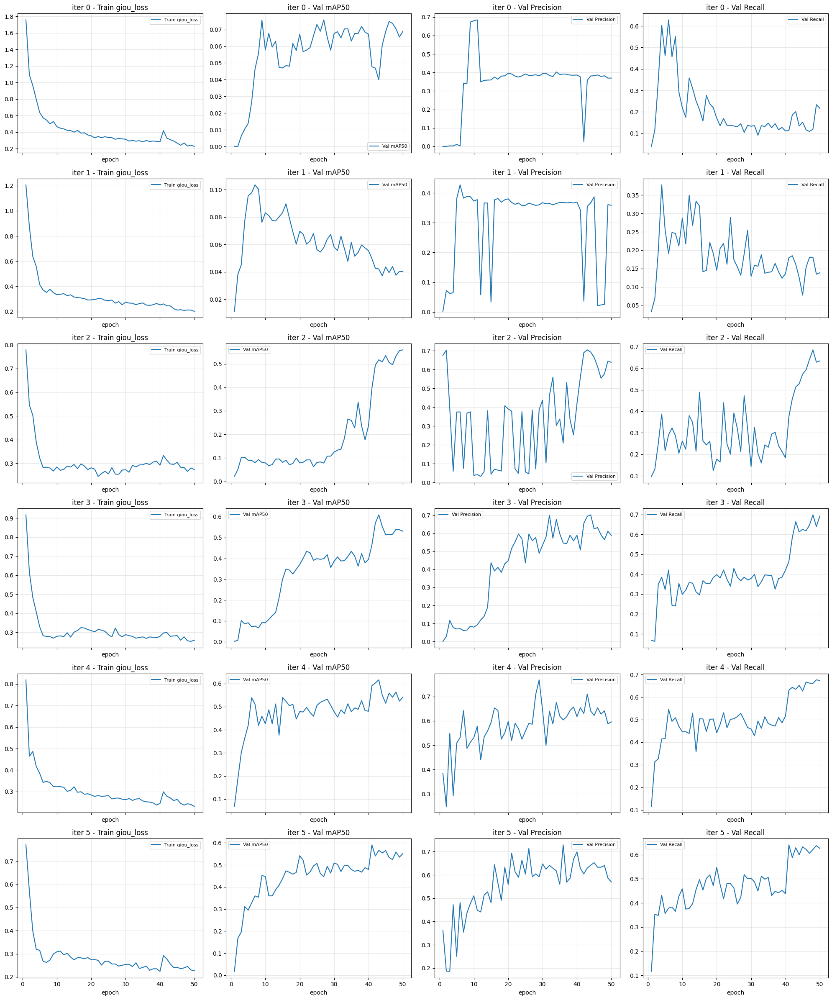

In [9]:
import matplotlib.pyplot as plt

metrics = [
    ('train/giou_loss', 'Train giou_loss'),
    ('metrics/mAP50(B)', 'Val mAP50'),
    ('metrics/precision(B)', 'Val Precision'),
    ('metrics/recall(B)', 'Val Recall'),
]
fig, axes = plt.subplots(6, 4, figsize=(20, 24), sharex=True)
for row, n in enumerate(range(6)):
    res_csv = Path(PROJECT_DIR) / f'{RUN}_iter{n}' / 'results.csv'
    for col, (m, lbl) in enumerate(metrics):
        ax = axes[row][col]
        if not res_csv.exists():
            ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
            ax.axis('off')
            continue
        df = pd.read_csv(res_csv)
        if m in df.columns:
            ax.plot(df['epoch'], df[m], label=lbl)
            ax.set_title(f'iter {n} - {lbl}')
            ax.set_xlabel('epoch')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True, alpha=0.3)
        else:
            ax.text(0.5, 0.5, f'{m}\nnot in results.csv', ha='center', va='center', transform=ax.transAxes)
            ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_training_curves.png', dpi=120)
plt.show()


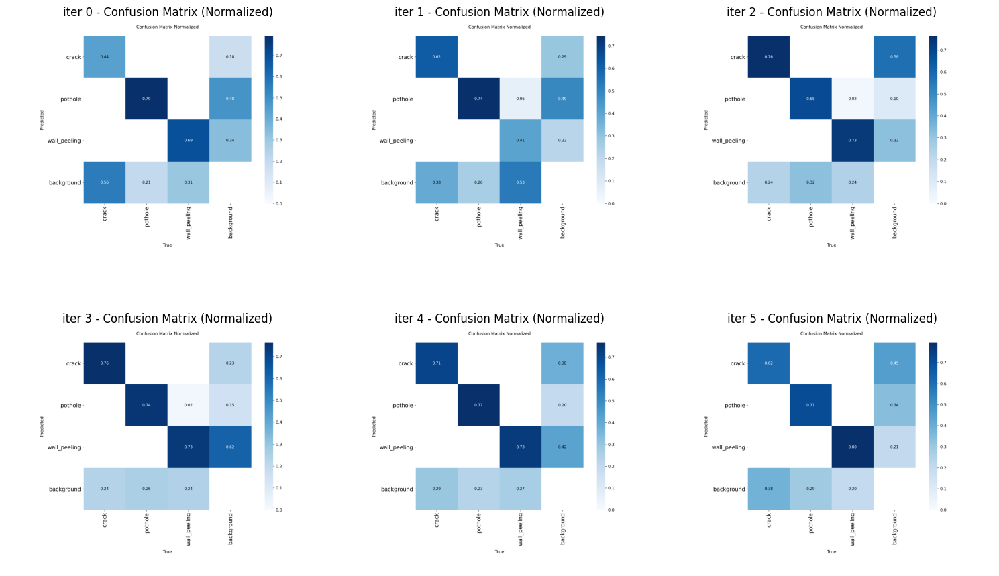

In [10]:
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    p = Path(PROJECT_DIR) / f'{RUN}_iter{n}' / 'confusion_matrix_normalized.png'
    if p.exists():
        ax.imshow(mpimg.imread(p))
        ax.set_title(f'iter {n} - Confusion Matrix (Normalized)')
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
    ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_confusion_matrices.png', dpi=120)
plt.show()


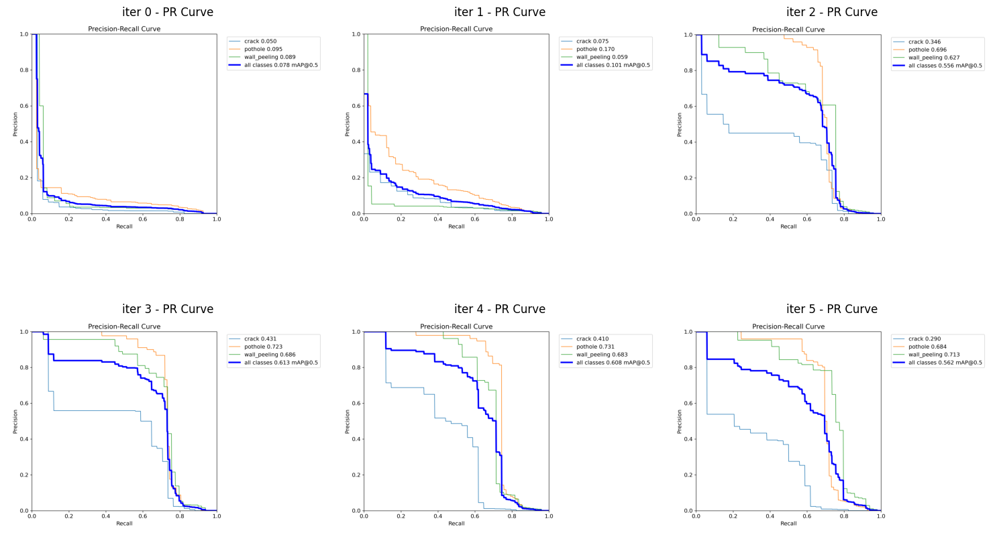

In [11]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    p = Path(PROJECT_DIR) / f'{RUN}_iter{n}' / 'BoxPR_curve.png'
    if p.exists():
        ax.imshow(mpimg.imread(p))
        ax.set_title(f'iter {n} - PR Curve')
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
    ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_pr_curves.png', dpi=120)
plt.show()


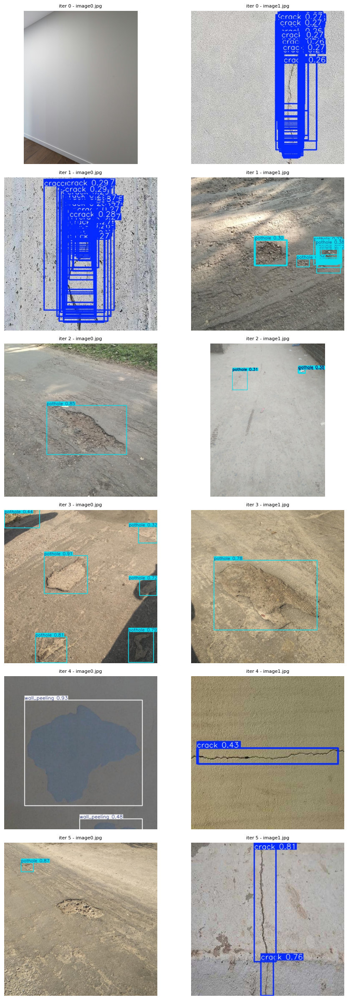

In [12]:
fig, axes = plt.subplots(6, 2, figsize=(10, 24))
for n in range(6):
    sample_dir = Path(PROJECT_DIR) / f'{RUN}_iter{n}_samples'
    samples = sorted(sample_dir.glob('*.jpg'))[:2] if sample_dir.exists() else []
    for col in range(2):
        ax = axes[n][col]
        if col < len(samples):
            ax.imshow(mpimg.imread(samples[col]))
            ax.set_title(f'iter {n} - {samples[col].name}', fontsize=8)
        else:
            ax.text(0.5, 0.5, f'iter {n}: no sample', ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_samples.png', dpi=120)
plt.show()


In [13]:
print('Per-class AP@50 across iters:')
header = f'{"class":<15}' + ''.join(f'iter{i}'.rjust(10) for i in range(6))
print(header)
for cls in CLASS_NAMES:
    row = [cls.ljust(15)]
    for n in range(6):
        summary = Path(PROJECT_DIR) / f'{RUN}_iter{n}_summary.json'
        if summary.exists():
            v = json.loads(summary.read_text(encoding='utf-8'))['per_class_ap50'].get(cls)
            row.append(f'{v:.4f}'.rjust(10) if v is not None else '--'.rjust(10))
        else:
            row.append('--'.rjust(10))
    print(''.join(row))


Per-class AP@50 across iters:
class               iter0     iter1     iter2     iter3     iter4     iter5
crack              0.0473    0.0735    0.3471    0.4350    0.3950    0.2936
pothole            0.0946    0.1706    0.6949    0.7228    0.7337    0.6838
wall_peeling       0.0894    0.0585    0.6264    0.6821    0.6789    0.7199


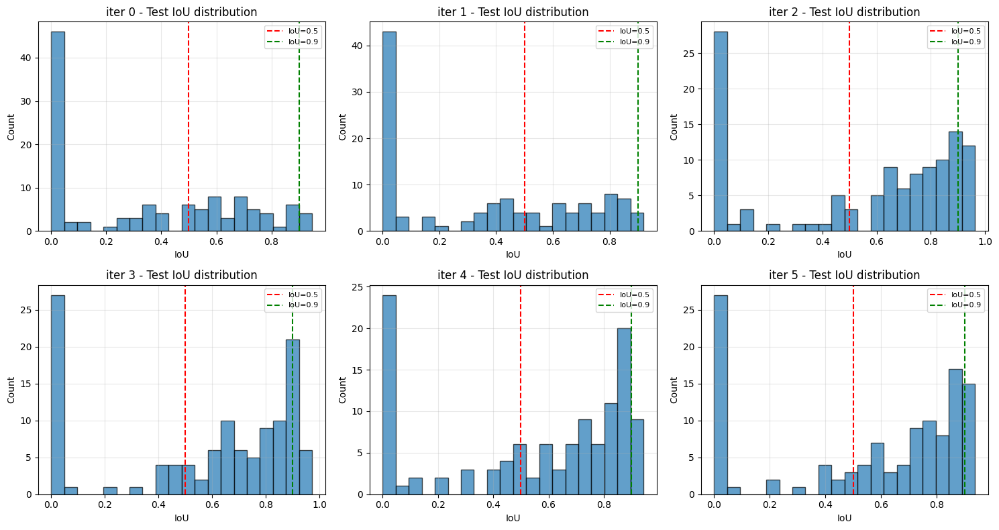

In [14]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for n in range(6):
    r, c = n // 3, n % 3
    ax = axes[r][c]
    iou_csv = Path(PROJECT_DIR) / f'{RUN}_iter{n}_test_iou.csv'
    if iou_csv.exists():
        df = pd.read_csv(iou_csv)
        ax.hist(df['iou'], bins=20, edgecolor='black', alpha=0.7)
        ax.set_title(f'iter {n} - Test IoU distribution')
        ax.set_xlabel('IoU')
        ax.set_ylabel('Count')
        ax.axvline(0.5, color='red', linestyle='--', label='IoU=0.5')
        ax.axvline(0.9, color='green', linestyle='--', label='IoU=0.9')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
    else:
        ax.text(0.5, 0.5, f'iter {n}: not run', ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')
plt.tight_layout()
plt.savefig(Path(PROJECT_DIR) / 'iter_comparison_iou_distribution.png', dpi=120)
plt.show()


## Final Model Evaluation — Best Iter


In [15]:
if BEST_WEIGHTS is None or not Path(BEST_WEIGHTS).exists():
    raise RuntimeError(f'Best iter weights not found: {BEST_WEIGHTS}. Run the iter loop first.')
print(f'Loading best iter weights: {BEST_WEIGHTS}')
trained_model = RTDETR(BEST_WEIGHTS)
print(f'Loaded model from iter {BEST_ITER} (run: {BEST_RUN_NAME})')


Loading best iter weights: /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3/weights/best.pt
Loaded model from iter 3 (run: rtdetr_l_v7_iter3)


## Evaluation on Test Set

In [16]:
test_metrics = trained_model.val(
    data=DATASET_YAML,
    split='test',
    plots=True,
    project=PROJECT_DIR,
    name=f'{BEST_RUN_NAME}_test',
    exist_ok=True,
)

print("\n--- Test Metrics ---")
print(f"mAP@50:     {test_metrics.box.map50:.4f}")
print(f"mAP@50-95:  {test_metrics.box.map:.4f}")
print(f"Precision:  {test_metrics.box.mp:.4f}")
print(f"Recall:     {test_metrics.box.mr:.4f}")
print(f"\nPer-class AP@50:")
for i, name in enumerate(CLASS_NAMES):
    print(f"  {name}: {test_metrics.box.ap50[i]:.4f}")

Ultralytics 8.4.56 🚀 Python-3.9.25 torch-2.8.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)


rt-detr-l summary: 310 layers, 31,989,905 parameters, 0 gradients, 103.4 GFLOPs


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 314.5±96.8 MB/s, size: 151.7 KB)


val: Scanning /home/achin/COS40007-Group/dataset/test/labels... 117 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 117/117 2.3Kit/s 0.1s

val: New cache created: /home/achin/COS40007-Group/dataset/test/labels.cache


/home/achin/COS40007-Group/.venv/lib64/python3.9/site-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 12% ━─────────── 1/8 1.0it/s 0.3s<6.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 25% ━━━───────── 2/8 1.9it/s 0.5s<3.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 38% ━━━━──────── 3/8 2.4it/s 0.8s<2.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━────── 4/8 2.9it/s 1.1s<1.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 62% ━━━━━━━───── 5/8 4.6it/s 1.2s<0.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 75% ━━━━━━━━━─── 6/8 6.1it/s 1.3s<0.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 88% ━━━━━━━━━━── 7/8 7.2it/s 1.4s<0.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.6it/s 1.4s

                   all        117        148      0.628      0.618      0.586      0.315


                 crack         33         36      0.513      0.528       0.47      0.114


               pothole         33         65      0.768      0.646      0.681      0.441


          wall_peeling         33         47      0.604      0.681      0.608       0.39


Speed: 1.2ms preprocess, 6.4ms inference, 0.0ms loss, 0.5ms postprocess per image


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3_test



--- Test Metrics ---
mAP@50:     0.5862
mAP@50-95:  0.3151
Precision:  0.6281
Recall:     0.6183

Per-class AP@50:
  crack: 0.4701
  pothole: 0.6806
  wall_peeling: 0.6078


## Training Curves

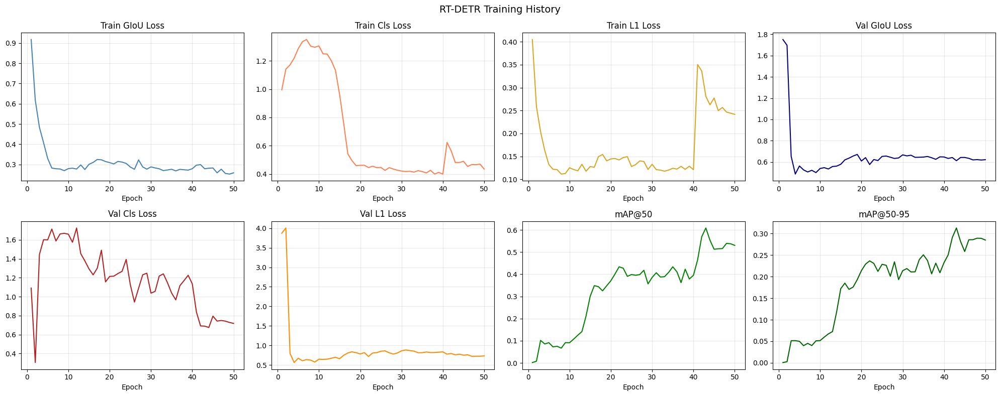

In [17]:
import pandas as pd
import matplotlib.image as mpimg

results_csv = os.path.join(PROJECT_DIR, BEST_RUN_NAME, 'results.csv')
df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()

plots = [
    ('train/giou_loss',       'Train GIoU Loss',  'steelblue'),
    ('train/cls_loss',        'Train Cls Loss',   'coral'),
    ('train/l1_loss',         'Train L1 Loss',    'goldenrod'),
    ('val/giou_loss',         'Val GIoU Loss',    'navy'),
    ('val/cls_loss',          'Val Cls Loss',     'firebrick'),
    ('val/l1_loss',           'Val L1 Loss',      'darkorange'),
    ('metrics/mAP50(B)',      'mAP@50',           'green'),
    ('metrics/mAP50-95(B)',   'mAP@50-95',        'darkgreen'),
    ('metrics/precision(B)',  'Precision',        'purple'),
    ('metrics/recall(B)',     'Recall',           'orange'),
    ('lr/pg0',                'LR (backbone)',    'gray'),
    ('lr/pg1',                'LR (weights)',     'darkgray'),
]

fig, axes = plt.subplots(2, 4, figsize=(20, 8))
for ax, (col, title, color) in zip(axes.flatten(), plots):
    if col in df.columns:
        ax.plot(df['epoch'], df[col], color=color, linewidth=1.5)
        ax.set_title(title)
        ax.set_xlabel('Epoch')
        ax.grid(True, alpha=0.3)
    else:
        ax.set_title(f'{title} (not found)')
        ax.axis('off')

plt.suptitle('RT-DETR Training History', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'training_curves.png'), dpi=150)
plt.show()

## Inference and Visualisation on Test Images

image 1/117 /home/achin/COS40007-Group/dataset/test/images/crack-002.jpg: 640x640 1 crack, 2 wall_peelings, 21.0ms


image 2/117 /home/achin/COS40007-Group/dataset/test/images/crack-003.jpg: 640x640 1 crack, 20.5ms


image 3/117 /home/achin/COS40007-Group/dataset/test/images/crack-008.jpg: 640x640 2 cracks, 20.8ms


image 4/117 /home/achin/COS40007-Group/dataset/test/images/crack-013.jpg: 640x640 (no detections), 20.7ms


image 5/117 /home/achin/COS40007-Group/dataset/test/images/crack-018.jpg: 640x640 1 crack, 21.0ms


image 6/117 /home/achin/COS40007-Group/dataset/test/images/crack-020.jpg: 640x640 (no detections), 20.8ms


image 7/117 /home/achin/COS40007-Group/dataset/test/images/crack-030.jpg: 640x640 2 cracks, 20.7ms


image 8/117 /home/achin/COS40007-Group/dataset/test/images/crack-033.jpg: 640x640 1 crack, 1 pothole, 3 wall_peelings, 21.0ms


image 9/117 /home/achin/COS40007-Group/dataset/test/images/crack-039.jpg: 640x640 2 cracks, 1 wall_peeling, 21.3ms


image 10/117 /home/achin/COS40007-Group/dataset/test/images/crack-040.jpg: 640x640 4 cracks, 20.8ms


image 11/117 /home/achin/COS40007-Group/dataset/test/images/crack-057.jpg: 640x640 1 crack, 21.0ms


image 12/117 /home/achin/COS40007-Group/dataset/test/images/crack-068.jpg: 640x640 1 crack, 21.3ms


image 13/117 /home/achin/COS40007-Group/dataset/test/images/crack-072.jpg: 640x640 1 crack, 21.2ms


image 14/117 /home/achin/COS40007-Group/dataset/test/images/crack-078.jpg: 640x640 2 cracks, 22.1ms


image 15/117 /home/achin/COS40007-Group/dataset/test/images/crack-081.jpg: 640x640 2 cracks, 21.7ms


image 16/117 /home/achin/COS40007-Group/dataset/test/images/crack-104.jpg: 640x640 2 cracks, 21.4ms


image 17/117 /home/achin/COS40007-Group/dataset/test/images/crack-119.jpg: 640x640 1 crack, 21.3ms


image 18/117 /home/achin/COS40007-Group/dataset/test/images/crack-123.jpg: 640x640 1 crack, 21.4ms


image 19/117 /home/achin/COS40007-Group/dataset/test/images/crack-149.jpg: 640x640 3 cracks, 20.8ms


image 20/117 /home/achin/COS40007-Group/dataset/test/images/crack-150.jpg: 640x640 1 crack, 21.1ms


image 21/117 /home/achin/COS40007-Group/dataset/test/images/crack-154.jpg: 640x640 1 crack, 21.2ms


image 22/117 /home/achin/COS40007-Group/dataset/test/images/crack-155.jpg: 640x640 1 crack, 21.4ms


image 23/117 /home/achin/COS40007-Group/dataset/test/images/crack-156.jpg: 640x640 1 crack, 21.4ms


image 24/117 /home/achin/COS40007-Group/dataset/test/images/crack-157.jpg: 640x640 1 crack, 1 wall_peeling, 21.2ms


image 25/117 /home/achin/COS40007-Group/dataset/test/images/crack-159.jpg: 640x640 1 crack, 20.9ms


image 26/117 /home/achin/COS40007-Group/dataset/test/images/crack-167.jpg: 640x640 2 cracks, 20.9ms


image 27/117 /home/achin/COS40007-Group/dataset/test/images/crack-179.jpg: 640x640 1 crack, 21.0ms


image 28/117 /home/achin/COS40007-Group/dataset/test/images/crack-181.jpg: 640x640 1 crack, 3 wall_peelings, 20.9ms


image 29/117 /home/achin/COS40007-Group/dataset/test/images/crack-183.jpg: 640x640 1 crack, 21.0ms


image 30/117 /home/achin/COS40007-Group/dataset/test/images/crack-185.jpg: 640x640 1 crack, 21.0ms


image 31/117 /home/achin/COS40007-Group/dataset/test/images/crack-187.jpg: 640x640 3 cracks, 20.8ms


image 32/117 /home/achin/COS40007-Group/dataset/test/images/crack-194.jpg: 640x640 (no detections), 20.8ms


image 33/117 /home/achin/COS40007-Group/dataset/test/images/crack-202.jpg: 640x640 1 crack, 20.8ms


image 34/117 /home/achin/COS40007-Group/dataset/test/images/pothole-012.jpg: 640x640 3 potholes, 20.8ms


image 35/117 /home/achin/COS40007-Group/dataset/test/images/pothole-019.jpg: 640x640 6 potholes, 20.9ms


image 36/117 /home/achin/COS40007-Group/dataset/test/images/pothole-021.jpg: 640x640 4 potholes, 21.1ms


image 37/117 /home/achin/COS40007-Group/dataset/test/images/pothole-023.jpg: 640x640 2 potholes, 21.2ms


image 38/117 /home/achin/COS40007-Group/dataset/test/images/pothole-026.jpg: 640x640 1 pothole, 21.0ms


image 39/117 /home/achin/COS40007-Group/dataset/test/images/pothole-029.jpg: 640x640 1 pothole, 20.9ms


image 40/117 /home/achin/COS40007-Group/dataset/test/images/pothole-033.jpg: 640x640 4 potholes, 20.8ms


image 41/117 /home/achin/COS40007-Group/dataset/test/images/pothole-043.jpg: 640x640 2 potholes, 20.6ms


image 42/117 /home/achin/COS40007-Group/dataset/test/images/pothole-047.jpg: 640x640 1 pothole, 20.6ms


image 43/117 /home/achin/COS40007-Group/dataset/test/images/pothole-050.jpg: 640x640 4 potholes, 21.1ms


image 44/117 /home/achin/COS40007-Group/dataset/test/images/pothole-055.jpg: 640x640 1 pothole, 21.3ms


image 45/117 /home/achin/COS40007-Group/dataset/test/images/pothole-056.jpg: 640x640 1 pothole, 21.4ms


image 46/117 /home/achin/COS40007-Group/dataset/test/images/pothole-058.jpg: 640x640 2 potholes, 21.3ms


image 47/117 /home/achin/COS40007-Group/dataset/test/images/pothole-061.jpg: 640x640 1 pothole, 21.0ms


image 48/117 /home/achin/COS40007-Group/dataset/test/images/pothole-072.jpg: 640x640 (no detections), 21.8ms


image 49/117 /home/achin/COS40007-Group/dataset/test/images/pothole-077.jpg: 640x640 1 pothole, 21.5ms


image 50/117 /home/achin/COS40007-Group/dataset/test/images/pothole-091.jpg: 640x640 2 potholes, 21.6ms


image 51/117 /home/achin/COS40007-Group/dataset/test/images/pothole-092.jpg: 640x640 2 potholes, 21.6ms


image 52/117 /home/achin/COS40007-Group/dataset/test/images/pothole-097.jpg: 640x640 2 potholes, 21.5ms


image 53/117 /home/achin/COS40007-Group/dataset/test/images/pothole-111.jpg: 640x640 1 pothole, 21.9ms


image 54/117 /home/achin/COS40007-Group/dataset/test/images/pothole-135.jpg: 640x640 1 pothole, 22.0ms


image 55/117 /home/achin/COS40007-Group/dataset/test/images/pothole-151.jpg: 640x640 3 potholes, 21.4ms


image 56/117 /home/achin/COS40007-Group/dataset/test/images/pothole-163.jpg: 640x640 1 pothole, 21.3ms


image 57/117 /home/achin/COS40007-Group/dataset/test/images/pothole-164.jpg: 640x640 1 pothole, 21.3ms


image 58/117 /home/achin/COS40007-Group/dataset/test/images/pothole-175.jpg: 640x640 1 pothole, 21.8ms


image 59/117 /home/achin/COS40007-Group/dataset/test/images/pothole-182.jpg: 640x640 3 potholes, 21.8ms


image 60/117 /home/achin/COS40007-Group/dataset/test/images/pothole-184.jpg: 640x640 1 pothole, 21.4ms


image 61/117 /home/achin/COS40007-Group/dataset/test/images/pothole-189.jpg: 640x640 2 potholes, 21.4ms


image 62/117 /home/achin/COS40007-Group/dataset/test/images/pothole-190.jpg: 640x640 2 potholes, 21.3ms


image 63/117 /home/achin/COS40007-Group/dataset/test/images/pothole-195.jpg: 640x640 1 pothole, 22.0ms


image 64/117 /home/achin/COS40007-Group/dataset/test/images/pothole-199.jpg: 640x640 3 potholes, 21.7ms


image 65/117 /home/achin/COS40007-Group/dataset/test/images/pothole-203.jpg: 640x640 2 potholes, 22.1ms


image 66/117 /home/achin/COS40007-Group/dataset/test/images/pothole-207.jpg: 640x640 2 potholes, 20.7ms


image 67/117 /home/achin/COS40007-Group/dataset/test/images/road-008.jpg: 640x640 (no detections), 21.6ms


image 68/117 /home/achin/COS40007-Group/dataset/test/images/road-014.jpg: 640x640 1 wall_peeling, 21.5ms


image 69/117 /home/achin/COS40007-Group/dataset/test/images/road-018.jpg: 640x640 (no detections), 21.5ms


image 70/117 /home/achin/COS40007-Group/dataset/test/images/road-025.jpg: 640x640 (no detections), 21.3ms


image 71/117 /home/achin/COS40007-Group/dataset/test/images/road-030.jpg: 640x640 (no detections), 22.3ms


image 72/117 /home/achin/COS40007-Group/dataset/test/images/road-032.jpg: 640x640 (no detections), 22.1ms


image 73/117 /home/achin/COS40007-Group/dataset/test/images/road-033.jpg: 640x640 (no detections), 22.4ms


image 74/117 /home/achin/COS40007-Group/dataset/test/images/road-038.jpg: 640x640 (no detections), 22.1ms


image 75/117 /home/achin/COS40007-Group/dataset/test/images/road-044.jpg: 640x640 (no detections), 22.5ms


image 76/117 /home/achin/COS40007-Group/dataset/test/images/wall-005.jpg: 640x640 (no detections), 22.2ms


image 77/117 /home/achin/COS40007-Group/dataset/test/images/wall-006.jpg: 640x640 (no detections), 22.1ms


image 78/117 /home/achin/COS40007-Group/dataset/test/images/wall-007.jpg: 640x640 (no detections), 22.4ms


image 79/117 /home/achin/COS40007-Group/dataset/test/images/wall-008.jpg: 640x640 (no detections), 21.5ms


image 80/117 /home/achin/COS40007-Group/dataset/test/images/wall-032.jpg: 640x640 (no detections), 21.6ms


image 81/117 /home/achin/COS40007-Group/dataset/test/images/wall-041.jpg: 640x640 (no detections), 22.3ms


image 82/117 /home/achin/COS40007-Group/dataset/test/images/wall-046.jpg: 640x640 (no detections), 22.7ms


image 83/117 /home/achin/COS40007-Group/dataset/test/images/wall-056.jpg: 640x640 (no detections), 22.7ms


image 84/117 /home/achin/COS40007-Group/dataset/test/images/wall-060.jpg: 640x640 (no detections), 21.5ms


image 85/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-004.jpg: 640x640 2 wall_peelings, 21.5ms


image 86/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-005.jpg: 640x640 1 wall_peeling, 21.7ms


image 87/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-008.jpg: 640x640 (no detections), 21.4ms


image 88/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-011.jpg: 640x640 3 wall_peelings, 21.3ms


image 89/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-017.jpg: 640x640 4 wall_peelings, 21.1ms


image 90/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-025.jpg: 640x640 2 cracks, 21.1ms


image 91/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-027.jpg: 640x640 1 wall_peeling, 21.0ms


image 92/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-030.jpg: 640x640 1 wall_peeling, 20.9ms


image 93/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-041.jpg: 640x640 1 wall_peeling, 21.1ms


image 94/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-042.jpg: 640x640 2 wall_peelings, 20.9ms


image 95/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-062.jpg: 640x640 1 wall_peeling, 20.9ms


image 96/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-063.jpg: 640x640 1 wall_peeling, 21.2ms


image 97/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-064.jpg: 640x640 1 wall_peeling, 21.0ms


image 98/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-087.jpg: 640x640 1 wall_peeling, 21.0ms


image 99/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-091.jpg: 640x640 2 wall_peelings, 21.0ms


image 100/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-094.jpg: 640x640 2 wall_peelings, 21.3ms


image 101/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-103.jpg: 640x640 1 wall_peeling, 21.3ms


image 102/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-121.jpg: 640x640 2 wall_peelings, 21.0ms


image 103/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-135.jpg: 640x640 3 wall_peelings, 21.1ms


image 104/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-136.jpg: 640x640 1 wall_peeling, 20.9ms


image 105/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-147.jpg: 640x640 2 wall_peelings, 21.2ms


image 106/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-152.jpg: 640x640 13 wall_peelings, 21.5ms


image 107/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-162.jpg: 640x640 3 wall_peelings, 21.0ms


image 108/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-168.jpg: 640x640 2 wall_peelings, 21.7ms


image 109/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-170.jpg: 640x640 34 wall_peelings, 21.0ms


image 110/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-178.jpg: 640x640 17 wall_peelings, 21.3ms


image 111/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-184.jpg: 640x640 1 wall_peeling, 21.5ms


image 112/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-185.jpg: 640x640 34 wall_peelings, 21.3ms


image 113/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-187.jpg: 640x640 1 wall_peeling, 21.3ms


image 114/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-192.jpg: 640x640 2 wall_peelings, 21.1ms


image 115/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-200.jpg: 640x640 (no detections), 21.2ms


image 116/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-211.jpg: 640x640 1 pothole, 2 wall_peelings, 21.3ms


image 117/117 /home/achin/COS40007-Group/dataset/test/images/wall_peeling-213.jpg: 640x640 2 potholes, 4 wall_peelings, 21.1ms


Speed: 1.9ms preprocess, 21.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Results saved to /home/achin/COS40007-Group/runs/defect_detection/rtdetr_l_v7_iter3_predictions


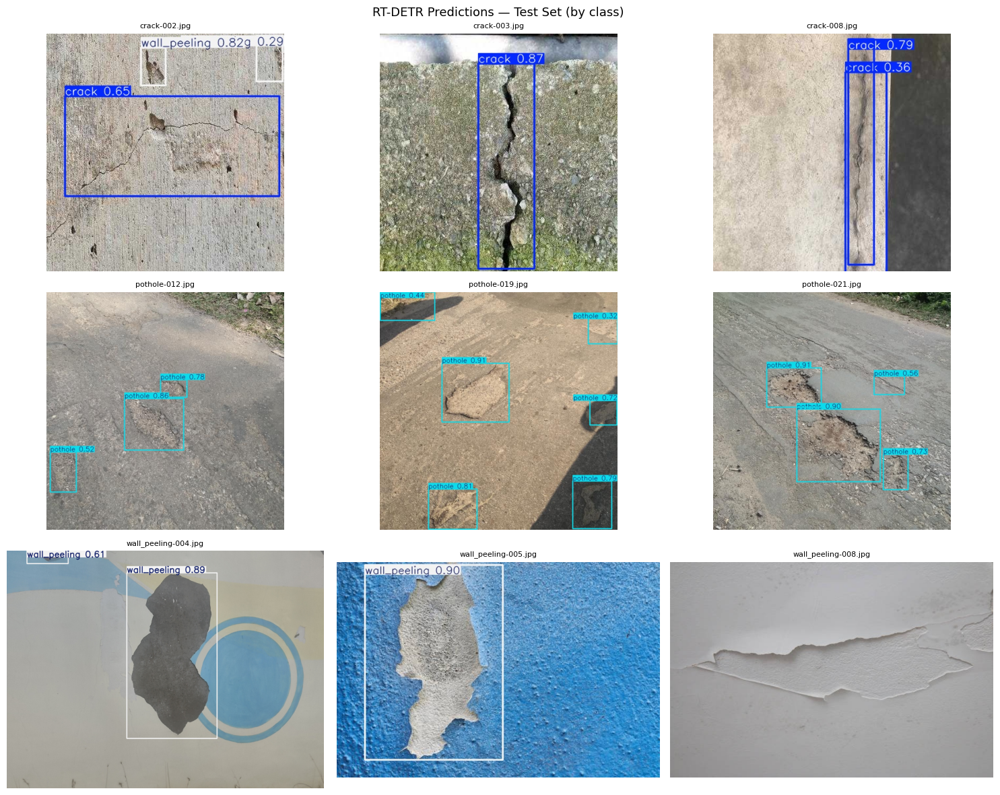

In [18]:
trained_model.predict(
    source=IMAGE_DIRS['test'],
    conf=0.25,
    iou=0.5,
    save=True,
    project=PROJECT_DIR,
    name=f'{BEST_RUN_NAME}_predictions',
    exist_ok=True,
)

pred_dir = Path(PROJECT_DIR) / f'{BEST_RUN_NAME}_predictions'

fig, axes = plt.subplots(NC, 3, figsize=(15, 4 * NC))
for row, cls_name in enumerate(CLASS_NAMES):
    cls_preds = sorted(pred_dir.glob(f'{cls_name}-*.jpg'))[:3]
    for col in range(3):
        ax = axes[row][col]
        ax.axis('off')
        if col < len(cls_preds):
            ax.imshow(mpimg.imread(cls_preds[col]))
            ax.set_title(cls_preds[col].name, fontsize=8)
        else:
            ax.set_title(f'{cls_name} — no prediction saved', fontsize=8)

plt.suptitle('RT-DETR Predictions — Test Set (by class)', fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(PROJECT_DIR, 'prediction_samples.png'), dpi=150)
plt.show()

## Display Evaluation Plots

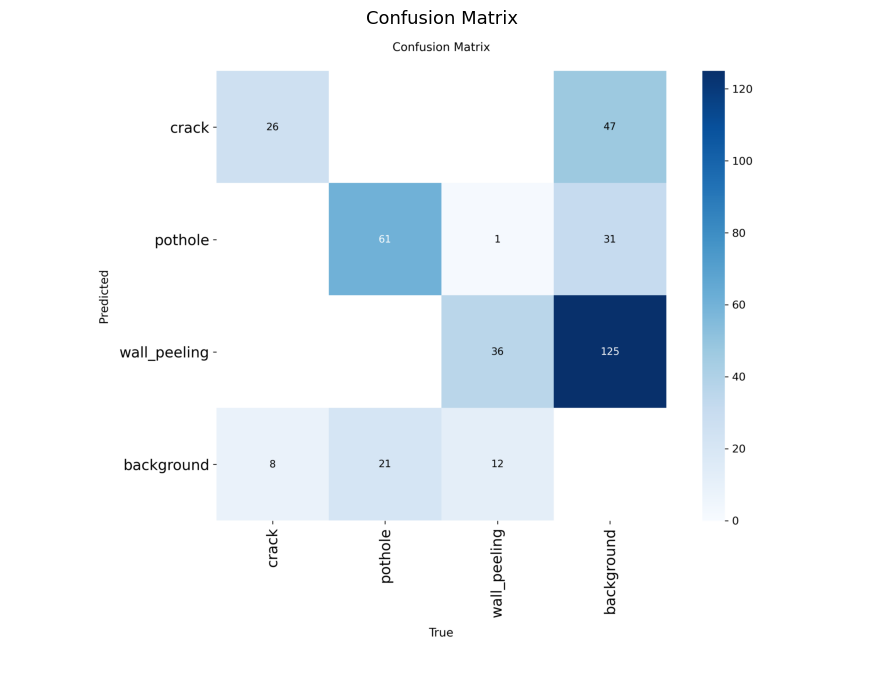

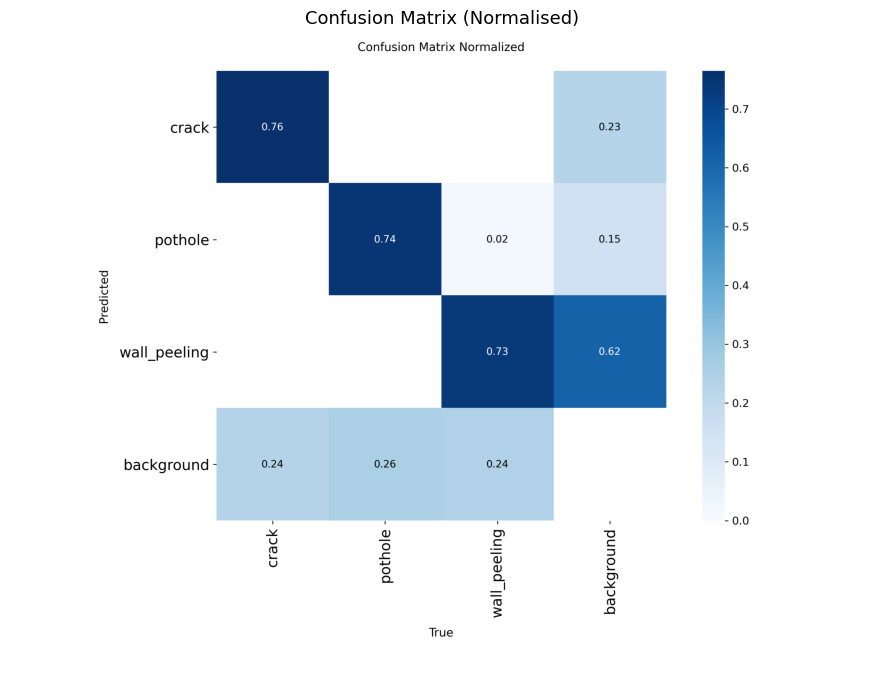

Not yet generated: PR_curve.png
Not yet generated: P_curve.png
Not yet generated: R_curve.png


In [19]:
eval_plots = [
    ('confusion_matrix.png',            'Confusion Matrix'),
    ('confusion_matrix_normalized.png', 'Confusion Matrix (Normalised)'),
    ('PR_curve.png',                    'Precision-Recall Curve'),
    ('P_curve.png',                     'Precision Curve'),
    ('R_curve.png',                     'Recall Curve'),
]

run_dir = Path(PROJECT_DIR) / BEST_RUN_NAME

for filename, title in eval_plots:
    p = run_dir / filename
    if p.exists():
        plt.figure(figsize=(10, 7))
        plt.imshow(mpimg.imread(p))
        plt.title(title, fontsize=13)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Not yet generated: {filename}")

## Inference Speed Benchmark

In [20]:
import time

test_imgs = list(Path(IMAGE_DIRS['test']).glob('*.jpg'))[:50]

# Warmup
trained_model.predict(source=[str(test_imgs[0])], conf=0.25, verbose=False)

# Timed run
start = time.time()
trained_model.predict(source=[str(p) for p in test_imgs], conf=0.25, verbose=False)
elapsed = time.time() - start

fps = len(test_imgs) / elapsed
print(f"Images tested : {len(test_imgs)}")
print(f"Total time    : {elapsed:.2f}s")
print(f"FPS           : {fps:.1f}")
print(f"ms/image      : {1000/fps:.1f}")

Images tested : 50
Total time    : 0.79s
FPS           : 63.4
ms/image      : 15.8


## Display Evaluation Plots

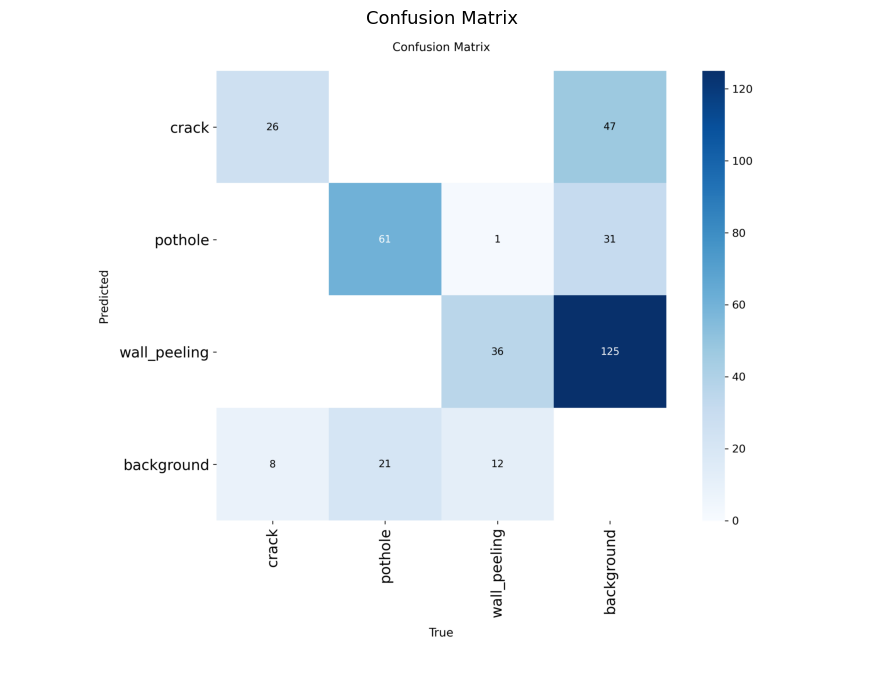

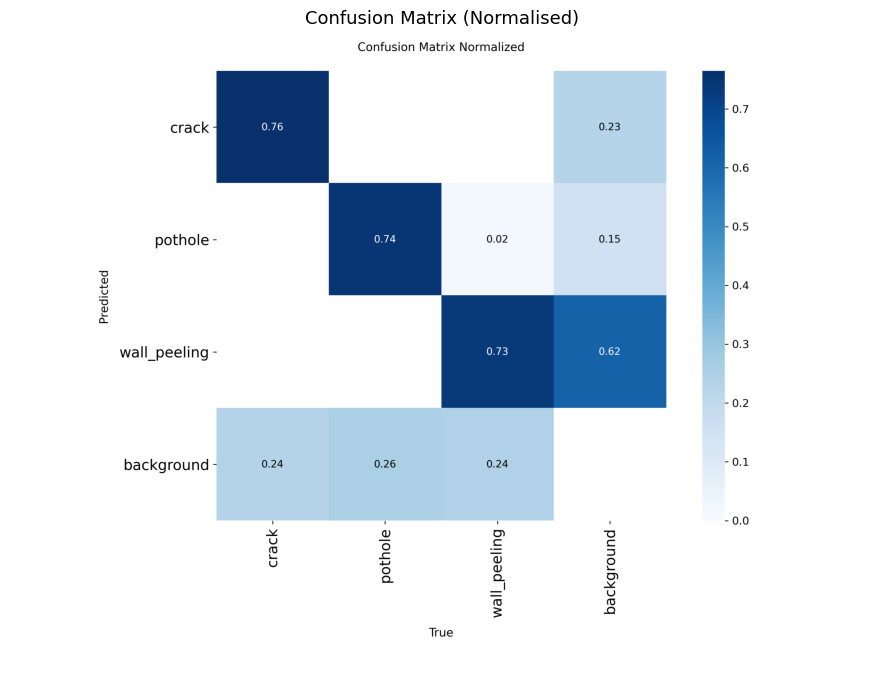

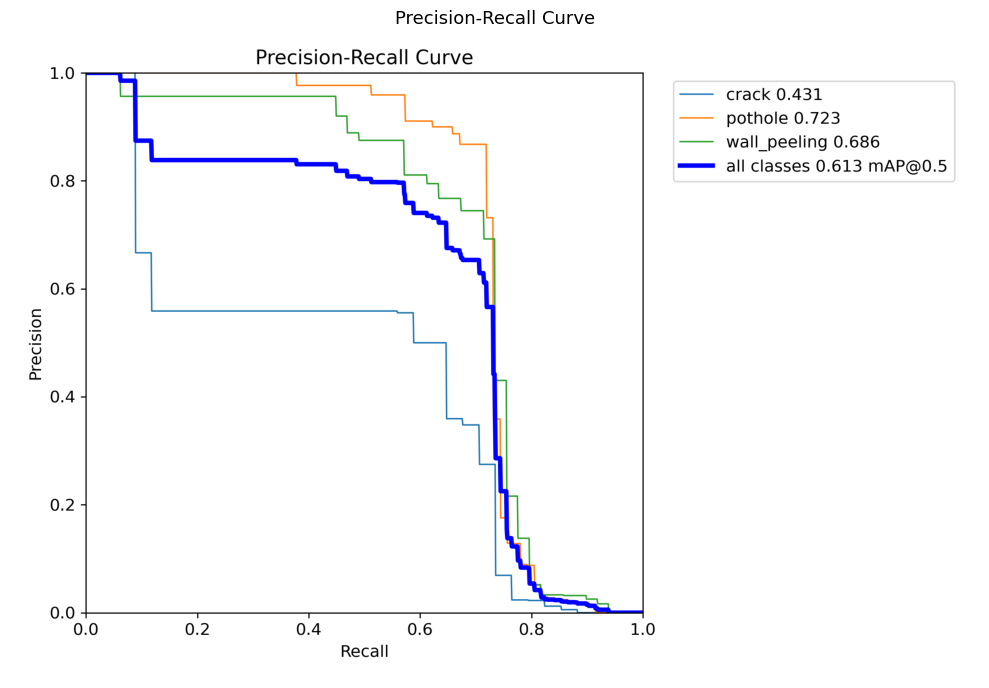

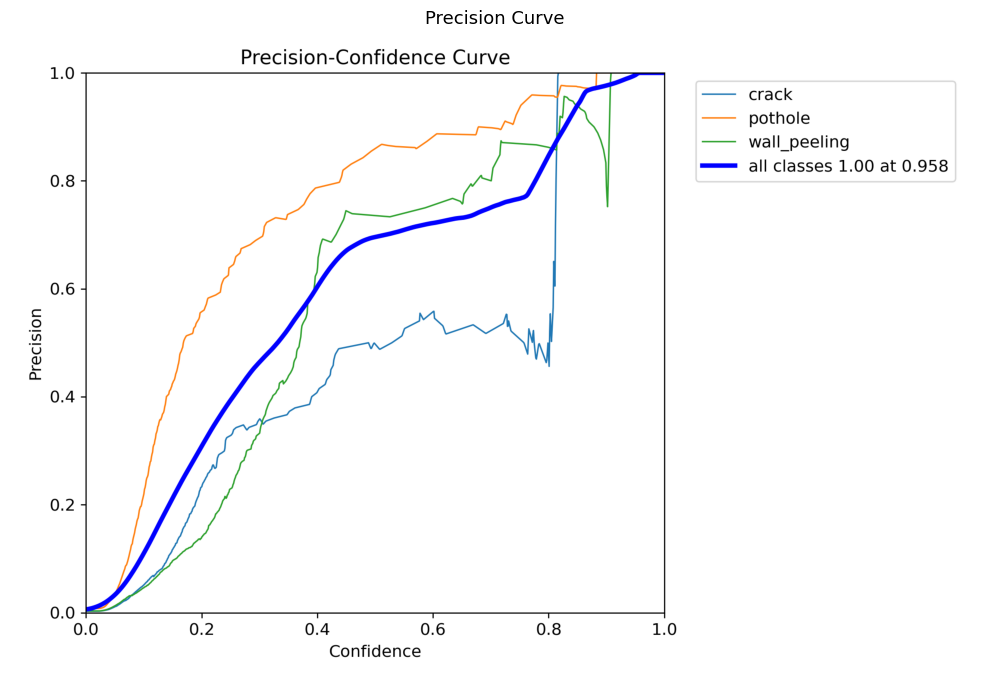

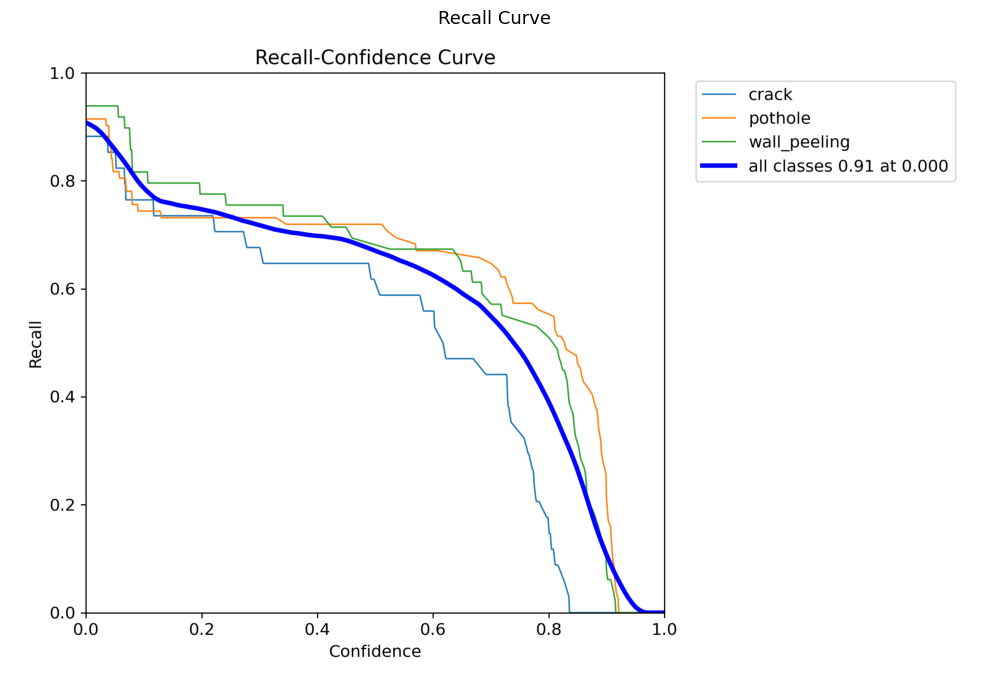

In [21]:
eval_plots = [
    ('confusion_matrix.png',            'Confusion Matrix'),
    ('confusion_matrix_normalized.png', 'Confusion Matrix (Normalised)'),
    ('BoxPR_curve.png',                    'Precision-Recall Curve'),
    ('BoxP_curve.png',                     'Precision Curve'),
    ('BoxR_curve.png',                     'Recall Curve'),
]

run_dir = Path(PROJECT_DIR) / BEST_RUN_NAME

for filename, title in eval_plots:
    p = run_dir / filename
    if p.exists():
        plt.figure(figsize=(10, 7))
        plt.imshow(mpimg.imread(p))
        plt.title(title, fontsize=13)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Not yet generated: {filename}")